In [1]:
!pip install tableone
#!pip install datatable
import os
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K
import pandas as pd
import numpy as np
from tableone import TableOne
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
#import datatable
import xgboost as xgb
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
import missingno as msno
# RF
from sklearn.ensemble import RandomForestClassifier
# LR
from sklearn.linear_model import LogisticRegression
pd.options.display.max_columns = None
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow.keras as keras
from keras.models import Sequential
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Dense, Activation, Dropout
from keras import backend as K
from scipy.stats import zscore
import sklearn.utils as utils
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.metrics import precision_recall_curve

import pickle
from IPython.display import display, HTML
from tqdm.notebook import tqdm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import sklearn.svm as svm
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neural_network import MLPClassifier
import sklearn.svm as svm
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

In [2]:
from IPython.display import display
import seaborn as sns
import imblearn
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
datapath = '/content/gdrive/MyDrive/transfusion'
resultpath = '/content/gdrive/MyDrive/transfusion'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Mounted at /content/gdrive


In [3]:
df_transfusion = pd.read_csv(os.path.join(datapath,'csec_14000.csv'))
df_transfusion_ori = pd.read_csv(os.path.join(datapath,'transfusion_ori.csv'),encoding = 'ISO-8859-1')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Intraop_transfusion,post_transfusion,transfusion,age,height,weight,BMI,regional,general,parity,placenta_previa_partialis,placenta_previa_marginalis,placenta_previa_totalis,Placenta_accreta,Placenta_increta,Placenta_percreta,placental_abruption,pre-eclampsia,twin,triple,GDM,Midazolam,WBC,Hb,platelet,E-Neurtophil,E-lymphocyte,RDW,PT_INR,NLR,PLR,PNI,EGFR_MDRD60,Creatinine,Uric_acid,albumin,AST,ALT,total_bilirubin,sodium,postassium,chloride
0,0,0,0,18,154.0,61.00,25.7,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,7.5,9.5,340,65.3,22.6,15.1,0.96,2.889381,200.589970,34.4750,0,0.50,2.2,2.6,19,16,0.4,138,4.1,102
1,0,0,0,18,168.0,58.00,20.5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,6.9,10.6,288,63.8,28.6,12.2,1.00,2.230769,145.941015,39.8670,0,0.62,4.1,3.0,16,10,0.3,139,4.2,105
2,0,0,0,19,166.3,88.40,32.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,10.9,12.9,233,81.6,11.5,15.1,0.99,7.095652,185.879537,41.2675,0,0.49,3.5,3.5,38,19,0.8,137,4.3,106
3,0,0,0,19,156.4,71.50,29.2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8.0,12.0,229,61.2,26.9,14.7,0.94,2.275093,106.412639,36.7600,0,0.48,4.4,2.6,19,17,0.3,139,4.3,104
4,0,0,0,19,160.0,68.00,26.6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,9.3,11.0,187,77.4,15.0,13.6,0.97,5.160000,134.050179,36.9750,0,0.44,4.3,3.0,17,12,0.5,138,4.4,101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14249,0,0,0,51,163.3,71.50,26.8,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,12.3,14.3,190,79.1,11.9,12.4,0.97,6.647059,129.808021,35.3185,0,0.52,4.0,2.8,19,14,0.3,138,4.5,105
14250,0,0,0,51,157.0,70.00,28.4,1,0,2,0,0,0,0,0,0,0,0,0,0,0,1,7.6,11.6,200,66.9,20.8,14.0,1.03,3.216346,126.518219,33.9040,0,0.58,3.4,2.6,18,8,0.6,136,4.3,102
14251,0,0,0,54,154.0,69.00,29.1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,6.4,13.0,149,53.5,37.7,15.0,0.84,1.419098,61.753979,30.0640,0,0.92,5.0,1.8,48,45,0.7,138,5.0,107
14252,0,0,0,55,158.2,61.75,24.7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,9.4,11.1,317,71.4,21.1,14.9,0.92,3.383886,159.826560,45.9170,0,0.63,4.1,3.6,12,9,0.7,138,4.6,105


In [15]:
count = df_transfusion[(df_transfusion['general'] == 1)].shape[0]

print(count)

4309


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [16]:
4309/14254

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.30230110846078295

In [18]:
df_table=df_transfusion[['transfusion','regional','general']]
categorical = ['transfusion','regional','general']

TableOne(df_table, categorical = categorical,groupby='transfusion', pval=True,htest_name =True, dip_test=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated

Grouped by transfusion                                                                
                                    Missing       Overall              0             1 P-Value         Test
n                                                   14254          13070          1184                     
transfusion, n (%) 0                      0  13070 (91.7)  13070 (100.0)                <0.001  Chi-squared
                   1                           1184 (8.3)                 1184 (100.0)                     
regional, n (%)    0                      0   4309 (30.2)    3523 (27.0)    786 (66.4)  <0.001  Chi-squared
                   1                          9945 (69.8)    9547 (73.0)    398 (33.6)                     
general, n (%)     0                      0   9945 (69.8)    9547 (73.0)    398 (33.6)  <0.001  Chi-squared
                   1                          4309 (30.2)    3523 (27.0)    786 (66.4)

In [ ]:
#df_transfusion2 = pd.read_csv(os.path.join(datapath,'Intra_2400_test.csv'))
#df_transfusion3 = pd.read_csv(os.path.join(datapath,'Intra_3060_test.csv'))
#df_transfusion4 = pd.read_csv(os.path.join(datapath,'Intra_4080_test.csv'))
#df_transfusion5 = pd.read_csv(os.path.join(datapath,'Intra_6120_test.csv'))
#df_transfusiont1 = df_transfusion.drop(df_transfusion2.index)
#df_transfusiont2 = df_transfusion.drop(df_transfusion3.index)
#df_transfusiont3 = df_transfusion.drop(df_transfusion4.index)
#df_transfusiont4 = df_transfusion.drop(df_transfusion5.index)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-9-18dee6849d01>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use(['seaborn-white'])


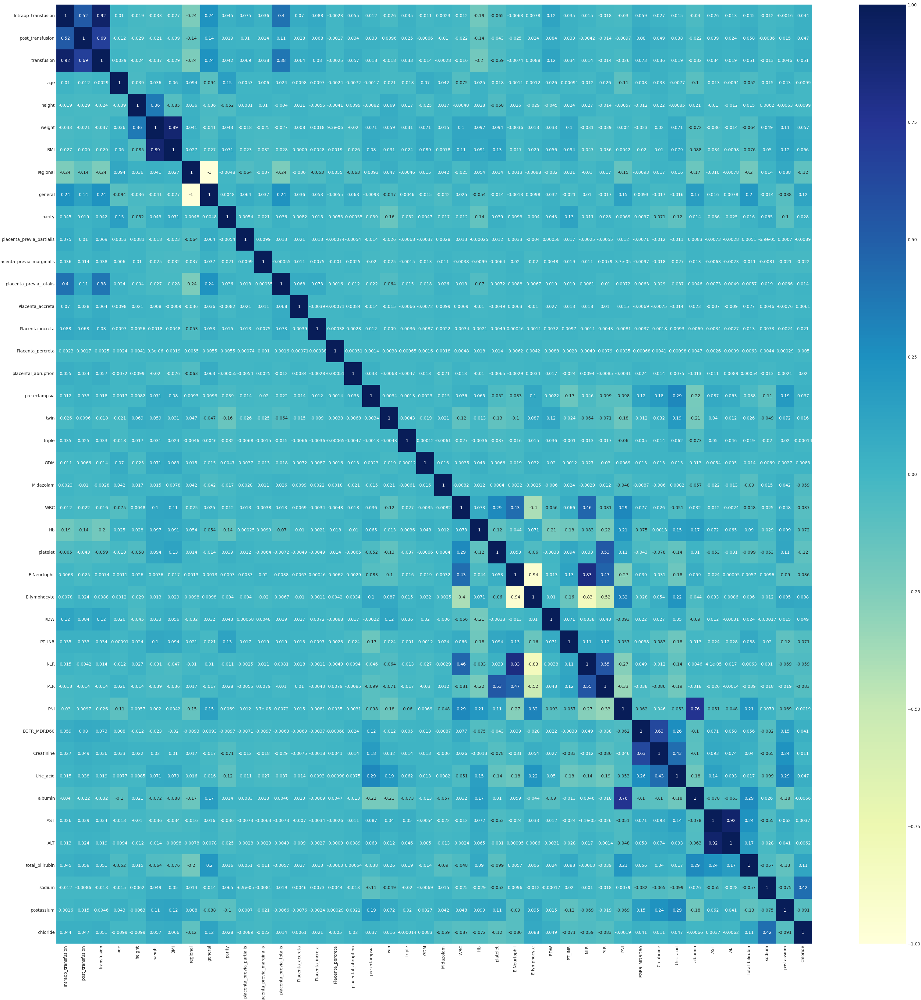

In [ ]:
plt.style.use(['seaborn-white'])
plt.figure(figsize=(40,40))
cor = df_transfusion.corr()
sns.heatmap(cor, annot=True, cmap='YlGnBu')
sns.set(font_scale=2)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: >

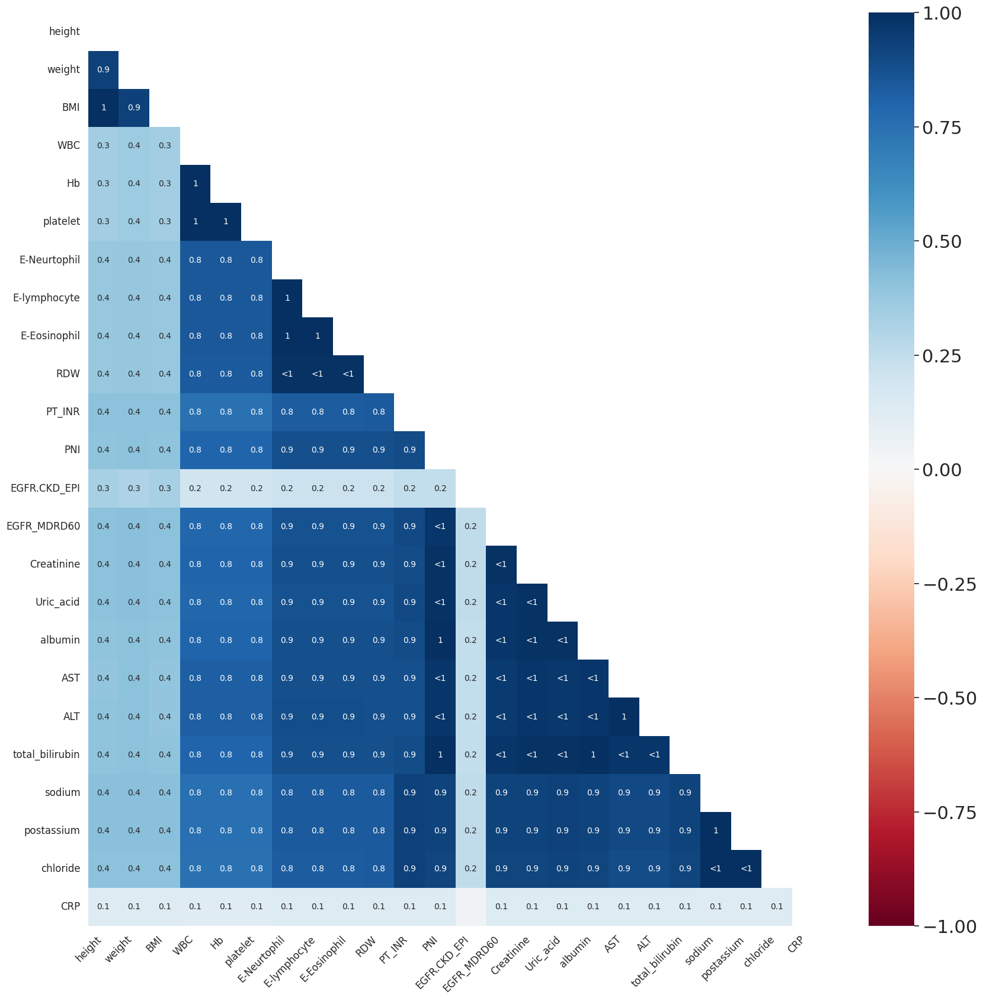

In [ ]:
msno.heatmap(df_transfusion_ori, figsize=(20,20), fontsize=12)

In [ ]:
df_transfusion_ori

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ID,age,height,weight,BMI,regional,general,ANE_type,Death,HD,HDC,LHD,LHD5,LHD7,ICUS,ICU stay,parity,placenta_previa_partialis,placenta_previa_marginalis,placenta_previa_totalis,Placenta_accreta,placental_abruption,pre-eclampsia,twin,triple,GDM,Intraop_transfusion,Midazolam,WBC,Hb,platelet,E-Neurtophil,E-lymphocyte,E-Eosinophil,RDW,PT_INR,NLR,PLR,PNI,EGFR.CKD_EPI,EGFR_MDRD60,Creatinine,Uric_acid,albumin,AST,ALT,total_bilirubin,sodium,postassium,chloride,CRP
0,10518661,36,158.0,57.50,23.0,0,0,1,0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,7.8,12.3,136.0,78.1,14,1.5,13.0,0.90,5.578571429,124.5421245,34.46,120,¡Ã60(>90),0.57,3.6,2.9,17.0,17.0,0.3,137.0,4.5,103.0,0.10
1,10525140,28,158.0,73.00,29.2,0,0,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7.2,13.1,201.0,63.5,26.6,0.6,13.0,0.95,2.387218045,104.9498747,40.576,NaN,¡Ã60,0.47,2.6,3.1,13.0,8.0,0.3,137.0,4.1,103.0,0.85
2,10525140,30,161.0,73.00,28.2,0,0,1,0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,8.4,12.1,211.0,62.1,29.7,1.4,13.0,0.95,2.090909091,84.57591791,39.474,129,¡Ã60(>90),0.52,2.6,2.7,12.0,6.0,0.1,139.0,4.2,104.0,0.85
3,10546837,40,155.1,66.80,27.8,0,0,2,0,4,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,10.0,12.6,163.0,75.6,17,0.8,14.1,0.96,4.447058824,95.88235294,42.5,NaN,¡Ã60,0.50,4.0,3.4,13.0,7.0,0.5,138.0,3.6,106.0,NaN
4,10559802,30,165.0,66.30,24.4,0,0,2,0,4,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8.5,12.9,167.0,72.4,16,0.4,14.0,0.99,4.525,122.7941176,37.8,NaN,¡Ã60,0.60,4.8,3.1,24.0,19.0,0.6,136.0,4.2,104.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16132,60273646,35,160.3,63.35,24.7,0,0,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7.9,12.3,267.0,71.1,17.1,1.9,12.6,1.00,4.157894737,197.6460138,34.7545,126,¡Ã60(>90),0.50,4.0,2.8,16.0,9.0,0.4,136.0,4.5,103.0,NaN
16133,60317870,34,NaN,NaN,NaN,0,0,2,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#DIV/0!,#DIV/0!,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16134,60366245,34,161.3,59.20,22.8,0,0,1,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,9.8,14.9,223.0,76.9,17.3,0.2,13.7,0.93,4.445086705,131.5323817,34.477,126,¡Ã60(>90),0.51,5.0,2.6,16.0,15.0,0.2,135.0,4.3,101.0,NaN
16135,60389503,25,158.0,64.00,25.6,0,0,1,0,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,11.7,10.4,273.0,73.6,17.2,0.3,12.8,0.93,4.279069767,135.6589147,32.062,138,¡Ã60(>90),0.47,4.3,2.2,34.0,37.0,0.3,137.0,4.1,104.0,0.10


In [ ]:
df_table=df_transfusion_ori[['Intraop_transfusion','age','height','weight','BMI','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']]

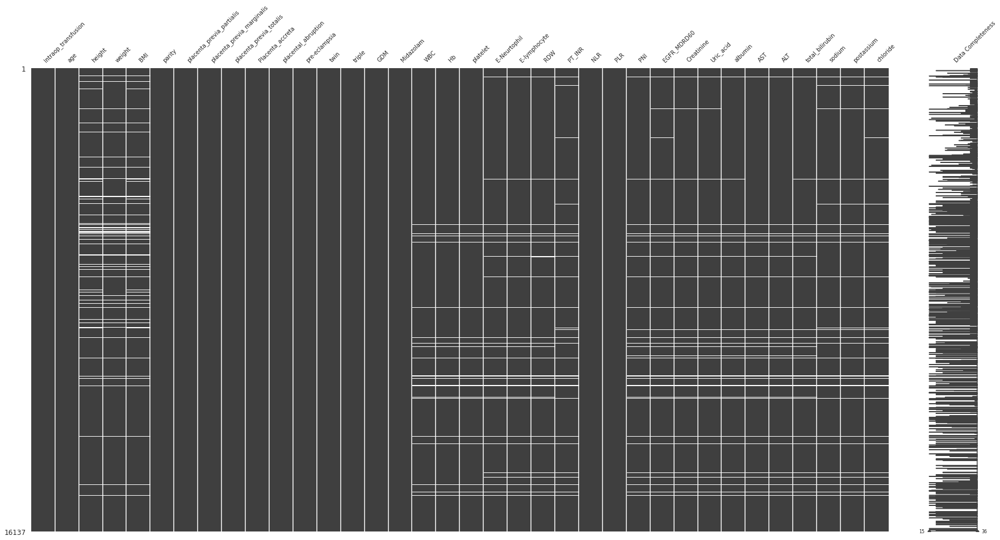

In [ ]:
msno.matrix(df_table, figsize=(30,15),fontsize= 10, labels=True )

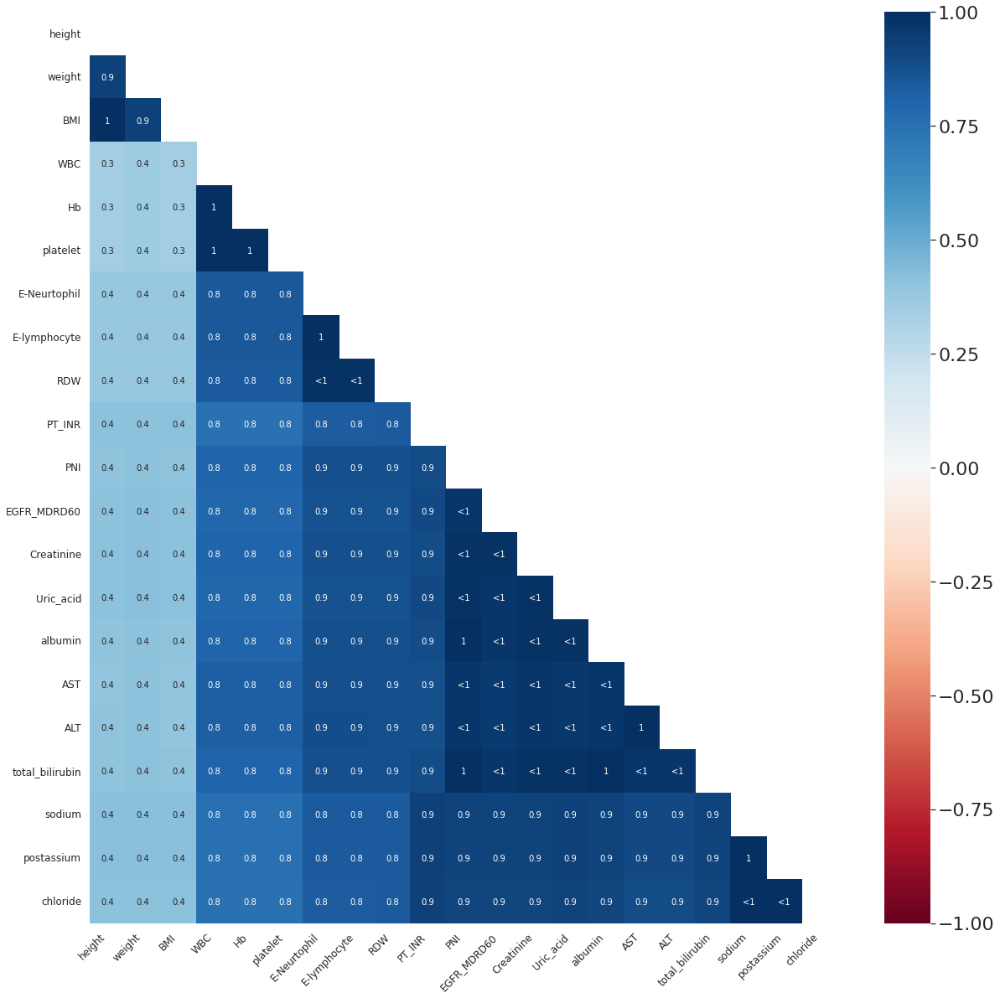

In [ ]:
msno.heatmap(df_table, figsize=(20,20), fontsize=12)

In [4]:
var_list = ['age','height','weight','BMI','regional','general','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','Placenta_percreta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD_60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_list2 = ['age','height','weight','BMI','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_list3 = ['Intraop_transfusion','age','height','weight','BMI','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
X_tf = df_transfusion[var_list2]
X_tf.fillna(df_transfusion.median(), inplace=True)
y_tf = df_transfusion['Intraop_transfusion']
X_train, X_test, y_train, y_test = train_test_split(X_tf, y_tf, test_size=0.20, shuffle=True)
X_train_d, X_val, y_train_d, y_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=True)
feature = X_train.columns
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(X_train,columns=feature)
X_train_scaled = pd.DataFrame(scaler.transform(X_train))
scaler.fit(X_train_d)
X_train_d = pd.DataFrame(X_train_d,columns=feature)
X_train_d_scaled = pd.DataFrame(scaler.transform(X_train_d))
scaler.fit(X_test)
X_test = pd.DataFrame(X_test,columns=feature)
X_test_scaled = pd.DataFrame(scaler.transform(X_test))
scaler.fit(X_val)
X_val = pd.DataFrame(X_val,columns=feature)
X_val_scaled = pd.DataFrame(scaler.transform(X_val))

transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-7-f3c0689fd3db>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_tf.fillna(df_transfusion.median(), inplace=True)
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 6.4 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
 96%|=================== | 2745/2851 [00:12<00:00]       /usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (

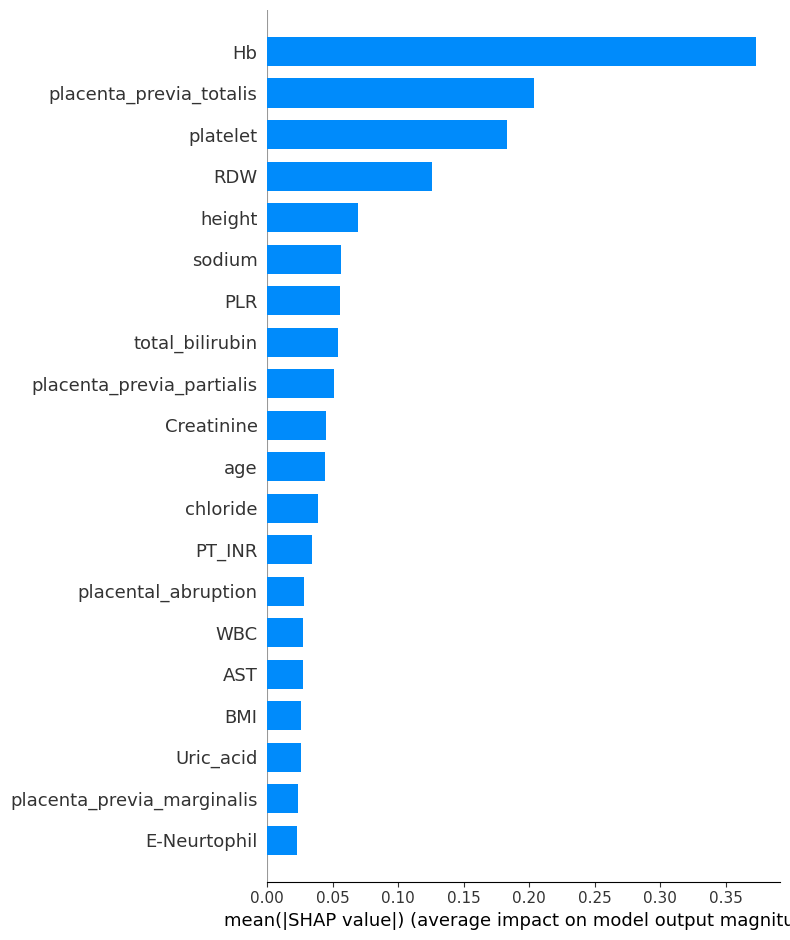

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


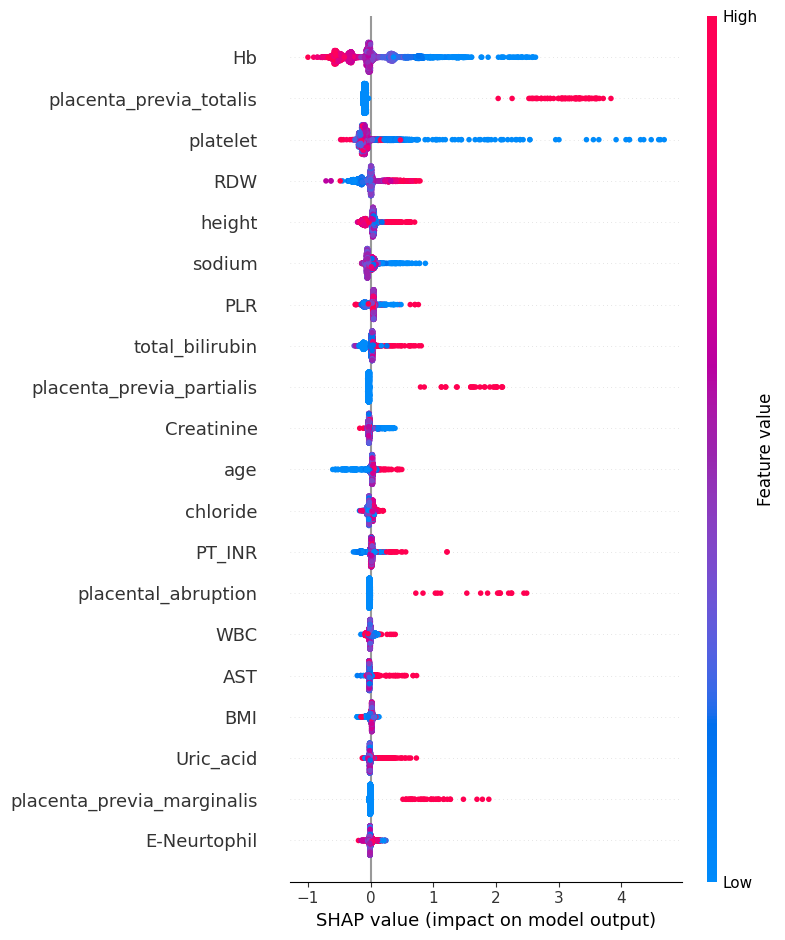

In [9]:
!pip install shap
import shap

# 모델의 SHAP 값을 계산합니다. 이 예제에서는 X_test이 특성 데이터셋임을 가정합니다.
explainer = shap.Explainer(transfusion_xgb, X_test)
shap_values = explainer.shap_values(X_test)

# SHAP 값을 사용하여 beeswarm plot을 그립니다.
shap.summary_plot(shap_values, X_test, plot_type="bar")

# 추가적으로, SHAP beeswarm plot을 그립니다.
shap.summary_plot(shap_values, X_test)

In [ ]:
#X_transfusion = df_transfusion[var_list2]

## Missing Imputation
#X_transfusion.fillna(df_transfusion.median(), inplace=True)
#y_transfusion1 = df_transfusion['Intraop_transfusion']
#y_transfusion2 = df_transfusion['post_transfusion']
#y_transfusion3 = df_transfusion['transfusion']
#feature = X_transfusion.columns
## Train Test Split
#X_train1, X_test1, y_train1, y_test1 = train_test_split(X_transfusion, y_transfusion1, test_size=0.2, stratify=y_transfusion1, shuffle=True)
#X_train2, X_test2, y_train2, y_test2 = train_test_split(X_transfusion, y_transfusion2, test_size=0.2, stratify=y_transfusion2, shuffle=True)
#X_train3, X_test3, y_train3, y_test3 = train_test_split(X_transfusion, y_transfusion3, test_size=0.2, stratify=y_transfusion3, shuffle=True)

#scaler = StandardScaler()
#scaler.fit(X_train1)
#scaler.fit(X_train2)
#scaler.fit(X_train3)
#scaler.fit(X_transfusion)
#X_train1 = pd.DataFrame(X_train1,columns=feature)
#X_train2 = pd.DataFrame(X_train2,columns=feature)
#X_train3 = pd.DataFrame(X_train3,columns=feature)
#X_transfusion = pd.DataFrame(X_transfusion,columns=feature)
#y_transfusion1 = pd.DataFrame(y_transfusion1,columns=['Intraop_transfusion'])
#y_train1 = pd.DataFrame(y_train1,columns=['Intraop_transfusion'])
#y_train2 = pd.DataFrame(y_train2,columns=['post_transfusion'])
#y_train3 = pd.DataFrame(y_train3,columns=['transfusion'])

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusiont1 = df_transfusiont1[var_list2]
X_transfusiont1.fillna(df_transfusiont1.median(), inplace=True)
y_transfusiont1 = df_transfusiont1['Intraop_transfusion']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusiont2 = df_transfusiont2[var_list2]
X_transfusiont2.fillna(df_transfusiont2.median(), inplace=True)
y_transfusiont2 = df_transfusiont2['Intraop_transfusion']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusiont3 = df_transfusiont3[var_list2]
X_transfusiont3.fillna(df_transfusiont3.median(), inplace=True)
y_transfusiont3 = df_transfusiont3['Intraop_transfusion']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusiont4 = df_transfusiont4[var_list2]
X_transfusiont4.fillna(df_transfusiont4.median(), inplace=True)
y_transfusiont4 = df_transfusiont4['Intraop_transfusion']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusion_11 = df_transfusion2[var_list2]
X_transfusion_11.fillna(df_transfusion2.median(), inplace=True)
y_transfusion_11 = df_transfusion2['intraop_transfusion']
#feature = X_transfusion_11.columns
#X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X_transfusion_11, y_transfusion_11, test_size=0.2, stratify=y_transfusion_11, shuffle=True)
#scaler = StandardScaler()
#scaler.fit(X_transfusion_11)
#X_transfusion_11 = pd.DataFrame(X_transfusion_11,columns=feature)
#y_transfusion_11 = pd.DataFrame(y_transfusion_11,columns=['intra_transfusion'])

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusion_12 = df_transfusion3[var_list2]
X_transfusion_12.fillna(df_transfusion3.median(), inplace=True)
y_transfusion_12 = df_transfusion3['intraop_transfusion']
#feature = X_transfusion_12.columns
#X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X_transfusion_12, y_transfusion_12, test_size=0.2, stratify=y_transfusion_12, shuffle=True)
#scaler = StandardScaler()
#scaler.fit(X_transfusion_12)
#X_transfusion_12 = pd.DataFrame(X_transfusion_12,columns=feature)
#y_transfusion_12 = pd.DataFrame(y_transfusion_12,columns=['intra_transfusion'])

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusion_13 = df_transfusion4[var_list2]
X_transfusion_13.fillna(df_transfusion4.median(), inplace=True)
y_transfusion_13 = df_transfusion4['intraop_transfusion']
#feature = X_transfusion_13.columns
#X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X_transfusion_13, y_transfusion_13, test_size=0.2, stratify=y_transfusion_13, shuffle=True)
#scaler = StandardScaler()
#scaler.fit(X_transfusion_13)
#X_transfusion_13 = pd.DataFrame(X_transfusion_13,columns=feature)
#y_transfusion_13 = pd.DataFrame(y_transfusion_13,columns=['intra_transfusion'])

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusion_14 = df_transfusion5[var_list2]
X_transfusion_14.fillna(df_transfusion5.median(), inplace=True)
y_transfusion_14 = df_transfusion5['intraop_transfusion']
#feature = X_transfusion_14.columns
#X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X_transfusion_14, y_transfusion_14, test_size=0.2, stratify=y_transfusion_14, shuffle=True)
#scaler = StandardScaler()
#scaler.fit(X_transfusion_14)
#X_transfusion_14 = pd.DataFrame(X_transfusion_14,columns=feature)
#y_transfusion_14 = pd.DataFrame(y_transfusion_14,columns=['intra_transfusion'])

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
transfusion_rf11 = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
transfusion_rf11.fit(X=X_transfusion_11, y=y_transfusion_11)
transfusion_lr11 = LogisticRegression(C=0.1, penalty='l2')
transfusion_lr11.fit(X=X_transfusion_11, y=y_transfusion_11)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(C=0.1)

In [ ]:
transfusion_rf12 = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
transfusion_rf12.fit(X=X_transfusion_12, y=y_transfusion_12)
transfusion_lr12 = LogisticRegression(C=0.1, penalty='l2')
transfusion_lr12.fit(X=X_transfusion_12, y=y_transfusion_12)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(C=0.1)

In [ ]:
transfusion_rf13 = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
transfusion_rf13.fit(X=X_transfusion_13, y=y_transfusion_13)
transfusion_lr13 = LogisticRegression(C=0.1, penalty='l2')
transfusion_lr13.fit(X=X_transfusion_13, y=y_transfusion_13)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(C=0.1)

In [ ]:
transfusion_rf14 = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
transfusion_rf14.fit(X=X_transfusion_14, y=y_transfusion_14)
transfusion_lr14 = LogisticRegression(C=0.1, penalty='l2')
transfusion_lr14.fit(X=X_transfusion_14, y=y_transfusion_14)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(C=0.1)

In [ ]:
transfusion_xgb11 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
transfusion_xgb11.fit(X=X_transfusion_11, y=y_transfusion_11, verbose=0)

XGBClassifier(learning_rate=0.05, max_depth=4, n_estimators=200)

In [ ]:
transfusion_xgb12 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
transfusion_xgb12.fit(X=X_transfusion_12, y=y_transfusion_12, verbose=0)

XGBClassifier(learning_rate=0.05, max_depth=4, n_estimators=200)

In [ ]:
transfusion_xgb13 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
transfusion_xgb13.fit(X=X_transfusion_13, y=y_transfusion_13, verbose=0)

XGBClassifier(learning_rate=0.05, max_depth=4, n_estimators=200)

In [ ]:
transfusion_xgb14 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
transfusion_xgb14.fit(X=X_transfusion_14, y=y_transfusion_14, verbose=0)

XGBClassifier(learning_rate=0.05, max_depth=4, n_estimators=200)

In [ ]:
#transfusion_model1 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
#transfusion_model2 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
#transfusion_model3 = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
#transfusion_model1.fit(X=X_train1, y=y_train1, verbose=0)
#transfusion_model2.fit(X=X_train2, y=y_train2, verbose=0)
#transfusion_model3.fit(X=X_train3, y=y_train3, verbose=0)

Intra transfusion (AUROC) on 1:1 xgb model : 0.8907202743028975
Intra transfusion (AUROC) on 1:2 xgb model : 0.8721528713940705
Intra transfusion (AUROC) on 1:3 xgb model : 0.8730273482640105
Intra transfusion (AUROC) on 1:4 xgb model : 0.8789888053847705
Intra transfusion (AUROC) on 1:1 lr model : 0.7527445824210022
Intra transfusion (AUROC) on 1:2 lr model : 0.7282754063090573
Intra transfusion (AUROC) on 1:3 lr model : 0.730768955970904
Intra transfusion (AUROC) on 1:4 lr model : 0.7125534144136741
Intra transfusion (AUROC) on 1:1 rf model : 0.8649227326183406
Intra transfusion (AUROC) on 1:2 rf model : 0.85145027089701
Intra transfusion (AUROC) on 1:3 rf model : 0.8487622020015259
Intra transfusion (AUROC) on 1:4 rf model : 0.8510040182206651


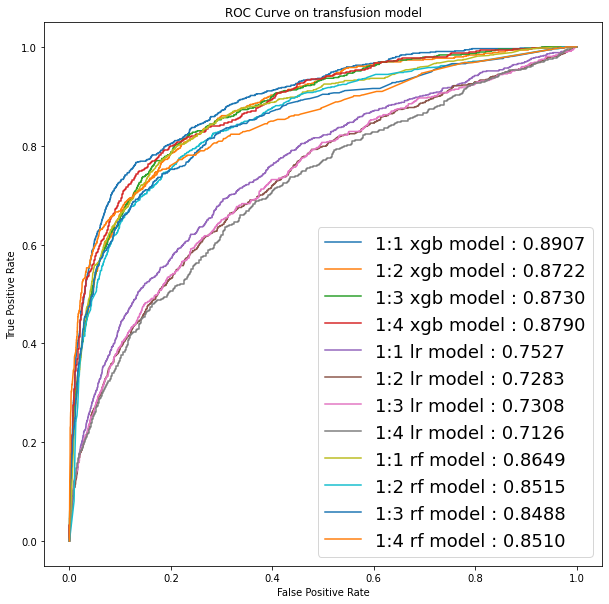

In [ ]:
#from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score


y_test_proba_x11 = transfusion_xgb11.predict_proba(X_transfusiont1)
y_test_proba_x12 = transfusion_xgb12.predict_proba(X_transfusiont2)
y_test_proba_x13 = transfusion_xgb13.predict_proba(X_transfusiont3)
y_test_proba_x14 = transfusion_xgb14.predict_proba(X_transfusiont4)
y_test_proba_l11 = transfusion_lr11.predict_proba(X_transfusiont1)
y_test_proba_l12 = transfusion_lr12.predict_proba(X_transfusiont2)
y_test_proba_l13 = transfusion_lr13.predict_proba(X_transfusiont3)
y_test_proba_l14 = transfusion_lr14.predict_proba(X_transfusiont4)
y_test_proba_r11 = transfusion_rf11.predict_proba(X_transfusiont1)
y_test_proba_r12 = transfusion_rf12.predict_proba(X_transfusiont2)
y_test_proba_r13 = transfusion_rf13.predict_proba(X_transfusiont3)
y_test_proba_r14 = transfusion_rf14.predict_proba(X_transfusiont4)

print("Intra transfusion (AUROC) on 1:1 xgb model : {}".format(roc_auc_score(y_transfusiont1, y_test_proba_x11[:, 1])))
print("Intra transfusion (AUROC) on 1:2 xgb model : {}".format(roc_auc_score(y_transfusiont2, y_test_proba_x12[:, 1])))
print("Intra transfusion (AUROC) on 1:3 xgb model : {}".format(roc_auc_score(y_transfusiont3, y_test_proba_x13[:, 1])))
print("Intra transfusion (AUROC) on 1:4 xgb model : {}".format(roc_auc_score(y_transfusiont4, y_test_proba_x14[:, 1])))
print("Intra transfusion (AUROC) on 1:1 lr model : {}".format(roc_auc_score(y_transfusiont1, y_test_proba_l11[:, 1])))
print("Intra transfusion (AUROC) on 1:2 lr model : {}".format(roc_auc_score(y_transfusiont2, y_test_proba_l12[:, 1])))
print("Intra transfusion (AUROC) on 1:3 lr model : {}".format(roc_auc_score(y_transfusiont3, y_test_proba_l13[:, 1])))
print("Intra transfusion (AUROC) on 1:4 lr model : {}".format(roc_auc_score(y_transfusiont4, y_test_proba_l14[:, 1])))
print("Intra transfusion (AUROC) on 1:1 rf model : {}".format(roc_auc_score(y_transfusiont1, y_test_proba_r11[:, 1])))
print("Intra transfusion (AUROC) on 1:2 rf model : {}".format(roc_auc_score(y_transfusiont2, y_test_proba_r12[:, 1])))
print("Intra transfusion (AUROC) on 1:3 rf model : {}".format(roc_auc_score(y_transfusiont3, y_test_proba_r13[:, 1])))
print("Intra transfusion (AUROC) on 1:4 rf model : {}".format(roc_auc_score(y_transfusiont4, y_test_proba_r14[:, 1])))

fprx11, tprx11, _ = roc_curve(y_transfusiont1, y_test_proba_x11[:, 1], pos_label=transfusion_xgb11.classes_[1])
fprx12, tprx12, _ = roc_curve(y_transfusiont2, y_test_proba_x12[:, 1], pos_label=transfusion_xgb12.classes_[1])
fprx13, tprx13, _ = roc_curve(y_transfusiont3, y_test_proba_x13[:, 1], pos_label=transfusion_xgb13.classes_[1])
fprx14, tprx14, _ = roc_curve(y_transfusiont4, y_test_proba_x14[:, 1], pos_label=transfusion_xgb14.classes_[1])
fprl11, tprl11, _ = roc_curve(y_transfusiont1, y_test_proba_l11[:, 1], pos_label=transfusion_lr11.classes_[1])
fprl12, tprl12, _ = roc_curve(y_transfusiont2, y_test_proba_l12[:, 1], pos_label=transfusion_lr12.classes_[1])
fprl13, tprl13, _ = roc_curve(y_transfusiont3, y_test_proba_l13[:, 1], pos_label=transfusion_lr13.classes_[1])
fprl14, tprl14, _ = roc_curve(y_transfusiont4, y_test_proba_l14[:, 1], pos_label=transfusion_lr14.classes_[1])
fprr11, tprr11, _ = roc_curve(y_transfusiont1, y_test_proba_r11[:, 1], pos_label=transfusion_rf11.classes_[1])
fprr12, tprr12, _ = roc_curve(y_transfusiont2, y_test_proba_r12[:, 1], pos_label=transfusion_rf12.classes_[1])
fprr13, tprr13, _ = roc_curve(y_transfusiont3, y_test_proba_r13[:, 1], pos_label=transfusion_rf13.classes_[1])
fprr14, tprr14, _ = roc_curve(y_transfusiont4, y_test_proba_r14[:, 1], pos_label=transfusion_rf14.classes_[1])

#plot_roc_curve(estimator=model, X=fpr, y=tpr)
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on transfusion model')

plt.plot(fprx11, tprx11,label='1:1 xgb model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_x11[:, 1])))
plt.plot(fprx12, tprx12,label='1:2 xgb model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_x12[:, 1])))
plt.plot(fprx13, tprx13,label='1:3 xgb model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_x13[:, 1])))
plt.plot(fprx14, tprx14,label='1:4 xgb model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_x14[:, 1])))
plt.plot(fprl11, tprl11,label='1:1 lr model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_l11[:, 1])))
plt.plot(fprl12, tprl12,label='1:2 lr model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_l12[:, 1])))
plt.plot(fprl13, tprl13,label='1:3 lr model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_l13[:, 1])))
plt.plot(fprl14, tprl14,label='1:4 lr model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_l14[:, 1])))
plt.plot(fprr11, tprr11,label='1:1 rf model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_r11[:, 1])))
plt.plot(fprr12, tprr12,label='1:2 rf model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_r12[:, 1])))
plt.plot(fprr13, tprr13,label='1:3 rf model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_r13[:, 1])))
plt.plot(fprr14, tprr14,label='1:4 rf model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_r14[:, 1])))

plt.legend(fontsize=18)
plt.show()

Intra transfusion on 1:1 xgb model: 0.5249154213946591
Intra transfusion on 1:2 xgb model: 0.47380196687717396
Intra transfusion on 1:3 xgb model: 0.45968203697841314
Intra transfusion on 1:4 xgb model: 0.5138068525089763
Intra transfusion on 1:1 lr model: 0.24707013630653987
Intra transfusion on 1:2 lr model: 0.23004341277711815
Intra transfusion on 1:3 lr model: 0.23126723128223406
Intra transfusion on 1:4 lr model: 0.22664609004373615
Intra transfusion on 1:1 rf model: 0.43650223263006294
Intra transfusion on 1:2 rf model: 0.3794932257660027
Intra transfusion on 1:3 rf model: 0.45161999964538907
Intra transfusion on 1:4 rf model: 0.5546551060921221


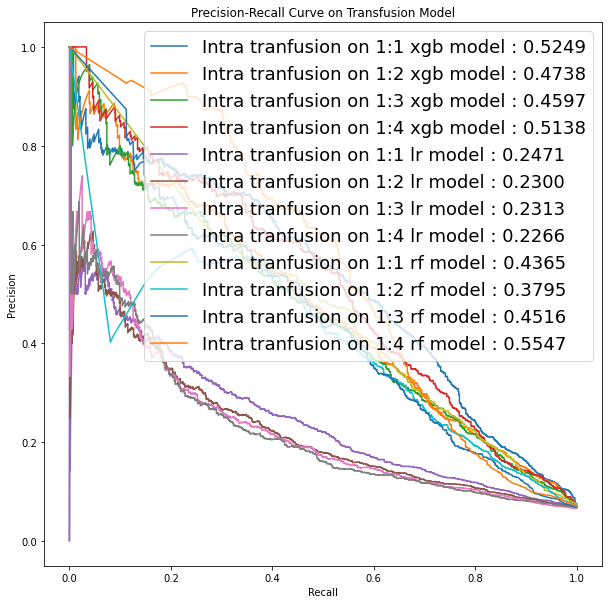

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

print("Intra transfusion on 1:1 xgb model: {}".format(average_precision_score(y_transfusiont1, y_test_proba_x11[:, 1])))
print("Intra transfusion on 1:2 xgb model: {}".format(average_precision_score(y_transfusiont2, y_test_proba_x12[:, 1])))
print("Intra transfusion on 1:3 xgb model: {}".format(average_precision_score(y_transfusiont3, y_test_proba_x13[:, 1])))
print("Intra transfusion on 1:4 xgb model: {}".format(average_precision_score(y_transfusiont4, y_test_proba_x14[:, 1])))
print("Intra transfusion on 1:1 lr model: {}".format(average_precision_score(y_transfusiont1, y_test_proba_l11[:, 1])))
print("Intra transfusion on 1:2 lr model: {}".format(average_precision_score(y_transfusiont2, y_test_proba_l12[:, 1])))
print("Intra transfusion on 1:3 lr model: {}".format(average_precision_score(y_transfusiont3, y_test_proba_l13[:, 1])))
print("Intra transfusion on 1:4 lr model: {}".format(average_precision_score(y_transfusiont4, y_test_proba_l14[:, 1])))
print("Intra transfusion on 1:1 rf model: {}".format(average_precision_score(y_transfusiont1, y_test_proba_r11[:, 1])))
print("Intra transfusion on 1:2 rf model: {}".format(average_precision_score(y_transfusiont2, y_test_proba_r12[:, 1])))
print("Intra transfusion on 1:3 rf model: {}".format(average_precision_score(y_transfusiont3, y_test_proba_r13[:, 1])))
print("Intra transfusion on 1:4 rf model: {}".format(average_precision_score(y_transfusiont4, y_test_proba_r14[:, 1])))

precx11, recallx11, _ = precision_recall_curve(y_transfusiont1, y_test_proba_x11[:, 1], pos_label=transfusion_xgb11.classes_[1])
precx12, recallx12, _ = precision_recall_curve(y_transfusiont2, y_test_proba_x12[:, 1], pos_label=transfusion_xgb12.classes_[1])
precx13, recallx13, _ = precision_recall_curve(y_transfusiont3, y_test_proba_x13[:, 1], pos_label=transfusion_xgb13.classes_[1])
precx14, recallx14, _ = precision_recall_curve(y_transfusiont4, y_test_proba_x14[:, 1], pos_label=transfusion_xgb14.classes_[1])
precl11, recalll11, _ = precision_recall_curve(y_transfusiont1, y_test_proba_l11[:, 1], pos_label=transfusion_lr11.classes_[1])
precl12, recalll12, _ = precision_recall_curve(y_transfusiont2, y_test_proba_l12[:, 1], pos_label=transfusion_lr12.classes_[1])
precl13, recalll13, _ = precision_recall_curve(y_transfusiont3, y_test_proba_l13[:, 1], pos_label=transfusion_lr13.classes_[1])
precl14, recalll14, _ = precision_recall_curve(y_transfusiont4, y_test_proba_l14[:, 1], pos_label=transfusion_lr14.classes_[1])
precr11, recallr11, _ = precision_recall_curve(y_transfusiont1, y_test_proba_r11[:, 1], pos_label=transfusion_rf11.classes_[1])
precr12, recallr12, _ = precision_recall_curve(y_transfusiont2, y_test_proba_r12[:, 1], pos_label=transfusion_rf12.classes_[1])
precr13, recallr13, _ = precision_recall_curve(y_transfusiont3, y_test_proba_r13[:, 1], pos_label=transfusion_rf13.classes_[1])
precr14, recallr14, _ = precision_recall_curve(y_transfusiont4, y_test_proba_r14[:, 1], pos_label=transfusion_rf14.classes_[1])

#PrecisionRecallDisplay(precision=prec, recall=recall).plot()
plt.figure(figsize=(10,10))
plt.plot(recallx11, precx11,label='Intra tranfusion on 1:1 xgb model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_x11[:, 1])))
plt.plot(recallx12, precx12,label='Intra tranfusion on 1:2 xgb model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_x12[:, 1])))
plt.plot(recallx13, precx13,label='Intra tranfusion on 1:3 xgb model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_x13[:, 1])))
plt.plot(recallx14, precx14,label='Intra tranfusion on 1:4 xgb model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_x14[:, 1])))
plt.plot(recalll11, precl11,label='Intra tranfusion on 1:1 lr model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_l11[:, 1])))
plt.plot(recalll12, precl12,label='Intra tranfusion on 1:2 lr model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_l12[:, 1])))
plt.plot(recalll13, precl13,label='Intra tranfusion on 1:3 lr model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_l13[:, 1])))
plt.plot(recalll14, precl14,label='Intra tranfusion on 1:4 lr model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_l14[:, 1])))
plt.plot(recallr11, precr11,label='Intra tranfusion on 1:1 rf model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_r11[:, 1])))
plt.plot(recallr12, precr12,label='Intra tranfusion on 1:2 rf model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_r12[:, 1])))
plt.plot(recallr13, precr13,label='Intra tranfusion on 1:3 rf model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_r13[:, 1])))
plt.plot(recallr14, precr14,label='Intra tranfusion on 1:4 rf model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_r14[:, 1])))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve on Transfusion Model')
plt.legend(fontsize=18)
plt.show()

<Figure size 1152x1152 with 0 Axes>

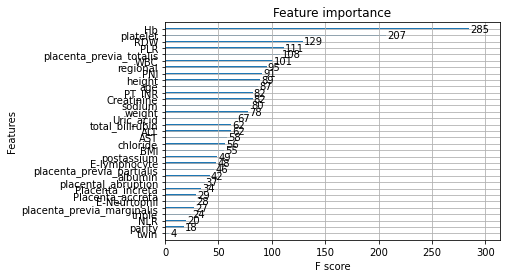

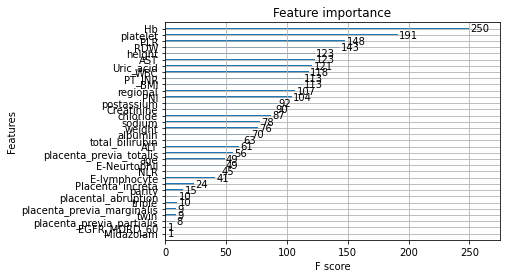

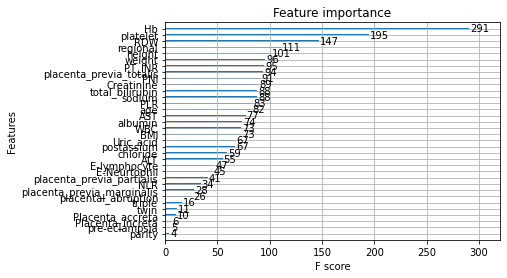

In [ ]:
from xgboost import plot_importance
plt.figure(figsize=(16, 16))
plot_importance(transfusion_model1, )
plot_importance(transfusion_model2, )
plot_importance(transfusion_model3, )

Text(0.5, 1.0, 'Feature Importance')

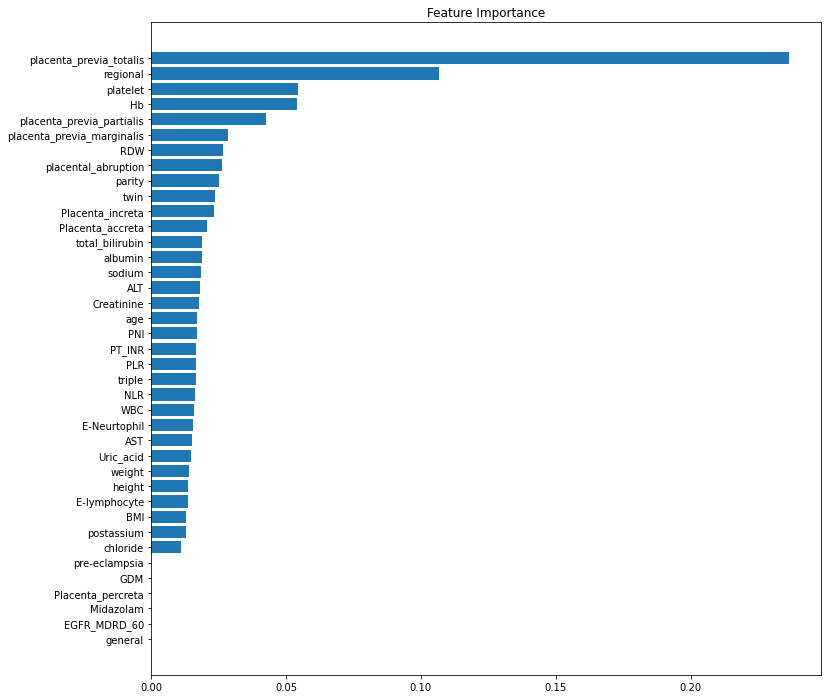

In [ ]:
feature_importance = transfusion_model1.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 12))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test3.columns)[sorted_idx])
plt.title('Feature Importance')

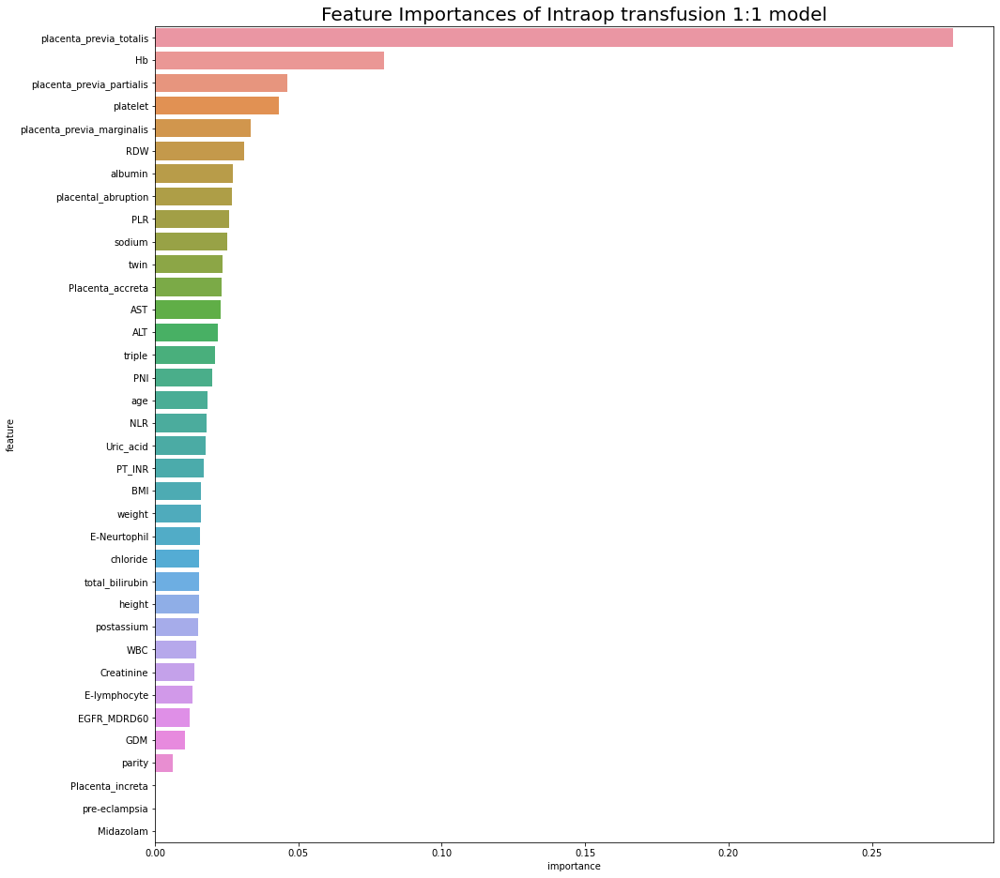

In [ ]:
tmp = pd.DataFrame(transfusion_xgb11.feature_importances_, X_transfusiont1.columns, columns=['importance'])
tmp.index = tmp.index.set_names(['feature'])
tmp = tmp.reset_index()

plt.figure(figsize=(16, 16))
sns.barplot(data=tmp.sort_values(by='importance', ascending=False), x='importance', y='feature', )
plt.title('Feature Importances of Intraop transfusion 1:1 model',fontsize=20)
plt.show()

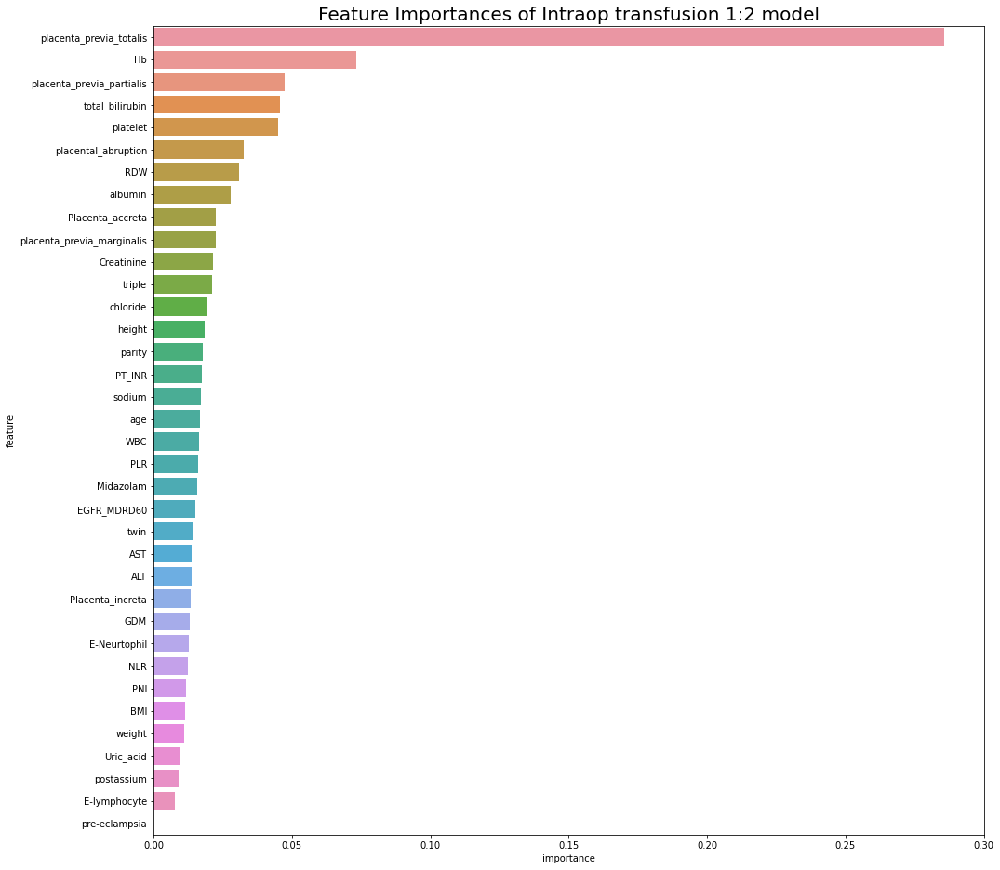

In [ ]:
tmp = pd.DataFrame(transfusion_xgb12.feature_importances_, X_transfusiont2.columns, columns=['importance'])
tmp.index = tmp.index.set_names(['feature'])
tmp = tmp.reset_index()

plt.figure(figsize=(16, 16))
sns.barplot(data=tmp.sort_values(by='importance', ascending=False), x='importance', y='feature', )
plt.title('Feature Importances of Intraop transfusion 1:2 model',fontsize=20)
plt.show()

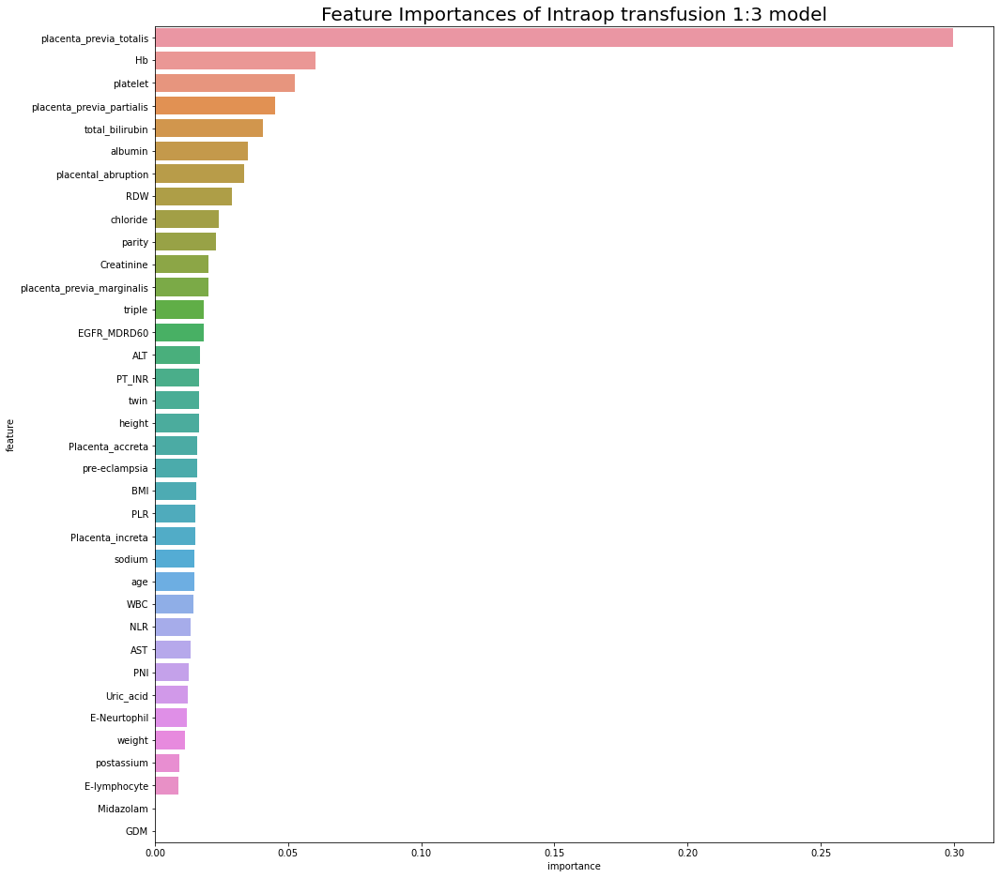

In [ ]:
tmp = pd.DataFrame(transfusion_xgb13.feature_importances_, X_transfusiont3.columns, columns=['importance'])
tmp.index = tmp.index.set_names(['feature'])
tmp = tmp.reset_index()

plt.figure(figsize=(16, 16))
sns.barplot(data=tmp.sort_values(by='importance', ascending=False), x='importance', y='feature', )
plt.title('Feature Importances of Intraop transfusion 1:3 model',fontsize=20)
plt.show()

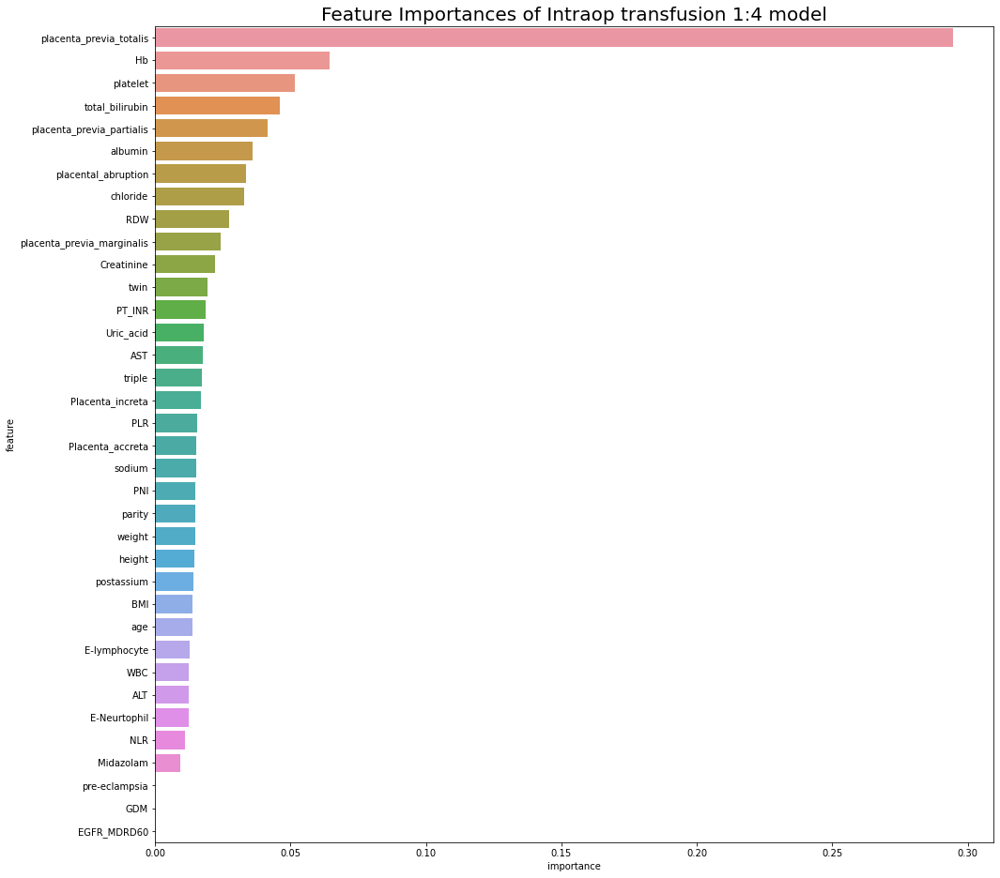

In [ ]:
tmp = pd.DataFrame(transfusion_xgb14.feature_importances_, X_transfusiont4.columns, columns=['importance'])
tmp.index = tmp.index.set_names(['feature'])
tmp = tmp.reset_index()

plt.figure(figsize=(16, 16))
sns.barplot(data=tmp.sort_values(by='importance', ascending=False), x='importance', y='feature', )
plt.title('Feature Importances of Intraop transfusion 1:4 model',fontsize=20)
plt.show()

Text(0.5, 1.0, 'Feature Importance')

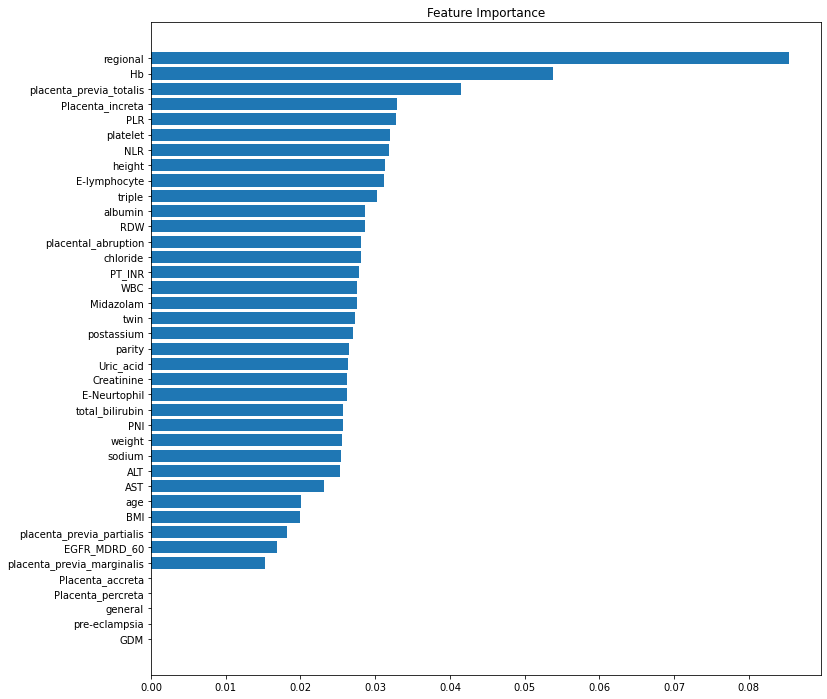

In [ ]:
feature_importance = transfusion_model2.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 12))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test3.columns)[sorted_idx])
plt.title('Feature Importance')

Text(0.5, 1.0, 'Feature Importance')

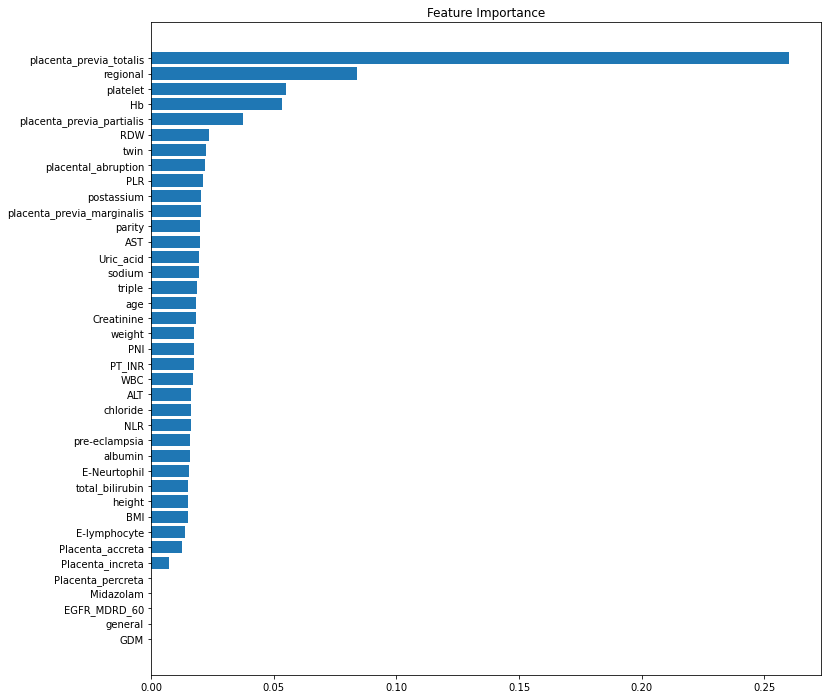

In [ ]:
feature_importance = transfusion_model3.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 12))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test3.columns)[sorted_idx])
plt.title('Feature Importance')

# **DNN**

In [ ]:
def my_model(hidden_layer_num, node_size, batch_normalization, drop_out, drop_out_rate, learning_rate):

    ### clear memory
    if K.backend() == 'tensorflow':
        K.clear_session()

    model = keras.Sequential()

    ### Input Layer
    model.add(keras.layers.InputLayer(input_shape=(36,)))

    ### Hidden Layer
    for i in range(hidden_layer_num):
        model.add(keras.layers.Dense(node_size))
        if batch_normalization: model.add(keras.layers.BatchNormalization())
        model.add(keras.layers.ReLU())
        if drop_out: model.add(keras.layers.Dropout(drop_out_rate))

    ### Output Layer
    model.add(keras.layers.Dense(1, activation='sigmoid'))

    ### Compile
    model.compile(optimizer= keras.optimizers.Adam(learning_rate),
                  loss='binary_crossentropy',
                  metrics=["accuracy"])

    return model

In [ ]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_auroc', mode='max', verbose=1, patience=10, restore_best_weights=True)

In [ ]:
seed=1024
# Defining hyperparameters
default_hp= {
  'HP_BATCH_SIZE': 512,
  'HP_DROPOUT': 0.5,
  'HP_LR': 0.005,
  'HP_MAX_EPOCHS': 50,
  'HP_NODES': 1024,
  'HP_HIDDEN_LAYERS': 5
} # Max Epoch: 50

xgb_hp = {
    'booster': 'gbtree',
     'gamma': 0,
     'learning_rate': 0.05,
     'max_depth': 4,
     'min_child_weight': 1,
     'n_estimators': 200,
     'objective': 'binary:logistic'
}

svc_hp = {
    'C': 0.1,
    'gamma': 0.01,
    'kernel': 'rbf'
}

rf_hp = {'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 4}

lr_hp = {'C': 0.1, 'penalty': 'l2'}

       # 한번의 bootstrap에 전체 데이터의 몇 %를 활용할지를 결정
seed = np.random.randint(1024)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df1=df_transfusion[df_transfusion['Intraop_transfusion']==1]
df2=df_transfusion[df_transfusion['Intraop_transfusion']==0]
rate=len(df_transfusion[df_transfusion['Intraop_transfusion']==1])/len(df_transfusion[df_transfusion['Intraop_transfusion']==0])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# **Model performation by feature selection**

In [ ]:
var_list = ['age','height','weight','BMI','regional','general','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','Placenta_percreta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD_60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_list2 = ['age','height','weight','BMI','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM','Midazolam','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_dc=['age','height','weight','BMI','parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM']
var_demo=['age','height','weight','BMI']
var_ph=['parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM']
var_lab=['WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_dl=['age','height','weight','BMI','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']
var_cl=['parity','placenta_previa_partialis','placenta_previa_marginalis','placenta_previa_totalis','Placenta_accreta','Placenta_increta','placental_abruption','pre-eclampsia','twin','triple','GDM','WBC','Hb','platelet','E-Neurtophil','E-lymphocyte','RDW','PT_INR','NLR','PLR','PNI','EGFR_MDRD60','Creatinine','Uric_acid','albumin','AST','ALT','total_bilirubin','sodium','postassium','chloride']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
bootstraps = 50
datapoints= 1000
lins = np.round(np.linspace(0,1,datapoints),2)
fprnrec = np.linspace(0,1,1000)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
auroc_tableph = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablelab = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabledc = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabledemo = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabledl = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablecl = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabletotal = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tableph = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablelab = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabledc = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabledemo = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabledl = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablecl = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabletotal = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))

roc_graphsph = pd.DataFrame([], columns=(fprnrec))
roc_graphslab = pd.DataFrame([], columns=(fprnrec))
roc_graphsdc = pd.DataFrame([], columns=(fprnrec))
roc_graphsdemo = pd.DataFrame([], columns=(fprnrec))
roc_graphsdl = pd.DataFrame([], columns=(fprnrec))
roc_graphscl = pd.DataFrame([], columns=(fprnrec))
roc_graphstotal = pd.DataFrame([], columns=(fprnrec))
prc_graphsph = pd.DataFrame([], columns=(fprnrec))
prc_graphslab = pd.DataFrame([], columns=(fprnrec))
prc_graphsdc = pd.DataFrame([], columns=(fprnrec))
prc_graphsdemo = pd.DataFrame([], columns=(fprnrec))
prc_graphsdl = pd.DataFrame([], columns=(fprnrec))
prc_graphscl = pd.DataFrame([], columns=(fprnrec))
prc_graphstotal = pd.DataFrame([], columns=(fprnrec))

bootstrap_ratio = 0.6
scaler = StandardScaler()

for i in tqdm(range(bootstraps)):
    X_tfph = df_transfusion[var_ph]
    X_tfph.fillna(df_transfusion.median(), inplace=True)
    y_tf = df_transfusion['Intraop_transfusion']
    _,X_remainph, _, y_remainph = train_test_split(X_tfph, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_ph, X_test_ph, y_train_ph, y_test_ph = train_test_split(X_remainph, y_remainph, test_size=0.20, shuffle=True)
    X_tflab = df_transfusion[var_lab]
    X_tflab.fillna(df_transfusion.median(), inplace=True)
    _,X_remainlab, _, y_remainlab = train_test_split(X_tflab, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_lab, X_test_lab, y_train_lab, y_test_lab = train_test_split(X_remainlab, y_remainlab, test_size=0.20, shuffle=True)
    X_tfdemo = df_transfusion[var_demo]
    X_tfdemo.fillna(df_transfusion.median(), inplace=True)
    _,X_remaindemo, _, y_remaindemo = train_test_split(X_tfdemo, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_demo, X_test_demo, y_train_demo, y_test_demo = train_test_split(X_remaindemo, y_remaindemo, test_size=0.20, shuffle=True)
    X_tfdc = df_transfusion[var_dc]
    X_tfdc.fillna(df_transfusion.median(), inplace=True)
    _,X_remaindc, _, y_remaindc = train_test_split(X_tfdc, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_dc, X_test_dc, y_train_dc, y_test_dc = train_test_split(X_remaindc, y_remaindc, test_size=0.20, shuffle=True)
    X_tfdl = df_transfusion[var_dl]
    X_tfdl.fillna(df_transfusion.median(), inplace=True)
    _,X_remaindl, _, y_remaindl = train_test_split(X_tfdl, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_dl, X_test_dl, y_train_dl, y_test_dl = train_test_split(X_remaindl, y_remaindl, test_size=0.20, shuffle=True)
    X_tfcl = df_transfusion[var_cl]
    X_tfcl.fillna(df_transfusion.median(), inplace=True)
    _,X_remaincl, _, y_remaincl = train_test_split(X_tfcl, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_cl, X_test_cl, y_train_cl, y_test_cl = train_test_split(X_remaincl, y_remaincl, test_size=0.20, shuffle=True)
    X_tftotal = df_transfusion[var_list2]
    X_tftotal.fillna(df_transfusion.median(), inplace=True)
    _,X_remaintotal, _, y_remaintotal = train_test_split(X_tftotal, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train_total, X_test_total, y_train_total, y_test_total = train_test_split(X_remaintotal, y_remaintotal, test_size=0.20, shuffle=True)

    feature = X_train_ph.columns
    scaler.fit(X_train_ph)
    X_train_ph = pd.DataFrame(X_train_ph,columns=feature)
    X_train_ph_scaled = pd.DataFrame(scaler.transform(X_train_ph))
    scaler.fit(X_test_ph)
    X_test_ph = pd.DataFrame(X_test_ph,columns=feature)
    X_test_ph_scaled = pd.DataFrame(scaler.transform(X_test_ph))

    feature = X_train_lab.columns
    scaler.fit(X_train_lab)
    X_train_lab = pd.DataFrame(X_train_lab,columns=feature)
    X_train_lab_scaled = pd.DataFrame(scaler.transform(X_train_lab))
    scaler.fit(X_test_lab)
    X_test_lab = pd.DataFrame(X_test_lab,columns=feature)
    X_test_lab_scaled = pd.DataFrame(scaler.transform(X_test_lab))

    feature = X_train_demo.columns
    scaler.fit(X_train_demo)
    X_train_demo = pd.DataFrame(X_train_demo,columns=feature)
    X_train_demo_scaled = pd.DataFrame(scaler.transform(X_train_demo))
    scaler.fit(X_test_demo)
    X_test_demo = pd.DataFrame(X_test_demo,columns=feature)
    X_test_demo_scaled = pd.DataFrame(scaler.transform(X_test_demo))

    feature = X_train_dc.columns
    scaler.fit(X_train_dc)
    X_train_dc = pd.DataFrame(X_train_dc,columns=feature)
    X_train_dc_scaled = pd.DataFrame(scaler.transform(X_train_dc))
    scaler.fit(X_test_dc)
    X_test_dc = pd.DataFrame(X_test_dc,columns=feature)
    X_test_dc_scaled = pd.DataFrame(scaler.transform(X_test_dc))

    feature = X_train_dl.columns
    scaler.fit(X_train_dl)
    X_train_dl = pd.DataFrame(X_train_dl,columns=feature)
    X_train_dl_scaled = pd.DataFrame(scaler.transform(X_train_dl))
    scaler.fit(X_test_dl)
    X_test_dl = pd.DataFrame(X_test_dl,columns=feature)
    X_test_dl_scaled = pd.DataFrame(scaler.transform(X_test_dl))

    feature = X_train_cl.columns
    scaler.fit(X_train_cl)
    X_train_cl = pd.DataFrame(X_train_cl,columns=feature)
    X_train_cl_scaled = pd.DataFrame(scaler.transform(X_train_cl))
    scaler.fit(X_test_cl)
    X_test_cl = pd.DataFrame(X_test_cl,columns=feature)
    X_test_cl_scaled = pd.DataFrame(scaler.transform(X_test_cl))

    feature = X_train_total.columns
    scaler.fit(X_train_total)
    X_train_total = pd.DataFrame(X_train_total,columns=feature)
    X_train_total_scaled = pd.DataFrame(scaler.transform(X_train_total))
    scaler.fit(X_test_total)
    X_test_total = pd.DataFrame(X_test_total,columns=feature)
    X_test_total_scaled = pd.DataFrame(scaler.transform(X_test_total))

    transfusion_xgb_ph = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_ph.fit(X=X_train_ph, y=y_train_ph, verbose=0)
    transfusion_xgb_lab = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_lab.fit(X=X_train_lab, y=y_train_lab, verbose=0)
    transfusion_xgb_demo = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_demo.fit(X=X_train_demo, y=y_train_demo, verbose=0)
    transfusion_xgb_dc = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_dc.fit(X=X_train_dc, y=y_train_dc, verbose=0)
    transfusion_xgb_dl = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_dl.fit(X=X_train_dl, y=y_train_dl, verbose=0)
    transfusion_xgb_cl = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_cl.fit(X=X_train_cl, y=y_train_cl, verbose=0)
    transfusion_xgb_total = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb_total.fit(X=X_train_total, y=y_train_total, verbose=0)

    y_test_proba_ph = transfusion_xgb_ph.predict_proba(X_test_ph)
    y_test_proba_lab = transfusion_xgb_lab.predict_proba(X_test_lab)
    y_test_proba_demo = transfusion_xgb_demo.predict_proba(X_test_demo)
    y_test_proba_dc = transfusion_xgb_dc.predict_proba(X_test_dc)
    y_test_proba_dl = transfusion_xgb_dl.predict_proba(X_test_dl)
    y_test_proba_cl = transfusion_xgb_cl.predict_proba(X_test_cl)
    y_test_proba_total = transfusion_xgb_total.predict_proba(X_test_total)

    fpr_ph, tpr_ph, _ = roc_curve(y_test_ph, y_test_proba_ph[:, 1], pos_label=transfusion_xgb_ph.classes_[1])
    fpr_lab, tpr_lab, _ = roc_curve(y_test_lab, y_test_proba_lab[:, 1], pos_label=transfusion_xgb_lab.classes_[1])
    fpr_demo, tpr_demo, _ = roc_curve(y_test_demo, y_test_proba_demo[:, 1], pos_label=transfusion_xgb_demo.classes_[1])
    fpr_dc, tpr_dc, _ = roc_curve(y_test_dc, y_test_proba_dc[:, 1], pos_label=transfusion_xgb_dc.classes_[1])
    fpr_dl, tpr_dl, _ = roc_curve(y_test_dl, y_test_proba_dl[:, 1], pos_label=transfusion_xgb_dl.classes_[1])
    fpr_cl, tpr_cl, _ = roc_curve(y_test_cl, y_test_proba_cl[:, 1], pos_label=transfusion_xgb_cl.classes_[1])
    fpr_total, tpr_total, _ = roc_curve(y_test_total, y_test_proba_total[:, 1], pos_label=transfusion_xgb_total.classes_[1])
    prec_ph, recall_ph, _ = precision_recall_curve(y_test_ph, y_test_proba_ph[:, 1], pos_label=transfusion_xgb_ph.classes_[1])
    prec_lab, recall_lab, _ = precision_recall_curve(y_test_lab, y_test_proba_lab[:, 1], pos_label=transfusion_xgb_lab.classes_[1])
    prec_demo, recall_demo, _ = precision_recall_curve(y_test_demo, y_test_proba_demo[:, 1], pos_label=transfusion_xgb_demo.classes_[1])
    prec_dc, recall_dc, _ = precision_recall_curve(y_test_dc, y_test_proba_dc[:, 1], pos_label=transfusion_xgb_dc.classes_[1])
    prec_dl, recall_dl, _ = precision_recall_curve(y_test_dl, y_test_proba_dl[:, 1], pos_label=transfusion_xgb_dl.classes_[1])
    prec_cl, recall_cl, _ = precision_recall_curve(y_test_cl, y_test_proba_cl[:, 1], pos_label=transfusion_xgb_cl.classes_[1])
    prec_total, recall_total, _ = precision_recall_curve(y_test_total, y_test_proba_total[:, 1], pos_label=transfusion_xgb_total.classes_[1])

    auroc_tableph.loc[ 'PH_xgb_model' , i+1] = roc_auc_score(y_test_ph, y_test_proba_ph[:, 1])
    auroc_tablelab.loc[ 'LAB_xgb_model' , i+1] = roc_auc_score(y_test_lab, y_test_proba_lab[:, 1])
    auroc_tabledemo.loc[ 'DEMO_xgb_model' , i+1] = roc_auc_score(y_test_demo, y_test_proba_demo[:, 1])
    auroc_tabledc.loc[ 'DC_xgb_model' , i+1] = roc_auc_score(y_test_dc, y_test_proba_dc[:, 1])
    auroc_tabledl.loc[ 'DL_xgb_model' , i+1] = roc_auc_score(y_test_dl, y_test_proba_dl[:, 1])
    auroc_tablecl.loc[ 'CL_xgb_model' , i+1] = roc_auc_score(y_test_cl, y_test_proba_cl[:, 1])
    auroc_tabletotal.loc[ 'TOTAL_xgb_model' , i+1] = roc_auc_score(y_test_total, y_test_proba_total[:, 1])
    auprc_tableph.loc[ 'PH_xgb_model' , i+1] = average_precision_score(y_test_ph, y_test_proba_ph[:, 1])
    auprc_tablelab.loc[ 'LAB_xgb_model' , i+1] = average_precision_score(y_test_lab, y_test_proba_lab[:, 1])
    auprc_tabledemo.loc[ 'DEMO_xgb_model' , i+1] = average_precision_score(y_test_demo, y_test_proba_demo[:, 1])
    auprc_tabledc.loc[ 'DC_xgb_model' , i+1] = average_precision_score(y_test_dc, y_test_proba_dc[:, 1])
    auprc_tabledl.loc[ 'DL_xgb_model' , i+1] = average_precision_score(y_test_dl, y_test_proba_dl[:, 1])
    auprc_tablecl.loc[ 'CL_xgb_model' , i+1] = average_precision_score(y_test_cl, y_test_proba_cl[:, 1])
    auprc_tabletotal.loc[ 'TOTAL_xgb_model' , i+1] = average_precision_score(y_test_total, y_test_proba_total[:, 1])

    roc_graphsph.loc[f'PH_xgb_model_{i}',:] = np.interp(fprnrec, fpr_ph, tpr_ph)
    roc_graphslab.loc[f'LAB_xgb_model_{i}',:] = np.interp(fprnrec, fpr_lab, tpr_lab)
    roc_graphsdemo.loc[f'DEMO_xgb_model_{i}',:] = np.interp(fprnrec, fpr_demo, tpr_demo)
    roc_graphsdc.loc[f'DC_xgb_model_{i}',:] = np.interp(fprnrec, fpr_dc, tpr_dc)
    roc_graphsdl.loc[f'DL_xgb_model_{i}',:] = np.interp(fprnrec, fpr_dl, tpr_dl)
    roc_graphscl.loc[f'CL_xgb_model_{i}',:] = np.interp(fprnrec, fpr_cl, tpr_cl)
    roc_graphstotal.loc[f'TOTAL_xgb_model_{i}',:] = np.interp(fprnrec, fpr_total, tpr_total)
    prc_graphsph.loc[f'PH_xgb_model_{i}',:] = np.interp(fprnrec, prec_ph,recall_ph)
    prc_graphslab.loc[f'LAB_xgb_model_{i}',:] = np.interp(fprnrec, prec_lab,recall_lab)
    prc_graphsdemo.loc[f'DEMO_xgb_model_{i}',:] = np.interp(fprnrec, prec_demo,recall_demo)
    prc_graphsdc.loc[f'DC_xgb_model_{i}',:] = np.interp(fprnrec, prec_dc,recall_dc)
    prc_graphsdl.loc[f'DL_xgb_model_{i}',:] = np.interp(fprnrec, prec_dl,recall_dl)
    prc_graphscl.loc[f'CL_xgb_model_{i}',:] = np.interp(fprnrec, prec_cl,recall_cl)
    prc_graphstotal.loc[f'TOTAL_xgb_model_{i}',:] = np.interp(fprnrec, prec_total,recall_total)

auroc_tableph.to_csv( os.path.join( resultpath, 'PH_auroc.csv' ), mode='w+')
auroc_tablelab.to_csv( os.path.join( resultpath, 'LAB_auroc.csv' ), mode='w+')
auroc_tabledemo.to_csv( os.path.join( resultpath, 'DEMO_auroc.csv' ), mode='w+')
auroc_tabledc.to_csv( os.path.join( resultpath, 'DC_auroc.csv' ), mode='w+')
auroc_tabledl.to_csv( os.path.join( resultpath, 'DL_auroc.csv' ), mode='w+')
auroc_tablecl.to_csv( os.path.join( resultpath, 'CL_auroc.csv' ), mode='w+')
auroc_tabletotal.to_csv( os.path.join( resultpath, 'TOTAL_auroc.csv' ), mode='w+')
auprc_tableph.to_csv( os.path.join( resultpath, 'PH_auprc.csv' ), mode='w+')
auprc_tablelab.to_csv( os.path.join( resultpath, 'LAB_auprc.csv' ), mode='w+')
auprc_tabledemo.to_csv( os.path.join( resultpath, 'DEMO_auprc.csv' ), mode='w+')
auprc_tabledc.to_csv( os.path.join( resultpath, 'DC_auprc.csv' ), mode='w+')
auprc_tabledl.to_csv( os.path.join( resultpath, 'DL_auprc.csv' ), mode='w+')
auprc_tablecl.to_csv( os.path.join( resultpath, 'CL_auprc.csv' ), mode='w+')
auprc_tabletotal.to_csv( os.path.join( resultpath, 'TOTAL_auprc.csv' ), mode='w+')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/50 [00:00<?, ?it/s]

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_tftotal.fillna(df_transfusion.median(), inplace=True)
<ipython-input-6-044b59464a81>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_tfph.fillna(df_transfusion.median(), inplace=True)
<ipython-input-6-044b59464a81>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_tfph.fillna(df_transfusion.median(), inplace=True)
<ipython-in

In [ ]:
import scipy.stats as stats
from scipy.stats import zscore

auc_mean_ph = np.round(auroc_tableph.loc['PH_xgb_model'].values.mean(),4)
auc_std_ph = np.round(auroc_tableph.loc['PH_xgb_model'].values.std(),4)
auc_ci_ph = stats.t.interval(0.95, len(auroc_tableph.loc['PH_xgb_model'])-1, loc=np.mean(auroc_tableph.loc['PH_xgb_model']), scale=stats.sem(auroc_tableph.loc['PH_xgb_model']))
aucs_cid_ph = np.round(auc_mean_ph - auc_ci_ph[0],4)

auc_mean_lab = np.round(auroc_tablelab.loc['LAB_xgb_model'].values.mean(),4)
auc_std_lab = np.round(auroc_tablelab.loc['LAB_xgb_model'].values.std(),4)
auc_ci_lab = stats.t.interval(0.95, len(auroc_tablelab.loc['LAB_xgb_model'])-1, loc=np.mean(auroc_tablelab.loc['LAB_xgb_model']), scale=stats.sem(auroc_tablelab.loc['LAB_xgb_model']))
aucs_cid_lab = np.round(auc_mean_lab - auc_ci_lab[0],4)

auc_mean_demo = np.round(auroc_tabledemo.loc['DEMO_xgb_model'].values.mean(),4)
auc_std_demo = np.round(auroc_tabledemo.loc['DEMO_xgb_model'].values.std(),4)
auc_ci_demo = stats.t.interval(0.95, len(auroc_tabledemo.loc['DEMO_xgb_model'])-1, loc=np.mean(auroc_tabledemo.loc['DEMO_xgb_model']), scale=stats.sem(auroc_tabledemo.loc['DEMO_xgb_model']))
aucs_cid_demo = np.round(auc_mean_demo - auc_ci_demo[0],4)

auc_mean_dc = np.round(auroc_tabledc.loc['DC_xgb_model'].values.mean(),4)
auc_std_dc = np.round(auroc_tabledc.loc['DC_xgb_model'].values.std(),4)
auc_ci_dc = stats.t.interval(0.95, len(auroc_tabledc.loc['DC_xgb_model'])-1, loc=np.mean(auroc_tabledc.loc['DC_xgb_model']), scale=stats.sem(auroc_tabledc.loc['DC_xgb_model']))
aucs_cid_dc = np.round(auc_mean_dc - auc_ci_dc[0],4)

auc_mean_dl = np.round(auroc_tabledl.loc['DL_xgb_model'].values.mean(),4)
auc_std_dl = np.round(auroc_tabledl.loc['DL_xgb_model'].values.std(),4)
auc_ci_dl = stats.t.interval(0.95, len(auroc_tabledl.loc['DL_xgb_model'])-1, loc=np.mean(auroc_tabledl.loc['DL_xgb_model']), scale=stats.sem(auroc_tabledl.loc['DL_xgb_model']))
aucs_cid_dl = np.round(auc_mean_dl - auc_ci_dl[0],4)

auc_mean_cl = np.round(auroc_tablecl.loc['CL_xgb_model'].values.mean(),4)
auc_std_cl = np.round(auroc_tablecl.loc['CL_xgb_model'].values.std(),4)
auc_ci_cl = stats.t.interval(0.95, len(auroc_tablecl.loc['CL_xgb_model'])-1, loc=np.mean(auroc_tablecl.loc['CL_xgb_model']), scale=stats.sem(auroc_tablecl.loc['CL_xgb_model']))
aucs_cid_cl = np.round(auc_mean_cl - auc_ci_cl[0],4)

auc_mean_total = np.round(auroc_tabletotal.loc['TOTAL_xgb_model'].values.mean(),4)
auc_std_total = np.round(auroc_tabletotal.loc['TOTAL_xgb_model'].values.std(),4)
auc_ci_total = stats.t.interval(0.95, len(auroc_tabletotal.loc['TOTAL_xgb_model'])-1, loc=np.mean(auroc_tabletotal.loc['TOTAL_xgb_model']), scale=stats.sem(auroc_tabletotal.loc['TOTAL_xgb_model']))
aucs_cid_total = np.round(auc_mean_total - auc_ci_total[0],4)

prc_mean_ph = np.round(auprc_tableph.loc['PH_xgb_model'].values.mean(),4)
prc_std_ph = np.round(auprc_tableph.loc['PH_xgb_model'].values.std(),4)
prc_ci_ph = stats.t.interval(0.95, len(auprc_tableph.loc['PH_xgb_model'])-1, loc=np.mean(auprc_tableph.loc['PH_xgb_model']), scale=stats.sem(auprc_tableph.loc['PH_xgb_model']))
prcs_cid_ph = np.round(prc_mean_ph - prc_ci_ph[0],4)

prc_mean_lab = np.round(auprc_tablelab.loc['LAB_xgb_model'].values.mean(),4)
prc_std_lab = np.round(auprc_tablelab.loc['LAB_xgb_model'].values.std(),4)
prc_ci_lab = stats.t.interval(0.95, len(auprc_tablelab.loc['LAB_xgb_model'])-1, loc=np.mean(auprc_tablelab.loc['LAB_xgb_model']), scale=stats.sem(auprc_tablelab.loc['LAB_xgb_model']))
prcs_cid_lab = np.round(prc_mean_lab - prc_ci_lab[0],4)

prc_mean_demo = np.round(auprc_tabledemo.loc['DEMO_xgb_model'].values.mean(),4)
prc_std_demo = np.round(auprc_tabledemo.loc['DEMO_xgb_model'].values.std(),4)
prc_ci_demo = stats.t.interval(0.95, len(auprc_tabledemo.loc['DEMO_xgb_model'])-1, loc=np.mean(auprc_tabledemo.loc['DEMO_xgb_model']), scale=stats.sem(auprc_tabledemo.loc['DEMO_xgb_model']))
prcs_cid_demo = np.round(prc_mean_demo - prc_ci_demo[0],4)

prc_mean_dc = np.round(auprc_tabledc.loc['DC_xgb_model'].values.mean(),4)
prc_std_dc = np.round(auprc_tabledc.loc['DC_xgb_model'].values.std(),4)
prc_ci_dc = stats.t.interval(0.95, len(auprc_tabledc.loc['DC_xgb_model'])-1, loc=np.mean(auprc_tabledc.loc['DC_xgb_model']), scale=stats.sem(auprc_tabledc.loc['DC_xgb_model']))
prcs_cid_dc = np.round(prc_mean_dc - prc_ci_dc[0],4)

prc_mean_dl = np.round(auprc_tabledl.loc['DL_xgb_model'].values.mean(),4)
prc_std_dl = np.round(auprc_tabledl.loc['DL_xgb_model'].values.std(),4)
prc_ci_dl = stats.t.interval(0.95, len(auprc_tabledl.loc['DL_xgb_model'])-1, loc=np.mean(auprc_tabledl.loc['DL_xgb_model']), scale=stats.sem(auprc_tabledl.loc['DL_xgb_model']))
prcs_cid_dl = np.round(prc_mean_dl - prc_ci_dl[0],4)

prc_mean_cl = np.round(auprc_tablecl.loc['CL_xgb_model'].values.mean(),4)
prc_std_cl = np.round(auprc_tablecl.loc['CL_xgb_model'].values.std(),4)
prc_ci_cl = stats.t.interval(0.95, len(auprc_tablecl.loc['CL_xgb_model'])-1, loc=np.mean(auprc_tablecl.loc['CL_xgb_model']), scale=stats.sem(auprc_tablecl.loc['CL_xgb_model']))
prcs_cid_cl = np.round(prc_mean_cl - prc_ci_cl[0],4)

prc_mean_total = np.round(auprc_tabletotal.loc['TOTAL_xgb_model'].values.mean(),4)
prc_std_total = np.round(auprc_tabletotal.loc['TOTAL_xgb_model'].values.std(),4)
prc_ci_total = stats.t.interval(0.95, len(auprc_tabletotal.loc['TOTAL_xgb_model'])-1, loc=np.mean(auprc_tabletotal.loc['TOTAL_xgb_model']), scale=stats.sem(auprc_tabletotal.loc['TOTAL_xgb_model']))
prcs_cid_total = np.round(prc_mean_total - prc_ci_total[0],4)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
fprnrec = np.linspace(0,1,1000)
auroc_graphph=roc_graphsph[fprnrec].mean()
auroc_graphlab=roc_graphslab[fprnrec].mean()
auroc_graphdemo=roc_graphsdemo[fprnrec].mean()
auroc_graphdc=roc_graphsdc[fprnrec].mean()
auroc_graphdl=roc_graphsdl[fprnrec].mean()
auroc_graphcl=roc_graphscl[fprnrec].mean()
auroc_graphtotal=roc_graphstotal[fprnrec].mean()
auprc_graphph=prc_graphsph[fprnrec].mean()
auprc_graphlab=prc_graphslab[fprnrec].mean()
auprc_graphdemo=prc_graphsdemo[fprnrec].mean()
auprc_graphdc=prc_graphsdc[fprnrec].mean()
auprc_graphdl=prc_graphsdl[fprnrec].mean()
auprc_graphcl=prc_graphscl[fprnrec].mean()
auprc_graphtotal=prc_graphstotal[fprnrec].mean()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


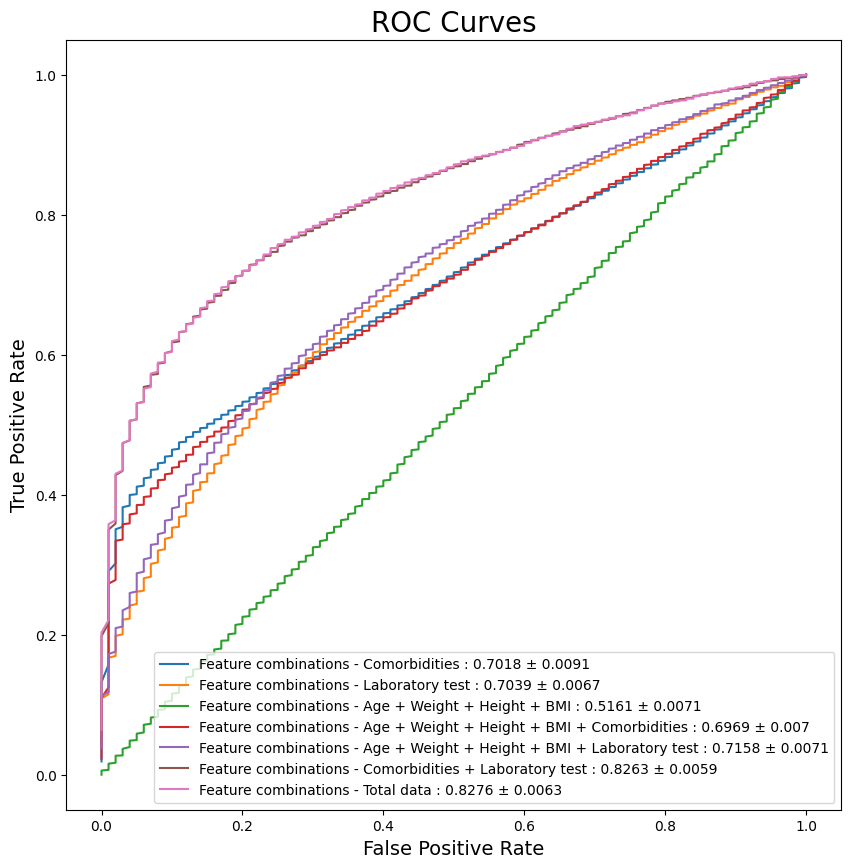

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphph), label=f'Feature combinations - Comorbidities : {auc_mean_ph} ± {aucs_cid_ph}')
plt.plot( lins, np.asarray(auroc_graphlab), label=f'Feature combinations - Laboratory test : {auc_mean_lab} ± {aucs_cid_lab}')
plt.plot( lins, np.asarray(auroc_graphdemo), label=f'Feature combinations - Age + Weight + Height + BMI : {auc_mean_demo} ± {aucs_cid_demo}')
plt.plot( lins, np.asarray(auroc_graphdc), label=f'Feature combinations - Age + Weight + Height + BMI + Comorbidities : {auc_mean_dc} ± {aucs_cid_dc}')
plt.plot( lins, np.asarray(auroc_graphdl), label=f'Feature combinations - Age + Weight + Height + BMI + Laboratory test : {auc_mean_dl} ± {aucs_cid_dl}')
plt.plot( lins, np.asarray(auroc_graphcl), label=f'Feature combinations - Comorbidities + Laboratory test : {auc_mean_cl} ± {aucs_cid_cl}')
plt.plot( lins, np.asarray(auroc_graphtotal), label=f'Feature combinations - Total data : {auc_mean_total} ± {aucs_cid_total}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=10)

# show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


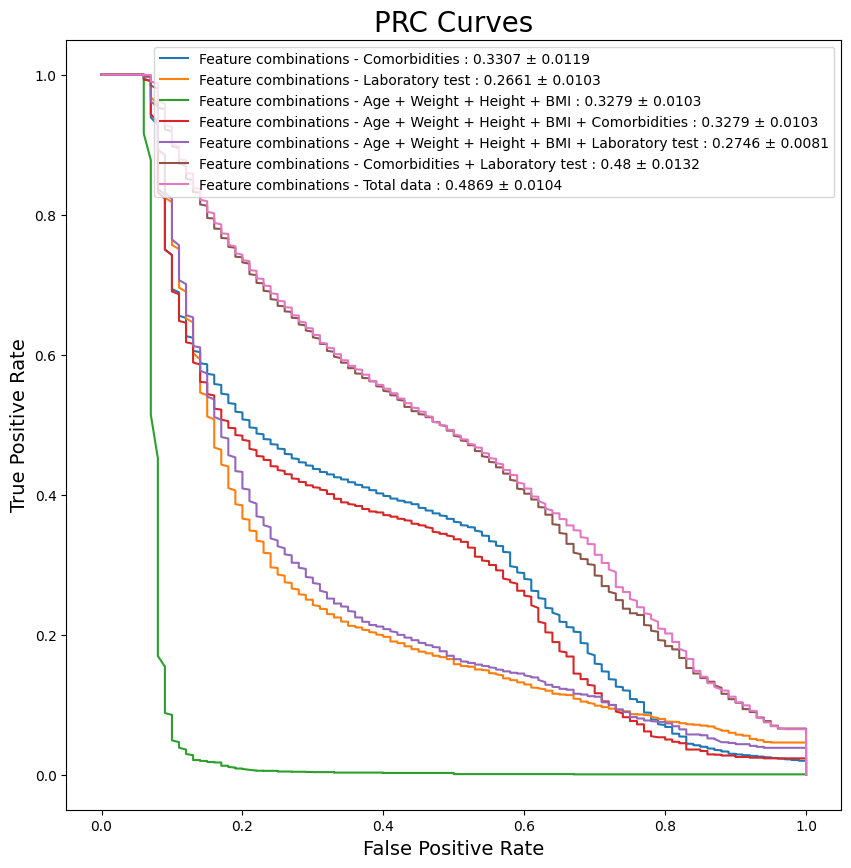

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves',fontsize=20)

plt.plot( lins, np.asarray(auprc_graphph), label=f'Feature combinations - Comorbidities : {prc_mean_ph} ± {prcs_cid_ph}')
plt.plot( lins, np.asarray(auprc_graphlab), label=f'Feature combinations - Laboratory test : {prc_mean_lab} ± {prcs_cid_lab}')
plt.plot( lins, np.asarray(auprc_graphdemo), label=f'Feature combinations - Age + Weight + Height + BMI : {prc_mean_dc} ± {prcs_cid_dc}')
plt.plot( lins, np.asarray(auprc_graphdc), label=f'Feature combinations - Age + Weight + Height + BMI + Comorbidities : {prc_mean_dc} ± {prcs_cid_dc}')
plt.plot( lins, np.asarray(auprc_graphdl), label=f'Feature combinations - Age + Weight + Height + BMI + Laboratory test : {prc_mean_dl} ± {prcs_cid_dl}')
plt.plot( lins, np.asarray(auprc_graphcl), label=f'Feature combinations - Comorbidities + Laboratory test : {prc_mean_cl} ± {prcs_cid_cl}')
plt.plot( lins, np.asarray(auprc_graphtotal), label=f'Feature combinations - Total data : {prc_mean_total} ± {prcs_cid_total}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=10)

# show the plot
plt.show()

# **Compare Model performance**

In [ ]:
auroc_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
acc_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
recall_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
precision_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tablex00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tablek00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tablec00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tables00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tablem00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tablel00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tabler00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
f1_tabled00 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc00 = pd.DataFrame([], columns=(fprnrec))
roc_graphss00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr00 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc00 = pd.DataFrame([], columns=(fprnrec))
prc_graphss00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr00 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd00 = pd.DataFrame([], columns=(fprnrec))
bootstrap_ratio = 0.6

for i in tqdm(range(bootstraps)):
    X_tf = df_transfusion[var_list2]
    X_tf.fillna(df_transfusion.median(), inplace=True)
    y_tf = df_transfusion['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_tf, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train, X_test, y_train, y_test = train_test_split(X_remain, y_remain, test_size=0.20, shuffle=True)
    X_train_d, X_val, y_train_d, y_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_train_d)
    X_train_d = pd.DataFrame(X_train_d,columns=feature)
    X_train_d_scaled = pd.DataFrame(scaler.transform(X_train_d))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'rbf')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_scaled, y_train, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex00.loc[ 'Raw_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek00.loc[ 'Raw_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec00.loc[ 'Raw_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables00.loc[ 'Raw_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem00.loc[ 'Raw_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel00.loc[ 'Raw_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler00.loc[ 'Raw_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled00.loc[ 'Raw_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex00.loc[ 'Raw_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek00.loc[ 'Raw_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec00.loc[ 'Raw_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables00.loc[ 'Raw_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem00.loc[ 'Raw_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel00.loc[ 'Raw_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler00.loc[ 'Raw_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled00.loc[ 'Raw_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    acc_tablex00.loc[ 'Raw_xgb_model' , i+1] = accuracy_score(y_test, y_test_proba2_x)
    acc_tablek00.loc[ 'Raw_knn_model' , i+1] = accuracy_score(y_test, y_test_proba2_k)
    acc_tablec00.loc[ 'Raw_dc_model' , i+1] = accuracy_score(y_test, y_test_proba2_c)
    acc_tables00.loc[ 'Raw_svm_model' , i+1] = accuracy_score(y_test, y_test_proba_s)
    acc_tablem00.loc[ 'Raw_mlp_model' , i+1] = accuracy_score(y_test, y_test_proba2_m)
    acc_tablel00.loc[ 'Raw_lr_model' , i+1] = accuracy_score(y_test, y_test_proba2_l)
    acc_tabler00.loc[ 'Raw_rf_model' , i+1] = accuracy_score(y_test, y_test_proba2_r)
    acc_tabled00.loc[ 'Raw_dnn_model' , i+1] = accuracy_score(y_test, y_test_proba_dnn.round())

    recall_tablex00.loc[ 'Raw_xgb_model' , i+1] = recall_score(y_test, y_test_proba2_x)
    recall_tablek00.loc[ 'Raw_knn_model' , i+1] = recall_score(y_test, y_test_proba2_k)
    recall_tablec00.loc[ 'Raw_dc_model' , i+1] = recall_score(y_test, y_test_proba2_c)
    recall_tables00.loc[ 'Raw_svm_model' , i+1] = recall_score(y_test, y_test_proba_s)
    recall_tablem00.loc[ 'Raw_mlp_model' , i+1] = recall_score(y_test, y_test_proba2_m)
    recall_tablel00.loc[ 'Raw_lr_model' , i+1] = recall_score(y_test, y_test_proba2_l)
    recall_tabler00.loc[ 'Raw_rf_model' , i+1] = recall_score(y_test, y_test_proba2_r)
    recall_tabled00.loc[ 'Raw_dnn_model' , i+1] = recall_score(y_test, y_test_proba_dnn.round())

    precision_tablex00.loc[ 'Raw_xgb_model' , i+1] = precision_score(y_test, y_test_proba2_x)
    precision_tablek00.loc[ 'Raw_knn_model' , i+1] = precision_score(y_test, y_test_proba2_k)
    precision_tablec00.loc[ 'Raw_dc_model' , i+1] = precision_score(y_test, y_test_proba2_c)
    precision_tables00.loc[ 'Raw_svm_model' , i+1] = precision_score(y_test, y_test_proba_s)
    precision_tablem00.loc[ 'Raw_mlp_model' , i+1] = precision_score(y_test, y_test_proba2_m)
    precision_tablel00.loc[ 'Raw_lr_model' , i+1] = precision_score(y_test, y_test_proba2_l)
    precision_tabler00.loc[ 'Raw_rf_model' , i+1] = precision_score(y_test, y_test_proba2_r)
    precision_tabled00.loc[ 'Raw_dnn_model' , i+1] = precision_score(y_test, y_test_proba_dnn.round())

    f1_tablex00.loc[ 'Raw_xgb_model' , i+1] = f1_score(y_test, y_test_proba2_x)
    f1_tablek00.loc[ 'Raw_knn_model' , i+1] = f1_score(y_test, y_test_proba2_k)
    f1_tablec00.loc[ 'Raw_dc_model' , i+1] = f1_score(y_test, y_test_proba2_c)
    f1_tables00.loc[ 'Raw_svm_model' , i+1] = f1_score(y_test, y_test_proba_s)
    f1_tablem00.loc[ 'Raw_mlp_model' , i+1] = f1_score(y_test, y_test_proba2_m)
    f1_tablel00.loc[ 'Raw_lr_model' , i+1] = f1_score(y_test, y_test_proba2_l)
    f1_tabler00.loc[ 'Raw_rf_model' , i+1] = f1_score(y_test, y_test_proba2_r)
    f1_tabled00.loc[ 'Raw_dnn_model' , i+1] = f1_score(y_test, y_test_proba_dnn.round())

    roc_graphsx00.loc[f'Raw_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk00.loc[f'Raw_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc00.loc[f'Raw_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss00.loc[f'Raw_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm00.loc[f'Raw_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl00.loc[f'Raw_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr00.loc[f'Raw_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd00.loc[f'Raw_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx00.loc[f'Raw_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk00.loc[f'Raw_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc00.loc[f'Raw_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss00.loc[f'Raw_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm00.loc[f'Raw_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl00.loc[f'Raw_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr00.loc[f'Raw_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd00.loc[f'Raw_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex00.to_csv( os.path.join( resultpath, 'Raw_aurocx.csv' ), mode='w+')
auroc_tablek00.to_csv( os.path.join( resultpath, 'Raw_aurock.csv' ), mode='w+')
auroc_tablec00.to_csv( os.path.join( resultpath, 'Raw_aurocc.csv' ), mode='w+')
auroc_tables00.to_csv( os.path.join( resultpath, 'Raw_aurocs.csv' ), mode='w+')
auroc_tablem00.to_csv( os.path.join( resultpath, 'Raw_aurocm.csv' ), mode='w+')
auroc_tablel00.to_csv( os.path.join( resultpath, 'Raw_aurocl.csv' ), mode='w+')
auroc_tabler00.to_csv( os.path.join( resultpath, 'Raw_aurocr.csv' ), mode='w+')
auroc_tabled00.to_csv( os.path.join( resultpath, 'Raw_aurocd.csv' ), mode='w+')
auprc_tablex00.to_csv( os.path.join( resultpath, 'Raw_auprcx.csv' ), mode='w+')
auprc_tablek00.to_csv( os.path.join( resultpath, 'Raw_auprck.csv' ), mode='w+')
auprc_tablec00.to_csv( os.path.join( resultpath, 'Raw_auprcc.csv' ), mode='w+')
auprc_tables00.to_csv( os.path.join( resultpath, 'Raw_auprcs.csv' ), mode='w+')
auprc_tablem00.to_csv( os.path.join( resultpath, 'Raw_auprcm.csv' ), mode='w+')
auprc_tablel00.to_csv( os.path.join( resultpath, 'Raw_auprcl.csv' ), mode='w+')
auprc_tabler00.to_csv( os.path.join( resultpath, 'Raw_auprcr.csv' ), mode='w+')
auprc_tabled00.to_csv( os.path.join( resultpath, 'Raw_auprcd.csv' ), mode='w+')
acc_tablex00.to_csv( os.path.join( resultpath, 'Raw_accx.csv' ), mode='w+')
acc_tablek00.to_csv( os.path.join( resultpath, 'Raw_acck.csv' ), mode='w+')
acc_tablec00.to_csv( os.path.join( resultpath, 'Raw_accc.csv' ), mode='w+')
acc_tables00.to_csv( os.path.join( resultpath, 'Raw_accs.csv' ), mode='w+')
acc_tablem00.to_csv( os.path.join( resultpath, 'Raw_accm.csv' ), mode='w+')
acc_tablel00.to_csv( os.path.join( resultpath, 'Raw_accl.csv' ), mode='w+')
acc_tabler00.to_csv( os.path.join( resultpath, 'Raw_accr.csv' ), mode='w+')
acc_tabled00.to_csv( os.path.join( resultpath, 'Raw_accd.csv' ), mode='w+')
recall_tablex00.to_csv( os.path.join( resultpath, 'Raw_recallx.csv' ), mode='w+')
recall_tablek00.to_csv( os.path.join( resultpath, 'Raw_recallk.csv' ), mode='w+')
recall_tablec00.to_csv( os.path.join( resultpath, 'Raw_recallc.csv' ), mode='w+')
recall_tables00.to_csv( os.path.join( resultpath, 'Raw_recalls.csv' ), mode='w+')
recall_tablem00.to_csv( os.path.join( resultpath, 'Raw_recallm.csv' ), mode='w+')
recall_tablel00.to_csv( os.path.join( resultpath, 'Raw_recalll.csv' ), mode='w+')
recall_tabler00.to_csv( os.path.join( resultpath, 'Raw_recallr.csv' ), mode='w+')
recall_tabled00.to_csv( os.path.join( resultpath, 'Raw_recalld.csv' ), mode='w+')
precision_tablex00.to_csv( os.path.join( resultpath, 'Raw_precisionx.csv' ), mode='w+')
precision_tablek00.to_csv( os.path.join( resultpath, 'Raw_precisionk.csv' ), mode='w+')
precision_tablec00.to_csv( os.path.join( resultpath, 'Raw_precisionc.csv' ), mode='w+')
precision_tables00.to_csv( os.path.join( resultpath, 'Raw_precisions.csv' ), mode='w+')
precision_tablem00.to_csv( os.path.join( resultpath, 'Raw_precisionm.csv' ), mode='w+')
precision_tablel00.to_csv( os.path.join( resultpath, 'Raw_precisionl.csv' ), mode='w+')
precision_tabler00.to_csv( os.path.join( resultpath, 'Raw_precisionr.csv' ), mode='w+')
precision_tabled00.to_csv( os.path.join( resultpath, 'Raw_precisiond.csv' ), mode='w+')
f1_tablex00.to_csv( os.path.join( resultpath, 'Raw_f1x.csv' ), mode='w+')
f1_tablek00.to_csv( os.path.join( resultpath, 'Raw_f1k.csv' ), mode='w+')
f1_tablec00.to_csv( os.path.join( resultpath, 'Raw_f1c.csv' ), mode='w+')
f1_tables00.to_csv( os.path.join( resultpath, 'Raw_f1s.csv' ), mode='w+')
f1_tablem00.to_csv( os.path.join( resultpath, 'Raw_f1m.csv' ), mode='w+')
f1_tablel00.to_csv( os.path.join( resultpath, 'Raw_f1l.csv' ), mode='w+')
f1_tabler00.to_csv( os.path.join( resultpath, 'Raw_f1r.csv' ), mode='w+')
f1_tabled00.to_csv( os.path.join( resultpath, 'Raw_f1d.csv' ), mode='w+')
roc_graphsx00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsx00.csv' ), mode='w+')
roc_graphsk00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsk00.csv' ), mode='w+')
roc_graphsc00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsc00.csv' ), mode='w+')
roc_graphss00.to_csv( os.path.join( resultpath, 'Raw_roc_graphss00.csv' ), mode='w+')
roc_graphsm00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsm00.csv' ), mode='w+')
roc_graphsl00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsl00.csv' ), mode='w+')
roc_graphsr00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsr00.csv' ), mode='w+')
roc_graphsd00.to_csv( os.path.join( resultpath, 'Raw_roc_graphsd00.csv' ), mode='w+')
prc_graphsx00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsx00.csv' ), mode='w+')
prc_graphsk00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsk00.csv' ), mode='w+')
prc_graphsc00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsc00.csv' ), mode='w+')
prc_graphss00.to_csv( os.path.join( resultpath, 'Raw_prc_graphss00.csv' ), mode='w+')
prc_graphsm00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsm00.csv' ), mode='w+')
prc_graphsl00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsl00.csv' ), mode='w+')
prc_graphsr00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsr00.csv' ), mode='w+')
prc_graphsd00.to_csv( os.path.join( resultpath, 'Raw_prc_graphsd00.csv' ), mode='w+')

In [ ]:
import scipy.stats as stats
from scipy.stats import zscore

auc_mean_x00 = np.round(auroc_tablex00.loc['Raw_xgb_model'].values.mean(),4)
auc_std_x00 = np.round(auroc_tablex00.loc['Raw_xgb_model'].values.std(),4)
auc_ci_x00 = stats.t.interval(0.95, len(auroc_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(auroc_tablex00.loc['Raw_xgb_model']), scale=stats.sem(auroc_tablex00.loc['Raw_xgb_model']))
aucs_cid_x00 = np.round(auc_mean_x00 - auc_ci_x00[0],4)

auc_mean_k00 = np.round(auroc_tablek00.loc['Raw_knn_model'].values.mean(),4)
auc_std_k00 = np.round(auroc_tablek00.loc['Raw_knn_model'].values.std(),4)
auc_ci_k00 = stats.t.interval(0.95, len(auroc_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(auroc_tablek00.loc['Raw_knn_model']), scale=stats.sem(auroc_tablek00.loc['Raw_knn_model']))
aucs_cid_k00 = np.round(auc_mean_k00 - auc_ci_k00[0],4)

auc_mean_c00 = np.round(auroc_tablec00.loc['Raw_dc_model'].values.mean(),4)
auc_std_c00 = np.round(auroc_tablec00.loc['Raw_dc_model'].values.std(),4)
auc_ci_c00 = stats.t.interval(0.95, len(auroc_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(auroc_tablec00.loc['Raw_dc_model']), scale=stats.sem(auroc_tablec00.loc['Raw_dc_model']))
aucs_cid_c00 = np.round(auc_mean_c00 - auc_ci_c00[0],4)

auc_mean_s00 = np.round(auroc_tables00.loc['Raw_svm_model'].values.mean(),4)
auc_std_s00 = np.round(auroc_tables00.loc['Raw_svm_model'].values.std(),4)
auc_ci_s00 = stats.t.interval(0.95, len(auroc_tables00.loc['Raw_svm_model'])-1, loc=np.mean(auroc_tables00.loc['Raw_svm_model']), scale=stats.sem(auroc_tables00.loc['Raw_svm_model']))
aucs_cid_s00 = np.round(auc_mean_s00 - auc_ci_s00[0],4)

auc_mean_m00 = np.round(auroc_tablem00.loc['Raw_mlp_model'].values.mean(),4)
auc_std_m00 = np.round(auroc_tablem00.loc['Raw_mlp_model'].values.std(),4)
auc_ci_m00 = stats.t.interval(0.95, len(auroc_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(auroc_tablem00.loc['Raw_mlp_model']), scale=stats.sem(auroc_tablem00.loc['Raw_mlp_model']))
aucs_cid_m00 = np.round(auc_mean_m00 - auc_ci_m00[0],4)

auc_mean_l00 = np.round(auroc_tablel00.loc['Raw_lr_model'].values.mean(),4)
auc_std_l00 = np.round(auroc_tablel00.loc['Raw_lr_model'].values.std(),4)
auc_ci_l00 = stats.t.interval(0.95, len(auroc_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(auroc_tablel00.loc['Raw_lr_model']), scale=stats.sem(auroc_tablel00.loc['Raw_lr_model']))
aucs_cid_l00 = np.round(auc_mean_l00 - auc_ci_l00[0],4)

auc_mean_r00 = np.round(auroc_tabler00.loc['Raw_rf_model'].values.mean(),4)
auc_std_r00 = np.round(auroc_tabler00.loc['Raw_rf_model'].values.std(),4)
auc_ci_r00 = stats.t.interval(0.95, len(auroc_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(auroc_tabler00.loc['Raw_rf_model']), scale=stats.sem(auroc_tabler00.loc['Raw_rf_model']))
aucs_cid_r00 = np.round(auc_mean_r00 - auc_ci_r00[0],4)

auc_mean_d00 = np.round(auroc_tabled00.loc['Raw_dnn_model'].values.mean(),4)
auc_std_d00 = np.round(auroc_tabled00.loc['Raw_dnn_model'].values.std(),4)
auc_ci_d00 = stats.t.interval(0.95, len(auroc_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(auroc_tabled00.loc['Raw_dnn_model']), scale=stats.sem(auroc_tabled00.loc['Raw_dnn_model']))
aucs_cid_d00 = np.round(auc_mean_d00 - auc_ci_d00[0],4)

In [ ]:
prc_mean_x00 = np.round(auprc_tablex00.loc['Raw_xgb_model'].values.mean(),4)
prc_std_x00 = np.round(auprc_tablex00.loc['Raw_xgb_model'].values.std(),4)
prc_ci_x00 = stats.t.interval(0.95, len(auprc_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(auprc_tablex00.loc['Raw_xgb_model']), scale=stats.sem(auprc_tablex00.loc['Raw_xgb_model']))
prcs_cid_x00 = np.round(prc_mean_x00 - prc_ci_x00[0],4)

prc_mean_k00 = np.round(auprc_tablek00.loc['Raw_knn_model'].values.mean(),4)
prc_std_k00 = np.round(auprc_tablek00.loc['Raw_knn_model'].values.std(),4)
prc_ci_k00 = stats.t.interval(0.95, len(auprc_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(auprc_tablek00.loc['Raw_knn_model']), scale=stats.sem(auprc_tablek00.loc['Raw_knn_model']))
prcs_cid_k00 = np.round(prc_mean_k00 - prc_ci_k00[0],4)

prc_mean_c00 = np.round(auprc_tablec00.loc['Raw_dc_model'].values.mean(),4)
prc_std_c00 = np.round(auprc_tablec00.loc['Raw_dc_model'].values.std(),4)
prc_ci_c00 = stats.t.interval(0.95, len(auprc_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(auprc_tablec00.loc['Raw_dc_model']), scale=stats.sem(auprc_tablec00.loc['Raw_dc_model']))
prcs_cid_c00 = np.round(prc_mean_c00 - prc_ci_c00[0],4)

prc_mean_s00 = np.round(auprc_tables00.loc['Raw_svm_model'].values.mean(),4)
prc_std_s00 = np.round(auprc_tables00.loc['Raw_svm_model'].values.std(),4)
prc_ci_s00 = stats.t.interval(0.95, len(auprc_tables00.loc['Raw_svm_model'])-1, loc=np.mean(auprc_tables00.loc['Raw_svm_model']), scale=stats.sem(auprc_tables00.loc['Raw_svm_model']))
prcs_cid_s00 = np.round(prc_mean_s00 - prc_ci_s00[0],4)

prc_mean_m00 = np.round(auprc_tablem00.loc['Raw_mlp_model'].values.mean(),4)
prc_std_m00 = np.round(auprc_tablem00.loc['Raw_mlp_model'].values.std(),4)
prc_ci_m00 = stats.t.interval(0.95, len(auprc_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(auprc_tablem00.loc['Raw_mlp_model']), scale=stats.sem(auprc_tablem00.loc['Raw_mlp_model']))
prcs_cid_m00 = np.round(prc_mean_m00 - prc_ci_m00[0],4)

prc_mean_l00 = np.round(auprc_tablel00.loc['Raw_lr_model'].values.mean(),4)
prc_std_l00 = np.round(auprc_tablel00.loc['Raw_lr_model'].values.std(),4)
prc_ci_l00 = stats.t.interval(0.95, len(auprc_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(auprc_tablel00.loc['Raw_lr_model']), scale=stats.sem(auprc_tablel00.loc['Raw_lr_model']))
prcs_cid_l00 = np.round(prc_mean_l00 - prc_ci_l00[0],4)

prc_mean_r00 = np.round(auprc_tabler00.loc['Raw_rf_model'].values.mean(),4)
prc_std_r00 = np.round(auprc_tabler00.loc['Raw_rf_model'].values.std(),4)
prc_ci_r00 = stats.t.interval(0.95, len(auprc_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(auprc_tabler00.loc['Raw_rf_model']), scale=stats.sem(auprc_tabler00.loc['Raw_rf_model']))
prcs_cid_r00 = np.round(prc_mean_r00 - prc_ci_r00[0],4)

prc_mean_d00 = np.round(auprc_tabled00.loc['Raw_dnn_model'].values.mean(),4)
prc_std_d00 = np.round(auprc_tabled00.loc['Raw_dnn_model'].values.std(),4)
prc_ci_d00 = stats.t.interval(0.95, len(auprc_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(auprc_tabled00.loc['Raw_dnn_model']), scale=stats.sem(auprc_tabled00.loc['Raw_dnn_model']))
prcs_cid_d00 = np.round(prc_mean_d00 - prc_ci_d00[0],4)

In [ ]:
acc_mean_x00 = np.round(acc_tablex00.loc['Raw_xgb_model'].values.mean(),4)
acc_std_x00 = np.round(acc_tablex00.loc['Raw_xgb_model'].values.std(),4)
acc_ci_x00 = stats.t.interval(0.95, len(acc_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(acc_tablex00.loc['Raw_xgb_model']), scale=stats.sem(acc_tablex00.loc['Raw_xgb_model']))
accs_cid_x00 = np.round(acc_mean_x00 - acc_ci_x00[0],4)

acc_mean_k00 = np.round(acc_tablek00.loc['Raw_knn_model'].values.mean(),4)
acc_std_k00 = np.round(acc_tablek00.loc['Raw_knn_model'].values.std(),4)
acc_ci_k00 = stats.t.interval(0.95, len(acc_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(acc_tablek00.loc['Raw_knn_model']), scale=stats.sem(acc_tablek00.loc['Raw_knn_model']))
accs_cid_k00 = np.round(acc_mean_k00 - acc_ci_k00[0],4)

acc_mean_c00 = np.round(acc_tablec00.loc['Raw_dc_model'].values.mean(),4)
acc_std_c00 = np.round(acc_tablec00.loc['Raw_dc_model'].values.std(),4)
acc_ci_c00 = stats.t.interval(0.95, len(acc_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(acc_tablec00.loc['Raw_dc_model']), scale=stats.sem(acc_tablec00.loc['Raw_dc_model']))
accs_cid_c00 = np.round(acc_mean_c00 - acc_ci_c00[0],4)

acc_mean_s00 = np.round(acc_tables00.loc['Raw_svm_model'].values.mean(),4)
acc_std_s00 = np.round(acc_tables00.loc['Raw_svm_model'].values.std(),4)
acc_ci_s00 = stats.t.interval(0.95, len(acc_tables00.loc['Raw_svm_model'])-1, loc=np.mean(acc_tables00.loc['Raw_svm_model']), scale=stats.sem(acc_tables00.loc['Raw_svm_model']))
accs_cid_s00 = np.round(acc_mean_s00 - acc_ci_s00[0],4)

acc_mean_m00 = np.round(acc_tablem00.loc['Raw_mlp_model'].values.mean(),4)
acc_std_m00 = np.round(acc_tablem00.loc['Raw_mlp_model'].values.std(),4)
acc_ci_m00 = stats.t.interval(0.95, len(acc_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(acc_tablem00.loc['Raw_mlp_model']), scale=stats.sem(acc_tablem00.loc['Raw_mlp_model']))
accs_cid_m00 = np.round(acc_mean_m00 - acc_ci_m00[0],4)

acc_mean_l00 = np.round(acc_tablel00.loc['Raw_lr_model'].values.mean(),4)
acc_std_l00 = np.round(acc_tablel00.loc['Raw_lr_model'].values.std(),4)
acc_ci_l00 = stats.t.interval(0.95, len(acc_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(acc_tablel00.loc['Raw_lr_model']), scale=stats.sem(acc_tablel00.loc['Raw_lr_model']))
accs_cid_l00 = np.round(acc_mean_l00 - acc_ci_l00[0],4)

acc_mean_r00 = np.round(acc_tabler00.loc['Raw_rf_model'].values.mean(),4)
acc_std_r00 = np.round(acc_tabler00.loc['Raw_rf_model'].values.std(),4)
acc_ci_r00 = stats.t.interval(0.95, len(acc_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(acc_tabler00.loc['Raw_rf_model']), scale=stats.sem(acc_tabler00.loc['Raw_rf_model']))
accs_cid_r00 = np.round(acc_mean_r00 - acc_ci_r00[0],4)

acc_mean_d00 = np.round(acc_tabled00.loc['Raw_dnn_model'].values.mean(),4)
acc_std_d00 = np.round(acc_tabled00.loc['Raw_dnn_model'].values.std(),4)
acc_ci_d00 = stats.t.interval(0.95, len(acc_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(acc_tabled00.loc['Raw_dnn_model']), scale=stats.sem(acc_tabled00.loc['Raw_dnn_model']))
accs_cid_d00 = np.round(acc_mean_d00 - acc_ci_d00[0],4)

In [ ]:
recall_mean_x00 = np.round(recall_tablex00.loc['Raw_xgb_model'].values.mean(),4)
recall_std_x00 = np.round(recall_tablex00.loc['Raw_xgb_model'].values.std(),4)
recall_ci_x00 = stats.t.interval(0.95, len(recall_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(recall_tablex00.loc['Raw_xgb_model']), scale=stats.sem(recall_tablex00.loc['Raw_xgb_model']))
recalls_cid_x00 = np.round(recall_mean_x00 - recall_ci_x00[0],4)

recall_mean_k00 = np.round(recall_tablek00.loc['Raw_knn_model'].values.mean(),4)
recall_std_k00 = np.round(recall_tablek00.loc['Raw_knn_model'].values.std(),4)
recall_ci_k00 = stats.t.interval(0.95, len(recall_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(recall_tablek00.loc['Raw_knn_model']), scale=stats.sem(recall_tablek00.loc['Raw_knn_model']))
recalls_cid_k00 = np.round(recall_mean_k00 - recall_ci_k00[0],4)

recall_mean_c00 = np.round(recall_tablec00.loc['Raw_dc_model'].values.mean(),4)
recall_std_c00 = np.round(recall_tablec00.loc['Raw_dc_model'].values.std(),4)
recall_ci_c00 = stats.t.interval(0.95, len(recall_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(recall_tablec00.loc['Raw_dc_model']), scale=stats.sem(recall_tablec00.loc['Raw_dc_model']))
recalls_cid_c00 = np.round(recall_mean_c00 - recall_ci_c00[0],4)

recall_mean_s00 = np.round(recall_tables00.loc['Raw_svm_model'].values.mean(),4)
recall_std_s00 = np.round(recall_tables00.loc['Raw_svm_model'].values.std(),4)
recall_ci_s00 = stats.t.interval(0.95, len(recall_tables00.loc['Raw_svm_model'])-1, loc=np.mean(recall_tables00.loc['Raw_svm_model']), scale=stats.sem(recall_tables00.loc['Raw_svm_model']))
recalls_cid_s00 = np.round(recall_mean_s00 - recall_ci_s00[0],4)

recall_mean_m00 = np.round(recall_tablem00.loc['Raw_mlp_model'].values.mean(),4)
recall_std_m00 = np.round(recall_tablem00.loc['Raw_mlp_model'].values.std(),4)
recall_ci_m00 = stats.t.interval(0.95, len(recall_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(recall_tablem00.loc['Raw_mlp_model']), scale=stats.sem(recall_tablem00.loc['Raw_mlp_model']))
recalls_cid_m00 = np.round(recall_mean_m00 - recall_ci_m00[0],4)

recall_mean_l00 = np.round(recall_tablel00.loc['Raw_lr_model'].values.mean(),4)
recall_std_l00 = np.round(recall_tablel00.loc['Raw_lr_model'].values.std(),4)
recall_ci_l00 = stats.t.interval(0.95, len(recall_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(recall_tablel00.loc['Raw_lr_model']), scale=stats.sem(recall_tablel00.loc['Raw_lr_model']))
recalls_cid_l00 = np.round(recall_mean_l00 - recall_ci_l00[0],4)

recall_mean_r00 = np.round(recall_tabler00.loc['Raw_rf_model'].values.mean(),4)
recall_std_r00 = np.round(recall_tabler00.loc['Raw_rf_model'].values.std(),4)
recall_ci_r00 = stats.t.interval(0.95, len(recall_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(recall_tabler00.loc['Raw_rf_model']), scale=stats.sem(recall_tabler00.loc['Raw_rf_model']))
recalls_cid_r00 = np.round(recall_mean_r00 - recall_ci_r00[0],4)

recall_mean_d00 = np.round(recall_tabled00.loc['Raw_dnn_model'].values.mean(),4)
recall_std_d00 = np.round(recall_tabled00.loc['Raw_dnn_model'].values.std(),4)
recall_ci_d00 = stats.t.interval(0.95, len(recall_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(recall_tabled00.loc['Raw_dnn_model']), scale=stats.sem(recall_tabled00.loc['Raw_dnn_model']))
recalls_cid_d00 = np.round(recall_mean_d00 - recall_ci_d00[0],4)

In [ ]:
precision_mean_x00 = np.round(precision_tablex00.loc['Raw_xgb_model'].values.mean(),4)
precision_std_x00 = np.round(precision_tablex00.loc['Raw_xgb_model'].values.std(),4)
precision_ci_x00 = stats.t.interval(0.95, len(precision_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(precision_tablex00.loc['Raw_xgb_model']), scale=stats.sem(precision_tablex00.loc['Raw_xgb_model']))
precisions_cid_x00 = np.round(precision_mean_x00 - precision_ci_x00[0],4)

precision_mean_k00 = np.round(precision_tablek00.loc['Raw_knn_model'].values.mean(),4)
precision_std_k00 = np.round(precision_tablek00.loc['Raw_knn_model'].values.std(),4)
precision_ci_k00 = stats.t.interval(0.95, len(precision_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(precision_tablek00.loc['Raw_knn_model']), scale=stats.sem(precision_tablek00.loc['Raw_knn_model']))
precisions_cid_k00 = np.round(precision_mean_k00 - precision_ci_k00[0],4)

precision_mean_c00 = np.round(precision_tablec00.loc['Raw_dc_model'].values.mean(),4)
precision_std_c00 = np.round(precision_tablec00.loc['Raw_dc_model'].values.std(),4)
precision_ci_c00 = stats.t.interval(0.95, len(precision_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(precision_tablec00.loc['Raw_dc_model']), scale=stats.sem(precision_tablec00.loc['Raw_dc_model']))
precisions_cid_c00 = np.round(precision_mean_c00 - precision_ci_c00[0],4)

precision_mean_s00 = np.round(precision_tables00.loc['Raw_svm_model'].values.mean(),4)
precision_std_s00 = np.round(precision_tables00.loc['Raw_svm_model'].values.std(),4)
precision_ci_s00 = stats.t.interval(0.95, len(precision_tables00.loc['Raw_svm_model'])-1, loc=np.mean(precision_tables00.loc['Raw_svm_model']), scale=stats.sem(precision_tables00.loc['Raw_svm_model']))
precisions_cid_s00 = np.round(precision_mean_s00 - precision_ci_s00[0],4)

precision_mean_m00 = np.round(precision_tablem00.loc['Raw_mlp_model'].values.mean(),4)
precision_std_m00 = np.round(precision_tablem00.loc['Raw_mlp_model'].values.std(),4)
precision_ci_m00 = stats.t.interval(0.95, len(precision_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(precision_tablem00.loc['Raw_mlp_model']), scale=stats.sem(precision_tablem00.loc['Raw_mlp_model']))
precisions_cid_m00 = np.round(precision_mean_m00 - precision_ci_m00[0],4)

precision_mean_l00 = np.round(precision_tablel00.loc['Raw_lr_model'].values.mean(),4)
precision_std_l00 = np.round(precision_tablel00.loc['Raw_lr_model'].values.std(),4)
precision_ci_l00 = stats.t.interval(0.95, len(precision_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(precision_tablel00.loc['Raw_lr_model']), scale=stats.sem(precision_tablel00.loc['Raw_lr_model']))
precisions_cid_l00 = np.round(precision_mean_l00 - precision_ci_l00[0],4)

precision_mean_r00 = np.round(precision_tabler00.loc['Raw_rf_model'].values.mean(),4)
precision_std_r00 = np.round(precision_tabler00.loc['Raw_rf_model'].values.std(),4)
precision_ci_r00 = stats.t.interval(0.95, len(precision_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(precision_tabler00.loc['Raw_rf_model']), scale=stats.sem(precision_tabler00.loc['Raw_rf_model']))
precisions_cid_r00 = np.round(precision_mean_r00 - precision_ci_r00[0],4)

precision_mean_d00 = np.round(precision_tabled00.loc['Raw_dnn_model'].values.mean(),4)
precision_std_d00 = np.round(precision_tabled00.loc['Raw_dnn_model'].values.std(),4)
precision_ci_d00 = stats.t.interval(0.95, len(precision_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(precision_tabled00.loc['Raw_dnn_model']), scale=stats.sem(precision_tabled00.loc['Raw_dnn_model']))
precisions_cid_d00 = np.round(precision_mean_d00 - precision_ci_d00[0],4)

In [ ]:
f1_mean_x00 = np.round(f1_tablex00.loc['Raw_xgb_model'].values.mean(),4)
f1_std_x00 = np.round(f1_tablex00.loc['Raw_xgb_model'].values.std(),4)
f1_ci_x00 = stats.t.interval(0.95, len(f1_tablex00.loc['Raw_xgb_model'])-1, loc=np.mean(f1_tablex00.loc['Raw_xgb_model']), scale=stats.sem(f1_tablex00.loc['Raw_xgb_model']))
f1s_cid_x00 = np.round(f1_mean_x00 - f1_ci_x00[0],4)

f1_mean_k00 = np.round(f1_tablek00.loc['Raw_knn_model'].values.mean(),4)
f1_std_k00 = np.round(f1_tablek00.loc['Raw_knn_model'].values.std(),4)
f1_ci_k00 = stats.t.interval(0.95, len(f1_tablek00.loc['Raw_knn_model'])-1, loc=np.mean(f1_tablek00.loc['Raw_knn_model']), scale=stats.sem(f1_tablek00.loc['Raw_knn_model']))
f1s_cid_k00 = np.round(f1_mean_k00 - f1_ci_k00[0],4)

f1_mean_c00 = np.round(f1_tablec00.loc['Raw_dc_model'].values.mean(),4)
f1_std_c00 = np.round(f1_tablec00.loc['Raw_dc_model'].values.std(),4)
f1_ci_c00 = stats.t.interval(0.95, len(f1_tablec00.loc['Raw_dc_model'])-1, loc=np.mean(f1_tablec00.loc['Raw_dc_model']), scale=stats.sem(f1_tablec00.loc['Raw_dc_model']))
f1s_cid_c00 = np.round(f1_mean_c00 - f1_ci_c00[0],4)

f1_mean_s00 = np.round(f1_tables00.loc['Raw_svm_model'].values.mean(),4)
f1_std_s00 = np.round(f1_tables00.loc['Raw_svm_model'].values.std(),4)
f1_ci_s00 = stats.t.interval(0.95, len(f1_tables00.loc['Raw_svm_model'])-1, loc=np.mean(f1_tables00.loc['Raw_svm_model']), scale=stats.sem(f1_tables00.loc['Raw_svm_model']))
f1s_cid_s00 = np.round(f1_mean_s00 - f1_ci_s00[0],4)

f1_mean_m00 = np.round(f1_tablem00.loc['Raw_mlp_model'].values.mean(),4)
f1_std_m00 = np.round(f1_tablem00.loc['Raw_mlp_model'].values.std(),4)
f1_ci_m00 = stats.t.interval(0.95, len(f1_tablem00.loc['Raw_mlp_model'])-1, loc=np.mean(f1_tablem00.loc['Raw_mlp_model']), scale=stats.sem(f1_tablem00.loc['Raw_mlp_model']))
f1s_cid_m00 = np.round(f1_mean_m00 - f1_ci_m00[0],4)

f1_mean_l00 = np.round(f1_tablel00.loc['Raw_lr_model'].values.mean(),4)
f1_std_l00 = np.round(f1_tablel00.loc['Raw_lr_model'].values.std(),4)
f1_ci_l00 = stats.t.interval(0.95, len(f1_tablel00.loc['Raw_lr_model'])-1, loc=np.mean(f1_tablel00.loc['Raw_lr_model']), scale=stats.sem(f1_tablel00.loc['Raw_lr_model']))
f1s_cid_l00 = np.round(f1_mean_l00 - f1_ci_l00[0],4)

f1_mean_r00 = np.round(f1_tabler00.loc['Raw_rf_model'].values.mean(),4)
f1_std_r00 = np.round(f1_tabler00.loc['Raw_rf_model'].values.std(),4)
f1_ci_r00 = stats.t.interval(0.95, len(f1_tabler00.loc['Raw_rf_model'])-1, loc=np.mean(f1_tabler00.loc['Raw_rf_model']), scale=stats.sem(f1_tabler00.loc['Raw_rf_model']))
f1s_cid_r00 = np.round(f1_mean_r00 - f1_ci_r00[0],4)

f1_mean_d00 = np.round(f1_tabled00.loc['Raw_dnn_model'].values.mean(),4)
f1_std_d00 = np.round(f1_tabled00.loc['Raw_dnn_model'].values.std(),4)
f1_ci_d00 = stats.t.interval(0.95, len(f1_tabled00.loc['Raw_dnn_model'])-1, loc=np.mean(f1_tabled00.loc['Raw_dnn_model']), scale=stats.sem(f1_tabled00.loc['Raw_dnn_model']))
f1s_cid_d00 = np.round(f1_mean_d00 - f1_ci_d00[0],4)

In [ ]:
fprnrec = np.linspace(0,1,1000)

auroc_graphx00=roc_graphsx00[fprnrec].mean()
auroc_graphk00=roc_graphsk00[fprnrec].mean()
auroc_graphc00=roc_graphsc00[fprnrec].mean()
auroc_graphs00=roc_graphss00[fprnrec].mean()
auroc_graphm00=roc_graphsm00[fprnrec].mean()
auroc_graphl00=roc_graphsl00[fprnrec].mean()
auroc_graphr00=roc_graphsr00[fprnrec].mean()
auroc_graphd00=roc_graphsd00[fprnrec].mean()

auprc_graphx00=prc_graphsx00[fprnrec].mean()
auprc_graphk00=prc_graphsk00[fprnrec].mean()
auprc_graphc00=prc_graphsc00[fprnrec].mean()
auprc_graphs00=prc_graphss00[fprnrec].mean()
auprc_graphm00=prc_graphsm00[fprnrec].mean()
auprc_graphl00=prc_graphsl00[fprnrec].mean()
auprc_graphr00=prc_graphsr00[fprnrec].mean()
auprc_graphd00=prc_graphsd00[fprnrec].mean()


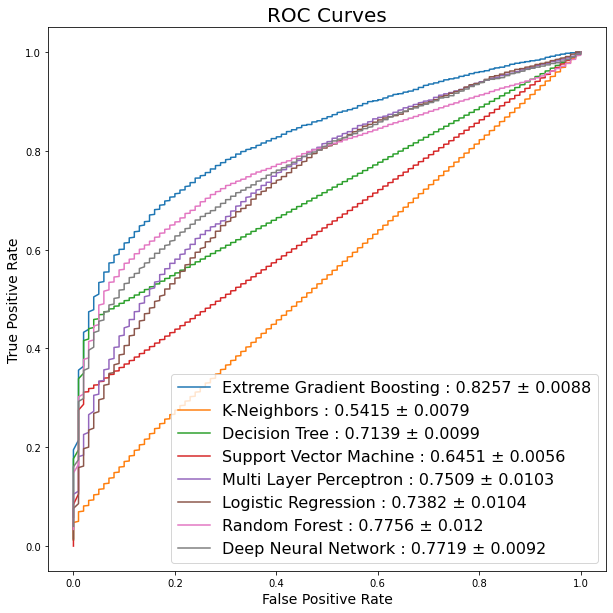

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphx00), label=f'Extreme Gradient Boosting : {auc_mean_x00} ± {aucs_cid_x00}')
plt.plot( lins, np.asarray(auroc_graphk00), label=f'K-Neighbors : {auc_mean_k00} ± {aucs_cid_k00}')
plt.plot( lins, np.asarray(auroc_graphc00), label=f'Decision Tree : {auc_mean_c00} ± {aucs_cid_c00}')
plt.plot( lins, np.asarray(auroc_graphs00), label=f'Support Vector Machine : {auc_mean_s00} ± {aucs_cid_s00}')
plt.plot( lins, np.asarray(auroc_graphm00), label=f'Multi Layer Perceptron : {auc_mean_m00} ± {aucs_cid_m00}')
plt.plot( lins, np.asarray(auroc_graphl00), label=f'Logistic Regression : {auc_mean_l00} ± {aucs_cid_l00}')
plt.plot( lins, np.asarray(auroc_graphr00), label=f'Random Forest : {auc_mean_r00} ± {aucs_cid_r00}')
plt.plot( lins, np.asarray(auroc_graphd00), label=f'Deep Neural Network : {auc_mean_d00} ± {aucs_cid_d00}')
# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

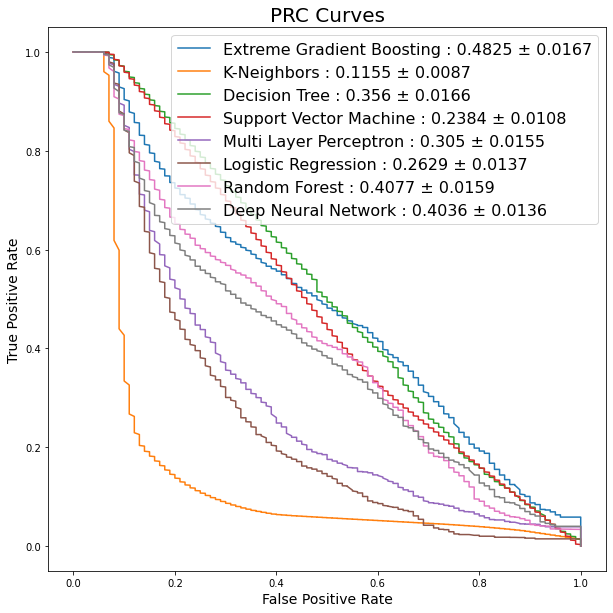

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphx00), label=f'Extreme Gradient Boosting : {prc_mean_x00} ± {prcs_cid_x00}')
plt.plot( lins, np.asarray(auprc_graphk00), label=f'K-Neighbors : {prc_mean_k00} ± {prcs_cid_k00}')
plt.plot( lins, np.asarray(auprc_graphc00), label=f'Decision Tree : {prc_mean_c00} ± {prcs_cid_c00}')
plt.plot( lins, np.asarray(auprc_graphs00), label=f'Support Vector Machine : {prc_mean_s00} ± {prcs_cid_s00}')
plt.plot( lins, np.asarray(auprc_graphm00), label=f'Multi Layer Perceptron : {prc_mean_m00} ± {prcs_cid_m00}')
plt.plot( lins, np.asarray(auprc_graphl00), label=f'Logistic Regression : {prc_mean_l00} ± {prcs_cid_l00}')
plt.plot( lins, np.asarray(auprc_graphr00), label=f'Random Forest : {prc_mean_r00} ± {prcs_cid_r00}')
plt.plot( lins, np.asarray(auprc_graphd00), label=f'Deep Neural Network : {prc_mean_d00} ± {prcs_cid_d00}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

In [ ]:
print("AUROC of XGB: {0}±{1}".format(auc_mean_x00,aucs_cid_x00))
print("AUPRC of XGB: {0}±{1}".format(prc_mean_x00,prcs_cid_x00))
print("Accuracy of XGB: {0}±{1}".format(acc_mean_x00,accs_cid_x00))
print("Recall of XGB: {0}±{1}".format(recall_mean_x00,recalls_cid_x00))
print("Precision of XGB: {0}±{1}".format(precision_mean_x00,precisions_cid_x00))
print("F1 score of XGB: {0}±{1}".format(f1_mean_x00,f1s_cid_x00))
print("AUROC of KNN: {0}±{1}".format(auc_mean_k00,aucs_cid_k00))
print("AUPRC of KNN: {0}±{1}".format(prc_mean_k00,prcs_cid_k00))
print("Accuracy of KNN: {0}±{1}".format(acc_mean_k00,accs_cid_k00))
print("Recall of KNN: {0}±{1}".format(recall_mean_k00,recalls_cid_k00))
print("Precision of KNN: {0}±{1}".format(precision_mean_k00,precisions_cid_k00))
print("F1 score of KNN: {0}±{1}".format(f1_mean_k00,f1s_cid_k00))
print("AUROC of DC: {0}±{1}".format(auc_mean_c00,aucs_cid_c00))
print("AUPRC of DC: {0}±{1}".format(prc_mean_c00,prcs_cid_c00))
print("Accuracy of DC: {0}±{1}".format(acc_mean_c00,accs_cid_c00))
print("Recall of DC: {0}±{1}".format(recall_mean_c00,recalls_cid_c00))
print("Precision of DC: {0}±{1}".format(precision_mean_c00,precisions_cid_c00))
print("F1 score of DC: {0}±{1}".format(f1_mean_c00,f1s_cid_c00))
print("AUROC of SVM: {0}±{1}".format(auc_mean_s00,aucs_cid_s00))
print("AUPRC of SVM: {0}±{1}".format(prc_mean_s00,prcs_cid_s00))
print("Accuracy of SVM: {0}±{1}".format(acc_mean_s00,accs_cid_s00))
print("Recall of SVM: {0}±{1}".format(recall_mean_s00,recalls_cid_s00))
print("Precision of SVM: {0}±{1}".format(precision_mean_s00,precisions_cid_s00))
print("F1 score of SVM: {0}±{1}".format(f1_mean_s00,f1s_cid_s00))
print("AUROC of MLP: {0}±{1}".format(auc_mean_m00,aucs_cid_m00))
print("AUPRC of MLP: {0}±{1}".format(prc_mean_m00,prcs_cid_m00))
print("Accuracy of MLP: {0}±{1}".format(acc_mean_m00,accs_cid_m00))
print("Recall of MLP: {0}±{1}".format(recall_mean_m00,recalls_cid_m00))
print("Precision of MLP: {0}±{1}".format(precision_mean_m00,precisions_cid_m00))
print("F1 score of MLP: {0}±{1}".format(f1_mean_m00,f1s_cid_m00))
print("AUROC of LR: {0}±{1}".format(auc_mean_l00,aucs_cid_l00))
print("AUPRC of LR: {0}±{1}".format(prc_mean_l00,prcs_cid_l00))
print("Accuracy of LR: {0}±{1}".format(acc_mean_l00,accs_cid_l00))
print("Recall of LR: {0}±{1}".format(recall_mean_l00,recalls_cid_l00))
print("Precision of LR: {0}±{1}".format(precision_mean_l00,precisions_cid_l00))
print("F1 score of LR: {0}±{1}".format(f1_mean_l00,f1s_cid_l00))
print("AUROC of RF: {0}±{1}".format(auc_mean_r00,aucs_cid_r00))
print("AUPRC of RF: {0}±{1}".format(prc_mean_r00,prcs_cid_r00))
print("Accuracy of RF: {0}±{1}".format(acc_mean_r00,accs_cid_r00))
print("Recall of RF: {0}±{1}".format(recall_mean_r00,recalls_cid_r00))
print("Precision of RF: {0}±{1}".format(precision_mean_r00,precisions_cid_r00))
print("F1 score of RF: {0}±{1}".format(f1_mean_r00,f1s_cid_r00))
print("AUROC of DNN: {0}±{1}".format(auc_mean_d00,aucs_cid_d00))
print("AUPRC of DNN: {0}±{1}".format(prc_mean_d00,prcs_cid_d00))
print("Accuracy of DNN: {0}±{1}".format(acc_mean_d00,accs_cid_d00))
print("Recall of DNN: {0}±{1}".format(recall_mean_d00,recalls_cid_d00))
print("Precision of DNN: {0}±{1}".format(precision_mean_d00,precisions_cid_d00))
print("F1 score of DNN: {0}±{1}".format(f1_mean_d00,f1s_cid_d00))

AUROC of XGB: 0.8257±0.0088
AUPRC of XGB: 0.4825±0.0167
Accuracy of XGB: 0.9402±0.0022
Recall of XGB: 0.3038±0.0196
Precision of XGB: 0.702±0.022
F1 score of XGB: 0.422±0.0213
AUROC of KNN: 0.5415±0.0079
AUPRC of KNN: 0.1155±0.0087
Accuracy of KNN: 0.9206±0.0027
Recall of KNN: 0.0686±0.0094
Precision of KNN: 0.2937±0.0318
F1 score of KNN: 0.1104±0.0141
AUROC of DC: 0.7139±0.0099
AUPRC of DC: 0.356±0.0166
Accuracy of DC: 0.9384±0.0022
Recall of DC: 0.2985±0.0252
Precision of DC: 0.6744±0.0264
F1 score of DC: 0.408±0.0272
AUROC of SVM: 0.6451±0.0056
AUPRC of SVM: 0.2384±0.0108
Accuracy of SVM: 0.9355±0.0023
Recall of SVM: 0.3054±0.0113
Precision of SVM: 0.6133±0.0205
F1 score of SVM: 0.4069±0.013
AUROC of MLP: 0.7509±0.0103
AUPRC of MLP: 0.305±0.0155
Accuracy of MLP: 0.9309±0.0023
Recall of MLP: 0.0985±0.0104
Precision of MLP: 0.6695±0.0402
F1 score of MLP: 0.1698±0.0158
AUROC of LR: 0.7382±0.0104
AUPRC of LR: 0.2629±0.0137
Accuracy of LR: 0.9291±0.0024
Recall of LR: 0.0551±0.008
Precisi

# **Raw data model**

In [ ]:
auroc_tablex10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled10 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc10 = pd.DataFrame([], columns=(fprnrec))
roc_graphss10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr10 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc10 = pd.DataFrame([], columns=(fprnrec))
prc_graphss10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr10 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd10 = pd.DataFrame([], columns=(fprnrec))
bootstrap_ratio = 0.6

for i in tqdm(range(bootstraps)):
    X_tf = df_transfusion[var_list2]
    X_tf.fillna(df_transfusion.median(), inplace=True)
    y_tf = df_transfusion['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_tf, y_tf, test_size=bootstrap_ratio, shuffle=True)
    X_train, X_test, y_train, y_test = train_test_split(X_remain, y_remain, test_size=0.20, shuffle=True)
    X_train_d, X_val, y_train_d, y_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_train_d)
    X_train_d = pd.DataFrame(X_train_d,columns=feature)
    X_train_d_scaled = pd.DataFrame(scaler.transform(X_train_d))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'linear')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_d_scaled, y_train_d, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex10.loc[ 'Raw_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek10.loc[ 'Raw_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec10.loc[ 'Raw_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables10.loc[ 'Raw_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem10.loc[ 'Raw_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel10.loc[ 'Raw_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler10.loc[ 'Raw_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled10.loc[ 'Raw_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex10.loc[ 'Raw_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek10.loc[ 'Raw_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec10.loc[ 'Raw_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables10.loc[ 'Raw_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem10.loc[ 'Raw_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel10.loc[ 'Raw_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler10.loc[ 'Raw_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled10.loc[ 'Raw_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    roc_graphsx10.loc[f'Raw_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk10.loc[f'Raw_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc10.loc[f'Raw_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss10.loc[f'Raw_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm10.loc[f'Raw_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl10.loc[f'Raw_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr10.loc[f'Raw_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd10.loc[f'Raw_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx10.loc[f'Raw_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk10.loc[f'Raw_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc10.loc[f'Raw_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss10.loc[f'Raw_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm10.loc[f'Raw_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl10.loc[f'Raw_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr10.loc[f'Raw_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd10.loc[f'Raw_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex10.to_csv( os.path.join( resultpath, 'Raw_aurocx.csv' ), mode='w+')
auroc_tablek10.to_csv( os.path.join( resultpath, 'Raw_aurock.csv' ), mode='w+')
auroc_tablec10.to_csv( os.path.join( resultpath, 'Raw_aurocc.csv' ), mode='w+')
auroc_tables10.to_csv( os.path.join( resultpath, 'Raw_aurocs.csv' ), mode='w+')
auroc_tablem10.to_csv( os.path.join( resultpath, 'Raw_aurocm.csv' ), mode='w+')
auroc_tablel10.to_csv( os.path.join( resultpath, 'Raw_aurocl.csv' ), mode='w+')
auroc_tabler10.to_csv( os.path.join( resultpath, 'Raw_aurocr.csv' ), mode='w+')
auroc_tabled10.to_csv( os.path.join( resultpath, 'Raw_aurocd.csv' ), mode='w+')
auprc_tablex10.to_csv( os.path.join( resultpath, 'Raw_auprcx.csv' ), mode='w+')
auprc_tablek10.to_csv( os.path.join( resultpath, 'Raw_auprck.csv' ), mode='w+')
auprc_tablec10.to_csv( os.path.join( resultpath, 'Raw_auprcc.csv' ), mode='w+')
auprc_tables10.to_csv( os.path.join( resultpath, 'Raw_auprcs.csv' ), mode='w+')
auprc_tablem10.to_csv( os.path.join( resultpath, 'Raw_auprcm.csv' ), mode='w+')
auprc_tablel10.to_csv( os.path.join( resultpath, 'Raw_auprcl.csv' ), mode='w+')
auprc_tabler10.to_csv( os.path.join( resultpath, 'Raw_auprcr.csv' ), mode='w+')
auprc_tabled10.to_csv( os.path.join( resultpath, 'Raw_auprcd.csv' ), mode='w+')
roc_graphsx10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsx10.csv' ), mode='w+')
roc_graphsk10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsk10.csv' ), mode='w+')
roc_graphsc10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsc10.csv' ), mode='w+')
roc_graphss10.to_csv( os.path.join( resultpath, 'Raw_roc_graphss10.csv' ), mode='w+')
roc_graphsm10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsm10.csv' ), mode='w+')
roc_graphsl10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsl10.csv' ), mode='w+')
roc_graphsr10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsr10.csv' ), mode='w+')
roc_graphsd10.to_csv( os.path.join( resultpath, 'Raw_roc_graphsd10.csv' ), mode='w+')
prc_graphsx10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsx10.csv' ), mode='w+')
prc_graphsk10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsk10.csv' ), mode='w+')
prc_graphsc10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsc10.csv' ), mode='w+')
prc_graphss10.to_csv( os.path.join( resultpath, 'Raw_prc_graphss10.csv' ), mode='w+')
prc_graphsm10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsm10.csv' ), mode='w+')
prc_graphsl10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsl10.csv' ), mode='w+')
prc_graphsr10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsr10.csv' ), mode='w+')
prc_graphsd10.to_csv( os.path.join( resultpath, 'Raw_prc_graphsd10.csv' ), mode='w+')

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5946 - accuracy: 0.8355

11/11 [==============================] - 5s 343ms/step - loss: 0.5934 - accuracy: 0.8359 - val_loss: 1.0225 - val_accuracy: 0.9363
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2794 - accuracy: 0.9289

11/11 [==============================] - 3s 316ms/step - loss: 0.2799 - accuracy: 0.9285 - val_loss: 0.9264 - val_accuracy: 0.9322
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2344 - accuracy: 0.9312

11/11 [==============================] - 3s 316ms/step - loss: 0.2356 - accuracy: 0.9308 - val_loss: 1.0014 - val_accuracy: 0.8112
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2497 - accuracy: 0.9152

11/11 [==============================] - 3s 317ms/step - loss: 0.2495 - accuracy: 0.9152 - val_loss: 0.6845 - val_accuracy: 0.7750
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2352 - accuracy: 0.9289

11/11 [==============================] - 3s 314ms/step - loss: 0.2357 - accuracy: 0.9289 - val_loss: 0.5037 - val_accuracy: 0.8866
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2276 - accuracy: 0.9346

11/11 [==============================] - 3s 315ms/step - loss: 0.2278 - accuracy: 0.9345 - val_loss: 0.4526 - val_accuracy: 0.9234
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2175 - accuracy: 0.9305

11/11 [==============================] - 3s 314ms/step - loss: 0.2171 - accuracy: 0.9306 - val_loss: 0.4176 - val_accuracy: 0.8591
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2081 - accuracy: 0.9309

11/11 [==============================] - 3s 315ms/step - loss: 0.2078 - accuracy: 0.9310 - val_loss: 0.3745 - val_accuracy: 0.9205
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1974 - accuracy: 0.9393

11/11 [==============================] - 4s 326ms/step - loss: 0.1989 - accuracy: 0.9392 - val_loss: 0.2493 - val_accuracy: 0.9153
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2269 - accuracy: 0.9338

11/11 [==============================] - 3s 313ms/step - loss: 0.2264 - accuracy: 0.9339 - val_loss: 0.3335 - val_accuracy: 0.9345
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2007 - accuracy: 0.9371

11/11 [==============================] - 3s 314ms/step - loss: 0.2004 - accuracy: 0.9372 - val_loss: 0.3125 - val_accuracy: 0.9246
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1923 - accuracy: 0.9354

11/11 [==============================] - 4s 330ms/step - loss: 0.1921 - accuracy: 0.9353 - val_loss: 0.3100 - val_accuracy: 0.9375
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2031 - accuracy: 0.9342

11/11 [==============================] - 3s 315ms/step - loss: 0.2027 - accuracy: 0.9343 - val_loss: 0.2259 - val_accuracy: 0.9404
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1873 - accuracy: 0.9395

11/11 [==============================] - 3s 315ms/step - loss: 0.1874 - accuracy: 0.9394 - val_loss: 0.3284 - val_accuracy: 0.9398
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1938 - accuracy: 0.9400

11/11 [==============================] - 4s 325ms/step - loss: 0.1939 - accuracy: 0.9400 - val_loss: 0.1909 - val_accuracy: 0.9398
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1972 - accuracy: 0.9371

11/11 [==============================] - 3s 317ms/step - loss: 0.1975 - accuracy: 0.9369 - val_loss: 0.2336 - val_accuracy: 0.9351
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1909 - accuracy: 0.9354

11/11 [==============================] - 4s 319ms/step - loss: 0.1908 - accuracy: 0.9353 - val_loss: 0.2208 - val_accuracy: 0.9310
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1909 - accuracy: 0.9365

11/11 [==============================] - 3s 314ms/step - loss: 0.1906 - accuracy: 0.9367 - val_loss: 0.2411 - val_accuracy: 0.9100
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1902 - accuracy: 0.9385

11/11 [==============================] - 4s 330ms/step - loss: 0.1903 - accuracy: 0.9384 - val_loss: 0.2352 - val_accuracy: 0.9158
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1788 - accuracy: 0.9416

11/11 [==============================] - 3s 313ms/step - loss: 0.1789 - accuracy: 0.9415 - val_loss: 0.2505 - val_accuracy: 0.9182
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2044 - accuracy: 0.9395

11/11 [==============================] - 3s 316ms/step - loss: 0.2049 - accuracy: 0.9392 - val_loss: 0.2859 - val_accuracy: 0.9170
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1953 - accuracy: 0.9389

11/11 [==============================] - 3s 315ms/step - loss: 0.1951 - accuracy: 0.9388 - val_loss: 0.2226 - val_accuracy: 0.9299
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1825 - accuracy: 0.9352

11/11 [==============================] - 3s 315ms/step - loss: 0.1822 - accuracy: 0.9353 - val_loss: 0.1981 - val_accuracy: 0.9340
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1747 - accuracy: 0.9398

11/11 [==============================] - 3s 313ms/step - loss: 0.1756 - accuracy: 0.9396 - val_loss: 0.2323 - val_accuracy: 0.9252
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1945 - accuracy: 0.9400

11/11 [==============================] - 3s 317ms/step - loss: 0.1953 - accuracy: 0.9398 - val_loss: 0.2278 - val_accuracy: 0.9369
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1973 - accuracy: 0.9359

11/11 [==============================] - 3s 314ms/step - loss: 0.1975 - accuracy: 0.9357 - val_loss: 0.2561 - val_accuracy: 0.9404
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1969 - accuracy: 0.9384

11/11 [==============================] - 4s 320ms/step - loss: 0.1969 - accuracy: 0.9384 - val_loss: 0.2549 - val_accuracy: 0.9299
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1915 - accuracy: 0.9398

11/11 [==============================] - 3s 314ms/step - loss: 0.1919 - accuracy: 0.9398 - val_loss: 0.2528 - val_accuracy: 0.9334
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1873 - accuracy: 0.9400

11/11 [==============================] - 4s 328ms/step - loss: 0.1871 - accuracy: 0.9402 - val_loss: 0.2301 - val_accuracy: 0.9229
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1814 - accuracy: 0.9412

11/11 [==============================] - 3s 313ms/step - loss: 0.1820 - accuracy: 0.9409 - val_loss: 0.2293 - val_accuracy: 0.9316
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1821 - accuracy: 0.9389

11/11 [==============================] - 3s 313ms/step - loss: 0.1819 - accuracy: 0.9390 - val_loss: 0.2277 - val_accuracy: 0.9182
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1729 - accuracy: 0.9418

11/11 [==============================] - 4s 321ms/step - loss: 0.1726 - accuracy: 0.9419 - val_loss: 0.2132 - val_accuracy: 0.9345
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1752 - accuracy: 0.9391

11/11 [==============================] - 4s 320ms/step - loss: 0.1759 - accuracy: 0.9388 - val_loss: 0.2054 - val_accuracy: 0.9369
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1746 - accuracy: 0.9434

11/11 [==============================] - 4s 323ms/step - loss: 0.1749 - accuracy: 0.9431 - val_loss: 0.1956 - val_accuracy: 0.9392
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1764 - accuracy: 0.9414

11/11 [==============================] - 3s 316ms/step - loss: 0.1770 - accuracy: 0.9411 - val_loss: 0.2173 - val_accuracy: 0.9386
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1851 - accuracy: 0.9410

11/11 [==============================] - 3s 317ms/step - loss: 0.1849 - accuracy: 0.9409 - val_loss: 0.2586 - val_accuracy: 0.9252
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1830 - accuracy: 0.9365

11/11 [==============================] - 3s 315ms/step - loss: 0.1830 - accuracy: 0.9365 - val_loss: 0.2284 - val_accuracy: 0.9205
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1700 - accuracy: 0.9447

11/11 [==============================] - 3s 316ms/step - loss: 0.1697 - accuracy: 0.9448 - val_loss: 0.2503 - val_accuracy: 0.9141
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1640 - accuracy: 0.9449

11/11 [==============================] - 4s 316ms/step - loss: 0.1638 - accuracy: 0.9450 - val_loss: 0.2289 - val_accuracy: 0.9217
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1607 - accuracy: 0.9462

11/11 [==============================] - 5s 491ms/step - loss: 0.1607 - accuracy: 0.9462 - val_loss: 0.2148 - val_accuracy: 0.9351
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1635 - accuracy: 0.9447

11/11 [==============================] - 4s 321ms/step - loss: 0.1634 - accuracy: 0.9447 - val_loss: 0.2193 - val_accuracy: 0.9369
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1601 - accuracy: 0.9451

11/11 [==============================] - 3s 317ms/step - loss: 0.1600 - accuracy: 0.9450 - val_loss: 0.2100 - val_accuracy: 0.9375
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1596 - accuracy: 0.9451

11/11 [==============================] - 4s 323ms/step - loss: 0.1594 - accuracy: 0.9452 - val_loss: 0.2235 - val_accuracy: 0.9316
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1635 - accuracy: 0.9467

11/11 [==============================] - 4s 320ms/step - loss: 0.1635 - accuracy: 0.9466 - val_loss: 0.2123 - val_accuracy: 0.9375
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1613 - accuracy: 0.9457

11/11 [==============================] - 3s 318ms/step - loss: 0.1612 - accuracy: 0.9456 - val_loss: 0.2106 - val_accuracy: 0.9310
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1627 - accuracy: 0.9426

11/11 [==============================] - 4s 329ms/step - loss: 0.1624 - accuracy: 0.9427 - val_loss: 0.2020 - val_accuracy: 0.9380
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1573 - accuracy: 0.9457

11/11 [==============================] - 3s 319ms/step - loss: 0.1571 - accuracy: 0.9458 - val_loss: 0.2091 - val_accuracy: 0.9281
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1591 - accuracy: 0.9459

11/11 [==============================] - 4s 321ms/step - loss: 0.1598 - accuracy: 0.9458 - val_loss: 0.2068 - val_accuracy: 0.9357
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1642 - accuracy: 0.9445

11/11 [==============================] - 4s 323ms/step - loss: 0.1642 - accuracy: 0.9445 - val_loss: 0.2139 - val_accuracy: 0.9404
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1631 - accuracy: 0.9457

54/54 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5186 - accuracy: 0.8529

11/11 [==============================] - 6s 340ms/step - loss: 0.5177 - accuracy: 0.8531 - val_loss: 3.2378 - val_accuracy: 0.9264
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3133 - accuracy: 0.9291

11/11 [==============================] - 4s 326ms/step - loss: 0.3130 - accuracy: 0.9291 - val_loss: 1.0967 - val_accuracy: 0.7358
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2267 - accuracy: 0.9326

11/11 [==============================] - 3s 312ms/step - loss: 0.2268 - accuracy: 0.9326 - val_loss: 0.4152 - val_accuracy: 0.9141
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2219 - accuracy: 0.9283

11/11 [==============================] - 3s 315ms/step - loss: 0.2214 - accuracy: 0.9285 - val_loss: 0.5162 - val_accuracy: 0.8258
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2110 - accuracy: 0.9336

11/11 [==============================] - 3s 317ms/step - loss: 0.2108 - accuracy: 0.9335 - val_loss: 0.6200 - val_accuracy: 0.8369
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2054 - accuracy: 0.9350

11/11 [==============================] - 3s 313ms/step - loss: 0.2050 - accuracy: 0.9351 - val_loss: 0.4501 - val_accuracy: 0.8352
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1930 - accuracy: 0.9359

11/11 [==============================] - 3s 315ms/step - loss: 0.1928 - accuracy: 0.9359 - val_loss: 0.3265 - val_accuracy: 0.8866
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1862 - accuracy: 0.9309

11/11 [==============================] - 3s 310ms/step - loss: 0.1861 - accuracy: 0.9308 - val_loss: 0.3040 - val_accuracy: 0.9135
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1994 - accuracy: 0.9402

11/11 [==============================] - 3s 312ms/step - loss: 0.1991 - accuracy: 0.9402 - val_loss: 0.2997 - val_accuracy: 0.9147
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.1784 - accuracy: 0.9402

11/11 [==============================] - 3s 314ms/step - loss: 0.1784 - accuracy: 0.9402 - val_loss: 0.2229 - val_accuracy: 0.9293
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2127 - accuracy: 0.9328

11/11 [==============================] - 3s 313ms/step - loss: 0.2132 - accuracy: 0.9326 - val_loss: 0.2596 - val_accuracy: 0.9275
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2120 - accuracy: 0.9297

11/11 [==============================] - 3s 317ms/step - loss: 0.2117 - accuracy: 0.9298 - val_loss: 0.2766 - val_accuracy: 0.9269
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1939 - accuracy: 0.9361

11/11 [==============================] - 3s 314ms/step - loss: 0.1936 - accuracy: 0.9363 - val_loss: 0.2870 - val_accuracy: 0.9129
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1861 - accuracy: 0.9381

11/11 [==============================] - 4s 322ms/step - loss: 0.1870 - accuracy: 0.9378 - val_loss: 0.2561 - val_accuracy: 0.9199
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1991 - accuracy: 0.9330

11/11 [==============================] - 3s 313ms/step - loss: 0.1993 - accuracy: 0.9330 - val_loss: 0.2976 - val_accuracy: 0.9077
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2017 - accuracy: 0.9316

11/11 [==============================] - 3s 311ms/step - loss: 0.2017 - accuracy: 0.9316 - val_loss: 0.2610 - val_accuracy: 0.9369
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1866 - accuracy: 0.9365

11/11 [==============================] - 3s 313ms/step - loss: 0.1882 - accuracy: 0.9363 - val_loss: 0.2628 - val_accuracy: 0.9357
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1993 - accuracy: 0.9361

11/11 [==============================] - 3s 309ms/step - loss: 0.1999 - accuracy: 0.9361 - val_loss: 0.2640 - val_accuracy: 0.9334
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1907 - accuracy: 0.9342

11/11 [==============================] - 4s 323ms/step - loss: 0.1909 - accuracy: 0.9339 - val_loss: 0.2964 - val_accuracy: 0.9328
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1860 - accuracy: 0.9359

11/11 [==============================] - 3s 315ms/step - loss: 0.1857 - accuracy: 0.9361 - val_loss: 0.2810 - val_accuracy: 0.9135
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1820 - accuracy: 0.9377

11/11 [==============================] - 3s 314ms/step - loss: 0.1818 - accuracy: 0.9376 - val_loss: 0.2969 - val_accuracy: 0.9287
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1767 - accuracy: 0.9404

11/11 [==============================] - 3s 314ms/step - loss: 0.1765 - accuracy: 0.9406 - val_loss: 0.2588 - val_accuracy: 0.9240
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1721 - accuracy: 0.9406

11/11 [==============================] - 3s 316ms/step - loss: 0.1721 - accuracy: 0.9406 - val_loss: 0.3295 - val_accuracy: 0.9357
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1745 - accuracy: 0.9381

11/11 [==============================] - 3s 318ms/step - loss: 0.1744 - accuracy: 0.9380 - val_loss: 0.2942 - val_accuracy: 0.9287
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1690 - accuracy: 0.9387

11/11 [==============================] - 3s 317ms/step - loss: 0.1698 - accuracy: 0.9386 - val_loss: 0.2659 - val_accuracy: 0.9223
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1763 - accuracy: 0.9426

11/11 [==============================] - 4s 329ms/step - loss: 0.1760 - accuracy: 0.9427 - val_loss: 0.2473 - val_accuracy: 0.9217
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1718 - accuracy: 0.9428

11/11 [==============================] - 3s 314ms/step - loss: 0.1716 - accuracy: 0.9429 - val_loss: 0.2720 - val_accuracy: 0.9299
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1645 - accuracy: 0.9432

11/11 [==============================] - 3s 314ms/step - loss: 0.1643 - accuracy: 0.9433 - val_loss: 0.2638 - val_accuracy: 0.9275
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1611 - accuracy: 0.9419

11/11 [==============================] - 5s 487ms/step - loss: 0.1611 - accuracy: 0.9419 - val_loss: 0.2515 - val_accuracy: 0.9269
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1652 - accuracy: 0.9431

11/11 [==============================] - 4s 323ms/step - loss: 0.1652 - accuracy: 0.9431 - val_loss: 0.2522 - val_accuracy: 0.9252
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1644 - accuracy: 0.9432

11/11 [==============================] - 3s 316ms/step - loss: 0.1641 - accuracy: 0.9433 - val_loss: 0.2450 - val_accuracy: 0.9112
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1640 - accuracy: 0.9445

11/11 [==============================] - 3s 311ms/step - loss: 0.1648 - accuracy: 0.9445 - val_loss: 0.2666 - val_accuracy: 0.9205
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1854 - accuracy: 0.9346

11/11 [==============================] - 3s 317ms/step - loss: 0.1851 - accuracy: 0.9347 - val_loss: 0.2976 - val_accuracy: 0.9211
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1780 - accuracy: 0.9370

11/11 [==============================] - 3s 317ms/step - loss: 0.1780 - accuracy: 0.9370 - val_loss: 0.3302 - val_accuracy: 0.8814
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1748 - accuracy: 0.9408

11/11 [==============================] - 3s 313ms/step - loss: 0.1746 - accuracy: 0.9409 - val_loss: 0.2979 - val_accuracy: 0.9193
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1659 - accuracy: 0.9426

11/11 [==============================] - 4s 326ms/step - loss: 0.1657 - accuracy: 0.9427 - val_loss: 0.3229 - val_accuracy: 0.8890
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1604 - accuracy: 0.9443

11/11 [==============================] - 3s 313ms/step - loss: 0.1601 - accuracy: 0.9445 - val_loss: 0.2908 - val_accuracy: 0.9094
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1546 - accuracy: 0.9457

11/11 [==============================] - 4s 328ms/step - loss: 0.1567 - accuracy: 0.9452 - val_loss: 0.2966 - val_accuracy: 0.9193
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1894 - accuracy: 0.9400

11/11 [==============================] - 4s 319ms/step - loss: 0.1899 - accuracy: 0.9400 - val_loss: 0.2706 - val_accuracy: 0.9386
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1749 - accuracy: 0.9438

11/11 [==============================] - 3s 312ms/step - loss: 0.1749 - accuracy: 0.9437 - val_loss: 0.2771 - val_accuracy: 0.9211
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1663 - accuracy: 0.9428

11/11 [==============================] - 4s 319ms/step - loss: 0.1662 - accuracy: 0.9427 - val_loss: 0.2647 - val_accuracy: 0.9246
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1643 - accuracy: 0.9395

11/11 [==============================] - 3s 313ms/step - loss: 0.1641 - accuracy: 0.9396 - val_loss: 0.2505 - val_accuracy: 0.9269
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1588 - accuracy: 0.9467

11/11 [==============================] - 3s 315ms/step - loss: 0.1585 - accuracy: 0.9468 - val_loss: 0.2561 - val_accuracy: 0.9275
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1588 - accuracy: 0.9459

11/11 [==============================] - 3s 315ms/step - loss: 0.1592 - accuracy: 0.9456 - val_loss: 0.2620 - val_accuracy: 0.9275
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1619 - accuracy: 0.9432

11/11 [==============================] - 3s 315ms/step - loss: 0.1623 - accuracy: 0.9431 - val_loss: 0.3024 - val_accuracy: 0.9258
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1841 - accuracy: 0.9383

11/11 [==============================] - 3s 310ms/step - loss: 0.1844 - accuracy: 0.9382 - val_loss: 0.3180 - val_accuracy: 0.9316
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1897 - accuracy: 0.9357

11/11 [==============================] - 3s 315ms/step - loss: 0.1898 - accuracy: 0.9355 - val_loss: 0.3728 - val_accuracy: 0.9340
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1790 - accuracy: 0.9424

11/11 [==============================] - 3s 312ms/step - loss: 0.1789 - accuracy: 0.9423 - val_loss: 0.3337 - val_accuracy: 0.9217
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1822 - accuracy: 0.9385

11/11 [==============================] - 3s 312ms/step - loss: 0.1819 - accuracy: 0.9386 - val_loss: 0.3225 - val_accuracy: 0.9264
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1668 - accuracy: 0.9430

54/54 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5220 - accuracy: 0.8659

11/11 [==============================] - 5s 341ms/step - loss: 0.5220 - accuracy: 0.8659 - val_loss: 2.1084 - val_accuracy: 0.9398
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3499 - accuracy: 0.9143

11/11 [==============================] - 3s 319ms/step - loss: 0.3501 - accuracy: 0.9141 - val_loss: 1.4211 - val_accuracy: 0.7586
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2637 - accuracy: 0.9242

11/11 [==============================] - 3s 315ms/step - loss: 0.2633 - accuracy: 0.9242 - val_loss: 0.9227 - val_accuracy: 0.7767
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2750 - accuracy: 0.9279

11/11 [==============================] - 3s 312ms/step - loss: 0.2745 - accuracy: 0.9281 - val_loss: 1.0952 - val_accuracy: 0.7072
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2319 - accuracy: 0.9316

11/11 [==============================] - 3s 311ms/step - loss: 0.2316 - accuracy: 0.9316 - val_loss: 0.5927 - val_accuracy: 0.8451
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2342 - accuracy: 0.9258

11/11 [==============================] - 3s 317ms/step - loss: 0.2359 - accuracy: 0.9252 - val_loss: 0.4968 - val_accuracy: 0.8264
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2641 - accuracy: 0.9285

11/11 [==============================] - 3s 317ms/step - loss: 0.2646 - accuracy: 0.9283 - val_loss: 0.6104 - val_accuracy: 0.8288
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.9197

11/11 [==============================] - 3s 317ms/step - loss: 0.2657 - accuracy: 0.9197 - val_loss: 0.5086 - val_accuracy: 0.9188
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2513 - accuracy: 0.9324

11/11 [==============================] - 4s 320ms/step - loss: 0.2515 - accuracy: 0.9324 - val_loss: 0.4358 - val_accuracy: 0.8971
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2269 - accuracy: 0.9363

11/11 [==============================] - 3s 314ms/step - loss: 0.2273 - accuracy: 0.9363 - val_loss: 0.3647 - val_accuracy: 0.9170
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2308 - accuracy: 0.9299

11/11 [==============================] - 3s 316ms/step - loss: 0.2319 - accuracy: 0.9296 - val_loss: 0.4304 - val_accuracy: 0.9275
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2449 - accuracy: 0.9328

11/11 [==============================] - 4s 318ms/step - loss: 0.2449 - accuracy: 0.9328 - val_loss: 0.2962 - val_accuracy: 0.9375
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2222 - accuracy: 0.9320

11/11 [==============================] - 3s 318ms/step - loss: 0.2218 - accuracy: 0.9322 - val_loss: 0.3216 - val_accuracy: 0.9398
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2194 - accuracy: 0.9303

11/11 [==============================] - 3s 315ms/step - loss: 0.2190 - accuracy: 0.9304 - val_loss: 0.2805 - val_accuracy: 0.9264
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.9294

11/11 [==============================] - 3s 315ms/step - loss: 0.2326 - accuracy: 0.9294 - val_loss: 0.2510 - val_accuracy: 0.9258
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2321 - accuracy: 0.9287

11/11 [==============================] - 3s 312ms/step - loss: 0.2331 - accuracy: 0.9285 - val_loss: 0.2955 - val_accuracy: 0.9188
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2349 - accuracy: 0.9308

11/11 [==============================] - 5s 463ms/step - loss: 0.2349 - accuracy: 0.9308 - val_loss: 0.2902 - val_accuracy: 0.9427
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2420 - accuracy: 0.9311

11/11 [==============================] - 4s 316ms/step - loss: 0.2416 - accuracy: 0.9312 - val_loss: 0.3573 - val_accuracy: 0.8597
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2164 - accuracy: 0.9266

11/11 [==============================] - 3s 316ms/step - loss: 0.2162 - accuracy: 0.9265 - val_loss: 0.2352 - val_accuracy: 0.9369
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2125 - accuracy: 0.9303

11/11 [==============================] - 3s 313ms/step - loss: 0.2134 - accuracy: 0.9300 - val_loss: 0.3115 - val_accuracy: 0.8977
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2172 - accuracy: 0.9346

11/11 [==============================] - 3s 309ms/step - loss: 0.2175 - accuracy: 0.9345 - val_loss: 0.3175 - val_accuracy: 0.9386
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2167 - accuracy: 0.9353

11/11 [==============================] - 3s 313ms/step - loss: 0.2167 - accuracy: 0.9353 - val_loss: 0.5709 - val_accuracy: 0.8609
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2563 - accuracy: 0.9246

11/11 [==============================] - 3s 317ms/step - loss: 0.2572 - accuracy: 0.9246 - val_loss: 0.3874 - val_accuracy: 0.9334
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2414 - accuracy: 0.9367

11/11 [==============================] - 3s 312ms/step - loss: 0.2419 - accuracy: 0.9365 - val_loss: 0.3635 - val_accuracy: 0.9059
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2521 - accuracy: 0.9297

11/11 [==============================] - 4s 323ms/step - loss: 0.2524 - accuracy: 0.9294 - val_loss: 0.3354 - val_accuracy: 0.9369
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2690 - accuracy: 0.9305

11/11 [==============================] - 3s 316ms/step - loss: 0.2685 - accuracy: 0.9306 - val_loss: 0.3466 - val_accuracy: 0.9369
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2143 - accuracy: 0.9361

11/11 [==============================] - 3s 315ms/step - loss: 0.2140 - accuracy: 0.9363 - val_loss: 0.2772 - val_accuracy: 0.9340
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1990 - accuracy: 0.9357

11/11 [==============================] - 3s 318ms/step - loss: 0.1989 - accuracy: 0.9357 - val_loss: 0.2915 - val_accuracy: 0.9445
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2068 - accuracy: 0.9354

11/11 [==============================] - 4s 320ms/step - loss: 0.2068 - accuracy: 0.9353 - val_loss: 0.2309 - val_accuracy: 0.9421
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2003 - accuracy: 0.9350

11/11 [==============================] - 3s 318ms/step - loss: 0.2005 - accuracy: 0.9349 - val_loss: 0.2860 - val_accuracy: 0.9316
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2156 - accuracy: 0.9291

11/11 [==============================] - 3s 315ms/step - loss: 0.2156 - accuracy: 0.9291 - val_loss: 0.2612 - val_accuracy: 0.9310
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2064 - accuracy: 0.9342

11/11 [==============================] - 3s 317ms/step - loss: 0.2062 - accuracy: 0.9343 - val_loss: 0.2629 - val_accuracy: 0.9322
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1917 - accuracy: 0.9381

11/11 [==============================] - 4s 328ms/step - loss: 0.1923 - accuracy: 0.9378 - val_loss: 0.2425 - val_accuracy: 0.9357
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2005 - accuracy: 0.9377

11/11 [==============================] - 3s 314ms/step - loss: 0.2003 - accuracy: 0.9378 - val_loss: 0.2434 - val_accuracy: 0.9328
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2036 - accuracy: 0.9344

11/11 [==============================] - 3s 313ms/step - loss: 0.2035 - accuracy: 0.9343 - val_loss: 0.2244 - val_accuracy: 0.9310
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1887 - accuracy: 0.9355

11/11 [==============================] - 3s 317ms/step - loss: 0.1891 - accuracy: 0.9353 - val_loss: 0.2200 - val_accuracy: 0.9334
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2103 - accuracy: 0.9283

11/11 [==============================] - 3s 315ms/step - loss: 0.2100 - accuracy: 0.9285 - val_loss: 0.2566 - val_accuracy: 0.9246
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2032 - accuracy: 0.9338

11/11 [==============================] - 3s 313ms/step - loss: 0.2029 - accuracy: 0.9339 - val_loss: 0.2455 - val_accuracy: 0.9328
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1940 - accuracy: 0.9348

11/11 [==============================] - 3s 316ms/step - loss: 0.1944 - accuracy: 0.9347 - val_loss: 0.2419 - val_accuracy: 0.9281
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2137 - accuracy: 0.9297

11/11 [==============================] - 4s 317ms/step - loss: 0.2141 - accuracy: 0.9296 - val_loss: 0.3205 - val_accuracy: 0.9427
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2114 - accuracy: 0.9357

11/11 [==============================] - 3s 315ms/step - loss: 0.2152 - accuracy: 0.9355 - val_loss: 0.3044 - val_accuracy: 0.9404
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2191 - accuracy: 0.9311

11/11 [==============================] - 4s 321ms/step - loss: 0.2188 - accuracy: 0.9312 - val_loss: 0.2349 - val_accuracy: 0.9386
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1977 - accuracy: 0.9377

11/11 [==============================] - 4s 320ms/step - loss: 0.1985 - accuracy: 0.9374 - val_loss: 0.2865 - val_accuracy: 0.9404
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2027 - accuracy: 0.9375

11/11 [==============================] - 4s 318ms/step - loss: 0.2025 - accuracy: 0.9376 - val_loss: 0.2665 - val_accuracy: 0.9380
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1908 - accuracy: 0.9361

11/11 [==============================] - 4s 319ms/step - loss: 0.1912 - accuracy: 0.9361 - val_loss: 0.2795 - val_accuracy: 0.9439
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1879 - accuracy: 0.9365

11/11 [==============================] - 4s 322ms/step - loss: 0.1877 - accuracy: 0.9367 - val_loss: 0.2770 - val_accuracy: 0.9363
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1858 - accuracy: 0.9371

11/11 [==============================] - 4s 319ms/step - loss: 0.1855 - accuracy: 0.9372 - val_loss: 0.2431 - val_accuracy: 0.9351
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1960 - accuracy: 0.9352

11/11 [==============================] - 3s 316ms/step - loss: 0.1963 - accuracy: 0.9351 - val_loss: 0.2320 - val_accuracy: 0.9386
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1843 - accuracy: 0.9404

11/11 [==============================] - 3s 316ms/step - loss: 0.1841 - accuracy: 0.9404 - val_loss: 0.2300 - val_accuracy: 0.9404
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1726 - accuracy: 0.9434

54/54 [==============================] - 1s 11ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5115 - accuracy: 0.8664

11/11 [==============================] - 6s 350ms/step - loss: 0.5128 - accuracy: 0.8663 - val_loss: 0.7824 - val_accuracy: 0.9246
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3216 - accuracy: 0.9180

11/11 [==============================] - 4s 322ms/step - loss: 0.3216 - accuracy: 0.9178 - val_loss: 0.9417 - val_accuracy: 0.9001
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2933 - accuracy: 0.9258

11/11 [==============================] - 3s 315ms/step - loss: 0.2937 - accuracy: 0.9256 - val_loss: 0.8177 - val_accuracy: 0.8001
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2256 - accuracy: 0.9252

11/11 [==============================] - 3s 315ms/step - loss: 0.2260 - accuracy: 0.9250 - val_loss: 1.0759 - val_accuracy: 0.9287
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.9293

11/11 [==============================] - 5s 477ms/step - loss: 0.2326 - accuracy: 0.9293 - val_loss: 0.7728 - val_accuracy: 0.8907
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2227 - accuracy: 0.9320

11/11 [==============================] - 4s 315ms/step - loss: 0.2223 - accuracy: 0.9322 - val_loss: 0.4217 - val_accuracy: 0.8627
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1981 - accuracy: 0.9328

11/11 [==============================] - 3s 314ms/step - loss: 0.1977 - accuracy: 0.9330 - val_loss: 0.4626 - val_accuracy: 0.8662
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2138 - accuracy: 0.9322

11/11 [==============================] - 3s 312ms/step - loss: 0.2136 - accuracy: 0.9322 - val_loss: 0.2955 - val_accuracy: 0.8872
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1996 - accuracy: 0.9338

11/11 [==============================] - 3s 312ms/step - loss: 0.1994 - accuracy: 0.9337 - val_loss: 0.3092 - val_accuracy: 0.9071
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1972 - accuracy: 0.9344

11/11 [==============================] - 3s 314ms/step - loss: 0.1969 - accuracy: 0.9345 - val_loss: 0.2867 - val_accuracy: 0.9188
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1979 - accuracy: 0.9361

11/11 [==============================] - 3s 313ms/step - loss: 0.1980 - accuracy: 0.9359 - val_loss: 0.2515 - val_accuracy: 0.9053
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2045 - accuracy: 0.9326

11/11 [==============================] - 3s 315ms/step - loss: 0.2045 - accuracy: 0.9326 - val_loss: 0.4210 - val_accuracy: 0.9328
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2141 - accuracy: 0.9330

11/11 [==============================] - 3s 313ms/step - loss: 0.2138 - accuracy: 0.9330 - val_loss: 0.2635 - val_accuracy: 0.9269
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2042 - accuracy: 0.9312

11/11 [==============================] - 4s 318ms/step - loss: 0.2052 - accuracy: 0.9312 - val_loss: 0.3013 - val_accuracy: 0.9264
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2124 - accuracy: 0.9350

11/11 [==============================] - 4s 321ms/step - loss: 0.2121 - accuracy: 0.9349 - val_loss: 0.4218 - val_accuracy: 0.9141
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1936 - accuracy: 0.9348

11/11 [==============================] - 3s 309ms/step - loss: 0.1948 - accuracy: 0.9345 - val_loss: 0.3963 - val_accuracy: 0.9182
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2153 - accuracy: 0.9342

11/11 [==============================] - 3s 313ms/step - loss: 0.2149 - accuracy: 0.9343 - val_loss: 0.2835 - val_accuracy: 0.9141
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2052 - accuracy: 0.9314

11/11 [==============================] - 4s 318ms/step - loss: 0.2058 - accuracy: 0.9312 - val_loss: 0.2686 - val_accuracy: 0.9123
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2014 - accuracy: 0.9344

11/11 [==============================] - 4s 321ms/step - loss: 0.2012 - accuracy: 0.9345 - val_loss: 0.4195 - val_accuracy: 0.9275
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2117 - accuracy: 0.9334

11/11 [==============================] - 3s 317ms/step - loss: 0.2116 - accuracy: 0.9333 - val_loss: 0.3641 - val_accuracy: 0.9281
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2019 - accuracy: 0.9352

11/11 [==============================] - 3s 316ms/step - loss: 0.2023 - accuracy: 0.9349 - val_loss: 0.3282 - val_accuracy: 0.9293
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2088 - accuracy: 0.9279

11/11 [==============================] - 3s 313ms/step - loss: 0.2085 - accuracy: 0.9281 - val_loss: 0.7337 - val_accuracy: 0.9293
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2083 - accuracy: 0.9342

11/11 [==============================] - 3s 311ms/step - loss: 0.2080 - accuracy: 0.9343 - val_loss: 0.5112 - val_accuracy: 0.9264
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1910 - accuracy: 0.9367

11/11 [==============================] - 3s 316ms/step - loss: 0.1907 - accuracy: 0.9369 - val_loss: 0.6147 - val_accuracy: 0.9240
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1820 - accuracy: 0.9400

11/11 [==============================] - 3s 314ms/step - loss: 0.1831 - accuracy: 0.9400 - val_loss: 0.5317 - val_accuracy: 0.9310
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1921 - accuracy: 0.9341

11/11 [==============================] - 4s 322ms/step - loss: 0.1921 - accuracy: 0.9341 - val_loss: 0.4704 - val_accuracy: 0.9299
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1901 - accuracy: 0.9367

11/11 [==============================] - 4s 318ms/step - loss: 0.1905 - accuracy: 0.9367 - val_loss: 0.3584 - val_accuracy: 0.9106
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2088 - accuracy: 0.9355

11/11 [==============================] - 3s 314ms/step - loss: 0.2099 - accuracy: 0.9351 - val_loss: 0.6442 - val_accuracy: 0.9082
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2152 - accuracy: 0.9348

11/11 [==============================] - 3s 318ms/step - loss: 0.2158 - accuracy: 0.9347 - val_loss: 0.6515 - val_accuracy: 0.8977
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2024 - accuracy: 0.9367

11/11 [==============================] - 3s 311ms/step - loss: 0.2021 - accuracy: 0.9369 - val_loss: 0.4443 - val_accuracy: 0.9094
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1914 - accuracy: 0.9359

11/11 [==============================] - 3s 316ms/step - loss: 0.1911 - accuracy: 0.9361 - val_loss: 0.5202 - val_accuracy: 0.9357
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1848 - accuracy: 0.9375

11/11 [==============================] - 4s 332ms/step - loss: 0.1845 - accuracy: 0.9376 - val_loss: 0.4042 - val_accuracy: 0.9077
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1858 - accuracy: 0.9381

11/11 [==============================] - 3s 311ms/step - loss: 0.1877 - accuracy: 0.9378 - val_loss: 0.2865 - val_accuracy: 0.9153
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2019 - accuracy: 0.9277

11/11 [==============================] - 3s 316ms/step - loss: 0.2016 - accuracy: 0.9279 - val_loss: 0.6268 - val_accuracy: 0.9316
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1990 - accuracy: 0.9365

11/11 [==============================] - 4s 321ms/step - loss: 0.1993 - accuracy: 0.9365 - val_loss: 0.5171 - val_accuracy: 0.9193
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1897 - accuracy: 0.9311

11/11 [==============================] - 4s 320ms/step - loss: 0.1896 - accuracy: 0.9310 - val_loss: 0.3217 - val_accuracy: 0.9147
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1804 - accuracy: 0.9373

11/11 [==============================] - 4s 323ms/step - loss: 0.1801 - accuracy: 0.9374 - val_loss: 0.3041 - val_accuracy: 0.9182
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1747 - accuracy: 0.9400

11/11 [==============================] - 4s 319ms/step - loss: 0.1745 - accuracy: 0.9402 - val_loss: 0.2370 - val_accuracy: 0.9211
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1682 - accuracy: 0.9419

11/11 [==============================] - 4s 333ms/step - loss: 0.1682 - accuracy: 0.9419 - val_loss: 0.2713 - val_accuracy: 0.9188
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1669 - accuracy: 0.9428

11/11 [==============================] - 3s 316ms/step - loss: 0.1670 - accuracy: 0.9427 - val_loss: 0.3381 - val_accuracy: 0.9211
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1737 - accuracy: 0.9377

11/11 [==============================] - 3s 317ms/step - loss: 0.1740 - accuracy: 0.9376 - val_loss: 0.3050 - val_accuracy: 0.9264
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1753 - accuracy: 0.9381

11/11 [==============================] - 3s 315ms/step - loss: 0.1750 - accuracy: 0.9382 - val_loss: 0.3040 - val_accuracy: 0.9357
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1729 - accuracy: 0.9404

11/11 [==============================] - 4s 321ms/step - loss: 0.1753 - accuracy: 0.9398 - val_loss: 0.2572 - val_accuracy: 0.9147
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2241 - accuracy: 0.9168

11/11 [==============================] - 4s 320ms/step - loss: 0.2238 - accuracy: 0.9168 - val_loss: 0.4857 - val_accuracy: 0.8971
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1950 - accuracy: 0.9342

11/11 [==============================] - 3s 313ms/step - loss: 0.1952 - accuracy: 0.9339 - val_loss: 0.4022 - val_accuracy: 0.9053
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1943 - accuracy: 0.9316

11/11 [==============================] - 3s 318ms/step - loss: 0.1942 - accuracy: 0.9316 - val_loss: 0.3677 - val_accuracy: 0.8977
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1829 - accuracy: 0.9357

11/11 [==============================] - 3s 314ms/step - loss: 0.1828 - accuracy: 0.9357 - val_loss: 0.2556 - val_accuracy: 0.9258
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1744 - accuracy: 0.9377

11/11 [==============================] - 3s 315ms/step - loss: 0.1754 - accuracy: 0.9372 - val_loss: 0.2492 - val_accuracy: 0.9059
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1889 - accuracy: 0.9371

11/11 [==============================] - 4s 329ms/step - loss: 0.1887 - accuracy: 0.9370 - val_loss: 0.2944 - val_accuracy: 0.9293
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1762 - accuracy: 0.9336

54/54 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5806 - accuracy: 0.8377

11/11 [==============================] - 7s 513ms/step - loss: 0.5806 - accuracy: 0.8377 - val_loss: 3.5094 - val_accuracy: 0.1116
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2928 - accuracy: 0.9256

11/11 [==============================] - 3s 317ms/step - loss: 0.2923 - accuracy: 0.9257 - val_loss: 1.3839 - val_accuracy: 0.5576
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2509 - accuracy: 0.9289

11/11 [==============================] - 3s 313ms/step - loss: 0.2521 - accuracy: 0.9285 - val_loss: 4.1056 - val_accuracy: 0.2922
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2683 - accuracy: 0.9203

11/11 [==============================] - 3s 318ms/step - loss: 0.2686 - accuracy: 0.9203 - val_loss: 0.8439 - val_accuracy: 0.9322
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2485 - accuracy: 0.9293

11/11 [==============================] - 4s 319ms/step - loss: 0.2482 - accuracy: 0.9293 - val_loss: 1.6136 - val_accuracy: 0.5780
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2549 - accuracy: 0.9314

11/11 [==============================] - 3s 317ms/step - loss: 0.2546 - accuracy: 0.9316 - val_loss: 0.4579 - val_accuracy: 0.8778
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2290 - accuracy: 0.9334

11/11 [==============================] - 3s 312ms/step - loss: 0.2286 - accuracy: 0.9335 - val_loss: 0.7344 - val_accuracy: 0.7838
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2130 - accuracy: 0.9312

11/11 [==============================] - 3s 316ms/step - loss: 0.2126 - accuracy: 0.9314 - val_loss: 0.3087 - val_accuracy: 0.9059
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2197 - accuracy: 0.9336

11/11 [==============================] - 4s 322ms/step - loss: 0.2222 - accuracy: 0.9332 - val_loss: 0.3503 - val_accuracy: 0.8919
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2198 - accuracy: 0.9354

11/11 [==============================] - 3s 313ms/step - loss: 0.2201 - accuracy: 0.9353 - val_loss: 0.3654 - val_accuracy: 0.8919
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2405 - accuracy: 0.9354

11/11 [==============================] - 3s 317ms/step - loss: 0.2404 - accuracy: 0.9353 - val_loss: 0.3161 - val_accuracy: 0.9088
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2233 - accuracy: 0.9309

11/11 [==============================] - 4s 329ms/step - loss: 0.2229 - accuracy: 0.9310 - val_loss: 0.4916 - val_accuracy: 0.8463
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2162 - accuracy: 0.9326

11/11 [==============================] - 3s 312ms/step - loss: 0.2168 - accuracy: 0.9326 - val_loss: 0.2753 - val_accuracy: 0.9129
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2044 - accuracy: 0.9338

11/11 [==============================] - 4s 321ms/step - loss: 0.2041 - accuracy: 0.9339 - val_loss: 0.2779 - val_accuracy: 0.9199
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2181 - accuracy: 0.9343

11/11 [==============================] - 4s 323ms/step - loss: 0.2181 - accuracy: 0.9343 - val_loss: 0.2702 - val_accuracy: 0.9217
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2121 - accuracy: 0.9365

11/11 [==============================] - 4s 330ms/step - loss: 0.2117 - accuracy: 0.9367 - val_loss: 0.2605 - val_accuracy: 0.9340
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2024 - accuracy: 0.9342

11/11 [==============================] - 4s 319ms/step - loss: 0.2021 - accuracy: 0.9343 - val_loss: 0.2667 - val_accuracy: 0.9275
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2018 - accuracy: 0.9414

11/11 [==============================] - 3s 317ms/step - loss: 0.2014 - accuracy: 0.9415 - val_loss: 0.2667 - val_accuracy: 0.9258
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1932 - accuracy: 0.9402

11/11 [==============================] - 4s 320ms/step - loss: 0.1934 - accuracy: 0.9400 - val_loss: 0.2648 - val_accuracy: 0.9299
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2061 - accuracy: 0.9342

11/11 [==============================] - 3s 317ms/step - loss: 0.2058 - accuracy: 0.9343 - val_loss: 0.2377 - val_accuracy: 0.9258
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1982 - accuracy: 0.9375

11/11 [==============================] - 3s 318ms/step - loss: 0.1980 - accuracy: 0.9374 - val_loss: 0.2532 - val_accuracy: 0.9229
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1911 - accuracy: 0.9344

11/11 [==============================] - 3s 317ms/step - loss: 0.1908 - accuracy: 0.9345 - val_loss: 0.2525 - val_accuracy: 0.9340
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1852 - accuracy: 0.9402

11/11 [==============================] - 3s 317ms/step - loss: 0.1859 - accuracy: 0.9402 - val_loss: 0.2325 - val_accuracy: 0.9293
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1908 - accuracy: 0.9354

11/11 [==============================] - 3s 315ms/step - loss: 0.1907 - accuracy: 0.9353 - val_loss: 0.2413 - val_accuracy: 0.9334
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1879 - accuracy: 0.9377

11/11 [==============================] - 3s 318ms/step - loss: 0.1878 - accuracy: 0.9376 - val_loss: 0.2251 - val_accuracy: 0.9293
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1774 - accuracy: 0.9412

11/11 [==============================] - 3s 317ms/step - loss: 0.1771 - accuracy: 0.9413 - val_loss: 0.2144 - val_accuracy: 0.9293
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1760 - accuracy: 0.9421

11/11 [==============================] - 4s 317ms/step - loss: 0.1760 - accuracy: 0.9421 - val_loss: 0.2346 - val_accuracy: 0.9305
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2002 - accuracy: 0.9354

11/11 [==============================] - 3s 315ms/step - loss: 0.2011 - accuracy: 0.9351 - val_loss: 0.3048 - val_accuracy: 0.9094
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2224 - accuracy: 0.9250

11/11 [==============================] - 4s 328ms/step - loss: 0.2219 - accuracy: 0.9252 - val_loss: 0.3239 - val_accuracy: 0.9351
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1937 - accuracy: 0.9404

11/11 [==============================] - 3s 315ms/step - loss: 0.1943 - accuracy: 0.9400 - val_loss: 0.3242 - val_accuracy: 0.9211
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1817 - accuracy: 0.9389

11/11 [==============================] - 3s 318ms/step - loss: 0.1815 - accuracy: 0.9390 - val_loss: 0.2680 - val_accuracy: 0.9375
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1813 - accuracy: 0.9414

11/11 [==============================] - 4s 323ms/step - loss: 0.1810 - accuracy: 0.9415 - val_loss: 0.2358 - val_accuracy: 0.9386
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1714 - accuracy: 0.9387

11/11 [==============================] - 4s 324ms/step - loss: 0.1716 - accuracy: 0.9386 - val_loss: 0.2380 - val_accuracy: 0.9398
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1793 - accuracy: 0.9381

11/11 [==============================] - 3s 317ms/step - loss: 0.1791 - accuracy: 0.9382 - val_loss: 0.2471 - val_accuracy: 0.9369
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1746 - accuracy: 0.9408

11/11 [==============================] - 3s 316ms/step - loss: 0.1742 - accuracy: 0.9409 - val_loss: 0.2410 - val_accuracy: 0.9351
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1643 - accuracy: 0.9429

11/11 [==============================] - 4s 320ms/step - loss: 0.1643 - accuracy: 0.9429 - val_loss: 0.2331 - val_accuracy: 0.9345
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1963 - accuracy: 0.9332

11/11 [==============================] - 3s 311ms/step - loss: 0.1961 - accuracy: 0.9332 - val_loss: 0.3408 - val_accuracy: 0.9363
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1805 - accuracy: 0.9430

11/11 [==============================] - 3s 316ms/step - loss: 0.1804 - accuracy: 0.9429 - val_loss: 0.3794 - val_accuracy: 0.9375
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1823 - accuracy: 0.9373

11/11 [==============================] - 3s 317ms/step - loss: 0.1819 - accuracy: 0.9374 - val_loss: 0.3093 - val_accuracy: 0.9369
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1807 - accuracy: 0.9373

11/11 [==============================] - 4s 320ms/step - loss: 0.1804 - accuracy: 0.9374 - val_loss: 0.2564 - val_accuracy: 0.9375
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1652 - accuracy: 0.9447

11/11 [==============================] - 3s 314ms/step - loss: 0.1654 - accuracy: 0.9447 - val_loss: 0.2544 - val_accuracy: 0.9363
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1631 - accuracy: 0.9443

11/11 [==============================] - 4s 318ms/step - loss: 0.1631 - accuracy: 0.9443 - val_loss: 0.2719 - val_accuracy: 0.9334
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1708 - accuracy: 0.9398

11/11 [==============================] - 3s 316ms/step - loss: 0.1706 - accuracy: 0.9398 - val_loss: 0.2757 - val_accuracy: 0.9252
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1668 - accuracy: 0.9408

11/11 [==============================] - 3s 315ms/step - loss: 0.1667 - accuracy: 0.9409 - val_loss: 0.2990 - val_accuracy: 0.9223
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1662 - accuracy: 0.9410

11/11 [==============================] - 3s 316ms/step - loss: 0.1660 - accuracy: 0.9411 - val_loss: 0.2753 - val_accuracy: 0.9299
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1595 - accuracy: 0.9443

11/11 [==============================] - 4s 336ms/step - loss: 0.1595 - accuracy: 0.9443 - val_loss: 0.2797 - val_accuracy: 0.9293
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1552 - accuracy: 0.9426

11/11 [==============================] - 3s 318ms/step - loss: 0.1558 - accuracy: 0.9423 - val_loss: 0.3009 - val_accuracy: 0.9240
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1840 - accuracy: 0.9359

11/11 [==============================] - 4s 319ms/step - loss: 0.1840 - accuracy: 0.9359 - val_loss: 0.2908 - val_accuracy: 0.9246
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1953 - accuracy: 0.9318

11/11 [==============================] - 4s 325ms/step - loss: 0.1956 - accuracy: 0.9318 - val_loss: 0.3969 - val_accuracy: 0.9229
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1935 - accuracy: 0.9394

54/54 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5114 - accuracy: 0.8604

11/11 [==============================] - 5s 344ms/step - loss: 0.5103 - accuracy: 0.8607 - val_loss: 1.2111 - val_accuracy: 0.9234
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2855 - accuracy: 0.9258

11/11 [==============================] - 4s 328ms/step - loss: 0.2857 - accuracy: 0.9257 - val_loss: 0.8998 - val_accuracy: 0.8773
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2622 - accuracy: 0.9271

11/11 [==============================] - 4s 318ms/step - loss: 0.2626 - accuracy: 0.9269 - val_loss: 0.7444 - val_accuracy: 0.8720
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2536 - accuracy: 0.9244

11/11 [==============================] - 4s 320ms/step - loss: 0.2536 - accuracy: 0.9244 - val_loss: 0.6864 - val_accuracy: 0.8136
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2426 - accuracy: 0.9311

11/11 [==============================] - 4s 325ms/step - loss: 0.2422 - accuracy: 0.9312 - val_loss: 0.9743 - val_accuracy: 0.7563
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2238 - accuracy: 0.9334

11/11 [==============================] - 4s 324ms/step - loss: 0.2236 - accuracy: 0.9333 - val_loss: 0.6320 - val_accuracy: 0.7557
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2149 - accuracy: 0.9326

11/11 [==============================] - 4s 329ms/step - loss: 0.2156 - accuracy: 0.9326 - val_loss: 0.3746 - val_accuracy: 0.8860
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2203 - accuracy: 0.9326

11/11 [==============================] - 4s 330ms/step - loss: 0.2200 - accuracy: 0.9328 - val_loss: 0.3107 - val_accuracy: 0.9117
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2084 - accuracy: 0.9334

11/11 [==============================] - 4s 323ms/step - loss: 0.2084 - accuracy: 0.9333 - val_loss: 0.3012 - val_accuracy: 0.9264
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2054 - accuracy: 0.9301

11/11 [==============================] - 4s 321ms/step - loss: 0.2053 - accuracy: 0.9302 - val_loss: 0.2426 - val_accuracy: 0.9340
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2222 - accuracy: 0.9312

11/11 [==============================] - 4s 319ms/step - loss: 0.2217 - accuracy: 0.9314 - val_loss: 0.2673 - val_accuracy: 0.9299
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2109 - accuracy: 0.9295

11/11 [==============================] - 4s 322ms/step - loss: 0.2107 - accuracy: 0.9294 - val_loss: 0.2569 - val_accuracy: 0.9340
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1939 - accuracy: 0.9361

11/11 [==============================] - 4s 325ms/step - loss: 0.1948 - accuracy: 0.9361 - val_loss: 0.2352 - val_accuracy: 0.9375
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2030 - accuracy: 0.9330

11/11 [==============================] - 4s 321ms/step - loss: 0.2028 - accuracy: 0.9330 - val_loss: 0.2401 - val_accuracy: 0.9404
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2007 - accuracy: 0.9312

11/11 [==============================] - 3s 317ms/step - loss: 0.2008 - accuracy: 0.9312 - val_loss: 0.2217 - val_accuracy: 0.9404
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2069 - accuracy: 0.9305

11/11 [==============================] - 4s 323ms/step - loss: 0.2066 - accuracy: 0.9306 - val_loss: 0.2354 - val_accuracy: 0.9380
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1919 - accuracy: 0.9359

11/11 [==============================] - 4s 319ms/step - loss: 0.1916 - accuracy: 0.9361 - val_loss: 0.2206 - val_accuracy: 0.9334
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1937 - accuracy: 0.9391

11/11 [==============================] - 4s 321ms/step - loss: 0.1933 - accuracy: 0.9392 - val_loss: 0.2258 - val_accuracy: 0.9322
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1867 - accuracy: 0.9402

11/11 [==============================] - 4s 330ms/step - loss: 0.1868 - accuracy: 0.9402 - val_loss: 0.2223 - val_accuracy: 0.9193
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1977 - accuracy: 0.9229

11/11 [==============================] - 4s 319ms/step - loss: 0.1974 - accuracy: 0.9230 - val_loss: 0.2287 - val_accuracy: 0.9316
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1911 - accuracy: 0.9391

11/11 [==============================] - 4s 322ms/step - loss: 0.1907 - accuracy: 0.9392 - val_loss: 0.2239 - val_accuracy: 0.9345
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1798 - accuracy: 0.9389

11/11 [==============================] - 4s 326ms/step - loss: 0.1814 - accuracy: 0.9386 - val_loss: 0.2257 - val_accuracy: 0.9357
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2078 - accuracy: 0.9412

11/11 [==============================] - 4s 325ms/step - loss: 0.2076 - accuracy: 0.9411 - val_loss: 0.2760 - val_accuracy: 0.9404
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.2054 - accuracy: 0.9363

11/11 [==============================] - 4s 325ms/step - loss: 0.2054 - accuracy: 0.9363 - val_loss: 0.2924 - val_accuracy: 0.9386
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1986 - accuracy: 0.9340

11/11 [==============================] - 4s 317ms/step - loss: 0.1985 - accuracy: 0.9339 - val_loss: 0.3354 - val_accuracy: 0.8995
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1970 - accuracy: 0.9295

11/11 [==============================] - 4s 320ms/step - loss: 0.1967 - accuracy: 0.9294 - val_loss: 0.2931 - val_accuracy: 0.8971
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1813 - accuracy: 0.9375

11/11 [==============================] - 4s 322ms/step - loss: 0.1811 - accuracy: 0.9374 - val_loss: 0.2652 - val_accuracy: 0.9258
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1793 - accuracy: 0.9344

11/11 [==============================] - 4s 320ms/step - loss: 0.1792 - accuracy: 0.9343 - val_loss: 0.2716 - val_accuracy: 0.9380
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1720 - accuracy: 0.9385

11/11 [==============================] - 4s 321ms/step - loss: 0.1718 - accuracy: 0.9386 - val_loss: 0.2338 - val_accuracy: 0.9351
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1721 - accuracy: 0.9430

11/11 [==============================] - 4s 325ms/step - loss: 0.1718 - accuracy: 0.9431 - val_loss: 0.2362 - val_accuracy: 0.9340
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1679 - accuracy: 0.9418

11/11 [==============================] - 4s 319ms/step - loss: 0.1675 - accuracy: 0.9419 - val_loss: 0.2416 - val_accuracy: 0.9404
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1634 - accuracy: 0.9414

11/11 [==============================] - 3s 317ms/step - loss: 0.1632 - accuracy: 0.9415 - val_loss: 0.2349 - val_accuracy: 0.9369
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1607 - accuracy: 0.9441

11/11 [==============================] - 3s 317ms/step - loss: 0.1605 - accuracy: 0.9443 - val_loss: 0.2319 - val_accuracy: 0.9386
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1702 - accuracy: 0.9420

11/11 [==============================] - 4s 318ms/step - loss: 0.1699 - accuracy: 0.9421 - val_loss: 0.2174 - val_accuracy: 0.9345
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1536 - accuracy: 0.9438

11/11 [==============================] - 3s 316ms/step - loss: 0.1535 - accuracy: 0.9437 - val_loss: 0.2236 - val_accuracy: 0.9386
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1550 - accuracy: 0.9453

11/11 [==============================] - 4s 333ms/step - loss: 0.1549 - accuracy: 0.9454 - val_loss: 0.2342 - val_accuracy: 0.9351
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1615 - accuracy: 0.9422

11/11 [==============================] - 3s 316ms/step - loss: 0.1612 - accuracy: 0.9423 - val_loss: 0.2266 - val_accuracy: 0.9404
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1499 - accuracy: 0.9494

11/11 [==============================] - 4s 321ms/step - loss: 0.1499 - accuracy: 0.9493 - val_loss: 0.2266 - val_accuracy: 0.9392
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1541 - accuracy: 0.9435

11/11 [==============================] - 5s 498ms/step - loss: 0.1541 - accuracy: 0.9435 - val_loss: 0.2297 - val_accuracy: 0.9357
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1674 - accuracy: 0.9438

11/11 [==============================] - 4s 324ms/step - loss: 0.1672 - accuracy: 0.9439 - val_loss: 0.2365 - val_accuracy: 0.9328
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1606 - accuracy: 0.9439

11/11 [==============================] - 4s 325ms/step - loss: 0.1604 - accuracy: 0.9441 - val_loss: 0.2299 - val_accuracy: 0.9334
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1523 - accuracy: 0.9449

11/11 [==============================] - 4s 322ms/step - loss: 0.1520 - accuracy: 0.9450 - val_loss: 0.2331 - val_accuracy: 0.9357
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1524 - accuracy: 0.9461

11/11 [==============================] - 4s 319ms/step - loss: 0.1524 - accuracy: 0.9460 - val_loss: 0.2224 - val_accuracy: 0.9345
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1541 - accuracy: 0.9412

11/11 [==============================] - 3s 318ms/step - loss: 0.1541 - accuracy: 0.9411 - val_loss: 0.2260 - val_accuracy: 0.9404
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1549 - accuracy: 0.9434

11/11 [==============================] - 4s 320ms/step - loss: 0.1547 - accuracy: 0.9435 - val_loss: 0.2340 - val_accuracy: 0.9380
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1529 - accuracy: 0.9462

11/11 [==============================] - 4s 321ms/step - loss: 0.1529 - accuracy: 0.9462 - val_loss: 0.2269 - val_accuracy: 0.9380
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1574 - accuracy: 0.9443

11/11 [==============================] - 4s 320ms/step - loss: 0.1574 - accuracy: 0.9443 - val_loss: 0.2443 - val_accuracy: 0.9392
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1526 - accuracy: 0.9404

11/11 [==============================] - 3s 317ms/step - loss: 0.1531 - accuracy: 0.9404 - val_loss: 0.2503 - val_accuracy: 0.9281
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1768 - accuracy: 0.9359

11/11 [==============================] - 3s 317ms/step - loss: 0.1766 - accuracy: 0.9359 - val_loss: 0.2654 - val_accuracy: 0.9281
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1697 - accuracy: 0.9385

54/54 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.4752 - accuracy: 0.8746

11/11 [==============================] - 6s 346ms/step - loss: 0.4758 - accuracy: 0.8747 - val_loss: 1.7506 - val_accuracy: 0.6265
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3083 - accuracy: 0.9258

11/11 [==============================] - 3s 316ms/step - loss: 0.3078 - accuracy: 0.9257 - val_loss: 0.9517 - val_accuracy: 0.9094
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2253 - accuracy: 0.9337

11/11 [==============================] - 4s 323ms/step - loss: 0.2253 - accuracy: 0.9337 - val_loss: 1.1317 - val_accuracy: 0.7241
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2354 - accuracy: 0.9293

11/11 [==============================] - 4s 318ms/step - loss: 0.2370 - accuracy: 0.9291 - val_loss: 0.5899 - val_accuracy: 0.8656
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2457 - accuracy: 0.9275

11/11 [==============================] - 4s 320ms/step - loss: 0.2454 - accuracy: 0.9277 - val_loss: 0.5184 - val_accuracy: 0.8895
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2378 - accuracy: 0.9328

11/11 [==============================] - 4s 324ms/step - loss: 0.2381 - accuracy: 0.9326 - val_loss: 0.4038 - val_accuracy: 0.8866
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2329 - accuracy: 0.9305

11/11 [==============================] - 4s 319ms/step - loss: 0.2347 - accuracy: 0.9300 - val_loss: 0.5533 - val_accuracy: 0.7569
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2441 - accuracy: 0.9244

11/11 [==============================] - 4s 320ms/step - loss: 0.2442 - accuracy: 0.9244 - val_loss: 0.5014 - val_accuracy: 0.9375
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2437 - accuracy: 0.9328

11/11 [==============================] - 4s 328ms/step - loss: 0.2432 - accuracy: 0.9330 - val_loss: 0.3685 - val_accuracy: 0.8913
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2120 - accuracy: 0.9322

11/11 [==============================] - 4s 318ms/step - loss: 0.2117 - accuracy: 0.9324 - val_loss: 0.2778 - val_accuracy: 0.9281
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2127 - accuracy: 0.9335

11/11 [==============================] - 4s 321ms/step - loss: 0.2127 - accuracy: 0.9335 - val_loss: 0.3433 - val_accuracy: 0.8901
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2203 - accuracy: 0.9297

11/11 [==============================] - 4s 322ms/step - loss: 0.2201 - accuracy: 0.9296 - val_loss: 0.3686 - val_accuracy: 0.9398
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2000 - accuracy: 0.9348

11/11 [==============================] - 4s 324ms/step - loss: 0.1999 - accuracy: 0.9347 - val_loss: 0.2901 - val_accuracy: 0.9211
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2057 - accuracy: 0.9339

11/11 [==============================] - 4s 325ms/step - loss: 0.2057 - accuracy: 0.9339 - val_loss: 0.3946 - val_accuracy: 0.9404
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2054 - accuracy: 0.9367

11/11 [==============================] - 4s 321ms/step - loss: 0.2057 - accuracy: 0.9367 - val_loss: 0.2661 - val_accuracy: 0.9299
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2057 - accuracy: 0.9336

11/11 [==============================] - 4s 325ms/step - loss: 0.2063 - accuracy: 0.9333 - val_loss: 0.2586 - val_accuracy: 0.9357
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2114 - accuracy: 0.9383

11/11 [==============================] - 4s 321ms/step - loss: 0.2114 - accuracy: 0.9382 - val_loss: 0.2620 - val_accuracy: 0.9240
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2132 - accuracy: 0.9344

11/11 [==============================] - 4s 327ms/step - loss: 0.2135 - accuracy: 0.9343 - val_loss: 0.2468 - val_accuracy: 0.9269
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2188 - accuracy: 0.9334

11/11 [==============================] - 4s 329ms/step - loss: 0.2186 - accuracy: 0.9333 - val_loss: 0.2980 - val_accuracy: 0.9047
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1978 - accuracy: 0.9391

11/11 [==============================] - 4s 324ms/step - loss: 0.1974 - accuracy: 0.9392 - val_loss: 0.2573 - val_accuracy: 0.9205
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2043 - accuracy: 0.9350

11/11 [==============================] - 4s 318ms/step - loss: 0.2040 - accuracy: 0.9351 - val_loss: 0.2609 - val_accuracy: 0.9258
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1913 - accuracy: 0.9395

11/11 [==============================] - 4s 322ms/step - loss: 0.1910 - accuracy: 0.9396 - val_loss: 0.2270 - val_accuracy: 0.9328
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1801 - accuracy: 0.9384

11/11 [==============================] - 4s 323ms/step - loss: 0.1801 - accuracy: 0.9384 - val_loss: 0.2212 - val_accuracy: 0.9363
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1884 - accuracy: 0.9381

11/11 [==============================] - 4s 321ms/step - loss: 0.1886 - accuracy: 0.9378 - val_loss: 0.2233 - val_accuracy: 0.9229
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1946 - accuracy: 0.9353

11/11 [==============================] - 4s 327ms/step - loss: 0.1946 - accuracy: 0.9353 - val_loss: 0.2583 - val_accuracy: 0.9141
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1928 - accuracy: 0.9314

11/11 [==============================] - 4s 355ms/step - loss: 0.1928 - accuracy: 0.9314 - val_loss: 0.2218 - val_accuracy: 0.9351
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1874 - accuracy: 0.9359

11/11 [==============================] - 5s 446ms/step - loss: 0.1875 - accuracy: 0.9359 - val_loss: 0.2447 - val_accuracy: 0.9264
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1876 - accuracy: 0.9369

11/11 [==============================] - 4s 325ms/step - loss: 0.1876 - accuracy: 0.9369 - val_loss: 0.2047 - val_accuracy: 0.9310
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1763 - accuracy: 0.9369

11/11 [==============================] - 4s 324ms/step - loss: 0.1773 - accuracy: 0.9369 - val_loss: 0.2093 - val_accuracy: 0.9328
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1806 - accuracy: 0.9381

11/11 [==============================] - 4s 323ms/step - loss: 0.1816 - accuracy: 0.9376 - val_loss: 0.2326 - val_accuracy: 0.9299
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1984 - accuracy: 0.9373

11/11 [==============================] - 4s 322ms/step - loss: 0.1983 - accuracy: 0.9372 - val_loss: 0.2133 - val_accuracy: 0.9363
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1925 - accuracy: 0.9311

11/11 [==============================] - 4s 320ms/step - loss: 0.1923 - accuracy: 0.9310 - val_loss: 0.2312 - val_accuracy: 0.9340
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1836 - accuracy: 0.9355

11/11 [==============================] - 4s 322ms/step - loss: 0.1837 - accuracy: 0.9355 - val_loss: 0.2227 - val_accuracy: 0.9416
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1900 - accuracy: 0.9363

11/11 [==============================] - 4s 321ms/step - loss: 0.1897 - accuracy: 0.9365 - val_loss: 0.2280 - val_accuracy: 0.9322
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1849 - accuracy: 0.9336

11/11 [==============================] - 4s 321ms/step - loss: 0.1850 - accuracy: 0.9335 - val_loss: 0.2253 - val_accuracy: 0.9351
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1734 - accuracy: 0.9410

11/11 [==============================] - 4s 325ms/step - loss: 0.1739 - accuracy: 0.9409 - val_loss: 0.2156 - val_accuracy: 0.9258
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1859 - accuracy: 0.9393

11/11 [==============================] - 4s 318ms/step - loss: 0.1856 - accuracy: 0.9394 - val_loss: 0.2192 - val_accuracy: 0.9252
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1767 - accuracy: 0.9400

11/11 [==============================] - 3s 316ms/step - loss: 0.1773 - accuracy: 0.9398 - val_loss: 0.2487 - val_accuracy: 0.9334
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1838 - accuracy: 0.9396

11/11 [==============================] - 4s 322ms/step - loss: 0.1837 - accuracy: 0.9396 - val_loss: 0.2329 - val_accuracy: 0.9305
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1814 - accuracy: 0.9361

11/11 [==============================] - 4s 319ms/step - loss: 0.1834 - accuracy: 0.9355 - val_loss: 0.2513 - val_accuracy: 0.9176
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2398 - accuracy: 0.9258

11/11 [==============================] - 4s 321ms/step - loss: 0.2395 - accuracy: 0.9259 - val_loss: 0.3922 - val_accuracy: 0.9404
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2404 - accuracy: 0.9381

11/11 [==============================] - 4s 330ms/step - loss: 0.2410 - accuracy: 0.9378 - val_loss: 0.3421 - val_accuracy: 0.9229
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1981 - accuracy: 0.9369

11/11 [==============================] - 4s 319ms/step - loss: 0.1979 - accuracy: 0.9369 - val_loss: 0.2862 - val_accuracy: 0.9112
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1828 - accuracy: 0.9382

11/11 [==============================] - 4s 345ms/step - loss: 0.1828 - accuracy: 0.9382 - val_loss: 0.2172 - val_accuracy: 0.9258
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1910 - accuracy: 0.9381

11/11 [==============================] - 4s 324ms/step - loss: 0.1910 - accuracy: 0.9380 - val_loss: 0.2284 - val_accuracy: 0.9193
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1697 - accuracy: 0.9386

11/11 [==============================] - 4s 350ms/step - loss: 0.1697 - accuracy: 0.9386 - val_loss: 0.2083 - val_accuracy: 0.9322
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1865 - accuracy: 0.9371

11/11 [==============================] - 4s 323ms/step - loss: 0.1863 - accuracy: 0.9372 - val_loss: 0.2342 - val_accuracy: 0.9223
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.2006 - accuracy: 0.9355

11/11 [==============================] - 4s 342ms/step - loss: 0.2006 - accuracy: 0.9355 - val_loss: 0.2283 - val_accuracy: 0.9234
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.2105 - accuracy: 0.9320

11/11 [==============================] - 4s 331ms/step - loss: 0.2105 - accuracy: 0.9320 - val_loss: 0.2319 - val_accuracy: 0.9363
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1961 - accuracy: 0.9406

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5887 - accuracy: 0.8277

11/11 [==============================] - 6s 357ms/step - loss: 0.5887 - accuracy: 0.8277 - val_loss: 0.6629 - val_accuracy: 0.8890
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3072 - accuracy: 0.9297

11/11 [==============================] - 4s 339ms/step - loss: 0.3066 - accuracy: 0.9298 - val_loss: 3.9274 - val_accuracy: 0.4202
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2331 - accuracy: 0.9312

11/11 [==============================] - 4s 340ms/step - loss: 0.2331 - accuracy: 0.9312 - val_loss: 0.9882 - val_accuracy: 0.9234
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2244 - accuracy: 0.9328

11/11 [==============================] - 4s 354ms/step - loss: 0.2244 - accuracy: 0.9328 - val_loss: 0.7144 - val_accuracy: 0.9153
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2424 - accuracy: 0.9312

11/11 [==============================] - 4s 338ms/step - loss: 0.2428 - accuracy: 0.9312 - val_loss: 0.6308 - val_accuracy: 0.9001
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2416 - accuracy: 0.9304

11/11 [==============================] - 4s 337ms/step - loss: 0.2416 - accuracy: 0.9304 - val_loss: 1.0002 - val_accuracy: 0.9310
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2122 - accuracy: 0.9382

11/11 [==============================] - 4s 357ms/step - loss: 0.2122 - accuracy: 0.9382 - val_loss: 0.6001 - val_accuracy: 0.9217
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2100 - accuracy: 0.9346

11/11 [==============================] - 4s 323ms/step - loss: 0.2096 - accuracy: 0.9347 - val_loss: 0.4714 - val_accuracy: 0.9269
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2153 - accuracy: 0.9346

11/11 [==============================] - 4s 333ms/step - loss: 0.2149 - accuracy: 0.9347 - val_loss: 0.3576 - val_accuracy: 0.9123
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2028 - accuracy: 0.9381

11/11 [==============================] - 4s 345ms/step - loss: 0.2027 - accuracy: 0.9380 - val_loss: 0.2923 - val_accuracy: 0.9077
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2481 - accuracy: 0.9308

11/11 [==============================] - 4s 337ms/step - loss: 0.2481 - accuracy: 0.9308 - val_loss: 0.6862 - val_accuracy: 0.9269
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2531 - accuracy: 0.9369

11/11 [==============================] - 4s 343ms/step - loss: 0.2531 - accuracy: 0.9369 - val_loss: 0.4093 - val_accuracy: 0.9112
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2095 - accuracy: 0.9369

11/11 [==============================] - 4s 340ms/step - loss: 0.2095 - accuracy: 0.9369 - val_loss: 0.3748 - val_accuracy: 0.9170
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2198 - accuracy: 0.9367

11/11 [==============================] - 4s 372ms/step - loss: 0.2198 - accuracy: 0.9367 - val_loss: 0.4495 - val_accuracy: 0.8831
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1997 - accuracy: 0.9408

11/11 [==============================] - 5s 454ms/step - loss: 0.2015 - accuracy: 0.9406 - val_loss: 0.3548 - val_accuracy: 0.8831
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1964 - accuracy: 0.9370

11/11 [==============================] - 4s 348ms/step - loss: 0.1964 - accuracy: 0.9370 - val_loss: 0.2760 - val_accuracy: 0.9135
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1889 - accuracy: 0.9391

11/11 [==============================] - 4s 326ms/step - loss: 0.1885 - accuracy: 0.9392 - val_loss: 0.3035 - val_accuracy: 0.9106
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1868 - accuracy: 0.9421

11/11 [==============================] - 4s 329ms/step - loss: 0.1868 - accuracy: 0.9421 - val_loss: 0.3006 - val_accuracy: 0.9158
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1904 - accuracy: 0.9374

11/11 [==============================] - 4s 345ms/step - loss: 0.1904 - accuracy: 0.9374 - val_loss: 0.3633 - val_accuracy: 0.9153
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1937 - accuracy: 0.9430

11/11 [==============================] - 4s 330ms/step - loss: 0.1934 - accuracy: 0.9431 - val_loss: 0.3793 - val_accuracy: 0.9211
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1892 - accuracy: 0.9388

11/11 [==============================] - 4s 331ms/step - loss: 0.1892 - accuracy: 0.9388 - val_loss: 0.3240 - val_accuracy: 0.9147
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1834 - accuracy: 0.9387

11/11 [==============================] - 4s 328ms/step - loss: 0.1835 - accuracy: 0.9386 - val_loss: 0.3043 - val_accuracy: 0.9182
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1760 - accuracy: 0.9404

11/11 [==============================] - 4s 327ms/step - loss: 0.1760 - accuracy: 0.9404 - val_loss: 0.2982 - val_accuracy: 0.9269
Epoch 24/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1779 - accuracy: 0.9459

11/11 [==============================] - 4s 331ms/step - loss: 0.1776 - accuracy: 0.9460 - val_loss: 0.3134 - val_accuracy: 0.9299
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9437

11/11 [==============================] - 4s 337ms/step - loss: 0.1759 - accuracy: 0.9437 - val_loss: 0.3014 - val_accuracy: 0.9164
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1716 - accuracy: 0.9427

11/11 [==============================] - 4s 342ms/step - loss: 0.1716 - accuracy: 0.9427 - val_loss: 0.2884 - val_accuracy: 0.9170
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1902 - accuracy: 0.9376

11/11 [==============================] - 4s 333ms/step - loss: 0.1902 - accuracy: 0.9376 - val_loss: 0.2890 - val_accuracy: 0.9217
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1827 - accuracy: 0.9426

11/11 [==============================] - 4s 339ms/step - loss: 0.1827 - accuracy: 0.9423 - val_loss: 0.3142 - val_accuracy: 0.9188
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1868 - accuracy: 0.9369

11/11 [==============================] - 4s 326ms/step - loss: 0.1866 - accuracy: 0.9370 - val_loss: 0.3688 - val_accuracy: 0.9246
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1788 - accuracy: 0.9406

11/11 [==============================] - 4s 336ms/step - loss: 0.1788 - accuracy: 0.9406 - val_loss: 0.3454 - val_accuracy: 0.9217
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1717 - accuracy: 0.9441

11/11 [==============================] - 4s 345ms/step - loss: 0.1716 - accuracy: 0.9443 - val_loss: 0.3364 - val_accuracy: 0.9199
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.9458

11/11 [==============================] - 4s 329ms/step - loss: 0.1666 - accuracy: 0.9458 - val_loss: 0.3345 - val_accuracy: 0.9193
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1714 - accuracy: 0.9447

11/11 [==============================] - 4s 320ms/step - loss: 0.1711 - accuracy: 0.9448 - val_loss: 0.3191 - val_accuracy: 0.9199
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1695 - accuracy: 0.9430

11/11 [==============================] - 4s 340ms/step - loss: 0.1693 - accuracy: 0.9429 - val_loss: 0.3297 - val_accuracy: 0.9229
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1736 - accuracy: 0.9408

11/11 [==============================] - 4s 339ms/step - loss: 0.1736 - accuracy: 0.9408 - val_loss: 0.3098 - val_accuracy: 0.9258
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1630 - accuracy: 0.9465

11/11 [==============================] - 4s 329ms/step - loss: 0.1628 - accuracy: 0.9466 - val_loss: 0.3264 - val_accuracy: 0.9176
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1601 - accuracy: 0.9456

11/11 [==============================] - 4s 341ms/step - loss: 0.1601 - accuracy: 0.9456 - val_loss: 0.3454 - val_accuracy: 0.9246
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1605 - accuracy: 0.9480

11/11 [==============================] - 4s 343ms/step - loss: 0.1614 - accuracy: 0.9478 - val_loss: 0.3248 - val_accuracy: 0.9112
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1659 - accuracy: 0.9427

11/11 [==============================] - 4s 342ms/step - loss: 0.1659 - accuracy: 0.9427 - val_loss: 0.2806 - val_accuracy: 0.9305
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1612 - accuracy: 0.9424

11/11 [==============================] - 4s 341ms/step - loss: 0.1612 - accuracy: 0.9423 - val_loss: 0.3066 - val_accuracy: 0.9275
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1570 - accuracy: 0.9495

11/11 [==============================] - 4s 329ms/step - loss: 0.1570 - accuracy: 0.9495 - val_loss: 0.3355 - val_accuracy: 0.9211
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1591 - accuracy: 0.9447

11/11 [==============================] - 4s 356ms/step - loss: 0.1591 - accuracy: 0.9447 - val_loss: 0.3258 - val_accuracy: 0.9269
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1612 - accuracy: 0.9422

11/11 [==============================] - 4s 341ms/step - loss: 0.1622 - accuracy: 0.9421 - val_loss: 0.3090 - val_accuracy: 0.9305
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1738 - accuracy: 0.9427

11/11 [==============================] - 4s 343ms/step - loss: 0.1738 - accuracy: 0.9427 - val_loss: 0.2946 - val_accuracy: 0.9234
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1604 - accuracy: 0.9471

11/11 [==============================] - 4s 329ms/step - loss: 0.1603 - accuracy: 0.9470 - val_loss: 0.3269 - val_accuracy: 0.9234
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1591 - accuracy: 0.9451

11/11 [==============================] - 4s 332ms/step - loss: 0.1589 - accuracy: 0.9452 - val_loss: 0.2941 - val_accuracy: 0.9287
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1644 - accuracy: 0.9470

11/11 [==============================] - 4s 356ms/step - loss: 0.1644 - accuracy: 0.9470 - val_loss: 0.2813 - val_accuracy: 0.9299
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1525 - accuracy: 0.9501

11/11 [==============================] - 4s 340ms/step - loss: 0.1525 - accuracy: 0.9501 - val_loss: 0.2883 - val_accuracy: 0.9305
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1513 - accuracy: 0.9495

11/11 [==============================] - 4s 348ms/step - loss: 0.1513 - accuracy: 0.9495 - val_loss: 0.2924 - val_accuracy: 0.9199
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1499 - accuracy: 0.9480

54/54 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5132 - accuracy: 0.8924

11/11 [==============================] - 6s 344ms/step - loss: 0.5121 - accuracy: 0.8926 - val_loss: 1.5793 - val_accuracy: 0.6125
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.9339

11/11 [==============================] - 4s 328ms/step - loss: 0.2645 - accuracy: 0.9339 - val_loss: 2.8951 - val_accuracy: 0.4974
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2361 - accuracy: 0.9295

11/11 [==============================] - 4s 324ms/step - loss: 0.2358 - accuracy: 0.9296 - val_loss: 0.7012 - val_accuracy: 0.7668
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2106 - accuracy: 0.9330

11/11 [==============================] - 4s 332ms/step - loss: 0.2106 - accuracy: 0.9330 - val_loss: 0.9516 - val_accuracy: 0.7049
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1876 - accuracy: 0.9373

11/11 [==============================] - 4s 338ms/step - loss: 0.1874 - accuracy: 0.9372 - val_loss: 0.7213 - val_accuracy: 0.6727
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1933 - accuracy: 0.9439

11/11 [==============================] - 4s 368ms/step - loss: 0.1950 - accuracy: 0.9437 - val_loss: 0.5829 - val_accuracy: 0.7317
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2266 - accuracy: 0.9302

11/11 [==============================] - 5s 456ms/step - loss: 0.2266 - accuracy: 0.9302 - val_loss: 0.5788 - val_accuracy: 0.8627
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2216 - accuracy: 0.9353

11/11 [==============================] - 4s 339ms/step - loss: 0.2216 - accuracy: 0.9353 - val_loss: 0.4760 - val_accuracy: 0.8019
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2150 - accuracy: 0.9312

11/11 [==============================] - 4s 332ms/step - loss: 0.2147 - accuracy: 0.9314 - val_loss: 0.4109 - val_accuracy: 0.9129
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9339

11/11 [==============================] - 4s 341ms/step - loss: 0.2068 - accuracy: 0.9339 - val_loss: 0.4367 - val_accuracy: 0.9088
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.1995 - accuracy: 0.9402

11/11 [==============================] - 4s 345ms/step - loss: 0.1995 - accuracy: 0.9402 - val_loss: 0.3549 - val_accuracy: 0.9100
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1981 - accuracy: 0.9373

11/11 [==============================] - 4s 329ms/step - loss: 0.1977 - accuracy: 0.9374 - val_loss: 0.3989 - val_accuracy: 0.8971
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.1801 - accuracy: 0.9404

11/11 [==============================] - 4s 341ms/step - loss: 0.1801 - accuracy: 0.9404 - val_loss: 0.3350 - val_accuracy: 0.9041
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.1847 - accuracy: 0.9421

11/11 [==============================] - 4s 353ms/step - loss: 0.1847 - accuracy: 0.9421 - val_loss: 0.2976 - val_accuracy: 0.9129
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1790 - accuracy: 0.9408

11/11 [==============================] - 4s 330ms/step - loss: 0.1787 - accuracy: 0.9409 - val_loss: 0.3095 - val_accuracy: 0.9153
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1867 - accuracy: 0.9428

11/11 [==============================] - 4s 320ms/step - loss: 0.1867 - accuracy: 0.9427 - val_loss: 0.3137 - val_accuracy: 0.9117
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.1798 - accuracy: 0.9404

11/11 [==============================] - 4s 336ms/step - loss: 0.1798 - accuracy: 0.9404 - val_loss: 0.3108 - val_accuracy: 0.8977
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1779 - accuracy: 0.9380

11/11 [==============================] - 4s 331ms/step - loss: 0.1779 - accuracy: 0.9380 - val_loss: 0.2960 - val_accuracy: 0.9106
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1879 - accuracy: 0.9449

11/11 [==============================] - 4s 339ms/step - loss: 0.1876 - accuracy: 0.9450 - val_loss: 0.3571 - val_accuracy: 0.8919
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1891 - accuracy: 0.9441

11/11 [==============================] - 4s 341ms/step - loss: 0.1891 - accuracy: 0.9441 - val_loss: 0.3813 - val_accuracy: 0.8895
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1685 - accuracy: 0.9453

11/11 [==============================] - 4s 328ms/step - loss: 0.1682 - accuracy: 0.9454 - val_loss: 0.2812 - val_accuracy: 0.9188
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1721 - accuracy: 0.9455

11/11 [==============================] - 4s 320ms/step - loss: 0.1717 - accuracy: 0.9456 - val_loss: 0.2790 - val_accuracy: 0.9170
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1604 - accuracy: 0.9439

11/11 [==============================] - 4s 340ms/step - loss: 0.1604 - accuracy: 0.9439 - val_loss: 0.2629 - val_accuracy: 0.9275
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1640 - accuracy: 0.9448

11/11 [==============================] - 4s 348ms/step - loss: 0.1640 - accuracy: 0.9448 - val_loss: 0.2609 - val_accuracy: 0.9240
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1566 - accuracy: 0.9450

11/11 [==============================] - 4s 335ms/step - loss: 0.1566 - accuracy: 0.9450 - val_loss: 0.2833 - val_accuracy: 0.9153
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1895 - accuracy: 0.9409

11/11 [==============================] - 4s 338ms/step - loss: 0.1895 - accuracy: 0.9409 - val_loss: 0.3934 - val_accuracy: 0.9246
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1876 - accuracy: 0.9439

11/11 [==============================] - 4s 343ms/step - loss: 0.1876 - accuracy: 0.9439 - val_loss: 0.4098 - val_accuracy: 0.9246
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1675 - accuracy: 0.9460

11/11 [==============================] - 4s 334ms/step - loss: 0.1675 - accuracy: 0.9460 - val_loss: 0.3355 - val_accuracy: 0.9258
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1843 - accuracy: 0.9453

11/11 [==============================] - 4s 340ms/step - loss: 0.1842 - accuracy: 0.9452 - val_loss: 0.3030 - val_accuracy: 0.9269
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1782 - accuracy: 0.9400

11/11 [==============================] - 4s 343ms/step - loss: 0.1782 - accuracy: 0.9400 - val_loss: 0.3190 - val_accuracy: 0.9234
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1604 - accuracy: 0.9439

11/11 [==============================] - 4s 324ms/step - loss: 0.1604 - accuracy: 0.9439 - val_loss: 0.2824 - val_accuracy: 0.9322
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1752 - accuracy: 0.9400

11/11 [==============================] - 4s 339ms/step - loss: 0.1752 - accuracy: 0.9400 - val_loss: 0.2920 - val_accuracy: 0.9211
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1588 - accuracy: 0.9468

11/11 [==============================] - 4s 329ms/step - loss: 0.1588 - accuracy: 0.9468 - val_loss: 0.3315 - val_accuracy: 0.9287
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1591 - accuracy: 0.9443

11/11 [==============================] - 4s 341ms/step - loss: 0.1591 - accuracy: 0.9443 - val_loss: 0.3307 - val_accuracy: 0.9188
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1756 - accuracy: 0.9410

11/11 [==============================] - 4s 337ms/step - loss: 0.1775 - accuracy: 0.9408 - val_loss: 0.2870 - val_accuracy: 0.9211
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1984 - accuracy: 0.9389

11/11 [==============================] - 4s 318ms/step - loss: 0.1980 - accuracy: 0.9390 - val_loss: 0.2969 - val_accuracy: 0.9188
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2020 - accuracy: 0.9365

11/11 [==============================] - 4s 323ms/step - loss: 0.2019 - accuracy: 0.9365 - val_loss: 0.3354 - val_accuracy: 0.8966
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1902 - accuracy: 0.9367

11/11 [==============================] - 4s 333ms/step - loss: 0.1902 - accuracy: 0.9367 - val_loss: 0.2801 - val_accuracy: 0.9246
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1809 - accuracy: 0.9438

11/11 [==============================] - 4s 332ms/step - loss: 0.1808 - accuracy: 0.9437 - val_loss: 0.3193 - val_accuracy: 0.9153
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1787 - accuracy: 0.9427

11/11 [==============================] - 4s 352ms/step - loss: 0.1787 - accuracy: 0.9427 - val_loss: 0.3047 - val_accuracy: 0.9158
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1718 - accuracy: 0.9434

11/11 [==============================] - 4s 336ms/step - loss: 0.1718 - accuracy: 0.9433 - val_loss: 0.4047 - val_accuracy: 0.9322
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1741 - accuracy: 0.9383

11/11 [==============================] - 4s 327ms/step - loss: 0.1738 - accuracy: 0.9384 - val_loss: 0.4161 - val_accuracy: 0.9305
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1621 - accuracy: 0.9466

11/11 [==============================] - 4s 354ms/step - loss: 0.1621 - accuracy: 0.9466 - val_loss: 0.4483 - val_accuracy: 0.9316
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1733 - accuracy: 0.9461

11/11 [==============================] - 4s 345ms/step - loss: 0.1737 - accuracy: 0.9460 - val_loss: 0.3430 - val_accuracy: 0.9299
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1708 - accuracy: 0.9462

11/11 [==============================] - 4s 343ms/step - loss: 0.1708 - accuracy: 0.9462 - val_loss: 0.4565 - val_accuracy: 0.9316
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1729 - accuracy: 0.9450

11/11 [==============================] - 4s 346ms/step - loss: 0.1729 - accuracy: 0.9450 - val_loss: 0.4303 - val_accuracy: 0.9310
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1600 - accuracy: 0.9482

11/11 [==============================] - 4s 326ms/step - loss: 0.1600 - accuracy: 0.9482 - val_loss: 0.3257 - val_accuracy: 0.9258
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1590 - accuracy: 0.9459

11/11 [==============================] - 4s 319ms/step - loss: 0.1591 - accuracy: 0.9458 - val_loss: 0.3601 - val_accuracy: 0.9316
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1606 - accuracy: 0.9466

11/11 [==============================] - 4s 339ms/step - loss: 0.1606 - accuracy: 0.9466 - val_loss: 0.3397 - val_accuracy: 0.9293
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1599 - accuracy: 0.9469

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5389 - accuracy: 0.8671

11/11 [==============================] - 6s 364ms/step - loss: 0.5389 - accuracy: 0.8671 - val_loss: 5.2218 - val_accuracy: 0.1525
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.9267

11/11 [==============================] - 4s 343ms/step - loss: 0.2776 - accuracy: 0.9267 - val_loss: 1.0034 - val_accuracy: 0.7779
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2267 - accuracy: 0.9322

11/11 [==============================] - 4s 355ms/step - loss: 0.2265 - accuracy: 0.9322 - val_loss: 1.5361 - val_accuracy: 0.5248
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2259 - accuracy: 0.9367

11/11 [==============================] - 4s 330ms/step - loss: 0.2259 - accuracy: 0.9367 - val_loss: 5.6356 - val_accuracy: 0.3641
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2278 - accuracy: 0.9306

11/11 [==============================] - 4s 334ms/step - loss: 0.2278 - accuracy: 0.9306 - val_loss: 0.7353 - val_accuracy: 0.7569
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2271 - accuracy: 0.9351

11/11 [==============================] - 4s 341ms/step - loss: 0.2271 - accuracy: 0.9351 - val_loss: 0.5233 - val_accuracy: 0.8352
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2113 - accuracy: 0.9343

11/11 [==============================] - 4s 343ms/step - loss: 0.2113 - accuracy: 0.9343 - val_loss: 0.4642 - val_accuracy: 0.8217
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2464 - accuracy: 0.9374

11/11 [==============================] - 4s 354ms/step - loss: 0.2464 - accuracy: 0.9374 - val_loss: 0.4396 - val_accuracy: 0.8539
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2139 - accuracy: 0.9318

11/11 [==============================] - 4s 353ms/step - loss: 0.2139 - accuracy: 0.9318 - val_loss: 0.3880 - val_accuracy: 0.8551
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2274 - accuracy: 0.9363

11/11 [==============================] - 4s 344ms/step - loss: 0.2274 - accuracy: 0.9363 - val_loss: 0.5347 - val_accuracy: 0.8118
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2055 - accuracy: 0.9328

11/11 [==============================] - 4s 324ms/step - loss: 0.2055 - accuracy: 0.9328 - val_loss: 0.2466 - val_accuracy: 0.9281
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9330

11/11 [==============================] - 4s 355ms/step - loss: 0.2179 - accuracy: 0.9330 - val_loss: 0.2623 - val_accuracy: 0.9188
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.1993 - accuracy: 0.9394

11/11 [==============================] - 4s 344ms/step - loss: 0.1993 - accuracy: 0.9394 - val_loss: 0.2573 - val_accuracy: 0.9164
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2049 - accuracy: 0.9350

11/11 [==============================] - 4s 358ms/step - loss: 0.2057 - accuracy: 0.9347 - val_loss: 0.2543 - val_accuracy: 0.9328
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2137 - accuracy: 0.9369

11/11 [==============================] - 4s 354ms/step - loss: 0.2137 - accuracy: 0.9369 - val_loss: 0.3143 - val_accuracy: 0.9164
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2130 - accuracy: 0.9349

11/11 [==============================] - 4s 336ms/step - loss: 0.2130 - accuracy: 0.9349 - val_loss: 0.2348 - val_accuracy: 0.9299
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2222 - accuracy: 0.9341

11/11 [==============================] - 4s 344ms/step - loss: 0.2222 - accuracy: 0.9341 - val_loss: 0.3110 - val_accuracy: 0.9380
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2315 - accuracy: 0.9346

11/11 [==============================] - 4s 344ms/step - loss: 0.2312 - accuracy: 0.9347 - val_loss: 0.4430 - val_accuracy: 0.8673
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2014 - accuracy: 0.9377

11/11 [==============================] - 4s 351ms/step - loss: 0.2018 - accuracy: 0.9376 - val_loss: 0.2550 - val_accuracy: 0.9147
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2419 - accuracy: 0.9330

11/11 [==============================] - 4s 348ms/step - loss: 0.2419 - accuracy: 0.9330 - val_loss: 0.7057 - val_accuracy: 0.8264
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2182 - accuracy: 0.9371

11/11 [==============================] - 4s 335ms/step - loss: 0.2179 - accuracy: 0.9372 - val_loss: 0.3122 - val_accuracy: 0.9053
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2070 - accuracy: 0.9396

11/11 [==============================] - 4s 358ms/step - loss: 0.2070 - accuracy: 0.9396 - val_loss: 0.2851 - val_accuracy: 0.9065
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1944 - accuracy: 0.9369

11/11 [==============================] - 4s 333ms/step - loss: 0.1943 - accuracy: 0.9369 - val_loss: 0.2561 - val_accuracy: 0.9217
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1951 - accuracy: 0.9398

11/11 [==============================] - 4s 357ms/step - loss: 0.1951 - accuracy: 0.9398 - val_loss: 0.3479 - val_accuracy: 0.9030
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2043 - accuracy: 0.9375

11/11 [==============================] - 4s 345ms/step - loss: 0.2050 - accuracy: 0.9374 - val_loss: 0.2527 - val_accuracy: 0.9170
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9359

11/11 [==============================] - 4s 328ms/step - loss: 0.2017 - accuracy: 0.9359 - val_loss: 0.2706 - val_accuracy: 0.9334
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2121 - accuracy: 0.9354

11/11 [==============================] - 4s 341ms/step - loss: 0.2119 - accuracy: 0.9353 - val_loss: 0.2510 - val_accuracy: 0.9264
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1910 - accuracy: 0.9332

11/11 [==============================] - 4s 325ms/step - loss: 0.1907 - accuracy: 0.9333 - val_loss: 0.2129 - val_accuracy: 0.9386
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1768 - accuracy: 0.9408

11/11 [==============================] - 4s 348ms/step - loss: 0.1765 - accuracy: 0.9409 - val_loss: 0.2262 - val_accuracy: 0.9293
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1758 - accuracy: 0.9406

11/11 [==============================] - 4s 362ms/step - loss: 0.1758 - accuracy: 0.9406 - val_loss: 0.2201 - val_accuracy: 0.9340
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1884 - accuracy: 0.9419

11/11 [==============================] - 4s 326ms/step - loss: 0.1884 - accuracy: 0.9419 - val_loss: 0.2446 - val_accuracy: 0.9269
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1802 - accuracy: 0.9408

11/11 [==============================] - 4s 330ms/step - loss: 0.1802 - accuracy: 0.9408 - val_loss: 0.2314 - val_accuracy: 0.9252
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1694 - accuracy: 0.9439

11/11 [==============================] - 4s 342ms/step - loss: 0.1692 - accuracy: 0.9441 - val_loss: 0.2087 - val_accuracy: 0.9322
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1696 - accuracy: 0.9431

11/11 [==============================] - 4s 337ms/step - loss: 0.1696 - accuracy: 0.9431 - val_loss: 0.2336 - val_accuracy: 0.9310
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1593 - accuracy: 0.9458

11/11 [==============================] - 4s 337ms/step - loss: 0.1593 - accuracy: 0.9458 - val_loss: 0.2253 - val_accuracy: 0.9357
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1797 - accuracy: 0.9381

11/11 [==============================] - 4s 331ms/step - loss: 0.1796 - accuracy: 0.9382 - val_loss: 0.2512 - val_accuracy: 0.9386
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1796 - accuracy: 0.9426

11/11 [==============================] - 4s 329ms/step - loss: 0.1793 - accuracy: 0.9427 - val_loss: 0.2297 - val_accuracy: 0.9351
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1678 - accuracy: 0.9441

11/11 [==============================] - 4s 339ms/step - loss: 0.1678 - accuracy: 0.9441 - val_loss: 0.2237 - val_accuracy: 0.9369
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1659 - accuracy: 0.9443

11/11 [==============================] - 4s 320ms/step - loss: 0.1673 - accuracy: 0.9443 - val_loss: 0.2301 - val_accuracy: 0.9334
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1818 - accuracy: 0.9394

11/11 [==============================] - 4s 347ms/step - loss: 0.1818 - accuracy: 0.9394 - val_loss: 0.2317 - val_accuracy: 0.9357
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1747 - accuracy: 0.9439

11/11 [==============================] - 5s 432ms/step - loss: 0.1747 - accuracy: 0.9439 - val_loss: 0.2625 - val_accuracy: 0.9340
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1773 - accuracy: 0.9370

11/11 [==============================] - 5s 398ms/step - loss: 0.1773 - accuracy: 0.9370 - val_loss: 0.2314 - val_accuracy: 0.9363
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1916 - accuracy: 0.9343

11/11 [==============================] - 4s 336ms/step - loss: 0.1916 - accuracy: 0.9343 - val_loss: 0.2950 - val_accuracy: 0.9006
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1877 - accuracy: 0.9349

11/11 [==============================] - 4s 341ms/step - loss: 0.1877 - accuracy: 0.9349 - val_loss: 0.2683 - val_accuracy: 0.9205
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1695 - accuracy: 0.9418

11/11 [==============================] - 4s 330ms/step - loss: 0.1693 - accuracy: 0.9419 - val_loss: 0.3013 - val_accuracy: 0.9071
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1703 - accuracy: 0.9457

11/11 [==============================] - 4s 332ms/step - loss: 0.1700 - accuracy: 0.9458 - val_loss: 0.2643 - val_accuracy: 0.9281
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1635 - accuracy: 0.9425

11/11 [==============================] - 4s 344ms/step - loss: 0.1635 - accuracy: 0.9425 - val_loss: 0.2489 - val_accuracy: 0.9299
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1641 - accuracy: 0.9435

11/11 [==============================] - 4s 346ms/step - loss: 0.1641 - accuracy: 0.9435 - val_loss: 0.2560 - val_accuracy: 0.9281
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1699 - accuracy: 0.9441

11/11 [==============================] - 4s 351ms/step - loss: 0.1699 - accuracy: 0.9441 - val_loss: 0.2695 - val_accuracy: 0.9310
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1684 - accuracy: 0.9437

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.6129 - accuracy: 0.8684

11/11 [==============================] - 7s 352ms/step - loss: 0.6117 - accuracy: 0.8686 - val_loss: 0.7793 - val_accuracy: 0.7966
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.9277

11/11 [==============================] - 4s 336ms/step - loss: 0.2985 - accuracy: 0.9277 - val_loss: 1.1847 - val_accuracy: 0.9363
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2475 - accuracy: 0.9318

11/11 [==============================] - 3s 314ms/step - loss: 0.2476 - accuracy: 0.9318 - val_loss: 0.7081 - val_accuracy: 0.9041
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2467 - accuracy: 0.9316

11/11 [==============================] - 4s 324ms/step - loss: 0.2471 - accuracy: 0.9314 - val_loss: 0.8335 - val_accuracy: 0.7329
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2494 - accuracy: 0.9168

11/11 [==============================] - 4s 329ms/step - loss: 0.2517 - accuracy: 0.9164 - val_loss: 0.9555 - val_accuracy: 0.9310
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2480 - accuracy: 0.9318

11/11 [==============================] - 4s 344ms/step - loss: 0.2480 - accuracy: 0.9318 - val_loss: 0.5249 - val_accuracy: 0.9234
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9347

11/11 [==============================] - 4s 331ms/step - loss: 0.2173 - accuracy: 0.9347 - val_loss: 0.3882 - val_accuracy: 0.9147
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2146 - accuracy: 0.9393

11/11 [==============================] - 4s 348ms/step - loss: 0.2146 - accuracy: 0.9392 - val_loss: 0.4060 - val_accuracy: 0.9041
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.1873 - accuracy: 0.9402

11/11 [==============================] - 3s 316ms/step - loss: 0.1873 - accuracy: 0.9402 - val_loss: 0.3307 - val_accuracy: 0.9094
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2160 - accuracy: 0.9370

11/11 [==============================] - 4s 337ms/step - loss: 0.2160 - accuracy: 0.9370 - val_loss: 0.2845 - val_accuracy: 0.9158
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.1986 - accuracy: 0.9402

11/11 [==============================] - 4s 353ms/step - loss: 0.1986 - accuracy: 0.9402 - val_loss: 0.3057 - val_accuracy: 0.9164
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2265 - accuracy: 0.9414

11/11 [==============================] - 4s 339ms/step - loss: 0.2265 - accuracy: 0.9411 - val_loss: 0.9084 - val_accuracy: 0.7504
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2299 - accuracy: 0.9277

11/11 [==============================] - 4s 350ms/step - loss: 0.2299 - accuracy: 0.9277 - val_loss: 0.3235 - val_accuracy: 0.8919
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2009 - accuracy: 0.9388

11/11 [==============================] - 4s 355ms/step - loss: 0.2009 - accuracy: 0.9388 - val_loss: 0.5910 - val_accuracy: 0.8071
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1885 - accuracy: 0.9430

11/11 [==============================] - 4s 333ms/step - loss: 0.1882 - accuracy: 0.9431 - val_loss: 0.4625 - val_accuracy: 0.8469
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1828 - accuracy: 0.9409

11/11 [==============================] - 4s 347ms/step - loss: 0.1828 - accuracy: 0.9409 - val_loss: 0.2990 - val_accuracy: 0.9112
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1974 - accuracy: 0.9430

11/11 [==============================] - 4s 340ms/step - loss: 0.1977 - accuracy: 0.9427 - val_loss: 0.3870 - val_accuracy: 0.8778
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1923 - accuracy: 0.9385

11/11 [==============================] - 4s 348ms/step - loss: 0.1936 - accuracy: 0.9382 - val_loss: 0.3056 - val_accuracy: 0.9316
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1916 - accuracy: 0.9414

11/11 [==============================] - 4s 341ms/step - loss: 0.1914 - accuracy: 0.9413 - val_loss: 0.3205 - val_accuracy: 0.9164
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2056 - accuracy: 0.9417

11/11 [==============================] - 4s 324ms/step - loss: 0.2056 - accuracy: 0.9417 - val_loss: 0.2785 - val_accuracy: 0.9269
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1947 - accuracy: 0.9425

11/11 [==============================] - 4s 346ms/step - loss: 0.1947 - accuracy: 0.9425 - val_loss: 0.2451 - val_accuracy: 0.9392
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2116 - accuracy: 0.9400

11/11 [==============================] - 4s 343ms/step - loss: 0.2116 - accuracy: 0.9400 - val_loss: 0.3068 - val_accuracy: 0.9334
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1870 - accuracy: 0.9413

11/11 [==============================] - 4s 338ms/step - loss: 0.1870 - accuracy: 0.9413 - val_loss: 0.3005 - val_accuracy: 0.9386
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1921 - accuracy: 0.9400

11/11 [==============================] - 4s 343ms/step - loss: 0.1921 - accuracy: 0.9400 - val_loss: 0.2801 - val_accuracy: 0.9386
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1748 - accuracy: 0.9482

11/11 [==============================] - 4s 343ms/step - loss: 0.1751 - accuracy: 0.9482 - val_loss: 0.3241 - val_accuracy: 0.9223
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.2014 - accuracy: 0.9417

11/11 [==============================] - 4s 349ms/step - loss: 0.2014 - accuracy: 0.9417 - val_loss: 0.3560 - val_accuracy: 0.9316
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.2034 - accuracy: 0.9452

11/11 [==============================] - 4s 342ms/step - loss: 0.2034 - accuracy: 0.9452 - val_loss: 0.3422 - val_accuracy: 0.9252
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1870 - accuracy: 0.9451

11/11 [==============================] - 4s 332ms/step - loss: 0.1878 - accuracy: 0.9450 - val_loss: 0.3135 - val_accuracy: 0.9357
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1808 - accuracy: 0.9433

11/11 [==============================] - 4s 327ms/step - loss: 0.1808 - accuracy: 0.9433 - val_loss: 0.4030 - val_accuracy: 0.9380
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1880 - accuracy: 0.9413

11/11 [==============================] - 4s 334ms/step - loss: 0.1880 - accuracy: 0.9413 - val_loss: 0.3478 - val_accuracy: 0.9351
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1724 - accuracy: 0.9443

11/11 [==============================] - 4s 345ms/step - loss: 0.1724 - accuracy: 0.9443 - val_loss: 0.3465 - val_accuracy: 0.9147
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1652 - accuracy: 0.9484

11/11 [==============================] - 4s 342ms/step - loss: 0.1652 - accuracy: 0.9484 - val_loss: 0.3501 - val_accuracy: 0.9287
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1692 - accuracy: 0.9441

11/11 [==============================] - 5s 498ms/step - loss: 0.1692 - accuracy: 0.9441 - val_loss: 0.3090 - val_accuracy: 0.9334
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1582 - accuracy: 0.9468

11/11 [==============================] - 4s 336ms/step - loss: 0.1582 - accuracy: 0.9468 - val_loss: 0.2923 - val_accuracy: 0.9345
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1609 - accuracy: 0.9482

11/11 [==============================] - 4s 352ms/step - loss: 0.1609 - accuracy: 0.9482 - val_loss: 0.3137 - val_accuracy: 0.9293
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1610 - accuracy: 0.9485

11/11 [==============================] - 4s 349ms/step - loss: 0.1610 - accuracy: 0.9485 - val_loss: 0.3045 - val_accuracy: 0.9345
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1641 - accuracy: 0.9467

11/11 [==============================] - 4s 325ms/step - loss: 0.1650 - accuracy: 0.9464 - val_loss: 0.3082 - val_accuracy: 0.9229
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1826 - accuracy: 0.9413

11/11 [==============================] - 4s 322ms/step - loss: 0.1826 - accuracy: 0.9413 - val_loss: 0.3481 - val_accuracy: 0.9234
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1775 - accuracy: 0.9396

11/11 [==============================] - 4s 359ms/step - loss: 0.1775 - accuracy: 0.9396 - val_loss: 0.3249 - val_accuracy: 0.9193
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1701 - accuracy: 0.9480

11/11 [==============================] - 4s 335ms/step - loss: 0.1701 - accuracy: 0.9478 - val_loss: 0.3066 - val_accuracy: 0.9205
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1713 - accuracy: 0.9441

11/11 [==============================] - 4s 346ms/step - loss: 0.1713 - accuracy: 0.9441 - val_loss: 0.3178 - val_accuracy: 0.9188
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1606 - accuracy: 0.9423

11/11 [==============================] - 4s 354ms/step - loss: 0.1606 - accuracy: 0.9423 - val_loss: 0.3265 - val_accuracy: 0.9252
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1600 - accuracy: 0.9476

11/11 [==============================] - 4s 351ms/step - loss: 0.1600 - accuracy: 0.9476 - val_loss: 0.3233 - val_accuracy: 0.9217
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1598 - accuracy: 0.9480

11/11 [==============================] - 4s 356ms/step - loss: 0.1598 - accuracy: 0.9480 - val_loss: 0.3154 - val_accuracy: 0.9316
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1608 - accuracy: 0.9473

11/11 [==============================] - 4s 325ms/step - loss: 0.1605 - accuracy: 0.9474 - val_loss: 0.3490 - val_accuracy: 0.9357
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1491 - accuracy: 0.9492

11/11 [==============================] - 4s 339ms/step - loss: 0.1498 - accuracy: 0.9489 - val_loss: 0.3187 - val_accuracy: 0.9269
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1631 - accuracy: 0.9474

11/11 [==============================] - 4s 347ms/step - loss: 0.1631 - accuracy: 0.9474 - val_loss: 0.3237 - val_accuracy: 0.9176
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1714 - accuracy: 0.9447

11/11 [==============================] - 4s 346ms/step - loss: 0.1714 - accuracy: 0.9447 - val_loss: 0.3193 - val_accuracy: 0.9240
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1595 - accuracy: 0.9484

11/11 [==============================] - 4s 337ms/step - loss: 0.1595 - accuracy: 0.9484 - val_loss: 0.3162 - val_accuracy: 0.9252
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1596 - accuracy: 0.9464

54/54 [==============================] - 1s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5524 - accuracy: 0.8784

11/11 [==============================] - 6s 378ms/step - loss: 0.5524 - accuracy: 0.8784 - val_loss: 7.8502 - val_accuracy: 0.0684
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3049 - accuracy: 0.9215

11/11 [==============================] - 4s 363ms/step - loss: 0.3046 - accuracy: 0.9215 - val_loss: 1.0683 - val_accuracy: 0.9264
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.9328

11/11 [==============================] - 4s 333ms/step - loss: 0.2237 - accuracy: 0.9328 - val_loss: 0.9198 - val_accuracy: 0.7323
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2292 - accuracy: 0.9376

11/11 [==============================] - 4s 337ms/step - loss: 0.2292 - accuracy: 0.9376 - val_loss: 0.9794 - val_accuracy: 0.7615
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1991 - accuracy: 0.9377

11/11 [==============================] - 4s 328ms/step - loss: 0.1987 - accuracy: 0.9378 - val_loss: 0.7803 - val_accuracy: 0.8697
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2144 - accuracy: 0.9386

11/11 [==============================] - 4s 351ms/step - loss: 0.2144 - accuracy: 0.9386 - val_loss: 0.5281 - val_accuracy: 0.8194
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.1910 - accuracy: 0.9390

11/11 [==============================] - 4s 327ms/step - loss: 0.1910 - accuracy: 0.9390 - val_loss: 0.4596 - val_accuracy: 0.8065
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.1934 - accuracy: 0.9409

11/11 [==============================] - 4s 348ms/step - loss: 0.1934 - accuracy: 0.9409 - val_loss: 0.4921 - val_accuracy: 0.8971
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1959 - accuracy: 0.9412

11/11 [==============================] - 4s 347ms/step - loss: 0.1955 - accuracy: 0.9413 - val_loss: 0.3762 - val_accuracy: 0.9123
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1773 - accuracy: 0.9434

11/11 [==============================] - 3s 317ms/step - loss: 0.1770 - accuracy: 0.9435 - val_loss: 0.3235 - val_accuracy: 0.9211
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.1822 - accuracy: 0.9423

11/11 [==============================] - 4s 350ms/step - loss: 0.1822 - accuracy: 0.9423 - val_loss: 0.2875 - val_accuracy: 0.9112
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.1890 - accuracy: 0.9363

11/11 [==============================] - 4s 357ms/step - loss: 0.1890 - accuracy: 0.9363 - val_loss: 0.2709 - val_accuracy: 0.9369
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1980 - accuracy: 0.9330

11/11 [==============================] - 4s 341ms/step - loss: 0.1976 - accuracy: 0.9332 - val_loss: 0.2541 - val_accuracy: 0.9375
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1809 - accuracy: 0.9432

11/11 [==============================] - 4s 355ms/step - loss: 0.1806 - accuracy: 0.9433 - val_loss: 0.2290 - val_accuracy: 0.9357
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.1743 - accuracy: 0.9447

11/11 [==============================] - 4s 328ms/step - loss: 0.1743 - accuracy: 0.9447 - val_loss: 0.2302 - val_accuracy: 0.9310
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.9450

11/11 [==============================] - 4s 349ms/step - loss: 0.1666 - accuracy: 0.9450 - val_loss: 0.2309 - val_accuracy: 0.9293
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1837 - accuracy: 0.9387

11/11 [==============================] - 4s 346ms/step - loss: 0.1834 - accuracy: 0.9388 - val_loss: 0.3381 - val_accuracy: 0.9012
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1816 - accuracy: 0.9431

11/11 [==============================] - 4s 347ms/step - loss: 0.1816 - accuracy: 0.9431 - val_loss: 0.3285 - val_accuracy: 0.9071
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1983 - accuracy: 0.9330

11/11 [==============================] - 4s 347ms/step - loss: 0.1979 - accuracy: 0.9332 - val_loss: 0.3259 - val_accuracy: 0.8895
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1816 - accuracy: 0.9392

11/11 [==============================] - 4s 329ms/step - loss: 0.1816 - accuracy: 0.9392 - val_loss: 0.4267 - val_accuracy: 0.8299
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1942 - accuracy: 0.9337

11/11 [==============================] - 4s 389ms/step - loss: 0.1942 - accuracy: 0.9337 - val_loss: 0.4142 - val_accuracy: 0.8381
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1877 - accuracy: 0.9384

11/11 [==============================] - 5s 428ms/step - loss: 0.1877 - accuracy: 0.9384 - val_loss: 0.3190 - val_accuracy: 0.8948
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1761 - accuracy: 0.9445

11/11 [==============================] - 4s 323ms/step - loss: 0.1759 - accuracy: 0.9445 - val_loss: 0.3158 - val_accuracy: 0.8895
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1690 - accuracy: 0.9423

11/11 [==============================] - 4s 338ms/step - loss: 0.1690 - accuracy: 0.9423 - val_loss: 0.3246 - val_accuracy: 0.8726
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1664 - accuracy: 0.9428

11/11 [==============================] - 4s 349ms/step - loss: 0.1675 - accuracy: 0.9427 - val_loss: 0.2623 - val_accuracy: 0.9123
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1743 - accuracy: 0.9427

11/11 [==============================] - 4s 349ms/step - loss: 0.1743 - accuracy: 0.9427 - val_loss: 0.2416 - val_accuracy: 0.9380
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1738 - accuracy: 0.9439

11/11 [==============================] - 4s 350ms/step - loss: 0.1744 - accuracy: 0.9437 - val_loss: 0.2739 - val_accuracy: 0.9176
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1811 - accuracy: 0.9412

11/11 [==============================] - 4s 330ms/step - loss: 0.1808 - accuracy: 0.9413 - val_loss: 0.2323 - val_accuracy: 0.9380
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1735 - accuracy: 0.9378

11/11 [==============================] - 4s 364ms/step - loss: 0.1735 - accuracy: 0.9378 - val_loss: 0.2538 - val_accuracy: 0.9299
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1650 - accuracy: 0.9438

11/11 [==============================] - 4s 331ms/step - loss: 0.1648 - accuracy: 0.9439 - val_loss: 0.2233 - val_accuracy: 0.9351
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1651 - accuracy: 0.9430

11/11 [==============================] - 4s 328ms/step - loss: 0.1648 - accuracy: 0.9431 - val_loss: 0.2290 - val_accuracy: 0.9217
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1529 - accuracy: 0.9466

11/11 [==============================] - 4s 354ms/step - loss: 0.1529 - accuracy: 0.9466 - val_loss: 0.2274 - val_accuracy: 0.9252
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1537 - accuracy: 0.9431

11/11 [==============================] - 4s 332ms/step - loss: 0.1537 - accuracy: 0.9431 - val_loss: 0.2211 - val_accuracy: 0.9322
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1543 - accuracy: 0.9438

11/11 [==============================] - 4s 320ms/step - loss: 0.1540 - accuracy: 0.9439 - val_loss: 0.2069 - val_accuracy: 0.9392
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1446 - accuracy: 0.9472

11/11 [==============================] - 4s 344ms/step - loss: 0.1446 - accuracy: 0.9472 - val_loss: 0.2202 - val_accuracy: 0.9299
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1449 - accuracy: 0.9484

11/11 [==============================] - 4s 350ms/step - loss: 0.1449 - accuracy: 0.9484 - val_loss: 0.2183 - val_accuracy: 0.9392
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1519 - accuracy: 0.9465

11/11 [==============================] - 4s 325ms/step - loss: 0.1517 - accuracy: 0.9466 - val_loss: 0.2179 - val_accuracy: 0.9264
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1419 - accuracy: 0.9468

11/11 [==============================] - 4s 343ms/step - loss: 0.1419 - accuracy: 0.9468 - val_loss: 0.2289 - val_accuracy: 0.9322
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1631 - accuracy: 0.9417

11/11 [==============================] - 4s 355ms/step - loss: 0.1631 - accuracy: 0.9417 - val_loss: 0.2271 - val_accuracy: 0.9328
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1926 - accuracy: 0.9392

11/11 [==============================] - 4s 343ms/step - loss: 0.1926 - accuracy: 0.9392 - val_loss: 0.2352 - val_accuracy: 0.9322
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1936 - accuracy: 0.9389

11/11 [==============================] - 4s 329ms/step - loss: 0.1933 - accuracy: 0.9390 - val_loss: 0.2649 - val_accuracy: 0.9135
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1825 - accuracy: 0.9420

11/11 [==============================] - 4s 329ms/step - loss: 0.1823 - accuracy: 0.9419 - val_loss: 0.2582 - val_accuracy: 0.9223
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1753 - accuracy: 0.9433

11/11 [==============================] - 4s 339ms/step - loss: 0.1753 - accuracy: 0.9433 - val_loss: 0.2694 - val_accuracy: 0.9258
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1693 - accuracy: 0.9417

11/11 [==============================] - 4s 332ms/step - loss: 0.1693 - accuracy: 0.9417 - val_loss: 0.2434 - val_accuracy: 0.9199
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1578 - accuracy: 0.9452

11/11 [==============================] - 4s 351ms/step - loss: 0.1578 - accuracy: 0.9452 - val_loss: 0.2567 - val_accuracy: 0.9269
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1558 - accuracy: 0.9469

11/11 [==============================] - 4s 331ms/step - loss: 0.1556 - accuracy: 0.9470 - val_loss: 0.2345 - val_accuracy: 0.9328
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1495 - accuracy: 0.9487

11/11 [==============================] - 4s 329ms/step - loss: 0.1495 - accuracy: 0.9487 - val_loss: 0.2407 - val_accuracy: 0.9305
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1658 - accuracy: 0.9460

11/11 [==============================] - 4s 344ms/step - loss: 0.1658 - accuracy: 0.9460 - val_loss: 0.2575 - val_accuracy: 0.9351
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1702 - accuracy: 0.9427

11/11 [==============================] - 4s 337ms/step - loss: 0.1702 - accuracy: 0.9427 - val_loss: 0.2189 - val_accuracy: 0.9416
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1691 - accuracy: 0.9425

54/54 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5087 - accuracy: 0.8688

11/11 [==============================] - 6s 375ms/step - loss: 0.5087 - accuracy: 0.8688 - val_loss: 0.6859 - val_accuracy: 0.9094
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.9269

11/11 [==============================] - 4s 335ms/step - loss: 0.2845 - accuracy: 0.9269 - val_loss: 0.6717 - val_accuracy: 0.8305
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2586 - accuracy: 0.9293

11/11 [==============================] - 4s 329ms/step - loss: 0.2586 - accuracy: 0.9293 - val_loss: 0.9397 - val_accuracy: 0.9188
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.9322

11/11 [==============================] - 4s 343ms/step - loss: 0.2307 - accuracy: 0.9322 - val_loss: 0.7344 - val_accuracy: 0.7499
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2218 - accuracy: 0.9332

11/11 [==============================] - 4s 351ms/step - loss: 0.2218 - accuracy: 0.9332 - val_loss: 0.8510 - val_accuracy: 0.9164
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2474 - accuracy: 0.9338

11/11 [==============================] - 4s 338ms/step - loss: 0.2469 - accuracy: 0.9339 - val_loss: 0.8456 - val_accuracy: 0.6832
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2189 - accuracy: 0.9341

11/11 [==============================] - 4s 357ms/step - loss: 0.2189 - accuracy: 0.9341 - val_loss: 0.4536 - val_accuracy: 0.9217
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2292 - accuracy: 0.9383

11/11 [==============================] - 4s 330ms/step - loss: 0.2295 - accuracy: 0.9382 - val_loss: 0.4270 - val_accuracy: 0.8761
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2168 - accuracy: 0.9347

11/11 [==============================] - 4s 350ms/step - loss: 0.2168 - accuracy: 0.9347 - val_loss: 0.2792 - val_accuracy: 0.9205
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2159 - accuracy: 0.9365

11/11 [==============================] - 4s 345ms/step - loss: 0.2159 - accuracy: 0.9365 - val_loss: 0.3231 - val_accuracy: 0.9316
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2091 - accuracy: 0.9398

11/11 [==============================] - 4s 338ms/step - loss: 0.2091 - accuracy: 0.9398 - val_loss: 0.2865 - val_accuracy: 0.9246
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2306 - accuracy: 0.9355

11/11 [==============================] - 4s 339ms/step - loss: 0.2310 - accuracy: 0.9355 - val_loss: 0.2978 - val_accuracy: 0.9269
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.9273

11/11 [==============================] - 5s 425ms/step - loss: 0.2491 - accuracy: 0.9273 - val_loss: 0.4578 - val_accuracy: 0.9363
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2228 - accuracy: 0.9393

11/11 [==============================] - 4s 382ms/step - loss: 0.2229 - accuracy: 0.9392 - val_loss: 0.3563 - val_accuracy: 0.9246
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2297 - accuracy: 0.9404

11/11 [==============================] - 4s 337ms/step - loss: 0.2297 - accuracy: 0.9404 - val_loss: 0.3786 - val_accuracy: 0.9106
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2096 - accuracy: 0.9357

11/11 [==============================] - 4s 335ms/step - loss: 0.2099 - accuracy: 0.9357 - val_loss: 0.5272 - val_accuracy: 0.8884
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2242 - accuracy: 0.9361

11/11 [==============================] - 4s 356ms/step - loss: 0.2242 - accuracy: 0.9361 - val_loss: 0.4741 - val_accuracy: 0.9322
Epoch 18/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2634 - accuracy: 0.9361

11/11 [==============================] - 4s 323ms/step - loss: 0.2642 - accuracy: 0.9361 - val_loss: 0.6176 - val_accuracy: 0.8457
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2327 - accuracy: 0.9363

11/11 [==============================] - 4s 331ms/step - loss: 0.2325 - accuracy: 0.9363 - val_loss: 0.3634 - val_accuracy: 0.8843
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2215 - accuracy: 0.9384

11/11 [==============================] - 4s 321ms/step - loss: 0.2215 - accuracy: 0.9384 - val_loss: 0.4344 - val_accuracy: 0.8352
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.2104 - accuracy: 0.9384

11/11 [==============================] - 4s 336ms/step - loss: 0.2104 - accuracy: 0.9384 - val_loss: 0.5019 - val_accuracy: 0.8311
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2035 - accuracy: 0.9441

11/11 [==============================] - 4s 319ms/step - loss: 0.2032 - accuracy: 0.9443 - val_loss: 0.5290 - val_accuracy: 0.8147
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2027 - accuracy: 0.9385

11/11 [==============================] - 4s 359ms/step - loss: 0.2024 - accuracy: 0.9386 - val_loss: 0.3476 - val_accuracy: 0.8884
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1927 - accuracy: 0.9423

11/11 [==============================] - 4s 330ms/step - loss: 0.1927 - accuracy: 0.9423 - val_loss: 0.3202 - val_accuracy: 0.8995
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2090 - accuracy: 0.9359

11/11 [==============================] - 4s 323ms/step - loss: 0.2089 - accuracy: 0.9359 - val_loss: 0.2815 - val_accuracy: 0.9299
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2249 - accuracy: 0.9330

11/11 [==============================] - 4s 327ms/step - loss: 0.2252 - accuracy: 0.9330 - val_loss: 0.3090 - val_accuracy: 0.9246
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2096 - accuracy: 0.9350

11/11 [==============================] - 4s 328ms/step - loss: 0.2092 - accuracy: 0.9351 - val_loss: 0.3065 - val_accuracy: 0.9316
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1954 - accuracy: 0.9365

11/11 [==============================] - 4s 321ms/step - loss: 0.1954 - accuracy: 0.9365 - val_loss: 0.2822 - val_accuracy: 0.9328
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1941 - accuracy: 0.9404

11/11 [==============================] - 4s 326ms/step - loss: 0.1941 - accuracy: 0.9404 - val_loss: 0.2847 - val_accuracy: 0.9316
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.2129 - accuracy: 0.9394

11/11 [==============================] - 4s 322ms/step - loss: 0.2129 - accuracy: 0.9394 - val_loss: 0.2700 - val_accuracy: 0.9322
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2108 - accuracy: 0.9383

11/11 [==============================] - 4s 321ms/step - loss: 0.2105 - accuracy: 0.9384 - val_loss: 0.3257 - val_accuracy: 0.9357
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2024 - accuracy: 0.9408

11/11 [==============================] - 4s 337ms/step - loss: 0.2022 - accuracy: 0.9408 - val_loss: 0.3233 - val_accuracy: 0.9310
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1968 - accuracy: 0.9415

11/11 [==============================] - 4s 331ms/step - loss: 0.1968 - accuracy: 0.9415 - val_loss: 0.3097 - val_accuracy: 0.9240
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1988 - accuracy: 0.9431

11/11 [==============================] - 4s 332ms/step - loss: 0.1988 - accuracy: 0.9431 - val_loss: 0.2730 - val_accuracy: 0.9205
Epoch 35/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1916 - accuracy: 0.9396

11/11 [==============================] - 4s 319ms/step - loss: 0.1922 - accuracy: 0.9396 - val_loss: 0.2876 - val_accuracy: 0.9030
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.2180 - accuracy: 0.9312

11/11 [==============================] - 4s 320ms/step - loss: 0.2180 - accuracy: 0.9312 - val_loss: 0.3458 - val_accuracy: 0.9246
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.2112 - accuracy: 0.9378

11/11 [==============================] - 4s 331ms/step - loss: 0.2112 - accuracy: 0.9378 - val_loss: 0.3091 - val_accuracy: 0.9059
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1907 - accuracy: 0.9386

11/11 [==============================] - 4s 321ms/step - loss: 0.1907 - accuracy: 0.9386 - val_loss: 0.3025 - val_accuracy: 0.9141
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1930 - accuracy: 0.9406

11/11 [==============================] - 4s 351ms/step - loss: 0.1930 - accuracy: 0.9406 - val_loss: 0.2892 - val_accuracy: 0.9258
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2181 - accuracy: 0.9344

11/11 [==============================] - 4s 335ms/step - loss: 0.2179 - accuracy: 0.9345 - val_loss: 0.2756 - val_accuracy: 0.9310
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.2070 - accuracy: 0.9365

11/11 [==============================] - 4s 335ms/step - loss: 0.2070 - accuracy: 0.9365 - val_loss: 0.2817 - val_accuracy: 0.9182
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.2040 - accuracy: 0.9394

11/11 [==============================] - 4s 343ms/step - loss: 0.2040 - accuracy: 0.9394 - val_loss: 0.3246 - val_accuracy: 0.9176
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1925 - accuracy: 0.9439

11/11 [==============================] - 4s 343ms/step - loss: 0.1925 - accuracy: 0.9439 - val_loss: 0.2648 - val_accuracy: 0.9345
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1776 - accuracy: 0.9411

11/11 [==============================] - 4s 344ms/step - loss: 0.1776 - accuracy: 0.9411 - val_loss: 0.2750 - val_accuracy: 0.9234
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1781 - accuracy: 0.9404

11/11 [==============================] - 4s 327ms/step - loss: 0.1781 - accuracy: 0.9404 - val_loss: 0.2478 - val_accuracy: 0.9293
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1818 - accuracy: 0.9396

11/11 [==============================] - 4s 334ms/step - loss: 0.1819 - accuracy: 0.9396 - val_loss: 0.2719 - val_accuracy: 0.9205
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1831 - accuracy: 0.9352

11/11 [==============================] - 4s 322ms/step - loss: 0.1830 - accuracy: 0.9351 - val_loss: 0.2675 - val_accuracy: 0.9305
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1804 - accuracy: 0.9374

11/11 [==============================] - 4s 395ms/step - loss: 0.1804 - accuracy: 0.9374 - val_loss: 0.2621 - val_accuracy: 0.9305
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1729 - accuracy: 0.9413

11/11 [==============================] - 5s 420ms/step - loss: 0.1729 - accuracy: 0.9413 - val_loss: 0.2690 - val_accuracy: 0.9299
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1664 - accuracy: 0.9439

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
10/11 [==========================>...] - ETA: 0s - loss: 0.5858 - accuracy: 0.8246

11/11 [==============================] - 6s 397ms/step - loss: 0.5850 - accuracy: 0.8248 - val_loss: 9.6136 - val_accuracy: 0.0690
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3397 - accuracy: 0.9234

11/11 [==============================] - 5s 470ms/step - loss: 0.3397 - accuracy: 0.9234 - val_loss: 0.7269 - val_accuracy: 0.9258
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2436 - accuracy: 0.9281

11/11 [==============================] - 4s 352ms/step - loss: 0.2436 - accuracy: 0.9281 - val_loss: 0.8628 - val_accuracy: 0.8767
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2496 - accuracy: 0.9266

11/11 [==============================] - 4s 339ms/step - loss: 0.2493 - accuracy: 0.9265 - val_loss: 0.7514 - val_accuracy: 0.8252
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2376 - accuracy: 0.9285

11/11 [==============================] - 4s 328ms/step - loss: 0.2376 - accuracy: 0.9285 - val_loss: 1.1740 - val_accuracy: 0.5996
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2745 - accuracy: 0.9220

11/11 [==============================] - 4s 333ms/step - loss: 0.2745 - accuracy: 0.9220 - val_loss: 0.5983 - val_accuracy: 0.9281
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2604 - accuracy: 0.9281

11/11 [==============================] - 4s 343ms/step - loss: 0.2604 - accuracy: 0.9281 - val_loss: 0.3835 - val_accuracy: 0.9176
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.9308

11/11 [==============================] - 4s 342ms/step - loss: 0.2424 - accuracy: 0.9308 - val_loss: 0.4061 - val_accuracy: 0.9217
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2381 - accuracy: 0.9306

11/11 [==============================] - 4s 339ms/step - loss: 0.2381 - accuracy: 0.9306 - val_loss: 0.3067 - val_accuracy: 0.9246
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2467 - accuracy: 0.9291

11/11 [==============================] - 4s 346ms/step - loss: 0.2467 - accuracy: 0.9291 - val_loss: 0.3891 - val_accuracy: 0.8995
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9374

11/11 [==============================] - 4s 352ms/step - loss: 0.2135 - accuracy: 0.9374 - val_loss: 0.3908 - val_accuracy: 0.8422
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2147 - accuracy: 0.9338

11/11 [==============================] - 4s 341ms/step - loss: 0.2187 - accuracy: 0.9333 - val_loss: 0.2999 - val_accuracy: 0.9170
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2537 - accuracy: 0.9320

11/11 [==============================] - 4s 345ms/step - loss: 0.2538 - accuracy: 0.9318 - val_loss: 0.3441 - val_accuracy: 0.9246
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2336 - accuracy: 0.9318

11/11 [==============================] - 4s 331ms/step - loss: 0.2336 - accuracy: 0.9318 - val_loss: 0.2669 - val_accuracy: 0.9153
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.9351

11/11 [==============================] - 4s 349ms/step - loss: 0.2261 - accuracy: 0.9351 - val_loss: 0.2524 - val_accuracy: 0.9246
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2127 - accuracy: 0.9340

11/11 [==============================] - 4s 341ms/step - loss: 0.2124 - accuracy: 0.9341 - val_loss: 0.2600 - val_accuracy: 0.9176
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2212 - accuracy: 0.9343

11/11 [==============================] - 4s 352ms/step - loss: 0.2212 - accuracy: 0.9343 - val_loss: 0.2450 - val_accuracy: 0.9240
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2175 - accuracy: 0.9310

11/11 [==============================] - 4s 359ms/step - loss: 0.2175 - accuracy: 0.9310 - val_loss: 0.2037 - val_accuracy: 0.9328
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2118 - accuracy: 0.9340

11/11 [==============================] - 5s 439ms/step - loss: 0.2123 - accuracy: 0.9337 - val_loss: 0.2202 - val_accuracy: 0.9188
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2175 - accuracy: 0.9311

11/11 [==============================] - 4s 331ms/step - loss: 0.2173 - accuracy: 0.9310 - val_loss: 0.2240 - val_accuracy: 0.9293
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2154 - accuracy: 0.9338

11/11 [==============================] - 4s 342ms/step - loss: 0.2156 - accuracy: 0.9337 - val_loss: 0.2705 - val_accuracy: 0.9135
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2215 - accuracy: 0.9332

11/11 [==============================] - 4s 361ms/step - loss: 0.2215 - accuracy: 0.9332 - val_loss: 0.2675 - val_accuracy: 0.9305
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.9312

11/11 [==============================] - 4s 356ms/step - loss: 0.2289 - accuracy: 0.9312 - val_loss: 0.2542 - val_accuracy: 0.9357
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.2228 - accuracy: 0.9312

11/11 [==============================] - 4s 337ms/step - loss: 0.2228 - accuracy: 0.9312 - val_loss: 0.2146 - val_accuracy: 0.9316
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.2095 - accuracy: 0.9361

11/11 [==============================] - 4s 350ms/step - loss: 0.2095 - accuracy: 0.9361 - val_loss: 0.2200 - val_accuracy: 0.9264
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.2006 - accuracy: 0.9374

11/11 [==============================] - 4s 353ms/step - loss: 0.2006 - accuracy: 0.9374 - val_loss: 0.2127 - val_accuracy: 0.9322
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1987 - accuracy: 0.9374

11/11 [==============================] - 4s 352ms/step - loss: 0.1987 - accuracy: 0.9374 - val_loss: 0.2096 - val_accuracy: 0.9299
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1998 - accuracy: 0.9357

11/11 [==============================] - 4s 361ms/step - loss: 0.1998 - accuracy: 0.9357 - val_loss: 0.1888 - val_accuracy: 0.9369
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1853 - accuracy: 0.9380

11/11 [==============================] - 4s 349ms/step - loss: 0.1853 - accuracy: 0.9380 - val_loss: 0.2019 - val_accuracy: 0.9293
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1880 - accuracy: 0.9396

11/11 [==============================] - 4s 352ms/step - loss: 0.1880 - accuracy: 0.9396 - val_loss: 0.2040 - val_accuracy: 0.9275
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1841 - accuracy: 0.9417

11/11 [==============================] - 4s 353ms/step - loss: 0.1841 - accuracy: 0.9417 - val_loss: 0.1980 - val_accuracy: 0.9340
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1944 - accuracy: 0.9408

11/11 [==============================] - 4s 357ms/step - loss: 0.1944 - accuracy: 0.9408 - val_loss: 0.2015 - val_accuracy: 0.9363
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1922 - accuracy: 0.9390

11/11 [==============================] - 4s 350ms/step - loss: 0.1922 - accuracy: 0.9390 - val_loss: 0.2068 - val_accuracy: 0.9386
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1842 - accuracy: 0.9415

11/11 [==============================] - 4s 360ms/step - loss: 0.1842 - accuracy: 0.9415 - val_loss: 0.2010 - val_accuracy: 0.9386
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1756 - accuracy: 0.9447

11/11 [==============================] - 4s 356ms/step - loss: 0.1756 - accuracy: 0.9447 - val_loss: 0.2044 - val_accuracy: 0.9357
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1786 - accuracy: 0.9435

11/11 [==============================] - 4s 351ms/step - loss: 0.1786 - accuracy: 0.9435 - val_loss: 0.1950 - val_accuracy: 0.9369
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1825 - accuracy: 0.9428

11/11 [==============================] - 4s 335ms/step - loss: 0.1823 - accuracy: 0.9429 - val_loss: 0.1938 - val_accuracy: 0.9363
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9441

11/11 [==============================] - 4s 353ms/step - loss: 0.1759 - accuracy: 0.9441 - val_loss: 0.1945 - val_accuracy: 0.9345
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1734 - accuracy: 0.9450

11/11 [==============================] - 4s 343ms/step - loss: 0.1734 - accuracy: 0.9450 - val_loss: 0.1966 - val_accuracy: 0.9357
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1787 - accuracy: 0.9390

11/11 [==============================] - 4s 341ms/step - loss: 0.1787 - accuracy: 0.9390 - val_loss: 0.2062 - val_accuracy: 0.9340
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1827 - accuracy: 0.9425

11/11 [==============================] - 4s 347ms/step - loss: 0.1827 - accuracy: 0.9425 - val_loss: 0.2286 - val_accuracy: 0.9380
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1798 - accuracy: 0.9423

11/11 [==============================] - 4s 348ms/step - loss: 0.1798 - accuracy: 0.9423 - val_loss: 0.2250 - val_accuracy: 0.9322
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1831 - accuracy: 0.9363

11/11 [==============================] - 4s 351ms/step - loss: 0.1831 - accuracy: 0.9363 - val_loss: 0.2248 - val_accuracy: 0.9316
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1805 - accuracy: 0.9421

11/11 [==============================] - 4s 356ms/step - loss: 0.1805 - accuracy: 0.9421 - val_loss: 0.2222 - val_accuracy: 0.9404
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9437

11/11 [==============================] - 4s 351ms/step - loss: 0.1759 - accuracy: 0.9437 - val_loss: 0.2061 - val_accuracy: 0.9357
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1766 - accuracy: 0.9421

11/11 [==============================] - 5s 507ms/step - loss: 0.1766 - accuracy: 0.9421 - val_loss: 0.2298 - val_accuracy: 0.9246
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1836 - accuracy: 0.9419

11/11 [==============================] - 4s 347ms/step - loss: 0.1836 - accuracy: 0.9419 - val_loss: 0.2292 - val_accuracy: 0.9287
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1850 - accuracy: 0.9398

11/11 [==============================] - 4s 363ms/step - loss: 0.1850 - accuracy: 0.9398 - val_loss: 0.2153 - val_accuracy: 0.9363
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1818 - accuracy: 0.9421

11/11 [==============================] - 4s 339ms/step - loss: 0.1818 - accuracy: 0.9421 - val_loss: 0.2337 - val_accuracy: 0.9252
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1819 - accuracy: 0.9388

54/54 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5498 - accuracy: 0.8513

11/11 [==============================] - 6s 360ms/step - loss: 0.5498 - accuracy: 0.8513 - val_loss: 0.6597 - val_accuracy: 0.8901
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.9306

11/11 [==============================] - 4s 328ms/step - loss: 0.2757 - accuracy: 0.9306 - val_loss: 1.1911 - val_accuracy: 0.6236
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2520 - accuracy: 0.9234

11/11 [==============================] - 4s 350ms/step - loss: 0.2520 - accuracy: 0.9234 - val_loss: 1.0591 - val_accuracy: 0.8977
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2440 - accuracy: 0.9242

11/11 [==============================] - 4s 338ms/step - loss: 0.2440 - accuracy: 0.9242 - val_loss: 0.9750 - val_accuracy: 0.6072
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2701 - accuracy: 0.9273

11/11 [==============================] - 4s 342ms/step - loss: 0.2701 - accuracy: 0.9273 - val_loss: 0.5026 - val_accuracy: 0.8644
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2356 - accuracy: 0.9265

11/11 [==============================] - 4s 349ms/step - loss: 0.2356 - accuracy: 0.9265 - val_loss: 0.4261 - val_accuracy: 0.8644
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2269 - accuracy: 0.9295

11/11 [==============================] - 4s 331ms/step - loss: 0.2272 - accuracy: 0.9294 - val_loss: 0.5886 - val_accuracy: 0.8025
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9298

11/11 [==============================] - 4s 347ms/step - loss: 0.2240 - accuracy: 0.9298 - val_loss: 0.4135 - val_accuracy: 0.8726
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2439 - accuracy: 0.9334

11/11 [==============================] - 4s 341ms/step - loss: 0.2443 - accuracy: 0.9333 - val_loss: 0.4592 - val_accuracy: 0.9024
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2251 - accuracy: 0.9343

11/11 [==============================] - 4s 338ms/step - loss: 0.2251 - accuracy: 0.9343 - val_loss: 0.3290 - val_accuracy: 0.9164
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2258 - accuracy: 0.9320

11/11 [==============================] - 3s 315ms/step - loss: 0.2266 - accuracy: 0.9320 - val_loss: 0.2595 - val_accuracy: 0.9351
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2210 - accuracy: 0.9350

11/11 [==============================] - 4s 328ms/step - loss: 0.2207 - accuracy: 0.9351 - val_loss: 0.3191 - val_accuracy: 0.9386
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2189 - accuracy: 0.9350

11/11 [==============================] - 4s 318ms/step - loss: 0.2188 - accuracy: 0.9349 - val_loss: 0.2985 - val_accuracy: 0.9398
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.9332

11/11 [==============================] - 4s 339ms/step - loss: 0.2287 - accuracy: 0.9332 - val_loss: 0.2530 - val_accuracy: 0.9293
Epoch 15/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2202 - accuracy: 0.9271

11/11 [==============================] - 4s 318ms/step - loss: 0.2235 - accuracy: 0.9267 - val_loss: 0.2501 - val_accuracy: 0.9246
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2524 - accuracy: 0.9285

11/11 [==============================] - 4s 333ms/step - loss: 0.2524 - accuracy: 0.9285 - val_loss: 0.2769 - val_accuracy: 0.9322
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2126 - accuracy: 0.9349

11/11 [==============================] - 4s 331ms/step - loss: 0.2126 - accuracy: 0.9349 - val_loss: 0.2683 - val_accuracy: 0.9340
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1981 - accuracy: 0.9386

11/11 [==============================] - 4s 337ms/step - loss: 0.1981 - accuracy: 0.9386 - val_loss: 0.2183 - val_accuracy: 0.9310
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2144 - accuracy: 0.9367

11/11 [==============================] - 4s 348ms/step - loss: 0.2144 - accuracy: 0.9367 - val_loss: 0.2217 - val_accuracy: 0.9375
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2035 - accuracy: 0.9337

11/11 [==============================] - 4s 350ms/step - loss: 0.2035 - accuracy: 0.9337 - val_loss: 0.2248 - val_accuracy: 0.9293
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1988 - accuracy: 0.9408

11/11 [==============================] - 4s 355ms/step - loss: 0.1988 - accuracy: 0.9408 - val_loss: 0.2441 - val_accuracy: 0.9170
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2120 - accuracy: 0.9378

11/11 [==============================] - 4s 348ms/step - loss: 0.2120 - accuracy: 0.9378 - val_loss: 0.2320 - val_accuracy: 0.9223
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1974 - accuracy: 0.9409

11/11 [==============================] - 4s 342ms/step - loss: 0.1974 - accuracy: 0.9409 - val_loss: 0.2227 - val_accuracy: 0.9217
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1935 - accuracy: 0.9415

11/11 [==============================] - 4s 336ms/step - loss: 0.1935 - accuracy: 0.9415 - val_loss: 0.2124 - val_accuracy: 0.9217
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1928 - accuracy: 0.9388

11/11 [==============================] - 4s 332ms/step - loss: 0.1928 - accuracy: 0.9388 - val_loss: 0.2050 - val_accuracy: 0.9363
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1957 - accuracy: 0.9432

11/11 [==============================] - 4s 319ms/step - loss: 0.1954 - accuracy: 0.9433 - val_loss: 0.2082 - val_accuracy: 0.9369
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1935 - accuracy: 0.9353

11/11 [==============================] - 4s 329ms/step - loss: 0.1935 - accuracy: 0.9353 - val_loss: 0.2515 - val_accuracy: 0.9404
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1908 - accuracy: 0.9396

11/11 [==============================] - 4s 328ms/step - loss: 0.1908 - accuracy: 0.9396 - val_loss: 0.2294 - val_accuracy: 0.9380
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1833 - accuracy: 0.9409

11/11 [==============================] - 4s 325ms/step - loss: 0.1833 - accuracy: 0.9409 - val_loss: 0.2620 - val_accuracy: 0.9451
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1958 - accuracy: 0.9374

11/11 [==============================] - 4s 337ms/step - loss: 0.1958 - accuracy: 0.9374 - val_loss: 0.2284 - val_accuracy: 0.9410
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2048 - accuracy: 0.9426

11/11 [==============================] - 4s 333ms/step - loss: 0.2046 - accuracy: 0.9425 - val_loss: 0.2075 - val_accuracy: 0.9451
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1876 - accuracy: 0.9398

11/11 [==============================] - 4s 329ms/step - loss: 0.1876 - accuracy: 0.9398 - val_loss: 0.2300 - val_accuracy: 0.9380
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1946 - accuracy: 0.9372

11/11 [==============================] - 4s 345ms/step - loss: 0.1946 - accuracy: 0.9372 - val_loss: 0.2225 - val_accuracy: 0.9240
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1906 - accuracy: 0.9361

11/11 [==============================] - 4s 345ms/step - loss: 0.1906 - accuracy: 0.9361 - val_loss: 0.2220 - val_accuracy: 0.9398
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.2009 - accuracy: 0.9328

11/11 [==============================] - 4s 323ms/step - loss: 0.2009 - accuracy: 0.9328 - val_loss: 0.2154 - val_accuracy: 0.9287
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1821 - accuracy: 0.9372

11/11 [==============================] - 6s 523ms/step - loss: 0.1821 - accuracy: 0.9372 - val_loss: 0.2200 - val_accuracy: 0.9322
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1850 - accuracy: 0.9384

11/11 [==============================] - 4s 347ms/step - loss: 0.1850 - accuracy: 0.9384 - val_loss: 0.2443 - val_accuracy: 0.9299
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1867 - accuracy: 0.9386

11/11 [==============================] - 4s 352ms/step - loss: 0.1867 - accuracy: 0.9386 - val_loss: 0.2179 - val_accuracy: 0.9386
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1755 - accuracy: 0.9400

11/11 [==============================] - 4s 336ms/step - loss: 0.1755 - accuracy: 0.9400 - val_loss: 0.2119 - val_accuracy: 0.9345
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1967 - accuracy: 0.9372

11/11 [==============================] - 4s 338ms/step - loss: 0.1967 - accuracy: 0.9372 - val_loss: 0.2234 - val_accuracy: 0.9287
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1794 - accuracy: 0.9382

11/11 [==============================] - 4s 339ms/step - loss: 0.1794 - accuracy: 0.9382 - val_loss: 0.2057 - val_accuracy: 0.9404
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1775 - accuracy: 0.9406

11/11 [==============================] - 4s 334ms/step - loss: 0.1775 - accuracy: 0.9406 - val_loss: 0.2082 - val_accuracy: 0.9310
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1753 - accuracy: 0.9415

11/11 [==============================] - 4s 322ms/step - loss: 0.1753 - accuracy: 0.9415 - val_loss: 0.2102 - val_accuracy: 0.9410
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1718 - accuracy: 0.9412

11/11 [==============================] - 4s 328ms/step - loss: 0.1719 - accuracy: 0.9411 - val_loss: 0.2013 - val_accuracy: 0.9380
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1750 - accuracy: 0.9404

11/11 [==============================] - 4s 342ms/step - loss: 0.1750 - accuracy: 0.9404 - val_loss: 0.2031 - val_accuracy: 0.9445
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1729 - accuracy: 0.9419

11/11 [==============================] - 4s 352ms/step - loss: 0.1729 - accuracy: 0.9419 - val_loss: 0.2118 - val_accuracy: 0.9398
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1730 - accuracy: 0.9443

11/11 [==============================] - 4s 318ms/step - loss: 0.1730 - accuracy: 0.9443 - val_loss: 0.2134 - val_accuracy: 0.9410
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1692 - accuracy: 0.9431

11/11 [==============================] - 4s 328ms/step - loss: 0.1692 - accuracy: 0.9431 - val_loss: 0.2210 - val_accuracy: 0.9486
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1664 - accuracy: 0.9494

11/11 [==============================] - 4s 343ms/step - loss: 0.1663 - accuracy: 0.9493 - val_loss: 0.1966 - val_accuracy: 0.9439
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1643 - accuracy: 0.9445

54/54 [==============================] - 1s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.4454 - accuracy: 0.8778

11/11 [==============================] - 6s 358ms/step - loss: 0.4454 - accuracy: 0.8778 - val_loss: 3.7928 - val_accuracy: 0.3279
Epoch 2/50
10/11 [==========================>...] - ETA: 0s - loss: 0.3242 - accuracy: 0.9229

11/11 [==============================] - 4s 336ms/step - loss: 0.3250 - accuracy: 0.9226 - val_loss: 0.6306 - val_accuracy: 0.9258
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2940 - accuracy: 0.9306

11/11 [==============================] - 4s 338ms/step - loss: 0.2940 - accuracy: 0.9306 - val_loss: 0.8276 - val_accuracy: 0.6715
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2232 - accuracy: 0.9291

11/11 [==============================] - 4s 345ms/step - loss: 0.2232 - accuracy: 0.9291 - val_loss: 0.6685 - val_accuracy: 0.8188
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2568 - accuracy: 0.9215

11/11 [==============================] - 4s 338ms/step - loss: 0.2575 - accuracy: 0.9215 - val_loss: 0.6887 - val_accuracy: 0.7680
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2317 - accuracy: 0.9291

11/11 [==============================] - 4s 332ms/step - loss: 0.2317 - accuracy: 0.9291 - val_loss: 0.9375 - val_accuracy: 0.7563
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2189 - accuracy: 0.9297

11/11 [==============================] - 4s 344ms/step - loss: 0.2202 - accuracy: 0.9296 - val_loss: 0.3490 - val_accuracy: 0.9024
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2333 - accuracy: 0.9330

11/11 [==============================] - 4s 350ms/step - loss: 0.2333 - accuracy: 0.9330 - val_loss: 0.4221 - val_accuracy: 0.8562
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2312 - accuracy: 0.9308

11/11 [==============================] - 4s 344ms/step - loss: 0.2312 - accuracy: 0.9308 - val_loss: 0.5393 - val_accuracy: 0.8247
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2176 - accuracy: 0.9363

11/11 [==============================] - 4s 357ms/step - loss: 0.2176 - accuracy: 0.9363 - val_loss: 0.3520 - val_accuracy: 0.8819
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2020 - accuracy: 0.9361

11/11 [==============================] - 4s 340ms/step - loss: 0.2020 - accuracy: 0.9361 - val_loss: 0.3320 - val_accuracy: 0.8995
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2022 - accuracy: 0.9328

11/11 [==============================] - 4s 356ms/step - loss: 0.2022 - accuracy: 0.9328 - val_loss: 0.3393 - val_accuracy: 0.8960
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9277

11/11 [==============================] - 4s 348ms/step - loss: 0.2135 - accuracy: 0.9277 - val_loss: 0.3798 - val_accuracy: 0.8849
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9263

11/11 [==============================] - 4s 349ms/step - loss: 0.2240 - accuracy: 0.9263 - val_loss: 0.2858 - val_accuracy: 0.9188
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9294

11/11 [==============================] - 4s 332ms/step - loss: 0.2199 - accuracy: 0.9294 - val_loss: 0.4070 - val_accuracy: 0.8761
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2279 - accuracy: 0.9296

11/11 [==============================] - 4s 352ms/step - loss: 0.2279 - accuracy: 0.9296 - val_loss: 0.3608 - val_accuracy: 0.9234
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2117 - accuracy: 0.9382

11/11 [==============================] - 4s 342ms/step - loss: 0.2117 - accuracy: 0.9382 - val_loss: 0.2692 - val_accuracy: 0.9287
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1974 - accuracy: 0.9355

11/11 [==============================] - 4s 343ms/step - loss: 0.1974 - accuracy: 0.9355 - val_loss: 0.3341 - val_accuracy: 0.9036
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2163 - accuracy: 0.9316

11/11 [==============================] - 4s 345ms/step - loss: 0.2163 - accuracy: 0.9316 - val_loss: 0.3356 - val_accuracy: 0.9392
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2249 - accuracy: 0.9302

11/11 [==============================] - 4s 344ms/step - loss: 0.2249 - accuracy: 0.9302 - val_loss: 0.3096 - val_accuracy: 0.9047
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1959 - accuracy: 0.9330

11/11 [==============================] - 4s 331ms/step - loss: 0.1959 - accuracy: 0.9330 - val_loss: 0.2723 - val_accuracy: 0.9275
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1855 - accuracy: 0.9367

11/11 [==============================] - 4s 338ms/step - loss: 0.1855 - accuracy: 0.9367 - val_loss: 0.2775 - val_accuracy: 0.9082
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1780 - accuracy: 0.9372

11/11 [==============================] - 5s 423ms/step - loss: 0.1780 - accuracy: 0.9372 - val_loss: 0.2683 - val_accuracy: 0.9170
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1749 - accuracy: 0.9374

11/11 [==============================] - 5s 434ms/step - loss: 0.1749 - accuracy: 0.9374 - val_loss: 0.2564 - val_accuracy: 0.9240
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1897 - accuracy: 0.9374

11/11 [==============================] - 4s 363ms/step - loss: 0.1897 - accuracy: 0.9374 - val_loss: 0.2380 - val_accuracy: 0.9217
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9372

11/11 [==============================] - 4s 335ms/step - loss: 0.1759 - accuracy: 0.9372 - val_loss: 0.2387 - val_accuracy: 0.9281
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1949 - accuracy: 0.9308

11/11 [==============================] - 4s 355ms/step - loss: 0.1949 - accuracy: 0.9308 - val_loss: 0.2652 - val_accuracy: 0.9275
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1877 - accuracy: 0.9339

11/11 [==============================] - 4s 356ms/step - loss: 0.1877 - accuracy: 0.9339 - val_loss: 0.2568 - val_accuracy: 0.9287
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1826 - accuracy: 0.9369

11/11 [==============================] - 4s 355ms/step - loss: 0.1826 - accuracy: 0.9369 - val_loss: 0.3035 - val_accuracy: 0.9322
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1810 - accuracy: 0.9376

11/11 [==============================] - 4s 349ms/step - loss: 0.1810 - accuracy: 0.9376 - val_loss: 0.2741 - val_accuracy: 0.9328
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1797 - accuracy: 0.9367

11/11 [==============================] - 4s 355ms/step - loss: 0.1797 - accuracy: 0.9367 - val_loss: 0.2884 - val_accuracy: 0.9293
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1615 - accuracy: 0.9402

11/11 [==============================] - 4s 332ms/step - loss: 0.1631 - accuracy: 0.9396 - val_loss: 0.2627 - val_accuracy: 0.9170
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1788 - accuracy: 0.9380

11/11 [==============================] - 4s 329ms/step - loss: 0.1788 - accuracy: 0.9380 - val_loss: 0.2898 - val_accuracy: 0.9345
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1831 - accuracy: 0.9373

11/11 [==============================] - 4s 332ms/step - loss: 0.1834 - accuracy: 0.9370 - val_loss: 0.2832 - val_accuracy: 0.9375
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1931 - accuracy: 0.9380

11/11 [==============================] - 4s 337ms/step - loss: 0.1931 - accuracy: 0.9380 - val_loss: 0.3328 - val_accuracy: 0.9106
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1788 - accuracy: 0.9400

11/11 [==============================] - 4s 336ms/step - loss: 0.1797 - accuracy: 0.9400 - val_loss: 0.2639 - val_accuracy: 0.9246
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1773 - accuracy: 0.9386

11/11 [==============================] - 4s 340ms/step - loss: 0.1773 - accuracy: 0.9386 - val_loss: 0.2631 - val_accuracy: 0.9351
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1781 - accuracy: 0.9386

11/11 [==============================] - 4s 337ms/step - loss: 0.1781 - accuracy: 0.9386 - val_loss: 0.2647 - val_accuracy: 0.9316
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1671 - accuracy: 0.9400

11/11 [==============================] - 4s 351ms/step - loss: 0.1671 - accuracy: 0.9400 - val_loss: 0.2491 - val_accuracy: 0.9363
Epoch 40/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1650 - accuracy: 0.9375

11/11 [==============================] - 4s 332ms/step - loss: 0.1648 - accuracy: 0.9376 - val_loss: 0.2402 - val_accuracy: 0.9316
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1566 - accuracy: 0.9447

11/11 [==============================] - 4s 351ms/step - loss: 0.1571 - accuracy: 0.9447 - val_loss: 0.2562 - val_accuracy: 0.9264
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1634 - accuracy: 0.9423

11/11 [==============================] - 5s 421ms/step - loss: 0.1634 - accuracy: 0.9423 - val_loss: 0.2702 - val_accuracy: 0.9357
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1645 - accuracy: 0.9396

11/11 [==============================] - 4s 350ms/step - loss: 0.1643 - accuracy: 0.9398 - val_loss: 0.2589 - val_accuracy: 0.9363
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1597 - accuracy: 0.9372

11/11 [==============================] - 4s 339ms/step - loss: 0.1597 - accuracy: 0.9372 - val_loss: 0.2536 - val_accuracy: 0.9375
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1610 - accuracy: 0.9391

11/11 [==============================] - 4s 325ms/step - loss: 0.1609 - accuracy: 0.9390 - val_loss: 0.2501 - val_accuracy: 0.9316
Epoch 46/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1547 - accuracy: 0.9408

11/11 [==============================] - 4s 342ms/step - loss: 0.1547 - accuracy: 0.9408 - val_loss: 0.2649 - val_accuracy: 0.9322
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1528 - accuracy: 0.9394

11/11 [==============================] - 4s 357ms/step - loss: 0.1528 - accuracy: 0.9394 - val_loss: 0.2798 - val_accuracy: 0.9258
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1607 - accuracy: 0.9341

11/11 [==============================] - 4s 341ms/step - loss: 0.1607 - accuracy: 0.9341 - val_loss: 0.2762 - val_accuracy: 0.9363
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1483 - accuracy: 0.9415

11/11 [==============================] - 4s 340ms/step - loss: 0.1483 - accuracy: 0.9415 - val_loss: 0.2831 - val_accuracy: 0.9246
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1716 - accuracy: 0.9384

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5529 - accuracy: 0.8217

11/11 [==============================] - 6s 348ms/step - loss: 0.5529 - accuracy: 0.8217 - val_loss: 1.4022 - val_accuracy: 0.9363
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.9127

11/11 [==============================] - 4s 350ms/step - loss: 0.3761 - accuracy: 0.9127 - val_loss: 1.0006 - val_accuracy: 0.9357
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2813 - accuracy: 0.9234

11/11 [==============================] - 4s 328ms/step - loss: 0.2814 - accuracy: 0.9234 - val_loss: 0.7114 - val_accuracy: 0.7878
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2483 - accuracy: 0.9271

11/11 [==============================] - 4s 331ms/step - loss: 0.2483 - accuracy: 0.9271 - val_loss: 0.8296 - val_accuracy: 0.7271
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2304 - accuracy: 0.9281

11/11 [==============================] - 4s 343ms/step - loss: 0.2304 - accuracy: 0.9281 - val_loss: 0.6016 - val_accuracy: 0.9246
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2013 - accuracy: 0.9349

11/11 [==============================] - 4s 333ms/step - loss: 0.2013 - accuracy: 0.9349 - val_loss: 0.4001 - val_accuracy: 0.8784
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2574 - accuracy: 0.9150

11/11 [==============================] - 4s 336ms/step - loss: 0.2574 - accuracy: 0.9148 - val_loss: 0.5182 - val_accuracy: 0.9398
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2465 - accuracy: 0.9297

11/11 [==============================] - 4s 326ms/step - loss: 0.2463 - accuracy: 0.9296 - val_loss: 0.4320 - val_accuracy: 0.9252
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2172 - accuracy: 0.9311

11/11 [==============================] - 4s 325ms/step - loss: 0.2184 - accuracy: 0.9310 - val_loss: 0.2948 - val_accuracy: 0.9153
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2297 - accuracy: 0.9337

11/11 [==============================] - 4s 326ms/step - loss: 0.2297 - accuracy: 0.9337 - val_loss: 0.3112 - val_accuracy: 0.9170
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.9326

11/11 [==============================] - 4s 336ms/step - loss: 0.2345 - accuracy: 0.9326 - val_loss: 0.3403 - val_accuracy: 0.9369
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2157 - accuracy: 0.9332

11/11 [==============================] - 4s 334ms/step - loss: 0.2162 - accuracy: 0.9330 - val_loss: 0.2850 - val_accuracy: 0.9363
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2201 - accuracy: 0.9283

11/11 [==============================] - 4s 336ms/step - loss: 0.2201 - accuracy: 0.9283 - val_loss: 0.2532 - val_accuracy: 0.9334
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2280 - accuracy: 0.9326

11/11 [==============================] - 5s 486ms/step - loss: 0.2280 - accuracy: 0.9326 - val_loss: 0.2805 - val_accuracy: 0.9077
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2117 - accuracy: 0.9357

11/11 [==============================] - 4s 341ms/step - loss: 0.2117 - accuracy: 0.9357 - val_loss: 0.2897 - val_accuracy: 0.9310
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2048 - accuracy: 0.9343

11/11 [==============================] - 4s 349ms/step - loss: 0.2048 - accuracy: 0.9343 - val_loss: 0.2306 - val_accuracy: 0.9211
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.9256

11/11 [==============================] - 4s 335ms/step - loss: 0.2289 - accuracy: 0.9256 - val_loss: 0.3721 - val_accuracy: 0.9316
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2214 - accuracy: 0.9378

11/11 [==============================] - 4s 357ms/step - loss: 0.2214 - accuracy: 0.9378 - val_loss: 0.3006 - val_accuracy: 0.9229
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2226 - accuracy: 0.9298

11/11 [==============================] - 4s 335ms/step - loss: 0.2226 - accuracy: 0.9298 - val_loss: 0.2440 - val_accuracy: 0.9164
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2176 - accuracy: 0.9318

11/11 [==============================] - 4s 323ms/step - loss: 0.2176 - accuracy: 0.9318 - val_loss: 0.2282 - val_accuracy: 0.9252
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.2099 - accuracy: 0.9355

11/11 [==============================] - 4s 339ms/step - loss: 0.2099 - accuracy: 0.9355 - val_loss: 0.2174 - val_accuracy: 0.9246
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1940 - accuracy: 0.9369

11/11 [==============================] - 4s 342ms/step - loss: 0.1940 - accuracy: 0.9369 - val_loss: 0.2253 - val_accuracy: 0.9328
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1818 - accuracy: 0.9406

11/11 [==============================] - 4s 326ms/step - loss: 0.1814 - accuracy: 0.9408 - val_loss: 0.2361 - val_accuracy: 0.9234
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1862 - accuracy: 0.9411

11/11 [==============================] - 4s 327ms/step - loss: 0.1862 - accuracy: 0.9411 - val_loss: 0.2395 - val_accuracy: 0.9310
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1876 - accuracy: 0.9359

11/11 [==============================] - 4s 331ms/step - loss: 0.1875 - accuracy: 0.9359 - val_loss: 0.2336 - val_accuracy: 0.9217
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1926 - accuracy: 0.9334

11/11 [==============================] - 4s 321ms/step - loss: 0.1933 - accuracy: 0.9332 - val_loss: 0.2177 - val_accuracy: 0.9211
Epoch 27/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1953 - accuracy: 0.9357

11/11 [==============================] - 4s 323ms/step - loss: 0.1954 - accuracy: 0.9357 - val_loss: 0.2308 - val_accuracy: 0.9299
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1867 - accuracy: 0.9349

11/11 [==============================] - 4s 339ms/step - loss: 0.1867 - accuracy: 0.9349 - val_loss: 0.2149 - val_accuracy: 0.9369
Epoch 29/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1819 - accuracy: 0.9381

11/11 [==============================] - 4s 347ms/step - loss: 0.1820 - accuracy: 0.9378 - val_loss: 0.2180 - val_accuracy: 0.9293
Epoch 30/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1918 - accuracy: 0.9357

11/11 [==============================] - 4s 324ms/step - loss: 0.1916 - accuracy: 0.9357 - val_loss: 0.2214 - val_accuracy: 0.9375
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1854 - accuracy: 0.9333

11/11 [==============================] - 4s 344ms/step - loss: 0.1854 - accuracy: 0.9333 - val_loss: 0.2180 - val_accuracy: 0.9293
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1835 - accuracy: 0.9398

11/11 [==============================] - 4s 335ms/step - loss: 0.1835 - accuracy: 0.9398 - val_loss: 0.2590 - val_accuracy: 0.9246
Epoch 33/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1819 - accuracy: 0.9404

11/11 [==============================] - 4s 325ms/step - loss: 0.1822 - accuracy: 0.9402 - val_loss: 0.2416 - val_accuracy: 0.9217
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1854 - accuracy: 0.9372

11/11 [==============================] - 4s 343ms/step - loss: 0.1854 - accuracy: 0.9372 - val_loss: 0.2201 - val_accuracy: 0.9322
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1812 - accuracy: 0.9363

11/11 [==============================] - 4s 327ms/step - loss: 0.1812 - accuracy: 0.9363 - val_loss: 0.2056 - val_accuracy: 0.9363
Epoch 36/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1775 - accuracy: 0.9387

11/11 [==============================] - 4s 325ms/step - loss: 0.1773 - accuracy: 0.9388 - val_loss: 0.2174 - val_accuracy: 0.9340
Epoch 37/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1697 - accuracy: 0.9420

11/11 [==============================] - 4s 336ms/step - loss: 0.1696 - accuracy: 0.9419 - val_loss: 0.2342 - val_accuracy: 0.9351
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1846 - accuracy: 0.9392

11/11 [==============================] - 4s 355ms/step - loss: 0.1846 - accuracy: 0.9392 - val_loss: 0.2104 - val_accuracy: 0.9340
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1665 - accuracy: 0.9430

11/11 [==============================] - 4s 323ms/step - loss: 0.1662 - accuracy: 0.9431 - val_loss: 0.2151 - val_accuracy: 0.9316
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1685 - accuracy: 0.9390

11/11 [==============================] - 4s 343ms/step - loss: 0.1685 - accuracy: 0.9390 - val_loss: 0.2201 - val_accuracy: 0.9293
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1643 - accuracy: 0.9435

11/11 [==============================] - 4s 349ms/step - loss: 0.1643 - accuracy: 0.9435 - val_loss: 0.2179 - val_accuracy: 0.9293
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1768 - accuracy: 0.9384

11/11 [==============================] - 4s 333ms/step - loss: 0.1768 - accuracy: 0.9384 - val_loss: 0.2313 - val_accuracy: 0.9305
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1748 - accuracy: 0.9389

11/11 [==============================] - 4s 333ms/step - loss: 0.1746 - accuracy: 0.9388 - val_loss: 0.2171 - val_accuracy: 0.9392
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1691 - accuracy: 0.9378

11/11 [==============================] - 4s 337ms/step - loss: 0.1691 - accuracy: 0.9378 - val_loss: 0.2110 - val_accuracy: 0.9380
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1617 - accuracy: 0.9427

11/11 [==============================] - 4s 335ms/step - loss: 0.1617 - accuracy: 0.9427 - val_loss: 0.2266 - val_accuracy: 0.9293
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1610 - accuracy: 0.9435

11/11 [==============================] - 4s 327ms/step - loss: 0.1610 - accuracy: 0.9435 - val_loss: 0.2202 - val_accuracy: 0.9305
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1618 - accuracy: 0.9413

11/11 [==============================] - 4s 326ms/step - loss: 0.1618 - accuracy: 0.9413 - val_loss: 0.2392 - val_accuracy: 0.9299
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1594 - accuracy: 0.9448

11/11 [==============================] - 4s 338ms/step - loss: 0.1594 - accuracy: 0.9448 - val_loss: 0.2267 - val_accuracy: 0.9299
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1594 - accuracy: 0.9435

11/11 [==============================] - 4s 334ms/step - loss: 0.1594 - accuracy: 0.9435 - val_loss: 0.2156 - val_accuracy: 0.9310
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1691 - accuracy: 0.9374

54/54 [==============================] - 1s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5414 - accuracy: 0.8402

11/11 [==============================] - 6s 360ms/step - loss: 0.5414 - accuracy: 0.8402 - val_loss: 8.8510 - val_accuracy: 0.0725
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3065 - accuracy: 0.9285

11/11 [==============================] - 5s 500ms/step - loss: 0.3065 - accuracy: 0.9285 - val_loss: 1.9371 - val_accuracy: 0.9281
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2870 - accuracy: 0.9293

11/11 [==============================] - 4s 342ms/step - loss: 0.2870 - accuracy: 0.9293 - val_loss: 1.3324 - val_accuracy: 0.6178
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.9320

11/11 [==============================] - 4s 333ms/step - loss: 0.2451 - accuracy: 0.9320 - val_loss: 1.0042 - val_accuracy: 0.8434
Epoch 5/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2119 - accuracy: 0.9342

11/11 [==============================] - 4s 345ms/step - loss: 0.2127 - accuracy: 0.9341 - val_loss: 0.5197 - val_accuracy: 0.8515
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2178 - accuracy: 0.9322

11/11 [==============================] - 4s 355ms/step - loss: 0.2178 - accuracy: 0.9322 - val_loss: 0.4354 - val_accuracy: 0.9059
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2477 - accuracy: 0.9270

11/11 [==============================] - 4s 332ms/step - loss: 0.2499 - accuracy: 0.9267 - val_loss: 0.7216 - val_accuracy: 0.7832
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2335 - accuracy: 0.9353

11/11 [==============================] - 4s 357ms/step - loss: 0.2335 - accuracy: 0.9353 - val_loss: 0.7629 - val_accuracy: 0.7978
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2097 - accuracy: 0.9380

11/11 [==============================] - 4s 336ms/step - loss: 0.2097 - accuracy: 0.9380 - val_loss: 0.6939 - val_accuracy: 0.8153
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2011 - accuracy: 0.9378

11/11 [==============================] - 4s 332ms/step - loss: 0.2011 - accuracy: 0.9378 - val_loss: 0.3659 - val_accuracy: 0.8901
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2175 - accuracy: 0.9371

11/11 [==============================] - 4s 327ms/step - loss: 0.2172 - accuracy: 0.9372 - val_loss: 0.4376 - val_accuracy: 0.8556
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2044 - accuracy: 0.9376

11/11 [==============================] - 4s 327ms/step - loss: 0.2044 - accuracy: 0.9376 - val_loss: 0.2959 - val_accuracy: 0.9106
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1946 - accuracy: 0.9355

11/11 [==============================] - 4s 344ms/step - loss: 0.1944 - accuracy: 0.9357 - val_loss: 0.2809 - val_accuracy: 0.9047
Epoch 14/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1893 - accuracy: 0.9410

11/11 [==============================] - 4s 339ms/step - loss: 0.1908 - accuracy: 0.9408 - val_loss: 0.2650 - val_accuracy: 0.9153
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.1992 - accuracy: 0.9369

11/11 [==============================] - 4s 351ms/step - loss: 0.1992 - accuracy: 0.9369 - val_loss: 0.2630 - val_accuracy: 0.9205
Epoch 16/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1924 - accuracy: 0.9398

11/11 [==============================] - 4s 331ms/step - loss: 0.1921 - accuracy: 0.9400 - val_loss: 0.4149 - val_accuracy: 0.8860
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2041 - accuracy: 0.9402

11/11 [==============================] - 4s 343ms/step - loss: 0.2041 - accuracy: 0.9402 - val_loss: 0.3219 - val_accuracy: 0.9269
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2031 - accuracy: 0.9357

11/11 [==============================] - 4s 349ms/step - loss: 0.2031 - accuracy: 0.9357 - val_loss: 0.3013 - val_accuracy: 0.9030
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2143 - accuracy: 0.9396

11/11 [==============================] - 4s 347ms/step - loss: 0.2143 - accuracy: 0.9396 - val_loss: 0.2780 - val_accuracy: 0.9193
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2003 - accuracy: 0.9413

11/11 [==============================] - 4s 324ms/step - loss: 0.2003 - accuracy: 0.9413 - val_loss: 0.2932 - val_accuracy: 0.9240
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1942 - accuracy: 0.9379

11/11 [==============================] - 4s 349ms/step - loss: 0.1939 - accuracy: 0.9380 - val_loss: 0.2555 - val_accuracy: 0.9234
Epoch 22/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1853 - accuracy: 0.9396

11/11 [==============================] - 4s 339ms/step - loss: 0.1851 - accuracy: 0.9398 - val_loss: 0.2579 - val_accuracy: 0.9275
Epoch 23/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1787 - accuracy: 0.9432

11/11 [==============================] - 4s 341ms/step - loss: 0.1784 - accuracy: 0.9433 - val_loss: 0.2558 - val_accuracy: 0.9258
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1705 - accuracy: 0.9452

11/11 [==============================] - 4s 357ms/step - loss: 0.1705 - accuracy: 0.9452 - val_loss: 0.2758 - val_accuracy: 0.9299
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1740 - accuracy: 0.9464

11/11 [==============================] - 4s 334ms/step - loss: 0.1740 - accuracy: 0.9464 - val_loss: 0.2605 - val_accuracy: 0.9153
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1654 - accuracy: 0.9435

11/11 [==============================] - 4s 358ms/step - loss: 0.1654 - accuracy: 0.9435 - val_loss: 0.2748 - val_accuracy: 0.9258
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1817 - accuracy: 0.9406

11/11 [==============================] - 4s 348ms/step - loss: 0.1817 - accuracy: 0.9406 - val_loss: 0.2972 - val_accuracy: 0.8971
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1710 - accuracy: 0.9411

11/11 [==============================] - 4s 350ms/step - loss: 0.1710 - accuracy: 0.9411 - val_loss: 0.2814 - val_accuracy: 0.9112
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1873 - accuracy: 0.9390

11/11 [==============================] - 4s 348ms/step - loss: 0.1873 - accuracy: 0.9390 - val_loss: 0.2847 - val_accuracy: 0.9211
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1817 - accuracy: 0.9450

11/11 [==============================] - 4s 356ms/step - loss: 0.1817 - accuracy: 0.9450 - val_loss: 0.3014 - val_accuracy: 0.9094
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1797 - accuracy: 0.9429

11/11 [==============================] - 4s 352ms/step - loss: 0.1797 - accuracy: 0.9429 - val_loss: 0.2798 - val_accuracy: 0.9112
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.9445

11/11 [==============================] - 4s 357ms/step - loss: 0.1666 - accuracy: 0.9445 - val_loss: 0.2765 - val_accuracy: 0.9182
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1640 - accuracy: 0.9487

11/11 [==============================] - 4s 350ms/step - loss: 0.1640 - accuracy: 0.9487 - val_loss: 0.3241 - val_accuracy: 0.8948
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9277

11/11 [==============================] - 4s 364ms/step - loss: 0.2324 - accuracy: 0.9277 - val_loss: 0.3393 - val_accuracy: 0.9141
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1936 - accuracy: 0.9406

11/11 [==============================] - 4s 346ms/step - loss: 0.1936 - accuracy: 0.9406 - val_loss: 0.3316 - val_accuracy: 0.8960
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1795 - accuracy: 0.9408

11/11 [==============================] - 4s 347ms/step - loss: 0.1795 - accuracy: 0.9408 - val_loss: 0.3228 - val_accuracy: 0.9047
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1735 - accuracy: 0.9462

11/11 [==============================] - 4s 356ms/step - loss: 0.1735 - accuracy: 0.9462 - val_loss: 0.2942 - val_accuracy: 0.9106
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1700 - accuracy: 0.9448

11/11 [==============================] - 4s 353ms/step - loss: 0.1700 - accuracy: 0.9448 - val_loss: 0.2900 - val_accuracy: 0.9071
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1704 - accuracy: 0.9406

11/11 [==============================] - 4s 356ms/step - loss: 0.1704 - accuracy: 0.9406 - val_loss: 0.3008 - val_accuracy: 0.8930
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1769 - accuracy: 0.9372

11/11 [==============================] - 4s 360ms/step - loss: 0.1769 - accuracy: 0.9372 - val_loss: 0.2698 - val_accuracy: 0.9269
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1592 - accuracy: 0.9462

11/11 [==============================] - 4s 345ms/step - loss: 0.1592 - accuracy: 0.9462 - val_loss: 0.2636 - val_accuracy: 0.9217
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1569 - accuracy: 0.9468

11/11 [==============================] - 4s 346ms/step - loss: 0.1569 - accuracy: 0.9468 - val_loss: 0.2825 - val_accuracy: 0.9129
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1621 - accuracy: 0.9470

11/11 [==============================] - 4s 355ms/step - loss: 0.1621 - accuracy: 0.9470 - val_loss: 0.2695 - val_accuracy: 0.9211
Epoch 44/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1765 - accuracy: 0.9396

11/11 [==============================] - 4s 359ms/step - loss: 0.1763 - accuracy: 0.9398 - val_loss: 0.3488 - val_accuracy: 0.9153
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1646 - accuracy: 0.9478

11/11 [==============================] - 4s 351ms/step - loss: 0.1646 - accuracy: 0.9478 - val_loss: 0.3018 - val_accuracy: 0.9229
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.9487

11/11 [==============================] - 6s 525ms/step - loss: 0.1666 - accuracy: 0.9487 - val_loss: 0.2671 - val_accuracy: 0.9264
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1608 - accuracy: 0.9499

11/11 [==============================] - 4s 332ms/step - loss: 0.1608 - accuracy: 0.9499 - val_loss: 0.3075 - val_accuracy: 0.9258
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1717 - accuracy: 0.9433

11/11 [==============================] - 4s 327ms/step - loss: 0.1717 - accuracy: 0.9433 - val_loss: 0.3137 - val_accuracy: 0.9322
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1702 - accuracy: 0.9443

11/11 [==============================] - 4s 357ms/step - loss: 0.1702 - accuracy: 0.9443 - val_loss: 0.2755 - val_accuracy: 0.9264
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1676 - accuracy: 0.9445

54/54 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.6178 - accuracy: 0.8877

11/11 [==============================] - 7s 392ms/step - loss: 0.6178 - accuracy: 0.8877 - val_loss: 0.3807 - val_accuracy: 0.9287
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3070 - accuracy: 0.9256

11/11 [==============================] - 4s 327ms/step - loss: 0.3070 - accuracy: 0.9256 - val_loss: 0.6963 - val_accuracy: 0.6651
Epoch 3/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2138 - accuracy: 0.9287

11/11 [==============================] - 4s 328ms/step - loss: 0.2137 - accuracy: 0.9287 - val_loss: 0.8251 - val_accuracy: 0.6546
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2055 - accuracy: 0.9326

11/11 [==============================] - 4s 331ms/step - loss: 0.2053 - accuracy: 0.9326 - val_loss: 1.2782 - val_accuracy: 0.5511
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2029 - accuracy: 0.9341

11/11 [==============================] - 4s 339ms/step - loss: 0.2029 - accuracy: 0.9341 - val_loss: 0.5969 - val_accuracy: 0.6961
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2051 - accuracy: 0.9322

11/11 [==============================] - 4s 323ms/step - loss: 0.2051 - accuracy: 0.9322 - val_loss: 0.6676 - val_accuracy: 0.7013
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2076 - accuracy: 0.9285

11/11 [==============================] - 4s 328ms/step - loss: 0.2072 - accuracy: 0.9287 - val_loss: 0.3584 - val_accuracy: 0.8773
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2056 - accuracy: 0.9297

11/11 [==============================] - 4s 324ms/step - loss: 0.2054 - accuracy: 0.9298 - val_loss: 0.4006 - val_accuracy: 0.8492
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.1947 - accuracy: 0.9337

11/11 [==============================] - 4s 332ms/step - loss: 0.1947 - accuracy: 0.9337 - val_loss: 0.3115 - val_accuracy: 0.8971
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1994 - accuracy: 0.9359

11/11 [==============================] - 3s 315ms/step - loss: 0.1993 - accuracy: 0.9359 - val_loss: 0.3858 - val_accuracy: 0.8767
Epoch 11/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2167 - accuracy: 0.9266

11/11 [==============================] - 4s 332ms/step - loss: 0.2164 - accuracy: 0.9267 - val_loss: 0.2925 - val_accuracy: 0.9386
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.1918 - accuracy: 0.9365

11/11 [==============================] - 4s 349ms/step - loss: 0.1918 - accuracy: 0.9365 - val_loss: 0.3099 - val_accuracy: 0.8971
Epoch 13/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1808 - accuracy: 0.9418

11/11 [==============================] - 4s 317ms/step - loss: 0.1814 - accuracy: 0.9417 - val_loss: 0.2569 - val_accuracy: 0.9322
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.1940 - accuracy: 0.9320

11/11 [==============================] - 4s 333ms/step - loss: 0.1940 - accuracy: 0.9320 - val_loss: 0.2251 - val_accuracy: 0.9392
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.1940 - accuracy: 0.9355

11/11 [==============================] - 4s 319ms/step - loss: 0.1940 - accuracy: 0.9355 - val_loss: 0.2552 - val_accuracy: 0.9334
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1843 - accuracy: 0.9369

11/11 [==============================] - 4s 328ms/step - loss: 0.1843 - accuracy: 0.9369 - val_loss: 0.2315 - val_accuracy: 0.9340
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.1937 - accuracy: 0.9363

11/11 [==============================] - 4s 338ms/step - loss: 0.1937 - accuracy: 0.9363 - val_loss: 0.2234 - val_accuracy: 0.9334
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1825 - accuracy: 0.9388

11/11 [==============================] - 4s 348ms/step - loss: 0.1825 - accuracy: 0.9388 - val_loss: 0.3063 - val_accuracy: 0.9030
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1927 - accuracy: 0.9354

11/11 [==============================] - 3s 317ms/step - loss: 0.1925 - accuracy: 0.9353 - val_loss: 0.2462 - val_accuracy: 0.9299
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1791 - accuracy: 0.9378

11/11 [==============================] - 4s 325ms/step - loss: 0.1791 - accuracy: 0.9378 - val_loss: 0.2694 - val_accuracy: 0.9375
Epoch 21/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1763 - accuracy: 0.9383

11/11 [==============================] - 4s 338ms/step - loss: 0.1761 - accuracy: 0.9384 - val_loss: 0.2705 - val_accuracy: 0.9293
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1694 - accuracy: 0.9400

11/11 [==============================] - 4s 334ms/step - loss: 0.1694 - accuracy: 0.9400 - val_loss: 0.2723 - val_accuracy: 0.9147
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1730 - accuracy: 0.9392

11/11 [==============================] - 4s 330ms/step - loss: 0.1730 - accuracy: 0.9392 - val_loss: 0.2575 - val_accuracy: 0.9246
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1709 - accuracy: 0.9376

11/11 [==============================] - 4s 331ms/step - loss: 0.1709 - accuracy: 0.9376 - val_loss: 0.2580 - val_accuracy: 0.9269
Epoch 25/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1687 - accuracy: 0.9402

11/11 [==============================] - 4s 320ms/step - loss: 0.1685 - accuracy: 0.9402 - val_loss: 0.2445 - val_accuracy: 0.9275
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1663 - accuracy: 0.9411

11/11 [==============================] - 4s 319ms/step - loss: 0.1663 - accuracy: 0.9411 - val_loss: 0.3168 - val_accuracy: 0.9100
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1820 - accuracy: 0.9376

11/11 [==============================] - 4s 341ms/step - loss: 0.1820 - accuracy: 0.9376 - val_loss: 0.2965 - val_accuracy: 0.9240
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1780 - accuracy: 0.9347

11/11 [==============================] - 4s 323ms/step - loss: 0.1780 - accuracy: 0.9347 - val_loss: 0.2846 - val_accuracy: 0.9100
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1613 - accuracy: 0.9419

11/11 [==============================] - 4s 344ms/step - loss: 0.1613 - accuracy: 0.9419 - val_loss: 0.2839 - val_accuracy: 0.9322
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1656 - accuracy: 0.9400

11/11 [==============================] - 4s 330ms/step - loss: 0.1656 - accuracy: 0.9400 - val_loss: 0.2748 - val_accuracy: 0.9188
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1732 - accuracy: 0.9365

11/11 [==============================] - 4s 328ms/step - loss: 0.1732 - accuracy: 0.9365 - val_loss: 0.2673 - val_accuracy: 0.9334
Epoch 32/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1845 - accuracy: 0.9322

11/11 [==============================] - 4s 339ms/step - loss: 0.1842 - accuracy: 0.9324 - val_loss: 0.2670 - val_accuracy: 0.9211
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1756 - accuracy: 0.9400

11/11 [==============================] - 4s 325ms/step - loss: 0.1756 - accuracy: 0.9400 - val_loss: 0.2612 - val_accuracy: 0.9223
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1638 - accuracy: 0.9441

11/11 [==============================] - 4s 343ms/step - loss: 0.1638 - accuracy: 0.9441 - val_loss: 0.2556 - val_accuracy: 0.9299
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1616 - accuracy: 0.9427

11/11 [==============================] - 4s 335ms/step - loss: 0.1616 - accuracy: 0.9427 - val_loss: 0.2520 - val_accuracy: 0.9310
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1566 - accuracy: 0.9392

11/11 [==============================] - 4s 334ms/step - loss: 0.1566 - accuracy: 0.9392 - val_loss: 0.2540 - val_accuracy: 0.9293
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.9382

11/11 [==============================] - 4s 359ms/step - loss: 0.1666 - accuracy: 0.9382 - val_loss: 0.2758 - val_accuracy: 0.9305
Epoch 38/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1603 - accuracy: 0.9391

11/11 [==============================] - 5s 466ms/step - loss: 0.1602 - accuracy: 0.9392 - val_loss: 0.2489 - val_accuracy: 0.9445
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1540 - accuracy: 0.9412

11/11 [==============================] - 4s 328ms/step - loss: 0.1543 - accuracy: 0.9411 - val_loss: 0.2735 - val_accuracy: 0.9375
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1610 - accuracy: 0.9417

11/11 [==============================] - 4s 331ms/step - loss: 0.1610 - accuracy: 0.9417 - val_loss: 0.3017 - val_accuracy: 0.9275
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1572 - accuracy: 0.9390

11/11 [==============================] - 4s 321ms/step - loss: 0.1572 - accuracy: 0.9390 - val_loss: 0.2960 - val_accuracy: 0.9246
Epoch 42/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1514 - accuracy: 0.9469

11/11 [==============================] - 4s 322ms/step - loss: 0.1511 - accuracy: 0.9470 - val_loss: 0.2967 - val_accuracy: 0.9322
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1502 - accuracy: 0.9439

11/11 [==============================] - 4s 342ms/step - loss: 0.1502 - accuracy: 0.9439 - val_loss: 0.2961 - val_accuracy: 0.9357
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1597 - accuracy: 0.9427

11/11 [==============================] - 4s 343ms/step - loss: 0.1597 - accuracy: 0.9427 - val_loss: 0.2770 - val_accuracy: 0.9340
Epoch 45/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1567 - accuracy: 0.9426

11/11 [==============================] - 4s 327ms/step - loss: 0.1566 - accuracy: 0.9425 - val_loss: 0.2635 - val_accuracy: 0.9386
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1526 - accuracy: 0.9447

11/11 [==============================] - 4s 343ms/step - loss: 0.1526 - accuracy: 0.9447 - val_loss: 0.2587 - val_accuracy: 0.9392
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1694 - accuracy: 0.9437

11/11 [==============================] - 4s 320ms/step - loss: 0.1694 - accuracy: 0.9437 - val_loss: 0.2472 - val_accuracy: 0.9404
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1915 - accuracy: 0.9402

11/11 [==============================] - 3s 318ms/step - loss: 0.1915 - accuracy: 0.9402 - val_loss: 0.2795 - val_accuracy: 0.9416
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1730 - accuracy: 0.9429

11/11 [==============================] - 4s 323ms/step - loss: 0.1730 - accuracy: 0.9429 - val_loss: 0.2463 - val_accuracy: 0.9328
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1664 - accuracy: 0.9447

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.6107 - accuracy: 0.8341

11/11 [==============================] - 6s 385ms/step - loss: 0.6107 - accuracy: 0.8341 - val_loss: 0.9341 - val_accuracy: 0.9293
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2972 - accuracy: 0.9269

11/11 [==============================] - 4s 336ms/step - loss: 0.2972 - accuracy: 0.9269 - val_loss: 1.3861 - val_accuracy: 0.9287
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2748 - accuracy: 0.9304

11/11 [==============================] - 4s 327ms/step - loss: 0.2748 - accuracy: 0.9304 - val_loss: 1.0778 - val_accuracy: 0.8165
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2668 - accuracy: 0.9156

11/11 [==============================] - 4s 350ms/step - loss: 0.2668 - accuracy: 0.9156 - val_loss: 0.6051 - val_accuracy: 0.8878
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2632 - accuracy: 0.9232

11/11 [==============================] - 4s 358ms/step - loss: 0.2632 - accuracy: 0.9232 - val_loss: 0.3885 - val_accuracy: 0.9094
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.9294

11/11 [==============================] - 4s 326ms/step - loss: 0.2347 - accuracy: 0.9294 - val_loss: 0.4431 - val_accuracy: 0.8895
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.9298

11/11 [==============================] - 4s 355ms/step - loss: 0.2307 - accuracy: 0.9298 - val_loss: 0.4675 - val_accuracy: 0.8480
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2152 - accuracy: 0.9318

11/11 [==============================] - 4s 320ms/step - loss: 0.2150 - accuracy: 0.9318 - val_loss: 0.3486 - val_accuracy: 0.8901
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2210 - accuracy: 0.9312

11/11 [==============================] - 4s 345ms/step - loss: 0.2210 - accuracy: 0.9312 - val_loss: 0.4160 - val_accuracy: 0.8790
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9333

11/11 [==============================] - 4s 350ms/step - loss: 0.2017 - accuracy: 0.9333 - val_loss: 0.3254 - val_accuracy: 0.9264
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2011 - accuracy: 0.9339

11/11 [==============================] - 4s 353ms/step - loss: 0.2011 - accuracy: 0.9339 - val_loss: 0.2993 - val_accuracy: 0.9006
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2162 - accuracy: 0.9312

11/11 [==============================] - 4s 359ms/step - loss: 0.2162 - accuracy: 0.9312 - val_loss: 0.2749 - val_accuracy: 0.8971
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.1974 - accuracy: 0.9330

11/11 [==============================] - 4s 341ms/step - loss: 0.1974 - accuracy: 0.9330 - val_loss: 0.3315 - val_accuracy: 0.8907
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.1939 - accuracy: 0.9380

11/11 [==============================] - 4s 349ms/step - loss: 0.1939 - accuracy: 0.9380 - val_loss: 0.2779 - val_accuracy: 0.9147
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.1947 - accuracy: 0.9386

11/11 [==============================] - 4s 345ms/step - loss: 0.1947 - accuracy: 0.9386 - val_loss: 0.2416 - val_accuracy: 0.9158
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1892 - accuracy: 0.9398

11/11 [==============================] - 4s 352ms/step - loss: 0.1892 - accuracy: 0.9398 - val_loss: 0.2729 - val_accuracy: 0.9047
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.1817 - accuracy: 0.9388

11/11 [==============================] - 4s 358ms/step - loss: 0.1817 - accuracy: 0.9388 - val_loss: 0.2394 - val_accuracy: 0.9199
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1919 - accuracy: 0.9312

11/11 [==============================] - 4s 345ms/step - loss: 0.1919 - accuracy: 0.9312 - val_loss: 0.2571 - val_accuracy: 0.9193
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1871 - accuracy: 0.9392

11/11 [==============================] - 4s 336ms/step - loss: 0.1871 - accuracy: 0.9392 - val_loss: 0.2727 - val_accuracy: 0.9164
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1870 - accuracy: 0.9386

11/11 [==============================] - 4s 366ms/step - loss: 0.1870 - accuracy: 0.9386 - val_loss: 0.2362 - val_accuracy: 0.9316
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1991 - accuracy: 0.9330

11/11 [==============================] - 4s 365ms/step - loss: 0.1991 - accuracy: 0.9330 - val_loss: 0.2472 - val_accuracy: 0.9258
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1951 - accuracy: 0.9343

11/11 [==============================] - 4s 367ms/step - loss: 0.1951 - accuracy: 0.9343 - val_loss: 0.2640 - val_accuracy: 0.9182
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1845 - accuracy: 0.9390

11/11 [==============================] - 4s 345ms/step - loss: 0.1845 - accuracy: 0.9390 - val_loss: 0.2637 - val_accuracy: 0.9188
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1744 - accuracy: 0.9406

11/11 [==============================] - 6s 520ms/step - loss: 0.1744 - accuracy: 0.9406 - val_loss: 0.2444 - val_accuracy: 0.9217
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1811 - accuracy: 0.9372

11/11 [==============================] - 4s 355ms/step - loss: 0.1811 - accuracy: 0.9372 - val_loss: 0.2305 - val_accuracy: 0.9310
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1723 - accuracy: 0.9448

11/11 [==============================] - 4s 349ms/step - loss: 0.1723 - accuracy: 0.9448 - val_loss: 0.2326 - val_accuracy: 0.9316
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1726 - accuracy: 0.9378

11/11 [==============================] - 4s 359ms/step - loss: 0.1726 - accuracy: 0.9378 - val_loss: 0.2467 - val_accuracy: 0.9357
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1750 - accuracy: 0.9394

11/11 [==============================] - 4s 360ms/step - loss: 0.1750 - accuracy: 0.9394 - val_loss: 0.2587 - val_accuracy: 0.9158
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1684 - accuracy: 0.9374

11/11 [==============================] - 4s 358ms/step - loss: 0.1684 - accuracy: 0.9374 - val_loss: 0.2326 - val_accuracy: 0.9334
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1705 - accuracy: 0.9388

11/11 [==============================] - 4s 327ms/step - loss: 0.1705 - accuracy: 0.9388 - val_loss: 0.2342 - val_accuracy: 0.9281
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1694 - accuracy: 0.9394

11/11 [==============================] - 4s 352ms/step - loss: 0.1694 - accuracy: 0.9394 - val_loss: 0.2342 - val_accuracy: 0.9240
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1647 - accuracy: 0.9361

11/11 [==============================] - 4s 341ms/step - loss: 0.1647 - accuracy: 0.9361 - val_loss: 0.2627 - val_accuracy: 0.9053
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1854 - accuracy: 0.9294

11/11 [==============================] - 4s 349ms/step - loss: 0.1854 - accuracy: 0.9294 - val_loss: 0.2624 - val_accuracy: 0.9269
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1838 - accuracy: 0.9340

11/11 [==============================] - 4s 334ms/step - loss: 0.1835 - accuracy: 0.9341 - val_loss: 0.2680 - val_accuracy: 0.9281
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1592 - accuracy: 0.9421

11/11 [==============================] - 4s 337ms/step - loss: 0.1592 - accuracy: 0.9421 - val_loss: 0.2476 - val_accuracy: 0.9299
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1677 - accuracy: 0.9406

11/11 [==============================] - 4s 338ms/step - loss: 0.1677 - accuracy: 0.9406 - val_loss: 0.2566 - val_accuracy: 0.9269
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1639 - accuracy: 0.9386

11/11 [==============================] - 4s 349ms/step - loss: 0.1639 - accuracy: 0.9386 - val_loss: 0.2843 - val_accuracy: 0.9182
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1762 - accuracy: 0.9439

11/11 [==============================] - 4s 351ms/step - loss: 0.1762 - accuracy: 0.9439 - val_loss: 0.2627 - val_accuracy: 0.9211
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1652 - accuracy: 0.9384

11/11 [==============================] - 4s 330ms/step - loss: 0.1652 - accuracy: 0.9384 - val_loss: 0.2563 - val_accuracy: 0.9252
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1638 - accuracy: 0.9413

11/11 [==============================] - 4s 348ms/step - loss: 0.1638 - accuracy: 0.9413 - val_loss: 0.2670 - val_accuracy: 0.9264
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1614 - accuracy: 0.9427

11/11 [==============================] - 4s 347ms/step - loss: 0.1614 - accuracy: 0.9427 - val_loss: 0.2555 - val_accuracy: 0.9252
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1524 - accuracy: 0.9443

11/11 [==============================] - 4s 351ms/step - loss: 0.1524 - accuracy: 0.9443 - val_loss: 0.2585 - val_accuracy: 0.9305
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1536 - accuracy: 0.9435

11/11 [==============================] - 4s 325ms/step - loss: 0.1536 - accuracy: 0.9435 - val_loss: 0.2516 - val_accuracy: 0.9287
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1669 - accuracy: 0.9388

11/11 [==============================] - 4s 349ms/step - loss: 0.1669 - accuracy: 0.9388 - val_loss: 0.2583 - val_accuracy: 0.9246
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1523 - accuracy: 0.9456

11/11 [==============================] - 4s 339ms/step - loss: 0.1523 - accuracy: 0.9456 - val_loss: 0.2583 - val_accuracy: 0.9287
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1529 - accuracy: 0.9435

11/11 [==============================] - 4s 345ms/step - loss: 0.1529 - accuracy: 0.9435 - val_loss: 0.2562 - val_accuracy: 0.9322
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1484 - accuracy: 0.9472

11/11 [==============================] - 4s 341ms/step - loss: 0.1484 - accuracy: 0.9472 - val_loss: 0.2516 - val_accuracy: 0.9316
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1502 - accuracy: 0.9431

11/11 [==============================] - 4s 357ms/step - loss: 0.1502 - accuracy: 0.9431 - val_loss: 0.2495 - val_accuracy: 0.9375
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1617 - accuracy: 0.9431

11/11 [==============================] - 4s 342ms/step - loss: 0.1617 - accuracy: 0.9431 - val_loss: 0.2439 - val_accuracy: 0.9316
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1633 - accuracy: 0.9448

54/54 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5337 - accuracy: 0.8710

11/11 [==============================] - 6s 398ms/step - loss: 0.5337 - accuracy: 0.8710 - val_loss: 1.7270 - val_accuracy: 0.3612
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.9215

11/11 [==============================] - 4s 368ms/step - loss: 0.3039 - accuracy: 0.9215 - val_loss: 0.8944 - val_accuracy: 0.8258
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2569 - accuracy: 0.9287

11/11 [==============================] - 4s 362ms/step - loss: 0.2569 - accuracy: 0.9287 - val_loss: 2.4532 - val_accuracy: 0.3524
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.9291

11/11 [==============================] - 4s 365ms/step - loss: 0.2374 - accuracy: 0.9291 - val_loss: 0.5891 - val_accuracy: 0.7662
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2281 - accuracy: 0.9341

11/11 [==============================] - 4s 362ms/step - loss: 0.2281 - accuracy: 0.9341 - val_loss: 1.7200 - val_accuracy: 0.5681
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2301 - accuracy: 0.9291

11/11 [==============================] - 4s 355ms/step - loss: 0.2301 - accuracy: 0.9291 - val_loss: 0.4884 - val_accuracy: 0.9123
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2330 - accuracy: 0.9279

11/11 [==============================] - 4s 366ms/step - loss: 0.2330 - accuracy: 0.9279 - val_loss: 0.5358 - val_accuracy: 0.9252
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2171 - accuracy: 0.9388

11/11 [==============================] - 4s 351ms/step - loss: 0.2171 - accuracy: 0.9388 - val_loss: 0.3861 - val_accuracy: 0.9088
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2151 - accuracy: 0.9335

11/11 [==============================] - 4s 357ms/step - loss: 0.2151 - accuracy: 0.9335 - val_loss: 0.4096 - val_accuracy: 0.9211
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2249 - accuracy: 0.9298

11/11 [==============================] - 4s 357ms/step - loss: 0.2249 - accuracy: 0.9298 - val_loss: 0.3038 - val_accuracy: 0.9345
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2148 - accuracy: 0.9320

11/11 [==============================] - 4s 359ms/step - loss: 0.2148 - accuracy: 0.9320 - val_loss: 0.2952 - val_accuracy: 0.9345
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.9335

11/11 [==============================] - 6s 521ms/step - loss: 0.2315 - accuracy: 0.9335 - val_loss: 0.2941 - val_accuracy: 0.9123
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2213 - accuracy: 0.9353

11/11 [==============================] - 4s 357ms/step - loss: 0.2213 - accuracy: 0.9353 - val_loss: 0.3170 - val_accuracy: 0.9363
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2108 - accuracy: 0.9367

11/11 [==============================] - 4s 360ms/step - loss: 0.2108 - accuracy: 0.9367 - val_loss: 0.2755 - val_accuracy: 0.9398
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2010 - accuracy: 0.9370

11/11 [==============================] - 4s 360ms/step - loss: 0.2010 - accuracy: 0.9370 - val_loss: 0.2828 - val_accuracy: 0.9199
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1964 - accuracy: 0.9390

11/11 [==============================] - 4s 357ms/step - loss: 0.1964 - accuracy: 0.9390 - val_loss: 0.2887 - val_accuracy: 0.9188
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2023 - accuracy: 0.9357

11/11 [==============================] - 4s 366ms/step - loss: 0.2023 - accuracy: 0.9357 - val_loss: 0.2386 - val_accuracy: 0.9082
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.1939 - accuracy: 0.9345

11/11 [==============================] - 4s 360ms/step - loss: 0.1939 - accuracy: 0.9345 - val_loss: 0.2594 - val_accuracy: 0.9211
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2194 - accuracy: 0.9369

11/11 [==============================] - 4s 363ms/step - loss: 0.2194 - accuracy: 0.9369 - val_loss: 0.2878 - val_accuracy: 0.8819
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2119 - accuracy: 0.9343

11/11 [==============================] - 4s 354ms/step - loss: 0.2119 - accuracy: 0.9343 - val_loss: 0.3118 - val_accuracy: 0.9129
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.2026 - accuracy: 0.9382

11/11 [==============================] - 4s 335ms/step - loss: 0.2026 - accuracy: 0.9382 - val_loss: 0.2963 - val_accuracy: 0.9153
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1973 - accuracy: 0.9396

11/11 [==============================] - 4s 363ms/step - loss: 0.1973 - accuracy: 0.9396 - val_loss: 0.2509 - val_accuracy: 0.9340
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.2022 - accuracy: 0.9357

11/11 [==============================] - 4s 357ms/step - loss: 0.2022 - accuracy: 0.9357 - val_loss: 0.2634 - val_accuracy: 0.9310
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1909 - accuracy: 0.9386

11/11 [==============================] - 4s 360ms/step - loss: 0.1909 - accuracy: 0.9386 - val_loss: 0.2511 - val_accuracy: 0.9153
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1934 - accuracy: 0.9367

11/11 [==============================] - 4s 355ms/step - loss: 0.1934 - accuracy: 0.9367 - val_loss: 0.2217 - val_accuracy: 0.9322
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1856 - accuracy: 0.9406

11/11 [==============================] - 4s 375ms/step - loss: 0.1856 - accuracy: 0.9406 - val_loss: 0.2215 - val_accuracy: 0.9345
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1814 - accuracy: 0.9413

11/11 [==============================] - 4s 376ms/step - loss: 0.1814 - accuracy: 0.9413 - val_loss: 0.2251 - val_accuracy: 0.9392
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2011 - accuracy: 0.9406

11/11 [==============================] - 4s 358ms/step - loss: 0.2008 - accuracy: 0.9408 - val_loss: 0.2310 - val_accuracy: 0.9246
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1972 - accuracy: 0.9415

11/11 [==============================] - 4s 338ms/step - loss: 0.1972 - accuracy: 0.9415 - val_loss: 0.2325 - val_accuracy: 0.9287
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1988 - accuracy: 0.9369

11/11 [==============================] - 4s 348ms/step - loss: 0.1988 - accuracy: 0.9369 - val_loss: 0.2424 - val_accuracy: 0.9205
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1951 - accuracy: 0.9351

11/11 [==============================] - 4s 352ms/step - loss: 0.1951 - accuracy: 0.9351 - val_loss: 0.2384 - val_accuracy: 0.9112
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1923 - accuracy: 0.9332

11/11 [==============================] - 4s 361ms/step - loss: 0.1923 - accuracy: 0.9332 - val_loss: 0.2131 - val_accuracy: 0.9287
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1953 - accuracy: 0.9343

11/11 [==============================] - 4s 362ms/step - loss: 0.1953 - accuracy: 0.9343 - val_loss: 0.2127 - val_accuracy: 0.9416
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1869 - accuracy: 0.9386

11/11 [==============================] - 4s 371ms/step - loss: 0.1869 - accuracy: 0.9386 - val_loss: 0.1978 - val_accuracy: 0.9386
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1846 - accuracy: 0.9413

11/11 [==============================] - 4s 347ms/step - loss: 0.1846 - accuracy: 0.9413 - val_loss: 0.2275 - val_accuracy: 0.9375
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1764 - accuracy: 0.9423

11/11 [==============================] - 4s 330ms/step - loss: 0.1764 - accuracy: 0.9423 - val_loss: 0.2157 - val_accuracy: 0.9351
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1778 - accuracy: 0.9439

11/11 [==============================] - 4s 356ms/step - loss: 0.1778 - accuracy: 0.9439 - val_loss: 0.2440 - val_accuracy: 0.9416
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1822 - accuracy: 0.9443

11/11 [==============================] - 4s 356ms/step - loss: 0.1822 - accuracy: 0.9443 - val_loss: 0.2312 - val_accuracy: 0.9351
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1782 - accuracy: 0.9400

11/11 [==============================] - 4s 354ms/step - loss: 0.1782 - accuracy: 0.9400 - val_loss: 0.2162 - val_accuracy: 0.9351
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1892 - accuracy: 0.9353

11/11 [==============================] - 4s 362ms/step - loss: 0.1892 - accuracy: 0.9353 - val_loss: 0.3161 - val_accuracy: 0.9375
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1838 - accuracy: 0.9431

11/11 [==============================] - 4s 363ms/step - loss: 0.1838 - accuracy: 0.9431 - val_loss: 0.2482 - val_accuracy: 0.9416
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1769 - accuracy: 0.9417

11/11 [==============================] - 4s 348ms/step - loss: 0.1769 - accuracy: 0.9417 - val_loss: 0.2004 - val_accuracy: 0.9421
Epoch 43/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1877 - accuracy: 0.9406

11/11 [==============================] - 4s 349ms/step - loss: 0.1875 - accuracy: 0.9408 - val_loss: 0.2182 - val_accuracy: 0.9375
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1893 - accuracy: 0.9378

11/11 [==============================] - 4s 329ms/step - loss: 0.1893 - accuracy: 0.9378 - val_loss: 0.1941 - val_accuracy: 0.9375
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1813 - accuracy: 0.9417

11/11 [==============================] - 4s 347ms/step - loss: 0.1813 - accuracy: 0.9417 - val_loss: 0.2080 - val_accuracy: 0.9345
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1760 - accuracy: 0.9429

11/11 [==============================] - 4s 359ms/step - loss: 0.1760 - accuracy: 0.9429 - val_loss: 0.2010 - val_accuracy: 0.9416
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1700 - accuracy: 0.9425

11/11 [==============================] - 4s 362ms/step - loss: 0.1700 - accuracy: 0.9425 - val_loss: 0.1989 - val_accuracy: 0.9380
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1635 - accuracy: 0.9470

11/11 [==============================] - 4s 353ms/step - loss: 0.1635 - accuracy: 0.9470 - val_loss: 0.2108 - val_accuracy: 0.9386
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1711 - accuracy: 0.9452

11/11 [==============================] - 4s 347ms/step - loss: 0.1711 - accuracy: 0.9452 - val_loss: 0.1931 - val_accuracy: 0.9392
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1740 - accuracy: 0.9396

54/54 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5570 - accuracy: 0.8382

11/11 [==============================] - 7s 412ms/step - loss: 0.5570 - accuracy: 0.8382 - val_loss: 0.8831 - val_accuracy: 0.7393
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2889 - accuracy: 0.9285

11/11 [==============================] - 4s 340ms/step - loss: 0.2889 - accuracy: 0.9285 - val_loss: 0.6779 - val_accuracy: 0.7943
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2747 - accuracy: 0.9205

11/11 [==============================] - 4s 351ms/step - loss: 0.2747 - accuracy: 0.9205 - val_loss: 0.8849 - val_accuracy: 0.9310
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2466 - accuracy: 0.9262

11/11 [==============================] - 4s 331ms/step - loss: 0.2463 - accuracy: 0.9261 - val_loss: 0.5500 - val_accuracy: 0.8878
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2278 - accuracy: 0.9312

11/11 [==============================] - 4s 346ms/step - loss: 0.2278 - accuracy: 0.9312 - val_loss: 0.6466 - val_accuracy: 0.7674
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2271 - accuracy: 0.9308

11/11 [==============================] - 4s 341ms/step - loss: 0.2271 - accuracy: 0.9308 - val_loss: 0.9974 - val_accuracy: 0.5009
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.9291

11/11 [==============================] - 4s 334ms/step - loss: 0.2401 - accuracy: 0.9291 - val_loss: 0.5900 - val_accuracy: 0.7814
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2248 - accuracy: 0.9378

11/11 [==============================] - 4s 329ms/step - loss: 0.2248 - accuracy: 0.9378 - val_loss: 0.5698 - val_accuracy: 0.7627
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2036 - accuracy: 0.9345

11/11 [==============================] - 4s 342ms/step - loss: 0.2036 - accuracy: 0.9345 - val_loss: 0.4398 - val_accuracy: 0.8656
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2058 - accuracy: 0.9365

11/11 [==============================] - 4s 334ms/step - loss: 0.2056 - accuracy: 0.9365 - val_loss: 0.4418 - val_accuracy: 0.8977
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2052 - accuracy: 0.9367

11/11 [==============================] - 4s 335ms/step - loss: 0.2052 - accuracy: 0.9367 - val_loss: 0.3787 - val_accuracy: 0.8837
Epoch 12/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1882 - accuracy: 0.9381

11/11 [==============================] - 4s 321ms/step - loss: 0.1879 - accuracy: 0.9382 - val_loss: 0.4066 - val_accuracy: 0.8960
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.1912 - accuracy: 0.9402

11/11 [==============================] - 4s 347ms/step - loss: 0.1912 - accuracy: 0.9402 - val_loss: 0.3440 - val_accuracy: 0.8989
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2319 - accuracy: 0.9275

11/11 [==============================] - 4s 345ms/step - loss: 0.2319 - accuracy: 0.9275 - val_loss: 0.3262 - val_accuracy: 0.9223
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2124 - accuracy: 0.9308

11/11 [==============================] - 4s 341ms/step - loss: 0.2124 - accuracy: 0.9308 - val_loss: 0.2964 - val_accuracy: 0.9170
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2023 - accuracy: 0.9351

11/11 [==============================] - 4s 325ms/step - loss: 0.2023 - accuracy: 0.9351 - val_loss: 0.2921 - val_accuracy: 0.9053
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2292 - accuracy: 0.9309

11/11 [==============================] - 4s 345ms/step - loss: 0.2300 - accuracy: 0.9306 - val_loss: 0.5050 - val_accuracy: 0.9310
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2193 - accuracy: 0.9308

11/11 [==============================] - 4s 340ms/step - loss: 0.2193 - accuracy: 0.9308 - val_loss: 0.4402 - val_accuracy: 0.8860
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2302 - accuracy: 0.9339

11/11 [==============================] - 4s 356ms/step - loss: 0.2302 - accuracy: 0.9339 - val_loss: 0.2965 - val_accuracy: 0.9404
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2094 - accuracy: 0.9328

11/11 [==============================] - 4s 358ms/step - loss: 0.2094 - accuracy: 0.9328 - val_loss: 0.3029 - val_accuracy: 0.9211
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1883 - accuracy: 0.9398

11/11 [==============================] - 4s 348ms/step - loss: 0.1883 - accuracy: 0.9398 - val_loss: 0.2822 - val_accuracy: 0.9293
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1910 - accuracy: 0.9380

11/11 [==============================] - 4s 344ms/step - loss: 0.1910 - accuracy: 0.9380 - val_loss: 0.2662 - val_accuracy: 0.9310
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1843 - accuracy: 0.9363

11/11 [==============================] - 4s 362ms/step - loss: 0.1843 - accuracy: 0.9363 - val_loss: 0.2987 - val_accuracy: 0.9340
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1905 - accuracy: 0.9411

11/11 [==============================] - 4s 342ms/step - loss: 0.1905 - accuracy: 0.9411 - val_loss: 0.2787 - val_accuracy: 0.9316
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1773 - accuracy: 0.9441

11/11 [==============================] - 4s 346ms/step - loss: 0.1773 - accuracy: 0.9441 - val_loss: 0.2682 - val_accuracy: 0.9316
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1821 - accuracy: 0.9441

11/11 [==============================] - 4s 345ms/step - loss: 0.1821 - accuracy: 0.9441 - val_loss: 0.2546 - val_accuracy: 0.9229
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.2046 - accuracy: 0.9343

11/11 [==============================] - 4s 350ms/step - loss: 0.2046 - accuracy: 0.9343 - val_loss: 0.3847 - val_accuracy: 0.9328
Epoch 28/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1892 - accuracy: 0.9410

11/11 [==============================] - 4s 341ms/step - loss: 0.1890 - accuracy: 0.9411 - val_loss: 0.2698 - val_accuracy: 0.9287
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1868 - accuracy: 0.9425

11/11 [==============================] - 4s 342ms/step - loss: 0.1868 - accuracy: 0.9425 - val_loss: 0.3608 - val_accuracy: 0.9351
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1794 - accuracy: 0.9413

11/11 [==============================] - 4s 334ms/step - loss: 0.1794 - accuracy: 0.9413 - val_loss: 0.2961 - val_accuracy: 0.9363
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1816 - accuracy: 0.9437

11/11 [==============================] - 4s 352ms/step - loss: 0.1816 - accuracy: 0.9437 - val_loss: 0.2865 - val_accuracy: 0.9380
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1762 - accuracy: 0.9433

11/11 [==============================] - 4s 327ms/step - loss: 0.1762 - accuracy: 0.9433 - val_loss: 0.2961 - val_accuracy: 0.9404
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1935 - accuracy: 0.9388

11/11 [==============================] - 4s 347ms/step - loss: 0.1935 - accuracy: 0.9388 - val_loss: 0.4344 - val_accuracy: 0.9246
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1836 - accuracy: 0.9433

11/11 [==============================] - 4s 336ms/step - loss: 0.1836 - accuracy: 0.9433 - val_loss: 0.2905 - val_accuracy: 0.9340
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.2002 - accuracy: 0.9363

11/11 [==============================] - 4s 354ms/step - loss: 0.2002 - accuracy: 0.9363 - val_loss: 0.3278 - val_accuracy: 0.9334
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1875 - accuracy: 0.9415

11/11 [==============================] - 4s 328ms/step - loss: 0.1875 - accuracy: 0.9415 - val_loss: 0.3340 - val_accuracy: 0.9170
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1700 - accuracy: 0.9460

11/11 [==============================] - 4s 358ms/step - loss: 0.1700 - accuracy: 0.9460 - val_loss: 0.2743 - val_accuracy: 0.9246
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1674 - accuracy: 0.9437

11/11 [==============================] - 4s 355ms/step - loss: 0.1674 - accuracy: 0.9437 - val_loss: 0.2583 - val_accuracy: 0.9199
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1664 - accuracy: 0.9453

11/11 [==============================] - 4s 348ms/step - loss: 0.1660 - accuracy: 0.9454 - val_loss: 0.3085 - val_accuracy: 0.9258
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1679 - accuracy: 0.9482

11/11 [==============================] - 4s 346ms/step - loss: 0.1679 - accuracy: 0.9482 - val_loss: 0.2789 - val_accuracy: 0.9264
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1902 - accuracy: 0.9404

11/11 [==============================] - 4s 349ms/step - loss: 0.1902 - accuracy: 0.9404 - val_loss: 0.3128 - val_accuracy: 0.9369
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1726 - accuracy: 0.9427

11/11 [==============================] - 4s 347ms/step - loss: 0.1726 - accuracy: 0.9427 - val_loss: 0.3719 - val_accuracy: 0.9386
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1664 - accuracy: 0.9474

11/11 [==============================] - 4s 341ms/step - loss: 0.1664 - accuracy: 0.9474 - val_loss: 0.3105 - val_accuracy: 0.9316
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1691 - accuracy: 0.9458

11/11 [==============================] - 4s 355ms/step - loss: 0.1691 - accuracy: 0.9458 - val_loss: 0.2639 - val_accuracy: 0.9351
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1709 - accuracy: 0.9431

11/11 [==============================] - 6s 542ms/step - loss: 0.1709 - accuracy: 0.9431 - val_loss: 0.2566 - val_accuracy: 0.9380
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1596 - accuracy: 0.9472

11/11 [==============================] - 4s 347ms/step - loss: 0.1596 - accuracy: 0.9472 - val_loss: 0.2616 - val_accuracy: 0.9345
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1603 - accuracy: 0.9437

11/11 [==============================] - 4s 359ms/step - loss: 0.1603 - accuracy: 0.9437 - val_loss: 0.2507 - val_accuracy: 0.9328
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1791 - accuracy: 0.9396

11/11 [==============================] - 4s 334ms/step - loss: 0.1791 - accuracy: 0.9396 - val_loss: 0.2711 - val_accuracy: 0.9287
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1721 - accuracy: 0.9400

11/11 [==============================] - 4s 349ms/step - loss: 0.1721 - accuracy: 0.9400 - val_loss: 0.2752 - val_accuracy: 0.9258
Epoch 50/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1838 - accuracy: 0.9406

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5488 - accuracy: 0.8285

11/11 [==============================] - 6s 390ms/step - loss: 0.5488 - accuracy: 0.8285 - val_loss: 9.3728 - val_accuracy: 0.0742
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3103 - accuracy: 0.9213

11/11 [==============================] - 4s 349ms/step - loss: 0.3103 - accuracy: 0.9213 - val_loss: 6.7971 - val_accuracy: 0.1274
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2813 - accuracy: 0.9312

11/11 [==============================] - 4s 356ms/step - loss: 0.2813 - accuracy: 0.9312 - val_loss: 0.8445 - val_accuracy: 0.7744
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9300

11/11 [==============================] - 4s 353ms/step - loss: 0.2231 - accuracy: 0.9300 - val_loss: 0.8344 - val_accuracy: 0.8299
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2754 - accuracy: 0.9359

11/11 [==============================] - 4s 370ms/step - loss: 0.2754 - accuracy: 0.9359 - val_loss: 0.5629 - val_accuracy: 0.8282
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.9320

11/11 [==============================] - 4s 370ms/step - loss: 0.2287 - accuracy: 0.9320 - val_loss: 0.4025 - val_accuracy: 0.8761
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2107 - accuracy: 0.9382

11/11 [==============================] - 4s 344ms/step - loss: 0.2107 - accuracy: 0.9382 - val_loss: 0.3537 - val_accuracy: 0.9106
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.9298

11/11 [==============================] - 4s 365ms/step - loss: 0.2374 - accuracy: 0.9298 - val_loss: 0.4065 - val_accuracy: 0.8591
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2139 - accuracy: 0.9378

11/11 [==============================] - 4s 360ms/step - loss: 0.2139 - accuracy: 0.9378 - val_loss: 0.3504 - val_accuracy: 0.8825
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2212 - accuracy: 0.9281

11/11 [==============================] - 4s 363ms/step - loss: 0.2212 - accuracy: 0.9281 - val_loss: 0.4412 - val_accuracy: 0.8276
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2139 - accuracy: 0.9347

11/11 [==============================] - 4s 376ms/step - loss: 0.2139 - accuracy: 0.9347 - val_loss: 0.3842 - val_accuracy: 0.8796
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2107 - accuracy: 0.9332

11/11 [==============================] - 4s 356ms/step - loss: 0.2107 - accuracy: 0.9332 - val_loss: 0.4081 - val_accuracy: 0.8854
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2062 - accuracy: 0.9386

11/11 [==============================] - 4s 351ms/step - loss: 0.2062 - accuracy: 0.9386 - val_loss: 0.3816 - val_accuracy: 0.8930
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2087 - accuracy: 0.9355

11/11 [==============================] - 4s 366ms/step - loss: 0.2087 - accuracy: 0.9355 - val_loss: 0.3724 - val_accuracy: 0.8808
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2151 - accuracy: 0.9363

11/11 [==============================] - 4s 360ms/step - loss: 0.2151 - accuracy: 0.9363 - val_loss: 0.3227 - val_accuracy: 0.9088
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2023 - accuracy: 0.9353

11/11 [==============================] - 4s 369ms/step - loss: 0.2023 - accuracy: 0.9353 - val_loss: 0.2979 - val_accuracy: 0.9281
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2001 - accuracy: 0.9411

11/11 [==============================] - 4s 350ms/step - loss: 0.2001 - accuracy: 0.9411 - val_loss: 0.2760 - val_accuracy: 0.9106
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2219 - accuracy: 0.9252

11/11 [==============================] - 4s 330ms/step - loss: 0.2219 - accuracy: 0.9252 - val_loss: 0.3019 - val_accuracy: 0.9164
Epoch 19/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2007 - accuracy: 0.9365

11/11 [==============================] - 4s 331ms/step - loss: 0.2015 - accuracy: 0.9363 - val_loss: 0.2989 - val_accuracy: 0.9158
Epoch 20/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2064 - accuracy: 0.9381

11/11 [==============================] - 4s 358ms/step - loss: 0.2072 - accuracy: 0.9378 - val_loss: 0.2824 - val_accuracy: 0.9141
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1998 - accuracy: 0.9333

11/11 [==============================] - 4s 346ms/step - loss: 0.1998 - accuracy: 0.9333 - val_loss: 0.2878 - val_accuracy: 0.9112
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1931 - accuracy: 0.9372

11/11 [==============================] - 4s 333ms/step - loss: 0.1931 - accuracy: 0.9372 - val_loss: 0.2918 - val_accuracy: 0.9188
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1876 - accuracy: 0.9388

11/11 [==============================] - 4s 352ms/step - loss: 0.1876 - accuracy: 0.9388 - val_loss: 0.2822 - val_accuracy: 0.9275
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1909 - accuracy: 0.9376

11/11 [==============================] - 4s 355ms/step - loss: 0.1909 - accuracy: 0.9376 - val_loss: 0.2787 - val_accuracy: 0.9141
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1735 - accuracy: 0.9406

11/11 [==============================] - 4s 357ms/step - loss: 0.1735 - accuracy: 0.9406 - val_loss: 0.3172 - val_accuracy: 0.9164
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1762 - accuracy: 0.9413

11/11 [==============================] - 4s 365ms/step - loss: 0.1762 - accuracy: 0.9413 - val_loss: 0.3119 - val_accuracy: 0.9229
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1716 - accuracy: 0.9443

11/11 [==============================] - 4s 354ms/step - loss: 0.1716 - accuracy: 0.9443 - val_loss: 0.2997 - val_accuracy: 0.9269
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1868 - accuracy: 0.9400

11/11 [==============================] - 4s 365ms/step - loss: 0.1868 - accuracy: 0.9400 - val_loss: 0.2723 - val_accuracy: 0.9293
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1709 - accuracy: 0.9441

11/11 [==============================] - 4s 358ms/step - loss: 0.1709 - accuracy: 0.9441 - val_loss: 0.2696 - val_accuracy: 0.9170
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1726 - accuracy: 0.9413

11/11 [==============================] - 4s 363ms/step - loss: 0.1726 - accuracy: 0.9413 - val_loss: 0.2714 - val_accuracy: 0.9305
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1734 - accuracy: 0.9408

11/11 [==============================] - 4s 367ms/step - loss: 0.1734 - accuracy: 0.9408 - val_loss: 0.2788 - val_accuracy: 0.9258
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1656 - accuracy: 0.9441

11/11 [==============================] - 4s 362ms/step - loss: 0.1656 - accuracy: 0.9441 - val_loss: 0.2745 - val_accuracy: 0.9269
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1642 - accuracy: 0.9413

11/11 [==============================] - 4s 369ms/step - loss: 0.1642 - accuracy: 0.9413 - val_loss: 0.2590 - val_accuracy: 0.9305
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1626 - accuracy: 0.9415

11/11 [==============================] - 5s 476ms/step - loss: 0.1626 - accuracy: 0.9415 - val_loss: 0.3048 - val_accuracy: 0.9193
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1612 - accuracy: 0.9433

11/11 [==============================] - 4s 383ms/step - loss: 0.1612 - accuracy: 0.9433 - val_loss: 0.2917 - val_accuracy: 0.9299
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1640 - accuracy: 0.9443

11/11 [==============================] - 4s 348ms/step - loss: 0.1640 - accuracy: 0.9443 - val_loss: 0.2725 - val_accuracy: 0.9293
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1826 - accuracy: 0.9443

11/11 [==============================] - 4s 360ms/step - loss: 0.1826 - accuracy: 0.9443 - val_loss: 0.2994 - val_accuracy: 0.9234
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.2076 - accuracy: 0.9400

11/11 [==============================] - 4s 353ms/step - loss: 0.2076 - accuracy: 0.9400 - val_loss: 0.3305 - val_accuracy: 0.9269
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1794 - accuracy: 0.9411

11/11 [==============================] - 4s 364ms/step - loss: 0.1794 - accuracy: 0.9411 - val_loss: 0.2510 - val_accuracy: 0.9293
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1927 - accuracy: 0.9347

11/11 [==============================] - 4s 363ms/step - loss: 0.1927 - accuracy: 0.9347 - val_loss: 0.3310 - val_accuracy: 0.9316
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1712 - accuracy: 0.9394

11/11 [==============================] - 4s 356ms/step - loss: 0.1712 - accuracy: 0.9394 - val_loss: 0.3451 - val_accuracy: 0.9246
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1646 - accuracy: 0.9466

11/11 [==============================] - 4s 366ms/step - loss: 0.1646 - accuracy: 0.9466 - val_loss: 0.3167 - val_accuracy: 0.9246
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1589 - accuracy: 0.9447

11/11 [==============================] - 4s 361ms/step - loss: 0.1589 - accuracy: 0.9447 - val_loss: 0.2864 - val_accuracy: 0.9281
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1638 - accuracy: 0.9433

11/11 [==============================] - 4s 360ms/step - loss: 0.1638 - accuracy: 0.9433 - val_loss: 0.3202 - val_accuracy: 0.9258
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1722 - accuracy: 0.9417

11/11 [==============================] - 4s 368ms/step - loss: 0.1722 - accuracy: 0.9417 - val_loss: 0.3072 - val_accuracy: 0.9246
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9376

11/11 [==============================] - 4s 356ms/step - loss: 0.2068 - accuracy: 0.9376 - val_loss: 0.3350 - val_accuracy: 0.9223
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1900 - accuracy: 0.9411

11/11 [==============================] - 4s 365ms/step - loss: 0.1900 - accuracy: 0.9411 - val_loss: 0.3533 - val_accuracy: 0.9158
Epoch 48/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1885 - accuracy: 0.9361

11/11 [==============================] - 4s 351ms/step - loss: 0.1886 - accuracy: 0.9359 - val_loss: 0.3373 - val_accuracy: 0.9188
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1763 - accuracy: 0.9376

11/11 [==============================] - 4s 360ms/step - loss: 0.1763 - accuracy: 0.9376 - val_loss: 0.3131 - val_accuracy: 0.9229
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1663 - accuracy: 0.9427

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.6081 - accuracy: 0.8400

11/11 [==============================] - 6s 396ms/step - loss: 0.6081 - accuracy: 0.8400 - val_loss: 0.8580 - val_accuracy: 0.8948
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2809 - accuracy: 0.9269

11/11 [==============================] - 4s 351ms/step - loss: 0.2809 - accuracy: 0.9269 - val_loss: 0.8241 - val_accuracy: 0.8860
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.9047

11/11 [==============================] - 4s 352ms/step - loss: 0.2692 - accuracy: 0.9047 - val_loss: 0.9128 - val_accuracy: 0.9006
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2488 - accuracy: 0.9252

11/11 [==============================] - 4s 360ms/step - loss: 0.2488 - accuracy: 0.9252 - val_loss: 0.8159 - val_accuracy: 0.7236
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2389 - accuracy: 0.9324

11/11 [==============================] - 4s 367ms/step - loss: 0.2389 - accuracy: 0.9324 - val_loss: 0.8947 - val_accuracy: 0.9182
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2334 - accuracy: 0.9289

11/11 [==============================] - 4s 363ms/step - loss: 0.2334 - accuracy: 0.9289 - val_loss: 0.3903 - val_accuracy: 0.8814
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9289

11/11 [==============================] - 4s 361ms/step - loss: 0.2395 - accuracy: 0.9289 - val_loss: 0.5595 - val_accuracy: 0.9188
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2150 - accuracy: 0.9316

11/11 [==============================] - 4s 340ms/step - loss: 0.2150 - accuracy: 0.9316 - val_loss: 0.3227 - val_accuracy: 0.9077
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9310

11/11 [==============================] - 4s 349ms/step - loss: 0.2240 - accuracy: 0.9310 - val_loss: 0.4311 - val_accuracy: 0.9129
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2295 - accuracy: 0.9316

11/11 [==============================] - 4s 358ms/step - loss: 0.2295 - accuracy: 0.9316 - val_loss: 0.3281 - val_accuracy: 0.9193
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2187 - accuracy: 0.9310

11/11 [==============================] - 4s 359ms/step - loss: 0.2187 - accuracy: 0.9310 - val_loss: 0.3976 - val_accuracy: 0.9158
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2114 - accuracy: 0.9345

11/11 [==============================] - 4s 359ms/step - loss: 0.2114 - accuracy: 0.9345 - val_loss: 0.3653 - val_accuracy: 0.9229
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2292 - accuracy: 0.9322

11/11 [==============================] - 4s 357ms/step - loss: 0.2292 - accuracy: 0.9322 - val_loss: 0.3229 - val_accuracy: 0.9229
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2071 - accuracy: 0.9333

11/11 [==============================] - 4s 344ms/step - loss: 0.2071 - accuracy: 0.9333 - val_loss: 0.3617 - val_accuracy: 0.9234
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2169 - accuracy: 0.9298

11/11 [==============================] - 4s 353ms/step - loss: 0.2169 - accuracy: 0.9298 - val_loss: 0.3373 - val_accuracy: 0.9229
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2336 - accuracy: 0.9269

11/11 [==============================] - 4s 365ms/step - loss: 0.2336 - accuracy: 0.9269 - val_loss: 0.3425 - val_accuracy: 0.9141
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2340 - accuracy: 0.9296

11/11 [==============================] - 4s 365ms/step - loss: 0.2340 - accuracy: 0.9296 - val_loss: 0.5893 - val_accuracy: 0.9182
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2399 - accuracy: 0.9308

11/11 [==============================] - 4s 348ms/step - loss: 0.2399 - accuracy: 0.9308 - val_loss: 0.3234 - val_accuracy: 0.9170
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.9291

11/11 [==============================] - 4s 365ms/step - loss: 0.2374 - accuracy: 0.9291 - val_loss: 0.4833 - val_accuracy: 0.9147
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.9275

11/11 [==============================] - 4s 362ms/step - loss: 0.2581 - accuracy: 0.9275 - val_loss: 0.2988 - val_accuracy: 0.9117
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.2318 - accuracy: 0.9230

11/11 [==============================] - 4s 358ms/step - loss: 0.2318 - accuracy: 0.9230 - val_loss: 0.4146 - val_accuracy: 0.9234
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2227 - accuracy: 0.9283

11/11 [==============================] - 4s 363ms/step - loss: 0.2227 - accuracy: 0.9283 - val_loss: 0.3715 - val_accuracy: 0.9012
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.2440 - accuracy: 0.9248

11/11 [==============================] - 6s 528ms/step - loss: 0.2440 - accuracy: 0.9248 - val_loss: 0.8743 - val_accuracy: 0.9199
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.2308 - accuracy: 0.9306

11/11 [==============================] - 4s 349ms/step - loss: 0.2308 - accuracy: 0.9306 - val_loss: 0.5134 - val_accuracy: 0.9164
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9312

11/11 [==============================] - 4s 348ms/step - loss: 0.2149 - accuracy: 0.9312 - val_loss: 0.4850 - val_accuracy: 0.9211
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.2092 - accuracy: 0.9304

11/11 [==============================] - 4s 363ms/step - loss: 0.2092 - accuracy: 0.9304 - val_loss: 0.3393 - val_accuracy: 0.9129
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.2154 - accuracy: 0.9322

11/11 [==============================] - 4s 348ms/step - loss: 0.2154 - accuracy: 0.9322 - val_loss: 0.4022 - val_accuracy: 0.9205
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.2041 - accuracy: 0.9351

11/11 [==============================] - 4s 357ms/step - loss: 0.2041 - accuracy: 0.9351 - val_loss: 0.3708 - val_accuracy: 0.9217
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.2055 - accuracy: 0.9341

11/11 [==============================] - 4s 361ms/step - loss: 0.2055 - accuracy: 0.9341 - val_loss: 0.3262 - val_accuracy: 0.9281
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1923 - accuracy: 0.9374

11/11 [==============================] - 4s 357ms/step - loss: 0.1923 - accuracy: 0.9374 - val_loss: 0.2968 - val_accuracy: 0.9246
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1839 - accuracy: 0.9349

11/11 [==============================] - 4s 371ms/step - loss: 0.1839 - accuracy: 0.9349 - val_loss: 0.2730 - val_accuracy: 0.9258
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1856 - accuracy: 0.9382

11/11 [==============================] - 4s 345ms/step - loss: 0.1856 - accuracy: 0.9382 - val_loss: 0.2804 - val_accuracy: 0.9246
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1844 - accuracy: 0.9380

11/11 [==============================] - 4s 359ms/step - loss: 0.1844 - accuracy: 0.9380 - val_loss: 0.2656 - val_accuracy: 0.9252
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1942 - accuracy: 0.9332

11/11 [==============================] - 4s 353ms/step - loss: 0.1942 - accuracy: 0.9332 - val_loss: 0.6067 - val_accuracy: 0.9287
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.9404

11/11 [==============================] - 4s 355ms/step - loss: 0.2537 - accuracy: 0.9404 - val_loss: 0.4728 - val_accuracy: 0.9269
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.2180 - accuracy: 0.9376

11/11 [==============================] - 4s 364ms/step - loss: 0.2180 - accuracy: 0.9376 - val_loss: 0.3035 - val_accuracy: 0.9264
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1943 - accuracy: 0.9369

11/11 [==============================] - 4s 356ms/step - loss: 0.1943 - accuracy: 0.9369 - val_loss: 0.3626 - val_accuracy: 0.9275
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1912 - accuracy: 0.9384

11/11 [==============================] - 4s 362ms/step - loss: 0.1912 - accuracy: 0.9384 - val_loss: 0.3307 - val_accuracy: 0.9293
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1946 - accuracy: 0.9388

11/11 [==============================] - 4s 353ms/step - loss: 0.1946 - accuracy: 0.9388 - val_loss: 0.3335 - val_accuracy: 0.9094
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.2023 - accuracy: 0.9322

11/11 [==============================] - 4s 360ms/step - loss: 0.2023 - accuracy: 0.9322 - val_loss: 0.4437 - val_accuracy: 0.9112
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.2062 - accuracy: 0.9347

11/11 [==============================] - 4s 355ms/step - loss: 0.2062 - accuracy: 0.9347 - val_loss: 0.3778 - val_accuracy: 0.9100
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1887 - accuracy: 0.9365

11/11 [==============================] - 4s 356ms/step - loss: 0.1887 - accuracy: 0.9365 - val_loss: 0.3055 - val_accuracy: 0.9153
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1952 - accuracy: 0.9333

11/11 [==============================] - 4s 350ms/step - loss: 0.1952 - accuracy: 0.9333 - val_loss: 0.2962 - val_accuracy: 0.9229
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1825 - accuracy: 0.9353

11/11 [==============================] - 4s 352ms/step - loss: 0.1825 - accuracy: 0.9353 - val_loss: 0.2982 - val_accuracy: 0.9205
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1761 - accuracy: 0.9409

11/11 [==============================] - 4s 353ms/step - loss: 0.1761 - accuracy: 0.9409 - val_loss: 0.3053 - val_accuracy: 0.9246
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1723 - accuracy: 0.9406

11/11 [==============================] - 4s 366ms/step - loss: 0.1723 - accuracy: 0.9406 - val_loss: 0.3288 - val_accuracy: 0.9246
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1881 - accuracy: 0.9367

11/11 [==============================] - 4s 355ms/step - loss: 0.1881 - accuracy: 0.9367 - val_loss: 0.3460 - val_accuracy: 0.9246
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1792 - accuracy: 0.9423

11/11 [==============================] - 4s 358ms/step - loss: 0.1792 - accuracy: 0.9423 - val_loss: 0.3587 - val_accuracy: 0.9252
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1790 - accuracy: 0.9427

11/11 [==============================] - 4s 364ms/step - loss: 0.1790 - accuracy: 0.9427 - val_loss: 0.4544 - val_accuracy: 0.9275
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1882 - accuracy: 0.9394

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5561 - accuracy: 0.8681

11/11 [==============================] - 6s 375ms/step - loss: 0.5561 - accuracy: 0.8681 - val_loss: 18.7294 - val_accuracy: 0.0695
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3173 - accuracy: 0.9242

11/11 [==============================] - 4s 361ms/step - loss: 0.3173 - accuracy: 0.9242 - val_loss: 1.7740 - val_accuracy: 0.9310
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.9189

11/11 [==============================] - 4s 360ms/step - loss: 0.2778 - accuracy: 0.9189 - val_loss: 0.9256 - val_accuracy: 0.9287
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2627 - accuracy: 0.9273

11/11 [==============================] - 4s 348ms/step - loss: 0.2627 - accuracy: 0.9273 - val_loss: 0.6708 - val_accuracy: 0.8919
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2439 - accuracy: 0.9314

11/11 [==============================] - 4s 358ms/step - loss: 0.2439 - accuracy: 0.9314 - val_loss: 0.6548 - val_accuracy: 0.7528
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2132 - accuracy: 0.9369

11/11 [==============================] - 4s 353ms/step - loss: 0.2132 - accuracy: 0.9369 - val_loss: 0.4768 - val_accuracy: 0.8545
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2466 - accuracy: 0.9306

11/11 [==============================] - 4s 355ms/step - loss: 0.2466 - accuracy: 0.9306 - val_loss: 2.0835 - val_accuracy: 0.6639
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2755 - accuracy: 0.9259

11/11 [==============================] - 4s 362ms/step - loss: 0.2755 - accuracy: 0.9259 - val_loss: 0.4790 - val_accuracy: 0.9252
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2351 - accuracy: 0.9353

11/11 [==============================] - 4s 349ms/step - loss: 0.2351 - accuracy: 0.9353 - val_loss: 0.3967 - val_accuracy: 0.9094
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2253 - accuracy: 0.9326

11/11 [==============================] - 4s 355ms/step - loss: 0.2253 - accuracy: 0.9326 - val_loss: 0.2549 - val_accuracy: 0.9299
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9345

11/11 [==============================] - 4s 361ms/step - loss: 0.2149 - accuracy: 0.9345 - val_loss: 0.3452 - val_accuracy: 0.9310
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2386 - accuracy: 0.9367

11/11 [==============================] - 4s 352ms/step - loss: 0.2386 - accuracy: 0.9367 - val_loss: 0.3840 - val_accuracy: 0.9205
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2349 - accuracy: 0.9279

11/11 [==============================] - 6s 503ms/step - loss: 0.2349 - accuracy: 0.9279 - val_loss: 0.3416 - val_accuracy: 0.9351
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2214 - accuracy: 0.9359

11/11 [==============================] - 4s 356ms/step - loss: 0.2214 - accuracy: 0.9359 - val_loss: 0.2593 - val_accuracy: 0.9322
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2087 - accuracy: 0.9341

11/11 [==============================] - 4s 347ms/step - loss: 0.2087 - accuracy: 0.9341 - val_loss: 0.2535 - val_accuracy: 0.9357
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2154 - accuracy: 0.9372

11/11 [==============================] - 4s 343ms/step - loss: 0.2154 - accuracy: 0.9372 - val_loss: 0.2562 - val_accuracy: 0.9345
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2196 - accuracy: 0.9328

11/11 [==============================] - 4s 360ms/step - loss: 0.2196 - accuracy: 0.9328 - val_loss: 0.2648 - val_accuracy: 0.9345
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2089 - accuracy: 0.9361

11/11 [==============================] - 4s 354ms/step - loss: 0.2089 - accuracy: 0.9361 - val_loss: 0.2200 - val_accuracy: 0.9345
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1973 - accuracy: 0.9378

11/11 [==============================] - 4s 349ms/step - loss: 0.1973 - accuracy: 0.9378 - val_loss: 0.2373 - val_accuracy: 0.9404
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1831 - accuracy: 0.9384

11/11 [==============================] - 4s 358ms/step - loss: 0.1831 - accuracy: 0.9384 - val_loss: 0.2487 - val_accuracy: 0.9398
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1869 - accuracy: 0.9394

11/11 [==============================] - 4s 346ms/step - loss: 0.1869 - accuracy: 0.9394 - val_loss: 0.2351 - val_accuracy: 0.9375
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1879 - accuracy: 0.9378

11/11 [==============================] - 4s 354ms/step - loss: 0.1879 - accuracy: 0.9378 - val_loss: 0.2411 - val_accuracy: 0.9334
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1800 - accuracy: 0.9409

11/11 [==============================] - 4s 351ms/step - loss: 0.1800 - accuracy: 0.9409 - val_loss: 0.2535 - val_accuracy: 0.9205
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.2166 - accuracy: 0.9353

11/11 [==============================] - 4s 354ms/step - loss: 0.2166 - accuracy: 0.9353 - val_loss: 0.3145 - val_accuracy: 0.9369
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.2057 - accuracy: 0.9404

11/11 [==============================] - 4s 345ms/step - loss: 0.2057 - accuracy: 0.9404 - val_loss: 0.2363 - val_accuracy: 0.9322
Epoch 26/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1748 - accuracy: 0.9395

11/11 [==============================] - 4s 354ms/step - loss: 0.1746 - accuracy: 0.9396 - val_loss: 0.2277 - val_accuracy: 0.9404
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1759 - accuracy: 0.9437

11/11 [==============================] - 4s 356ms/step - loss: 0.1759 - accuracy: 0.9437 - val_loss: 0.2419 - val_accuracy: 0.9380
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1731 - accuracy: 0.9443

11/11 [==============================] - 4s 362ms/step - loss: 0.1731 - accuracy: 0.9443 - val_loss: 0.2326 - val_accuracy: 0.9340
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1867 - accuracy: 0.9370

11/11 [==============================] - 4s 347ms/step - loss: 0.1867 - accuracy: 0.9370 - val_loss: 0.3107 - val_accuracy: 0.9363
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1866 - accuracy: 0.9439

11/11 [==============================] - 4s 331ms/step - loss: 0.1866 - accuracy: 0.9439 - val_loss: 0.2408 - val_accuracy: 0.9363
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1729 - accuracy: 0.9409

11/11 [==============================] - 4s 336ms/step - loss: 0.1729 - accuracy: 0.9409 - val_loss: 0.2434 - val_accuracy: 0.9363
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1636 - accuracy: 0.9421

11/11 [==============================] - 4s 341ms/step - loss: 0.1636 - accuracy: 0.9421 - val_loss: 0.2296 - val_accuracy: 0.9351
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1733 - accuracy: 0.9378

11/11 [==============================] - 4s 347ms/step - loss: 0.1733 - accuracy: 0.9378 - val_loss: 0.2317 - val_accuracy: 0.9357
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1633 - accuracy: 0.9450

11/11 [==============================] - 4s 326ms/step - loss: 0.1633 - accuracy: 0.9450 - val_loss: 0.2689 - val_accuracy: 0.9421
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1536 - accuracy: 0.9474

11/11 [==============================] - 4s 344ms/step - loss: 0.1536 - accuracy: 0.9474 - val_loss: 0.2553 - val_accuracy: 0.9386
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1579 - accuracy: 0.9482

11/11 [==============================] - 4s 353ms/step - loss: 0.1579 - accuracy: 0.9482 - val_loss: 0.2676 - val_accuracy: 0.9287
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.2098 - accuracy: 0.9240

11/11 [==============================] - 4s 349ms/step - loss: 0.2098 - accuracy: 0.9240 - val_loss: 0.3049 - val_accuracy: 0.9199
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.2070 - accuracy: 0.9298

11/11 [==============================] - 4s 366ms/step - loss: 0.2070 - accuracy: 0.9298 - val_loss: 0.3142 - val_accuracy: 0.8925
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1845 - accuracy: 0.9363

11/11 [==============================] - 4s 342ms/step - loss: 0.1845 - accuracy: 0.9363 - val_loss: 0.2915 - val_accuracy: 0.9229
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1757 - accuracy: 0.9392

11/11 [==============================] - 4s 355ms/step - loss: 0.1757 - accuracy: 0.9392 - val_loss: 0.2798 - val_accuracy: 0.9199
Epoch 41/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1653 - accuracy: 0.9416

11/11 [==============================] - 4s 343ms/step - loss: 0.1651 - accuracy: 0.9417 - val_loss: 0.2753 - val_accuracy: 0.9310
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1641 - accuracy: 0.9413

11/11 [==============================] - 4s 360ms/step - loss: 0.1641 - accuracy: 0.9413 - val_loss: 0.2629 - val_accuracy: 0.9322
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1627 - accuracy: 0.9425

11/11 [==============================] - 4s 345ms/step - loss: 0.1627 - accuracy: 0.9425 - val_loss: 0.2537 - val_accuracy: 0.9404
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1556 - accuracy: 0.9445

11/11 [==============================] - 4s 336ms/step - loss: 0.1556 - accuracy: 0.9445 - val_loss: 0.2540 - val_accuracy: 0.9386
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1595 - accuracy: 0.9435

11/11 [==============================] - 4s 340ms/step - loss: 0.1595 - accuracy: 0.9435 - val_loss: 0.2562 - val_accuracy: 0.9410
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1533 - accuracy: 0.9460

11/11 [==============================] - 4s 328ms/step - loss: 0.1533 - accuracy: 0.9460 - val_loss: 0.2740 - val_accuracy: 0.9328
Epoch 47/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1614 - accuracy: 0.9441

11/11 [==============================] - 4s 319ms/step - loss: 0.1612 - accuracy: 0.9443 - val_loss: 0.2576 - val_accuracy: 0.9357
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1571 - accuracy: 0.9417

11/11 [==============================] - 4s 340ms/step - loss: 0.1571 - accuracy: 0.9417 - val_loss: 0.2543 - val_accuracy: 0.9357
Epoch 49/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1539 - accuracy: 0.9488

11/11 [==============================] - 4s 353ms/step - loss: 0.1542 - accuracy: 0.9487 - val_loss: 0.2701 - val_accuracy: 0.9357
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1562 - accuracy: 0.9435

54/54 [==============================] - 1s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5107 - accuracy: 0.8607

11/11 [==============================] - 6s 367ms/step - loss: 0.5107 - accuracy: 0.8607 - val_loss: 7.9406 - val_accuracy: 0.2051
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2767 - accuracy: 0.9293

11/11 [==============================] - 4s 351ms/step - loss: 0.2767 - accuracy: 0.9293 - val_loss: 1.8656 - val_accuracy: 0.8656
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2441 - accuracy: 0.9374

11/11 [==============================] - 4s 349ms/step - loss: 0.2441 - accuracy: 0.9374 - val_loss: 1.5939 - val_accuracy: 0.9012
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9372

11/11 [==============================] - 5s 470ms/step - loss: 0.2068 - accuracy: 0.9372 - val_loss: 1.1154 - val_accuracy: 0.8375
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9427

11/11 [==============================] - 4s 389ms/step - loss: 0.2179 - accuracy: 0.9427 - val_loss: 0.9651 - val_accuracy: 0.7896
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2046 - accuracy: 0.9419

11/11 [==============================] - 4s 353ms/step - loss: 0.2046 - accuracy: 0.9419 - val_loss: 0.6683 - val_accuracy: 0.9112
Epoch 7/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2279 - accuracy: 0.9336

11/11 [==============================] - 4s 335ms/step - loss: 0.2276 - accuracy: 0.9337 - val_loss: 0.6131 - val_accuracy: 0.9047
Epoch 8/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2232 - accuracy: 0.9385

11/11 [==============================] - 4s 335ms/step - loss: 0.2228 - accuracy: 0.9386 - val_loss: 0.5973 - val_accuracy: 0.8346
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.1904 - accuracy: 0.9406

11/11 [==============================] - 4s 340ms/step - loss: 0.1904 - accuracy: 0.9406 - val_loss: 0.5031 - val_accuracy: 0.8738
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2024 - accuracy: 0.9413

11/11 [==============================] - 4s 361ms/step - loss: 0.2024 - accuracy: 0.9413 - val_loss: 0.6185 - val_accuracy: 0.8936
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2030 - accuracy: 0.9439

11/11 [==============================] - 4s 354ms/step - loss: 0.2030 - accuracy: 0.9439 - val_loss: 0.4004 - val_accuracy: 0.8849
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2075 - accuracy: 0.9378

11/11 [==============================] - 4s 333ms/step - loss: 0.2075 - accuracy: 0.9378 - val_loss: 0.3799 - val_accuracy: 0.9252
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2082 - accuracy: 0.9382

11/11 [==============================] - 4s 352ms/step - loss: 0.2082 - accuracy: 0.9382 - val_loss: 0.6595 - val_accuracy: 0.9176
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2011 - accuracy: 0.9433

11/11 [==============================] - 4s 337ms/step - loss: 0.2011 - accuracy: 0.9433 - val_loss: 0.5095 - val_accuracy: 0.9182
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.1860 - accuracy: 0.9427

11/11 [==============================] - 4s 346ms/step - loss: 0.1860 - accuracy: 0.9427 - val_loss: 0.3583 - val_accuracy: 0.9041
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.1798 - accuracy: 0.9441

11/11 [==============================] - 4s 342ms/step - loss: 0.1798 - accuracy: 0.9441 - val_loss: 0.4019 - val_accuracy: 0.9053
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.1801 - accuracy: 0.9452

11/11 [==============================] - 4s 345ms/step - loss: 0.1801 - accuracy: 0.9452 - val_loss: 0.3964 - val_accuracy: 0.9147
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2202 - accuracy: 0.9415

11/11 [==============================] - 4s 333ms/step - loss: 0.2202 - accuracy: 0.9415 - val_loss: 0.4041 - val_accuracy: 0.9129
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1978 - accuracy: 0.9431

11/11 [==============================] - 4s 352ms/step - loss: 0.1978 - accuracy: 0.9431 - val_loss: 0.4331 - val_accuracy: 0.8831
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1990 - accuracy: 0.9363

11/11 [==============================] - 4s 341ms/step - loss: 0.1990 - accuracy: 0.9363 - val_loss: 0.3918 - val_accuracy: 0.9170
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1893 - accuracy: 0.9437

11/11 [==============================] - 4s 346ms/step - loss: 0.1893 - accuracy: 0.9437 - val_loss: 0.5305 - val_accuracy: 0.9112
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1891 - accuracy: 0.9433

11/11 [==============================] - 4s 345ms/step - loss: 0.1891 - accuracy: 0.9433 - val_loss: 0.5031 - val_accuracy: 0.8995
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1774 - accuracy: 0.9452

11/11 [==============================] - 4s 355ms/step - loss: 0.1774 - accuracy: 0.9452 - val_loss: 0.3672 - val_accuracy: 0.9030
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1803 - accuracy: 0.9413

11/11 [==============================] - 4s 351ms/step - loss: 0.1803 - accuracy: 0.9413 - val_loss: 0.4382 - val_accuracy: 0.9082
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1864 - accuracy: 0.9408

11/11 [==============================] - 4s 352ms/step - loss: 0.1864 - accuracy: 0.9408 - val_loss: 0.3704 - val_accuracy: 0.8995
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1784 - accuracy: 0.9413

11/11 [==============================] - 4s 353ms/step - loss: 0.1784 - accuracy: 0.9413 - val_loss: 0.3607 - val_accuracy: 0.8971
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1821 - accuracy: 0.9421

11/11 [==============================] - 4s 351ms/step - loss: 0.1821 - accuracy: 0.9421 - val_loss: 0.3763 - val_accuracy: 0.8995
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1691 - accuracy: 0.9447

11/11 [==============================] - 4s 354ms/step - loss: 0.1691 - accuracy: 0.9447 - val_loss: 0.3945 - val_accuracy: 0.9036
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1762 - accuracy: 0.9417

11/11 [==============================] - 4s 361ms/step - loss: 0.1762 - accuracy: 0.9417 - val_loss: 0.4234 - val_accuracy: 0.8755
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1714 - accuracy: 0.9417

11/11 [==============================] - 4s 343ms/step - loss: 0.1714 - accuracy: 0.9417 - val_loss: 0.3464 - val_accuracy: 0.8948
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1861 - accuracy: 0.9411

11/11 [==============================] - 4s 363ms/step - loss: 0.1861 - accuracy: 0.9411 - val_loss: 0.6045 - val_accuracy: 0.8136
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1814 - accuracy: 0.9448

11/11 [==============================] - 4s 335ms/step - loss: 0.1814 - accuracy: 0.9448 - val_loss: 0.4279 - val_accuracy: 0.8919
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1815 - accuracy: 0.9448

11/11 [==============================] - 4s 349ms/step - loss: 0.1815 - accuracy: 0.9448 - val_loss: 0.4301 - val_accuracy: 0.8697
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1680 - accuracy: 0.9462

11/11 [==============================] - 4s 353ms/step - loss: 0.1680 - accuracy: 0.9462 - val_loss: 0.4052 - val_accuracy: 0.8884
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1767 - accuracy: 0.9435

11/11 [==============================] - 4s 357ms/step - loss: 0.1767 - accuracy: 0.9435 - val_loss: 0.3835 - val_accuracy: 0.8960
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1745 - accuracy: 0.9429

11/11 [==============================] - 4s 340ms/step - loss: 0.1745 - accuracy: 0.9429 - val_loss: 0.3625 - val_accuracy: 0.8983
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1617 - accuracy: 0.9476

11/11 [==============================] - 4s 360ms/step - loss: 0.1617 - accuracy: 0.9476 - val_loss: 0.3499 - val_accuracy: 0.9012
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1614 - accuracy: 0.9439

11/11 [==============================] - 4s 360ms/step - loss: 0.1614 - accuracy: 0.9439 - val_loss: 0.3349 - val_accuracy: 0.9082
Epoch 39/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1595 - accuracy: 0.9465

11/11 [==============================] - 4s 336ms/step - loss: 0.1594 - accuracy: 0.9466 - val_loss: 0.3591 - val_accuracy: 0.9112
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1622 - accuracy: 0.9452

11/11 [==============================] - 4s 358ms/step - loss: 0.1622 - accuracy: 0.9452 - val_loss: 0.3312 - val_accuracy: 0.9164
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1642 - accuracy: 0.9478

11/11 [==============================] - 4s 359ms/step - loss: 0.1642 - accuracy: 0.9478 - val_loss: 0.3616 - val_accuracy: 0.9170
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1582 - accuracy: 0.9489

11/11 [==============================] - 4s 329ms/step - loss: 0.1582 - accuracy: 0.9489 - val_loss: 0.3621 - val_accuracy: 0.9252
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1694 - accuracy: 0.9462

11/11 [==============================] - 4s 330ms/step - loss: 0.1694 - accuracy: 0.9462 - val_loss: 0.3031 - val_accuracy: 0.9205
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1589 - accuracy: 0.9443

11/11 [==============================] - 4s 352ms/step - loss: 0.1589 - accuracy: 0.9443 - val_loss: 0.3088 - val_accuracy: 0.9223
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1605 - accuracy: 0.9470

11/11 [==============================] - 4s 348ms/step - loss: 0.1605 - accuracy: 0.9470 - val_loss: 0.3174 - val_accuracy: 0.9158
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1552 - accuracy: 0.9466

11/11 [==============================] - 4s 364ms/step - loss: 0.1552 - accuracy: 0.9466 - val_loss: 0.3115 - val_accuracy: 0.9223
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1533 - accuracy: 0.9462

11/11 [==============================] - 4s 344ms/step - loss: 0.1533 - accuracy: 0.9462 - val_loss: 0.3123 - val_accuracy: 0.9193
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1501 - accuracy: 0.9466

11/11 [==============================] - 4s 357ms/step - loss: 0.1501 - accuracy: 0.9466 - val_loss: 0.3083 - val_accuracy: 0.9141
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1852 - accuracy: 0.9402

11/11 [==============================] - 4s 355ms/step - loss: 0.1852 - accuracy: 0.9402 - val_loss: 0.3591 - val_accuracy: 0.9182
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1898 - accuracy: 0.9445

54/54 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5553 - accuracy: 0.8556

11/11 [==============================] - 6s 391ms/step - loss: 0.5553 - accuracy: 0.8556 - val_loss: 7.7760 - val_accuracy: 0.2297
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.9183

11/11 [==============================] - 4s 354ms/step - loss: 0.3057 - accuracy: 0.9183 - val_loss: 0.7957 - val_accuracy: 0.9252
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2604 - accuracy: 0.9302

11/11 [==============================] - 4s 367ms/step - loss: 0.2604 - accuracy: 0.9302 - val_loss: 1.0892 - val_accuracy: 0.7458
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2536 - accuracy: 0.9300

11/11 [==============================] - 4s 361ms/step - loss: 0.2536 - accuracy: 0.9300 - val_loss: 0.5416 - val_accuracy: 0.8919
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9250

11/11 [==============================] - 4s 370ms/step - loss: 0.2309 - accuracy: 0.9250 - val_loss: 0.4883 - val_accuracy: 0.7954
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2270 - accuracy: 0.9308

11/11 [==============================] - 4s 376ms/step - loss: 0.2270 - accuracy: 0.9308 - val_loss: 0.4263 - val_accuracy: 0.8440
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2629 - accuracy: 0.9252

11/11 [==============================] - 4s 363ms/step - loss: 0.2629 - accuracy: 0.9252 - val_loss: 0.6352 - val_accuracy: 0.8065
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.9209

11/11 [==============================] - 4s 368ms/step - loss: 0.2587 - accuracy: 0.9209 - val_loss: 0.4612 - val_accuracy: 0.9164
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2673 - accuracy: 0.9298

11/11 [==============================] - 4s 372ms/step - loss: 0.2673 - accuracy: 0.9298 - val_loss: 0.3417 - val_accuracy: 0.9071
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2410 - accuracy: 0.9339

11/11 [==============================] - 4s 353ms/step - loss: 0.2410 - accuracy: 0.9339 - val_loss: 0.3257 - val_accuracy: 0.8913
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2272 - accuracy: 0.9289

11/11 [==============================] - 4s 370ms/step - loss: 0.2272 - accuracy: 0.9289 - val_loss: 0.3018 - val_accuracy: 0.9217
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9328

11/11 [==============================] - 4s 377ms/step - loss: 0.2240 - accuracy: 0.9328 - val_loss: 0.2993 - val_accuracy: 0.8954
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2064 - accuracy: 0.9359

11/11 [==============================] - 4s 340ms/step - loss: 0.2064 - accuracy: 0.9359 - val_loss: 0.2828 - val_accuracy: 0.9036
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.1962 - accuracy: 0.9337

11/11 [==============================] - 4s 355ms/step - loss: 0.1962 - accuracy: 0.9337 - val_loss: 0.2909 - val_accuracy: 0.9293
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2196 - accuracy: 0.9339

11/11 [==============================] - 4s 372ms/step - loss: 0.2196 - accuracy: 0.9339 - val_loss: 0.2378 - val_accuracy: 0.9287
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2020 - accuracy: 0.9351

11/11 [==============================] - 4s 370ms/step - loss: 0.2020 - accuracy: 0.9351 - val_loss: 0.2620 - val_accuracy: 0.9328
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2032 - accuracy: 0.9351

11/11 [==============================] - 4s 365ms/step - loss: 0.2032 - accuracy: 0.9351 - val_loss: 0.3573 - val_accuracy: 0.8919
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2051 - accuracy: 0.9322

11/11 [==============================] - 4s 363ms/step - loss: 0.2051 - accuracy: 0.9322 - val_loss: 0.2485 - val_accuracy: 0.9351
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1820 - accuracy: 0.9376

11/11 [==============================] - 4s 346ms/step - loss: 0.1820 - accuracy: 0.9376 - val_loss: 0.2558 - val_accuracy: 0.9188
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1799 - accuracy: 0.9400

11/11 [==============================] - 4s 373ms/step - loss: 0.1799 - accuracy: 0.9400 - val_loss: 0.2413 - val_accuracy: 0.9287
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1899 - accuracy: 0.9363

11/11 [==============================] - 4s 364ms/step - loss: 0.1899 - accuracy: 0.9363 - val_loss: 0.2361 - val_accuracy: 0.9217
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1874 - accuracy: 0.9337

11/11 [==============================] - 4s 362ms/step - loss: 0.1874 - accuracy: 0.9337 - val_loss: 0.2526 - val_accuracy: 0.9223
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1714 - accuracy: 0.9409

11/11 [==============================] - 4s 351ms/step - loss: 0.1714 - accuracy: 0.9409 - val_loss: 0.2508 - val_accuracy: 0.9305
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1737 - accuracy: 0.9390

11/11 [==============================] - 4s 346ms/step - loss: 0.1737 - accuracy: 0.9390 - val_loss: 0.2533 - val_accuracy: 0.9252
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1928 - accuracy: 0.9355

11/11 [==============================] - 4s 358ms/step - loss: 0.1928 - accuracy: 0.9355 - val_loss: 0.2439 - val_accuracy: 0.9246
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1855 - accuracy: 0.9388

11/11 [==============================] - 4s 367ms/step - loss: 0.1855 - accuracy: 0.9388 - val_loss: 0.2266 - val_accuracy: 0.9322
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1903 - accuracy: 0.9363

11/11 [==============================] - 4s 366ms/step - loss: 0.1903 - accuracy: 0.9363 - val_loss: 0.2515 - val_accuracy: 0.9199
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1761 - accuracy: 0.9400

11/11 [==============================] - 4s 361ms/step - loss: 0.1761 - accuracy: 0.9400 - val_loss: 0.2485 - val_accuracy: 0.9246
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1799 - accuracy: 0.9370

11/11 [==============================] - 4s 348ms/step - loss: 0.1799 - accuracy: 0.9370 - val_loss: 0.2385 - val_accuracy: 0.9316
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1661 - accuracy: 0.9427

11/11 [==============================] - 4s 351ms/step - loss: 0.1661 - accuracy: 0.9427 - val_loss: 0.2477 - val_accuracy: 0.9310
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1672 - accuracy: 0.9441

11/11 [==============================] - 4s 350ms/step - loss: 0.1672 - accuracy: 0.9441 - val_loss: 0.2515 - val_accuracy: 0.9340
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1636 - accuracy: 0.9429

11/11 [==============================] - 4s 328ms/step - loss: 0.1636 - accuracy: 0.9429 - val_loss: 0.2532 - val_accuracy: 0.9345
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1650 - accuracy: 0.9439

11/11 [==============================] - 4s 347ms/step - loss: 0.1650 - accuracy: 0.9439 - val_loss: 0.2515 - val_accuracy: 0.9375
Epoch 34/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1662 - accuracy: 0.9436

11/11 [==============================] - 4s 355ms/step - loss: 0.1661 - accuracy: 0.9435 - val_loss: 0.2515 - val_accuracy: 0.9340
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1576 - accuracy: 0.9445

11/11 [==============================] - 4s 344ms/step - loss: 0.1576 - accuracy: 0.9445 - val_loss: 0.2756 - val_accuracy: 0.9246
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1826 - accuracy: 0.9363

11/11 [==============================] - 4s 363ms/step - loss: 0.1826 - accuracy: 0.9363 - val_loss: 0.2976 - val_accuracy: 0.9275
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1802 - accuracy: 0.9372

11/11 [==============================] - 4s 356ms/step - loss: 0.1802 - accuracy: 0.9372 - val_loss: 0.3069 - val_accuracy: 0.9147
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1797 - accuracy: 0.9398

11/11 [==============================] - 5s 512ms/step - loss: 0.1797 - accuracy: 0.9398 - val_loss: 0.3013 - val_accuracy: 0.9100
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1682 - accuracy: 0.9417

11/11 [==============================] - 4s 373ms/step - loss: 0.1682 - accuracy: 0.9417 - val_loss: 0.2936 - val_accuracy: 0.9112
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1858 - accuracy: 0.9347

11/11 [==============================] - 4s 357ms/step - loss: 0.1858 - accuracy: 0.9347 - val_loss: 0.3128 - val_accuracy: 0.9158
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1859 - accuracy: 0.9347

11/11 [==============================] - 4s 363ms/step - loss: 0.1859 - accuracy: 0.9347 - val_loss: 0.2994 - val_accuracy: 0.9193
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1692 - accuracy: 0.9413

11/11 [==============================] - 4s 345ms/step - loss: 0.1692 - accuracy: 0.9413 - val_loss: 0.2838 - val_accuracy: 0.9234
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1673 - accuracy: 0.9441

11/11 [==============================] - 4s 359ms/step - loss: 0.1673 - accuracy: 0.9441 - val_loss: 0.2627 - val_accuracy: 0.9293
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1663 - accuracy: 0.9419

11/11 [==============================] - 4s 341ms/step - loss: 0.1663 - accuracy: 0.9419 - val_loss: 0.2781 - val_accuracy: 0.9264
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1605 - accuracy: 0.9466

11/11 [==============================] - 4s 345ms/step - loss: 0.1605 - accuracy: 0.9466 - val_loss: 0.2786 - val_accuracy: 0.9328
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1635 - accuracy: 0.9413

11/11 [==============================] - 4s 362ms/step - loss: 0.1635 - accuracy: 0.9413 - val_loss: 0.2701 - val_accuracy: 0.9375
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1623 - accuracy: 0.9435

11/11 [==============================] - 4s 361ms/step - loss: 0.1623 - accuracy: 0.9435 - val_loss: 0.2568 - val_accuracy: 0.9386
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1618 - accuracy: 0.9433

11/11 [==============================] - 4s 360ms/step - loss: 0.1618 - accuracy: 0.9433 - val_loss: 0.2657 - val_accuracy: 0.9380
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1590 - accuracy: 0.9452

11/11 [==============================] - 4s 355ms/step - loss: 0.1590 - accuracy: 0.9452 - val_loss: 0.2773 - val_accuracy: 0.9421
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1648 - accuracy: 0.9437

54/54 [==============================] - 1s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5976 - accuracy: 0.8827

11/11 [==============================] - 7s 377ms/step - loss: 0.5976 - accuracy: 0.8827 - val_loss: 11.7766 - val_accuracy: 0.0812
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.2922 - accuracy: 0.9285

11/11 [==============================] - 4s 360ms/step - loss: 0.2922 - accuracy: 0.9285 - val_loss: 1.0217 - val_accuracy: 0.9193
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2387 - accuracy: 0.9341

11/11 [==============================] - 4s 363ms/step - loss: 0.2387 - accuracy: 0.9341 - val_loss: 1.0420 - val_accuracy: 0.7089
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2170 - accuracy: 0.9353

11/11 [==============================] - 4s 347ms/step - loss: 0.2170 - accuracy: 0.9353 - val_loss: 0.7907 - val_accuracy: 0.6973
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9335

11/11 [==============================] - 4s 363ms/step - loss: 0.2231 - accuracy: 0.9335 - val_loss: 0.4540 - val_accuracy: 0.8112
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2189 - accuracy: 0.9283

11/11 [==============================] - 4s 364ms/step - loss: 0.2189 - accuracy: 0.9283 - val_loss: 0.4085 - val_accuracy: 0.8463
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2076 - accuracy: 0.9369

11/11 [==============================] - 4s 364ms/step - loss: 0.2076 - accuracy: 0.9369 - val_loss: 0.4577 - val_accuracy: 0.9059
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2018 - accuracy: 0.9384

11/11 [==============================] - 4s 339ms/step - loss: 0.2018 - accuracy: 0.9384 - val_loss: 0.4143 - val_accuracy: 0.8983
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2075 - accuracy: 0.9378

11/11 [==============================] - 4s 357ms/step - loss: 0.2075 - accuracy: 0.9378 - val_loss: 0.5685 - val_accuracy: 0.9252
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2198 - accuracy: 0.9347

11/11 [==============================] - 4s 353ms/step - loss: 0.2198 - accuracy: 0.9347 - val_loss: 0.4928 - val_accuracy: 0.9188
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2079 - accuracy: 0.9318

11/11 [==============================] - 4s 358ms/step - loss: 0.2079 - accuracy: 0.9318 - val_loss: 0.2681 - val_accuracy: 0.9229
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2358 - accuracy: 0.9357

11/11 [==============================] - 4s 369ms/step - loss: 0.2358 - accuracy: 0.9357 - val_loss: 0.4199 - val_accuracy: 0.8755
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9357

11/11 [==============================] - 4s 335ms/step - loss: 0.2128 - accuracy: 0.9357 - val_loss: 0.4184 - val_accuracy: 0.8960
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.1982 - accuracy: 0.9394

11/11 [==============================] - 4s 346ms/step - loss: 0.1982 - accuracy: 0.9394 - val_loss: 0.3747 - val_accuracy: 0.8843
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2433 - accuracy: 0.9345

11/11 [==============================] - 4s 360ms/step - loss: 0.2433 - accuracy: 0.9345 - val_loss: 0.5284 - val_accuracy: 0.9188
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2273 - accuracy: 0.9369

11/11 [==============================] - 4s 366ms/step - loss: 0.2273 - accuracy: 0.9369 - val_loss: 0.3273 - val_accuracy: 0.9024
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2475 - accuracy: 0.9308

11/11 [==============================] - 4s 360ms/step - loss: 0.2475 - accuracy: 0.9308 - val_loss: 0.3654 - val_accuracy: 0.9293
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2138 - accuracy: 0.9380

11/11 [==============================] - 4s 354ms/step - loss: 0.2138 - accuracy: 0.9380 - val_loss: 0.3531 - val_accuracy: 0.9158
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1974 - accuracy: 0.9421

11/11 [==============================] - 4s 354ms/step - loss: 0.1974 - accuracy: 0.9421 - val_loss: 0.3215 - val_accuracy: 0.8966
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1847 - accuracy: 0.9433

11/11 [==============================] - 4s 349ms/step - loss: 0.1847 - accuracy: 0.9433 - val_loss: 0.2911 - val_accuracy: 0.8884
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1825 - accuracy: 0.9437

11/11 [==============================] - 4s 342ms/step - loss: 0.1825 - accuracy: 0.9437 - val_loss: 0.2782 - val_accuracy: 0.9123
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1952 - accuracy: 0.9423

11/11 [==============================] - 4s 359ms/step - loss: 0.1952 - accuracy: 0.9423 - val_loss: 0.2830 - val_accuracy: 0.9024
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1855 - accuracy: 0.9433

11/11 [==============================] - 4s 350ms/step - loss: 0.1855 - accuracy: 0.9433 - val_loss: 0.2973 - val_accuracy: 0.9077
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1818 - accuracy: 0.9464

11/11 [==============================] - 4s 352ms/step - loss: 0.1818 - accuracy: 0.9464 - val_loss: 0.2910 - val_accuracy: 0.9199
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1887 - accuracy: 0.9433

11/11 [==============================] - 4s 347ms/step - loss: 0.1887 - accuracy: 0.9433 - val_loss: 0.2667 - val_accuracy: 0.9100
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1871 - accuracy: 0.9448

11/11 [==============================] - 4s 354ms/step - loss: 0.1871 - accuracy: 0.9448 - val_loss: 0.2697 - val_accuracy: 0.9112
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1858 - accuracy: 0.9462

11/11 [==============================] - 4s 366ms/step - loss: 0.1858 - accuracy: 0.9462 - val_loss: 0.2723 - val_accuracy: 0.9164
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1809 - accuracy: 0.9448

11/11 [==============================] - 4s 338ms/step - loss: 0.1809 - accuracy: 0.9448 - val_loss: 0.2629 - val_accuracy: 0.9164
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1740 - accuracy: 0.9450

11/11 [==============================] - 6s 523ms/step - loss: 0.1740 - accuracy: 0.9450 - val_loss: 0.2605 - val_accuracy: 0.9147
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1769 - accuracy: 0.9433

11/11 [==============================] - 4s 351ms/step - loss: 0.1769 - accuracy: 0.9433 - val_loss: 0.2742 - val_accuracy: 0.9117
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1780 - accuracy: 0.9439

11/11 [==============================] - 4s 351ms/step - loss: 0.1780 - accuracy: 0.9439 - val_loss: 0.2890 - val_accuracy: 0.9106
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1960 - accuracy: 0.9370

11/11 [==============================] - 4s 357ms/step - loss: 0.1960 - accuracy: 0.9370 - val_loss: 0.2886 - val_accuracy: 0.9012
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1787 - accuracy: 0.9419

11/11 [==============================] - 4s 351ms/step - loss: 0.1787 - accuracy: 0.9419 - val_loss: 0.2662 - val_accuracy: 0.9153
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1748 - accuracy: 0.9452

11/11 [==============================] - 4s 362ms/step - loss: 0.1748 - accuracy: 0.9452 - val_loss: 0.2735 - val_accuracy: 0.9135
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1675 - accuracy: 0.9472

11/11 [==============================] - 4s 341ms/step - loss: 0.1675 - accuracy: 0.9472 - val_loss: 0.2747 - val_accuracy: 0.9153
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1631 - accuracy: 0.9499

11/11 [==============================] - 4s 359ms/step - loss: 0.1631 - accuracy: 0.9499 - val_loss: 0.2870 - val_accuracy: 0.9193
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1760 - accuracy: 0.9456

11/11 [==============================] - 4s 354ms/step - loss: 0.1760 - accuracy: 0.9456 - val_loss: 0.2849 - val_accuracy: 0.9129
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1726 - accuracy: 0.9447

11/11 [==============================] - 4s 340ms/step - loss: 0.1726 - accuracy: 0.9447 - val_loss: 0.2941 - val_accuracy: 0.9077
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1676 - accuracy: 0.9464

11/11 [==============================] - 4s 349ms/step - loss: 0.1676 - accuracy: 0.9464 - val_loss: 0.2929 - val_accuracy: 0.9199
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1717 - accuracy: 0.9454

11/11 [==============================] - 4s 336ms/step - loss: 0.1717 - accuracy: 0.9454 - val_loss: 0.2791 - val_accuracy: 0.9164
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1846 - accuracy: 0.9450

11/11 [==============================] - 4s 349ms/step - loss: 0.1846 - accuracy: 0.9450 - val_loss: 0.2926 - val_accuracy: 0.9141
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1839 - accuracy: 0.9429

11/11 [==============================] - 4s 349ms/step - loss: 0.1839 - accuracy: 0.9429 - val_loss: 0.2923 - val_accuracy: 0.9141
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1828 - accuracy: 0.9437

11/11 [==============================] - 4s 329ms/step - loss: 0.1828 - accuracy: 0.9437 - val_loss: 0.3143 - val_accuracy: 0.8936
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1747 - accuracy: 0.9447

11/11 [==============================] - 4s 338ms/step - loss: 0.1747 - accuracy: 0.9447 - val_loss: 0.2855 - val_accuracy: 0.9053
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1769 - accuracy: 0.9398

11/11 [==============================] - 4s 347ms/step - loss: 0.1769 - accuracy: 0.9398 - val_loss: 0.3112 - val_accuracy: 0.9018
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1667 - accuracy: 0.9450

11/11 [==============================] - 4s 343ms/step - loss: 0.1667 - accuracy: 0.9450 - val_loss: 0.2816 - val_accuracy: 0.9077
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1747 - accuracy: 0.9468

11/11 [==============================] - 4s 367ms/step - loss: 0.1747 - accuracy: 0.9468 - val_loss: 0.2643 - val_accuracy: 0.9112
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1724 - accuracy: 0.9429

11/11 [==============================] - 4s 363ms/step - loss: 0.1724 - accuracy: 0.9429 - val_loss: 0.2577 - val_accuracy: 0.9088
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1732 - accuracy: 0.9421

11/11 [==============================] - 4s 349ms/step - loss: 0.1732 - accuracy: 0.9421 - val_loss: 0.2673 - val_accuracy: 0.9193
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1653 - accuracy: 0.9464

54/54 [==============================] - 1s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5085 - accuracy: 0.8447

11/11 [==============================] - 6s 378ms/step - loss: 0.5085 - accuracy: 0.8447 - val_loss: 10.7655 - val_accuracy: 0.0614
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.9181

11/11 [==============================] - 4s 354ms/step - loss: 0.3241 - accuracy: 0.9181 - val_loss: 1.4572 - val_accuracy: 0.9410
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2955 - accuracy: 0.9144

11/11 [==============================] - 4s 333ms/step - loss: 0.2955 - accuracy: 0.9144 - val_loss: 3.2518 - val_accuracy: 0.1321
Epoch 4/50
11/11 [==============================] - ETA: 0s - loss: 0.2621 - accuracy: 0.9256

11/11 [==============================] - 4s 343ms/step - loss: 0.2621 - accuracy: 0.9256 - val_loss: 1.2805 - val_accuracy: 0.9410
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2433 - accuracy: 0.9314

11/11 [==============================] - 4s 350ms/step - loss: 0.2433 - accuracy: 0.9314 - val_loss: 0.5118 - val_accuracy: 0.8778
Epoch 6/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2555 - accuracy: 0.9240

11/11 [==============================] - 4s 347ms/step - loss: 0.2561 - accuracy: 0.9238 - val_loss: 0.5029 - val_accuracy: 0.9456
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2311 - accuracy: 0.9296

11/11 [==============================] - 4s 339ms/step - loss: 0.2311 - accuracy: 0.9296 - val_loss: 0.4524 - val_accuracy: 0.9404
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2566 - accuracy: 0.9312

11/11 [==============================] - 4s 356ms/step - loss: 0.2566 - accuracy: 0.9312 - val_loss: 0.4519 - val_accuracy: 0.9392
Epoch 9/50
11/11 [==============================] - ETA: 0s - loss: 0.2454 - accuracy: 0.9291

11/11 [==============================] - 4s 355ms/step - loss: 0.2454 - accuracy: 0.9291 - val_loss: 0.3049 - val_accuracy: 0.9246
Epoch 10/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2259 - accuracy: 0.9314

11/11 [==============================] - 4s 342ms/step - loss: 0.2259 - accuracy: 0.9314 - val_loss: 0.4084 - val_accuracy: 0.8966
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2220 - accuracy: 0.9345

11/11 [==============================] - 4s 332ms/step - loss: 0.2220 - accuracy: 0.9345 - val_loss: 0.4174 - val_accuracy: 0.9246
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9351

11/11 [==============================] - 4s 350ms/step - loss: 0.2268 - accuracy: 0.9351 - val_loss: 0.3177 - val_accuracy: 0.9182
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2258 - accuracy: 0.9361

11/11 [==============================] - 4s 351ms/step - loss: 0.2258 - accuracy: 0.9361 - val_loss: 0.2964 - val_accuracy: 0.9380
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2106 - accuracy: 0.9355

11/11 [==============================] - 4s 357ms/step - loss: 0.2106 - accuracy: 0.9355 - val_loss: 0.2717 - val_accuracy: 0.9386
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9382

11/11 [==============================] - 4s 363ms/step - loss: 0.2149 - accuracy: 0.9382 - val_loss: 0.2766 - val_accuracy: 0.9217
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2072 - accuracy: 0.9335

11/11 [==============================] - 4s 355ms/step - loss: 0.2072 - accuracy: 0.9335 - val_loss: 0.2958 - val_accuracy: 0.9293
Epoch 17/50
11/11 [==============================] - ETA: 0s - loss: 0.2178 - accuracy: 0.9380

11/11 [==============================] - 4s 341ms/step - loss: 0.2178 - accuracy: 0.9380 - val_loss: 0.3603 - val_accuracy: 0.9106
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2018 - accuracy: 0.9339

11/11 [==============================] - 4s 341ms/step - loss: 0.2018 - accuracy: 0.9339 - val_loss: 0.3360 - val_accuracy: 0.9182
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.1955 - accuracy: 0.9347

11/11 [==============================] - 4s 370ms/step - loss: 0.1955 - accuracy: 0.9347 - val_loss: 0.3110 - val_accuracy: 0.9117
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.1890 - accuracy: 0.9370

11/11 [==============================] - 5s 483ms/step - loss: 0.1890 - accuracy: 0.9370 - val_loss: 0.2462 - val_accuracy: 0.9305
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.1944 - accuracy: 0.9363

11/11 [==============================] - 4s 367ms/step - loss: 0.1944 - accuracy: 0.9363 - val_loss: 0.2911 - val_accuracy: 0.9153
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.1952 - accuracy: 0.9363

11/11 [==============================] - 4s 360ms/step - loss: 0.1952 - accuracy: 0.9363 - val_loss: 0.2704 - val_accuracy: 0.9223
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.1884 - accuracy: 0.9376

11/11 [==============================] - 4s 352ms/step - loss: 0.1884 - accuracy: 0.9376 - val_loss: 0.2537 - val_accuracy: 0.9386
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.1855 - accuracy: 0.9396

11/11 [==============================] - 4s 356ms/step - loss: 0.1855 - accuracy: 0.9396 - val_loss: 0.2596 - val_accuracy: 0.9340
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1928 - accuracy: 0.9367

11/11 [==============================] - 4s 365ms/step - loss: 0.1928 - accuracy: 0.9367 - val_loss: 0.2434 - val_accuracy: 0.9445
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1911 - accuracy: 0.9337

11/11 [==============================] - 4s 354ms/step - loss: 0.1911 - accuracy: 0.9337 - val_loss: 0.2453 - val_accuracy: 0.9386
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1814 - accuracy: 0.9394

11/11 [==============================] - 4s 356ms/step - loss: 0.1814 - accuracy: 0.9394 - val_loss: 0.2490 - val_accuracy: 0.9375
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1824 - accuracy: 0.9396

11/11 [==============================] - 4s 354ms/step - loss: 0.1824 - accuracy: 0.9396 - val_loss: 0.2696 - val_accuracy: 0.9316
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.1797 - accuracy: 0.9398

11/11 [==============================] - 4s 345ms/step - loss: 0.1797 - accuracy: 0.9398 - val_loss: 0.2667 - val_accuracy: 0.9445
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.1730 - accuracy: 0.9417

11/11 [==============================] - 4s 346ms/step - loss: 0.1730 - accuracy: 0.9417 - val_loss: 0.2380 - val_accuracy: 0.9369
Epoch 31/50
10/11 [==========================>...] - ETA: 0s - loss: 0.1848 - accuracy: 0.9416

11/11 [==============================] - 4s 342ms/step - loss: 0.1854 - accuracy: 0.9415 - val_loss: 0.2555 - val_accuracy: 0.9468
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1896 - accuracy: 0.9429

11/11 [==============================] - 4s 342ms/step - loss: 0.1896 - accuracy: 0.9429 - val_loss: 0.2325 - val_accuracy: 0.9445
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1806 - accuracy: 0.9433

11/11 [==============================] - 4s 347ms/step - loss: 0.1806 - accuracy: 0.9433 - val_loss: 0.2550 - val_accuracy: 0.9427
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.1765 - accuracy: 0.9413

11/11 [==============================] - 4s 371ms/step - loss: 0.1765 - accuracy: 0.9413 - val_loss: 0.2607 - val_accuracy: 0.9462
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.1739 - accuracy: 0.9431

11/11 [==============================] - 4s 366ms/step - loss: 0.1739 - accuracy: 0.9431 - val_loss: 0.2254 - val_accuracy: 0.9416
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.1722 - accuracy: 0.9454

11/11 [==============================] - 4s 363ms/step - loss: 0.1722 - accuracy: 0.9454 - val_loss: 0.2387 - val_accuracy: 0.9427
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.1729 - accuracy: 0.9437

11/11 [==============================] - 4s 356ms/step - loss: 0.1729 - accuracy: 0.9437 - val_loss: 0.2432 - val_accuracy: 0.9451
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1713 - accuracy: 0.9421

11/11 [==============================] - 4s 357ms/step - loss: 0.1713 - accuracy: 0.9421 - val_loss: 0.2184 - val_accuracy: 0.9345
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1913 - accuracy: 0.9359

11/11 [==============================] - 4s 357ms/step - loss: 0.1913 - accuracy: 0.9359 - val_loss: 0.4785 - val_accuracy: 0.9480
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1851 - accuracy: 0.9433

11/11 [==============================] - 4s 342ms/step - loss: 0.1851 - accuracy: 0.9433 - val_loss: 0.5218 - val_accuracy: 0.9462
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1765 - accuracy: 0.9421

11/11 [==============================] - 4s 343ms/step - loss: 0.1765 - accuracy: 0.9421 - val_loss: 0.4098 - val_accuracy: 0.9480
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1685 - accuracy: 0.9439

11/11 [==============================] - 4s 335ms/step - loss: 0.1685 - accuracy: 0.9439 - val_loss: 0.3060 - val_accuracy: 0.9462
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1695 - accuracy: 0.9396

11/11 [==============================] - 4s 357ms/step - loss: 0.1695 - accuracy: 0.9396 - val_loss: 0.2741 - val_accuracy: 0.9404
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1615 - accuracy: 0.9439

11/11 [==============================] - 4s 364ms/step - loss: 0.1615 - accuracy: 0.9439 - val_loss: 0.2951 - val_accuracy: 0.9451
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1673 - accuracy: 0.9437

11/11 [==============================] - 4s 340ms/step - loss: 0.1673 - accuracy: 0.9437 - val_loss: 0.3113 - val_accuracy: 0.9445
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1641 - accuracy: 0.9470

11/11 [==============================] - 4s 330ms/step - loss: 0.1641 - accuracy: 0.9470 - val_loss: 0.2638 - val_accuracy: 0.9380
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1589 - accuracy: 0.9445

11/11 [==============================] - 4s 350ms/step - loss: 0.1589 - accuracy: 0.9445 - val_loss: 0.2581 - val_accuracy: 0.9433
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1566 - accuracy: 0.9466

11/11 [==============================] - 4s 347ms/step - loss: 0.1566 - accuracy: 0.9466 - val_loss: 0.2571 - val_accuracy: 0.9410
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1602 - accuracy: 0.9460

11/11 [==============================] - 4s 358ms/step - loss: 0.1602 - accuracy: 0.9460 - val_loss: 0.2636 - val_accuracy: 0.9410
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1598 - accuracy: 0.9489

54/54 [==============================] - 1s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
11/11 [==============================] - ETA: 0s - loss: 0.5885 - accuracy: 0.8135

11/11 [==============================] - 6s 388ms/step - loss: 0.5885 - accuracy: 0.8135 - val_loss: 1.6627 - val_accuracy: 0.5880
Epoch 2/50
11/11 [==============================] - ETA: 0s - loss: 0.3232 - accuracy: 0.9236

11/11 [==============================] - 4s 352ms/step - loss: 0.3232 - accuracy: 0.9236 - val_loss: 3.8600 - val_accuracy: 0.2951
Epoch 3/50
11/11 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.9283

11/11 [==============================] - 4s 353ms/step - loss: 0.2357 - accuracy: 0.9283 - val_loss: 0.7976 - val_accuracy: 0.8445
Epoch 4/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2279 - accuracy: 0.9307

11/11 [==============================] - 4s 329ms/step - loss: 0.2275 - accuracy: 0.9308 - val_loss: 1.0907 - val_accuracy: 0.6593
Epoch 5/50
11/11 [==============================] - ETA: 0s - loss: 0.2206 - accuracy: 0.9302

11/11 [==============================] - 4s 346ms/step - loss: 0.2206 - accuracy: 0.9302 - val_loss: 0.8652 - val_accuracy: 0.7072
Epoch 6/50
11/11 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.9304

11/11 [==============================] - 4s 333ms/step - loss: 0.2313 - accuracy: 0.9304 - val_loss: 0.5190 - val_accuracy: 0.8925
Epoch 7/50
11/11 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.9137

11/11 [==============================] - 4s 351ms/step - loss: 0.2526 - accuracy: 0.9137 - val_loss: 0.3665 - val_accuracy: 0.8860
Epoch 8/50
11/11 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.9263

11/11 [==============================] - 4s 353ms/step - loss: 0.2424 - accuracy: 0.9263 - val_loss: 0.6370 - val_accuracy: 0.7680
Epoch 9/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2216 - accuracy: 0.9297

11/11 [==============================] - 4s 346ms/step - loss: 0.2214 - accuracy: 0.9296 - val_loss: 0.4289 - val_accuracy: 0.8504
Epoch 10/50
11/11 [==============================] - ETA: 0s - loss: 0.2319 - accuracy: 0.9259

11/11 [==============================] - 4s 336ms/step - loss: 0.2319 - accuracy: 0.9259 - val_loss: 0.5814 - val_accuracy: 0.7949
Epoch 11/50
11/11 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.9248

11/11 [==============================] - 4s 368ms/step - loss: 0.2443 - accuracy: 0.9248 - val_loss: 0.4816 - val_accuracy: 0.8843
Epoch 12/50
11/11 [==============================] - ETA: 0s - loss: 0.2376 - accuracy: 0.9308

11/11 [==============================] - 6s 522ms/step - loss: 0.2376 - accuracy: 0.9308 - val_loss: 0.6353 - val_accuracy: 0.8083
Epoch 13/50
11/11 [==============================] - ETA: 0s - loss: 0.2219 - accuracy: 0.9320

11/11 [==============================] - 4s 353ms/step - loss: 0.2219 - accuracy: 0.9320 - val_loss: 0.5728 - val_accuracy: 0.7814
Epoch 14/50
11/11 [==============================] - ETA: 0s - loss: 0.2076 - accuracy: 0.9357

11/11 [==============================] - 4s 366ms/step - loss: 0.2076 - accuracy: 0.9357 - val_loss: 0.3512 - val_accuracy: 0.8732
Epoch 15/50
11/11 [==============================] - ETA: 0s - loss: 0.2343 - accuracy: 0.9281

11/11 [==============================] - 4s 341ms/step - loss: 0.2343 - accuracy: 0.9281 - val_loss: 0.6220 - val_accuracy: 0.8983
Epoch 16/50
11/11 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.9310

11/11 [==============================] - 4s 358ms/step - loss: 0.2500 - accuracy: 0.9310 - val_loss: 0.5202 - val_accuracy: 0.8580
Epoch 17/50
10/11 [==========================>...] - ETA: 0s - loss: 0.2568 - accuracy: 0.9234

11/11 [==============================] - 4s 340ms/step - loss: 0.2563 - accuracy: 0.9236 - val_loss: 0.4774 - val_accuracy: 0.9223
Epoch 18/50
11/11 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.9294

11/11 [==============================] - 4s 351ms/step - loss: 0.2443 - accuracy: 0.9294 - val_loss: 0.5668 - val_accuracy: 0.9129
Epoch 19/50
11/11 [==============================] - ETA: 0s - loss: 0.2043 - accuracy: 0.9330

11/11 [==============================] - 4s 346ms/step - loss: 0.2043 - accuracy: 0.9330 - val_loss: 0.3992 - val_accuracy: 0.8989
Epoch 20/50
11/11 [==============================] - ETA: 0s - loss: 0.2077 - accuracy: 0.9326

11/11 [==============================] - 4s 344ms/step - loss: 0.2077 - accuracy: 0.9326 - val_loss: 0.4100 - val_accuracy: 0.8784
Epoch 21/50
11/11 [==============================] - ETA: 0s - loss: 0.2482 - accuracy: 0.9261

11/11 [==============================] - 4s 347ms/step - loss: 0.2482 - accuracy: 0.9261 - val_loss: 0.3526 - val_accuracy: 0.9018
Epoch 22/50
11/11 [==============================] - ETA: 0s - loss: 0.2391 - accuracy: 0.9285

11/11 [==============================] - 4s 332ms/step - loss: 0.2391 - accuracy: 0.9285 - val_loss: 0.3170 - val_accuracy: 0.9100
Epoch 23/50
11/11 [==============================] - ETA: 0s - loss: 0.2134 - accuracy: 0.9312

11/11 [==============================] - 4s 342ms/step - loss: 0.2134 - accuracy: 0.9312 - val_loss: 0.4155 - val_accuracy: 0.8983
Epoch 24/50
11/11 [==============================] - ETA: 0s - loss: 0.2147 - accuracy: 0.9318

11/11 [==============================] - 4s 358ms/step - loss: 0.2147 - accuracy: 0.9318 - val_loss: 0.2684 - val_accuracy: 0.9094
Epoch 25/50
11/11 [==============================] - ETA: 0s - loss: 0.1969 - accuracy: 0.9353

11/11 [==============================] - 4s 366ms/step - loss: 0.1969 - accuracy: 0.9353 - val_loss: 0.4213 - val_accuracy: 0.9141
Epoch 26/50
11/11 [==============================] - ETA: 0s - loss: 0.1981 - accuracy: 0.9337

11/11 [==============================] - 4s 365ms/step - loss: 0.1981 - accuracy: 0.9337 - val_loss: 0.2792 - val_accuracy: 0.9310
Epoch 27/50
11/11 [==============================] - ETA: 0s - loss: 0.1945 - accuracy: 0.9363

11/11 [==============================] - 4s 336ms/step - loss: 0.1945 - accuracy: 0.9363 - val_loss: 0.2686 - val_accuracy: 0.9229
Epoch 28/50
11/11 [==============================] - ETA: 0s - loss: 0.1990 - accuracy: 0.9330

11/11 [==============================] - 4s 348ms/step - loss: 0.1990 - accuracy: 0.9330 - val_loss: 0.3654 - val_accuracy: 0.9229
Epoch 29/50
11/11 [==============================] - ETA: 0s - loss: 0.2078 - accuracy: 0.9359

11/11 [==============================] - 4s 363ms/step - loss: 0.2078 - accuracy: 0.9359 - val_loss: 0.4832 - val_accuracy: 0.9310
Epoch 30/50
11/11 [==============================] - ETA: 0s - loss: 0.2041 - accuracy: 0.9337

11/11 [==============================] - 4s 359ms/step - loss: 0.2041 - accuracy: 0.9337 - val_loss: 0.4656 - val_accuracy: 0.9287
Epoch 31/50
11/11 [==============================] - ETA: 0s - loss: 0.1876 - accuracy: 0.9372

11/11 [==============================] - 4s 350ms/step - loss: 0.1876 - accuracy: 0.9372 - val_loss: 0.3303 - val_accuracy: 0.9328
Epoch 32/50
11/11 [==============================] - ETA: 0s - loss: 0.1898 - accuracy: 0.9318

11/11 [==============================] - 4s 359ms/step - loss: 0.1898 - accuracy: 0.9318 - val_loss: 0.3219 - val_accuracy: 0.9322
Epoch 33/50
11/11 [==============================] - ETA: 0s - loss: 0.1844 - accuracy: 0.9335

11/11 [==============================] - 4s 356ms/step - loss: 0.1844 - accuracy: 0.9335 - val_loss: 0.2559 - val_accuracy: 0.9275
Epoch 34/50
11/11 [==============================] - ETA: 0s - loss: 0.2115 - accuracy: 0.9293

11/11 [==============================] - 4s 341ms/step - loss: 0.2115 - accuracy: 0.9293 - val_loss: 0.4121 - val_accuracy: 0.9328
Epoch 35/50
11/11 [==============================] - ETA: 0s - loss: 0.2150 - accuracy: 0.9333

11/11 [==============================] - 4s 358ms/step - loss: 0.2150 - accuracy: 0.9333 - val_loss: 0.3587 - val_accuracy: 0.9305
Epoch 36/50
11/11 [==============================] - ETA: 0s - loss: 0.2019 - accuracy: 0.9318

11/11 [==============================] - 4s 364ms/step - loss: 0.2019 - accuracy: 0.9318 - val_loss: 0.3033 - val_accuracy: 0.9316
Epoch 37/50
11/11 [==============================] - ETA: 0s - loss: 0.2047 - accuracy: 0.9302

11/11 [==============================] - 4s 344ms/step - loss: 0.2047 - accuracy: 0.9302 - val_loss: 0.3450 - val_accuracy: 0.9340
Epoch 38/50
11/11 [==============================] - ETA: 0s - loss: 0.1872 - accuracy: 0.9374

11/11 [==============================] - 4s 353ms/step - loss: 0.1872 - accuracy: 0.9374 - val_loss: 0.2872 - val_accuracy: 0.9193
Epoch 39/50
11/11 [==============================] - ETA: 0s - loss: 0.1867 - accuracy: 0.9361

11/11 [==============================] - 4s 341ms/step - loss: 0.1867 - accuracy: 0.9361 - val_loss: 0.2608 - val_accuracy: 0.9158
Epoch 40/50
11/11 [==============================] - ETA: 0s - loss: 0.1802 - accuracy: 0.9357

11/11 [==============================] - 4s 357ms/step - loss: 0.1802 - accuracy: 0.9357 - val_loss: 0.3178 - val_accuracy: 0.9223
Epoch 41/50
11/11 [==============================] - ETA: 0s - loss: 0.1859 - accuracy: 0.9353

11/11 [==============================] - 4s 359ms/step - loss: 0.1859 - accuracy: 0.9353 - val_loss: 0.3128 - val_accuracy: 0.9147
Epoch 42/50
11/11 [==============================] - ETA: 0s - loss: 0.1823 - accuracy: 0.9349

11/11 [==============================] - 4s 352ms/step - loss: 0.1823 - accuracy: 0.9349 - val_loss: 0.2744 - val_accuracy: 0.9240
Epoch 43/50
11/11 [==============================] - ETA: 0s - loss: 0.1675 - accuracy: 0.9388

11/11 [==============================] - 4s 356ms/step - loss: 0.1675 - accuracy: 0.9388 - val_loss: 0.2842 - val_accuracy: 0.9316
Epoch 44/50
11/11 [==============================] - ETA: 0s - loss: 0.1708 - accuracy: 0.9388

11/11 [==============================] - 4s 358ms/step - loss: 0.1708 - accuracy: 0.9388 - val_loss: 0.2769 - val_accuracy: 0.9305
Epoch 45/50
11/11 [==============================] - ETA: 0s - loss: 0.1682 - accuracy: 0.9409

11/11 [==============================] - 4s 366ms/step - loss: 0.1682 - accuracy: 0.9409 - val_loss: 0.2682 - val_accuracy: 0.9310
Epoch 46/50
11/11 [==============================] - ETA: 0s - loss: 0.1683 - accuracy: 0.9386

11/11 [==============================] - 4s 362ms/step - loss: 0.1683 - accuracy: 0.9386 - val_loss: 0.2681 - val_accuracy: 0.9328
Epoch 47/50
11/11 [==============================] - ETA: 0s - loss: 0.1736 - accuracy: 0.9417

11/11 [==============================] - 4s 360ms/step - loss: 0.1736 - accuracy: 0.9417 - val_loss: 0.2888 - val_accuracy: 0.9305
Epoch 48/50
11/11 [==============================] - ETA: 0s - loss: 0.1749 - accuracy: 0.9406

11/11 [==============================] - 4s 358ms/step - loss: 0.1749 - accuracy: 0.9406 - val_loss: 0.2575 - val_accuracy: 0.9322
Epoch 49/50
11/11 [==============================] - ETA: 0s - loss: 0.1720 - accuracy: 0.9402

11/11 [==============================] - 4s 363ms/step - loss: 0.1720 - accuracy: 0.9402 - val_loss: 0.2563 - val_accuracy: 0.9345
Epoch 50/50
11/11 [==============================] - ETA: 0s - loss: 0.1775 - accuracy: 0.9343

54/54 [==============================] - 1s 15ms/step


# **1:1 model**

In [ ]:
auroc_tablex11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled11 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc11 = pd.DataFrame([], columns=(fprnrec))
roc_graphss11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr11 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc11 = pd.DataFrame([], columns=(fprnrec))
prc_graphss11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr11 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd11 = pd.DataFrame([], columns=(fprnrec))

for i in tqdm(range(bootstraps)):
    X_transfusion = df_transfusion[var_list2]
    X_transfusion.fillna(df_transfusion.median(), inplace=True)
    y_transfusion = df_transfusion['Intraop_transfusion']
    X_remain,X_test, y_remain,y_test  = train_test_split(X_transfusion, y_transfusion, test_size=0.2,stratify=y_transfusion, shuffle=True)
    df_tf = pd.concat([X_remain,y_remain],axis=1)
    df1=df_tf[df_tf['Intraop_transfusion']==1]
    df2=df_tf[df_tf['Intraop_transfusion']==0]
    rate=len(df_tf[df_tf['Intraop_transfusion']==1])/len(df_tf[df_tf['Intraop_transfusion']==0])
    X_df1 = df1[var_list2]
    y_df1 = df1['Intraop_transfusion']
    X_df2 = df2[var_list2]
    y_df2 = df2['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_df2, y_df2, test_size=rate, shuffle=True)
    X_total=pd.concat([X_df1,X_remain])
    y_total=pd.concat([y_df1,y_remain])
    X_train, X_val, y_train, y_val = train_test_split(X_total, y_total, test_size=0.20,stratify=y_total, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'linear')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_scaled, y_train, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex11.loc[ '1:1_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek11.loc[ '1:1_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec11.loc[ '1:1_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables11.loc[ '1:1_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem11.loc[ '1:1_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel11.loc[ '1:1_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler11.loc[ '1:1_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled11.loc[ '1:1_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex11.loc[ '1:1_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek11.loc[ '1:1_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec11.loc[ '1:1_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables11.loc[ '1:1_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem11.loc[ '1:1_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel11.loc[ '1:1_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler11.loc[ '1:1_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled11.loc[ '1:1_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    roc_graphsx11.loc[f'1:1_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk11.loc[f'1:1_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc11.loc[f'1:1_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss11.loc[f'1:1_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm11.loc[f'1:1_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl11.loc[f'1:1_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr11.loc[f'1:1_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd11.loc[f'1:1_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx11.loc[f'1:1_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk11.loc[f'1:1_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc11.loc[f'1:1_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss11.loc[f'1:1_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm11.loc[f'1:1_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl11.loc[f'1:1_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr11.loc[f'1:1_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd11.loc[f'1:1_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex11.to_csv( os.path.join( resultpath, '1:1_aurocx.csv' ), mode='w+')
auroc_tablek11.to_csv( os.path.join( resultpath, '1:1_aurock.csv' ), mode='w+')
auroc_tablec11.to_csv( os.path.join( resultpath, '1:1_aurocc.csv' ), mode='w+')
auroc_tables11.to_csv( os.path.join( resultpath, '1:1_aurocs.csv' ), mode='w+')
auroc_tablem11.to_csv( os.path.join( resultpath, '1:1_aurocm.csv' ), mode='w+')
auroc_tablel11.to_csv( os.path.join( resultpath, '1:1_aurocl.csv' ), mode='w+')
auroc_tabler11.to_csv( os.path.join( resultpath, '1:1_aurocr.csv' ), mode='w+')
auroc_tabled11.to_csv( os.path.join( resultpath, '1:1_aurocd.csv' ), mode='w+')
auprc_tablex11.to_csv( os.path.join( resultpath, '1:1_auprcx.csv' ), mode='w+')
auprc_tablek11.to_csv( os.path.join( resultpath, '1:1_auprck.csv' ), mode='w+')
auprc_tablec11.to_csv( os.path.join( resultpath, '1:1_auprcc.csv' ), mode='w+')
auprc_tables11.to_csv( os.path.join( resultpath, '1:1_auprcs.csv' ), mode='w+')
auprc_tablem11.to_csv( os.path.join( resultpath, '1:1_auprcm.csv' ), mode='w+')
auprc_tablel11.to_csv( os.path.join( resultpath, '1:1_auprcl.csv' ), mode='w+')
auprc_tabler11.to_csv( os.path.join( resultpath, '1:1_auprcr.csv' ), mode='w+')
auprc_tabled11.to_csv( os.path.join( resultpath, '1:1_auprcd.csv' ), mode='w+')
roc_graphsx11.to_csv( os.path.join( resultpath, '1:1_roc_graphsx11.csv' ), mode='w+')
roc_graphsk11.to_csv( os.path.join( resultpath, '1:1_roc_graphsk11.csv' ), mode='w+')
roc_graphsc11.to_csv( os.path.join( resultpath, '1:1_roc_graphsc11.csv' ), mode='w+')
roc_graphss11.to_csv( os.path.join( resultpath, '1:1_roc_graphss11.csv' ), mode='w+')
roc_graphsm11.to_csv( os.path.join( resultpath, '1:1_roc_graphsm11.csv' ), mode='w+')
roc_graphsl11.to_csv( os.path.join( resultpath, '1:1_roc_graphsl11.csv' ), mode='w+')
roc_graphsr11.to_csv( os.path.join( resultpath, '1:1_roc_graphsr11.csv' ), mode='w+')
roc_graphsd11.to_csv( os.path.join( resultpath, '1:1_roc_graphsd11.csv' ), mode='w+')
prc_graphsx11.to_csv( os.path.join( resultpath, '1:1_prc_graphsx11.csv' ), mode='w+')
prc_graphsk11.to_csv( os.path.join( resultpath, '1:1_prc_graphsk11.csv' ), mode='w+')
prc_graphsc11.to_csv( os.path.join( resultpath, '1:1_prc_graphsc11.csv' ), mode='w+')
prc_graphss11.to_csv( os.path.join( resultpath, '1:1_prc_graphss11.csv' ), mode='w+')
prc_graphsm11.to_csv( os.path.join( resultpath, '1:1_prc_graphsm11.csv' ), mode='w+')
prc_graphsl11.to_csv( os.path.join( resultpath, '1:1_prc_graphsl11.csv' ), mode='w+')
prc_graphsr11.to_csv( os.path.join( resultpath, '1:1_prc_graphsr11.csv' ), mode='w+')
prc_graphsd11.to_csv( os.path.join( resultpath, '1:1_prc_graphsd11.csv' ), mode='w+')

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4820 - accuracy: 0.4996

3/3 [==============================] - 3s 476ms/step - loss: 1.4820 - accuracy: 0.4996 - val_loss: 1.2101 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8781 - accuracy: 0.7057

3/3 [==============================] - 1s 333ms/step - loss: 0.8781 - accuracy: 0.7057 - val_loss: 2.9622 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6076 - accuracy: 0.6797

3/3 [==============================] - 1s 335ms/step - loss: 0.6076 - accuracy: 0.6797 - val_loss: 2.0717 - val_accuracy: 0.5046
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5170 - accuracy: 0.7510

3/3 [==============================] - 1s 318ms/step - loss: 0.5170 - accuracy: 0.7510 - val_loss: 1.0910 - val_accuracy: 0.6300
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4932 - accuracy: 0.7648

3/3 [==============================] - 1s 320ms/step - loss: 0.4932 - accuracy: 0.7648 - val_loss: 2.0663 - val_accuracy: 0.5780
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4817 - accuracy: 0.7670

3/3 [==============================] - 1s 324ms/step - loss: 0.4817 - accuracy: 0.7670 - val_loss: 1.8231 - val_accuracy: 0.5963
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4752 - accuracy: 0.7755

3/3 [==============================] - 1s 331ms/step - loss: 0.4752 - accuracy: 0.7755 - val_loss: 1.6004 - val_accuracy: 0.6330
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4600 - accuracy: 0.7877

3/3 [==============================] - 1s 328ms/step - loss: 0.4600 - accuracy: 0.7877 - val_loss: 1.0972 - val_accuracy: 0.6942
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4566 - accuracy: 0.7916

3/3 [==============================] - 1s 315ms/step - loss: 0.4566 - accuracy: 0.7916 - val_loss: 1.7498 - val_accuracy: 0.6789
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4432 - accuracy: 0.7885

3/3 [==============================] - 1s 290ms/step - loss: 0.4432 - accuracy: 0.7885 - val_loss: 2.8223 - val_accuracy: 0.6269
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4322 - accuracy: 0.8008

3/3 [==============================] - 1s 300ms/step - loss: 0.4322 - accuracy: 0.8008 - val_loss: 2.4339 - val_accuracy: 0.6575
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4300 - accuracy: 0.7992

3/3 [==============================] - 1s 335ms/step - loss: 0.4300 - accuracy: 0.7992 - val_loss: 1.7891 - val_accuracy: 0.7064
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4043 - accuracy: 0.8100

3/3 [==============================] - 1s 508ms/step - loss: 0.4043 - accuracy: 0.8100 - val_loss: 1.1738 - val_accuracy: 0.7309
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4193 - accuracy: 0.7962

3/3 [==============================] - 2s 533ms/step - loss: 0.4193 - accuracy: 0.7962 - val_loss: 1.1376 - val_accuracy: 0.7278
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3918 - accuracy: 0.8169

3/3 [==============================] - 2s 512ms/step - loss: 0.3918 - accuracy: 0.8169 - val_loss: 1.2707 - val_accuracy: 0.7248
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3778 - accuracy: 0.8291

3/3 [==============================] - 1s 337ms/step - loss: 0.3778 - accuracy: 0.8291 - val_loss: 1.3509 - val_accuracy: 0.7217
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8322

3/3 [==============================] - 1s 326ms/step - loss: 0.3781 - accuracy: 0.8322 - val_loss: 1.1748 - val_accuracy: 0.7431
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3833 - accuracy: 0.8230

3/3 [==============================] - 1s 324ms/step - loss: 0.3833 - accuracy: 0.8230 - val_loss: 0.9617 - val_accuracy: 0.7492
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3806 - accuracy: 0.8322

3/3 [==============================] - 1s 330ms/step - loss: 0.3806 - accuracy: 0.8322 - val_loss: 0.8846 - val_accuracy: 0.7462
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3575 - accuracy: 0.8337

3/3 [==============================] - 1s 340ms/step - loss: 0.3575 - accuracy: 0.8337 - val_loss: 0.9258 - val_accuracy: 0.7217
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3682 - accuracy: 0.8299

3/3 [==============================] - 1s 310ms/step - loss: 0.3682 - accuracy: 0.8299 - val_loss: 0.9527 - val_accuracy: 0.7492
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.8460

3/3 [==============================] - 1s 342ms/step - loss: 0.3444 - accuracy: 0.8460 - val_loss: 0.9565 - val_accuracy: 0.7431
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8475

3/3 [==============================] - 1s 309ms/step - loss: 0.3321 - accuracy: 0.8475 - val_loss: 1.0081 - val_accuracy: 0.7187
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3379 - accuracy: 0.8490

3/3 [==============================] - 1s 323ms/step - loss: 0.3379 - accuracy: 0.8490 - val_loss: 0.9838 - val_accuracy: 0.7248
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8552

3/3 [==============================] - 1s 325ms/step - loss: 0.3335 - accuracy: 0.8552 - val_loss: 0.9028 - val_accuracy: 0.7248
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3222 - accuracy: 0.8544

3/3 [==============================] - 1s 337ms/step - loss: 0.3222 - accuracy: 0.8544 - val_loss: 0.8372 - val_accuracy: 0.7248
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.8636

3/3 [==============================] - 1s 316ms/step - loss: 0.3184 - accuracy: 0.8636 - val_loss: 0.8569 - val_accuracy: 0.7125
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3256 - accuracy: 0.8582

3/3 [==============================] - 1s 311ms/step - loss: 0.3256 - accuracy: 0.8582 - val_loss: 0.9294 - val_accuracy: 0.7064
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3220 - accuracy: 0.8529

3/3 [==============================] - 1s 330ms/step - loss: 0.3220 - accuracy: 0.8529 - val_loss: 0.9222 - val_accuracy: 0.7339
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8659

3/3 [==============================] - 1s 328ms/step - loss: 0.3061 - accuracy: 0.8659 - val_loss: 0.9267 - val_accuracy: 0.7156
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3170 - accuracy: 0.8529

3/3 [==============================] - 1s 302ms/step - loss: 0.3170 - accuracy: 0.8529 - val_loss: 0.8993 - val_accuracy: 0.7278
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8636

3/3 [==============================] - 1s 327ms/step - loss: 0.3045 - accuracy: 0.8636 - val_loss: 0.8331 - val_accuracy: 0.7309
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2986 - accuracy: 0.8743

3/3 [==============================] - 1s 325ms/step - loss: 0.2986 - accuracy: 0.8743 - val_loss: 0.8155 - val_accuracy: 0.7431
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.8705

3/3 [==============================] - 1s 325ms/step - loss: 0.2919 - accuracy: 0.8705 - val_loss: 0.8341 - val_accuracy: 0.7187
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2825 - accuracy: 0.8766

3/3 [==============================] - 1s 329ms/step - loss: 0.2825 - accuracy: 0.8766 - val_loss: 0.8308 - val_accuracy: 0.7187
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8659

3/3 [==============================] - 1s 328ms/step - loss: 0.3069 - accuracy: 0.8659 - val_loss: 0.8371 - val_accuracy: 0.7217
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2600 - accuracy: 0.8866

3/3 [==============================] - 1s 290ms/step - loss: 0.2600 - accuracy: 0.8866 - val_loss: 0.8469 - val_accuracy: 0.7339
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2832 - accuracy: 0.8720

3/3 [==============================] - 1s 329ms/step - loss: 0.2832 - accuracy: 0.8720 - val_loss: 0.8819 - val_accuracy: 0.7401
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2655 - accuracy: 0.8904

3/3 [==============================] - 1s 324ms/step - loss: 0.2655 - accuracy: 0.8904 - val_loss: 0.9244 - val_accuracy: 0.7187
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2623 - accuracy: 0.8866

3/3 [==============================] - 1s 305ms/step - loss: 0.2623 - accuracy: 0.8866 - val_loss: 0.9395 - val_accuracy: 0.7248
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2532 - accuracy: 0.8935

3/3 [==============================] - 1s 331ms/step - loss: 0.2532 - accuracy: 0.8935 - val_loss: 0.9722 - val_accuracy: 0.7034
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2601 - accuracy: 0.8904

3/3 [==============================] - 1s 303ms/step - loss: 0.2601 - accuracy: 0.8904 - val_loss: 0.9530 - val_accuracy: 0.6972
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2589 - accuracy: 0.8958

3/3 [==============================] - 1s 331ms/step - loss: 0.2589 - accuracy: 0.8958 - val_loss: 0.9491 - val_accuracy: 0.7034
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.8889

3/3 [==============================] - 1s 324ms/step - loss: 0.2597 - accuracy: 0.8889 - val_loss: 0.9440 - val_accuracy: 0.7156
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2442 - accuracy: 0.8897

3/3 [==============================] - 1s 339ms/step - loss: 0.2442 - accuracy: 0.8897 - val_loss: 0.9430 - val_accuracy: 0.7248
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2426 - accuracy: 0.8981

3/3 [==============================] - 1s 331ms/step - loss: 0.2426 - accuracy: 0.8981 - val_loss: 0.9654 - val_accuracy: 0.7339
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2340 - accuracy: 0.8973

3/3 [==============================] - 1s 329ms/step - loss: 0.2340 - accuracy: 0.8973 - val_loss: 0.9897 - val_accuracy: 0.7095
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9019

3/3 [==============================] - 1s 345ms/step - loss: 0.2395 - accuracy: 0.9019 - val_loss: 1.0202 - val_accuracy: 0.6911
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2369 - accuracy: 0.8935

3/3 [==============================] - 1s 328ms/step - loss: 0.2369 - accuracy: 0.8935 - val_loss: 1.0151 - val_accuracy: 0.7125
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2244 - accuracy: 0.9057

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4554 - accuracy: 0.5119

3/3 [==============================] - 4s 484ms/step - loss: 1.4554 - accuracy: 0.5119 - val_loss: 0.8628 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 1.0160 - accuracy: 0.6559

3/3 [==============================] - 1s 329ms/step - loss: 1.0160 - accuracy: 0.6559 - val_loss: 2.4059 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.7051 - accuracy: 0.6069

3/3 [==============================] - 1s 335ms/step - loss: 0.7051 - accuracy: 0.6069 - val_loss: 0.7463 - val_accuracy: 0.7064
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5591 - accuracy: 0.7410

3/3 [==============================] - 1s 323ms/step - loss: 0.5591 - accuracy: 0.7410 - val_loss: 1.0392 - val_accuracy: 0.7003
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5440 - accuracy: 0.7364

3/3 [==============================] - 1s 301ms/step - loss: 0.5440 - accuracy: 0.7364 - val_loss: 1.1001 - val_accuracy: 0.7064
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5257 - accuracy: 0.7556

3/3 [==============================] - 1s 322ms/step - loss: 0.5257 - accuracy: 0.7556 - val_loss: 1.5846 - val_accuracy: 0.7370
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.5173 - accuracy: 0.7594

3/3 [==============================] - 1s 359ms/step - loss: 0.5173 - accuracy: 0.7594 - val_loss: 1.5942 - val_accuracy: 0.6789
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4851 - accuracy: 0.7801

3/3 [==============================] - 1s 350ms/step - loss: 0.4851 - accuracy: 0.7801 - val_loss: 2.4301 - val_accuracy: 0.6453
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4795 - accuracy: 0.7732

3/3 [==============================] - 1s 305ms/step - loss: 0.4795 - accuracy: 0.7732 - val_loss: 1.7657 - val_accuracy: 0.6881
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4693 - accuracy: 0.7747

3/3 [==============================] - 1s 300ms/step - loss: 0.4693 - accuracy: 0.7747 - val_loss: 1.4228 - val_accuracy: 0.7248
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4698 - accuracy: 0.7839

3/3 [==============================] - 1s 303ms/step - loss: 0.4698 - accuracy: 0.7839 - val_loss: 1.6963 - val_accuracy: 0.7187
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4522 - accuracy: 0.8015

3/3 [==============================] - 1s 292ms/step - loss: 0.4522 - accuracy: 0.8015 - val_loss: 1.6103 - val_accuracy: 0.7309
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4405 - accuracy: 0.7923

3/3 [==============================] - 1s 329ms/step - loss: 0.4405 - accuracy: 0.7923 - val_loss: 1.5105 - val_accuracy: 0.7339
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4402 - accuracy: 0.8084

3/3 [==============================] - 1s 339ms/step - loss: 0.4402 - accuracy: 0.8084 - val_loss: 1.3006 - val_accuracy: 0.7370
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4176 - accuracy: 0.8169

3/3 [==============================] - 1s 299ms/step - loss: 0.4176 - accuracy: 0.8169 - val_loss: 1.3237 - val_accuracy: 0.7462
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4165 - accuracy: 0.8337

3/3 [==============================] - 1s 327ms/step - loss: 0.4165 - accuracy: 0.8337 - val_loss: 0.9791 - val_accuracy: 0.7584
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3998 - accuracy: 0.8268

3/3 [==============================] - 1s 319ms/step - loss: 0.3998 - accuracy: 0.8268 - val_loss: 0.7751 - val_accuracy: 0.7554
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4062 - accuracy: 0.8291

3/3 [==============================] - 1s 360ms/step - loss: 0.4062 - accuracy: 0.8291 - val_loss: 0.7679 - val_accuracy: 0.7462
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3928 - accuracy: 0.8276

3/3 [==============================] - 1s 345ms/step - loss: 0.3928 - accuracy: 0.8276 - val_loss: 0.9892 - val_accuracy: 0.7523
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.4072 - accuracy: 0.8146

3/3 [==============================] - 1s 349ms/step - loss: 0.4072 - accuracy: 0.8146 - val_loss: 1.0733 - val_accuracy: 0.7401
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3702 - accuracy: 0.8467

3/3 [==============================] - 1s 314ms/step - loss: 0.3702 - accuracy: 0.8467 - val_loss: 0.7612 - val_accuracy: 0.7584
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3680 - accuracy: 0.8383

3/3 [==============================] - 1s 347ms/step - loss: 0.3680 - accuracy: 0.8383 - val_loss: 0.6594 - val_accuracy: 0.7645
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8483

3/3 [==============================] - 1s 377ms/step - loss: 0.3580 - accuracy: 0.8483 - val_loss: 0.7592 - val_accuracy: 0.7217
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3601 - accuracy: 0.8536

3/3 [==============================] - 1s 325ms/step - loss: 0.3601 - accuracy: 0.8536 - val_loss: 0.8186 - val_accuracy: 0.7339
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.8414

3/3 [==============================] - 1s 362ms/step - loss: 0.3720 - accuracy: 0.8414 - val_loss: 0.8162 - val_accuracy: 0.7584
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3442 - accuracy: 0.8544

3/3 [==============================] - 1s 327ms/step - loss: 0.3442 - accuracy: 0.8544 - val_loss: 0.7422 - val_accuracy: 0.7462
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3193 - accuracy: 0.8590

3/3 [==============================] - 1s 307ms/step - loss: 0.3193 - accuracy: 0.8590 - val_loss: 0.7886 - val_accuracy: 0.7339
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.8506

3/3 [==============================] - 1s 318ms/step - loss: 0.3385 - accuracy: 0.8506 - val_loss: 0.7531 - val_accuracy: 0.7431
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3233 - accuracy: 0.8636

3/3 [==============================] - 1s 323ms/step - loss: 0.3233 - accuracy: 0.8636 - val_loss: 0.8090 - val_accuracy: 0.7370
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3417 - accuracy: 0.8621

3/3 [==============================] - 1s 310ms/step - loss: 0.3417 - accuracy: 0.8621 - val_loss: 0.9799 - val_accuracy: 0.7370
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8598

3/3 [==============================] - 1s 315ms/step - loss: 0.3274 - accuracy: 0.8598 - val_loss: 0.8892 - val_accuracy: 0.7554
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3099 - accuracy: 0.8697

3/3 [==============================] - 1s 308ms/step - loss: 0.3099 - accuracy: 0.8697 - val_loss: 0.7959 - val_accuracy: 0.7523
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3104 - accuracy: 0.8766

3/3 [==============================] - 1s 338ms/step - loss: 0.3104 - accuracy: 0.8766 - val_loss: 0.8109 - val_accuracy: 0.7401
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3059 - accuracy: 0.8621

3/3 [==============================] - 1s 337ms/step - loss: 0.3059 - accuracy: 0.8621 - val_loss: 0.8848 - val_accuracy: 0.7370
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3108 - accuracy: 0.8636

3/3 [==============================] - 1s 301ms/step - loss: 0.3108 - accuracy: 0.8636 - val_loss: 0.8491 - val_accuracy: 0.7523
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.8720

3/3 [==============================] - 1s 340ms/step - loss: 0.3126 - accuracy: 0.8720 - val_loss: 0.8190 - val_accuracy: 0.7645
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2938 - accuracy: 0.8820

3/3 [==============================] - 1s 345ms/step - loss: 0.2938 - accuracy: 0.8820 - val_loss: 0.8289 - val_accuracy: 0.7278
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2945 - accuracy: 0.8736

3/3 [==============================] - 1s 337ms/step - loss: 0.2945 - accuracy: 0.8736 - val_loss: 0.8221 - val_accuracy: 0.7217
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2771 - accuracy: 0.8843

3/3 [==============================] - 1s 344ms/step - loss: 0.2771 - accuracy: 0.8843 - val_loss: 0.7980 - val_accuracy: 0.7156
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2835 - accuracy: 0.8858

3/3 [==============================] - 1s 303ms/step - loss: 0.2835 - accuracy: 0.8858 - val_loss: 0.8904 - val_accuracy: 0.7248
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.8881

3/3 [==============================] - 1s 334ms/step - loss: 0.2786 - accuracy: 0.8881 - val_loss: 0.9089 - val_accuracy: 0.7125
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2509 - accuracy: 0.9019

3/3 [==============================] - 1s 331ms/step - loss: 0.2509 - accuracy: 0.9019 - val_loss: 0.8489 - val_accuracy: 0.7156
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.8889

3/3 [==============================] - 1s 332ms/step - loss: 0.2650 - accuracy: 0.8889 - val_loss: 0.8088 - val_accuracy: 0.7156
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.8866

3/3 [==============================] - 1s 345ms/step - loss: 0.2783 - accuracy: 0.8866 - val_loss: 0.8186 - val_accuracy: 0.7278
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2427 - accuracy: 0.8958

3/3 [==============================] - 1s 347ms/step - loss: 0.2427 - accuracy: 0.8958 - val_loss: 0.8626 - val_accuracy: 0.7095
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.8866

3/3 [==============================] - 1s 355ms/step - loss: 0.2615 - accuracy: 0.8866 - val_loss: 0.8522 - val_accuracy: 0.7095
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2560 - accuracy: 0.9065

3/3 [==============================] - 1s 297ms/step - loss: 0.2560 - accuracy: 0.9065 - val_loss: 0.8526 - val_accuracy: 0.7064
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.9096

3/3 [==============================] - 1s 341ms/step - loss: 0.2393 - accuracy: 0.9096 - val_loss: 0.8546 - val_accuracy: 0.7217
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2450 - accuracy: 0.8950

3/3 [==============================] - 1s 332ms/step - loss: 0.2450 - accuracy: 0.8950 - val_loss: 0.9088 - val_accuracy: 0.7064
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2652 - accuracy: 0.8958

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.7079 - accuracy: 0.5096

3/3 [==============================] - 3s 498ms/step - loss: 1.7079 - accuracy: 0.5096 - val_loss: 1.3821 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8721 - accuracy: 0.6659

3/3 [==============================] - 1s 339ms/step - loss: 0.8721 - accuracy: 0.6659 - val_loss: 9.4463 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6482 - accuracy: 0.6774

3/3 [==============================] - 1s 327ms/step - loss: 0.6482 - accuracy: 0.6774 - val_loss: 7.6130 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5651 - accuracy: 0.7172

3/3 [==============================] - 1s 327ms/step - loss: 0.5651 - accuracy: 0.7172 - val_loss: 4.2993 - val_accuracy: 0.5199
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5254 - accuracy: 0.7502

3/3 [==============================] - 1s 329ms/step - loss: 0.5254 - accuracy: 0.7502 - val_loss: 5.6283 - val_accuracy: 0.5199
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4920 - accuracy: 0.7663

3/3 [==============================] - 1s 311ms/step - loss: 0.4920 - accuracy: 0.7663 - val_loss: 4.7132 - val_accuracy: 0.5382
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4917 - accuracy: 0.7709

3/3 [==============================] - 1s 333ms/step - loss: 0.4917 - accuracy: 0.7709 - val_loss: 3.2605 - val_accuracy: 0.5841
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4782 - accuracy: 0.7778

3/3 [==============================] - 1s 320ms/step - loss: 0.4782 - accuracy: 0.7778 - val_loss: 2.6795 - val_accuracy: 0.6177
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4683 - accuracy: 0.7778

3/3 [==============================] - 1s 347ms/step - loss: 0.4683 - accuracy: 0.7778 - val_loss: 2.5972 - val_accuracy: 0.6239
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4581 - accuracy: 0.7870

3/3 [==============================] - 1s 363ms/step - loss: 0.4581 - accuracy: 0.7870 - val_loss: 2.6237 - val_accuracy: 0.6330
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4438 - accuracy: 0.7931

3/3 [==============================] - 1s 372ms/step - loss: 0.4438 - accuracy: 0.7931 - val_loss: 2.2340 - val_accuracy: 0.6575
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4289 - accuracy: 0.8054

3/3 [==============================] - 1s 327ms/step - loss: 0.4289 - accuracy: 0.8054 - val_loss: 1.9247 - val_accuracy: 0.6697
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4134 - accuracy: 0.8138

3/3 [==============================] - 1s 324ms/step - loss: 0.4134 - accuracy: 0.8138 - val_loss: 1.7857 - val_accuracy: 0.6942
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4034 - accuracy: 0.8222

3/3 [==============================] - 1s 323ms/step - loss: 0.4034 - accuracy: 0.8222 - val_loss: 1.6747 - val_accuracy: 0.6820
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.8284

3/3 [==============================] - 1s 329ms/step - loss: 0.3801 - accuracy: 0.8284 - val_loss: 1.5099 - val_accuracy: 0.6850
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3756 - accuracy: 0.8391

3/3 [==============================] - 1s 340ms/step - loss: 0.3756 - accuracy: 0.8391 - val_loss: 1.4137 - val_accuracy: 0.6911
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3952 - accuracy: 0.8261

3/3 [==============================] - 1s 338ms/step - loss: 0.3952 - accuracy: 0.8261 - val_loss: 1.2936 - val_accuracy: 0.6942
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3762 - accuracy: 0.8299

3/3 [==============================] - 1s 346ms/step - loss: 0.3762 - accuracy: 0.8299 - val_loss: 1.2170 - val_accuracy: 0.7125
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3760 - accuracy: 0.8414

3/3 [==============================] - 1s 338ms/step - loss: 0.3760 - accuracy: 0.8414 - val_loss: 1.1644 - val_accuracy: 0.7064
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3629 - accuracy: 0.8391

3/3 [==============================] - 1s 330ms/step - loss: 0.3629 - accuracy: 0.8391 - val_loss: 1.0669 - val_accuracy: 0.7125
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3373 - accuracy: 0.8567

3/3 [==============================] - 1s 362ms/step - loss: 0.3373 - accuracy: 0.8567 - val_loss: 1.0489 - val_accuracy: 0.7248
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3581 - accuracy: 0.8429

3/3 [==============================] - 1s 350ms/step - loss: 0.3581 - accuracy: 0.8429 - val_loss: 1.0448 - val_accuracy: 0.7248
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8383

3/3 [==============================] - 1s 322ms/step - loss: 0.3519 - accuracy: 0.8383 - val_loss: 0.9910 - val_accuracy: 0.7187
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8598

3/3 [==============================] - 1s 325ms/step - loss: 0.3236 - accuracy: 0.8598 - val_loss: 0.9730 - val_accuracy: 0.7187
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.8559

3/3 [==============================] - 1s 353ms/step - loss: 0.3310 - accuracy: 0.8559 - val_loss: 0.9814 - val_accuracy: 0.7248
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3522 - accuracy: 0.8429

3/3 [==============================] - 1s 304ms/step - loss: 0.3522 - accuracy: 0.8429 - val_loss: 1.0025 - val_accuracy: 0.7034
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8475

3/3 [==============================] - 1s 313ms/step - loss: 0.3392 - accuracy: 0.8475 - val_loss: 1.0047 - val_accuracy: 0.7095
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.8544

3/3 [==============================] - 1s 342ms/step - loss: 0.3244 - accuracy: 0.8544 - val_loss: 1.0114 - val_accuracy: 0.7034
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3177 - accuracy: 0.8713

3/3 [==============================] - 1s 340ms/step - loss: 0.3177 - accuracy: 0.8713 - val_loss: 0.9905 - val_accuracy: 0.7156
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3048 - accuracy: 0.8728

3/3 [==============================] - 1s 340ms/step - loss: 0.3048 - accuracy: 0.8728 - val_loss: 0.9609 - val_accuracy: 0.7125
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3013 - accuracy: 0.8705

3/3 [==============================] - 1s 334ms/step - loss: 0.3013 - accuracy: 0.8705 - val_loss: 0.9885 - val_accuracy: 0.6881
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2942 - accuracy: 0.8766

3/3 [==============================] - 1s 333ms/step - loss: 0.2942 - accuracy: 0.8766 - val_loss: 1.0248 - val_accuracy: 0.6942
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3008 - accuracy: 0.8697

3/3 [==============================] - 1s 327ms/step - loss: 0.3008 - accuracy: 0.8697 - val_loss: 1.0151 - val_accuracy: 0.6972
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2860 - accuracy: 0.8728

3/3 [==============================] - 1s 331ms/step - loss: 0.2860 - accuracy: 0.8728 - val_loss: 0.9700 - val_accuracy: 0.7187
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8858

3/3 [==============================] - 1s 307ms/step - loss: 0.2760 - accuracy: 0.8858 - val_loss: 0.9701 - val_accuracy: 0.6820
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8820

3/3 [==============================] - 1s 333ms/step - loss: 0.2934 - accuracy: 0.8820 - val_loss: 0.9627 - val_accuracy: 0.6881
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2799 - accuracy: 0.8774

3/3 [==============================] - 1s 328ms/step - loss: 0.2799 - accuracy: 0.8774 - val_loss: 0.9397 - val_accuracy: 0.6820
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2663 - accuracy: 0.8912

3/3 [==============================] - 1s 330ms/step - loss: 0.2663 - accuracy: 0.8912 - val_loss: 0.9522 - val_accuracy: 0.6758
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2624 - accuracy: 0.8904

3/3 [==============================] - 1s 330ms/step - loss: 0.2624 - accuracy: 0.8904 - val_loss: 1.0006 - val_accuracy: 0.6697
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.8920

3/3 [==============================] - 1s 302ms/step - loss: 0.2778 - accuracy: 0.8920 - val_loss: 1.0476 - val_accuracy: 0.6697
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8858

3/3 [==============================] - 1s 327ms/step - loss: 0.2653 - accuracy: 0.8858 - val_loss: 1.0478 - val_accuracy: 0.6697
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2497 - accuracy: 0.8935

3/3 [==============================] - 1s 304ms/step - loss: 0.2497 - accuracy: 0.8935 - val_loss: 1.0237 - val_accuracy: 0.6453
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2676 - accuracy: 0.8789

3/3 [==============================] - 1s 338ms/step - loss: 0.2676 - accuracy: 0.8789 - val_loss: 0.9775 - val_accuracy: 0.6667
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2708 - accuracy: 0.8866

3/3 [==============================] - 1s 296ms/step - loss: 0.2708 - accuracy: 0.8866 - val_loss: 0.9669 - val_accuracy: 0.6881
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2445 - accuracy: 0.8966

3/3 [==============================] - 1s 330ms/step - loss: 0.2445 - accuracy: 0.8966 - val_loss: 0.9887 - val_accuracy: 0.6881
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2413 - accuracy: 0.9011

3/3 [==============================] - 1s 332ms/step - loss: 0.2413 - accuracy: 0.9011 - val_loss: 0.9925 - val_accuracy: 0.6697
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2366 - accuracy: 0.8996

3/3 [==============================] - 1s 340ms/step - loss: 0.2366 - accuracy: 0.8996 - val_loss: 1.0337 - val_accuracy: 0.6514
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2548 - accuracy: 0.8904

3/3 [==============================] - 1s 343ms/step - loss: 0.2548 - accuracy: 0.8904 - val_loss: 1.0625 - val_accuracy: 0.6789
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.8958

3/3 [==============================] - 1s 333ms/step - loss: 0.2430 - accuracy: 0.8958 - val_loss: 1.0910 - val_accuracy: 0.6575
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2259 - accuracy: 0.8927

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4915 - accuracy: 0.5402

3/3 [==============================] - 3s 485ms/step - loss: 1.4915 - accuracy: 0.5402 - val_loss: 3.2289 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9461 - accuracy: 0.6950

3/3 [==============================] - 1s 327ms/step - loss: 0.9461 - accuracy: 0.6950 - val_loss: 11.6251 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6483 - accuracy: 0.7157

3/3 [==============================] - 1s 330ms/step - loss: 0.6483 - accuracy: 0.7157 - val_loss: 7.6662 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5361 - accuracy: 0.7326

3/3 [==============================] - 1s 338ms/step - loss: 0.5361 - accuracy: 0.7326 - val_loss: 2.7827 - val_accuracy: 0.5596
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5250 - accuracy: 0.7464

3/3 [==============================] - 1s 336ms/step - loss: 0.5250 - accuracy: 0.7464 - val_loss: 4.3371 - val_accuracy: 0.5138
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5009 - accuracy: 0.7678

3/3 [==============================] - 1s 330ms/step - loss: 0.5009 - accuracy: 0.7678 - val_loss: 6.3505 - val_accuracy: 0.5199
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.5054 - accuracy: 0.7739

3/3 [==============================] - 1s 321ms/step - loss: 0.5054 - accuracy: 0.7739 - val_loss: 4.3116 - val_accuracy: 0.5657
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4806 - accuracy: 0.7755

3/3 [==============================] - 1s 324ms/step - loss: 0.4806 - accuracy: 0.7755 - val_loss: 2.1947 - val_accuracy: 0.6330
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4552 - accuracy: 0.7778

3/3 [==============================] - 1s 329ms/step - loss: 0.4552 - accuracy: 0.7778 - val_loss: 1.9746 - val_accuracy: 0.6544
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4523 - accuracy: 0.7908

3/3 [==============================] - 1s 326ms/step - loss: 0.4523 - accuracy: 0.7908 - val_loss: 2.2757 - val_accuracy: 0.6422
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4415 - accuracy: 0.7900

3/3 [==============================] - 1s 328ms/step - loss: 0.4415 - accuracy: 0.7900 - val_loss: 2.6392 - val_accuracy: 0.6330
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4370 - accuracy: 0.8015

3/3 [==============================] - 1s 308ms/step - loss: 0.4370 - accuracy: 0.8015 - val_loss: 2.5061 - val_accuracy: 0.6606
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4104 - accuracy: 0.8215

3/3 [==============================] - 1s 331ms/step - loss: 0.4104 - accuracy: 0.8215 - val_loss: 2.0479 - val_accuracy: 0.7003
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4149 - accuracy: 0.8107

3/3 [==============================] - 1s 306ms/step - loss: 0.4149 - accuracy: 0.8107 - val_loss: 1.7047 - val_accuracy: 0.7095
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4120 - accuracy: 0.8061

3/3 [==============================] - 1s 327ms/step - loss: 0.4120 - accuracy: 0.8061 - val_loss: 1.5380 - val_accuracy: 0.7278
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.8100

3/3 [==============================] - 1s 322ms/step - loss: 0.4033 - accuracy: 0.8100 - val_loss: 1.4558 - val_accuracy: 0.7401
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3863 - accuracy: 0.8261

3/3 [==============================] - 1s 329ms/step - loss: 0.3863 - accuracy: 0.8261 - val_loss: 1.4255 - val_accuracy: 0.7492
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3842 - accuracy: 0.8222

3/3 [==============================] - 1s 336ms/step - loss: 0.3842 - accuracy: 0.8222 - val_loss: 1.4052 - val_accuracy: 0.7523
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3829 - accuracy: 0.8337

3/3 [==============================] - 1s 334ms/step - loss: 0.3829 - accuracy: 0.8337 - val_loss: 1.2163 - val_accuracy: 0.7462
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3841 - accuracy: 0.8322

3/3 [==============================] - 1s 299ms/step - loss: 0.3841 - accuracy: 0.8322 - val_loss: 1.0927 - val_accuracy: 0.7645
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3676 - accuracy: 0.8253

3/3 [==============================] - 1s 335ms/step - loss: 0.3676 - accuracy: 0.8253 - val_loss: 1.0374 - val_accuracy: 0.7615
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3587 - accuracy: 0.8375

3/3 [==============================] - 1s 333ms/step - loss: 0.3587 - accuracy: 0.8375 - val_loss: 1.0044 - val_accuracy: 0.7737
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3533 - accuracy: 0.8414

3/3 [==============================] - 1s 335ms/step - loss: 0.3533 - accuracy: 0.8414 - val_loss: 0.9422 - val_accuracy: 0.7645
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8368

3/3 [==============================] - 1s 300ms/step - loss: 0.3519 - accuracy: 0.8368 - val_loss: 0.9442 - val_accuracy: 0.7645
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3347 - accuracy: 0.8498

3/3 [==============================] - 1s 329ms/step - loss: 0.3347 - accuracy: 0.8498 - val_loss: 0.9077 - val_accuracy: 0.7798
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3384 - accuracy: 0.8498

3/3 [==============================] - 1s 334ms/step - loss: 0.3384 - accuracy: 0.8498 - val_loss: 0.8833 - val_accuracy: 0.7768
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3377 - accuracy: 0.8460

3/3 [==============================] - 1s 325ms/step - loss: 0.3377 - accuracy: 0.8460 - val_loss: 0.8889 - val_accuracy: 0.7737
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.8521

3/3 [==============================] - 1s 330ms/step - loss: 0.3245 - accuracy: 0.8521 - val_loss: 0.8874 - val_accuracy: 0.7584
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8613

3/3 [==============================] - 1s 328ms/step - loss: 0.3234 - accuracy: 0.8613 - val_loss: 0.8977 - val_accuracy: 0.7523
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8544

3/3 [==============================] - 1s 337ms/step - loss: 0.3219 - accuracy: 0.8544 - val_loss: 0.8891 - val_accuracy: 0.7645
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3275 - accuracy: 0.8536

3/3 [==============================] - 1s 319ms/step - loss: 0.3275 - accuracy: 0.8536 - val_loss: 0.8780 - val_accuracy: 0.7645
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3182 - accuracy: 0.8567

3/3 [==============================] - 1s 330ms/step - loss: 0.3182 - accuracy: 0.8567 - val_loss: 0.8378 - val_accuracy: 0.7737
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3115 - accuracy: 0.8575

3/3 [==============================] - 1s 336ms/step - loss: 0.3115 - accuracy: 0.8575 - val_loss: 0.8411 - val_accuracy: 0.7431
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3124 - accuracy: 0.8598

3/3 [==============================] - 1s 325ms/step - loss: 0.3124 - accuracy: 0.8598 - val_loss: 0.8685 - val_accuracy: 0.7370
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3074 - accuracy: 0.8644

3/3 [==============================] - 1s 318ms/step - loss: 0.3074 - accuracy: 0.8644 - val_loss: 0.8634 - val_accuracy: 0.7492
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2851 - accuracy: 0.8728

3/3 [==============================] - 1s 322ms/step - loss: 0.2851 - accuracy: 0.8728 - val_loss: 0.8940 - val_accuracy: 0.7462
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.8805

3/3 [==============================] - 1s 327ms/step - loss: 0.2778 - accuracy: 0.8805 - val_loss: 0.8574 - val_accuracy: 0.7309
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8728

3/3 [==============================] - 1s 325ms/step - loss: 0.2818 - accuracy: 0.8728 - val_loss: 0.8167 - val_accuracy: 0.7278
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2697 - accuracy: 0.8828

3/3 [==============================] - 1s 336ms/step - loss: 0.2697 - accuracy: 0.8828 - val_loss: 0.8094 - val_accuracy: 0.7462
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2801 - accuracy: 0.8805

3/3 [==============================] - 1s 334ms/step - loss: 0.2801 - accuracy: 0.8805 - val_loss: 0.8318 - val_accuracy: 0.7462
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2718 - accuracy: 0.8904

3/3 [==============================] - 1s 320ms/step - loss: 0.2718 - accuracy: 0.8904 - val_loss: 0.8385 - val_accuracy: 0.7554
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2770 - accuracy: 0.8713

3/3 [==============================] - 1s 327ms/step - loss: 0.2770 - accuracy: 0.8713 - val_loss: 0.8340 - val_accuracy: 0.7431
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.8736

3/3 [==============================] - 1s 322ms/step - loss: 0.2597 - accuracy: 0.8736 - val_loss: 0.8123 - val_accuracy: 0.7370
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8881

3/3 [==============================] - 1s 334ms/step - loss: 0.2529 - accuracy: 0.8881 - val_loss: 0.8578 - val_accuracy: 0.7187
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2457 - accuracy: 0.8958

3/3 [==============================] - 1s 324ms/step - loss: 0.2457 - accuracy: 0.8958 - val_loss: 0.8923 - val_accuracy: 0.7339
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2510 - accuracy: 0.8943

3/3 [==============================] - 1s 328ms/step - loss: 0.2510 - accuracy: 0.8943 - val_loss: 0.8933 - val_accuracy: 0.7339
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.8973

3/3 [==============================] - 1s 322ms/step - loss: 0.2289 - accuracy: 0.8973 - val_loss: 0.8836 - val_accuracy: 0.7187
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2517 - accuracy: 0.8889

3/3 [==============================] - 1s 338ms/step - loss: 0.2517 - accuracy: 0.8889 - val_loss: 0.9379 - val_accuracy: 0.7034
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2378 - accuracy: 0.8835

3/3 [==============================] - 1s 318ms/step - loss: 0.2378 - accuracy: 0.8835 - val_loss: 0.9771 - val_accuracy: 0.7339
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.8943

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5147 - accuracy: 0.5172

3/3 [==============================] - 3s 479ms/step - loss: 1.5147 - accuracy: 0.5172 - val_loss: 3.4924 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8507 - accuracy: 0.7057

3/3 [==============================] - 1s 327ms/step - loss: 0.8507 - accuracy: 0.7057 - val_loss: 22.2037 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6120 - accuracy: 0.7149

3/3 [==============================] - 1s 328ms/step - loss: 0.6120 - accuracy: 0.7149 - val_loss: 28.0336 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5488 - accuracy: 0.7525

3/3 [==============================] - 1s 329ms/step - loss: 0.5488 - accuracy: 0.7525 - val_loss: 21.6856 - val_accuracy: 0.5015
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5016 - accuracy: 0.7548

3/3 [==============================] - 1s 336ms/step - loss: 0.5016 - accuracy: 0.7548 - val_loss: 13.3772 - val_accuracy: 0.5199
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4894 - accuracy: 0.7640

3/3 [==============================] - 1s 329ms/step - loss: 0.4894 - accuracy: 0.7640 - val_loss: 6.4919 - val_accuracy: 0.5596
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4758 - accuracy: 0.7755

3/3 [==============================] - 1s 331ms/step - loss: 0.4758 - accuracy: 0.7755 - val_loss: 4.4230 - val_accuracy: 0.5933
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4610 - accuracy: 0.7785

3/3 [==============================] - 1s 333ms/step - loss: 0.4610 - accuracy: 0.7785 - val_loss: 5.3862 - val_accuracy: 0.5933
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4489 - accuracy: 0.7893

3/3 [==============================] - 1s 340ms/step - loss: 0.4489 - accuracy: 0.7893 - val_loss: 4.8040 - val_accuracy: 0.6116
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4436 - accuracy: 0.8000

3/3 [==============================] - 1s 345ms/step - loss: 0.4436 - accuracy: 0.8000 - val_loss: 3.8383 - val_accuracy: 0.6391
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4261 - accuracy: 0.8031

3/3 [==============================] - 1s 348ms/step - loss: 0.4261 - accuracy: 0.8031 - val_loss: 3.0306 - val_accuracy: 0.7034
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4148 - accuracy: 0.8015

3/3 [==============================] - 1s 322ms/step - loss: 0.4148 - accuracy: 0.8015 - val_loss: 2.5299 - val_accuracy: 0.7278
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.3991 - accuracy: 0.8084

3/3 [==============================] - 1s 308ms/step - loss: 0.3991 - accuracy: 0.8084 - val_loss: 2.2065 - val_accuracy: 0.7462
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4226 - accuracy: 0.8015

3/3 [==============================] - 1s 310ms/step - loss: 0.4226 - accuracy: 0.8015 - val_loss: 1.9977 - val_accuracy: 0.7523
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3950 - accuracy: 0.8238

3/3 [==============================] - 1s 347ms/step - loss: 0.3950 - accuracy: 0.8238 - val_loss: 1.8074 - val_accuracy: 0.7492
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4035 - accuracy: 0.8215

3/3 [==============================] - 1s 332ms/step - loss: 0.4035 - accuracy: 0.8215 - val_loss: 1.5366 - val_accuracy: 0.7584
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3716 - accuracy: 0.8238

3/3 [==============================] - 1s 340ms/step - loss: 0.3716 - accuracy: 0.8238 - val_loss: 1.2486 - val_accuracy: 0.7523
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3733 - accuracy: 0.8299

3/3 [==============================] - 1s 303ms/step - loss: 0.3733 - accuracy: 0.8299 - val_loss: 1.1336 - val_accuracy: 0.7554
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3737 - accuracy: 0.8314

3/3 [==============================] - 1s 338ms/step - loss: 0.3737 - accuracy: 0.8314 - val_loss: 1.1357 - val_accuracy: 0.7462
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3605 - accuracy: 0.8352

3/3 [==============================] - 1s 338ms/step - loss: 0.3605 - accuracy: 0.8352 - val_loss: 1.2560 - val_accuracy: 0.7492
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.8406

3/3 [==============================] - 1s 333ms/step - loss: 0.3435 - accuracy: 0.8406 - val_loss: 1.3183 - val_accuracy: 0.7676
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3471 - accuracy: 0.8391

3/3 [==============================] - 1s 352ms/step - loss: 0.3471 - accuracy: 0.8391 - val_loss: 1.3506 - val_accuracy: 0.7462
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8483

3/3 [==============================] - 1s 340ms/step - loss: 0.3230 - accuracy: 0.8483 - val_loss: 1.2858 - val_accuracy: 0.7523
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3370 - accuracy: 0.8429

3/3 [==============================] - 1s 337ms/step - loss: 0.3370 - accuracy: 0.8429 - val_loss: 1.2370 - val_accuracy: 0.7523
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8513

3/3 [==============================] - 1s 353ms/step - loss: 0.3277 - accuracy: 0.8513 - val_loss: 1.1918 - val_accuracy: 0.7462
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8598

3/3 [==============================] - 1s 330ms/step - loss: 0.3200 - accuracy: 0.8598 - val_loss: 1.1449 - val_accuracy: 0.7523
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3058 - accuracy: 0.8659

3/3 [==============================] - 1s 339ms/step - loss: 0.3058 - accuracy: 0.8659 - val_loss: 1.1833 - val_accuracy: 0.7645
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.8621

3/3 [==============================] - 1s 306ms/step - loss: 0.2933 - accuracy: 0.8621 - val_loss: 1.1619 - val_accuracy: 0.7370
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.2968 - accuracy: 0.8644

3/3 [==============================] - 1s 308ms/step - loss: 0.2968 - accuracy: 0.8644 - val_loss: 1.1555 - val_accuracy: 0.7401
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8674

3/3 [==============================] - 1s 304ms/step - loss: 0.2963 - accuracy: 0.8674 - val_loss: 1.1569 - val_accuracy: 0.7401
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8682

3/3 [==============================] - 1s 336ms/step - loss: 0.3102 - accuracy: 0.8682 - val_loss: 1.1514 - val_accuracy: 0.7187
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8766

3/3 [==============================] - 1s 334ms/step - loss: 0.2818 - accuracy: 0.8766 - val_loss: 1.1401 - val_accuracy: 0.7187
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.8843

3/3 [==============================] - 1s 296ms/step - loss: 0.2735 - accuracy: 0.8843 - val_loss: 1.1431 - val_accuracy: 0.7278
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2804 - accuracy: 0.8751

3/3 [==============================] - 1s 303ms/step - loss: 0.2804 - accuracy: 0.8751 - val_loss: 1.1888 - val_accuracy: 0.7278
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2886 - accuracy: 0.8805

3/3 [==============================] - 1s 297ms/step - loss: 0.2886 - accuracy: 0.8805 - val_loss: 1.2359 - val_accuracy: 0.7187
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2550 - accuracy: 0.8881

3/3 [==============================] - 1s 307ms/step - loss: 0.2550 - accuracy: 0.8881 - val_loss: 1.2905 - val_accuracy: 0.7309
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.8889

3/3 [==============================] - 1s 325ms/step - loss: 0.2615 - accuracy: 0.8889 - val_loss: 1.3221 - val_accuracy: 0.6911
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2732 - accuracy: 0.8820

3/3 [==============================] - 1s 339ms/step - loss: 0.2732 - accuracy: 0.8820 - val_loss: 1.2698 - val_accuracy: 0.7248
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2436 - accuracy: 0.8912

3/3 [==============================] - 1s 330ms/step - loss: 0.2436 - accuracy: 0.8912 - val_loss: 1.2060 - val_accuracy: 0.7278
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8904

3/3 [==============================] - 1s 347ms/step - loss: 0.2465 - accuracy: 0.8904 - val_loss: 1.1761 - val_accuracy: 0.7309
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2462 - accuracy: 0.8889

3/3 [==============================] - 1s 328ms/step - loss: 0.2462 - accuracy: 0.8889 - val_loss: 1.1703 - val_accuracy: 0.7095
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2604 - accuracy: 0.8889

3/3 [==============================] - 1s 328ms/step - loss: 0.2604 - accuracy: 0.8889 - val_loss: 1.1558 - val_accuracy: 0.7095
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2387 - accuracy: 0.8927

3/3 [==============================] - 1s 335ms/step - loss: 0.2387 - accuracy: 0.8927 - val_loss: 1.1579 - val_accuracy: 0.7217
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2577 - accuracy: 0.8897

3/3 [==============================] - 1s 323ms/step - loss: 0.2577 - accuracy: 0.8897 - val_loss: 1.2084 - val_accuracy: 0.7156
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2122 - accuracy: 0.9050

3/3 [==============================] - 1s 336ms/step - loss: 0.2122 - accuracy: 0.9050 - val_loss: 1.2574 - val_accuracy: 0.7003
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2323 - accuracy: 0.8981

3/3 [==============================] - 1s 335ms/step - loss: 0.2323 - accuracy: 0.8981 - val_loss: 1.2853 - val_accuracy: 0.6942
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.1995 - accuracy: 0.9203

3/3 [==============================] - 1s 331ms/step - loss: 0.1995 - accuracy: 0.9203 - val_loss: 1.2757 - val_accuracy: 0.6942
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2191 - accuracy: 0.9080

3/3 [==============================] - 1s 365ms/step - loss: 0.2191 - accuracy: 0.9080 - val_loss: 1.3100 - val_accuracy: 0.6881
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2269 - accuracy: 0.9034

3/3 [==============================] - 1s 385ms/step - loss: 0.2269 - accuracy: 0.9034 - val_loss: 1.3559 - val_accuracy: 0.7095
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2065 - accuracy: 0.9142

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.1777 - accuracy: 0.5770

3/3 [==============================] - 4s 437ms/step - loss: 1.1777 - accuracy: 0.5770 - val_loss: 3.8808 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8595 - accuracy: 0.7195

3/3 [==============================] - 1s 293ms/step - loss: 0.8595 - accuracy: 0.7195 - val_loss: 10.7927 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6341 - accuracy: 0.7027

3/3 [==============================] - 1s 302ms/step - loss: 0.6341 - accuracy: 0.7027 - val_loss: 9.1001 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5529 - accuracy: 0.7487

3/3 [==============================] - 1s 330ms/step - loss: 0.5529 - accuracy: 0.7487 - val_loss: 2.9926 - val_accuracy: 0.5321
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5118 - accuracy: 0.7548

3/3 [==============================] - 1s 340ms/step - loss: 0.5118 - accuracy: 0.7548 - val_loss: 2.7721 - val_accuracy: 0.5443
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4990 - accuracy: 0.7724

3/3 [==============================] - 1s 306ms/step - loss: 0.4990 - accuracy: 0.7724 - val_loss: 3.1690 - val_accuracy: 0.5443
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4795 - accuracy: 0.7770

3/3 [==============================] - 1s 303ms/step - loss: 0.4795 - accuracy: 0.7770 - val_loss: 2.7814 - val_accuracy: 0.5688
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4695 - accuracy: 0.7870

3/3 [==============================] - 1s 317ms/step - loss: 0.4695 - accuracy: 0.7870 - val_loss: 1.9955 - val_accuracy: 0.6055
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4653 - accuracy: 0.7785

3/3 [==============================] - 1s 315ms/step - loss: 0.4653 - accuracy: 0.7785 - val_loss: 2.6038 - val_accuracy: 0.5933
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4411 - accuracy: 0.7992

3/3 [==============================] - 1s 310ms/step - loss: 0.4411 - accuracy: 0.7992 - val_loss: 2.3832 - val_accuracy: 0.6116
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4542 - accuracy: 0.8031

3/3 [==============================] - 1s 309ms/step - loss: 0.4542 - accuracy: 0.8031 - val_loss: 1.8684 - val_accuracy: 0.6422
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4357 - accuracy: 0.7969

3/3 [==============================] - 1s 313ms/step - loss: 0.4357 - accuracy: 0.7969 - val_loss: 2.0363 - val_accuracy: 0.6697
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4632 - accuracy: 0.8000

3/3 [==============================] - 1s 327ms/step - loss: 0.4632 - accuracy: 0.8000 - val_loss: 1.7156 - val_accuracy: 0.6820
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4136 - accuracy: 0.8192

3/3 [==============================] - 1s 342ms/step - loss: 0.4136 - accuracy: 0.8192 - val_loss: 1.3523 - val_accuracy: 0.6881
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4145 - accuracy: 0.8061

3/3 [==============================] - 1s 324ms/step - loss: 0.4145 - accuracy: 0.8061 - val_loss: 1.3229 - val_accuracy: 0.6942
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4110 - accuracy: 0.8169

3/3 [==============================] - 1s 323ms/step - loss: 0.4110 - accuracy: 0.8169 - val_loss: 1.2850 - val_accuracy: 0.6758
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4005 - accuracy: 0.8069

3/3 [==============================] - 1s 296ms/step - loss: 0.4005 - accuracy: 0.8069 - val_loss: 1.0828 - val_accuracy: 0.6881
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3832 - accuracy: 0.8352

3/3 [==============================] - 1s 330ms/step - loss: 0.3832 - accuracy: 0.8352 - val_loss: 0.9163 - val_accuracy: 0.7003
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3851 - accuracy: 0.8276

3/3 [==============================] - 1s 331ms/step - loss: 0.3851 - accuracy: 0.8276 - val_loss: 0.9221 - val_accuracy: 0.7003
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3785 - accuracy: 0.8314

3/3 [==============================] - 1s 296ms/step - loss: 0.3785 - accuracy: 0.8314 - val_loss: 0.9781 - val_accuracy: 0.6942
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3701 - accuracy: 0.8352

3/3 [==============================] - 1s 332ms/step - loss: 0.3701 - accuracy: 0.8352 - val_loss: 0.9896 - val_accuracy: 0.6789
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8337

3/3 [==============================] - 1s 338ms/step - loss: 0.3781 - accuracy: 0.8337 - val_loss: 0.9649 - val_accuracy: 0.6911
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3593 - accuracy: 0.8460

3/3 [==============================] - 1s 446ms/step - loss: 0.3593 - accuracy: 0.8460 - val_loss: 0.9996 - val_accuracy: 0.7034
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3630 - accuracy: 0.8414

3/3 [==============================] - 2s 540ms/step - loss: 0.3630 - accuracy: 0.8414 - val_loss: 0.9506 - val_accuracy: 0.7034
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3548 - accuracy: 0.8421

3/3 [==============================] - 2s 555ms/step - loss: 0.3548 - accuracy: 0.8421 - val_loss: 0.9351 - val_accuracy: 0.6850
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.8475

3/3 [==============================] - 1s 316ms/step - loss: 0.3435 - accuracy: 0.8475 - val_loss: 0.9673 - val_accuracy: 0.6911
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.8552

3/3 [==============================] - 1s 353ms/step - loss: 0.3266 - accuracy: 0.8552 - val_loss: 0.9533 - val_accuracy: 0.6881
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3472 - accuracy: 0.8360

3/3 [==============================] - 1s 339ms/step - loss: 0.3472 - accuracy: 0.8360 - val_loss: 0.9068 - val_accuracy: 0.6881
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3430 - accuracy: 0.8536

3/3 [==============================] - 1s 310ms/step - loss: 0.3430 - accuracy: 0.8536 - val_loss: 0.8772 - val_accuracy: 0.7125
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.8475

3/3 [==============================] - 1s 341ms/step - loss: 0.3242 - accuracy: 0.8475 - val_loss: 0.8566 - val_accuracy: 0.6881
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3238 - accuracy: 0.8628

3/3 [==============================] - 1s 338ms/step - loss: 0.3238 - accuracy: 0.8628 - val_loss: 0.8733 - val_accuracy: 0.6942
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8559

3/3 [==============================] - 1s 308ms/step - loss: 0.3234 - accuracy: 0.8559 - val_loss: 0.8847 - val_accuracy: 0.7064
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8605

3/3 [==============================] - 1s 299ms/step - loss: 0.3175 - accuracy: 0.8605 - val_loss: 0.8697 - val_accuracy: 0.6942
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3068 - accuracy: 0.8674

3/3 [==============================] - 1s 324ms/step - loss: 0.3068 - accuracy: 0.8674 - val_loss: 0.8391 - val_accuracy: 0.7003
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2802 - accuracy: 0.8743

3/3 [==============================] - 1s 317ms/step - loss: 0.2802 - accuracy: 0.8743 - val_loss: 0.8505 - val_accuracy: 0.7064
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3068 - accuracy: 0.8667

3/3 [==============================] - 1s 303ms/step - loss: 0.3068 - accuracy: 0.8667 - val_loss: 0.8860 - val_accuracy: 0.6972
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3034 - accuracy: 0.8636

3/3 [==============================] - 1s 304ms/step - loss: 0.3034 - accuracy: 0.8636 - val_loss: 0.8899 - val_accuracy: 0.6881
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.8766

3/3 [==============================] - 1s 309ms/step - loss: 0.2914 - accuracy: 0.8766 - val_loss: 0.8240 - val_accuracy: 0.6911
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.3091 - accuracy: 0.8644

3/3 [==============================] - 1s 305ms/step - loss: 0.3091 - accuracy: 0.8644 - val_loss: 0.7955 - val_accuracy: 0.7125
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8782

3/3 [==============================] - 1s 305ms/step - loss: 0.2963 - accuracy: 0.8782 - val_loss: 0.8047 - val_accuracy: 0.7156
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8835

3/3 [==============================] - 1s 340ms/step - loss: 0.2892 - accuracy: 0.8835 - val_loss: 0.8147 - val_accuracy: 0.7003
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2732 - accuracy: 0.8897

3/3 [==============================] - 1s 301ms/step - loss: 0.2732 - accuracy: 0.8897 - val_loss: 0.8769 - val_accuracy: 0.6881
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2718 - accuracy: 0.8805

3/3 [==============================] - 1s 308ms/step - loss: 0.2718 - accuracy: 0.8805 - val_loss: 0.9187 - val_accuracy: 0.6697
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8897

3/3 [==============================] - 1s 348ms/step - loss: 0.2692 - accuracy: 0.8897 - val_loss: 0.9313 - val_accuracy: 0.6728
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.8889

3/3 [==============================] - 1s 338ms/step - loss: 0.2567 - accuracy: 0.8889 - val_loss: 0.9101 - val_accuracy: 0.7034
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2496 - accuracy: 0.8904

3/3 [==============================] - 1s 346ms/step - loss: 0.2496 - accuracy: 0.8904 - val_loss: 0.9650 - val_accuracy: 0.6972
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2642 - accuracy: 0.8789

3/3 [==============================] - 1s 309ms/step - loss: 0.2642 - accuracy: 0.8789 - val_loss: 0.9739 - val_accuracy: 0.7095
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2431 - accuracy: 0.8897

3/3 [==============================] - 1s 340ms/step - loss: 0.2431 - accuracy: 0.8897 - val_loss: 0.9834 - val_accuracy: 0.6881
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2525 - accuracy: 0.8958

3/3 [==============================] - 1s 339ms/step - loss: 0.2525 - accuracy: 0.8958 - val_loss: 0.9387 - val_accuracy: 0.7064
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2306 - accuracy: 0.9042

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.3442 - accuracy: 0.5349

3/3 [==============================] - 3s 470ms/step - loss: 1.3442 - accuracy: 0.5349 - val_loss: 3.2909 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8341 - accuracy: 0.7188

3/3 [==============================] - 1s 313ms/step - loss: 0.8341 - accuracy: 0.7188 - val_loss: 12.9460 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6423 - accuracy: 0.7019

3/3 [==============================] - 1s 314ms/step - loss: 0.6423 - accuracy: 0.7019 - val_loss: 8.4932 - val_accuracy: 0.5076
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5199 - accuracy: 0.7479

3/3 [==============================] - 1s 333ms/step - loss: 0.5199 - accuracy: 0.7479 - val_loss: 5.5974 - val_accuracy: 0.5199
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5268 - accuracy: 0.7586

3/3 [==============================] - 1s 330ms/step - loss: 0.5268 - accuracy: 0.7586 - val_loss: 3.0189 - val_accuracy: 0.5566
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4930 - accuracy: 0.7632

3/3 [==============================] - 1s 329ms/step - loss: 0.4930 - accuracy: 0.7632 - val_loss: 2.2743 - val_accuracy: 0.6024
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4767 - accuracy: 0.7793

3/3 [==============================] - 1s 325ms/step - loss: 0.4767 - accuracy: 0.7793 - val_loss: 3.1999 - val_accuracy: 0.6055
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4708 - accuracy: 0.7939

3/3 [==============================] - 1s 311ms/step - loss: 0.4708 - accuracy: 0.7939 - val_loss: 3.4823 - val_accuracy: 0.6147
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4643 - accuracy: 0.7755

3/3 [==============================] - 1s 336ms/step - loss: 0.4643 - accuracy: 0.7755 - val_loss: 3.1748 - val_accuracy: 0.6636
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4545 - accuracy: 0.7885

3/3 [==============================] - 1s 325ms/step - loss: 0.4545 - accuracy: 0.7885 - val_loss: 2.2793 - val_accuracy: 0.6881
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4379 - accuracy: 0.8084

3/3 [==============================] - 1s 336ms/step - loss: 0.4379 - accuracy: 0.8084 - val_loss: 1.8830 - val_accuracy: 0.7034
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4312 - accuracy: 0.8008

3/3 [==============================] - 1s 330ms/step - loss: 0.4312 - accuracy: 0.8008 - val_loss: 1.7907 - val_accuracy: 0.7187
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4340 - accuracy: 0.8046

3/3 [==============================] - 1s 306ms/step - loss: 0.4340 - accuracy: 0.8046 - val_loss: 1.5834 - val_accuracy: 0.7187
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4129 - accuracy: 0.8115

3/3 [==============================] - 1s 313ms/step - loss: 0.4129 - accuracy: 0.8115 - val_loss: 1.3255 - val_accuracy: 0.7248
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4030 - accuracy: 0.8092

3/3 [==============================] - 1s 352ms/step - loss: 0.4030 - accuracy: 0.8092 - val_loss: 1.0385 - val_accuracy: 0.7187
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3856 - accuracy: 0.8284

3/3 [==============================] - 1s 338ms/step - loss: 0.3856 - accuracy: 0.8284 - val_loss: 0.9329 - val_accuracy: 0.7187
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3891 - accuracy: 0.8238

3/3 [==============================] - 1s 335ms/step - loss: 0.3891 - accuracy: 0.8238 - val_loss: 0.9414 - val_accuracy: 0.7248
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3894 - accuracy: 0.8322

3/3 [==============================] - 1s 335ms/step - loss: 0.3894 - accuracy: 0.8322 - val_loss: 0.9002 - val_accuracy: 0.7339
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3795 - accuracy: 0.8375

3/3 [==============================] - 1s 295ms/step - loss: 0.3795 - accuracy: 0.8375 - val_loss: 0.7745 - val_accuracy: 0.7309
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3740 - accuracy: 0.8284

3/3 [==============================] - 1s 289ms/step - loss: 0.3740 - accuracy: 0.8284 - val_loss: 0.7398 - val_accuracy: 0.7401
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3590 - accuracy: 0.8444

3/3 [==============================] - 1s 323ms/step - loss: 0.3590 - accuracy: 0.8444 - val_loss: 0.7381 - val_accuracy: 0.7492
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3612 - accuracy: 0.8391

3/3 [==============================] - 1s 324ms/step - loss: 0.3612 - accuracy: 0.8391 - val_loss: 0.7572 - val_accuracy: 0.7523
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8421

3/3 [==============================] - 1s 332ms/step - loss: 0.3580 - accuracy: 0.8421 - val_loss: 0.7312 - val_accuracy: 0.7217
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8605

3/3 [==============================] - 1s 325ms/step - loss: 0.3320 - accuracy: 0.8605 - val_loss: 0.6939 - val_accuracy: 0.7492
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3530 - accuracy: 0.8475

3/3 [==============================] - 1s 319ms/step - loss: 0.3530 - accuracy: 0.8475 - val_loss: 0.6776 - val_accuracy: 0.7370
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.8667

3/3 [==============================] - 1s 325ms/step - loss: 0.3241 - accuracy: 0.8667 - val_loss: 0.7002 - val_accuracy: 0.7248
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3215 - accuracy: 0.8567

3/3 [==============================] - 1s 323ms/step - loss: 0.3215 - accuracy: 0.8567 - val_loss: 0.6966 - val_accuracy: 0.7064
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3170 - accuracy: 0.8651

3/3 [==============================] - 1s 324ms/step - loss: 0.3170 - accuracy: 0.8651 - val_loss: 0.6923 - val_accuracy: 0.6850
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.8598

3/3 [==============================] - 1s 327ms/step - loss: 0.3260 - accuracy: 0.8598 - val_loss: 0.6902 - val_accuracy: 0.6881
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.8682

3/3 [==============================] - 1s 331ms/step - loss: 0.3109 - accuracy: 0.8682 - val_loss: 0.6932 - val_accuracy: 0.6820
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3154 - accuracy: 0.8690

3/3 [==============================] - 1s 326ms/step - loss: 0.3154 - accuracy: 0.8690 - val_loss: 0.7094 - val_accuracy: 0.6942
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8582

3/3 [==============================] - 1s 334ms/step - loss: 0.3181 - accuracy: 0.8582 - val_loss: 0.7205 - val_accuracy: 0.7248
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3003 - accuracy: 0.8713

3/3 [==============================] - 1s 340ms/step - loss: 0.3003 - accuracy: 0.8713 - val_loss: 0.7371 - val_accuracy: 0.7187
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2871 - accuracy: 0.8743

3/3 [==============================] - 1s 334ms/step - loss: 0.2871 - accuracy: 0.8743 - val_loss: 0.7002 - val_accuracy: 0.7125
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2867 - accuracy: 0.8828

3/3 [==============================] - 1s 331ms/step - loss: 0.2867 - accuracy: 0.8828 - val_loss: 0.6789 - val_accuracy: 0.6972
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2779 - accuracy: 0.8835

3/3 [==============================] - 1s 305ms/step - loss: 0.2779 - accuracy: 0.8835 - val_loss: 0.7019 - val_accuracy: 0.7095
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2707 - accuracy: 0.8858

3/3 [==============================] - 1s 336ms/step - loss: 0.2707 - accuracy: 0.8858 - val_loss: 0.7287 - val_accuracy: 0.7095
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.8736

3/3 [==============================] - 1s 333ms/step - loss: 0.2926 - accuracy: 0.8736 - val_loss: 0.7508 - val_accuracy: 0.7217
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8828

3/3 [==============================] - 1s 329ms/step - loss: 0.2692 - accuracy: 0.8828 - val_loss: 0.8027 - val_accuracy: 0.7034
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2805 - accuracy: 0.8889

3/3 [==============================] - 1s 314ms/step - loss: 0.2805 - accuracy: 0.8889 - val_loss: 0.7930 - val_accuracy: 0.6911
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8766

3/3 [==============================] - 1s 336ms/step - loss: 0.2653 - accuracy: 0.8766 - val_loss: 0.7932 - val_accuracy: 0.6728
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2733 - accuracy: 0.8782

3/3 [==============================] - 1s 340ms/step - loss: 0.2733 - accuracy: 0.8782 - val_loss: 0.8005 - val_accuracy: 0.7095
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.8774

3/3 [==============================] - 1s 302ms/step - loss: 0.2880 - accuracy: 0.8774 - val_loss: 0.8091 - val_accuracy: 0.6911
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2432 - accuracy: 0.8989

3/3 [==============================] - 1s 303ms/step - loss: 0.2432 - accuracy: 0.8989 - val_loss: 0.8134 - val_accuracy: 0.7034
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2504 - accuracy: 0.8835

3/3 [==============================] - 1s 305ms/step - loss: 0.2504 - accuracy: 0.8835 - val_loss: 0.8588 - val_accuracy: 0.6942
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2516 - accuracy: 0.8858

3/3 [==============================] - 1s 342ms/step - loss: 0.2516 - accuracy: 0.8858 - val_loss: 0.8586 - val_accuracy: 0.7187
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.9034

3/3 [==============================] - 1s 305ms/step - loss: 0.2443 - accuracy: 0.9034 - val_loss: 0.8665 - val_accuracy: 0.6820
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2305 - accuracy: 0.9027

3/3 [==============================] - 1s 297ms/step - loss: 0.2305 - accuracy: 0.9027 - val_loss: 0.8974 - val_accuracy: 0.6881
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.8897

3/3 [==============================] - 1s 292ms/step - loss: 0.2357 - accuracy: 0.8897 - val_loss: 0.9059 - val_accuracy: 0.6911
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.9111

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.6527 - accuracy: 0.5088

3/3 [==============================] - 3s 441ms/step - loss: 1.6527 - accuracy: 0.5088 - val_loss: 0.6545 - val_accuracy: 0.5627
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.7653 - accuracy: 0.6958

3/3 [==============================] - 1s 338ms/step - loss: 0.7653 - accuracy: 0.6958 - val_loss: 3.5622 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5966 - accuracy: 0.7180

3/3 [==============================] - 1s 343ms/step - loss: 0.5966 - accuracy: 0.7180 - val_loss: 1.6970 - val_accuracy: 0.5260
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5656 - accuracy: 0.7571

3/3 [==============================] - 1s 312ms/step - loss: 0.5656 - accuracy: 0.7571 - val_loss: 1.8225 - val_accuracy: 0.5352
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5103 - accuracy: 0.7686

3/3 [==============================] - 1s 304ms/step - loss: 0.5103 - accuracy: 0.7686 - val_loss: 3.4429 - val_accuracy: 0.5076
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5103 - accuracy: 0.7747

3/3 [==============================] - 1s 303ms/step - loss: 0.5103 - accuracy: 0.7747 - val_loss: 1.8801 - val_accuracy: 0.5443
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4997 - accuracy: 0.7747

3/3 [==============================] - 1s 318ms/step - loss: 0.4997 - accuracy: 0.7747 - val_loss: 1.1909 - val_accuracy: 0.6453
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4885 - accuracy: 0.7739

3/3 [==============================] - 1s 332ms/step - loss: 0.4885 - accuracy: 0.7739 - val_loss: 1.8994 - val_accuracy: 0.6147
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4480 - accuracy: 0.7992

3/3 [==============================] - 1s 328ms/step - loss: 0.4480 - accuracy: 0.7992 - val_loss: 2.1266 - val_accuracy: 0.6422
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4616 - accuracy: 0.7969

3/3 [==============================] - 1s 328ms/step - loss: 0.4616 - accuracy: 0.7969 - val_loss: 1.8364 - val_accuracy: 0.6544
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4460 - accuracy: 0.8038

3/3 [==============================] - 1s 329ms/step - loss: 0.4460 - accuracy: 0.8038 - val_loss: 1.4277 - val_accuracy: 0.7095
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4238 - accuracy: 0.8169

3/3 [==============================] - 1s 316ms/step - loss: 0.4238 - accuracy: 0.8169 - val_loss: 1.6792 - val_accuracy: 0.6911
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4238 - accuracy: 0.8184

3/3 [==============================] - 1s 309ms/step - loss: 0.4238 - accuracy: 0.8184 - val_loss: 1.6222 - val_accuracy: 0.7125
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4041 - accuracy: 0.8169

3/3 [==============================] - 1s 335ms/step - loss: 0.4041 - accuracy: 0.8169 - val_loss: 1.3611 - val_accuracy: 0.7156
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4086 - accuracy: 0.8245

3/3 [==============================] - 1s 336ms/step - loss: 0.4086 - accuracy: 0.8245 - val_loss: 1.2278 - val_accuracy: 0.7095
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3752 - accuracy: 0.8261

3/3 [==============================] - 1s 336ms/step - loss: 0.3752 - accuracy: 0.8261 - val_loss: 1.1231 - val_accuracy: 0.7156
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3672 - accuracy: 0.8398

3/3 [==============================] - 1s 332ms/step - loss: 0.3672 - accuracy: 0.8398 - val_loss: 1.0907 - val_accuracy: 0.6972
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3725 - accuracy: 0.8345

3/3 [==============================] - 1s 335ms/step - loss: 0.3725 - accuracy: 0.8345 - val_loss: 1.1129 - val_accuracy: 0.7003
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3550 - accuracy: 0.8421

3/3 [==============================] - 1s 321ms/step - loss: 0.3550 - accuracy: 0.8421 - val_loss: 1.1370 - val_accuracy: 0.6911
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3616 - accuracy: 0.8490

3/3 [==============================] - 1s 312ms/step - loss: 0.3616 - accuracy: 0.8490 - val_loss: 1.1199 - val_accuracy: 0.7064
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3693 - accuracy: 0.8429

3/3 [==============================] - 1s 324ms/step - loss: 0.3693 - accuracy: 0.8429 - val_loss: 1.0368 - val_accuracy: 0.7064
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3388 - accuracy: 0.8590

3/3 [==============================] - 1s 297ms/step - loss: 0.3388 - accuracy: 0.8590 - val_loss: 0.9521 - val_accuracy: 0.7248
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3454 - accuracy: 0.8605

3/3 [==============================] - 1s 332ms/step - loss: 0.3454 - accuracy: 0.8605 - val_loss: 0.9343 - val_accuracy: 0.7156
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8598

3/3 [==============================] - 1s 338ms/step - loss: 0.3386 - accuracy: 0.8598 - val_loss: 0.9438 - val_accuracy: 0.7187
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3275 - accuracy: 0.8575

3/3 [==============================] - 1s 316ms/step - loss: 0.3275 - accuracy: 0.8575 - val_loss: 0.9313 - val_accuracy: 0.7309
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8605

3/3 [==============================] - 1s 344ms/step - loss: 0.3263 - accuracy: 0.8605 - val_loss: 0.9254 - val_accuracy: 0.7278
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3286 - accuracy: 0.8559

3/3 [==============================] - 1s 332ms/step - loss: 0.3286 - accuracy: 0.8559 - val_loss: 0.8911 - val_accuracy: 0.7248
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3094 - accuracy: 0.8705

3/3 [==============================] - 1s 341ms/step - loss: 0.3094 - accuracy: 0.8705 - val_loss: 0.8879 - val_accuracy: 0.7278
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8728

3/3 [==============================] - 1s 338ms/step - loss: 0.2976 - accuracy: 0.8728 - val_loss: 0.9106 - val_accuracy: 0.7187
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3264 - accuracy: 0.8621

3/3 [==============================] - 1s 333ms/step - loss: 0.3264 - accuracy: 0.8621 - val_loss: 0.9014 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.8881

3/3 [==============================] - 1s 303ms/step - loss: 0.2882 - accuracy: 0.8881 - val_loss: 0.9597 - val_accuracy: 0.7187
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2922 - accuracy: 0.8820

3/3 [==============================] - 1s 303ms/step - loss: 0.2922 - accuracy: 0.8820 - val_loss: 1.0118 - val_accuracy: 0.6972
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2970 - accuracy: 0.8828

3/3 [==============================] - 1s 327ms/step - loss: 0.2970 - accuracy: 0.8828 - val_loss: 1.0342 - val_accuracy: 0.6942
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8851

3/3 [==============================] - 1s 330ms/step - loss: 0.2719 - accuracy: 0.8851 - val_loss: 0.9907 - val_accuracy: 0.6911
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2739 - accuracy: 0.8966

3/3 [==============================] - 1s 328ms/step - loss: 0.2739 - accuracy: 0.8966 - val_loss: 0.9340 - val_accuracy: 0.6758
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.8973

3/3 [==============================] - 1s 304ms/step - loss: 0.2699 - accuracy: 0.8973 - val_loss: 0.9375 - val_accuracy: 0.6881
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2609 - accuracy: 0.8927

3/3 [==============================] - 1s 337ms/step - loss: 0.2609 - accuracy: 0.8927 - val_loss: 0.9641 - val_accuracy: 0.6942
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8989

3/3 [==============================] - 1s 327ms/step - loss: 0.2570 - accuracy: 0.8989 - val_loss: 0.9681 - val_accuracy: 0.6758
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8950

3/3 [==============================] - 1s 332ms/step - loss: 0.2570 - accuracy: 0.8950 - val_loss: 0.9458 - val_accuracy: 0.7095
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.9027

3/3 [==============================] - 1s 327ms/step - loss: 0.2478 - accuracy: 0.9027 - val_loss: 1.0147 - val_accuracy: 0.6575
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2545 - accuracy: 0.8989

3/3 [==============================] - 1s 333ms/step - loss: 0.2545 - accuracy: 0.8989 - val_loss: 1.0147 - val_accuracy: 0.6850
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.9004

3/3 [==============================] - 1s 300ms/step - loss: 0.2555 - accuracy: 0.9004 - val_loss: 1.0197 - val_accuracy: 0.6942
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2560 - accuracy: 0.8943

3/3 [==============================] - 1s 323ms/step - loss: 0.2560 - accuracy: 0.8943 - val_loss: 1.0052 - val_accuracy: 0.7095
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.9065

3/3 [==============================] - 1s 302ms/step - loss: 0.2424 - accuracy: 0.9065 - val_loss: 1.0141 - val_accuracy: 0.7003
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2408 - accuracy: 0.9034

3/3 [==============================] - 1s 296ms/step - loss: 0.2408 - accuracy: 0.9034 - val_loss: 1.0650 - val_accuracy: 0.7156
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2223 - accuracy: 0.9103

3/3 [==============================] - 1s 336ms/step - loss: 0.2223 - accuracy: 0.9103 - val_loss: 1.1595 - val_accuracy: 0.6942
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.8981

3/3 [==============================] - 1s 332ms/step - loss: 0.2347 - accuracy: 0.8981 - val_loss: 1.1861 - val_accuracy: 0.6942
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2166 - accuracy: 0.9103

3/3 [==============================] - 1s 325ms/step - loss: 0.2166 - accuracy: 0.9103 - val_loss: 1.2287 - val_accuracy: 0.6728
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.8966

3/3 [==============================] - 1s 306ms/step - loss: 0.2567 - accuracy: 0.8966 - val_loss: 1.2375 - val_accuracy: 0.6820
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9057

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4430 - accuracy: 0.5218

3/3 [==============================] - 3s 442ms/step - loss: 1.4430 - accuracy: 0.5218 - val_loss: 1.7562 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8251 - accuracy: 0.6989

3/3 [==============================] - 1s 314ms/step - loss: 0.8251 - accuracy: 0.6989 - val_loss: 6.1628 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6303 - accuracy: 0.6805

3/3 [==============================] - 1s 337ms/step - loss: 0.6303 - accuracy: 0.6805 - val_loss: 2.9924 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5253 - accuracy: 0.7456

3/3 [==============================] - 1s 301ms/step - loss: 0.5253 - accuracy: 0.7456 - val_loss: 1.0895 - val_accuracy: 0.7034
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5061 - accuracy: 0.7548

3/3 [==============================] - 1s 307ms/step - loss: 0.5061 - accuracy: 0.7548 - val_loss: 1.8866 - val_accuracy: 0.5566
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4984 - accuracy: 0.7686

3/3 [==============================] - 1s 343ms/step - loss: 0.4984 - accuracy: 0.7686 - val_loss: 1.4436 - val_accuracy: 0.6024
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4730 - accuracy: 0.7831

3/3 [==============================] - 1s 338ms/step - loss: 0.4730 - accuracy: 0.7831 - val_loss: 1.0479 - val_accuracy: 0.6422
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4619 - accuracy: 0.7862

3/3 [==============================] - 1s 338ms/step - loss: 0.4619 - accuracy: 0.7862 - val_loss: 1.6011 - val_accuracy: 0.6208
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4676 - accuracy: 0.7923

3/3 [==============================] - 1s 336ms/step - loss: 0.4676 - accuracy: 0.7923 - val_loss: 1.0976 - val_accuracy: 0.6697
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4584 - accuracy: 0.7939

3/3 [==============================] - 1s 342ms/step - loss: 0.4584 - accuracy: 0.7939 - val_loss: 1.0406 - val_accuracy: 0.6667
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4457 - accuracy: 0.7923

3/3 [==============================] - 1s 330ms/step - loss: 0.4457 - accuracy: 0.7923 - val_loss: 1.5772 - val_accuracy: 0.6544
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8046

3/3 [==============================] - 1s 337ms/step - loss: 0.4248 - accuracy: 0.8046 - val_loss: 1.5326 - val_accuracy: 0.6667
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4205 - accuracy: 0.8130

3/3 [==============================] - 1s 327ms/step - loss: 0.4205 - accuracy: 0.8130 - val_loss: 1.1074 - val_accuracy: 0.7034
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4082 - accuracy: 0.8069

3/3 [==============================] - 1s 335ms/step - loss: 0.4082 - accuracy: 0.8069 - val_loss: 0.9540 - val_accuracy: 0.7248
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3886 - accuracy: 0.8276

3/3 [==============================] - 1s 338ms/step - loss: 0.3886 - accuracy: 0.8276 - val_loss: 0.8390 - val_accuracy: 0.7278
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3966 - accuracy: 0.8123

3/3 [==============================] - 1s 339ms/step - loss: 0.3966 - accuracy: 0.8123 - val_loss: 0.8696 - val_accuracy: 0.7309
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3746 - accuracy: 0.8207

3/3 [==============================] - 1s 355ms/step - loss: 0.3746 - accuracy: 0.8207 - val_loss: 0.9352 - val_accuracy: 0.7339
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3593 - accuracy: 0.8460

3/3 [==============================] - 1s 358ms/step - loss: 0.3593 - accuracy: 0.8460 - val_loss: 0.9104 - val_accuracy: 0.7554
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3878 - accuracy: 0.8215

3/3 [==============================] - 1s 311ms/step - loss: 0.3878 - accuracy: 0.8215 - val_loss: 0.8632 - val_accuracy: 0.7523
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.8215

3/3 [==============================] - 1s 302ms/step - loss: 0.3782 - accuracy: 0.8215 - val_loss: 0.8406 - val_accuracy: 0.7401
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3494 - accuracy: 0.8521

3/3 [==============================] - 1s 294ms/step - loss: 0.3494 - accuracy: 0.8521 - val_loss: 0.8704 - val_accuracy: 0.7339
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3677 - accuracy: 0.8383

3/3 [==============================] - 1s 298ms/step - loss: 0.3677 - accuracy: 0.8383 - val_loss: 0.8688 - val_accuracy: 0.7462
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.8314

3/3 [==============================] - 1s 304ms/step - loss: 0.3631 - accuracy: 0.8314 - val_loss: 0.8066 - val_accuracy: 0.7523
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.8513

3/3 [==============================] - 1s 332ms/step - loss: 0.3424 - accuracy: 0.8513 - val_loss: 0.7319 - val_accuracy: 0.7676
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8490

3/3 [==============================] - 1s 330ms/step - loss: 0.3525 - accuracy: 0.8490 - val_loss: 0.7392 - val_accuracy: 0.7309
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8467

3/3 [==============================] - 1s 304ms/step - loss: 0.3358 - accuracy: 0.8467 - val_loss: 0.7724 - val_accuracy: 0.7615
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.8613

3/3 [==============================] - 1s 314ms/step - loss: 0.3244 - accuracy: 0.8613 - val_loss: 0.7881 - val_accuracy: 0.7492
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3294 - accuracy: 0.8521

3/3 [==============================] - 1s 314ms/step - loss: 0.3294 - accuracy: 0.8521 - val_loss: 0.7736 - val_accuracy: 0.7584
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.8613

3/3 [==============================] - 1s 316ms/step - loss: 0.3136 - accuracy: 0.8613 - val_loss: 0.7563 - val_accuracy: 0.7523
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8697

3/3 [==============================] - 1s 319ms/step - loss: 0.3092 - accuracy: 0.8697 - val_loss: 0.7993 - val_accuracy: 0.7339
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3017 - accuracy: 0.8751

3/3 [==============================] - 1s 313ms/step - loss: 0.3017 - accuracy: 0.8751 - val_loss: 0.8625 - val_accuracy: 0.7187
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3221 - accuracy: 0.8659

3/3 [==============================] - 1s 306ms/step - loss: 0.3221 - accuracy: 0.8659 - val_loss: 0.7913 - val_accuracy: 0.7248
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8697

3/3 [==============================] - 1s 315ms/step - loss: 0.2978 - accuracy: 0.8697 - val_loss: 0.7262 - val_accuracy: 0.7156
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.8667

3/3 [==============================] - 1s 350ms/step - loss: 0.3015 - accuracy: 0.8667 - val_loss: 0.7582 - val_accuracy: 0.7370
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.8667

3/3 [==============================] - 1s 314ms/step - loss: 0.2989 - accuracy: 0.8667 - val_loss: 0.8134 - val_accuracy: 0.7554
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2923 - accuracy: 0.8705

3/3 [==============================] - 1s 323ms/step - loss: 0.2923 - accuracy: 0.8705 - val_loss: 0.8345 - val_accuracy: 0.7339
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8843

3/3 [==============================] - 1s 345ms/step - loss: 0.2826 - accuracy: 0.8843 - val_loss: 0.8000 - val_accuracy: 0.7370
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8690

3/3 [==============================] - 1s 361ms/step - loss: 0.2982 - accuracy: 0.8690 - val_loss: 0.7601 - val_accuracy: 0.7278
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.8774

3/3 [==============================] - 1s 339ms/step - loss: 0.2778 - accuracy: 0.8774 - val_loss: 0.7934 - val_accuracy: 0.7217
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2706 - accuracy: 0.8866

3/3 [==============================] - 1s 354ms/step - loss: 0.2706 - accuracy: 0.8866 - val_loss: 0.8613 - val_accuracy: 0.7217
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.8874

3/3 [==============================] - 1s 331ms/step - loss: 0.2657 - accuracy: 0.8874 - val_loss: 0.8943 - val_accuracy: 0.7095
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2569 - accuracy: 0.8920

3/3 [==============================] - 1s 312ms/step - loss: 0.2569 - accuracy: 0.8920 - val_loss: 0.9128 - val_accuracy: 0.7187
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2606 - accuracy: 0.8920

3/3 [==============================] - 1s 330ms/step - loss: 0.2606 - accuracy: 0.8920 - val_loss: 0.9069 - val_accuracy: 0.7187
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2470 - accuracy: 0.8920

3/3 [==============================] - 1s 346ms/step - loss: 0.2470 - accuracy: 0.8920 - val_loss: 0.8674 - val_accuracy: 0.7370
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.8912

3/3 [==============================] - 1s 307ms/step - loss: 0.2581 - accuracy: 0.8912 - val_loss: 0.8174 - val_accuracy: 0.7370
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2563 - accuracy: 0.8843

3/3 [==============================] - 1s 321ms/step - loss: 0.2563 - accuracy: 0.8843 - val_loss: 0.8453 - val_accuracy: 0.7156
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2512 - accuracy: 0.8904

3/3 [==============================] - 1s 345ms/step - loss: 0.2512 - accuracy: 0.8904 - val_loss: 0.8645 - val_accuracy: 0.7248
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8843

3/3 [==============================] - 1s 350ms/step - loss: 0.2703 - accuracy: 0.8843 - val_loss: 0.8819 - val_accuracy: 0.7401
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.9019

3/3 [==============================] - 1s 345ms/step - loss: 0.2293 - accuracy: 0.9019 - val_loss: 0.8986 - val_accuracy: 0.7003
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.8996

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4105 - accuracy: 0.5379

3/3 [==============================] - 4s 468ms/step - loss: 1.4105 - accuracy: 0.5379 - val_loss: 2.7429 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8610 - accuracy: 0.6958

3/3 [==============================] - 1s 340ms/step - loss: 0.8610 - accuracy: 0.6958 - val_loss: 7.3218 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6180 - accuracy: 0.7149

3/3 [==============================] - 1s 338ms/step - loss: 0.6180 - accuracy: 0.7149 - val_loss: 5.1596 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5634 - accuracy: 0.7441

3/3 [==============================] - 1s 343ms/step - loss: 0.5634 - accuracy: 0.7441 - val_loss: 2.6288 - val_accuracy: 0.5780
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5120 - accuracy: 0.7632

3/3 [==============================] - 1s 340ms/step - loss: 0.5120 - accuracy: 0.7632 - val_loss: 5.6931 - val_accuracy: 0.5260
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5079 - accuracy: 0.7732

3/3 [==============================] - 1s 337ms/step - loss: 0.5079 - accuracy: 0.7732 - val_loss: 5.4627 - val_accuracy: 0.5505
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4964 - accuracy: 0.7801

3/3 [==============================] - 1s 330ms/step - loss: 0.4964 - accuracy: 0.7801 - val_loss: 3.0488 - val_accuracy: 0.5963
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4699 - accuracy: 0.7847

3/3 [==============================] - 1s 309ms/step - loss: 0.4699 - accuracy: 0.7847 - val_loss: 1.5231 - val_accuracy: 0.6789
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4704 - accuracy: 0.7801

3/3 [==============================] - 1s 462ms/step - loss: 0.4704 - accuracy: 0.7801 - val_loss: 1.3309 - val_accuracy: 0.6758
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4495 - accuracy: 0.7939

3/3 [==============================] - 1s 339ms/step - loss: 0.4495 - accuracy: 0.7939 - val_loss: 1.4862 - val_accuracy: 0.6697
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4526 - accuracy: 0.7946

3/3 [==============================] - 1s 339ms/step - loss: 0.4526 - accuracy: 0.7946 - val_loss: 1.5251 - val_accuracy: 0.6758
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4441 - accuracy: 0.7931

3/3 [==============================] - 1s 344ms/step - loss: 0.4441 - accuracy: 0.7931 - val_loss: 1.4644 - val_accuracy: 0.6942
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4338 - accuracy: 0.8169

3/3 [==============================] - 1s 303ms/step - loss: 0.4338 - accuracy: 0.8169 - val_loss: 1.2058 - val_accuracy: 0.7125
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4216 - accuracy: 0.8130

3/3 [==============================] - 1s 338ms/step - loss: 0.4216 - accuracy: 0.8130 - val_loss: 1.1202 - val_accuracy: 0.7125
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4048 - accuracy: 0.8153

3/3 [==============================] - 1s 304ms/step - loss: 0.4048 - accuracy: 0.8153 - val_loss: 1.0726 - val_accuracy: 0.7125
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4104 - accuracy: 0.8222

3/3 [==============================] - 1s 311ms/step - loss: 0.4104 - accuracy: 0.8222 - val_loss: 0.9870 - val_accuracy: 0.7248
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4106 - accuracy: 0.8092

3/3 [==============================] - 1s 318ms/step - loss: 0.4106 - accuracy: 0.8092 - val_loss: 0.8781 - val_accuracy: 0.7401
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3954 - accuracy: 0.8176

3/3 [==============================] - 1s 358ms/step - loss: 0.3954 - accuracy: 0.8176 - val_loss: 0.8369 - val_accuracy: 0.7339
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3907 - accuracy: 0.8245

3/3 [==============================] - 1s 339ms/step - loss: 0.3907 - accuracy: 0.8245 - val_loss: 0.7833 - val_accuracy: 0.7278
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3586 - accuracy: 0.8414

3/3 [==============================] - 1s 335ms/step - loss: 0.3586 - accuracy: 0.8414 - val_loss: 0.7676 - val_accuracy: 0.7431
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3797 - accuracy: 0.8414

3/3 [==============================] - 1s 304ms/step - loss: 0.3797 - accuracy: 0.8414 - val_loss: 0.7623 - val_accuracy: 0.7554
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.8467

3/3 [==============================] - 1s 302ms/step - loss: 0.3603 - accuracy: 0.8467 - val_loss: 0.7538 - val_accuracy: 0.7584
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3427 - accuracy: 0.8490

3/3 [==============================] - 1s 333ms/step - loss: 0.3427 - accuracy: 0.8490 - val_loss: 0.7545 - val_accuracy: 0.7492
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.8536

3/3 [==============================] - 1s 309ms/step - loss: 0.3456 - accuracy: 0.8536 - val_loss: 0.7138 - val_accuracy: 0.7584
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8467

3/3 [==============================] - 1s 304ms/step - loss: 0.3505 - accuracy: 0.8467 - val_loss: 0.6500 - val_accuracy: 0.7584
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3305 - accuracy: 0.8513

3/3 [==============================] - 1s 309ms/step - loss: 0.3305 - accuracy: 0.8513 - val_loss: 0.6288 - val_accuracy: 0.7554
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8690

3/3 [==============================] - 1s 322ms/step - loss: 0.3169 - accuracy: 0.8690 - val_loss: 0.6384 - val_accuracy: 0.7615
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3441 - accuracy: 0.8467

3/3 [==============================] - 1s 347ms/step - loss: 0.3441 - accuracy: 0.8467 - val_loss: 0.6459 - val_accuracy: 0.7615
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8575

3/3 [==============================] - 1s 323ms/step - loss: 0.3277 - accuracy: 0.8575 - val_loss: 0.6414 - val_accuracy: 0.7554
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8621

3/3 [==============================] - 1s 322ms/step - loss: 0.3219 - accuracy: 0.8621 - val_loss: 0.6397 - val_accuracy: 0.7706
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.8705

3/3 [==============================] - 1s 322ms/step - loss: 0.3064 - accuracy: 0.8705 - val_loss: 0.6136 - val_accuracy: 0.7645
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3040 - accuracy: 0.8728

3/3 [==============================] - 1s 347ms/step - loss: 0.3040 - accuracy: 0.8728 - val_loss: 0.6276 - val_accuracy: 0.7431
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8697

3/3 [==============================] - 1s 338ms/step - loss: 0.3090 - accuracy: 0.8697 - val_loss: 0.6548 - val_accuracy: 0.7278
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2909 - accuracy: 0.8774

3/3 [==============================] - 1s 363ms/step - loss: 0.2909 - accuracy: 0.8774 - val_loss: 0.6556 - val_accuracy: 0.7462
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2948 - accuracy: 0.8759

3/3 [==============================] - 1s 312ms/step - loss: 0.2948 - accuracy: 0.8759 - val_loss: 0.6697 - val_accuracy: 0.7584
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2772 - accuracy: 0.8812

3/3 [==============================] - 1s 313ms/step - loss: 0.2772 - accuracy: 0.8812 - val_loss: 0.7184 - val_accuracy: 0.7492
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2868 - accuracy: 0.8789

3/3 [==============================] - 1s 310ms/step - loss: 0.2868 - accuracy: 0.8789 - val_loss: 0.7133 - val_accuracy: 0.7462
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2689 - accuracy: 0.8751

3/3 [==============================] - 1s 319ms/step - loss: 0.2689 - accuracy: 0.8751 - val_loss: 0.6996 - val_accuracy: 0.7523
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2864 - accuracy: 0.8789

3/3 [==============================] - 1s 359ms/step - loss: 0.2864 - accuracy: 0.8789 - val_loss: 0.7382 - val_accuracy: 0.7462
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2825 - accuracy: 0.8820

3/3 [==============================] - 1s 314ms/step - loss: 0.2825 - accuracy: 0.8820 - val_loss: 0.7611 - val_accuracy: 0.7370
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2713 - accuracy: 0.8858

3/3 [==============================] - 1s 343ms/step - loss: 0.2713 - accuracy: 0.8858 - val_loss: 0.7484 - val_accuracy: 0.7156
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2729 - accuracy: 0.8858

3/3 [==============================] - 1s 324ms/step - loss: 0.2729 - accuracy: 0.8858 - val_loss: 0.7341 - val_accuracy: 0.7156
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2531 - accuracy: 0.8950

3/3 [==============================] - 1s 321ms/step - loss: 0.2531 - accuracy: 0.8950 - val_loss: 0.7519 - val_accuracy: 0.7187
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2446 - accuracy: 0.8935

3/3 [==============================] - 1s 324ms/step - loss: 0.2446 - accuracy: 0.8935 - val_loss: 0.8091 - val_accuracy: 0.7003
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2375 - accuracy: 0.9011

3/3 [==============================] - 1s 309ms/step - loss: 0.2375 - accuracy: 0.9011 - val_loss: 0.8024 - val_accuracy: 0.7217
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8920

3/3 [==============================] - 1s 338ms/step - loss: 0.2443 - accuracy: 0.8920 - val_loss: 0.7797 - val_accuracy: 0.7370
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2221 - accuracy: 0.9080

3/3 [==============================] - 1s 335ms/step - loss: 0.2221 - accuracy: 0.9080 - val_loss: 0.7827 - val_accuracy: 0.7278
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2480 - accuracy: 0.8958

3/3 [==============================] - 1s 312ms/step - loss: 0.2480 - accuracy: 0.8958 - val_loss: 0.7964 - val_accuracy: 0.7095
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.8966

3/3 [==============================] - 1s 302ms/step - loss: 0.2374 - accuracy: 0.8966 - val_loss: 0.7797 - val_accuracy: 0.7156
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2344 - accuracy: 0.9050

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5004 - accuracy: 0.5379

3/3 [==============================] - 3s 506ms/step - loss: 1.5004 - accuracy: 0.5379 - val_loss: 3.4489 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9494 - accuracy: 0.6874

3/3 [==============================] - 1s 357ms/step - loss: 0.9494 - accuracy: 0.6874 - val_loss: 11.4263 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.6766

3/3 [==============================] - 1s 347ms/step - loss: 0.6932 - accuracy: 0.6766 - val_loss: 2.9583 - val_accuracy: 0.5291
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5683 - accuracy: 0.7234

3/3 [==============================] - 1s 335ms/step - loss: 0.5683 - accuracy: 0.7234 - val_loss: 1.7490 - val_accuracy: 0.5657
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5459 - accuracy: 0.7433

3/3 [==============================] - 1s 317ms/step - loss: 0.5459 - accuracy: 0.7433 - val_loss: 5.2953 - val_accuracy: 0.5046
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5305 - accuracy: 0.7487

3/3 [==============================] - 1s 302ms/step - loss: 0.5305 - accuracy: 0.7487 - val_loss: 3.1940 - val_accuracy: 0.5505
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.5133 - accuracy: 0.7663

3/3 [==============================] - 1s 333ms/step - loss: 0.5133 - accuracy: 0.7663 - val_loss: 2.1512 - val_accuracy: 0.6147
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4937 - accuracy: 0.7663

3/3 [==============================] - 1s 333ms/step - loss: 0.4937 - accuracy: 0.7663 - val_loss: 2.3252 - val_accuracy: 0.6300
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4900 - accuracy: 0.7724

3/3 [==============================] - 1s 329ms/step - loss: 0.4900 - accuracy: 0.7724 - val_loss: 2.7891 - val_accuracy: 0.6269
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4887 - accuracy: 0.7747

3/3 [==============================] - 1s 329ms/step - loss: 0.4887 - accuracy: 0.7747 - val_loss: 2.8126 - val_accuracy: 0.6239
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4716 - accuracy: 0.7854

3/3 [==============================] - 1s 312ms/step - loss: 0.4716 - accuracy: 0.7854 - val_loss: 1.8538 - val_accuracy: 0.6453
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4615 - accuracy: 0.7870

3/3 [==============================] - 1s 340ms/step - loss: 0.4615 - accuracy: 0.7870 - val_loss: 1.2524 - val_accuracy: 0.6636
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4485 - accuracy: 0.7939

3/3 [==============================] - 1s 333ms/step - loss: 0.4485 - accuracy: 0.7939 - val_loss: 1.2663 - val_accuracy: 0.6636
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4411 - accuracy: 0.8008

3/3 [==============================] - 1s 332ms/step - loss: 0.4411 - accuracy: 0.8008 - val_loss: 1.3006 - val_accuracy: 0.6789
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4433 - accuracy: 0.8015

3/3 [==============================] - 1s 324ms/step - loss: 0.4433 - accuracy: 0.8015 - val_loss: 1.3012 - val_accuracy: 0.6911
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4394 - accuracy: 0.8046

3/3 [==============================] - 1s 333ms/step - loss: 0.4394 - accuracy: 0.8046 - val_loss: 1.2288 - val_accuracy: 0.6972
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4177 - accuracy: 0.8130

3/3 [==============================] - 1s 334ms/step - loss: 0.4177 - accuracy: 0.8130 - val_loss: 0.9877 - val_accuracy: 0.7064
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4146 - accuracy: 0.8146

3/3 [==============================] - 1s 332ms/step - loss: 0.4146 - accuracy: 0.8146 - val_loss: 0.9096 - val_accuracy: 0.6850
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.4121 - accuracy: 0.8176

3/3 [==============================] - 1s 365ms/step - loss: 0.4121 - accuracy: 0.8176 - val_loss: 0.9227 - val_accuracy: 0.6972
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.4131 - accuracy: 0.8146

3/3 [==============================] - 1s 377ms/step - loss: 0.4131 - accuracy: 0.8146 - val_loss: 0.8739 - val_accuracy: 0.7125
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.4094 - accuracy: 0.8192

3/3 [==============================] - 1s 349ms/step - loss: 0.4094 - accuracy: 0.8192 - val_loss: 0.8291 - val_accuracy: 0.7187
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3880 - accuracy: 0.8276

3/3 [==============================] - 1s 318ms/step - loss: 0.3880 - accuracy: 0.8276 - val_loss: 0.8296 - val_accuracy: 0.7248
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3778 - accuracy: 0.8261

3/3 [==============================] - 1s 332ms/step - loss: 0.3778 - accuracy: 0.8261 - val_loss: 0.8317 - val_accuracy: 0.7156
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3676 - accuracy: 0.8360

3/3 [==============================] - 1s 302ms/step - loss: 0.3676 - accuracy: 0.8360 - val_loss: 0.8019 - val_accuracy: 0.7125
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3510 - accuracy: 0.8437

3/3 [==============================] - 1s 354ms/step - loss: 0.3510 - accuracy: 0.8437 - val_loss: 0.7872 - val_accuracy: 0.7248
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3669 - accuracy: 0.8452

3/3 [==============================] - 1s 351ms/step - loss: 0.3669 - accuracy: 0.8452 - val_loss: 0.7659 - val_accuracy: 0.7339
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8483

3/3 [==============================] - 1s 356ms/step - loss: 0.3584 - accuracy: 0.8483 - val_loss: 0.7737 - val_accuracy: 0.7125
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8414

3/3 [==============================] - 1s 365ms/step - loss: 0.3420 - accuracy: 0.8414 - val_loss: 0.8138 - val_accuracy: 0.6850
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3467 - accuracy: 0.8421

3/3 [==============================] - 1s 356ms/step - loss: 0.3467 - accuracy: 0.8421 - val_loss: 0.8037 - val_accuracy: 0.6881
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8506

3/3 [==============================] - 1s 336ms/step - loss: 0.3368 - accuracy: 0.8506 - val_loss: 0.7924 - val_accuracy: 0.6911
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.8460

3/3 [==============================] - 1s 359ms/step - loss: 0.3444 - accuracy: 0.8460 - val_loss: 0.7703 - val_accuracy: 0.7125
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8552

3/3 [==============================] - 1s 351ms/step - loss: 0.3247 - accuracy: 0.8552 - val_loss: 0.7560 - val_accuracy: 0.7125
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8621

3/3 [==============================] - 1s 322ms/step - loss: 0.3364 - accuracy: 0.8621 - val_loss: 0.8082 - val_accuracy: 0.7003
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3123 - accuracy: 0.8713

3/3 [==============================] - 1s 334ms/step - loss: 0.3123 - accuracy: 0.8713 - val_loss: 0.8415 - val_accuracy: 0.7156
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.8674

3/3 [==============================] - 1s 353ms/step - loss: 0.3172 - accuracy: 0.8674 - val_loss: 0.8511 - val_accuracy: 0.7003
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8720

3/3 [==============================] - 1s 341ms/step - loss: 0.3175 - accuracy: 0.8720 - val_loss: 0.8497 - val_accuracy: 0.6789
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8774

3/3 [==============================] - 1s 424ms/step - loss: 0.2995 - accuracy: 0.8774 - val_loss: 0.8335 - val_accuracy: 0.6942
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.3088 - accuracy: 0.8636

3/3 [==============================] - 2s 531ms/step - loss: 0.3088 - accuracy: 0.8636 - val_loss: 0.8419 - val_accuracy: 0.7003
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.3030 - accuracy: 0.8720

3/3 [==============================] - 2s 521ms/step - loss: 0.3030 - accuracy: 0.8720 - val_loss: 0.8531 - val_accuracy: 0.7034
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8782

3/3 [==============================] - 1s 403ms/step - loss: 0.3098 - accuracy: 0.8782 - val_loss: 0.8802 - val_accuracy: 0.6758
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2959 - accuracy: 0.8728

3/3 [==============================] - 1s 339ms/step - loss: 0.2959 - accuracy: 0.8728 - val_loss: 0.8935 - val_accuracy: 0.6820
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2790 - accuracy: 0.8812

3/3 [==============================] - 1s 336ms/step - loss: 0.2790 - accuracy: 0.8812 - val_loss: 0.8886 - val_accuracy: 0.6667
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8835

3/3 [==============================] - 1s 337ms/step - loss: 0.2719 - accuracy: 0.8835 - val_loss: 0.9398 - val_accuracy: 0.6422
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2908 - accuracy: 0.8759

3/3 [==============================] - 1s 336ms/step - loss: 0.2908 - accuracy: 0.8759 - val_loss: 0.9851 - val_accuracy: 0.6728
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2816 - accuracy: 0.8881

3/3 [==============================] - 1s 325ms/step - loss: 0.2816 - accuracy: 0.8881 - val_loss: 0.9657 - val_accuracy: 0.6850
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.8897

3/3 [==============================] - 1s 347ms/step - loss: 0.2555 - accuracy: 0.8897 - val_loss: 0.9664 - val_accuracy: 0.6728
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8927

3/3 [==============================] - 1s 319ms/step - loss: 0.2465 - accuracy: 0.8927 - val_loss: 0.9576 - val_accuracy: 0.6697
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.9019

3/3 [==============================] - 1s 328ms/step - loss: 0.2430 - accuracy: 0.9019 - val_loss: 0.9568 - val_accuracy: 0.6911
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2610 - accuracy: 0.8927

3/3 [==============================] - 1s 338ms/step - loss: 0.2610 - accuracy: 0.8927 - val_loss: 1.0062 - val_accuracy: 0.6758
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2329 - accuracy: 0.9011

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5079 - accuracy: 0.5126

3/3 [==============================] - 3s 484ms/step - loss: 1.5079 - accuracy: 0.5126 - val_loss: 2.8314 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9553 - accuracy: 0.6881

3/3 [==============================] - 1s 316ms/step - loss: 0.9553 - accuracy: 0.6881 - val_loss: 5.9198 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6030 - accuracy: 0.6636

3/3 [==============================] - 1s 340ms/step - loss: 0.6030 - accuracy: 0.6636 - val_loss: 0.8017 - val_accuracy: 0.7339
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5335 - accuracy: 0.7249

3/3 [==============================] - 1s 337ms/step - loss: 0.5335 - accuracy: 0.7249 - val_loss: 0.8829 - val_accuracy: 0.7645
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5357 - accuracy: 0.7425

3/3 [==============================] - 1s 344ms/step - loss: 0.5357 - accuracy: 0.7425 - val_loss: 2.5769 - val_accuracy: 0.6024
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5057 - accuracy: 0.7571

3/3 [==============================] - 1s 339ms/step - loss: 0.5057 - accuracy: 0.7571 - val_loss: 2.8650 - val_accuracy: 0.5841
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4899 - accuracy: 0.7678

3/3 [==============================] - 1s 336ms/step - loss: 0.4899 - accuracy: 0.7678 - val_loss: 1.3937 - val_accuracy: 0.6606
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4819 - accuracy: 0.7663

3/3 [==============================] - 1s 321ms/step - loss: 0.4819 - accuracy: 0.7663 - val_loss: 1.2611 - val_accuracy: 0.6728
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4786 - accuracy: 0.7747

3/3 [==============================] - 1s 331ms/step - loss: 0.4786 - accuracy: 0.7747 - val_loss: 1.1797 - val_accuracy: 0.6972
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4581 - accuracy: 0.7824

3/3 [==============================] - 1s 346ms/step - loss: 0.4581 - accuracy: 0.7824 - val_loss: 1.7248 - val_accuracy: 0.7125
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4522 - accuracy: 0.7900

3/3 [==============================] - 1s 336ms/step - loss: 0.4522 - accuracy: 0.7900 - val_loss: 1.9224 - val_accuracy: 0.7125
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4523 - accuracy: 0.7893

3/3 [==============================] - 1s 341ms/step - loss: 0.4523 - accuracy: 0.7893 - val_loss: 1.6220 - val_accuracy: 0.7217
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4341 - accuracy: 0.8092

3/3 [==============================] - 1s 349ms/step - loss: 0.4341 - accuracy: 0.8092 - val_loss: 1.1542 - val_accuracy: 0.7248
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4284 - accuracy: 0.8000

3/3 [==============================] - 1s 331ms/step - loss: 0.4284 - accuracy: 0.8000 - val_loss: 0.9292 - val_accuracy: 0.7431
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4171 - accuracy: 0.8069

3/3 [==============================] - 1s 328ms/step - loss: 0.4171 - accuracy: 0.8069 - val_loss: 1.0473 - val_accuracy: 0.7523
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4097 - accuracy: 0.8054

3/3 [==============================] - 1s 318ms/step - loss: 0.4097 - accuracy: 0.8054 - val_loss: 1.0717 - val_accuracy: 0.7645
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4081 - accuracy: 0.8046

3/3 [==============================] - 1s 305ms/step - loss: 0.4081 - accuracy: 0.8046 - val_loss: 0.9269 - val_accuracy: 0.7645
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3966 - accuracy: 0.8138

3/3 [==============================] - 1s 331ms/step - loss: 0.3966 - accuracy: 0.8138 - val_loss: 0.8077 - val_accuracy: 0.7737
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3877 - accuracy: 0.8184

3/3 [==============================] - 1s 375ms/step - loss: 0.3877 - accuracy: 0.8184 - val_loss: 0.8079 - val_accuracy: 0.7768
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3758 - accuracy: 0.8261

3/3 [==============================] - 1s 342ms/step - loss: 0.3758 - accuracy: 0.8261 - val_loss: 0.8013 - val_accuracy: 0.7676
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3632 - accuracy: 0.8421

3/3 [==============================] - 1s 337ms/step - loss: 0.3632 - accuracy: 0.8421 - val_loss: 0.7721 - val_accuracy: 0.7645
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3742 - accuracy: 0.8284

3/3 [==============================] - 1s 344ms/step - loss: 0.3742 - accuracy: 0.8284 - val_loss: 0.7904 - val_accuracy: 0.7615
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3502 - accuracy: 0.8475

3/3 [==============================] - 1s 313ms/step - loss: 0.3502 - accuracy: 0.8475 - val_loss: 0.7782 - val_accuracy: 0.7584
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3547 - accuracy: 0.8368

3/3 [==============================] - 1s 332ms/step - loss: 0.3547 - accuracy: 0.8368 - val_loss: 0.7387 - val_accuracy: 0.7615
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3617 - accuracy: 0.8444

3/3 [==============================] - 1s 310ms/step - loss: 0.3617 - accuracy: 0.8444 - val_loss: 0.7363 - val_accuracy: 0.7584
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3391 - accuracy: 0.8559

3/3 [==============================] - 1s 340ms/step - loss: 0.3391 - accuracy: 0.8559 - val_loss: 0.7464 - val_accuracy: 0.7615
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3408 - accuracy: 0.8467

3/3 [==============================] - 1s 313ms/step - loss: 0.3408 - accuracy: 0.8467 - val_loss: 0.7114 - val_accuracy: 0.7859
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8460

3/3 [==============================] - 1s 342ms/step - loss: 0.3498 - accuracy: 0.8460 - val_loss: 0.6945 - val_accuracy: 0.7798
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8536

3/3 [==============================] - 1s 319ms/step - loss: 0.3236 - accuracy: 0.8536 - val_loss: 0.6941 - val_accuracy: 0.7492
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.8575

3/3 [==============================] - 1s 323ms/step - loss: 0.3287 - accuracy: 0.8575 - val_loss: 0.6964 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3233 - accuracy: 0.8621

3/3 [==============================] - 1s 338ms/step - loss: 0.3233 - accuracy: 0.8621 - val_loss: 0.6847 - val_accuracy: 0.7492
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.8674

3/3 [==============================] - 1s 344ms/step - loss: 0.3157 - accuracy: 0.8674 - val_loss: 0.7196 - val_accuracy: 0.7492
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8605

3/3 [==============================] - 1s 348ms/step - loss: 0.3265 - accuracy: 0.8605 - val_loss: 0.7126 - val_accuracy: 0.7554
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.8713

3/3 [==============================] - 1s 344ms/step - loss: 0.3080 - accuracy: 0.8713 - val_loss: 0.7186 - val_accuracy: 0.7401
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3059 - accuracy: 0.8667

3/3 [==============================] - 1s 345ms/step - loss: 0.3059 - accuracy: 0.8667 - val_loss: 0.7427 - val_accuracy: 0.7554
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.8766

3/3 [==============================] - 1s 313ms/step - loss: 0.2879 - accuracy: 0.8766 - val_loss: 0.7251 - val_accuracy: 0.7768
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3013 - accuracy: 0.8713

3/3 [==============================] - 1s 320ms/step - loss: 0.3013 - accuracy: 0.8713 - val_loss: 0.6928 - val_accuracy: 0.7615
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2720 - accuracy: 0.8828

3/3 [==============================] - 1s 341ms/step - loss: 0.2720 - accuracy: 0.8828 - val_loss: 0.6857 - val_accuracy: 0.7431
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2643 - accuracy: 0.8866

3/3 [==============================] - 1s 344ms/step - loss: 0.2643 - accuracy: 0.8866 - val_loss: 0.6917 - val_accuracy: 0.7431
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.8697

3/3 [==============================] - 1s 335ms/step - loss: 0.2853 - accuracy: 0.8697 - val_loss: 0.7189 - val_accuracy: 0.7401
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.8881

3/3 [==============================] - 1s 332ms/step - loss: 0.2842 - accuracy: 0.8881 - val_loss: 0.7687 - val_accuracy: 0.7462
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2755 - accuracy: 0.8843

3/3 [==============================] - 1s 316ms/step - loss: 0.2755 - accuracy: 0.8843 - val_loss: 0.7595 - val_accuracy: 0.7431
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8897

3/3 [==============================] - 1s 336ms/step - loss: 0.2625 - accuracy: 0.8897 - val_loss: 0.7197 - val_accuracy: 0.7401
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8950

3/3 [==============================] - 1s 348ms/step - loss: 0.2554 - accuracy: 0.8950 - val_loss: 0.7328 - val_accuracy: 0.7309
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2627 - accuracy: 0.8912

3/3 [==============================] - 1s 314ms/step - loss: 0.2627 - accuracy: 0.8912 - val_loss: 0.7415 - val_accuracy: 0.7217
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2591 - accuracy: 0.8904

3/3 [==============================] - 1s 318ms/step - loss: 0.2591 - accuracy: 0.8904 - val_loss: 0.7477 - val_accuracy: 0.7278
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2410 - accuracy: 0.8920

3/3 [==============================] - 1s 319ms/step - loss: 0.2410 - accuracy: 0.8920 - val_loss: 0.7751 - val_accuracy: 0.7217
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2622 - accuracy: 0.8866

3/3 [==============================] - 1s 347ms/step - loss: 0.2622 - accuracy: 0.8866 - val_loss: 0.7976 - val_accuracy: 0.7370
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2452 - accuracy: 0.8981

3/3 [==============================] - 1s 313ms/step - loss: 0.2452 - accuracy: 0.8981 - val_loss: 0.8370 - val_accuracy: 0.7462
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2341 - accuracy: 0.8966

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.1694 - accuracy: 0.5387

3/3 [==============================] - 3s 454ms/step - loss: 1.1694 - accuracy: 0.5387 - val_loss: 4.3726 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9760 - accuracy: 0.7034

3/3 [==============================] - 1s 345ms/step - loss: 0.9760 - accuracy: 0.7034 - val_loss: 14.3945 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6420 - accuracy: 0.6858

3/3 [==============================] - 1s 339ms/step - loss: 0.6420 - accuracy: 0.6858 - val_loss: 2.3936 - val_accuracy: 0.5994
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5320 - accuracy: 0.7395

3/3 [==============================] - 1s 334ms/step - loss: 0.5320 - accuracy: 0.7395 - val_loss: 1.6526 - val_accuracy: 0.6758
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5148 - accuracy: 0.7586

3/3 [==============================] - 1s 308ms/step - loss: 0.5148 - accuracy: 0.7586 - val_loss: 4.5142 - val_accuracy: 0.5229
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5178 - accuracy: 0.7739

3/3 [==============================] - 1s 318ms/step - loss: 0.5178 - accuracy: 0.7739 - val_loss: 7.6987 - val_accuracy: 0.5107
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4955 - accuracy: 0.7663

3/3 [==============================] - 1s 308ms/step - loss: 0.4955 - accuracy: 0.7663 - val_loss: 3.1953 - val_accuracy: 0.6147
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4597 - accuracy: 0.7816

3/3 [==============================] - 1s 311ms/step - loss: 0.4597 - accuracy: 0.7816 - val_loss: 1.5861 - val_accuracy: 0.6758
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4669 - accuracy: 0.7808

3/3 [==============================] - 1s 338ms/step - loss: 0.4669 - accuracy: 0.7808 - val_loss: 1.9958 - val_accuracy: 0.6544
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4577 - accuracy: 0.7870

3/3 [==============================] - 1s 330ms/step - loss: 0.4577 - accuracy: 0.7870 - val_loss: 2.4289 - val_accuracy: 0.6514
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4491 - accuracy: 0.7946

3/3 [==============================] - 1s 325ms/step - loss: 0.4491 - accuracy: 0.7946 - val_loss: 1.9230 - val_accuracy: 0.6758
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4412 - accuracy: 0.7923

3/3 [==============================] - 1s 341ms/step - loss: 0.4412 - accuracy: 0.7923 - val_loss: 1.6204 - val_accuracy: 0.7034
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4188 - accuracy: 0.8107

3/3 [==============================] - 1s 323ms/step - loss: 0.4188 - accuracy: 0.8107 - val_loss: 1.3663 - val_accuracy: 0.7095
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4094 - accuracy: 0.8054

3/3 [==============================] - 1s 336ms/step - loss: 0.4094 - accuracy: 0.8054 - val_loss: 1.1833 - val_accuracy: 0.7156
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4207 - accuracy: 0.8054

3/3 [==============================] - 1s 324ms/step - loss: 0.4207 - accuracy: 0.8054 - val_loss: 1.1080 - val_accuracy: 0.7248
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4108 - accuracy: 0.8161

3/3 [==============================] - 1s 325ms/step - loss: 0.4108 - accuracy: 0.8161 - val_loss: 1.1468 - val_accuracy: 0.7309
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4137 - accuracy: 0.8069

3/3 [==============================] - 1s 340ms/step - loss: 0.4137 - accuracy: 0.8069 - val_loss: 1.0839 - val_accuracy: 0.7217
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4049 - accuracy: 0.8192

3/3 [==============================] - 1s 349ms/step - loss: 0.4049 - accuracy: 0.8192 - val_loss: 0.8890 - val_accuracy: 0.7492
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3869 - accuracy: 0.8245

3/3 [==============================] - 1s 362ms/step - loss: 0.3869 - accuracy: 0.8245 - val_loss: 0.8063 - val_accuracy: 0.7462
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3768 - accuracy: 0.8291

3/3 [==============================] - 1s 370ms/step - loss: 0.3768 - accuracy: 0.8291 - val_loss: 0.8126 - val_accuracy: 0.7370
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3605 - accuracy: 0.8483

3/3 [==============================] - 1s 348ms/step - loss: 0.3605 - accuracy: 0.8483 - val_loss: 0.8138 - val_accuracy: 0.7339
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3719 - accuracy: 0.8375

3/3 [==============================] - 1s 316ms/step - loss: 0.3719 - accuracy: 0.8375 - val_loss: 0.7950 - val_accuracy: 0.7554
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8383

3/3 [==============================] - 1s 347ms/step - loss: 0.3834 - accuracy: 0.8383 - val_loss: 0.7870 - val_accuracy: 0.7401
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3482 - accuracy: 0.8544

3/3 [==============================] - 1s 348ms/step - loss: 0.3482 - accuracy: 0.8544 - val_loss: 0.7934 - val_accuracy: 0.7554
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3541 - accuracy: 0.8452

3/3 [==============================] - 1s 341ms/step - loss: 0.3541 - accuracy: 0.8452 - val_loss: 0.7317 - val_accuracy: 0.7462
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3375 - accuracy: 0.8513

3/3 [==============================] - 1s 341ms/step - loss: 0.3375 - accuracy: 0.8513 - val_loss: 0.7226 - val_accuracy: 0.7370
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3569 - accuracy: 0.8490

3/3 [==============================] - 1s 337ms/step - loss: 0.3569 - accuracy: 0.8490 - val_loss: 0.7403 - val_accuracy: 0.7339
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3394 - accuracy: 0.8483

3/3 [==============================] - 1s 354ms/step - loss: 0.3394 - accuracy: 0.8483 - val_loss: 0.7233 - val_accuracy: 0.7401
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3412 - accuracy: 0.8636

3/3 [==============================] - 1s 334ms/step - loss: 0.3412 - accuracy: 0.8636 - val_loss: 0.7204 - val_accuracy: 0.7370
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.2996 - accuracy: 0.8713

3/3 [==============================] - 1s 336ms/step - loss: 0.2996 - accuracy: 0.8713 - val_loss: 0.7638 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3292 - accuracy: 0.8506

3/3 [==============================] - 1s 315ms/step - loss: 0.3292 - accuracy: 0.8506 - val_loss: 0.7714 - val_accuracy: 0.7248
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8674

3/3 [==============================] - 1s 318ms/step - loss: 0.3092 - accuracy: 0.8674 - val_loss: 0.7874 - val_accuracy: 0.7370
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8667

3/3 [==============================] - 1s 324ms/step - loss: 0.3102 - accuracy: 0.8667 - val_loss: 0.8235 - val_accuracy: 0.7339
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8766

3/3 [==============================] - 1s 348ms/step - loss: 0.3045 - accuracy: 0.8766 - val_loss: 0.8256 - val_accuracy: 0.7339
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8736

3/3 [==============================] - 1s 338ms/step - loss: 0.2957 - accuracy: 0.8736 - val_loss: 0.8063 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2886 - accuracy: 0.8736

3/3 [==============================] - 1s 340ms/step - loss: 0.2886 - accuracy: 0.8736 - val_loss: 0.7874 - val_accuracy: 0.7462
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3123 - accuracy: 0.8690

3/3 [==============================] - 1s 331ms/step - loss: 0.3123 - accuracy: 0.8690 - val_loss: 0.7650 - val_accuracy: 0.7431
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8835

3/3 [==============================] - 1s 335ms/step - loss: 0.2703 - accuracy: 0.8835 - val_loss: 0.7801 - val_accuracy: 0.7431
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8766

3/3 [==============================] - 1s 313ms/step - loss: 0.2815 - accuracy: 0.8766 - val_loss: 0.8286 - val_accuracy: 0.7248
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.8759

3/3 [==============================] - 1s 339ms/step - loss: 0.2985 - accuracy: 0.8759 - val_loss: 0.8219 - val_accuracy: 0.7217
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2580 - accuracy: 0.8943

3/3 [==============================] - 1s 316ms/step - loss: 0.2580 - accuracy: 0.8943 - val_loss: 0.8115 - val_accuracy: 0.7156
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2454 - accuracy: 0.9011

3/3 [==============================] - 1s 336ms/step - loss: 0.2454 - accuracy: 0.9011 - val_loss: 0.8393 - val_accuracy: 0.7248
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2559 - accuracy: 0.8828

3/3 [==============================] - 1s 317ms/step - loss: 0.2559 - accuracy: 0.8828 - val_loss: 0.8848 - val_accuracy: 0.7217
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2673 - accuracy: 0.8820

3/3 [==============================] - 1s 312ms/step - loss: 0.2673 - accuracy: 0.8820 - val_loss: 0.8872 - val_accuracy: 0.7339
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.8828

3/3 [==============================] - 1s 310ms/step - loss: 0.2662 - accuracy: 0.8828 - val_loss: 0.9233 - val_accuracy: 0.7034
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2520 - accuracy: 0.9034

3/3 [==============================] - 1s 308ms/step - loss: 0.2520 - accuracy: 0.9034 - val_loss: 0.9360 - val_accuracy: 0.7248
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2438 - accuracy: 0.8958

3/3 [==============================] - 1s 340ms/step - loss: 0.2438 - accuracy: 0.8958 - val_loss: 0.9506 - val_accuracy: 0.7125
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.8996

3/3 [==============================] - 1s 313ms/step - loss: 0.2567 - accuracy: 0.8996 - val_loss: 0.9776 - val_accuracy: 0.7125
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2216 - accuracy: 0.9103

3/3 [==============================] - 1s 302ms/step - loss: 0.2216 - accuracy: 0.9103 - val_loss: 1.0159 - val_accuracy: 0.7217
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2122 - accuracy: 0.9165

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.2767 - accuracy: 0.5471

3/3 [==============================] - 4s 500ms/step - loss: 1.2767 - accuracy: 0.5471 - val_loss: 2.6932 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.7808 - accuracy: 0.7027

3/3 [==============================] - 1s 350ms/step - loss: 0.7808 - accuracy: 0.7027 - val_loss: 5.3671 - val_accuracy: 0.5046
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5751 - accuracy: 0.7387

3/3 [==============================] - 1s 340ms/step - loss: 0.5751 - accuracy: 0.7387 - val_loss: 13.1465 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5345 - accuracy: 0.7456

3/3 [==============================] - 1s 326ms/step - loss: 0.5345 - accuracy: 0.7456 - val_loss: 16.6697 - val_accuracy: 0.5046
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5046 - accuracy: 0.7663

3/3 [==============================] - 1s 335ms/step - loss: 0.5046 - accuracy: 0.7663 - val_loss: 12.7032 - val_accuracy: 0.5046
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4717 - accuracy: 0.7724

3/3 [==============================] - 1s 333ms/step - loss: 0.4717 - accuracy: 0.7724 - val_loss: 8.8672 - val_accuracy: 0.5260
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4631 - accuracy: 0.7801

3/3 [==============================] - 1s 326ms/step - loss: 0.4631 - accuracy: 0.7801 - val_loss: 8.6548 - val_accuracy: 0.5291
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4369 - accuracy: 0.8031

3/3 [==============================] - 1s 320ms/step - loss: 0.4369 - accuracy: 0.8031 - val_loss: 8.8025 - val_accuracy: 0.5413
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4477 - accuracy: 0.7969

3/3 [==============================] - 1s 316ms/step - loss: 0.4477 - accuracy: 0.7969 - val_loss: 7.2985 - val_accuracy: 0.5719
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4247 - accuracy: 0.8000

3/3 [==============================] - 1s 321ms/step - loss: 0.4247 - accuracy: 0.8000 - val_loss: 5.5666 - val_accuracy: 0.6208
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4211 - accuracy: 0.8077

3/3 [==============================] - 1s 318ms/step - loss: 0.4211 - accuracy: 0.8077 - val_loss: 4.3543 - val_accuracy: 0.6697
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4066 - accuracy: 0.8215

3/3 [==============================] - 1s 304ms/step - loss: 0.4066 - accuracy: 0.8215 - val_loss: 3.5605 - val_accuracy: 0.6820
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4108 - accuracy: 0.8115

3/3 [==============================] - 1s 320ms/step - loss: 0.4108 - accuracy: 0.8115 - val_loss: 2.9738 - val_accuracy: 0.6820
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.3881 - accuracy: 0.8291

3/3 [==============================] - 1s 552ms/step - loss: 0.3881 - accuracy: 0.8291 - val_loss: 2.4853 - val_accuracy: 0.7003
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3914 - accuracy: 0.8115

3/3 [==============================] - 2s 534ms/step - loss: 0.3914 - accuracy: 0.8115 - val_loss: 2.1918 - val_accuracy: 0.7248
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3797 - accuracy: 0.8291

3/3 [==============================] - 2s 557ms/step - loss: 0.3797 - accuracy: 0.8291 - val_loss: 1.8995 - val_accuracy: 0.7248
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3635 - accuracy: 0.8421

3/3 [==============================] - 1s 335ms/step - loss: 0.3635 - accuracy: 0.8421 - val_loss: 1.5965 - val_accuracy: 0.7217
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3845 - accuracy: 0.8322

3/3 [==============================] - 1s 314ms/step - loss: 0.3845 - accuracy: 0.8322 - val_loss: 1.3322 - val_accuracy: 0.7248
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8360

3/3 [==============================] - 1s 309ms/step - loss: 0.3707 - accuracy: 0.8360 - val_loss: 1.1537 - val_accuracy: 0.7278
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3472 - accuracy: 0.8368

3/3 [==============================] - 1s 308ms/step - loss: 0.3472 - accuracy: 0.8368 - val_loss: 1.0569 - val_accuracy: 0.7278
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3347 - accuracy: 0.8521

3/3 [==============================] - 1s 324ms/step - loss: 0.3347 - accuracy: 0.8521 - val_loss: 0.9883 - val_accuracy: 0.7370
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3384 - accuracy: 0.8506

3/3 [==============================] - 1s 306ms/step - loss: 0.3384 - accuracy: 0.8506 - val_loss: 0.8908 - val_accuracy: 0.7462
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8414

3/3 [==============================] - 1s 349ms/step - loss: 0.3383 - accuracy: 0.8414 - val_loss: 0.8401 - val_accuracy: 0.7401
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3270 - accuracy: 0.8613

3/3 [==============================] - 1s 364ms/step - loss: 0.3270 - accuracy: 0.8613 - val_loss: 0.8162 - val_accuracy: 0.7309
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.8559

3/3 [==============================] - 1s 360ms/step - loss: 0.3186 - accuracy: 0.8559 - val_loss: 0.7792 - val_accuracy: 0.7339
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8575

3/3 [==============================] - 1s 362ms/step - loss: 0.3066 - accuracy: 0.8575 - val_loss: 0.7448 - val_accuracy: 0.7309
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8697

3/3 [==============================] - 1s 353ms/step - loss: 0.3084 - accuracy: 0.8697 - val_loss: 0.7541 - val_accuracy: 0.7339
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3114 - accuracy: 0.8544

3/3 [==============================] - 1s 339ms/step - loss: 0.3114 - accuracy: 0.8544 - val_loss: 0.7583 - val_accuracy: 0.7431
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8674

3/3 [==============================] - 1s 332ms/step - loss: 0.2978 - accuracy: 0.8674 - val_loss: 0.7477 - val_accuracy: 0.7492
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.2908 - accuracy: 0.8690

3/3 [==============================] - 1s 336ms/step - loss: 0.2908 - accuracy: 0.8690 - val_loss: 0.7423 - val_accuracy: 0.7645
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3212 - accuracy: 0.8536

3/3 [==============================] - 1s 329ms/step - loss: 0.3212 - accuracy: 0.8536 - val_loss: 0.6980 - val_accuracy: 0.7615
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2935 - accuracy: 0.8720

3/3 [==============================] - 1s 350ms/step - loss: 0.2935 - accuracy: 0.8720 - val_loss: 0.6941 - val_accuracy: 0.7523
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.8682

3/3 [==============================] - 1s 333ms/step - loss: 0.2879 - accuracy: 0.8682 - val_loss: 0.7088 - val_accuracy: 0.7309
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2862 - accuracy: 0.8736

3/3 [==============================] - 1s 333ms/step - loss: 0.2862 - accuracy: 0.8736 - val_loss: 0.7020 - val_accuracy: 0.7492
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8720

3/3 [==============================] - 1s 334ms/step - loss: 0.2826 - accuracy: 0.8720 - val_loss: 0.6900 - val_accuracy: 0.7095
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2675 - accuracy: 0.8751

3/3 [==============================] - 1s 332ms/step - loss: 0.2675 - accuracy: 0.8751 - val_loss: 0.7147 - val_accuracy: 0.7095
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2718 - accuracy: 0.8912

3/3 [==============================] - 1s 346ms/step - loss: 0.2718 - accuracy: 0.8912 - val_loss: 0.7254 - val_accuracy: 0.7431
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2731 - accuracy: 0.8766

3/3 [==============================] - 1s 349ms/step - loss: 0.2731 - accuracy: 0.8766 - val_loss: 0.6740 - val_accuracy: 0.7339
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8828

3/3 [==============================] - 1s 347ms/step - loss: 0.2575 - accuracy: 0.8828 - val_loss: 0.6358 - val_accuracy: 0.7370
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2746 - accuracy: 0.8782

3/3 [==============================] - 1s 348ms/step - loss: 0.2746 - accuracy: 0.8782 - val_loss: 0.6631 - val_accuracy: 0.7431
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2631 - accuracy: 0.8874

3/3 [==============================] - 1s 348ms/step - loss: 0.2631 - accuracy: 0.8874 - val_loss: 0.7209 - val_accuracy: 0.7431
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8889

3/3 [==============================] - 1s 355ms/step - loss: 0.2570 - accuracy: 0.8889 - val_loss: 0.7227 - val_accuracy: 0.7309
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2490 - accuracy: 0.8920

3/3 [==============================] - 1s 343ms/step - loss: 0.2490 - accuracy: 0.8920 - val_loss: 0.7096 - val_accuracy: 0.7034
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8912

3/3 [==============================] - 1s 344ms/step - loss: 0.2443 - accuracy: 0.8912 - val_loss: 0.7421 - val_accuracy: 0.6820
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2310 - accuracy: 0.9065

3/3 [==============================] - 1s 343ms/step - loss: 0.2310 - accuracy: 0.9065 - val_loss: 0.7762 - val_accuracy: 0.6820
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2333 - accuracy: 0.9065

3/3 [==============================] - 1s 344ms/step - loss: 0.2333 - accuracy: 0.9065 - val_loss: 0.7898 - val_accuracy: 0.7003
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9096

3/3 [==============================] - 1s 387ms/step - loss: 0.2246 - accuracy: 0.9096 - val_loss: 0.7983 - val_accuracy: 0.7064
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.9050

3/3 [==============================] - 1s 385ms/step - loss: 0.2307 - accuracy: 0.9050 - val_loss: 0.7990 - val_accuracy: 0.6881
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.8881

3/3 [==============================] - 1s 347ms/step - loss: 0.2315 - accuracy: 0.8881 - val_loss: 0.7553 - val_accuracy: 0.6942
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2412 - accuracy: 0.8981

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4849 - accuracy: 0.5364

3/3 [==============================] - 3s 469ms/step - loss: 1.4849 - accuracy: 0.5364 - val_loss: 3.6784 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8113 - accuracy: 0.7234

3/3 [==============================] - 1s 334ms/step - loss: 0.8113 - accuracy: 0.7234 - val_loss: 6.5111 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5714 - accuracy: 0.6927

3/3 [==============================] - 1s 341ms/step - loss: 0.5714 - accuracy: 0.6927 - val_loss: 3.5769 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.4973 - accuracy: 0.7540

3/3 [==============================] - 1s 321ms/step - loss: 0.4973 - accuracy: 0.7540 - val_loss: 3.8574 - val_accuracy: 0.5046
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4797 - accuracy: 0.7625

3/3 [==============================] - 1s 327ms/step - loss: 0.4797 - accuracy: 0.7625 - val_loss: 3.0821 - val_accuracy: 0.5443
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4712 - accuracy: 0.7808

3/3 [==============================] - 1s 331ms/step - loss: 0.4712 - accuracy: 0.7808 - val_loss: 1.8105 - val_accuracy: 0.6239
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4565 - accuracy: 0.7854

3/3 [==============================] - 1s 303ms/step - loss: 0.4565 - accuracy: 0.7854 - val_loss: 1.7753 - val_accuracy: 0.6453
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4596 - accuracy: 0.7854

3/3 [==============================] - 1s 318ms/step - loss: 0.4596 - accuracy: 0.7854 - val_loss: 3.4338 - val_accuracy: 0.6024
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4517 - accuracy: 0.7946

3/3 [==============================] - 1s 340ms/step - loss: 0.4517 - accuracy: 0.7946 - val_loss: 3.9441 - val_accuracy: 0.6024
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4442 - accuracy: 0.7908

3/3 [==============================] - 1s 337ms/step - loss: 0.4442 - accuracy: 0.7908 - val_loss: 3.3599 - val_accuracy: 0.6544
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4308 - accuracy: 0.8054

3/3 [==============================] - 1s 352ms/step - loss: 0.4308 - accuracy: 0.8054 - val_loss: 2.8960 - val_accuracy: 0.6728
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4308 - accuracy: 0.7931

3/3 [==============================] - 1s 349ms/step - loss: 0.4308 - accuracy: 0.7931 - val_loss: 2.6602 - val_accuracy: 0.6942
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4066 - accuracy: 0.8199

3/3 [==============================] - 1s 345ms/step - loss: 0.4066 - accuracy: 0.8199 - val_loss: 2.4437 - val_accuracy: 0.7064
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.3978 - accuracy: 0.8291

3/3 [==============================] - 1s 323ms/step - loss: 0.3978 - accuracy: 0.8291 - val_loss: 2.2409 - val_accuracy: 0.7064
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3942 - accuracy: 0.8261

3/3 [==============================] - 1s 312ms/step - loss: 0.3942 - accuracy: 0.8261 - val_loss: 1.8853 - val_accuracy: 0.6942
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3982 - accuracy: 0.8222

3/3 [==============================] - 1s 333ms/step - loss: 0.3982 - accuracy: 0.8222 - val_loss: 1.6404 - val_accuracy: 0.6850
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3808 - accuracy: 0.8337

3/3 [==============================] - 1s 339ms/step - loss: 0.3808 - accuracy: 0.8337 - val_loss: 1.4905 - val_accuracy: 0.6789
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.8375

3/3 [==============================] - 1s 342ms/step - loss: 0.3648 - accuracy: 0.8375 - val_loss: 1.3658 - val_accuracy: 0.6850
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8421

3/3 [==============================] - 1s 350ms/step - loss: 0.3698 - accuracy: 0.8421 - val_loss: 1.2714 - val_accuracy: 0.6942
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8437

3/3 [==============================] - 1s 347ms/step - loss: 0.3580 - accuracy: 0.8437 - val_loss: 1.2474 - val_accuracy: 0.6911
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3524 - accuracy: 0.8498

3/3 [==============================] - 1s 366ms/step - loss: 0.3524 - accuracy: 0.8498 - val_loss: 1.2433 - val_accuracy: 0.6972
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.8651

3/3 [==============================] - 1s 355ms/step - loss: 0.3381 - accuracy: 0.8651 - val_loss: 1.2538 - val_accuracy: 0.6942
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3427 - accuracy: 0.8628

3/3 [==============================] - 1s 342ms/step - loss: 0.3427 - accuracy: 0.8628 - val_loss: 1.2234 - val_accuracy: 0.7187
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3433 - accuracy: 0.8467

3/3 [==============================] - 1s 339ms/step - loss: 0.3433 - accuracy: 0.8467 - val_loss: 1.1539 - val_accuracy: 0.7217
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3209 - accuracy: 0.8605

3/3 [==============================] - 1s 313ms/step - loss: 0.3209 - accuracy: 0.8605 - val_loss: 1.1001 - val_accuracy: 0.7064
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8590

3/3 [==============================] - 1s 336ms/step - loss: 0.3181 - accuracy: 0.8590 - val_loss: 1.0992 - val_accuracy: 0.6972
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3147 - accuracy: 0.8774

3/3 [==============================] - 1s 343ms/step - loss: 0.3147 - accuracy: 0.8774 - val_loss: 1.1784 - val_accuracy: 0.7034
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3380 - accuracy: 0.8567

3/3 [==============================] - 1s 336ms/step - loss: 0.3380 - accuracy: 0.8567 - val_loss: 1.2668 - val_accuracy: 0.7034
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.8536

3/3 [==============================] - 1s 305ms/step - loss: 0.3257 - accuracy: 0.8536 - val_loss: 1.2437 - val_accuracy: 0.7156
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3031 - accuracy: 0.8697

3/3 [==============================] - 1s 344ms/step - loss: 0.3031 - accuracy: 0.8697 - val_loss: 1.2424 - val_accuracy: 0.7278
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.2969 - accuracy: 0.8713

3/3 [==============================] - 1s 335ms/step - loss: 0.2969 - accuracy: 0.8713 - val_loss: 1.2282 - val_accuracy: 0.7339
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2923 - accuracy: 0.8835

3/3 [==============================] - 1s 340ms/step - loss: 0.2923 - accuracy: 0.8835 - val_loss: 1.1387 - val_accuracy: 0.7278
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.8674

3/3 [==============================] - 1s 345ms/step - loss: 0.3000 - accuracy: 0.8674 - val_loss: 1.0606 - val_accuracy: 0.7156
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2878 - accuracy: 0.8774

3/3 [==============================] - 1s 341ms/step - loss: 0.2878 - accuracy: 0.8774 - val_loss: 1.1027 - val_accuracy: 0.6911
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2811 - accuracy: 0.8720

3/3 [==============================] - 1s 337ms/step - loss: 0.2811 - accuracy: 0.8720 - val_loss: 1.1265 - val_accuracy: 0.6911
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2709 - accuracy: 0.8851

3/3 [==============================] - 1s 344ms/step - loss: 0.2709 - accuracy: 0.8851 - val_loss: 1.0983 - val_accuracy: 0.7095
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2611 - accuracy: 0.8858

3/3 [==============================] - 1s 344ms/step - loss: 0.2611 - accuracy: 0.8858 - val_loss: 1.1187 - val_accuracy: 0.7064
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2770 - accuracy: 0.8927

3/3 [==============================] - 1s 342ms/step - loss: 0.2770 - accuracy: 0.8927 - val_loss: 1.1050 - val_accuracy: 0.7156
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8889

3/3 [==============================] - 1s 320ms/step - loss: 0.2659 - accuracy: 0.8889 - val_loss: 1.1178 - val_accuracy: 0.6972
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.8866

3/3 [==============================] - 1s 339ms/step - loss: 0.2757 - accuracy: 0.8866 - val_loss: 1.1793 - val_accuracy: 0.6606
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2496 - accuracy: 0.8828

3/3 [==============================] - 1s 308ms/step - loss: 0.2496 - accuracy: 0.8828 - val_loss: 1.2468 - val_accuracy: 0.6789
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.8973

3/3 [==============================] - 1s 305ms/step - loss: 0.2616 - accuracy: 0.8973 - val_loss: 1.2697 - val_accuracy: 0.7003
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2362 - accuracy: 0.9096

3/3 [==============================] - 1s 337ms/step - loss: 0.2362 - accuracy: 0.9096 - val_loss: 1.2781 - val_accuracy: 0.6820
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2610 - accuracy: 0.8897

3/3 [==============================] - 1s 309ms/step - loss: 0.2610 - accuracy: 0.8897 - val_loss: 1.3311 - val_accuracy: 0.6422
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.8858

3/3 [==============================] - 1s 304ms/step - loss: 0.2645 - accuracy: 0.8858 - val_loss: 1.3045 - val_accuracy: 0.6575
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2239 - accuracy: 0.9027

3/3 [==============================] - 1s 337ms/step - loss: 0.2239 - accuracy: 0.9027 - val_loss: 1.2932 - val_accuracy: 0.6850
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2348 - accuracy: 0.8996

3/3 [==============================] - 1s 345ms/step - loss: 0.2348 - accuracy: 0.8996 - val_loss: 1.2551 - val_accuracy: 0.6942
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2252 - accuracy: 0.9103

3/3 [==============================] - 1s 304ms/step - loss: 0.2252 - accuracy: 0.9103 - val_loss: 1.2582 - val_accuracy: 0.6636
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2211 - accuracy: 0.9057

3/3 [==============================] - 1s 305ms/step - loss: 0.2211 - accuracy: 0.9057 - val_loss: 1.2319 - val_accuracy: 0.7064
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9126

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4878 - accuracy: 0.5510

3/3 [==============================] - 3s 487ms/step - loss: 1.4878 - accuracy: 0.5510 - val_loss: 3.0950 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9975 - accuracy: 0.6981

3/3 [==============================] - 1s 345ms/step - loss: 0.9975 - accuracy: 0.6981 - val_loss: 9.3639 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6538 - accuracy: 0.6452

3/3 [==============================] - 1s 332ms/step - loss: 0.6538 - accuracy: 0.6452 - val_loss: 2.8329 - val_accuracy: 0.5229
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5693 - accuracy: 0.7310

3/3 [==============================] - 1s 335ms/step - loss: 0.5693 - accuracy: 0.7310 - val_loss: 2.7619 - val_accuracy: 0.5291
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5341 - accuracy: 0.7418

3/3 [==============================] - 1s 338ms/step - loss: 0.5341 - accuracy: 0.7418 - val_loss: 2.7804 - val_accuracy: 0.5352
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5177 - accuracy: 0.7433

3/3 [==============================] - 1s 339ms/step - loss: 0.5177 - accuracy: 0.7433 - val_loss: 3.0550 - val_accuracy: 0.5627
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.5054 - accuracy: 0.7540

3/3 [==============================] - 1s 310ms/step - loss: 0.5054 - accuracy: 0.7540 - val_loss: 3.7025 - val_accuracy: 0.5841
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4873 - accuracy: 0.7793

3/3 [==============================] - 1s 329ms/step - loss: 0.4873 - accuracy: 0.7793 - val_loss: 2.6805 - val_accuracy: 0.6422
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4677 - accuracy: 0.7870

3/3 [==============================] - 1s 340ms/step - loss: 0.4677 - accuracy: 0.7870 - val_loss: 2.9740 - val_accuracy: 0.6483
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4667 - accuracy: 0.7862

3/3 [==============================] - 1s 336ms/step - loss: 0.4667 - accuracy: 0.7862 - val_loss: 2.6798 - val_accuracy: 0.6636
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4551 - accuracy: 0.7870

3/3 [==============================] - 1s 307ms/step - loss: 0.4551 - accuracy: 0.7870 - val_loss: 2.2040 - val_accuracy: 0.6820
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4414 - accuracy: 0.7923

3/3 [==============================] - 1s 310ms/step - loss: 0.4414 - accuracy: 0.7923 - val_loss: 2.1000 - val_accuracy: 0.6820
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4299 - accuracy: 0.8115

3/3 [==============================] - 1s 336ms/step - loss: 0.4299 - accuracy: 0.8115 - val_loss: 1.8081 - val_accuracy: 0.7003
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4147 - accuracy: 0.8123

3/3 [==============================] - 1s 337ms/step - loss: 0.4147 - accuracy: 0.8123 - val_loss: 1.5554 - val_accuracy: 0.6972
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4083 - accuracy: 0.8169

3/3 [==============================] - 1s 335ms/step - loss: 0.4083 - accuracy: 0.8169 - val_loss: 1.4042 - val_accuracy: 0.6972
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4075 - accuracy: 0.8222

3/3 [==============================] - 1s 334ms/step - loss: 0.4075 - accuracy: 0.8222 - val_loss: 1.1914 - val_accuracy: 0.6881
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4152 - accuracy: 0.8199

3/3 [==============================] - 1s 299ms/step - loss: 0.4152 - accuracy: 0.8199 - val_loss: 1.0800 - val_accuracy: 0.7125
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4126 - accuracy: 0.8222

3/3 [==============================] - 1s 300ms/step - loss: 0.4126 - accuracy: 0.8222 - val_loss: 1.0538 - val_accuracy: 0.7462
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3847 - accuracy: 0.8176

3/3 [==============================] - 1s 307ms/step - loss: 0.3847 - accuracy: 0.8176 - val_loss: 0.9607 - val_accuracy: 0.7309
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3986 - accuracy: 0.8215

3/3 [==============================] - 1s 301ms/step - loss: 0.3986 - accuracy: 0.8215 - val_loss: 0.8402 - val_accuracy: 0.7278
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.8345

3/3 [==============================] - 1s 355ms/step - loss: 0.3720 - accuracy: 0.8345 - val_loss: 0.8066 - val_accuracy: 0.7278
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3848 - accuracy: 0.8337

3/3 [==============================] - 1s 346ms/step - loss: 0.3848 - accuracy: 0.8337 - val_loss: 0.8285 - val_accuracy: 0.7278
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8490

3/3 [==============================] - 1s 332ms/step - loss: 0.3584 - accuracy: 0.8490 - val_loss: 0.8428 - val_accuracy: 0.7248
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8536

3/3 [==============================] - 1s 343ms/step - loss: 0.3358 - accuracy: 0.8536 - val_loss: 0.8482 - val_accuracy: 0.7339
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3482 - accuracy: 0.8498

3/3 [==============================] - 1s 336ms/step - loss: 0.3482 - accuracy: 0.8498 - val_loss: 0.8300 - val_accuracy: 0.7370
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3373 - accuracy: 0.8567

3/3 [==============================] - 1s 335ms/step - loss: 0.3373 - accuracy: 0.8567 - val_loss: 0.7416 - val_accuracy: 0.7615
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3494 - accuracy: 0.8414

3/3 [==============================] - 1s 341ms/step - loss: 0.3494 - accuracy: 0.8414 - val_loss: 0.7518 - val_accuracy: 0.7554
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3261 - accuracy: 0.8682

3/3 [==============================] - 1s 346ms/step - loss: 0.3261 - accuracy: 0.8682 - val_loss: 0.8316 - val_accuracy: 0.7339
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8544

3/3 [==============================] - 1s 317ms/step - loss: 0.3321 - accuracy: 0.8544 - val_loss: 0.8576 - val_accuracy: 0.7156
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3556 - accuracy: 0.8460

3/3 [==============================] - 1s 325ms/step - loss: 0.3556 - accuracy: 0.8460 - val_loss: 0.8185 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3352 - accuracy: 0.8513

3/3 [==============================] - 1s 323ms/step - loss: 0.3352 - accuracy: 0.8513 - val_loss: 0.7664 - val_accuracy: 0.7339
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3278 - accuracy: 0.8590

3/3 [==============================] - 1s 313ms/step - loss: 0.3278 - accuracy: 0.8590 - val_loss: 0.7573 - val_accuracy: 0.7401
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3351 - accuracy: 0.8590

3/3 [==============================] - 1s 344ms/step - loss: 0.3351 - accuracy: 0.8590 - val_loss: 0.7645 - val_accuracy: 0.7278
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8659

3/3 [==============================] - 1s 345ms/step - loss: 0.3132 - accuracy: 0.8659 - val_loss: 0.8080 - val_accuracy: 0.7095
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3075 - accuracy: 0.8674

3/3 [==============================] - 1s 340ms/step - loss: 0.3075 - accuracy: 0.8674 - val_loss: 0.8749 - val_accuracy: 0.7248
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.8690

3/3 [==============================] - 1s 337ms/step - loss: 0.3157 - accuracy: 0.8690 - val_loss: 0.8264 - val_accuracy: 0.7309
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2922 - accuracy: 0.8713

3/3 [==============================] - 1s 341ms/step - loss: 0.2922 - accuracy: 0.8713 - val_loss: 0.8084 - val_accuracy: 0.7217
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.3065 - accuracy: 0.8644

3/3 [==============================] - 1s 351ms/step - loss: 0.3065 - accuracy: 0.8644 - val_loss: 0.8151 - val_accuracy: 0.7064
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8812

3/3 [==============================] - 1s 346ms/step - loss: 0.2911 - accuracy: 0.8812 - val_loss: 0.8149 - val_accuracy: 0.7187
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2894 - accuracy: 0.8789

3/3 [==============================] - 1s 307ms/step - loss: 0.2894 - accuracy: 0.8789 - val_loss: 0.7761 - val_accuracy: 0.7401
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2773 - accuracy: 0.8828

3/3 [==============================] - 1s 309ms/step - loss: 0.2773 - accuracy: 0.8828 - val_loss: 0.7467 - val_accuracy: 0.7370
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8835

3/3 [==============================] - 1s 330ms/step - loss: 0.2703 - accuracy: 0.8835 - val_loss: 0.7947 - val_accuracy: 0.7187
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2967 - accuracy: 0.8751

3/3 [==============================] - 1s 309ms/step - loss: 0.2967 - accuracy: 0.8751 - val_loss: 0.8359 - val_accuracy: 0.7156
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8812

3/3 [==============================] - 1s 305ms/step - loss: 0.2692 - accuracy: 0.8812 - val_loss: 0.8314 - val_accuracy: 0.7278
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.8973

3/3 [==============================] - 1s 341ms/step - loss: 0.2684 - accuracy: 0.8973 - val_loss: 0.8375 - val_accuracy: 0.7401
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8889

3/3 [==============================] - 1s 339ms/step - loss: 0.2722 - accuracy: 0.8889 - val_loss: 0.8456 - val_accuracy: 0.7278
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2744 - accuracy: 0.8820

3/3 [==============================] - 1s 413ms/step - loss: 0.2744 - accuracy: 0.8820 - val_loss: 0.8423 - val_accuracy: 0.7278
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2510 - accuracy: 0.8897

3/3 [==============================] - 2s 546ms/step - loss: 0.2510 - accuracy: 0.8897 - val_loss: 0.8475 - val_accuracy: 0.7248
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.8943

3/3 [==============================] - 2s 493ms/step - loss: 0.2448 - accuracy: 0.8943 - val_loss: 0.8638 - val_accuracy: 0.7217
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.8958

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5362 - accuracy: 0.5402

3/3 [==============================] - 3s 442ms/step - loss: 1.5362 - accuracy: 0.5402 - val_loss: 0.6928 - val_accuracy: 0.5627
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8260 - accuracy: 0.6996

3/3 [==============================] - 1s 337ms/step - loss: 0.8260 - accuracy: 0.6996 - val_loss: 1.2858 - val_accuracy: 0.5535
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6363 - accuracy: 0.7180

3/3 [==============================] - 1s 339ms/step - loss: 0.6363 - accuracy: 0.7180 - val_loss: 2.0424 - val_accuracy: 0.5657
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5044 - accuracy: 0.7556

3/3 [==============================] - 1s 344ms/step - loss: 0.5044 - accuracy: 0.7556 - val_loss: 1.1565 - val_accuracy: 0.6575
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5066 - accuracy: 0.7571

3/3 [==============================] - 1s 349ms/step - loss: 0.5066 - accuracy: 0.7571 - val_loss: 1.3498 - val_accuracy: 0.6453
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4731 - accuracy: 0.7831

3/3 [==============================] - 1s 326ms/step - loss: 0.4731 - accuracy: 0.7831 - val_loss: 3.6827 - val_accuracy: 0.5596
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4678 - accuracy: 0.7862

3/3 [==============================] - 1s 346ms/step - loss: 0.4678 - accuracy: 0.7862 - val_loss: 4.2551 - val_accuracy: 0.5627
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4586 - accuracy: 0.7877

3/3 [==============================] - 1s 340ms/step - loss: 0.4586 - accuracy: 0.7877 - val_loss: 2.5507 - val_accuracy: 0.6024
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4542 - accuracy: 0.7893

3/3 [==============================] - 1s 365ms/step - loss: 0.4542 - accuracy: 0.7893 - val_loss: 1.8786 - val_accuracy: 0.6391
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4444 - accuracy: 0.7977

3/3 [==============================] - 1s 341ms/step - loss: 0.4444 - accuracy: 0.7977 - val_loss: 2.6621 - val_accuracy: 0.6514
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4432 - accuracy: 0.7954

3/3 [==============================] - 1s 318ms/step - loss: 0.4432 - accuracy: 0.7954 - val_loss: 2.4291 - val_accuracy: 0.6606
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4166 - accuracy: 0.8123

3/3 [==============================] - 1s 312ms/step - loss: 0.4166 - accuracy: 0.8123 - val_loss: 2.1401 - val_accuracy: 0.6789
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4261 - accuracy: 0.8130

3/3 [==============================] - 1s 301ms/step - loss: 0.4261 - accuracy: 0.8130 - val_loss: 1.8082 - val_accuracy: 0.6942
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4189 - accuracy: 0.8130

3/3 [==============================] - 1s 306ms/step - loss: 0.4189 - accuracy: 0.8130 - val_loss: 1.4886 - val_accuracy: 0.7187
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3955 - accuracy: 0.8253

3/3 [==============================] - 1s 303ms/step - loss: 0.3955 - accuracy: 0.8253 - val_loss: 1.2892 - val_accuracy: 0.7339
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3948 - accuracy: 0.8245

3/3 [==============================] - 1s 300ms/step - loss: 0.3948 - accuracy: 0.8245 - val_loss: 1.2621 - val_accuracy: 0.7401
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3748 - accuracy: 0.8345

3/3 [==============================] - 1s 310ms/step - loss: 0.3748 - accuracy: 0.8345 - val_loss: 1.2970 - val_accuracy: 0.7554
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3551 - accuracy: 0.8521

3/3 [==============================] - 1s 333ms/step - loss: 0.3551 - accuracy: 0.8521 - val_loss: 1.1657 - val_accuracy: 0.7554
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3687 - accuracy: 0.8299

3/3 [==============================] - 1s 328ms/step - loss: 0.3687 - accuracy: 0.8299 - val_loss: 1.0042 - val_accuracy: 0.7523
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3374 - accuracy: 0.8613

3/3 [==============================] - 1s 328ms/step - loss: 0.3374 - accuracy: 0.8613 - val_loss: 0.9104 - val_accuracy: 0.7309
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.8421

3/3 [==============================] - 1s 312ms/step - loss: 0.3535 - accuracy: 0.8421 - val_loss: 0.8999 - val_accuracy: 0.7492
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8467

3/3 [==============================] - 1s 328ms/step - loss: 0.3386 - accuracy: 0.8467 - val_loss: 0.9215 - val_accuracy: 0.7615
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3305 - accuracy: 0.8559

3/3 [==============================] - 1s 294ms/step - loss: 0.3305 - accuracy: 0.8559 - val_loss: 0.9042 - val_accuracy: 0.7554
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3492 - accuracy: 0.8490

3/3 [==============================] - 1s 315ms/step - loss: 0.3492 - accuracy: 0.8490 - val_loss: 0.9037 - val_accuracy: 0.7431
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3387 - accuracy: 0.8559

3/3 [==============================] - 1s 336ms/step - loss: 0.3387 - accuracy: 0.8559 - val_loss: 0.9049 - val_accuracy: 0.7401
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8644

3/3 [==============================] - 1s 330ms/step - loss: 0.3368 - accuracy: 0.8644 - val_loss: 0.8845 - val_accuracy: 0.7339
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8529

3/3 [==============================] - 1s 299ms/step - loss: 0.3277 - accuracy: 0.8529 - val_loss: 0.8745 - val_accuracy: 0.7187
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.8667

3/3 [==============================] - 1s 306ms/step - loss: 0.3213 - accuracy: 0.8667 - val_loss: 0.8806 - val_accuracy: 0.7156
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3071 - accuracy: 0.8797

3/3 [==============================] - 1s 303ms/step - loss: 0.3071 - accuracy: 0.8797 - val_loss: 0.8879 - val_accuracy: 0.7156
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8667

3/3 [==============================] - 1s 317ms/step - loss: 0.3112 - accuracy: 0.8667 - val_loss: 0.8888 - val_accuracy: 0.7370
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.2953 - accuracy: 0.8697

3/3 [==============================] - 1s 313ms/step - loss: 0.2953 - accuracy: 0.8697 - val_loss: 0.8750 - val_accuracy: 0.7125
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.8720

3/3 [==============================] - 1s 321ms/step - loss: 0.2981 - accuracy: 0.8720 - val_loss: 0.8820 - val_accuracy: 0.7248
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8720

3/3 [==============================] - 1s 356ms/step - loss: 0.2963 - accuracy: 0.8720 - val_loss: 0.8653 - val_accuracy: 0.7217
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2791 - accuracy: 0.8897

3/3 [==============================] - 1s 318ms/step - loss: 0.2791 - accuracy: 0.8897 - val_loss: 0.8622 - val_accuracy: 0.7217
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2825 - accuracy: 0.8697

3/3 [==============================] - 1s 341ms/step - loss: 0.2825 - accuracy: 0.8697 - val_loss: 0.8786 - val_accuracy: 0.6972
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2794 - accuracy: 0.8766

3/3 [==============================] - 1s 309ms/step - loss: 0.2794 - accuracy: 0.8766 - val_loss: 0.8978 - val_accuracy: 0.7064
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.8828

3/3 [==============================] - 1s 305ms/step - loss: 0.2736 - accuracy: 0.8828 - val_loss: 0.9049 - val_accuracy: 0.7095
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.8835

3/3 [==============================] - 1s 336ms/step - loss: 0.2630 - accuracy: 0.8835 - val_loss: 0.9260 - val_accuracy: 0.7125
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.8912

3/3 [==============================] - 1s 339ms/step - loss: 0.2608 - accuracy: 0.8912 - val_loss: 0.9082 - val_accuracy: 0.7003
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2665 - accuracy: 0.8897

3/3 [==============================] - 1s 342ms/step - loss: 0.2665 - accuracy: 0.8897 - val_loss: 0.8671 - val_accuracy: 0.7309
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2583 - accuracy: 0.8828

3/3 [==============================] - 1s 342ms/step - loss: 0.2583 - accuracy: 0.8828 - val_loss: 0.8842 - val_accuracy: 0.7217
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2578 - accuracy: 0.8912

3/3 [==============================] - 1s 339ms/step - loss: 0.2578 - accuracy: 0.8912 - val_loss: 0.8617 - val_accuracy: 0.7278
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.8812

3/3 [==============================] - 1s 328ms/step - loss: 0.2608 - accuracy: 0.8812 - val_loss: 0.8567 - val_accuracy: 0.7125
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2446 - accuracy: 0.8973

3/3 [==============================] - 1s 305ms/step - loss: 0.2446 - accuracy: 0.8973 - val_loss: 0.8720 - val_accuracy: 0.7125
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.9011

3/3 [==============================] - 1s 304ms/step - loss: 0.2465 - accuracy: 0.9011 - val_loss: 0.9257 - val_accuracy: 0.7003
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2502 - accuracy: 0.8874

3/3 [==============================] - 1s 301ms/step - loss: 0.2502 - accuracy: 0.8874 - val_loss: 0.9028 - val_accuracy: 0.6820
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9057

3/3 [==============================] - 1s 340ms/step - loss: 0.2246 - accuracy: 0.9057 - val_loss: 0.8846 - val_accuracy: 0.6881
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2091 - accuracy: 0.9134

3/3 [==============================] - 1s 329ms/step - loss: 0.2091 - accuracy: 0.9134 - val_loss: 0.8905 - val_accuracy: 0.6820
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2255 - accuracy: 0.9027

3/3 [==============================] - 1s 332ms/step - loss: 0.2255 - accuracy: 0.9027 - val_loss: 0.9353 - val_accuracy: 0.6820
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2318 - accuracy: 0.9019

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.2978 - accuracy: 0.5425

3/3 [==============================] - 4s 477ms/step - loss: 1.2978 - accuracy: 0.5425 - val_loss: 1.6822 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.7249 - accuracy: 0.7034

3/3 [==============================] - 1s 340ms/step - loss: 0.7249 - accuracy: 0.7034 - val_loss: 3.9139 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5597 - accuracy: 0.7088

3/3 [==============================] - 1s 344ms/step - loss: 0.5597 - accuracy: 0.7088 - val_loss: 4.5298 - val_accuracy: 0.5046
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5062 - accuracy: 0.7540

3/3 [==============================] - 1s 313ms/step - loss: 0.5062 - accuracy: 0.7540 - val_loss: 2.5837 - val_accuracy: 0.5566
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4828 - accuracy: 0.7762

3/3 [==============================] - 1s 323ms/step - loss: 0.4828 - accuracy: 0.7762 - val_loss: 1.1666 - val_accuracy: 0.7034
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4718 - accuracy: 0.7739

3/3 [==============================] - 1s 346ms/step - loss: 0.4718 - accuracy: 0.7739 - val_loss: 3.6374 - val_accuracy: 0.5443
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4538 - accuracy: 0.7847

3/3 [==============================] - 1s 343ms/step - loss: 0.4538 - accuracy: 0.7847 - val_loss: 5.5195 - val_accuracy: 0.5566
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4474 - accuracy: 0.7877

3/3 [==============================] - 1s 318ms/step - loss: 0.4474 - accuracy: 0.7877 - val_loss: 5.4622 - val_accuracy: 0.5994
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4487 - accuracy: 0.7877

3/3 [==============================] - 1s 340ms/step - loss: 0.4487 - accuracy: 0.7877 - val_loss: 4.2855 - val_accuracy: 0.6361
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4326 - accuracy: 0.7923

3/3 [==============================] - 1s 354ms/step - loss: 0.4326 - accuracy: 0.7923 - val_loss: 2.2674 - val_accuracy: 0.7095
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4287 - accuracy: 0.8031

3/3 [==============================] - 1s 346ms/step - loss: 0.4287 - accuracy: 0.8031 - val_loss: 1.6710 - val_accuracy: 0.7370
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4015 - accuracy: 0.8276

3/3 [==============================] - 1s 343ms/step - loss: 0.4015 - accuracy: 0.8276 - val_loss: 2.1435 - val_accuracy: 0.7278
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.3984 - accuracy: 0.8199

3/3 [==============================] - 1s 333ms/step - loss: 0.3984 - accuracy: 0.8199 - val_loss: 2.3829 - val_accuracy: 0.7156
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.3980 - accuracy: 0.8169

3/3 [==============================] - 1s 317ms/step - loss: 0.3980 - accuracy: 0.8169 - val_loss: 2.2433 - val_accuracy: 0.7156
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.8238

3/3 [==============================] - 1s 326ms/step - loss: 0.3801 - accuracy: 0.8238 - val_loss: 2.0232 - val_accuracy: 0.7339
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3836 - accuracy: 0.8222

3/3 [==============================] - 1s 345ms/step - loss: 0.3836 - accuracy: 0.8222 - val_loss: 1.8187 - val_accuracy: 0.7492
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8291

3/3 [==============================] - 1s 323ms/step - loss: 0.3646 - accuracy: 0.8291 - val_loss: 1.6837 - val_accuracy: 0.7554
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8513

3/3 [==============================] - 1s 324ms/step - loss: 0.3458 - accuracy: 0.8513 - val_loss: 1.6668 - val_accuracy: 0.7492
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3544 - accuracy: 0.8383

3/3 [==============================] - 1s 330ms/step - loss: 0.3544 - accuracy: 0.8383 - val_loss: 1.6290 - val_accuracy: 0.7554
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3425 - accuracy: 0.8575

3/3 [==============================] - 1s 304ms/step - loss: 0.3425 - accuracy: 0.8575 - val_loss: 1.5362 - val_accuracy: 0.7492
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3473 - accuracy: 0.8429

3/3 [==============================] - 1s 314ms/step - loss: 0.3473 - accuracy: 0.8429 - val_loss: 1.5358 - val_accuracy: 0.7492
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3344 - accuracy: 0.8483

3/3 [==============================] - 1s 303ms/step - loss: 0.3344 - accuracy: 0.8483 - val_loss: 1.5280 - val_accuracy: 0.7401
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3346 - accuracy: 0.8521

3/3 [==============================] - 1s 333ms/step - loss: 0.3346 - accuracy: 0.8521 - val_loss: 1.4153 - val_accuracy: 0.7554
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3221 - accuracy: 0.8559

3/3 [==============================] - 1s 307ms/step - loss: 0.3221 - accuracy: 0.8559 - val_loss: 1.2807 - val_accuracy: 0.7492
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8544

3/3 [==============================] - 1s 308ms/step - loss: 0.3234 - accuracy: 0.8544 - val_loss: 1.1603 - val_accuracy: 0.7370
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8575

3/3 [==============================] - 1s 304ms/step - loss: 0.3175 - accuracy: 0.8575 - val_loss: 1.2208 - val_accuracy: 0.7523
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.2994 - accuracy: 0.8736

3/3 [==============================] - 1s 336ms/step - loss: 0.2994 - accuracy: 0.8736 - val_loss: 1.2110 - val_accuracy: 0.7584
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.8743

3/3 [==============================] - 1s 304ms/step - loss: 0.2853 - accuracy: 0.8743 - val_loss: 1.2245 - val_accuracy: 0.7554
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.2651 - accuracy: 0.8904

3/3 [==============================] - 1s 305ms/step - loss: 0.2651 - accuracy: 0.8904 - val_loss: 1.1917 - val_accuracy: 0.7431
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8697

3/3 [==============================] - 1s 305ms/step - loss: 0.2952 - accuracy: 0.8697 - val_loss: 1.1492 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8820

3/3 [==============================] - 1s 351ms/step - loss: 0.2784 - accuracy: 0.8820 - val_loss: 1.1854 - val_accuracy: 0.7370
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2801 - accuracy: 0.8812

3/3 [==============================] - 1s 342ms/step - loss: 0.2801 - accuracy: 0.8812 - val_loss: 1.2512 - val_accuracy: 0.7462
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2712 - accuracy: 0.8820

3/3 [==============================] - 1s 317ms/step - loss: 0.2712 - accuracy: 0.8820 - val_loss: 1.2423 - val_accuracy: 0.7248
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2864 - accuracy: 0.8766

3/3 [==============================] - 1s 356ms/step - loss: 0.2864 - accuracy: 0.8766 - val_loss: 1.2549 - val_accuracy: 0.7187
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.9011

3/3 [==============================] - 1s 345ms/step - loss: 0.2567 - accuracy: 0.9011 - val_loss: 1.2981 - val_accuracy: 0.7370
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2574 - accuracy: 0.9011

3/3 [==============================] - 1s 347ms/step - loss: 0.2574 - accuracy: 0.9011 - val_loss: 1.3420 - val_accuracy: 0.7401
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2709 - accuracy: 0.8858

3/3 [==============================] - 1s 304ms/step - loss: 0.2709 - accuracy: 0.8858 - val_loss: 1.3157 - val_accuracy: 0.7217
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2421 - accuracy: 0.9034

3/3 [==============================] - 1s 311ms/step - loss: 0.2421 - accuracy: 0.9034 - val_loss: 1.2085 - val_accuracy: 0.7309
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2542 - accuracy: 0.8920

3/3 [==============================] - 1s 345ms/step - loss: 0.2542 - accuracy: 0.8920 - val_loss: 1.1958 - val_accuracy: 0.7217
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8912

3/3 [==============================] - 1s 337ms/step - loss: 0.2529 - accuracy: 0.8912 - val_loss: 1.2082 - val_accuracy: 0.7309
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2542 - accuracy: 0.8920

3/3 [==============================] - 1s 346ms/step - loss: 0.2542 - accuracy: 0.8920 - val_loss: 1.1842 - val_accuracy: 0.7217
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.8843

3/3 [==============================] - 1s 343ms/step - loss: 0.2628 - accuracy: 0.8843 - val_loss: 1.0423 - val_accuracy: 0.7401
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2427 - accuracy: 0.9004

3/3 [==============================] - 1s 348ms/step - loss: 0.2427 - accuracy: 0.9004 - val_loss: 1.0524 - val_accuracy: 0.7278
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2305 - accuracy: 0.9042

3/3 [==============================] - 1s 342ms/step - loss: 0.2305 - accuracy: 0.9042 - val_loss: 1.0509 - val_accuracy: 0.7462
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.9042

3/3 [==============================] - 1s 346ms/step - loss: 0.2327 - accuracy: 0.9042 - val_loss: 1.0797 - val_accuracy: 0.7309
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9142

3/3 [==============================] - 1s 344ms/step - loss: 0.2199 - accuracy: 0.9142 - val_loss: 1.0875 - val_accuracy: 0.7370
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2208 - accuracy: 0.9080

3/3 [==============================] - 1s 314ms/step - loss: 0.2208 - accuracy: 0.9080 - val_loss: 1.1707 - val_accuracy: 0.7339
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2259 - accuracy: 0.9103

3/3 [==============================] - 1s 338ms/step - loss: 0.2259 - accuracy: 0.9103 - val_loss: 1.2100 - val_accuracy: 0.7248
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2032 - accuracy: 0.9203

3/3 [==============================] - 1s 315ms/step - loss: 0.2032 - accuracy: 0.9203 - val_loss: 1.1742 - val_accuracy: 0.7187
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2226 - accuracy: 0.8996

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.1896 - accuracy: 0.5617

3/3 [==============================] - 3s 494ms/step - loss: 1.1896 - accuracy: 0.5617 - val_loss: 5.3473 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.7482 - accuracy: 0.7180

3/3 [==============================] - 1s 339ms/step - loss: 0.7482 - accuracy: 0.7180 - val_loss: 15.6545 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5834 - accuracy: 0.6950

3/3 [==============================] - 1s 344ms/step - loss: 0.5834 - accuracy: 0.6950 - val_loss: 10.0767 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.4972 - accuracy: 0.7556

3/3 [==============================] - 1s 310ms/step - loss: 0.4972 - accuracy: 0.7556 - val_loss: 7.2465 - val_accuracy: 0.5015
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4825 - accuracy: 0.7670

3/3 [==============================] - 1s 317ms/step - loss: 0.4825 - accuracy: 0.7670 - val_loss: 4.4034 - val_accuracy: 0.5505
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4829 - accuracy: 0.7778

3/3 [==============================] - 1s 346ms/step - loss: 0.4829 - accuracy: 0.7778 - val_loss: 1.5542 - val_accuracy: 0.6667
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4749 - accuracy: 0.7693

3/3 [==============================] - 1s 310ms/step - loss: 0.4749 - accuracy: 0.7693 - val_loss: 3.2228 - val_accuracy: 0.6177
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4568 - accuracy: 0.7847

3/3 [==============================] - 1s 306ms/step - loss: 0.4568 - accuracy: 0.7847 - val_loss: 4.7387 - val_accuracy: 0.6024
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4558 - accuracy: 0.7793

3/3 [==============================] - 1s 299ms/step - loss: 0.4558 - accuracy: 0.7793 - val_loss: 4.7194 - val_accuracy: 0.6055
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4399 - accuracy: 0.7969

3/3 [==============================] - 1s 339ms/step - loss: 0.4399 - accuracy: 0.7969 - val_loss: 3.6979 - val_accuracy: 0.6483
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4331 - accuracy: 0.8000

3/3 [==============================] - 1s 341ms/step - loss: 0.4331 - accuracy: 0.8000 - val_loss: 2.7930 - val_accuracy: 0.6850
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.8015

3/3 [==============================] - 1s 337ms/step - loss: 0.4213 - accuracy: 0.8015 - val_loss: 2.2649 - val_accuracy: 0.7156
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4071 - accuracy: 0.8146

3/3 [==============================] - 1s 325ms/step - loss: 0.4071 - accuracy: 0.8146 - val_loss: 2.0467 - val_accuracy: 0.7339
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4001 - accuracy: 0.8100

3/3 [==============================] - 1s 340ms/step - loss: 0.4001 - accuracy: 0.8100 - val_loss: 1.8361 - val_accuracy: 0.7309
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4032 - accuracy: 0.8153

3/3 [==============================] - 1s 336ms/step - loss: 0.4032 - accuracy: 0.8153 - val_loss: 1.6592 - val_accuracy: 0.7401
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3873 - accuracy: 0.8337

3/3 [==============================] - 1s 338ms/step - loss: 0.3873 - accuracy: 0.8337 - val_loss: 1.5775 - val_accuracy: 0.7278
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8284

3/3 [==============================] - 1s 309ms/step - loss: 0.3731 - accuracy: 0.8284 - val_loss: 1.5470 - val_accuracy: 0.7370
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.8276

3/3 [==============================] - 1s 336ms/step - loss: 0.3801 - accuracy: 0.8276 - val_loss: 1.4813 - val_accuracy: 0.7309
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3640 - accuracy: 0.8368

3/3 [==============================] - 1s 314ms/step - loss: 0.3640 - accuracy: 0.8368 - val_loss: 1.3739 - val_accuracy: 0.7462
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8498

3/3 [==============================] - 1s 335ms/step - loss: 0.3405 - accuracy: 0.8498 - val_loss: 1.3247 - val_accuracy: 0.7370
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.8383

3/3 [==============================] - 1s 335ms/step - loss: 0.3501 - accuracy: 0.8383 - val_loss: 1.2526 - val_accuracy: 0.7339
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8467

3/3 [==============================] - 1s 336ms/step - loss: 0.3403 - accuracy: 0.8467 - val_loss: 1.2038 - val_accuracy: 0.7431
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3463 - accuracy: 0.8475

3/3 [==============================] - 1s 330ms/step - loss: 0.3463 - accuracy: 0.8475 - val_loss: 1.2120 - val_accuracy: 0.7584
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3475 - accuracy: 0.8437

3/3 [==============================] - 1s 322ms/step - loss: 0.3475 - accuracy: 0.8437 - val_loss: 1.1998 - val_accuracy: 0.7554
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3226 - accuracy: 0.8490

3/3 [==============================] - 1s 307ms/step - loss: 0.3226 - accuracy: 0.8490 - val_loss: 1.1462 - val_accuracy: 0.7554
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3201 - accuracy: 0.8598

3/3 [==============================] - 1s 306ms/step - loss: 0.3201 - accuracy: 0.8598 - val_loss: 1.1471 - val_accuracy: 0.7431
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.8667

3/3 [==============================] - 1s 304ms/step - loss: 0.3296 - accuracy: 0.8667 - val_loss: 1.1782 - val_accuracy: 0.7462
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8536

3/3 [==============================] - 1s 326ms/step - loss: 0.3231 - accuracy: 0.8536 - val_loss: 1.1700 - val_accuracy: 0.7462
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3283 - accuracy: 0.8406

3/3 [==============================] - 1s 330ms/step - loss: 0.3283 - accuracy: 0.8406 - val_loss: 1.0945 - val_accuracy: 0.7645
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.8575

3/3 [==============================] - 1s 326ms/step - loss: 0.3160 - accuracy: 0.8575 - val_loss: 1.0465 - val_accuracy: 0.7523
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3083 - accuracy: 0.8613

3/3 [==============================] - 1s 332ms/step - loss: 0.3083 - accuracy: 0.8613 - val_loss: 1.0000 - val_accuracy: 0.7584
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3115 - accuracy: 0.8736

3/3 [==============================] - 1s 323ms/step - loss: 0.3115 - accuracy: 0.8736 - val_loss: 1.0530 - val_accuracy: 0.7462
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3185 - accuracy: 0.8613

3/3 [==============================] - 1s 335ms/step - loss: 0.3185 - accuracy: 0.8613 - val_loss: 1.0990 - val_accuracy: 0.7339
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.8598

3/3 [==============================] - 1s 338ms/step - loss: 0.3018 - accuracy: 0.8598 - val_loss: 1.0431 - val_accuracy: 0.7370
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2739 - accuracy: 0.8782

3/3 [==============================] - 1s 333ms/step - loss: 0.2739 - accuracy: 0.8782 - val_loss: 0.9941 - val_accuracy: 0.7248
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.8582

3/3 [==============================] - 1s 329ms/step - loss: 0.3026 - accuracy: 0.8582 - val_loss: 1.0194 - val_accuracy: 0.7339
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2603 - accuracy: 0.8881

3/3 [==============================] - 1s 311ms/step - loss: 0.2603 - accuracy: 0.8881 - val_loss: 1.0673 - val_accuracy: 0.7492
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2869 - accuracy: 0.8682

3/3 [==============================] - 1s 343ms/step - loss: 0.2869 - accuracy: 0.8682 - val_loss: 1.0877 - val_accuracy: 0.7401
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2733 - accuracy: 0.8858

3/3 [==============================] - 1s 337ms/step - loss: 0.2733 - accuracy: 0.8858 - val_loss: 1.1188 - val_accuracy: 0.7217
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2751 - accuracy: 0.8797

3/3 [==============================] - 1s 332ms/step - loss: 0.2751 - accuracy: 0.8797 - val_loss: 1.0916 - val_accuracy: 0.7492
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2713 - accuracy: 0.8713

3/3 [==============================] - 1s 308ms/step - loss: 0.2713 - accuracy: 0.8713 - val_loss: 1.0653 - val_accuracy: 0.7370
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2545 - accuracy: 0.8835

3/3 [==============================] - 1s 340ms/step - loss: 0.2545 - accuracy: 0.8835 - val_loss: 1.1139 - val_accuracy: 0.7278
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2580 - accuracy: 0.8943

3/3 [==============================] - 1s 338ms/step - loss: 0.2580 - accuracy: 0.8943 - val_loss: 1.1435 - val_accuracy: 0.7370
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2415 - accuracy: 0.8950

3/3 [==============================] - 1s 341ms/step - loss: 0.2415 - accuracy: 0.8950 - val_loss: 1.1661 - val_accuracy: 0.7248
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2365 - accuracy: 0.9057

3/3 [==============================] - 1s 343ms/step - loss: 0.2365 - accuracy: 0.9057 - val_loss: 1.2186 - val_accuracy: 0.7278
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8973

3/3 [==============================] - 1s 339ms/step - loss: 0.2575 - accuracy: 0.8973 - val_loss: 1.2505 - val_accuracy: 0.7278
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2509 - accuracy: 0.8866

3/3 [==============================] - 1s 334ms/step - loss: 0.2509 - accuracy: 0.8866 - val_loss: 1.2972 - val_accuracy: 0.7217
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2439 - accuracy: 0.8927

3/3 [==============================] - 1s 334ms/step - loss: 0.2439 - accuracy: 0.8927 - val_loss: 1.2955 - val_accuracy: 0.7248
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2223 - accuracy: 0.9119

3/3 [==============================] - 1s 339ms/step - loss: 0.2223 - accuracy: 0.9119 - val_loss: 1.2820 - val_accuracy: 0.7125
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2254 - accuracy: 0.9057

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.3083 - accuracy: 0.5172

3/3 [==============================] - 3s 479ms/step - loss: 1.3083 - accuracy: 0.5172 - val_loss: 2.7905 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 1.0098 - accuracy: 0.6920

3/3 [==============================] - 1s 317ms/step - loss: 1.0098 - accuracy: 0.6920 - val_loss: 9.4638 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6771 - accuracy: 0.6536

3/3 [==============================] - 1s 350ms/step - loss: 0.6771 - accuracy: 0.6536 - val_loss: 2.2288 - val_accuracy: 0.5933
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5506 - accuracy: 0.7433

3/3 [==============================] - 1s 352ms/step - loss: 0.5506 - accuracy: 0.7433 - val_loss: 0.7448 - val_accuracy: 0.7370
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5408 - accuracy: 0.7510

3/3 [==============================] - 1s 343ms/step - loss: 0.5408 - accuracy: 0.7510 - val_loss: 1.0500 - val_accuracy: 0.6391
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5164 - accuracy: 0.7617

3/3 [==============================] - 1s 310ms/step - loss: 0.5164 - accuracy: 0.7617 - val_loss: 0.8305 - val_accuracy: 0.6391
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4958 - accuracy: 0.7732

3/3 [==============================] - 1s 343ms/step - loss: 0.4958 - accuracy: 0.7732 - val_loss: 0.8093 - val_accuracy: 0.6758
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4985 - accuracy: 0.7693

3/3 [==============================] - 1s 306ms/step - loss: 0.4985 - accuracy: 0.7693 - val_loss: 2.0168 - val_accuracy: 0.6208
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4879 - accuracy: 0.7870

3/3 [==============================] - 1s 346ms/step - loss: 0.4879 - accuracy: 0.7870 - val_loss: 1.8987 - val_accuracy: 0.6544
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4778 - accuracy: 0.7755

3/3 [==============================] - 1s 311ms/step - loss: 0.4778 - accuracy: 0.7755 - val_loss: 1.2857 - val_accuracy: 0.7095
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4648 - accuracy: 0.7762

3/3 [==============================] - 1s 345ms/step - loss: 0.4648 - accuracy: 0.7762 - val_loss: 1.0072 - val_accuracy: 0.7309
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4617 - accuracy: 0.7801

3/3 [==============================] - 1s 318ms/step - loss: 0.4617 - accuracy: 0.7801 - val_loss: 1.2955 - val_accuracy: 0.7217
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4437 - accuracy: 0.8100

3/3 [==============================] - 1s 340ms/step - loss: 0.4437 - accuracy: 0.8100 - val_loss: 1.6413 - val_accuracy: 0.7156
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4419 - accuracy: 0.8015

3/3 [==============================] - 1s 311ms/step - loss: 0.4419 - accuracy: 0.8015 - val_loss: 1.5695 - val_accuracy: 0.7248
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4315 - accuracy: 0.8069

3/3 [==============================] - 1s 315ms/step - loss: 0.4315 - accuracy: 0.8069 - val_loss: 1.3740 - val_accuracy: 0.7248
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4291 - accuracy: 0.8077

3/3 [==============================] - 1s 329ms/step - loss: 0.4291 - accuracy: 0.8077 - val_loss: 1.2326 - val_accuracy: 0.7339
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4090 - accuracy: 0.8215

3/3 [==============================] - 1s 318ms/step - loss: 0.4090 - accuracy: 0.8215 - val_loss: 1.1688 - val_accuracy: 0.7278
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4071 - accuracy: 0.8261

3/3 [==============================] - 1s 346ms/step - loss: 0.4071 - accuracy: 0.8261 - val_loss: 1.0328 - val_accuracy: 0.7554
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3936 - accuracy: 0.8215

3/3 [==============================] - 1s 335ms/step - loss: 0.3936 - accuracy: 0.8215 - val_loss: 0.8887 - val_accuracy: 0.7523
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8261

3/3 [==============================] - 1s 335ms/step - loss: 0.3971 - accuracy: 0.8261 - val_loss: 0.7667 - val_accuracy: 0.7462
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3833 - accuracy: 0.8421

3/3 [==============================] - 1s 347ms/step - loss: 0.3833 - accuracy: 0.8421 - val_loss: 0.7144 - val_accuracy: 0.7523
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3763 - accuracy: 0.8383

3/3 [==============================] - 1s 341ms/step - loss: 0.3763 - accuracy: 0.8383 - val_loss: 0.6989 - val_accuracy: 0.7431
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3683 - accuracy: 0.8483

3/3 [==============================] - 1s 340ms/step - loss: 0.3683 - accuracy: 0.8483 - val_loss: 0.6809 - val_accuracy: 0.7492
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3668 - accuracy: 0.8414

3/3 [==============================] - 1s 358ms/step - loss: 0.3668 - accuracy: 0.8414 - val_loss: 0.6688 - val_accuracy: 0.7554
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3583 - accuracy: 0.8460

3/3 [==============================] - 1s 326ms/step - loss: 0.3583 - accuracy: 0.8460 - val_loss: 0.6743 - val_accuracy: 0.7615
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3617 - accuracy: 0.8467

3/3 [==============================] - 1s 316ms/step - loss: 0.3617 - accuracy: 0.8467 - val_loss: 0.6847 - val_accuracy: 0.7554
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3595 - accuracy: 0.8383

3/3 [==============================] - 1s 309ms/step - loss: 0.3595 - accuracy: 0.8383 - val_loss: 0.6636 - val_accuracy: 0.7615
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8483

3/3 [==============================] - 1s 305ms/step - loss: 0.3386 - accuracy: 0.8483 - val_loss: 0.6606 - val_accuracy: 0.7339
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3339 - accuracy: 0.8628

3/3 [==============================] - 1s 314ms/step - loss: 0.3339 - accuracy: 0.8628 - val_loss: 0.6386 - val_accuracy: 0.7492
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3148 - accuracy: 0.8759

3/3 [==============================] - 1s 307ms/step - loss: 0.3148 - accuracy: 0.8759 - val_loss: 0.6302 - val_accuracy: 0.7706
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8521

3/3 [==============================] - 1s 346ms/step - loss: 0.3401 - accuracy: 0.8521 - val_loss: 0.6586 - val_accuracy: 0.7615
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3363 - accuracy: 0.8636

3/3 [==============================] - 1s 336ms/step - loss: 0.3363 - accuracy: 0.8636 - val_loss: 0.6636 - val_accuracy: 0.7401
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8621

3/3 [==============================] - 1s 322ms/step - loss: 0.3247 - accuracy: 0.8621 - val_loss: 0.6795 - val_accuracy: 0.7492
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2974 - accuracy: 0.8774

3/3 [==============================] - 1s 316ms/step - loss: 0.2974 - accuracy: 0.8774 - val_loss: 0.7090 - val_accuracy: 0.7492
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3217 - accuracy: 0.8582

3/3 [==============================] - 1s 349ms/step - loss: 0.3217 - accuracy: 0.8582 - val_loss: 0.7151 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.8720

3/3 [==============================] - 1s 344ms/step - loss: 0.3166 - accuracy: 0.8720 - val_loss: 0.6964 - val_accuracy: 0.7584
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3043 - accuracy: 0.8743

3/3 [==============================] - 1s 356ms/step - loss: 0.3043 - accuracy: 0.8743 - val_loss: 0.7234 - val_accuracy: 0.7339
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.3124 - accuracy: 0.8705

3/3 [==============================] - 1s 341ms/step - loss: 0.3124 - accuracy: 0.8705 - val_loss: 0.7397 - val_accuracy: 0.7370
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8751

3/3 [==============================] - 1s 347ms/step - loss: 0.3175 - accuracy: 0.8751 - val_loss: 0.7434 - val_accuracy: 0.7462
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2802 - accuracy: 0.8835

3/3 [==============================] - 1s 348ms/step - loss: 0.2802 - accuracy: 0.8835 - val_loss: 0.7058 - val_accuracy: 0.7554
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.8682

3/3 [==============================] - 1s 317ms/step - loss: 0.3064 - accuracy: 0.8682 - val_loss: 0.6899 - val_accuracy: 0.7431
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2945 - accuracy: 0.8805

3/3 [==============================] - 1s 309ms/step - loss: 0.2945 - accuracy: 0.8805 - val_loss: 0.6975 - val_accuracy: 0.7339
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2893 - accuracy: 0.8782

3/3 [==============================] - 1s 311ms/step - loss: 0.2893 - accuracy: 0.8782 - val_loss: 0.7167 - val_accuracy: 0.7156
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2922 - accuracy: 0.8835

3/3 [==============================] - 1s 307ms/step - loss: 0.2922 - accuracy: 0.8835 - val_loss: 0.7268 - val_accuracy: 0.7034
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8820

3/3 [==============================] - 1s 320ms/step - loss: 0.2818 - accuracy: 0.8820 - val_loss: 0.7013 - val_accuracy: 0.7431
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2729 - accuracy: 0.8835

3/3 [==============================] - 1s 307ms/step - loss: 0.2729 - accuracy: 0.8835 - val_loss: 0.6963 - val_accuracy: 0.7401
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2780 - accuracy: 0.8866

3/3 [==============================] - 1s 307ms/step - loss: 0.2780 - accuracy: 0.8866 - val_loss: 0.7063 - val_accuracy: 0.7278
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.8897

3/3 [==============================] - 1s 312ms/step - loss: 0.2647 - accuracy: 0.8897 - val_loss: 0.7156 - val_accuracy: 0.7309
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.8935

3/3 [==============================] - 1s 325ms/step - loss: 0.2567 - accuracy: 0.8935 - val_loss: 0.7743 - val_accuracy: 0.6942
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8904

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.3927 - accuracy: 0.5448

3/3 [==============================] - 3s 438ms/step - loss: 1.3927 - accuracy: 0.5448 - val_loss: 2.2974 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8264 - accuracy: 0.6820

3/3 [==============================] - 1s 309ms/step - loss: 0.8264 - accuracy: 0.6820 - val_loss: 5.3170 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6250 - accuracy: 0.7119

3/3 [==============================] - 1s 312ms/step - loss: 0.6250 - accuracy: 0.7119 - val_loss: 2.1549 - val_accuracy: 0.5474
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5734 - accuracy: 0.7410

3/3 [==============================] - 1s 341ms/step - loss: 0.5734 - accuracy: 0.7410 - val_loss: 4.7257 - val_accuracy: 0.5199
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5340 - accuracy: 0.7594

3/3 [==============================] - 1s 352ms/step - loss: 0.5340 - accuracy: 0.7594 - val_loss: 3.5354 - val_accuracy: 0.5566
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5122 - accuracy: 0.7548

3/3 [==============================] - 1s 346ms/step - loss: 0.5122 - accuracy: 0.7548 - val_loss: 0.9786 - val_accuracy: 0.6942
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.5159 - accuracy: 0.7632

3/3 [==============================] - 1s 313ms/step - loss: 0.5159 - accuracy: 0.7632 - val_loss: 1.4047 - val_accuracy: 0.6667
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4986 - accuracy: 0.7632

3/3 [==============================] - 1s 351ms/step - loss: 0.4986 - accuracy: 0.7632 - val_loss: 2.1457 - val_accuracy: 0.5872
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4918 - accuracy: 0.7716

3/3 [==============================] - 1s 321ms/step - loss: 0.4918 - accuracy: 0.7716 - val_loss: 2.7437 - val_accuracy: 0.5963
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4763 - accuracy: 0.7916

3/3 [==============================] - 1s 317ms/step - loss: 0.4763 - accuracy: 0.7916 - val_loss: 1.8236 - val_accuracy: 0.6422
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4613 - accuracy: 0.7931

3/3 [==============================] - 1s 323ms/step - loss: 0.4613 - accuracy: 0.7931 - val_loss: 1.0022 - val_accuracy: 0.6942
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4618 - accuracy: 0.7893

3/3 [==============================] - 1s 345ms/step - loss: 0.4618 - accuracy: 0.7893 - val_loss: 1.2467 - val_accuracy: 0.6911
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4291 - accuracy: 0.8031

3/3 [==============================] - 1s 349ms/step - loss: 0.4291 - accuracy: 0.8031 - val_loss: 1.8384 - val_accuracy: 0.7156
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4246 - accuracy: 0.8115

3/3 [==============================] - 1s 337ms/step - loss: 0.4246 - accuracy: 0.8115 - val_loss: 1.5611 - val_accuracy: 0.7248
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4123 - accuracy: 0.8199

3/3 [==============================] - 1s 351ms/step - loss: 0.4123 - accuracy: 0.8199 - val_loss: 1.2454 - val_accuracy: 0.6942
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4294 - accuracy: 0.8000

3/3 [==============================] - 1s 311ms/step - loss: 0.4294 - accuracy: 0.8000 - val_loss: 1.1779 - val_accuracy: 0.6972
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4032 - accuracy: 0.8307

3/3 [==============================] - 1s 342ms/step - loss: 0.4032 - accuracy: 0.8307 - val_loss: 1.6439 - val_accuracy: 0.7217
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4127 - accuracy: 0.8261

3/3 [==============================] - 1s 342ms/step - loss: 0.4127 - accuracy: 0.8261 - val_loss: 1.7923 - val_accuracy: 0.7156
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.4012 - accuracy: 0.8345

3/3 [==============================] - 1s 352ms/step - loss: 0.4012 - accuracy: 0.8345 - val_loss: 1.5131 - val_accuracy: 0.7217
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3926 - accuracy: 0.8268

3/3 [==============================] - 1s 345ms/step - loss: 0.3926 - accuracy: 0.8268 - val_loss: 1.1260 - val_accuracy: 0.7370
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8330

3/3 [==============================] - 1s 347ms/step - loss: 0.3887 - accuracy: 0.8330 - val_loss: 1.0126 - val_accuracy: 0.7492
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3640 - accuracy: 0.8475

3/3 [==============================] - 1s 339ms/step - loss: 0.3640 - accuracy: 0.8475 - val_loss: 1.0813 - val_accuracy: 0.7309
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3559 - accuracy: 0.8360

3/3 [==============================] - 1s 345ms/step - loss: 0.3559 - accuracy: 0.8360 - val_loss: 1.2215 - val_accuracy: 0.7217
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8383

3/3 [==============================] - 1s 332ms/step - loss: 0.3653 - accuracy: 0.8383 - val_loss: 1.1953 - val_accuracy: 0.7156
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3583 - accuracy: 0.8460

3/3 [==============================] - 1s 338ms/step - loss: 0.3583 - accuracy: 0.8460 - val_loss: 1.1781 - val_accuracy: 0.7309
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8444

3/3 [==============================] - 1s 347ms/step - loss: 0.3498 - accuracy: 0.8444 - val_loss: 1.1906 - val_accuracy: 0.7309
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3330 - accuracy: 0.8536

3/3 [==============================] - 1s 340ms/step - loss: 0.3330 - accuracy: 0.8536 - val_loss: 1.1958 - val_accuracy: 0.7278
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8590

3/3 [==============================] - 1s 312ms/step - loss: 0.3403 - accuracy: 0.8590 - val_loss: 1.1400 - val_accuracy: 0.7217
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3220 - accuracy: 0.8575

3/3 [==============================] - 1s 313ms/step - loss: 0.3220 - accuracy: 0.8575 - val_loss: 1.0634 - val_accuracy: 0.7492
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3220 - accuracy: 0.8628

3/3 [==============================] - 1s 340ms/step - loss: 0.3220 - accuracy: 0.8628 - val_loss: 1.0645 - val_accuracy: 0.7401
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3134 - accuracy: 0.8651

3/3 [==============================] - 1s 318ms/step - loss: 0.3134 - accuracy: 0.8651 - val_loss: 1.0793 - val_accuracy: 0.7370
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8536

3/3 [==============================] - 1s 388ms/step - loss: 0.3335 - accuracy: 0.8536 - val_loss: 0.9977 - val_accuracy: 0.7278
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8544

3/3 [==============================] - 2s 512ms/step - loss: 0.3263 - accuracy: 0.8544 - val_loss: 1.0573 - val_accuracy: 0.7401
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3156 - accuracy: 0.8636

3/3 [==============================] - 2s 547ms/step - loss: 0.3156 - accuracy: 0.8636 - val_loss: 1.0699 - val_accuracy: 0.7278
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2942 - accuracy: 0.8751

3/3 [==============================] - 2s 460ms/step - loss: 0.2942 - accuracy: 0.8751 - val_loss: 1.0568 - val_accuracy: 0.7462
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3125 - accuracy: 0.8667

3/3 [==============================] - 1s 324ms/step - loss: 0.3125 - accuracy: 0.8667 - val_loss: 1.0807 - val_accuracy: 0.7492
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2806 - accuracy: 0.8743

3/3 [==============================] - 1s 328ms/step - loss: 0.2806 - accuracy: 0.8743 - val_loss: 1.1327 - val_accuracy: 0.7125
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.8659

3/3 [==============================] - 1s 324ms/step - loss: 0.3129 - accuracy: 0.8659 - val_loss: 1.1391 - val_accuracy: 0.7064
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8651

3/3 [==============================] - 1s 338ms/step - loss: 0.3079 - accuracy: 0.8651 - val_loss: 1.0684 - val_accuracy: 0.7248
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2737 - accuracy: 0.8927

3/3 [==============================] - 1s 333ms/step - loss: 0.2737 - accuracy: 0.8927 - val_loss: 1.0330 - val_accuracy: 0.7309
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.8889

3/3 [==============================] - 1s 307ms/step - loss: 0.2721 - accuracy: 0.8889 - val_loss: 1.0559 - val_accuracy: 0.7278
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8843

3/3 [==============================] - 1s 324ms/step - loss: 0.2554 - accuracy: 0.8843 - val_loss: 1.0966 - val_accuracy: 0.7187
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2595 - accuracy: 0.8912

3/3 [==============================] - 1s 329ms/step - loss: 0.2595 - accuracy: 0.8912 - val_loss: 1.0720 - val_accuracy: 0.7217
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2701 - accuracy: 0.8858

3/3 [==============================] - 1s 325ms/step - loss: 0.2701 - accuracy: 0.8858 - val_loss: 1.0495 - val_accuracy: 0.7217
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2595 - accuracy: 0.8920

3/3 [==============================] - 1s 335ms/step - loss: 0.2595 - accuracy: 0.8920 - val_loss: 1.0695 - val_accuracy: 0.7003
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2446 - accuracy: 0.8966

3/3 [==============================] - 1s 319ms/step - loss: 0.2446 - accuracy: 0.8966 - val_loss: 1.1071 - val_accuracy: 0.6881
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2343 - accuracy: 0.8973

3/3 [==============================] - 1s 341ms/step - loss: 0.2343 - accuracy: 0.8973 - val_loss: 1.1366 - val_accuracy: 0.7003
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2380 - accuracy: 0.8981

3/3 [==============================] - 1s 337ms/step - loss: 0.2380 - accuracy: 0.8981 - val_loss: 1.1573 - val_accuracy: 0.7003
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2320 - accuracy: 0.9019

3/3 [==============================] - 1s 329ms/step - loss: 0.2320 - accuracy: 0.9019 - val_loss: 1.2525 - val_accuracy: 0.6911
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.9011

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.2656 - accuracy: 0.5709

3/3 [==============================] - 3s 481ms/step - loss: 1.2656 - accuracy: 0.5709 - val_loss: 1.1247 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8996 - accuracy: 0.6851

3/3 [==============================] - 1s 344ms/step - loss: 0.8996 - accuracy: 0.6851 - val_loss: 8.0339 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6120 - accuracy: 0.7180

3/3 [==============================] - 1s 337ms/step - loss: 0.6120 - accuracy: 0.7180 - val_loss: 16.2185 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5400 - accuracy: 0.7525

3/3 [==============================] - 1s 339ms/step - loss: 0.5400 - accuracy: 0.7525 - val_loss: 17.6203 - val_accuracy: 0.5015
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5237 - accuracy: 0.7640

3/3 [==============================] - 1s 363ms/step - loss: 0.5237 - accuracy: 0.7640 - val_loss: 13.1719 - val_accuracy: 0.5046
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4919 - accuracy: 0.7732

3/3 [==============================] - 1s 313ms/step - loss: 0.4919 - accuracy: 0.7732 - val_loss: 8.2291 - val_accuracy: 0.5199
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4814 - accuracy: 0.7778

3/3 [==============================] - 1s 352ms/step - loss: 0.4814 - accuracy: 0.7778 - val_loss: 5.2112 - val_accuracy: 0.5352
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4777 - accuracy: 0.7854

3/3 [==============================] - 1s 340ms/step - loss: 0.4777 - accuracy: 0.7854 - val_loss: 4.1013 - val_accuracy: 0.5505
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4692 - accuracy: 0.7962

3/3 [==============================] - 1s 337ms/step - loss: 0.4692 - accuracy: 0.7962 - val_loss: 3.1650 - val_accuracy: 0.5627
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4574 - accuracy: 0.7969

3/3 [==============================] - 1s 301ms/step - loss: 0.4574 - accuracy: 0.7969 - val_loss: 2.5831 - val_accuracy: 0.5963
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4485 - accuracy: 0.8031

3/3 [==============================] - 1s 306ms/step - loss: 0.4485 - accuracy: 0.8031 - val_loss: 1.8900 - val_accuracy: 0.6330
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4418 - accuracy: 0.7893

3/3 [==============================] - 1s 308ms/step - loss: 0.4418 - accuracy: 0.7893 - val_loss: 1.7407 - val_accuracy: 0.6422
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4377 - accuracy: 0.8107

3/3 [==============================] - 1s 304ms/step - loss: 0.4377 - accuracy: 0.8107 - val_loss: 1.9114 - val_accuracy: 0.6514
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4159 - accuracy: 0.8138

3/3 [==============================] - 1s 346ms/step - loss: 0.4159 - accuracy: 0.8138 - val_loss: 1.7668 - val_accuracy: 0.6728
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4244 - accuracy: 0.8084

3/3 [==============================] - 1s 312ms/step - loss: 0.4244 - accuracy: 0.8084 - val_loss: 1.5039 - val_accuracy: 0.6911
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4131 - accuracy: 0.8130

3/3 [==============================] - 1s 305ms/step - loss: 0.4131 - accuracy: 0.8130 - val_loss: 1.3099 - val_accuracy: 0.7095
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3958 - accuracy: 0.8261

3/3 [==============================] - 1s 350ms/step - loss: 0.3958 - accuracy: 0.8261 - val_loss: 1.1844 - val_accuracy: 0.7248
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3946 - accuracy: 0.8238

3/3 [==============================] - 1s 348ms/step - loss: 0.3946 - accuracy: 0.8238 - val_loss: 1.0863 - val_accuracy: 0.7217
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.8368

3/3 [==============================] - 1s 313ms/step - loss: 0.3761 - accuracy: 0.8368 - val_loss: 1.0413 - val_accuracy: 0.7248
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8383

3/3 [==============================] - 1s 315ms/step - loss: 0.3745 - accuracy: 0.8383 - val_loss: 0.9366 - val_accuracy: 0.7339
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3746 - accuracy: 0.8199

3/3 [==============================] - 1s 348ms/step - loss: 0.3746 - accuracy: 0.8199 - val_loss: 0.8773 - val_accuracy: 0.7309
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3732 - accuracy: 0.8383

3/3 [==============================] - 1s 348ms/step - loss: 0.3732 - accuracy: 0.8383 - val_loss: 0.8398 - val_accuracy: 0.7217
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3616 - accuracy: 0.8345

3/3 [==============================] - 1s 315ms/step - loss: 0.3616 - accuracy: 0.8345 - val_loss: 0.8329 - val_accuracy: 0.7187
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8460

3/3 [==============================] - 1s 350ms/step - loss: 0.3584 - accuracy: 0.8460 - val_loss: 0.8676 - val_accuracy: 0.7156
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3859 - accuracy: 0.8375

3/3 [==============================] - 1s 327ms/step - loss: 0.3859 - accuracy: 0.8375 - val_loss: 0.8221 - val_accuracy: 0.7156
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8483

3/3 [==============================] - 1s 379ms/step - loss: 0.3420 - accuracy: 0.8483 - val_loss: 0.7704 - val_accuracy: 0.7401
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3492 - accuracy: 0.8414

3/3 [==============================] - 1s 356ms/step - loss: 0.3492 - accuracy: 0.8414 - val_loss: 0.7384 - val_accuracy: 0.7523
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3427 - accuracy: 0.8437

3/3 [==============================] - 1s 323ms/step - loss: 0.3427 - accuracy: 0.8437 - val_loss: 0.7346 - val_accuracy: 0.7584
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.8590

3/3 [==============================] - 1s 340ms/step - loss: 0.3198 - accuracy: 0.8590 - val_loss: 0.7359 - val_accuracy: 0.7492
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8521

3/3 [==============================] - 1s 303ms/step - loss: 0.3409 - accuracy: 0.8521 - val_loss: 0.7261 - val_accuracy: 0.7492
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3187 - accuracy: 0.8613

3/3 [==============================] - 1s 298ms/step - loss: 0.3187 - accuracy: 0.8613 - val_loss: 0.7694 - val_accuracy: 0.7339
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2970 - accuracy: 0.8690

3/3 [==============================] - 1s 320ms/step - loss: 0.2970 - accuracy: 0.8690 - val_loss: 0.8120 - val_accuracy: 0.7278
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2913 - accuracy: 0.8651

3/3 [==============================] - 1s 311ms/step - loss: 0.2913 - accuracy: 0.8651 - val_loss: 0.8196 - val_accuracy: 0.7309
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3095 - accuracy: 0.8628

3/3 [==============================] - 1s 311ms/step - loss: 0.3095 - accuracy: 0.8628 - val_loss: 0.8105 - val_accuracy: 0.7278
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2907 - accuracy: 0.8659

3/3 [==============================] - 1s 331ms/step - loss: 0.2907 - accuracy: 0.8659 - val_loss: 0.8363 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8590

3/3 [==============================] - 1s 348ms/step - loss: 0.2906 - accuracy: 0.8590 - val_loss: 0.8732 - val_accuracy: 0.7401
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2905 - accuracy: 0.8651

3/3 [==============================] - 1s 344ms/step - loss: 0.2905 - accuracy: 0.8651 - val_loss: 0.8742 - val_accuracy: 0.7309
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8674

3/3 [==============================] - 1s 359ms/step - loss: 0.2861 - accuracy: 0.8674 - val_loss: 0.8733 - val_accuracy: 0.7248
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2967 - accuracy: 0.8674

3/3 [==============================] - 1s 345ms/step - loss: 0.2967 - accuracy: 0.8674 - val_loss: 0.8266 - val_accuracy: 0.7217
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2756 - accuracy: 0.8743

3/3 [==============================] - 1s 347ms/step - loss: 0.2756 - accuracy: 0.8743 - val_loss: 0.8045 - val_accuracy: 0.7095
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8874

3/3 [==============================] - 1s 337ms/step - loss: 0.2625 - accuracy: 0.8874 - val_loss: 0.8039 - val_accuracy: 0.7187
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8705

3/3 [==============================] - 1s 332ms/step - loss: 0.2911 - accuracy: 0.8705 - val_loss: 0.8428 - val_accuracy: 0.7095
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2712 - accuracy: 0.8828

3/3 [==============================] - 1s 308ms/step - loss: 0.2712 - accuracy: 0.8828 - val_loss: 0.8604 - val_accuracy: 0.7217
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2656 - accuracy: 0.8766

3/3 [==============================] - 1s 314ms/step - loss: 0.2656 - accuracy: 0.8766 - val_loss: 0.8862 - val_accuracy: 0.7248
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2518 - accuracy: 0.8889

3/3 [==============================] - 1s 310ms/step - loss: 0.2518 - accuracy: 0.8889 - val_loss: 0.9242 - val_accuracy: 0.6911
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2420 - accuracy: 0.8973

3/3 [==============================] - 1s 317ms/step - loss: 0.2420 - accuracy: 0.8973 - val_loss: 0.9481 - val_accuracy: 0.6972
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8851

3/3 [==============================] - 1s 342ms/step - loss: 0.2575 - accuracy: 0.8851 - val_loss: 0.9335 - val_accuracy: 0.7125
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.8966

3/3 [==============================] - 1s 321ms/step - loss: 0.2363 - accuracy: 0.8966 - val_loss: 0.9407 - val_accuracy: 0.7034
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2310 - accuracy: 0.8966

3/3 [==============================] - 1s 344ms/step - loss: 0.2310 - accuracy: 0.8966 - val_loss: 0.9902 - val_accuracy: 0.7003
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2437 - accuracy: 0.8943

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5807 - accuracy: 0.5180

3/3 [==============================] - 3s 491ms/step - loss: 1.5807 - accuracy: 0.5180 - val_loss: 1.5927 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8424 - accuracy: 0.6920

3/3 [==============================] - 1s 343ms/step - loss: 0.8424 - accuracy: 0.6920 - val_loss: 3.2571 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6306 - accuracy: 0.6613

3/3 [==============================] - 1s 308ms/step - loss: 0.6306 - accuracy: 0.6613 - val_loss: 3.7352 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5586 - accuracy: 0.7356

3/3 [==============================] - 1s 306ms/step - loss: 0.5586 - accuracy: 0.7356 - val_loss: 3.3374 - val_accuracy: 0.5015
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5218 - accuracy: 0.7464

3/3 [==============================] - 1s 314ms/step - loss: 0.5218 - accuracy: 0.7464 - val_loss: 2.7021 - val_accuracy: 0.5352
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5148 - accuracy: 0.7602

3/3 [==============================] - 1s 315ms/step - loss: 0.5148 - accuracy: 0.7602 - val_loss: 2.5181 - val_accuracy: 0.5749
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4978 - accuracy: 0.7808

3/3 [==============================] - 1s 312ms/step - loss: 0.4978 - accuracy: 0.7808 - val_loss: 3.1258 - val_accuracy: 0.5749
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4681 - accuracy: 0.7847

3/3 [==============================] - 1s 341ms/step - loss: 0.4681 - accuracy: 0.7847 - val_loss: 3.1650 - val_accuracy: 0.5841
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4759 - accuracy: 0.7877

3/3 [==============================] - 1s 322ms/step - loss: 0.4759 - accuracy: 0.7877 - val_loss: 2.3358 - val_accuracy: 0.6330
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4684 - accuracy: 0.7877

3/3 [==============================] - 1s 317ms/step - loss: 0.4684 - accuracy: 0.7877 - val_loss: 2.1115 - val_accuracy: 0.6483
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4564 - accuracy: 0.7893

3/3 [==============================] - 1s 350ms/step - loss: 0.4564 - accuracy: 0.7893 - val_loss: 1.9996 - val_accuracy: 0.6636
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4346 - accuracy: 0.8084

3/3 [==============================] - 1s 328ms/step - loss: 0.4346 - accuracy: 0.8084 - val_loss: 1.8116 - val_accuracy: 0.6972
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4354 - accuracy: 0.8000

3/3 [==============================] - 1s 317ms/step - loss: 0.4354 - accuracy: 0.8000 - val_loss: 1.5942 - val_accuracy: 0.7217
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4426 - accuracy: 0.8046

3/3 [==============================] - 1s 356ms/step - loss: 0.4426 - accuracy: 0.8046 - val_loss: 1.5330 - val_accuracy: 0.7217
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4244 - accuracy: 0.8192

3/3 [==============================] - 1s 354ms/step - loss: 0.4244 - accuracy: 0.8192 - val_loss: 1.5810 - val_accuracy: 0.7217
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4100 - accuracy: 0.8215

3/3 [==============================] - 1s 349ms/step - loss: 0.4100 - accuracy: 0.8215 - val_loss: 1.4357 - val_accuracy: 0.7309
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4097 - accuracy: 0.8123

3/3 [==============================] - 1s 351ms/step - loss: 0.4097 - accuracy: 0.8123 - val_loss: 1.2911 - val_accuracy: 0.7339
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3974 - accuracy: 0.8299

3/3 [==============================] - 1s 350ms/step - loss: 0.3974 - accuracy: 0.8299 - val_loss: 1.2019 - val_accuracy: 0.7370
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3868 - accuracy: 0.8253

3/3 [==============================] - 1s 344ms/step - loss: 0.3868 - accuracy: 0.8253 - val_loss: 1.1467 - val_accuracy: 0.7187
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.8284

3/3 [==============================] - 1s 328ms/step - loss: 0.3896 - accuracy: 0.8284 - val_loss: 1.1315 - val_accuracy: 0.7278
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3856 - accuracy: 0.8307

3/3 [==============================] - 1s 322ms/step - loss: 0.3856 - accuracy: 0.8307 - val_loss: 1.1135 - val_accuracy: 0.7187
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3796 - accuracy: 0.8299

3/3 [==============================] - 1s 310ms/step - loss: 0.3796 - accuracy: 0.8299 - val_loss: 1.0459 - val_accuracy: 0.6972
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3769 - accuracy: 0.8391

3/3 [==============================] - 1s 334ms/step - loss: 0.3769 - accuracy: 0.8391 - val_loss: 1.0422 - val_accuracy: 0.7034
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3669 - accuracy: 0.8345

3/3 [==============================] - 1s 312ms/step - loss: 0.3669 - accuracy: 0.8345 - val_loss: 1.0341 - val_accuracy: 0.7248
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3597 - accuracy: 0.8368

3/3 [==============================] - 1s 358ms/step - loss: 0.3597 - accuracy: 0.8368 - val_loss: 1.0038 - val_accuracy: 0.7278
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8375

3/3 [==============================] - 1s 312ms/step - loss: 0.3646 - accuracy: 0.8375 - val_loss: 0.9662 - val_accuracy: 0.7217
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8536

3/3 [==============================] - 1s 313ms/step - loss: 0.3354 - accuracy: 0.8536 - val_loss: 0.9763 - val_accuracy: 0.7125
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8513

3/3 [==============================] - 1s 344ms/step - loss: 0.3331 - accuracy: 0.8513 - val_loss: 0.9902 - val_accuracy: 0.7309
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8605

3/3 [==============================] - 1s 350ms/step - loss: 0.3392 - accuracy: 0.8605 - val_loss: 0.9804 - val_accuracy: 0.7217
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3470 - accuracy: 0.8414

3/3 [==============================] - 1s 321ms/step - loss: 0.3470 - accuracy: 0.8414 - val_loss: 0.9442 - val_accuracy: 0.7156
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8567

3/3 [==============================] - 1s 316ms/step - loss: 0.3423 - accuracy: 0.8567 - val_loss: 0.9779 - val_accuracy: 0.7003
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3340 - accuracy: 0.8644

3/3 [==============================] - 1s 339ms/step - loss: 0.3340 - accuracy: 0.8644 - val_loss: 0.9254 - val_accuracy: 0.7248
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.8475

3/3 [==============================] - 1s 343ms/step - loss: 0.3207 - accuracy: 0.8475 - val_loss: 0.9212 - val_accuracy: 0.7187
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3215 - accuracy: 0.8659

3/3 [==============================] - 1s 360ms/step - loss: 0.3215 - accuracy: 0.8659 - val_loss: 0.9295 - val_accuracy: 0.7064
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3030 - accuracy: 0.8713

3/3 [==============================] - 1s 314ms/step - loss: 0.3030 - accuracy: 0.8713 - val_loss: 0.9449 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8674

3/3 [==============================] - 1s 347ms/step - loss: 0.2978 - accuracy: 0.8674 - val_loss: 0.9773 - val_accuracy: 0.7248
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8628

3/3 [==============================] - 1s 312ms/step - loss: 0.3061 - accuracy: 0.8628 - val_loss: 0.9592 - val_accuracy: 0.7125
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.8797

3/3 [==============================] - 1s 336ms/step - loss: 0.2882 - accuracy: 0.8797 - val_loss: 0.9355 - val_accuracy: 0.7064
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.8789

3/3 [==============================] - 1s 353ms/step - loss: 0.2842 - accuracy: 0.8789 - val_loss: 0.9310 - val_accuracy: 0.7034
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2762 - accuracy: 0.8766

3/3 [==============================] - 1s 368ms/step - loss: 0.2762 - accuracy: 0.8766 - val_loss: 0.9161 - val_accuracy: 0.7187
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.8812

3/3 [==============================] - 2s 514ms/step - loss: 0.2684 - accuracy: 0.8812 - val_loss: 0.9693 - val_accuracy: 0.7095
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2937 - accuracy: 0.8674

3/3 [==============================] - 2s 528ms/step - loss: 0.2937 - accuracy: 0.8674 - val_loss: 1.0236 - val_accuracy: 0.7064
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2691 - accuracy: 0.8858

3/3 [==============================] - 1s 467ms/step - loss: 0.2691 - accuracy: 0.8858 - val_loss: 1.0060 - val_accuracy: 0.7217
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8766

3/3 [==============================] - 1s 333ms/step - loss: 0.2815 - accuracy: 0.8766 - val_loss: 0.9458 - val_accuracy: 0.7187
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2737 - accuracy: 0.8805

3/3 [==============================] - 1s 336ms/step - loss: 0.2737 - accuracy: 0.8805 - val_loss: 0.9177 - val_accuracy: 0.7217
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.8805

3/3 [==============================] - 1s 310ms/step - loss: 0.2700 - accuracy: 0.8805 - val_loss: 0.9391 - val_accuracy: 0.7248
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2635 - accuracy: 0.8920

3/3 [==============================] - 1s 304ms/step - loss: 0.2635 - accuracy: 0.8920 - val_loss: 1.0037 - val_accuracy: 0.7003
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2593 - accuracy: 0.8858

3/3 [==============================] - 1s 338ms/step - loss: 0.2593 - accuracy: 0.8858 - val_loss: 1.0352 - val_accuracy: 0.6758
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2571 - accuracy: 0.8920

3/3 [==============================] - 1s 334ms/step - loss: 0.2571 - accuracy: 0.8920 - val_loss: 1.0531 - val_accuracy: 0.6881
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2421 - accuracy: 0.8966

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5473 - accuracy: 0.5195

3/3 [==============================] - 3s 479ms/step - loss: 1.5473 - accuracy: 0.5195 - val_loss: 3.4017 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8661 - accuracy: 0.7088

3/3 [==============================] - 1s 310ms/step - loss: 0.8661 - accuracy: 0.7088 - val_loss: 15.4285 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6195 - accuracy: 0.6759

3/3 [==============================] - 1s 314ms/step - loss: 0.6195 - accuracy: 0.6759 - val_loss: 13.0353 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5206 - accuracy: 0.7510

3/3 [==============================] - 1s 343ms/step - loss: 0.5206 - accuracy: 0.7510 - val_loss: 6.9356 - val_accuracy: 0.5138
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5043 - accuracy: 0.7556

3/3 [==============================] - 1s 350ms/step - loss: 0.5043 - accuracy: 0.7556 - val_loss: 4.7989 - val_accuracy: 0.5107
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4854 - accuracy: 0.7701

3/3 [==============================] - 1s 315ms/step - loss: 0.4854 - accuracy: 0.7701 - val_loss: 5.4468 - val_accuracy: 0.5168
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4767 - accuracy: 0.7801

3/3 [==============================] - 1s 348ms/step - loss: 0.4767 - accuracy: 0.7801 - val_loss: 5.6774 - val_accuracy: 0.5199
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4641 - accuracy: 0.7847

3/3 [==============================] - 1s 326ms/step - loss: 0.4641 - accuracy: 0.7847 - val_loss: 5.0109 - val_accuracy: 0.5505
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4549 - accuracy: 0.7916

3/3 [==============================] - 1s 349ms/step - loss: 0.4549 - accuracy: 0.7916 - val_loss: 3.5751 - val_accuracy: 0.5780
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4587 - accuracy: 0.7900

3/3 [==============================] - 1s 358ms/step - loss: 0.4587 - accuracy: 0.7900 - val_loss: 2.0363 - val_accuracy: 0.6422
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4476 - accuracy: 0.7985

3/3 [==============================] - 1s 347ms/step - loss: 0.4476 - accuracy: 0.7985 - val_loss: 1.6923 - val_accuracy: 0.6453
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4481 - accuracy: 0.8008

3/3 [==============================] - 1s 347ms/step - loss: 0.4481 - accuracy: 0.8008 - val_loss: 2.0130 - val_accuracy: 0.6453
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4202 - accuracy: 0.8084

3/3 [==============================] - 1s 345ms/step - loss: 0.4202 - accuracy: 0.8084 - val_loss: 2.3071 - val_accuracy: 0.6514
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4197 - accuracy: 0.8153

3/3 [==============================] - 1s 349ms/step - loss: 0.4197 - accuracy: 0.8153 - val_loss: 2.2953 - val_accuracy: 0.6789
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3994 - accuracy: 0.8276

3/3 [==============================] - 1s 352ms/step - loss: 0.3994 - accuracy: 0.8276 - val_loss: 1.8824 - val_accuracy: 0.6942
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3978 - accuracy: 0.8176

3/3 [==============================] - 1s 345ms/step - loss: 0.3978 - accuracy: 0.8176 - val_loss: 1.5361 - val_accuracy: 0.7003
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3947 - accuracy: 0.8146

3/3 [==============================] - 1s 343ms/step - loss: 0.3947 - accuracy: 0.8146 - val_loss: 1.3272 - val_accuracy: 0.7187
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3715 - accuracy: 0.8421

3/3 [==============================] - 1s 315ms/step - loss: 0.3715 - accuracy: 0.8421 - val_loss: 1.1554 - val_accuracy: 0.7339
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3685 - accuracy: 0.8475

3/3 [==============================] - 1s 340ms/step - loss: 0.3685 - accuracy: 0.8475 - val_loss: 1.0258 - val_accuracy: 0.7401
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3880 - accuracy: 0.8261

3/3 [==============================] - 1s 337ms/step - loss: 0.3880 - accuracy: 0.8261 - val_loss: 0.9151 - val_accuracy: 0.7339
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3615 - accuracy: 0.8352

3/3 [==============================] - 1s 346ms/step - loss: 0.3615 - accuracy: 0.8352 - val_loss: 0.8361 - val_accuracy: 0.7278
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3619 - accuracy: 0.8483

3/3 [==============================] - 1s 343ms/step - loss: 0.3619 - accuracy: 0.8483 - val_loss: 0.8382 - val_accuracy: 0.7431
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.8406

3/3 [==============================] - 1s 344ms/step - loss: 0.3644 - accuracy: 0.8406 - val_loss: 0.8366 - val_accuracy: 0.7554
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.8414

3/3 [==============================] - 1s 339ms/step - loss: 0.3503 - accuracy: 0.8414 - val_loss: 0.8397 - val_accuracy: 0.7492
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3559 - accuracy: 0.8536

3/3 [==============================] - 1s 309ms/step - loss: 0.3559 - accuracy: 0.8536 - val_loss: 0.8040 - val_accuracy: 0.7462
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3524 - accuracy: 0.8444

3/3 [==============================] - 1s 355ms/step - loss: 0.3524 - accuracy: 0.8444 - val_loss: 0.7185 - val_accuracy: 0.7676
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.8429

3/3 [==============================] - 1s 349ms/step - loss: 0.3428 - accuracy: 0.8429 - val_loss: 0.6879 - val_accuracy: 0.7584
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8605

3/3 [==============================] - 1s 350ms/step - loss: 0.3295 - accuracy: 0.8605 - val_loss: 0.6924 - val_accuracy: 0.7462
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3393 - accuracy: 0.8490

3/3 [==============================] - 1s 344ms/step - loss: 0.3393 - accuracy: 0.8490 - val_loss: 0.7249 - val_accuracy: 0.7554
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3124 - accuracy: 0.8628

3/3 [==============================] - 1s 340ms/step - loss: 0.3124 - accuracy: 0.8628 - val_loss: 0.7465 - val_accuracy: 0.7370
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3071 - accuracy: 0.8743

3/3 [==============================] - 1s 305ms/step - loss: 0.3071 - accuracy: 0.8743 - val_loss: 0.7561 - val_accuracy: 0.7554
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.8628

3/3 [==============================] - 1s 305ms/step - loss: 0.3172 - accuracy: 0.8628 - val_loss: 0.7844 - val_accuracy: 0.7278
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2961 - accuracy: 0.8728

3/3 [==============================] - 1s 306ms/step - loss: 0.2961 - accuracy: 0.8728 - val_loss: 0.7925 - val_accuracy: 0.7278
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2865 - accuracy: 0.8728

3/3 [==============================] - 1s 351ms/step - loss: 0.2865 - accuracy: 0.8728 - val_loss: 0.7854 - val_accuracy: 0.7370
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2885 - accuracy: 0.8720

3/3 [==============================] - 1s 343ms/step - loss: 0.2885 - accuracy: 0.8720 - val_loss: 0.7634 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2763 - accuracy: 0.8705

3/3 [==============================] - 1s 344ms/step - loss: 0.2763 - accuracy: 0.8705 - val_loss: 0.7936 - val_accuracy: 0.7187
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2620 - accuracy: 0.8904

3/3 [==============================] - 1s 338ms/step - loss: 0.2620 - accuracy: 0.8904 - val_loss: 0.8601 - val_accuracy: 0.7248
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2988 - accuracy: 0.8644

3/3 [==============================] - 1s 344ms/step - loss: 0.2988 - accuracy: 0.8644 - val_loss: 0.8736 - val_accuracy: 0.7309
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2727 - accuracy: 0.8766

3/3 [==============================] - 1s 350ms/step - loss: 0.2727 - accuracy: 0.8766 - val_loss: 0.8681 - val_accuracy: 0.7431
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2717 - accuracy: 0.8835

3/3 [==============================] - 1s 335ms/step - loss: 0.2717 - accuracy: 0.8835 - val_loss: 0.9004 - val_accuracy: 0.7492
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8851

3/3 [==============================] - 1s 315ms/step - loss: 0.2724 - accuracy: 0.8851 - val_loss: 0.9556 - val_accuracy: 0.7309
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.8789

3/3 [==============================] - 1s 326ms/step - loss: 0.2616 - accuracy: 0.8789 - val_loss: 0.9987 - val_accuracy: 0.7278
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2474 - accuracy: 0.8927

3/3 [==============================] - 1s 346ms/step - loss: 0.2474 - accuracy: 0.8927 - val_loss: 0.9453 - val_accuracy: 0.7554
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8912

3/3 [==============================] - 1s 338ms/step - loss: 0.2677 - accuracy: 0.8912 - val_loss: 0.9244 - val_accuracy: 0.7676
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8950

3/3 [==============================] - 1s 325ms/step - loss: 0.2494 - accuracy: 0.8950 - val_loss: 0.9974 - val_accuracy: 0.7187
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2303 - accuracy: 0.9004

3/3 [==============================] - 1s 318ms/step - loss: 0.2303 - accuracy: 0.9004 - val_loss: 0.9823 - val_accuracy: 0.7248
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2352 - accuracy: 0.8912

3/3 [==============================] - 1s 341ms/step - loss: 0.2352 - accuracy: 0.8912 - val_loss: 0.9615 - val_accuracy: 0.7278
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2379 - accuracy: 0.9034

3/3 [==============================] - 1s 323ms/step - loss: 0.2379 - accuracy: 0.9034 - val_loss: 0.9538 - val_accuracy: 0.7309
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2274 - accuracy: 0.9073

3/3 [==============================] - 1s 297ms/step - loss: 0.2274 - accuracy: 0.9073 - val_loss: 0.9435 - val_accuracy: 0.7248
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2217 - accuracy: 0.9065

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.3128 - accuracy: 0.5686

3/3 [==============================] - 3s 511ms/step - loss: 1.3128 - accuracy: 0.5686 - val_loss: 3.0161 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8678 - accuracy: 0.7364

3/3 [==============================] - 1s 343ms/step - loss: 0.8678 - accuracy: 0.7364 - val_loss: 8.7082 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5958 - accuracy: 0.7111

3/3 [==============================] - 1s 337ms/step - loss: 0.5958 - accuracy: 0.7111 - val_loss: 8.0530 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5281 - accuracy: 0.7670

3/3 [==============================] - 1s 337ms/step - loss: 0.5281 - accuracy: 0.7670 - val_loss: 6.3218 - val_accuracy: 0.5076
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5181 - accuracy: 0.7670

3/3 [==============================] - 1s 344ms/step - loss: 0.5181 - accuracy: 0.7670 - val_loss: 2.6834 - val_accuracy: 0.7064
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5505 - accuracy: 0.7594

3/3 [==============================] - 1s 340ms/step - loss: 0.5505 - accuracy: 0.7594 - val_loss: 1.5287 - val_accuracy: 0.7125
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4921 - accuracy: 0.7747

3/3 [==============================] - 1s 350ms/step - loss: 0.4921 - accuracy: 0.7747 - val_loss: 3.9266 - val_accuracy: 0.5627
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4759 - accuracy: 0.7854

3/3 [==============================] - 1s 328ms/step - loss: 0.4759 - accuracy: 0.7854 - val_loss: 4.0459 - val_accuracy: 0.5780
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4833 - accuracy: 0.7870

3/3 [==============================] - 1s 310ms/step - loss: 0.4833 - accuracy: 0.7870 - val_loss: 2.8765 - val_accuracy: 0.6422
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4705 - accuracy: 0.7908

3/3 [==============================] - 1s 316ms/step - loss: 0.4705 - accuracy: 0.7908 - val_loss: 1.6614 - val_accuracy: 0.6881
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4335 - accuracy: 0.8038

3/3 [==============================] - 1s 351ms/step - loss: 0.4335 - accuracy: 0.8038 - val_loss: 1.4584 - val_accuracy: 0.6972
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4417 - accuracy: 0.7931

3/3 [==============================] - 1s 349ms/step - loss: 0.4417 - accuracy: 0.7931 - val_loss: 1.4924 - val_accuracy: 0.6881
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4274 - accuracy: 0.8130

3/3 [==============================] - 1s 341ms/step - loss: 0.4274 - accuracy: 0.8130 - val_loss: 1.2548 - val_accuracy: 0.6911
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4083 - accuracy: 0.8230

3/3 [==============================] - 1s 338ms/step - loss: 0.4083 - accuracy: 0.8230 - val_loss: 1.0520 - val_accuracy: 0.7156
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4000 - accuracy: 0.8161

3/3 [==============================] - 1s 333ms/step - loss: 0.4000 - accuracy: 0.8161 - val_loss: 0.9539 - val_accuracy: 0.7156
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3954 - accuracy: 0.8245

3/3 [==============================] - 1s 339ms/step - loss: 0.3954 - accuracy: 0.8245 - val_loss: 0.8998 - val_accuracy: 0.7125
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8268

3/3 [==============================] - 1s 334ms/step - loss: 0.3971 - accuracy: 0.8268 - val_loss: 0.9292 - val_accuracy: 0.7187
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3788 - accuracy: 0.8352

3/3 [==============================] - 1s 324ms/step - loss: 0.3788 - accuracy: 0.8352 - val_loss: 0.8932 - val_accuracy: 0.7309
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3806 - accuracy: 0.8299

3/3 [==============================] - 1s 333ms/step - loss: 0.3806 - accuracy: 0.8299 - val_loss: 0.8301 - val_accuracy: 0.7431
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8360

3/3 [==============================] - 1s 307ms/step - loss: 0.3781 - accuracy: 0.8360 - val_loss: 0.8279 - val_accuracy: 0.7492
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3591 - accuracy: 0.8383

3/3 [==============================] - 1s 305ms/step - loss: 0.3591 - accuracy: 0.8383 - val_loss: 0.8115 - val_accuracy: 0.7431
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3416 - accuracy: 0.8460

3/3 [==============================] - 1s 325ms/step - loss: 0.3416 - accuracy: 0.8460 - val_loss: 0.7666 - val_accuracy: 0.7431
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3716 - accuracy: 0.8437

3/3 [==============================] - 1s 335ms/step - loss: 0.3716 - accuracy: 0.8437 - val_loss: 0.7665 - val_accuracy: 0.7401
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8613

3/3 [==============================] - 1s 330ms/step - loss: 0.3295 - accuracy: 0.8613 - val_loss: 0.8084 - val_accuracy: 0.7370
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3517 - accuracy: 0.8506

3/3 [==============================] - 1s 342ms/step - loss: 0.3517 - accuracy: 0.8506 - val_loss: 0.8066 - val_accuracy: 0.7309
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3390 - accuracy: 0.8490

3/3 [==============================] - 1s 345ms/step - loss: 0.3390 - accuracy: 0.8490 - val_loss: 0.7520 - val_accuracy: 0.7492
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8651

3/3 [==============================] - 1s 344ms/step - loss: 0.3084 - accuracy: 0.8651 - val_loss: 0.7087 - val_accuracy: 0.7431
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.8406

3/3 [==============================] - 1s 350ms/step - loss: 0.3456 - accuracy: 0.8406 - val_loss: 0.6895 - val_accuracy: 0.7462
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3010 - accuracy: 0.8766

3/3 [==============================] - 1s 321ms/step - loss: 0.3010 - accuracy: 0.8766 - val_loss: 0.7182 - val_accuracy: 0.7401
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3253 - accuracy: 0.8575

3/3 [==============================] - 1s 319ms/step - loss: 0.3253 - accuracy: 0.8575 - val_loss: 0.7807 - val_accuracy: 0.7309
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.8644

3/3 [==============================] - 1s 304ms/step - loss: 0.3036 - accuracy: 0.8644 - val_loss: 0.7952 - val_accuracy: 0.7278
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2972 - accuracy: 0.8628

3/3 [==============================] - 1s 312ms/step - loss: 0.2972 - accuracy: 0.8628 - val_loss: 0.7650 - val_accuracy: 0.7187
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.8782

3/3 [==============================] - 1s 334ms/step - loss: 0.2919 - accuracy: 0.8782 - val_loss: 0.7213 - val_accuracy: 0.7248
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.8889

3/3 [==============================] - 1s 346ms/step - loss: 0.2688 - accuracy: 0.8889 - val_loss: 0.7417 - val_accuracy: 0.7248
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2828 - accuracy: 0.8743

3/3 [==============================] - 1s 345ms/step - loss: 0.2828 - accuracy: 0.8743 - val_loss: 0.7545 - val_accuracy: 0.7309
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.8889

3/3 [==============================] - 1s 346ms/step - loss: 0.2618 - accuracy: 0.8889 - val_loss: 0.7785 - val_accuracy: 0.7248
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8743

3/3 [==============================] - 1s 347ms/step - loss: 0.2784 - accuracy: 0.8743 - val_loss: 0.8019 - val_accuracy: 0.7187
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8751

3/3 [==============================] - 1s 356ms/step - loss: 0.2963 - accuracy: 0.8751 - val_loss: 0.8191 - val_accuracy: 0.6850
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2687 - accuracy: 0.8774

3/3 [==============================] - 1s 353ms/step - loss: 0.2687 - accuracy: 0.8774 - val_loss: 0.7871 - val_accuracy: 0.6911
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.8858

3/3 [==============================] - 1s 349ms/step - loss: 0.2605 - accuracy: 0.8858 - val_loss: 0.7591 - val_accuracy: 0.7217
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8927

3/3 [==============================] - 1s 365ms/step - loss: 0.2554 - accuracy: 0.8927 - val_loss: 0.7982 - val_accuracy: 0.7156
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2530 - accuracy: 0.8958

3/3 [==============================] - 1s 357ms/step - loss: 0.2530 - accuracy: 0.8958 - val_loss: 0.8518 - val_accuracy: 0.7064
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2384 - accuracy: 0.8912

3/3 [==============================] - 1s 315ms/step - loss: 0.2384 - accuracy: 0.8912 - val_loss: 0.8670 - val_accuracy: 0.7125
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2475 - accuracy: 0.8958

3/3 [==============================] - 1s 320ms/step - loss: 0.2475 - accuracy: 0.8958 - val_loss: 0.8622 - val_accuracy: 0.7217
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2180 - accuracy: 0.9126

3/3 [==============================] - 1s 313ms/step - loss: 0.2180 - accuracy: 0.9126 - val_loss: 0.8835 - val_accuracy: 0.7187
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2211 - accuracy: 0.9019

3/3 [==============================] - 1s 317ms/step - loss: 0.2211 - accuracy: 0.9019 - val_loss: 0.9257 - val_accuracy: 0.6881
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2286 - accuracy: 0.9042

3/3 [==============================] - 1s 430ms/step - loss: 0.2286 - accuracy: 0.9042 - val_loss: 0.8540 - val_accuracy: 0.6972
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2201 - accuracy: 0.9080

3/3 [==============================] - 2s 539ms/step - loss: 0.2201 - accuracy: 0.9080 - val_loss: 0.8265 - val_accuracy: 0.6972
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2250 - accuracy: 0.9011

3/3 [==============================] - 2s 533ms/step - loss: 0.2250 - accuracy: 0.9011 - val_loss: 0.8501 - val_accuracy: 0.6758
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9111

90/90 [==============================] - 2s 19ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.5637 - accuracy: 0.5356

3/3 [==============================] - 3s 460ms/step - loss: 1.5637 - accuracy: 0.5356 - val_loss: 4.4244 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9603 - accuracy: 0.7096

3/3 [==============================] - 1s 328ms/step - loss: 0.9603 - accuracy: 0.7096 - val_loss: 13.1581 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6632 - accuracy: 0.6352

3/3 [==============================] - 1s 332ms/step - loss: 0.6632 - accuracy: 0.6352 - val_loss: 12.5593 - val_accuracy: 0.4985
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5511 - accuracy: 0.7563

3/3 [==============================] - 1s 345ms/step - loss: 0.5511 - accuracy: 0.7563 - val_loss: 6.0926 - val_accuracy: 0.5076
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5162 - accuracy: 0.7617

3/3 [==============================] - 1s 350ms/step - loss: 0.5162 - accuracy: 0.7617 - val_loss: 0.9869 - val_accuracy: 0.6972
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5051 - accuracy: 0.7732

3/3 [==============================] - 1s 370ms/step - loss: 0.5051 - accuracy: 0.7732 - val_loss: 2.6704 - val_accuracy: 0.6208
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4938 - accuracy: 0.7686

3/3 [==============================] - 1s 326ms/step - loss: 0.4938 - accuracy: 0.7686 - val_loss: 2.0728 - val_accuracy: 0.6024
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4571 - accuracy: 0.7870

3/3 [==============================] - 1s 337ms/step - loss: 0.4571 - accuracy: 0.7870 - val_loss: 2.7138 - val_accuracy: 0.5933
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4634 - accuracy: 0.7900

3/3 [==============================] - 1s 330ms/step - loss: 0.4634 - accuracy: 0.7900 - val_loss: 2.1241 - val_accuracy: 0.6208
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4622 - accuracy: 0.7793

3/3 [==============================] - 1s 353ms/step - loss: 0.4622 - accuracy: 0.7793 - val_loss: 1.6372 - val_accuracy: 0.6483
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4325 - accuracy: 0.8084

3/3 [==============================] - 1s 329ms/step - loss: 0.4325 - accuracy: 0.8084 - val_loss: 1.3840 - val_accuracy: 0.6728
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4308 - accuracy: 0.8123

3/3 [==============================] - 1s 358ms/step - loss: 0.4308 - accuracy: 0.8123 - val_loss: 1.2121 - val_accuracy: 0.6850
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4268 - accuracy: 0.8054

3/3 [==============================] - 1s 387ms/step - loss: 0.4268 - accuracy: 0.8054 - val_loss: 1.0864 - val_accuracy: 0.7064
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4217 - accuracy: 0.8046

3/3 [==============================] - 1s 360ms/step - loss: 0.4217 - accuracy: 0.8046 - val_loss: 1.1206 - val_accuracy: 0.7125
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4184 - accuracy: 0.8107

3/3 [==============================] - 1s 333ms/step - loss: 0.4184 - accuracy: 0.8107 - val_loss: 1.1815 - val_accuracy: 0.7217
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4009 - accuracy: 0.8261

3/3 [==============================] - 1s 325ms/step - loss: 0.4009 - accuracy: 0.8261 - val_loss: 1.1747 - val_accuracy: 0.7217
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.4006 - accuracy: 0.8207

3/3 [==============================] - 1s 375ms/step - loss: 0.4006 - accuracy: 0.8207 - val_loss: 1.0881 - val_accuracy: 0.7278
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3880 - accuracy: 0.8276

3/3 [==============================] - 1s 341ms/step - loss: 0.3880 - accuracy: 0.8276 - val_loss: 0.9410 - val_accuracy: 0.7431
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3926 - accuracy: 0.8230

3/3 [==============================] - 1s 350ms/step - loss: 0.3926 - accuracy: 0.8230 - val_loss: 0.8904 - val_accuracy: 0.7370
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3915 - accuracy: 0.8253

3/3 [==============================] - 1s 349ms/step - loss: 0.3915 - accuracy: 0.8253 - val_loss: 0.8659 - val_accuracy: 0.7370
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3814 - accuracy: 0.8307

3/3 [==============================] - 1s 344ms/step - loss: 0.3814 - accuracy: 0.8307 - val_loss: 0.8670 - val_accuracy: 0.7401
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3661 - accuracy: 0.8375

3/3 [==============================] - 1s 344ms/step - loss: 0.3661 - accuracy: 0.8375 - val_loss: 0.8266 - val_accuracy: 0.7492
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3680 - accuracy: 0.8437

3/3 [==============================] - 1s 349ms/step - loss: 0.3680 - accuracy: 0.8437 - val_loss: 0.8211 - val_accuracy: 0.7401
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3671 - accuracy: 0.8398

3/3 [==============================] - 1s 345ms/step - loss: 0.3671 - accuracy: 0.8398 - val_loss: 0.8629 - val_accuracy: 0.7462
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8575

3/3 [==============================] - 1s 329ms/step - loss: 0.3431 - accuracy: 0.8575 - val_loss: 0.8889 - val_accuracy: 0.7370
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3614 - accuracy: 0.8483

3/3 [==============================] - 1s 318ms/step - loss: 0.3614 - accuracy: 0.8483 - val_loss: 0.8320 - val_accuracy: 0.7217
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3480 - accuracy: 0.8529

3/3 [==============================] - 1s 316ms/step - loss: 0.3480 - accuracy: 0.8529 - val_loss: 0.7941 - val_accuracy: 0.7217
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3377 - accuracy: 0.8552

3/3 [==============================] - 1s 315ms/step - loss: 0.3377 - accuracy: 0.8552 - val_loss: 0.8024 - val_accuracy: 0.7370
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.8590

3/3 [==============================] - 1s 347ms/step - loss: 0.3422 - accuracy: 0.8590 - val_loss: 0.8183 - val_accuracy: 0.7401
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8559

3/3 [==============================] - 1s 368ms/step - loss: 0.3263 - accuracy: 0.8559 - val_loss: 0.8441 - val_accuracy: 0.7401
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3285 - accuracy: 0.8613

3/3 [==============================] - 1s 324ms/step - loss: 0.3285 - accuracy: 0.8613 - val_loss: 0.8439 - val_accuracy: 0.7217
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8644

3/3 [==============================] - 1s 325ms/step - loss: 0.3092 - accuracy: 0.8644 - val_loss: 0.8354 - val_accuracy: 0.7278
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3372 - accuracy: 0.8536

3/3 [==============================] - 1s 355ms/step - loss: 0.3372 - accuracy: 0.8536 - val_loss: 0.8130 - val_accuracy: 0.7462
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.3089 - accuracy: 0.8720

3/3 [==============================] - 1s 366ms/step - loss: 0.3089 - accuracy: 0.8720 - val_loss: 0.8316 - val_accuracy: 0.7339
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.8644

3/3 [==============================] - 1s 358ms/step - loss: 0.3191 - accuracy: 0.8644 - val_loss: 0.8277 - val_accuracy: 0.7401
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3158 - accuracy: 0.8582

3/3 [==============================] - 1s 365ms/step - loss: 0.3158 - accuracy: 0.8582 - val_loss: 0.8292 - val_accuracy: 0.7401
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8628

3/3 [==============================] - 1s 356ms/step - loss: 0.3194 - accuracy: 0.8628 - val_loss: 0.8279 - val_accuracy: 0.7187
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2910 - accuracy: 0.8851

3/3 [==============================] - 1s 337ms/step - loss: 0.2910 - accuracy: 0.8851 - val_loss: 0.8634 - val_accuracy: 0.7095
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2866 - accuracy: 0.8774

3/3 [==============================] - 1s 316ms/step - loss: 0.2866 - accuracy: 0.8774 - val_loss: 0.8814 - val_accuracy: 0.7125
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8743

3/3 [==============================] - 1s 312ms/step - loss: 0.2906 - accuracy: 0.8743 - val_loss: 0.8719 - val_accuracy: 0.7278
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2771 - accuracy: 0.8874

3/3 [==============================] - 1s 346ms/step - loss: 0.2771 - accuracy: 0.8874 - val_loss: 0.8744 - val_accuracy: 0.7278
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2896 - accuracy: 0.8759

3/3 [==============================] - 1s 342ms/step - loss: 0.2896 - accuracy: 0.8759 - val_loss: 0.8910 - val_accuracy: 0.7217
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2848 - accuracy: 0.8866

3/3 [==============================] - 1s 346ms/step - loss: 0.2848 - accuracy: 0.8866 - val_loss: 0.8796 - val_accuracy: 0.7187
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.8759

3/3 [==============================] - 1s 347ms/step - loss: 0.2657 - accuracy: 0.8759 - val_loss: 0.9051 - val_accuracy: 0.7187
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2693 - accuracy: 0.8866

3/3 [==============================] - 1s 340ms/step - loss: 0.2693 - accuracy: 0.8866 - val_loss: 0.9166 - val_accuracy: 0.7248
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2567 - accuracy: 0.8920

3/3 [==============================] - 1s 321ms/step - loss: 0.2567 - accuracy: 0.8920 - val_loss: 0.9022 - val_accuracy: 0.7278
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.8927

3/3 [==============================] - 1s 348ms/step - loss: 0.2537 - accuracy: 0.8927 - val_loss: 0.8994 - val_accuracy: 0.7217
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8897

3/3 [==============================] - 1s 336ms/step - loss: 0.2570 - accuracy: 0.8897 - val_loss: 0.9271 - val_accuracy: 0.7125
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.8966

3/3 [==============================] - 1s 314ms/step - loss: 0.2543 - accuracy: 0.8966 - val_loss: 0.9615 - val_accuracy: 0.6972
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2365 - accuracy: 0.9027

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.2916 - accuracy: 0.5533

3/3 [==============================] - 4s 455ms/step - loss: 1.2916 - accuracy: 0.5533 - val_loss: 3.0708 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.9592 - accuracy: 0.7180

3/3 [==============================] - 1s 312ms/step - loss: 0.9592 - accuracy: 0.7180 - val_loss: 12.5761 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6058 - accuracy: 0.6751

3/3 [==============================] - 1s 310ms/step - loss: 0.6058 - accuracy: 0.6751 - val_loss: 11.5257 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5237 - accuracy: 0.7632

3/3 [==============================] - 1s 342ms/step - loss: 0.5237 - accuracy: 0.7632 - val_loss: 7.4290 - val_accuracy: 0.5076
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4851 - accuracy: 0.7770

3/3 [==============================] - 1s 320ms/step - loss: 0.4851 - accuracy: 0.7770 - val_loss: 4.2827 - val_accuracy: 0.5719
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4625 - accuracy: 0.7939

3/3 [==============================] - 1s 355ms/step - loss: 0.4625 - accuracy: 0.7939 - val_loss: 2.4577 - val_accuracy: 0.6514
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4519 - accuracy: 0.7839

3/3 [==============================] - 1s 347ms/step - loss: 0.4519 - accuracy: 0.7839 - val_loss: 1.9835 - val_accuracy: 0.6606
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4370 - accuracy: 0.7985

3/3 [==============================] - 1s 346ms/step - loss: 0.4370 - accuracy: 0.7985 - val_loss: 2.1248 - val_accuracy: 0.6575
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4267 - accuracy: 0.8069

3/3 [==============================] - 1s 361ms/step - loss: 0.4267 - accuracy: 0.8069 - val_loss: 2.2009 - val_accuracy: 0.6514
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4209 - accuracy: 0.7985

3/3 [==============================] - 1s 354ms/step - loss: 0.4209 - accuracy: 0.7985 - val_loss: 2.2352 - val_accuracy: 0.6483
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4087 - accuracy: 0.8161

3/3 [==============================] - 1s 356ms/step - loss: 0.4087 - accuracy: 0.8161 - val_loss: 2.0094 - val_accuracy: 0.6697
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4108 - accuracy: 0.8100

3/3 [==============================] - 1s 353ms/step - loss: 0.4108 - accuracy: 0.8100 - val_loss: 1.8839 - val_accuracy: 0.6911
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.3925 - accuracy: 0.8284

3/3 [==============================] - 1s 350ms/step - loss: 0.3925 - accuracy: 0.8284 - val_loss: 1.7413 - val_accuracy: 0.6942
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.3787 - accuracy: 0.8352

3/3 [==============================] - 1s 330ms/step - loss: 0.3787 - accuracy: 0.8352 - val_loss: 1.5983 - val_accuracy: 0.6972
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3797 - accuracy: 0.8307

3/3 [==============================] - 1s 332ms/step - loss: 0.3797 - accuracy: 0.8307 - val_loss: 1.4410 - val_accuracy: 0.7064
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3604 - accuracy: 0.8414

3/3 [==============================] - 1s 345ms/step - loss: 0.3604 - accuracy: 0.8414 - val_loss: 1.3109 - val_accuracy: 0.7278
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3557 - accuracy: 0.8460

3/3 [==============================] - 1s 332ms/step - loss: 0.3557 - accuracy: 0.8460 - val_loss: 1.2131 - val_accuracy: 0.7248
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3434 - accuracy: 0.8498

3/3 [==============================] - 1s 307ms/step - loss: 0.3434 - accuracy: 0.8498 - val_loss: 1.1423 - val_accuracy: 0.7339
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3426 - accuracy: 0.8467

3/3 [==============================] - 1s 315ms/step - loss: 0.3426 - accuracy: 0.8467 - val_loss: 1.0428 - val_accuracy: 0.7339
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3362 - accuracy: 0.8498

3/3 [==============================] - 1s 319ms/step - loss: 0.3362 - accuracy: 0.8498 - val_loss: 1.0946 - val_accuracy: 0.7309
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3317 - accuracy: 0.8529

3/3 [==============================] - 1s 321ms/step - loss: 0.3317 - accuracy: 0.8529 - val_loss: 1.2294 - val_accuracy: 0.7248
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.8483

3/3 [==============================] - 1s 313ms/step - loss: 0.3280 - accuracy: 0.8483 - val_loss: 1.2436 - val_accuracy: 0.7034
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8674

3/3 [==============================] - 1s 322ms/step - loss: 0.3152 - accuracy: 0.8674 - val_loss: 1.1431 - val_accuracy: 0.7125
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3053 - accuracy: 0.8789

3/3 [==============================] - 1s 318ms/step - loss: 0.3053 - accuracy: 0.8789 - val_loss: 1.0751 - val_accuracy: 0.7064
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3135 - accuracy: 0.8697

3/3 [==============================] - 1s 312ms/step - loss: 0.3135 - accuracy: 0.8697 - val_loss: 1.0101 - val_accuracy: 0.7095
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3042 - accuracy: 0.8812

3/3 [==============================] - 1s 346ms/step - loss: 0.3042 - accuracy: 0.8812 - val_loss: 0.9321 - val_accuracy: 0.7095
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.2992 - accuracy: 0.8674

3/3 [==============================] - 1s 341ms/step - loss: 0.2992 - accuracy: 0.8674 - val_loss: 0.9627 - val_accuracy: 0.7125
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.2827 - accuracy: 0.8759

3/3 [==============================] - 1s 339ms/step - loss: 0.2827 - accuracy: 0.8759 - val_loss: 0.9257 - val_accuracy: 0.7248
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8743

3/3 [==============================] - 1s 327ms/step - loss: 0.2906 - accuracy: 0.8743 - val_loss: 0.9193 - val_accuracy: 0.7156
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.2868 - accuracy: 0.8797

3/3 [==============================] - 1s 316ms/step - loss: 0.2868 - accuracy: 0.8797 - val_loss: 0.9605 - val_accuracy: 0.7217
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.2666 - accuracy: 0.8935

3/3 [==============================] - 1s 331ms/step - loss: 0.2666 - accuracy: 0.8935 - val_loss: 0.9732 - val_accuracy: 0.7125
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2707 - accuracy: 0.8897

3/3 [==============================] - 1s 331ms/step - loss: 0.2707 - accuracy: 0.8897 - val_loss: 0.9570 - val_accuracy: 0.7034
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.8835

3/3 [==============================] - 1s 329ms/step - loss: 0.2605 - accuracy: 0.8835 - val_loss: 0.9114 - val_accuracy: 0.7003
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2693 - accuracy: 0.8943

3/3 [==============================] - 1s 357ms/step - loss: 0.2693 - accuracy: 0.8943 - val_loss: 0.9320 - val_accuracy: 0.6972
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2702 - accuracy: 0.8820

3/3 [==============================] - 1s 329ms/step - loss: 0.2702 - accuracy: 0.8820 - val_loss: 0.9457 - val_accuracy: 0.6942
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2619 - accuracy: 0.8904

3/3 [==============================] - 1s 330ms/step - loss: 0.2619 - accuracy: 0.8904 - val_loss: 0.9420 - val_accuracy: 0.7156
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2561 - accuracy: 0.8927

3/3 [==============================] - 1s 321ms/step - loss: 0.2561 - accuracy: 0.8927 - val_loss: 0.9730 - val_accuracy: 0.7187
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2364 - accuracy: 0.9019

3/3 [==============================] - 1s 325ms/step - loss: 0.2364 - accuracy: 0.9019 - val_loss: 0.9091 - val_accuracy: 0.7187
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2281 - accuracy: 0.9034

3/3 [==============================] - 1s 326ms/step - loss: 0.2281 - accuracy: 0.9034 - val_loss: 0.9204 - val_accuracy: 0.7156
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2421 - accuracy: 0.8935

3/3 [==============================] - 1s 312ms/step - loss: 0.2421 - accuracy: 0.8935 - val_loss: 0.9327 - val_accuracy: 0.7156
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2153 - accuracy: 0.9088

3/3 [==============================] - 1s 326ms/step - loss: 0.2153 - accuracy: 0.9088 - val_loss: 0.9805 - val_accuracy: 0.6850
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2420 - accuracy: 0.8973

3/3 [==============================] - 1s 315ms/step - loss: 0.2420 - accuracy: 0.8973 - val_loss: 0.9555 - val_accuracy: 0.7187
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2322 - accuracy: 0.9057

3/3 [==============================] - 1s 325ms/step - loss: 0.2322 - accuracy: 0.9057 - val_loss: 0.9963 - val_accuracy: 0.7003
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.9019

3/3 [==============================] - 1s 322ms/step - loss: 0.2293 - accuracy: 0.9019 - val_loss: 1.0566 - val_accuracy: 0.6881
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.9011

3/3 [==============================] - 1s 350ms/step - loss: 0.2293 - accuracy: 0.9011 - val_loss: 1.1392 - val_accuracy: 0.6850
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2209 - accuracy: 0.9096

3/3 [==============================] - 1s 348ms/step - loss: 0.2209 - accuracy: 0.9096 - val_loss: 1.1616 - val_accuracy: 0.6911
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.1980 - accuracy: 0.9303

3/3 [==============================] - 1s 331ms/step - loss: 0.1980 - accuracy: 0.9303 - val_loss: 1.1172 - val_accuracy: 0.7156
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2049 - accuracy: 0.9180

3/3 [==============================] - 1s 330ms/step - loss: 0.2049 - accuracy: 0.9180 - val_loss: 1.0978 - val_accuracy: 0.6911
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.1981 - accuracy: 0.9149

3/3 [==============================] - 1s 312ms/step - loss: 0.1981 - accuracy: 0.9149 - val_loss: 1.0845 - val_accuracy: 0.6972
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.1958 - accuracy: 0.9234

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.6865 - accuracy: 0.5203

3/3 [==============================] - 3s 452ms/step - loss: 1.6865 - accuracy: 0.5203 - val_loss: 1.8374 - val_accuracy: 0.4985
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8343 - accuracy: 0.7042

3/3 [==============================] - 1s 340ms/step - loss: 0.8343 - accuracy: 0.7042 - val_loss: 4.4869 - val_accuracy: 0.4985
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.5640 - accuracy: 0.7341

3/3 [==============================] - 1s 345ms/step - loss: 0.5640 - accuracy: 0.7341 - val_loss: 4.7998 - val_accuracy: 0.5015
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5455 - accuracy: 0.7533

3/3 [==============================] - 1s 328ms/step - loss: 0.5455 - accuracy: 0.7533 - val_loss: 3.4213 - val_accuracy: 0.5260
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4963 - accuracy: 0.7655

3/3 [==============================] - 1s 313ms/step - loss: 0.4963 - accuracy: 0.7655 - val_loss: 3.7847 - val_accuracy: 0.5413
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4827 - accuracy: 0.7854

3/3 [==============================] - 1s 301ms/step - loss: 0.4827 - accuracy: 0.7854 - val_loss: 4.8455 - val_accuracy: 0.5382
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4855 - accuracy: 0.7747

3/3 [==============================] - 1s 335ms/step - loss: 0.4855 - accuracy: 0.7747 - val_loss: 5.0062 - val_accuracy: 0.5535
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4521 - accuracy: 0.7847

3/3 [==============================] - 1s 321ms/step - loss: 0.4521 - accuracy: 0.7847 - val_loss: 3.9140 - val_accuracy: 0.5963
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4407 - accuracy: 0.7946

3/3 [==============================] - 1s 326ms/step - loss: 0.4407 - accuracy: 0.7946 - val_loss: 3.9644 - val_accuracy: 0.5963
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4428 - accuracy: 0.7954

3/3 [==============================] - 1s 318ms/step - loss: 0.4428 - accuracy: 0.7954 - val_loss: 3.7736 - val_accuracy: 0.6055
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.8054

3/3 [==============================] - 1s 325ms/step - loss: 0.4213 - accuracy: 0.8054 - val_loss: 2.9178 - val_accuracy: 0.6422
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4122 - accuracy: 0.8092

3/3 [==============================] - 1s 320ms/step - loss: 0.4122 - accuracy: 0.8092 - val_loss: 2.2657 - val_accuracy: 0.6820
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4149 - accuracy: 0.8069

3/3 [==============================] - 1s 310ms/step - loss: 0.4149 - accuracy: 0.8069 - val_loss: 2.1186 - val_accuracy: 0.7003
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4039 - accuracy: 0.8161

3/3 [==============================] - 1s 317ms/step - loss: 0.4039 - accuracy: 0.8161 - val_loss: 2.1547 - val_accuracy: 0.7156
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3890 - accuracy: 0.8238

3/3 [==============================] - 1s 315ms/step - loss: 0.3890 - accuracy: 0.8238 - val_loss: 2.0194 - val_accuracy: 0.7187
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3963 - accuracy: 0.8291

3/3 [==============================] - 1s 343ms/step - loss: 0.3963 - accuracy: 0.8291 - val_loss: 1.6885 - val_accuracy: 0.7187
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3696 - accuracy: 0.8391

3/3 [==============================] - 1s 347ms/step - loss: 0.3696 - accuracy: 0.8391 - val_loss: 1.5011 - val_accuracy: 0.7248
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3817 - accuracy: 0.8284

3/3 [==============================] - 1s 353ms/step - loss: 0.3817 - accuracy: 0.8284 - val_loss: 1.3829 - val_accuracy: 0.7217
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.8337

3/3 [==============================] - 1s 332ms/step - loss: 0.3603 - accuracy: 0.8337 - val_loss: 1.3555 - val_accuracy: 0.7248
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3578 - accuracy: 0.8391

3/3 [==============================] - 1s 320ms/step - loss: 0.3578 - accuracy: 0.8391 - val_loss: 1.3319 - val_accuracy: 0.7217
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3677 - accuracy: 0.8307

3/3 [==============================] - 1s 337ms/step - loss: 0.3677 - accuracy: 0.8307 - val_loss: 1.2678 - val_accuracy: 0.7217
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.8621

3/3 [==============================] - 1s 332ms/step - loss: 0.3266 - accuracy: 0.8621 - val_loss: 1.1854 - val_accuracy: 0.7217
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3547 - accuracy: 0.8352

3/3 [==============================] - 1s 345ms/step - loss: 0.3547 - accuracy: 0.8352 - val_loss: 1.0783 - val_accuracy: 0.7248
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8521

3/3 [==============================] - 1s 350ms/step - loss: 0.3392 - accuracy: 0.8521 - val_loss: 0.9634 - val_accuracy: 0.7339
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3450 - accuracy: 0.8475

3/3 [==============================] - 1s 421ms/step - loss: 0.3450 - accuracy: 0.8475 - val_loss: 0.9211 - val_accuracy: 0.7462
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3221 - accuracy: 0.8529

3/3 [==============================] - 2s 568ms/step - loss: 0.3221 - accuracy: 0.8529 - val_loss: 0.9452 - val_accuracy: 0.7401
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.8674

3/3 [==============================] - 2s 544ms/step - loss: 0.3184 - accuracy: 0.8674 - val_loss: 0.9464 - val_accuracy: 0.7339
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3445 - accuracy: 0.8429

3/3 [==============================] - 2s 455ms/step - loss: 0.3445 - accuracy: 0.8429 - val_loss: 0.9402 - val_accuracy: 0.7339
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8697

3/3 [==============================] - 1s 318ms/step - loss: 0.3052 - accuracy: 0.8697 - val_loss: 0.9562 - val_accuracy: 0.7370
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.8621

3/3 [==============================] - 1s 307ms/step - loss: 0.3109 - accuracy: 0.8621 - val_loss: 0.9239 - val_accuracy: 0.7248
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8590

3/3 [==============================] - 1s 318ms/step - loss: 0.3112 - accuracy: 0.8590 - val_loss: 0.9435 - val_accuracy: 0.7156
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.8697

3/3 [==============================] - 1s 318ms/step - loss: 0.2989 - accuracy: 0.8697 - val_loss: 0.9892 - val_accuracy: 0.7156
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8674

3/3 [==============================] - 1s 350ms/step - loss: 0.3045 - accuracy: 0.8674 - val_loss: 0.9872 - val_accuracy: 0.6942
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.8682

3/3 [==============================] - 1s 351ms/step - loss: 0.2933 - accuracy: 0.8682 - val_loss: 0.9273 - val_accuracy: 0.7064
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.3038 - accuracy: 0.8774

3/3 [==============================] - 1s 361ms/step - loss: 0.3038 - accuracy: 0.8774 - val_loss: 0.8923 - val_accuracy: 0.7156
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2859 - accuracy: 0.8843

3/3 [==============================] - 1s 335ms/step - loss: 0.2859 - accuracy: 0.8843 - val_loss: 0.9309 - val_accuracy: 0.7187
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.8812

3/3 [==============================] - 1s 335ms/step - loss: 0.2882 - accuracy: 0.8812 - val_loss: 0.9190 - val_accuracy: 0.7095
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2682 - accuracy: 0.8812

3/3 [==============================] - 1s 332ms/step - loss: 0.2682 - accuracy: 0.8812 - val_loss: 0.8969 - val_accuracy: 0.7034
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8981

3/3 [==============================] - 1s 321ms/step - loss: 0.2570 - accuracy: 0.8981 - val_loss: 0.9076 - val_accuracy: 0.7187
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2708 - accuracy: 0.8874

3/3 [==============================] - 1s 324ms/step - loss: 0.2708 - accuracy: 0.8874 - val_loss: 0.9309 - val_accuracy: 0.6911
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2590 - accuracy: 0.8935

3/3 [==============================] - 1s 342ms/step - loss: 0.2590 - accuracy: 0.8935 - val_loss: 0.9571 - val_accuracy: 0.6911
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2649 - accuracy: 0.8889

3/3 [==============================] - 1s 324ms/step - loss: 0.2649 - accuracy: 0.8889 - val_loss: 0.9067 - val_accuracy: 0.6881
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2578 - accuracy: 0.8874

3/3 [==============================] - 1s 342ms/step - loss: 0.2578 - accuracy: 0.8874 - val_loss: 0.8906 - val_accuracy: 0.7156
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2329 - accuracy: 0.9073

3/3 [==============================] - 1s 351ms/step - loss: 0.2329 - accuracy: 0.9073 - val_loss: 0.9222 - val_accuracy: 0.7003
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2474 - accuracy: 0.8973

3/3 [==============================] - 1s 333ms/step - loss: 0.2474 - accuracy: 0.8973 - val_loss: 0.9718 - val_accuracy: 0.6667
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2702 - accuracy: 0.8866

3/3 [==============================] - 1s 321ms/step - loss: 0.2702 - accuracy: 0.8866 - val_loss: 0.9295 - val_accuracy: 0.6636
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.9042

3/3 [==============================] - 1s 317ms/step - loss: 0.2307 - accuracy: 0.9042 - val_loss: 0.8891 - val_accuracy: 0.6972
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2412 - accuracy: 0.9057

3/3 [==============================] - 1s 332ms/step - loss: 0.2412 - accuracy: 0.9057 - val_loss: 0.9047 - val_accuracy: 0.6972
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2232 - accuracy: 0.9096

3/3 [==============================] - 1s 358ms/step - loss: 0.2232 - accuracy: 0.9096 - val_loss: 0.9274 - val_accuracy: 0.6942
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2606 - accuracy: 0.8889

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.4922 - accuracy: 0.5356

3/3 [==============================] - 3s 475ms/step - loss: 1.4922 - accuracy: 0.5356 - val_loss: 3.2480 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.7862 - accuracy: 0.7218

3/3 [==============================] - 1s 316ms/step - loss: 0.7862 - accuracy: 0.7218 - val_loss: 10.6523 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6011 - accuracy: 0.7119

3/3 [==============================] - 1s 341ms/step - loss: 0.6011 - accuracy: 0.7119 - val_loss: 3.8590 - val_accuracy: 0.5046
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5139 - accuracy: 0.7533

3/3 [==============================] - 1s 318ms/step - loss: 0.5139 - accuracy: 0.7533 - val_loss: 1.3550 - val_accuracy: 0.6820
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.4865 - accuracy: 0.7747

3/3 [==============================] - 1s 319ms/step - loss: 0.4865 - accuracy: 0.7747 - val_loss: 2.3606 - val_accuracy: 0.5291
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.4739 - accuracy: 0.7908

3/3 [==============================] - 1s 349ms/step - loss: 0.4739 - accuracy: 0.7908 - val_loss: 6.5068 - val_accuracy: 0.5138
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4715 - accuracy: 0.8038

3/3 [==============================] - 1s 353ms/step - loss: 0.4715 - accuracy: 0.8038 - val_loss: 6.2206 - val_accuracy: 0.5321
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4548 - accuracy: 0.8015

3/3 [==============================] - 1s 333ms/step - loss: 0.4548 - accuracy: 0.8015 - val_loss: 4.5738 - val_accuracy: 0.5596
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4364 - accuracy: 0.8000

3/3 [==============================] - 1s 343ms/step - loss: 0.4364 - accuracy: 0.8000 - val_loss: 2.8704 - val_accuracy: 0.6055
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4249 - accuracy: 0.8184

3/3 [==============================] - 1s 314ms/step - loss: 0.4249 - accuracy: 0.8184 - val_loss: 1.5358 - val_accuracy: 0.6728
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4284 - accuracy: 0.8092

3/3 [==============================] - 1s 346ms/step - loss: 0.4284 - accuracy: 0.8092 - val_loss: 1.9511 - val_accuracy: 0.6850
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4037 - accuracy: 0.8337

3/3 [==============================] - 1s 341ms/step - loss: 0.4037 - accuracy: 0.8337 - val_loss: 2.4141 - val_accuracy: 0.6972
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.3974 - accuracy: 0.8238

3/3 [==============================] - 1s 306ms/step - loss: 0.3974 - accuracy: 0.8238 - val_loss: 2.4291 - val_accuracy: 0.7003
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.3925 - accuracy: 0.8261

3/3 [==============================] - 1s 346ms/step - loss: 0.3925 - accuracy: 0.8261 - val_loss: 2.1809 - val_accuracy: 0.7125
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.3970 - accuracy: 0.8284

3/3 [==============================] - 1s 354ms/step - loss: 0.3970 - accuracy: 0.8284 - val_loss: 1.7950 - val_accuracy: 0.7217
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.3826 - accuracy: 0.8368

3/3 [==============================] - 1s 307ms/step - loss: 0.3826 - accuracy: 0.8368 - val_loss: 1.4816 - val_accuracy: 0.7095
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3813 - accuracy: 0.8406

3/3 [==============================] - 1s 340ms/step - loss: 0.3813 - accuracy: 0.8406 - val_loss: 1.2977 - val_accuracy: 0.7309
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.3618 - accuracy: 0.8391

3/3 [==============================] - 1s 316ms/step - loss: 0.3618 - accuracy: 0.8391 - val_loss: 1.1927 - val_accuracy: 0.7187
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3578 - accuracy: 0.8460

3/3 [==============================] - 1s 345ms/step - loss: 0.3578 - accuracy: 0.8460 - val_loss: 1.1600 - val_accuracy: 0.7217
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3509 - accuracy: 0.8475

3/3 [==============================] - 1s 316ms/step - loss: 0.3509 - accuracy: 0.8475 - val_loss: 1.0811 - val_accuracy: 0.7309
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3400 - accuracy: 0.8513

3/3 [==============================] - 1s 345ms/step - loss: 0.3400 - accuracy: 0.8513 - val_loss: 0.9982 - val_accuracy: 0.7370
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8490

3/3 [==============================] - 1s 324ms/step - loss: 0.3493 - accuracy: 0.8490 - val_loss: 0.9302 - val_accuracy: 0.7401
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3380 - accuracy: 0.8636

3/3 [==============================] - 1s 318ms/step - loss: 0.3380 - accuracy: 0.8636 - val_loss: 0.9043 - val_accuracy: 0.7462
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3291 - accuracy: 0.8613

3/3 [==============================] - 1s 334ms/step - loss: 0.3291 - accuracy: 0.8613 - val_loss: 0.8530 - val_accuracy: 0.7523
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3283 - accuracy: 0.8521

3/3 [==============================] - 1s 339ms/step - loss: 0.3283 - accuracy: 0.8521 - val_loss: 0.8470 - val_accuracy: 0.7309
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8605

3/3 [==============================] - 1s 323ms/step - loss: 0.3169 - accuracy: 0.8605 - val_loss: 0.8374 - val_accuracy: 0.7217
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3189 - accuracy: 0.8682

3/3 [==============================] - 1s 327ms/step - loss: 0.3189 - accuracy: 0.8682 - val_loss: 0.8192 - val_accuracy: 0.7339
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3149 - accuracy: 0.8697

3/3 [==============================] - 1s 341ms/step - loss: 0.3149 - accuracy: 0.8697 - val_loss: 0.8117 - val_accuracy: 0.7278
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3150 - accuracy: 0.8651

3/3 [==============================] - 1s 318ms/step - loss: 0.3150 - accuracy: 0.8651 - val_loss: 0.8280 - val_accuracy: 0.7217
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.8736

3/3 [==============================] - 1s 310ms/step - loss: 0.3085 - accuracy: 0.8736 - val_loss: 0.8357 - val_accuracy: 0.7217
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3060 - accuracy: 0.8690

3/3 [==============================] - 1s 328ms/step - loss: 0.3060 - accuracy: 0.8690 - val_loss: 0.8265 - val_accuracy: 0.7248
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.2988 - accuracy: 0.8720

3/3 [==============================] - 1s 339ms/step - loss: 0.2988 - accuracy: 0.8720 - val_loss: 0.8247 - val_accuracy: 0.7003
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.8828

3/3 [==============================] - 1s 320ms/step - loss: 0.2857 - accuracy: 0.8828 - val_loss: 0.8186 - val_accuracy: 0.7187
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2833 - accuracy: 0.8728

3/3 [==============================] - 1s 334ms/step - loss: 0.2833 - accuracy: 0.8728 - val_loss: 0.8152 - val_accuracy: 0.7187
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2726 - accuracy: 0.8912

3/3 [==============================] - 1s 332ms/step - loss: 0.2726 - accuracy: 0.8912 - val_loss: 0.8245 - val_accuracy: 0.7095
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.2726 - accuracy: 0.8851

3/3 [==============================] - 1s 337ms/step - loss: 0.2726 - accuracy: 0.8851 - val_loss: 0.8243 - val_accuracy: 0.7064
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8828

3/3 [==============================] - 1s 364ms/step - loss: 0.2929 - accuracy: 0.8828 - val_loss: 0.7847 - val_accuracy: 0.6972
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.2878 - accuracy: 0.8720

3/3 [==============================] - 1s 359ms/step - loss: 0.2878 - accuracy: 0.8720 - val_loss: 0.7652 - val_accuracy: 0.7095
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2666 - accuracy: 0.8958

3/3 [==============================] - 1s 331ms/step - loss: 0.2666 - accuracy: 0.8958 - val_loss: 0.7729 - val_accuracy: 0.7034
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2646 - accuracy: 0.8820

3/3 [==============================] - 1s 356ms/step - loss: 0.2646 - accuracy: 0.8820 - val_loss: 0.7919 - val_accuracy: 0.7034
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2574 - accuracy: 0.8881

3/3 [==============================] - 1s 311ms/step - loss: 0.2574 - accuracy: 0.8881 - val_loss: 0.8050 - val_accuracy: 0.7125
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2552 - accuracy: 0.8958

3/3 [==============================] - 1s 308ms/step - loss: 0.2552 - accuracy: 0.8958 - val_loss: 0.8322 - val_accuracy: 0.7156
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.8950

3/3 [==============================] - 1s 307ms/step - loss: 0.2581 - accuracy: 0.8950 - val_loss: 0.8401 - val_accuracy: 0.7156
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2533 - accuracy: 0.8820

3/3 [==============================] - 1s 308ms/step - loss: 0.2533 - accuracy: 0.8820 - val_loss: 0.8431 - val_accuracy: 0.7064
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2591 - accuracy: 0.8874

3/3 [==============================] - 1s 310ms/step - loss: 0.2591 - accuracy: 0.8874 - val_loss: 0.8574 - val_accuracy: 0.7217
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2527 - accuracy: 0.8897

3/3 [==============================] - 1s 306ms/step - loss: 0.2527 - accuracy: 0.8897 - val_loss: 0.8376 - val_accuracy: 0.7003
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.8966

3/3 [==============================] - 1s 307ms/step - loss: 0.2363 - accuracy: 0.8966 - val_loss: 0.8304 - val_accuracy: 0.7034
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2349 - accuracy: 0.9027

3/3 [==============================] - 1s 304ms/step - loss: 0.2349 - accuracy: 0.9027 - val_loss: 0.8667 - val_accuracy: 0.7064
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2152 - accuracy: 0.9096

3/3 [==============================] - 1s 317ms/step - loss: 0.2152 - accuracy: 0.9096 - val_loss: 0.8943 - val_accuracy: 0.7095
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9149

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
3/3 [==============================] - ETA: 0s - loss: 1.3783 - accuracy: 0.5563

3/3 [==============================] - 3s 502ms/step - loss: 1.3783 - accuracy: 0.5563 - val_loss: 2.2412 - val_accuracy: 0.5015
Epoch 2/50
3/3 [==============================] - ETA: 0s - loss: 0.8692 - accuracy: 0.6989

3/3 [==============================] - 1s 332ms/step - loss: 0.8692 - accuracy: 0.6989 - val_loss: 8.0025 - val_accuracy: 0.5015
Epoch 3/50
3/3 [==============================] - ETA: 0s - loss: 0.6559 - accuracy: 0.6559

3/3 [==============================] - 1s 327ms/step - loss: 0.6559 - accuracy: 0.6559 - val_loss: 5.6064 - val_accuracy: 0.5046
Epoch 4/50
3/3 [==============================] - ETA: 0s - loss: 0.5401 - accuracy: 0.7418

3/3 [==============================] - 1s 342ms/step - loss: 0.5401 - accuracy: 0.7418 - val_loss: 2.6188 - val_accuracy: 0.5963
Epoch 5/50
3/3 [==============================] - ETA: 0s - loss: 0.5300 - accuracy: 0.7625

3/3 [==============================] - 1s 339ms/step - loss: 0.5300 - accuracy: 0.7625 - val_loss: 1.2451 - val_accuracy: 0.6453
Epoch 6/50
3/3 [==============================] - ETA: 0s - loss: 0.5005 - accuracy: 0.7670

3/3 [==============================] - 1s 334ms/step - loss: 0.5005 - accuracy: 0.7670 - val_loss: 2.0627 - val_accuracy: 0.6208
Epoch 7/50
3/3 [==============================] - ETA: 0s - loss: 0.4965 - accuracy: 0.7747

3/3 [==============================] - 1s 349ms/step - loss: 0.4965 - accuracy: 0.7747 - val_loss: 1.7951 - val_accuracy: 0.6239
Epoch 8/50
3/3 [==============================] - ETA: 0s - loss: 0.4883 - accuracy: 0.7854

3/3 [==============================] - 1s 348ms/step - loss: 0.4883 - accuracy: 0.7854 - val_loss: 1.2132 - val_accuracy: 0.6850
Epoch 9/50
3/3 [==============================] - ETA: 0s - loss: 0.4755 - accuracy: 0.7770

3/3 [==============================] - 1s 353ms/step - loss: 0.4755 - accuracy: 0.7770 - val_loss: 1.0864 - val_accuracy: 0.7156
Epoch 10/50
3/3 [==============================] - ETA: 0s - loss: 0.4460 - accuracy: 0.8061

3/3 [==============================] - 1s 330ms/step - loss: 0.4460 - accuracy: 0.8061 - val_loss: 1.7629 - val_accuracy: 0.6728
Epoch 11/50
3/3 [==============================] - ETA: 0s - loss: 0.4645 - accuracy: 0.7854

3/3 [==============================] - 1s 352ms/step - loss: 0.4645 - accuracy: 0.7854 - val_loss: 1.7385 - val_accuracy: 0.7095
Epoch 12/50
3/3 [==============================] - ETA: 0s - loss: 0.4458 - accuracy: 0.8038

3/3 [==============================] - 1s 341ms/step - loss: 0.4458 - accuracy: 0.8038 - val_loss: 1.4269 - val_accuracy: 0.7187
Epoch 13/50
3/3 [==============================] - ETA: 0s - loss: 0.4404 - accuracy: 0.8015

3/3 [==============================] - 1s 357ms/step - loss: 0.4404 - accuracy: 0.8015 - val_loss: 1.2134 - val_accuracy: 0.7064
Epoch 14/50
3/3 [==============================] - ETA: 0s - loss: 0.4403 - accuracy: 0.8015

3/3 [==============================] - 1s 355ms/step - loss: 0.4403 - accuracy: 0.8015 - val_loss: 1.1768 - val_accuracy: 0.6942
Epoch 15/50
3/3 [==============================] - ETA: 0s - loss: 0.4073 - accuracy: 0.8207

3/3 [==============================] - 1s 317ms/step - loss: 0.4073 - accuracy: 0.8207 - val_loss: 1.1516 - val_accuracy: 0.6942
Epoch 16/50
3/3 [==============================] - ETA: 0s - loss: 0.4108 - accuracy: 0.8261

3/3 [==============================] - 1s 338ms/step - loss: 0.4108 - accuracy: 0.8261 - val_loss: 1.0790 - val_accuracy: 0.7003
Epoch 17/50
3/3 [==============================] - ETA: 0s - loss: 0.3999 - accuracy: 0.8299

3/3 [==============================] - 1s 312ms/step - loss: 0.3999 - accuracy: 0.8299 - val_loss: 1.0151 - val_accuracy: 0.6972
Epoch 18/50
3/3 [==============================] - ETA: 0s - loss: 0.4107 - accuracy: 0.8184

3/3 [==============================] - 1s 314ms/step - loss: 0.4107 - accuracy: 0.8184 - val_loss: 0.9670 - val_accuracy: 0.6972
Epoch 19/50
3/3 [==============================] - ETA: 0s - loss: 0.3881 - accuracy: 0.8406

3/3 [==============================] - 1s 345ms/step - loss: 0.3881 - accuracy: 0.8406 - val_loss: 0.8957 - val_accuracy: 0.7003
Epoch 20/50
3/3 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8375

3/3 [==============================] - 1s 350ms/step - loss: 0.3781 - accuracy: 0.8375 - val_loss: 0.8497 - val_accuracy: 0.7156
Epoch 21/50
3/3 [==============================] - ETA: 0s - loss: 0.3840 - accuracy: 0.8276

3/3 [==============================] - 1s 319ms/step - loss: 0.3840 - accuracy: 0.8276 - val_loss: 0.8283 - val_accuracy: 0.6911
Epoch 22/50
3/3 [==============================] - ETA: 0s - loss: 0.3687 - accuracy: 0.8414

3/3 [==============================] - 1s 351ms/step - loss: 0.3687 - accuracy: 0.8414 - val_loss: 0.7957 - val_accuracy: 0.7064
Epoch 23/50
3/3 [==============================] - ETA: 0s - loss: 0.3466 - accuracy: 0.8475

3/3 [==============================] - 1s 347ms/step - loss: 0.3466 - accuracy: 0.8475 - val_loss: 0.8107 - val_accuracy: 0.7187
Epoch 24/50
3/3 [==============================] - ETA: 0s - loss: 0.3742 - accuracy: 0.8406

3/3 [==============================] - 1s 322ms/step - loss: 0.3742 - accuracy: 0.8406 - val_loss: 0.8466 - val_accuracy: 0.7187
Epoch 25/50
3/3 [==============================] - ETA: 0s - loss: 0.3613 - accuracy: 0.8506

3/3 [==============================] - 1s 327ms/step - loss: 0.3613 - accuracy: 0.8506 - val_loss: 0.8431 - val_accuracy: 0.7156
Epoch 26/50
3/3 [==============================] - ETA: 0s - loss: 0.3562 - accuracy: 0.8460

3/3 [==============================] - 1s 315ms/step - loss: 0.3562 - accuracy: 0.8460 - val_loss: 0.8315 - val_accuracy: 0.7034
Epoch 27/50
3/3 [==============================] - ETA: 0s - loss: 0.3484 - accuracy: 0.8475

3/3 [==============================] - 1s 312ms/step - loss: 0.3484 - accuracy: 0.8475 - val_loss: 0.8554 - val_accuracy: 0.7034
Epoch 28/50
3/3 [==============================] - ETA: 0s - loss: 0.3307 - accuracy: 0.8529

3/3 [==============================] - 1s 311ms/step - loss: 0.3307 - accuracy: 0.8529 - val_loss: 0.8772 - val_accuracy: 0.7003
Epoch 29/50
3/3 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8605

3/3 [==============================] - 1s 310ms/step - loss: 0.3320 - accuracy: 0.8605 - val_loss: 0.8831 - val_accuracy: 0.7125
Epoch 30/50
3/3 [==============================] - ETA: 0s - loss: 0.3336 - accuracy: 0.8513

3/3 [==============================] - 1s 338ms/step - loss: 0.3336 - accuracy: 0.8513 - val_loss: 0.8671 - val_accuracy: 0.7064
Epoch 31/50
3/3 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.8667

3/3 [==============================] - 1s 352ms/step - loss: 0.3064 - accuracy: 0.8667 - val_loss: 0.8431 - val_accuracy: 0.7034
Epoch 32/50
3/3 [==============================] - ETA: 0s - loss: 0.3167 - accuracy: 0.8598

3/3 [==============================] - 1s 311ms/step - loss: 0.3167 - accuracy: 0.8598 - val_loss: 0.8276 - val_accuracy: 0.7064
Epoch 33/50
3/3 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.8697

3/3 [==============================] - 1s 349ms/step - loss: 0.2989 - accuracy: 0.8697 - val_loss: 0.8646 - val_accuracy: 0.6942
Epoch 34/50
3/3 [==============================] - ETA: 0s - loss: 0.2966 - accuracy: 0.8766

3/3 [==============================] - 1s 343ms/step - loss: 0.2966 - accuracy: 0.8766 - val_loss: 0.9032 - val_accuracy: 0.6728
Epoch 35/50
3/3 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8674

3/3 [==============================] - 1s 343ms/step - loss: 0.2982 - accuracy: 0.8674 - val_loss: 0.9006 - val_accuracy: 0.6850
Epoch 36/50
3/3 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.8613

3/3 [==============================] - 1s 343ms/step - loss: 0.3136 - accuracy: 0.8613 - val_loss: 0.9185 - val_accuracy: 0.6850
Epoch 37/50
3/3 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.8766

3/3 [==============================] - 1s 350ms/step - loss: 0.2857 - accuracy: 0.8766 - val_loss: 0.9554 - val_accuracy: 0.6728
Epoch 38/50
3/3 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.8720

3/3 [==============================] - 1s 358ms/step - loss: 0.3101 - accuracy: 0.8720 - val_loss: 0.9052 - val_accuracy: 0.6636
Epoch 39/50
3/3 [==============================] - ETA: 0s - loss: 0.2812 - accuracy: 0.8805

3/3 [==============================] - 1s 332ms/step - loss: 0.2812 - accuracy: 0.8805 - val_loss: 0.8898 - val_accuracy: 0.6881
Epoch 40/50
3/3 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.8736

3/3 [==============================] - 1s 337ms/step - loss: 0.2891 - accuracy: 0.8736 - val_loss: 0.9190 - val_accuracy: 0.6820
Epoch 41/50
3/3 [==============================] - ETA: 0s - loss: 0.2640 - accuracy: 0.8881

3/3 [==============================] - 1s 315ms/step - loss: 0.2640 - accuracy: 0.8881 - val_loss: 0.9151 - val_accuracy: 0.6972
Epoch 42/50
3/3 [==============================] - ETA: 0s - loss: 0.2813 - accuracy: 0.8766

3/3 [==============================] - 1s 341ms/step - loss: 0.2813 - accuracy: 0.8766 - val_loss: 0.9075 - val_accuracy: 0.6850
Epoch 43/50
3/3 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8751

3/3 [==============================] - 1s 342ms/step - loss: 0.2911 - accuracy: 0.8751 - val_loss: 0.9315 - val_accuracy: 0.6667
Epoch 44/50
3/3 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.8927

3/3 [==============================] - 1s 329ms/step - loss: 0.2597 - accuracy: 0.8927 - val_loss: 0.9790 - val_accuracy: 0.6789
Epoch 45/50
3/3 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.8866

3/3 [==============================] - 1s 354ms/step - loss: 0.2628 - accuracy: 0.8866 - val_loss: 0.9705 - val_accuracy: 0.7003
Epoch 46/50
3/3 [==============================] - ETA: 0s - loss: 0.2439 - accuracy: 0.8966

3/3 [==============================] - 1s 353ms/step - loss: 0.2439 - accuracy: 0.8966 - val_loss: 0.9445 - val_accuracy: 0.6911
Epoch 47/50
3/3 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.8943

3/3 [==============================] - 1s 354ms/step - loss: 0.2555 - accuracy: 0.8943 - val_loss: 0.9466 - val_accuracy: 0.6881
Epoch 48/50
3/3 [==============================] - ETA: 0s - loss: 0.2391 - accuracy: 0.9027

3/3 [==============================] - 1s 331ms/step - loss: 0.2391 - accuracy: 0.9027 - val_loss: 0.9841 - val_accuracy: 0.6942
Epoch 49/50
3/3 [==============================] - ETA: 0s - loss: 0.2370 - accuracy: 0.8958

3/3 [==============================] - 1s 355ms/step - loss: 0.2370 - accuracy: 0.8958 - val_loss: 0.9864 - val_accuracy: 0.6728
Epoch 50/50
3/3 [==============================] - ETA: 0s - loss: 0.2566 - accuracy: 0.8866

90/90 [==============================] - 2s 16ms/step


# **1:2 model**

In [ ]:
# 1:2 model
auroc_tablex12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled12 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc12 = pd.DataFrame([], columns=(fprnrec))
roc_graphss12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr12 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc12 = pd.DataFrame([], columns=(fprnrec))
prc_graphss12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr12 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd12 = pd.DataFrame([], columns=(fprnrec))

for i in tqdm(range(bootstraps)):
    X_transfusion = df_transfusion[var_list2]
    X_transfusion.fillna(df_transfusion.median(), inplace=True)
    y_transfusion = df_transfusion['Intraop_transfusion']
    X_remain,X_test, y_remain,y_test  = train_test_split(X_transfusion, y_transfusion, test_size=0.2,stratify=y_transfusion, shuffle=True)
    df_tf = pd.concat([X_remain,y_remain],axis=1)
    df1=df_tf[df_tf['Intraop_transfusion']==1]
    df2=df_tf[df_tf['Intraop_transfusion']==0]
    rate=len(df_tf[df_tf['Intraop_transfusion']==1])/len(df_tf[df_tf['Intraop_transfusion']==0])
    X_df1 = df1[var_list2]
    y_df1 = df1['Intraop_transfusion']
    X_df2 = df2[var_list2]
    y_df2 = df2['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_df2, y_df2, test_size=2*rate, shuffle=True)
    X_total=pd.concat([X_df1,X_remain])
    y_total=pd.concat([y_df1,y_remain])
    X_train, X_val, y_train, y_val = train_test_split(X_total, y_total, test_size=0.20,stratify=y_total, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'linear')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_scaled, y_train, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex12.loc[ '1:2_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek12.loc[ '1:2_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec12.loc[ '1:2_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables12.loc[ '1:2_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem12.loc[ '1:2_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel12.loc[ '1:2_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler12.loc[ '1:2_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled12.loc[ '1:2_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex12.loc[ '1:2_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek12.loc[ '1:2_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec12.loc[ '1:2_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables12.loc[ '1:2_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem12.loc[ '1:2_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel12.loc[ '1:2_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler12.loc[ '1:2_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled12.loc[ '1:2_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    roc_graphsx12.loc[f'1:2_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk12.loc[f'1:2_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc12.loc[f'1:2_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss12.loc[f'1:2_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm12.loc[f'1:2_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl12.loc[f'1:2_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr12.loc[f'1:2_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd12.loc[f'1:2_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx12.loc[f'1:2_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk12.loc[f'1:2_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc12.loc[f'1:2_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss12.loc[f'1:2_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm12.loc[f'1:2_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl12.loc[f'1:2_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr12.loc[f'1:2_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd12.loc[f'1:2_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex12.to_csv( os.path.join( resultpath, '1:2_aurocx.csv' ), mode='w+')
auroc_tablek12.to_csv( os.path.join( resultpath, '1:2_aurock.csv' ), mode='w+')
auroc_tablec12.to_csv( os.path.join( resultpath, '1:2_aurocc.csv' ), mode='w+')
auroc_tables12.to_csv( os.path.join( resultpath, '1:2_aurocs.csv' ), mode='w+')
auroc_tablem12.to_csv( os.path.join( resultpath, '1:2_aurocm.csv' ), mode='w+')
auroc_tablel12.to_csv( os.path.join( resultpath, '1:2_aurocl.csv' ), mode='w+')
auroc_tabler12.to_csv( os.path.join( resultpath, '1:2_aurocr.csv' ), mode='w+')
auroc_tabled12.to_csv( os.path.join( resultpath, '1:2_aurocd.csv' ), mode='w+')
auprc_tablex12.to_csv( os.path.join( resultpath, '1:2_auprcx.csv' ), mode='w+')
auprc_tablek12.to_csv( os.path.join( resultpath, '1:2_auprck.csv' ), mode='w+')
auprc_tablec12.to_csv( os.path.join( resultpath, '1:2_auprcc.csv' ), mode='w+')
auprc_tables12.to_csv( os.path.join( resultpath, '1:2_auprcs.csv' ), mode='w+')
auprc_tablem12.to_csv( os.path.join( resultpath, '1:2_auprcm.csv' ), mode='w+')
auprc_tablel12.to_csv( os.path.join( resultpath, '1:2_auprcl.csv' ), mode='w+')
auprc_tabler12.to_csv( os.path.join( resultpath, '1:2_auprcr.csv' ), mode='w+')
auprc_tabled12.to_csv( os.path.join( resultpath, '1:2_auprcd.csv' ), mode='w+')
roc_graphsx12.to_csv( os.path.join( resultpath, '1:2_roc_graphsx12.csv' ), mode='w+')
roc_graphsk12.to_csv( os.path.join( resultpath, '1:2_roc_graphsk12.csv' ), mode='w+')
roc_graphsc12.to_csv( os.path.join( resultpath, '1:2_roc_graphsc12.csv' ), mode='w+')
roc_graphss12.to_csv( os.path.join( resultpath, '1:2_roc_graphss12.csv' ), mode='w+')
roc_graphsm12.to_csv( os.path.join( resultpath, '1:2_roc_graphsm12.csv' ), mode='w+')
roc_graphsl12.to_csv( os.path.join( resultpath, '1:2_roc_graphsl12.csv' ), mode='w+')
roc_graphsr12.to_csv( os.path.join( resultpath, '1:2_roc_graphsr12.csv' ), mode='w+')
roc_graphsd12.to_csv( os.path.join( resultpath, '1:2_roc_graphsd12.csv' ), mode='w+')
prc_graphsx12.to_csv( os.path.join( resultpath, '1:2_prc_graphsx12.csv' ), mode='w+')
prc_graphsk12.to_csv( os.path.join( resultpath, '1:2_prc_graphsk12.csv' ), mode='w+')
prc_graphsc12.to_csv( os.path.join( resultpath, '1:2_prc_graphsc12.csv' ), mode='w+')
prc_graphss12.to_csv( os.path.join( resultpath, '1:2_prc_graphss12.csv' ), mode='w+')
prc_graphsm12.to_csv( os.path.join( resultpath, '1:2_prc_graphsm12.csv' ), mode='w+')
prc_graphsl12.to_csv( os.path.join( resultpath, '1:2_prc_graphsl12.csv' ), mode='w+')
prc_graphsr12.to_csv( os.path.join( resultpath, '1:2_prc_graphsr12.csv' ), mode='w+')
prc_graphsd12.to_csv( os.path.join( resultpath, '1:2_prc_graphsd12.csv' ), mode='w+')

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1829 - accuracy: 0.6558

4/4 [==============================] - 6s 741ms/step - loss: 1.1829 - accuracy: 0.6558 - val_loss: 3.4990 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6418 - accuracy: 0.7615

4/4 [==============================] - 1s 334ms/step - loss: 0.6418 - accuracy: 0.7615 - val_loss: 3.2819 - val_accuracy: 0.3735
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.4935 - accuracy: 0.8141

4/4 [==============================] - 1s 345ms/step - loss: 0.4935 - accuracy: 0.8141 - val_loss: 3.2493 - val_accuracy: 0.4898
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4800 - accuracy: 0.7983

4/4 [==============================] - 1s 375ms/step - loss: 0.4800 - accuracy: 0.7983 - val_loss: 1.4261 - val_accuracy: 0.6286
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4602 - accuracy: 0.8085

4/4 [==============================] - 1s 369ms/step - loss: 0.4602 - accuracy: 0.8085 - val_loss: 3.2027 - val_accuracy: 0.5224
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4315 - accuracy: 0.8151

4/4 [==============================] - 1s 357ms/step - loss: 0.4315 - accuracy: 0.8151 - val_loss: 3.9906 - val_accuracy: 0.5449
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4394 - accuracy: 0.8136

4/4 [==============================] - 1s 366ms/step - loss: 0.4394 - accuracy: 0.8136 - val_loss: 1.2817 - val_accuracy: 0.7041
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4334 - accuracy: 0.8202

4/4 [==============================] - 1s 365ms/step - loss: 0.4334 - accuracy: 0.8202 - val_loss: 3.3417 - val_accuracy: 0.5755
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4426 - accuracy: 0.8146

4/4 [==============================] - 1s 342ms/step - loss: 0.4426 - accuracy: 0.8146 - val_loss: 2.4851 - val_accuracy: 0.6102
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4210 - accuracy: 0.8248

4/4 [==============================] - 1s 342ms/step - loss: 0.4210 - accuracy: 0.8248 - val_loss: 1.1061 - val_accuracy: 0.7082
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4240 - accuracy: 0.8182

4/4 [==============================] - 1s 340ms/step - loss: 0.4240 - accuracy: 0.8182 - val_loss: 1.3969 - val_accuracy: 0.7000
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4096 - accuracy: 0.8248

4/4 [==============================] - 1s 334ms/step - loss: 0.4096 - accuracy: 0.8248 - val_loss: 1.9096 - val_accuracy: 0.6918
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4037 - accuracy: 0.8279

4/4 [==============================] - 1s 333ms/step - loss: 0.4037 - accuracy: 0.8279 - val_loss: 1.4656 - val_accuracy: 0.7102
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3990 - accuracy: 0.8350

4/4 [==============================] - 1s 366ms/step - loss: 0.3990 - accuracy: 0.8350 - val_loss: 0.9539 - val_accuracy: 0.7286
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3827 - accuracy: 0.8407

4/4 [==============================] - 1s 343ms/step - loss: 0.3827 - accuracy: 0.8407 - val_loss: 0.8402 - val_accuracy: 0.7286
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3860 - accuracy: 0.8386

4/4 [==============================] - 1s 337ms/step - loss: 0.3860 - accuracy: 0.8386 - val_loss: 0.9184 - val_accuracy: 0.7388
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3641 - accuracy: 0.8453

4/4 [==============================] - 1s 338ms/step - loss: 0.3641 - accuracy: 0.8453 - val_loss: 0.8145 - val_accuracy: 0.7653
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3664 - accuracy: 0.8437

4/4 [==============================] - 1s 347ms/step - loss: 0.3664 - accuracy: 0.8437 - val_loss: 0.7244 - val_accuracy: 0.7653
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3504 - accuracy: 0.8483

4/4 [==============================] - 1s 370ms/step - loss: 0.3504 - accuracy: 0.8483 - val_loss: 0.7726 - val_accuracy: 0.7612
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3543 - accuracy: 0.8442

4/4 [==============================] - 1s 345ms/step - loss: 0.3543 - accuracy: 0.8442 - val_loss: 0.7572 - val_accuracy: 0.7755
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8514

4/4 [==============================] - 1s 340ms/step - loss: 0.3525 - accuracy: 0.8514 - val_loss: 0.6716 - val_accuracy: 0.7796
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3452 - accuracy: 0.8488

4/4 [==============================] - 1s 367ms/step - loss: 0.3452 - accuracy: 0.8488 - val_loss: 0.6413 - val_accuracy: 0.7837
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3509 - accuracy: 0.8473

4/4 [==============================] - 1s 366ms/step - loss: 0.3509 - accuracy: 0.8473 - val_loss: 0.6540 - val_accuracy: 0.7816
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8580

4/4 [==============================] - 1s 367ms/step - loss: 0.3383 - accuracy: 0.8580 - val_loss: 0.6602 - val_accuracy: 0.7837
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.8662

4/4 [==============================] - 1s 336ms/step - loss: 0.3271 - accuracy: 0.8662 - val_loss: 0.6540 - val_accuracy: 0.7878
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8667

4/4 [==============================] - 1s 352ms/step - loss: 0.3169 - accuracy: 0.8667 - val_loss: 0.6578 - val_accuracy: 0.7776
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3094 - accuracy: 0.8667

4/4 [==============================] - 1s 368ms/step - loss: 0.3094 - accuracy: 0.8667 - val_loss: 0.6629 - val_accuracy: 0.7694
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8713

4/4 [==============================] - 1s 370ms/step - loss: 0.3092 - accuracy: 0.8713 - val_loss: 0.6616 - val_accuracy: 0.7469
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.8693

4/4 [==============================] - 1s 366ms/step - loss: 0.2989 - accuracy: 0.8693 - val_loss: 0.6658 - val_accuracy: 0.7429
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3027 - accuracy: 0.8693

4/4 [==============================] - 1s 381ms/step - loss: 0.3027 - accuracy: 0.8693 - val_loss: 0.6779 - val_accuracy: 0.7449
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2990 - accuracy: 0.8764

4/4 [==============================] - 1s 367ms/step - loss: 0.2990 - accuracy: 0.8764 - val_loss: 0.6842 - val_accuracy: 0.7571
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.8713

4/4 [==============================] - 1s 371ms/step - loss: 0.2981 - accuracy: 0.8713 - val_loss: 0.6906 - val_accuracy: 0.7510
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.3032 - accuracy: 0.8739

4/4 [==============================] - 1s 365ms/step - loss: 0.3032 - accuracy: 0.8739 - val_loss: 0.6587 - val_accuracy: 0.7612
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.3034 - accuracy: 0.8687

4/4 [==============================] - 1s 342ms/step - loss: 0.3034 - accuracy: 0.8687 - val_loss: 0.6596 - val_accuracy: 0.7816
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2785 - accuracy: 0.8795

4/4 [==============================] - 2s 392ms/step - loss: 0.2785 - accuracy: 0.8795 - val_loss: 0.6791 - val_accuracy: 0.7694
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2873 - accuracy: 0.8744

4/4 [==============================] - 2s 378ms/step - loss: 0.2873 - accuracy: 0.8744 - val_loss: 0.6886 - val_accuracy: 0.7469
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8856

4/4 [==============================] - 1s 373ms/step - loss: 0.2724 - accuracy: 0.8856 - val_loss: 0.6922 - val_accuracy: 0.7469
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.8871

4/4 [==============================] - 1s 367ms/step - loss: 0.2628 - accuracy: 0.8871 - val_loss: 0.7319 - val_accuracy: 0.7653
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8882

4/4 [==============================] - 1s 367ms/step - loss: 0.2653 - accuracy: 0.8882 - val_loss: 0.7868 - val_accuracy: 0.7612
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2669 - accuracy: 0.8856

4/4 [==============================] - 1s 359ms/step - loss: 0.2669 - accuracy: 0.8856 - val_loss: 0.7884 - val_accuracy: 0.7469
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2686 - accuracy: 0.8836

4/4 [==============================] - 1s 353ms/step - loss: 0.2686 - accuracy: 0.8836 - val_loss: 0.7594 - val_accuracy: 0.7571
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8825

4/4 [==============================] - 1s 343ms/step - loss: 0.2760 - accuracy: 0.8825 - val_loss: 0.7360 - val_accuracy: 0.7551
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2485 - accuracy: 0.8907

4/4 [==============================] - 1s 349ms/step - loss: 0.2485 - accuracy: 0.8907 - val_loss: 0.7647 - val_accuracy: 0.7327
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2610 - accuracy: 0.8887

4/4 [==============================] - 1s 343ms/step - loss: 0.2610 - accuracy: 0.8887 - val_loss: 0.7952 - val_accuracy: 0.6980
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2638 - accuracy: 0.8830

4/4 [==============================] - 1s 341ms/step - loss: 0.2638 - accuracy: 0.8830 - val_loss: 0.7937 - val_accuracy: 0.7306
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.8999

4/4 [==============================] - 1s 353ms/step - loss: 0.2393 - accuracy: 0.8999 - val_loss: 0.8491 - val_accuracy: 0.7286
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2404 - accuracy: 0.8979

4/4 [==============================] - 1s 345ms/step - loss: 0.2404 - accuracy: 0.8979 - val_loss: 0.8640 - val_accuracy: 0.7286
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2192 - accuracy: 0.9035

4/4 [==============================] - 1s 341ms/step - loss: 0.2192 - accuracy: 0.9035 - val_loss: 0.8931 - val_accuracy: 0.7265
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2331 - accuracy: 0.8994

4/4 [==============================] - 1s 345ms/step - loss: 0.2331 - accuracy: 0.8994 - val_loss: 0.8745 - val_accuracy: 0.7449
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2217 - accuracy: 0.9086

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1518 - accuracy: 0.6205

4/4 [==============================] - 4s 470ms/step - loss: 1.1518 - accuracy: 0.6205 - val_loss: 2.7821 - val_accuracy: 0.3408
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6977 - accuracy: 0.7707

4/4 [==============================] - 1s 349ms/step - loss: 0.6977 - accuracy: 0.7707 - val_loss: 2.7418 - val_accuracy: 0.3959
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5020 - accuracy: 0.7952

4/4 [==============================] - 1s 350ms/step - loss: 0.5020 - accuracy: 0.7952 - val_loss: 14.1948 - val_accuracy: 0.3367
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4844 - accuracy: 0.8238

4/4 [==============================] - 1s 372ms/step - loss: 0.4844 - accuracy: 0.8238 - val_loss: 10.2046 - val_accuracy: 0.3939
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4788 - accuracy: 0.8161

4/4 [==============================] - 1s 363ms/step - loss: 0.4788 - accuracy: 0.8161 - val_loss: 3.0629 - val_accuracy: 0.6347
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4396 - accuracy: 0.8223

4/4 [==============================] - 1s 339ms/step - loss: 0.4396 - accuracy: 0.8223 - val_loss: 4.7870 - val_accuracy: 0.4694
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.8238

4/4 [==============================] - 1s 371ms/step - loss: 0.4213 - accuracy: 0.8238 - val_loss: 2.5374 - val_accuracy: 0.5408
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.3943 - accuracy: 0.8422

4/4 [==============================] - 1s 372ms/step - loss: 0.3943 - accuracy: 0.8422 - val_loss: 1.5973 - val_accuracy: 0.6184
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.3891 - accuracy: 0.8442

4/4 [==============================] - 1s 371ms/step - loss: 0.3891 - accuracy: 0.8442 - val_loss: 1.7114 - val_accuracy: 0.6327
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4000 - accuracy: 0.8453

4/4 [==============================] - 1s 358ms/step - loss: 0.4000 - accuracy: 0.8453 - val_loss: 1.9408 - val_accuracy: 0.6408
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3725 - accuracy: 0.8473

4/4 [==============================] - 1s 362ms/step - loss: 0.3725 - accuracy: 0.8473 - val_loss: 1.7446 - val_accuracy: 0.6531
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3783 - accuracy: 0.8407

4/4 [==============================] - 1s 371ms/step - loss: 0.3783 - accuracy: 0.8407 - val_loss: 1.1567 - val_accuracy: 0.6939
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3654 - accuracy: 0.8514

4/4 [==============================] - 1s 353ms/step - loss: 0.3654 - accuracy: 0.8514 - val_loss: 0.9350 - val_accuracy: 0.6980
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3504 - accuracy: 0.8555

4/4 [==============================] - 1s 381ms/step - loss: 0.3504 - accuracy: 0.8555 - val_loss: 1.0896 - val_accuracy: 0.7061
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3425 - accuracy: 0.8641

4/4 [==============================] - 1s 371ms/step - loss: 0.3425 - accuracy: 0.8641 - val_loss: 1.1288 - val_accuracy: 0.7184
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3512 - accuracy: 0.8544

4/4 [==============================] - 1s 335ms/step - loss: 0.3512 - accuracy: 0.8544 - val_loss: 0.8325 - val_accuracy: 0.7204
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3488 - accuracy: 0.8611

4/4 [==============================] - 1s 369ms/step - loss: 0.3488 - accuracy: 0.8611 - val_loss: 0.8929 - val_accuracy: 0.7245
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8560

4/4 [==============================] - 1s 350ms/step - loss: 0.3451 - accuracy: 0.8560 - val_loss: 1.0694 - val_accuracy: 0.7327
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.8698

4/4 [==============================] - 1s 340ms/step - loss: 0.3310 - accuracy: 0.8698 - val_loss: 0.9388 - val_accuracy: 0.7510
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.8601

4/4 [==============================] - 1s 346ms/step - loss: 0.3257 - accuracy: 0.8601 - val_loss: 0.8480 - val_accuracy: 0.7469
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3360 - accuracy: 0.8539

4/4 [==============================] - 1s 383ms/step - loss: 0.3360 - accuracy: 0.8539 - val_loss: 0.7770 - val_accuracy: 0.7673
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8723

4/4 [==============================] - 1s 373ms/step - loss: 0.3132 - accuracy: 0.8723 - val_loss: 0.7627 - val_accuracy: 0.7694
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3072 - accuracy: 0.8713

4/4 [==============================] - 1s 375ms/step - loss: 0.3072 - accuracy: 0.8713 - val_loss: 0.8142 - val_accuracy: 0.7755
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3095 - accuracy: 0.8647

4/4 [==============================] - 1s 367ms/step - loss: 0.3095 - accuracy: 0.8647 - val_loss: 0.7382 - val_accuracy: 0.7755
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3074 - accuracy: 0.8784

4/4 [==============================] - 1s 367ms/step - loss: 0.3074 - accuracy: 0.8784 - val_loss: 0.7183 - val_accuracy: 0.7837
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3185 - accuracy: 0.8703

4/4 [==============================] - 1s 357ms/step - loss: 0.3185 - accuracy: 0.8703 - val_loss: 0.6921 - val_accuracy: 0.7612
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3001 - accuracy: 0.8723

4/4 [==============================] - 1s 335ms/step - loss: 0.3001 - accuracy: 0.8723 - val_loss: 0.6790 - val_accuracy: 0.7592
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2793 - accuracy: 0.8815

4/4 [==============================] - 1s 346ms/step - loss: 0.2793 - accuracy: 0.8815 - val_loss: 0.6662 - val_accuracy: 0.7633
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2785 - accuracy: 0.8851

4/4 [==============================] - 1s 367ms/step - loss: 0.2785 - accuracy: 0.8851 - val_loss: 0.7376 - val_accuracy: 0.7592
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2730 - accuracy: 0.8897

4/4 [==============================] - 1s 360ms/step - loss: 0.2730 - accuracy: 0.8897 - val_loss: 0.7820 - val_accuracy: 0.7776
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2791 - accuracy: 0.8846

4/4 [==============================] - 1s 333ms/step - loss: 0.2791 - accuracy: 0.8846 - val_loss: 0.7454 - val_accuracy: 0.7837
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2799 - accuracy: 0.8902

4/4 [==============================] - 1s 365ms/step - loss: 0.2799 - accuracy: 0.8902 - val_loss: 0.6837 - val_accuracy: 0.7653
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2706 - accuracy: 0.8861

4/4 [==============================] - 1s 366ms/step - loss: 0.2706 - accuracy: 0.8861 - val_loss: 0.6374 - val_accuracy: 0.7612
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2686 - accuracy: 0.8907

4/4 [==============================] - 1s 345ms/step - loss: 0.2686 - accuracy: 0.8907 - val_loss: 0.7317 - val_accuracy: 0.7469
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2794 - accuracy: 0.8846

4/4 [==============================] - 1s 338ms/step - loss: 0.2794 - accuracy: 0.8846 - val_loss: 0.7719 - val_accuracy: 0.7592
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.8927

4/4 [==============================] - 1s 339ms/step - loss: 0.2618 - accuracy: 0.8927 - val_loss: 0.7309 - val_accuracy: 0.7612
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2514 - accuracy: 0.8933

4/4 [==============================] - 1s 342ms/step - loss: 0.2514 - accuracy: 0.8933 - val_loss: 0.7291 - val_accuracy: 0.7633
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2626 - accuracy: 0.8897

4/4 [==============================] - 1s 340ms/step - loss: 0.2626 - accuracy: 0.8897 - val_loss: 0.7068 - val_accuracy: 0.7551
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2614 - accuracy: 0.8948

4/4 [==============================] - 1s 369ms/step - loss: 0.2614 - accuracy: 0.8948 - val_loss: 0.7495 - val_accuracy: 0.7653
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2466 - accuracy: 0.8994

4/4 [==============================] - 1s 338ms/step - loss: 0.2466 - accuracy: 0.8994 - val_loss: 0.8315 - val_accuracy: 0.7673
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2254 - accuracy: 0.9035

4/4 [==============================] - 1s 334ms/step - loss: 0.2254 - accuracy: 0.9035 - val_loss: 0.8533 - val_accuracy: 0.7694
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2291 - accuracy: 0.9045

4/4 [==============================] - 1s 338ms/step - loss: 0.2291 - accuracy: 0.9045 - val_loss: 0.8405 - val_accuracy: 0.7714
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9035

4/4 [==============================] - 1s 343ms/step - loss: 0.2309 - accuracy: 0.9035 - val_loss: 0.8502 - val_accuracy: 0.7714
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2378 - accuracy: 0.9086

4/4 [==============================] - 1s 376ms/step - loss: 0.2378 - accuracy: 0.9086 - val_loss: 0.7569 - val_accuracy: 0.7694
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2384 - accuracy: 0.9019

4/4 [==============================] - 1s 369ms/step - loss: 0.2384 - accuracy: 0.9019 - val_loss: 0.7649 - val_accuracy: 0.7633
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2316 - accuracy: 0.9030

4/4 [==============================] - 1s 365ms/step - loss: 0.2316 - accuracy: 0.9030 - val_loss: 0.8123 - val_accuracy: 0.7653
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2138 - accuracy: 0.9157

4/4 [==============================] - 1s 371ms/step - loss: 0.2138 - accuracy: 0.9157 - val_loss: 0.8113 - val_accuracy: 0.7592
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2187 - accuracy: 0.9101

4/4 [==============================] - 1s 367ms/step - loss: 0.2187 - accuracy: 0.9101 - val_loss: 0.8806 - val_accuracy: 0.7755
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2053 - accuracy: 0.9162

4/4 [==============================] - 1s 375ms/step - loss: 0.2053 - accuracy: 0.9162 - val_loss: 0.9401 - val_accuracy: 0.7673
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.1971 - accuracy: 0.9213

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3487 - accuracy: 0.6088

4/4 [==============================] - 4s 443ms/step - loss: 1.3487 - accuracy: 0.6088 - val_loss: 3.2536 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6565 - accuracy: 0.7661

4/4 [==============================] - 2s 388ms/step - loss: 0.6565 - accuracy: 0.7661 - val_loss: 6.1745 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5072 - accuracy: 0.7952

4/4 [==============================] - 1s 380ms/step - loss: 0.5072 - accuracy: 0.7952 - val_loss: 6.8387 - val_accuracy: 0.3510
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4951 - accuracy: 0.7967

4/4 [==============================] - 1s 372ms/step - loss: 0.4951 - accuracy: 0.7967 - val_loss: 4.9704 - val_accuracy: 0.4245
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4537 - accuracy: 0.8100

4/4 [==============================] - 1s 378ms/step - loss: 0.4537 - accuracy: 0.8100 - val_loss: 1.9926 - val_accuracy: 0.5918
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4498 - accuracy: 0.8080

4/4 [==============================] - 1s 348ms/step - loss: 0.4498 - accuracy: 0.8080 - val_loss: 2.7540 - val_accuracy: 0.5102
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4648 - accuracy: 0.8136

4/4 [==============================] - 1s 365ms/step - loss: 0.4648 - accuracy: 0.8136 - val_loss: 3.3344 - val_accuracy: 0.5184
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4396 - accuracy: 0.8218

4/4 [==============================] - 2s 384ms/step - loss: 0.4396 - accuracy: 0.8218 - val_loss: 1.2089 - val_accuracy: 0.6755
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4337 - accuracy: 0.8258

4/4 [==============================] - 1s 367ms/step - loss: 0.4337 - accuracy: 0.8258 - val_loss: 1.1452 - val_accuracy: 0.6796
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4100 - accuracy: 0.8386

4/4 [==============================] - 2s 487ms/step - loss: 0.4100 - accuracy: 0.8386 - val_loss: 1.8495 - val_accuracy: 0.6612
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4388 - accuracy: 0.8228

4/4 [==============================] - 2s 586ms/step - loss: 0.4388 - accuracy: 0.8228 - val_loss: 1.4858 - val_accuracy: 0.7041
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3997 - accuracy: 0.8376

4/4 [==============================] - 2s 442ms/step - loss: 0.3997 - accuracy: 0.8376 - val_loss: 0.9676 - val_accuracy: 0.7327
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4063 - accuracy: 0.8248

4/4 [==============================] - 1s 347ms/step - loss: 0.4063 - accuracy: 0.8248 - val_loss: 0.8796 - val_accuracy: 0.7469
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3842 - accuracy: 0.8355

4/4 [==============================] - 1s 355ms/step - loss: 0.3842 - accuracy: 0.8355 - val_loss: 0.8436 - val_accuracy: 0.7633
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3799 - accuracy: 0.8473

4/4 [==============================] - 2s 382ms/step - loss: 0.3799 - accuracy: 0.8473 - val_loss: 0.7621 - val_accuracy: 0.7857
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8437

4/4 [==============================] - 1s 346ms/step - loss: 0.3698 - accuracy: 0.8437 - val_loss: 0.6810 - val_accuracy: 0.8000
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3699 - accuracy: 0.8493

4/4 [==============================] - 1s 339ms/step - loss: 0.3699 - accuracy: 0.8493 - val_loss: 0.6575 - val_accuracy: 0.8020
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3602 - accuracy: 0.8498

4/4 [==============================] - 1s 351ms/step - loss: 0.3602 - accuracy: 0.8498 - val_loss: 0.6667 - val_accuracy: 0.7959
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3510 - accuracy: 0.8550

4/4 [==============================] - 1s 347ms/step - loss: 0.3510 - accuracy: 0.8550 - val_loss: 0.6360 - val_accuracy: 0.7878
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3391 - accuracy: 0.8565

4/4 [==============================] - 1s 357ms/step - loss: 0.3391 - accuracy: 0.8565 - val_loss: 0.6135 - val_accuracy: 0.7939
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3552 - accuracy: 0.8504

4/4 [==============================] - 1s 361ms/step - loss: 0.3552 - accuracy: 0.8504 - val_loss: 0.6071 - val_accuracy: 0.7878
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8575

4/4 [==============================] - 1s 342ms/step - loss: 0.3354 - accuracy: 0.8575 - val_loss: 0.5970 - val_accuracy: 0.7857
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3469 - accuracy: 0.8641

4/4 [==============================] - 2s 382ms/step - loss: 0.3469 - accuracy: 0.8641 - val_loss: 0.6202 - val_accuracy: 0.7776
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8662

4/4 [==============================] - 1s 373ms/step - loss: 0.3272 - accuracy: 0.8662 - val_loss: 0.6467 - val_accuracy: 0.7939
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3293 - accuracy: 0.8657

4/4 [==============================] - 1s 336ms/step - loss: 0.3293 - accuracy: 0.8657 - val_loss: 0.6559 - val_accuracy: 0.7898
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.8652

4/4 [==============================] - 1s 343ms/step - loss: 0.3213 - accuracy: 0.8652 - val_loss: 0.6554 - val_accuracy: 0.7837
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.8636

4/4 [==============================] - 1s 352ms/step - loss: 0.3191 - accuracy: 0.8636 - val_loss: 0.6463 - val_accuracy: 0.7776
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8708

4/4 [==============================] - 1s 361ms/step - loss: 0.3102 - accuracy: 0.8708 - val_loss: 0.6351 - val_accuracy: 0.7714
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.8677

4/4 [==============================] - 1s 343ms/step - loss: 0.3110 - accuracy: 0.8677 - val_loss: 0.6335 - val_accuracy: 0.7755
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8769

4/4 [==============================] - 1s 346ms/step - loss: 0.3052 - accuracy: 0.8769 - val_loss: 0.6554 - val_accuracy: 0.7653
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2920 - accuracy: 0.8723

4/4 [==============================] - 1s 347ms/step - loss: 0.2920 - accuracy: 0.8723 - val_loss: 0.6518 - val_accuracy: 0.7694
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2866 - accuracy: 0.8805

4/4 [==============================] - 1s 339ms/step - loss: 0.2866 - accuracy: 0.8805 - val_loss: 0.6715 - val_accuracy: 0.7327
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2913 - accuracy: 0.8774

4/4 [==============================] - 1s 349ms/step - loss: 0.2913 - accuracy: 0.8774 - val_loss: 0.6818 - val_accuracy: 0.7490
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2950 - accuracy: 0.8774

4/4 [==============================] - 2s 394ms/step - loss: 0.2950 - accuracy: 0.8774 - val_loss: 0.6708 - val_accuracy: 0.7408
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2654 - accuracy: 0.8912

4/4 [==============================] - 2s 405ms/step - loss: 0.2654 - accuracy: 0.8912 - val_loss: 0.6893 - val_accuracy: 0.7245
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2983 - accuracy: 0.8713

4/4 [==============================] - 2s 382ms/step - loss: 0.2983 - accuracy: 0.8713 - val_loss: 0.7398 - val_accuracy: 0.7061
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2718 - accuracy: 0.8912

4/4 [==============================] - 2s 386ms/step - loss: 0.2718 - accuracy: 0.8912 - val_loss: 0.7432 - val_accuracy: 0.7020
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2643 - accuracy: 0.8856

4/4 [==============================] - 1s 379ms/step - loss: 0.2643 - accuracy: 0.8856 - val_loss: 0.7392 - val_accuracy: 0.7224
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2638 - accuracy: 0.8887

4/4 [==============================] - 1s 368ms/step - loss: 0.2638 - accuracy: 0.8887 - val_loss: 0.7947 - val_accuracy: 0.7163
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2613 - accuracy: 0.8953

4/4 [==============================] - 1s 366ms/step - loss: 0.2613 - accuracy: 0.8953 - val_loss: 0.7921 - val_accuracy: 0.7184
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.8882

4/4 [==============================] - 1s 350ms/step - loss: 0.2657 - accuracy: 0.8882 - val_loss: 0.7610 - val_accuracy: 0.7184
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2433 - accuracy: 0.8907

4/4 [==============================] - 1s 376ms/step - loss: 0.2433 - accuracy: 0.8907 - val_loss: 0.7767 - val_accuracy: 0.7224
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2579 - accuracy: 0.8856

4/4 [==============================] - 1s 352ms/step - loss: 0.2579 - accuracy: 0.8856 - val_loss: 0.7823 - val_accuracy: 0.7388
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2528 - accuracy: 0.8830

4/4 [==============================] - 1s 360ms/step - loss: 0.2528 - accuracy: 0.8830 - val_loss: 0.8017 - val_accuracy: 0.7347
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.8968

4/4 [==============================] - 2s 404ms/step - loss: 0.2503 - accuracy: 0.8968 - val_loss: 0.8133 - val_accuracy: 0.7408
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2466 - accuracy: 0.8948

4/4 [==============================] - 1s 349ms/step - loss: 0.2466 - accuracy: 0.8948 - val_loss: 0.7959 - val_accuracy: 0.7571
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2386 - accuracy: 0.9030

4/4 [==============================] - 1s 372ms/step - loss: 0.2386 - accuracy: 0.9030 - val_loss: 0.8047 - val_accuracy: 0.7551
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2272 - accuracy: 0.9035

4/4 [==============================] - 1s 376ms/step - loss: 0.2272 - accuracy: 0.9035 - val_loss: 0.8191 - val_accuracy: 0.7429
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2360 - accuracy: 0.8927

4/4 [==============================] - 1s 346ms/step - loss: 0.2360 - accuracy: 0.8927 - val_loss: 0.8064 - val_accuracy: 0.7347
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2344 - accuracy: 0.9065

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2726 - accuracy: 0.6154

4/4 [==============================] - 4s 444ms/step - loss: 1.2726 - accuracy: 0.6154 - val_loss: 2.8707 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7317 - accuracy: 0.7600

4/4 [==============================] - 1s 349ms/step - loss: 0.7317 - accuracy: 0.7600 - val_loss: 1.4063 - val_accuracy: 0.7143
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5203 - accuracy: 0.7916

4/4 [==============================] - 1s 346ms/step - loss: 0.5203 - accuracy: 0.7916 - val_loss: 1.7984 - val_accuracy: 0.6816
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4889 - accuracy: 0.8105

4/4 [==============================] - 1s 343ms/step - loss: 0.4889 - accuracy: 0.8105 - val_loss: 4.0568 - val_accuracy: 0.6837
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4583 - accuracy: 0.8136

4/4 [==============================] - 1s 339ms/step - loss: 0.4583 - accuracy: 0.8136 - val_loss: 1.9839 - val_accuracy: 0.5714
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4445 - accuracy: 0.8243

4/4 [==============================] - 1s 366ms/step - loss: 0.4445 - accuracy: 0.8243 - val_loss: 1.3375 - val_accuracy: 0.6633
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4422 - accuracy: 0.8233

4/4 [==============================] - 1s 338ms/step - loss: 0.4422 - accuracy: 0.8233 - val_loss: 1.6760 - val_accuracy: 0.6490
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4283 - accuracy: 0.8381

4/4 [==============================] - 1s 350ms/step - loss: 0.4283 - accuracy: 0.8381 - val_loss: 1.5495 - val_accuracy: 0.6796
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4361 - accuracy: 0.8309

4/4 [==============================] - 1s 336ms/step - loss: 0.4361 - accuracy: 0.8309 - val_loss: 1.8550 - val_accuracy: 0.6367
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8427

4/4 [==============================] - 1s 375ms/step - loss: 0.4248 - accuracy: 0.8427 - val_loss: 1.1895 - val_accuracy: 0.6796
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3918 - accuracy: 0.8407

4/4 [==============================] - 1s 358ms/step - loss: 0.3918 - accuracy: 0.8407 - val_loss: 1.3224 - val_accuracy: 0.6755
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3894 - accuracy: 0.8447

4/4 [==============================] - 1s 340ms/step - loss: 0.3894 - accuracy: 0.8447 - val_loss: 1.1719 - val_accuracy: 0.6857
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3964 - accuracy: 0.8442

4/4 [==============================] - 1s 334ms/step - loss: 0.3964 - accuracy: 0.8442 - val_loss: 0.9233 - val_accuracy: 0.6959
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8488

4/4 [==============================] - 1s 378ms/step - loss: 0.3694 - accuracy: 0.8488 - val_loss: 0.8470 - val_accuracy: 0.7306
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3831 - accuracy: 0.8468

4/4 [==============================] - 1s 379ms/step - loss: 0.3831 - accuracy: 0.8468 - val_loss: 0.9235 - val_accuracy: 0.7367
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3459 - accuracy: 0.8575

4/4 [==============================] - 1s 371ms/step - loss: 0.3459 - accuracy: 0.8575 - val_loss: 0.8412 - val_accuracy: 0.7367
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8570

4/4 [==============================] - 1s 372ms/step - loss: 0.3646 - accuracy: 0.8570 - val_loss: 0.7860 - val_accuracy: 0.7286
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3436 - accuracy: 0.8590

4/4 [==============================] - 1s 351ms/step - loss: 0.3436 - accuracy: 0.8590 - val_loss: 0.7934 - val_accuracy: 0.7469
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3459 - accuracy: 0.8544

4/4 [==============================] - 1s 349ms/step - loss: 0.3459 - accuracy: 0.8544 - val_loss: 0.8630 - val_accuracy: 0.7449
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3441 - accuracy: 0.8519

4/4 [==============================] - 1s 370ms/step - loss: 0.3441 - accuracy: 0.8519 - val_loss: 0.7851 - val_accuracy: 0.7510
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3255 - accuracy: 0.8596

4/4 [==============================] - 2s 386ms/step - loss: 0.3255 - accuracy: 0.8596 - val_loss: 0.8013 - val_accuracy: 0.7367
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3123 - accuracy: 0.8708

4/4 [==============================] - 1s 339ms/step - loss: 0.3123 - accuracy: 0.8708 - val_loss: 0.8272 - val_accuracy: 0.7347
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3254 - accuracy: 0.8672

4/4 [==============================] - 1s 356ms/step - loss: 0.3254 - accuracy: 0.8672 - val_loss: 0.7976 - val_accuracy: 0.7469
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3313 - accuracy: 0.8667

4/4 [==============================] - 1s 362ms/step - loss: 0.3313 - accuracy: 0.8667 - val_loss: 0.7812 - val_accuracy: 0.7510
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.8708

4/4 [==============================] - 1s 366ms/step - loss: 0.3067 - accuracy: 0.8708 - val_loss: 0.7311 - val_accuracy: 0.7408
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.8677

4/4 [==============================] - 1s 371ms/step - loss: 0.3118 - accuracy: 0.8677 - val_loss: 0.7081 - val_accuracy: 0.7327
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3054 - accuracy: 0.8693

4/4 [==============================] - 2s 382ms/step - loss: 0.3054 - accuracy: 0.8693 - val_loss: 0.7655 - val_accuracy: 0.7204
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2890 - accuracy: 0.8774

4/4 [==============================] - 1s 367ms/step - loss: 0.2890 - accuracy: 0.8774 - val_loss: 0.7696 - val_accuracy: 0.7224
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2999 - accuracy: 0.8611

4/4 [==============================] - 1s 366ms/step - loss: 0.2999 - accuracy: 0.8611 - val_loss: 0.7749 - val_accuracy: 0.7388
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8810

4/4 [==============================] - 2s 385ms/step - loss: 0.2963 - accuracy: 0.8810 - val_loss: 0.7815 - val_accuracy: 0.7735
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3032 - accuracy: 0.8739

4/4 [==============================] - 2s 393ms/step - loss: 0.3032 - accuracy: 0.8739 - val_loss: 0.8383 - val_accuracy: 0.7306
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.8749

4/4 [==============================] - 2s 385ms/step - loss: 0.2735 - accuracy: 0.8749 - val_loss: 0.8539 - val_accuracy: 0.7469
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.8830

4/4 [==============================] - 1s 355ms/step - loss: 0.2823 - accuracy: 0.8830 - val_loss: 0.8589 - val_accuracy: 0.7653
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.8774

4/4 [==============================] - 1s 339ms/step - loss: 0.2597 - accuracy: 0.8774 - val_loss: 0.8530 - val_accuracy: 0.7694
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2811 - accuracy: 0.8733

4/4 [==============================] - 1s 340ms/step - loss: 0.2811 - accuracy: 0.8733 - val_loss: 0.8660 - val_accuracy: 0.7571
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2595 - accuracy: 0.8800

4/4 [==============================] - 1s 362ms/step - loss: 0.2595 - accuracy: 0.8800 - val_loss: 0.8864 - val_accuracy: 0.7429
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2656 - accuracy: 0.8825

4/4 [==============================] - 1s 349ms/step - loss: 0.2656 - accuracy: 0.8825 - val_loss: 0.8338 - val_accuracy: 0.7163
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.8861

4/4 [==============================] - 1s 358ms/step - loss: 0.2637 - accuracy: 0.8861 - val_loss: 0.8406 - val_accuracy: 0.7184
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2546 - accuracy: 0.8836

4/4 [==============================] - 1s 367ms/step - loss: 0.2546 - accuracy: 0.8836 - val_loss: 0.8874 - val_accuracy: 0.7122
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2413 - accuracy: 0.8861

4/4 [==============================] - 1s 380ms/step - loss: 0.2413 - accuracy: 0.8861 - val_loss: 0.9164 - val_accuracy: 0.7388
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.8973

4/4 [==============================] - 1s 347ms/step - loss: 0.2400 - accuracy: 0.8973 - val_loss: 0.9594 - val_accuracy: 0.7245
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2392 - accuracy: 0.8933

4/4 [==============================] - 1s 374ms/step - loss: 0.2392 - accuracy: 0.8933 - val_loss: 0.9859 - val_accuracy: 0.7020
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2386 - accuracy: 0.8927

4/4 [==============================] - 1s 342ms/step - loss: 0.2386 - accuracy: 0.8927 - val_loss: 0.9661 - val_accuracy: 0.7245
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2294 - accuracy: 0.8999

4/4 [==============================] - 1s 346ms/step - loss: 0.2294 - accuracy: 0.8999 - val_loss: 1.0063 - val_accuracy: 0.7122
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2367 - accuracy: 0.8963

4/4 [==============================] - 1s 341ms/step - loss: 0.2367 - accuracy: 0.8963 - val_loss: 1.0461 - val_accuracy: 0.6959
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.9070

4/4 [==============================] - 1s 339ms/step - loss: 0.2313 - accuracy: 0.9070 - val_loss: 1.0066 - val_accuracy: 0.7082
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2147 - accuracy: 0.9009

4/4 [==============================] - 1s 344ms/step - loss: 0.2147 - accuracy: 0.9009 - val_loss: 1.0322 - val_accuracy: 0.7204
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2422 - accuracy: 0.8897

4/4 [==============================] - 1s 373ms/step - loss: 0.2422 - accuracy: 0.8897 - val_loss: 1.0771 - val_accuracy: 0.7041
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2032 - accuracy: 0.9081

4/4 [==============================] - 1s 354ms/step - loss: 0.2032 - accuracy: 0.9081 - val_loss: 1.1142 - val_accuracy: 0.7184
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9055

90/90 [==============================] - 1s 12ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1617 - accuracy: 0.6532

4/4 [==============================] - 4s 446ms/step - loss: 1.1617 - accuracy: 0.6532 - val_loss: 4.3016 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6514 - accuracy: 0.7651

4/4 [==============================] - 1s 341ms/step - loss: 0.6514 - accuracy: 0.7651 - val_loss: 15.0126 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5101 - accuracy: 0.7794

4/4 [==============================] - 1s 337ms/step - loss: 0.5101 - accuracy: 0.7794 - val_loss: 10.3298 - val_accuracy: 0.3327
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4743 - accuracy: 0.7926

4/4 [==============================] - 1s 377ms/step - loss: 0.4743 - accuracy: 0.7926 - val_loss: 11.9213 - val_accuracy: 0.3388
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4627 - accuracy: 0.8003

4/4 [==============================] - 1s 370ms/step - loss: 0.4627 - accuracy: 0.8003 - val_loss: 8.4310 - val_accuracy: 0.3653
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4506 - accuracy: 0.8146

4/4 [==============================] - 2s 386ms/step - loss: 0.4506 - accuracy: 0.8146 - val_loss: 4.2543 - val_accuracy: 0.4286
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4472 - accuracy: 0.8202

4/4 [==============================] - 2s 380ms/step - loss: 0.4472 - accuracy: 0.8202 - val_loss: 4.8660 - val_accuracy: 0.4469
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4319 - accuracy: 0.8218

4/4 [==============================] - 1s 382ms/step - loss: 0.4319 - accuracy: 0.8218 - val_loss: 3.6638 - val_accuracy: 0.5122
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4135 - accuracy: 0.8274

4/4 [==============================] - 1s 355ms/step - loss: 0.4135 - accuracy: 0.8274 - val_loss: 2.7881 - val_accuracy: 0.5633
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4174 - accuracy: 0.8304

4/4 [==============================] - 2s 379ms/step - loss: 0.4174 - accuracy: 0.8304 - val_loss: 2.0014 - val_accuracy: 0.6020
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3980 - accuracy: 0.8294

4/4 [==============================] - 1s 350ms/step - loss: 0.3980 - accuracy: 0.8294 - val_loss: 1.7374 - val_accuracy: 0.6408
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4016 - accuracy: 0.8355

4/4 [==============================] - 2s 377ms/step - loss: 0.4016 - accuracy: 0.8355 - val_loss: 1.0555 - val_accuracy: 0.6837
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3966 - accuracy: 0.8335

4/4 [==============================] - 1s 367ms/step - loss: 0.3966 - accuracy: 0.8335 - val_loss: 1.3563 - val_accuracy: 0.6939
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.4012 - accuracy: 0.8468

4/4 [==============================] - 1s 344ms/step - loss: 0.4012 - accuracy: 0.8468 - val_loss: 1.2188 - val_accuracy: 0.6878
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3844 - accuracy: 0.8447

4/4 [==============================] - 1s 373ms/step - loss: 0.3844 - accuracy: 0.8447 - val_loss: 0.9630 - val_accuracy: 0.7224
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3776 - accuracy: 0.8493

4/4 [==============================] - 1s 352ms/step - loss: 0.3776 - accuracy: 0.8493 - val_loss: 0.9251 - val_accuracy: 0.7327
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3751 - accuracy: 0.8463

4/4 [==============================] - 2s 397ms/step - loss: 0.3751 - accuracy: 0.8463 - val_loss: 0.7907 - val_accuracy: 0.7531
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.8504

4/4 [==============================] - 1s 367ms/step - loss: 0.3611 - accuracy: 0.8504 - val_loss: 0.6960 - val_accuracy: 0.7592
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3614 - accuracy: 0.8534

4/4 [==============================] - 1s 343ms/step - loss: 0.3614 - accuracy: 0.8534 - val_loss: 0.7533 - val_accuracy: 0.7469
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3615 - accuracy: 0.8565

4/4 [==============================] - 1s 375ms/step - loss: 0.3615 - accuracy: 0.8565 - val_loss: 0.7369 - val_accuracy: 0.7571
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3430 - accuracy: 0.8621

4/4 [==============================] - 1s 355ms/step - loss: 0.3430 - accuracy: 0.8621 - val_loss: 0.6395 - val_accuracy: 0.7633
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.8580

4/4 [==============================] - 1s 338ms/step - loss: 0.3481 - accuracy: 0.8580 - val_loss: 0.6201 - val_accuracy: 0.7469
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.8539

4/4 [==============================] - 1s 348ms/step - loss: 0.3356 - accuracy: 0.8539 - val_loss: 0.6391 - val_accuracy: 0.7388
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3218 - accuracy: 0.8662

4/4 [==============================] - 1s 376ms/step - loss: 0.3218 - accuracy: 0.8662 - val_loss: 0.6664 - val_accuracy: 0.7571
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3351 - accuracy: 0.8565

4/4 [==============================] - 1s 344ms/step - loss: 0.3351 - accuracy: 0.8565 - val_loss: 0.6346 - val_accuracy: 0.7694
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3114 - accuracy: 0.8754

4/4 [==============================] - 1s 368ms/step - loss: 0.3114 - accuracy: 0.8754 - val_loss: 0.5992 - val_accuracy: 0.7653
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3221 - accuracy: 0.8636

4/4 [==============================] - 1s 369ms/step - loss: 0.3221 - accuracy: 0.8636 - val_loss: 0.6063 - val_accuracy: 0.7490
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2954 - accuracy: 0.8769

4/4 [==============================] - 1s 380ms/step - loss: 0.2954 - accuracy: 0.8769 - val_loss: 0.6118 - val_accuracy: 0.7633
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2987 - accuracy: 0.8749

4/4 [==============================] - 1s 376ms/step - loss: 0.2987 - accuracy: 0.8749 - val_loss: 0.6199 - val_accuracy: 0.7592
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.8749

4/4 [==============================] - 1s 339ms/step - loss: 0.3062 - accuracy: 0.8749 - val_loss: 0.6124 - val_accuracy: 0.7612
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.8723

4/4 [==============================] - 1s 372ms/step - loss: 0.3080 - accuracy: 0.8723 - val_loss: 0.6065 - val_accuracy: 0.7592
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.8769

4/4 [==============================] - 2s 377ms/step - loss: 0.2846 - accuracy: 0.8769 - val_loss: 0.5971 - val_accuracy: 0.7469
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8795

4/4 [==============================] - 2s 423ms/step - loss: 0.2929 - accuracy: 0.8795 - val_loss: 0.6041 - val_accuracy: 0.7531
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8851

4/4 [==============================] - 2s 592ms/step - loss: 0.2837 - accuracy: 0.8851 - val_loss: 0.6167 - val_accuracy: 0.7673
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2720 - accuracy: 0.8830

4/4 [==============================] - 2s 468ms/step - loss: 0.2720 - accuracy: 0.8830 - val_loss: 0.6002 - val_accuracy: 0.7714
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2664 - accuracy: 0.8927

4/4 [==============================] - 1s 374ms/step - loss: 0.2664 - accuracy: 0.8927 - val_loss: 0.6576 - val_accuracy: 0.7408
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2675 - accuracy: 0.8927

4/4 [==============================] - 1s 359ms/step - loss: 0.2675 - accuracy: 0.8927 - val_loss: 0.6785 - val_accuracy: 0.7469
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.8836

4/4 [==============================] - 1s 375ms/step - loss: 0.2650 - accuracy: 0.8836 - val_loss: 0.6885 - val_accuracy: 0.7388
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8917

4/4 [==============================] - 1s 357ms/step - loss: 0.2625 - accuracy: 0.8917 - val_loss: 0.7230 - val_accuracy: 0.7429
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.8933

4/4 [==============================] - 1s 373ms/step - loss: 0.2769 - accuracy: 0.8933 - val_loss: 0.6803 - val_accuracy: 0.7551
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2510 - accuracy: 0.8989

4/4 [==============================] - 1s 365ms/step - loss: 0.2510 - accuracy: 0.8989 - val_loss: 0.6671 - val_accuracy: 0.7653
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2477 - accuracy: 0.8938

4/4 [==============================] - 1s 352ms/step - loss: 0.2477 - accuracy: 0.8938 - val_loss: 0.7040 - val_accuracy: 0.7449
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2323 - accuracy: 0.8994

4/4 [==============================] - 1s 373ms/step - loss: 0.2323 - accuracy: 0.8994 - val_loss: 0.7396 - val_accuracy: 0.7204
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2383 - accuracy: 0.9009

4/4 [==============================] - 1s 369ms/step - loss: 0.2383 - accuracy: 0.9009 - val_loss: 0.7826 - val_accuracy: 0.7306
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2389 - accuracy: 0.8973

4/4 [==============================] - 1s 373ms/step - loss: 0.2389 - accuracy: 0.8973 - val_loss: 0.7572 - val_accuracy: 0.7490
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2126 - accuracy: 0.9045

4/4 [==============================] - 1s 376ms/step - loss: 0.2126 - accuracy: 0.9045 - val_loss: 0.6955 - val_accuracy: 0.7327
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2305 - accuracy: 0.8979

4/4 [==============================] - 1s 369ms/step - loss: 0.2305 - accuracy: 0.8979 - val_loss: 0.6776 - val_accuracy: 0.7469
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2380 - accuracy: 0.9070

4/4 [==============================] - 1s 340ms/step - loss: 0.2380 - accuracy: 0.9070 - val_loss: 0.7182 - val_accuracy: 0.7531
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2116 - accuracy: 0.9081

4/4 [==============================] - 1s 344ms/step - loss: 0.2116 - accuracy: 0.9081 - val_loss: 0.7035 - val_accuracy: 0.7551
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2273 - accuracy: 0.9070

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2469 - accuracy: 0.6353

4/4 [==============================] - 4s 482ms/step - loss: 1.2469 - accuracy: 0.6353 - val_loss: 5.5536 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6710 - accuracy: 0.7835

4/4 [==============================] - 1s 373ms/step - loss: 0.6710 - accuracy: 0.7835 - val_loss: 2.5579 - val_accuracy: 0.3694
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5230 - accuracy: 0.7921

4/4 [==============================] - 1s 343ms/step - loss: 0.5230 - accuracy: 0.7921 - val_loss: 10.4178 - val_accuracy: 0.3388
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4926 - accuracy: 0.8146

4/4 [==============================] - 1s 339ms/step - loss: 0.4926 - accuracy: 0.8146 - val_loss: 3.5632 - val_accuracy: 0.5184
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4744 - accuracy: 0.8110

4/4 [==============================] - 1s 376ms/step - loss: 0.4744 - accuracy: 0.8110 - val_loss: 1.4561 - val_accuracy: 0.6551
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4297 - accuracy: 0.8207

4/4 [==============================] - 1s 347ms/step - loss: 0.4297 - accuracy: 0.8207 - val_loss: 4.3196 - val_accuracy: 0.4776
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4147 - accuracy: 0.8279

4/4 [==============================] - 1s 337ms/step - loss: 0.4147 - accuracy: 0.8279 - val_loss: 3.3387 - val_accuracy: 0.5551
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4201 - accuracy: 0.8202

4/4 [==============================] - 1s 371ms/step - loss: 0.4201 - accuracy: 0.8202 - val_loss: 1.7006 - val_accuracy: 0.6469
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4000 - accuracy: 0.8284

4/4 [==============================] - 1s 374ms/step - loss: 0.4000 - accuracy: 0.8284 - val_loss: 1.7315 - val_accuracy: 0.6571
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.3995 - accuracy: 0.8350

4/4 [==============================] - 1s 344ms/step - loss: 0.3995 - accuracy: 0.8350 - val_loss: 1.4846 - val_accuracy: 0.6735
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3780 - accuracy: 0.8427

4/4 [==============================] - 1s 344ms/step - loss: 0.3780 - accuracy: 0.8427 - val_loss: 1.1835 - val_accuracy: 0.6898
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3753 - accuracy: 0.8478

4/4 [==============================] - 1s 352ms/step - loss: 0.3753 - accuracy: 0.8478 - val_loss: 1.0237 - val_accuracy: 0.6959
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8442

4/4 [==============================] - 2s 392ms/step - loss: 0.3698 - accuracy: 0.8442 - val_loss: 1.1460 - val_accuracy: 0.7082
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3748 - accuracy: 0.8401

4/4 [==============================] - 1s 368ms/step - loss: 0.3748 - accuracy: 0.8401 - val_loss: 1.0719 - val_accuracy: 0.7265
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3515 - accuracy: 0.8534

4/4 [==============================] - 1s 354ms/step - loss: 0.3515 - accuracy: 0.8534 - val_loss: 0.8173 - val_accuracy: 0.7184
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8544

4/4 [==============================] - 1s 348ms/step - loss: 0.3404 - accuracy: 0.8544 - val_loss: 0.7578 - val_accuracy: 0.7408
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8570

4/4 [==============================] - 1s 375ms/step - loss: 0.3335 - accuracy: 0.8570 - val_loss: 0.7984 - val_accuracy: 0.7327
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3390 - accuracy: 0.8631

4/4 [==============================] - 1s 360ms/step - loss: 0.3390 - accuracy: 0.8631 - val_loss: 0.8033 - val_accuracy: 0.7408
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3418 - accuracy: 0.8488

4/4 [==============================] - 1s 345ms/step - loss: 0.3418 - accuracy: 0.8488 - val_loss: 0.7216 - val_accuracy: 0.7490
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8590

4/4 [==============================] - 1s 360ms/step - loss: 0.3335 - accuracy: 0.8590 - val_loss: 0.6644 - val_accuracy: 0.7347
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.8636

4/4 [==============================] - 1s 347ms/step - loss: 0.3204 - accuracy: 0.8636 - val_loss: 0.6695 - val_accuracy: 0.7449
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.8667

4/4 [==============================] - 1s 367ms/step - loss: 0.3243 - accuracy: 0.8667 - val_loss: 0.6992 - val_accuracy: 0.7429
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8611

4/4 [==============================] - 1s 378ms/step - loss: 0.3200 - accuracy: 0.8611 - val_loss: 0.7133 - val_accuracy: 0.7551
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8677

4/4 [==============================] - 1s 370ms/step - loss: 0.3102 - accuracy: 0.8677 - val_loss: 0.7155 - val_accuracy: 0.7429
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3040 - accuracy: 0.8672

4/4 [==============================] - 1s 363ms/step - loss: 0.3040 - accuracy: 0.8672 - val_loss: 0.6830 - val_accuracy: 0.7204
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.2999 - accuracy: 0.8708

4/4 [==============================] - 1s 370ms/step - loss: 0.2999 - accuracy: 0.8708 - val_loss: 0.7066 - val_accuracy: 0.7286
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.2833 - accuracy: 0.8790

4/4 [==============================] - 1s 369ms/step - loss: 0.2833 - accuracy: 0.8790 - val_loss: 0.6901 - val_accuracy: 0.7245
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8687

4/4 [==============================] - 1s 373ms/step - loss: 0.2976 - accuracy: 0.8687 - val_loss: 0.7028 - val_accuracy: 0.7082
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2893 - accuracy: 0.8764

4/4 [==============================] - 1s 368ms/step - loss: 0.2893 - accuracy: 0.8764 - val_loss: 0.7222 - val_accuracy: 0.7020
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2809 - accuracy: 0.8754

4/4 [==============================] - 1s 370ms/step - loss: 0.2809 - accuracy: 0.8754 - val_loss: 0.7213 - val_accuracy: 0.7143
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.8815

4/4 [==============================] - 1s 366ms/step - loss: 0.2662 - accuracy: 0.8815 - val_loss: 0.6950 - val_accuracy: 0.7327
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2909 - accuracy: 0.8769

4/4 [==============================] - 1s 367ms/step - loss: 0.2909 - accuracy: 0.8769 - val_loss: 0.6881 - val_accuracy: 0.7184
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.8841

4/4 [==============================] - 1s 359ms/step - loss: 0.2605 - accuracy: 0.8841 - val_loss: 0.7106 - val_accuracy: 0.7163
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.8876

4/4 [==============================] - 1s 380ms/step - loss: 0.2616 - accuracy: 0.8876 - val_loss: 0.7363 - val_accuracy: 0.7163
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8887

4/4 [==============================] - 1s 374ms/step - loss: 0.2653 - accuracy: 0.8887 - val_loss: 0.7445 - val_accuracy: 0.7429
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8856

4/4 [==============================] - 1s 377ms/step - loss: 0.2494 - accuracy: 0.8856 - val_loss: 0.7457 - val_accuracy: 0.7265
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.8703

4/4 [==============================] - 1s 343ms/step - loss: 0.2685 - accuracy: 0.8703 - val_loss: 0.7083 - val_accuracy: 0.7490
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8948

4/4 [==============================] - 1s 371ms/step - loss: 0.2465 - accuracy: 0.8948 - val_loss: 0.7284 - val_accuracy: 0.7551
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2233 - accuracy: 0.8963

4/4 [==============================] - 1s 349ms/step - loss: 0.2233 - accuracy: 0.8963 - val_loss: 0.8082 - val_accuracy: 0.7163
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9014

4/4 [==============================] - 1s 358ms/step - loss: 0.2309 - accuracy: 0.9014 - val_loss: 0.9028 - val_accuracy: 0.7122
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2359 - accuracy: 0.8963

4/4 [==============================] - 1s 339ms/step - loss: 0.2359 - accuracy: 0.8963 - val_loss: 0.8925 - val_accuracy: 0.7286
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2170 - accuracy: 0.9132

4/4 [==============================] - 1s 362ms/step - loss: 0.2170 - accuracy: 0.9132 - val_loss: 0.8988 - val_accuracy: 0.7306
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2207 - accuracy: 0.9076

4/4 [==============================] - 1s 356ms/step - loss: 0.2207 - accuracy: 0.9076 - val_loss: 0.9027 - val_accuracy: 0.7265
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2457 - accuracy: 0.8948

4/4 [==============================] - 1s 368ms/step - loss: 0.2457 - accuracy: 0.8948 - val_loss: 0.8838 - val_accuracy: 0.7163
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2278 - accuracy: 0.8938

4/4 [==============================] - 1s 341ms/step - loss: 0.2278 - accuracy: 0.8938 - val_loss: 0.8809 - val_accuracy: 0.7327
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2308 - accuracy: 0.9096

4/4 [==============================] - 1s 341ms/step - loss: 0.2308 - accuracy: 0.9096 - val_loss: 0.8417 - val_accuracy: 0.7327
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2332 - accuracy: 0.8963

4/4 [==============================] - 1s 347ms/step - loss: 0.2332 - accuracy: 0.8963 - val_loss: 0.8817 - val_accuracy: 0.7286
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2040 - accuracy: 0.9045

4/4 [==============================] - 1s 348ms/step - loss: 0.2040 - accuracy: 0.9045 - val_loss: 0.9374 - val_accuracy: 0.7224
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2197 - accuracy: 0.9035

4/4 [==============================] - 1s 345ms/step - loss: 0.2197 - accuracy: 0.9035 - val_loss: 0.9706 - val_accuracy: 0.7122
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2116 - accuracy: 0.9065

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3278 - accuracy: 0.6241

4/4 [==============================] - 4s 448ms/step - loss: 1.3278 - accuracy: 0.6241 - val_loss: 1.2237 - val_accuracy: 0.6735
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7611 - accuracy: 0.7513

4/4 [==============================] - 1s 342ms/step - loss: 0.7611 - accuracy: 0.7513 - val_loss: 4.1057 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.4982 - accuracy: 0.7967

4/4 [==============================] - 1s 380ms/step - loss: 0.4982 - accuracy: 0.7967 - val_loss: 2.1464 - val_accuracy: 0.4143
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4850 - accuracy: 0.8075

4/4 [==============================] - 1s 379ms/step - loss: 0.4850 - accuracy: 0.8075 - val_loss: 2.0208 - val_accuracy: 0.7020
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4398 - accuracy: 0.8192

4/4 [==============================] - 1s 374ms/step - loss: 0.4398 - accuracy: 0.8192 - val_loss: 3.4435 - val_accuracy: 0.3959
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4275 - accuracy: 0.8264

4/4 [==============================] - 2s 381ms/step - loss: 0.4275 - accuracy: 0.8264 - val_loss: 2.3170 - val_accuracy: 0.4959
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4185 - accuracy: 0.8325

4/4 [==============================] - 1s 365ms/step - loss: 0.4185 - accuracy: 0.8325 - val_loss: 2.0186 - val_accuracy: 0.5653
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4043 - accuracy: 0.8345

4/4 [==============================] - 1s 360ms/step - loss: 0.4043 - accuracy: 0.8345 - val_loss: 2.3588 - val_accuracy: 0.5898
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.3997 - accuracy: 0.8309

4/4 [==============================] - 1s 382ms/step - loss: 0.3997 - accuracy: 0.8309 - val_loss: 1.4815 - val_accuracy: 0.6020
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.3967 - accuracy: 0.8294

4/4 [==============================] - 1s 368ms/step - loss: 0.3967 - accuracy: 0.8294 - val_loss: 1.6615 - val_accuracy: 0.6245
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3791 - accuracy: 0.8407

4/4 [==============================] - 1s 343ms/step - loss: 0.3791 - accuracy: 0.8407 - val_loss: 1.7389 - val_accuracy: 0.6327
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3652 - accuracy: 0.8539

4/4 [==============================] - 1s 346ms/step - loss: 0.3652 - accuracy: 0.8539 - val_loss: 1.3853 - val_accuracy: 0.6735
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.8468

4/4 [==============================] - 2s 386ms/step - loss: 0.3644 - accuracy: 0.8468 - val_loss: 1.1696 - val_accuracy: 0.6898
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3572 - accuracy: 0.8509

4/4 [==============================] - 2s 383ms/step - loss: 0.3572 - accuracy: 0.8509 - val_loss: 1.1717 - val_accuracy: 0.7184
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3545 - accuracy: 0.8458

4/4 [==============================] - 1s 346ms/step - loss: 0.3545 - accuracy: 0.8458 - val_loss: 0.8847 - val_accuracy: 0.7327
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.8555

4/4 [==============================] - 1s 376ms/step - loss: 0.3503 - accuracy: 0.8555 - val_loss: 0.8371 - val_accuracy: 0.7306
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3362 - accuracy: 0.8616

4/4 [==============================] - 1s 345ms/step - loss: 0.3362 - accuracy: 0.8616 - val_loss: 0.7844 - val_accuracy: 0.7408
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3270 - accuracy: 0.8647

4/4 [==============================] - 1s 367ms/step - loss: 0.3270 - accuracy: 0.8647 - val_loss: 0.7807 - val_accuracy: 0.7367
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3253 - accuracy: 0.8677

4/4 [==============================] - 1s 351ms/step - loss: 0.3253 - accuracy: 0.8677 - val_loss: 0.8185 - val_accuracy: 0.7327
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3253 - accuracy: 0.8657

4/4 [==============================] - 1s 352ms/step - loss: 0.3253 - accuracy: 0.8657 - val_loss: 0.8180 - val_accuracy: 0.7429
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.8616

4/4 [==============================] - 1s 378ms/step - loss: 0.3271 - accuracy: 0.8616 - val_loss: 0.7161 - val_accuracy: 0.7408
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.2984 - accuracy: 0.8698

4/4 [==============================] - 2s 397ms/step - loss: 0.2984 - accuracy: 0.8698 - val_loss: 0.7360 - val_accuracy: 0.7531
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8749

4/4 [==============================] - 2s 383ms/step - loss: 0.3076 - accuracy: 0.8749 - val_loss: 0.7645 - val_accuracy: 0.7347
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8713

4/4 [==============================] - 2s 402ms/step - loss: 0.3090 - accuracy: 0.8713 - val_loss: 0.7346 - val_accuracy: 0.7367
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.2944 - accuracy: 0.8805

4/4 [==============================] - 2s 385ms/step - loss: 0.2944 - accuracy: 0.8805 - val_loss: 0.7565 - val_accuracy: 0.7408
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.2971 - accuracy: 0.8779

4/4 [==============================] - 2s 401ms/step - loss: 0.2971 - accuracy: 0.8779 - val_loss: 0.7768 - val_accuracy: 0.7306
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.2734 - accuracy: 0.8922

4/4 [==============================] - 2s 388ms/step - loss: 0.2734 - accuracy: 0.8922 - val_loss: 0.7573 - val_accuracy: 0.7204
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2807 - accuracy: 0.8841

4/4 [==============================] - 2s 380ms/step - loss: 0.2807 - accuracy: 0.8841 - val_loss: 0.7791 - val_accuracy: 0.7102
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2844 - accuracy: 0.8912

4/4 [==============================] - 2s 380ms/step - loss: 0.2844 - accuracy: 0.8912 - val_loss: 0.7696 - val_accuracy: 0.7245
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2663 - accuracy: 0.8887

4/4 [==============================] - 2s 381ms/step - loss: 0.2663 - accuracy: 0.8887 - val_loss: 0.7877 - val_accuracy: 0.7408
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2869 - accuracy: 0.8800

4/4 [==============================] - 2s 378ms/step - loss: 0.2869 - accuracy: 0.8800 - val_loss: 0.7919 - val_accuracy: 0.7347
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2576 - accuracy: 0.8876

4/4 [==============================] - 1s 341ms/step - loss: 0.2576 - accuracy: 0.8876 - val_loss: 0.7947 - val_accuracy: 0.7408
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2648 - accuracy: 0.8882

4/4 [==============================] - 1s 347ms/step - loss: 0.2648 - accuracy: 0.8882 - val_loss: 0.7923 - val_accuracy: 0.7388
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2481 - accuracy: 0.8943

4/4 [==============================] - 1s 346ms/step - loss: 0.2481 - accuracy: 0.8943 - val_loss: 0.8107 - val_accuracy: 0.7327
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2582 - accuracy: 0.8897

4/4 [==============================] - 2s 387ms/step - loss: 0.2582 - accuracy: 0.8897 - val_loss: 0.8138 - val_accuracy: 0.7184
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2649 - accuracy: 0.8856

4/4 [==============================] - 1s 378ms/step - loss: 0.2649 - accuracy: 0.8856 - val_loss: 0.8342 - val_accuracy: 0.7388
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2574 - accuracy: 0.8953

4/4 [==============================] - 1s 380ms/step - loss: 0.2574 - accuracy: 0.8953 - val_loss: 0.8236 - val_accuracy: 0.7490
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.9050

4/4 [==============================] - 1s 379ms/step - loss: 0.2357 - accuracy: 0.9050 - val_loss: 0.8349 - val_accuracy: 0.7408
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2459 - accuracy: 0.8973

4/4 [==============================] - 2s 385ms/step - loss: 0.2459 - accuracy: 0.8973 - val_loss: 0.8277 - val_accuracy: 0.7490
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2350 - accuracy: 0.8953

4/4 [==============================] - 1s 379ms/step - loss: 0.2350 - accuracy: 0.8953 - val_loss: 0.8278 - val_accuracy: 0.7408
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2259 - accuracy: 0.9040

4/4 [==============================] - 1s 348ms/step - loss: 0.2259 - accuracy: 0.9040 - val_loss: 0.8502 - val_accuracy: 0.7551
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.9030

4/4 [==============================] - 1s 354ms/step - loss: 0.2261 - accuracy: 0.9030 - val_loss: 0.9114 - val_accuracy: 0.7388
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2284 - accuracy: 0.9009

4/4 [==============================] - 1s 344ms/step - loss: 0.2284 - accuracy: 0.9009 - val_loss: 0.9479 - val_accuracy: 0.7408
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9091

4/4 [==============================] - 1s 378ms/step - loss: 0.2128 - accuracy: 0.9091 - val_loss: 0.9428 - val_accuracy: 0.7531
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2166 - accuracy: 0.9091

4/4 [==============================] - 1s 376ms/step - loss: 0.2166 - accuracy: 0.9091 - val_loss: 0.9305 - val_accuracy: 0.7510
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.1980 - accuracy: 0.9127

4/4 [==============================] - 1s 346ms/step - loss: 0.1980 - accuracy: 0.9127 - val_loss: 0.9537 - val_accuracy: 0.7551
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2036 - accuracy: 0.9106

4/4 [==============================] - 1s 364ms/step - loss: 0.2036 - accuracy: 0.9106 - val_loss: 0.9787 - val_accuracy: 0.7714
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9111

4/4 [==============================] - 1s 352ms/step - loss: 0.2128 - accuracy: 0.9111 - val_loss: 0.9866 - val_accuracy: 0.7571
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2120 - accuracy: 0.9065

4/4 [==============================] - 1s 340ms/step - loss: 0.2120 - accuracy: 0.9065 - val_loss: 1.0002 - val_accuracy: 0.7388
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2062 - accuracy: 0.9070

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2473 - accuracy: 0.6481

4/4 [==============================] - 4s 461ms/step - loss: 1.2473 - accuracy: 0.6481 - val_loss: 6.6971 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6857 - accuracy: 0.7646

4/4 [==============================] - 1s 341ms/step - loss: 0.6857 - accuracy: 0.7646 - val_loss: 0.9600 - val_accuracy: 0.7490
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5304 - accuracy: 0.7799

4/4 [==============================] - 1s 381ms/step - loss: 0.5304 - accuracy: 0.7799 - val_loss: 2.8273 - val_accuracy: 0.4571
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4834 - accuracy: 0.8003

4/4 [==============================] - 1s 361ms/step - loss: 0.4834 - accuracy: 0.8003 - val_loss: 1.7892 - val_accuracy: 0.6122
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4550 - accuracy: 0.8100

4/4 [==============================] - 1s 375ms/step - loss: 0.4550 - accuracy: 0.8100 - val_loss: 4.7113 - val_accuracy: 0.4408
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4485 - accuracy: 0.8146

4/4 [==============================] - 1s 351ms/step - loss: 0.4485 - accuracy: 0.8146 - val_loss: 5.9898 - val_accuracy: 0.4327
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4504 - accuracy: 0.8177

4/4 [==============================] - 1s 358ms/step - loss: 0.4504 - accuracy: 0.8177 - val_loss: 2.5654 - val_accuracy: 0.5449
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4253 - accuracy: 0.8248

4/4 [==============================] - 1s 360ms/step - loss: 0.4253 - accuracy: 0.8248 - val_loss: 1.9694 - val_accuracy: 0.5939
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4314 - accuracy: 0.8243

4/4 [==============================] - 2s 399ms/step - loss: 0.4314 - accuracy: 0.8243 - val_loss: 1.7081 - val_accuracy: 0.6143
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4184 - accuracy: 0.8289

4/4 [==============================] - 1s 348ms/step - loss: 0.4184 - accuracy: 0.8289 - val_loss: 1.8966 - val_accuracy: 0.6347
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4107 - accuracy: 0.8309

4/4 [==============================] - 1s 345ms/step - loss: 0.4107 - accuracy: 0.8309 - val_loss: 1.4605 - val_accuracy: 0.6612
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3923 - accuracy: 0.8376

4/4 [==============================] - 1s 340ms/step - loss: 0.3923 - accuracy: 0.8376 - val_loss: 1.4901 - val_accuracy: 0.6735
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3748 - accuracy: 0.8458

4/4 [==============================] - 1s 380ms/step - loss: 0.3748 - accuracy: 0.8458 - val_loss: 1.2694 - val_accuracy: 0.6837
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3883 - accuracy: 0.8417

4/4 [==============================] - 1s 369ms/step - loss: 0.3883 - accuracy: 0.8417 - val_loss: 1.0059 - val_accuracy: 0.6878
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3711 - accuracy: 0.8458

4/4 [==============================] - 1s 373ms/step - loss: 0.3711 - accuracy: 0.8458 - val_loss: 0.9185 - val_accuracy: 0.7122
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3705 - accuracy: 0.8407

4/4 [==============================] - 1s 342ms/step - loss: 0.3705 - accuracy: 0.8407 - val_loss: 0.8553 - val_accuracy: 0.7184
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3612 - accuracy: 0.8483

4/4 [==============================] - 1s 340ms/step - loss: 0.3612 - accuracy: 0.8483 - val_loss: 0.8477 - val_accuracy: 0.7204
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3587 - accuracy: 0.8478

4/4 [==============================] - 1s 343ms/step - loss: 0.3587 - accuracy: 0.8478 - val_loss: 0.7889 - val_accuracy: 0.7327
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3597 - accuracy: 0.8565

4/4 [==============================] - 1s 360ms/step - loss: 0.3597 - accuracy: 0.8565 - val_loss: 0.7191 - val_accuracy: 0.7531
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3438 - accuracy: 0.8585

4/4 [==============================] - 1s 374ms/step - loss: 0.3438 - accuracy: 0.8585 - val_loss: 0.6946 - val_accuracy: 0.7490
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3384 - accuracy: 0.8641

4/4 [==============================] - 1s 342ms/step - loss: 0.3384 - accuracy: 0.8641 - val_loss: 0.6662 - val_accuracy: 0.7571
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.8631

4/4 [==============================] - 1s 365ms/step - loss: 0.3371 - accuracy: 0.8631 - val_loss: 0.6761 - val_accuracy: 0.7531
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8601

4/4 [==============================] - 1s 378ms/step - loss: 0.3277 - accuracy: 0.8601 - val_loss: 0.7081 - val_accuracy: 0.7449
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3228 - accuracy: 0.8682

4/4 [==============================] - 1s 374ms/step - loss: 0.3228 - accuracy: 0.8682 - val_loss: 0.6971 - val_accuracy: 0.7592
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.8677

4/4 [==============================] - 2s 380ms/step - loss: 0.3223 - accuracy: 0.8677 - val_loss: 0.7137 - val_accuracy: 0.7531
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3188 - accuracy: 0.8611

4/4 [==============================] - 1s 373ms/step - loss: 0.3188 - accuracy: 0.8611 - val_loss: 0.7091 - val_accuracy: 0.7449
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3330 - accuracy: 0.8590

4/4 [==============================] - 1s 371ms/step - loss: 0.3330 - accuracy: 0.8590 - val_loss: 0.6863 - val_accuracy: 0.7245
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.8682

4/4 [==============================] - 1s 372ms/step - loss: 0.3160 - accuracy: 0.8682 - val_loss: 0.6724 - val_accuracy: 0.7490
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8693

4/4 [==============================] - 1s 369ms/step - loss: 0.3237 - accuracy: 0.8693 - val_loss: 0.6972 - val_accuracy: 0.7612
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.8830

4/4 [==============================] - 1s 349ms/step - loss: 0.2943 - accuracy: 0.8830 - val_loss: 0.7272 - val_accuracy: 0.7265
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3078 - accuracy: 0.8739

4/4 [==============================] - 1s 373ms/step - loss: 0.3078 - accuracy: 0.8739 - val_loss: 0.7563 - val_accuracy: 0.7429
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2835 - accuracy: 0.8754

4/4 [==============================] - 1s 350ms/step - loss: 0.2835 - accuracy: 0.8754 - val_loss: 0.7439 - val_accuracy: 0.7286
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2958 - accuracy: 0.8754

4/4 [==============================] - 1s 344ms/step - loss: 0.2958 - accuracy: 0.8754 - val_loss: 0.7092 - val_accuracy: 0.7061
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2923 - accuracy: 0.8718

4/4 [==============================] - 1s 343ms/step - loss: 0.2923 - accuracy: 0.8718 - val_loss: 0.7206 - val_accuracy: 0.6837
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2876 - accuracy: 0.8728

4/4 [==============================] - 1s 340ms/step - loss: 0.2876 - accuracy: 0.8728 - val_loss: 0.7336 - val_accuracy: 0.7163
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2552 - accuracy: 0.8897

4/4 [==============================] - 1s 369ms/step - loss: 0.2552 - accuracy: 0.8897 - val_loss: 0.7448 - val_accuracy: 0.7429
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8846

4/4 [==============================] - 1s 367ms/step - loss: 0.2722 - accuracy: 0.8846 - val_loss: 0.7717 - val_accuracy: 0.7184
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2603 - accuracy: 0.8830

4/4 [==============================] - 2s 387ms/step - loss: 0.2603 - accuracy: 0.8830 - val_loss: 0.7768 - val_accuracy: 0.6918
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.8866

4/4 [==============================] - 1s 366ms/step - loss: 0.2605 - accuracy: 0.8866 - val_loss: 0.7544 - val_accuracy: 0.7102
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2549 - accuracy: 0.9009

4/4 [==============================] - 1s 342ms/step - loss: 0.2549 - accuracy: 0.9009 - val_loss: 0.7718 - val_accuracy: 0.7041
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2593 - accuracy: 0.8866

4/4 [==============================] - 1s 352ms/step - loss: 0.2593 - accuracy: 0.8866 - val_loss: 0.7849 - val_accuracy: 0.7020
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.8836

4/4 [==============================] - 1s 353ms/step - loss: 0.2662 - accuracy: 0.8836 - val_loss: 0.7595 - val_accuracy: 0.7163
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2406 - accuracy: 0.8963

4/4 [==============================] - 1s 342ms/step - loss: 0.2406 - accuracy: 0.8963 - val_loss: 0.8118 - val_accuracy: 0.7020
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2579 - accuracy: 0.8907

4/4 [==============================] - 1s 362ms/step - loss: 0.2579 - accuracy: 0.8907 - val_loss: 0.7962 - val_accuracy: 0.6959
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.8927

4/4 [==============================] - 1s 360ms/step - loss: 0.2503 - accuracy: 0.8927 - val_loss: 0.8502 - val_accuracy: 0.6918
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8999

4/4 [==============================] - 1s 377ms/step - loss: 0.2443 - accuracy: 0.8999 - val_loss: 0.8906 - val_accuracy: 0.6980
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.9050

4/4 [==============================] - 1s 377ms/step - loss: 0.2237 - accuracy: 0.9050 - val_loss: 0.8600 - val_accuracy: 0.7061
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.8994

4/4 [==============================] - 2s 385ms/step - loss: 0.2357 - accuracy: 0.8994 - val_loss: 0.8669 - val_accuracy: 0.7041
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2207 - accuracy: 0.9076

4/4 [==============================] - 2s 391ms/step - loss: 0.2207 - accuracy: 0.9076 - val_loss: 0.9260 - val_accuracy: 0.6918
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2138 - accuracy: 0.9081

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.0820 - accuracy: 0.6445

4/4 [==============================] - 3s 443ms/step - loss: 1.0820 - accuracy: 0.6445 - val_loss: 3.2882 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.5991 - accuracy: 0.7620

4/4 [==============================] - 1s 344ms/step - loss: 0.5991 - accuracy: 0.7620 - val_loss: 2.3046 - val_accuracy: 0.4816
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5369 - accuracy: 0.7911

4/4 [==============================] - 1s 342ms/step - loss: 0.5369 - accuracy: 0.7911 - val_loss: 7.8999 - val_accuracy: 0.3592
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4946 - accuracy: 0.7937

4/4 [==============================] - 1s 382ms/step - loss: 0.4946 - accuracy: 0.7937 - val_loss: 5.8392 - val_accuracy: 0.4510
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4805 - accuracy: 0.7993

4/4 [==============================] - 1s 375ms/step - loss: 0.4805 - accuracy: 0.7993 - val_loss: 4.6580 - val_accuracy: 0.4673
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4683 - accuracy: 0.8121

4/4 [==============================] - 1s 377ms/step - loss: 0.4683 - accuracy: 0.8121 - val_loss: 5.1167 - val_accuracy: 0.4796
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4425 - accuracy: 0.8131

4/4 [==============================] - 1s 369ms/step - loss: 0.4425 - accuracy: 0.8131 - val_loss: 2.4265 - val_accuracy: 0.6143
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4407 - accuracy: 0.8172

4/4 [==============================] - 1s 376ms/step - loss: 0.4407 - accuracy: 0.8172 - val_loss: 2.8120 - val_accuracy: 0.5918
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4227 - accuracy: 0.8223

4/4 [==============================] - 1s 359ms/step - loss: 0.4227 - accuracy: 0.8223 - val_loss: 2.5932 - val_accuracy: 0.6020
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4090 - accuracy: 0.8345

4/4 [==============================] - 1s 376ms/step - loss: 0.4090 - accuracy: 0.8345 - val_loss: 1.3622 - val_accuracy: 0.6694
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4100 - accuracy: 0.8345

4/4 [==============================] - 1s 376ms/step - loss: 0.4100 - accuracy: 0.8345 - val_loss: 1.2326 - val_accuracy: 0.7000
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4162 - accuracy: 0.8320

4/4 [==============================] - 1s 370ms/step - loss: 0.4162 - accuracy: 0.8320 - val_loss: 1.3394 - val_accuracy: 0.7082
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3952 - accuracy: 0.8361

4/4 [==============================] - 2s 381ms/step - loss: 0.3952 - accuracy: 0.8361 - val_loss: 0.9857 - val_accuracy: 0.7265
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3689 - accuracy: 0.8432

4/4 [==============================] - 1s 361ms/step - loss: 0.3689 - accuracy: 0.8432 - val_loss: 0.7690 - val_accuracy: 0.7388
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3700 - accuracy: 0.8442

4/4 [==============================] - 1s 344ms/step - loss: 0.3700 - accuracy: 0.8442 - val_loss: 0.7387 - val_accuracy: 0.7327
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8473

4/4 [==============================] - 1s 358ms/step - loss: 0.3639 - accuracy: 0.8473 - val_loss: 0.6935 - val_accuracy: 0.7429
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.8463

4/4 [==============================] - 1s 369ms/step - loss: 0.3555 - accuracy: 0.8463 - val_loss: 0.6418 - val_accuracy: 0.7653
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.8432

4/4 [==============================] - 1s 371ms/step - loss: 0.3603 - accuracy: 0.8432 - val_loss: 0.6217 - val_accuracy: 0.7571
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3511 - accuracy: 0.8519

4/4 [==============================] - 1s 355ms/step - loss: 0.3511 - accuracy: 0.8519 - val_loss: 0.5951 - val_accuracy: 0.7633
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3521 - accuracy: 0.8519

4/4 [==============================] - 1s 373ms/step - loss: 0.3521 - accuracy: 0.8519 - val_loss: 0.6207 - val_accuracy: 0.7714
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8514

4/4 [==============================] - 1s 369ms/step - loss: 0.3404 - accuracy: 0.8514 - val_loss: 0.6155 - val_accuracy: 0.7673
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8647

4/4 [==============================] - 1s 374ms/step - loss: 0.3237 - accuracy: 0.8647 - val_loss: 0.5956 - val_accuracy: 0.7735
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8565

4/4 [==============================] - 1s 360ms/step - loss: 0.3404 - accuracy: 0.8565 - val_loss: 0.5972 - val_accuracy: 0.7673
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3246 - accuracy: 0.8641

4/4 [==============================] - 1s 378ms/step - loss: 0.3246 - accuracy: 0.8641 - val_loss: 0.5867 - val_accuracy: 0.7694
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3148 - accuracy: 0.8657

4/4 [==============================] - 1s 371ms/step - loss: 0.3148 - accuracy: 0.8657 - val_loss: 0.5895 - val_accuracy: 0.7673
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.8667

4/4 [==============================] - 1s 367ms/step - loss: 0.3224 - accuracy: 0.8667 - val_loss: 0.5827 - val_accuracy: 0.7714
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.8626

4/4 [==============================] - 1s 348ms/step - loss: 0.3184 - accuracy: 0.8626 - val_loss: 0.6052 - val_accuracy: 0.7592
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8687

4/4 [==============================] - 1s 350ms/step - loss: 0.3052 - accuracy: 0.8687 - val_loss: 0.6083 - val_accuracy: 0.7592
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2898 - accuracy: 0.8795

4/4 [==============================] - 1s 380ms/step - loss: 0.2898 - accuracy: 0.8795 - val_loss: 0.5992 - val_accuracy: 0.7878
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2925 - accuracy: 0.8784

4/4 [==============================] - 1s 373ms/step - loss: 0.2925 - accuracy: 0.8784 - val_loss: 0.5971 - val_accuracy: 0.7816
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.8800

4/4 [==============================] - 1s 366ms/step - loss: 0.2919 - accuracy: 0.8800 - val_loss: 0.6047 - val_accuracy: 0.7694
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2996 - accuracy: 0.8718

4/4 [==============================] - 1s 347ms/step - loss: 0.2996 - accuracy: 0.8718 - val_loss: 0.5982 - val_accuracy: 0.7776
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2984 - accuracy: 0.8723

4/4 [==============================] - 1s 345ms/step - loss: 0.2984 - accuracy: 0.8723 - val_loss: 0.6092 - val_accuracy: 0.7592
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2754 - accuracy: 0.8943

4/4 [==============================] - 1s 348ms/step - loss: 0.2754 - accuracy: 0.8943 - val_loss: 0.5904 - val_accuracy: 0.7510
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2590 - accuracy: 0.8897

4/4 [==============================] - 1s 352ms/step - loss: 0.2590 - accuracy: 0.8897 - val_loss: 0.5994 - val_accuracy: 0.7673
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8810

4/4 [==============================] - 1s 351ms/step - loss: 0.2766 - accuracy: 0.8810 - val_loss: 0.6225 - val_accuracy: 0.7714
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8907

4/4 [==============================] - 1s 376ms/step - loss: 0.2625 - accuracy: 0.8907 - val_loss: 0.6616 - val_accuracy: 0.7776
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2609 - accuracy: 0.8882

4/4 [==============================] - 2s 378ms/step - loss: 0.2609 - accuracy: 0.8882 - val_loss: 0.6870 - val_accuracy: 0.7592
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2467 - accuracy: 0.9014

4/4 [==============================] - 1s 341ms/step - loss: 0.2467 - accuracy: 0.9014 - val_loss: 0.6606 - val_accuracy: 0.7694
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2514 - accuracy: 0.8948

4/4 [==============================] - 1s 342ms/step - loss: 0.2514 - accuracy: 0.8948 - val_loss: 0.6646 - val_accuracy: 0.7796
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2428 - accuracy: 0.8953

4/4 [==============================] - 1s 360ms/step - loss: 0.2428 - accuracy: 0.8953 - val_loss: 0.6764 - val_accuracy: 0.7633
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9076

4/4 [==============================] - 1s 343ms/step - loss: 0.2395 - accuracy: 0.9076 - val_loss: 0.6990 - val_accuracy: 0.7592
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.8979

4/4 [==============================] - 1s 377ms/step - loss: 0.2478 - accuracy: 0.8979 - val_loss: 0.7260 - val_accuracy: 0.7673
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2410 - accuracy: 0.9014

4/4 [==============================] - 1s 371ms/step - loss: 0.2410 - accuracy: 0.9014 - val_loss: 0.7264 - val_accuracy: 0.7551
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2331 - accuracy: 0.8979

4/4 [==============================] - 1s 380ms/step - loss: 0.2331 - accuracy: 0.8979 - val_loss: 0.7160 - val_accuracy: 0.7531
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.9096

4/4 [==============================] - 1s 354ms/step - loss: 0.2293 - accuracy: 0.9096 - val_loss: 0.7660 - val_accuracy: 0.7592
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2112 - accuracy: 0.9091

4/4 [==============================] - 1s 341ms/step - loss: 0.2112 - accuracy: 0.9091 - val_loss: 0.7955 - val_accuracy: 0.7388
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2020 - accuracy: 0.9188

4/4 [==============================] - 1s 351ms/step - loss: 0.2020 - accuracy: 0.9188 - val_loss: 0.8112 - val_accuracy: 0.7490
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2276 - accuracy: 0.9050

4/4 [==============================] - 1s 354ms/step - loss: 0.2276 - accuracy: 0.9050 - val_loss: 0.8267 - val_accuracy: 0.7592
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2112 - accuracy: 0.9091

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2804 - accuracy: 0.6216

4/4 [==============================] - 4s 477ms/step - loss: 1.2804 - accuracy: 0.6216 - val_loss: 1.3883 - val_accuracy: 0.3551
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7139 - accuracy: 0.7554

4/4 [==============================] - 2s 394ms/step - loss: 0.7139 - accuracy: 0.7554 - val_loss: 1.4389 - val_accuracy: 0.5837
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5643 - accuracy: 0.7937

4/4 [==============================] - 1s 353ms/step - loss: 0.5643 - accuracy: 0.7937 - val_loss: 8.4522 - val_accuracy: 0.3755
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5207 - accuracy: 0.8044

4/4 [==============================] - 1s 339ms/step - loss: 0.5207 - accuracy: 0.8044 - val_loss: 2.8005 - val_accuracy: 0.6490
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4659 - accuracy: 0.8075

4/4 [==============================] - 1s 347ms/step - loss: 0.4659 - accuracy: 0.8075 - val_loss: 1.8450 - val_accuracy: 0.6551
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4659 - accuracy: 0.8059

4/4 [==============================] - 1s 349ms/step - loss: 0.4659 - accuracy: 0.8059 - val_loss: 2.5275 - val_accuracy: 0.5796
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4511 - accuracy: 0.8197

4/4 [==============================] - 1s 343ms/step - loss: 0.4511 - accuracy: 0.8197 - val_loss: 2.2738 - val_accuracy: 0.6204
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4326 - accuracy: 0.8238

4/4 [==============================] - 1s 359ms/step - loss: 0.4326 - accuracy: 0.8238 - val_loss: 1.6272 - val_accuracy: 0.6918
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4244 - accuracy: 0.8248

4/4 [==============================] - 1s 361ms/step - loss: 0.4244 - accuracy: 0.8248 - val_loss: 1.7534 - val_accuracy: 0.6857
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4129 - accuracy: 0.8401

4/4 [==============================] - 1s 349ms/step - loss: 0.4129 - accuracy: 0.8401 - val_loss: 1.3317 - val_accuracy: 0.7020
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4155 - accuracy: 0.8294

4/4 [==============================] - 1s 355ms/step - loss: 0.4155 - accuracy: 0.8294 - val_loss: 1.2504 - val_accuracy: 0.7245
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3947 - accuracy: 0.8376

4/4 [==============================] - 1s 374ms/step - loss: 0.3947 - accuracy: 0.8376 - val_loss: 1.2146 - val_accuracy: 0.7224
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4021 - accuracy: 0.8442

4/4 [==============================] - 2s 587ms/step - loss: 0.4021 - accuracy: 0.8442 - val_loss: 0.9459 - val_accuracy: 0.7408
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3809 - accuracy: 0.8407

4/4 [==============================] - 2s 557ms/step - loss: 0.3809 - accuracy: 0.8407 - val_loss: 0.7659 - val_accuracy: 0.7408
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3955 - accuracy: 0.8376

4/4 [==============================] - 1s 365ms/step - loss: 0.3955 - accuracy: 0.8376 - val_loss: 0.9169 - val_accuracy: 0.7531
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3877 - accuracy: 0.8478

4/4 [==============================] - 2s 382ms/step - loss: 0.3877 - accuracy: 0.8478 - val_loss: 0.8726 - val_accuracy: 0.7673
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3748 - accuracy: 0.8519

4/4 [==============================] - 1s 348ms/step - loss: 0.3748 - accuracy: 0.8519 - val_loss: 0.7507 - val_accuracy: 0.7837
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8478

4/4 [==============================] - 1s 346ms/step - loss: 0.3638 - accuracy: 0.8478 - val_loss: 0.6599 - val_accuracy: 0.8122
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3835 - accuracy: 0.8473

4/4 [==============================] - 1s 358ms/step - loss: 0.3835 - accuracy: 0.8473 - val_loss: 0.6198 - val_accuracy: 0.8000
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3524 - accuracy: 0.8555

4/4 [==============================] - 1s 375ms/step - loss: 0.3524 - accuracy: 0.8555 - val_loss: 0.5724 - val_accuracy: 0.7959
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3507 - accuracy: 0.8596

4/4 [==============================] - 2s 379ms/step - loss: 0.3507 - accuracy: 0.8596 - val_loss: 0.5569 - val_accuracy: 0.7980
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8529

4/4 [==============================] - 1s 362ms/step - loss: 0.3505 - accuracy: 0.8529 - val_loss: 0.5437 - val_accuracy: 0.8184
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8682

4/4 [==============================] - 1s 378ms/step - loss: 0.3382 - accuracy: 0.8682 - val_loss: 0.5250 - val_accuracy: 0.8102
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3455 - accuracy: 0.8539

4/4 [==============================] - 1s 372ms/step - loss: 0.3455 - accuracy: 0.8539 - val_loss: 0.5391 - val_accuracy: 0.8061
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3202 - accuracy: 0.8708

4/4 [==============================] - 1s 377ms/step - loss: 0.3202 - accuracy: 0.8708 - val_loss: 0.5630 - val_accuracy: 0.8020
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3173 - accuracy: 0.8682

4/4 [==============================] - 1s 370ms/step - loss: 0.3173 - accuracy: 0.8682 - val_loss: 0.5876 - val_accuracy: 0.7959
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.8687

4/4 [==============================] - 1s 344ms/step - loss: 0.3349 - accuracy: 0.8687 - val_loss: 0.5744 - val_accuracy: 0.7959
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3014 - accuracy: 0.8739

4/4 [==============================] - 1s 345ms/step - loss: 0.3014 - accuracy: 0.8739 - val_loss: 0.5651 - val_accuracy: 0.7918
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3021 - accuracy: 0.8672

4/4 [==============================] - 1s 342ms/step - loss: 0.3021 - accuracy: 0.8672 - val_loss: 0.5890 - val_accuracy: 0.8082
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.8759

4/4 [==============================] - 1s 352ms/step - loss: 0.2960 - accuracy: 0.8759 - val_loss: 0.6114 - val_accuracy: 0.7939
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.8749

4/4 [==============================] - 1s 352ms/step - loss: 0.3081 - accuracy: 0.8749 - val_loss: 0.6104 - val_accuracy: 0.7898
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2935 - accuracy: 0.8769

4/4 [==============================] - 1s 356ms/step - loss: 0.2935 - accuracy: 0.8769 - val_loss: 0.6232 - val_accuracy: 0.7959
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2855 - accuracy: 0.8784

4/4 [==============================] - 1s 346ms/step - loss: 0.2855 - accuracy: 0.8784 - val_loss: 0.5888 - val_accuracy: 0.8000
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8718

4/4 [==============================] - 1s 343ms/step - loss: 0.2952 - accuracy: 0.8718 - val_loss: 0.5893 - val_accuracy: 0.7959
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.3031 - accuracy: 0.8744

4/4 [==============================] - 1s 345ms/step - loss: 0.3031 - accuracy: 0.8744 - val_loss: 0.5667 - val_accuracy: 0.8020
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.8805

4/4 [==============================] - 1s 374ms/step - loss: 0.2721 - accuracy: 0.8805 - val_loss: 0.5902 - val_accuracy: 0.7959
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2726 - accuracy: 0.8739

4/4 [==============================] - 1s 356ms/step - loss: 0.2726 - accuracy: 0.8739 - val_loss: 0.6068 - val_accuracy: 0.8102
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2806 - accuracy: 0.8800

4/4 [==============================] - 2s 380ms/step - loss: 0.2806 - accuracy: 0.8800 - val_loss: 0.6306 - val_accuracy: 0.8041
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2707 - accuracy: 0.8866

4/4 [==============================] - 2s 376ms/step - loss: 0.2707 - accuracy: 0.8866 - val_loss: 0.6799 - val_accuracy: 0.8000
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2585 - accuracy: 0.8846

4/4 [==============================] - 1s 377ms/step - loss: 0.2585 - accuracy: 0.8846 - val_loss: 0.7077 - val_accuracy: 0.8000
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2781 - accuracy: 0.8790

4/4 [==============================] - 1s 371ms/step - loss: 0.2781 - accuracy: 0.8790 - val_loss: 0.6678 - val_accuracy: 0.8061
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2535 - accuracy: 0.8979

4/4 [==============================] - 2s 395ms/step - loss: 0.2535 - accuracy: 0.8979 - val_loss: 0.6650 - val_accuracy: 0.7959
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2490 - accuracy: 0.8887

4/4 [==============================] - 2s 389ms/step - loss: 0.2490 - accuracy: 0.8887 - val_loss: 0.6941 - val_accuracy: 0.7735
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2513 - accuracy: 0.8979

4/4 [==============================] - 1s 357ms/step - loss: 0.2513 - accuracy: 0.8979 - val_loss: 0.7487 - val_accuracy: 0.7878
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.8943

4/4 [==============================] - 1s 340ms/step - loss: 0.2430 - accuracy: 0.8943 - val_loss: 0.7554 - val_accuracy: 0.7878
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2223 - accuracy: 0.8984

4/4 [==============================] - 1s 375ms/step - loss: 0.2223 - accuracy: 0.8984 - val_loss: 0.7700 - val_accuracy: 0.7878
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2339 - accuracy: 0.9030

4/4 [==============================] - 1s 374ms/step - loss: 0.2339 - accuracy: 0.9030 - val_loss: 0.7696 - val_accuracy: 0.7735
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2142 - accuracy: 0.9086

4/4 [==============================] - 1s 361ms/step - loss: 0.2142 - accuracy: 0.9086 - val_loss: 0.7829 - val_accuracy: 0.7531
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2186 - accuracy: 0.9050

4/4 [==============================] - 1s 371ms/step - loss: 0.2186 - accuracy: 0.9050 - val_loss: 0.7981 - val_accuracy: 0.7673
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2181 - accuracy: 0.9168

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.0694 - accuracy: 0.6512

4/4 [==============================] - 4s 437ms/step - loss: 1.0694 - accuracy: 0.6512 - val_loss: 1.5766 - val_accuracy: 0.3633
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6513 - accuracy: 0.7630

4/4 [==============================] - 1s 369ms/step - loss: 0.6513 - accuracy: 0.7630 - val_loss: 11.8089 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5248 - accuracy: 0.7947

4/4 [==============================] - 1s 359ms/step - loss: 0.5248 - accuracy: 0.7947 - val_loss: 5.9497 - val_accuracy: 0.3367
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4997 - accuracy: 0.7896

4/4 [==============================] - 1s 374ms/step - loss: 0.4997 - accuracy: 0.7896 - val_loss: 4.9838 - val_accuracy: 0.3490
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4750 - accuracy: 0.8080

4/4 [==============================] - 1s 375ms/step - loss: 0.4750 - accuracy: 0.8080 - val_loss: 10.9332 - val_accuracy: 0.3551
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4622 - accuracy: 0.8161

4/4 [==============================] - 2s 379ms/step - loss: 0.4622 - accuracy: 0.8161 - val_loss: 5.2069 - val_accuracy: 0.4571
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4634 - accuracy: 0.8075

4/4 [==============================] - 1s 345ms/step - loss: 0.4634 - accuracy: 0.8075 - val_loss: 1.8014 - val_accuracy: 0.6347
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4344 - accuracy: 0.8218

4/4 [==============================] - 1s 357ms/step - loss: 0.4344 - accuracy: 0.8218 - val_loss: 5.2054 - val_accuracy: 0.5367
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4506 - accuracy: 0.8248

4/4 [==============================] - 2s 378ms/step - loss: 0.4506 - accuracy: 0.8248 - val_loss: 4.0576 - val_accuracy: 0.5816
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4341 - accuracy: 0.8166

4/4 [==============================] - 2s 385ms/step - loss: 0.4341 - accuracy: 0.8166 - val_loss: 1.4175 - val_accuracy: 0.6980
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4118 - accuracy: 0.8233

4/4 [==============================] - 1s 366ms/step - loss: 0.4118 - accuracy: 0.8233 - val_loss: 1.0081 - val_accuracy: 0.7245
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3913 - accuracy: 0.8335

4/4 [==============================] - 1s 372ms/step - loss: 0.3913 - accuracy: 0.8335 - val_loss: 1.1705 - val_accuracy: 0.7245
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4085 - accuracy: 0.8366

4/4 [==============================] - 1s 360ms/step - loss: 0.4085 - accuracy: 0.8366 - val_loss: 1.0700 - val_accuracy: 0.7367
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3880 - accuracy: 0.8401

4/4 [==============================] - 1s 374ms/step - loss: 0.3880 - accuracy: 0.8401 - val_loss: 0.7652 - val_accuracy: 0.7551
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3804 - accuracy: 0.8320

4/4 [==============================] - 1s 353ms/step - loss: 0.3804 - accuracy: 0.8320 - val_loss: 0.6417 - val_accuracy: 0.7612
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8498

4/4 [==============================] - 2s 381ms/step - loss: 0.3655 - accuracy: 0.8498 - val_loss: 0.6965 - val_accuracy: 0.7592
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.8493

4/4 [==============================] - 1s 375ms/step - loss: 0.3686 - accuracy: 0.8493 - val_loss: 0.7449 - val_accuracy: 0.7694
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3559 - accuracy: 0.8596

4/4 [==============================] - 1s 357ms/step - loss: 0.3559 - accuracy: 0.8596 - val_loss: 0.6421 - val_accuracy: 0.7816
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3442 - accuracy: 0.8498

4/4 [==============================] - 1s 347ms/step - loss: 0.3442 - accuracy: 0.8498 - val_loss: 0.5886 - val_accuracy: 0.7776
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8468

4/4 [==============================] - 1s 371ms/step - loss: 0.3423 - accuracy: 0.8468 - val_loss: 0.6034 - val_accuracy: 0.7755
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3406 - accuracy: 0.8555

4/4 [==============================] - 2s 383ms/step - loss: 0.3406 - accuracy: 0.8555 - val_loss: 0.6204 - val_accuracy: 0.7612
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3560 - accuracy: 0.8544

4/4 [==============================] - 2s 402ms/step - loss: 0.3560 - accuracy: 0.8544 - val_loss: 0.5704 - val_accuracy: 0.7633
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3341 - accuracy: 0.8585

4/4 [==============================] - 2s 389ms/step - loss: 0.3341 - accuracy: 0.8585 - val_loss: 0.5627 - val_accuracy: 0.7673
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3315 - accuracy: 0.8616

4/4 [==============================] - 2s 380ms/step - loss: 0.3315 - accuracy: 0.8616 - val_loss: 0.5752 - val_accuracy: 0.7551
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3187 - accuracy: 0.8652

4/4 [==============================] - 2s 376ms/step - loss: 0.3187 - accuracy: 0.8652 - val_loss: 0.5686 - val_accuracy: 0.7551
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8744

4/4 [==============================] - 1s 357ms/step - loss: 0.3098 - accuracy: 0.8744 - val_loss: 0.5896 - val_accuracy: 0.7735
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.8733

4/4 [==============================] - 1s 382ms/step - loss: 0.3146 - accuracy: 0.8733 - val_loss: 0.6183 - val_accuracy: 0.7612
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3023 - accuracy: 0.8698

4/4 [==============================] - 2s 383ms/step - loss: 0.3023 - accuracy: 0.8698 - val_loss: 0.6143 - val_accuracy: 0.7551
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3047 - accuracy: 0.8698

4/4 [==============================] - 1s 376ms/step - loss: 0.3047 - accuracy: 0.8698 - val_loss: 0.5887 - val_accuracy: 0.7776
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3161 - accuracy: 0.8667

4/4 [==============================] - 1s 356ms/step - loss: 0.3161 - accuracy: 0.8667 - val_loss: 0.6328 - val_accuracy: 0.7653
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2874 - accuracy: 0.8764

4/4 [==============================] - 1s 371ms/step - loss: 0.2874 - accuracy: 0.8764 - val_loss: 0.6530 - val_accuracy: 0.7592
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2972 - accuracy: 0.8795

4/4 [==============================] - 1s 350ms/step - loss: 0.2972 - accuracy: 0.8795 - val_loss: 0.6463 - val_accuracy: 0.7816
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8682

4/4 [==============================] - 1s 377ms/step - loss: 0.2963 - accuracy: 0.8682 - val_loss: 0.6197 - val_accuracy: 0.7592
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2738 - accuracy: 0.8815

4/4 [==============================] - 1s 353ms/step - loss: 0.2738 - accuracy: 0.8815 - val_loss: 0.6332 - val_accuracy: 0.7306
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.8841

4/4 [==============================] - 1s 370ms/step - loss: 0.2750 - accuracy: 0.8841 - val_loss: 0.6828 - val_accuracy: 0.7571
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2607 - accuracy: 0.8851

4/4 [==============================] - 1s 345ms/step - loss: 0.2607 - accuracy: 0.8851 - val_loss: 0.7184 - val_accuracy: 0.7408
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2785 - accuracy: 0.8871

4/4 [==============================] - 1s 375ms/step - loss: 0.2785 - accuracy: 0.8871 - val_loss: 0.7344 - val_accuracy: 0.7306
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8856

4/4 [==============================] - 1s 380ms/step - loss: 0.2677 - accuracy: 0.8856 - val_loss: 0.6896 - val_accuracy: 0.7286
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2626 - accuracy: 0.8887

4/4 [==============================] - 1s 353ms/step - loss: 0.2626 - accuracy: 0.8887 - val_loss: 0.6818 - val_accuracy: 0.7510
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8892

4/4 [==============================] - 1s 365ms/step - loss: 0.2575 - accuracy: 0.8892 - val_loss: 0.7029 - val_accuracy: 0.7612
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2508 - accuracy: 0.8948

4/4 [==============================] - 1s 353ms/step - loss: 0.2508 - accuracy: 0.8948 - val_loss: 0.7440 - val_accuracy: 0.7286
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2488 - accuracy: 0.8871

4/4 [==============================] - 1s 341ms/step - loss: 0.2488 - accuracy: 0.8871 - val_loss: 0.7531 - val_accuracy: 0.7245
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.8887

4/4 [==============================] - 1s 348ms/step - loss: 0.2463 - accuracy: 0.8887 - val_loss: 0.7243 - val_accuracy: 0.7347
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2373 - accuracy: 0.8994

4/4 [==============================] - 1s 348ms/step - loss: 0.2373 - accuracy: 0.8994 - val_loss: 0.7634 - val_accuracy: 0.7367
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2181 - accuracy: 0.9096

4/4 [==============================] - 1s 351ms/step - loss: 0.2181 - accuracy: 0.9096 - val_loss: 0.7953 - val_accuracy: 0.7327
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2377 - accuracy: 0.8984

4/4 [==============================] - 1s 360ms/step - loss: 0.2377 - accuracy: 0.8984 - val_loss: 0.7975 - val_accuracy: 0.7388
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2350 - accuracy: 0.9055

4/4 [==============================] - 1s 345ms/step - loss: 0.2350 - accuracy: 0.9055 - val_loss: 0.8334 - val_accuracy: 0.7245
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.8963

4/4 [==============================] - 1s 353ms/step - loss: 0.2326 - accuracy: 0.8963 - val_loss: 0.8554 - val_accuracy: 0.7551
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2152 - accuracy: 0.9065

4/4 [==============================] - 1s 346ms/step - loss: 0.2152 - accuracy: 0.9065 - val_loss: 0.8746 - val_accuracy: 0.7531
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2111 - accuracy: 0.9178

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2647 - accuracy: 0.6379

4/4 [==============================] - 4s 435ms/step - loss: 1.2647 - accuracy: 0.6379 - val_loss: 2.9614 - val_accuracy: 0.3367
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6048 - accuracy: 0.7615

4/4 [==============================] - 1s 341ms/step - loss: 0.6048 - accuracy: 0.7615 - val_loss: 6.3032 - val_accuracy: 0.3367
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5028 - accuracy: 0.7978

4/4 [==============================] - 1s 349ms/step - loss: 0.5028 - accuracy: 0.7978 - val_loss: 8.4280 - val_accuracy: 0.3612
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4667 - accuracy: 0.8044

4/4 [==============================] - 1s 349ms/step - loss: 0.4667 - accuracy: 0.8044 - val_loss: 7.4748 - val_accuracy: 0.3857
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4648 - accuracy: 0.8069

4/4 [==============================] - 2s 378ms/step - loss: 0.4648 - accuracy: 0.8069 - val_loss: 4.4330 - val_accuracy: 0.4449
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4396 - accuracy: 0.8054

4/4 [==============================] - 1s 350ms/step - loss: 0.4396 - accuracy: 0.8054 - val_loss: 1.9956 - val_accuracy: 0.5082
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4256 - accuracy: 0.8212

4/4 [==============================] - 2s 379ms/step - loss: 0.4256 - accuracy: 0.8212 - val_loss: 1.8773 - val_accuracy: 0.5592
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4217 - accuracy: 0.8218

4/4 [==============================] - 1s 379ms/step - loss: 0.4217 - accuracy: 0.8218 - val_loss: 1.7765 - val_accuracy: 0.5918
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4143 - accuracy: 0.8238

4/4 [==============================] - 2s 388ms/step - loss: 0.4143 - accuracy: 0.8238 - val_loss: 1.3230 - val_accuracy: 0.6510
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4048 - accuracy: 0.8289

4/4 [==============================] - 1s 345ms/step - loss: 0.4048 - accuracy: 0.8289 - val_loss: 1.1246 - val_accuracy: 0.6612
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4022 - accuracy: 0.8304

4/4 [==============================] - 1s 371ms/step - loss: 0.4022 - accuracy: 0.8304 - val_loss: 0.9962 - val_accuracy: 0.6714
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3936 - accuracy: 0.8315

4/4 [==============================] - 1s 345ms/step - loss: 0.3936 - accuracy: 0.8315 - val_loss: 1.2134 - val_accuracy: 0.6714
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4006 - accuracy: 0.8335

4/4 [==============================] - 1s 338ms/step - loss: 0.4006 - accuracy: 0.8335 - val_loss: 1.2063 - val_accuracy: 0.6939
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3789 - accuracy: 0.8407

4/4 [==============================] - 1s 353ms/step - loss: 0.3789 - accuracy: 0.8407 - val_loss: 1.0408 - val_accuracy: 0.7082
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3838 - accuracy: 0.8488

4/4 [==============================] - 1s 342ms/step - loss: 0.3838 - accuracy: 0.8488 - val_loss: 0.8667 - val_accuracy: 0.7184
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3823 - accuracy: 0.8412

4/4 [==============================] - 1s 381ms/step - loss: 0.3823 - accuracy: 0.8412 - val_loss: 0.7107 - val_accuracy: 0.7163
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8498

4/4 [==============================] - 2s 380ms/step - loss: 0.3498 - accuracy: 0.8498 - val_loss: 0.7190 - val_accuracy: 0.7163
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3541 - accuracy: 0.8529

4/4 [==============================] - 2s 386ms/step - loss: 0.3541 - accuracy: 0.8529 - val_loss: 0.7398 - val_accuracy: 0.7245
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8514

4/4 [==============================] - 2s 388ms/step - loss: 0.3505 - accuracy: 0.8514 - val_loss: 0.6821 - val_accuracy: 0.7510
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3485 - accuracy: 0.8529

4/4 [==============================] - 1s 351ms/step - loss: 0.3485 - accuracy: 0.8529 - val_loss: 0.6232 - val_accuracy: 0.7612
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8483

4/4 [==============================] - 1s 374ms/step - loss: 0.3493 - accuracy: 0.8483 - val_loss: 0.6108 - val_accuracy: 0.7714
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3334 - accuracy: 0.8616

4/4 [==============================] - 2s 377ms/step - loss: 0.3334 - accuracy: 0.8616 - val_loss: 0.6232 - val_accuracy: 0.7449
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3249 - accuracy: 0.8626

4/4 [==============================] - 1s 338ms/step - loss: 0.3249 - accuracy: 0.8626 - val_loss: 0.6124 - val_accuracy: 0.7510
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.8652

4/4 [==============================] - 1s 341ms/step - loss: 0.3207 - accuracy: 0.8652 - val_loss: 0.6359 - val_accuracy: 0.7327
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3281 - accuracy: 0.8585

4/4 [==============================] - 1s 374ms/step - loss: 0.3281 - accuracy: 0.8585 - val_loss: 0.6584 - val_accuracy: 0.7245
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8677

4/4 [==============================] - 1s 370ms/step - loss: 0.3194 - accuracy: 0.8677 - val_loss: 0.6168 - val_accuracy: 0.7388
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.8631

4/4 [==============================] - 1s 376ms/step - loss: 0.3224 - accuracy: 0.8631 - val_loss: 0.5864 - val_accuracy: 0.7510
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3074 - accuracy: 0.8723

4/4 [==============================] - 2s 384ms/step - loss: 0.3074 - accuracy: 0.8723 - val_loss: 0.5737 - val_accuracy: 0.7469
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8769

4/4 [==============================] - 1s 357ms/step - loss: 0.3019 - accuracy: 0.8769 - val_loss: 0.6080 - val_accuracy: 0.7490
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2948 - accuracy: 0.8769

4/4 [==============================] - 1s 351ms/step - loss: 0.2948 - accuracy: 0.8769 - val_loss: 0.6275 - val_accuracy: 0.7429
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.8744

4/4 [==============================] - 2s 516ms/step - loss: 0.2919 - accuracy: 0.8744 - val_loss: 0.6071 - val_accuracy: 0.7490
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2937 - accuracy: 0.8790

4/4 [==============================] - 2s 583ms/step - loss: 0.2937 - accuracy: 0.8790 - val_loss: 0.6132 - val_accuracy: 0.7633
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2873 - accuracy: 0.8784

4/4 [==============================] - 2s 430ms/step - loss: 0.2873 - accuracy: 0.8784 - val_loss: 0.6249 - val_accuracy: 0.7449
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.3023 - accuracy: 0.8652

4/4 [==============================] - 1s 346ms/step - loss: 0.3023 - accuracy: 0.8652 - val_loss: 0.6539 - val_accuracy: 0.7429
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.8672

4/4 [==============================] - 1s 381ms/step - loss: 0.2933 - accuracy: 0.8672 - val_loss: 0.6567 - val_accuracy: 0.7551
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2877 - accuracy: 0.8795

4/4 [==============================] - 1s 366ms/step - loss: 0.2877 - accuracy: 0.8795 - val_loss: 0.6408 - val_accuracy: 0.7469
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2866 - accuracy: 0.8795

4/4 [==============================] - 1s 346ms/step - loss: 0.2866 - accuracy: 0.8795 - val_loss: 0.6425 - val_accuracy: 0.7469
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2747 - accuracy: 0.8851

4/4 [==============================] - 1s 372ms/step - loss: 0.2747 - accuracy: 0.8851 - val_loss: 0.6477 - val_accuracy: 0.7449
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8841

4/4 [==============================] - 1s 377ms/step - loss: 0.2677 - accuracy: 0.8841 - val_loss: 0.6420 - val_accuracy: 0.7694
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.8861

4/4 [==============================] - 1s 344ms/step - loss: 0.2448 - accuracy: 0.8861 - val_loss: 0.6669 - val_accuracy: 0.7673
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.8917

4/4 [==============================] - 1s 360ms/step - loss: 0.2615 - accuracy: 0.8917 - val_loss: 0.7077 - val_accuracy: 0.7408
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2544 - accuracy: 0.8871

4/4 [==============================] - 1s 369ms/step - loss: 0.2544 - accuracy: 0.8871 - val_loss: 0.7129 - val_accuracy: 0.7449
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.8871

4/4 [==============================] - 1s 352ms/step - loss: 0.2587 - accuracy: 0.8871 - val_loss: 0.6681 - val_accuracy: 0.7571
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2391 - accuracy: 0.8973

4/4 [==============================] - 1s 353ms/step - loss: 0.2391 - accuracy: 0.8973 - val_loss: 0.6597 - val_accuracy: 0.7531
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2458 - accuracy: 0.8979

4/4 [==============================] - 1s 346ms/step - loss: 0.2458 - accuracy: 0.8979 - val_loss: 0.6809 - val_accuracy: 0.7449
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2396 - accuracy: 0.8922

4/4 [==============================] - 1s 350ms/step - loss: 0.2396 - accuracy: 0.8922 - val_loss: 0.7056 - val_accuracy: 0.7633
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9045

4/4 [==============================] - 2s 391ms/step - loss: 0.2257 - accuracy: 0.9045 - val_loss: 0.7662 - val_accuracy: 0.7469
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2274 - accuracy: 0.9070

4/4 [==============================] - 2s 377ms/step - loss: 0.2274 - accuracy: 0.9070 - val_loss: 0.7595 - val_accuracy: 0.7571
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9091

4/4 [==============================] - 1s 346ms/step - loss: 0.2324 - accuracy: 0.9091 - val_loss: 0.7390 - val_accuracy: 0.7571
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2182 - accuracy: 0.9025

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1262 - accuracy: 0.6604

4/4 [==============================] - 3s 436ms/step - loss: 1.1262 - accuracy: 0.6604 - val_loss: 4.3564 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6206 - accuracy: 0.7809

4/4 [==============================] - 1s 344ms/step - loss: 0.6206 - accuracy: 0.7809 - val_loss: 3.2666 - val_accuracy: 0.3714
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5522 - accuracy: 0.7937

4/4 [==============================] - 1s 345ms/step - loss: 0.5522 - accuracy: 0.7937 - val_loss: 16.5397 - val_accuracy: 0.3347
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5023 - accuracy: 0.8115

4/4 [==============================] - 1s 355ms/step - loss: 0.5023 - accuracy: 0.8115 - val_loss: 3.2899 - val_accuracy: 0.5776
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4656 - accuracy: 0.8044

4/4 [==============================] - 1s 352ms/step - loss: 0.4656 - accuracy: 0.8044 - val_loss: 5.4309 - val_accuracy: 0.4857
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4680 - accuracy: 0.8121

4/4 [==============================] - 1s 349ms/step - loss: 0.4680 - accuracy: 0.8121 - val_loss: 5.2700 - val_accuracy: 0.4918
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4478 - accuracy: 0.8223

4/4 [==============================] - 1s 361ms/step - loss: 0.4478 - accuracy: 0.8223 - val_loss: 1.4090 - val_accuracy: 0.7163
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4233 - accuracy: 0.8156

4/4 [==============================] - 1s 353ms/step - loss: 0.4233 - accuracy: 0.8156 - val_loss: 1.6564 - val_accuracy: 0.6714
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4118 - accuracy: 0.8325

4/4 [==============================] - 1s 340ms/step - loss: 0.4118 - accuracy: 0.8325 - val_loss: 2.2283 - val_accuracy: 0.6306
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4022 - accuracy: 0.8355

4/4 [==============================] - 1s 348ms/step - loss: 0.4022 - accuracy: 0.8355 - val_loss: 1.7795 - val_accuracy: 0.6878
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4013 - accuracy: 0.8330

4/4 [==============================] - 1s 345ms/step - loss: 0.4013 - accuracy: 0.8330 - val_loss: 1.2148 - val_accuracy: 0.7327
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3944 - accuracy: 0.8315

4/4 [==============================] - 1s 362ms/step - loss: 0.3944 - accuracy: 0.8315 - val_loss: 1.0609 - val_accuracy: 0.7408
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3807 - accuracy: 0.8381

4/4 [==============================] - 1s 344ms/step - loss: 0.3807 - accuracy: 0.8381 - val_loss: 0.9954 - val_accuracy: 0.7531
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8463

4/4 [==============================] - 1s 351ms/step - loss: 0.3731 - accuracy: 0.8463 - val_loss: 0.9890 - val_accuracy: 0.7429
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3669 - accuracy: 0.8468

4/4 [==============================] - 1s 346ms/step - loss: 0.3669 - accuracy: 0.8468 - val_loss: 0.8840 - val_accuracy: 0.7469
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3735 - accuracy: 0.8447

4/4 [==============================] - 1s 372ms/step - loss: 0.3735 - accuracy: 0.8447 - val_loss: 0.7376 - val_accuracy: 0.7551
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8519

4/4 [==============================] - 1s 370ms/step - loss: 0.3505 - accuracy: 0.8519 - val_loss: 0.7005 - val_accuracy: 0.7510
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3445 - accuracy: 0.8544

4/4 [==============================] - 1s 342ms/step - loss: 0.3445 - accuracy: 0.8544 - val_loss: 0.7052 - val_accuracy: 0.7429
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3691 - accuracy: 0.8468

4/4 [==============================] - 1s 374ms/step - loss: 0.3691 - accuracy: 0.8468 - val_loss: 0.7054 - val_accuracy: 0.7388
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3325 - accuracy: 0.8585

4/4 [==============================] - 2s 378ms/step - loss: 0.3325 - accuracy: 0.8585 - val_loss: 0.6674 - val_accuracy: 0.7612
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3518 - accuracy: 0.8478

4/4 [==============================] - 2s 382ms/step - loss: 0.3518 - accuracy: 0.8478 - val_loss: 0.6451 - val_accuracy: 0.7694
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3290 - accuracy: 0.8631

4/4 [==============================] - 1s 358ms/step - loss: 0.3290 - accuracy: 0.8631 - val_loss: 0.6648 - val_accuracy: 0.7367
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8590

4/4 [==============================] - 1s 374ms/step - loss: 0.3335 - accuracy: 0.8590 - val_loss: 0.7293 - val_accuracy: 0.7367
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8647

4/4 [==============================] - 1s 365ms/step - loss: 0.3272 - accuracy: 0.8647 - val_loss: 0.7273 - val_accuracy: 0.7388
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.8647

4/4 [==============================] - 1s 353ms/step - loss: 0.3186 - accuracy: 0.8647 - val_loss: 0.7373 - val_accuracy: 0.7571
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3208 - accuracy: 0.8570

4/4 [==============================] - 1s 378ms/step - loss: 0.3208 - accuracy: 0.8570 - val_loss: 0.7180 - val_accuracy: 0.7510
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3147 - accuracy: 0.8611

4/4 [==============================] - 2s 373ms/step - loss: 0.3147 - accuracy: 0.8611 - val_loss: 0.6749 - val_accuracy: 0.7429
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3105 - accuracy: 0.8596

4/4 [==============================] - 1s 368ms/step - loss: 0.3105 - accuracy: 0.8596 - val_loss: 0.6783 - val_accuracy: 0.7510
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3071 - accuracy: 0.8749

4/4 [==============================] - 1s 340ms/step - loss: 0.3071 - accuracy: 0.8749 - val_loss: 0.6937 - val_accuracy: 0.7327
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2900 - accuracy: 0.8764

4/4 [==============================] - 1s 340ms/step - loss: 0.2900 - accuracy: 0.8764 - val_loss: 0.7151 - val_accuracy: 0.7286
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.8851

4/4 [==============================] - 1s 342ms/step - loss: 0.2735 - accuracy: 0.8851 - val_loss: 0.7190 - val_accuracy: 0.7286
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2807 - accuracy: 0.8754

4/4 [==============================] - 1s 341ms/step - loss: 0.2807 - accuracy: 0.8754 - val_loss: 0.7297 - val_accuracy: 0.7163
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2830 - accuracy: 0.8759

4/4 [==============================] - 1s 341ms/step - loss: 0.2830 - accuracy: 0.8759 - val_loss: 0.7455 - val_accuracy: 0.7102
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2710 - accuracy: 0.8856

4/4 [==============================] - 1s 350ms/step - loss: 0.2710 - accuracy: 0.8856 - val_loss: 0.7460 - val_accuracy: 0.7061
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2768 - accuracy: 0.8815

4/4 [==============================] - 1s 358ms/step - loss: 0.2768 - accuracy: 0.8815 - val_loss: 0.7289 - val_accuracy: 0.7000
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2673 - accuracy: 0.8902

4/4 [==============================] - 1s 356ms/step - loss: 0.2673 - accuracy: 0.8902 - val_loss: 0.7195 - val_accuracy: 0.7306
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2696 - accuracy: 0.8815

4/4 [==============================] - 1s 351ms/step - loss: 0.2696 - accuracy: 0.8815 - val_loss: 0.7287 - val_accuracy: 0.7347
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2707 - accuracy: 0.8739

4/4 [==============================] - 1s 367ms/step - loss: 0.2707 - accuracy: 0.8739 - val_loss: 0.7580 - val_accuracy: 0.7224
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2733 - accuracy: 0.8830

4/4 [==============================] - 1s 374ms/step - loss: 0.2733 - accuracy: 0.8830 - val_loss: 0.7450 - val_accuracy: 0.7184
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2576 - accuracy: 0.8948

4/4 [==============================] - 1s 368ms/step - loss: 0.2576 - accuracy: 0.8948 - val_loss: 0.7462 - val_accuracy: 0.7082
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2531 - accuracy: 0.8907

4/4 [==============================] - 2s 384ms/step - loss: 0.2531 - accuracy: 0.8907 - val_loss: 0.7995 - val_accuracy: 0.7041
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2505 - accuracy: 0.8968

4/4 [==============================] - 1s 347ms/step - loss: 0.2505 - accuracy: 0.8968 - val_loss: 0.8397 - val_accuracy: 0.7327
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2296 - accuracy: 0.9035

4/4 [==============================] - 1s 344ms/step - loss: 0.2296 - accuracy: 0.9035 - val_loss: 0.8690 - val_accuracy: 0.7449
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2693 - accuracy: 0.8800

4/4 [==============================] - 1s 377ms/step - loss: 0.2693 - accuracy: 0.8800 - val_loss: 0.8344 - val_accuracy: 0.7286
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9086

4/4 [==============================] - 1s 346ms/step - loss: 0.2309 - accuracy: 0.9086 - val_loss: 0.8691 - val_accuracy: 0.7122
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.8984

4/4 [==============================] - 1s 353ms/step - loss: 0.2400 - accuracy: 0.8984 - val_loss: 0.8758 - val_accuracy: 0.7224
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2435 - accuracy: 0.8876

4/4 [==============================] - 1s 347ms/step - loss: 0.2435 - accuracy: 0.8876 - val_loss: 0.8378 - val_accuracy: 0.7224
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2372 - accuracy: 0.8953

4/4 [==============================] - 1s 362ms/step - loss: 0.2372 - accuracy: 0.8953 - val_loss: 0.8178 - val_accuracy: 0.7082
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2368 - accuracy: 0.8989

4/4 [==============================] - 2s 380ms/step - loss: 0.2368 - accuracy: 0.8989 - val_loss: 0.8374 - val_accuracy: 0.7061
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2091 - accuracy: 0.9065

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.4234 - accuracy: 0.5802

4/4 [==============================] - 4s 445ms/step - loss: 1.4234 - accuracy: 0.5802 - val_loss: 5.2974 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6746 - accuracy: 0.7686

4/4 [==============================] - 1s 373ms/step - loss: 0.6746 - accuracy: 0.7686 - val_loss: 2.0394 - val_accuracy: 0.4755
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5259 - accuracy: 0.7891

4/4 [==============================] - 1s 371ms/step - loss: 0.5259 - accuracy: 0.7891 - val_loss: 7.4991 - val_accuracy: 0.3612
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4995 - accuracy: 0.8054

4/4 [==============================] - 1s 349ms/step - loss: 0.4995 - accuracy: 0.8054 - val_loss: 2.2023 - val_accuracy: 0.6224
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4764 - accuracy: 0.8187

4/4 [==============================] - 1s 377ms/step - loss: 0.4764 - accuracy: 0.8187 - val_loss: 2.9653 - val_accuracy: 0.5041
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4447 - accuracy: 0.8228

4/4 [==============================] - 2s 386ms/step - loss: 0.4447 - accuracy: 0.8228 - val_loss: 6.2986 - val_accuracy: 0.4327
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4571 - accuracy: 0.8187

4/4 [==============================] - 1s 364ms/step - loss: 0.4571 - accuracy: 0.8187 - val_loss: 3.2324 - val_accuracy: 0.5000
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4374 - accuracy: 0.8223

4/4 [==============================] - 1s 381ms/step - loss: 0.4374 - accuracy: 0.8223 - val_loss: 1.6719 - val_accuracy: 0.6102
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4279 - accuracy: 0.8264

4/4 [==============================] - 1s 369ms/step - loss: 0.4279 - accuracy: 0.8264 - val_loss: 3.3518 - val_accuracy: 0.5837
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4170 - accuracy: 0.8391

4/4 [==============================] - 1s 369ms/step - loss: 0.4170 - accuracy: 0.8391 - val_loss: 3.2359 - val_accuracy: 0.6306
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4159 - accuracy: 0.8376

4/4 [==============================] - 1s 356ms/step - loss: 0.4159 - accuracy: 0.8376 - val_loss: 1.5492 - val_accuracy: 0.6816
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4043 - accuracy: 0.8330

4/4 [==============================] - 2s 387ms/step - loss: 0.4043 - accuracy: 0.8330 - val_loss: 1.0105 - val_accuracy: 0.7163
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3930 - accuracy: 0.8401

4/4 [==============================] - 2s 380ms/step - loss: 0.3930 - accuracy: 0.8401 - val_loss: 1.3302 - val_accuracy: 0.7143
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3885 - accuracy: 0.8493

4/4 [==============================] - 2s 386ms/step - loss: 0.3885 - accuracy: 0.8493 - val_loss: 1.1413 - val_accuracy: 0.7469
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8427

4/4 [==============================] - 1s 349ms/step - loss: 0.3745 - accuracy: 0.8427 - val_loss: 0.9271 - val_accuracy: 0.7653
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3679 - accuracy: 0.8550

4/4 [==============================] - 2s 379ms/step - loss: 0.3679 - accuracy: 0.8550 - val_loss: 0.9358 - val_accuracy: 0.7571
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3800 - accuracy: 0.8504

4/4 [==============================] - 2s 379ms/step - loss: 0.3800 - accuracy: 0.8504 - val_loss: 0.9359 - val_accuracy: 0.7653
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.8575

4/4 [==============================] - 1s 373ms/step - loss: 0.3481 - accuracy: 0.8575 - val_loss: 0.8778 - val_accuracy: 0.7714
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3557 - accuracy: 0.8544

4/4 [==============================] - 1s 378ms/step - loss: 0.3557 - accuracy: 0.8544 - val_loss: 0.8042 - val_accuracy: 0.7796
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8580

4/4 [==============================] - 2s 386ms/step - loss: 0.3431 - accuracy: 0.8580 - val_loss: 0.7461 - val_accuracy: 0.7837
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3464 - accuracy: 0.8611

4/4 [==============================] - 2s 380ms/step - loss: 0.3464 - accuracy: 0.8611 - val_loss: 0.7258 - val_accuracy: 0.7796
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3390 - accuracy: 0.8611

4/4 [==============================] - 1s 362ms/step - loss: 0.3390 - accuracy: 0.8611 - val_loss: 0.7391 - val_accuracy: 0.7837
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.8647

4/4 [==============================] - 2s 394ms/step - loss: 0.3280 - accuracy: 0.8647 - val_loss: 0.7911 - val_accuracy: 0.7755
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.8652

4/4 [==============================] - 2s 397ms/step - loss: 0.3140 - accuracy: 0.8652 - val_loss: 0.7664 - val_accuracy: 0.7735
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3137 - accuracy: 0.8718

4/4 [==============================] - 1s 363ms/step - loss: 0.3137 - accuracy: 0.8718 - val_loss: 0.7738 - val_accuracy: 0.7776
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8769

4/4 [==============================] - 1s 377ms/step - loss: 0.3102 - accuracy: 0.8769 - val_loss: 0.7658 - val_accuracy: 0.7714
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3228 - accuracy: 0.8708

4/4 [==============================] - 1s 374ms/step - loss: 0.3228 - accuracy: 0.8708 - val_loss: 0.7089 - val_accuracy: 0.7816
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8677

4/4 [==============================] - 2s 382ms/step - loss: 0.3117 - accuracy: 0.8677 - val_loss: 0.7467 - val_accuracy: 0.7878
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3187 - accuracy: 0.8693

4/4 [==============================] - 1s 357ms/step - loss: 0.3187 - accuracy: 0.8693 - val_loss: 0.7694 - val_accuracy: 0.7898
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2997 - accuracy: 0.8739

4/4 [==============================] - 1s 352ms/step - loss: 0.2997 - accuracy: 0.8739 - val_loss: 0.7266 - val_accuracy: 0.7878
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3088 - accuracy: 0.8698

4/4 [==============================] - 2s 386ms/step - loss: 0.3088 - accuracy: 0.8698 - val_loss: 0.7374 - val_accuracy: 0.7714
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8687

4/4 [==============================] - 2s 377ms/step - loss: 0.3007 - accuracy: 0.8687 - val_loss: 0.7374 - val_accuracy: 0.7755
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8836

4/4 [==============================] - 1s 359ms/step - loss: 0.2818 - accuracy: 0.8836 - val_loss: 0.7442 - val_accuracy: 0.7796
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8805

4/4 [==============================] - 1s 346ms/step - loss: 0.2915 - accuracy: 0.8805 - val_loss: 0.7454 - val_accuracy: 0.7694
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2909 - accuracy: 0.8703

4/4 [==============================] - 1s 349ms/step - loss: 0.2909 - accuracy: 0.8703 - val_loss: 0.7422 - val_accuracy: 0.7755
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2586 - accuracy: 0.8836

4/4 [==============================] - 1s 347ms/step - loss: 0.2586 - accuracy: 0.8836 - val_loss: 0.7750 - val_accuracy: 0.7633
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2770 - accuracy: 0.8836

4/4 [==============================] - 1s 377ms/step - loss: 0.2770 - accuracy: 0.8836 - val_loss: 0.8142 - val_accuracy: 0.7388
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2620 - accuracy: 0.8825

4/4 [==============================] - 2s 382ms/step - loss: 0.2620 - accuracy: 0.8825 - val_loss: 0.8003 - val_accuracy: 0.7694
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2573 - accuracy: 0.8902

4/4 [==============================] - 1s 354ms/step - loss: 0.2573 - accuracy: 0.8902 - val_loss: 0.8672 - val_accuracy: 0.7265
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.8871

4/4 [==============================] - 1s 347ms/step - loss: 0.2647 - accuracy: 0.8871 - val_loss: 0.8501 - val_accuracy: 0.7102
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2492 - accuracy: 0.8876

4/4 [==============================] - 1s 350ms/step - loss: 0.2492 - accuracy: 0.8876 - val_loss: 0.8024 - val_accuracy: 0.7633
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2388 - accuracy: 0.8943

4/4 [==============================] - 1s 341ms/step - loss: 0.2388 - accuracy: 0.8943 - val_loss: 0.8573 - val_accuracy: 0.7633
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2468 - accuracy: 0.8927

4/4 [==============================] - 1s 359ms/step - loss: 0.2468 - accuracy: 0.8927 - val_loss: 0.8901 - val_accuracy: 0.7714
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2601 - accuracy: 0.8846

4/4 [==============================] - 1s 354ms/step - loss: 0.2601 - accuracy: 0.8846 - val_loss: 0.9076 - val_accuracy: 0.7633
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.8953

4/4 [==============================] - 1s 344ms/step - loss: 0.2500 - accuracy: 0.8953 - val_loss: 0.9659 - val_accuracy: 0.7510
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.8882

4/4 [==============================] - 1s 356ms/step - loss: 0.2543 - accuracy: 0.8882 - val_loss: 0.9568 - val_accuracy: 0.7694
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.8953

4/4 [==============================] - 1s 351ms/step - loss: 0.2313 - accuracy: 0.8953 - val_loss: 0.9204 - val_accuracy: 0.7510
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2369 - accuracy: 0.8943

4/4 [==============================] - 2s 418ms/step - loss: 0.2369 - accuracy: 0.8943 - val_loss: 0.9646 - val_accuracy: 0.7367
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.8958

4/4 [==============================] - 2s 588ms/step - loss: 0.2393 - accuracy: 0.8958 - val_loss: 0.9586 - val_accuracy: 0.7551
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2288 - accuracy: 0.8979

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.0759 - accuracy: 0.6614

4/4 [==============================] - 4s 459ms/step - loss: 1.0759 - accuracy: 0.6614 - val_loss: 5.7757 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6593 - accuracy: 0.7804

4/4 [==============================] - 1s 368ms/step - loss: 0.6593 - accuracy: 0.7804 - val_loss: 2.6577 - val_accuracy: 0.4612
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.4875 - accuracy: 0.7952

4/4 [==============================] - 1s 358ms/step - loss: 0.4875 - accuracy: 0.7952 - val_loss: 7.4126 - val_accuracy: 0.3469
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4717 - accuracy: 0.8090

4/4 [==============================] - 1s 360ms/step - loss: 0.4717 - accuracy: 0.8090 - val_loss: 3.5403 - val_accuracy: 0.5204
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4377 - accuracy: 0.8085

4/4 [==============================] - 1s 357ms/step - loss: 0.4377 - accuracy: 0.8085 - val_loss: 3.3870 - val_accuracy: 0.5347
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4359 - accuracy: 0.8294

4/4 [==============================] - 1s 373ms/step - loss: 0.4359 - accuracy: 0.8294 - val_loss: 4.3520 - val_accuracy: 0.5143
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4260 - accuracy: 0.8238

4/4 [==============================] - 2s 381ms/step - loss: 0.4260 - accuracy: 0.8238 - val_loss: 2.6930 - val_accuracy: 0.5898
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4115 - accuracy: 0.8335

4/4 [==============================] - 2s 383ms/step - loss: 0.4115 - accuracy: 0.8335 - val_loss: 1.8889 - val_accuracy: 0.6469
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4047 - accuracy: 0.8284

4/4 [==============================] - 2s 387ms/step - loss: 0.4047 - accuracy: 0.8284 - val_loss: 1.8029 - val_accuracy: 0.6531
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4048 - accuracy: 0.8289

4/4 [==============================] - 1s 346ms/step - loss: 0.4048 - accuracy: 0.8289 - val_loss: 1.4900 - val_accuracy: 0.6735
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4008 - accuracy: 0.8386

4/4 [==============================] - 1s 372ms/step - loss: 0.4008 - accuracy: 0.8386 - val_loss: 1.4804 - val_accuracy: 0.6959
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3917 - accuracy: 0.8325

4/4 [==============================] - 1s 356ms/step - loss: 0.3917 - accuracy: 0.8325 - val_loss: 1.1254 - val_accuracy: 0.7224
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3853 - accuracy: 0.8376

4/4 [==============================] - 2s 385ms/step - loss: 0.3853 - accuracy: 0.8376 - val_loss: 1.0632 - val_accuracy: 0.7204
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3794 - accuracy: 0.8422

4/4 [==============================] - 1s 371ms/step - loss: 0.3794 - accuracy: 0.8422 - val_loss: 0.9007 - val_accuracy: 0.7367
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3849 - accuracy: 0.8401

4/4 [==============================] - 1s 341ms/step - loss: 0.3849 - accuracy: 0.8401 - val_loss: 0.7258 - val_accuracy: 0.7490
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3520 - accuracy: 0.8478

4/4 [==============================] - 1s 379ms/step - loss: 0.3520 - accuracy: 0.8478 - val_loss: 0.7213 - val_accuracy: 0.7510
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3616 - accuracy: 0.8529

4/4 [==============================] - 2s 376ms/step - loss: 0.3616 - accuracy: 0.8529 - val_loss: 0.7138 - val_accuracy: 0.7776
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3478 - accuracy: 0.8555

4/4 [==============================] - 1s 377ms/step - loss: 0.3478 - accuracy: 0.8555 - val_loss: 0.6625 - val_accuracy: 0.7673
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3367 - accuracy: 0.8570

4/4 [==============================] - 2s 379ms/step - loss: 0.3367 - accuracy: 0.8570 - val_loss: 0.6482 - val_accuracy: 0.7837
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3273 - accuracy: 0.8611

4/4 [==============================] - 1s 358ms/step - loss: 0.3273 - accuracy: 0.8611 - val_loss: 0.6488 - val_accuracy: 0.7776
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3394 - accuracy: 0.8621

4/4 [==============================] - 1s 348ms/step - loss: 0.3394 - accuracy: 0.8621 - val_loss: 0.6266 - val_accuracy: 0.7796
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3407 - accuracy: 0.8575

4/4 [==============================] - 1s 378ms/step - loss: 0.3407 - accuracy: 0.8575 - val_loss: 0.5827 - val_accuracy: 0.7939
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3306 - accuracy: 0.8585

4/4 [==============================] - 1s 344ms/step - loss: 0.3306 - accuracy: 0.8585 - val_loss: 0.5716 - val_accuracy: 0.7776
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8611

4/4 [==============================] - 1s 377ms/step - loss: 0.3265 - accuracy: 0.8611 - val_loss: 0.5997 - val_accuracy: 0.7776
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.8534

4/4 [==============================] - 1s 375ms/step - loss: 0.3245 - accuracy: 0.8534 - val_loss: 0.6366 - val_accuracy: 0.7551
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8693

4/4 [==============================] - 1s 373ms/step - loss: 0.3090 - accuracy: 0.8693 - val_loss: 0.6098 - val_accuracy: 0.7510
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.2967 - accuracy: 0.8687

4/4 [==============================] - 1s 374ms/step - loss: 0.2967 - accuracy: 0.8687 - val_loss: 0.6105 - val_accuracy: 0.7429
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3217 - accuracy: 0.8703

4/4 [==============================] - 1s 364ms/step - loss: 0.3217 - accuracy: 0.8703 - val_loss: 0.6519 - val_accuracy: 0.7286
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3053 - accuracy: 0.8703

4/4 [==============================] - 1s 364ms/step - loss: 0.3053 - accuracy: 0.8703 - val_loss: 0.6854 - val_accuracy: 0.7041
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2910 - accuracy: 0.8682

4/4 [==============================] - 1s 346ms/step - loss: 0.2910 - accuracy: 0.8682 - val_loss: 0.6473 - val_accuracy: 0.7367
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2903 - accuracy: 0.8749

4/4 [==============================] - 1s 352ms/step - loss: 0.2903 - accuracy: 0.8749 - val_loss: 0.6275 - val_accuracy: 0.7469
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2877 - accuracy: 0.8764

4/4 [==============================] - 2s 394ms/step - loss: 0.2877 - accuracy: 0.8764 - val_loss: 0.6155 - val_accuracy: 0.7469
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2822 - accuracy: 0.8779

4/4 [==============================] - 2s 382ms/step - loss: 0.2822 - accuracy: 0.8779 - val_loss: 0.6274 - val_accuracy: 0.7551
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.8882

4/4 [==============================] - 1s 349ms/step - loss: 0.2783 - accuracy: 0.8882 - val_loss: 0.6124 - val_accuracy: 0.7653
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2748 - accuracy: 0.8927

4/4 [==============================] - 1s 354ms/step - loss: 0.2748 - accuracy: 0.8927 - val_loss: 0.6385 - val_accuracy: 0.7612
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.8887

4/4 [==============================] - 1s 359ms/step - loss: 0.2647 - accuracy: 0.8887 - val_loss: 0.7006 - val_accuracy: 0.7388
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2681 - accuracy: 0.8882

4/4 [==============================] - 1s 387ms/step - loss: 0.2681 - accuracy: 0.8882 - val_loss: 0.7382 - val_accuracy: 0.7102
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.8912

4/4 [==============================] - 1s 370ms/step - loss: 0.2616 - accuracy: 0.8912 - val_loss: 0.7191 - val_accuracy: 0.7347
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2564 - accuracy: 0.8922

4/4 [==============================] - 1s 375ms/step - loss: 0.2564 - accuracy: 0.8922 - val_loss: 0.6720 - val_accuracy: 0.7490
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2473 - accuracy: 0.8948

4/4 [==============================] - 1s 367ms/step - loss: 0.2473 - accuracy: 0.8948 - val_loss: 0.6701 - val_accuracy: 0.7571
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8994

4/4 [==============================] - 1s 351ms/step - loss: 0.2443 - accuracy: 0.8994 - val_loss: 0.7209 - val_accuracy: 0.7612
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.8876

4/4 [==============================] - 1s 353ms/step - loss: 0.2537 - accuracy: 0.8876 - val_loss: 0.7162 - val_accuracy: 0.7347
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.8948

4/4 [==============================] - 2s 401ms/step - loss: 0.2463 - accuracy: 0.8948 - val_loss: 0.7164 - val_accuracy: 0.7592
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.9065

4/4 [==============================] - 1s 351ms/step - loss: 0.2401 - accuracy: 0.9065 - val_loss: 0.7457 - val_accuracy: 0.7510
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2242 - accuracy: 0.9076

4/4 [==============================] - 1s 364ms/step - loss: 0.2242 - accuracy: 0.9076 - val_loss: 0.8121 - val_accuracy: 0.7306
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2250 - accuracy: 0.9060

4/4 [==============================] - 1s 376ms/step - loss: 0.2250 - accuracy: 0.9060 - val_loss: 0.8132 - val_accuracy: 0.7490
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2144 - accuracy: 0.9106

4/4 [==============================] - 1s 365ms/step - loss: 0.2144 - accuracy: 0.9106 - val_loss: 0.8323 - val_accuracy: 0.7592
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2334 - accuracy: 0.9030

4/4 [==============================] - 1s 349ms/step - loss: 0.2334 - accuracy: 0.9030 - val_loss: 0.8255 - val_accuracy: 0.7531
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2239 - accuracy: 0.9086

4/4 [==============================] - 1s 345ms/step - loss: 0.2239 - accuracy: 0.9086 - val_loss: 0.8565 - val_accuracy: 0.7510
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2150 - accuracy: 0.9162

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.4280 - accuracy: 0.5368

4/4 [==============================] - 4s 455ms/step - loss: 1.4280 - accuracy: 0.5368 - val_loss: 2.8007 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7679 - accuracy: 0.7758

4/4 [==============================] - 1s 374ms/step - loss: 0.7679 - accuracy: 0.7758 - val_loss: 2.7178 - val_accuracy: 0.7163
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5531 - accuracy: 0.7850

4/4 [==============================] - 1s 379ms/step - loss: 0.5531 - accuracy: 0.7850 - val_loss: 3.2289 - val_accuracy: 0.4408
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5375 - accuracy: 0.8008

4/4 [==============================] - 1s 347ms/step - loss: 0.5375 - accuracy: 0.8008 - val_loss: 2.4422 - val_accuracy: 0.7347
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4808 - accuracy: 0.8054

4/4 [==============================] - 1s 371ms/step - loss: 0.4808 - accuracy: 0.8054 - val_loss: 3.0189 - val_accuracy: 0.7571
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4659 - accuracy: 0.8095

4/4 [==============================] - 2s 374ms/step - loss: 0.4659 - accuracy: 0.8095 - val_loss: 1.4491 - val_accuracy: 0.7082
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4727 - accuracy: 0.8126

4/4 [==============================] - 2s 386ms/step - loss: 0.4727 - accuracy: 0.8126 - val_loss: 1.5788 - val_accuracy: 0.6082
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4533 - accuracy: 0.8202

4/4 [==============================] - 1s 349ms/step - loss: 0.4533 - accuracy: 0.8202 - val_loss: 1.4023 - val_accuracy: 0.6939
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4340 - accuracy: 0.8212

4/4 [==============================] - 1s 345ms/step - loss: 0.4340 - accuracy: 0.8212 - val_loss: 1.4522 - val_accuracy: 0.6918
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4242 - accuracy: 0.8156

4/4 [==============================] - 1s 347ms/step - loss: 0.4242 - accuracy: 0.8156 - val_loss: 1.0481 - val_accuracy: 0.6878
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4157 - accuracy: 0.8304

4/4 [==============================] - 1s 374ms/step - loss: 0.4157 - accuracy: 0.8304 - val_loss: 1.0002 - val_accuracy: 0.6980
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4128 - accuracy: 0.8294

4/4 [==============================] - 1s 361ms/step - loss: 0.4128 - accuracy: 0.8294 - val_loss: 0.8276 - val_accuracy: 0.7327
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4158 - accuracy: 0.8320

4/4 [==============================] - 1s 374ms/step - loss: 0.4158 - accuracy: 0.8320 - val_loss: 0.8652 - val_accuracy: 0.7265
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.4086 - accuracy: 0.8304

4/4 [==============================] - 1s 349ms/step - loss: 0.4086 - accuracy: 0.8304 - val_loss: 0.7065 - val_accuracy: 0.7510
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.4010 - accuracy: 0.8391

4/4 [==============================] - 1s 365ms/step - loss: 0.4010 - accuracy: 0.8391 - val_loss: 0.6196 - val_accuracy: 0.7694
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.8468

4/4 [==============================] - 2s 381ms/step - loss: 0.3781 - accuracy: 0.8468 - val_loss: 0.7172 - val_accuracy: 0.7612
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3901 - accuracy: 0.8488

4/4 [==============================] - 2s 394ms/step - loss: 0.3901 - accuracy: 0.8488 - val_loss: 0.6531 - val_accuracy: 0.7551
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3699 - accuracy: 0.8453

4/4 [==============================] - 2s 388ms/step - loss: 0.3699 - accuracy: 0.8453 - val_loss: 0.5747 - val_accuracy: 0.7735
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3716 - accuracy: 0.8565

4/4 [==============================] - 1s 375ms/step - loss: 0.3716 - accuracy: 0.8565 - val_loss: 0.5603 - val_accuracy: 0.7735
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3651 - accuracy: 0.8529

4/4 [==============================] - 2s 374ms/step - loss: 0.3651 - accuracy: 0.8529 - val_loss: 0.6644 - val_accuracy: 0.7592
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8493

4/4 [==============================] - 2s 379ms/step - loss: 0.3584 - accuracy: 0.8493 - val_loss: 0.5642 - val_accuracy: 0.7571
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3334 - accuracy: 0.8677

4/4 [==============================] - 1s 344ms/step - loss: 0.3334 - accuracy: 0.8677 - val_loss: 0.5716 - val_accuracy: 0.7469
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.8636

4/4 [==============================] - 1s 356ms/step - loss: 0.3357 - accuracy: 0.8636 - val_loss: 0.6293 - val_accuracy: 0.7388
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8662

4/4 [==============================] - 1s 345ms/step - loss: 0.3409 - accuracy: 0.8662 - val_loss: 0.6089 - val_accuracy: 0.7265
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3474 - accuracy: 0.8636

4/4 [==============================] - 1s 361ms/step - loss: 0.3474 - accuracy: 0.8636 - val_loss: 0.6284 - val_accuracy: 0.7265
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3250 - accuracy: 0.8698

4/4 [==============================] - 1s 366ms/step - loss: 0.3250 - accuracy: 0.8698 - val_loss: 0.5970 - val_accuracy: 0.7327
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3416 - accuracy: 0.8631

4/4 [==============================] - 1s 344ms/step - loss: 0.3416 - accuracy: 0.8631 - val_loss: 0.5887 - val_accuracy: 0.7347
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8657

4/4 [==============================] - 2s 390ms/step - loss: 0.3342 - accuracy: 0.8657 - val_loss: 0.5900 - val_accuracy: 0.7367
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3153 - accuracy: 0.8693

4/4 [==============================] - 1s 343ms/step - loss: 0.3153 - accuracy: 0.8693 - val_loss: 0.6349 - val_accuracy: 0.7306
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8739

4/4 [==============================] - 1s 369ms/step - loss: 0.3079 - accuracy: 0.8739 - val_loss: 0.6335 - val_accuracy: 0.7143
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8636

4/4 [==============================] - 1s 349ms/step - loss: 0.3320 - accuracy: 0.8636 - val_loss: 0.6098 - val_accuracy: 0.7286
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.8841

4/4 [==============================] - 1s 346ms/step - loss: 0.3126 - accuracy: 0.8841 - val_loss: 0.6173 - val_accuracy: 0.7347
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2987 - accuracy: 0.8774

4/4 [==============================] - 1s 343ms/step - loss: 0.2987 - accuracy: 0.8774 - val_loss: 0.6594 - val_accuracy: 0.7367
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2992 - accuracy: 0.8749

4/4 [==============================] - 1s 345ms/step - loss: 0.2992 - accuracy: 0.8749 - val_loss: 0.6558 - val_accuracy: 0.7551
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8882

4/4 [==============================] - 1s 349ms/step - loss: 0.2766 - accuracy: 0.8882 - val_loss: 0.6317 - val_accuracy: 0.7531
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.8892

4/4 [==============================] - 1s 345ms/step - loss: 0.2700 - accuracy: 0.8892 - val_loss: 0.6586 - val_accuracy: 0.7408
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2872 - accuracy: 0.8790

4/4 [==============================] - 1s 341ms/step - loss: 0.2872 - accuracy: 0.8790 - val_loss: 0.7004 - val_accuracy: 0.7469
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2535 - accuracy: 0.8943

4/4 [==============================] - 1s 350ms/step - loss: 0.2535 - accuracy: 0.8943 - val_loss: 0.6584 - val_accuracy: 0.7531
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8948

4/4 [==============================] - 1s 364ms/step - loss: 0.2724 - accuracy: 0.8948 - val_loss: 0.6654 - val_accuracy: 0.7245
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8887

4/4 [==============================] - 1s 343ms/step - loss: 0.2703 - accuracy: 0.8887 - val_loss: 0.6784 - val_accuracy: 0.7122
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2871 - accuracy: 0.8846

4/4 [==============================] - 1s 347ms/step - loss: 0.2871 - accuracy: 0.8846 - val_loss: 0.6807 - val_accuracy: 0.7510
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2588 - accuracy: 0.8943

4/4 [==============================] - 1s 347ms/step - loss: 0.2588 - accuracy: 0.8943 - val_loss: 0.6624 - val_accuracy: 0.7694
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2528 - accuracy: 0.8871

4/4 [==============================] - 1s 375ms/step - loss: 0.2528 - accuracy: 0.8871 - val_loss: 0.6582 - val_accuracy: 0.7633
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2473 - accuracy: 0.8994

4/4 [==============================] - 2s 379ms/step - loss: 0.2473 - accuracy: 0.8994 - val_loss: 0.7075 - val_accuracy: 0.7673
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2316 - accuracy: 0.8994

4/4 [==============================] - 1s 376ms/step - loss: 0.2316 - accuracy: 0.8994 - val_loss: 0.7641 - val_accuracy: 0.7510
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2456 - accuracy: 0.8927

4/4 [==============================] - 1s 356ms/step - loss: 0.2456 - accuracy: 0.8927 - val_loss: 0.8199 - val_accuracy: 0.7327
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2468 - accuracy: 0.9009

4/4 [==============================] - 2s 395ms/step - loss: 0.2468 - accuracy: 0.9009 - val_loss: 0.7865 - val_accuracy: 0.7265
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.8989

4/4 [==============================] - 1s 369ms/step - loss: 0.2430 - accuracy: 0.8989 - val_loss: 0.7407 - val_accuracy: 0.7367
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2355 - accuracy: 0.9096

4/4 [==============================] - 1s 340ms/step - loss: 0.2355 - accuracy: 0.9096 - val_loss: 0.7439 - val_accuracy: 0.7469
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2306 - accuracy: 0.8912

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2796 - accuracy: 0.6159

4/4 [==============================] - 4s 478ms/step - loss: 1.2796 - accuracy: 0.6159 - val_loss: 12.8051 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6594 - accuracy: 0.7778

4/4 [==============================] - 2s 375ms/step - loss: 0.6594 - accuracy: 0.7778 - val_loss: 9.0955 - val_accuracy: 0.3367
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5011 - accuracy: 0.8023

4/4 [==============================] - 2s 373ms/step - loss: 0.5011 - accuracy: 0.8023 - val_loss: 20.1229 - val_accuracy: 0.3408
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4963 - accuracy: 0.8100

4/4 [==============================] - 1s 376ms/step - loss: 0.4963 - accuracy: 0.8100 - val_loss: 16.9774 - val_accuracy: 0.3633
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4682 - accuracy: 0.8187

4/4 [==============================] - 1s 368ms/step - loss: 0.4682 - accuracy: 0.8187 - val_loss: 8.6098 - val_accuracy: 0.4735
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4406 - accuracy: 0.8269

4/4 [==============================] - 2s 553ms/step - loss: 0.4406 - accuracy: 0.8269 - val_loss: 2.1306 - val_accuracy: 0.6408
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4342 - accuracy: 0.8177

4/4 [==============================] - 2s 603ms/step - loss: 0.4342 - accuracy: 0.8177 - val_loss: 2.8990 - val_accuracy: 0.5980
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4077 - accuracy: 0.8264

4/4 [==============================] - 2s 400ms/step - loss: 0.4077 - accuracy: 0.8264 - val_loss: 4.2209 - val_accuracy: 0.5735
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4037 - accuracy: 0.8391

4/4 [==============================] - 1s 376ms/step - loss: 0.4037 - accuracy: 0.8391 - val_loss: 3.0057 - val_accuracy: 0.6306
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.3915 - accuracy: 0.8340

4/4 [==============================] - 1s 356ms/step - loss: 0.3915 - accuracy: 0.8340 - val_loss: 1.7102 - val_accuracy: 0.6837
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3837 - accuracy: 0.8381

4/4 [==============================] - 2s 376ms/step - loss: 0.3837 - accuracy: 0.8381 - val_loss: 1.2031 - val_accuracy: 0.7204
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3810 - accuracy: 0.8432

4/4 [==============================] - 1s 354ms/step - loss: 0.3810 - accuracy: 0.8432 - val_loss: 1.7545 - val_accuracy: 0.6878
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3645 - accuracy: 0.8483

4/4 [==============================] - 1s 372ms/step - loss: 0.3645 - accuracy: 0.8483 - val_loss: 1.6527 - val_accuracy: 0.7041
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3792 - accuracy: 0.8447

4/4 [==============================] - 2s 378ms/step - loss: 0.3792 - accuracy: 0.8447 - val_loss: 1.0211 - val_accuracy: 0.7490
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3630 - accuracy: 0.8509

4/4 [==============================] - 1s 365ms/step - loss: 0.3630 - accuracy: 0.8509 - val_loss: 1.1855 - val_accuracy: 0.7408
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3531 - accuracy: 0.8555

4/4 [==============================] - 1s 343ms/step - loss: 0.3531 - accuracy: 0.8555 - val_loss: 1.0412 - val_accuracy: 0.7490
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3570 - accuracy: 0.8478

4/4 [==============================] - 1s 352ms/step - loss: 0.3570 - accuracy: 0.8478 - val_loss: 0.8636 - val_accuracy: 0.7633
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3510 - accuracy: 0.8550

4/4 [==============================] - 1s 367ms/step - loss: 0.3510 - accuracy: 0.8550 - val_loss: 1.0285 - val_accuracy: 0.7694
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.8698

4/4 [==============================] - 2s 375ms/step - loss: 0.3244 - accuracy: 0.8698 - val_loss: 0.9000 - val_accuracy: 0.7735
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8744

4/4 [==============================] - 1s 364ms/step - loss: 0.3335 - accuracy: 0.8744 - val_loss: 0.7803 - val_accuracy: 0.7776
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.8636

4/4 [==============================] - 1s 373ms/step - loss: 0.3280 - accuracy: 0.8636 - val_loss: 0.8160 - val_accuracy: 0.7755
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3145 - accuracy: 0.8693

4/4 [==============================] - 1s 354ms/step - loss: 0.3145 - accuracy: 0.8693 - val_loss: 0.7506 - val_accuracy: 0.7694
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3038 - accuracy: 0.8693

4/4 [==============================] - 1s 380ms/step - loss: 0.3038 - accuracy: 0.8693 - val_loss: 0.7095 - val_accuracy: 0.7653
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3137 - accuracy: 0.8703

4/4 [==============================] - 1s 353ms/step - loss: 0.3137 - accuracy: 0.8703 - val_loss: 0.7079 - val_accuracy: 0.7592
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.2918 - accuracy: 0.8815

4/4 [==============================] - 1s 351ms/step - loss: 0.2918 - accuracy: 0.8815 - val_loss: 0.7590 - val_accuracy: 0.7796
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.2986 - accuracy: 0.8795

4/4 [==============================] - 1s 381ms/step - loss: 0.2986 - accuracy: 0.8795 - val_loss: 0.6942 - val_accuracy: 0.7653
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8846

4/4 [==============================] - 1s 371ms/step - loss: 0.2982 - accuracy: 0.8846 - val_loss: 0.6394 - val_accuracy: 0.7776
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2827 - accuracy: 0.8810

4/4 [==============================] - 2s 382ms/step - loss: 0.2827 - accuracy: 0.8810 - val_loss: 0.7094 - val_accuracy: 0.7653
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.8979

4/4 [==============================] - 1s 373ms/step - loss: 0.2671 - accuracy: 0.8979 - val_loss: 0.8186 - val_accuracy: 0.7653
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2797 - accuracy: 0.8917

4/4 [==============================] - 2s 386ms/step - loss: 0.2797 - accuracy: 0.8917 - val_loss: 0.7995 - val_accuracy: 0.7653
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2788 - accuracy: 0.8830

4/4 [==============================] - 2s 389ms/step - loss: 0.2788 - accuracy: 0.8830 - val_loss: 0.7543 - val_accuracy: 0.7633
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.8876

4/4 [==============================] - 2s 385ms/step - loss: 0.2700 - accuracy: 0.8876 - val_loss: 0.7793 - val_accuracy: 0.7755
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8912

4/4 [==============================] - 1s 364ms/step - loss: 0.2659 - accuracy: 0.8912 - val_loss: 0.7631 - val_accuracy: 0.7633
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2606 - accuracy: 0.8882

4/4 [==============================] - 2s 381ms/step - loss: 0.2606 - accuracy: 0.8882 - val_loss: 0.7131 - val_accuracy: 0.7673
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2562 - accuracy: 0.8963

4/4 [==============================] - 2s 385ms/step - loss: 0.2562 - accuracy: 0.8963 - val_loss: 0.6623 - val_accuracy: 0.7796
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2672 - accuracy: 0.8897

4/4 [==============================] - 2s 409ms/step - loss: 0.2672 - accuracy: 0.8897 - val_loss: 0.6905 - val_accuracy: 0.7633
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2466 - accuracy: 0.8943

4/4 [==============================] - 2s 366ms/step - loss: 0.2466 - accuracy: 0.8943 - val_loss: 0.7906 - val_accuracy: 0.7510
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2538 - accuracy: 0.8943

4/4 [==============================] - 1s 354ms/step - loss: 0.2538 - accuracy: 0.8943 - val_loss: 0.7763 - val_accuracy: 0.7571
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2431 - accuracy: 0.9004

4/4 [==============================] - 2s 384ms/step - loss: 0.2431 - accuracy: 0.9004 - val_loss: 0.7327 - val_accuracy: 0.7694
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2157 - accuracy: 0.9055

4/4 [==============================] - 1s 368ms/step - loss: 0.2157 - accuracy: 0.9055 - val_loss: 0.7458 - val_accuracy: 0.7612
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2417 - accuracy: 0.8943

4/4 [==============================] - 1s 351ms/step - loss: 0.2417 - accuracy: 0.8943 - val_loss: 0.7750 - val_accuracy: 0.7612
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.9035

4/4 [==============================] - 1s 364ms/step - loss: 0.2401 - accuracy: 0.9035 - val_loss: 0.7995 - val_accuracy: 0.7592
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2255 - accuracy: 0.9060

4/4 [==============================] - 2s 391ms/step - loss: 0.2255 - accuracy: 0.9060 - val_loss: 0.8072 - val_accuracy: 0.7592
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2123 - accuracy: 0.9065

4/4 [==============================] - 2s 375ms/step - loss: 0.2123 - accuracy: 0.9065 - val_loss: 0.8183 - val_accuracy: 0.7510
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2058 - accuracy: 0.9142

4/4 [==============================] - 2s 383ms/step - loss: 0.2058 - accuracy: 0.9142 - val_loss: 0.8222 - val_accuracy: 0.7571
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9019

4/4 [==============================] - 2s 376ms/step - loss: 0.2179 - accuracy: 0.9019 - val_loss: 0.8231 - val_accuracy: 0.7694
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2154 - accuracy: 0.9060

4/4 [==============================] - 2s 424ms/step - loss: 0.2154 - accuracy: 0.9060 - val_loss: 0.8984 - val_accuracy: 0.7469
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2033 - accuracy: 0.9152

4/4 [==============================] - 2s 383ms/step - loss: 0.2033 - accuracy: 0.9152 - val_loss: 0.9398 - val_accuracy: 0.7265
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2155 - accuracy: 0.9157

4/4 [==============================] - 2s 384ms/step - loss: 0.2155 - accuracy: 0.9157 - val_loss: 0.9242 - val_accuracy: 0.7367
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2082 - accuracy: 0.9152

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1791 - accuracy: 0.6302

4/4 [==============================] - 4s 445ms/step - loss: 1.1791 - accuracy: 0.6302 - val_loss: 2.9353 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6844 - accuracy: 0.7722

4/4 [==============================] - 2s 376ms/step - loss: 0.6844 - accuracy: 0.7722 - val_loss: 7.5451 - val_accuracy: 0.3510
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5398 - accuracy: 0.7835

4/4 [==============================] - 1s 375ms/step - loss: 0.5398 - accuracy: 0.7835 - val_loss: 7.0777 - val_accuracy: 0.3959
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4887 - accuracy: 0.7993

4/4 [==============================] - 1s 353ms/step - loss: 0.4887 - accuracy: 0.7993 - val_loss: 3.7863 - val_accuracy: 0.4918
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4733 - accuracy: 0.8115

4/4 [==============================] - 1s 351ms/step - loss: 0.4733 - accuracy: 0.8115 - val_loss: 3.2304 - val_accuracy: 0.5122
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4526 - accuracy: 0.8197

4/4 [==============================] - 1s 351ms/step - loss: 0.4526 - accuracy: 0.8197 - val_loss: 4.2925 - val_accuracy: 0.4878
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4514 - accuracy: 0.8192

4/4 [==============================] - 1s 354ms/step - loss: 0.4514 - accuracy: 0.8192 - val_loss: 2.4893 - val_accuracy: 0.5633
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4354 - accuracy: 0.8192

4/4 [==============================] - 1s 374ms/step - loss: 0.4354 - accuracy: 0.8192 - val_loss: 1.7892 - val_accuracy: 0.6020
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4262 - accuracy: 0.8284

4/4 [==============================] - 2s 375ms/step - loss: 0.4262 - accuracy: 0.8284 - val_loss: 2.2315 - val_accuracy: 0.6204
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4325 - accuracy: 0.8299

4/4 [==============================] - 1s 350ms/step - loss: 0.4325 - accuracy: 0.8299 - val_loss: 1.6007 - val_accuracy: 0.6551
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8258

4/4 [==============================] - 1s 373ms/step - loss: 0.4248 - accuracy: 0.8258 - val_loss: 1.2921 - val_accuracy: 0.6857
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4122 - accuracy: 0.8366

4/4 [==============================] - 2s 377ms/step - loss: 0.4122 - accuracy: 0.8366 - val_loss: 1.4158 - val_accuracy: 0.7020
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3942 - accuracy: 0.8381

4/4 [==============================] - 1s 373ms/step - loss: 0.3942 - accuracy: 0.8381 - val_loss: 1.1094 - val_accuracy: 0.7224
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3915 - accuracy: 0.8473

4/4 [==============================] - 1s 354ms/step - loss: 0.3915 - accuracy: 0.8473 - val_loss: 0.8625 - val_accuracy: 0.7347
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3864 - accuracy: 0.8442

4/4 [==============================] - 1s 343ms/step - loss: 0.3864 - accuracy: 0.8442 - val_loss: 0.7736 - val_accuracy: 0.7429
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3729 - accuracy: 0.8514

4/4 [==============================] - 1s 370ms/step - loss: 0.3729 - accuracy: 0.8514 - val_loss: 0.7584 - val_accuracy: 0.7449
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.8504

4/4 [==============================] - 2s 390ms/step - loss: 0.3663 - accuracy: 0.8504 - val_loss: 0.7492 - val_accuracy: 0.7633
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8509

4/4 [==============================] - 1s 345ms/step - loss: 0.3639 - accuracy: 0.8509 - val_loss: 0.7022 - val_accuracy: 0.7673
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3549 - accuracy: 0.8580

4/4 [==============================] - 1s 345ms/step - loss: 0.3549 - accuracy: 0.8580 - val_loss: 0.6809 - val_accuracy: 0.7694
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3617 - accuracy: 0.8555

4/4 [==============================] - 1s 374ms/step - loss: 0.3617 - accuracy: 0.8555 - val_loss: 0.6851 - val_accuracy: 0.7612
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3553 - accuracy: 0.8575

4/4 [==============================] - 1s 346ms/step - loss: 0.3553 - accuracy: 0.8575 - val_loss: 0.7011 - val_accuracy: 0.7592
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3439 - accuracy: 0.8539

4/4 [==============================] - 1s 363ms/step - loss: 0.3439 - accuracy: 0.8539 - val_loss: 0.6826 - val_accuracy: 0.7571
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3182 - accuracy: 0.8682

4/4 [==============================] - 1s 358ms/step - loss: 0.3182 - accuracy: 0.8682 - val_loss: 0.7179 - val_accuracy: 0.7469
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3235 - accuracy: 0.8687

4/4 [==============================] - 1s 376ms/step - loss: 0.3235 - accuracy: 0.8687 - val_loss: 0.7060 - val_accuracy: 0.7592
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8560

4/4 [==============================] - 2s 371ms/step - loss: 0.3476 - accuracy: 0.8560 - val_loss: 0.6883 - val_accuracy: 0.7510
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8585

4/4 [==============================] - 1s 378ms/step - loss: 0.3342 - accuracy: 0.8585 - val_loss: 0.7140 - val_accuracy: 0.7551
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.8631

4/4 [==============================] - 1s 370ms/step - loss: 0.3245 - accuracy: 0.8631 - val_loss: 0.7467 - val_accuracy: 0.7204
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.8636

4/4 [==============================] - 2s 388ms/step - loss: 0.3138 - accuracy: 0.8636 - val_loss: 0.7136 - val_accuracy: 0.7184
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.8647

4/4 [==============================] - 2s 385ms/step - loss: 0.3087 - accuracy: 0.8647 - val_loss: 0.6787 - val_accuracy: 0.7388
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8733

4/4 [==============================] - 2s 381ms/step - loss: 0.2982 - accuracy: 0.8733 - val_loss: 0.6674 - val_accuracy: 0.7408
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.8713

4/4 [==============================] - 2s 384ms/step - loss: 0.2981 - accuracy: 0.8713 - val_loss: 0.6600 - val_accuracy: 0.7551
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2808 - accuracy: 0.8805

4/4 [==============================] - 2s 384ms/step - loss: 0.2808 - accuracy: 0.8805 - val_loss: 0.6977 - val_accuracy: 0.7367
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2829 - accuracy: 0.8815

4/4 [==============================] - 2s 382ms/step - loss: 0.2829 - accuracy: 0.8815 - val_loss: 0.7318 - val_accuracy: 0.7265
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2936 - accuracy: 0.8759

4/4 [==============================] - 1s 359ms/step - loss: 0.2936 - accuracy: 0.8759 - val_loss: 0.7149 - val_accuracy: 0.7429
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2923 - accuracy: 0.8820

4/4 [==============================] - 1s 347ms/step - loss: 0.2923 - accuracy: 0.8820 - val_loss: 0.6927 - val_accuracy: 0.7429
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2928 - accuracy: 0.8662

4/4 [==============================] - 1s 348ms/step - loss: 0.2928 - accuracy: 0.8662 - val_loss: 0.6797 - val_accuracy: 0.7408
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.8851

4/4 [==============================] - 1s 348ms/step - loss: 0.2783 - accuracy: 0.8851 - val_loss: 0.6703 - val_accuracy: 0.7531
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2740 - accuracy: 0.8830

4/4 [==============================] - 1s 354ms/step - loss: 0.2740 - accuracy: 0.8830 - val_loss: 0.6797 - val_accuracy: 0.7469
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2681 - accuracy: 0.8846

4/4 [==============================] - 1s 349ms/step - loss: 0.2681 - accuracy: 0.8846 - val_loss: 0.6983 - val_accuracy: 0.7449
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2668 - accuracy: 0.8836

4/4 [==============================] - 1s 378ms/step - loss: 0.2668 - accuracy: 0.8836 - val_loss: 0.7205 - val_accuracy: 0.7449
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8938

4/4 [==============================] - 2s 390ms/step - loss: 0.2677 - accuracy: 0.8938 - val_loss: 0.7570 - val_accuracy: 0.7571
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2493 - accuracy: 0.8989

4/4 [==============================] - 2s 386ms/step - loss: 0.2493 - accuracy: 0.8989 - val_loss: 0.7715 - val_accuracy: 0.7551
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2518 - accuracy: 0.8938

4/4 [==============================] - 2s 386ms/step - loss: 0.2518 - accuracy: 0.8938 - val_loss: 0.7541 - val_accuracy: 0.7429
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2475 - accuracy: 0.8943

4/4 [==============================] - 1s 359ms/step - loss: 0.2475 - accuracy: 0.8943 - val_loss: 0.7605 - val_accuracy: 0.7265
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2549 - accuracy: 0.8938

4/4 [==============================] - 1s 351ms/step - loss: 0.2549 - accuracy: 0.8938 - val_loss: 0.7698 - val_accuracy: 0.7306
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2346 - accuracy: 0.8907

4/4 [==============================] - 1s 356ms/step - loss: 0.2346 - accuracy: 0.8907 - val_loss: 0.7952 - val_accuracy: 0.7449
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2447 - accuracy: 0.8999

4/4 [==============================] - 2s 378ms/step - loss: 0.2447 - accuracy: 0.8999 - val_loss: 0.8815 - val_accuracy: 0.7347
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2434 - accuracy: 0.8973

4/4 [==============================] - 2s 381ms/step - loss: 0.2434 - accuracy: 0.8973 - val_loss: 0.8265 - val_accuracy: 0.7388
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2219 - accuracy: 0.9040

4/4 [==============================] - 1s 374ms/step - loss: 0.2219 - accuracy: 0.9040 - val_loss: 0.7822 - val_accuracy: 0.7633
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2086 - accuracy: 0.9127

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1556 - accuracy: 0.6527

4/4 [==============================] - 4s 457ms/step - loss: 1.1556 - accuracy: 0.6527 - val_loss: 5.1638 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6356 - accuracy: 0.7799

4/4 [==============================] - 1s 347ms/step - loss: 0.6356 - accuracy: 0.7799 - val_loss: 1.1655 - val_accuracy: 0.5694
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5229 - accuracy: 0.7967

4/4 [==============================] - 2s 382ms/step - loss: 0.5229 - accuracy: 0.7967 - val_loss: 8.1975 - val_accuracy: 0.3327
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4640 - accuracy: 0.8141

4/4 [==============================] - 1s 350ms/step - loss: 0.4640 - accuracy: 0.8141 - val_loss: 2.7519 - val_accuracy: 0.5204
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4463 - accuracy: 0.8166

4/4 [==============================] - 1s 358ms/step - loss: 0.4463 - accuracy: 0.8166 - val_loss: 3.5937 - val_accuracy: 0.4796
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4350 - accuracy: 0.8233

4/4 [==============================] - 1s 376ms/step - loss: 0.4350 - accuracy: 0.8233 - val_loss: 4.3894 - val_accuracy: 0.4224
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4301 - accuracy: 0.8274

4/4 [==============================] - 1s 360ms/step - loss: 0.4301 - accuracy: 0.8274 - val_loss: 2.9747 - val_accuracy: 0.5286
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4151 - accuracy: 0.8294

4/4 [==============================] - 2s 373ms/step - loss: 0.4151 - accuracy: 0.8294 - val_loss: 2.0245 - val_accuracy: 0.6143
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4106 - accuracy: 0.8304

4/4 [==============================] - 1s 381ms/step - loss: 0.4106 - accuracy: 0.8304 - val_loss: 2.5077 - val_accuracy: 0.5959
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4087 - accuracy: 0.8340

4/4 [==============================] - 1s 361ms/step - loss: 0.4087 - accuracy: 0.8340 - val_loss: 2.2470 - val_accuracy: 0.6122
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3937 - accuracy: 0.8427

4/4 [==============================] - 2s 380ms/step - loss: 0.3937 - accuracy: 0.8427 - val_loss: 1.4331 - val_accuracy: 0.6796
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3848 - accuracy: 0.8427

4/4 [==============================] - 1s 355ms/step - loss: 0.3848 - accuracy: 0.8427 - val_loss: 1.3179 - val_accuracy: 0.7041
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3787 - accuracy: 0.8422

4/4 [==============================] - 2s 382ms/step - loss: 0.3787 - accuracy: 0.8422 - val_loss: 1.2310 - val_accuracy: 0.7163
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3705 - accuracy: 0.8483

4/4 [==============================] - 1s 375ms/step - loss: 0.3705 - accuracy: 0.8483 - val_loss: 1.0967 - val_accuracy: 0.7245
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3696 - accuracy: 0.8498

4/4 [==============================] - 1s 348ms/step - loss: 0.3696 - accuracy: 0.8498 - val_loss: 0.9749 - val_accuracy: 0.7571
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3600 - accuracy: 0.8519

4/4 [==============================] - 2s 458ms/step - loss: 0.3600 - accuracy: 0.8519 - val_loss: 0.8424 - val_accuracy: 0.7592
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3506 - accuracy: 0.8570

4/4 [==============================] - 2s 406ms/step - loss: 0.3506 - accuracy: 0.8570 - val_loss: 0.7643 - val_accuracy: 0.7510
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8514

4/4 [==============================] - 2s 432ms/step - loss: 0.3493 - accuracy: 0.8514 - val_loss: 0.7287 - val_accuracy: 0.7796
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3448 - accuracy: 0.8626

4/4 [==============================] - 2s 461ms/step - loss: 0.3448 - accuracy: 0.8626 - val_loss: 0.6689 - val_accuracy: 0.7755
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8575

4/4 [==============================] - 3s 717ms/step - loss: 0.3420 - accuracy: 0.8575 - val_loss: 0.6444 - val_accuracy: 0.7735
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3193 - accuracy: 0.8621

4/4 [==============================] - 2s 587ms/step - loss: 0.3193 - accuracy: 0.8621 - val_loss: 0.5644 - val_accuracy: 0.7776
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3370 - accuracy: 0.8570

4/4 [==============================] - 2s 396ms/step - loss: 0.3370 - accuracy: 0.8570 - val_loss: 0.5502 - val_accuracy: 0.7837
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.8611

4/4 [==============================] - 1s 365ms/step - loss: 0.3287 - accuracy: 0.8611 - val_loss: 0.6041 - val_accuracy: 0.7714
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8693

4/4 [==============================] - 1s 351ms/step - loss: 0.3076 - accuracy: 0.8693 - val_loss: 0.6813 - val_accuracy: 0.7592
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.8708

4/4 [==============================] - 2s 374ms/step - loss: 0.3126 - accuracy: 0.8708 - val_loss: 0.7140 - val_accuracy: 0.7449
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3094 - accuracy: 0.8672

4/4 [==============================] - 2s 379ms/step - loss: 0.3094 - accuracy: 0.8672 - val_loss: 0.6888 - val_accuracy: 0.7204
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8662

4/4 [==============================] - 1s 373ms/step - loss: 0.3076 - accuracy: 0.8662 - val_loss: 0.6684 - val_accuracy: 0.7286
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.8739

4/4 [==============================] - 1s 377ms/step - loss: 0.3062 - accuracy: 0.8739 - val_loss: 0.6923 - val_accuracy: 0.7286
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8708

4/4 [==============================] - 2s 381ms/step - loss: 0.3007 - accuracy: 0.8708 - val_loss: 0.6791 - val_accuracy: 0.7265
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8907

4/4 [==============================] - 2s 377ms/step - loss: 0.2815 - accuracy: 0.8907 - val_loss: 0.6418 - val_accuracy: 0.7490
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.8774

4/4 [==============================] - 1s 362ms/step - loss: 0.2857 - accuracy: 0.8774 - val_loss: 0.6565 - val_accuracy: 0.7571
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2809 - accuracy: 0.8825

4/4 [==============================] - 1s 378ms/step - loss: 0.2809 - accuracy: 0.8825 - val_loss: 0.7341 - val_accuracy: 0.7163
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2785 - accuracy: 0.8846

4/4 [==============================] - 2s 384ms/step - loss: 0.2785 - accuracy: 0.8846 - val_loss: 0.7822 - val_accuracy: 0.6898
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2790 - accuracy: 0.8876

4/4 [==============================] - 1s 369ms/step - loss: 0.2790 - accuracy: 0.8876 - val_loss: 0.7949 - val_accuracy: 0.7347
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8933

4/4 [==============================] - 1s 378ms/step - loss: 0.2719 - accuracy: 0.8933 - val_loss: 0.7972 - val_accuracy: 0.7327
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.8912

4/4 [==============================] - 1s 376ms/step - loss: 0.2685 - accuracy: 0.8912 - val_loss: 0.7821 - val_accuracy: 0.7122
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.8943

4/4 [==============================] - 2s 386ms/step - loss: 0.2478 - accuracy: 0.8943 - val_loss: 0.7363 - val_accuracy: 0.7122
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2432 - accuracy: 0.8963

4/4 [==============================] - 1s 371ms/step - loss: 0.2432 - accuracy: 0.8963 - val_loss: 0.7412 - val_accuracy: 0.7122
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2515 - accuracy: 0.8871

4/4 [==============================] - 2s 391ms/step - loss: 0.2515 - accuracy: 0.8871 - val_loss: 0.7430 - val_accuracy: 0.7367
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2524 - accuracy: 0.8927

4/4 [==============================] - 2s 377ms/step - loss: 0.2524 - accuracy: 0.8927 - val_loss: 0.7906 - val_accuracy: 0.7286
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2573 - accuracy: 0.8927

4/4 [==============================] - 2s 385ms/step - loss: 0.2573 - accuracy: 0.8927 - val_loss: 0.7679 - val_accuracy: 0.7469
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2415 - accuracy: 0.8953

4/4 [==============================] - 1s 369ms/step - loss: 0.2415 - accuracy: 0.8953 - val_loss: 0.7352 - val_accuracy: 0.7571
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2522 - accuracy: 0.8938

4/4 [==============================] - 2s 386ms/step - loss: 0.2522 - accuracy: 0.8938 - val_loss: 0.7526 - val_accuracy: 0.7490
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.8887

4/4 [==============================] - 2s 386ms/step - loss: 0.2568 - accuracy: 0.8887 - val_loss: 0.7764 - val_accuracy: 0.7163
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2222 - accuracy: 0.9055

4/4 [==============================] - 1s 352ms/step - loss: 0.2222 - accuracy: 0.9055 - val_loss: 0.8073 - val_accuracy: 0.7449
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2302 - accuracy: 0.9014

4/4 [==============================] - 1s 378ms/step - loss: 0.2302 - accuracy: 0.9014 - val_loss: 0.8406 - val_accuracy: 0.7347
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2302 - accuracy: 0.8979

4/4 [==============================] - 1s 352ms/step - loss: 0.2302 - accuracy: 0.8979 - val_loss: 0.8556 - val_accuracy: 0.7286
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9025

4/4 [==============================] - 1s 352ms/step - loss: 0.2128 - accuracy: 0.9025 - val_loss: 0.8380 - val_accuracy: 0.7306
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2041 - accuracy: 0.9081

4/4 [==============================] - 1s 350ms/step - loss: 0.2041 - accuracy: 0.9081 - val_loss: 0.8862 - val_accuracy: 0.7408
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2067 - accuracy: 0.9065

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2137 - accuracy: 0.6149

4/4 [==============================] - 4s 447ms/step - loss: 1.2137 - accuracy: 0.6149 - val_loss: 4.3935 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6652 - accuracy: 0.7870

4/4 [==============================] - 1s 351ms/step - loss: 0.6652 - accuracy: 0.7870 - val_loss: 5.7021 - val_accuracy: 0.3306
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.4964 - accuracy: 0.8054

4/4 [==============================] - 1s 360ms/step - loss: 0.4964 - accuracy: 0.8054 - val_loss: 8.0626 - val_accuracy: 0.3388
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4660 - accuracy: 0.8146

4/4 [==============================] - 2s 381ms/step - loss: 0.4660 - accuracy: 0.8146 - val_loss: 9.5638 - val_accuracy: 0.3735
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4640 - accuracy: 0.8212

4/4 [==============================] - 2s 379ms/step - loss: 0.4640 - accuracy: 0.8212 - val_loss: 7.2482 - val_accuracy: 0.4633
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4378 - accuracy: 0.8361

4/4 [==============================] - 2s 399ms/step - loss: 0.4378 - accuracy: 0.8361 - val_loss: 5.7929 - val_accuracy: 0.5102
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.8284

4/4 [==============================] - 2s 381ms/step - loss: 0.4355 - accuracy: 0.8284 - val_loss: 3.2445 - val_accuracy: 0.5571
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4156 - accuracy: 0.8366

4/4 [==============================] - 2s 378ms/step - loss: 0.4156 - accuracy: 0.8366 - val_loss: 2.9342 - val_accuracy: 0.5837
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4089 - accuracy: 0.8422

4/4 [==============================] - 1s 346ms/step - loss: 0.4089 - accuracy: 0.8422 - val_loss: 1.9635 - val_accuracy: 0.6265
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4039 - accuracy: 0.8447

4/4 [==============================] - 1s 343ms/step - loss: 0.4039 - accuracy: 0.8447 - val_loss: 1.8326 - val_accuracy: 0.6469
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3856 - accuracy: 0.8468

4/4 [==============================] - 1s 351ms/step - loss: 0.3856 - accuracy: 0.8468 - val_loss: 1.5176 - val_accuracy: 0.6816
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3772 - accuracy: 0.8493

4/4 [==============================] - 1s 348ms/step - loss: 0.3772 - accuracy: 0.8493 - val_loss: 1.3294 - val_accuracy: 0.7020
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3814 - accuracy: 0.8524

4/4 [==============================] - 1s 348ms/step - loss: 0.3814 - accuracy: 0.8524 - val_loss: 1.0271 - val_accuracy: 0.7306
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3884 - accuracy: 0.8463

4/4 [==============================] - 1s 347ms/step - loss: 0.3884 - accuracy: 0.8463 - val_loss: 1.1359 - val_accuracy: 0.7245
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.8570

4/4 [==============================] - 1s 353ms/step - loss: 0.3663 - accuracy: 0.8570 - val_loss: 1.0876 - val_accuracy: 0.7306
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8611

4/4 [==============================] - 2s 386ms/step - loss: 0.3505 - accuracy: 0.8611 - val_loss: 0.8494 - val_accuracy: 0.7592
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3502 - accuracy: 0.8575

4/4 [==============================] - 2s 381ms/step - loss: 0.3502 - accuracy: 0.8575 - val_loss: 0.7594 - val_accuracy: 0.7694
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3387 - accuracy: 0.8749

4/4 [==============================] - 2s 385ms/step - loss: 0.3387 - accuracy: 0.8749 - val_loss: 0.7581 - val_accuracy: 0.7673
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3429 - accuracy: 0.8631

4/4 [==============================] - 1s 357ms/step - loss: 0.3429 - accuracy: 0.8631 - val_loss: 0.7841 - val_accuracy: 0.7816
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8677

4/4 [==============================] - 2s 377ms/step - loss: 0.3382 - accuracy: 0.8677 - val_loss: 0.7458 - val_accuracy: 0.7592
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8703

4/4 [==============================] - 1s 373ms/step - loss: 0.3398 - accuracy: 0.8703 - val_loss: 0.7337 - val_accuracy: 0.7776
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3374 - accuracy: 0.8682

4/4 [==============================] - 2s 376ms/step - loss: 0.3374 - accuracy: 0.8682 - val_loss: 0.6899 - val_accuracy: 0.7796
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.8754

4/4 [==============================] - 1s 372ms/step - loss: 0.3191 - accuracy: 0.8754 - val_loss: 0.6439 - val_accuracy: 0.7878
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.8723

4/4 [==============================] - 1s 368ms/step - loss: 0.3160 - accuracy: 0.8723 - val_loss: 0.6543 - val_accuracy: 0.7878
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3121 - accuracy: 0.8728

4/4 [==============================] - 1s 352ms/step - loss: 0.3121 - accuracy: 0.8728 - val_loss: 0.6821 - val_accuracy: 0.7837
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.8723

4/4 [==============================] - 2s 381ms/step - loss: 0.3172 - accuracy: 0.8723 - val_loss: 0.6425 - val_accuracy: 0.7796
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3168 - accuracy: 0.8703

4/4 [==============================] - 1s 374ms/step - loss: 0.3168 - accuracy: 0.8703 - val_loss: 0.6197 - val_accuracy: 0.7837
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3010 - accuracy: 0.8805

4/4 [==============================] - 2s 382ms/step - loss: 0.3010 - accuracy: 0.8805 - val_loss: 0.6475 - val_accuracy: 0.7612
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8836

4/4 [==============================] - 2s 386ms/step - loss: 0.3069 - accuracy: 0.8836 - val_loss: 0.6709 - val_accuracy: 0.7673
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.8744

4/4 [==============================] - 1s 348ms/step - loss: 0.2933 - accuracy: 0.8744 - val_loss: 0.6359 - val_accuracy: 0.7735
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.8856

4/4 [==============================] - 1s 364ms/step - loss: 0.2879 - accuracy: 0.8856 - val_loss: 0.6489 - val_accuracy: 0.7714
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2939 - accuracy: 0.8800

4/4 [==============================] - 2s 375ms/step - loss: 0.2939 - accuracy: 0.8800 - val_loss: 0.7194 - val_accuracy: 0.7694
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2998 - accuracy: 0.8790

4/4 [==============================] - 1s 364ms/step - loss: 0.2998 - accuracy: 0.8790 - val_loss: 0.7346 - val_accuracy: 0.7653
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2762 - accuracy: 0.8810

4/4 [==============================] - 1s 355ms/step - loss: 0.2762 - accuracy: 0.8810 - val_loss: 0.6702 - val_accuracy: 0.7796
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.8902

4/4 [==============================] - 1s 350ms/step - loss: 0.2618 - accuracy: 0.8902 - val_loss: 0.6467 - val_accuracy: 0.7735
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.8902

4/4 [==============================] - 1s 351ms/step - loss: 0.2671 - accuracy: 0.8902 - val_loss: 0.6661 - val_accuracy: 0.7612
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2617 - accuracy: 0.8882

4/4 [==============================] - 1s 349ms/step - loss: 0.2617 - accuracy: 0.8882 - val_loss: 0.6845 - val_accuracy: 0.7490
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2634 - accuracy: 0.8973

4/4 [==============================] - 1s 366ms/step - loss: 0.2634 - accuracy: 0.8973 - val_loss: 0.7532 - val_accuracy: 0.7653
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.8989

4/4 [==============================] - 2s 383ms/step - loss: 0.2581 - accuracy: 0.8989 - val_loss: 0.7944 - val_accuracy: 0.7531
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2450 - accuracy: 0.8984

4/4 [==============================] - 1s 345ms/step - loss: 0.2450 - accuracy: 0.8984 - val_loss: 0.7627 - val_accuracy: 0.7531
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2380 - accuracy: 0.8973

4/4 [==============================] - 1s 346ms/step - loss: 0.2380 - accuracy: 0.8973 - val_loss: 0.7454 - val_accuracy: 0.7694
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2422 - accuracy: 0.9025

4/4 [==============================] - 2s 382ms/step - loss: 0.2422 - accuracy: 0.9025 - val_loss: 0.7373 - val_accuracy: 0.7673
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9111

4/4 [==============================] - 2s 376ms/step - loss: 0.2268 - accuracy: 0.9111 - val_loss: 0.7565 - val_accuracy: 0.7469
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2377 - accuracy: 0.9070

4/4 [==============================] - 1s 350ms/step - loss: 0.2377 - accuracy: 0.9070 - val_loss: 0.7944 - val_accuracy: 0.7388
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.9014

4/4 [==============================] - 2s 373ms/step - loss: 0.2293 - accuracy: 0.9014 - val_loss: 0.8250 - val_accuracy: 0.7551
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2141 - accuracy: 0.9106

4/4 [==============================] - 2s 379ms/step - loss: 0.2141 - accuracy: 0.9106 - val_loss: 0.8424 - val_accuracy: 0.7408
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2380 - accuracy: 0.9055

4/4 [==============================] - 2s 379ms/step - loss: 0.2380 - accuracy: 0.9055 - val_loss: 0.9303 - val_accuracy: 0.7408
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.9122

4/4 [==============================] - 1s 382ms/step - loss: 0.2313 - accuracy: 0.9122 - val_loss: 1.0056 - val_accuracy: 0.7245
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9162

4/4 [==============================] - 1s 368ms/step - loss: 0.2068 - accuracy: 0.9162 - val_loss: 0.9931 - val_accuracy: 0.7204
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2271 - accuracy: 0.9127

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3474 - accuracy: 0.6170

4/4 [==============================] - 4s 446ms/step - loss: 1.3474 - accuracy: 0.6170 - val_loss: 0.5976 - val_accuracy: 0.7000
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7537 - accuracy: 0.7594

4/4 [==============================] - 2s 408ms/step - loss: 0.7537 - accuracy: 0.7594 - val_loss: 3.8338 - val_accuracy: 0.3367
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5188 - accuracy: 0.7880

4/4 [==============================] - 1s 364ms/step - loss: 0.5188 - accuracy: 0.7880 - val_loss: 6.4402 - val_accuracy: 0.3388
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4845 - accuracy: 0.8069

4/4 [==============================] - 1s 346ms/step - loss: 0.4845 - accuracy: 0.8069 - val_loss: 2.4475 - val_accuracy: 0.5143
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4554 - accuracy: 0.8121

4/4 [==============================] - 2s 384ms/step - loss: 0.4554 - accuracy: 0.8121 - val_loss: 3.1646 - val_accuracy: 0.3816
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4504 - accuracy: 0.8131

4/4 [==============================] - 1s 362ms/step - loss: 0.4504 - accuracy: 0.8131 - val_loss: 2.7545 - val_accuracy: 0.4612
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4452 - accuracy: 0.8197

4/4 [==============================] - 2s 377ms/step - loss: 0.4452 - accuracy: 0.8197 - val_loss: 3.5116 - val_accuracy: 0.4939
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4466 - accuracy: 0.8100

4/4 [==============================] - 2s 391ms/step - loss: 0.4466 - accuracy: 0.8100 - val_loss: 1.4521 - val_accuracy: 0.6449
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4227 - accuracy: 0.8248

4/4 [==============================] - 2s 376ms/step - loss: 0.4227 - accuracy: 0.8248 - val_loss: 1.8693 - val_accuracy: 0.6020
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4195 - accuracy: 0.8248

4/4 [==============================] - 2s 380ms/step - loss: 0.4195 - accuracy: 0.8248 - val_loss: 0.9786 - val_accuracy: 0.6592
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4251 - accuracy: 0.8228

4/4 [==============================] - 2s 380ms/step - loss: 0.4251 - accuracy: 0.8228 - val_loss: 1.1023 - val_accuracy: 0.6633
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4023 - accuracy: 0.8396

4/4 [==============================] - 2s 388ms/step - loss: 0.4023 - accuracy: 0.8396 - val_loss: 1.4711 - val_accuracy: 0.6551
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3984 - accuracy: 0.8345

4/4 [==============================] - 2s 391ms/step - loss: 0.3984 - accuracy: 0.8345 - val_loss: 0.9610 - val_accuracy: 0.6918
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3846 - accuracy: 0.8442

4/4 [==============================] - 2s 391ms/step - loss: 0.3846 - accuracy: 0.8442 - val_loss: 0.7759 - val_accuracy: 0.7163
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3897 - accuracy: 0.8345

4/4 [==============================] - 2s 383ms/step - loss: 0.3897 - accuracy: 0.8345 - val_loss: 0.7308 - val_accuracy: 0.7224
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3741 - accuracy: 0.8473

4/4 [==============================] - 2s 384ms/step - loss: 0.3741 - accuracy: 0.8473 - val_loss: 0.6624 - val_accuracy: 0.7306
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3545 - accuracy: 0.8534

4/4 [==============================] - 1s 356ms/step - loss: 0.3545 - accuracy: 0.8534 - val_loss: 0.6282 - val_accuracy: 0.7367
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8519

4/4 [==============================] - 1s 377ms/step - loss: 0.3653 - accuracy: 0.8519 - val_loss: 0.6183 - val_accuracy: 0.7429
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3714 - accuracy: 0.8458

4/4 [==============================] - 2s 390ms/step - loss: 0.3714 - accuracy: 0.8458 - val_loss: 0.5959 - val_accuracy: 0.7531
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8539

4/4 [==============================] - 1s 364ms/step - loss: 0.3458 - accuracy: 0.8539 - val_loss: 0.6257 - val_accuracy: 0.7510
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.8560

4/4 [==============================] - 1s 352ms/step - loss: 0.3537 - accuracy: 0.8560 - val_loss: 0.6219 - val_accuracy: 0.7551
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8647

4/4 [==============================] - 1s 347ms/step - loss: 0.3319 - accuracy: 0.8647 - val_loss: 0.5937 - val_accuracy: 0.7673
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3329 - accuracy: 0.8636

4/4 [==============================] - 1s 355ms/step - loss: 0.3329 - accuracy: 0.8636 - val_loss: 0.5960 - val_accuracy: 0.7673
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8590

4/4 [==============================] - 1s 350ms/step - loss: 0.3295 - accuracy: 0.8590 - val_loss: 0.5998 - val_accuracy: 0.7673
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8703

4/4 [==============================] - 2s 384ms/step - loss: 0.3252 - accuracy: 0.8703 - val_loss: 0.5936 - val_accuracy: 0.7367
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3268 - accuracy: 0.8596

4/4 [==============================] - 2s 381ms/step - loss: 0.3268 - accuracy: 0.8596 - val_loss: 0.6153 - val_accuracy: 0.7347
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.8647

4/4 [==============================] - 2s 386ms/step - loss: 0.3157 - accuracy: 0.8647 - val_loss: 0.6063 - val_accuracy: 0.7673
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3093 - accuracy: 0.8723

4/4 [==============================] - 1s 366ms/step - loss: 0.3093 - accuracy: 0.8723 - val_loss: 0.6097 - val_accuracy: 0.7776
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3147 - accuracy: 0.8616

4/4 [==============================] - 2s 385ms/step - loss: 0.3147 - accuracy: 0.8616 - val_loss: 0.6141 - val_accuracy: 0.7408
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3040 - accuracy: 0.8723

4/4 [==============================] - 1s 357ms/step - loss: 0.3040 - accuracy: 0.8723 - val_loss: 0.5960 - val_accuracy: 0.7510
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.8621

4/4 [==============================] - 2s 383ms/step - loss: 0.3085 - accuracy: 0.8621 - val_loss: 0.6078 - val_accuracy: 0.7816
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.8703

4/4 [==============================] - 2s 381ms/step - loss: 0.3157 - accuracy: 0.8703 - val_loss: 0.6041 - val_accuracy: 0.7449
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.3012 - accuracy: 0.8703

4/4 [==============================] - 1s 370ms/step - loss: 0.3012 - accuracy: 0.8703 - val_loss: 0.6052 - val_accuracy: 0.7531
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.8728

4/4 [==============================] - 1s 377ms/step - loss: 0.2857 - accuracy: 0.8728 - val_loss: 0.6360 - val_accuracy: 0.7286
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.8836

4/4 [==============================] - 1s 362ms/step - loss: 0.2846 - accuracy: 0.8836 - val_loss: 0.6787 - val_accuracy: 0.7367
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.8810

4/4 [==============================] - 2s 390ms/step - loss: 0.2888 - accuracy: 0.8810 - val_loss: 0.7163 - val_accuracy: 0.7224
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8779

4/4 [==============================] - 2s 384ms/step - loss: 0.2892 - accuracy: 0.8779 - val_loss: 0.7064 - val_accuracy: 0.7245
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2712 - accuracy: 0.8861

4/4 [==============================] - 2s 387ms/step - loss: 0.2712 - accuracy: 0.8861 - val_loss: 0.6895 - val_accuracy: 0.7041
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2765 - accuracy: 0.8759

4/4 [==============================] - 2s 391ms/step - loss: 0.2765 - accuracy: 0.8759 - val_loss: 0.7111 - val_accuracy: 0.7122
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2749 - accuracy: 0.8790

4/4 [==============================] - 2s 393ms/step - loss: 0.2749 - accuracy: 0.8790 - val_loss: 0.7174 - val_accuracy: 0.7020
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2651 - accuracy: 0.8810

4/4 [==============================] - 1s 361ms/step - loss: 0.2651 - accuracy: 0.8810 - val_loss: 0.7215 - val_accuracy: 0.7306
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.8958

4/4 [==============================] - 2s 428ms/step - loss: 0.2537 - accuracy: 0.8958 - val_loss: 0.7251 - val_accuracy: 0.7327
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2545 - accuracy: 0.8887

4/4 [==============================] - 2s 405ms/step - loss: 0.2545 - accuracy: 0.8887 - val_loss: 0.7418 - val_accuracy: 0.7041
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2432 - accuracy: 0.8948

4/4 [==============================] - 2s 600ms/step - loss: 0.2432 - accuracy: 0.8948 - val_loss: 0.7820 - val_accuracy: 0.7041
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.8989

4/4 [==============================] - 2s 576ms/step - loss: 0.2430 - accuracy: 0.8989 - val_loss: 0.8199 - val_accuracy: 0.7204
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2349 - accuracy: 0.8968

4/4 [==============================] - 2s 381ms/step - loss: 0.2349 - accuracy: 0.8968 - val_loss: 0.8541 - val_accuracy: 0.7163
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2549 - accuracy: 0.8887

4/4 [==============================] - 2s 378ms/step - loss: 0.2549 - accuracy: 0.8887 - val_loss: 0.8806 - val_accuracy: 0.7082
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2411 - accuracy: 0.9045

4/4 [==============================] - 2s 390ms/step - loss: 0.2411 - accuracy: 0.9045 - val_loss: 0.8398 - val_accuracy: 0.7327
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2382 - accuracy: 0.8953

4/4 [==============================] - 2s 394ms/step - loss: 0.2382 - accuracy: 0.8953 - val_loss: 0.8296 - val_accuracy: 0.7429
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2331 - accuracy: 0.8994

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2414 - accuracy: 0.5812

4/4 [==============================] - 4s 463ms/step - loss: 1.2414 - accuracy: 0.5812 - val_loss: 5.2882 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7729 - accuracy: 0.7635

4/4 [==============================] - 1s 368ms/step - loss: 0.7729 - accuracy: 0.7635 - val_loss: 3.5109 - val_accuracy: 0.3673
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5722 - accuracy: 0.7835

4/4 [==============================] - 2s 376ms/step - loss: 0.5722 - accuracy: 0.7835 - val_loss: 9.2549 - val_accuracy: 0.3469
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5061 - accuracy: 0.7978

4/4 [==============================] - 2s 377ms/step - loss: 0.5061 - accuracy: 0.7978 - val_loss: 1.7105 - val_accuracy: 0.7306
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4881 - accuracy: 0.8075

4/4 [==============================] - 1s 344ms/step - loss: 0.4881 - accuracy: 0.8075 - val_loss: 1.4843 - val_accuracy: 0.7204
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4515 - accuracy: 0.8131

4/4 [==============================] - 1s 348ms/step - loss: 0.4515 - accuracy: 0.8131 - val_loss: 3.2104 - val_accuracy: 0.5571
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.8207

4/4 [==============================] - 1s 371ms/step - loss: 0.4355 - accuracy: 0.8207 - val_loss: 1.1546 - val_accuracy: 0.7082
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4609 - accuracy: 0.8218

4/4 [==============================] - 1s 351ms/step - loss: 0.4609 - accuracy: 0.8218 - val_loss: 2.1906 - val_accuracy: 0.6531
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4273 - accuracy: 0.8279

4/4 [==============================] - 1s 360ms/step - loss: 0.4273 - accuracy: 0.8279 - val_loss: 2.3555 - val_accuracy: 0.6755
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4400 - accuracy: 0.8248

4/4 [==============================] - 1s 380ms/step - loss: 0.4400 - accuracy: 0.8248 - val_loss: 1.3131 - val_accuracy: 0.7306
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4199 - accuracy: 0.8315

4/4 [==============================] - 2s 380ms/step - loss: 0.4199 - accuracy: 0.8315 - val_loss: 1.5395 - val_accuracy: 0.7367
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4135 - accuracy: 0.8345

4/4 [==============================] - 1s 361ms/step - loss: 0.4135 - accuracy: 0.8345 - val_loss: 1.5118 - val_accuracy: 0.7388
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.4098 - accuracy: 0.8315

4/4 [==============================] - 2s 384ms/step - loss: 0.4098 - accuracy: 0.8315 - val_loss: 0.8237 - val_accuracy: 0.7837
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8381

4/4 [==============================] - 2s 375ms/step - loss: 0.3919 - accuracy: 0.8381 - val_loss: 0.9889 - val_accuracy: 0.7837
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3976 - accuracy: 0.8391

4/4 [==============================] - 2s 374ms/step - loss: 0.3976 - accuracy: 0.8391 - val_loss: 0.9580 - val_accuracy: 0.7776
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.4061 - accuracy: 0.8279

4/4 [==============================] - 2s 381ms/step - loss: 0.4061 - accuracy: 0.8279 - val_loss: 0.7833 - val_accuracy: 0.7816
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3881 - accuracy: 0.8427

4/4 [==============================] - 2s 379ms/step - loss: 0.3881 - accuracy: 0.8427 - val_loss: 0.6471 - val_accuracy: 0.8000
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3766 - accuracy: 0.8391

4/4 [==============================] - 1s 370ms/step - loss: 0.3766 - accuracy: 0.8391 - val_loss: 0.6224 - val_accuracy: 0.8061
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3800 - accuracy: 0.8391

4/4 [==============================] - 2s 377ms/step - loss: 0.3800 - accuracy: 0.8391 - val_loss: 0.6786 - val_accuracy: 0.7959
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.8386

4/4 [==============================] - 1s 376ms/step - loss: 0.3734 - accuracy: 0.8386 - val_loss: 0.7514 - val_accuracy: 0.7878
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3626 - accuracy: 0.8468

4/4 [==============================] - 1s 350ms/step - loss: 0.3626 - accuracy: 0.8468 - val_loss: 0.6263 - val_accuracy: 0.8020
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3680 - accuracy: 0.8463

4/4 [==============================] - 1s 366ms/step - loss: 0.3680 - accuracy: 0.8463 - val_loss: 0.6752 - val_accuracy: 0.8082
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3645 - accuracy: 0.8483

4/4 [==============================] - 2s 380ms/step - loss: 0.3645 - accuracy: 0.8483 - val_loss: 0.9196 - val_accuracy: 0.8061
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8468

4/4 [==============================] - 2s 388ms/step - loss: 0.3639 - accuracy: 0.8468 - val_loss: 0.9365 - val_accuracy: 0.8041
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3542 - accuracy: 0.8636

4/4 [==============================] - 2s 382ms/step - loss: 0.3542 - accuracy: 0.8636 - val_loss: 0.7754 - val_accuracy: 0.8082
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8611

4/4 [==============================] - 1s 357ms/step - loss: 0.3411 - accuracy: 0.8611 - val_loss: 0.8011 - val_accuracy: 0.8102
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3328 - accuracy: 0.8570

4/4 [==============================] - 1s 379ms/step - loss: 0.3328 - accuracy: 0.8570 - val_loss: 0.8980 - val_accuracy: 0.8143
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8514

4/4 [==============================] - 1s 356ms/step - loss: 0.3274 - accuracy: 0.8514 - val_loss: 0.8090 - val_accuracy: 0.8061
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3374 - accuracy: 0.8555

4/4 [==============================] - 1s 365ms/step - loss: 0.3374 - accuracy: 0.8555 - val_loss: 0.7287 - val_accuracy: 0.8082
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8657

4/4 [==============================] - 2s 377ms/step - loss: 0.3194 - accuracy: 0.8657 - val_loss: 0.7590 - val_accuracy: 0.8041
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.8682

4/4 [==============================] - 2s 382ms/step - loss: 0.3110 - accuracy: 0.8682 - val_loss: 0.8180 - val_accuracy: 0.8061
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.8703

4/4 [==============================] - 1s 356ms/step - loss: 0.3015 - accuracy: 0.8703 - val_loss: 0.9795 - val_accuracy: 0.8041
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.8687

4/4 [==============================] - 1s 372ms/step - loss: 0.3015 - accuracy: 0.8687 - val_loss: 0.9542 - val_accuracy: 0.7939
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.8851

4/4 [==============================] - 2s 386ms/step - loss: 0.2853 - accuracy: 0.8851 - val_loss: 0.8813 - val_accuracy: 0.7980
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.3016 - accuracy: 0.8693

4/4 [==============================] - 2s 385ms/step - loss: 0.3016 - accuracy: 0.8693 - val_loss: 0.8425 - val_accuracy: 0.8041
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2811 - accuracy: 0.8836

4/4 [==============================] - 2s 404ms/step - loss: 0.2811 - accuracy: 0.8836 - val_loss: 0.8575 - val_accuracy: 0.8122
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2858 - accuracy: 0.8759

4/4 [==============================] - 1s 355ms/step - loss: 0.2858 - accuracy: 0.8759 - val_loss: 0.8858 - val_accuracy: 0.8061
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2927 - accuracy: 0.8769

4/4 [==============================] - 1s 376ms/step - loss: 0.2927 - accuracy: 0.8769 - val_loss: 0.8627 - val_accuracy: 0.8020
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2714 - accuracy: 0.8836

4/4 [==============================] - 2s 375ms/step - loss: 0.2714 - accuracy: 0.8836 - val_loss: 0.8423 - val_accuracy: 0.7633
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2707 - accuracy: 0.8815

4/4 [==============================] - 1s 351ms/step - loss: 0.2707 - accuracy: 0.8815 - val_loss: 0.8196 - val_accuracy: 0.7816
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2800 - accuracy: 0.8682

4/4 [==============================] - 1s 360ms/step - loss: 0.2800 - accuracy: 0.8682 - val_loss: 0.8654 - val_accuracy: 0.7918
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2639 - accuracy: 0.8866

4/4 [==============================] - 2s 392ms/step - loss: 0.2639 - accuracy: 0.8866 - val_loss: 0.8559 - val_accuracy: 0.8000
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2640 - accuracy: 0.8764

4/4 [==============================] - 2s 379ms/step - loss: 0.2640 - accuracy: 0.8764 - val_loss: 0.8501 - val_accuracy: 0.8000
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.8887

4/4 [==============================] - 1s 378ms/step - loss: 0.2650 - accuracy: 0.8887 - val_loss: 0.8802 - val_accuracy: 0.7959
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2513 - accuracy: 0.8876

4/4 [==============================] - 1s 349ms/step - loss: 0.2513 - accuracy: 0.8876 - val_loss: 0.9257 - val_accuracy: 0.7939
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2556 - accuracy: 0.8902

4/4 [==============================] - 1s 367ms/step - loss: 0.2556 - accuracy: 0.8902 - val_loss: 0.9741 - val_accuracy: 0.8041
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2462 - accuracy: 0.9035

4/4 [==============================] - 1s 355ms/step - loss: 0.2462 - accuracy: 0.9035 - val_loss: 0.9894 - val_accuracy: 0.7918
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2584 - accuracy: 0.8927

4/4 [==============================] - 2s 378ms/step - loss: 0.2584 - accuracy: 0.8927 - val_loss: 0.9371 - val_accuracy: 0.7857
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2440 - accuracy: 0.8907

4/4 [==============================] - 2s 383ms/step - loss: 0.2440 - accuracy: 0.8907 - val_loss: 0.9484 - val_accuracy: 0.7735
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2371 - accuracy: 0.8871

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3002 - accuracy: 0.6450

4/4 [==============================] - 4s 460ms/step - loss: 1.3002 - accuracy: 0.6450 - val_loss: 7.9591 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6904 - accuracy: 0.7533

4/4 [==============================] - 1s 354ms/step - loss: 0.6904 - accuracy: 0.7533 - val_loss: 11.2286 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5080 - accuracy: 0.7942

4/4 [==============================] - 1s 367ms/step - loss: 0.5080 - accuracy: 0.7942 - val_loss: 10.7327 - val_accuracy: 0.3367
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4864 - accuracy: 0.7983

4/4 [==============================] - 2s 400ms/step - loss: 0.4864 - accuracy: 0.7983 - val_loss: 9.2428 - val_accuracy: 0.3571
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4512 - accuracy: 0.8069

4/4 [==============================] - 2s 376ms/step - loss: 0.4512 - accuracy: 0.8069 - val_loss: 10.0286 - val_accuracy: 0.3694
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4350 - accuracy: 0.8151

4/4 [==============================] - 2s 378ms/step - loss: 0.4350 - accuracy: 0.8151 - val_loss: 4.8119 - val_accuracy: 0.5143
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4315 - accuracy: 0.8207

4/4 [==============================] - 2s 376ms/step - loss: 0.4315 - accuracy: 0.8207 - val_loss: 2.9881 - val_accuracy: 0.6224
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4227 - accuracy: 0.8233

4/4 [==============================] - 2s 383ms/step - loss: 0.4227 - accuracy: 0.8233 - val_loss: 3.0518 - val_accuracy: 0.6143
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4114 - accuracy: 0.8381

4/4 [==============================] - 2s 381ms/step - loss: 0.4114 - accuracy: 0.8381 - val_loss: 2.2890 - val_accuracy: 0.6469
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4070 - accuracy: 0.8289

4/4 [==============================] - 2s 383ms/step - loss: 0.4070 - accuracy: 0.8289 - val_loss: 1.5957 - val_accuracy: 0.6735
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4099 - accuracy: 0.8350

4/4 [==============================] - 2s 386ms/step - loss: 0.4099 - accuracy: 0.8350 - val_loss: 1.0763 - val_accuracy: 0.7224
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3980 - accuracy: 0.8391

4/4 [==============================] - 1s 363ms/step - loss: 0.3980 - accuracy: 0.8391 - val_loss: 1.2091 - val_accuracy: 0.7184
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3994 - accuracy: 0.8335

4/4 [==============================] - 1s 368ms/step - loss: 0.3994 - accuracy: 0.8335 - val_loss: 0.9802 - val_accuracy: 0.7306
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3874 - accuracy: 0.8412

4/4 [==============================] - 2s 382ms/step - loss: 0.3874 - accuracy: 0.8412 - val_loss: 0.8368 - val_accuracy: 0.7388
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3799 - accuracy: 0.8422

4/4 [==============================] - 2s 380ms/step - loss: 0.3799 - accuracy: 0.8422 - val_loss: 0.7971 - val_accuracy: 0.7469
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3748 - accuracy: 0.8473

4/4 [==============================] - 2s 389ms/step - loss: 0.3748 - accuracy: 0.8473 - val_loss: 0.7398 - val_accuracy: 0.7633
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3668 - accuracy: 0.8478

4/4 [==============================] - 2s 386ms/step - loss: 0.3668 - accuracy: 0.8478 - val_loss: 0.7054 - val_accuracy: 0.7592
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3624 - accuracy: 0.8504

4/4 [==============================] - 2s 378ms/step - loss: 0.3624 - accuracy: 0.8504 - val_loss: 0.7144 - val_accuracy: 0.7592
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3559 - accuracy: 0.8509

4/4 [==============================] - 1s 361ms/step - loss: 0.3559 - accuracy: 0.8509 - val_loss: 0.7132 - val_accuracy: 0.7592
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3504 - accuracy: 0.8550

4/4 [==============================] - 1s 379ms/step - loss: 0.3504 - accuracy: 0.8550 - val_loss: 0.6843 - val_accuracy: 0.7633
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8616

4/4 [==============================] - 1s 364ms/step - loss: 0.3409 - accuracy: 0.8616 - val_loss: 0.6541 - val_accuracy: 0.7714
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3410 - accuracy: 0.8616

4/4 [==============================] - 1s 359ms/step - loss: 0.3410 - accuracy: 0.8616 - val_loss: 0.6834 - val_accuracy: 0.7857
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3366 - accuracy: 0.8631

4/4 [==============================] - 1s 356ms/step - loss: 0.3366 - accuracy: 0.8631 - val_loss: 0.6718 - val_accuracy: 0.7714
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8703

4/4 [==============================] - 1s 344ms/step - loss: 0.3230 - accuracy: 0.8703 - val_loss: 0.6241 - val_accuracy: 0.7694
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.8647

4/4 [==============================] - 1s 365ms/step - loss: 0.3204 - accuracy: 0.8647 - val_loss: 0.6139 - val_accuracy: 0.7735
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3312 - accuracy: 0.8570

4/4 [==============================] - 1s 361ms/step - loss: 0.3312 - accuracy: 0.8570 - val_loss: 0.6282 - val_accuracy: 0.7918
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3059 - accuracy: 0.8703

4/4 [==============================] - 2s 386ms/step - loss: 0.3059 - accuracy: 0.8703 - val_loss: 0.6240 - val_accuracy: 0.7816
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.8616

4/4 [==============================] - 1s 367ms/step - loss: 0.3191 - accuracy: 0.8616 - val_loss: 0.6247 - val_accuracy: 0.7816
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8718

4/4 [==============================] - 1s 363ms/step - loss: 0.3084 - accuracy: 0.8718 - val_loss: 0.6318 - val_accuracy: 0.7735
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8677

4/4 [==============================] - 1s 358ms/step - loss: 0.3052 - accuracy: 0.8677 - val_loss: 0.6301 - val_accuracy: 0.7796
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3119 - accuracy: 0.8672

4/4 [==============================] - 2s 379ms/step - loss: 0.3119 - accuracy: 0.8672 - val_loss: 0.6681 - val_accuracy: 0.7612
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2968 - accuracy: 0.8800

4/4 [==============================] - 2s 374ms/step - loss: 0.2968 - accuracy: 0.8800 - val_loss: 0.6734 - val_accuracy: 0.7673
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2831 - accuracy: 0.8800

4/4 [==============================] - 1s 363ms/step - loss: 0.2831 - accuracy: 0.8800 - val_loss: 0.6730 - val_accuracy: 0.7571
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2782 - accuracy: 0.8779

4/4 [==============================] - 1s 354ms/step - loss: 0.2782 - accuracy: 0.8779 - val_loss: 0.6616 - val_accuracy: 0.7571
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.8897

4/4 [==============================] - 1s 358ms/step - loss: 0.2764 - accuracy: 0.8897 - val_loss: 0.6587 - val_accuracy: 0.7531
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.8876

4/4 [==============================] - 2s 383ms/step - loss: 0.2688 - accuracy: 0.8876 - val_loss: 0.6889 - val_accuracy: 0.7531
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2708 - accuracy: 0.8846

4/4 [==============================] - 2s 380ms/step - loss: 0.2708 - accuracy: 0.8846 - val_loss: 0.6858 - val_accuracy: 0.7592
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.8902

4/4 [==============================] - 1s 364ms/step - loss: 0.2721 - accuracy: 0.8902 - val_loss: 0.7015 - val_accuracy: 0.7612
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2604 - accuracy: 0.8882

4/4 [==============================] - 1s 355ms/step - loss: 0.2604 - accuracy: 0.8882 - val_loss: 0.7102 - val_accuracy: 0.7551
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2482 - accuracy: 0.8989

4/4 [==============================] - 1s 377ms/step - loss: 0.2482 - accuracy: 0.8989 - val_loss: 0.7137 - val_accuracy: 0.7388
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2523 - accuracy: 0.8968

4/4 [==============================] - 2s 383ms/step - loss: 0.2523 - accuracy: 0.8968 - val_loss: 0.7272 - val_accuracy: 0.7347
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2649 - accuracy: 0.8922

4/4 [==============================] - 2s 383ms/step - loss: 0.2649 - accuracy: 0.8922 - val_loss: 0.7341 - val_accuracy: 0.7367
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2410 - accuracy: 0.9030

4/4 [==============================] - 2s 385ms/step - loss: 0.2410 - accuracy: 0.9030 - val_loss: 0.7161 - val_accuracy: 0.7510
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2501 - accuracy: 0.8892

4/4 [==============================] - 2s 382ms/step - loss: 0.2501 - accuracy: 0.8892 - val_loss: 0.7327 - val_accuracy: 0.7449
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2350 - accuracy: 0.8989

4/4 [==============================] - 1s 358ms/step - loss: 0.2350 - accuracy: 0.8989 - val_loss: 0.7425 - val_accuracy: 0.7469
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2355 - accuracy: 0.9076

4/4 [==============================] - 1s 359ms/step - loss: 0.2355 - accuracy: 0.9076 - val_loss: 0.7500 - val_accuracy: 0.7551
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2382 - accuracy: 0.9004

4/4 [==============================] - 2s 385ms/step - loss: 0.2382 - accuracy: 0.9004 - val_loss: 0.7881 - val_accuracy: 0.7388
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2187 - accuracy: 0.9050

4/4 [==============================] - 2s 385ms/step - loss: 0.2187 - accuracy: 0.9050 - val_loss: 0.7794 - val_accuracy: 0.7510
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.9081

4/4 [==============================] - 2s 385ms/step - loss: 0.2313 - accuracy: 0.9081 - val_loss: 0.7915 - val_accuracy: 0.7490
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2207 - accuracy: 0.9076

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3194 - accuracy: 0.6333

4/4 [==============================] - 4s 482ms/step - loss: 1.3194 - accuracy: 0.6333 - val_loss: 1.7548 - val_accuracy: 0.3408
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6781 - accuracy: 0.7722

4/4 [==============================] - 2s 400ms/step - loss: 0.6781 - accuracy: 0.7722 - val_loss: 2.8819 - val_accuracy: 0.3694
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5163 - accuracy: 0.7993

4/4 [==============================] - 2s 633ms/step - loss: 0.5163 - accuracy: 0.7993 - val_loss: 6.5454 - val_accuracy: 0.3592
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4957 - accuracy: 0.8059

4/4 [==============================] - 3s 629ms/step - loss: 0.4957 - accuracy: 0.8059 - val_loss: 3.5691 - val_accuracy: 0.4816
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4466 - accuracy: 0.8121

4/4 [==============================] - 2s 400ms/step - loss: 0.4466 - accuracy: 0.8121 - val_loss: 2.9109 - val_accuracy: 0.5204
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4380 - accuracy: 0.8192

4/4 [==============================] - 1s 365ms/step - loss: 0.4380 - accuracy: 0.8192 - val_loss: 4.2757 - val_accuracy: 0.4939
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4286 - accuracy: 0.8182

4/4 [==============================] - 2s 393ms/step - loss: 0.4286 - accuracy: 0.8182 - val_loss: 1.3879 - val_accuracy: 0.6755
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4210 - accuracy: 0.8274

4/4 [==============================] - 2s 395ms/step - loss: 0.4210 - accuracy: 0.8274 - val_loss: 2.1582 - val_accuracy: 0.6224
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4169 - accuracy: 0.8320

4/4 [==============================] - 2s 389ms/step - loss: 0.4169 - accuracy: 0.8320 - val_loss: 1.5467 - val_accuracy: 0.6694
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8361

4/4 [==============================] - 2s 386ms/step - loss: 0.3971 - accuracy: 0.8361 - val_loss: 1.0636 - val_accuracy: 0.6980
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3994 - accuracy: 0.8325

4/4 [==============================] - 2s 380ms/step - loss: 0.3994 - accuracy: 0.8325 - val_loss: 1.1291 - val_accuracy: 0.6918
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3880 - accuracy: 0.8315

4/4 [==============================] - 2s 385ms/step - loss: 0.3880 - accuracy: 0.8315 - val_loss: 0.8057 - val_accuracy: 0.7163
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3861 - accuracy: 0.8371

4/4 [==============================] - 2s 380ms/step - loss: 0.3861 - accuracy: 0.8371 - val_loss: 0.9374 - val_accuracy: 0.7204
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3800 - accuracy: 0.8376

4/4 [==============================] - 2s 391ms/step - loss: 0.3800 - accuracy: 0.8376 - val_loss: 0.8129 - val_accuracy: 0.7367
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8432

4/4 [==============================] - 1s 373ms/step - loss: 0.3731 - accuracy: 0.8432 - val_loss: 0.6977 - val_accuracy: 0.7510
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3541 - accuracy: 0.8493

4/4 [==============================] - 2s 385ms/step - loss: 0.3541 - accuracy: 0.8493 - val_loss: 0.7104 - val_accuracy: 0.7449
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8493

4/4 [==============================] - 1s 357ms/step - loss: 0.3451 - accuracy: 0.8493 - val_loss: 0.7320 - val_accuracy: 0.7245
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.8524

4/4 [==============================] - 2s 384ms/step - loss: 0.3501 - accuracy: 0.8524 - val_loss: 0.7082 - val_accuracy: 0.7184
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.8550

4/4 [==============================] - 1s 373ms/step - loss: 0.3257 - accuracy: 0.8550 - val_loss: 0.7032 - val_accuracy: 0.7143
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3303 - accuracy: 0.8550

4/4 [==============================] - 1s 361ms/step - loss: 0.3303 - accuracy: 0.8550 - val_loss: 0.7305 - val_accuracy: 0.7204
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3190 - accuracy: 0.8647

4/4 [==============================] - 2s 383ms/step - loss: 0.3190 - accuracy: 0.8647 - val_loss: 0.7816 - val_accuracy: 0.7082
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3214 - accuracy: 0.8596

4/4 [==============================] - 2s 410ms/step - loss: 0.3214 - accuracy: 0.8596 - val_loss: 0.7573 - val_accuracy: 0.7143
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3096 - accuracy: 0.8703

4/4 [==============================] - 2s 383ms/step - loss: 0.3096 - accuracy: 0.8703 - val_loss: 0.7051 - val_accuracy: 0.7041
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3134 - accuracy: 0.8626

4/4 [==============================] - 1s 362ms/step - loss: 0.3134 - accuracy: 0.8626 - val_loss: 0.7601 - val_accuracy: 0.7224
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.8647

4/4 [==============================] - 2s 394ms/step - loss: 0.3122 - accuracy: 0.8647 - val_loss: 0.7601 - val_accuracy: 0.7204
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.8682

4/4 [==============================] - 1s 357ms/step - loss: 0.3101 - accuracy: 0.8682 - val_loss: 0.7126 - val_accuracy: 0.7245
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3106 - accuracy: 0.8631

4/4 [==============================] - 1s 365ms/step - loss: 0.3106 - accuracy: 0.8631 - val_loss: 0.7111 - val_accuracy: 0.7286
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3004 - accuracy: 0.8687

4/4 [==============================] - 1s 373ms/step - loss: 0.3004 - accuracy: 0.8687 - val_loss: 0.7646 - val_accuracy: 0.7163
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3006 - accuracy: 0.8657

4/4 [==============================] - 1s 363ms/step - loss: 0.3006 - accuracy: 0.8657 - val_loss: 0.8224 - val_accuracy: 0.6918
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8713

4/4 [==============================] - 1s 350ms/step - loss: 0.2934 - accuracy: 0.8713 - val_loss: 0.7908 - val_accuracy: 0.7184
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8784

4/4 [==============================] - 1s 351ms/step - loss: 0.2826 - accuracy: 0.8784 - val_loss: 0.7970 - val_accuracy: 0.6939
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8784

4/4 [==============================] - 2s 385ms/step - loss: 0.2818 - accuracy: 0.8784 - val_loss: 0.8188 - val_accuracy: 0.6633
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.8805

4/4 [==============================] - 2s 397ms/step - loss: 0.2688 - accuracy: 0.8805 - val_loss: 0.7546 - val_accuracy: 0.7000
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.8866

4/4 [==============================] - 2s 402ms/step - loss: 0.2662 - accuracy: 0.8866 - val_loss: 0.7733 - val_accuracy: 0.6837
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2798 - accuracy: 0.8744

4/4 [==============================] - 1s 361ms/step - loss: 0.2798 - accuracy: 0.8744 - val_loss: 0.8268 - val_accuracy: 0.6633
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.8907

4/4 [==============================] - 2s 397ms/step - loss: 0.2616 - accuracy: 0.8907 - val_loss: 0.7868 - val_accuracy: 0.6837
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2533 - accuracy: 0.8907

4/4 [==============================] - 2s 397ms/step - loss: 0.2533 - accuracy: 0.8907 - val_loss: 0.7676 - val_accuracy: 0.7102
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2436 - accuracy: 0.8933

4/4 [==============================] - 2s 377ms/step - loss: 0.2436 - accuracy: 0.8933 - val_loss: 0.8561 - val_accuracy: 0.6837
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2397 - accuracy: 0.8927

4/4 [==============================] - 2s 398ms/step - loss: 0.2397 - accuracy: 0.8927 - val_loss: 0.8554 - val_accuracy: 0.7000
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2606 - accuracy: 0.8887

4/4 [==============================] - 2s 381ms/step - loss: 0.2606 - accuracy: 0.8887 - val_loss: 0.9052 - val_accuracy: 0.6755
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2376 - accuracy: 0.8958

4/4 [==============================] - 1s 360ms/step - loss: 0.2376 - accuracy: 0.8958 - val_loss: 0.9383 - val_accuracy: 0.6735
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8912

4/4 [==============================] - 2s 379ms/step - loss: 0.2529 - accuracy: 0.8912 - val_loss: 0.8703 - val_accuracy: 0.6633
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8866

4/4 [==============================] - 1s 350ms/step - loss: 0.2465 - accuracy: 0.8866 - val_loss: 0.8809 - val_accuracy: 0.6837
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2544 - accuracy: 0.8902

4/4 [==============================] - 2s 373ms/step - loss: 0.2544 - accuracy: 0.8902 - val_loss: 0.9212 - val_accuracy: 0.6878
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2334 - accuracy: 0.8968

4/4 [==============================] - 1s 348ms/step - loss: 0.2334 - accuracy: 0.8968 - val_loss: 0.9449 - val_accuracy: 0.7020
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.8984

4/4 [==============================] - 2s 382ms/step - loss: 0.2347 - accuracy: 0.8984 - val_loss: 0.9682 - val_accuracy: 0.7020
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9040

4/4 [==============================] - 1s 367ms/step - loss: 0.2179 - accuracy: 0.9040 - val_loss: 1.0342 - val_accuracy: 0.6857
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2349 - accuracy: 0.9055

4/4 [==============================] - 2s 382ms/step - loss: 0.2349 - accuracy: 0.9055 - val_loss: 0.9844 - val_accuracy: 0.6939
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2256 - accuracy: 0.8933

4/4 [==============================] - 1s 368ms/step - loss: 0.2256 - accuracy: 0.8933 - val_loss: 0.9979 - val_accuracy: 0.6878
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2120 - accuracy: 0.9060

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2538 - accuracy: 0.6338

4/4 [==============================] - 4s 486ms/step - loss: 1.2538 - accuracy: 0.6338 - val_loss: 0.7162 - val_accuracy: 0.7510
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6404 - accuracy: 0.7661

4/4 [==============================] - 1s 363ms/step - loss: 0.6404 - accuracy: 0.7661 - val_loss: 6.6303 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5072 - accuracy: 0.7993

4/4 [==============================] - 2s 413ms/step - loss: 0.5072 - accuracy: 0.7993 - val_loss: 7.2358 - val_accuracy: 0.3490
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4796 - accuracy: 0.8075

4/4 [==============================] - 2s 371ms/step - loss: 0.4796 - accuracy: 0.8075 - val_loss: 4.1422 - val_accuracy: 0.3959
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4497 - accuracy: 0.8141

4/4 [==============================] - 1s 359ms/step - loss: 0.4497 - accuracy: 0.8141 - val_loss: 2.3859 - val_accuracy: 0.4714
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4481 - accuracy: 0.8177

4/4 [==============================] - 1s 353ms/step - loss: 0.4481 - accuracy: 0.8177 - val_loss: 3.5416 - val_accuracy: 0.4224
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4142 - accuracy: 0.8218

4/4 [==============================] - 1s 367ms/step - loss: 0.4142 - accuracy: 0.8218 - val_loss: 1.7714 - val_accuracy: 0.5286
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4130 - accuracy: 0.8182

4/4 [==============================] - 1s 349ms/step - loss: 0.4130 - accuracy: 0.8182 - val_loss: 1.5856 - val_accuracy: 0.5633
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4222 - accuracy: 0.8258

4/4 [==============================] - 2s 381ms/step - loss: 0.4222 - accuracy: 0.8258 - val_loss: 1.2977 - val_accuracy: 0.6163
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4005 - accuracy: 0.8330

4/4 [==============================] - 2s 377ms/step - loss: 0.4005 - accuracy: 0.8330 - val_loss: 1.3533 - val_accuracy: 0.5980
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3812 - accuracy: 0.8488

4/4 [==============================] - 1s 373ms/step - loss: 0.3812 - accuracy: 0.8488 - val_loss: 1.3784 - val_accuracy: 0.6408
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3897 - accuracy: 0.8309

4/4 [==============================] - 1s 360ms/step - loss: 0.3897 - accuracy: 0.8309 - val_loss: 1.0525 - val_accuracy: 0.6571
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3661 - accuracy: 0.8412

4/4 [==============================] - 2s 392ms/step - loss: 0.3661 - accuracy: 0.8412 - val_loss: 0.9166 - val_accuracy: 0.7000
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3600 - accuracy: 0.8504

4/4 [==============================] - 2s 406ms/step - loss: 0.3600 - accuracy: 0.8504 - val_loss: 0.8893 - val_accuracy: 0.7020
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3549 - accuracy: 0.8504

4/4 [==============================] - 1s 355ms/step - loss: 0.3549 - accuracy: 0.8504 - val_loss: 0.8828 - val_accuracy: 0.7143
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.8539

4/4 [==============================] - 1s 379ms/step - loss: 0.3571 - accuracy: 0.8539 - val_loss: 0.8466 - val_accuracy: 0.7306
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3475 - accuracy: 0.8539

4/4 [==============================] - 1s 361ms/step - loss: 0.3475 - accuracy: 0.8539 - val_loss: 0.7504 - val_accuracy: 0.7531
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8631

4/4 [==============================] - 1s 370ms/step - loss: 0.3451 - accuracy: 0.8631 - val_loss: 0.6974 - val_accuracy: 0.7510
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3227 - accuracy: 0.8631

4/4 [==============================] - 1s 356ms/step - loss: 0.3227 - accuracy: 0.8631 - val_loss: 0.6713 - val_accuracy: 0.7531
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8524

4/4 [==============================] - 2s 388ms/step - loss: 0.3318 - accuracy: 0.8524 - val_loss: 0.6756 - val_accuracy: 0.7510
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3193 - accuracy: 0.8698

4/4 [==============================] - 2s 380ms/step - loss: 0.3193 - accuracy: 0.8698 - val_loss: 0.7058 - val_accuracy: 0.7367
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3063 - accuracy: 0.8687

4/4 [==============================] - 1s 366ms/step - loss: 0.3063 - accuracy: 0.8687 - val_loss: 0.6790 - val_accuracy: 0.7633
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3025 - accuracy: 0.8682

4/4 [==============================] - 1s 355ms/step - loss: 0.3025 - accuracy: 0.8682 - val_loss: 0.6613 - val_accuracy: 0.7571
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3144 - accuracy: 0.8693

4/4 [==============================] - 1s 355ms/step - loss: 0.3144 - accuracy: 0.8693 - val_loss: 0.6743 - val_accuracy: 0.7592
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3037 - accuracy: 0.8708

4/4 [==============================] - 1s 355ms/step - loss: 0.3037 - accuracy: 0.8708 - val_loss: 0.6702 - val_accuracy: 0.7490
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3046 - accuracy: 0.8739

4/4 [==============================] - 1s 355ms/step - loss: 0.3046 - accuracy: 0.8739 - val_loss: 0.6782 - val_accuracy: 0.7633
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.2808 - accuracy: 0.8790

4/4 [==============================] - 1s 348ms/step - loss: 0.2808 - accuracy: 0.8790 - val_loss: 0.7164 - val_accuracy: 0.7510
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.2917 - accuracy: 0.8682

4/4 [==============================] - 1s 352ms/step - loss: 0.2917 - accuracy: 0.8682 - val_loss: 0.7475 - val_accuracy: 0.7633
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2794 - accuracy: 0.8759

4/4 [==============================] - 2s 380ms/step - loss: 0.2794 - accuracy: 0.8759 - val_loss: 0.7356 - val_accuracy: 0.7612
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2697 - accuracy: 0.8851

4/4 [==============================] - 2s 386ms/step - loss: 0.2697 - accuracy: 0.8851 - val_loss: 0.7423 - val_accuracy: 0.7551
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8784

4/4 [==============================] - 2s 374ms/step - loss: 0.2906 - accuracy: 0.8784 - val_loss: 0.7204 - val_accuracy: 0.7796
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8851

4/4 [==============================] - 1s 378ms/step - loss: 0.2722 - accuracy: 0.8851 - val_loss: 0.7337 - val_accuracy: 0.7816
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.8784

4/4 [==============================] - 1s 348ms/step - loss: 0.2630 - accuracy: 0.8784 - val_loss: 0.7500 - val_accuracy: 0.7694
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2505 - accuracy: 0.8892

4/4 [==============================] - 1s 358ms/step - loss: 0.2505 - accuracy: 0.8892 - val_loss: 0.7781 - val_accuracy: 0.7714
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2675 - accuracy: 0.8836

4/4 [==============================] - 1s 348ms/step - loss: 0.2675 - accuracy: 0.8836 - val_loss: 0.8193 - val_accuracy: 0.7673
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2534 - accuracy: 0.8922

4/4 [==============================] - 1s 364ms/step - loss: 0.2534 - accuracy: 0.8922 - val_loss: 0.8173 - val_accuracy: 0.7653
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2417 - accuracy: 0.8927

4/4 [==============================] - 2s 381ms/step - loss: 0.2417 - accuracy: 0.8927 - val_loss: 0.8234 - val_accuracy: 0.7776
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2418 - accuracy: 0.8948

4/4 [==============================] - 1s 349ms/step - loss: 0.2418 - accuracy: 0.8948 - val_loss: 0.8310 - val_accuracy: 0.7714
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2355 - accuracy: 0.9035

4/4 [==============================] - 1s 342ms/step - loss: 0.2355 - accuracy: 0.9035 - val_loss: 0.8419 - val_accuracy: 0.7755
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2317 - accuracy: 0.8984

4/4 [==============================] - 1s 379ms/step - loss: 0.2317 - accuracy: 0.8984 - val_loss: 0.8346 - val_accuracy: 0.7776
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.8989

4/4 [==============================] - 2s 366ms/step - loss: 0.2289 - accuracy: 0.8989 - val_loss: 0.8725 - val_accuracy: 0.7592
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2340 - accuracy: 0.9004

4/4 [==============================] - 1s 346ms/step - loss: 0.2340 - accuracy: 0.9004 - val_loss: 0.9188 - val_accuracy: 0.7571
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9076

4/4 [==============================] - 2s 392ms/step - loss: 0.2268 - accuracy: 0.9076 - val_loss: 0.8830 - val_accuracy: 0.7694
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2294 - accuracy: 0.9060

4/4 [==============================] - 2s 388ms/step - loss: 0.2294 - accuracy: 0.9060 - val_loss: 0.8779 - val_accuracy: 0.7490
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2153 - accuracy: 0.9014

4/4 [==============================] - 1s 358ms/step - loss: 0.2153 - accuracy: 0.9014 - val_loss: 0.8821 - val_accuracy: 0.7592
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2213 - accuracy: 0.9045

4/4 [==============================] - 1s 355ms/step - loss: 0.2213 - accuracy: 0.9045 - val_loss: 0.8815 - val_accuracy: 0.7694
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2102 - accuracy: 0.9173

4/4 [==============================] - 1s 350ms/step - loss: 0.2102 - accuracy: 0.9173 - val_loss: 0.9135 - val_accuracy: 0.7408
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2109 - accuracy: 0.9111

4/4 [==============================] - 1s 349ms/step - loss: 0.2109 - accuracy: 0.9111 - val_loss: 0.9410 - val_accuracy: 0.7531
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2111 - accuracy: 0.9060

4/4 [==============================] - 1s 350ms/step - loss: 0.2111 - accuracy: 0.9060 - val_loss: 0.9498 - val_accuracy: 0.7531
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2066 - accuracy: 0.9178

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1435 - accuracy: 0.6282

4/4 [==============================] - 4s 481ms/step - loss: 1.1435 - accuracy: 0.6282 - val_loss: 7.2082 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6910 - accuracy: 0.7676

4/4 [==============================] - 1s 356ms/step - loss: 0.6910 - accuracy: 0.7676 - val_loss: 3.7371 - val_accuracy: 0.3449
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5576 - accuracy: 0.7727

4/4 [==============================] - 1s 348ms/step - loss: 0.5576 - accuracy: 0.7727 - val_loss: 8.0046 - val_accuracy: 0.3469
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5144 - accuracy: 0.7942

4/4 [==============================] - 1s 347ms/step - loss: 0.5144 - accuracy: 0.7942 - val_loss: 2.0976 - val_accuracy: 0.6918
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4823 - accuracy: 0.8013

4/4 [==============================] - 1s 346ms/step - loss: 0.4823 - accuracy: 0.8013 - val_loss: 4.0791 - val_accuracy: 0.4837
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4692 - accuracy: 0.8049

4/4 [==============================] - 1s 352ms/step - loss: 0.4692 - accuracy: 0.8049 - val_loss: 5.0208 - val_accuracy: 0.4204
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4566 - accuracy: 0.8029

4/4 [==============================] - 1s 351ms/step - loss: 0.4566 - accuracy: 0.8029 - val_loss: 1.8074 - val_accuracy: 0.5714
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4475 - accuracy: 0.8166

4/4 [==============================] - 1s 350ms/step - loss: 0.4475 - accuracy: 0.8166 - val_loss: 1.2899 - val_accuracy: 0.7245
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4386 - accuracy: 0.8243

4/4 [==============================] - 1s 351ms/step - loss: 0.4386 - accuracy: 0.8243 - val_loss: 1.6570 - val_accuracy: 0.6265
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4263 - accuracy: 0.8207

4/4 [==============================] - 2s 380ms/step - loss: 0.4263 - accuracy: 0.8207 - val_loss: 2.0772 - val_accuracy: 0.6327
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4502 - accuracy: 0.8131

4/4 [==============================] - 2s 383ms/step - loss: 0.4502 - accuracy: 0.8131 - val_loss: 1.3405 - val_accuracy: 0.6959
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4008 - accuracy: 0.8320

4/4 [==============================] - 1s 355ms/step - loss: 0.4008 - accuracy: 0.8320 - val_loss: 0.7242 - val_accuracy: 0.7224
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3948 - accuracy: 0.8396

4/4 [==============================] - 1s 351ms/step - loss: 0.3948 - accuracy: 0.8396 - val_loss: 0.9654 - val_accuracy: 0.7245
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3929 - accuracy: 0.8427

4/4 [==============================] - 1s 348ms/step - loss: 0.3929 - accuracy: 0.8427 - val_loss: 0.7971 - val_accuracy: 0.7408
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3803 - accuracy: 0.8473

4/4 [==============================] - 1s 364ms/step - loss: 0.3803 - accuracy: 0.8473 - val_loss: 0.7384 - val_accuracy: 0.7388
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8447

4/4 [==============================] - 1s 362ms/step - loss: 0.3731 - accuracy: 0.8447 - val_loss: 0.6691 - val_accuracy: 0.7490
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3794 - accuracy: 0.8442

4/4 [==============================] - 1s 376ms/step - loss: 0.3794 - accuracy: 0.8442 - val_loss: 0.8353 - val_accuracy: 0.7510
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3735 - accuracy: 0.8483

4/4 [==============================] - 1s 349ms/step - loss: 0.3735 - accuracy: 0.8483 - val_loss: 0.7322 - val_accuracy: 0.7429
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3652 - accuracy: 0.8442

4/4 [==============================] - 2s 385ms/step - loss: 0.3652 - accuracy: 0.8442 - val_loss: 0.5906 - val_accuracy: 0.7551
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3681 - accuracy: 0.8504

4/4 [==============================] - 1s 366ms/step - loss: 0.3681 - accuracy: 0.8504 - val_loss: 0.6771 - val_accuracy: 0.7796
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3897 - accuracy: 0.8468

4/4 [==============================] - 1s 355ms/step - loss: 0.3897 - accuracy: 0.8468 - val_loss: 0.8434 - val_accuracy: 0.7776
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8596

4/4 [==============================] - 1s 352ms/step - loss: 0.3364 - accuracy: 0.8596 - val_loss: 0.7187 - val_accuracy: 0.7694
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.8539

4/4 [==============================] - 2s 466ms/step - loss: 0.3555 - accuracy: 0.8539 - val_loss: 0.6338 - val_accuracy: 0.7776
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3508 - accuracy: 0.8606

4/4 [==============================] - 2s 621ms/step - loss: 0.3508 - accuracy: 0.8606 - val_loss: 0.6164 - val_accuracy: 0.7776
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.8601

4/4 [==============================] - 2s 545ms/step - loss: 0.3435 - accuracy: 0.8601 - val_loss: 0.6092 - val_accuracy: 0.7673
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.8601

4/4 [==============================] - 1s 352ms/step - loss: 0.3389 - accuracy: 0.8601 - val_loss: 0.6265 - val_accuracy: 0.7918
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3199 - accuracy: 0.8713

4/4 [==============================] - 1s 363ms/step - loss: 0.3199 - accuracy: 0.8713 - val_loss: 0.6483 - val_accuracy: 0.7980
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8596

4/4 [==============================] - 1s 359ms/step - loss: 0.3314 - accuracy: 0.8596 - val_loss: 0.5889 - val_accuracy: 0.7673
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2959 - accuracy: 0.8754

4/4 [==============================] - 1s 361ms/step - loss: 0.2959 - accuracy: 0.8754 - val_loss: 0.5820 - val_accuracy: 0.7592
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8631

4/4 [==============================] - 1s 380ms/step - loss: 0.3263 - accuracy: 0.8631 - val_loss: 0.6600 - val_accuracy: 0.7694
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3330 - accuracy: 0.8723

4/4 [==============================] - 2s 379ms/step - loss: 0.3330 - accuracy: 0.8723 - val_loss: 0.7081 - val_accuracy: 0.7878
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3303 - accuracy: 0.8667

4/4 [==============================] - 1s 364ms/step - loss: 0.3303 - accuracy: 0.8667 - val_loss: 0.6239 - val_accuracy: 0.7673
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.3063 - accuracy: 0.8723

4/4 [==============================] - 2s 381ms/step - loss: 0.3063 - accuracy: 0.8723 - val_loss: 0.5842 - val_accuracy: 0.7878
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.3038 - accuracy: 0.8769

4/4 [==============================] - 1s 376ms/step - loss: 0.3038 - accuracy: 0.8769 - val_loss: 0.6438 - val_accuracy: 0.7878
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.8682

4/4 [==============================] - 2s 388ms/step - loss: 0.2891 - accuracy: 0.8682 - val_loss: 0.7068 - val_accuracy: 0.7673
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2854 - accuracy: 0.8779

4/4 [==============================] - 1s 360ms/step - loss: 0.2854 - accuracy: 0.8779 - val_loss: 0.6994 - val_accuracy: 0.7816
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8708

4/4 [==============================] - 2s 386ms/step - loss: 0.3102 - accuracy: 0.8708 - val_loss: 0.6870 - val_accuracy: 0.7653
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2708 - accuracy: 0.8836

4/4 [==============================] - 1s 369ms/step - loss: 0.2708 - accuracy: 0.8836 - val_loss: 0.6326 - val_accuracy: 0.7755
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2694 - accuracy: 0.8830

4/4 [==============================] - 1s 344ms/step - loss: 0.2694 - accuracy: 0.8830 - val_loss: 0.6288 - val_accuracy: 0.7816
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8805

4/4 [==============================] - 1s 356ms/step - loss: 0.2815 - accuracy: 0.8805 - val_loss: 0.6761 - val_accuracy: 0.7837
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2673 - accuracy: 0.8841

4/4 [==============================] - 1s 347ms/step - loss: 0.2673 - accuracy: 0.8841 - val_loss: 0.7499 - val_accuracy: 0.7469
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2712 - accuracy: 0.8846

4/4 [==============================] - 2s 401ms/step - loss: 0.2712 - accuracy: 0.8846 - val_loss: 0.7699 - val_accuracy: 0.7694
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.8866

4/4 [==============================] - 2s 394ms/step - loss: 0.2735 - accuracy: 0.8866 - val_loss: 0.7671 - val_accuracy: 0.7735
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2534 - accuracy: 0.8917

4/4 [==============================] - 1s 358ms/step - loss: 0.2534 - accuracy: 0.8917 - val_loss: 0.7895 - val_accuracy: 0.7347
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.8861

4/4 [==============================] - 1s 374ms/step - loss: 0.2608 - accuracy: 0.8861 - val_loss: 0.7776 - val_accuracy: 0.7347
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8933

4/4 [==============================] - 2s 382ms/step - loss: 0.2529 - accuracy: 0.8933 - val_loss: 0.8024 - val_accuracy: 0.7571
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2303 - accuracy: 0.9045

4/4 [==============================] - 2s 385ms/step - loss: 0.2303 - accuracy: 0.9045 - val_loss: 0.8398 - val_accuracy: 0.7592
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2469 - accuracy: 0.8973

4/4 [==============================] - 1s 359ms/step - loss: 0.2469 - accuracy: 0.8973 - val_loss: 0.7954 - val_accuracy: 0.7469
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2292 - accuracy: 0.9030

4/4 [==============================] - 2s 382ms/step - loss: 0.2292 - accuracy: 0.9030 - val_loss: 0.7490 - val_accuracy: 0.7735
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2206 - accuracy: 0.9132

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3249 - accuracy: 0.6267

4/4 [==============================] - 4s 474ms/step - loss: 1.3249 - accuracy: 0.6267 - val_loss: 1.7403 - val_accuracy: 0.3367
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6493 - accuracy: 0.7584

4/4 [==============================] - 1s 372ms/step - loss: 0.6493 - accuracy: 0.7584 - val_loss: 3.1405 - val_accuracy: 0.3449
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5787 - accuracy: 0.7972

4/4 [==============================] - 1s 372ms/step - loss: 0.5787 - accuracy: 0.7972 - val_loss: 13.3234 - val_accuracy: 0.3327
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.5221 - accuracy: 0.7921

4/4 [==============================] - 1s 371ms/step - loss: 0.5221 - accuracy: 0.7921 - val_loss: 2.4612 - val_accuracy: 0.6122
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4787 - accuracy: 0.8013

4/4 [==============================] - 1s 355ms/step - loss: 0.4787 - accuracy: 0.8013 - val_loss: 4.1420 - val_accuracy: 0.4816
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4475 - accuracy: 0.8146

4/4 [==============================] - 1s 365ms/step - loss: 0.4475 - accuracy: 0.8146 - val_loss: 4.9534 - val_accuracy: 0.4388
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4448 - accuracy: 0.8131

4/4 [==============================] - 1s 353ms/step - loss: 0.4448 - accuracy: 0.8131 - val_loss: 2.4398 - val_accuracy: 0.5959
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4375 - accuracy: 0.8182

4/4 [==============================] - 2s 382ms/step - loss: 0.4375 - accuracy: 0.8182 - val_loss: 1.6492 - val_accuracy: 0.6673
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4207 - accuracy: 0.8309

4/4 [==============================] - 1s 366ms/step - loss: 0.4207 - accuracy: 0.8309 - val_loss: 2.1221 - val_accuracy: 0.6347
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4277 - accuracy: 0.8304

4/4 [==============================] - 1s 363ms/step - loss: 0.4277 - accuracy: 0.8304 - val_loss: 1.5535 - val_accuracy: 0.6735
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4099 - accuracy: 0.8391

4/4 [==============================] - 2s 389ms/step - loss: 0.4099 - accuracy: 0.8391 - val_loss: 1.4115 - val_accuracy: 0.6755
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.4013 - accuracy: 0.8315

4/4 [==============================] - 1s 357ms/step - loss: 0.4013 - accuracy: 0.8315 - val_loss: 1.2578 - val_accuracy: 0.6857
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3998 - accuracy: 0.8355

4/4 [==============================] - 2s 371ms/step - loss: 0.3998 - accuracy: 0.8355 - val_loss: 0.8275 - val_accuracy: 0.7306
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3825 - accuracy: 0.8371

4/4 [==============================] - 1s 351ms/step - loss: 0.3825 - accuracy: 0.8371 - val_loss: 0.9675 - val_accuracy: 0.7449
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3784 - accuracy: 0.8371

4/4 [==============================] - 2s 378ms/step - loss: 0.3784 - accuracy: 0.8371 - val_loss: 1.1041 - val_accuracy: 0.7449
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3830 - accuracy: 0.8422

4/4 [==============================] - 1s 349ms/step - loss: 0.3830 - accuracy: 0.8422 - val_loss: 1.0056 - val_accuracy: 0.7694
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3703 - accuracy: 0.8504

4/4 [==============================] - 1s 353ms/step - loss: 0.3703 - accuracy: 0.8504 - val_loss: 0.7938 - val_accuracy: 0.7714
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3527 - accuracy: 0.8596

4/4 [==============================] - 1s 359ms/step - loss: 0.3527 - accuracy: 0.8596 - val_loss: 0.7867 - val_accuracy: 0.7673
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8570

4/4 [==============================] - 2s 391ms/step - loss: 0.3567 - accuracy: 0.8570 - val_loss: 0.8246 - val_accuracy: 0.7694
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3459 - accuracy: 0.8570

4/4 [==============================] - 1s 359ms/step - loss: 0.3459 - accuracy: 0.8570 - val_loss: 0.8108 - val_accuracy: 0.7735
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3323 - accuracy: 0.8636

4/4 [==============================] - 1s 347ms/step - loss: 0.3323 - accuracy: 0.8636 - val_loss: 0.7380 - val_accuracy: 0.7796
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3518 - accuracy: 0.8601

4/4 [==============================] - 2s 372ms/step - loss: 0.3518 - accuracy: 0.8601 - val_loss: 0.7314 - val_accuracy: 0.7816
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3303 - accuracy: 0.8590

4/4 [==============================] - 1s 351ms/step - loss: 0.3303 - accuracy: 0.8590 - val_loss: 0.7271 - val_accuracy: 0.7776
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8585

4/4 [==============================] - 1s 356ms/step - loss: 0.3263 - accuracy: 0.8585 - val_loss: 0.7291 - val_accuracy: 0.7816
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.8621

4/4 [==============================] - 1s 373ms/step - loss: 0.3296 - accuracy: 0.8621 - val_loss: 0.7523 - val_accuracy: 0.7796
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3215 - accuracy: 0.8667

4/4 [==============================] - 1s 352ms/step - loss: 0.3215 - accuracy: 0.8667 - val_loss: 0.7349 - val_accuracy: 0.7694
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3250 - accuracy: 0.8687

4/4 [==============================] - 2s 383ms/step - loss: 0.3250 - accuracy: 0.8687 - val_loss: 0.7551 - val_accuracy: 0.7449
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3227 - accuracy: 0.8672

4/4 [==============================] - 2s 384ms/step - loss: 0.3227 - accuracy: 0.8672 - val_loss: 0.7568 - val_accuracy: 0.7755
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8718

4/4 [==============================] - 1s 362ms/step - loss: 0.3117 - accuracy: 0.8718 - val_loss: 0.7373 - val_accuracy: 0.7796
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3095 - accuracy: 0.8672

4/4 [==============================] - 1s 352ms/step - loss: 0.3095 - accuracy: 0.8672 - val_loss: 0.6943 - val_accuracy: 0.7531
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2941 - accuracy: 0.8774

4/4 [==============================] - 1s 361ms/step - loss: 0.2941 - accuracy: 0.8774 - val_loss: 0.7386 - val_accuracy: 0.7653
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.8825

4/4 [==============================] - 1s 363ms/step - loss: 0.2879 - accuracy: 0.8825 - val_loss: 0.7685 - val_accuracy: 0.7755
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.8687

4/4 [==============================] - 1s 377ms/step - loss: 0.2888 - accuracy: 0.8687 - val_loss: 0.7849 - val_accuracy: 0.7776
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8774

4/4 [==============================] - 1s 351ms/step - loss: 0.2906 - accuracy: 0.8774 - val_loss: 0.7762 - val_accuracy: 0.7755
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8815

4/4 [==============================] - 2s 380ms/step - loss: 0.2784 - accuracy: 0.8815 - val_loss: 0.7840 - val_accuracy: 0.7633
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2944 - accuracy: 0.8708

4/4 [==============================] - 2s 392ms/step - loss: 0.2944 - accuracy: 0.8708 - val_loss: 0.8460 - val_accuracy: 0.7796
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8927

4/4 [==============================] - 2s 391ms/step - loss: 0.2659 - accuracy: 0.8927 - val_loss: 0.9074 - val_accuracy: 0.7857
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.8841

4/4 [==============================] - 1s 357ms/step - loss: 0.2764 - accuracy: 0.8841 - val_loss: 0.8620 - val_accuracy: 0.7796
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2602 - accuracy: 0.8887

4/4 [==============================] - 1s 360ms/step - loss: 0.2602 - accuracy: 0.8887 - val_loss: 0.8160 - val_accuracy: 0.7796
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.8820

4/4 [==============================] - 1s 357ms/step - loss: 0.2758 - accuracy: 0.8820 - val_loss: 0.8167 - val_accuracy: 0.7653
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2765 - accuracy: 0.8754

4/4 [==============================] - 1s 375ms/step - loss: 0.2765 - accuracy: 0.8754 - val_loss: 0.8256 - val_accuracy: 0.7510
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2627 - accuracy: 0.8871

4/4 [==============================] - 2s 391ms/step - loss: 0.2627 - accuracy: 0.8871 - val_loss: 0.8487 - val_accuracy: 0.7653
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2487 - accuracy: 0.8999

4/4 [==============================] - 2s 427ms/step - loss: 0.2487 - accuracy: 0.8999 - val_loss: 0.9499 - val_accuracy: 0.7714
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2538 - accuracy: 0.8973

4/4 [==============================] - 2s 386ms/step - loss: 0.2538 - accuracy: 0.8973 - val_loss: 0.9295 - val_accuracy: 0.7306
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2364 - accuracy: 0.8968

4/4 [==============================] - 1s 351ms/step - loss: 0.2364 - accuracy: 0.8968 - val_loss: 0.9180 - val_accuracy: 0.7184
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2626 - accuracy: 0.8897

4/4 [==============================] - 2s 376ms/step - loss: 0.2626 - accuracy: 0.8897 - val_loss: 0.8881 - val_accuracy: 0.7449
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2266 - accuracy: 0.8958

4/4 [==============================] - 1s 357ms/step - loss: 0.2266 - accuracy: 0.8958 - val_loss: 0.9000 - val_accuracy: 0.7347
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2394 - accuracy: 0.8979

4/4 [==============================] - 1s 355ms/step - loss: 0.2394 - accuracy: 0.8979 - val_loss: 0.9494 - val_accuracy: 0.7224
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2295 - accuracy: 0.9055

4/4 [==============================] - 1s 379ms/step - loss: 0.2295 - accuracy: 0.9055 - val_loss: 0.9695 - val_accuracy: 0.7265
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2180 - accuracy: 0.9035

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.3493 - accuracy: 0.6103

4/4 [==============================] - 4s 476ms/step - loss: 1.3493 - accuracy: 0.6103 - val_loss: 8.1744 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.6596 - accuracy: 0.7717

4/4 [==============================] - 1s 352ms/step - loss: 0.6596 - accuracy: 0.7717 - val_loss: 3.4826 - val_accuracy: 0.4184
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5006 - accuracy: 0.7952

4/4 [==============================] - 1s 365ms/step - loss: 0.5006 - accuracy: 0.7952 - val_loss: 2.8295 - val_accuracy: 0.5633
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4701 - accuracy: 0.8126

4/4 [==============================] - 2s 390ms/step - loss: 0.4701 - accuracy: 0.8126 - val_loss: 8.0740 - val_accuracy: 0.3918
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4590 - accuracy: 0.8131

4/4 [==============================] - 2s 388ms/step - loss: 0.4590 - accuracy: 0.8131 - val_loss: 4.8058 - val_accuracy: 0.4980
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4317 - accuracy: 0.8294

4/4 [==============================] - 1s 371ms/step - loss: 0.4317 - accuracy: 0.8294 - val_loss: 1.5224 - val_accuracy: 0.6327
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4283 - accuracy: 0.8233

4/4 [==============================] - 2s 389ms/step - loss: 0.4283 - accuracy: 0.8233 - val_loss: 2.2650 - val_accuracy: 0.6265
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4147 - accuracy: 0.8345

4/4 [==============================] - 2s 374ms/step - loss: 0.4147 - accuracy: 0.8345 - val_loss: 2.0652 - val_accuracy: 0.6408
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4093 - accuracy: 0.8325

4/4 [==============================] - 1s 351ms/step - loss: 0.4093 - accuracy: 0.8325 - val_loss: 1.5357 - val_accuracy: 0.6837
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4049 - accuracy: 0.8335

4/4 [==============================] - 1s 361ms/step - loss: 0.4049 - accuracy: 0.8335 - val_loss: 1.2233 - val_accuracy: 0.6918
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.3848 - accuracy: 0.8396

4/4 [==============================] - 1s 363ms/step - loss: 0.3848 - accuracy: 0.8396 - val_loss: 0.8603 - val_accuracy: 0.7204
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3981 - accuracy: 0.8371

4/4 [==============================] - 1s 359ms/step - loss: 0.3981 - accuracy: 0.8371 - val_loss: 0.7439 - val_accuracy: 0.7449
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3706 - accuracy: 0.8514

4/4 [==============================] - 2s 378ms/step - loss: 0.3706 - accuracy: 0.8514 - val_loss: 0.7794 - val_accuracy: 0.7327
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3753 - accuracy: 0.8493

4/4 [==============================] - 1s 359ms/step - loss: 0.3753 - accuracy: 0.8493 - val_loss: 0.8016 - val_accuracy: 0.7286
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3701 - accuracy: 0.8483

4/4 [==============================] - 1s 354ms/step - loss: 0.3701 - accuracy: 0.8483 - val_loss: 0.7792 - val_accuracy: 0.7490
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8519

4/4 [==============================] - 2s 385ms/step - loss: 0.3655 - accuracy: 0.8519 - val_loss: 0.7326 - val_accuracy: 0.7673
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3586 - accuracy: 0.8596

4/4 [==============================] - 2s 382ms/step - loss: 0.3586 - accuracy: 0.8596 - val_loss: 0.7744 - val_accuracy: 0.7633
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3542 - accuracy: 0.8590

4/4 [==============================] - 2s 384ms/step - loss: 0.3542 - accuracy: 0.8590 - val_loss: 0.7762 - val_accuracy: 0.7531
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8606

4/4 [==============================] - 1s 357ms/step - loss: 0.3423 - accuracy: 0.8606 - val_loss: 0.7159 - val_accuracy: 0.7673
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3341 - accuracy: 0.8631

4/4 [==============================] - 1s 353ms/step - loss: 0.3341 - accuracy: 0.8631 - val_loss: 0.6498 - val_accuracy: 0.7633
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3388 - accuracy: 0.8570

4/4 [==============================] - 1s 363ms/step - loss: 0.3388 - accuracy: 0.8570 - val_loss: 0.6502 - val_accuracy: 0.7571
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3326 - accuracy: 0.8585

4/4 [==============================] - 2s 373ms/step - loss: 0.3326 - accuracy: 0.8585 - val_loss: 0.7021 - val_accuracy: 0.7551
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3345 - accuracy: 0.8590

4/4 [==============================] - 2s 387ms/step - loss: 0.3345 - accuracy: 0.8590 - val_loss: 0.7287 - val_accuracy: 0.7510
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3309 - accuracy: 0.8580

4/4 [==============================] - 1s 348ms/step - loss: 0.3309 - accuracy: 0.8580 - val_loss: 0.6758 - val_accuracy: 0.7612
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3093 - accuracy: 0.8733

4/4 [==============================] - 2s 387ms/step - loss: 0.3093 - accuracy: 0.8733 - val_loss: 0.6828 - val_accuracy: 0.7592
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8606

4/4 [==============================] - 1s 366ms/step - loss: 0.3132 - accuracy: 0.8606 - val_loss: 0.6872 - val_accuracy: 0.7510
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3020 - accuracy: 0.8698

4/4 [==============================] - 1s 350ms/step - loss: 0.3020 - accuracy: 0.8698 - val_loss: 0.7023 - val_accuracy: 0.7408
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3044 - accuracy: 0.8718

4/4 [==============================] - 2s 377ms/step - loss: 0.3044 - accuracy: 0.8718 - val_loss: 0.7140 - val_accuracy: 0.7245
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3050 - accuracy: 0.8662

4/4 [==============================] - 1s 353ms/step - loss: 0.3050 - accuracy: 0.8662 - val_loss: 0.6884 - val_accuracy: 0.7367
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2912 - accuracy: 0.8662

4/4 [==============================] - 1s 377ms/step - loss: 0.2912 - accuracy: 0.8662 - val_loss: 0.7042 - val_accuracy: 0.7510
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.8682

4/4 [==============================] - 1s 374ms/step - loss: 0.3036 - accuracy: 0.8682 - val_loss: 0.7138 - val_accuracy: 0.7388
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2844 - accuracy: 0.8764

4/4 [==============================] - 1s 351ms/step - loss: 0.2844 - accuracy: 0.8764 - val_loss: 0.7059 - val_accuracy: 0.7408
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2600 - accuracy: 0.8871

4/4 [==============================] - 2s 385ms/step - loss: 0.2600 - accuracy: 0.8871 - val_loss: 0.7334 - val_accuracy: 0.7469
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.8871

4/4 [==============================] - 2s 389ms/step - loss: 0.2647 - accuracy: 0.8871 - val_loss: 0.7332 - val_accuracy: 0.7367
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.8836

4/4 [==============================] - 1s 363ms/step - loss: 0.2685 - accuracy: 0.8836 - val_loss: 0.7692 - val_accuracy: 0.7245
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8708

4/4 [==============================] - 1s 357ms/step - loss: 0.2760 - accuracy: 0.8708 - val_loss: 0.7326 - val_accuracy: 0.7306
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2479 - accuracy: 0.8846

4/4 [==============================] - 1s 352ms/step - loss: 0.2479 - accuracy: 0.8846 - val_loss: 0.7635 - val_accuracy: 0.7224
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2571 - accuracy: 0.8933

4/4 [==============================] - 1s 351ms/step - loss: 0.2571 - accuracy: 0.8933 - val_loss: 0.7958 - val_accuracy: 0.7367
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2513 - accuracy: 0.8897

4/4 [==============================] - 1s 379ms/step - loss: 0.2513 - accuracy: 0.8897 - val_loss: 0.8055 - val_accuracy: 0.7347
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2361 - accuracy: 0.8984

4/4 [==============================] - 1s 370ms/step - loss: 0.2361 - accuracy: 0.8984 - val_loss: 0.7942 - val_accuracy: 0.7367
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2280 - accuracy: 0.8989

4/4 [==============================] - 2s 387ms/step - loss: 0.2280 - accuracy: 0.8989 - val_loss: 0.8610 - val_accuracy: 0.7429
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2468 - accuracy: 0.8902

4/4 [==============================] - 2s 383ms/step - loss: 0.2468 - accuracy: 0.8902 - val_loss: 0.8950 - val_accuracy: 0.7510
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2277 - accuracy: 0.8933

4/4 [==============================] - 1s 349ms/step - loss: 0.2277 - accuracy: 0.8933 - val_loss: 0.9221 - val_accuracy: 0.7531
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2273 - accuracy: 0.9076

4/4 [==============================] - 1s 349ms/step - loss: 0.2273 - accuracy: 0.9076 - val_loss: 0.9738 - val_accuracy: 0.7429
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2267 - accuracy: 0.9030

4/4 [==============================] - 1s 374ms/step - loss: 0.2267 - accuracy: 0.9030 - val_loss: 0.9153 - val_accuracy: 0.7510
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2263 - accuracy: 0.8989

4/4 [==============================] - 2s 442ms/step - loss: 0.2263 - accuracy: 0.8989 - val_loss: 0.9589 - val_accuracy: 0.7265
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2230 - accuracy: 0.8953

4/4 [==============================] - 2s 588ms/step - loss: 0.2230 - accuracy: 0.8953 - val_loss: 0.9080 - val_accuracy: 0.7265
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2228 - accuracy: 0.9009

4/4 [==============================] - 2s 545ms/step - loss: 0.2228 - accuracy: 0.9009 - val_loss: 0.8812 - val_accuracy: 0.7469
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2218 - accuracy: 0.8968

4/4 [==============================] - 2s 383ms/step - loss: 0.2218 - accuracy: 0.8968 - val_loss: 0.9336 - val_accuracy: 0.7265
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.1920 - accuracy: 0.9188

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.2015 - accuracy: 0.6466

4/4 [==============================] - 3s 455ms/step - loss: 1.2015 - accuracy: 0.6466 - val_loss: 4.0706 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7310 - accuracy: 0.7702

4/4 [==============================] - 1s 368ms/step - loss: 0.7310 - accuracy: 0.7702 - val_loss: 0.8821 - val_accuracy: 0.7020
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5201 - accuracy: 0.7829

4/4 [==============================] - 1s 356ms/step - loss: 0.5201 - accuracy: 0.7829 - val_loss: 3.2045 - val_accuracy: 0.4082
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4793 - accuracy: 0.7998

4/4 [==============================] - 1s 348ms/step - loss: 0.4793 - accuracy: 0.7998 - val_loss: 1.7910 - val_accuracy: 0.6776
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4575 - accuracy: 0.8054

4/4 [==============================] - 1s 356ms/step - loss: 0.4575 - accuracy: 0.8054 - val_loss: 2.4861 - val_accuracy: 0.4776
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4448 - accuracy: 0.8212

4/4 [==============================] - 1s 362ms/step - loss: 0.4448 - accuracy: 0.8212 - val_loss: 5.1645 - val_accuracy: 0.4041
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4410 - accuracy: 0.8233

4/4 [==============================] - 1s 346ms/step - loss: 0.4410 - accuracy: 0.8233 - val_loss: 2.0245 - val_accuracy: 0.5184
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4219 - accuracy: 0.8177

4/4 [==============================] - 1s 359ms/step - loss: 0.4219 - accuracy: 0.8177 - val_loss: 1.1384 - val_accuracy: 0.6245
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4118 - accuracy: 0.8284

4/4 [==============================] - 1s 355ms/step - loss: 0.4118 - accuracy: 0.8284 - val_loss: 2.2927 - val_accuracy: 0.5673
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4062 - accuracy: 0.8371

4/4 [==============================] - 1s 356ms/step - loss: 0.4062 - accuracy: 0.8371 - val_loss: 2.0055 - val_accuracy: 0.5857
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.8284

4/4 [==============================] - 1s 346ms/step - loss: 0.4213 - accuracy: 0.8284 - val_loss: 1.1939 - val_accuracy: 0.6469
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3850 - accuracy: 0.8412

4/4 [==============================] - 2s 387ms/step - loss: 0.3850 - accuracy: 0.8412 - val_loss: 0.8943 - val_accuracy: 0.6755
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3805 - accuracy: 0.8412

4/4 [==============================] - 1s 350ms/step - loss: 0.3805 - accuracy: 0.8412 - val_loss: 1.0068 - val_accuracy: 0.6776
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3865 - accuracy: 0.8391

4/4 [==============================] - 1s 381ms/step - loss: 0.3865 - accuracy: 0.8391 - val_loss: 0.8855 - val_accuracy: 0.6918
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.8442

4/4 [==============================] - 1s 356ms/step - loss: 0.3722 - accuracy: 0.8442 - val_loss: 0.7235 - val_accuracy: 0.7347
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.8458

4/4 [==============================] - 2s 380ms/step - loss: 0.3734 - accuracy: 0.8458 - val_loss: 0.7469 - val_accuracy: 0.7265
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3654 - accuracy: 0.8514

4/4 [==============================] - 2s 382ms/step - loss: 0.3654 - accuracy: 0.8514 - val_loss: 0.7561 - val_accuracy: 0.7388
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3664 - accuracy: 0.8524

4/4 [==============================] - 1s 365ms/step - loss: 0.3664 - accuracy: 0.8524 - val_loss: 0.6920 - val_accuracy: 0.7429
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3432 - accuracy: 0.8534

4/4 [==============================] - 1s 359ms/step - loss: 0.3432 - accuracy: 0.8534 - val_loss: 0.6345 - val_accuracy: 0.7531
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3576 - accuracy: 0.8514

4/4 [==============================] - 1s 354ms/step - loss: 0.3576 - accuracy: 0.8514 - val_loss: 0.6265 - val_accuracy: 0.7388
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.8519

4/4 [==============================] - 2s 385ms/step - loss: 0.3461 - accuracy: 0.8519 - val_loss: 0.6459 - val_accuracy: 0.7408
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8626

4/4 [==============================] - 1s 369ms/step - loss: 0.3263 - accuracy: 0.8626 - val_loss: 0.6725 - val_accuracy: 0.7265
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8570

4/4 [==============================] - 1s 354ms/step - loss: 0.3219 - accuracy: 0.8570 - val_loss: 0.6693 - val_accuracy: 0.7245
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.8708

4/4 [==============================] - 2s 387ms/step - loss: 0.3136 - accuracy: 0.8708 - val_loss: 0.6649 - val_accuracy: 0.7204
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3225 - accuracy: 0.8575

4/4 [==============================] - 1s 352ms/step - loss: 0.3225 - accuracy: 0.8575 - val_loss: 0.6563 - val_accuracy: 0.7245
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8718

4/4 [==============================] - 1s 375ms/step - loss: 0.3007 - accuracy: 0.8718 - val_loss: 0.6568 - val_accuracy: 0.7224
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.8626

4/4 [==============================] - 2s 384ms/step - loss: 0.3198 - accuracy: 0.8626 - val_loss: 0.6345 - val_accuracy: 0.7388
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.8708

4/4 [==============================] - 1s 356ms/step - loss: 0.3039 - accuracy: 0.8708 - val_loss: 0.6194 - val_accuracy: 0.7592
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8703

4/4 [==============================] - 1s 375ms/step - loss: 0.3076 - accuracy: 0.8703 - val_loss: 0.6531 - val_accuracy: 0.7408
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.2867 - accuracy: 0.8795

4/4 [==============================] - 1s 372ms/step - loss: 0.2867 - accuracy: 0.8795 - val_loss: 0.6699 - val_accuracy: 0.7449
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.2940 - accuracy: 0.8749

4/4 [==============================] - 1s 355ms/step - loss: 0.2940 - accuracy: 0.8749 - val_loss: 0.6780 - val_accuracy: 0.7612
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8810

4/4 [==============================] - 1s 348ms/step - loss: 0.2906 - accuracy: 0.8810 - val_loss: 0.6477 - val_accuracy: 0.7592
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8759

4/4 [==============================] - 1s 372ms/step - loss: 0.2837 - accuracy: 0.8759 - val_loss: 0.6776 - val_accuracy: 0.7449
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2838 - accuracy: 0.8790

4/4 [==============================] - 1s 358ms/step - loss: 0.2838 - accuracy: 0.8790 - val_loss: 0.6724 - val_accuracy: 0.7490
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.8779

4/4 [==============================] - 2s 378ms/step - loss: 0.2842 - accuracy: 0.8779 - val_loss: 0.6268 - val_accuracy: 0.7551
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2689 - accuracy: 0.8830

4/4 [==============================] - 2s 385ms/step - loss: 0.2689 - accuracy: 0.8830 - val_loss: 0.6675 - val_accuracy: 0.7633
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.8887

4/4 [==============================] - 2s 384ms/step - loss: 0.2581 - accuracy: 0.8887 - val_loss: 0.6935 - val_accuracy: 0.7408
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.8779

4/4 [==============================] - 2s 383ms/step - loss: 0.2699 - accuracy: 0.8779 - val_loss: 0.6871 - val_accuracy: 0.7571
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.8871

4/4 [==============================] - 1s 374ms/step - loss: 0.2645 - accuracy: 0.8871 - val_loss: 0.7123 - val_accuracy: 0.7347
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.8810

4/4 [==============================] - 1s 356ms/step - loss: 0.2758 - accuracy: 0.8810 - val_loss: 0.7091 - val_accuracy: 0.7449
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2573 - accuracy: 0.8912

4/4 [==============================] - 1s 359ms/step - loss: 0.2573 - accuracy: 0.8912 - val_loss: 0.7227 - val_accuracy: 0.7327
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2479 - accuracy: 0.8897

4/4 [==============================] - 2s 378ms/step - loss: 0.2479 - accuracy: 0.8897 - val_loss: 0.7427 - val_accuracy: 0.7224
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2384 - accuracy: 0.8989

4/4 [==============================] - 1s 364ms/step - loss: 0.2384 - accuracy: 0.8989 - val_loss: 0.7332 - val_accuracy: 0.7286
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8973

4/4 [==============================] - 1s 372ms/step - loss: 0.2443 - accuracy: 0.8973 - val_loss: 0.7473 - val_accuracy: 0.7286
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2611 - accuracy: 0.8902

4/4 [==============================] - 1s 356ms/step - loss: 0.2611 - accuracy: 0.8902 - val_loss: 0.7589 - val_accuracy: 0.7041
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.8917

4/4 [==============================] - 2s 382ms/step - loss: 0.2345 - accuracy: 0.8917 - val_loss: 0.7400 - val_accuracy: 0.7082
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2105 - accuracy: 0.9101

4/4 [==============================] - 2s 377ms/step - loss: 0.2105 - accuracy: 0.9101 - val_loss: 0.7692 - val_accuracy: 0.7082
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.8984

4/4 [==============================] - 2s 394ms/step - loss: 0.2393 - accuracy: 0.8984 - val_loss: 0.8054 - val_accuracy: 0.6980
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2225 - accuracy: 0.9004

4/4 [==============================] - 2s 383ms/step - loss: 0.2225 - accuracy: 0.9004 - val_loss: 0.8074 - val_accuracy: 0.6878
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2133 - accuracy: 0.9086

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 1.1790 - accuracy: 0.6251

4/4 [==============================] - 4s 475ms/step - loss: 1.1790 - accuracy: 0.6251 - val_loss: 4.0060 - val_accuracy: 0.3327
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.7094 - accuracy: 0.7773

4/4 [==============================] - 1s 365ms/step - loss: 0.7094 - accuracy: 0.7773 - val_loss: 7.5311 - val_accuracy: 0.3327
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.5430 - accuracy: 0.7840

4/4 [==============================] - 2s 383ms/step - loss: 0.5430 - accuracy: 0.7840 - val_loss: 11.8736 - val_accuracy: 0.3327
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.4842 - accuracy: 0.8069

4/4 [==============================] - 2s 385ms/step - loss: 0.4842 - accuracy: 0.8069 - val_loss: 6.0778 - val_accuracy: 0.3531
Epoch 5/50
4/4 [==============================] - ETA: 0s - loss: 0.4505 - accuracy: 0.8100

4/4 [==============================] - 1s 356ms/step - loss: 0.4505 - accuracy: 0.8100 - val_loss: 1.2875 - val_accuracy: 0.6653
Epoch 6/50
4/4 [==============================] - ETA: 0s - loss: 0.4436 - accuracy: 0.8192

4/4 [==============================] - 1s 346ms/step - loss: 0.4436 - accuracy: 0.8192 - val_loss: 5.5944 - val_accuracy: 0.4306
Epoch 7/50
4/4 [==============================] - ETA: 0s - loss: 0.4623 - accuracy: 0.8289

4/4 [==============================] - 1s 375ms/step - loss: 0.4623 - accuracy: 0.8289 - val_loss: 2.0816 - val_accuracy: 0.6143
Epoch 8/50
4/4 [==============================] - ETA: 0s - loss: 0.4356 - accuracy: 0.8223

4/4 [==============================] - 2s 385ms/step - loss: 0.4356 - accuracy: 0.8223 - val_loss: 1.2914 - val_accuracy: 0.6673
Epoch 9/50
4/4 [==============================] - ETA: 0s - loss: 0.4440 - accuracy: 0.8248

4/4 [==============================] - 1s 359ms/step - loss: 0.4440 - accuracy: 0.8248 - val_loss: 1.7406 - val_accuracy: 0.6510
Epoch 10/50
4/4 [==============================] - ETA: 0s - loss: 0.4254 - accuracy: 0.8279

4/4 [==============================] - 2s 381ms/step - loss: 0.4254 - accuracy: 0.8279 - val_loss: 1.3996 - val_accuracy: 0.6939
Epoch 11/50
4/4 [==============================] - ETA: 0s - loss: 0.4067 - accuracy: 0.8335

4/4 [==============================] - 1s 364ms/step - loss: 0.4067 - accuracy: 0.8335 - val_loss: 1.0342 - val_accuracy: 0.7286
Epoch 12/50
4/4 [==============================] - ETA: 0s - loss: 0.3963 - accuracy: 0.8427

4/4 [==============================] - 1s 356ms/step - loss: 0.3963 - accuracy: 0.8427 - val_loss: 0.9815 - val_accuracy: 0.7286
Epoch 13/50
4/4 [==============================] - ETA: 0s - loss: 0.3938 - accuracy: 0.8350

4/4 [==============================] - 1s 370ms/step - loss: 0.3938 - accuracy: 0.8350 - val_loss: 0.9373 - val_accuracy: 0.7469
Epoch 14/50
4/4 [==============================] - ETA: 0s - loss: 0.3926 - accuracy: 0.8493

4/4 [==============================] - 1s 353ms/step - loss: 0.3926 - accuracy: 0.8493 - val_loss: 0.7764 - val_accuracy: 0.7694
Epoch 15/50
4/4 [==============================] - ETA: 0s - loss: 0.3889 - accuracy: 0.8391

4/4 [==============================] - 2s 386ms/step - loss: 0.3889 - accuracy: 0.8391 - val_loss: 0.6717 - val_accuracy: 0.7735
Epoch 16/50
4/4 [==============================] - ETA: 0s - loss: 0.3717 - accuracy: 0.8488

4/4 [==============================] - 2s 376ms/step - loss: 0.3717 - accuracy: 0.8488 - val_loss: 0.6280 - val_accuracy: 0.7633
Epoch 17/50
4/4 [==============================] - ETA: 0s - loss: 0.3700 - accuracy: 0.8539

4/4 [==============================] - 1s 358ms/step - loss: 0.3700 - accuracy: 0.8539 - val_loss: 0.6072 - val_accuracy: 0.7714
Epoch 18/50
4/4 [==============================] - ETA: 0s - loss: 0.3607 - accuracy: 0.8514

4/4 [==============================] - 2s 389ms/step - loss: 0.3607 - accuracy: 0.8514 - val_loss: 0.5834 - val_accuracy: 0.7714
Epoch 19/50
4/4 [==============================] - ETA: 0s - loss: 0.3502 - accuracy: 0.8555

4/4 [==============================] - 2s 382ms/step - loss: 0.3502 - accuracy: 0.8555 - val_loss: 0.6464 - val_accuracy: 0.7653
Epoch 20/50
4/4 [==============================] - ETA: 0s - loss: 0.3520 - accuracy: 0.8544

4/4 [==============================] - 1s 365ms/step - loss: 0.3520 - accuracy: 0.8544 - val_loss: 0.6763 - val_accuracy: 0.7592
Epoch 21/50
4/4 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8585

4/4 [==============================] - 1s 357ms/step - loss: 0.3392 - accuracy: 0.8585 - val_loss: 0.5647 - val_accuracy: 0.7714
Epoch 22/50
4/4 [==============================] - ETA: 0s - loss: 0.3489 - accuracy: 0.8463

4/4 [==============================] - 1s 355ms/step - loss: 0.3489 - accuracy: 0.8463 - val_loss: 0.5681 - val_accuracy: 0.7673
Epoch 23/50
4/4 [==============================] - ETA: 0s - loss: 0.3351 - accuracy: 0.8601

4/4 [==============================] - 1s 383ms/step - loss: 0.3351 - accuracy: 0.8601 - val_loss: 0.5734 - val_accuracy: 0.7510
Epoch 24/50
4/4 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8596

4/4 [==============================] - 2s 379ms/step - loss: 0.3342 - accuracy: 0.8596 - val_loss: 0.5603 - val_accuracy: 0.7490
Epoch 25/50
4/4 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.8580

4/4 [==============================] - 1s 358ms/step - loss: 0.3357 - accuracy: 0.8580 - val_loss: 0.5697 - val_accuracy: 0.7551
Epoch 26/50
4/4 [==============================] - ETA: 0s - loss: 0.3201 - accuracy: 0.8631

4/4 [==============================] - 1s 375ms/step - loss: 0.3201 - accuracy: 0.8631 - val_loss: 0.5592 - val_accuracy: 0.7531
Epoch 27/50
4/4 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8641

4/4 [==============================] - 2s 396ms/step - loss: 0.3231 - accuracy: 0.8641 - val_loss: 0.5771 - val_accuracy: 0.7184
Epoch 28/50
4/4 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.8636

4/4 [==============================] - 2s 377ms/step - loss: 0.3109 - accuracy: 0.8636 - val_loss: 0.5902 - val_accuracy: 0.7327
Epoch 29/50
4/4 [==============================] - ETA: 0s - loss: 0.2997 - accuracy: 0.8795

4/4 [==============================] - 2s 383ms/step - loss: 0.2997 - accuracy: 0.8795 - val_loss: 0.5763 - val_accuracy: 0.7184
Epoch 30/50
4/4 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.8677

4/4 [==============================] - 1s 343ms/step - loss: 0.3146 - accuracy: 0.8677 - val_loss: 0.6118 - val_accuracy: 0.7184
Epoch 31/50
4/4 [==============================] - ETA: 0s - loss: 0.3130 - accuracy: 0.8647

4/4 [==============================] - 1s 352ms/step - loss: 0.3130 - accuracy: 0.8647 - val_loss: 0.6545 - val_accuracy: 0.7122
Epoch 32/50
4/4 [==============================] - ETA: 0s - loss: 0.3032 - accuracy: 0.8744

4/4 [==============================] - 1s 349ms/step - loss: 0.3032 - accuracy: 0.8744 - val_loss: 0.6480 - val_accuracy: 0.7204
Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8871

4/4 [==============================] - 1s 369ms/step - loss: 0.2861 - accuracy: 0.8871 - val_loss: 0.5894 - val_accuracy: 0.7347
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.2839 - accuracy: 0.8815

4/4 [==============================] - 1s 354ms/step - loss: 0.2839 - accuracy: 0.8815 - val_loss: 0.5752 - val_accuracy: 0.7388
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.2770 - accuracy: 0.8790

4/4 [==============================] - 1s 361ms/step - loss: 0.2770 - accuracy: 0.8790 - val_loss: 0.6425 - val_accuracy: 0.7388
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.2795 - accuracy: 0.8815

4/4 [==============================] - 1s 350ms/step - loss: 0.2795 - accuracy: 0.8815 - val_loss: 0.6400 - val_accuracy: 0.7612
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.8810

4/4 [==============================] - 1s 350ms/step - loss: 0.2630 - accuracy: 0.8810 - val_loss: 0.6432 - val_accuracy: 0.7429
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.2731 - accuracy: 0.8784

4/4 [==============================] - 2s 376ms/step - loss: 0.2731 - accuracy: 0.8784 - val_loss: 0.6521 - val_accuracy: 0.7388
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.2661 - accuracy: 0.8892

4/4 [==============================] - 1s 350ms/step - loss: 0.2661 - accuracy: 0.8892 - val_loss: 0.6511 - val_accuracy: 0.7286
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.2639 - accuracy: 0.8902

4/4 [==============================] - 1s 367ms/step - loss: 0.2639 - accuracy: 0.8902 - val_loss: 0.6763 - val_accuracy: 0.7265
Epoch 41/50
4/4 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8887

4/4 [==============================] - 1s 360ms/step - loss: 0.2494 - accuracy: 0.8887 - val_loss: 0.7072 - val_accuracy: 0.7469
Epoch 42/50
4/4 [==============================] - ETA: 0s - loss: 0.2492 - accuracy: 0.8902

4/4 [==============================] - 2s 387ms/step - loss: 0.2492 - accuracy: 0.8902 - val_loss: 0.7026 - val_accuracy: 0.7551
Epoch 43/50
4/4 [==============================] - ETA: 0s - loss: 0.2516 - accuracy: 0.8989

4/4 [==============================] - 1s 354ms/step - loss: 0.2516 - accuracy: 0.8989 - val_loss: 0.6972 - val_accuracy: 0.7571
Epoch 44/50
4/4 [==============================] - ETA: 0s - loss: 0.2475 - accuracy: 0.8953

4/4 [==============================] - 1s 349ms/step - loss: 0.2475 - accuracy: 0.8953 - val_loss: 0.6757 - val_accuracy: 0.7592
Epoch 45/50
4/4 [==============================] - ETA: 0s - loss: 0.2525 - accuracy: 0.8973

4/4 [==============================] - 1s 369ms/step - loss: 0.2525 - accuracy: 0.8973 - val_loss: 0.6876 - val_accuracy: 0.7694
Epoch 46/50
4/4 [==============================] - ETA: 0s - loss: 0.2490 - accuracy: 0.8912

4/4 [==============================] - 2s 389ms/step - loss: 0.2490 - accuracy: 0.8912 - val_loss: 0.7290 - val_accuracy: 0.7469
Epoch 47/50
4/4 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9065

4/4 [==============================] - 2s 362ms/step - loss: 0.2246 - accuracy: 0.9065 - val_loss: 0.7637 - val_accuracy: 0.7388
Epoch 48/50
4/4 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.8933

4/4 [==============================] - 1s 355ms/step - loss: 0.2526 - accuracy: 0.8933 - val_loss: 0.7991 - val_accuracy: 0.7510
Epoch 49/50
4/4 [==============================] - ETA: 0s - loss: 0.2227 - accuracy: 0.9070

4/4 [==============================] - 2s 382ms/step - loss: 0.2227 - accuracy: 0.9070 - val_loss: 0.8178 - val_accuracy: 0.7490
Epoch 50/50
4/4 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9030

90/90 [==============================] - 2s 16ms/step


# **1:3 model**

In [ ]:
# 1:3 model
auroc_tablex13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled13 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc13 = pd.DataFrame([], columns=(fprnrec))
roc_graphss13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr13 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc13 = pd.DataFrame([], columns=(fprnrec))
prc_graphss13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr13 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd13 = pd.DataFrame([], columns=(fprnrec))

for i in tqdm(range(bootstraps)):
    X_transfusion = df_transfusion[var_list2]
    X_transfusion.fillna(df_transfusion.median(), inplace=True)
    y_transfusion = df_transfusion['Intraop_transfusion']
    X_remain,X_test, y_remain,y_test  = train_test_split(X_transfusion, y_transfusion, test_size=0.2,stratify=y_transfusion, shuffle=True)
    df_tf = pd.concat([X_remain,y_remain],axis=1)
    df1=df_tf[df_tf['Intraop_transfusion']==1]
    df2=df_tf[df_tf['Intraop_transfusion']==0]
    rate=len(df_tf[df_tf['Intraop_transfusion']==1])/len(df_tf[df_tf['Intraop_transfusion']==0])
    X_df1 = df1[var_list2]
    y_df1 = df1['Intraop_transfusion']
    X_df2 = df2[var_list2]
    y_df2 = df2['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_df2, y_df2, test_size=3*rate, shuffle=True)
    X_total=pd.concat([X_df1,X_remain])
    y_total=pd.concat([y_df1,y_remain])
    X_train, X_val, y_train, y_val = train_test_split(X_total, y_total, test_size=0.20,stratify=y_total, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'linear')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_scaled, y_train, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex13.loc[ '1:3_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek13.loc[ '1:3_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec13.loc[ '1:3_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables13.loc[ '1:3_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem13.loc[ '1:3_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel13.loc[ '1:3_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler13.loc[ '1:3_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled13.loc[ '1:3_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex13.loc[ '1:3_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek13.loc[ '1:3_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec13.loc[ '1:3_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables13.loc[ '1:3_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem13.loc[ '1:3_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel13.loc[ '1:3_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler13.loc[ '1:3_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled13.loc[ '1:3_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    roc_graphsx13.loc[f'1:3_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk13.loc[f'1:3_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc13.loc[f'1:3_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss13.loc[f'1:3_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm13.loc[f'1:3_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl13.loc[f'1:3_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr13.loc[f'1:3_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd13.loc[f'1:3_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx13.loc[f'1:3_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk13.loc[f'1:3_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc13.loc[f'1:3_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss13.loc[f'1:3_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm13.loc[f'1:3_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl13.loc[f'1:3_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr13.loc[f'1:3_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd13.loc[f'1:3_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex13.to_csv( os.path.join( resultpath, '1:3_aurocx.csv' ), mode='w+')
auroc_tablek13.to_csv( os.path.join( resultpath, '1:3_aurock.csv' ), mode='w+')
auroc_tablec13.to_csv( os.path.join( resultpath, '1:3_aurocc.csv' ), mode='w+')
auroc_tables13.to_csv( os.path.join( resultpath, '1:3_aurocs.csv' ), mode='w+')
auroc_tablem13.to_csv( os.path.join( resultpath, '1:3_aurocm.csv' ), mode='w+')
auroc_tablel13.to_csv( os.path.join( resultpath, '1:3_aurocl.csv' ), mode='w+')
auroc_tabler13.to_csv( os.path.join( resultpath, '1:3_aurocr.csv' ), mode='w+')
auroc_tabled13.to_csv( os.path.join( resultpath, '1:3_aurocd.csv' ), mode='w+')
auprc_tablex13.to_csv( os.path.join( resultpath, '1:3_auprcx.csv' ), mode='w+')
auprc_tablek13.to_csv( os.path.join( resultpath, '1:3_auprck.csv' ), mode='w+')
auprc_tablec13.to_csv( os.path.join( resultpath, '1:3_auprcc.csv' ), mode='w+')
auprc_tables13.to_csv( os.path.join( resultpath, '1:3_auprcs.csv' ), mode='w+')
auprc_tablem13.to_csv( os.path.join( resultpath, '1:3_auprcm.csv' ), mode='w+')
auprc_tablel13.to_csv( os.path.join( resultpath, '1:3_auprcl.csv' ), mode='w+')
auprc_tabler13.to_csv( os.path.join( resultpath, '1:3_auprcr.csv' ), mode='w+')
auprc_tabled13.to_csv( os.path.join( resultpath, '1:3_auprcd.csv' ), mode='w+')
roc_graphsx13.to_csv( os.path.join( resultpath, '1:3_roc_graphsx13.csv' ), mode='w+')
roc_graphsk13.to_csv( os.path.join( resultpath, '1:3_roc_graphsk13.csv' ), mode='w+')
roc_graphsc13.to_csv( os.path.join( resultpath, '1:3_roc_graphsc13.csv' ), mode='w+')
roc_graphss13.to_csv( os.path.join( resultpath, '1:3_roc_graphss13.csv' ), mode='w+')
roc_graphsm13.to_csv( os.path.join( resultpath, '1:3_roc_graphsm13.csv' ), mode='w+')
roc_graphsl13.to_csv( os.path.join( resultpath, '1:3_roc_graphsl13.csv' ), mode='w+')
roc_graphsr13.to_csv( os.path.join( resultpath, '1:3_roc_graphsr13.csv' ), mode='w+')
roc_graphsd13.to_csv( os.path.join( resultpath, '1:3_roc_graphsd13.csv' ), mode='w+')
prc_graphsx13.to_csv( os.path.join( resultpath, '1:3_prc_graphsx13.csv' ), mode='w+')
prc_graphsk13.to_csv( os.path.join( resultpath, '1:3_prc_graphsk13.csv' ), mode='w+')
prc_graphsc13.to_csv( os.path.join( resultpath, '1:3_prc_graphsc13.csv' ), mode='w+')
prc_graphss13.to_csv( os.path.join( resultpath, '1:3_prc_graphss13.csv' ), mode='w+')
prc_graphsm13.to_csv( os.path.join( resultpath, '1:3_prc_graphsm13.csv' ), mode='w+')
prc_graphsl13.to_csv( os.path.join( resultpath, '1:3_prc_graphsl13.csv' ), mode='w+')
prc_graphsr13.to_csv( os.path.join( resultpath, '1:3_prc_graphsr13.csv' ), mode='w+')
prc_graphsd13.to_csv( os.path.join( resultpath, '1:3_prc_graphsd13.csv' ), mode='w+')

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0828 - accuracy: 0.7194

6/6 [==============================] - 4s 381ms/step - loss: 1.0828 - accuracy: 0.7194 - val_loss: 3.0280 - val_accuracy: 0.3170
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5589 - accuracy: 0.8090

6/6 [==============================] - 2s 298ms/step - loss: 0.5589 - accuracy: 0.8090 - val_loss: 8.8182 - val_accuracy: 0.3247
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5034 - accuracy: 0.8308

6/6 [==============================] - 2s 310ms/step - loss: 0.5034 - accuracy: 0.8308 - val_loss: 1.9799 - val_accuracy: 0.7243
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4357 - accuracy: 0.8319

6/6 [==============================] - 2s 293ms/step - loss: 0.4357 - accuracy: 0.8319 - val_loss: 2.0421 - val_accuracy: 0.6830
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4218 - accuracy: 0.8392

6/6 [==============================] - 2s 318ms/step - loss: 0.4218 - accuracy: 0.8392 - val_loss: 2.5057 - val_accuracy: 0.6646
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4185 - accuracy: 0.8407

6/6 [==============================] - 2s 301ms/step - loss: 0.4185 - accuracy: 0.8407 - val_loss: 2.0443 - val_accuracy: 0.6677
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4100 - accuracy: 0.8426

6/6 [==============================] - 2s 303ms/step - loss: 0.4100 - accuracy: 0.8426 - val_loss: 1.2390 - val_accuracy: 0.7136
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3970 - accuracy: 0.8415

6/6 [==============================] - 2s 420ms/step - loss: 0.3970 - accuracy: 0.8415 - val_loss: 1.3406 - val_accuracy: 0.7381
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3985 - accuracy: 0.8522

6/6 [==============================] - 3s 506ms/step - loss: 0.3985 - accuracy: 0.8522 - val_loss: 1.8201 - val_accuracy: 0.7519
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3964 - accuracy: 0.8492

6/6 [==============================] - 2s 319ms/step - loss: 0.3964 - accuracy: 0.8492 - val_loss: 0.9266 - val_accuracy: 0.7657
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3979 - accuracy: 0.8495

6/6 [==============================] - 2s 296ms/step - loss: 0.3979 - accuracy: 0.8495 - val_loss: 0.7554 - val_accuracy: 0.7825
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3924 - accuracy: 0.8449

6/6 [==============================] - 2s 290ms/step - loss: 0.3924 - accuracy: 0.8449 - val_loss: 0.9956 - val_accuracy: 0.7856
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3789 - accuracy: 0.8511

6/6 [==============================] - 2s 320ms/step - loss: 0.3789 - accuracy: 0.8511 - val_loss: 0.7178 - val_accuracy: 0.8086
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3803 - accuracy: 0.8541

6/6 [==============================] - 2s 295ms/step - loss: 0.3803 - accuracy: 0.8541 - val_loss: 0.9689 - val_accuracy: 0.7979
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3763 - accuracy: 0.8572

6/6 [==============================] - 2s 297ms/step - loss: 0.3763 - accuracy: 0.8572 - val_loss: 0.8282 - val_accuracy: 0.7963
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.8587

6/6 [==============================] - 2s 326ms/step - loss: 0.3611 - accuracy: 0.8587 - val_loss: 0.6725 - val_accuracy: 0.8086
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3497 - accuracy: 0.8618

6/6 [==============================] - 2s 329ms/step - loss: 0.3497 - accuracy: 0.8618 - val_loss: 0.7376 - val_accuracy: 0.8178
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3624 - accuracy: 0.8568

6/6 [==============================] - 2s 323ms/step - loss: 0.3624 - accuracy: 0.8568 - val_loss: 0.6133 - val_accuracy: 0.8224
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3685 - accuracy: 0.8541

6/6 [==============================] - 2s 302ms/step - loss: 0.3685 - accuracy: 0.8541 - val_loss: 0.6298 - val_accuracy: 0.8162
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3593 - accuracy: 0.8641

6/6 [==============================] - 2s 321ms/step - loss: 0.3593 - accuracy: 0.8641 - val_loss: 0.6111 - val_accuracy: 0.8116
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3515 - accuracy: 0.8629

6/6 [==============================] - 2s 321ms/step - loss: 0.3515 - accuracy: 0.8629 - val_loss: 0.7297 - val_accuracy: 0.8086
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3512 - accuracy: 0.8641

6/6 [==============================] - 2s 327ms/step - loss: 0.3512 - accuracy: 0.8641 - val_loss: 0.6473 - val_accuracy: 0.8178
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8725

6/6 [==============================] - 2s 317ms/step - loss: 0.3567 - accuracy: 0.8725 - val_loss: 0.5370 - val_accuracy: 0.8162
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8587

6/6 [==============================] - 2s 318ms/step - loss: 0.3403 - accuracy: 0.8587 - val_loss: 0.6249 - val_accuracy: 0.8055
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3478 - accuracy: 0.8610

6/6 [==============================] - 2s 324ms/step - loss: 0.3478 - accuracy: 0.8610 - val_loss: 0.6196 - val_accuracy: 0.8147
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3714 - accuracy: 0.8595

6/6 [==============================] - 2s 317ms/step - loss: 0.3714 - accuracy: 0.8595 - val_loss: 0.5695 - val_accuracy: 0.8193
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3671 - accuracy: 0.8518

6/6 [==============================] - 2s 315ms/step - loss: 0.3671 - accuracy: 0.8518 - val_loss: 0.5361 - val_accuracy: 0.8132
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3408 - accuracy: 0.8637

6/6 [==============================] - 2s 306ms/step - loss: 0.3408 - accuracy: 0.8637 - val_loss: 0.6581 - val_accuracy: 0.8055
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8649

6/6 [==============================] - 2s 307ms/step - loss: 0.3420 - accuracy: 0.8649 - val_loss: 0.6719 - val_accuracy: 0.8055
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.8691

6/6 [==============================] - 2s 321ms/step - loss: 0.3381 - accuracy: 0.8691 - val_loss: 0.6514 - val_accuracy: 0.8040
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.8668

6/6 [==============================] - 2s 305ms/step - loss: 0.3349 - accuracy: 0.8668 - val_loss: 0.5817 - val_accuracy: 0.8132
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3332 - accuracy: 0.8660

6/6 [==============================] - 2s 329ms/step - loss: 0.3332 - accuracy: 0.8660 - val_loss: 0.5577 - val_accuracy: 0.8193
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.8687

6/6 [==============================] - 2s 321ms/step - loss: 0.3287 - accuracy: 0.8687 - val_loss: 0.5842 - val_accuracy: 0.8025
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.8679

6/6 [==============================] - 2s 295ms/step - loss: 0.3244 - accuracy: 0.8679 - val_loss: 0.6463 - val_accuracy: 0.8055
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8610

6/6 [==============================] - 2s 296ms/step - loss: 0.3411 - accuracy: 0.8610 - val_loss: 0.6834 - val_accuracy: 0.8147
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3306 - accuracy: 0.8610

6/6 [==============================] - 2s 306ms/step - loss: 0.3306 - accuracy: 0.8610 - val_loss: 0.9919 - val_accuracy: 0.8116
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3494 - accuracy: 0.8614

6/6 [==============================] - 2s 310ms/step - loss: 0.3494 - accuracy: 0.8614 - val_loss: 0.7922 - val_accuracy: 0.8055
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8599

6/6 [==============================] - 2s 315ms/step - loss: 0.3321 - accuracy: 0.8599 - val_loss: 0.7367 - val_accuracy: 0.8040
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8626

6/6 [==============================] - 2s 303ms/step - loss: 0.3251 - accuracy: 0.8626 - val_loss: 0.7725 - val_accuracy: 0.7963
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3253 - accuracy: 0.8679

6/6 [==============================] - 2s 327ms/step - loss: 0.3253 - accuracy: 0.8679 - val_loss: 0.6548 - val_accuracy: 0.8040
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8679

6/6 [==============================] - 2s 305ms/step - loss: 0.3066 - accuracy: 0.8679 - val_loss: 0.7244 - val_accuracy: 0.7963
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3108 - accuracy: 0.8641

6/6 [==============================] - 2s 310ms/step - loss: 0.3108 - accuracy: 0.8641 - val_loss: 0.7239 - val_accuracy: 0.8055
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3095 - accuracy: 0.8748

6/6 [==============================] - 2s 328ms/step - loss: 0.3095 - accuracy: 0.8748 - val_loss: 0.6928 - val_accuracy: 0.8178
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8637

6/6 [==============================] - 2s 325ms/step - loss: 0.3263 - accuracy: 0.8637 - val_loss: 0.6944 - val_accuracy: 0.8116
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8691

6/6 [==============================] - 2s 314ms/step - loss: 0.3117 - accuracy: 0.8691 - val_loss: 0.7109 - val_accuracy: 0.8178
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8779

6/6 [==============================] - 2s 311ms/step - loss: 0.2915 - accuracy: 0.8779 - val_loss: 0.6748 - val_accuracy: 0.8132
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2954 - accuracy: 0.8740

6/6 [==============================] - 2s 291ms/step - loss: 0.2954 - accuracy: 0.8740 - val_loss: 0.7123 - val_accuracy: 0.8147
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.8675

6/6 [==============================] - 2s 317ms/step - loss: 0.3055 - accuracy: 0.8675 - val_loss: 0.6993 - val_accuracy: 0.8116
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2913 - accuracy: 0.8798

6/6 [==============================] - 2s 309ms/step - loss: 0.2913 - accuracy: 0.8798 - val_loss: 0.6186 - val_accuracy: 0.8040
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.8859

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9780 - accuracy: 0.6765

6/6 [==============================] - 4s 350ms/step - loss: 0.9780 - accuracy: 0.6765 - val_loss: 0.7215 - val_accuracy: 0.8116
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6489 - accuracy: 0.8090

6/6 [==============================] - 2s 325ms/step - loss: 0.6489 - accuracy: 0.8090 - val_loss: 36.3167 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5835 - accuracy: 0.8189

6/6 [==============================] - 2s 324ms/step - loss: 0.5835 - accuracy: 0.8189 - val_loss: 7.8270 - val_accuracy: 0.3844
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.5485 - accuracy: 0.8224

6/6 [==============================] - 2s 320ms/step - loss: 0.5485 - accuracy: 0.8224 - val_loss: 2.3756 - val_accuracy: 0.7381
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4422 - accuracy: 0.8331

6/6 [==============================] - 2s 322ms/step - loss: 0.4422 - accuracy: 0.8331 - val_loss: 8.1128 - val_accuracy: 0.4181
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4630 - accuracy: 0.8442

6/6 [==============================] - 2s 299ms/step - loss: 0.4630 - accuracy: 0.8442 - val_loss: 3.1914 - val_accuracy: 0.5896
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4105 - accuracy: 0.8400

6/6 [==============================] - 2s 306ms/step - loss: 0.4105 - accuracy: 0.8400 - val_loss: 1.1649 - val_accuracy: 0.7121
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4120 - accuracy: 0.8404

6/6 [==============================] - 2s 331ms/step - loss: 0.4120 - accuracy: 0.8404 - val_loss: 1.1999 - val_accuracy: 0.7167
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4027 - accuracy: 0.8419

6/6 [==============================] - 2s 332ms/step - loss: 0.4027 - accuracy: 0.8419 - val_loss: 0.9341 - val_accuracy: 0.7381
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4099 - accuracy: 0.8503

6/6 [==============================] - 2s 292ms/step - loss: 0.4099 - accuracy: 0.8503 - val_loss: 0.8126 - val_accuracy: 0.7596
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4060 - accuracy: 0.8415

6/6 [==============================] - 2s 311ms/step - loss: 0.4060 - accuracy: 0.8415 - val_loss: 0.8679 - val_accuracy: 0.7473
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3923 - accuracy: 0.8503

6/6 [==============================] - 2s 318ms/step - loss: 0.3923 - accuracy: 0.8503 - val_loss: 1.3487 - val_accuracy: 0.7657
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3923 - accuracy: 0.8591

6/6 [==============================] - 2s 322ms/step - loss: 0.3923 - accuracy: 0.8591 - val_loss: 0.6728 - val_accuracy: 0.7902
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8530

6/6 [==============================] - 2s 323ms/step - loss: 0.3887 - accuracy: 0.8530 - val_loss: 0.6594 - val_accuracy: 0.7948
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3899 - accuracy: 0.8580

6/6 [==============================] - 2s 324ms/step - loss: 0.3899 - accuracy: 0.8580 - val_loss: 0.6948 - val_accuracy: 0.7994
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3618 - accuracy: 0.8606

6/6 [==============================] - 2s 325ms/step - loss: 0.3618 - accuracy: 0.8606 - val_loss: 0.4845 - val_accuracy: 0.8070
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8583

6/6 [==============================] - 2s 329ms/step - loss: 0.3655 - accuracy: 0.8583 - val_loss: 0.5504 - val_accuracy: 0.8040
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3697 - accuracy: 0.8564

6/6 [==============================] - 2s 313ms/step - loss: 0.3697 - accuracy: 0.8564 - val_loss: 0.5019 - val_accuracy: 0.8132
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3618 - accuracy: 0.8664

6/6 [==============================] - 2s 309ms/step - loss: 0.3618 - accuracy: 0.8664 - val_loss: 0.4927 - val_accuracy: 0.8300
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3527 - accuracy: 0.8637

6/6 [==============================] - 2s 305ms/step - loss: 0.3527 - accuracy: 0.8637 - val_loss: 0.4863 - val_accuracy: 0.8254
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8583

6/6 [==============================] - 2s 326ms/step - loss: 0.3638 - accuracy: 0.8583 - val_loss: 0.4988 - val_accuracy: 0.8208
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3602 - accuracy: 0.8545

6/6 [==============================] - 2s 323ms/step - loss: 0.3602 - accuracy: 0.8545 - val_loss: 0.5522 - val_accuracy: 0.8361
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.8668

6/6 [==============================] - 2s 323ms/step - loss: 0.3500 - accuracy: 0.8668 - val_loss: 0.5087 - val_accuracy: 0.8346
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.8518

6/6 [==============================] - 2s 307ms/step - loss: 0.3571 - accuracy: 0.8518 - val_loss: 0.4921 - val_accuracy: 0.8178
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.8641

6/6 [==============================] - 2s 311ms/step - loss: 0.3566 - accuracy: 0.8641 - val_loss: 0.5653 - val_accuracy: 0.8285
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3516 - accuracy: 0.8668

6/6 [==============================] - 2s 314ms/step - loss: 0.3516 - accuracy: 0.8668 - val_loss: 0.5688 - val_accuracy: 0.8254
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3343 - accuracy: 0.8710

6/6 [==============================] - 2s 322ms/step - loss: 0.3343 - accuracy: 0.8710 - val_loss: 0.5127 - val_accuracy: 0.8361
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3564 - accuracy: 0.8618

6/6 [==============================] - 2s 299ms/step - loss: 0.3564 - accuracy: 0.8618 - val_loss: 0.5411 - val_accuracy: 0.8361
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3359 - accuracy: 0.8683

6/6 [==============================] - 2s 327ms/step - loss: 0.3359 - accuracy: 0.8683 - val_loss: 0.5188 - val_accuracy: 0.8254
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.8622

6/6 [==============================] - 2s 307ms/step - loss: 0.3461 - accuracy: 0.8622 - val_loss: 0.5087 - val_accuracy: 0.8270
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3454 - accuracy: 0.8568

6/6 [==============================] - 2s 318ms/step - loss: 0.3454 - accuracy: 0.8568 - val_loss: 0.5722 - val_accuracy: 0.8224
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3545 - accuracy: 0.8591

6/6 [==============================] - 2s 322ms/step - loss: 0.3545 - accuracy: 0.8591 - val_loss: 0.5254 - val_accuracy: 0.8300
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8656

6/6 [==============================] - 2s 317ms/step - loss: 0.3404 - accuracy: 0.8656 - val_loss: 0.5010 - val_accuracy: 0.8254
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3269 - accuracy: 0.8664

6/6 [==============================] - 2s 309ms/step - loss: 0.3269 - accuracy: 0.8664 - val_loss: 0.5113 - val_accuracy: 0.8193
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.8664

6/6 [==============================] - 2s 319ms/step - loss: 0.3333 - accuracy: 0.8664 - val_loss: 0.5169 - val_accuracy: 0.8285
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8694

6/6 [==============================] - 2s 315ms/step - loss: 0.3251 - accuracy: 0.8694 - val_loss: 0.5424 - val_accuracy: 0.8254
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8717

6/6 [==============================] - 2s 307ms/step - loss: 0.3383 - accuracy: 0.8717 - val_loss: 0.5035 - val_accuracy: 0.8285
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.8706

6/6 [==============================] - 2s 318ms/step - loss: 0.3118 - accuracy: 0.8706 - val_loss: 0.4921 - val_accuracy: 0.8361
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.8798

6/6 [==============================] - 2s 320ms/step - loss: 0.2989 - accuracy: 0.8798 - val_loss: 0.5245 - val_accuracy: 0.8224
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3155 - accuracy: 0.8752

6/6 [==============================] - 2s 333ms/step - loss: 0.3155 - accuracy: 0.8752 - val_loss: 0.5126 - val_accuracy: 0.8285
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3315 - accuracy: 0.8626

6/6 [==============================] - 2s 319ms/step - loss: 0.3315 - accuracy: 0.8626 - val_loss: 0.5167 - val_accuracy: 0.8346
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3372 - accuracy: 0.8641

6/6 [==============================] - 2s 298ms/step - loss: 0.3372 - accuracy: 0.8641 - val_loss: 0.5295 - val_accuracy: 0.8392
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3233 - accuracy: 0.8740

6/6 [==============================] - 2s 301ms/step - loss: 0.3233 - accuracy: 0.8740 - val_loss: 0.4895 - val_accuracy: 0.8423
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.8656

6/6 [==============================] - 2s 303ms/step - loss: 0.3186 - accuracy: 0.8656 - val_loss: 0.5176 - val_accuracy: 0.8208
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3178 - accuracy: 0.8687

6/6 [==============================] - 2s 322ms/step - loss: 0.3178 - accuracy: 0.8687 - val_loss: 0.5339 - val_accuracy: 0.8162
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.8610

6/6 [==============================] - 2s 326ms/step - loss: 0.3122 - accuracy: 0.8610 - val_loss: 0.5357 - val_accuracy: 0.8315
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3013 - accuracy: 0.8721

6/6 [==============================] - 2s 309ms/step - loss: 0.3013 - accuracy: 0.8721 - val_loss: 0.5341 - val_accuracy: 0.8224
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3008 - accuracy: 0.8698

6/6 [==============================] - 2s 310ms/step - loss: 0.3008 - accuracy: 0.8698 - val_loss: 0.5202 - val_accuracy: 0.8193
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8740

6/6 [==============================] - 2s 299ms/step - loss: 0.2976 - accuracy: 0.8740 - val_loss: 0.5078 - val_accuracy: 0.8331
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2893 - accuracy: 0.8756

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0048 - accuracy: 0.7163

6/6 [==============================] - 4s 411ms/step - loss: 1.0048 - accuracy: 0.7163 - val_loss: 1.3163 - val_accuracy: 0.7734
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6644 - accuracy: 0.8028

6/6 [==============================] - 2s 307ms/step - loss: 0.6644 - accuracy: 0.8028 - val_loss: 21.3834 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5490 - accuracy: 0.8342

6/6 [==============================] - 2s 308ms/step - loss: 0.5490 - accuracy: 0.8342 - val_loss: 10.4173 - val_accuracy: 0.4364
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4465 - accuracy: 0.8384

6/6 [==============================] - 2s 338ms/step - loss: 0.4465 - accuracy: 0.8384 - val_loss: 8.4567 - val_accuracy: 0.3292
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4720 - accuracy: 0.8270

6/6 [==============================] - 2s 320ms/step - loss: 0.4720 - accuracy: 0.8270 - val_loss: 4.0670 - val_accuracy: 0.4824
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4160 - accuracy: 0.8377

6/6 [==============================] - 2s 319ms/step - loss: 0.4160 - accuracy: 0.8377 - val_loss: 1.6717 - val_accuracy: 0.7136
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4085 - accuracy: 0.8515

6/6 [==============================] - 2s 298ms/step - loss: 0.4085 - accuracy: 0.8515 - val_loss: 3.0634 - val_accuracy: 0.6355
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4090 - accuracy: 0.8522

6/6 [==============================] - 2s 318ms/step - loss: 0.4090 - accuracy: 0.8522 - val_loss: 1.3224 - val_accuracy: 0.7121
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3946 - accuracy: 0.8495

6/6 [==============================] - 2s 325ms/step - loss: 0.3946 - accuracy: 0.8495 - val_loss: 0.9609 - val_accuracy: 0.7366
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3872 - accuracy: 0.8515

6/6 [==============================] - 2s 317ms/step - loss: 0.3872 - accuracy: 0.8515 - val_loss: 0.9519 - val_accuracy: 0.7580
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3882 - accuracy: 0.8522

6/6 [==============================] - 2s 299ms/step - loss: 0.3882 - accuracy: 0.8522 - val_loss: 0.6078 - val_accuracy: 0.7887
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.8549

6/6 [==============================] - 2s 322ms/step - loss: 0.3761 - accuracy: 0.8549 - val_loss: 0.7449 - val_accuracy: 0.7917
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3697 - accuracy: 0.8591

6/6 [==============================] - 2s 317ms/step - loss: 0.3697 - accuracy: 0.8591 - val_loss: 0.6052 - val_accuracy: 0.8070
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.8580

6/6 [==============================] - 2s 318ms/step - loss: 0.3644 - accuracy: 0.8580 - val_loss: 0.5700 - val_accuracy: 0.8086
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3581 - accuracy: 0.8603

6/6 [==============================] - 2s 310ms/step - loss: 0.3581 - accuracy: 0.8603 - val_loss: 0.5288 - val_accuracy: 0.8147
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3605 - accuracy: 0.8629

6/6 [==============================] - 2s 341ms/step - loss: 0.3605 - accuracy: 0.8629 - val_loss: 0.5200 - val_accuracy: 0.8055
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3669 - accuracy: 0.8572

6/6 [==============================] - 2s 308ms/step - loss: 0.3669 - accuracy: 0.8572 - val_loss: 0.5433 - val_accuracy: 0.8070
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3701 - accuracy: 0.8557

6/6 [==============================] - 2s 329ms/step - loss: 0.3701 - accuracy: 0.8557 - val_loss: 0.5980 - val_accuracy: 0.8147
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3684 - accuracy: 0.8629

6/6 [==============================] - 2s 324ms/step - loss: 0.3684 - accuracy: 0.8629 - val_loss: 0.5169 - val_accuracy: 0.8178
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3532 - accuracy: 0.8622

6/6 [==============================] - 2s 299ms/step - loss: 0.3532 - accuracy: 0.8622 - val_loss: 0.5089 - val_accuracy: 0.8254
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8637

6/6 [==============================] - 2s 314ms/step - loss: 0.3525 - accuracy: 0.8637 - val_loss: 0.5352 - val_accuracy: 0.8193
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3558 - accuracy: 0.8664

6/6 [==============================] - 2s 317ms/step - loss: 0.3558 - accuracy: 0.8664 - val_loss: 0.5729 - val_accuracy: 0.8315
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.8656

6/6 [==============================] - 2s 344ms/step - loss: 0.3444 - accuracy: 0.8656 - val_loss: 0.5383 - val_accuracy: 0.8346
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.8530

6/6 [==============================] - 2s 357ms/step - loss: 0.3456 - accuracy: 0.8530 - val_loss: 0.5332 - val_accuracy: 0.8178
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3440 - accuracy: 0.8633

6/6 [==============================] - 2s 301ms/step - loss: 0.3440 - accuracy: 0.8633 - val_loss: 0.4929 - val_accuracy: 0.8315
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8683

6/6 [==============================] - 2s 308ms/step - loss: 0.3314 - accuracy: 0.8683 - val_loss: 0.5241 - val_accuracy: 0.8285
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.8656

6/6 [==============================] - 2s 314ms/step - loss: 0.3357 - accuracy: 0.8656 - val_loss: 0.5573 - val_accuracy: 0.8300
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3285 - accuracy: 0.8694

6/6 [==============================] - 2s 334ms/step - loss: 0.3285 - accuracy: 0.8694 - val_loss: 0.5811 - val_accuracy: 0.8377
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8729

6/6 [==============================] - 2s 320ms/step - loss: 0.3314 - accuracy: 0.8729 - val_loss: 0.6082 - val_accuracy: 0.8392
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3294 - accuracy: 0.8687

6/6 [==============================] - 2s 315ms/step - loss: 0.3294 - accuracy: 0.8687 - val_loss: 0.5691 - val_accuracy: 0.8254
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.8675

6/6 [==============================] - 2s 300ms/step - loss: 0.3186 - accuracy: 0.8675 - val_loss: 0.5833 - val_accuracy: 0.8315
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8786

6/6 [==============================] - 2s 329ms/step - loss: 0.3057 - accuracy: 0.8786 - val_loss: 0.5875 - val_accuracy: 0.8377
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3049 - accuracy: 0.8783

6/6 [==============================] - 2s 331ms/step - loss: 0.3049 - accuracy: 0.8783 - val_loss: 0.5226 - val_accuracy: 0.8361
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.8706

6/6 [==============================] - 2s 322ms/step - loss: 0.3122 - accuracy: 0.8706 - val_loss: 0.5328 - val_accuracy: 0.8285
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8710

6/6 [==============================] - 2s 320ms/step - loss: 0.3061 - accuracy: 0.8710 - val_loss: 0.5680 - val_accuracy: 0.8315
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.8809

6/6 [==============================] - 2s 329ms/step - loss: 0.3039 - accuracy: 0.8809 - val_loss: 0.5663 - val_accuracy: 0.8407
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3093 - accuracy: 0.8771

6/6 [==============================] - 2s 316ms/step - loss: 0.3093 - accuracy: 0.8771 - val_loss: 0.4940 - val_accuracy: 0.8377
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3096 - accuracy: 0.8729

6/6 [==============================] - 2s 315ms/step - loss: 0.3096 - accuracy: 0.8729 - val_loss: 0.5129 - val_accuracy: 0.8070
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8706

6/6 [==============================] - 2s 328ms/step - loss: 0.3251 - accuracy: 0.8706 - val_loss: 0.5420 - val_accuracy: 0.8132
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2967 - accuracy: 0.8763

6/6 [==============================] - 2s 308ms/step - loss: 0.2967 - accuracy: 0.8763 - val_loss: 0.6175 - val_accuracy: 0.8208
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3099 - accuracy: 0.8756

6/6 [==============================] - 2s 298ms/step - loss: 0.3099 - accuracy: 0.8756 - val_loss: 0.6849 - val_accuracy: 0.8331
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3167 - accuracy: 0.8710

6/6 [==============================] - 2s 317ms/step - loss: 0.3167 - accuracy: 0.8710 - val_loss: 0.5856 - val_accuracy: 0.8162
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.8752

6/6 [==============================] - 2s 322ms/step - loss: 0.3081 - accuracy: 0.8752 - val_loss: 0.6555 - val_accuracy: 0.7933
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8767

6/6 [==============================] - 2s 317ms/step - loss: 0.3019 - accuracy: 0.8767 - val_loss: 0.6633 - val_accuracy: 0.7994
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2994 - accuracy: 0.8775

6/6 [==============================] - 2s 326ms/step - loss: 0.2994 - accuracy: 0.8775 - val_loss: 0.6836 - val_accuracy: 0.8208
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2798 - accuracy: 0.8855

6/6 [==============================] - 2s 297ms/step - loss: 0.2798 - accuracy: 0.8855 - val_loss: 0.6393 - val_accuracy: 0.8224
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.8832

6/6 [==============================] - 2s 299ms/step - loss: 0.2863 - accuracy: 0.8832 - val_loss: 0.6343 - val_accuracy: 0.8162
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.8802

6/6 [==============================] - 2s 324ms/step - loss: 0.2823 - accuracy: 0.8802 - val_loss: 0.6684 - val_accuracy: 0.8086
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2777 - accuracy: 0.8802

6/6 [==============================] - 2s 297ms/step - loss: 0.2777 - accuracy: 0.8802 - val_loss: 0.6589 - val_accuracy: 0.8101
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8790

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0331 - accuracy: 0.6945

6/6 [==============================] - 4s 371ms/step - loss: 1.0331 - accuracy: 0.6945 - val_loss: 4.3405 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5800 - accuracy: 0.8178

6/6 [==============================] - 2s 299ms/step - loss: 0.5800 - accuracy: 0.8178 - val_loss: 5.1388 - val_accuracy: 0.2940
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5133 - accuracy: 0.8285

6/6 [==============================] - 2s 313ms/step - loss: 0.5133 - accuracy: 0.8285 - val_loss: 7.3554 - val_accuracy: 0.3323
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4671 - accuracy: 0.8346

6/6 [==============================] - 2s 337ms/step - loss: 0.4671 - accuracy: 0.8346 - val_loss: 1.9881 - val_accuracy: 0.5299
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4421 - accuracy: 0.8415

6/6 [==============================] - 2s 306ms/step - loss: 0.4421 - accuracy: 0.8415 - val_loss: 3.9415 - val_accuracy: 0.4686
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4239 - accuracy: 0.8377

6/6 [==============================] - 2s 317ms/step - loss: 0.4239 - accuracy: 0.8377 - val_loss: 1.6489 - val_accuracy: 0.6830
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4050 - accuracy: 0.8488

6/6 [==============================] - 2s 326ms/step - loss: 0.4050 - accuracy: 0.8488 - val_loss: 2.5572 - val_accuracy: 0.6708
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4067 - accuracy: 0.8446

6/6 [==============================] - 2s 329ms/step - loss: 0.4067 - accuracy: 0.8446 - val_loss: 1.1770 - val_accuracy: 0.7213
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3914 - accuracy: 0.8511

6/6 [==============================] - 2s 325ms/step - loss: 0.3914 - accuracy: 0.8511 - val_loss: 1.0593 - val_accuracy: 0.7198
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3743 - accuracy: 0.8484

6/6 [==============================] - 2s 300ms/step - loss: 0.3743 - accuracy: 0.8484 - val_loss: 0.7659 - val_accuracy: 0.7642
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3747 - accuracy: 0.8526

6/6 [==============================] - 2s 299ms/step - loss: 0.3747 - accuracy: 0.8526 - val_loss: 0.7726 - val_accuracy: 0.7871
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3973 - accuracy: 0.8522

6/6 [==============================] - 2s 306ms/step - loss: 0.3973 - accuracy: 0.8522 - val_loss: 0.6323 - val_accuracy: 0.8009
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8538

6/6 [==============================] - 2s 320ms/step - loss: 0.3694 - accuracy: 0.8538 - val_loss: 0.5224 - val_accuracy: 0.8132
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.8541

6/6 [==============================] - 2s 315ms/step - loss: 0.3686 - accuracy: 0.8541 - val_loss: 0.5691 - val_accuracy: 0.8285
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.8610

6/6 [==============================] - 2s 291ms/step - loss: 0.3631 - accuracy: 0.8610 - val_loss: 0.5598 - val_accuracy: 0.8162
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3634 - accuracy: 0.8603

6/6 [==============================] - 2s 307ms/step - loss: 0.3634 - accuracy: 0.8603 - val_loss: 0.5212 - val_accuracy: 0.8162
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3449 - accuracy: 0.8610

6/6 [==============================] - 2s 295ms/step - loss: 0.3449 - accuracy: 0.8610 - val_loss: 0.4731 - val_accuracy: 0.8178
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3468 - accuracy: 0.8645

6/6 [==============================] - 2s 292ms/step - loss: 0.3468 - accuracy: 0.8645 - val_loss: 0.4463 - val_accuracy: 0.8392
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3610 - accuracy: 0.8637

6/6 [==============================] - 2s 320ms/step - loss: 0.3610 - accuracy: 0.8637 - val_loss: 0.4809 - val_accuracy: 0.8285
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3429 - accuracy: 0.8679

6/6 [==============================] - 2s 312ms/step - loss: 0.3429 - accuracy: 0.8679 - val_loss: 0.4849 - val_accuracy: 0.8224
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8721

6/6 [==============================] - 2s 326ms/step - loss: 0.3321 - accuracy: 0.8721 - val_loss: 0.4419 - val_accuracy: 0.8239
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3465 - accuracy: 0.8599

6/6 [==============================] - 2s 319ms/step - loss: 0.3465 - accuracy: 0.8599 - val_loss: 0.4674 - val_accuracy: 0.8270
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3534 - accuracy: 0.8641

6/6 [==============================] - 2s 298ms/step - loss: 0.3534 - accuracy: 0.8641 - val_loss: 0.5222 - val_accuracy: 0.8346
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3391 - accuracy: 0.8660

6/6 [==============================] - 2s 312ms/step - loss: 0.3391 - accuracy: 0.8660 - val_loss: 0.4955 - val_accuracy: 0.8346
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3449 - accuracy: 0.8649

6/6 [==============================] - 2s 296ms/step - loss: 0.3449 - accuracy: 0.8649 - val_loss: 0.5064 - val_accuracy: 0.8361
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3532 - accuracy: 0.8629

6/6 [==============================] - 2s 303ms/step - loss: 0.3532 - accuracy: 0.8629 - val_loss: 0.5546 - val_accuracy: 0.8300
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3665 - accuracy: 0.8626

6/6 [==============================] - 2s 323ms/step - loss: 0.3665 - accuracy: 0.8626 - val_loss: 0.5148 - val_accuracy: 0.8300
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3315 - accuracy: 0.8645

6/6 [==============================] - 2s 315ms/step - loss: 0.3315 - accuracy: 0.8645 - val_loss: 0.5055 - val_accuracy: 0.8315
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8656

6/6 [==============================] - 2s 313ms/step - loss: 0.3354 - accuracy: 0.8656 - val_loss: 0.5060 - val_accuracy: 0.8285
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.8626

6/6 [==============================] - 2s 300ms/step - loss: 0.3242 - accuracy: 0.8626 - val_loss: 0.5778 - val_accuracy: 0.8300
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3270 - accuracy: 0.8675

6/6 [==============================] - 2s 317ms/step - loss: 0.3270 - accuracy: 0.8675 - val_loss: 0.5310 - val_accuracy: 0.8377
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.8652

6/6 [==============================] - 2s 298ms/step - loss: 0.3333 - accuracy: 0.8652 - val_loss: 0.5040 - val_accuracy: 0.8346
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3111 - accuracy: 0.8756

6/6 [==============================] - 2s 319ms/step - loss: 0.3111 - accuracy: 0.8756 - val_loss: 0.5474 - val_accuracy: 0.8346
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8706

6/6 [==============================] - 2s 318ms/step - loss: 0.3100 - accuracy: 0.8706 - val_loss: 0.5420 - val_accuracy: 0.8331
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3248 - accuracy: 0.8729

6/6 [==============================] - 2s 298ms/step - loss: 0.3248 - accuracy: 0.8729 - val_loss: 0.5407 - val_accuracy: 0.8331
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3329 - accuracy: 0.8626

6/6 [==============================] - 2s 332ms/step - loss: 0.3329 - accuracy: 0.8626 - val_loss: 0.5142 - val_accuracy: 0.8224
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.8672

6/6 [==============================] - 2s 334ms/step - loss: 0.3257 - accuracy: 0.8672 - val_loss: 0.5135 - val_accuracy: 0.8315
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3345 - accuracy: 0.8595

6/6 [==============================] - 2s 326ms/step - loss: 0.3345 - accuracy: 0.8595 - val_loss: 0.5180 - val_accuracy: 0.8147
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3284 - accuracy: 0.8733

6/6 [==============================] - 2s 334ms/step - loss: 0.3284 - accuracy: 0.8733 - val_loss: 0.6419 - val_accuracy: 0.8055
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.8645

6/6 [==============================] - 2s 322ms/step - loss: 0.3288 - accuracy: 0.8645 - val_loss: 0.6308 - val_accuracy: 0.8086
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2972 - accuracy: 0.8775

6/6 [==============================] - 2s 301ms/step - loss: 0.2972 - accuracy: 0.8775 - val_loss: 0.6362 - val_accuracy: 0.7963
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3222 - accuracy: 0.8587

6/6 [==============================] - 2s 329ms/step - loss: 0.3222 - accuracy: 0.8587 - val_loss: 0.5983 - val_accuracy: 0.7917
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3002 - accuracy: 0.8790

6/6 [==============================] - 2s 333ms/step - loss: 0.3002 - accuracy: 0.8790 - val_loss: 0.5687 - val_accuracy: 0.8132
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3086 - accuracy: 0.8740

6/6 [==============================] - 2s 319ms/step - loss: 0.3086 - accuracy: 0.8740 - val_loss: 0.5671 - val_accuracy: 0.8055
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2983 - accuracy: 0.8756

6/6 [==============================] - 2s 320ms/step - loss: 0.2983 - accuracy: 0.8756 - val_loss: 0.5836 - val_accuracy: 0.8070
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2966 - accuracy: 0.8717

6/6 [==============================] - 2s 299ms/step - loss: 0.2966 - accuracy: 0.8717 - val_loss: 0.6777 - val_accuracy: 0.8193
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2958 - accuracy: 0.8683

6/6 [==============================] - 2s 298ms/step - loss: 0.2958 - accuracy: 0.8683 - val_loss: 0.6535 - val_accuracy: 0.7825
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.8821

6/6 [==============================] - 2s 315ms/step - loss: 0.2845 - accuracy: 0.8821 - val_loss: 0.6495 - val_accuracy: 0.7902
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2854 - accuracy: 0.8760

6/6 [==============================] - 2s 313ms/step - loss: 0.2854 - accuracy: 0.8760 - val_loss: 0.7676 - val_accuracy: 0.7825
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2867 - accuracy: 0.8779

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0392 - accuracy: 0.7140

6/6 [==============================] - 4s 355ms/step - loss: 1.0392 - accuracy: 0.7140 - val_loss: 1.1448 - val_accuracy: 0.8116
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5804 - accuracy: 0.8113

6/6 [==============================] - 2s 305ms/step - loss: 0.5804 - accuracy: 0.8113 - val_loss: 6.2281 - val_accuracy: 0.3507
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4756 - accuracy: 0.8323

6/6 [==============================] - 2s 299ms/step - loss: 0.4756 - accuracy: 0.8323 - val_loss: 6.4185 - val_accuracy: 0.3767
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4268 - accuracy: 0.8323

6/6 [==============================] - 2s 335ms/step - loss: 0.4268 - accuracy: 0.8323 - val_loss: 4.6389 - val_accuracy: 0.3568
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4118 - accuracy: 0.8327

6/6 [==============================] - 2s 327ms/step - loss: 0.4118 - accuracy: 0.8327 - val_loss: 1.2079 - val_accuracy: 0.7106
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4162 - accuracy: 0.8415

6/6 [==============================] - 2s 293ms/step - loss: 0.4162 - accuracy: 0.8415 - val_loss: 1.2751 - val_accuracy: 0.7565
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3996 - accuracy: 0.8492

6/6 [==============================] - 2s 315ms/step - loss: 0.3996 - accuracy: 0.8492 - val_loss: 1.2767 - val_accuracy: 0.7121
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4057 - accuracy: 0.8461

6/6 [==============================] - 2s 299ms/step - loss: 0.4057 - accuracy: 0.8461 - val_loss: 0.7060 - val_accuracy: 0.7489
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4047 - accuracy: 0.8423

6/6 [==============================] - 2s 327ms/step - loss: 0.4047 - accuracy: 0.8423 - val_loss: 0.7660 - val_accuracy: 0.7841
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3953 - accuracy: 0.8503

6/6 [==============================] - 2s 312ms/step - loss: 0.3953 - accuracy: 0.8503 - val_loss: 0.6477 - val_accuracy: 0.8147
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3931 - accuracy: 0.8495

6/6 [==============================] - 2s 323ms/step - loss: 0.3931 - accuracy: 0.8495 - val_loss: 0.5960 - val_accuracy: 0.8147
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3767 - accuracy: 0.8522

6/6 [==============================] - 2s 319ms/step - loss: 0.3767 - accuracy: 0.8522 - val_loss: 0.6196 - val_accuracy: 0.8162
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3656 - accuracy: 0.8564

6/6 [==============================] - 2s 324ms/step - loss: 0.3656 - accuracy: 0.8564 - val_loss: 0.4849 - val_accuracy: 0.8147
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8591

6/6 [==============================] - 2s 305ms/step - loss: 0.3655 - accuracy: 0.8591 - val_loss: 0.5153 - val_accuracy: 0.8270
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3708 - accuracy: 0.8553

6/6 [==============================] - 2s 304ms/step - loss: 0.3708 - accuracy: 0.8553 - val_loss: 0.4937 - val_accuracy: 0.8392
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3744 - accuracy: 0.8526

6/6 [==============================] - 2s 305ms/step - loss: 0.3744 - accuracy: 0.8526 - val_loss: 0.4595 - val_accuracy: 0.8453
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.8572

6/6 [==============================] - 2s 307ms/step - loss: 0.3631 - accuracy: 0.8572 - val_loss: 0.5536 - val_accuracy: 0.8438
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.8645

6/6 [==============================] - 2s 300ms/step - loss: 0.3603 - accuracy: 0.8645 - val_loss: 0.5217 - val_accuracy: 0.8469
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8580

6/6 [==============================] - 2s 309ms/step - loss: 0.3580 - accuracy: 0.8580 - val_loss: 0.4935 - val_accuracy: 0.8392
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8626

6/6 [==============================] - 2s 317ms/step - loss: 0.3646 - accuracy: 0.8626 - val_loss: 0.5012 - val_accuracy: 0.8392
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8660

6/6 [==============================] - 2s 315ms/step - loss: 0.3476 - accuracy: 0.8660 - val_loss: 0.4568 - val_accuracy: 0.8346
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.8580

6/6 [==============================] - 2s 293ms/step - loss: 0.3535 - accuracy: 0.8580 - val_loss: 0.4591 - val_accuracy: 0.8377
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3497 - accuracy: 0.8603

6/6 [==============================] - 2s 324ms/step - loss: 0.3497 - accuracy: 0.8603 - val_loss: 0.4835 - val_accuracy: 0.8300
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.8622

6/6 [==============================] - 2s 332ms/step - loss: 0.3385 - accuracy: 0.8622 - val_loss: 0.4773 - val_accuracy: 0.8224
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3427 - accuracy: 0.8660

6/6 [==============================] - 2s 307ms/step - loss: 0.3427 - accuracy: 0.8660 - val_loss: 0.4959 - val_accuracy: 0.8239
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.8645

6/6 [==============================] - 2s 320ms/step - loss: 0.3444 - accuracy: 0.8645 - val_loss: 0.5365 - val_accuracy: 0.8407
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8675

6/6 [==============================] - 2s 292ms/step - loss: 0.3409 - accuracy: 0.8675 - val_loss: 0.4832 - val_accuracy: 0.8438
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3344 - accuracy: 0.8629

6/6 [==============================] - 2s 285ms/step - loss: 0.3344 - accuracy: 0.8629 - val_loss: 0.5173 - val_accuracy: 0.8270
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3350 - accuracy: 0.8691

6/6 [==============================] - 2s 315ms/step - loss: 0.3350 - accuracy: 0.8691 - val_loss: 0.5396 - val_accuracy: 0.8453
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3376 - accuracy: 0.8675

6/6 [==============================] - 2s 293ms/step - loss: 0.3376 - accuracy: 0.8675 - val_loss: 0.5110 - val_accuracy: 0.8377
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3315 - accuracy: 0.8702

6/6 [==============================] - 2s 308ms/step - loss: 0.3315 - accuracy: 0.8702 - val_loss: 0.4393 - val_accuracy: 0.8407
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8672

6/6 [==============================] - 2s 330ms/step - loss: 0.3423 - accuracy: 0.8672 - val_loss: 0.5149 - val_accuracy: 0.8438
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.8725

6/6 [==============================] - 2s 313ms/step - loss: 0.3260 - accuracy: 0.8725 - val_loss: 0.5308 - val_accuracy: 0.8377
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3276 - accuracy: 0.8717

6/6 [==============================] - 2s 319ms/step - loss: 0.3276 - accuracy: 0.8717 - val_loss: 0.4998 - val_accuracy: 0.8315
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3162 - accuracy: 0.8672

6/6 [==============================] - 2s 320ms/step - loss: 0.3162 - accuracy: 0.8672 - val_loss: 0.5309 - val_accuracy: 0.8377
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8679

6/6 [==============================] - 2s 335ms/step - loss: 0.3181 - accuracy: 0.8679 - val_loss: 0.4970 - val_accuracy: 0.8392
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3259 - accuracy: 0.8622

6/6 [==============================] - 2s 329ms/step - loss: 0.3259 - accuracy: 0.8622 - val_loss: 0.5109 - val_accuracy: 0.8285
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8664

6/6 [==============================] - 2s 323ms/step - loss: 0.3314 - accuracy: 0.8664 - val_loss: 0.5318 - val_accuracy: 0.8300
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3189 - accuracy: 0.8694

6/6 [==============================] - 2s 324ms/step - loss: 0.3189 - accuracy: 0.8694 - val_loss: 0.5046 - val_accuracy: 0.8361
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8733

6/6 [==============================] - 2s 318ms/step - loss: 0.3098 - accuracy: 0.8733 - val_loss: 0.5026 - val_accuracy: 0.8346
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.8752

6/6 [==============================] - 2s 313ms/step - loss: 0.3110 - accuracy: 0.8752 - val_loss: 0.4766 - val_accuracy: 0.8315
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.8752

6/6 [==============================] - 2s 301ms/step - loss: 0.3140 - accuracy: 0.8752 - val_loss: 0.5723 - val_accuracy: 0.8270
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8748

6/6 [==============================] - 2s 301ms/step - loss: 0.3079 - accuracy: 0.8748 - val_loss: 0.5189 - val_accuracy: 0.8224
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.8725

6/6 [==============================] - 2s 304ms/step - loss: 0.3080 - accuracy: 0.8725 - val_loss: 0.4878 - val_accuracy: 0.8285
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3097 - accuracy: 0.8702

6/6 [==============================] - 2s 320ms/step - loss: 0.3097 - accuracy: 0.8702 - val_loss: 0.5087 - val_accuracy: 0.8346
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3153 - accuracy: 0.8760

6/6 [==============================] - 2s 302ms/step - loss: 0.3153 - accuracy: 0.8760 - val_loss: 0.5137 - val_accuracy: 0.8254
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3202 - accuracy: 0.8752

6/6 [==============================] - 2s 306ms/step - loss: 0.3202 - accuracy: 0.8752 - val_loss: 0.5153 - val_accuracy: 0.8224
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3407 - accuracy: 0.8610

6/6 [==============================] - 2s 319ms/step - loss: 0.3407 - accuracy: 0.8610 - val_loss: 0.5727 - val_accuracy: 0.8132
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3208 - accuracy: 0.8725

6/6 [==============================] - 2s 317ms/step - loss: 0.3208 - accuracy: 0.8725 - val_loss: 0.6246 - val_accuracy: 0.8147
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3134 - accuracy: 0.8672

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9242 - accuracy: 0.7087

6/6 [==============================] - 4s 355ms/step - loss: 0.9242 - accuracy: 0.7087 - val_loss: 0.9326 - val_accuracy: 0.7626
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6074 - accuracy: 0.8044

6/6 [==============================] - 2s 299ms/step - loss: 0.6074 - accuracy: 0.8044 - val_loss: 34.5033 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5164 - accuracy: 0.8300

6/6 [==============================] - 2s 302ms/step - loss: 0.5164 - accuracy: 0.8300 - val_loss: 13.0185 - val_accuracy: 0.2741
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4423 - accuracy: 0.8338

6/6 [==============================] - 2s 309ms/step - loss: 0.4423 - accuracy: 0.8338 - val_loss: 5.1462 - val_accuracy: 0.3706
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4247 - accuracy: 0.8354

6/6 [==============================] - 2s 311ms/step - loss: 0.4247 - accuracy: 0.8354 - val_loss: 4.3702 - val_accuracy: 0.4870
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4281 - accuracy: 0.8327

6/6 [==============================] - 2s 329ms/step - loss: 0.4281 - accuracy: 0.8327 - val_loss: 2.3122 - val_accuracy: 0.5804
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.8476

6/6 [==============================] - 2s 312ms/step - loss: 0.4033 - accuracy: 0.8476 - val_loss: 2.8169 - val_accuracy: 0.5881
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4032 - accuracy: 0.8430

6/6 [==============================] - 2s 332ms/step - loss: 0.4032 - accuracy: 0.8430 - val_loss: 1.9685 - val_accuracy: 0.6156
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3939 - accuracy: 0.8430

6/6 [==============================] - 2s 318ms/step - loss: 0.3939 - accuracy: 0.8430 - val_loss: 0.8621 - val_accuracy: 0.6953
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4015 - accuracy: 0.8438

6/6 [==============================] - 2s 299ms/step - loss: 0.4015 - accuracy: 0.8438 - val_loss: 1.3913 - val_accuracy: 0.7044
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3945 - accuracy: 0.8442

6/6 [==============================] - 2s 296ms/step - loss: 0.3945 - accuracy: 0.8442 - val_loss: 0.9262 - val_accuracy: 0.7519
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3816 - accuracy: 0.8423

6/6 [==============================] - 2s 309ms/step - loss: 0.3816 - accuracy: 0.8423 - val_loss: 0.7431 - val_accuracy: 0.7734
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3892 - accuracy: 0.8446

6/6 [==============================] - 2s 314ms/step - loss: 0.3892 - accuracy: 0.8446 - val_loss: 0.6955 - val_accuracy: 0.7856
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3884 - accuracy: 0.8453

6/6 [==============================] - 2s 331ms/step - loss: 0.3884 - accuracy: 0.8453 - val_loss: 0.8614 - val_accuracy: 0.7856
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3853 - accuracy: 0.8580

6/6 [==============================] - 2s 313ms/step - loss: 0.3853 - accuracy: 0.8580 - val_loss: 0.9274 - val_accuracy: 0.7948
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8541

6/6 [==============================] - 2s 324ms/step - loss: 0.3731 - accuracy: 0.8541 - val_loss: 0.6138 - val_accuracy: 0.8101
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8488

6/6 [==============================] - 2s 330ms/step - loss: 0.3655 - accuracy: 0.8488 - val_loss: 0.6703 - val_accuracy: 0.8162
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3551 - accuracy: 0.8568

6/6 [==============================] - 2s 321ms/step - loss: 0.3551 - accuracy: 0.8568 - val_loss: 0.6197 - val_accuracy: 0.8009
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3483 - accuracy: 0.8576

6/6 [==============================] - 2s 307ms/step - loss: 0.3483 - accuracy: 0.8576 - val_loss: 0.6852 - val_accuracy: 0.7871
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.8545

6/6 [==============================] - 2s 328ms/step - loss: 0.3535 - accuracy: 0.8545 - val_loss: 0.6390 - val_accuracy: 0.7856
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3704 - accuracy: 0.8522

6/6 [==============================] - 2s 315ms/step - loss: 0.3704 - accuracy: 0.8522 - val_loss: 0.5467 - val_accuracy: 0.8025
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3697 - accuracy: 0.8515

6/6 [==============================] - 2s 333ms/step - loss: 0.3697 - accuracy: 0.8515 - val_loss: 0.6899 - val_accuracy: 0.8224
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3817 - accuracy: 0.8518

6/6 [==============================] - 2s 312ms/step - loss: 0.3817 - accuracy: 0.8518 - val_loss: 0.7569 - val_accuracy: 0.8101
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.8518

6/6 [==============================] - 2s 312ms/step - loss: 0.3631 - accuracy: 0.8518 - val_loss: 0.6507 - val_accuracy: 0.7917
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3531 - accuracy: 0.8610

6/6 [==============================] - 2s 305ms/step - loss: 0.3531 - accuracy: 0.8610 - val_loss: 0.8787 - val_accuracy: 0.8132
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.8564

6/6 [==============================] - 2s 335ms/step - loss: 0.3577 - accuracy: 0.8564 - val_loss: 0.7046 - val_accuracy: 0.8162
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3472 - accuracy: 0.8591

6/6 [==============================] - 2s 328ms/step - loss: 0.3472 - accuracy: 0.8591 - val_loss: 0.5658 - val_accuracy: 0.8239
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3457 - accuracy: 0.8515

6/6 [==============================] - 2s 314ms/step - loss: 0.3457 - accuracy: 0.8515 - val_loss: 0.5736 - val_accuracy: 0.8208
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3337 - accuracy: 0.8618

6/6 [==============================] - 2s 312ms/step - loss: 0.3337 - accuracy: 0.8618 - val_loss: 0.5954 - val_accuracy: 0.8377
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3375 - accuracy: 0.8580

6/6 [==============================] - 2s 306ms/step - loss: 0.3375 - accuracy: 0.8580 - val_loss: 0.6604 - val_accuracy: 0.8178
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3322 - accuracy: 0.8568

6/6 [==============================] - 2s 305ms/step - loss: 0.3322 - accuracy: 0.8568 - val_loss: 0.6307 - val_accuracy: 0.8254
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3477 - accuracy: 0.8587

6/6 [==============================] - 2s 299ms/step - loss: 0.3477 - accuracy: 0.8587 - val_loss: 0.6246 - val_accuracy: 0.8208
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8553

6/6 [==============================] - 2s 322ms/step - loss: 0.3476 - accuracy: 0.8553 - val_loss: 0.6083 - val_accuracy: 0.7979
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3408 - accuracy: 0.8606

6/6 [==============================] - 2s 324ms/step - loss: 0.3408 - accuracy: 0.8606 - val_loss: 0.6102 - val_accuracy: 0.8116
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3475 - accuracy: 0.8606

6/6 [==============================] - 3s 450ms/step - loss: 0.3475 - accuracy: 0.8606 - val_loss: 0.6435 - val_accuracy: 0.8116
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.8614

6/6 [==============================] - 3s 486ms/step - loss: 0.3365 - accuracy: 0.8614 - val_loss: 0.6795 - val_accuracy: 0.7933
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8649

6/6 [==============================] - 2s 301ms/step - loss: 0.3234 - accuracy: 0.8649 - val_loss: 0.6313 - val_accuracy: 0.7825
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8538

6/6 [==============================] - 2s 310ms/step - loss: 0.3318 - accuracy: 0.8538 - val_loss: 0.5460 - val_accuracy: 0.7779
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3195 - accuracy: 0.8626

6/6 [==============================] - 2s 321ms/step - loss: 0.3195 - accuracy: 0.8626 - val_loss: 0.6590 - val_accuracy: 0.7948
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3302 - accuracy: 0.8687

6/6 [==============================] - 2s 313ms/step - loss: 0.3302 - accuracy: 0.8687 - val_loss: 0.6898 - val_accuracy: 0.7887
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8675

6/6 [==============================] - 2s 302ms/step - loss: 0.3092 - accuracy: 0.8675 - val_loss: 0.5769 - val_accuracy: 0.8116
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3071 - accuracy: 0.8729

6/6 [==============================] - 2s 311ms/step - loss: 0.3071 - accuracy: 0.8729 - val_loss: 0.6003 - val_accuracy: 0.7902
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3048 - accuracy: 0.8756

6/6 [==============================] - 2s 326ms/step - loss: 0.3048 - accuracy: 0.8756 - val_loss: 0.6699 - val_accuracy: 0.7933
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8660

6/6 [==============================] - 2s 324ms/step - loss: 0.3252 - accuracy: 0.8660 - val_loss: 0.7696 - val_accuracy: 0.8132
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3290 - accuracy: 0.8595

6/6 [==============================] - 2s 303ms/step - loss: 0.3290 - accuracy: 0.8595 - val_loss: 0.6080 - val_accuracy: 0.8147
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.8591

6/6 [==============================] - 2s 311ms/step - loss: 0.3204 - accuracy: 0.8591 - val_loss: 0.6827 - val_accuracy: 0.7994
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3225 - accuracy: 0.8668

6/6 [==============================] - 2s 333ms/step - loss: 0.3225 - accuracy: 0.8668 - val_loss: 0.6909 - val_accuracy: 0.7994
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8698

6/6 [==============================] - 2s 344ms/step - loss: 0.3019 - accuracy: 0.8698 - val_loss: 0.6944 - val_accuracy: 0.7994
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8668

6/6 [==============================] - 2s 333ms/step - loss: 0.3019 - accuracy: 0.8668 - val_loss: 0.6843 - val_accuracy: 0.8178
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3024 - accuracy: 0.8717

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0390 - accuracy: 0.6972

6/6 [==============================] - 4s 392ms/step - loss: 1.0390 - accuracy: 0.6972 - val_loss: 4.6885 - val_accuracy: 0.2573
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5346 - accuracy: 0.8151

6/6 [==============================] - 2s 302ms/step - loss: 0.5346 - accuracy: 0.8151 - val_loss: 5.1287 - val_accuracy: 0.4181
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4856 - accuracy: 0.8285

6/6 [==============================] - 2s 303ms/step - loss: 0.4856 - accuracy: 0.8285 - val_loss: 8.8496 - val_accuracy: 0.3155
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4760 - accuracy: 0.8174

6/6 [==============================] - 2s 318ms/step - loss: 0.4760 - accuracy: 0.8174 - val_loss: 7.0038 - val_accuracy: 0.3063
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4379 - accuracy: 0.8319

6/6 [==============================] - 2s 324ms/step - loss: 0.4379 - accuracy: 0.8319 - val_loss: 2.9460 - val_accuracy: 0.5727
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4200 - accuracy: 0.8396

6/6 [==============================] - 2s 317ms/step - loss: 0.4200 - accuracy: 0.8396 - val_loss: 2.6869 - val_accuracy: 0.5773
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4052 - accuracy: 0.8453

6/6 [==============================] - 2s 319ms/step - loss: 0.4052 - accuracy: 0.8453 - val_loss: 1.3779 - val_accuracy: 0.6845
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4176 - accuracy: 0.8396

6/6 [==============================] - 2s 321ms/step - loss: 0.4176 - accuracy: 0.8396 - val_loss: 1.5162 - val_accuracy: 0.7106
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3978 - accuracy: 0.8499

6/6 [==============================] - 2s 326ms/step - loss: 0.3978 - accuracy: 0.8499 - val_loss: 0.8550 - val_accuracy: 0.7320
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4109 - accuracy: 0.8449

6/6 [==============================] - 2s 314ms/step - loss: 0.4109 - accuracy: 0.8449 - val_loss: 1.0580 - val_accuracy: 0.7412
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4087 - accuracy: 0.8499

6/6 [==============================] - 2s 322ms/step - loss: 0.4087 - accuracy: 0.8499 - val_loss: 0.9829 - val_accuracy: 0.7657
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3952 - accuracy: 0.8557

6/6 [==============================] - 2s 322ms/step - loss: 0.3952 - accuracy: 0.8557 - val_loss: 0.5592 - val_accuracy: 0.7887
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4003 - accuracy: 0.8453

6/6 [==============================] - 2s 335ms/step - loss: 0.4003 - accuracy: 0.8453 - val_loss: 0.7101 - val_accuracy: 0.8009
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8545

6/6 [==============================] - 2s 328ms/step - loss: 0.3887 - accuracy: 0.8545 - val_loss: 0.5295 - val_accuracy: 0.8193
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3757 - accuracy: 0.8534

6/6 [==============================] - 2s 310ms/step - loss: 0.3757 - accuracy: 0.8534 - val_loss: 0.5387 - val_accuracy: 0.8346
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3767 - accuracy: 0.8576

6/6 [==============================] - 2s 312ms/step - loss: 0.3767 - accuracy: 0.8576 - val_loss: 0.5124 - val_accuracy: 0.8239
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3832 - accuracy: 0.8522

6/6 [==============================] - 2s 313ms/step - loss: 0.3832 - accuracy: 0.8522 - val_loss: 0.6342 - val_accuracy: 0.8009
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3902 - accuracy: 0.8511

6/6 [==============================] - 2s 307ms/step - loss: 0.3902 - accuracy: 0.8511 - val_loss: 0.6394 - val_accuracy: 0.8055
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3784 - accuracy: 0.8557

6/6 [==============================] - 2s 330ms/step - loss: 0.3784 - accuracy: 0.8557 - val_loss: 0.6003 - val_accuracy: 0.8147
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8606

6/6 [==============================] - 2s 330ms/step - loss: 0.3707 - accuracy: 0.8606 - val_loss: 0.7467 - val_accuracy: 0.8208
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3759 - accuracy: 0.8583

6/6 [==============================] - 2s 300ms/step - loss: 0.3759 - accuracy: 0.8583 - val_loss: 0.5344 - val_accuracy: 0.8193
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3690 - accuracy: 0.8583

6/6 [==============================] - 2s 301ms/step - loss: 0.3690 - accuracy: 0.8583 - val_loss: 0.5247 - val_accuracy: 0.8162
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3627 - accuracy: 0.8606

6/6 [==============================] - 2s 304ms/step - loss: 0.3627 - accuracy: 0.8606 - val_loss: 0.5872 - val_accuracy: 0.8239
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8637

6/6 [==============================] - 2s 312ms/step - loss: 0.3584 - accuracy: 0.8637 - val_loss: 0.5093 - val_accuracy: 0.8346
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3666 - accuracy: 0.8564

6/6 [==============================] - 2s 311ms/step - loss: 0.3666 - accuracy: 0.8564 - val_loss: 0.5583 - val_accuracy: 0.8254
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3478 - accuracy: 0.8649

6/6 [==============================] - 2s 298ms/step - loss: 0.3478 - accuracy: 0.8649 - val_loss: 0.5307 - val_accuracy: 0.8315
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3643 - accuracy: 0.8580

6/6 [==============================] - 2s 318ms/step - loss: 0.3643 - accuracy: 0.8580 - val_loss: 0.5806 - val_accuracy: 0.8193
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3474 - accuracy: 0.8652

6/6 [==============================] - 2s 310ms/step - loss: 0.3474 - accuracy: 0.8652 - val_loss: 0.6493 - val_accuracy: 0.8254
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3469 - accuracy: 0.8622

6/6 [==============================] - 2s 297ms/step - loss: 0.3469 - accuracy: 0.8622 - val_loss: 0.6254 - val_accuracy: 0.8224
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.8576

6/6 [==============================] - 2s 295ms/step - loss: 0.3577 - accuracy: 0.8576 - val_loss: 0.5674 - val_accuracy: 0.8239
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3487 - accuracy: 0.8606

6/6 [==============================] - 2s 336ms/step - loss: 0.3487 - accuracy: 0.8606 - val_loss: 0.5897 - val_accuracy: 0.8208
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.8687

6/6 [==============================] - 2s 333ms/step - loss: 0.3444 - accuracy: 0.8687 - val_loss: 0.5597 - val_accuracy: 0.8009
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.8583

6/6 [==============================] - 2s 333ms/step - loss: 0.3537 - accuracy: 0.8583 - val_loss: 0.5433 - val_accuracy: 0.8254
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8637

6/6 [==============================] - 2s 318ms/step - loss: 0.3411 - accuracy: 0.8637 - val_loss: 0.6235 - val_accuracy: 0.8331
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3429 - accuracy: 0.8637

6/6 [==============================] - 2s 328ms/step - loss: 0.3429 - accuracy: 0.8637 - val_loss: 0.6649 - val_accuracy: 0.8254
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3301 - accuracy: 0.8637

6/6 [==============================] - 2s 315ms/step - loss: 0.3301 - accuracy: 0.8637 - val_loss: 0.5690 - val_accuracy: 0.8147
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3449 - accuracy: 0.8591

6/6 [==============================] - 2s 323ms/step - loss: 0.3449 - accuracy: 0.8591 - val_loss: 0.7426 - val_accuracy: 0.8132
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3565 - accuracy: 0.8725

6/6 [==============================] - 2s 310ms/step - loss: 0.3565 - accuracy: 0.8725 - val_loss: 0.9150 - val_accuracy: 0.8285
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8687

6/6 [==============================] - 2s 300ms/step - loss: 0.3431 - accuracy: 0.8687 - val_loss: 0.8252 - val_accuracy: 0.8239
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8652

6/6 [==============================] - 2s 333ms/step - loss: 0.3405 - accuracy: 0.8652 - val_loss: 0.7179 - val_accuracy: 0.8147
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3325 - accuracy: 0.8557

6/6 [==============================] - 2s 302ms/step - loss: 0.3325 - accuracy: 0.8557 - val_loss: 0.6319 - val_accuracy: 0.8224
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.8633

6/6 [==============================] - 2s 302ms/step - loss: 0.3210 - accuracy: 0.8633 - val_loss: 0.7156 - val_accuracy: 0.8208
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3153 - accuracy: 0.8717

6/6 [==============================] - 2s 306ms/step - loss: 0.3153 - accuracy: 0.8717 - val_loss: 0.6985 - val_accuracy: 0.8224
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8740

6/6 [==============================] - 2s 333ms/step - loss: 0.3066 - accuracy: 0.8740 - val_loss: 0.6472 - val_accuracy: 0.8070
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8641

6/6 [==============================] - 2s 307ms/step - loss: 0.3251 - accuracy: 0.8641 - val_loss: 0.6544 - val_accuracy: 0.8086
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3171 - accuracy: 0.8721

6/6 [==============================] - 2s 298ms/step - loss: 0.3171 - accuracy: 0.8721 - val_loss: 0.6747 - val_accuracy: 0.8040
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.8737

6/6 [==============================] - 2s 332ms/step - loss: 0.3018 - accuracy: 0.8737 - val_loss: 0.7674 - val_accuracy: 0.8040
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8706

6/6 [==============================] - 2s 336ms/step - loss: 0.3112 - accuracy: 0.8706 - val_loss: 0.7141 - val_accuracy: 0.8086
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3027 - accuracy: 0.8775

6/6 [==============================] - 2s 310ms/step - loss: 0.3027 - accuracy: 0.8775 - val_loss: 0.6647 - val_accuracy: 0.8101
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2998 - accuracy: 0.8683

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9883 - accuracy: 0.7129

6/6 [==============================] - 4s 387ms/step - loss: 0.9883 - accuracy: 0.7129 - val_loss: 4.8208 - val_accuracy: 0.2665
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5856 - accuracy: 0.8158

6/6 [==============================] - 2s 325ms/step - loss: 0.5856 - accuracy: 0.8158 - val_loss: 20.2317 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5058 - accuracy: 0.8296

6/6 [==============================] - 2s 313ms/step - loss: 0.5058 - accuracy: 0.8296 - val_loss: 4.1940 - val_accuracy: 0.4196
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4287 - accuracy: 0.8342

6/6 [==============================] - 2s 300ms/step - loss: 0.4287 - accuracy: 0.8342 - val_loss: 5.2532 - val_accuracy: 0.3660
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4007 - accuracy: 0.8453

6/6 [==============================] - 2s 297ms/step - loss: 0.4007 - accuracy: 0.8453 - val_loss: 1.6474 - val_accuracy: 0.6156
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4038 - accuracy: 0.8449

6/6 [==============================] - 2s 302ms/step - loss: 0.4038 - accuracy: 0.8449 - val_loss: 2.7724 - val_accuracy: 0.5299
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4025 - accuracy: 0.8488

6/6 [==============================] - 2s 324ms/step - loss: 0.4025 - accuracy: 0.8488 - val_loss: 1.6112 - val_accuracy: 0.6294
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3863 - accuracy: 0.8511

6/6 [==============================] - 2s 335ms/step - loss: 0.3863 - accuracy: 0.8511 - val_loss: 1.4105 - val_accuracy: 0.6524
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3771 - accuracy: 0.8461

6/6 [==============================] - 2s 310ms/step - loss: 0.3771 - accuracy: 0.8461 - val_loss: 0.9616 - val_accuracy: 0.6355
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3849 - accuracy: 0.8446

6/6 [==============================] - 2s 311ms/step - loss: 0.3849 - accuracy: 0.8446 - val_loss: 0.9557 - val_accuracy: 0.6631
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.8495

6/6 [==============================] - 2s 324ms/step - loss: 0.3720 - accuracy: 0.8495 - val_loss: 0.7369 - val_accuracy: 0.7366
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3703 - accuracy: 0.8530

6/6 [==============================] - 2s 317ms/step - loss: 0.3703 - accuracy: 0.8530 - val_loss: 0.8397 - val_accuracy: 0.7427
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3635 - accuracy: 0.8587

6/6 [==============================] - 2s 308ms/step - loss: 0.3635 - accuracy: 0.8587 - val_loss: 0.6401 - val_accuracy: 0.7825
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3926 - accuracy: 0.8507

6/6 [==============================] - 2s 321ms/step - loss: 0.3926 - accuracy: 0.8507 - val_loss: 0.7335 - val_accuracy: 0.7703
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3730 - accuracy: 0.8472

6/6 [==============================] - 2s 312ms/step - loss: 0.3730 - accuracy: 0.8472 - val_loss: 0.5476 - val_accuracy: 0.7626
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3884 - accuracy: 0.8465

6/6 [==============================] - 2s 332ms/step - loss: 0.3884 - accuracy: 0.8465 - val_loss: 0.7651 - val_accuracy: 0.7657
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8618

6/6 [==============================] - 2s 299ms/step - loss: 0.3638 - accuracy: 0.8618 - val_loss: 0.7551 - val_accuracy: 0.7994
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3607 - accuracy: 0.8580

6/6 [==============================] - 2s 332ms/step - loss: 0.3607 - accuracy: 0.8580 - val_loss: 0.5044 - val_accuracy: 0.8101
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3779 - accuracy: 0.8446

6/6 [==============================] - 2s 322ms/step - loss: 0.3779 - accuracy: 0.8446 - val_loss: 0.5984 - val_accuracy: 0.7994
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3504 - accuracy: 0.8583

6/6 [==============================] - 2s 320ms/step - loss: 0.3504 - accuracy: 0.8583 - val_loss: 0.5927 - val_accuracy: 0.7963
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8629

6/6 [==============================] - 2s 315ms/step - loss: 0.3437 - accuracy: 0.8629 - val_loss: 0.5581 - val_accuracy: 0.8285
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3343 - accuracy: 0.8606

6/6 [==============================] - 2s 302ms/step - loss: 0.3343 - accuracy: 0.8606 - val_loss: 0.5691 - val_accuracy: 0.8132
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3448 - accuracy: 0.8530

6/6 [==============================] - 2s 300ms/step - loss: 0.3448 - accuracy: 0.8530 - val_loss: 0.5819 - val_accuracy: 0.8070
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3298 - accuracy: 0.8610

6/6 [==============================] - 2s 295ms/step - loss: 0.3298 - accuracy: 0.8610 - val_loss: 0.5015 - val_accuracy: 0.8346
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.8610

6/6 [==============================] - 2s 315ms/step - loss: 0.3381 - accuracy: 0.8610 - val_loss: 0.5208 - val_accuracy: 0.8162
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3471 - accuracy: 0.8564

6/6 [==============================] - 2s 311ms/step - loss: 0.3471 - accuracy: 0.8564 - val_loss: 0.4745 - val_accuracy: 0.8101
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8384

6/6 [==============================] - 2s 334ms/step - loss: 0.3498 - accuracy: 0.8384 - val_loss: 0.6093 - val_accuracy: 0.8239
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3515 - accuracy: 0.8622

6/6 [==============================] - 3s 446ms/step - loss: 0.3515 - accuracy: 0.8622 - val_loss: 0.7035 - val_accuracy: 0.8055
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.8652

6/6 [==============================] - 3s 491ms/step - loss: 0.3271 - accuracy: 0.8652 - val_loss: 0.6229 - val_accuracy: 0.7933
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.8534

6/6 [==============================] - 2s 325ms/step - loss: 0.3357 - accuracy: 0.8534 - val_loss: 0.5565 - val_accuracy: 0.7902
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8568

6/6 [==============================] - 2s 316ms/step - loss: 0.3272 - accuracy: 0.8568 - val_loss: 0.5329 - val_accuracy: 0.8009
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8606

6/6 [==============================] - 2s 305ms/step - loss: 0.3262 - accuracy: 0.8606 - val_loss: 0.5559 - val_accuracy: 0.8116
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3135 - accuracy: 0.8649

6/6 [==============================] - 2s 317ms/step - loss: 0.3135 - accuracy: 0.8649 - val_loss: 0.6300 - val_accuracy: 0.8086
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3038 - accuracy: 0.8714

6/6 [==============================] - 2s 316ms/step - loss: 0.3038 - accuracy: 0.8714 - val_loss: 0.6120 - val_accuracy: 0.8101
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3088 - accuracy: 0.8698

6/6 [==============================] - 2s 323ms/step - loss: 0.3088 - accuracy: 0.8698 - val_loss: 0.5382 - val_accuracy: 0.8224
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.8637

6/6 [==============================] - 2s 301ms/step - loss: 0.3266 - accuracy: 0.8637 - val_loss: 0.5330 - val_accuracy: 0.8178
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3161 - accuracy: 0.8725

6/6 [==============================] - 2s 333ms/step - loss: 0.3161 - accuracy: 0.8725 - val_loss: 0.6211 - val_accuracy: 0.8285
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3141 - accuracy: 0.8721

6/6 [==============================] - 2s 312ms/step - loss: 0.3141 - accuracy: 0.8721 - val_loss: 0.5975 - val_accuracy: 0.8285
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3103 - accuracy: 0.8668

6/6 [==============================] - 2s 322ms/step - loss: 0.3103 - accuracy: 0.8668 - val_loss: 0.6006 - val_accuracy: 0.8178
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.8714

6/6 [==============================] - 2s 311ms/step - loss: 0.3015 - accuracy: 0.8714 - val_loss: 0.6384 - val_accuracy: 0.8270
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2927 - accuracy: 0.8744

6/6 [==============================] - 2s 298ms/step - loss: 0.2927 - accuracy: 0.8744 - val_loss: 0.6325 - val_accuracy: 0.8285
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2992 - accuracy: 0.8813

6/6 [==============================] - 2s 321ms/step - loss: 0.2992 - accuracy: 0.8813 - val_loss: 0.6251 - val_accuracy: 0.8361
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.8752

6/6 [==============================] - 2s 304ms/step - loss: 0.2902 - accuracy: 0.8752 - val_loss: 0.6199 - val_accuracy: 0.8346
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3034 - accuracy: 0.8721

6/6 [==============================] - 2s 302ms/step - loss: 0.3034 - accuracy: 0.8721 - val_loss: 0.5834 - val_accuracy: 0.8346
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2854 - accuracy: 0.8756

6/6 [==============================] - 2s 314ms/step - loss: 0.2854 - accuracy: 0.8756 - val_loss: 0.5893 - val_accuracy: 0.8331
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2830 - accuracy: 0.8783

6/6 [==============================] - 2s 337ms/step - loss: 0.2830 - accuracy: 0.8783 - val_loss: 0.5678 - val_accuracy: 0.8361
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2839 - accuracy: 0.8798

6/6 [==============================] - 2s 325ms/step - loss: 0.2839 - accuracy: 0.8798 - val_loss: 0.5605 - val_accuracy: 0.8315
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2894 - accuracy: 0.8725

6/6 [==============================] - 2s 330ms/step - loss: 0.2894 - accuracy: 0.8725 - val_loss: 0.5472 - val_accuracy: 0.8392
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.8763

6/6 [==============================] - 2s 303ms/step - loss: 0.2891 - accuracy: 0.8763 - val_loss: 0.5583 - val_accuracy: 0.8361
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.8783

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9537 - accuracy: 0.7263

6/6 [==============================] - 4s 388ms/step - loss: 0.9537 - accuracy: 0.7263 - val_loss: 3.3514 - val_accuracy: 0.2542
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5260 - accuracy: 0.8090

6/6 [==============================] - 2s 306ms/step - loss: 0.5260 - accuracy: 0.8090 - val_loss: 12.3847 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4770 - accuracy: 0.8239

6/6 [==============================] - 2s 310ms/step - loss: 0.4770 - accuracy: 0.8239 - val_loss: 4.2621 - val_accuracy: 0.4043
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4402 - accuracy: 0.8327

6/6 [==============================] - 2s 332ms/step - loss: 0.4402 - accuracy: 0.8327 - val_loss: 6.3415 - val_accuracy: 0.3874
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4375 - accuracy: 0.8296

6/6 [==============================] - 2s 323ms/step - loss: 0.4375 - accuracy: 0.8296 - val_loss: 1.1622 - val_accuracy: 0.6248
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4189 - accuracy: 0.8292

6/6 [==============================] - 2s 305ms/step - loss: 0.4189 - accuracy: 0.8292 - val_loss: 1.9805 - val_accuracy: 0.5574
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4062 - accuracy: 0.8419

6/6 [==============================] - 2s 327ms/step - loss: 0.4062 - accuracy: 0.8419 - val_loss: 1.1716 - val_accuracy: 0.6616
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4222 - accuracy: 0.8407

6/6 [==============================] - 2s 321ms/step - loss: 0.4222 - accuracy: 0.8407 - val_loss: 1.0939 - val_accuracy: 0.6907
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3975 - accuracy: 0.8430

6/6 [==============================] - 2s 301ms/step - loss: 0.3975 - accuracy: 0.8430 - val_loss: 0.6504 - val_accuracy: 0.7412
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3845 - accuracy: 0.8499

6/6 [==============================] - 2s 312ms/step - loss: 0.3845 - accuracy: 0.8499 - val_loss: 0.8099 - val_accuracy: 0.7243
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3947 - accuracy: 0.8495

6/6 [==============================] - 2s 343ms/step - loss: 0.3947 - accuracy: 0.8495 - val_loss: 0.7534 - val_accuracy: 0.7611
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.4013 - accuracy: 0.8407

6/6 [==============================] - 2s 335ms/step - loss: 0.4013 - accuracy: 0.8407 - val_loss: 0.7380 - val_accuracy: 0.7672
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3929 - accuracy: 0.8480

6/6 [==============================] - 2s 329ms/step - loss: 0.3929 - accuracy: 0.8480 - val_loss: 0.6709 - val_accuracy: 0.7688
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3924 - accuracy: 0.8560

6/6 [==============================] - 2s 322ms/step - loss: 0.3924 - accuracy: 0.8560 - val_loss: 0.6447 - val_accuracy: 0.7841
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3842 - accuracy: 0.8545

6/6 [==============================] - 2s 315ms/step - loss: 0.3842 - accuracy: 0.8545 - val_loss: 0.4710 - val_accuracy: 0.8162
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3645 - accuracy: 0.8564

6/6 [==============================] - 2s 300ms/step - loss: 0.3645 - accuracy: 0.8564 - val_loss: 0.4924 - val_accuracy: 0.8254
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8622

6/6 [==============================] - 2s 322ms/step - loss: 0.3584 - accuracy: 0.8622 - val_loss: 0.5560 - val_accuracy: 0.8285
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.8595

6/6 [==============================] - 2s 308ms/step - loss: 0.3571 - accuracy: 0.8595 - val_loss: 0.4569 - val_accuracy: 0.8300
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3675 - accuracy: 0.8538

6/6 [==============================] - 2s 331ms/step - loss: 0.3675 - accuracy: 0.8538 - val_loss: 0.4970 - val_accuracy: 0.8377
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3763 - accuracy: 0.8541

6/6 [==============================] - 2s 334ms/step - loss: 0.3763 - accuracy: 0.8541 - val_loss: 0.4615 - val_accuracy: 0.8224
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3643 - accuracy: 0.8515

6/6 [==============================] - 2s 337ms/step - loss: 0.3643 - accuracy: 0.8515 - val_loss: 0.5208 - val_accuracy: 0.8469
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.8576

6/6 [==============================] - 2s 364ms/step - loss: 0.3568 - accuracy: 0.8576 - val_loss: 0.4933 - val_accuracy: 0.8484
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3780 - accuracy: 0.8526

6/6 [==============================] - 2s 321ms/step - loss: 0.3780 - accuracy: 0.8526 - val_loss: 0.5959 - val_accuracy: 0.8315
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3562 - accuracy: 0.8549

6/6 [==============================] - 2s 308ms/step - loss: 0.3562 - accuracy: 0.8549 - val_loss: 0.6795 - val_accuracy: 0.8132
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8545

6/6 [==============================] - 2s 328ms/step - loss: 0.3698 - accuracy: 0.8545 - val_loss: 0.5907 - val_accuracy: 0.8178
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3485 - accuracy: 0.8572

6/6 [==============================] - 2s 336ms/step - loss: 0.3485 - accuracy: 0.8572 - val_loss: 0.5111 - val_accuracy: 0.8254
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3596 - accuracy: 0.8595

6/6 [==============================] - 2s 328ms/step - loss: 0.3596 - accuracy: 0.8595 - val_loss: 0.5082 - val_accuracy: 0.8300
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.8587

6/6 [==============================] - 2s 326ms/step - loss: 0.3395 - accuracy: 0.8587 - val_loss: 0.4827 - val_accuracy: 0.8423
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8694

6/6 [==============================] - 2s 312ms/step - loss: 0.3368 - accuracy: 0.8694 - val_loss: 0.5033 - val_accuracy: 0.8423
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8672

6/6 [==============================] - 2s 334ms/step - loss: 0.3247 - accuracy: 0.8672 - val_loss: 0.5455 - val_accuracy: 0.8116
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8618

6/6 [==============================] - 2s 317ms/step - loss: 0.3458 - accuracy: 0.8618 - val_loss: 0.4662 - val_accuracy: 0.8239
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8645

6/6 [==============================] - 2s 332ms/step - loss: 0.3431 - accuracy: 0.8645 - val_loss: 0.4647 - val_accuracy: 0.8331
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3399 - accuracy: 0.8664

6/6 [==============================] - 2s 320ms/step - loss: 0.3399 - accuracy: 0.8664 - val_loss: 0.5072 - val_accuracy: 0.8392
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.8717

6/6 [==============================] - 2s 322ms/step - loss: 0.3296 - accuracy: 0.8717 - val_loss: 0.5298 - val_accuracy: 0.8361
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3410 - accuracy: 0.8629

6/6 [==============================] - 2s 334ms/step - loss: 0.3410 - accuracy: 0.8629 - val_loss: 0.4567 - val_accuracy: 0.8300
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8572

6/6 [==============================] - 2s 319ms/step - loss: 0.3398 - accuracy: 0.8572 - val_loss: 0.5744 - val_accuracy: 0.8162
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.8660

6/6 [==============================] - 2s 334ms/step - loss: 0.3422 - accuracy: 0.8660 - val_loss: 0.6239 - val_accuracy: 0.8300
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8691

6/6 [==============================] - 2s 327ms/step - loss: 0.3409 - accuracy: 0.8691 - val_loss: 0.4535 - val_accuracy: 0.8208
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8652

6/6 [==============================] - 2s 306ms/step - loss: 0.3237 - accuracy: 0.8652 - val_loss: 0.5979 - val_accuracy: 0.8101
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8771

6/6 [==============================] - 2s 313ms/step - loss: 0.3152 - accuracy: 0.8771 - val_loss: 0.5492 - val_accuracy: 0.8193
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3259 - accuracy: 0.8656

6/6 [==============================] - 2s 322ms/step - loss: 0.3259 - accuracy: 0.8656 - val_loss: 0.5057 - val_accuracy: 0.8285
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3201 - accuracy: 0.8760

6/6 [==============================] - 2s 329ms/step - loss: 0.3201 - accuracy: 0.8760 - val_loss: 0.6277 - val_accuracy: 0.8193
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3232 - accuracy: 0.8672

6/6 [==============================] - 2s 325ms/step - loss: 0.3232 - accuracy: 0.8672 - val_loss: 0.5778 - val_accuracy: 0.8147
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8675

6/6 [==============================] - 2s 301ms/step - loss: 0.3251 - accuracy: 0.8675 - val_loss: 0.5319 - val_accuracy: 0.8193
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8790

6/6 [==============================] - 2s 316ms/step - loss: 0.3200 - accuracy: 0.8790 - val_loss: 0.5332 - val_accuracy: 0.8147
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3141 - accuracy: 0.8714

6/6 [==============================] - 2s 311ms/step - loss: 0.3141 - accuracy: 0.8714 - val_loss: 0.5107 - val_accuracy: 0.8178
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3114 - accuracy: 0.8691

6/6 [==============================] - 2s 340ms/step - loss: 0.3114 - accuracy: 0.8691 - val_loss: 0.5124 - val_accuracy: 0.8208
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3029 - accuracy: 0.8763

6/6 [==============================] - 2s 317ms/step - loss: 0.3029 - accuracy: 0.8763 - val_loss: 0.5558 - val_accuracy: 0.8086
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3041 - accuracy: 0.8694

6/6 [==============================] - 2s 325ms/step - loss: 0.3041 - accuracy: 0.8694 - val_loss: 0.5597 - val_accuracy: 0.7871
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3027 - accuracy: 0.8744

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0977 - accuracy: 0.7152

6/6 [==============================] - 4s 374ms/step - loss: 1.0977 - accuracy: 0.7152 - val_loss: 0.8642 - val_accuracy: 0.7871
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5282 - accuracy: 0.8143

6/6 [==============================] - 2s 323ms/step - loss: 0.5282 - accuracy: 0.8143 - val_loss: 6.3258 - val_accuracy: 0.3553
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4990 - accuracy: 0.8350

6/6 [==============================] - 2s 331ms/step - loss: 0.4990 - accuracy: 0.8350 - val_loss: 2.0612 - val_accuracy: 0.7075
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4504 - accuracy: 0.8369

6/6 [==============================] - 2s 340ms/step - loss: 0.4504 - accuracy: 0.8369 - val_loss: 7.7490 - val_accuracy: 0.3737
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4454 - accuracy: 0.8323

6/6 [==============================] - 2s 327ms/step - loss: 0.4454 - accuracy: 0.8323 - val_loss: 2.4187 - val_accuracy: 0.6141
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4070 - accuracy: 0.8384

6/6 [==============================] - 2s 346ms/step - loss: 0.4070 - accuracy: 0.8384 - val_loss: 3.1299 - val_accuracy: 0.5835
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4085 - accuracy: 0.8499

6/6 [==============================] - 2s 315ms/step - loss: 0.4085 - accuracy: 0.8499 - val_loss: 1.5001 - val_accuracy: 0.6478
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4276 - accuracy: 0.8423

6/6 [==============================] - 2s 342ms/step - loss: 0.4276 - accuracy: 0.8423 - val_loss: 1.3882 - val_accuracy: 0.6799
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4102 - accuracy: 0.8530

6/6 [==============================] - 2s 306ms/step - loss: 0.4102 - accuracy: 0.8530 - val_loss: 1.4276 - val_accuracy: 0.6861
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4000 - accuracy: 0.8518

6/6 [==============================] - 2s 337ms/step - loss: 0.4000 - accuracy: 0.8518 - val_loss: 0.8407 - val_accuracy: 0.7213
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8449

6/6 [==============================] - 2s 332ms/step - loss: 0.4248 - accuracy: 0.8449 - val_loss: 1.1052 - val_accuracy: 0.7366
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.4001 - accuracy: 0.8606

6/6 [==============================] - 2s 340ms/step - loss: 0.4001 - accuracy: 0.8606 - val_loss: 1.2514 - val_accuracy: 0.7611
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3975 - accuracy: 0.8583

6/6 [==============================] - 2s 318ms/step - loss: 0.3975 - accuracy: 0.8583 - val_loss: 0.7044 - val_accuracy: 0.7933
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3864 - accuracy: 0.8541

6/6 [==============================] - 2s 298ms/step - loss: 0.3864 - accuracy: 0.8541 - val_loss: 0.6755 - val_accuracy: 0.7963
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3691 - accuracy: 0.8557

6/6 [==============================] - 2s 299ms/step - loss: 0.3691 - accuracy: 0.8557 - val_loss: 0.7922 - val_accuracy: 0.8070
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3723 - accuracy: 0.8530

6/6 [==============================] - 2s 307ms/step - loss: 0.3723 - accuracy: 0.8530 - val_loss: 0.5396 - val_accuracy: 0.8224
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3718 - accuracy: 0.8614

6/6 [==============================] - 2s 304ms/step - loss: 0.3718 - accuracy: 0.8614 - val_loss: 0.5809 - val_accuracy: 0.8254
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3794 - accuracy: 0.8622

6/6 [==============================] - 2s 322ms/step - loss: 0.3794 - accuracy: 0.8622 - val_loss: 0.6904 - val_accuracy: 0.8116
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3709 - accuracy: 0.8576

6/6 [==============================] - 2s 333ms/step - loss: 0.3709 - accuracy: 0.8576 - val_loss: 0.5615 - val_accuracy: 0.8162
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3506 - accuracy: 0.8614

6/6 [==============================] - 2s 306ms/step - loss: 0.3506 - accuracy: 0.8614 - val_loss: 0.5249 - val_accuracy: 0.8193
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3546 - accuracy: 0.8576

6/6 [==============================] - 2s 325ms/step - loss: 0.3546 - accuracy: 0.8576 - val_loss: 0.5914 - val_accuracy: 0.8070
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3415 - accuracy: 0.8622

6/6 [==============================] - 2s 307ms/step - loss: 0.3415 - accuracy: 0.8622 - val_loss: 0.5389 - val_accuracy: 0.8315
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3491 - accuracy: 0.8629

6/6 [==============================] - 2s 306ms/step - loss: 0.3491 - accuracy: 0.8629 - val_loss: 0.5480 - val_accuracy: 0.8285
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8668

6/6 [==============================] - 2s 316ms/step - loss: 0.3431 - accuracy: 0.8668 - val_loss: 0.5975 - val_accuracy: 0.8285
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3373 - accuracy: 0.8687

6/6 [==============================] - 3s 513ms/step - loss: 0.3373 - accuracy: 0.8687 - val_loss: 0.5095 - val_accuracy: 0.8208
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.8622

6/6 [==============================] - 3s 455ms/step - loss: 0.3422 - accuracy: 0.8622 - val_loss: 0.5570 - val_accuracy: 0.8270
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.8683

6/6 [==============================] - 2s 350ms/step - loss: 0.3296 - accuracy: 0.8683 - val_loss: 0.5580 - val_accuracy: 0.8208
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3511 - accuracy: 0.8549

6/6 [==============================] - 2s 341ms/step - loss: 0.3511 - accuracy: 0.8549 - val_loss: 0.5789 - val_accuracy: 0.8162
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3397 - accuracy: 0.8626

6/6 [==============================] - 2s 324ms/step - loss: 0.3397 - accuracy: 0.8626 - val_loss: 0.5797 - val_accuracy: 0.8224
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3311 - accuracy: 0.8637

6/6 [==============================] - 2s 321ms/step - loss: 0.3311 - accuracy: 0.8637 - val_loss: 0.5927 - val_accuracy: 0.8193
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8649

6/6 [==============================] - 2s 328ms/step - loss: 0.3335 - accuracy: 0.8649 - val_loss: 0.5562 - val_accuracy: 0.8239
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3359 - accuracy: 0.8660

6/6 [==============================] - 2s 330ms/step - loss: 0.3359 - accuracy: 0.8660 - val_loss: 0.5311 - val_accuracy: 0.8193
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3457 - accuracy: 0.8534

6/6 [==============================] - 2s 320ms/step - loss: 0.3457 - accuracy: 0.8534 - val_loss: 0.7288 - val_accuracy: 0.7887
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3421 - accuracy: 0.8606

6/6 [==============================] - 2s 337ms/step - loss: 0.3421 - accuracy: 0.8606 - val_loss: 0.7934 - val_accuracy: 0.7795
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3312 - accuracy: 0.8740

6/6 [==============================] - 2s 349ms/step - loss: 0.3312 - accuracy: 0.8740 - val_loss: 0.6682 - val_accuracy: 0.7749
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.8664

6/6 [==============================] - 2s 336ms/step - loss: 0.3213 - accuracy: 0.8664 - val_loss: 0.6084 - val_accuracy: 0.7871
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3180 - accuracy: 0.8660

6/6 [==============================] - 2s 306ms/step - loss: 0.3180 - accuracy: 0.8660 - val_loss: 0.6211 - val_accuracy: 0.8055
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8706

6/6 [==============================] - 2s 326ms/step - loss: 0.3152 - accuracy: 0.8706 - val_loss: 0.5976 - val_accuracy: 0.8070
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8710

6/6 [==============================] - 2s 322ms/step - loss: 0.3117 - accuracy: 0.8710 - val_loss: 0.6800 - val_accuracy: 0.8086
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3027 - accuracy: 0.8679

6/6 [==============================] - 2s 300ms/step - loss: 0.3027 - accuracy: 0.8679 - val_loss: 0.6433 - val_accuracy: 0.7994
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8641

6/6 [==============================] - 2s 327ms/step - loss: 0.3102 - accuracy: 0.8641 - val_loss: 0.5454 - val_accuracy: 0.8086
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3361 - accuracy: 0.8572

6/6 [==============================] - 2s 338ms/step - loss: 0.3361 - accuracy: 0.8572 - val_loss: 0.6367 - val_accuracy: 0.8147
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3199 - accuracy: 0.8725

6/6 [==============================] - 2s 317ms/step - loss: 0.3199 - accuracy: 0.8725 - val_loss: 0.6858 - val_accuracy: 0.8285
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.8687

6/6 [==============================] - 2s 302ms/step - loss: 0.3210 - accuracy: 0.8687 - val_loss: 0.6352 - val_accuracy: 0.8162
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.8740

6/6 [==============================] - 2s 311ms/step - loss: 0.3067 - accuracy: 0.8740 - val_loss: 0.5802 - val_accuracy: 0.8132
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3121 - accuracy: 0.8737

6/6 [==============================] - 2s 315ms/step - loss: 0.3121 - accuracy: 0.8737 - val_loss: 0.5611 - val_accuracy: 0.8147
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8802

6/6 [==============================] - 2s 307ms/step - loss: 0.2957 - accuracy: 0.8802 - val_loss: 0.5738 - val_accuracy: 0.8132
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2935 - accuracy: 0.8779

6/6 [==============================] - 2s 329ms/step - loss: 0.2935 - accuracy: 0.8779 - val_loss: 0.5530 - val_accuracy: 0.8055
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2973 - accuracy: 0.8806

6/6 [==============================] - 2s 311ms/step - loss: 0.2973 - accuracy: 0.8806 - val_loss: 0.5629 - val_accuracy: 0.8116
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.8737

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0449 - accuracy: 0.6646

6/6 [==============================] - 4s 395ms/step - loss: 1.0449 - accuracy: 0.6646 - val_loss: 5.8300 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5629 - accuracy: 0.8243

6/6 [==============================] - 2s 331ms/step - loss: 0.5629 - accuracy: 0.8243 - val_loss: 14.5387 - val_accuracy: 0.2588
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4760 - accuracy: 0.8404

6/6 [==============================] - 2s 305ms/step - loss: 0.4760 - accuracy: 0.8404 - val_loss: 4.7085 - val_accuracy: 0.4640
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4610 - accuracy: 0.8369

6/6 [==============================] - 2s 321ms/step - loss: 0.4610 - accuracy: 0.8369 - val_loss: 6.3160 - val_accuracy: 0.4135
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4282 - accuracy: 0.8453

6/6 [==============================] - 2s 301ms/step - loss: 0.4282 - accuracy: 0.8453 - val_loss: 5.4755 - val_accuracy: 0.5620
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4085 - accuracy: 0.8591

6/6 [==============================] - 2s 309ms/step - loss: 0.4085 - accuracy: 0.8591 - val_loss: 1.9457 - val_accuracy: 0.7305
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3972 - accuracy: 0.8526

6/6 [==============================] - 2s 298ms/step - loss: 0.3972 - accuracy: 0.8526 - val_loss: 2.3923 - val_accuracy: 0.6861
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3967 - accuracy: 0.8526

6/6 [==============================] - 2s 308ms/step - loss: 0.3967 - accuracy: 0.8526 - val_loss: 1.2438 - val_accuracy: 0.7504
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3684 - accuracy: 0.8599

6/6 [==============================] - 2s 327ms/step - loss: 0.3684 - accuracy: 0.8599 - val_loss: 1.0420 - val_accuracy: 0.7856
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3755 - accuracy: 0.8626

6/6 [==============================] - 2s 304ms/step - loss: 0.3755 - accuracy: 0.8626 - val_loss: 1.2209 - val_accuracy: 0.8009
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3725 - accuracy: 0.8557

6/6 [==============================] - 2s 335ms/step - loss: 0.3725 - accuracy: 0.8557 - val_loss: 0.7896 - val_accuracy: 0.8193
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3614 - accuracy: 0.8649

6/6 [==============================] - 2s 320ms/step - loss: 0.3614 - accuracy: 0.8649 - val_loss: 0.7035 - val_accuracy: 0.8147
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3528 - accuracy: 0.8629

6/6 [==============================] - 2s 301ms/step - loss: 0.3528 - accuracy: 0.8629 - val_loss: 0.7443 - val_accuracy: 0.8132
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8656

6/6 [==============================] - 2s 309ms/step - loss: 0.3519 - accuracy: 0.8656 - val_loss: 0.6511 - val_accuracy: 0.8208
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3527 - accuracy: 0.8599

6/6 [==============================] - 2s 296ms/step - loss: 0.3527 - accuracy: 0.8599 - val_loss: 0.7181 - val_accuracy: 0.8040
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3434 - accuracy: 0.8675

6/6 [==============================] - 2s 328ms/step - loss: 0.3434 - accuracy: 0.8675 - val_loss: 0.7012 - val_accuracy: 0.8147
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8649

6/6 [==============================] - 2s 311ms/step - loss: 0.3398 - accuracy: 0.8649 - val_loss: 0.5915 - val_accuracy: 0.8193
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3406 - accuracy: 0.8694

6/6 [==============================] - 2s 316ms/step - loss: 0.3406 - accuracy: 0.8694 - val_loss: 0.6116 - val_accuracy: 0.8224
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3425 - accuracy: 0.8664

6/6 [==============================] - 2s 307ms/step - loss: 0.3425 - accuracy: 0.8664 - val_loss: 0.7109 - val_accuracy: 0.8224
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3254 - accuracy: 0.8752

6/6 [==============================] - 2s 312ms/step - loss: 0.3254 - accuracy: 0.8752 - val_loss: 0.6427 - val_accuracy: 0.8254
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.8760

6/6 [==============================] - 2s 307ms/step - loss: 0.3223 - accuracy: 0.8760 - val_loss: 0.5899 - val_accuracy: 0.8254
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3327 - accuracy: 0.8721

6/6 [==============================] - 2s 313ms/step - loss: 0.3327 - accuracy: 0.8721 - val_loss: 0.6259 - val_accuracy: 0.8239
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3208 - accuracy: 0.8721

6/6 [==============================] - 2s 334ms/step - loss: 0.3208 - accuracy: 0.8721 - val_loss: 0.6136 - val_accuracy: 0.8224
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8702

6/6 [==============================] - 2s 325ms/step - loss: 0.3234 - accuracy: 0.8702 - val_loss: 0.5972 - val_accuracy: 0.8300
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8694

6/6 [==============================] - 2s 307ms/step - loss: 0.3252 - accuracy: 0.8694 - val_loss: 0.5682 - val_accuracy: 0.8346
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3167 - accuracy: 0.8767

6/6 [==============================] - 2s 305ms/step - loss: 0.3167 - accuracy: 0.8767 - val_loss: 0.5967 - val_accuracy: 0.8300
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.8725

6/6 [==============================] - 2s 295ms/step - loss: 0.3207 - accuracy: 0.8725 - val_loss: 0.5756 - val_accuracy: 0.8208
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8779

6/6 [==============================] - 2s 318ms/step - loss: 0.3019 - accuracy: 0.8779 - val_loss: 0.5943 - val_accuracy: 0.8254
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3111 - accuracy: 0.8748

6/6 [==============================] - 2s 311ms/step - loss: 0.3111 - accuracy: 0.8748 - val_loss: 0.5589 - val_accuracy: 0.8300
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3099 - accuracy: 0.8725

6/6 [==============================] - 2s 314ms/step - loss: 0.3099 - accuracy: 0.8725 - val_loss: 0.5994 - val_accuracy: 0.8346
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3058 - accuracy: 0.8790

6/6 [==============================] - 2s 331ms/step - loss: 0.3058 - accuracy: 0.8790 - val_loss: 0.6611 - val_accuracy: 0.8331
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8786

6/6 [==============================] - 2s 306ms/step - loss: 0.3117 - accuracy: 0.8786 - val_loss: 0.6213 - val_accuracy: 0.8300
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3053 - accuracy: 0.8836

6/6 [==============================] - 2s 302ms/step - loss: 0.3053 - accuracy: 0.8836 - val_loss: 0.6356 - val_accuracy: 0.8285
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.8740

6/6 [==============================] - 2s 299ms/step - loss: 0.2943 - accuracy: 0.8740 - val_loss: 0.6844 - val_accuracy: 0.8270
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.2938 - accuracy: 0.8794

6/6 [==============================] - 2s 326ms/step - loss: 0.2938 - accuracy: 0.8794 - val_loss: 0.6771 - val_accuracy: 0.8270
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.2964 - accuracy: 0.8744

6/6 [==============================] - 2s 324ms/step - loss: 0.2964 - accuracy: 0.8744 - val_loss: 0.6302 - val_accuracy: 0.8270
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.2890 - accuracy: 0.8763

6/6 [==============================] - 2s 302ms/step - loss: 0.2890 - accuracy: 0.8763 - val_loss: 0.6145 - val_accuracy: 0.8270
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.8844

6/6 [==============================] - 2s 299ms/step - loss: 0.2902 - accuracy: 0.8844 - val_loss: 0.5955 - val_accuracy: 0.8178
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8863

6/6 [==============================] - 2s 302ms/step - loss: 0.2957 - accuracy: 0.8863 - val_loss: 0.5912 - val_accuracy: 0.8224
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2962 - accuracy: 0.8798

6/6 [==============================] - 2s 316ms/step - loss: 0.2962 - accuracy: 0.8798 - val_loss: 0.6081 - val_accuracy: 0.8162
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3054 - accuracy: 0.8786

6/6 [==============================] - 2s 332ms/step - loss: 0.3054 - accuracy: 0.8786 - val_loss: 0.6636 - val_accuracy: 0.8147
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2962 - accuracy: 0.8844

6/6 [==============================] - 2s 343ms/step - loss: 0.2962 - accuracy: 0.8844 - val_loss: 0.6881 - val_accuracy: 0.8254
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2813 - accuracy: 0.8878

6/6 [==============================] - 2s 358ms/step - loss: 0.2813 - accuracy: 0.8878 - val_loss: 0.6571 - val_accuracy: 0.8270
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.2908 - accuracy: 0.8844

6/6 [==============================] - 2s 316ms/step - loss: 0.2908 - accuracy: 0.8844 - val_loss: 0.6834 - val_accuracy: 0.8208
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2830 - accuracy: 0.8855

6/6 [==============================] - 2s 322ms/step - loss: 0.2830 - accuracy: 0.8855 - val_loss: 0.7051 - val_accuracy: 0.8193
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2812 - accuracy: 0.8890

6/6 [==============================] - 2s 335ms/step - loss: 0.2812 - accuracy: 0.8890 - val_loss: 0.6608 - val_accuracy: 0.8178
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8832

6/6 [==============================] - 2s 330ms/step - loss: 0.2766 - accuracy: 0.8832 - val_loss: 0.6304 - val_accuracy: 0.8254
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2552 - accuracy: 0.8993

6/6 [==============================] - 2s 333ms/step - loss: 0.2552 - accuracy: 0.8993 - val_loss: 0.6949 - val_accuracy: 0.8239
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2667 - accuracy: 0.8978

6/6 [==============================] - 2s 339ms/step - loss: 0.2667 - accuracy: 0.8978 - val_loss: 0.6770 - val_accuracy: 0.8254
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2682 - accuracy: 0.8867

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1374 - accuracy: 0.6861

6/6 [==============================] - 4s 365ms/step - loss: 1.1374 - accuracy: 0.6861 - val_loss: 4.1686 - val_accuracy: 0.2511
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5441 - accuracy: 0.8216

6/6 [==============================] - 2s 305ms/step - loss: 0.5441 - accuracy: 0.8216 - val_loss: 12.1979 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4910 - accuracy: 0.8266

6/6 [==============================] - 2s 327ms/step - loss: 0.4910 - accuracy: 0.8266 - val_loss: 2.6000 - val_accuracy: 0.5069
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4574 - accuracy: 0.8331

6/6 [==============================] - 2s 330ms/step - loss: 0.4574 - accuracy: 0.8331 - val_loss: 7.1038 - val_accuracy: 0.3308
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4400 - accuracy: 0.8392

6/6 [==============================] - 2s 305ms/step - loss: 0.4400 - accuracy: 0.8392 - val_loss: 3.0655 - val_accuracy: 0.4946
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4272 - accuracy: 0.8415

6/6 [==============================] - 2s 329ms/step - loss: 0.4272 - accuracy: 0.8415 - val_loss: 1.1212 - val_accuracy: 0.6049
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4343 - accuracy: 0.8346

6/6 [==============================] - 2s 334ms/step - loss: 0.4343 - accuracy: 0.8346 - val_loss: 2.0398 - val_accuracy: 0.5605
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4198 - accuracy: 0.8449

6/6 [==============================] - 2s 327ms/step - loss: 0.4198 - accuracy: 0.8449 - val_loss: 1.1132 - val_accuracy: 0.6493
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4018 - accuracy: 0.8430

6/6 [==============================] - 2s 302ms/step - loss: 0.4018 - accuracy: 0.8430 - val_loss: 2.0803 - val_accuracy: 0.6003
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4224 - accuracy: 0.8404

6/6 [==============================] - 2s 307ms/step - loss: 0.4224 - accuracy: 0.8404 - val_loss: 1.5910 - val_accuracy: 0.6417
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4276 - accuracy: 0.8358

6/6 [==============================] - 2s 319ms/step - loss: 0.4276 - accuracy: 0.8358 - val_loss: 1.2380 - val_accuracy: 0.6723
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8518

6/6 [==============================] - 2s 313ms/step - loss: 0.3834 - accuracy: 0.8518 - val_loss: 1.9405 - val_accuracy: 0.6769
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3980 - accuracy: 0.8568

6/6 [==============================] - 2s 323ms/step - loss: 0.3980 - accuracy: 0.8568 - val_loss: 1.3935 - val_accuracy: 0.6907
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3804 - accuracy: 0.8480

6/6 [==============================] - 2s 302ms/step - loss: 0.3804 - accuracy: 0.8480 - val_loss: 1.0516 - val_accuracy: 0.7106
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8530

6/6 [==============================] - 2s 305ms/step - loss: 0.3834 - accuracy: 0.8530 - val_loss: 0.7934 - val_accuracy: 0.7259
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3729 - accuracy: 0.8541

6/6 [==============================] - 2s 329ms/step - loss: 0.3729 - accuracy: 0.8541 - val_loss: 1.0432 - val_accuracy: 0.7320
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3620 - accuracy: 0.8606

6/6 [==============================] - 2s 329ms/step - loss: 0.3620 - accuracy: 0.8606 - val_loss: 0.8985 - val_accuracy: 0.7504
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8560

6/6 [==============================] - 2s 350ms/step - loss: 0.3694 - accuracy: 0.8560 - val_loss: 0.8206 - val_accuracy: 0.7703
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3614 - accuracy: 0.8626

6/6 [==============================] - 2s 310ms/step - loss: 0.3614 - accuracy: 0.8626 - val_loss: 0.6004 - val_accuracy: 0.7917
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.8587

6/6 [==============================] - 2s 299ms/step - loss: 0.3535 - accuracy: 0.8587 - val_loss: 0.6336 - val_accuracy: 0.7994
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8614

6/6 [==============================] - 2s 304ms/step - loss: 0.3476 - accuracy: 0.8614 - val_loss: 0.6245 - val_accuracy: 0.7979
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3557 - accuracy: 0.8557

6/6 [==============================] - 2s 303ms/step - loss: 0.3557 - accuracy: 0.8557 - val_loss: 0.7080 - val_accuracy: 0.7933
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3560 - accuracy: 0.8603

6/6 [==============================] - 2s 326ms/step - loss: 0.3560 - accuracy: 0.8603 - val_loss: 0.5976 - val_accuracy: 0.8116
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3652 - accuracy: 0.8549

6/6 [==============================] - 2s 386ms/step - loss: 0.3652 - accuracy: 0.8549 - val_loss: 0.7372 - val_accuracy: 0.7856
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3677 - accuracy: 0.8599

6/6 [==============================] - 3s 529ms/step - loss: 0.3677 - accuracy: 0.8599 - val_loss: 0.8018 - val_accuracy: 0.7902
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3626 - accuracy: 0.8614

6/6 [==============================] - 2s 346ms/step - loss: 0.3626 - accuracy: 0.8614 - val_loss: 0.6109 - val_accuracy: 0.7810
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.8534

6/6 [==============================] - 2s 334ms/step - loss: 0.3722 - accuracy: 0.8534 - val_loss: 0.7318 - val_accuracy: 0.7596
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.8583

6/6 [==============================] - 2s 317ms/step - loss: 0.3500 - accuracy: 0.8583 - val_loss: 0.8563 - val_accuracy: 0.7626
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3486 - accuracy: 0.8672

6/6 [==============================] - 2s 321ms/step - loss: 0.3486 - accuracy: 0.8672 - val_loss: 0.6531 - val_accuracy: 0.7734
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8672

6/6 [==============================] - 2s 323ms/step - loss: 0.3319 - accuracy: 0.8672 - val_loss: 0.7347 - val_accuracy: 0.7550
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.8710

6/6 [==============================] - 2s 304ms/step - loss: 0.3198 - accuracy: 0.8710 - val_loss: 0.7401 - val_accuracy: 0.7504
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8683

6/6 [==============================] - 2s 317ms/step - loss: 0.3331 - accuracy: 0.8683 - val_loss: 0.6766 - val_accuracy: 0.7611
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.8710

6/6 [==============================] - 2s 316ms/step - loss: 0.3288 - accuracy: 0.8710 - val_loss: 0.7616 - val_accuracy: 0.7795
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8729

6/6 [==============================] - 2s 321ms/step - loss: 0.3197 - accuracy: 0.8729 - val_loss: 0.6990 - val_accuracy: 0.8086
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3143 - accuracy: 0.8756

6/6 [==============================] - 2s 301ms/step - loss: 0.3143 - accuracy: 0.8756 - val_loss: 0.6259 - val_accuracy: 0.8116
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.8756

6/6 [==============================] - 2s 304ms/step - loss: 0.3210 - accuracy: 0.8756 - val_loss: 0.6179 - val_accuracy: 0.7994
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8679

6/6 [==============================] - 2s 325ms/step - loss: 0.3295 - accuracy: 0.8679 - val_loss: 0.5671 - val_accuracy: 0.8055
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3240 - accuracy: 0.8698

6/6 [==============================] - 2s 330ms/step - loss: 0.3240 - accuracy: 0.8698 - val_loss: 0.5784 - val_accuracy: 0.8025
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3273 - accuracy: 0.8645

6/6 [==============================] - 2s 330ms/step - loss: 0.3273 - accuracy: 0.8645 - val_loss: 0.6446 - val_accuracy: 0.8162
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.8668

6/6 [==============================] - 2s 306ms/step - loss: 0.3183 - accuracy: 0.8668 - val_loss: 0.6571 - val_accuracy: 0.8162
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3323 - accuracy: 0.8610

6/6 [==============================] - 2s 321ms/step - loss: 0.3323 - accuracy: 0.8610 - val_loss: 0.7779 - val_accuracy: 0.8254
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.8790

6/6 [==============================] - 2s 309ms/step - loss: 0.3245 - accuracy: 0.8790 - val_loss: 0.7873 - val_accuracy: 0.8101
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3259 - accuracy: 0.8694

6/6 [==============================] - 2s 310ms/step - loss: 0.3259 - accuracy: 0.8694 - val_loss: 0.7070 - val_accuracy: 0.8025
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.8729

6/6 [==============================] - 2s 319ms/step - loss: 0.3129 - accuracy: 0.8729 - val_loss: 0.7328 - val_accuracy: 0.8025
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3159 - accuracy: 0.8740

6/6 [==============================] - 2s 323ms/step - loss: 0.3159 - accuracy: 0.8740 - val_loss: 0.7292 - val_accuracy: 0.8025
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8802

6/6 [==============================] - 2s 316ms/step - loss: 0.3061 - accuracy: 0.8802 - val_loss: 0.6649 - val_accuracy: 0.8055
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8748

6/6 [==============================] - 2s 318ms/step - loss: 0.2995 - accuracy: 0.8748 - val_loss: 0.7447 - val_accuracy: 0.8040
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.8813

6/6 [==============================] - 2s 349ms/step - loss: 0.2926 - accuracy: 0.8813 - val_loss: 0.7481 - val_accuracy: 0.8086
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2962 - accuracy: 0.8806

6/6 [==============================] - 2s 323ms/step - loss: 0.2962 - accuracy: 0.8806 - val_loss: 0.6986 - val_accuracy: 0.8040
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8779

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0666 - accuracy: 0.7343

6/6 [==============================] - 4s 389ms/step - loss: 1.0666 - accuracy: 0.7343 - val_loss: 3.6164 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5697 - accuracy: 0.7994

6/6 [==============================] - 2s 318ms/step - loss: 0.5697 - accuracy: 0.7994 - val_loss: 5.3649 - val_accuracy: 0.2894
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4804 - accuracy: 0.8258

6/6 [==============================] - 2s 313ms/step - loss: 0.4804 - accuracy: 0.8258 - val_loss: 3.2149 - val_accuracy: 0.7458
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4612 - accuracy: 0.8277

6/6 [==============================] - 2s 328ms/step - loss: 0.4612 - accuracy: 0.8277 - val_loss: 4.7366 - val_accuracy: 0.4671
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4430 - accuracy: 0.8300

6/6 [==============================] - 2s 312ms/step - loss: 0.4430 - accuracy: 0.8300 - val_loss: 1.2589 - val_accuracy: 0.6600
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4299 - accuracy: 0.8277

6/6 [==============================] - 2s 307ms/step - loss: 0.4299 - accuracy: 0.8277 - val_loss: 1.4839 - val_accuracy: 0.6478
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4009 - accuracy: 0.8426

6/6 [==============================] - 2s 318ms/step - loss: 0.4009 - accuracy: 0.8426 - val_loss: 1.1781 - val_accuracy: 0.6922
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4056 - accuracy: 0.8423

6/6 [==============================] - 2s 303ms/step - loss: 0.4056 - accuracy: 0.8423 - val_loss: 1.0203 - val_accuracy: 0.6953
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3992 - accuracy: 0.8438

6/6 [==============================] - 2s 326ms/step - loss: 0.3992 - accuracy: 0.8438 - val_loss: 0.9300 - val_accuracy: 0.7014
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4046 - accuracy: 0.8400

6/6 [==============================] - 2s 321ms/step - loss: 0.4046 - accuracy: 0.8400 - val_loss: 1.0370 - val_accuracy: 0.7228
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4034 - accuracy: 0.8507

6/6 [==============================] - 2s 325ms/step - loss: 0.4034 - accuracy: 0.8507 - val_loss: 1.0294 - val_accuracy: 0.7458
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3868 - accuracy: 0.8503

6/6 [==============================] - 2s 342ms/step - loss: 0.3868 - accuracy: 0.8503 - val_loss: 0.6212 - val_accuracy: 0.7902
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3986 - accuracy: 0.8446

6/6 [==============================] - 2s 340ms/step - loss: 0.3986 - accuracy: 0.8446 - val_loss: 0.6794 - val_accuracy: 0.8070
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8507

6/6 [==============================] - 2s 338ms/step - loss: 0.3834 - accuracy: 0.8507 - val_loss: 0.6851 - val_accuracy: 0.8254
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3667 - accuracy: 0.8534

6/6 [==============================] - 2s 340ms/step - loss: 0.3667 - accuracy: 0.8534 - val_loss: 0.5480 - val_accuracy: 0.8178
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3738 - accuracy: 0.8545

6/6 [==============================] - 2s 342ms/step - loss: 0.3738 - accuracy: 0.8545 - val_loss: 0.5119 - val_accuracy: 0.8147
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3692 - accuracy: 0.8507

6/6 [==============================] - 2s 333ms/step - loss: 0.3692 - accuracy: 0.8507 - val_loss: 0.4783 - val_accuracy: 0.8193
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3676 - accuracy: 0.8511

6/6 [==============================] - 2s 343ms/step - loss: 0.3676 - accuracy: 0.8511 - val_loss: 0.4587 - val_accuracy: 0.8208
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3658 - accuracy: 0.8603

6/6 [==============================] - 2s 343ms/step - loss: 0.3658 - accuracy: 0.8603 - val_loss: 0.4998 - val_accuracy: 0.8361
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3618 - accuracy: 0.8610

6/6 [==============================] - 2s 321ms/step - loss: 0.3618 - accuracy: 0.8610 - val_loss: 0.4753 - val_accuracy: 0.8392
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3623 - accuracy: 0.8614

6/6 [==============================] - 2s 327ms/step - loss: 0.3623 - accuracy: 0.8614 - val_loss: 0.4600 - val_accuracy: 0.8224
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3472 - accuracy: 0.8606

6/6 [==============================] - 2s 328ms/step - loss: 0.3472 - accuracy: 0.8606 - val_loss: 0.4799 - val_accuracy: 0.8270
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3531 - accuracy: 0.8606

6/6 [==============================] - 2s 333ms/step - loss: 0.3531 - accuracy: 0.8606 - val_loss: 0.4685 - val_accuracy: 0.8453
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.8614

6/6 [==============================] - 2s 325ms/step - loss: 0.3402 - accuracy: 0.8614 - val_loss: 0.4573 - val_accuracy: 0.8453
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3341 - accuracy: 0.8717

6/6 [==============================] - 2s 304ms/step - loss: 0.3341 - accuracy: 0.8717 - val_loss: 0.4673 - val_accuracy: 0.8484
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8687

6/6 [==============================] - 2s 326ms/step - loss: 0.3386 - accuracy: 0.8687 - val_loss: 0.4502 - val_accuracy: 0.8453
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8694

6/6 [==============================] - 2s 331ms/step - loss: 0.3237 - accuracy: 0.8694 - val_loss: 0.4690 - val_accuracy: 0.8423
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3278 - accuracy: 0.8721

6/6 [==============================] - 2s 340ms/step - loss: 0.3278 - accuracy: 0.8721 - val_loss: 0.4607 - val_accuracy: 0.8392
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.8752

6/6 [==============================] - 2s 337ms/step - loss: 0.3260 - accuracy: 0.8752 - val_loss: 0.4975 - val_accuracy: 0.8270
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3339 - accuracy: 0.8595

6/6 [==============================] - 2s 329ms/step - loss: 0.3339 - accuracy: 0.8595 - val_loss: 0.4799 - val_accuracy: 0.8254
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3379 - accuracy: 0.8587

6/6 [==============================] - 2s 331ms/step - loss: 0.3379 - accuracy: 0.8587 - val_loss: 0.5277 - val_accuracy: 0.8270
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.8683

6/6 [==============================] - 2s 326ms/step - loss: 0.3409 - accuracy: 0.8683 - val_loss: 0.5545 - val_accuracy: 0.8423
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8599

6/6 [==============================] - 2s 324ms/step - loss: 0.3437 - accuracy: 0.8599 - val_loss: 0.5078 - val_accuracy: 0.8407
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3372 - accuracy: 0.8668

6/6 [==============================] - 2s 302ms/step - loss: 0.3372 - accuracy: 0.8668 - val_loss: 0.5008 - val_accuracy: 0.8377
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8687

6/6 [==============================] - 2s 310ms/step - loss: 0.3252 - accuracy: 0.8687 - val_loss: 0.4957 - val_accuracy: 0.8423
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3165 - accuracy: 0.8725

6/6 [==============================] - 2s 338ms/step - loss: 0.3165 - accuracy: 0.8725 - val_loss: 0.4866 - val_accuracy: 0.8407
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.8706

6/6 [==============================] - 2s 320ms/step - loss: 0.3077 - accuracy: 0.8706 - val_loss: 0.4529 - val_accuracy: 0.8377
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3340 - accuracy: 0.8564

6/6 [==============================] - 2s 332ms/step - loss: 0.3340 - accuracy: 0.8564 - val_loss: 0.6470 - val_accuracy: 0.8254
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.8729

6/6 [==============================] - 2s 340ms/step - loss: 0.3500 - accuracy: 0.8729 - val_loss: 0.6321 - val_accuracy: 0.8285
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3163 - accuracy: 0.8737

6/6 [==============================] - 2s 322ms/step - loss: 0.3163 - accuracy: 0.8737 - val_loss: 0.5624 - val_accuracy: 0.8254
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8687

6/6 [==============================] - 2s 308ms/step - loss: 0.3152 - accuracy: 0.8687 - val_loss: 0.6250 - val_accuracy: 0.8331
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8691

6/6 [==============================] - 2s 307ms/step - loss: 0.3277 - accuracy: 0.8691 - val_loss: 0.5421 - val_accuracy: 0.8377
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.8790

6/6 [==============================] - 2s 339ms/step - loss: 0.3064 - accuracy: 0.8790 - val_loss: 0.5353 - val_accuracy: 0.8270
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.8740

6/6 [==============================] - 2s 334ms/step - loss: 0.3138 - accuracy: 0.8740 - val_loss: 0.5762 - val_accuracy: 0.8361
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3113 - accuracy: 0.8729

6/6 [==============================] - 2s 303ms/step - loss: 0.3113 - accuracy: 0.8729 - val_loss: 0.5086 - val_accuracy: 0.8361
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3065 - accuracy: 0.8740

6/6 [==============================] - 2s 307ms/step - loss: 0.3065 - accuracy: 0.8740 - val_loss: 0.5520 - val_accuracy: 0.8392
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3063 - accuracy: 0.8744

6/6 [==============================] - 2s 303ms/step - loss: 0.3063 - accuracy: 0.8744 - val_loss: 0.5874 - val_accuracy: 0.8346
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2913 - accuracy: 0.8763

6/6 [==============================] - 2s 316ms/step - loss: 0.2913 - accuracy: 0.8763 - val_loss: 0.5586 - val_accuracy: 0.8193
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2940 - accuracy: 0.8790

6/6 [==============================] - 2s 330ms/step - loss: 0.2940 - accuracy: 0.8790 - val_loss: 0.5984 - val_accuracy: 0.8254
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.8809

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1707 - accuracy: 0.7083

6/6 [==============================] - 5s 376ms/step - loss: 1.1707 - accuracy: 0.7083 - val_loss: 0.7968 - val_accuracy: 0.6784
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6378 - accuracy: 0.8067

6/6 [==============================] - 2s 327ms/step - loss: 0.6378 - accuracy: 0.8067 - val_loss: 11.9051 - val_accuracy: 0.2511
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4909 - accuracy: 0.8308

6/6 [==============================] - 2s 315ms/step - loss: 0.4909 - accuracy: 0.8308 - val_loss: 4.8904 - val_accuracy: 0.3063
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4440 - accuracy: 0.8377

6/6 [==============================] - 2s 330ms/step - loss: 0.4440 - accuracy: 0.8377 - val_loss: 4.5239 - val_accuracy: 0.3338
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4202 - accuracy: 0.8404

6/6 [==============================] - 2s 301ms/step - loss: 0.4202 - accuracy: 0.8404 - val_loss: 2.6728 - val_accuracy: 0.4364
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4081 - accuracy: 0.8453

6/6 [==============================] - 2s 329ms/step - loss: 0.4081 - accuracy: 0.8453 - val_loss: 1.1257 - val_accuracy: 0.6493
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4155 - accuracy: 0.8442

6/6 [==============================] - 2s 326ms/step - loss: 0.4155 - accuracy: 0.8442 - val_loss: 1.2663 - val_accuracy: 0.6554
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4242 - accuracy: 0.8526

6/6 [==============================] - 2s 319ms/step - loss: 0.4242 - accuracy: 0.8526 - val_loss: 2.0658 - val_accuracy: 0.6417
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3903 - accuracy: 0.8599

6/6 [==============================] - 2s 311ms/step - loss: 0.3903 - accuracy: 0.8599 - val_loss: 0.6508 - val_accuracy: 0.7213
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3927 - accuracy: 0.8503

6/6 [==============================] - 2s 324ms/step - loss: 0.3927 - accuracy: 0.8503 - val_loss: 0.7475 - val_accuracy: 0.7167
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3955 - accuracy: 0.8599

6/6 [==============================] - 2s 313ms/step - loss: 0.3955 - accuracy: 0.8599 - val_loss: 0.6837 - val_accuracy: 0.7458
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3852 - accuracy: 0.8560

6/6 [==============================] - 2s 332ms/step - loss: 0.3852 - accuracy: 0.8560 - val_loss: 0.6482 - val_accuracy: 0.7580
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3759 - accuracy: 0.8641

6/6 [==============================] - 2s 334ms/step - loss: 0.3759 - accuracy: 0.8641 - val_loss: 0.5364 - val_accuracy: 0.7887
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8564

6/6 [==============================] - 2s 326ms/step - loss: 0.3887 - accuracy: 0.8564 - val_loss: 0.5852 - val_accuracy: 0.7933
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3783 - accuracy: 0.8587

6/6 [==============================] - 2s 314ms/step - loss: 0.3783 - accuracy: 0.8587 - val_loss: 0.5062 - val_accuracy: 0.7994
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3627 - accuracy: 0.8518

6/6 [==============================] - 2s 328ms/step - loss: 0.3627 - accuracy: 0.8518 - val_loss: 0.5649 - val_accuracy: 0.7963
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3769 - accuracy: 0.8622

6/6 [==============================] - 2s 302ms/step - loss: 0.3769 - accuracy: 0.8622 - val_loss: 0.7679 - val_accuracy: 0.8040
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.4056 - accuracy: 0.8710

6/6 [==============================] - 2s 321ms/step - loss: 0.4056 - accuracy: 0.8710 - val_loss: 0.6104 - val_accuracy: 0.8009
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3630 - accuracy: 0.8694

6/6 [==============================] - 2s 312ms/step - loss: 0.3630 - accuracy: 0.8694 - val_loss: 0.5138 - val_accuracy: 0.8116
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3774 - accuracy: 0.8549

6/6 [==============================] - 2s 338ms/step - loss: 0.3774 - accuracy: 0.8549 - val_loss: 0.5302 - val_accuracy: 0.8101
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3523 - accuracy: 0.8717

6/6 [==============================] - 2s 337ms/step - loss: 0.3523 - accuracy: 0.8717 - val_loss: 0.6377 - val_accuracy: 0.7902
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8706

6/6 [==============================] - 2s 331ms/step - loss: 0.3519 - accuracy: 0.8706 - val_loss: 0.5730 - val_accuracy: 0.7994
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3466 - accuracy: 0.8687

6/6 [==============================] - 3s 528ms/step - loss: 0.3466 - accuracy: 0.8687 - val_loss: 0.5422 - val_accuracy: 0.8116
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3492 - accuracy: 0.8664

6/6 [==============================] - 3s 423ms/step - loss: 0.3492 - accuracy: 0.8664 - val_loss: 0.5262 - val_accuracy: 0.8178
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3317 - accuracy: 0.8721

6/6 [==============================] - 2s 330ms/step - loss: 0.3317 - accuracy: 0.8721 - val_loss: 0.5033 - val_accuracy: 0.8178
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3463 - accuracy: 0.8664

6/6 [==============================] - 2s 331ms/step - loss: 0.3463 - accuracy: 0.8664 - val_loss: 0.5100 - val_accuracy: 0.8208
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8668

6/6 [==============================] - 2s 311ms/step - loss: 0.3401 - accuracy: 0.8668 - val_loss: 0.5073 - val_accuracy: 0.8116
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3629 - accuracy: 0.8591

6/6 [==============================] - 2s 325ms/step - loss: 0.3629 - accuracy: 0.8591 - val_loss: 0.5268 - val_accuracy: 0.8178
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8748

6/6 [==============================] - 2s 339ms/step - loss: 0.3423 - accuracy: 0.8748 - val_loss: 0.5875 - val_accuracy: 0.8070
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3466 - accuracy: 0.8637

6/6 [==============================] - 2s 303ms/step - loss: 0.3466 - accuracy: 0.8637 - val_loss: 0.5667 - val_accuracy: 0.7979
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8679

6/6 [==============================] - 2s 307ms/step - loss: 0.3342 - accuracy: 0.8679 - val_loss: 0.5528 - val_accuracy: 0.8101
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3419 - accuracy: 0.8702

6/6 [==============================] - 2s 333ms/step - loss: 0.3419 - accuracy: 0.8702 - val_loss: 0.5922 - val_accuracy: 0.8086
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3344 - accuracy: 0.8641

6/6 [==============================] - 2s 337ms/step - loss: 0.3344 - accuracy: 0.8641 - val_loss: 0.5138 - val_accuracy: 0.7994
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.8549

6/6 [==============================] - 2s 341ms/step - loss: 0.3501 - accuracy: 0.8549 - val_loss: 0.6166 - val_accuracy: 0.7979
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3489 - accuracy: 0.8664

6/6 [==============================] - 2s 327ms/step - loss: 0.3489 - accuracy: 0.8664 - val_loss: 0.6969 - val_accuracy: 0.7841
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3620 - accuracy: 0.8633

6/6 [==============================] - 2s 342ms/step - loss: 0.3620 - accuracy: 0.8633 - val_loss: 0.7157 - val_accuracy: 0.7795
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8756

6/6 [==============================] - 2s 322ms/step - loss: 0.3265 - accuracy: 0.8756 - val_loss: 0.6319 - val_accuracy: 0.7734
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3350 - accuracy: 0.8710

6/6 [==============================] - 2s 310ms/step - loss: 0.3350 - accuracy: 0.8710 - val_loss: 0.6348 - val_accuracy: 0.7856
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.8714

6/6 [==============================] - 2s 328ms/step - loss: 0.3288 - accuracy: 0.8714 - val_loss: 0.5915 - val_accuracy: 0.8009
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8687

6/6 [==============================] - 2s 307ms/step - loss: 0.3263 - accuracy: 0.8687 - val_loss: 0.7564 - val_accuracy: 0.7979
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8748

6/6 [==============================] - 2s 322ms/step - loss: 0.3219 - accuracy: 0.8748 - val_loss: 0.7885 - val_accuracy: 0.7871
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8763

6/6 [==============================] - 2s 344ms/step - loss: 0.3265 - accuracy: 0.8763 - val_loss: 0.6309 - val_accuracy: 0.7933
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8641

6/6 [==============================] - 2s 325ms/step - loss: 0.3274 - accuracy: 0.8641 - val_loss: 0.5911 - val_accuracy: 0.8040
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3307 - accuracy: 0.8595

6/6 [==============================] - 2s 340ms/step - loss: 0.3307 - accuracy: 0.8595 - val_loss: 0.7208 - val_accuracy: 0.7994
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3246 - accuracy: 0.8710

6/6 [==============================] - 2s 339ms/step - loss: 0.3246 - accuracy: 0.8710 - val_loss: 0.6523 - val_accuracy: 0.8009
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3185 - accuracy: 0.8702

6/6 [==============================] - 2s 325ms/step - loss: 0.3185 - accuracy: 0.8702 - val_loss: 0.5777 - val_accuracy: 0.8025
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.8794

6/6 [==============================] - 2s 339ms/step - loss: 0.2985 - accuracy: 0.8794 - val_loss: 0.6483 - val_accuracy: 0.7887
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.8771

6/6 [==============================] - 2s 342ms/step - loss: 0.3092 - accuracy: 0.8771 - val_loss: 0.6482 - val_accuracy: 0.7948
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8825

6/6 [==============================] - 2s 340ms/step - loss: 0.3045 - accuracy: 0.8825 - val_loss: 0.5825 - val_accuracy: 0.7994
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.8744

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0319 - accuracy: 0.7117

6/6 [==============================] - 4s 369ms/step - loss: 1.0319 - accuracy: 0.7117 - val_loss: 6.0187 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5684 - accuracy: 0.8040

6/6 [==============================] - 2s 333ms/step - loss: 0.5684 - accuracy: 0.8040 - val_loss: 5.9236 - val_accuracy: 0.2680
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4719 - accuracy: 0.8300

6/6 [==============================] - 2s 337ms/step - loss: 0.4719 - accuracy: 0.8300 - val_loss: 6.4534 - val_accuracy: 0.3032
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4440 - accuracy: 0.8358

6/6 [==============================] - 2s 332ms/step - loss: 0.4440 - accuracy: 0.8358 - val_loss: 1.6519 - val_accuracy: 0.6279
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8365

6/6 [==============================] - 2s 329ms/step - loss: 0.4248 - accuracy: 0.8365 - val_loss: 1.2335 - val_accuracy: 0.6708
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4204 - accuracy: 0.8381

6/6 [==============================] - 2s 329ms/step - loss: 0.4204 - accuracy: 0.8381 - val_loss: 1.1911 - val_accuracy: 0.6447
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4246 - accuracy: 0.8407

6/6 [==============================] - 2s 335ms/step - loss: 0.4246 - accuracy: 0.8407 - val_loss: 0.9448 - val_accuracy: 0.6922
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3912 - accuracy: 0.8465

6/6 [==============================] - 2s 322ms/step - loss: 0.3912 - accuracy: 0.8465 - val_loss: 1.2804 - val_accuracy: 0.6907
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3882 - accuracy: 0.8549

6/6 [==============================] - 2s 326ms/step - loss: 0.3882 - accuracy: 0.8549 - val_loss: 0.9614 - val_accuracy: 0.7167
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3869 - accuracy: 0.8449

6/6 [==============================] - 2s 317ms/step - loss: 0.3869 - accuracy: 0.8449 - val_loss: 0.5744 - val_accuracy: 0.7672
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4098 - accuracy: 0.8434

6/6 [==============================] - 2s 325ms/step - loss: 0.4098 - accuracy: 0.8434 - val_loss: 0.6437 - val_accuracy: 0.7795
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8568

6/6 [==============================] - 2s 333ms/step - loss: 0.3887 - accuracy: 0.8568 - val_loss: 0.8143 - val_accuracy: 0.7734
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3824 - accuracy: 0.8488

6/6 [==============================] - 2s 317ms/step - loss: 0.3824 - accuracy: 0.8488 - val_loss: 0.5435 - val_accuracy: 0.8025
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3972 - accuracy: 0.8442

6/6 [==============================] - 2s 336ms/step - loss: 0.3972 - accuracy: 0.8442 - val_loss: 0.6495 - val_accuracy: 0.8025
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3820 - accuracy: 0.8476

6/6 [==============================] - 2s 333ms/step - loss: 0.3820 - accuracy: 0.8476 - val_loss: 0.5569 - val_accuracy: 0.8162
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.4081 - accuracy: 0.8449

6/6 [==============================] - 2s 332ms/step - loss: 0.4081 - accuracy: 0.8449 - val_loss: 0.5604 - val_accuracy: 0.8147
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3739 - accuracy: 0.8576

6/6 [==============================] - 2s 316ms/step - loss: 0.3739 - accuracy: 0.8576 - val_loss: 0.7387 - val_accuracy: 0.8162
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.8541

6/6 [==============================] - 2s 304ms/step - loss: 0.3722 - accuracy: 0.8541 - val_loss: 0.6558 - val_accuracy: 0.8315
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3615 - accuracy: 0.8526

6/6 [==============================] - 2s 306ms/step - loss: 0.3615 - accuracy: 0.8526 - val_loss: 0.6494 - val_accuracy: 0.8377
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.8583

6/6 [==============================] - 2s 325ms/step - loss: 0.3646 - accuracy: 0.8583 - val_loss: 0.6514 - val_accuracy: 0.8239
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8603

6/6 [==============================] - 2s 351ms/step - loss: 0.3655 - accuracy: 0.8603 - val_loss: 0.6693 - val_accuracy: 0.8208
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8572

6/6 [==============================] - 2s 319ms/step - loss: 0.3638 - accuracy: 0.8572 - val_loss: 0.4997 - val_accuracy: 0.8331
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8457

6/6 [==============================] - 2s 331ms/step - loss: 0.3919 - accuracy: 0.8457 - val_loss: 0.6303 - val_accuracy: 0.8315
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3866 - accuracy: 0.8572

6/6 [==============================] - 2s 315ms/step - loss: 0.3866 - accuracy: 0.8572 - val_loss: 0.7521 - val_accuracy: 0.8315
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3660 - accuracy: 0.8515

6/6 [==============================] - 2s 339ms/step - loss: 0.3660 - accuracy: 0.8515 - val_loss: 0.5499 - val_accuracy: 0.7963
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3681 - accuracy: 0.8526

6/6 [==============================] - 2s 316ms/step - loss: 0.3681 - accuracy: 0.8526 - val_loss: 0.7235 - val_accuracy: 0.8055
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3645 - accuracy: 0.8568

6/6 [==============================] - 2s 331ms/step - loss: 0.3645 - accuracy: 0.8568 - val_loss: 0.6975 - val_accuracy: 0.8270
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.8461

6/6 [==============================] - 2s 337ms/step - loss: 0.3577 - accuracy: 0.8461 - val_loss: 0.6136 - val_accuracy: 0.8178
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8319

6/6 [==============================] - 2s 314ms/step - loss: 0.3745 - accuracy: 0.8319 - val_loss: 1.0385 - val_accuracy: 0.7933
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8557

6/6 [==============================] - 2s 342ms/step - loss: 0.3707 - accuracy: 0.8557 - val_loss: 1.0861 - val_accuracy: 0.7703
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3601 - accuracy: 0.8530

6/6 [==============================] - 2s 321ms/step - loss: 0.3601 - accuracy: 0.8530 - val_loss: 0.8183 - val_accuracy: 0.7611
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8541

6/6 [==============================] - 2s 340ms/step - loss: 0.3525 - accuracy: 0.8541 - val_loss: 0.7593 - val_accuracy: 0.7703
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8618

6/6 [==============================] - 2s 339ms/step - loss: 0.3567 - accuracy: 0.8618 - val_loss: 0.8215 - val_accuracy: 0.7718
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3499 - accuracy: 0.8660

6/6 [==============================] - 2s 336ms/step - loss: 0.3499 - accuracy: 0.8660 - val_loss: 0.9370 - val_accuracy: 0.7718
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3505 - accuracy: 0.8564

6/6 [==============================] - 2s 329ms/step - loss: 0.3505 - accuracy: 0.8564 - val_loss: 0.6293 - val_accuracy: 0.7810
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3601 - accuracy: 0.8530

6/6 [==============================] - 2s 320ms/step - loss: 0.3601 - accuracy: 0.8530 - val_loss: 1.0308 - val_accuracy: 0.7856
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3621 - accuracy: 0.8564

6/6 [==============================] - 2s 338ms/step - loss: 0.3621 - accuracy: 0.8564 - val_loss: 0.9416 - val_accuracy: 0.7948
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8587

6/6 [==============================] - 2s 308ms/step - loss: 0.3354 - accuracy: 0.8587 - val_loss: 0.8408 - val_accuracy: 0.8193
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.8717

6/6 [==============================] - 2s 321ms/step - loss: 0.3402 - accuracy: 0.8717 - val_loss: 0.7536 - val_accuracy: 0.8116
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3328 - accuracy: 0.8564

6/6 [==============================] - 2s 333ms/step - loss: 0.3328 - accuracy: 0.8564 - val_loss: 0.6803 - val_accuracy: 0.7795
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8538

6/6 [==============================] - 2s 330ms/step - loss: 0.3404 - accuracy: 0.8538 - val_loss: 0.8931 - val_accuracy: 0.7933
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8649

6/6 [==============================] - 2s 307ms/step - loss: 0.3331 - accuracy: 0.8649 - val_loss: 0.7377 - val_accuracy: 0.8070
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3417 - accuracy: 0.8668

6/6 [==============================] - 2s 304ms/step - loss: 0.3417 - accuracy: 0.8668 - val_loss: 0.6190 - val_accuracy: 0.8270
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3195 - accuracy: 0.8668

6/6 [==============================] - 2s 309ms/step - loss: 0.3195 - accuracy: 0.8668 - val_loss: 0.7009 - val_accuracy: 0.8055
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3225 - accuracy: 0.8698

6/6 [==============================] - 2s 302ms/step - loss: 0.3225 - accuracy: 0.8698 - val_loss: 0.6286 - val_accuracy: 0.8055
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8656

6/6 [==============================] - 2s 330ms/step - loss: 0.3237 - accuracy: 0.8656 - val_loss: 0.6332 - val_accuracy: 0.8178
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.8744

6/6 [==============================] - 2s 318ms/step - loss: 0.3081 - accuracy: 0.8744 - val_loss: 0.6538 - val_accuracy: 0.8162
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8664

6/6 [==============================] - 2s 342ms/step - loss: 0.3319 - accuracy: 0.8664 - val_loss: 0.5825 - val_accuracy: 0.8009
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3336 - accuracy: 0.8622

6/6 [==============================] - 2s 323ms/step - loss: 0.3336 - accuracy: 0.8622 - val_loss: 0.7108 - val_accuracy: 0.8009
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3311 - accuracy: 0.8660

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0356 - accuracy: 0.7167

6/6 [==============================] - 4s 383ms/step - loss: 1.0356 - accuracy: 0.7167 - val_loss: 0.8780 - val_accuracy: 0.8040
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6005 - accuracy: 0.7952

6/6 [==============================] - 2s 310ms/step - loss: 0.6005 - accuracy: 0.7952 - val_loss: 12.8088 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4730 - accuracy: 0.8193

6/6 [==============================] - 2s 339ms/step - loss: 0.4730 - accuracy: 0.8193 - val_loss: 5.6317 - val_accuracy: 0.3446
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4535 - accuracy: 0.8346

6/6 [==============================] - 2s 319ms/step - loss: 0.4535 - accuracy: 0.8346 - val_loss: 1.2958 - val_accuracy: 0.6386
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4507 - accuracy: 0.8308

6/6 [==============================] - 2s 318ms/step - loss: 0.4507 - accuracy: 0.8308 - val_loss: 2.6375 - val_accuracy: 0.5881
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8358

6/6 [==============================] - 2s 323ms/step - loss: 0.4248 - accuracy: 0.8358 - val_loss: 3.3055 - val_accuracy: 0.5819
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4256 - accuracy: 0.8350

6/6 [==============================] - 2s 329ms/step - loss: 0.4256 - accuracy: 0.8350 - val_loss: 0.9468 - val_accuracy: 0.7014
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4102 - accuracy: 0.8342

6/6 [==============================] - 2s 331ms/step - loss: 0.4102 - accuracy: 0.8342 - val_loss: 1.4618 - val_accuracy: 0.6723
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4069 - accuracy: 0.8419

6/6 [==============================] - 2s 308ms/step - loss: 0.4069 - accuracy: 0.8419 - val_loss: 0.8269 - val_accuracy: 0.7351
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3856 - accuracy: 0.8492

6/6 [==============================] - 2s 326ms/step - loss: 0.3856 - accuracy: 0.8492 - val_loss: 0.9424 - val_accuracy: 0.7458
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4012 - accuracy: 0.8426

6/6 [==============================] - 2s 341ms/step - loss: 0.4012 - accuracy: 0.8426 - val_loss: 0.8184 - val_accuracy: 0.7626
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3929 - accuracy: 0.8423

6/6 [==============================] - 2s 333ms/step - loss: 0.3929 - accuracy: 0.8423 - val_loss: 0.7784 - val_accuracy: 0.7642
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3861 - accuracy: 0.8503

6/6 [==============================] - 2s 335ms/step - loss: 0.3861 - accuracy: 0.8503 - val_loss: 0.6377 - val_accuracy: 0.7871
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3768 - accuracy: 0.8446

6/6 [==============================] - 2s 307ms/step - loss: 0.3768 - accuracy: 0.8446 - val_loss: 0.6540 - val_accuracy: 0.8009
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3937 - accuracy: 0.8484

6/6 [==============================] - 2s 307ms/step - loss: 0.3937 - accuracy: 0.8484 - val_loss: 0.6279 - val_accuracy: 0.8116
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3846 - accuracy: 0.8434

6/6 [==============================] - 2s 325ms/step - loss: 0.3846 - accuracy: 0.8434 - val_loss: 0.6115 - val_accuracy: 0.8070
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8549

6/6 [==============================] - 2s 305ms/step - loss: 0.3694 - accuracy: 0.8549 - val_loss: 0.7700 - val_accuracy: 0.7994
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3875 - accuracy: 0.8515

6/6 [==============================] - 2s 313ms/step - loss: 0.3875 - accuracy: 0.8515 - val_loss: 0.5792 - val_accuracy: 0.8101
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.8603

6/6 [==============================] - 2s 332ms/step - loss: 0.3611 - accuracy: 0.8603 - val_loss: 0.4850 - val_accuracy: 0.8270
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3528 - accuracy: 0.8629

6/6 [==============================] - 2s 306ms/step - loss: 0.3528 - accuracy: 0.8629 - val_loss: 0.6168 - val_accuracy: 0.8086
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3887 - accuracy: 0.8549

6/6 [==============================] - 2s 303ms/step - loss: 0.3887 - accuracy: 0.8549 - val_loss: 0.5044 - val_accuracy: 0.8300
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3606 - accuracy: 0.8518

6/6 [==============================] - 2s 332ms/step - loss: 0.3606 - accuracy: 0.8518 - val_loss: 0.5604 - val_accuracy: 0.8208
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.8583

6/6 [==============================] - 2s 330ms/step - loss: 0.3686 - accuracy: 0.8583 - val_loss: 0.5661 - val_accuracy: 0.8070
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8633

6/6 [==============================] - 3s 487ms/step - loss: 0.3639 - accuracy: 0.8633 - val_loss: 0.4740 - val_accuracy: 0.8208
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3683 - accuracy: 0.8549

6/6 [==============================] - 3s 505ms/step - loss: 0.3683 - accuracy: 0.8549 - val_loss: 0.5022 - val_accuracy: 0.8224
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3399 - accuracy: 0.8587

6/6 [==============================] - 2s 319ms/step - loss: 0.3399 - accuracy: 0.8587 - val_loss: 0.5539 - val_accuracy: 0.8147
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3460 - accuracy: 0.8591

6/6 [==============================] - 2s 339ms/step - loss: 0.3460 - accuracy: 0.8591 - val_loss: 0.5228 - val_accuracy: 0.8162
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.8576

6/6 [==============================] - 2s 319ms/step - loss: 0.3428 - accuracy: 0.8576 - val_loss: 0.5186 - val_accuracy: 0.8361
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3514 - accuracy: 0.8564

6/6 [==============================] - 2s 318ms/step - loss: 0.3514 - accuracy: 0.8564 - val_loss: 0.5052 - val_accuracy: 0.8116
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3532 - accuracy: 0.8526

6/6 [==============================] - 2s 340ms/step - loss: 0.3532 - accuracy: 0.8526 - val_loss: 0.4901 - val_accuracy: 0.8208
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3478 - accuracy: 0.8618

6/6 [==============================] - 2s 343ms/step - loss: 0.3478 - accuracy: 0.8618 - val_loss: 0.5862 - val_accuracy: 0.8132
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3370 - accuracy: 0.8664

6/6 [==============================] - 2s 328ms/step - loss: 0.3370 - accuracy: 0.8664 - val_loss: 0.5244 - val_accuracy: 0.8270
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.8560

6/6 [==============================] - 2s 349ms/step - loss: 0.3402 - accuracy: 0.8560 - val_loss: 0.5368 - val_accuracy: 0.8116
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3397 - accuracy: 0.8538

6/6 [==============================] - 2s 331ms/step - loss: 0.3397 - accuracy: 0.8538 - val_loss: 0.5162 - val_accuracy: 0.8086
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3380 - accuracy: 0.8583

6/6 [==============================] - 2s 312ms/step - loss: 0.3380 - accuracy: 0.8583 - val_loss: 0.5141 - val_accuracy: 0.7902
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3454 - accuracy: 0.8541

6/6 [==============================] - 2s 333ms/step - loss: 0.3454 - accuracy: 0.8541 - val_loss: 0.5053 - val_accuracy: 0.7902
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8583

6/6 [==============================] - 2s 332ms/step - loss: 0.3335 - accuracy: 0.8583 - val_loss: 0.5463 - val_accuracy: 0.8116
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8576

6/6 [==============================] - 2s 312ms/step - loss: 0.3498 - accuracy: 0.8576 - val_loss: 0.5495 - val_accuracy: 0.8193
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8706

6/6 [==============================] - 2s 311ms/step - loss: 0.3274 - accuracy: 0.8706 - val_loss: 0.6025 - val_accuracy: 0.7856
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8637

6/6 [==============================] - 2s 312ms/step - loss: 0.3314 - accuracy: 0.8637 - val_loss: 0.5298 - val_accuracy: 0.8055
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.8541

6/6 [==============================] - 2s 305ms/step - loss: 0.3333 - accuracy: 0.8541 - val_loss: 0.6031 - val_accuracy: 0.7902
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3291 - accuracy: 0.8637

6/6 [==============================] - 2s 304ms/step - loss: 0.3291 - accuracy: 0.8637 - val_loss: 0.6627 - val_accuracy: 0.7871
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.8717

6/6 [==============================] - 2s 306ms/step - loss: 0.3110 - accuracy: 0.8717 - val_loss: 0.5243 - val_accuracy: 0.8070
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3359 - accuracy: 0.8633

6/6 [==============================] - 2s 304ms/step - loss: 0.3359 - accuracy: 0.8633 - val_loss: 0.4982 - val_accuracy: 0.8009
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3301 - accuracy: 0.8610

6/6 [==============================] - 2s 326ms/step - loss: 0.3301 - accuracy: 0.8610 - val_loss: 0.5711 - val_accuracy: 0.8040
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3127 - accuracy: 0.8691

6/6 [==============================] - 2s 329ms/step - loss: 0.3127 - accuracy: 0.8691 - val_loss: 0.5777 - val_accuracy: 0.8040
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3156 - accuracy: 0.8694

6/6 [==============================] - 2s 308ms/step - loss: 0.3156 - accuracy: 0.8694 - val_loss: 0.6297 - val_accuracy: 0.8070
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3141 - accuracy: 0.8698

6/6 [==============================] - 2s 326ms/step - loss: 0.3141 - accuracy: 0.8698 - val_loss: 0.7290 - val_accuracy: 0.7917
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8740

6/6 [==============================] - 2s 308ms/step - loss: 0.3066 - accuracy: 0.8740 - val_loss: 0.6973 - val_accuracy: 0.7963
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3048 - accuracy: 0.8771

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0641 - accuracy: 0.7167

6/6 [==============================] - 4s 375ms/step - loss: 1.0641 - accuracy: 0.7167 - val_loss: 1.6690 - val_accuracy: 0.7504
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5912 - accuracy: 0.8040

6/6 [==============================] - 2s 323ms/step - loss: 0.5912 - accuracy: 0.8040 - val_loss: 15.2753 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5117 - accuracy: 0.8300

6/6 [==============================] - 2s 311ms/step - loss: 0.5117 - accuracy: 0.8300 - val_loss: 1.7026 - val_accuracy: 0.7289
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4361 - accuracy: 0.8308

6/6 [==============================] - 2s 310ms/step - loss: 0.4361 - accuracy: 0.8308 - val_loss: 6.6560 - val_accuracy: 0.3936
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4703 - accuracy: 0.8338

6/6 [==============================] - 2s 329ms/step - loss: 0.4703 - accuracy: 0.8338 - val_loss: 3.4284 - val_accuracy: 0.5482
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4281 - accuracy: 0.8308

6/6 [==============================] - 2s 310ms/step - loss: 0.4281 - accuracy: 0.8308 - val_loss: 1.0241 - val_accuracy: 0.7933
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4231 - accuracy: 0.8335

6/6 [==============================] - 2s 323ms/step - loss: 0.4231 - accuracy: 0.8335 - val_loss: 2.3435 - val_accuracy: 0.5926
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4412 - accuracy: 0.8369

6/6 [==============================] - 2s 332ms/step - loss: 0.4412 - accuracy: 0.8369 - val_loss: 0.8371 - val_accuracy: 0.7106
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4194 - accuracy: 0.8369

6/6 [==============================] - 2s 366ms/step - loss: 0.4194 - accuracy: 0.8369 - val_loss: 1.6726 - val_accuracy: 0.7060
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4119 - accuracy: 0.8423

6/6 [==============================] - 2s 345ms/step - loss: 0.4119 - accuracy: 0.8423 - val_loss: 1.8762 - val_accuracy: 0.6937
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4020 - accuracy: 0.8392

6/6 [==============================] - 2s 336ms/step - loss: 0.4020 - accuracy: 0.8392 - val_loss: 0.9395 - val_accuracy: 0.7198
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3718 - accuracy: 0.8438

6/6 [==============================] - 2s 346ms/step - loss: 0.3718 - accuracy: 0.8438 - val_loss: 0.8058 - val_accuracy: 0.7596
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3797 - accuracy: 0.8492

6/6 [==============================] - 2s 325ms/step - loss: 0.3797 - accuracy: 0.8492 - val_loss: 0.7197 - val_accuracy: 0.7305
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3766 - accuracy: 0.8480

6/6 [==============================] - 2s 337ms/step - loss: 0.3766 - accuracy: 0.8480 - val_loss: 0.5959 - val_accuracy: 0.7764
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3652 - accuracy: 0.8545

6/6 [==============================] - 2s 357ms/step - loss: 0.3652 - accuracy: 0.8545 - val_loss: 0.5683 - val_accuracy: 0.8009
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8453

6/6 [==============================] - 2s 328ms/step - loss: 0.3655 - accuracy: 0.8453 - val_loss: 0.5879 - val_accuracy: 0.7718
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3778 - accuracy: 0.8446

6/6 [==============================] - 2s 360ms/step - loss: 0.3778 - accuracy: 0.8446 - val_loss: 0.5950 - val_accuracy: 0.7749
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3637 - accuracy: 0.8526

6/6 [==============================] - 2s 335ms/step - loss: 0.3637 - accuracy: 0.8526 - val_loss: 0.5202 - val_accuracy: 0.8116
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.8499

6/6 [==============================] - 2s 329ms/step - loss: 0.3568 - accuracy: 0.8499 - val_loss: 0.5681 - val_accuracy: 0.7963
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3563 - accuracy: 0.8622

6/6 [==============================] - 2s 317ms/step - loss: 0.3563 - accuracy: 0.8622 - val_loss: 0.6041 - val_accuracy: 0.8300
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3490 - accuracy: 0.8599

6/6 [==============================] - 2s 333ms/step - loss: 0.3490 - accuracy: 0.8599 - val_loss: 0.5561 - val_accuracy: 0.8239
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3446 - accuracy: 0.8583

6/6 [==============================] - 2s 315ms/step - loss: 0.3446 - accuracy: 0.8583 - val_loss: 0.5969 - val_accuracy: 0.7994
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3599 - accuracy: 0.8576

6/6 [==============================] - 2s 309ms/step - loss: 0.3599 - accuracy: 0.8576 - val_loss: 0.6004 - val_accuracy: 0.7856
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3355 - accuracy: 0.8622

6/6 [==============================] - 2s 329ms/step - loss: 0.3355 - accuracy: 0.8622 - val_loss: 0.6236 - val_accuracy: 0.7902
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.8534

6/6 [==============================] - 2s 340ms/step - loss: 0.3369 - accuracy: 0.8534 - val_loss: 0.5759 - val_accuracy: 0.7902
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.8618

6/6 [==============================] - 2s 321ms/step - loss: 0.3266 - accuracy: 0.8618 - val_loss: 0.5513 - val_accuracy: 0.7979
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.8580

6/6 [==============================] - 2s 305ms/step - loss: 0.3356 - accuracy: 0.8580 - val_loss: 0.6249 - val_accuracy: 0.7963
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8645

6/6 [==============================] - 2s 331ms/step - loss: 0.3358 - accuracy: 0.8645 - val_loss: 0.5968 - val_accuracy: 0.8009
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3212 - accuracy: 0.8656

6/6 [==============================] - 2s 337ms/step - loss: 0.3212 - accuracy: 0.8656 - val_loss: 0.5755 - val_accuracy: 0.7994
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.8576

6/6 [==============================] - 2s 326ms/step - loss: 0.3271 - accuracy: 0.8576 - val_loss: 0.5656 - val_accuracy: 0.8055
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8679

6/6 [==============================] - 2s 308ms/step - loss: 0.3112 - accuracy: 0.8679 - val_loss: 0.6424 - val_accuracy: 0.7764
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8694

6/6 [==============================] - 2s 353ms/step - loss: 0.3169 - accuracy: 0.8694 - val_loss: 0.6157 - val_accuracy: 0.7902
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8683

6/6 [==============================] - 2s 327ms/step - loss: 0.3112 - accuracy: 0.8683 - val_loss: 0.6012 - val_accuracy: 0.7963
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3121 - accuracy: 0.8694

6/6 [==============================] - 2s 336ms/step - loss: 0.3121 - accuracy: 0.8694 - val_loss: 0.5692 - val_accuracy: 0.7902
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3073 - accuracy: 0.8702

6/6 [==============================] - 2s 349ms/step - loss: 0.3073 - accuracy: 0.8702 - val_loss: 0.5499 - val_accuracy: 0.7902
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8717

6/6 [==============================] - 2s 335ms/step - loss: 0.3100 - accuracy: 0.8717 - val_loss: 0.5545 - val_accuracy: 0.7933
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3116 - accuracy: 0.8660

6/6 [==============================] - 2s 344ms/step - loss: 0.3116 - accuracy: 0.8660 - val_loss: 0.5872 - val_accuracy: 0.7887
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3042 - accuracy: 0.8706

6/6 [==============================] - 2s 349ms/step - loss: 0.3042 - accuracy: 0.8706 - val_loss: 0.6060 - val_accuracy: 0.7963
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.8763

6/6 [==============================] - 2s 353ms/step - loss: 0.3087 - accuracy: 0.8763 - val_loss: 0.5687 - val_accuracy: 0.7948
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.8763

6/6 [==============================] - 2s 339ms/step - loss: 0.3036 - accuracy: 0.8763 - val_loss: 0.5668 - val_accuracy: 0.8009
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3063 - accuracy: 0.8702

6/6 [==============================] - 2s 313ms/step - loss: 0.3063 - accuracy: 0.8702 - val_loss: 0.5483 - val_accuracy: 0.7994
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3014 - accuracy: 0.8714

6/6 [==============================] - 2s 341ms/step - loss: 0.3014 - accuracy: 0.8714 - val_loss: 0.6223 - val_accuracy: 0.7979
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2946 - accuracy: 0.8794

6/6 [==============================] - 2s 320ms/step - loss: 0.2946 - accuracy: 0.8794 - val_loss: 0.6802 - val_accuracy: 0.7871
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.2975 - accuracy: 0.8760

6/6 [==============================] - 2s 353ms/step - loss: 0.2975 - accuracy: 0.8760 - val_loss: 0.6066 - val_accuracy: 0.7764
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2966 - accuracy: 0.8698

6/6 [==============================] - 2s 316ms/step - loss: 0.2966 - accuracy: 0.8698 - val_loss: 0.7211 - val_accuracy: 0.7534
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.8698

6/6 [==============================] - 2s 330ms/step - loss: 0.2981 - accuracy: 0.8698 - val_loss: 0.7092 - val_accuracy: 0.7550
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2877 - accuracy: 0.8786

6/6 [==============================] - 2s 310ms/step - loss: 0.2877 - accuracy: 0.8786 - val_loss: 0.7119 - val_accuracy: 0.7458
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2745 - accuracy: 0.8821

6/6 [==============================] - 2s 308ms/step - loss: 0.2745 - accuracy: 0.8821 - val_loss: 0.7496 - val_accuracy: 0.7534
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2843 - accuracy: 0.8767

6/6 [==============================] - 2s 318ms/step - loss: 0.2843 - accuracy: 0.8767 - val_loss: 0.6655 - val_accuracy: 0.7764
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8890

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1493 - accuracy: 0.6914

6/6 [==============================] - 5s 392ms/step - loss: 1.1493 - accuracy: 0.6914 - val_loss: 4.1103 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5302 - accuracy: 0.8193

6/6 [==============================] - 2s 309ms/step - loss: 0.5302 - accuracy: 0.8193 - val_loss: 3.3962 - val_accuracy: 0.4303
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4938 - accuracy: 0.8266

6/6 [==============================] - 2s 342ms/step - loss: 0.4938 - accuracy: 0.8266 - val_loss: 1.9138 - val_accuracy: 0.6876
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4469 - accuracy: 0.8381

6/6 [==============================] - 2s 330ms/step - loss: 0.4469 - accuracy: 0.8381 - val_loss: 2.8668 - val_accuracy: 0.5314
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4439 - accuracy: 0.8384

6/6 [==============================] - 2s 338ms/step - loss: 0.4439 - accuracy: 0.8384 - val_loss: 4.7358 - val_accuracy: 0.4625
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4089 - accuracy: 0.8434

6/6 [==============================] - 2s 320ms/step - loss: 0.4089 - accuracy: 0.8434 - val_loss: 2.2545 - val_accuracy: 0.6294
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4059 - accuracy: 0.8423

6/6 [==============================] - 2s 358ms/step - loss: 0.4059 - accuracy: 0.8423 - val_loss: 2.1839 - val_accuracy: 0.6769
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3918 - accuracy: 0.8488

6/6 [==============================] - 3s 498ms/step - loss: 0.3918 - accuracy: 0.8488 - val_loss: 1.2004 - val_accuracy: 0.7397
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3809 - accuracy: 0.8515

6/6 [==============================] - 2s 348ms/step - loss: 0.3809 - accuracy: 0.8515 - val_loss: 0.9529 - val_accuracy: 0.7534
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3771 - accuracy: 0.8476

6/6 [==============================] - 2s 331ms/step - loss: 0.3771 - accuracy: 0.8476 - val_loss: 0.9490 - val_accuracy: 0.7534
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3809 - accuracy: 0.8476

6/6 [==============================] - 2s 310ms/step - loss: 0.3809 - accuracy: 0.8476 - val_loss: 0.9881 - val_accuracy: 0.7611
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3677 - accuracy: 0.8564

6/6 [==============================] - 2s 307ms/step - loss: 0.3677 - accuracy: 0.8564 - val_loss: 0.7530 - val_accuracy: 0.7764
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3869 - accuracy: 0.8557

6/6 [==============================] - 2s 322ms/step - loss: 0.3869 - accuracy: 0.8557 - val_loss: 0.7213 - val_accuracy: 0.7810
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3825 - accuracy: 0.8526

6/6 [==============================] - 2s 336ms/step - loss: 0.3825 - accuracy: 0.8526 - val_loss: 0.9964 - val_accuracy: 0.7611
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3667 - accuracy: 0.8587

6/6 [==============================] - 2s 331ms/step - loss: 0.3667 - accuracy: 0.8587 - val_loss: 0.7472 - val_accuracy: 0.7825
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3608 - accuracy: 0.8603

6/6 [==============================] - 2s 323ms/step - loss: 0.3608 - accuracy: 0.8603 - val_loss: 0.5754 - val_accuracy: 0.7917
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8599

6/6 [==============================] - 2s 334ms/step - loss: 0.3493 - accuracy: 0.8599 - val_loss: 0.5808 - val_accuracy: 0.7887
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3492 - accuracy: 0.8614

6/6 [==============================] - 2s 335ms/step - loss: 0.3492 - accuracy: 0.8614 - val_loss: 0.5913 - val_accuracy: 0.8040
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3536 - accuracy: 0.8606

6/6 [==============================] - 2s 324ms/step - loss: 0.3536 - accuracy: 0.8606 - val_loss: 0.6290 - val_accuracy: 0.8040
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3549 - accuracy: 0.8603

6/6 [==============================] - 2s 326ms/step - loss: 0.3549 - accuracy: 0.8603 - val_loss: 0.6104 - val_accuracy: 0.8025
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8641

6/6 [==============================] - 2s 332ms/step - loss: 0.3437 - accuracy: 0.8641 - val_loss: 0.6044 - val_accuracy: 0.7979
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.8645

6/6 [==============================] - 2s 347ms/step - loss: 0.3349 - accuracy: 0.8645 - val_loss: 0.6274 - val_accuracy: 0.8055
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3363 - accuracy: 0.8652

6/6 [==============================] - 2s 316ms/step - loss: 0.3363 - accuracy: 0.8652 - val_loss: 0.5636 - val_accuracy: 0.8025
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8656

6/6 [==============================] - 2s 303ms/step - loss: 0.3382 - accuracy: 0.8656 - val_loss: 0.5439 - val_accuracy: 0.8055
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3334 - accuracy: 0.8691

6/6 [==============================] - 2s 327ms/step - loss: 0.3334 - accuracy: 0.8691 - val_loss: 0.5644 - val_accuracy: 0.8116
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3421 - accuracy: 0.8626

6/6 [==============================] - 2s 321ms/step - loss: 0.3421 - accuracy: 0.8626 - val_loss: 0.4996 - val_accuracy: 0.8086
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3285 - accuracy: 0.8694

6/6 [==============================] - 2s 317ms/step - loss: 0.3285 - accuracy: 0.8694 - val_loss: 0.5693 - val_accuracy: 0.8070
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8710

6/6 [==============================] - 2s 329ms/step - loss: 0.3236 - accuracy: 0.8710 - val_loss: 0.6011 - val_accuracy: 0.8009
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.8714

6/6 [==============================] - 2s 312ms/step - loss: 0.3223 - accuracy: 0.8714 - val_loss: 0.5601 - val_accuracy: 0.8132
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8706

6/6 [==============================] - 2s 344ms/step - loss: 0.3262 - accuracy: 0.8706 - val_loss: 0.5519 - val_accuracy: 0.7902
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3298 - accuracy: 0.8626

6/6 [==============================] - 2s 305ms/step - loss: 0.3298 - accuracy: 0.8626 - val_loss: 0.5346 - val_accuracy: 0.7810
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3235 - accuracy: 0.8683

6/6 [==============================] - 2s 343ms/step - loss: 0.3235 - accuracy: 0.8683 - val_loss: 0.5326 - val_accuracy: 0.8070
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3429 - accuracy: 0.8557

6/6 [==============================] - 2s 321ms/step - loss: 0.3429 - accuracy: 0.8557 - val_loss: 0.5783 - val_accuracy: 0.8055
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3270 - accuracy: 0.8599

6/6 [==============================] - 2s 339ms/step - loss: 0.3270 - accuracy: 0.8599 - val_loss: 0.6598 - val_accuracy: 0.7825
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3176 - accuracy: 0.8706

6/6 [==============================] - 2s 337ms/step - loss: 0.3176 - accuracy: 0.8706 - val_loss: 0.6474 - val_accuracy: 0.8101
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3177 - accuracy: 0.8622

6/6 [==============================] - 2s 305ms/step - loss: 0.3177 - accuracy: 0.8622 - val_loss: 0.6064 - val_accuracy: 0.8224
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.8710

6/6 [==============================] - 2s 325ms/step - loss: 0.3122 - accuracy: 0.8710 - val_loss: 0.5945 - val_accuracy: 0.8178
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3032 - accuracy: 0.8763

6/6 [==============================] - 2s 332ms/step - loss: 0.3032 - accuracy: 0.8763 - val_loss: 0.5819 - val_accuracy: 0.8086
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3113 - accuracy: 0.8691

6/6 [==============================] - 2s 306ms/step - loss: 0.3113 - accuracy: 0.8691 - val_loss: 0.5776 - val_accuracy: 0.8101
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2903 - accuracy: 0.8767

6/6 [==============================] - 2s 320ms/step - loss: 0.2903 - accuracy: 0.8767 - val_loss: 0.5826 - val_accuracy: 0.8070
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2875 - accuracy: 0.8733

6/6 [==============================] - 2s 335ms/step - loss: 0.2875 - accuracy: 0.8733 - val_loss: 0.5806 - val_accuracy: 0.8178
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8794

6/6 [==============================] - 2s 315ms/step - loss: 0.2934 - accuracy: 0.8794 - val_loss: 0.6162 - val_accuracy: 0.8147
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2877 - accuracy: 0.8844

6/6 [==============================] - 2s 325ms/step - loss: 0.2877 - accuracy: 0.8844 - val_loss: 0.5940 - val_accuracy: 0.8162
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.8733

6/6 [==============================] - 2s 306ms/step - loss: 0.3015 - accuracy: 0.8733 - val_loss: 0.6094 - val_accuracy: 0.8055
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2954 - accuracy: 0.8748

6/6 [==============================] - 2s 309ms/step - loss: 0.2954 - accuracy: 0.8748 - val_loss: 0.5849 - val_accuracy: 0.8116
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2907 - accuracy: 0.8771

6/6 [==============================] - 2s 315ms/step - loss: 0.2907 - accuracy: 0.8771 - val_loss: 0.5714 - val_accuracy: 0.8070
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8794

6/6 [==============================] - 2s 309ms/step - loss: 0.2957 - accuracy: 0.8794 - val_loss: 0.5553 - val_accuracy: 0.8025
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2872 - accuracy: 0.8832

6/6 [==============================] - 2s 319ms/step - loss: 0.2872 - accuracy: 0.8832 - val_loss: 0.6012 - val_accuracy: 0.7979
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3017 - accuracy: 0.8721

6/6 [==============================] - 2s 314ms/step - loss: 0.3017 - accuracy: 0.8721 - val_loss: 0.6413 - val_accuracy: 0.8285
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3010 - accuracy: 0.8740

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1952 - accuracy: 0.6646

6/6 [==============================] - 4s 388ms/step - loss: 1.1952 - accuracy: 0.6646 - val_loss: 9.4916 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5415 - accuracy: 0.8266

6/6 [==============================] - 2s 340ms/step - loss: 0.5415 - accuracy: 0.8266 - val_loss: 9.6560 - val_accuracy: 0.2527
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5109 - accuracy: 0.8197

6/6 [==============================] - 2s 318ms/step - loss: 0.5109 - accuracy: 0.8197 - val_loss: 3.8928 - val_accuracy: 0.7504
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4899 - accuracy: 0.8273

6/6 [==============================] - 2s 347ms/step - loss: 0.4899 - accuracy: 0.8273 - val_loss: 2.7244 - val_accuracy: 0.6126
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4260 - accuracy: 0.8388

6/6 [==============================] - 2s 309ms/step - loss: 0.4260 - accuracy: 0.8388 - val_loss: 2.5135 - val_accuracy: 0.4885
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4362 - accuracy: 0.8446

6/6 [==============================] - 2s 327ms/step - loss: 0.4362 - accuracy: 0.8446 - val_loss: 2.1342 - val_accuracy: 0.6371
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.8423

6/6 [==============================] - 2s 338ms/step - loss: 0.4033 - accuracy: 0.8423 - val_loss: 2.0173 - val_accuracy: 0.5651
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4508 - accuracy: 0.8484

6/6 [==============================] - 2s 305ms/step - loss: 0.4508 - accuracy: 0.8484 - val_loss: 1.6885 - val_accuracy: 0.6110
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4181 - accuracy: 0.8476

6/6 [==============================] - 2s 312ms/step - loss: 0.4181 - accuracy: 0.8476 - val_loss: 1.8204 - val_accuracy: 0.6662
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4104 - accuracy: 0.8549

6/6 [==============================] - 2s 301ms/step - loss: 0.4104 - accuracy: 0.8549 - val_loss: 1.6698 - val_accuracy: 0.6539
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4204 - accuracy: 0.8557

6/6 [==============================] - 2s 300ms/step - loss: 0.4204 - accuracy: 0.8557 - val_loss: 1.3292 - val_accuracy: 0.6953
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3826 - accuracy: 0.8572

6/6 [==============================] - 2s 310ms/step - loss: 0.3826 - accuracy: 0.8572 - val_loss: 0.7855 - val_accuracy: 0.7412
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3895 - accuracy: 0.8549

6/6 [==============================] - 2s 306ms/step - loss: 0.3895 - accuracy: 0.8549 - val_loss: 0.8173 - val_accuracy: 0.7534
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3825 - accuracy: 0.8526

6/6 [==============================] - 2s 310ms/step - loss: 0.3825 - accuracy: 0.8526 - val_loss: 0.7921 - val_accuracy: 0.7412
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3737 - accuracy: 0.8595

6/6 [==============================] - 2s 337ms/step - loss: 0.3737 - accuracy: 0.8595 - val_loss: 0.7197 - val_accuracy: 0.7397
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3942 - accuracy: 0.8591

6/6 [==============================] - 2s 346ms/step - loss: 0.3942 - accuracy: 0.8591 - val_loss: 0.7361 - val_accuracy: 0.7381
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3821 - accuracy: 0.8503

6/6 [==============================] - 2s 343ms/step - loss: 0.3821 - accuracy: 0.8503 - val_loss: 0.6906 - val_accuracy: 0.7749
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3730 - accuracy: 0.8595

6/6 [==============================] - 2s 307ms/step - loss: 0.3730 - accuracy: 0.8595 - val_loss: 0.6961 - val_accuracy: 0.7718
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.8610

6/6 [==============================] - 2s 328ms/step - loss: 0.3720 - accuracy: 0.8610 - val_loss: 0.7181 - val_accuracy: 0.7795
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8664

6/6 [==============================] - 2s 332ms/step - loss: 0.3694 - accuracy: 0.8664 - val_loss: 0.7064 - val_accuracy: 0.7887
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3574 - accuracy: 0.8633

6/6 [==============================] - 2s 313ms/step - loss: 0.3574 - accuracy: 0.8633 - val_loss: 0.7701 - val_accuracy: 0.7856
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3715 - accuracy: 0.8652

6/6 [==============================] - 2s 341ms/step - loss: 0.3715 - accuracy: 0.8652 - val_loss: 0.6336 - val_accuracy: 0.7917
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.8656

6/6 [==============================] - 2s 345ms/step - loss: 0.3537 - accuracy: 0.8656 - val_loss: 0.6678 - val_accuracy: 0.7917
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3443 - accuracy: 0.8675

6/6 [==============================] - 2s 333ms/step - loss: 0.3443 - accuracy: 0.8675 - val_loss: 0.6338 - val_accuracy: 0.7902
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3366 - accuracy: 0.8725

6/6 [==============================] - 2s 328ms/step - loss: 0.3366 - accuracy: 0.8725 - val_loss: 0.6554 - val_accuracy: 0.8040
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3605 - accuracy: 0.8687

6/6 [==============================] - 2s 350ms/step - loss: 0.3605 - accuracy: 0.8687 - val_loss: 0.6698 - val_accuracy: 0.8040
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8626

6/6 [==============================] - 2s 346ms/step - loss: 0.3368 - accuracy: 0.8626 - val_loss: 0.6330 - val_accuracy: 0.7871
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8664

6/6 [==============================] - 2s 325ms/step - loss: 0.3431 - accuracy: 0.8664 - val_loss: 0.5910 - val_accuracy: 0.8116
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3347 - accuracy: 0.8649

6/6 [==============================] - 2s 336ms/step - loss: 0.3347 - accuracy: 0.8649 - val_loss: 0.6208 - val_accuracy: 0.8055
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.8583

6/6 [==============================] - 2s 320ms/step - loss: 0.3568 - accuracy: 0.8583 - val_loss: 0.6616 - val_accuracy: 0.7841
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.8610

6/6 [==============================] - 2s 339ms/step - loss: 0.3503 - accuracy: 0.8610 - val_loss: 0.6153 - val_accuracy: 0.7871
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3540 - accuracy: 0.8557

6/6 [==============================] - 2s 335ms/step - loss: 0.3540 - accuracy: 0.8557 - val_loss: 0.6712 - val_accuracy: 0.7856
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3855 - accuracy: 0.8449

6/6 [==============================] - 2s 318ms/step - loss: 0.3855 - accuracy: 0.8449 - val_loss: 0.8072 - val_accuracy: 0.7887
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.8472

6/6 [==============================] - 2s 356ms/step - loss: 0.3722 - accuracy: 0.8472 - val_loss: 0.8657 - val_accuracy: 0.7841
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.8599

6/6 [==============================] - 2s 337ms/step - loss: 0.3424 - accuracy: 0.8599 - val_loss: 1.0231 - val_accuracy: 0.7550
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3374 - accuracy: 0.8622

6/6 [==============================] - 2s 328ms/step - loss: 0.3374 - accuracy: 0.8622 - val_loss: 0.9345 - val_accuracy: 0.7335
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3465 - accuracy: 0.8576

6/6 [==============================] - 2s 337ms/step - loss: 0.3465 - accuracy: 0.8576 - val_loss: 0.9449 - val_accuracy: 0.7259
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3551 - accuracy: 0.8499

6/6 [==============================] - 2s 345ms/step - loss: 0.3551 - accuracy: 0.8499 - val_loss: 0.9869 - val_accuracy: 0.7335
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.8560

6/6 [==============================] - 2s 341ms/step - loss: 0.3365 - accuracy: 0.8560 - val_loss: 0.7795 - val_accuracy: 0.7718
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3159 - accuracy: 0.8679

6/6 [==============================] - 2s 321ms/step - loss: 0.3159 - accuracy: 0.8679 - val_loss: 0.8091 - val_accuracy: 0.7718
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3203 - accuracy: 0.8656

6/6 [==============================] - 2s 330ms/step - loss: 0.3203 - accuracy: 0.8656 - val_loss: 0.8083 - val_accuracy: 0.7764
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3147 - accuracy: 0.8672

6/6 [==============================] - 2s 336ms/step - loss: 0.3147 - accuracy: 0.8672 - val_loss: 0.7175 - val_accuracy: 0.7825
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3143 - accuracy: 0.8637

6/6 [==============================] - 2s 306ms/step - loss: 0.3143 - accuracy: 0.8637 - val_loss: 0.7016 - val_accuracy: 0.7963
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3108 - accuracy: 0.8748

6/6 [==============================] - 2s 308ms/step - loss: 0.3108 - accuracy: 0.8748 - val_loss: 0.8317 - val_accuracy: 0.7979
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2991 - accuracy: 0.8733

6/6 [==============================] - 2s 337ms/step - loss: 0.2991 - accuracy: 0.8733 - val_loss: 0.7798 - val_accuracy: 0.7917
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3033 - accuracy: 0.8721

6/6 [==============================] - 2s 320ms/step - loss: 0.3033 - accuracy: 0.8721 - val_loss: 0.6918 - val_accuracy: 0.7871
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8721

6/6 [==============================] - 2s 334ms/step - loss: 0.3019 - accuracy: 0.8721 - val_loss: 0.6854 - val_accuracy: 0.7963
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8737

6/6 [==============================] - 2s 310ms/step - loss: 0.2929 - accuracy: 0.8737 - val_loss: 0.7084 - val_accuracy: 0.7979
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.8786

6/6 [==============================] - 2s 330ms/step - loss: 0.2888 - accuracy: 0.8786 - val_loss: 0.7144 - val_accuracy: 0.8086
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.8786

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0546 - accuracy: 0.7148

6/6 [==============================] - 4s 380ms/step - loss: 1.0546 - accuracy: 0.7148 - val_loss: 10.7195 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5975 - accuracy: 0.7982

6/6 [==============================] - 2s 320ms/step - loss: 0.5975 - accuracy: 0.7982 - val_loss: 11.5622 - val_accuracy: 0.2511
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5354 - accuracy: 0.8273

6/6 [==============================] - 2s 315ms/step - loss: 0.5354 - accuracy: 0.8273 - val_loss: 11.5138 - val_accuracy: 0.2971
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4525 - accuracy: 0.8338

6/6 [==============================] - 2s 337ms/step - loss: 0.4525 - accuracy: 0.8338 - val_loss: 1.9261 - val_accuracy: 0.6876
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4421 - accuracy: 0.8323

6/6 [==============================] - 2s 334ms/step - loss: 0.4421 - accuracy: 0.8323 - val_loss: 3.7446 - val_accuracy: 0.5069
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4192 - accuracy: 0.8438

6/6 [==============================] - 2s 330ms/step - loss: 0.4192 - accuracy: 0.8438 - val_loss: 2.0857 - val_accuracy: 0.5988
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4119 - accuracy: 0.8419

6/6 [==============================] - 2s 339ms/step - loss: 0.4119 - accuracy: 0.8419 - val_loss: 1.6580 - val_accuracy: 0.6753
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8488

6/6 [==============================] - 2s 335ms/step - loss: 0.3919 - accuracy: 0.8488 - val_loss: 1.2748 - val_accuracy: 0.7090
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3829 - accuracy: 0.8503

6/6 [==============================] - 2s 330ms/step - loss: 0.3829 - accuracy: 0.8503 - val_loss: 1.1258 - val_accuracy: 0.7259
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3799 - accuracy: 0.8560

6/6 [==============================] - 2s 342ms/step - loss: 0.3799 - accuracy: 0.8560 - val_loss: 0.7979 - val_accuracy: 0.7351
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8515

6/6 [==============================] - 2s 332ms/step - loss: 0.3834 - accuracy: 0.8515 - val_loss: 0.9510 - val_accuracy: 0.7427
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3753 - accuracy: 0.8545

6/6 [==============================] - 2s 317ms/step - loss: 0.3753 - accuracy: 0.8545 - val_loss: 0.6483 - val_accuracy: 0.7688
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3616 - accuracy: 0.8511

6/6 [==============================] - 3s 448ms/step - loss: 0.3616 - accuracy: 0.8511 - val_loss: 0.5616 - val_accuracy: 0.8025
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3642 - accuracy: 0.8622

6/6 [==============================] - 3s 526ms/step - loss: 0.3642 - accuracy: 0.8622 - val_loss: 0.5754 - val_accuracy: 0.8239
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.8541

6/6 [==============================] - 2s 415ms/step - loss: 0.3566 - accuracy: 0.8541 - val_loss: 0.5718 - val_accuracy: 0.8193
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3491 - accuracy: 0.8549

6/6 [==============================] - 2s 330ms/step - loss: 0.3491 - accuracy: 0.8549 - val_loss: 0.5556 - val_accuracy: 0.8270
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.8599

6/6 [==============================] - 2s 341ms/step - loss: 0.3501 - accuracy: 0.8599 - val_loss: 0.4931 - val_accuracy: 0.8315
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3576 - accuracy: 0.8595

6/6 [==============================] - 2s 317ms/step - loss: 0.3576 - accuracy: 0.8595 - val_loss: 0.4994 - val_accuracy: 0.8254
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3514 - accuracy: 0.8606

6/6 [==============================] - 2s 337ms/step - loss: 0.3514 - accuracy: 0.8606 - val_loss: 0.5154 - val_accuracy: 0.8285
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.8652

6/6 [==============================] - 2s 308ms/step - loss: 0.3456 - accuracy: 0.8652 - val_loss: 0.4894 - val_accuracy: 0.8438
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3412 - accuracy: 0.8564

6/6 [==============================] - 2s 327ms/step - loss: 0.3412 - accuracy: 0.8564 - val_loss: 0.4826 - val_accuracy: 0.8239
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.8645

6/6 [==============================] - 2s 334ms/step - loss: 0.3371 - accuracy: 0.8645 - val_loss: 0.4976 - val_accuracy: 0.8361
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.8687

6/6 [==============================] - 2s 323ms/step - loss: 0.3271 - accuracy: 0.8687 - val_loss: 0.4906 - val_accuracy: 0.8407
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3337 - accuracy: 0.8591

6/6 [==============================] - 2s 323ms/step - loss: 0.3337 - accuracy: 0.8591 - val_loss: 0.4958 - val_accuracy: 0.8484
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3388 - accuracy: 0.8649

6/6 [==============================] - 2s 310ms/step - loss: 0.3388 - accuracy: 0.8649 - val_loss: 0.5509 - val_accuracy: 0.8300
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8618

6/6 [==============================] - 2s 307ms/step - loss: 0.3331 - accuracy: 0.8618 - val_loss: 0.5485 - val_accuracy: 0.8300
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3256 - accuracy: 0.8656

6/6 [==============================] - 2s 334ms/step - loss: 0.3256 - accuracy: 0.8656 - val_loss: 0.4880 - val_accuracy: 0.8346
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3229 - accuracy: 0.8687

6/6 [==============================] - 2s 314ms/step - loss: 0.3229 - accuracy: 0.8687 - val_loss: 0.5030 - val_accuracy: 0.8392
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3338 - accuracy: 0.8660

6/6 [==============================] - 2s 310ms/step - loss: 0.3338 - accuracy: 0.8660 - val_loss: 0.5468 - val_accuracy: 0.8392
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8587

6/6 [==============================] - 2s 335ms/step - loss: 0.3405 - accuracy: 0.8587 - val_loss: 0.5114 - val_accuracy: 0.8361
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3323 - accuracy: 0.8637

6/6 [==============================] - 2s 306ms/step - loss: 0.3323 - accuracy: 0.8637 - val_loss: 0.5451 - val_accuracy: 0.8270
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8691

6/6 [==============================] - 2s 317ms/step - loss: 0.3318 - accuracy: 0.8691 - val_loss: 0.5891 - val_accuracy: 0.8361
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8668

6/6 [==============================] - 2s 342ms/step - loss: 0.3318 - accuracy: 0.8668 - val_loss: 0.5880 - val_accuracy: 0.8239
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3249 - accuracy: 0.8694

6/6 [==============================] - 2s 328ms/step - loss: 0.3249 - accuracy: 0.8694 - val_loss: 0.5768 - val_accuracy: 0.8270
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3063 - accuracy: 0.8737

6/6 [==============================] - 2s 341ms/step - loss: 0.3063 - accuracy: 0.8737 - val_loss: 0.5476 - val_accuracy: 0.8162
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3323 - accuracy: 0.8622

6/6 [==============================] - 2s 336ms/step - loss: 0.3323 - accuracy: 0.8622 - val_loss: 0.6164 - val_accuracy: 0.8178
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3254 - accuracy: 0.8660

6/6 [==============================] - 2s 318ms/step - loss: 0.3254 - accuracy: 0.8660 - val_loss: 0.6566 - val_accuracy: 0.8162
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.8717

6/6 [==============================] - 2s 325ms/step - loss: 0.3118 - accuracy: 0.8717 - val_loss: 0.6368 - val_accuracy: 0.8208
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.8710

6/6 [==============================] - 2s 353ms/step - loss: 0.3172 - accuracy: 0.8710 - val_loss: 0.6216 - val_accuracy: 0.8224
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3047 - accuracy: 0.8733

6/6 [==============================] - 2s 317ms/step - loss: 0.3047 - accuracy: 0.8733 - val_loss: 0.6357 - val_accuracy: 0.8239
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2924 - accuracy: 0.8756

6/6 [==============================] - 2s 322ms/step - loss: 0.2924 - accuracy: 0.8756 - val_loss: 0.6400 - val_accuracy: 0.8254
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.8775

6/6 [==============================] - 2s 324ms/step - loss: 0.3064 - accuracy: 0.8775 - val_loss: 0.5889 - val_accuracy: 0.8361
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3070 - accuracy: 0.8775

6/6 [==============================] - 2s 340ms/step - loss: 0.3070 - accuracy: 0.8775 - val_loss: 0.5274 - val_accuracy: 0.8392
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.2973 - accuracy: 0.8729

6/6 [==============================] - 2s 341ms/step - loss: 0.2973 - accuracy: 0.8729 - val_loss: 0.5764 - val_accuracy: 0.8377
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2951 - accuracy: 0.8836

6/6 [==============================] - 2s 346ms/step - loss: 0.2951 - accuracy: 0.8836 - val_loss: 0.5970 - val_accuracy: 0.8331
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8763

6/6 [==============================] - 2s 349ms/step - loss: 0.2963 - accuracy: 0.8763 - val_loss: 0.5920 - val_accuracy: 0.8162
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.8771

6/6 [==============================] - 2s 343ms/step - loss: 0.2857 - accuracy: 0.8771 - val_loss: 0.6083 - val_accuracy: 0.8009
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2874 - accuracy: 0.8874

6/6 [==============================] - 2s 309ms/step - loss: 0.2874 - accuracy: 0.8874 - val_loss: 0.6165 - val_accuracy: 0.8132
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2832 - accuracy: 0.8832

6/6 [==============================] - 2s 304ms/step - loss: 0.2832 - accuracy: 0.8832 - val_loss: 0.6346 - val_accuracy: 0.8162
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8813

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9303 - accuracy: 0.7400

6/6 [==============================] - 4s 398ms/step - loss: 0.9303 - accuracy: 0.7400 - val_loss: 0.6652 - val_accuracy: 0.7489
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5366 - accuracy: 0.8101

6/6 [==============================] - 2s 340ms/step - loss: 0.5366 - accuracy: 0.8101 - val_loss: 2.9210 - val_accuracy: 0.4962
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4746 - accuracy: 0.8312

6/6 [==============================] - 2s 327ms/step - loss: 0.4746 - accuracy: 0.8312 - val_loss: 3.3009 - val_accuracy: 0.4472
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4331 - accuracy: 0.8270

6/6 [==============================] - 2s 305ms/step - loss: 0.4331 - accuracy: 0.8270 - val_loss: 6.6590 - val_accuracy: 0.3292
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4036 - accuracy: 0.8377

6/6 [==============================] - 2s 329ms/step - loss: 0.4036 - accuracy: 0.8377 - val_loss: 2.1264 - val_accuracy: 0.6141
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4176 - accuracy: 0.8404

6/6 [==============================] - 2s 315ms/step - loss: 0.4176 - accuracy: 0.8404 - val_loss: 3.2572 - val_accuracy: 0.5161
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3995 - accuracy: 0.8511

6/6 [==============================] - 2s 315ms/step - loss: 0.3995 - accuracy: 0.8511 - val_loss: 1.9915 - val_accuracy: 0.6034
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4127 - accuracy: 0.8423

6/6 [==============================] - 2s 321ms/step - loss: 0.4127 - accuracy: 0.8423 - val_loss: 1.1669 - val_accuracy: 0.6585
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3884 - accuracy: 0.8446

6/6 [==============================] - 2s 327ms/step - loss: 0.3884 - accuracy: 0.8446 - val_loss: 1.2126 - val_accuracy: 0.6677
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4006 - accuracy: 0.8495

6/6 [==============================] - 2s 327ms/step - loss: 0.4006 - accuracy: 0.8495 - val_loss: 0.8892 - val_accuracy: 0.7351
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3682 - accuracy: 0.8549

6/6 [==============================] - 2s 325ms/step - loss: 0.3682 - accuracy: 0.8549 - val_loss: 0.6795 - val_accuracy: 0.7626
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.8549

6/6 [==============================] - 2s 307ms/step - loss: 0.3663 - accuracy: 0.8549 - val_loss: 0.7092 - val_accuracy: 0.7580
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3669 - accuracy: 0.8538

6/6 [==============================] - 2s 326ms/step - loss: 0.3669 - accuracy: 0.8538 - val_loss: 0.6794 - val_accuracy: 0.7626
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3551 - accuracy: 0.8591

6/6 [==============================] - 2s 337ms/step - loss: 0.3551 - accuracy: 0.8591 - val_loss: 0.6630 - val_accuracy: 0.7672
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3494 - accuracy: 0.8591

6/6 [==============================] - 2s 312ms/step - loss: 0.3494 - accuracy: 0.8591 - val_loss: 0.6098 - val_accuracy: 0.7734
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3543 - accuracy: 0.8583

6/6 [==============================] - 2s 303ms/step - loss: 0.3543 - accuracy: 0.8583 - val_loss: 0.5919 - val_accuracy: 0.7979
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3442 - accuracy: 0.8637

6/6 [==============================] - 2s 334ms/step - loss: 0.3442 - accuracy: 0.8637 - val_loss: 0.7261 - val_accuracy: 0.8055
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8687

6/6 [==============================] - 2s 333ms/step - loss: 0.3451 - accuracy: 0.8687 - val_loss: 0.5700 - val_accuracy: 0.8116
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.8675

6/6 [==============================] - 2s 309ms/step - loss: 0.3314 - accuracy: 0.8675 - val_loss: 0.5432 - val_accuracy: 0.8132
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3196 - accuracy: 0.8748

6/6 [==============================] - 2s 316ms/step - loss: 0.3196 - accuracy: 0.8748 - val_loss: 0.5598 - val_accuracy: 0.8208
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8698

6/6 [==============================] - 2s 336ms/step - loss: 0.3364 - accuracy: 0.8698 - val_loss: 0.5278 - val_accuracy: 0.8193
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.8626

6/6 [==============================] - 2s 324ms/step - loss: 0.3424 - accuracy: 0.8626 - val_loss: 0.5167 - val_accuracy: 0.8178
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3377 - accuracy: 0.8691

6/6 [==============================] - 2s 331ms/step - loss: 0.3377 - accuracy: 0.8691 - val_loss: 0.6438 - val_accuracy: 0.8147
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3499 - accuracy: 0.8710

6/6 [==============================] - 2s 335ms/step - loss: 0.3499 - accuracy: 0.8710 - val_loss: 0.5404 - val_accuracy: 0.8162
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3239 - accuracy: 0.8668

6/6 [==============================] - 2s 347ms/step - loss: 0.3239 - accuracy: 0.8668 - val_loss: 0.6049 - val_accuracy: 0.8239
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8641

6/6 [==============================] - 2s 306ms/step - loss: 0.3319 - accuracy: 0.8641 - val_loss: 0.6139 - val_accuracy: 0.8224
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3414 - accuracy: 0.8587

6/6 [==============================] - 2s 305ms/step - loss: 0.3414 - accuracy: 0.8587 - val_loss: 0.6205 - val_accuracy: 0.8300
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3313 - accuracy: 0.8672

6/6 [==============================] - 2s 334ms/step - loss: 0.3313 - accuracy: 0.8672 - val_loss: 0.7450 - val_accuracy: 0.8025
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8622

6/6 [==============================] - 2s 324ms/step - loss: 0.3295 - accuracy: 0.8622 - val_loss: 0.6700 - val_accuracy: 0.7994
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.8649

6/6 [==============================] - 2s 310ms/step - loss: 0.3365 - accuracy: 0.8649 - val_loss: 0.6069 - val_accuracy: 0.8116
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8645

6/6 [==============================] - 2s 327ms/step - loss: 0.3342 - accuracy: 0.8645 - val_loss: 0.7010 - val_accuracy: 0.8055
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3363 - accuracy: 0.8626

6/6 [==============================] - 2s 336ms/step - loss: 0.3363 - accuracy: 0.8626 - val_loss: 0.7543 - val_accuracy: 0.7933
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8660

6/6 [==============================] - 2s 346ms/step - loss: 0.3262 - accuracy: 0.8660 - val_loss: 0.8090 - val_accuracy: 0.7856
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.8733

6/6 [==============================] - 2s 335ms/step - loss: 0.3112 - accuracy: 0.8733 - val_loss: 0.7106 - val_accuracy: 0.8055
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3163 - accuracy: 0.8687

6/6 [==============================] - 2s 324ms/step - loss: 0.3163 - accuracy: 0.8687 - val_loss: 0.7022 - val_accuracy: 0.7979
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3165 - accuracy: 0.8641

6/6 [==============================] - 2s 312ms/step - loss: 0.3165 - accuracy: 0.8641 - val_loss: 0.6895 - val_accuracy: 0.8040
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8698

6/6 [==============================] - 2s 343ms/step - loss: 0.3052 - accuracy: 0.8698 - val_loss: 0.7059 - val_accuracy: 0.7994
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.8744

6/6 [==============================] - 2s 314ms/step - loss: 0.3055 - accuracy: 0.8744 - val_loss: 0.6725 - val_accuracy: 0.8101
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2916 - accuracy: 0.8798

6/6 [==============================] - 2s 312ms/step - loss: 0.2916 - accuracy: 0.8798 - val_loss: 0.6477 - val_accuracy: 0.8162
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3113 - accuracy: 0.8691

6/6 [==============================] - 2s 329ms/step - loss: 0.3113 - accuracy: 0.8691 - val_loss: 0.6625 - val_accuracy: 0.8070
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2991 - accuracy: 0.8729

6/6 [==============================] - 2s 315ms/step - loss: 0.2991 - accuracy: 0.8729 - val_loss: 0.6660 - val_accuracy: 0.7856
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3229 - accuracy: 0.8626

6/6 [==============================] - 2s 315ms/step - loss: 0.3229 - accuracy: 0.8626 - val_loss: 0.7943 - val_accuracy: 0.8009
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2965 - accuracy: 0.8725

6/6 [==============================] - 2s 308ms/step - loss: 0.2965 - accuracy: 0.8725 - val_loss: 0.6698 - val_accuracy: 0.8178
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8721

6/6 [==============================] - 2s 305ms/step - loss: 0.3069 - accuracy: 0.8721 - val_loss: 0.5850 - val_accuracy: 0.8208
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3008 - accuracy: 0.8702

6/6 [==============================] - 2s 338ms/step - loss: 0.3008 - accuracy: 0.8702 - val_loss: 0.6100 - val_accuracy: 0.8178
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3151 - accuracy: 0.8668

6/6 [==============================] - 2s 325ms/step - loss: 0.3151 - accuracy: 0.8668 - val_loss: 0.6821 - val_accuracy: 0.7994
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.8641

6/6 [==============================] - 2s 333ms/step - loss: 0.3039 - accuracy: 0.8641 - val_loss: 0.7050 - val_accuracy: 0.7887
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8672

6/6 [==============================] - 2s 338ms/step - loss: 0.3057 - accuracy: 0.8672 - val_loss: 0.6627 - val_accuracy: 0.7979
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.8664

6/6 [==============================] - 2s 322ms/step - loss: 0.3207 - accuracy: 0.8664 - val_loss: 0.7192 - val_accuracy: 0.7963
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2889 - accuracy: 0.8748

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9654 - accuracy: 0.7362

6/6 [==============================] - 4s 357ms/step - loss: 0.9654 - accuracy: 0.7362 - val_loss: 2.7475 - val_accuracy: 0.2527
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.4996 - accuracy: 0.8181

6/6 [==============================] - 2s 318ms/step - loss: 0.4996 - accuracy: 0.8181 - val_loss: 10.1496 - val_accuracy: 0.2511
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4405 - accuracy: 0.8270

6/6 [==============================] - 2s 334ms/step - loss: 0.4405 - accuracy: 0.8270 - val_loss: 7.0304 - val_accuracy: 0.2603
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4209 - accuracy: 0.8292

6/6 [==============================] - 2s 326ms/step - loss: 0.4209 - accuracy: 0.8292 - val_loss: 7.4703 - val_accuracy: 0.3032
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4250 - accuracy: 0.8296

6/6 [==============================] - 2s 336ms/step - loss: 0.4250 - accuracy: 0.8296 - val_loss: 3.8711 - val_accuracy: 0.4150
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4038 - accuracy: 0.8377

6/6 [==============================] - 2s 338ms/step - loss: 0.4038 - accuracy: 0.8377 - val_loss: 1.9908 - val_accuracy: 0.5758
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4203 - accuracy: 0.8277

6/6 [==============================] - 2s 330ms/step - loss: 0.4203 - accuracy: 0.8277 - val_loss: 2.2314 - val_accuracy: 0.6386
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4067 - accuracy: 0.8400

6/6 [==============================] - 2s 312ms/step - loss: 0.4067 - accuracy: 0.8400 - val_loss: 2.0241 - val_accuracy: 0.6708
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3821 - accuracy: 0.8457

6/6 [==============================] - 2s 312ms/step - loss: 0.3821 - accuracy: 0.8457 - val_loss: 0.7131 - val_accuracy: 0.7397
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3845 - accuracy: 0.8438

6/6 [==============================] - 2s 339ms/step - loss: 0.3845 - accuracy: 0.8438 - val_loss: 0.9918 - val_accuracy: 0.7289
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3785 - accuracy: 0.8507

6/6 [==============================] - 2s 326ms/step - loss: 0.3785 - accuracy: 0.8507 - val_loss: 0.9594 - val_accuracy: 0.7381
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3674 - accuracy: 0.8469

6/6 [==============================] - 2s 307ms/step - loss: 0.3674 - accuracy: 0.8469 - val_loss: 0.5944 - val_accuracy: 0.7795
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3728 - accuracy: 0.8492

6/6 [==============================] - 2s 314ms/step - loss: 0.3728 - accuracy: 0.8492 - val_loss: 0.5570 - val_accuracy: 0.7979
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3626 - accuracy: 0.8511

6/6 [==============================] - 2s 317ms/step - loss: 0.3626 - accuracy: 0.8511 - val_loss: 0.5719 - val_accuracy: 0.8025
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3793 - accuracy: 0.8469

6/6 [==============================] - 2s 311ms/step - loss: 0.3793 - accuracy: 0.8469 - val_loss: 0.6300 - val_accuracy: 0.8132
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3666 - accuracy: 0.8484

6/6 [==============================] - 2s 302ms/step - loss: 0.3666 - accuracy: 0.8484 - val_loss: 0.4972 - val_accuracy: 0.8270
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3660 - accuracy: 0.8472

6/6 [==============================] - 2s 319ms/step - loss: 0.3660 - accuracy: 0.8472 - val_loss: 0.6191 - val_accuracy: 0.8178
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3597 - accuracy: 0.8511

6/6 [==============================] - 2s 328ms/step - loss: 0.3597 - accuracy: 0.8511 - val_loss: 0.5856 - val_accuracy: 0.8315
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3489 - accuracy: 0.8549

6/6 [==============================] - 2s 322ms/step - loss: 0.3489 - accuracy: 0.8549 - val_loss: 0.5025 - val_accuracy: 0.8254
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8549

6/6 [==============================] - 2s 311ms/step - loss: 0.3458 - accuracy: 0.8549 - val_loss: 0.4603 - val_accuracy: 0.8331
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3595 - accuracy: 0.8507

6/6 [==============================] - 2s 309ms/step - loss: 0.3595 - accuracy: 0.8507 - val_loss: 0.5164 - val_accuracy: 0.8147
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.8580

6/6 [==============================] - 2s 308ms/step - loss: 0.3566 - accuracy: 0.8580 - val_loss: 0.4548 - val_accuracy: 0.8239
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3445 - accuracy: 0.8618

6/6 [==============================] - 2s 319ms/step - loss: 0.3445 - accuracy: 0.8618 - val_loss: 0.4504 - val_accuracy: 0.8254
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8702

6/6 [==============================] - 2s 349ms/step - loss: 0.3342 - accuracy: 0.8702 - val_loss: 0.4770 - val_accuracy: 0.8346
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3332 - accuracy: 0.8545

6/6 [==============================] - 3s 526ms/step - loss: 0.3332 - accuracy: 0.8545 - val_loss: 0.4964 - val_accuracy: 0.8315
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.8629

6/6 [==============================] - 3s 390ms/step - loss: 0.3365 - accuracy: 0.8629 - val_loss: 0.4791 - val_accuracy: 0.8407
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8664

6/6 [==============================] - 2s 325ms/step - loss: 0.3247 - accuracy: 0.8664 - val_loss: 0.4866 - val_accuracy: 0.8453
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8664

6/6 [==============================] - 2s 351ms/step - loss: 0.3247 - accuracy: 0.8664 - val_loss: 0.5092 - val_accuracy: 0.8208
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8626

6/6 [==============================] - 2s 325ms/step - loss: 0.3197 - accuracy: 0.8626 - val_loss: 0.4890 - val_accuracy: 0.8285
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3246 - accuracy: 0.8633

6/6 [==============================] - 2s 315ms/step - loss: 0.3246 - accuracy: 0.8633 - val_loss: 0.5276 - val_accuracy: 0.8270
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3093 - accuracy: 0.8694

6/6 [==============================] - 2s 334ms/step - loss: 0.3093 - accuracy: 0.8694 - val_loss: 0.4924 - val_accuracy: 0.8116
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8557

6/6 [==============================] - 2s 343ms/step - loss: 0.3335 - accuracy: 0.8557 - val_loss: 0.5622 - val_accuracy: 0.8315
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3158 - accuracy: 0.8694

6/6 [==============================] - 2s 337ms/step - loss: 0.3158 - accuracy: 0.8694 - val_loss: 0.6369 - val_accuracy: 0.8315
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8614

6/6 [==============================] - 2s 347ms/step - loss: 0.3231 - accuracy: 0.8614 - val_loss: 0.5662 - val_accuracy: 0.8346
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8545

6/6 [==============================] - 2s 335ms/step - loss: 0.3200 - accuracy: 0.8545 - val_loss: 0.5244 - val_accuracy: 0.8361
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3106 - accuracy: 0.8721

6/6 [==============================] - 2s 348ms/step - loss: 0.3106 - accuracy: 0.8721 - val_loss: 0.6581 - val_accuracy: 0.8178
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8679

6/6 [==============================] - 2s 322ms/step - loss: 0.3090 - accuracy: 0.8679 - val_loss: 0.6181 - val_accuracy: 0.8086
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3022 - accuracy: 0.8717

6/6 [==============================] - 2s 342ms/step - loss: 0.3022 - accuracy: 0.8717 - val_loss: 0.5440 - val_accuracy: 0.8208
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2977 - accuracy: 0.8702

6/6 [==============================] - 2s 338ms/step - loss: 0.2977 - accuracy: 0.8702 - val_loss: 0.5369 - val_accuracy: 0.8147
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2947 - accuracy: 0.8721

6/6 [==============================] - 2s 316ms/step - loss: 0.2947 - accuracy: 0.8721 - val_loss: 0.4845 - val_accuracy: 0.8147
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8641

6/6 [==============================] - 2s 320ms/step - loss: 0.3045 - accuracy: 0.8641 - val_loss: 0.5439 - val_accuracy: 0.8055
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3068 - accuracy: 0.8698

6/6 [==============================] - 2s 310ms/step - loss: 0.3068 - accuracy: 0.8698 - val_loss: 0.6338 - val_accuracy: 0.8009
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3059 - accuracy: 0.8706

6/6 [==============================] - 2s 318ms/step - loss: 0.3059 - accuracy: 0.8706 - val_loss: 0.5326 - val_accuracy: 0.8162
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3208 - accuracy: 0.8603

6/6 [==============================] - 2s 308ms/step - loss: 0.3208 - accuracy: 0.8603 - val_loss: 0.5996 - val_accuracy: 0.8178
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3125 - accuracy: 0.8737

6/6 [==============================] - 2s 332ms/step - loss: 0.3125 - accuracy: 0.8737 - val_loss: 0.8292 - val_accuracy: 0.8116
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3145 - accuracy: 0.8633

6/6 [==============================] - 2s 336ms/step - loss: 0.3145 - accuracy: 0.8633 - val_loss: 0.6723 - val_accuracy: 0.8132
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8449

6/6 [==============================] - 2s 317ms/step - loss: 0.3364 - accuracy: 0.8449 - val_loss: 0.6049 - val_accuracy: 0.8086
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3324 - accuracy: 0.8503

6/6 [==============================] - 2s 308ms/step - loss: 0.3324 - accuracy: 0.8503 - val_loss: 0.9354 - val_accuracy: 0.7810
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.8587

6/6 [==============================] - 2s 332ms/step - loss: 0.3223 - accuracy: 0.8587 - val_loss: 1.1021 - val_accuracy: 0.7657
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8560

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0162 - accuracy: 0.6995

6/6 [==============================] - 4s 357ms/step - loss: 1.0162 - accuracy: 0.6995 - val_loss: 2.0443 - val_accuracy: 0.7504
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6258 - accuracy: 0.7913

6/6 [==============================] - 2s 322ms/step - loss: 0.6258 - accuracy: 0.7913 - val_loss: 9.9614 - val_accuracy: 0.2649
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4813 - accuracy: 0.8181

6/6 [==============================] - 2s 317ms/step - loss: 0.4813 - accuracy: 0.8181 - val_loss: 3.8553 - val_accuracy: 0.4456
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4447 - accuracy: 0.8358

6/6 [==============================] - 2s 306ms/step - loss: 0.4447 - accuracy: 0.8358 - val_loss: 2.9570 - val_accuracy: 0.4992
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4268 - accuracy: 0.8365

6/6 [==============================] - 2s 326ms/step - loss: 0.4268 - accuracy: 0.8365 - val_loss: 1.5178 - val_accuracy: 0.6891
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4249 - accuracy: 0.8384

6/6 [==============================] - 2s 323ms/step - loss: 0.4249 - accuracy: 0.8384 - val_loss: 1.9692 - val_accuracy: 0.6202
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4093 - accuracy: 0.8407

6/6 [==============================] - 2s 323ms/step - loss: 0.4093 - accuracy: 0.8407 - val_loss: 1.7147 - val_accuracy: 0.6386
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4121 - accuracy: 0.8392

6/6 [==============================] - 2s 328ms/step - loss: 0.4121 - accuracy: 0.8392 - val_loss: 1.2633 - val_accuracy: 0.6631
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3971 - accuracy: 0.8438

6/6 [==============================] - 2s 317ms/step - loss: 0.3971 - accuracy: 0.8438 - val_loss: 0.8786 - val_accuracy: 0.7060
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4038 - accuracy: 0.8419

6/6 [==============================] - 2s 314ms/step - loss: 0.4038 - accuracy: 0.8419 - val_loss: 0.8604 - val_accuracy: 0.7228
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3968 - accuracy: 0.8438

6/6 [==============================] - 2s 377ms/step - loss: 0.3968 - accuracy: 0.8438 - val_loss: 0.5866 - val_accuracy: 0.7749
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3915 - accuracy: 0.8472

6/6 [==============================] - 2s 326ms/step - loss: 0.3915 - accuracy: 0.8472 - val_loss: 0.6966 - val_accuracy: 0.7749
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4021 - accuracy: 0.8515

6/6 [==============================] - 2s 319ms/step - loss: 0.4021 - accuracy: 0.8515 - val_loss: 0.4535 - val_accuracy: 0.8162
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.4052 - accuracy: 0.8511

6/6 [==============================] - 2s 314ms/step - loss: 0.4052 - accuracy: 0.8511 - val_loss: 0.5359 - val_accuracy: 0.8162
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3978 - accuracy: 0.8492

6/6 [==============================] - 2s 337ms/step - loss: 0.3978 - accuracy: 0.8492 - val_loss: 0.5947 - val_accuracy: 0.8270
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3939 - accuracy: 0.8495

6/6 [==============================] - 2s 321ms/step - loss: 0.3939 - accuracy: 0.8495 - val_loss: 0.4852 - val_accuracy: 0.8025
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3858 - accuracy: 0.8499

6/6 [==============================] - 2s 334ms/step - loss: 0.3858 - accuracy: 0.8499 - val_loss: 0.5116 - val_accuracy: 0.8178
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3802 - accuracy: 0.8465

6/6 [==============================] - 2s 335ms/step - loss: 0.3802 - accuracy: 0.8465 - val_loss: 0.4600 - val_accuracy: 0.8346
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3770 - accuracy: 0.8518

6/6 [==============================] - 2s 342ms/step - loss: 0.3770 - accuracy: 0.8518 - val_loss: 0.5130 - val_accuracy: 0.8270
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3729 - accuracy: 0.8538

6/6 [==============================] - 2s 337ms/step - loss: 0.3729 - accuracy: 0.8538 - val_loss: 0.5054 - val_accuracy: 0.8239
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3693 - accuracy: 0.8576

6/6 [==============================] - 2s 327ms/step - loss: 0.3693 - accuracy: 0.8576 - val_loss: 0.4821 - val_accuracy: 0.8224
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3687 - accuracy: 0.8503

6/6 [==============================] - 2s 314ms/step - loss: 0.3687 - accuracy: 0.8503 - val_loss: 0.5151 - val_accuracy: 0.8193
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3633 - accuracy: 0.8522

6/6 [==============================] - 2s 308ms/step - loss: 0.3633 - accuracy: 0.8522 - val_loss: 0.4900 - val_accuracy: 0.8254
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3542 - accuracy: 0.8683

6/6 [==============================] - 2s 324ms/step - loss: 0.3542 - accuracy: 0.8683 - val_loss: 0.4915 - val_accuracy: 0.8300
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3691 - accuracy: 0.8564

6/6 [==============================] - 2s 313ms/step - loss: 0.3691 - accuracy: 0.8564 - val_loss: 0.4977 - val_accuracy: 0.8315
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3700 - accuracy: 0.8618

6/6 [==============================] - 2s 315ms/step - loss: 0.3700 - accuracy: 0.8618 - val_loss: 0.4519 - val_accuracy: 0.8254
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3688 - accuracy: 0.8606

6/6 [==============================] - 2s 316ms/step - loss: 0.3688 - accuracy: 0.8606 - val_loss: 0.4627 - val_accuracy: 0.8132
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3508 - accuracy: 0.8583

6/6 [==============================] - 2s 339ms/step - loss: 0.3508 - accuracy: 0.8583 - val_loss: 0.4674 - val_accuracy: 0.8193
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3601 - accuracy: 0.8618

6/6 [==============================] - 2s 318ms/step - loss: 0.3601 - accuracy: 0.8618 - val_loss: 0.4833 - val_accuracy: 0.8208
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3454 - accuracy: 0.8610

6/6 [==============================] - 2s 331ms/step - loss: 0.3454 - accuracy: 0.8610 - val_loss: 0.4831 - val_accuracy: 0.8224
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3473 - accuracy: 0.8691

6/6 [==============================] - 2s 309ms/step - loss: 0.3473 - accuracy: 0.8691 - val_loss: 0.4979 - val_accuracy: 0.8193
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8675

6/6 [==============================] - 2s 317ms/step - loss: 0.3320 - accuracy: 0.8675 - val_loss: 0.5021 - val_accuracy: 0.8285
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8618

6/6 [==============================] - 2s 334ms/step - loss: 0.3358 - accuracy: 0.8618 - val_loss: 0.4647 - val_accuracy: 0.8270
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.8626

6/6 [==============================] - 2s 305ms/step - loss: 0.3381 - accuracy: 0.8626 - val_loss: 0.4780 - val_accuracy: 0.8285
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3477 - accuracy: 0.8649

6/6 [==============================] - 2s 310ms/step - loss: 0.3477 - accuracy: 0.8649 - val_loss: 0.5354 - val_accuracy: 0.8331
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3426 - accuracy: 0.8656

6/6 [==============================] - 2s 316ms/step - loss: 0.3426 - accuracy: 0.8656 - val_loss: 0.5173 - val_accuracy: 0.8254
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.8633

6/6 [==============================] - 2s 317ms/step - loss: 0.3481 - accuracy: 0.8633 - val_loss: 0.5304 - val_accuracy: 0.8224
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8737

6/6 [==============================] - 2s 318ms/step - loss: 0.3219 - accuracy: 0.8737 - val_loss: 0.5174 - val_accuracy: 0.8300
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3311 - accuracy: 0.8641

6/6 [==============================] - 2s 312ms/step - loss: 0.3311 - accuracy: 0.8641 - val_loss: 0.4817 - val_accuracy: 0.8300
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3188 - accuracy: 0.8725

6/6 [==============================] - 2s 317ms/step - loss: 0.3188 - accuracy: 0.8725 - val_loss: 0.5088 - val_accuracy: 0.8193
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3201 - accuracy: 0.8687

6/6 [==============================] - 2s 355ms/step - loss: 0.3201 - accuracy: 0.8687 - val_loss: 0.5517 - val_accuracy: 0.8208
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3348 - accuracy: 0.8668

6/6 [==============================] - 2s 368ms/step - loss: 0.3348 - accuracy: 0.8668 - val_loss: 0.5389 - val_accuracy: 0.8101
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8652

6/6 [==============================] - 2s 341ms/step - loss: 0.3230 - accuracy: 0.8652 - val_loss: 0.5557 - val_accuracy: 0.8040
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8687

6/6 [==============================] - 2s 317ms/step - loss: 0.3231 - accuracy: 0.8687 - val_loss: 0.6111 - val_accuracy: 0.8116
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8729

6/6 [==============================] - 2s 333ms/step - loss: 0.3252 - accuracy: 0.8729 - val_loss: 0.6046 - val_accuracy: 0.8040
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3127 - accuracy: 0.8683

6/6 [==============================] - 2s 331ms/step - loss: 0.3127 - accuracy: 0.8683 - val_loss: 0.5523 - val_accuracy: 0.8055
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.8694

6/6 [==============================] - 2s 308ms/step - loss: 0.3260 - accuracy: 0.8694 - val_loss: 0.5485 - val_accuracy: 0.8040
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.8714

6/6 [==============================] - 2s 314ms/step - loss: 0.3129 - accuracy: 0.8714 - val_loss: 0.5530 - val_accuracy: 0.8254
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8806

6/6 [==============================] - 2s 337ms/step - loss: 0.2915 - accuracy: 0.8806 - val_loss: 0.5651 - val_accuracy: 0.8193
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3128 - accuracy: 0.8706

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9942 - accuracy: 0.7263

6/6 [==============================] - 4s 393ms/step - loss: 0.9942 - accuracy: 0.7263 - val_loss: 1.0485 - val_accuracy: 0.7856
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6259 - accuracy: 0.8097

6/6 [==============================] - 2s 350ms/step - loss: 0.6259 - accuracy: 0.8097 - val_loss: 22.9510 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5082 - accuracy: 0.8338

6/6 [==============================] - 2s 338ms/step - loss: 0.5082 - accuracy: 0.8338 - val_loss: 20.8339 - val_accuracy: 0.2511
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4661 - accuracy: 0.8281

6/6 [==============================] - 2s 314ms/step - loss: 0.4661 - accuracy: 0.8281 - val_loss: 5.2351 - val_accuracy: 0.3476
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4102 - accuracy: 0.8396

6/6 [==============================] - 2s 313ms/step - loss: 0.4102 - accuracy: 0.8396 - val_loss: 4.2824 - val_accuracy: 0.4625
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4019 - accuracy: 0.8465

6/6 [==============================] - 2s 316ms/step - loss: 0.4019 - accuracy: 0.8465 - val_loss: 2.1486 - val_accuracy: 0.6003
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3965 - accuracy: 0.8469

6/6 [==============================] - 2s 316ms/step - loss: 0.3965 - accuracy: 0.8469 - val_loss: 1.3204 - val_accuracy: 0.6371
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3812 - accuracy: 0.8553

6/6 [==============================] - 2s 346ms/step - loss: 0.3812 - accuracy: 0.8553 - val_loss: 1.5257 - val_accuracy: 0.6524
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3776 - accuracy: 0.8534

6/6 [==============================] - 2s 317ms/step - loss: 0.3776 - accuracy: 0.8534 - val_loss: 1.1336 - val_accuracy: 0.6922
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8541

6/6 [==============================] - 2s 312ms/step - loss: 0.3745 - accuracy: 0.8541 - val_loss: 0.7764 - val_accuracy: 0.7443
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3774 - accuracy: 0.8461

6/6 [==============================] - 2s 315ms/step - loss: 0.3774 - accuracy: 0.8461 - val_loss: 0.7955 - val_accuracy: 0.7412
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3650 - accuracy: 0.8595

6/6 [==============================] - 2s 348ms/step - loss: 0.3650 - accuracy: 0.8595 - val_loss: 0.5603 - val_accuracy: 0.7688
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4002 - accuracy: 0.8472

6/6 [==============================] - 2s 366ms/step - loss: 0.4002 - accuracy: 0.8472 - val_loss: 0.9361 - val_accuracy: 0.7749
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3760 - accuracy: 0.8614

6/6 [==============================] - 3s 507ms/step - loss: 0.3760 - accuracy: 0.8614 - val_loss: 0.8755 - val_accuracy: 0.7887
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3674 - accuracy: 0.8560

6/6 [==============================] - 2s 330ms/step - loss: 0.3674 - accuracy: 0.8560 - val_loss: 0.7007 - val_accuracy: 0.7688
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3564 - accuracy: 0.8545

6/6 [==============================] - 2s 313ms/step - loss: 0.3564 - accuracy: 0.8545 - val_loss: 0.6448 - val_accuracy: 0.7734
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3412 - accuracy: 0.8637

6/6 [==============================] - 2s 329ms/step - loss: 0.3412 - accuracy: 0.8637 - val_loss: 0.5849 - val_accuracy: 0.7994
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.8580

6/6 [==============================] - 2s 330ms/step - loss: 0.3648 - accuracy: 0.8580 - val_loss: 0.5590 - val_accuracy: 0.8009
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3443 - accuracy: 0.8622

6/6 [==============================] - 2s 332ms/step - loss: 0.3443 - accuracy: 0.8622 - val_loss: 0.5606 - val_accuracy: 0.7856
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3556 - accuracy: 0.8595

6/6 [==============================] - 2s 311ms/step - loss: 0.3556 - accuracy: 0.8595 - val_loss: 0.5265 - val_accuracy: 0.8040
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3516 - accuracy: 0.8618

6/6 [==============================] - 2s 326ms/step - loss: 0.3516 - accuracy: 0.8618 - val_loss: 0.5346 - val_accuracy: 0.8055
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.8629

6/6 [==============================] - 2s 316ms/step - loss: 0.3500 - accuracy: 0.8629 - val_loss: 0.5448 - val_accuracy: 0.8147
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3468 - accuracy: 0.8603

6/6 [==============================] - 2s 314ms/step - loss: 0.3468 - accuracy: 0.8603 - val_loss: 0.5226 - val_accuracy: 0.8116
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8683

6/6 [==============================] - 2s 344ms/step - loss: 0.3358 - accuracy: 0.8683 - val_loss: 0.5606 - val_accuracy: 0.8040
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8691

6/6 [==============================] - 2s 330ms/step - loss: 0.3236 - accuracy: 0.8691 - val_loss: 0.6017 - val_accuracy: 0.8009
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3217 - accuracy: 0.8725

6/6 [==============================] - 2s 310ms/step - loss: 0.3217 - accuracy: 0.8725 - val_loss: 0.5840 - val_accuracy: 0.8147
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8656

6/6 [==============================] - 2s 339ms/step - loss: 0.3382 - accuracy: 0.8656 - val_loss: 0.5318 - val_accuracy: 0.8147
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3384 - accuracy: 0.8664

6/6 [==============================] - 2s 331ms/step - loss: 0.3384 - accuracy: 0.8664 - val_loss: 0.4958 - val_accuracy: 0.8193
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8687

6/6 [==============================] - 2s 335ms/step - loss: 0.3265 - accuracy: 0.8687 - val_loss: 0.5733 - val_accuracy: 0.8101
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8721

6/6 [==============================] - 2s 335ms/step - loss: 0.3401 - accuracy: 0.8721 - val_loss: 0.5766 - val_accuracy: 0.8055
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8725

6/6 [==============================] - 2s 330ms/step - loss: 0.3252 - accuracy: 0.8725 - val_loss: 0.5599 - val_accuracy: 0.8116
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8610

6/6 [==============================] - 2s 329ms/step - loss: 0.3386 - accuracy: 0.8610 - val_loss: 0.5214 - val_accuracy: 0.8101
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3587 - accuracy: 0.8549

6/6 [==============================] - 2s 336ms/step - loss: 0.3587 - accuracy: 0.8549 - val_loss: 0.5615 - val_accuracy: 0.8009
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3468 - accuracy: 0.8534

6/6 [==============================] - 2s 319ms/step - loss: 0.3468 - accuracy: 0.8534 - val_loss: 0.6077 - val_accuracy: 0.7841
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8633

6/6 [==============================] - 2s 317ms/step - loss: 0.3423 - accuracy: 0.8633 - val_loss: 0.7780 - val_accuracy: 0.7795
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3328 - accuracy: 0.8691

6/6 [==============================] - 2s 312ms/step - loss: 0.3328 - accuracy: 0.8691 - val_loss: 0.6834 - val_accuracy: 0.7749
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3291 - accuracy: 0.8645

6/6 [==============================] - 2s 311ms/step - loss: 0.3291 - accuracy: 0.8645 - val_loss: 0.7320 - val_accuracy: 0.7718
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8683

6/6 [==============================] - 2s 329ms/step - loss: 0.3272 - accuracy: 0.8683 - val_loss: 0.7573 - val_accuracy: 0.7917
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8675

6/6 [==============================] - 2s 312ms/step - loss: 0.3234 - accuracy: 0.8675 - val_loss: 0.5730 - val_accuracy: 0.7948
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3292 - accuracy: 0.8637

6/6 [==============================] - 2s 328ms/step - loss: 0.3292 - accuracy: 0.8637 - val_loss: 0.6590 - val_accuracy: 0.8009
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3283 - accuracy: 0.8606

6/6 [==============================] - 2s 309ms/step - loss: 0.3283 - accuracy: 0.8606 - val_loss: 0.6906 - val_accuracy: 0.7917
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.8706

6/6 [==============================] - 2s 324ms/step - loss: 0.3183 - accuracy: 0.8706 - val_loss: 0.7792 - val_accuracy: 0.7871
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.8679

6/6 [==============================] - 2s 315ms/step - loss: 0.3210 - accuracy: 0.8679 - val_loss: 0.6733 - val_accuracy: 0.7902
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.8515

6/6 [==============================] - 2s 322ms/step - loss: 0.3389 - accuracy: 0.8515 - val_loss: 0.7284 - val_accuracy: 0.7933
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3275 - accuracy: 0.8656

6/6 [==============================] - 2s 336ms/step - loss: 0.3275 - accuracy: 0.8656 - val_loss: 0.8399 - val_accuracy: 0.7917
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8622

6/6 [==============================] - 2s 307ms/step - loss: 0.3230 - accuracy: 0.8622 - val_loss: 0.6941 - val_accuracy: 0.8147
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8645

6/6 [==============================] - 2s 338ms/step - loss: 0.3197 - accuracy: 0.8645 - val_loss: 0.7195 - val_accuracy: 0.8055
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3170 - accuracy: 0.8679

6/6 [==============================] - 2s 319ms/step - loss: 0.3170 - accuracy: 0.8679 - val_loss: 0.8271 - val_accuracy: 0.8101
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8740

6/6 [==============================] - 2s 311ms/step - loss: 0.3066 - accuracy: 0.8740 - val_loss: 0.8558 - val_accuracy: 0.7933
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8733

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1688 - accuracy: 0.6470

6/6 [==============================] - 4s 383ms/step - loss: 1.1688 - accuracy: 0.6470 - val_loss: 1.9482 - val_accuracy: 0.2833
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5680 - accuracy: 0.8139

6/6 [==============================] - 2s 312ms/step - loss: 0.5680 - accuracy: 0.8139 - val_loss: 16.3626 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5488 - accuracy: 0.8162

6/6 [==============================] - 2s 338ms/step - loss: 0.5488 - accuracy: 0.8162 - val_loss: 3.0755 - val_accuracy: 0.5023
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4796 - accuracy: 0.8285

6/6 [==============================] - 2s 330ms/step - loss: 0.4796 - accuracy: 0.8285 - val_loss: 1.6050 - val_accuracy: 0.6600
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4520 - accuracy: 0.8354

6/6 [==============================] - 2s 322ms/step - loss: 0.4520 - accuracy: 0.8354 - val_loss: 2.5357 - val_accuracy: 0.5926
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4242 - accuracy: 0.8396

6/6 [==============================] - 2s 327ms/step - loss: 0.4242 - accuracy: 0.8396 - val_loss: 1.4316 - val_accuracy: 0.7152
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4105 - accuracy: 0.8381

6/6 [==============================] - 2s 340ms/step - loss: 0.4105 - accuracy: 0.8381 - val_loss: 1.3262 - val_accuracy: 0.6891
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4118 - accuracy: 0.8361

6/6 [==============================] - 2s 341ms/step - loss: 0.4118 - accuracy: 0.8361 - val_loss: 1.2181 - val_accuracy: 0.6861
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.8404

6/6 [==============================] - 2s 325ms/step - loss: 0.4033 - accuracy: 0.8404 - val_loss: 1.2375 - val_accuracy: 0.7274
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4026 - accuracy: 0.8492

6/6 [==============================] - 2s 324ms/step - loss: 0.4026 - accuracy: 0.8492 - val_loss: 0.9415 - val_accuracy: 0.7580
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4023 - accuracy: 0.8434

6/6 [==============================] - 2s 314ms/step - loss: 0.4023 - accuracy: 0.8434 - val_loss: 0.8475 - val_accuracy: 0.7473
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3955 - accuracy: 0.8453

6/6 [==============================] - 2s 336ms/step - loss: 0.3955 - accuracy: 0.8453 - val_loss: 0.9398 - val_accuracy: 0.7458
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3987 - accuracy: 0.8511

6/6 [==============================] - 2s 325ms/step - loss: 0.3987 - accuracy: 0.8511 - val_loss: 0.6819 - val_accuracy: 0.7810
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3730 - accuracy: 0.8587

6/6 [==============================] - 2s 324ms/step - loss: 0.3730 - accuracy: 0.8587 - val_loss: 0.7383 - val_accuracy: 0.7749
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3934 - accuracy: 0.8526

6/6 [==============================] - 2s 314ms/step - loss: 0.3934 - accuracy: 0.8526 - val_loss: 0.7432 - val_accuracy: 0.7856
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3715 - accuracy: 0.8507

6/6 [==============================] - 2s 348ms/step - loss: 0.3715 - accuracy: 0.8507 - val_loss: 0.6641 - val_accuracy: 0.7979
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3779 - accuracy: 0.8530

6/6 [==============================] - 2s 319ms/step - loss: 0.3779 - accuracy: 0.8530 - val_loss: 0.6325 - val_accuracy: 0.7887
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8603

6/6 [==============================] - 2s 344ms/step - loss: 0.3707 - accuracy: 0.8603 - val_loss: 0.5885 - val_accuracy: 0.7963
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8560

6/6 [==============================] - 2s 330ms/step - loss: 0.3698 - accuracy: 0.8560 - val_loss: 0.5840 - val_accuracy: 0.7994
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3598 - accuracy: 0.8560

6/6 [==============================] - 2s 316ms/step - loss: 0.3598 - accuracy: 0.8560 - val_loss: 0.5388 - val_accuracy: 0.8132
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3910 - accuracy: 0.8530

6/6 [==============================] - 2s 319ms/step - loss: 0.3910 - accuracy: 0.8530 - val_loss: 0.5116 - val_accuracy: 0.8070
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3838 - accuracy: 0.8580

6/6 [==============================] - 2s 312ms/step - loss: 0.3838 - accuracy: 0.8580 - val_loss: 0.5872 - val_accuracy: 0.7887
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8541

6/6 [==============================] - 2s 314ms/step - loss: 0.3731 - accuracy: 0.8541 - val_loss: 0.6019 - val_accuracy: 0.7779
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3752 - accuracy: 0.8484

6/6 [==============================] - 2s 309ms/step - loss: 0.3752 - accuracy: 0.8484 - val_loss: 0.7093 - val_accuracy: 0.8055
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3714 - accuracy: 0.8553

6/6 [==============================] - 2s 311ms/step - loss: 0.3714 - accuracy: 0.8553 - val_loss: 0.7513 - val_accuracy: 0.7933
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8503

6/6 [==============================] - 2s 322ms/step - loss: 0.3639 - accuracy: 0.8503 - val_loss: 0.6491 - val_accuracy: 0.7749
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3823 - accuracy: 0.8411

6/6 [==============================] - 2s 318ms/step - loss: 0.3823 - accuracy: 0.8411 - val_loss: 0.8302 - val_accuracy: 0.7626
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.8541

6/6 [==============================] - 2s 312ms/step - loss: 0.3734 - accuracy: 0.8541 - val_loss: 1.0478 - val_accuracy: 0.7779
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3746 - accuracy: 0.8557

6/6 [==============================] - 2s 356ms/step - loss: 0.3746 - accuracy: 0.8557 - val_loss: 0.9220 - val_accuracy: 0.7764
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3497 - accuracy: 0.8614

6/6 [==============================] - 2s 354ms/step - loss: 0.3497 - accuracy: 0.8614 - val_loss: 0.6697 - val_accuracy: 0.7856
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3457 - accuracy: 0.8610

6/6 [==============================] - 2s 328ms/step - loss: 0.3457 - accuracy: 0.8610 - val_loss: 0.7707 - val_accuracy: 0.7841
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3496 - accuracy: 0.8511

6/6 [==============================] - 2s 338ms/step - loss: 0.3496 - accuracy: 0.8511 - val_loss: 0.7008 - val_accuracy: 0.7963
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8599

6/6 [==============================] - 2s 309ms/step - loss: 0.3401 - accuracy: 0.8599 - val_loss: 0.6151 - val_accuracy: 0.8086
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3572 - accuracy: 0.8557

6/6 [==============================] - 2s 339ms/step - loss: 0.3572 - accuracy: 0.8557 - val_loss: 0.6860 - val_accuracy: 0.8162
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3452 - accuracy: 0.8587

6/6 [==============================] - 2s 329ms/step - loss: 0.3452 - accuracy: 0.8587 - val_loss: 0.6728 - val_accuracy: 0.7979
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8664

6/6 [==============================] - 2s 329ms/step - loss: 0.3403 - accuracy: 0.8664 - val_loss: 0.6111 - val_accuracy: 0.7963
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8733

6/6 [==============================] - 2s 329ms/step - loss: 0.3231 - accuracy: 0.8733 - val_loss: 0.6727 - val_accuracy: 0.7917
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.8595

6/6 [==============================] - 2s 346ms/step - loss: 0.3287 - accuracy: 0.8595 - val_loss: 0.6678 - val_accuracy: 0.8009
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8710

6/6 [==============================] - 2s 315ms/step - loss: 0.3079 - accuracy: 0.8710 - val_loss: 0.6668 - val_accuracy: 0.8040
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8694

6/6 [==============================] - 2s 321ms/step - loss: 0.3262 - accuracy: 0.8694 - val_loss: 0.6466 - val_accuracy: 0.7825
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3289 - accuracy: 0.8629

6/6 [==============================] - 2s 313ms/step - loss: 0.3289 - accuracy: 0.8629 - val_loss: 0.6051 - val_accuracy: 0.8055
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8691

6/6 [==============================] - 2s 319ms/step - loss: 0.3194 - accuracy: 0.8691 - val_loss: 0.6863 - val_accuracy: 0.8086
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3159 - accuracy: 0.8729

6/6 [==============================] - 2s 342ms/step - loss: 0.3159 - accuracy: 0.8729 - val_loss: 0.6452 - val_accuracy: 0.7979
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8649

6/6 [==============================] - 2s 340ms/step - loss: 0.3079 - accuracy: 0.8649 - val_loss: 0.5878 - val_accuracy: 0.8009
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3042 - accuracy: 0.8733

6/6 [==============================] - 2s 324ms/step - loss: 0.3042 - accuracy: 0.8733 - val_loss: 0.5696 - val_accuracy: 0.8009
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.8744

6/6 [==============================] - 2s 343ms/step - loss: 0.3080 - accuracy: 0.8744 - val_loss: 0.5927 - val_accuracy: 0.8040
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3051 - accuracy: 0.8706

6/6 [==============================] - 2s 323ms/step - loss: 0.3051 - accuracy: 0.8706 - val_loss: 0.6333 - val_accuracy: 0.7994
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.8740

6/6 [==============================] - 2s 320ms/step - loss: 0.3018 - accuracy: 0.8740 - val_loss: 0.7043 - val_accuracy: 0.7887
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8756

6/6 [==============================] - 2s 343ms/step - loss: 0.3061 - accuracy: 0.8756 - val_loss: 0.6222 - val_accuracy: 0.7963
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2889 - accuracy: 0.8802

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1652 - accuracy: 0.6876

6/6 [==============================] - 4s 403ms/step - loss: 1.1652 - accuracy: 0.6876 - val_loss: 1.8585 - val_accuracy: 0.3109
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6200 - accuracy: 0.8124

6/6 [==============================] - 2s 340ms/step - loss: 0.6200 - accuracy: 0.8124 - val_loss: 8.8369 - val_accuracy: 0.2649
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4575 - accuracy: 0.8308

6/6 [==============================] - 2s 317ms/step - loss: 0.4575 - accuracy: 0.8308 - val_loss: 1.8150 - val_accuracy: 0.6891
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4282 - accuracy: 0.8453

6/6 [==============================] - 2s 332ms/step - loss: 0.4282 - accuracy: 0.8453 - val_loss: 4.2567 - val_accuracy: 0.4564
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4299 - accuracy: 0.8465

6/6 [==============================] - 2s 317ms/step - loss: 0.4299 - accuracy: 0.8465 - val_loss: 1.5891 - val_accuracy: 0.6677
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4144 - accuracy: 0.8442

6/6 [==============================] - 2s 318ms/step - loss: 0.4144 - accuracy: 0.8442 - val_loss: 3.5366 - val_accuracy: 0.5620
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4220 - accuracy: 0.8488

6/6 [==============================] - 2s 311ms/step - loss: 0.4220 - accuracy: 0.8488 - val_loss: 0.9399 - val_accuracy: 0.7106
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4182 - accuracy: 0.8465

6/6 [==============================] - 2s 340ms/step - loss: 0.4182 - accuracy: 0.8465 - val_loss: 1.2494 - val_accuracy: 0.6968
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3867 - accuracy: 0.8553

6/6 [==============================] - 2s 336ms/step - loss: 0.3867 - accuracy: 0.8553 - val_loss: 1.1819 - val_accuracy: 0.6922
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.8469

6/6 [==============================] - 2s 328ms/step - loss: 0.3801 - accuracy: 0.8469 - val_loss: 1.1631 - val_accuracy: 0.7075
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3993 - accuracy: 0.8606

6/6 [==============================] - 2s 339ms/step - loss: 0.3993 - accuracy: 0.8606 - val_loss: 1.2595 - val_accuracy: 0.7335
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3770 - accuracy: 0.8549

6/6 [==============================] - 2s 343ms/step - loss: 0.3770 - accuracy: 0.8549 - val_loss: 0.6299 - val_accuracy: 0.7703
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3637 - accuracy: 0.8606

6/6 [==============================] - 2s 344ms/step - loss: 0.3637 - accuracy: 0.8606 - val_loss: 1.0432 - val_accuracy: 0.7703
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3702 - accuracy: 0.8545

6/6 [==============================] - 2s 326ms/step - loss: 0.3702 - accuracy: 0.8545 - val_loss: 0.8628 - val_accuracy: 0.7565
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3563 - accuracy: 0.8545

6/6 [==============================] - 2s 330ms/step - loss: 0.3563 - accuracy: 0.8545 - val_loss: 0.7549 - val_accuracy: 0.7933
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3412 - accuracy: 0.8706

6/6 [==============================] - 2s 321ms/step - loss: 0.3412 - accuracy: 0.8706 - val_loss: 0.7490 - val_accuracy: 0.8101
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3545 - accuracy: 0.8580

6/6 [==============================] - 2s 332ms/step - loss: 0.3545 - accuracy: 0.8580 - val_loss: 0.6739 - val_accuracy: 0.8101
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8633

6/6 [==============================] - 2s 327ms/step - loss: 0.3411 - accuracy: 0.8633 - val_loss: 0.6471 - val_accuracy: 0.8025
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3297 - accuracy: 0.8748

6/6 [==============================] - 2s 332ms/step - loss: 0.3297 - accuracy: 0.8748 - val_loss: 0.6037 - val_accuracy: 0.8178
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8694

6/6 [==============================] - 2s 342ms/step - loss: 0.3234 - accuracy: 0.8694 - val_loss: 0.5987 - val_accuracy: 0.8254
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.8694

6/6 [==============================] - 2s 307ms/step - loss: 0.3369 - accuracy: 0.8694 - val_loss: 0.6042 - val_accuracy: 0.8254
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3255 - accuracy: 0.8729

6/6 [==============================] - 2s 309ms/step - loss: 0.3255 - accuracy: 0.8729 - val_loss: 0.6136 - val_accuracy: 0.8239
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3238 - accuracy: 0.8729

6/6 [==============================] - 2s 315ms/step - loss: 0.3238 - accuracy: 0.8729 - val_loss: 0.6623 - val_accuracy: 0.8147
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3248 - accuracy: 0.8721

6/6 [==============================] - 2s 312ms/step - loss: 0.3248 - accuracy: 0.8721 - val_loss: 0.6545 - val_accuracy: 0.8086
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3135 - accuracy: 0.8752

6/6 [==============================] - 2s 321ms/step - loss: 0.3135 - accuracy: 0.8752 - val_loss: 0.6062 - val_accuracy: 0.8193
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3137 - accuracy: 0.8760

6/6 [==============================] - 2s 339ms/step - loss: 0.3137 - accuracy: 0.8760 - val_loss: 0.6041 - val_accuracy: 0.8162
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3177 - accuracy: 0.8706

6/6 [==============================] - 2s 315ms/step - loss: 0.3177 - accuracy: 0.8706 - val_loss: 0.6517 - val_accuracy: 0.8254
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.8725

6/6 [==============================] - 2s 334ms/step - loss: 0.3136 - accuracy: 0.8725 - val_loss: 0.7228 - val_accuracy: 0.8270
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8767

6/6 [==============================] - 2s 314ms/step - loss: 0.3231 - accuracy: 0.8767 - val_loss: 0.6448 - val_accuracy: 0.8193
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3041 - accuracy: 0.8725

6/6 [==============================] - 2s 421ms/step - loss: 0.3041 - accuracy: 0.8725 - val_loss: 0.6249 - val_accuracy: 0.8147
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.8802

6/6 [==============================] - 3s 540ms/step - loss: 0.2926 - accuracy: 0.8802 - val_loss: 0.6582 - val_accuracy: 0.8040
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8744

6/6 [==============================] - 2s 338ms/step - loss: 0.3066 - accuracy: 0.8744 - val_loss: 0.6499 - val_accuracy: 0.8070
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3022 - accuracy: 0.8717

6/6 [==============================] - 2s 313ms/step - loss: 0.3022 - accuracy: 0.8717 - val_loss: 0.6890 - val_accuracy: 0.8025
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3158 - accuracy: 0.8771

6/6 [==============================] - 2s 304ms/step - loss: 0.3158 - accuracy: 0.8771 - val_loss: 0.7326 - val_accuracy: 0.7948
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8664

6/6 [==============================] - 2s 315ms/step - loss: 0.3200 - accuracy: 0.8664 - val_loss: 0.7146 - val_accuracy: 0.7994
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3096 - accuracy: 0.8733

6/6 [==============================] - 2s 308ms/step - loss: 0.3096 - accuracy: 0.8733 - val_loss: 0.6921 - val_accuracy: 0.7994
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.8698

6/6 [==============================] - 2s 334ms/step - loss: 0.3026 - accuracy: 0.8698 - val_loss: 0.6413 - val_accuracy: 0.8070
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8710

6/6 [==============================] - 2s 322ms/step - loss: 0.3057 - accuracy: 0.8710 - val_loss: 0.7371 - val_accuracy: 0.8070
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.8748

6/6 [==============================] - 2s 308ms/step - loss: 0.3081 - accuracy: 0.8748 - val_loss: 0.7525 - val_accuracy: 0.7749
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.8802

6/6 [==============================] - 2s 331ms/step - loss: 0.3039 - accuracy: 0.8802 - val_loss: 0.6882 - val_accuracy: 0.8009
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2942 - accuracy: 0.8783

6/6 [==============================] - 2s 321ms/step - loss: 0.2942 - accuracy: 0.8783 - val_loss: 0.7201 - val_accuracy: 0.7933
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2841 - accuracy: 0.8798

6/6 [==============================] - 2s 360ms/step - loss: 0.2841 - accuracy: 0.8798 - val_loss: 0.7679 - val_accuracy: 0.7979
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.8813

6/6 [==============================] - 2s 344ms/step - loss: 0.2943 - accuracy: 0.8813 - val_loss: 0.7461 - val_accuracy: 0.8070
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.2821 - accuracy: 0.8779

6/6 [==============================] - 2s 338ms/step - loss: 0.2821 - accuracy: 0.8779 - val_loss: 0.6747 - val_accuracy: 0.8162
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.8832

6/6 [==============================] - 2s 330ms/step - loss: 0.2823 - accuracy: 0.8832 - val_loss: 0.6692 - val_accuracy: 0.8025
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2730 - accuracy: 0.8909

6/6 [==============================] - 2s 341ms/step - loss: 0.2730 - accuracy: 0.8909 - val_loss: 0.7279 - val_accuracy: 0.8070
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.8828

6/6 [==============================] - 2s 327ms/step - loss: 0.2758 - accuracy: 0.8828 - val_loss: 0.7115 - val_accuracy: 0.8086
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2814 - accuracy: 0.8855

6/6 [==============================] - 2s 313ms/step - loss: 0.2814 - accuracy: 0.8855 - val_loss: 0.7286 - val_accuracy: 0.8132
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2860 - accuracy: 0.8783

6/6 [==============================] - 2s 326ms/step - loss: 0.2860 - accuracy: 0.8783 - val_loss: 0.7246 - val_accuracy: 0.8162
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.8867

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.9319 - accuracy: 0.7217

6/6 [==============================] - 5s 401ms/step - loss: 0.9319 - accuracy: 0.7217 - val_loss: 0.7614 - val_accuracy: 0.7626
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6525 - accuracy: 0.8139

6/6 [==============================] - 2s 344ms/step - loss: 0.6525 - accuracy: 0.8139 - val_loss: 27.8967 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5842 - accuracy: 0.8273

6/6 [==============================] - 2s 337ms/step - loss: 0.5842 - accuracy: 0.8273 - val_loss: 17.9635 - val_accuracy: 0.2802
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.5211 - accuracy: 0.8319

6/6 [==============================] - 2s 340ms/step - loss: 0.5211 - accuracy: 0.8319 - val_loss: 3.9633 - val_accuracy: 0.5819
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4339 - accuracy: 0.8361

6/6 [==============================] - 2s 337ms/step - loss: 0.4339 - accuracy: 0.8361 - val_loss: 4.4503 - val_accuracy: 0.4410
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4158 - accuracy: 0.8404

6/6 [==============================] - 2s 337ms/step - loss: 0.4158 - accuracy: 0.8404 - val_loss: 1.4307 - val_accuracy: 0.6417
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3990 - accuracy: 0.8492

6/6 [==============================] - 2s 334ms/step - loss: 0.3990 - accuracy: 0.8492 - val_loss: 3.2427 - val_accuracy: 0.5773
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4172 - accuracy: 0.8526

6/6 [==============================] - 2s 343ms/step - loss: 0.4172 - accuracy: 0.8526 - val_loss: 1.3837 - val_accuracy: 0.6968
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3924 - accuracy: 0.8469

6/6 [==============================] - 2s 320ms/step - loss: 0.3924 - accuracy: 0.8469 - val_loss: 0.7075 - val_accuracy: 0.7504
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4148 - accuracy: 0.8438

6/6 [==============================] - 2s 306ms/step - loss: 0.4148 - accuracy: 0.8438 - val_loss: 0.8895 - val_accuracy: 0.7565
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4014 - accuracy: 0.8507

6/6 [==============================] - 2s 317ms/step - loss: 0.4014 - accuracy: 0.8507 - val_loss: 0.6320 - val_accuracy: 0.7856
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.8530

6/6 [==============================] - 2s 328ms/step - loss: 0.3686 - accuracy: 0.8530 - val_loss: 0.6395 - val_accuracy: 0.7841
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3733 - accuracy: 0.8595

6/6 [==============================] - 2s 325ms/step - loss: 0.3733 - accuracy: 0.8595 - val_loss: 0.5953 - val_accuracy: 0.7917
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.8557

6/6 [==============================] - 2s 331ms/step - loss: 0.3722 - accuracy: 0.8557 - val_loss: 0.5425 - val_accuracy: 0.7948
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3719 - accuracy: 0.8576

6/6 [==============================] - 2s 337ms/step - loss: 0.3719 - accuracy: 0.8576 - val_loss: 0.6040 - val_accuracy: 0.8070
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3809 - accuracy: 0.8656

6/6 [==============================] - 2s 309ms/step - loss: 0.3809 - accuracy: 0.8656 - val_loss: 0.5088 - val_accuracy: 0.8224
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3649 - accuracy: 0.8591

6/6 [==============================] - 2s 339ms/step - loss: 0.3649 - accuracy: 0.8591 - val_loss: 0.5128 - val_accuracy: 0.8132
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3563 - accuracy: 0.8610

6/6 [==============================] - 2s 309ms/step - loss: 0.3563 - accuracy: 0.8610 - val_loss: 0.5828 - val_accuracy: 0.8116
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3693 - accuracy: 0.8626

6/6 [==============================] - 2s 319ms/step - loss: 0.3693 - accuracy: 0.8626 - val_loss: 0.5891 - val_accuracy: 0.8086
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3528 - accuracy: 0.8660

6/6 [==============================] - 2s 313ms/step - loss: 0.3528 - accuracy: 0.8660 - val_loss: 0.4992 - val_accuracy: 0.8193
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8610

6/6 [==============================] - 2s 332ms/step - loss: 0.3386 - accuracy: 0.8610 - val_loss: 0.5300 - val_accuracy: 0.8178
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3650 - accuracy: 0.8664

6/6 [==============================] - 2s 324ms/step - loss: 0.3650 - accuracy: 0.8664 - val_loss: 0.5170 - val_accuracy: 0.8361
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8652

6/6 [==============================] - 2s 308ms/step - loss: 0.3458 - accuracy: 0.8652 - val_loss: 0.5097 - val_accuracy: 0.8438
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3450 - accuracy: 0.8626

6/6 [==============================] - 2s 325ms/step - loss: 0.3450 - accuracy: 0.8626 - val_loss: 0.5217 - val_accuracy: 0.8331
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8652

6/6 [==============================] - 2s 318ms/step - loss: 0.3437 - accuracy: 0.8652 - val_loss: 0.5001 - val_accuracy: 0.8300
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.8637

6/6 [==============================] - 2s 351ms/step - loss: 0.3461 - accuracy: 0.8637 - val_loss: 0.5451 - val_accuracy: 0.8270
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3497 - accuracy: 0.8702

6/6 [==============================] - 2s 333ms/step - loss: 0.3497 - accuracy: 0.8702 - val_loss: 0.5144 - val_accuracy: 0.8178
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8629

6/6 [==============================] - 2s 304ms/step - loss: 0.3401 - accuracy: 0.8629 - val_loss: 0.5326 - val_accuracy: 0.8025
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.8557

6/6 [==============================] - 2s 323ms/step - loss: 0.3461 - accuracy: 0.8557 - val_loss: 0.5333 - val_accuracy: 0.8208
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3254 - accuracy: 0.8649

6/6 [==============================] - 2s 320ms/step - loss: 0.3254 - accuracy: 0.8649 - val_loss: 0.5025 - val_accuracy: 0.8239
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.8660

6/6 [==============================] - 2s 323ms/step - loss: 0.3277 - accuracy: 0.8660 - val_loss: 0.5378 - val_accuracy: 0.8285
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8687

6/6 [==============================] - 2s 337ms/step - loss: 0.3230 - accuracy: 0.8687 - val_loss: 0.5580 - val_accuracy: 0.8270
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8721

6/6 [==============================] - 2s 317ms/step - loss: 0.3247 - accuracy: 0.8721 - val_loss: 0.6308 - val_accuracy: 0.8116
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8679

6/6 [==============================] - 2s 326ms/step - loss: 0.3319 - accuracy: 0.8679 - val_loss: 0.6111 - val_accuracy: 0.8101
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3035 - accuracy: 0.8622

6/6 [==============================] - 2s 321ms/step - loss: 0.3035 - accuracy: 0.8622 - val_loss: 0.5845 - val_accuracy: 0.8162
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3040 - accuracy: 0.8756

6/6 [==============================] - 2s 322ms/step - loss: 0.3040 - accuracy: 0.8756 - val_loss: 0.5952 - val_accuracy: 0.8270
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.2961 - accuracy: 0.8806

6/6 [==============================] - 2s 317ms/step - loss: 0.2961 - accuracy: 0.8806 - val_loss: 0.5815 - val_accuracy: 0.8224
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.2930 - accuracy: 0.8786

6/6 [==============================] - 2s 326ms/step - loss: 0.2930 - accuracy: 0.8786 - val_loss: 0.5737 - val_accuracy: 0.8224
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2912 - accuracy: 0.8802

6/6 [==============================] - 2s 322ms/step - loss: 0.2912 - accuracy: 0.8802 - val_loss: 0.5549 - val_accuracy: 0.8208
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2924 - accuracy: 0.8802

6/6 [==============================] - 2s 335ms/step - loss: 0.2924 - accuracy: 0.8802 - val_loss: 0.6063 - val_accuracy: 0.8025
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8825

6/6 [==============================] - 2s 307ms/step - loss: 0.2982 - accuracy: 0.8825 - val_loss: 0.5936 - val_accuracy: 0.8178
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2991 - accuracy: 0.8771

6/6 [==============================] - 2s 329ms/step - loss: 0.2991 - accuracy: 0.8771 - val_loss: 0.5311 - val_accuracy: 0.8147
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2938 - accuracy: 0.8798

6/6 [==============================] - 2s 335ms/step - loss: 0.2938 - accuracy: 0.8798 - val_loss: 0.5295 - val_accuracy: 0.8162
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.2909 - accuracy: 0.8905

6/6 [==============================] - 2s 322ms/step - loss: 0.2909 - accuracy: 0.8905 - val_loss: 0.5635 - val_accuracy: 0.8162
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.2814 - accuracy: 0.8790

6/6 [==============================] - 2s 315ms/step - loss: 0.2814 - accuracy: 0.8790 - val_loss: 0.5545 - val_accuracy: 0.8162
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3006 - accuracy: 0.8737

6/6 [==============================] - 2s 313ms/step - loss: 0.3006 - accuracy: 0.8737 - val_loss: 0.5645 - val_accuracy: 0.8254
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2805 - accuracy: 0.8802

6/6 [==============================] - 2s 337ms/step - loss: 0.2805 - accuracy: 0.8802 - val_loss: 0.5817 - val_accuracy: 0.8254
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.2824 - accuracy: 0.8844

6/6 [==============================] - 2s 312ms/step - loss: 0.2824 - accuracy: 0.8844 - val_loss: 0.6207 - val_accuracy: 0.8178
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.8786

6/6 [==============================] - 2s 320ms/step - loss: 0.2985 - accuracy: 0.8786 - val_loss: 0.6342 - val_accuracy: 0.8086
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.8894

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.0686 - accuracy: 0.7201

6/6 [==============================] - 4s 362ms/step - loss: 1.0686 - accuracy: 0.7201 - val_loss: 5.7242 - val_accuracy: 0.2496
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5046 - accuracy: 0.8335

6/6 [==============================] - 2s 308ms/step - loss: 0.5046 - accuracy: 0.8335 - val_loss: 16.5109 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4779 - accuracy: 0.8273

6/6 [==============================] - 2s 303ms/step - loss: 0.4779 - accuracy: 0.8273 - val_loss: 7.8867 - val_accuracy: 0.2665
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4164 - accuracy: 0.8377

6/6 [==============================] - 2s 316ms/step - loss: 0.4164 - accuracy: 0.8377 - val_loss: 6.3476 - val_accuracy: 0.3078
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4150 - accuracy: 0.8430

6/6 [==============================] - 2s 316ms/step - loss: 0.4150 - accuracy: 0.8430 - val_loss: 4.1939 - val_accuracy: 0.4119
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.3948 - accuracy: 0.8484

6/6 [==============================] - 2s 312ms/step - loss: 0.3948 - accuracy: 0.8484 - val_loss: 0.9169 - val_accuracy: 0.6570
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.3936 - accuracy: 0.8476

6/6 [==============================] - 2s 310ms/step - loss: 0.3936 - accuracy: 0.8476 - val_loss: 1.5877 - val_accuracy: 0.6064
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.3851 - accuracy: 0.8530

6/6 [==============================] - 2s 309ms/step - loss: 0.3851 - accuracy: 0.8530 - val_loss: 1.0202 - val_accuracy: 0.6677
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.8568

6/6 [==============================] - 2s 305ms/step - loss: 0.3686 - accuracy: 0.8568 - val_loss: 1.0951 - val_accuracy: 0.6432
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.3674 - accuracy: 0.8580

6/6 [==============================] - 2s 306ms/step - loss: 0.3674 - accuracy: 0.8580 - val_loss: 0.8728 - val_accuracy: 0.6998
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.8618

6/6 [==============================] - 2s 332ms/step - loss: 0.3644 - accuracy: 0.8618 - val_loss: 0.9771 - val_accuracy: 0.7305
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.3517 - accuracy: 0.8645

6/6 [==============================] - 2s 345ms/step - loss: 0.3517 - accuracy: 0.8645 - val_loss: 1.2146 - val_accuracy: 0.7565
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.3630 - accuracy: 0.8610

6/6 [==============================] - 2s 311ms/step - loss: 0.3630 - accuracy: 0.8610 - val_loss: 0.5983 - val_accuracy: 0.7917
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3682 - accuracy: 0.8499

6/6 [==============================] - 2s 316ms/step - loss: 0.3682 - accuracy: 0.8499 - val_loss: 0.6187 - val_accuracy: 0.7933
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.8614

6/6 [==============================] - 2s 314ms/step - loss: 0.3571 - accuracy: 0.8614 - val_loss: 0.8294 - val_accuracy: 0.7856
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.8660

6/6 [==============================] - 2s 330ms/step - loss: 0.3458 - accuracy: 0.8660 - val_loss: 0.5570 - val_accuracy: 0.8132
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.8522

6/6 [==============================] - 2s 317ms/step - loss: 0.3571 - accuracy: 0.8522 - val_loss: 0.5643 - val_accuracy: 0.8224
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3523 - accuracy: 0.8583

6/6 [==============================] - 2s 337ms/step - loss: 0.3523 - accuracy: 0.8583 - val_loss: 0.6734 - val_accuracy: 0.8101
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3363 - accuracy: 0.8656

6/6 [==============================] - 2s 333ms/step - loss: 0.3363 - accuracy: 0.8656 - val_loss: 0.5952 - val_accuracy: 0.8086
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3448 - accuracy: 0.8606

6/6 [==============================] - 2s 333ms/step - loss: 0.3448 - accuracy: 0.8606 - val_loss: 0.5722 - val_accuracy: 0.8040
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.8622

6/6 [==============================] - 2s 309ms/step - loss: 0.3437 - accuracy: 0.8622 - val_loss: 0.5518 - val_accuracy: 0.8070
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3340 - accuracy: 0.8710

6/6 [==============================] - 2s 315ms/step - loss: 0.3340 - accuracy: 0.8710 - val_loss: 0.5168 - val_accuracy: 0.8224
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3447 - accuracy: 0.8576

6/6 [==============================] - 2s 312ms/step - loss: 0.3447 - accuracy: 0.8576 - val_loss: 0.5327 - val_accuracy: 0.8086
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3289 - accuracy: 0.8679

6/6 [==============================] - 2s 312ms/step - loss: 0.3289 - accuracy: 0.8679 - val_loss: 0.6142 - val_accuracy: 0.7917
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8694

6/6 [==============================] - 2s 329ms/step - loss: 0.3252 - accuracy: 0.8694 - val_loss: 0.6011 - val_accuracy: 0.7933
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3258 - accuracy: 0.8729

6/6 [==============================] - 2s 310ms/step - loss: 0.3258 - accuracy: 0.8729 - val_loss: 0.5178 - val_accuracy: 0.8178
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3570 - accuracy: 0.8572

6/6 [==============================] - 2s 303ms/step - loss: 0.3570 - accuracy: 0.8572 - val_loss: 0.6101 - val_accuracy: 0.8101
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.8591

6/6 [==============================] - 2s 303ms/step - loss: 0.3535 - accuracy: 0.8591 - val_loss: 0.7229 - val_accuracy: 0.8147
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3544 - accuracy: 0.8568

6/6 [==============================] - 2s 308ms/step - loss: 0.3544 - accuracy: 0.8568 - val_loss: 0.5155 - val_accuracy: 0.8162
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.8503

6/6 [==============================] - 2s 311ms/step - loss: 0.3503 - accuracy: 0.8503 - val_loss: 0.7147 - val_accuracy: 0.8070
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.8626

6/6 [==============================] - 3s 464ms/step - loss: 0.3404 - accuracy: 0.8626 - val_loss: 0.6460 - val_accuracy: 0.8040
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3375 - accuracy: 0.8610

6/6 [==============================] - 3s 472ms/step - loss: 0.3375 - accuracy: 0.8610 - val_loss: 0.6451 - val_accuracy: 0.7994
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3294 - accuracy: 0.8691

6/6 [==============================] - 2s 307ms/step - loss: 0.3294 - accuracy: 0.8691 - val_loss: 0.6800 - val_accuracy: 0.8132
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3335 - accuracy: 0.8694

6/6 [==============================] - 2s 307ms/step - loss: 0.3335 - accuracy: 0.8694 - val_loss: 0.6354 - val_accuracy: 0.8101
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8664

6/6 [==============================] - 2s 322ms/step - loss: 0.3169 - accuracy: 0.8664 - val_loss: 0.5890 - val_accuracy: 0.8101
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.8729

6/6 [==============================] - 2s 311ms/step - loss: 0.3126 - accuracy: 0.8729 - val_loss: 0.6508 - val_accuracy: 0.8147
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3290 - accuracy: 0.8725

6/6 [==============================] - 2s 308ms/step - loss: 0.3290 - accuracy: 0.8725 - val_loss: 0.6660 - val_accuracy: 0.8009
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8740

6/6 [==============================] - 2s 310ms/step - loss: 0.3100 - accuracy: 0.8740 - val_loss: 0.6513 - val_accuracy: 0.7887
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3035 - accuracy: 0.8798

6/6 [==============================] - 2s 308ms/step - loss: 0.3035 - accuracy: 0.8798 - val_loss: 0.6797 - val_accuracy: 0.7948
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3012 - accuracy: 0.8783

6/6 [==============================] - 2s 323ms/step - loss: 0.3012 - accuracy: 0.8783 - val_loss: 0.5844 - val_accuracy: 0.8040
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3030 - accuracy: 0.8767

6/6 [==============================] - 2s 339ms/step - loss: 0.3030 - accuracy: 0.8767 - val_loss: 0.6276 - val_accuracy: 0.8055
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3003 - accuracy: 0.8748

6/6 [==============================] - 2s 334ms/step - loss: 0.3003 - accuracy: 0.8748 - val_loss: 0.6094 - val_accuracy: 0.7917
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2947 - accuracy: 0.8806

6/6 [==============================] - 2s 310ms/step - loss: 0.2947 - accuracy: 0.8806 - val_loss: 0.5661 - val_accuracy: 0.7994
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8725

6/6 [==============================] - 2s 317ms/step - loss: 0.3057 - accuracy: 0.8725 - val_loss: 0.6520 - val_accuracy: 0.7871
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.8809

6/6 [==============================] - 2s 330ms/step - loss: 0.3000 - accuracy: 0.8809 - val_loss: 0.5864 - val_accuracy: 0.8040
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.2905 - accuracy: 0.8790

6/6 [==============================] - 2s 339ms/step - loss: 0.2905 - accuracy: 0.8790 - val_loss: 0.6394 - val_accuracy: 0.8116
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.2967 - accuracy: 0.8752

6/6 [==============================] - 2s 341ms/step - loss: 0.2967 - accuracy: 0.8752 - val_loss: 0.5514 - val_accuracy: 0.8116
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.8637

6/6 [==============================] - 2s 338ms/step - loss: 0.3138 - accuracy: 0.8637 - val_loss: 0.6845 - val_accuracy: 0.7841
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3307 - accuracy: 0.8610

6/6 [==============================] - 2s 333ms/step - loss: 0.3307 - accuracy: 0.8610 - val_loss: 0.9393 - val_accuracy: 0.7810
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3270 - accuracy: 0.8706

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1172 - accuracy: 0.7132

6/6 [==============================] - 4s 391ms/step - loss: 1.1172 - accuracy: 0.7132 - val_loss: 0.7029 - val_accuracy: 0.7213
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.5845 - accuracy: 0.8151

6/6 [==============================] - 2s 340ms/step - loss: 0.5845 - accuracy: 0.8151 - val_loss: 19.3151 - val_accuracy: 0.2496
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.4880 - accuracy: 0.8231

6/6 [==============================] - 2s 351ms/step - loss: 0.4880 - accuracy: 0.8231 - val_loss: 4.0060 - val_accuracy: 0.3982
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4271 - accuracy: 0.8381

6/6 [==============================] - 2s 322ms/step - loss: 0.4271 - accuracy: 0.8381 - val_loss: 5.6586 - val_accuracy: 0.3874
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4207 - accuracy: 0.8434

6/6 [==============================] - 2s 314ms/step - loss: 0.4207 - accuracy: 0.8434 - val_loss: 1.9301 - val_accuracy: 0.5559
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4057 - accuracy: 0.8492

6/6 [==============================] - 2s 332ms/step - loss: 0.4057 - accuracy: 0.8492 - val_loss: 2.6637 - val_accuracy: 0.5865
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4175 - accuracy: 0.8476

6/6 [==============================] - 2s 317ms/step - loss: 0.4175 - accuracy: 0.8476 - val_loss: 0.7785 - val_accuracy: 0.7672
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4174 - accuracy: 0.8423

6/6 [==============================] - 2s 322ms/step - loss: 0.4174 - accuracy: 0.8423 - val_loss: 1.1174 - val_accuracy: 0.6983
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.3933 - accuracy: 0.8469

6/6 [==============================] - 2s 317ms/step - loss: 0.3933 - accuracy: 0.8469 - val_loss: 0.9182 - val_accuracy: 0.7473
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.8469

6/6 [==============================] - 2s 305ms/step - loss: 0.4033 - accuracy: 0.8469 - val_loss: 0.7216 - val_accuracy: 0.7841
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4136 - accuracy: 0.8381

6/6 [==============================] - 2s 327ms/step - loss: 0.4136 - accuracy: 0.8381 - val_loss: 0.8826 - val_accuracy: 0.7779
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.4059 - accuracy: 0.8583

6/6 [==============================] - 2s 305ms/step - loss: 0.4059 - accuracy: 0.8583 - val_loss: 1.1078 - val_accuracy: 0.7734
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4181 - accuracy: 0.8553

6/6 [==============================] - 2s 313ms/step - loss: 0.4181 - accuracy: 0.8553 - val_loss: 0.4692 - val_accuracy: 0.8162
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.3970 - accuracy: 0.8411

6/6 [==============================] - 2s 313ms/step - loss: 0.3970 - accuracy: 0.8411 - val_loss: 0.6046 - val_accuracy: 0.8208
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3851 - accuracy: 0.8538

6/6 [==============================] - 2s 334ms/step - loss: 0.3851 - accuracy: 0.8538 - val_loss: 0.6002 - val_accuracy: 0.8193
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.3647 - accuracy: 0.8629

6/6 [==============================] - 2s 343ms/step - loss: 0.3647 - accuracy: 0.8629 - val_loss: 0.5134 - val_accuracy: 0.8193
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3699 - accuracy: 0.8599

6/6 [==============================] - 2s 312ms/step - loss: 0.3699 - accuracy: 0.8599 - val_loss: 0.5375 - val_accuracy: 0.8331
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8618

6/6 [==============================] - 2s 307ms/step - loss: 0.3655 - accuracy: 0.8618 - val_loss: 0.5296 - val_accuracy: 0.8392
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3632 - accuracy: 0.8603

6/6 [==============================] - 2s 314ms/step - loss: 0.3632 - accuracy: 0.8603 - val_loss: 0.4595 - val_accuracy: 0.8361
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3546 - accuracy: 0.8645

6/6 [==============================] - 2s 318ms/step - loss: 0.3546 - accuracy: 0.8645 - val_loss: 0.5334 - val_accuracy: 0.8315
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3552 - accuracy: 0.8660

6/6 [==============================] - 2s 324ms/step - loss: 0.3552 - accuracy: 0.8660 - val_loss: 0.5269 - val_accuracy: 0.8239
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.3655 - accuracy: 0.8664

6/6 [==============================] - 2s 311ms/step - loss: 0.3655 - accuracy: 0.8664 - val_loss: 0.4799 - val_accuracy: 0.8239
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3564 - accuracy: 0.8622

6/6 [==============================] - 2s 309ms/step - loss: 0.3564 - accuracy: 0.8622 - val_loss: 0.4894 - val_accuracy: 0.8361
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3575 - accuracy: 0.8610

6/6 [==============================] - 2s 312ms/step - loss: 0.3575 - accuracy: 0.8610 - val_loss: 0.4564 - val_accuracy: 0.8637
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3387 - accuracy: 0.8698

6/6 [==============================] - 2s 348ms/step - loss: 0.3387 - accuracy: 0.8698 - val_loss: 0.4188 - val_accuracy: 0.8606
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8694

6/6 [==============================] - 2s 337ms/step - loss: 0.3263 - accuracy: 0.8694 - val_loss: 0.4450 - val_accuracy: 0.8545
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8717

6/6 [==============================] - 2s 307ms/step - loss: 0.3331 - accuracy: 0.8717 - val_loss: 0.4720 - val_accuracy: 0.8407
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3330 - accuracy: 0.8610

6/6 [==============================] - 2s 318ms/step - loss: 0.3330 - accuracy: 0.8610 - val_loss: 0.4678 - val_accuracy: 0.8438
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3344 - accuracy: 0.8675

6/6 [==============================] - 2s 328ms/step - loss: 0.3344 - accuracy: 0.8675 - val_loss: 0.4923 - val_accuracy: 0.8407
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.8694

6/6 [==============================] - 2s 345ms/step - loss: 0.3395 - accuracy: 0.8694 - val_loss: 0.4721 - val_accuracy: 0.8423
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3239 - accuracy: 0.8717

6/6 [==============================] - 2s 345ms/step - loss: 0.3239 - accuracy: 0.8717 - val_loss: 0.4428 - val_accuracy: 0.8515
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.8748

6/6 [==============================] - 2s 311ms/step - loss: 0.3242 - accuracy: 0.8748 - val_loss: 0.4643 - val_accuracy: 0.8545
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3253 - accuracy: 0.8710

6/6 [==============================] - 2s 329ms/step - loss: 0.3253 - accuracy: 0.8710 - val_loss: 0.4955 - val_accuracy: 0.8484
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3297 - accuracy: 0.8637

6/6 [==============================] - 2s 311ms/step - loss: 0.3297 - accuracy: 0.8637 - val_loss: 0.4591 - val_accuracy: 0.8254
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8614

6/6 [==============================] - 2s 309ms/step - loss: 0.3398 - accuracy: 0.8614 - val_loss: 0.5749 - val_accuracy: 0.8361
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3394 - accuracy: 0.8721

6/6 [==============================] - 2s 315ms/step - loss: 0.3394 - accuracy: 0.8721 - val_loss: 0.5941 - val_accuracy: 0.8361
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3228 - accuracy: 0.8729

6/6 [==============================] - 2s 317ms/step - loss: 0.3228 - accuracy: 0.8729 - val_loss: 0.5211 - val_accuracy: 0.8270
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.8622

6/6 [==============================] - 2s 320ms/step - loss: 0.3243 - accuracy: 0.8622 - val_loss: 0.4757 - val_accuracy: 0.8377
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8725

6/6 [==============================] - 2s 316ms/step - loss: 0.3152 - accuracy: 0.8725 - val_loss: 0.5234 - val_accuracy: 0.8423
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.8687

6/6 [==============================] - 2s 309ms/step - loss: 0.3126 - accuracy: 0.8687 - val_loss: 0.5190 - val_accuracy: 0.8453
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.8740

6/6 [==============================] - 2s 309ms/step - loss: 0.3213 - accuracy: 0.8740 - val_loss: 0.5165 - val_accuracy: 0.8285
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8557

6/6 [==============================] - 2s 318ms/step - loss: 0.3476 - accuracy: 0.8557 - val_loss: 0.5773 - val_accuracy: 0.8193
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8664

6/6 [==============================] - 2s 305ms/step - loss: 0.3318 - accuracy: 0.8664 - val_loss: 0.6627 - val_accuracy: 0.8331
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3431 - accuracy: 0.8706

6/6 [==============================] - 2s 331ms/step - loss: 0.3431 - accuracy: 0.8706 - val_loss: 0.5986 - val_accuracy: 0.8270
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3250 - accuracy: 0.8641

6/6 [==============================] - 2s 340ms/step - loss: 0.3250 - accuracy: 0.8641 - val_loss: 0.5189 - val_accuracy: 0.8224
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8664

6/6 [==============================] - 2s 344ms/step - loss: 0.3181 - accuracy: 0.8664 - val_loss: 0.6182 - val_accuracy: 0.8025
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3086 - accuracy: 0.8710

6/6 [==============================] - 2s 316ms/step - loss: 0.3086 - accuracy: 0.8710 - val_loss: 0.6845 - val_accuracy: 0.7994
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3151 - accuracy: 0.8771

6/6 [==============================] - 2s 311ms/step - loss: 0.3151 - accuracy: 0.8771 - val_loss: 0.6259 - val_accuracy: 0.8346
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.8737

6/6 [==============================] - 2s 329ms/step - loss: 0.3136 - accuracy: 0.8737 - val_loss: 0.5439 - val_accuracy: 0.8285
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3108 - accuracy: 0.8748

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1398 - accuracy: 0.6711

6/6 [==============================] - 4s 400ms/step - loss: 1.1398 - accuracy: 0.6711 - val_loss: 0.8529 - val_accuracy: 0.7626
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.7408 - accuracy: 0.7986

6/6 [==============================] - 2s 309ms/step - loss: 0.7408 - accuracy: 0.7986 - val_loss: 11.2592 - val_accuracy: 0.2665
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.5246 - accuracy: 0.8189

6/6 [==============================] - 2s 309ms/step - loss: 0.5246 - accuracy: 0.8189 - val_loss: 1.7621 - val_accuracy: 0.7289
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.4981 - accuracy: 0.8178

6/6 [==============================] - 2s 320ms/step - loss: 0.4981 - accuracy: 0.8178 - val_loss: 1.9462 - val_accuracy: 0.6340
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.4612 - accuracy: 0.8273

6/6 [==============================] - 2s 317ms/step - loss: 0.4612 - accuracy: 0.8273 - val_loss: 1.9148 - val_accuracy: 0.7565
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.4381 - accuracy: 0.8400

6/6 [==============================] - 2s 318ms/step - loss: 0.4381 - accuracy: 0.8400 - val_loss: 1.4025 - val_accuracy: 0.6784
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.4451 - accuracy: 0.8381

6/6 [==============================] - 2s 315ms/step - loss: 0.4451 - accuracy: 0.8381 - val_loss: 1.2751 - val_accuracy: 0.7029
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.4256 - accuracy: 0.8426

6/6 [==============================] - 2s 333ms/step - loss: 0.4256 - accuracy: 0.8426 - val_loss: 0.8567 - val_accuracy: 0.7565
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.4088 - accuracy: 0.8426

6/6 [==============================] - 2s 321ms/step - loss: 0.4088 - accuracy: 0.8426 - val_loss: 0.8596 - val_accuracy: 0.7611
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.4121 - accuracy: 0.8438

6/6 [==============================] - 2s 315ms/step - loss: 0.4121 - accuracy: 0.8438 - val_loss: 0.7902 - val_accuracy: 0.7718
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.4047 - accuracy: 0.8469

6/6 [==============================] - 2s 325ms/step - loss: 0.4047 - accuracy: 0.8469 - val_loss: 0.6861 - val_accuracy: 0.7856
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.4058 - accuracy: 0.8495

6/6 [==============================] - 2s 319ms/step - loss: 0.4058 - accuracy: 0.8495 - val_loss: 0.6345 - val_accuracy: 0.8009
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4025 - accuracy: 0.8511

6/6 [==============================] - 2s 309ms/step - loss: 0.4025 - accuracy: 0.8511 - val_loss: 0.5922 - val_accuracy: 0.8070
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.4162 - accuracy: 0.8507

6/6 [==============================] - 2s 318ms/step - loss: 0.4162 - accuracy: 0.8507 - val_loss: 0.5317 - val_accuracy: 0.8009
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.8518

6/6 [==============================] - 2s 307ms/step - loss: 0.3896 - accuracy: 0.8518 - val_loss: 0.5344 - val_accuracy: 0.8070
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.4162 - accuracy: 0.8442

6/6 [==============================] - 2s 317ms/step - loss: 0.4162 - accuracy: 0.8442 - val_loss: 0.5193 - val_accuracy: 0.8254
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.3831 - accuracy: 0.8480

6/6 [==============================] - 2s 308ms/step - loss: 0.3831 - accuracy: 0.8480 - val_loss: 0.4998 - val_accuracy: 0.8208
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3992 - accuracy: 0.8538

6/6 [==============================] - 2s 318ms/step - loss: 0.3992 - accuracy: 0.8538 - val_loss: 0.4861 - val_accuracy: 0.8162
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.3725 - accuracy: 0.8580

6/6 [==============================] - 2s 324ms/step - loss: 0.3725 - accuracy: 0.8580 - val_loss: 0.5052 - val_accuracy: 0.8162
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.3941 - accuracy: 0.8541

6/6 [==============================] - 2s 332ms/step - loss: 0.3941 - accuracy: 0.8541 - val_loss: 0.4750 - val_accuracy: 0.8224
Epoch 21/50
6/6 [==============================] - ETA: 0s - loss: 0.3945 - accuracy: 0.8545

6/6 [==============================] - 2s 313ms/step - loss: 0.3945 - accuracy: 0.8545 - val_loss: 0.4753 - val_accuracy: 0.8208
Epoch 22/50
6/6 [==============================] - ETA: 0s - loss: 0.4346 - accuracy: 0.8518

6/6 [==============================] - 2s 310ms/step - loss: 0.4346 - accuracy: 0.8518 - val_loss: 0.6223 - val_accuracy: 0.8162
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.4134 - accuracy: 0.8499

6/6 [==============================] - 2s 315ms/step - loss: 0.4134 - accuracy: 0.8499 - val_loss: 0.5324 - val_accuracy: 0.8116
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.4069 - accuracy: 0.8564

6/6 [==============================] - 2s 313ms/step - loss: 0.4069 - accuracy: 0.8564 - val_loss: 0.5534 - val_accuracy: 0.8178
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3930 - accuracy: 0.8541

6/6 [==============================] - 2s 340ms/step - loss: 0.3930 - accuracy: 0.8541 - val_loss: 0.4633 - val_accuracy: 0.8208
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3673 - accuracy: 0.8595

6/6 [==============================] - 2s 320ms/step - loss: 0.3673 - accuracy: 0.8595 - val_loss: 0.4995 - val_accuracy: 0.8224
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3713 - accuracy: 0.8511

6/6 [==============================] - 2s 312ms/step - loss: 0.3713 - accuracy: 0.8511 - val_loss: 0.4907 - val_accuracy: 0.8270
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.3723 - accuracy: 0.8580

6/6 [==============================] - 2s 312ms/step - loss: 0.3723 - accuracy: 0.8580 - val_loss: 0.5158 - val_accuracy: 0.8208
Epoch 29/50
6/6 [==============================] - ETA: 0s - loss: 0.3538 - accuracy: 0.8576

6/6 [==============================] - 2s 305ms/step - loss: 0.3538 - accuracy: 0.8576 - val_loss: 0.5258 - val_accuracy: 0.8285
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.3679 - accuracy: 0.8595

6/6 [==============================] - 2s 331ms/step - loss: 0.3679 - accuracy: 0.8595 - val_loss: 0.5300 - val_accuracy: 0.8116
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3676 - accuracy: 0.8599

6/6 [==============================] - 2s 352ms/step - loss: 0.3676 - accuracy: 0.8599 - val_loss: 0.5904 - val_accuracy: 0.8162
Epoch 32/50
6/6 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.8652

6/6 [==============================] - 2s 334ms/step - loss: 0.3577 - accuracy: 0.8652 - val_loss: 0.5384 - val_accuracy: 0.8147
Epoch 33/50
6/6 [==============================] - ETA: 0s - loss: 0.3526 - accuracy: 0.8614

6/6 [==============================] - 2s 310ms/step - loss: 0.3526 - accuracy: 0.8614 - val_loss: 0.4751 - val_accuracy: 0.8116
Epoch 34/50
6/6 [==============================] - ETA: 0s - loss: 0.3688 - accuracy: 0.8492

6/6 [==============================] - 2s 309ms/step - loss: 0.3688 - accuracy: 0.8492 - val_loss: 0.5582 - val_accuracy: 0.8147
Epoch 35/50
6/6 [==============================] - ETA: 0s - loss: 0.3789 - accuracy: 0.8564

6/6 [==============================] - 2s 312ms/step - loss: 0.3789 - accuracy: 0.8564 - val_loss: 0.6167 - val_accuracy: 0.8208
Epoch 36/50
6/6 [==============================] - ETA: 0s - loss: 0.3466 - accuracy: 0.8633

6/6 [==============================] - 2s 332ms/step - loss: 0.3466 - accuracy: 0.8633 - val_loss: 0.5934 - val_accuracy: 0.8254
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.3543 - accuracy: 0.8610

6/6 [==============================] - 2s 331ms/step - loss: 0.3543 - accuracy: 0.8610 - val_loss: 0.5567 - val_accuracy: 0.8224
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.3433 - accuracy: 0.8641

6/6 [==============================] - 2s 331ms/step - loss: 0.3433 - accuracy: 0.8641 - val_loss: 0.5091 - val_accuracy: 0.8239
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.3474 - accuracy: 0.8576

6/6 [==============================] - 2s 333ms/step - loss: 0.3474 - accuracy: 0.8576 - val_loss: 0.5586 - val_accuracy: 0.8193
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.3370 - accuracy: 0.8675

6/6 [==============================] - 2s 324ms/step - loss: 0.3370 - accuracy: 0.8675 - val_loss: 0.5556 - val_accuracy: 0.8116
Epoch 41/50
6/6 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.8660

6/6 [==============================] - 2s 308ms/step - loss: 0.3498 - accuracy: 0.8660 - val_loss: 0.5381 - val_accuracy: 0.8178
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8668

6/6 [==============================] - 2s 305ms/step - loss: 0.3263 - accuracy: 0.8668 - val_loss: 0.5508 - val_accuracy: 0.8208
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.3300 - accuracy: 0.8599

6/6 [==============================] - 2s 312ms/step - loss: 0.3300 - accuracy: 0.8599 - val_loss: 0.5785 - val_accuracy: 0.8178
Epoch 44/50
6/6 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8656

6/6 [==============================] - 2s 316ms/step - loss: 0.3319 - accuracy: 0.8656 - val_loss: 0.5549 - val_accuracy: 0.8224
Epoch 45/50
6/6 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.8790

6/6 [==============================] - 2s 319ms/step - loss: 0.3129 - accuracy: 0.8790 - val_loss: 0.6054 - val_accuracy: 0.8178
Epoch 46/50
6/6 [==============================] - ETA: 0s - loss: 0.3163 - accuracy: 0.8691

6/6 [==============================] - 2s 309ms/step - loss: 0.3163 - accuracy: 0.8691 - val_loss: 0.5545 - val_accuracy: 0.8315
Epoch 47/50
6/6 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.8672

6/6 [==============================] - 2s 315ms/step - loss: 0.3333 - accuracy: 0.8672 - val_loss: 0.5458 - val_accuracy: 0.8193
Epoch 48/50
6/6 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.8733

6/6 [==============================] - 2s 320ms/step - loss: 0.3183 - accuracy: 0.8733 - val_loss: 0.5401 - val_accuracy: 0.8300
Epoch 49/50
6/6 [==============================] - ETA: 0s - loss: 0.3142 - accuracy: 0.8714

6/6 [==============================] - 2s 315ms/step - loss: 0.3142 - accuracy: 0.8714 - val_loss: 0.5160 - val_accuracy: 0.8270
Epoch 50/50
6/6 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.8687

90/90 [==============================] - 2s 18ms/step


# **1:4 model**

In [ ]:
# 1:4 model
auroc_tablex14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablek14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablec14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tables14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablem14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tablel14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabler14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auroc_tabled14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablex14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablek14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablec14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tables14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablem14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tablel14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabler14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
auprc_tabled14 = pd.DataFrame([], columns=(np.arange(0,bootstraps)+1))
roc_graphsx14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsk14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsc14 = pd.DataFrame([], columns=(fprnrec))
roc_graphss14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsm14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsl14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsr14 = pd.DataFrame([], columns=(fprnrec))
roc_graphsd14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsx14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsk14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsc14 = pd.DataFrame([], columns=(fprnrec))
prc_graphss14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsm14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsl14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsr14 = pd.DataFrame([], columns=(fprnrec))
prc_graphsd14 = pd.DataFrame([], columns=(fprnrec))

for i in tqdm(range(bootstraps)):
    X_transfusion = df_transfusion[var_list2]
    X_transfusion.fillna(df_transfusion.median(), inplace=True)
    y_transfusion = df_transfusion['Intraop_transfusion']
    X_remain,X_test, y_remain,y_test  = train_test_split(X_transfusion, y_transfusion, test_size=0.2,stratify=y_transfusion, shuffle=True)
    df_tf = pd.concat([X_remain,y_remain],axis=1)
    df1=df_tf[df_tf['Intraop_transfusion']==1]
    df2=df_tf[df_tf['Intraop_transfusion']==0]
    rate=len(df_tf[df_tf['Intraop_transfusion']==1])/len(df_tf[df_tf['Intraop_transfusion']==0])
    X_df1 = df1[var_list2]
    y_df1 = df1['Intraop_transfusion']
    X_df2 = df2[var_list2]
    y_df2 = df2['Intraop_transfusion']
    _,X_remain, _, y_remain = train_test_split(X_df2, y_df2, test_size=4*rate, shuffle=True)
    X_total=pd.concat([X_df1,X_remain])
    y_total=pd.concat([y_df1,y_remain])
    X_train, X_val, y_train, y_val = train_test_split(X_total, y_total, test_size=0.20,stratify=y_total, shuffle=True)
    feature = X_train.columns
    scaler.fit(X_train)
    X_train = pd.DataFrame(X_train,columns=feature)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train))
    scaler.fit(X_test)
    X_test = pd.DataFrame(X_test,columns=feature)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test))
    scaler.fit(X_val)
    X_val = pd.DataFrame(X_val,columns=feature)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val))

    transfusion_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
    transfusion_xgb.fit(X=X_train, y=y_train, verbose=0)
    transfusion_knn = KNeighborsClassifier(n_neighbors = 3)
    transfusion_knn.fit(X=X_train, y=y_train)
    transfusion_dc = DecisionTreeClassifier(max_depth=3)
    transfusion_dc.fit(X=X_train, y=y_train)
    transfusion_svm = svm.SVC(kernel = 'linear')
    transfusion_svm.fit(X=X_train_scaled, y=y_train)
    transfusion_mlp = MLPClassifier(solver='lbfgs', random_state=0)
    transfusion_mlp.fit(X=X_train, y=y_train)
    transfusion_rf = RandomForestClassifier(n_estimators=4,max_depth=10,min_samples_split=5,max_features='sqrt',min_samples_leaf=1)
    transfusion_rf.fit(X=X_train, y=y_train)
    transfusion_lr = LogisticRegression(C=0.1, penalty='l2')
    transfusion_lr.fit(X=X_train, y=y_train)
    transfusion_dnn = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
    transfusion_dnn.fit(X_train_scaled, y_train, batch_size=512, epochs=50, validation_data=(X_val_scaled, y_val),callbacks=[es],  shuffle=True)

    y_test_proba_x = transfusion_xgb.predict_proba(X_test)
    y_test_proba2_x = transfusion_xgb.predict(X_test)
    y_test_proba_k = transfusion_knn.predict_proba(X_test)
    y_test_proba2_k = transfusion_knn.predict(X_test)
    y_test_proba_c = transfusion_dc.predict_proba(X_test)
    y_test_proba2_c = transfusion_dc.predict(X_test)
    y_test_proba_s = transfusion_svm.predict(X_test_scaled)
    y_test_proba_m = transfusion_mlp.predict_proba(X_test)
    y_test_proba2_m = transfusion_mlp.predict(X_test)
    y_test_proba_l = transfusion_lr.predict_proba(X_test)
    y_test_proba2_l = transfusion_lr.predict(X_test)
    y_test_proba_r = transfusion_rf.predict_proba(X_test)
    y_test_proba2_r = transfusion_rf.predict(X_test)
    y_test_proba_dnn = transfusion_dnn.predict(X_test_scaled)

    fprx, tprx, _ = roc_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    fprk, tprk, _ = roc_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    fprc, tprc, _ = roc_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    fprs, tprs, _ = roc_curve(y_test, y_test_proba_s)
    fprm, tprm, _ = roc_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    fprl, tprl, _ = roc_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    fprr, tprr, _ = roc_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    fpr_dnn, tpr_dnn, _ = roc_curve(y_test, y_test_proba_dnn)

    precx, recallx, _ = precision_recall_curve(y_test, y_test_proba_x[:, 1], pos_label=transfusion_xgb.classes_[1])
    preck, recallk, _ = precision_recall_curve(y_test, y_test_proba_k[:, 1], pos_label=transfusion_knn.classes_[1])
    precc, recallc, _ = precision_recall_curve(y_test, y_test_proba_c[:, 1], pos_label=transfusion_dc.classes_[1])
    precs, recalls, _ = precision_recall_curve(y_test, y_test_proba_s)
    precm, recallm, _ = precision_recall_curve(y_test, y_test_proba_m[:, 1], pos_label=transfusion_mlp.classes_[1])
    precl, recalll, _ = precision_recall_curve(y_test, y_test_proba_l[:, 1], pos_label=transfusion_lr.classes_[1])
    precr, recallr, _ = precision_recall_curve(y_test, y_test_proba_r[:, 1], pos_label=transfusion_rf.classes_[1])
    prec_dnn, recall_dnn, _ = precision_recall_curve(y_test, y_test_proba_dnn)

    auroc_tablex14.loc[ '1:4_xgb_model' , i+1] = roc_auc_score(y_test, y_test_proba_x[:, 1])
    auroc_tablek14.loc[ '1:4_knn_model' , i+1] = roc_auc_score(y_test, y_test_proba_k[:, 1])
    auroc_tablec14.loc[ '1:4_dc_model' , i+1] = roc_auc_score(y_test, y_test_proba_c[:, 1])
    auroc_tables14.loc[ '1:4_svm_model' , i+1] = roc_auc_score(y_test, y_test_proba_s)
    auroc_tablem14.loc[ '1:4_mlp_model' , i+1] = roc_auc_score(y_test, y_test_proba_m[:, 1])
    auroc_tablel14.loc[ '1:4_lr_model' , i+1] = roc_auc_score(y_test, y_test_proba_l[:, 1])
    auroc_tabler14.loc[ '1:4_rf_model' , i+1] = roc_auc_score(y_test, y_test_proba_r[:, 1])
    auroc_tabled14.loc[ '1:4_dnn_model' , i+1] = roc_auc_score(y_test, y_test_proba_dnn)

    auprc_tablex14.loc[ '1:4_xgb_model' , i+1] = average_precision_score(y_test, y_test_proba_x[:, 1])
    auprc_tablek14.loc[ '1:4_knn_model' , i+1] = average_precision_score(y_test, y_test_proba_k[:, 1])
    auprc_tablec14.loc[ '1:4_dc_model' , i+1] = average_precision_score(y_test, y_test_proba_c[:, 1])
    auprc_tables14.loc[ '1:4_svm_model' , i+1] = average_precision_score(y_test, y_test_proba_s)
    auprc_tablem14.loc[ '1:4_mlp_model' , i+1] = average_precision_score(y_test, y_test_proba_m[:, 1])
    auprc_tablel14.loc[ '1:4_lr_model' , i+1] = average_precision_score(y_test, y_test_proba_l[:, 1])
    auprc_tabler14.loc[ '1:4_rf_model' , i+1] = average_precision_score(y_test, y_test_proba_r[:, 1])
    auprc_tabled14.loc[ '1:4_dnn_model' , i+1] = average_precision_score(y_test, y_test_proba_dnn)

    roc_graphsx14.loc[f'1:4_xgb_model_{i}',:] = np.interp(fprnrec, fprx, tprx)
    roc_graphsk14.loc[f'1:4_knn_model_{i}',:] = np.interp(fprnrec, fprk, tprk)
    roc_graphsc14.loc[f'1:4_dc_model_{i}',:] = np.interp(fprnrec, fprc, tprc)
    roc_graphss14.loc[f'1:4_svm_model_{i}',:] = np.interp(fprnrec, fprs, tprs)
    roc_graphsm14.loc[f'1:4_mlp_model_{i}',:] = np.interp(fprnrec, fprm, tprm)
    roc_graphsl14.loc[f'1:4_lr_model_{i}',:] = np.interp(fprnrec, fprl, tprl)
    roc_graphsr14.loc[f'1:4_rf_model_{i}',:] = np.interp(fprnrec, fprr, tprr)
    roc_graphsd14.loc[f'1:4_dnn_model_{i}',:] = np.interp(fprnrec, fpr_dnn, tpr_dnn)

    prc_graphsx14.loc[f'1:4_xgb_model_{i}',:] = np.interp(fprnrec, precx,recallx)
    prc_graphsk14.loc[f'1:4_knn_model_{i}',:] = np.interp(fprnrec, preck,recallk)
    prc_graphsc14.loc[f'1:4_dc_model_{i}',:] = np.interp(fprnrec, precc,recallc)
    prc_graphss14.loc[f'1:4_svm_model_{i}',:] = np.interp(fprnrec, precs,recalls)
    prc_graphsm14.loc[f'1:4_mlp_model_{i}',:] = np.interp(fprnrec, precm,recallm)
    prc_graphsl14.loc[f'1:4_lr_model_{i}',:] = np.interp(fprnrec, precl,recalll)
    prc_graphsr14.loc[f'1:4_rf_model_{i}',:] = np.interp(fprnrec, precr,recallr)
    prc_graphsd14.loc[f'1:4_dnn_model_{i}',:] = np.interp(fprnrec, prec_dnn,recall_dnn)


auroc_tablex14.to_csv( os.path.join( resultpath, '1:4_aurocx.csv' ), mode='w+')
auroc_tablek14.to_csv( os.path.join( resultpath, '1:4_aurock.csv' ), mode='w+')
auroc_tablec14.to_csv( os.path.join( resultpath, '1:4_aurocc.csv' ), mode='w+')
auroc_tables14.to_csv( os.path.join( resultpath, '1:4_aurocs.csv' ), mode='w+')
auroc_tablem14.to_csv( os.path.join( resultpath, '1:4_aurocm.csv' ), mode='w+')
auroc_tablel14.to_csv( os.path.join( resultpath, '1:4_aurocl.csv' ), mode='w+')
auroc_tabler14.to_csv( os.path.join( resultpath, '1:4_aurocr.csv' ), mode='w+')
auroc_tabled14.to_csv( os.path.join( resultpath, '1:4_aurocd.csv' ), mode='w+')
auprc_tablex14.to_csv( os.path.join( resultpath, '1:4_auprcx.csv' ), mode='w+')
auprc_tablek14.to_csv( os.path.join( resultpath, '1:4_auprck.csv' ), mode='w+')
auprc_tablec14.to_csv( os.path.join( resultpath, '1:4_auprcc.csv' ), mode='w+')
auprc_tables14.to_csv( os.path.join( resultpath, '1:4_auprcs.csv' ), mode='w+')
auprc_tablem14.to_csv( os.path.join( resultpath, '1:4_auprcm.csv' ), mode='w+')
auprc_tablel14.to_csv( os.path.join( resultpath, '1:4_auprcl.csv' ), mode='w+')
auprc_tabler14.to_csv( os.path.join( resultpath, '1:4_auprcr.csv' ), mode='w+')
auprc_tabled14.to_csv( os.path.join( resultpath, '1:4_auprcd.csv' ), mode='w+')
roc_graphsx14.to_csv( os.path.join( resultpath, '1:4_roc_graphsx14.csv' ), mode='w+')
roc_graphsk14.to_csv( os.path.join( resultpath, '1:4_roc_graphsk14.csv' ), mode='w+')
roc_graphsc14.to_csv( os.path.join( resultpath, '1:4_roc_graphsc14.csv' ), mode='w+')
roc_graphss14.to_csv( os.path.join( resultpath, '1:4_roc_graphss14.csv' ), mode='w+')
roc_graphsm14.to_csv( os.path.join( resultpath, '1:4_roc_graphsm14.csv' ), mode='w+')
roc_graphsl14.to_csv( os.path.join( resultpath, '1:4_roc_graphsl14.csv' ), mode='w+')
roc_graphsr14.to_csv( os.path.join( resultpath, '1:4_roc_graphsr14.csv' ), mode='w+')
roc_graphsd14.to_csv( os.path.join( resultpath, '1:4_roc_graphsd14.csv' ), mode='w+')
prc_graphsx14.to_csv( os.path.join( resultpath, '1:4_prc_graphsx14.csv' ), mode='w+')
prc_graphsk14.to_csv( os.path.join( resultpath, '1:4_prc_graphsk14.csv' ), mode='w+')
prc_graphsc14.to_csv( os.path.join( resultpath, '1:4_prc_graphsc14.csv' ), mode='w+')
prc_graphss14.to_csv( os.path.join( resultpath, '1:4_prc_graphss14.csv' ), mode='w+')
prc_graphsm14.to_csv( os.path.join( resultpath, '1:4_prc_graphsm14.csv' ), mode='w+')
prc_graphsl14.to_csv( os.path.join( resultpath, '1:4_prc_graphsl14.csv' ), mode='w+')
prc_graphsr14.to_csv( os.path.join( resultpath, '1:4_prc_graphsr14.csv' ), mode='w+')
prc_graphsd14.to_csv( os.path.join( resultpath, '1:4_prc_graphsd14.csv' ), mode='w+')

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9073 - accuracy: 0.7623

7/7 [==============================] - 5s 375ms/step - loss: 0.9073 - accuracy: 0.7623 - val_loss: 4.3147 - val_accuracy: 0.2010
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4835 - accuracy: 0.8471

7/7 [==============================] - 2s 312ms/step - loss: 0.4835 - accuracy: 0.8471 - val_loss: 2.8389 - val_accuracy: 0.4191
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4196 - accuracy: 0.8493

7/7 [==============================] - 2s 329ms/step - loss: 0.4196 - accuracy: 0.8493 - val_loss: 2.4517 - val_accuracy: 0.5429
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4024 - accuracy: 0.8664

7/7 [==============================] - 2s 313ms/step - loss: 0.4024 - accuracy: 0.8664 - val_loss: 1.5333 - val_accuracy: 0.6691
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8686

7/7 [==============================] - 2s 325ms/step - loss: 0.3745 - accuracy: 0.8686 - val_loss: 1.2657 - val_accuracy: 0.6703
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8603

7/7 [==============================] - 2s 311ms/step - loss: 0.3707 - accuracy: 0.8603 - val_loss: 1.1822 - val_accuracy: 0.7120
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3608 - accuracy: 0.8713

7/7 [==============================] - 2s 320ms/step - loss: 0.3608 - accuracy: 0.8713 - val_loss: 1.1559 - val_accuracy: 0.6863
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8710

7/7 [==============================] - 2s 327ms/step - loss: 0.3519 - accuracy: 0.8710 - val_loss: 0.7543 - val_accuracy: 0.7169
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3445 - accuracy: 0.8747

7/7 [==============================] - 2s 348ms/step - loss: 0.3445 - accuracy: 0.8747 - val_loss: 0.5921 - val_accuracy: 0.7733
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3346 - accuracy: 0.8759

7/7 [==============================] - 2s 328ms/step - loss: 0.3346 - accuracy: 0.8759 - val_loss: 0.7865 - val_accuracy: 0.7770
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3373 - accuracy: 0.8771

7/7 [==============================] - 2s 312ms/step - loss: 0.3373 - accuracy: 0.8771 - val_loss: 0.5265 - val_accuracy: 0.8039
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3347 - accuracy: 0.8790

7/7 [==============================] - 2s 310ms/step - loss: 0.3347 - accuracy: 0.8790 - val_loss: 0.5913 - val_accuracy: 0.8100
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3267 - accuracy: 0.8741

7/7 [==============================] - 2s 327ms/step - loss: 0.3267 - accuracy: 0.8741 - val_loss: 0.5011 - val_accuracy: 0.8333
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3300 - accuracy: 0.8814

7/7 [==============================] - 2s 316ms/step - loss: 0.3300 - accuracy: 0.8814 - val_loss: 0.4516 - val_accuracy: 0.8382
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.8756

7/7 [==============================] - 2s 316ms/step - loss: 0.3184 - accuracy: 0.8756 - val_loss: 0.4805 - val_accuracy: 0.8346
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.8814

7/7 [==============================] - 2s 340ms/step - loss: 0.3087 - accuracy: 0.8814 - val_loss: 0.4739 - val_accuracy: 0.8431
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8830

7/7 [==============================] - 2s 319ms/step - loss: 0.3295 - accuracy: 0.8830 - val_loss: 0.4533 - val_accuracy: 0.8382
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8854

7/7 [==============================] - 2s 342ms/step - loss: 0.3066 - accuracy: 0.8854 - val_loss: 0.4566 - val_accuracy: 0.8407
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8824

7/7 [==============================] - 2s 333ms/step - loss: 0.3079 - accuracy: 0.8824 - val_loss: 0.4533 - val_accuracy: 0.8346
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3010 - accuracy: 0.8851

7/7 [==============================] - 2s 319ms/step - loss: 0.3010 - accuracy: 0.8851 - val_loss: 0.4718 - val_accuracy: 0.8395
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2916 - accuracy: 0.8928

7/7 [==============================] - 2s 318ms/step - loss: 0.2916 - accuracy: 0.8928 - val_loss: 0.4555 - val_accuracy: 0.8346
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2838 - accuracy: 0.8909

7/7 [==============================] - 2s 314ms/step - loss: 0.2838 - accuracy: 0.8909 - val_loss: 0.4750 - val_accuracy: 0.8346
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2734 - accuracy: 0.8974

7/7 [==============================] - 2s 313ms/step - loss: 0.2734 - accuracy: 0.8974 - val_loss: 0.4806 - val_accuracy: 0.8444
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2865 - accuracy: 0.8894

7/7 [==============================] - 2s 307ms/step - loss: 0.2865 - accuracy: 0.8894 - val_loss: 0.4614 - val_accuracy: 0.8370
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2881 - accuracy: 0.8830

7/7 [==============================] - 2s 340ms/step - loss: 0.2881 - accuracy: 0.8830 - val_loss: 0.5016 - val_accuracy: 0.8174
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2690 - accuracy: 0.8925

7/7 [==============================] - 2s 338ms/step - loss: 0.2690 - accuracy: 0.8925 - val_loss: 0.5015 - val_accuracy: 0.8370
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8946

7/7 [==============================] - 2s 319ms/step - loss: 0.2760 - accuracy: 0.8946 - val_loss: 0.5227 - val_accuracy: 0.8309
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.8919

7/7 [==============================] - 2s 342ms/step - loss: 0.2775 - accuracy: 0.8919 - val_loss: 0.4721 - val_accuracy: 0.8419
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2670 - accuracy: 0.8906

7/7 [==============================] - 2s 309ms/step - loss: 0.2670 - accuracy: 0.8906 - val_loss: 0.4607 - val_accuracy: 0.8493
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2635 - accuracy: 0.8900

7/7 [==============================] - 2s 322ms/step - loss: 0.2635 - accuracy: 0.8900 - val_loss: 0.5062 - val_accuracy: 0.8370
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.8980

7/7 [==============================] - 2s 331ms/step - loss: 0.2543 - accuracy: 0.8980 - val_loss: 0.4911 - val_accuracy: 0.8456
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.8971

7/7 [==============================] - 2s 318ms/step - loss: 0.2645 - accuracy: 0.8971 - val_loss: 0.5256 - val_accuracy: 0.8382
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.8964

7/7 [==============================] - 2s 312ms/step - loss: 0.2543 - accuracy: 0.8964 - val_loss: 0.5312 - val_accuracy: 0.8505
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.9032

7/7 [==============================] - 2s 313ms/step - loss: 0.2500 - accuracy: 0.9032 - val_loss: 0.5261 - val_accuracy: 0.8444
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.8995

7/7 [==============================] - 2s 351ms/step - loss: 0.2451 - accuracy: 0.8995 - val_loss: 0.5317 - val_accuracy: 0.8272
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2523 - accuracy: 0.8955

7/7 [==============================] - 2s 331ms/step - loss: 0.2523 - accuracy: 0.8955 - val_loss: 0.5603 - val_accuracy: 0.8333
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2445 - accuracy: 0.8983

7/7 [==============================] - 2s 308ms/step - loss: 0.2445 - accuracy: 0.8983 - val_loss: 0.5827 - val_accuracy: 0.8260
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2371 - accuracy: 0.9020

7/7 [==============================] - 2s 345ms/step - loss: 0.2371 - accuracy: 0.9020 - val_loss: 0.5736 - val_accuracy: 0.8174
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2408 - accuracy: 0.9023

7/7 [==============================] - 2s 345ms/step - loss: 0.2408 - accuracy: 0.9023 - val_loss: 0.5747 - val_accuracy: 0.8346
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2566 - accuracy: 0.8952

7/7 [==============================] - 2s 342ms/step - loss: 0.2566 - accuracy: 0.8952 - val_loss: 0.5647 - val_accuracy: 0.8211
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2458 - accuracy: 0.8992

7/7 [==============================] - 2s 325ms/step - loss: 0.2458 - accuracy: 0.8992 - val_loss: 0.6207 - val_accuracy: 0.8297
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2367 - accuracy: 0.8992

7/7 [==============================] - 2s 336ms/step - loss: 0.2367 - accuracy: 0.8992 - val_loss: 0.6231 - val_accuracy: 0.8407
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2367 - accuracy: 0.9102

7/7 [==============================] - 2s 326ms/step - loss: 0.2367 - accuracy: 0.9102 - val_loss: 0.6523 - val_accuracy: 0.8321
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.9001

7/7 [==============================] - 2s 316ms/step - loss: 0.2500 - accuracy: 0.9001 - val_loss: 0.6189 - val_accuracy: 0.8260
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2272 - accuracy: 0.9062

7/7 [==============================] - 2s 340ms/step - loss: 0.2272 - accuracy: 0.9062 - val_loss: 0.6136 - val_accuracy: 0.8309
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2206 - accuracy: 0.9072

7/7 [==============================] - 2s 309ms/step - loss: 0.2206 - accuracy: 0.9072 - val_loss: 0.6593 - val_accuracy: 0.8272
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2107 - accuracy: 0.9151

7/7 [==============================] - 2s 308ms/step - loss: 0.2107 - accuracy: 0.9151 - val_loss: 0.6295 - val_accuracy: 0.8431
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2234 - accuracy: 0.9041

7/7 [==============================] - 2s 333ms/step - loss: 0.2234 - accuracy: 0.9041 - val_loss: 0.6758 - val_accuracy: 0.8284
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2059 - accuracy: 0.9102

7/7 [==============================] - 2s 315ms/step - loss: 0.2059 - accuracy: 0.9102 - val_loss: 0.6813 - val_accuracy: 0.8272
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2008 - accuracy: 0.9124

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8855 - accuracy: 0.7377

7/7 [==============================] - 5s 396ms/step - loss: 0.8855 - accuracy: 0.7377 - val_loss: 0.8820 - val_accuracy: 0.7022
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5408 - accuracy: 0.8447

7/7 [==============================] - 2s 338ms/step - loss: 0.5408 - accuracy: 0.8447 - val_loss: 9.7470 - val_accuracy: 0.2757
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4389 - accuracy: 0.8548

7/7 [==============================] - 2s 343ms/step - loss: 0.4389 - accuracy: 0.8548 - val_loss: 2.9011 - val_accuracy: 0.8223
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3821 - accuracy: 0.8637

7/7 [==============================] - 2s 347ms/step - loss: 0.3821 - accuracy: 0.8637 - val_loss: 3.3528 - val_accuracy: 0.5846
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3770 - accuracy: 0.8667

7/7 [==============================] - 2s 320ms/step - loss: 0.3770 - accuracy: 0.8667 - val_loss: 1.5203 - val_accuracy: 0.6495
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3586 - accuracy: 0.8738

7/7 [==============================] - 2s 362ms/step - loss: 0.3586 - accuracy: 0.8738 - val_loss: 1.8506 - val_accuracy: 0.6164
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3520 - accuracy: 0.8719

7/7 [==============================] - 2s 330ms/step - loss: 0.3520 - accuracy: 0.8719 - val_loss: 0.9688 - val_accuracy: 0.7267
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3523 - accuracy: 0.8771

7/7 [==============================] - 2s 320ms/step - loss: 0.3523 - accuracy: 0.8771 - val_loss: 0.7499 - val_accuracy: 0.7721
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8738

7/7 [==============================] - 2s 329ms/step - loss: 0.3411 - accuracy: 0.8738 - val_loss: 0.7592 - val_accuracy: 0.7782
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.8799

7/7 [==============================] - 2s 341ms/step - loss: 0.3210 - accuracy: 0.8799 - val_loss: 0.7182 - val_accuracy: 0.7929
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8790

7/7 [==============================] - 2s 343ms/step - loss: 0.3251 - accuracy: 0.8790 - val_loss: 0.4976 - val_accuracy: 0.8321
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3144 - accuracy: 0.8879

7/7 [==============================] - 2s 318ms/step - loss: 0.3144 - accuracy: 0.8879 - val_loss: 0.5118 - val_accuracy: 0.8333
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8824

7/7 [==============================] - 2s 346ms/step - loss: 0.3197 - accuracy: 0.8824 - val_loss: 0.4735 - val_accuracy: 0.8333
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3212 - accuracy: 0.8802

7/7 [==============================] - 3s 360ms/step - loss: 0.3212 - accuracy: 0.8802 - val_loss: 0.5597 - val_accuracy: 0.8370
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8787

7/7 [==============================] - 2s 354ms/step - loss: 0.3262 - accuracy: 0.8787 - val_loss: 0.4531 - val_accuracy: 0.8542
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.8787

7/7 [==============================] - 2s 323ms/step - loss: 0.3109 - accuracy: 0.8787 - val_loss: 0.4241 - val_accuracy: 0.8591
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8851

7/7 [==============================] - 2s 319ms/step - loss: 0.3069 - accuracy: 0.8851 - val_loss: 0.4594 - val_accuracy: 0.8578
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8912

7/7 [==============================] - 2s 327ms/step - loss: 0.2915 - accuracy: 0.8912 - val_loss: 0.4532 - val_accuracy: 0.8591
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8909

7/7 [==============================] - 2s 326ms/step - loss: 0.2978 - accuracy: 0.8909 - val_loss: 0.4519 - val_accuracy: 0.8676
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8906

7/7 [==============================] - 2s 340ms/step - loss: 0.2892 - accuracy: 0.8906 - val_loss: 0.5186 - val_accuracy: 0.8591
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2937 - accuracy: 0.8869

7/7 [==============================] - 2s 315ms/step - loss: 0.2937 - accuracy: 0.8869 - val_loss: 0.4751 - val_accuracy: 0.8591
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2876 - accuracy: 0.8885

7/7 [==============================] - 2s 344ms/step - loss: 0.2876 - accuracy: 0.8885 - val_loss: 0.5189 - val_accuracy: 0.8480
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2870 - accuracy: 0.8866

7/7 [==============================] - 2s 343ms/step - loss: 0.2870 - accuracy: 0.8866 - val_loss: 0.4679 - val_accuracy: 0.8505
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2804 - accuracy: 0.8897

7/7 [==============================] - 2s 348ms/step - loss: 0.2804 - accuracy: 0.8897 - val_loss: 0.5196 - val_accuracy: 0.8493
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8922

7/7 [==============================] - 2s 317ms/step - loss: 0.2724 - accuracy: 0.8922 - val_loss: 0.4738 - val_accuracy: 0.8591
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8906

7/7 [==============================] - 2s 336ms/step - loss: 0.2760 - accuracy: 0.8906 - val_loss: 0.5123 - val_accuracy: 0.8578
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2824 - accuracy: 0.8894

7/7 [==============================] - 2s 350ms/step - loss: 0.2824 - accuracy: 0.8894 - val_loss: 0.5014 - val_accuracy: 0.8505
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.8943

7/7 [==============================] - 2s 334ms/step - loss: 0.2671 - accuracy: 0.8943 - val_loss: 0.4828 - val_accuracy: 0.8382
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.8915

7/7 [==============================] - 2s 345ms/step - loss: 0.2769 - accuracy: 0.8915 - val_loss: 0.5099 - val_accuracy: 0.8505
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2585 - accuracy: 0.8977

7/7 [==============================] - 2s 323ms/step - loss: 0.2585 - accuracy: 0.8977 - val_loss: 0.4995 - val_accuracy: 0.8480
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.8949

7/7 [==============================] - 2s 327ms/step - loss: 0.2597 - accuracy: 0.8949 - val_loss: 0.5271 - val_accuracy: 0.8456
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2571 - accuracy: 0.8971

7/7 [==============================] - 3s 367ms/step - loss: 0.2571 - accuracy: 0.8971 - val_loss: 0.5320 - val_accuracy: 0.8358
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8934

7/7 [==============================] - 2s 318ms/step - loss: 0.2529 - accuracy: 0.8934 - val_loss: 0.5547 - val_accuracy: 0.8395
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2523 - accuracy: 0.9001

7/7 [==============================] - 2s 347ms/step - loss: 0.2523 - accuracy: 0.9001 - val_loss: 0.5335 - val_accuracy: 0.8554
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2454 - accuracy: 0.9047

7/7 [==============================] - 2s 327ms/step - loss: 0.2454 - accuracy: 0.9047 - val_loss: 0.5365 - val_accuracy: 0.8480
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2399 - accuracy: 0.9053

7/7 [==============================] - 2s 336ms/step - loss: 0.2399 - accuracy: 0.9053 - val_loss: 0.5449 - val_accuracy: 0.8566
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2442 - accuracy: 0.8992

7/7 [==============================] - 2s 322ms/step - loss: 0.2442 - accuracy: 0.8992 - val_loss: 0.5698 - val_accuracy: 0.8419
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2346 - accuracy: 0.9004

7/7 [==============================] - 2s 315ms/step - loss: 0.2346 - accuracy: 0.9004 - val_loss: 0.5301 - val_accuracy: 0.8542
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2303 - accuracy: 0.8992

7/7 [==============================] - 2s 336ms/step - loss: 0.2303 - accuracy: 0.8992 - val_loss: 0.5705 - val_accuracy: 0.8529
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2364 - accuracy: 0.9020

7/7 [==============================] - 2s 337ms/step - loss: 0.2364 - accuracy: 0.9020 - val_loss: 0.5519 - val_accuracy: 0.8468
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2225 - accuracy: 0.9096

7/7 [==============================] - 2s 329ms/step - loss: 0.2225 - accuracy: 0.9096 - val_loss: 0.5952 - val_accuracy: 0.8333
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.8992

7/7 [==============================] - 2s 315ms/step - loss: 0.2363 - accuracy: 0.8992 - val_loss: 0.5566 - val_accuracy: 0.8603
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9053

7/7 [==============================] - 2s 332ms/step - loss: 0.2257 - accuracy: 0.9053 - val_loss: 0.6612 - val_accuracy: 0.8395
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9017

7/7 [==============================] - 2s 323ms/step - loss: 0.2324 - accuracy: 0.9017 - val_loss: 0.6458 - val_accuracy: 0.8480
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2203 - accuracy: 0.9069

7/7 [==============================] - 2s 335ms/step - loss: 0.2203 - accuracy: 0.9069 - val_loss: 0.5752 - val_accuracy: 0.8480
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2279 - accuracy: 0.9056

7/7 [==============================] - 2s 337ms/step - loss: 0.2279 - accuracy: 0.9056 - val_loss: 0.6156 - val_accuracy: 0.8431
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9108

7/7 [==============================] - 2s 326ms/step - loss: 0.2135 - accuracy: 0.9108 - val_loss: 0.6212 - val_accuracy: 0.8370
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2086 - accuracy: 0.9145

7/7 [==============================] - 2s 323ms/step - loss: 0.2086 - accuracy: 0.9145 - val_loss: 0.6573 - val_accuracy: 0.8235
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2210 - accuracy: 0.9148

7/7 [==============================] - 2s 351ms/step - loss: 0.2210 - accuracy: 0.9148 - val_loss: 0.6177 - val_accuracy: 0.8407
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2037 - accuracy: 0.9151

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9324 - accuracy: 0.7552

7/7 [==============================] - 4s 379ms/step - loss: 0.9324 - accuracy: 0.7552 - val_loss: 6.7044 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4859 - accuracy: 0.8444

7/7 [==============================] - 2s 323ms/step - loss: 0.4859 - accuracy: 0.8444 - val_loss: 6.7211 - val_accuracy: 0.2500
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4170 - accuracy: 0.8514

7/7 [==============================] - 2s 322ms/step - loss: 0.4170 - accuracy: 0.8514 - val_loss: 2.3552 - val_accuracy: 0.5270
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3901 - accuracy: 0.8502

7/7 [==============================] - 2s 330ms/step - loss: 0.3901 - accuracy: 0.8502 - val_loss: 2.6935 - val_accuracy: 0.4914
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3517 - accuracy: 0.8634

7/7 [==============================] - 2s 340ms/step - loss: 0.3517 - accuracy: 0.8634 - val_loss: 1.2901 - val_accuracy: 0.6225
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3507 - accuracy: 0.8643

7/7 [==============================] - 2s 336ms/step - loss: 0.3507 - accuracy: 0.8643 - val_loss: 1.4018 - val_accuracy: 0.6091
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3443 - accuracy: 0.8710

7/7 [==============================] - 2s 337ms/step - loss: 0.3443 - accuracy: 0.8710 - val_loss: 0.9597 - val_accuracy: 0.6409
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3420 - accuracy: 0.8670

7/7 [==============================] - 2s 324ms/step - loss: 0.3420 - accuracy: 0.8670 - val_loss: 0.8143 - val_accuracy: 0.6777
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.8707

7/7 [==============================] - 2s 353ms/step - loss: 0.3386 - accuracy: 0.8707 - val_loss: 0.5731 - val_accuracy: 0.7426
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3340 - accuracy: 0.8707

7/7 [==============================] - 2s 342ms/step - loss: 0.3340 - accuracy: 0.8707 - val_loss: 0.5535 - val_accuracy: 0.7708
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.8722

7/7 [==============================] - 2s 326ms/step - loss: 0.3242 - accuracy: 0.8722 - val_loss: 0.4940 - val_accuracy: 0.8064
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8765

7/7 [==============================] - 2s 312ms/step - loss: 0.3272 - accuracy: 0.8765 - val_loss: 0.4661 - val_accuracy: 0.8174
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3388 - accuracy: 0.8759

7/7 [==============================] - 2s 347ms/step - loss: 0.3388 - accuracy: 0.8759 - val_loss: 0.5424 - val_accuracy: 0.8297
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8722

7/7 [==============================] - 2s 329ms/step - loss: 0.3398 - accuracy: 0.8722 - val_loss: 0.4433 - val_accuracy: 0.8333
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3203 - accuracy: 0.8725

7/7 [==============================] - 2s 336ms/step - loss: 0.3203 - accuracy: 0.8725 - val_loss: 0.4744 - val_accuracy: 0.8382
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.8707

7/7 [==============================] - 2s 328ms/step - loss: 0.3310 - accuracy: 0.8707 - val_loss: 0.4156 - val_accuracy: 0.8431
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3056 - accuracy: 0.8833

7/7 [==============================] - 2s 345ms/step - loss: 0.3056 - accuracy: 0.8833 - val_loss: 0.4262 - val_accuracy: 0.8578
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8860

7/7 [==============================] - 2s 349ms/step - loss: 0.2952 - accuracy: 0.8860 - val_loss: 0.4058 - val_accuracy: 0.8615
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.8869

7/7 [==============================] - 2s 329ms/step - loss: 0.3077 - accuracy: 0.8869 - val_loss: 0.3959 - val_accuracy: 0.8456
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2992 - accuracy: 0.8873

7/7 [==============================] - 2s 320ms/step - loss: 0.2992 - accuracy: 0.8873 - val_loss: 0.3943 - val_accuracy: 0.8456
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2938 - accuracy: 0.8827

7/7 [==============================] - 2s 321ms/step - loss: 0.2938 - accuracy: 0.8827 - val_loss: 0.4017 - val_accuracy: 0.8456
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8851

7/7 [==============================] - 2s 339ms/step - loss: 0.2934 - accuracy: 0.8851 - val_loss: 0.4187 - val_accuracy: 0.8444
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2858 - accuracy: 0.8882

7/7 [==============================] - 2s 335ms/step - loss: 0.2858 - accuracy: 0.8882 - val_loss: 0.4163 - val_accuracy: 0.8529
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2897 - accuracy: 0.8879

7/7 [==============================] - 2s 330ms/step - loss: 0.2897 - accuracy: 0.8879 - val_loss: 0.4124 - val_accuracy: 0.8493
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2838 - accuracy: 0.8934

7/7 [==============================] - 2s 333ms/step - loss: 0.2838 - accuracy: 0.8934 - val_loss: 0.4179 - val_accuracy: 0.8554
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8851

7/7 [==============================] - 2s 334ms/step - loss: 0.2892 - accuracy: 0.8851 - val_loss: 0.4649 - val_accuracy: 0.8505
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2815 - accuracy: 0.8906

7/7 [==============================] - 2s 315ms/step - loss: 0.2815 - accuracy: 0.8906 - val_loss: 0.4484 - val_accuracy: 0.8554
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2780 - accuracy: 0.8928

7/7 [==============================] - 2s 336ms/step - loss: 0.2780 - accuracy: 0.8928 - val_loss: 0.4524 - val_accuracy: 0.8382
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8958

7/7 [==============================] - 2s 324ms/step - loss: 0.2826 - accuracy: 0.8958 - val_loss: 0.4440 - val_accuracy: 0.8309
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.8977

7/7 [==============================] - 2s 322ms/step - loss: 0.2628 - accuracy: 0.8977 - val_loss: 0.4498 - val_accuracy: 0.8346
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2752 - accuracy: 0.8983

7/7 [==============================] - 2s 318ms/step - loss: 0.2752 - accuracy: 0.8983 - val_loss: 0.4611 - val_accuracy: 0.8333
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.8989

7/7 [==============================] - 2s 333ms/step - loss: 0.2637 - accuracy: 0.8989 - val_loss: 0.4660 - val_accuracy: 0.8395
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2746 - accuracy: 0.8968

7/7 [==============================] - 2s 327ms/step - loss: 0.2746 - accuracy: 0.8968 - val_loss: 0.5252 - val_accuracy: 0.8272
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8949

7/7 [==============================] - 2s 318ms/step - loss: 0.2653 - accuracy: 0.8949 - val_loss: 0.4550 - val_accuracy: 0.8395
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2619 - accuracy: 0.8943

7/7 [==============================] - 2s 322ms/step - loss: 0.2619 - accuracy: 0.8943 - val_loss: 0.4554 - val_accuracy: 0.8248
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2362 - accuracy: 0.9066

7/7 [==============================] - 2s 320ms/step - loss: 0.2362 - accuracy: 0.9066 - val_loss: 0.4645 - val_accuracy: 0.8284
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2438 - accuracy: 0.9001

7/7 [==============================] - 2s 318ms/step - loss: 0.2438 - accuracy: 0.9001 - val_loss: 0.4579 - val_accuracy: 0.8382
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2296 - accuracy: 0.9084

7/7 [==============================] - 2s 332ms/step - loss: 0.2296 - accuracy: 0.9084 - val_loss: 0.4847 - val_accuracy: 0.8297
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2433 - accuracy: 0.9007

7/7 [==============================] - 2s 323ms/step - loss: 0.2433 - accuracy: 0.9007 - val_loss: 0.4997 - val_accuracy: 0.8199
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.9038

7/7 [==============================] - 2s 342ms/step - loss: 0.2401 - accuracy: 0.9038 - val_loss: 0.5251 - val_accuracy: 0.8370
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2563 - accuracy: 0.9047

7/7 [==============================] - 2s 322ms/step - loss: 0.2563 - accuracy: 0.9047 - val_loss: 0.5390 - val_accuracy: 0.8211
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.9023

7/7 [==============================] - 2s 327ms/step - loss: 0.2451 - accuracy: 0.9023 - val_loss: 0.5074 - val_accuracy: 0.8284
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2353 - accuracy: 0.9041

7/7 [==============================] - 2s 321ms/step - loss: 0.2353 - accuracy: 0.9041 - val_loss: 0.5080 - val_accuracy: 0.8223
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9084

7/7 [==============================] - 2s 358ms/step - loss: 0.2324 - accuracy: 0.9084 - val_loss: 0.5304 - val_accuracy: 0.8100
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2243 - accuracy: 0.9078

7/7 [==============================] - 2s 337ms/step - loss: 0.2243 - accuracy: 0.9078 - val_loss: 0.5367 - val_accuracy: 0.7917
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2240 - accuracy: 0.9041

7/7 [==============================] - 2s 330ms/step - loss: 0.2240 - accuracy: 0.9041 - val_loss: 0.5623 - val_accuracy: 0.8088
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2275 - accuracy: 0.9078

7/7 [==============================] - 2s 344ms/step - loss: 0.2275 - accuracy: 0.9078 - val_loss: 0.5544 - val_accuracy: 0.8199
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2267 - accuracy: 0.9062

7/7 [==============================] - 2s 333ms/step - loss: 0.2267 - accuracy: 0.9062 - val_loss: 0.5806 - val_accuracy: 0.8248
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2121 - accuracy: 0.9102

7/7 [==============================] - 2s 332ms/step - loss: 0.2121 - accuracy: 0.9102 - val_loss: 0.6131 - val_accuracy: 0.8113
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2106 - accuracy: 0.9118

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.0821 - accuracy: 0.7561

7/7 [==============================] - 4s 376ms/step - loss: 1.0821 - accuracy: 0.7561 - val_loss: 9.7090 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4350 - accuracy: 0.8444

7/7 [==============================] - 2s 314ms/step - loss: 0.4350 - accuracy: 0.8444 - val_loss: 12.5582 - val_accuracy: 0.2145
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4112 - accuracy: 0.8539

7/7 [==============================] - 2s 335ms/step - loss: 0.4112 - accuracy: 0.8539 - val_loss: 5.8431 - val_accuracy: 0.3272
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3895 - accuracy: 0.8594

7/7 [==============================] - 3s 354ms/step - loss: 0.3895 - accuracy: 0.8594 - val_loss: 0.9068 - val_accuracy: 0.7488
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8637

7/7 [==============================] - 2s 311ms/step - loss: 0.3638 - accuracy: 0.8637 - val_loss: 1.7670 - val_accuracy: 0.6250
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3712 - accuracy: 0.8640

7/7 [==============================] - 2s 331ms/step - loss: 0.3712 - accuracy: 0.8640 - val_loss: 0.7312 - val_accuracy: 0.7390
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3560 - accuracy: 0.8744

7/7 [==============================] - 2s 328ms/step - loss: 0.3560 - accuracy: 0.8744 - val_loss: 0.6786 - val_accuracy: 0.7414
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.8722

7/7 [==============================] - 2s 333ms/step - loss: 0.3365 - accuracy: 0.8722 - val_loss: 0.5963 - val_accuracy: 0.7929
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3620 - accuracy: 0.8732

7/7 [==============================] - 2s 330ms/step - loss: 0.3620 - accuracy: 0.8732 - val_loss: 0.6037 - val_accuracy: 0.7941
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3372 - accuracy: 0.8784

7/7 [==============================] - 2s 342ms/step - loss: 0.3372 - accuracy: 0.8784 - val_loss: 0.4842 - val_accuracy: 0.8186
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3254 - accuracy: 0.8729

7/7 [==============================] - 2s 320ms/step - loss: 0.3254 - accuracy: 0.8729 - val_loss: 0.4548 - val_accuracy: 0.8260
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3259 - accuracy: 0.8793

7/7 [==============================] - 2s 317ms/step - loss: 0.3259 - accuracy: 0.8793 - val_loss: 0.4226 - val_accuracy: 0.8395
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3199 - accuracy: 0.8787

7/7 [==============================] - 2s 336ms/step - loss: 0.3199 - accuracy: 0.8787 - val_loss: 0.4863 - val_accuracy: 0.8468
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3283 - accuracy: 0.8805

7/7 [==============================] - 2s 335ms/step - loss: 0.3283 - accuracy: 0.8805 - val_loss: 0.4307 - val_accuracy: 0.8395
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8686

7/7 [==============================] - 2s 327ms/step - loss: 0.3405 - accuracy: 0.8686 - val_loss: 0.4140 - val_accuracy: 0.8664
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3261 - accuracy: 0.8805

7/7 [==============================] - 2s 318ms/step - loss: 0.3261 - accuracy: 0.8805 - val_loss: 0.4531 - val_accuracy: 0.8444
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3239 - accuracy: 0.8756

7/7 [==============================] - 2s 335ms/step - loss: 0.3239 - accuracy: 0.8756 - val_loss: 0.4223 - val_accuracy: 0.8456
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3075 - accuracy: 0.8854

7/7 [==============================] - 2s 312ms/step - loss: 0.3075 - accuracy: 0.8854 - val_loss: 0.4287 - val_accuracy: 0.8578
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.8860

7/7 [==============================] - 2s 316ms/step - loss: 0.2960 - accuracy: 0.8860 - val_loss: 0.4099 - val_accuracy: 0.8627
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2950 - accuracy: 0.8836

7/7 [==============================] - 2s 334ms/step - loss: 0.2950 - accuracy: 0.8836 - val_loss: 0.3989 - val_accuracy: 0.8713
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2925 - accuracy: 0.8854

7/7 [==============================] - 2s 344ms/step - loss: 0.2925 - accuracy: 0.8854 - val_loss: 0.4071 - val_accuracy: 0.8664
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8848

7/7 [==============================] - 2s 331ms/step - loss: 0.2978 - accuracy: 0.8848 - val_loss: 0.3962 - val_accuracy: 0.8603
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8876

7/7 [==============================] - 2s 315ms/step - loss: 0.2861 - accuracy: 0.8876 - val_loss: 0.4226 - val_accuracy: 0.8603
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.8882

7/7 [==============================] - 2s 346ms/step - loss: 0.2818 - accuracy: 0.8882 - val_loss: 0.4514 - val_accuracy: 0.8652
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2738 - accuracy: 0.8961

7/7 [==============================] - 2s 316ms/step - loss: 0.2738 - accuracy: 0.8961 - val_loss: 0.4488 - val_accuracy: 0.8591
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.8888

7/7 [==============================] - 2s 313ms/step - loss: 0.2846 - accuracy: 0.8888 - val_loss: 0.4230 - val_accuracy: 0.8603
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.8863

7/7 [==============================] - 2s 332ms/step - loss: 0.2776 - accuracy: 0.8863 - val_loss: 0.4120 - val_accuracy: 0.8640
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.8882

7/7 [==============================] - 2s 324ms/step - loss: 0.2750 - accuracy: 0.8882 - val_loss: 0.4232 - val_accuracy: 0.8578
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.8919

7/7 [==============================] - 2s 338ms/step - loss: 0.2618 - accuracy: 0.8919 - val_loss: 0.4739 - val_accuracy: 0.8578
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2670 - accuracy: 0.8952

7/7 [==============================] - 2s 341ms/step - loss: 0.2670 - accuracy: 0.8952 - val_loss: 0.4908 - val_accuracy: 0.8615
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2683 - accuracy: 0.8922

7/7 [==============================] - 2s 313ms/step - loss: 0.2683 - accuracy: 0.8922 - val_loss: 0.4714 - val_accuracy: 0.8591
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2720 - accuracy: 0.8863

7/7 [==============================] - 2s 318ms/step - loss: 0.2720 - accuracy: 0.8863 - val_loss: 0.4937 - val_accuracy: 0.8493
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2516 - accuracy: 0.8958

7/7 [==============================] - 2s 327ms/step - loss: 0.2516 - accuracy: 0.8958 - val_loss: 0.5017 - val_accuracy: 0.8566
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8955

7/7 [==============================] - 2s 335ms/step - loss: 0.2575 - accuracy: 0.8955 - val_loss: 0.4702 - val_accuracy: 0.8566
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2460 - accuracy: 0.8983

7/7 [==============================] - 2s 336ms/step - loss: 0.2460 - accuracy: 0.8983 - val_loss: 0.4865 - val_accuracy: 0.8529
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.8964

7/7 [==============================] - 2s 324ms/step - loss: 0.2568 - accuracy: 0.8964 - val_loss: 0.4911 - val_accuracy: 0.8554
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2505 - accuracy: 0.8919

7/7 [==============================] - 2s 342ms/step - loss: 0.2505 - accuracy: 0.8919 - val_loss: 0.5303 - val_accuracy: 0.8456
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2447 - accuracy: 0.8992

7/7 [==============================] - 2s 340ms/step - loss: 0.2447 - accuracy: 0.8992 - val_loss: 0.5310 - val_accuracy: 0.8505
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.9032

7/7 [==============================] - 2s 318ms/step - loss: 0.2315 - accuracy: 0.9032 - val_loss: 0.5176 - val_accuracy: 0.8542
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2449 - accuracy: 0.8995

7/7 [==============================] - 2s 330ms/step - loss: 0.2449 - accuracy: 0.8995 - val_loss: 0.5446 - val_accuracy: 0.8407
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2336 - accuracy: 0.9072

7/7 [==============================] - 2s 330ms/step - loss: 0.2336 - accuracy: 0.9072 - val_loss: 0.4988 - val_accuracy: 0.8505
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.9050

7/7 [==============================] - 2s 314ms/step - loss: 0.2326 - accuracy: 0.9050 - val_loss: 0.5322 - val_accuracy: 0.8517
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2206 - accuracy: 0.9056

7/7 [==============================] - 2s 333ms/step - loss: 0.2206 - accuracy: 0.9056 - val_loss: 0.5269 - val_accuracy: 0.8529
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2203 - accuracy: 0.9105

7/7 [==============================] - 2s 314ms/step - loss: 0.2203 - accuracy: 0.9105 - val_loss: 0.5562 - val_accuracy: 0.8493
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2282 - accuracy: 0.9020

7/7 [==============================] - 2s 316ms/step - loss: 0.2282 - accuracy: 0.9020 - val_loss: 0.5990 - val_accuracy: 0.8419
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2143 - accuracy: 0.9084

7/7 [==============================] - 2s 351ms/step - loss: 0.2143 - accuracy: 0.9084 - val_loss: 0.6035 - val_accuracy: 0.8333
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2129 - accuracy: 0.9099

7/7 [==============================] - 2s 345ms/step - loss: 0.2129 - accuracy: 0.9099 - val_loss: 0.5801 - val_accuracy: 0.8407
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2083 - accuracy: 0.9087

7/7 [==============================] - 2s 315ms/step - loss: 0.2083 - accuracy: 0.9087 - val_loss: 0.5975 - val_accuracy: 0.8333
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2118 - accuracy: 0.9151

7/7 [==============================] - 2s 315ms/step - loss: 0.2118 - accuracy: 0.9151 - val_loss: 0.6079 - val_accuracy: 0.8419
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2061 - accuracy: 0.9182

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9987 - accuracy: 0.7641

7/7 [==============================] - 6s 457ms/step - loss: 0.9987 - accuracy: 0.7641 - val_loss: 0.6416 - val_accuracy: 0.7586
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4936 - accuracy: 0.8407

7/7 [==============================] - 2s 321ms/step - loss: 0.4936 - accuracy: 0.8407 - val_loss: 2.2434 - val_accuracy: 0.5233
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4093 - accuracy: 0.8520

7/7 [==============================] - 2s 334ms/step - loss: 0.4093 - accuracy: 0.8520 - val_loss: 7.3211 - val_accuracy: 0.2696
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3775 - accuracy: 0.8542

7/7 [==============================] - 2s 347ms/step - loss: 0.3775 - accuracy: 0.8542 - val_loss: 1.1238 - val_accuracy: 0.7243
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3923 - accuracy: 0.8643

7/7 [==============================] - 2s 328ms/step - loss: 0.3923 - accuracy: 0.8643 - val_loss: 1.2838 - val_accuracy: 0.6654
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8615

7/7 [==============================] - 2s 320ms/step - loss: 0.3653 - accuracy: 0.8615 - val_loss: 1.3996 - val_accuracy: 0.6728
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3520 - accuracy: 0.8704

7/7 [==============================] - 2s 339ms/step - loss: 0.3520 - accuracy: 0.8704 - val_loss: 0.6351 - val_accuracy: 0.7684
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.8646

7/7 [==============================] - 2s 337ms/step - loss: 0.3481 - accuracy: 0.8646 - val_loss: 0.8115 - val_accuracy: 0.7623
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3401 - accuracy: 0.8719

7/7 [==============================] - 2s 328ms/step - loss: 0.3401 - accuracy: 0.8719 - val_loss: 0.6531 - val_accuracy: 0.7904
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3532 - accuracy: 0.8680

7/7 [==============================] - 2s 328ms/step - loss: 0.3532 - accuracy: 0.8680 - val_loss: 0.4975 - val_accuracy: 0.8235
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.8741

7/7 [==============================] - 2s 317ms/step - loss: 0.3260 - accuracy: 0.8741 - val_loss: 0.5130 - val_accuracy: 0.8297
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3256 - accuracy: 0.8744

7/7 [==============================] - 2s 315ms/step - loss: 0.3256 - accuracy: 0.8744 - val_loss: 0.4598 - val_accuracy: 0.8395
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.8793

7/7 [==============================] - 2s 318ms/step - loss: 0.3224 - accuracy: 0.8793 - val_loss: 0.4957 - val_accuracy: 0.8407
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8762

7/7 [==============================] - 2s 333ms/step - loss: 0.3274 - accuracy: 0.8762 - val_loss: 0.4506 - val_accuracy: 0.8493
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3188 - accuracy: 0.8765

7/7 [==============================] - 2s 316ms/step - loss: 0.3188 - accuracy: 0.8765 - val_loss: 0.4264 - val_accuracy: 0.8542
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3017 - accuracy: 0.8839

7/7 [==============================] - 2s 329ms/step - loss: 0.3017 - accuracy: 0.8839 - val_loss: 0.4073 - val_accuracy: 0.8676
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3103 - accuracy: 0.8811

7/7 [==============================] - 2s 334ms/step - loss: 0.3103 - accuracy: 0.8811 - val_loss: 0.4252 - val_accuracy: 0.8566
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3009 - accuracy: 0.8827

7/7 [==============================] - 2s 325ms/step - loss: 0.3009 - accuracy: 0.8827 - val_loss: 0.4172 - val_accuracy: 0.8529
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8836

7/7 [==============================] - 2s 316ms/step - loss: 0.2995 - accuracy: 0.8836 - val_loss: 0.4943 - val_accuracy: 0.8542
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8851

7/7 [==============================] - 2s 316ms/step - loss: 0.3100 - accuracy: 0.8851 - val_loss: 0.4207 - val_accuracy: 0.8640
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8811

7/7 [==============================] - 2s 316ms/step - loss: 0.2952 - accuracy: 0.8811 - val_loss: 0.4539 - val_accuracy: 0.8566
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.8817

7/7 [==============================] - 2s 320ms/step - loss: 0.2882 - accuracy: 0.8817 - val_loss: 0.4612 - val_accuracy: 0.8578
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8851

7/7 [==============================] - 2s 341ms/step - loss: 0.2826 - accuracy: 0.8851 - val_loss: 0.4606 - val_accuracy: 0.8652
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2839 - accuracy: 0.8830

7/7 [==============================] - 2s 337ms/step - loss: 0.2839 - accuracy: 0.8830 - val_loss: 0.4540 - val_accuracy: 0.8542
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2748 - accuracy: 0.8888

7/7 [==============================] - 2s 334ms/step - loss: 0.2748 - accuracy: 0.8888 - val_loss: 0.4777 - val_accuracy: 0.8591
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.8882

7/7 [==============================] - 2s 354ms/step - loss: 0.2778 - accuracy: 0.8882 - val_loss: 0.4748 - val_accuracy: 0.8346
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2791 - accuracy: 0.8876

7/7 [==============================] - 2s 334ms/step - loss: 0.2791 - accuracy: 0.8876 - val_loss: 0.4910 - val_accuracy: 0.8444
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2708 - accuracy: 0.8876

7/7 [==============================] - 2s 317ms/step - loss: 0.2708 - accuracy: 0.8876 - val_loss: 0.4971 - val_accuracy: 0.8554
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.8958

7/7 [==============================] - 2s 341ms/step - loss: 0.2671 - accuracy: 0.8958 - val_loss: 0.5256 - val_accuracy: 0.8640
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.8934

7/7 [==============================] - 2s 350ms/step - loss: 0.2628 - accuracy: 0.8934 - val_loss: 0.4734 - val_accuracy: 0.8591
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.8919

7/7 [==============================] - 2s 345ms/step - loss: 0.2608 - accuracy: 0.8919 - val_loss: 0.5327 - val_accuracy: 0.8542
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2713 - accuracy: 0.8955

7/7 [==============================] - 2s 324ms/step - loss: 0.2713 - accuracy: 0.8955 - val_loss: 0.5432 - val_accuracy: 0.8542
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.8885

7/7 [==============================] - 2s 348ms/step - loss: 0.2568 - accuracy: 0.8885 - val_loss: 0.5543 - val_accuracy: 0.8493
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.8980

7/7 [==============================] - 2s 318ms/step - loss: 0.2451 - accuracy: 0.8980 - val_loss: 0.5616 - val_accuracy: 0.8542
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2388 - accuracy: 0.9017

7/7 [==============================] - 2s 335ms/step - loss: 0.2388 - accuracy: 0.9017 - val_loss: 0.5581 - val_accuracy: 0.8407
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2485 - accuracy: 0.8974

7/7 [==============================] - 2s 339ms/step - loss: 0.2485 - accuracy: 0.8974 - val_loss: 0.5720 - val_accuracy: 0.8456
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2370 - accuracy: 0.8971

7/7 [==============================] - 2s 319ms/step - loss: 0.2370 - accuracy: 0.8971 - val_loss: 0.5886 - val_accuracy: 0.8382
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2435 - accuracy: 0.9041

7/7 [==============================] - 2s 328ms/step - loss: 0.2435 - accuracy: 0.9041 - val_loss: 0.5444 - val_accuracy: 0.8395
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2502 - accuracy: 0.8971

7/7 [==============================] - 2s 316ms/step - loss: 0.2502 - accuracy: 0.8971 - val_loss: 0.5965 - val_accuracy: 0.8309
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.9026

7/7 [==============================] - 2s 315ms/step - loss: 0.2327 - accuracy: 0.9026 - val_loss: 0.5913 - val_accuracy: 0.8370
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2353 - accuracy: 0.9041

7/7 [==============================] - 2s 317ms/step - loss: 0.2353 - accuracy: 0.9041 - val_loss: 0.5614 - val_accuracy: 0.8407
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9026

7/7 [==============================] - 2s 351ms/step - loss: 0.2231 - accuracy: 0.9026 - val_loss: 0.6186 - val_accuracy: 0.8382
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2414 - accuracy: 0.9038

7/7 [==============================] - 2s 321ms/step - loss: 0.2414 - accuracy: 0.9038 - val_loss: 0.5962 - val_accuracy: 0.8382
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2284 - accuracy: 0.9029

7/7 [==============================] - 2s 319ms/step - loss: 0.2284 - accuracy: 0.9029 - val_loss: 0.5912 - val_accuracy: 0.8370
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2243 - accuracy: 0.9044

7/7 [==============================] - 2s 313ms/step - loss: 0.2243 - accuracy: 0.9044 - val_loss: 0.5991 - val_accuracy: 0.8468
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2224 - accuracy: 0.9081

7/7 [==============================] - 2s 319ms/step - loss: 0.2224 - accuracy: 0.9081 - val_loss: 0.6206 - val_accuracy: 0.8370
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2165 - accuracy: 0.9069

7/7 [==============================] - 2s 317ms/step - loss: 0.2165 - accuracy: 0.9069 - val_loss: 0.7092 - val_accuracy: 0.8284
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2134 - accuracy: 0.9124

7/7 [==============================] - 2s 339ms/step - loss: 0.2134 - accuracy: 0.9124 - val_loss: 0.6003 - val_accuracy: 0.8309
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2175 - accuracy: 0.9072

7/7 [==============================] - 2s 334ms/step - loss: 0.2175 - accuracy: 0.9072 - val_loss: 0.6373 - val_accuracy: 0.8395
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2098 - accuracy: 0.9115

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.0095 - accuracy: 0.7494

7/7 [==============================] - 5s 365ms/step - loss: 1.0095 - accuracy: 0.7494 - val_loss: 3.6417 - val_accuracy: 0.2132
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4642 - accuracy: 0.8490

7/7 [==============================] - 2s 321ms/step - loss: 0.4642 - accuracy: 0.8490 - val_loss: 3.2599 - val_accuracy: 0.2475
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4133 - accuracy: 0.8483

7/7 [==============================] - 2s 327ms/step - loss: 0.4133 - accuracy: 0.8483 - val_loss: 1.0856 - val_accuracy: 0.7181
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3876 - accuracy: 0.8572

7/7 [==============================] - 2s 327ms/step - loss: 0.3876 - accuracy: 0.8572 - val_loss: 1.5809 - val_accuracy: 0.7966
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3841 - accuracy: 0.8594

7/7 [==============================] - 2s 347ms/step - loss: 0.3841 - accuracy: 0.8594 - val_loss: 4.3729 - val_accuracy: 0.4583
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3786 - accuracy: 0.8652

7/7 [==============================] - 2s 341ms/step - loss: 0.3786 - accuracy: 0.8652 - val_loss: 0.9182 - val_accuracy: 0.7610
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3592 - accuracy: 0.8670

7/7 [==============================] - 2s 343ms/step - loss: 0.3592 - accuracy: 0.8670 - val_loss: 1.0803 - val_accuracy: 0.7463
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.8683

7/7 [==============================] - 2s 335ms/step - loss: 0.3389 - accuracy: 0.8683 - val_loss: 0.6109 - val_accuracy: 0.7978
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3416 - accuracy: 0.8735

7/7 [==============================] - 2s 320ms/step - loss: 0.3416 - accuracy: 0.8735 - val_loss: 0.7387 - val_accuracy: 0.7831
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.8771

7/7 [==============================] - 2s 339ms/step - loss: 0.3319 - accuracy: 0.8771 - val_loss: 0.4448 - val_accuracy: 0.8113
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8710

7/7 [==============================] - 2s 330ms/step - loss: 0.3321 - accuracy: 0.8710 - val_loss: 0.4281 - val_accuracy: 0.8235
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3235 - accuracy: 0.8747

7/7 [==============================] - 2s 349ms/step - loss: 0.3235 - accuracy: 0.8747 - val_loss: 0.4209 - val_accuracy: 0.8444
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.8729

7/7 [==============================] - 3s 361ms/step - loss: 0.3242 - accuracy: 0.8729 - val_loss: 0.4029 - val_accuracy: 0.8431
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8765

7/7 [==============================] - 2s 344ms/step - loss: 0.3117 - accuracy: 0.8765 - val_loss: 0.4112 - val_accuracy: 0.8456
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3276 - accuracy: 0.8762

7/7 [==============================] - 2s 324ms/step - loss: 0.3276 - accuracy: 0.8762 - val_loss: 0.3902 - val_accuracy: 0.8603
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3390 - accuracy: 0.8756

7/7 [==============================] - 2s 326ms/step - loss: 0.3390 - accuracy: 0.8756 - val_loss: 0.5031 - val_accuracy: 0.8542
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3149 - accuracy: 0.8796

7/7 [==============================] - 2s 335ms/step - loss: 0.3149 - accuracy: 0.8796 - val_loss: 0.4027 - val_accuracy: 0.8591
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8793

7/7 [==============================] - 2s 332ms/step - loss: 0.3197 - accuracy: 0.8793 - val_loss: 0.5327 - val_accuracy: 0.8480
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8781

7/7 [==============================] - 3s 369ms/step - loss: 0.3069 - accuracy: 0.8781 - val_loss: 0.3944 - val_accuracy: 0.8664
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3006 - accuracy: 0.8845

7/7 [==============================] - 3s 359ms/step - loss: 0.3006 - accuracy: 0.8845 - val_loss: 0.4605 - val_accuracy: 0.8591
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3336 - accuracy: 0.8814

7/7 [==============================] - 2s 327ms/step - loss: 0.3336 - accuracy: 0.8814 - val_loss: 0.4134 - val_accuracy: 0.8701
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8863

7/7 [==============================] - 2s 340ms/step - loss: 0.2976 - accuracy: 0.8863 - val_loss: 0.3966 - val_accuracy: 0.8529
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2817 - accuracy: 0.8888

7/7 [==============================] - 2s 335ms/step - loss: 0.2817 - accuracy: 0.8888 - val_loss: 0.3929 - val_accuracy: 0.8566
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.8937

7/7 [==============================] - 2s 325ms/step - loss: 0.2786 - accuracy: 0.8937 - val_loss: 0.4203 - val_accuracy: 0.8554
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2807 - accuracy: 0.8851

7/7 [==============================] - 2s 324ms/step - loss: 0.2807 - accuracy: 0.8851 - val_loss: 0.4085 - val_accuracy: 0.8554
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.8919

7/7 [==============================] - 2s 323ms/step - loss: 0.2775 - accuracy: 0.8919 - val_loss: 0.4272 - val_accuracy: 0.8542
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2754 - accuracy: 0.8882

7/7 [==============================] - 2s 327ms/step - loss: 0.2754 - accuracy: 0.8882 - val_loss: 0.4079 - val_accuracy: 0.8603
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8943

7/7 [==============================] - 2s 324ms/step - loss: 0.2719 - accuracy: 0.8943 - val_loss: 0.4317 - val_accuracy: 0.8542
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2604 - accuracy: 0.8958

7/7 [==============================] - 2s 326ms/step - loss: 0.2604 - accuracy: 0.8958 - val_loss: 0.4628 - val_accuracy: 0.8529
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8909

7/7 [==============================] - 2s 331ms/step - loss: 0.2692 - accuracy: 0.8909 - val_loss: 0.4212 - val_accuracy: 0.8480
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.8894

7/7 [==============================] - 2s 321ms/step - loss: 0.2736 - accuracy: 0.8894 - val_loss: 0.4249 - val_accuracy: 0.8505
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8882

7/7 [==============================] - 2s 333ms/step - loss: 0.2719 - accuracy: 0.8882 - val_loss: 0.4840 - val_accuracy: 0.8517
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2730 - accuracy: 0.8971

7/7 [==============================] - 2s 327ms/step - loss: 0.2730 - accuracy: 0.8971 - val_loss: 0.5443 - val_accuracy: 0.8468
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2607 - accuracy: 0.8912

7/7 [==============================] - 2s 322ms/step - loss: 0.2607 - accuracy: 0.8912 - val_loss: 0.4903 - val_accuracy: 0.8456
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2514 - accuracy: 0.8885

7/7 [==============================] - 2s 317ms/step - loss: 0.2514 - accuracy: 0.8885 - val_loss: 0.4995 - val_accuracy: 0.8505
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2520 - accuracy: 0.8940

7/7 [==============================] - 2s 319ms/step - loss: 0.2520 - accuracy: 0.8940 - val_loss: 0.5025 - val_accuracy: 0.8419
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2472 - accuracy: 0.8931

7/7 [==============================] - 2s 321ms/step - loss: 0.2472 - accuracy: 0.8931 - val_loss: 0.5116 - val_accuracy: 0.8321
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2411 - accuracy: 0.8968

7/7 [==============================] - 2s 361ms/step - loss: 0.2411 - accuracy: 0.8968 - val_loss: 0.4646 - val_accuracy: 0.8493
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.9023

7/7 [==============================] - 2s 344ms/step - loss: 0.2289 - accuracy: 0.9023 - val_loss: 0.4727 - val_accuracy: 0.8444
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2197 - accuracy: 0.9023

7/7 [==============================] - 2s 333ms/step - loss: 0.2197 - accuracy: 0.9023 - val_loss: 0.5223 - val_accuracy: 0.8431
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2338 - accuracy: 0.8974

7/7 [==============================] - 2s 340ms/step - loss: 0.2338 - accuracy: 0.8974 - val_loss: 0.4796 - val_accuracy: 0.8419
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2419 - accuracy: 0.9010

7/7 [==============================] - 2s 344ms/step - loss: 0.2419 - accuracy: 0.9010 - val_loss: 0.4910 - val_accuracy: 0.8431
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2205 - accuracy: 0.9121

7/7 [==============================] - 2s 328ms/step - loss: 0.2205 - accuracy: 0.9121 - val_loss: 0.5359 - val_accuracy: 0.8358
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2318 - accuracy: 0.9056

7/7 [==============================] - 2s 328ms/step - loss: 0.2318 - accuracy: 0.9056 - val_loss: 0.4993 - val_accuracy: 0.8431
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.9017

7/7 [==============================] - 2s 349ms/step - loss: 0.2261 - accuracy: 0.9017 - val_loss: 0.4793 - val_accuracy: 0.8358
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2163 - accuracy: 0.9130

7/7 [==============================] - 2s 345ms/step - loss: 0.2163 - accuracy: 0.9130 - val_loss: 0.5344 - val_accuracy: 0.8321
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2126 - accuracy: 0.9041

7/7 [==============================] - 2s 326ms/step - loss: 0.2126 - accuracy: 0.9041 - val_loss: 0.5330 - val_accuracy: 0.8444
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2100 - accuracy: 0.9118

7/7 [==============================] - 2s 331ms/step - loss: 0.2100 - accuracy: 0.9118 - val_loss: 0.5785 - val_accuracy: 0.8517
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2063 - accuracy: 0.9136

7/7 [==============================] - 2s 347ms/step - loss: 0.2063 - accuracy: 0.9136 - val_loss: 0.5267 - val_accuracy: 0.8309
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2114 - accuracy: 0.9105

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9122 - accuracy: 0.7629

7/7 [==============================] - 5s 394ms/step - loss: 0.9122 - accuracy: 0.7629 - val_loss: 0.6757 - val_accuracy: 0.7696
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4748 - accuracy: 0.8490

7/7 [==============================] - 2s 340ms/step - loss: 0.4748 - accuracy: 0.8490 - val_loss: 18.2099 - val_accuracy: 0.2010
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4220 - accuracy: 0.8575

7/7 [==============================] - 2s 346ms/step - loss: 0.4220 - accuracy: 0.8575 - val_loss: 2.1751 - val_accuracy: 0.8076
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3783 - accuracy: 0.8667

7/7 [==============================] - 2s 329ms/step - loss: 0.3783 - accuracy: 0.8667 - val_loss: 5.2699 - val_accuracy: 0.4596
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3937 - accuracy: 0.8612

7/7 [==============================] - 2s 356ms/step - loss: 0.3937 - accuracy: 0.8612 - val_loss: 0.9222 - val_accuracy: 0.7439
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3661 - accuracy: 0.8683

7/7 [==============================] - 2s 323ms/step - loss: 0.3661 - accuracy: 0.8683 - val_loss: 1.9228 - val_accuracy: 0.6752
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3729 - accuracy: 0.8716

7/7 [==============================] - 2s 320ms/step - loss: 0.3729 - accuracy: 0.8716 - val_loss: 1.0467 - val_accuracy: 0.7353
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3604 - accuracy: 0.8716

7/7 [==============================] - 2s 320ms/step - loss: 0.3604 - accuracy: 0.8716 - val_loss: 0.7716 - val_accuracy: 0.7708
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3317 - accuracy: 0.8753

7/7 [==============================] - 2s 321ms/step - loss: 0.3317 - accuracy: 0.8753 - val_loss: 0.5789 - val_accuracy: 0.8174
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8735

7/7 [==============================] - 2s 337ms/step - loss: 0.3451 - accuracy: 0.8735 - val_loss: 0.5237 - val_accuracy: 0.8346
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.8725

7/7 [==============================] - 2s 319ms/step - loss: 0.3476 - accuracy: 0.8725 - val_loss: 0.5571 - val_accuracy: 0.8321
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3507 - accuracy: 0.8762

7/7 [==============================] - 2s 338ms/step - loss: 0.3507 - accuracy: 0.8762 - val_loss: 0.4688 - val_accuracy: 0.8444
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3278 - accuracy: 0.8732

7/7 [==============================] - 2s 320ms/step - loss: 0.3278 - accuracy: 0.8732 - val_loss: 0.4900 - val_accuracy: 0.8517
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3232 - accuracy: 0.8744

7/7 [==============================] - 2s 321ms/step - loss: 0.3232 - accuracy: 0.8744 - val_loss: 0.4288 - val_accuracy: 0.8591
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8781

7/7 [==============================] - 2s 323ms/step - loss: 0.3132 - accuracy: 0.8781 - val_loss: 0.4180 - val_accuracy: 0.8566
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3135 - accuracy: 0.8765

7/7 [==============================] - 2s 326ms/step - loss: 0.3135 - accuracy: 0.8765 - val_loss: 0.4391 - val_accuracy: 0.8664
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3107 - accuracy: 0.8781

7/7 [==============================] - 2s 333ms/step - loss: 0.3107 - accuracy: 0.8781 - val_loss: 0.4274 - val_accuracy: 0.8689
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2935 - accuracy: 0.8848

7/7 [==============================] - 2s 323ms/step - loss: 0.2935 - accuracy: 0.8848 - val_loss: 0.4167 - val_accuracy: 0.8664
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3028 - accuracy: 0.8768

7/7 [==============================] - 2s 320ms/step - loss: 0.3028 - accuracy: 0.8768 - val_loss: 0.3961 - val_accuracy: 0.8701
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2898 - accuracy: 0.8863

7/7 [==============================] - 2s 327ms/step - loss: 0.2898 - accuracy: 0.8863 - val_loss: 0.4201 - val_accuracy: 0.8725
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.8839

7/7 [==============================] - 2s 324ms/step - loss: 0.2863 - accuracy: 0.8839 - val_loss: 0.4415 - val_accuracy: 0.8603
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8900

7/7 [==============================] - 2s 338ms/step - loss: 0.2861 - accuracy: 0.8900 - val_loss: 0.4050 - val_accuracy: 0.8664
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2821 - accuracy: 0.8848

7/7 [==============================] - 2s 351ms/step - loss: 0.2821 - accuracy: 0.8848 - val_loss: 0.4299 - val_accuracy: 0.8664
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2847 - accuracy: 0.8830

7/7 [==============================] - 3s 364ms/step - loss: 0.2847 - accuracy: 0.8830 - val_loss: 0.4505 - val_accuracy: 0.8615
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2730 - accuracy: 0.8845

7/7 [==============================] - 2s 321ms/step - loss: 0.2730 - accuracy: 0.8845 - val_loss: 0.4424 - val_accuracy: 0.8468
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2738 - accuracy: 0.8906

7/7 [==============================] - 2s 316ms/step - loss: 0.2738 - accuracy: 0.8906 - val_loss: 0.4337 - val_accuracy: 0.8689
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2607 - accuracy: 0.8940

7/7 [==============================] - 2s 328ms/step - loss: 0.2607 - accuracy: 0.8940 - val_loss: 0.4695 - val_accuracy: 0.8676
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2643 - accuracy: 0.8931

7/7 [==============================] - 2s 336ms/step - loss: 0.2643 - accuracy: 0.8931 - val_loss: 0.4511 - val_accuracy: 0.8627
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2596 - accuracy: 0.8915

7/7 [==============================] - 2s 337ms/step - loss: 0.2596 - accuracy: 0.8915 - val_loss: 0.4435 - val_accuracy: 0.8701
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8971

7/7 [==============================] - 2s 337ms/step - loss: 0.2554 - accuracy: 0.8971 - val_loss: 0.4459 - val_accuracy: 0.8713
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2436 - accuracy: 0.8958

7/7 [==============================] - 2s 354ms/step - loss: 0.2436 - accuracy: 0.8958 - val_loss: 0.4593 - val_accuracy: 0.8640
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2534 - accuracy: 0.8977

7/7 [==============================] - 2s 340ms/step - loss: 0.2534 - accuracy: 0.8977 - val_loss: 0.4734 - val_accuracy: 0.8615
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.8995

7/7 [==============================] - 2s 332ms/step - loss: 0.2463 - accuracy: 0.8995 - val_loss: 0.4723 - val_accuracy: 0.8591
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9001

7/7 [==============================] - 2s 322ms/step - loss: 0.2395 - accuracy: 0.9001 - val_loss: 0.4759 - val_accuracy: 0.8689
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2438 - accuracy: 0.8983

7/7 [==============================] - 2s 337ms/step - loss: 0.2438 - accuracy: 0.8983 - val_loss: 0.4960 - val_accuracy: 0.8578
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2584 - accuracy: 0.8983

7/7 [==============================] - 2s 317ms/step - loss: 0.2584 - accuracy: 0.8983 - val_loss: 0.4617 - val_accuracy: 0.8468
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2352 - accuracy: 0.8980

7/7 [==============================] - 2s 319ms/step - loss: 0.2352 - accuracy: 0.8980 - val_loss: 0.4903 - val_accuracy: 0.8566
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.8949

7/7 [==============================] - 2s 327ms/step - loss: 0.2347 - accuracy: 0.8949 - val_loss: 0.5136 - val_accuracy: 0.8542
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2348 - accuracy: 0.8958

7/7 [==============================] - 2s 320ms/step - loss: 0.2348 - accuracy: 0.8958 - val_loss: 0.5281 - val_accuracy: 0.8566
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2277 - accuracy: 0.8989

7/7 [==============================] - 2s 325ms/step - loss: 0.2277 - accuracy: 0.8989 - val_loss: 0.5050 - val_accuracy: 0.8627
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2296 - accuracy: 0.9032

7/7 [==============================] - 2s 338ms/step - loss: 0.2296 - accuracy: 0.9032 - val_loss: 0.5171 - val_accuracy: 0.8615
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2216 - accuracy: 0.9075

7/7 [==============================] - 2s 333ms/step - loss: 0.2216 - accuracy: 0.9075 - val_loss: 0.5202 - val_accuracy: 0.8542
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2265 - accuracy: 0.9010

7/7 [==============================] - 2s 318ms/step - loss: 0.2265 - accuracy: 0.9010 - val_loss: 0.5018 - val_accuracy: 0.8517
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.9090

7/7 [==============================] - 2s 318ms/step - loss: 0.2200 - accuracy: 0.9090 - val_loss: 0.5083 - val_accuracy: 0.8640
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2126 - accuracy: 0.9105

7/7 [==============================] - 2s 339ms/step - loss: 0.2126 - accuracy: 0.9105 - val_loss: 0.5307 - val_accuracy: 0.8640
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2134 - accuracy: 0.9069

7/7 [==============================] - 2s 322ms/step - loss: 0.2134 - accuracy: 0.9069 - val_loss: 0.5515 - val_accuracy: 0.8664
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9044

7/7 [==============================] - 2s 318ms/step - loss: 0.2128 - accuracy: 0.9044 - val_loss: 0.5563 - val_accuracy: 0.8701
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2108 - accuracy: 0.9047

7/7 [==============================] - 2s 317ms/step - loss: 0.2108 - accuracy: 0.9047 - val_loss: 0.5865 - val_accuracy: 0.8652
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2028 - accuracy: 0.9130

7/7 [==============================] - 2s 320ms/step - loss: 0.2028 - accuracy: 0.9130 - val_loss: 0.5928 - val_accuracy: 0.8664
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2053 - accuracy: 0.9124

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.0409 - accuracy: 0.7411

7/7 [==============================] - 4s 368ms/step - loss: 1.0409 - accuracy: 0.7411 - val_loss: 8.9213 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5258 - accuracy: 0.8450

7/7 [==============================] - 2s 342ms/step - loss: 0.5258 - accuracy: 0.8450 - val_loss: 15.7226 - val_accuracy: 0.2059
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4194 - accuracy: 0.8588

7/7 [==============================] - 2s 342ms/step - loss: 0.4194 - accuracy: 0.8588 - val_loss: 1.6408 - val_accuracy: 0.7243
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3932 - accuracy: 0.8575

7/7 [==============================] - 2s 338ms/step - loss: 0.3932 - accuracy: 0.8575 - val_loss: 2.6733 - val_accuracy: 0.4963
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3806 - accuracy: 0.8640

7/7 [==============================] - 2s 339ms/step - loss: 0.3806 - accuracy: 0.8640 - val_loss: 1.0423 - val_accuracy: 0.6458
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3608 - accuracy: 0.8707

7/7 [==============================] - 2s 337ms/step - loss: 0.3608 - accuracy: 0.8707 - val_loss: 1.6776 - val_accuracy: 0.5968
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3849 - accuracy: 0.8692

7/7 [==============================] - 2s 344ms/step - loss: 0.3849 - accuracy: 0.8692 - val_loss: 0.7718 - val_accuracy: 0.7230
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3484 - accuracy: 0.8695

7/7 [==============================] - 2s 344ms/step - loss: 0.3484 - accuracy: 0.8695 - val_loss: 0.7654 - val_accuracy: 0.7623
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.8762

7/7 [==============================] - 3s 359ms/step - loss: 0.3371 - accuracy: 0.8762 - val_loss: 0.6602 - val_accuracy: 0.7843
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.8768

7/7 [==============================] - 3s 367ms/step - loss: 0.3342 - accuracy: 0.8768 - val_loss: 0.7780 - val_accuracy: 0.7978
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3585 - accuracy: 0.8784

7/7 [==============================] - 2s 325ms/step - loss: 0.3585 - accuracy: 0.8784 - val_loss: 0.5297 - val_accuracy: 0.8125
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3421 - accuracy: 0.8741

7/7 [==============================] - 2s 324ms/step - loss: 0.3421 - accuracy: 0.8741 - val_loss: 0.5823 - val_accuracy: 0.8248
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3259 - accuracy: 0.8738

7/7 [==============================] - 2s 342ms/step - loss: 0.3259 - accuracy: 0.8738 - val_loss: 0.4547 - val_accuracy: 0.8309
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3439 - accuracy: 0.8787

7/7 [==============================] - 2s 353ms/step - loss: 0.3439 - accuracy: 0.8787 - val_loss: 0.5279 - val_accuracy: 0.8186
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3137 - accuracy: 0.8808

7/7 [==============================] - 2s 352ms/step - loss: 0.3137 - accuracy: 0.8808 - val_loss: 0.4539 - val_accuracy: 0.8321
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8808

7/7 [==============================] - 3s 365ms/step - loss: 0.3132 - accuracy: 0.8808 - val_loss: 0.4727 - val_accuracy: 0.8321
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8827

7/7 [==============================] - 3s 363ms/step - loss: 0.3069 - accuracy: 0.8827 - val_loss: 0.4435 - val_accuracy: 0.8431
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2936 - accuracy: 0.8876

7/7 [==============================] - 2s 348ms/step - loss: 0.2936 - accuracy: 0.8876 - val_loss: 0.4913 - val_accuracy: 0.8529
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3086 - accuracy: 0.8854

7/7 [==============================] - 2s 349ms/step - loss: 0.3086 - accuracy: 0.8854 - val_loss: 0.4212 - val_accuracy: 0.8493
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2961 - accuracy: 0.8876

7/7 [==============================] - 2s 337ms/step - loss: 0.2961 - accuracy: 0.8876 - val_loss: 0.4403 - val_accuracy: 0.8395
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3029 - accuracy: 0.8796

7/7 [==============================] - 2s 336ms/step - loss: 0.3029 - accuracy: 0.8796 - val_loss: 0.4644 - val_accuracy: 0.8505
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.3032 - accuracy: 0.8830

7/7 [==============================] - 2s 326ms/step - loss: 0.3032 - accuracy: 0.8830 - val_loss: 0.4231 - val_accuracy: 0.8542
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2975 - accuracy: 0.8866

7/7 [==============================] - 2s 338ms/step - loss: 0.2975 - accuracy: 0.8866 - val_loss: 0.4894 - val_accuracy: 0.8480
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2931 - accuracy: 0.8799

7/7 [==============================] - 2s 342ms/step - loss: 0.2931 - accuracy: 0.8799 - val_loss: 0.4374 - val_accuracy: 0.8493
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2873 - accuracy: 0.8894

7/7 [==============================] - 2s 319ms/step - loss: 0.2873 - accuracy: 0.8894 - val_loss: 0.5564 - val_accuracy: 0.8370
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2930 - accuracy: 0.8882

7/7 [==============================] - 2s 342ms/step - loss: 0.2930 - accuracy: 0.8882 - val_loss: 0.4946 - val_accuracy: 0.8444
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2777 - accuracy: 0.8888

7/7 [==============================] - 2s 352ms/step - loss: 0.2777 - accuracy: 0.8888 - val_loss: 0.4982 - val_accuracy: 0.8505
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2660 - accuracy: 0.8937

7/7 [==============================] - 2s 324ms/step - loss: 0.2660 - accuracy: 0.8937 - val_loss: 0.5342 - val_accuracy: 0.8395
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2752 - accuracy: 0.8922

7/7 [==============================] - 2s 338ms/step - loss: 0.2752 - accuracy: 0.8922 - val_loss: 0.4802 - val_accuracy: 0.8382
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8876

7/7 [==============================] - 2s 332ms/step - loss: 0.2724 - accuracy: 0.8876 - val_loss: 0.5047 - val_accuracy: 0.8358
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2681 - accuracy: 0.8934

7/7 [==============================] - 2s 336ms/step - loss: 0.2681 - accuracy: 0.8934 - val_loss: 0.4895 - val_accuracy: 0.8468
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2557 - accuracy: 0.8934

7/7 [==============================] - 2s 357ms/step - loss: 0.2557 - accuracy: 0.8934 - val_loss: 0.4717 - val_accuracy: 0.8468
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2525 - accuracy: 0.8958

7/7 [==============================] - 2s 350ms/step - loss: 0.2525 - accuracy: 0.8958 - val_loss: 0.5377 - val_accuracy: 0.8382
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2508 - accuracy: 0.8992

7/7 [==============================] - 2s 347ms/step - loss: 0.2508 - accuracy: 0.8992 - val_loss: 0.5511 - val_accuracy: 0.8444
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2507 - accuracy: 0.8955

7/7 [==============================] - 3s 355ms/step - loss: 0.2507 - accuracy: 0.8955 - val_loss: 0.5701 - val_accuracy: 0.8444
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.8915

7/7 [==============================] - 2s 316ms/step - loss: 0.2645 - accuracy: 0.8915 - val_loss: 0.5307 - val_accuracy: 0.8444
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2429 - accuracy: 0.8955

7/7 [==============================] - 2s 347ms/step - loss: 0.2429 - accuracy: 0.8955 - val_loss: 0.5488 - val_accuracy: 0.8395
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2572 - accuracy: 0.8915

7/7 [==============================] - 2s 357ms/step - loss: 0.2572 - accuracy: 0.8915 - val_loss: 0.6118 - val_accuracy: 0.8431
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.8961

7/7 [==============================] - 2s 352ms/step - loss: 0.2363 - accuracy: 0.8961 - val_loss: 0.5998 - val_accuracy: 0.8382
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.9059

7/7 [==============================] - 3s 356ms/step - loss: 0.2363 - accuracy: 0.9059 - val_loss: 0.5713 - val_accuracy: 0.8444
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2518 - accuracy: 0.8931

7/7 [==============================] - 3s 363ms/step - loss: 0.2518 - accuracy: 0.8931 - val_loss: 0.5618 - val_accuracy: 0.8346
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2219 - accuracy: 0.9047

7/7 [==============================] - 2s 339ms/step - loss: 0.2219 - accuracy: 0.9047 - val_loss: 0.5656 - val_accuracy: 0.8284
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.9004

7/7 [==============================] - 2s 321ms/step - loss: 0.2287 - accuracy: 0.9004 - val_loss: 0.5989 - val_accuracy: 0.8309
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2260 - accuracy: 0.8992

7/7 [==============================] - 2s 325ms/step - loss: 0.2260 - accuracy: 0.8992 - val_loss: 0.6104 - val_accuracy: 0.8297
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2388 - accuracy: 0.8995

7/7 [==============================] - 2s 334ms/step - loss: 0.2388 - accuracy: 0.8995 - val_loss: 0.5955 - val_accuracy: 0.8186
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2297 - accuracy: 0.9050

7/7 [==============================] - 2s 326ms/step - loss: 0.2297 - accuracy: 0.9050 - val_loss: 0.6257 - val_accuracy: 0.8284
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.9032

7/7 [==============================] - 2s 322ms/step - loss: 0.2237 - accuracy: 0.9032 - val_loss: 0.5866 - val_accuracy: 0.8309
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2243 - accuracy: 0.9041

7/7 [==============================] - 2s 344ms/step - loss: 0.2243 - accuracy: 0.9041 - val_loss: 0.7274 - val_accuracy: 0.8248
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2158 - accuracy: 0.9069

7/7 [==============================] - 2s 336ms/step - loss: 0.2158 - accuracy: 0.9069 - val_loss: 0.7045 - val_accuracy: 0.8211
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2298 - accuracy: 0.9050

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9202 - accuracy: 0.7528

7/7 [==============================] - 5s 417ms/step - loss: 0.9202 - accuracy: 0.7528 - val_loss: 1.2357 - val_accuracy: 0.8002
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5146 - accuracy: 0.8508

7/7 [==============================] - 2s 347ms/step - loss: 0.5146 - accuracy: 0.8508 - val_loss: 6.3687 - val_accuracy: 0.3027
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4325 - accuracy: 0.8581

7/7 [==============================] - 2s 332ms/step - loss: 0.4325 - accuracy: 0.8581 - val_loss: 1.2960 - val_accuracy: 0.7145
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3900 - accuracy: 0.8680

7/7 [==============================] - 2s 345ms/step - loss: 0.3900 - accuracy: 0.8680 - val_loss: 4.0639 - val_accuracy: 0.4583
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3708 - accuracy: 0.8692

7/7 [==============================] - 2s 339ms/step - loss: 0.3708 - accuracy: 0.8692 - val_loss: 1.1977 - val_accuracy: 0.7194
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.8722

7/7 [==============================] - 3s 355ms/step - loss: 0.3423 - accuracy: 0.8722 - val_loss: 1.3065 - val_accuracy: 0.6740
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3508 - accuracy: 0.8722

7/7 [==============================] - 2s 339ms/step - loss: 0.3508 - accuracy: 0.8722 - val_loss: 0.7737 - val_accuracy: 0.7292
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.8771

7/7 [==============================] - 2s 330ms/step - loss: 0.3456 - accuracy: 0.8771 - val_loss: 1.0164 - val_accuracy: 0.7132
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.8768

7/7 [==============================] - 2s 344ms/step - loss: 0.3382 - accuracy: 0.8768 - val_loss: 0.5670 - val_accuracy: 0.7941
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3337 - accuracy: 0.8756

7/7 [==============================] - 2s 340ms/step - loss: 0.3337 - accuracy: 0.8756 - val_loss: 0.7076 - val_accuracy: 0.7684
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.8771

7/7 [==============================] - 2s 330ms/step - loss: 0.3223 - accuracy: 0.8771 - val_loss: 0.5913 - val_accuracy: 0.7868
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3240 - accuracy: 0.8802

7/7 [==============================] - 2s 351ms/step - loss: 0.3240 - accuracy: 0.8802 - val_loss: 0.6597 - val_accuracy: 0.7917
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8836

7/7 [==============================] - 2s 321ms/step - loss: 0.3175 - accuracy: 0.8836 - val_loss: 0.5203 - val_accuracy: 0.8199
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3189 - accuracy: 0.8805

7/7 [==============================] - 2s 320ms/step - loss: 0.3189 - accuracy: 0.8805 - val_loss: 0.4907 - val_accuracy: 0.8235
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.8857

7/7 [==============================] - 2s 329ms/step - loss: 0.3069 - accuracy: 0.8857 - val_loss: 0.4469 - val_accuracy: 0.8333
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.2979 - accuracy: 0.8900

7/7 [==============================] - 2s 349ms/step - loss: 0.2979 - accuracy: 0.8900 - val_loss: 0.4436 - val_accuracy: 0.8407
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3247 - accuracy: 0.8854

7/7 [==============================] - 2s 343ms/step - loss: 0.3247 - accuracy: 0.8854 - val_loss: 0.4919 - val_accuracy: 0.8346
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.8842

7/7 [==============================] - 2s 347ms/step - loss: 0.3000 - accuracy: 0.8842 - val_loss: 0.4548 - val_accuracy: 0.8358
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2757 - accuracy: 0.8952

7/7 [==============================] - 2s 351ms/step - loss: 0.2757 - accuracy: 0.8952 - val_loss: 0.4864 - val_accuracy: 0.8382
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2723 - accuracy: 0.8964

7/7 [==============================] - 3s 359ms/step - loss: 0.2723 - accuracy: 0.8964 - val_loss: 0.4857 - val_accuracy: 0.8431
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2924 - accuracy: 0.8912

7/7 [==============================] - 2s 340ms/step - loss: 0.2924 - accuracy: 0.8912 - val_loss: 0.5008 - val_accuracy: 0.8419
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2864 - accuracy: 0.8934

7/7 [==============================] - 2s 344ms/step - loss: 0.2864 - accuracy: 0.8934 - val_loss: 0.4597 - val_accuracy: 0.8370
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2983 - accuracy: 0.8885

7/7 [==============================] - 2s 346ms/step - loss: 0.2983 - accuracy: 0.8885 - val_loss: 0.4701 - val_accuracy: 0.8395
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.8949

7/7 [==============================] - 2s 344ms/step - loss: 0.2721 - accuracy: 0.8949 - val_loss: 0.4663 - val_accuracy: 0.8419
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8955

7/7 [==============================] - 2s 338ms/step - loss: 0.2722 - accuracy: 0.8955 - val_loss: 0.5002 - val_accuracy: 0.8370
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2710 - accuracy: 0.8949

7/7 [==============================] - 2s 356ms/step - loss: 0.2710 - accuracy: 0.8949 - val_loss: 0.5081 - val_accuracy: 0.8480
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.8949

7/7 [==============================] - 2s 337ms/step - loss: 0.2845 - accuracy: 0.8949 - val_loss: 0.4750 - val_accuracy: 0.8444
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8983

7/7 [==============================] - 2s 327ms/step - loss: 0.2722 - accuracy: 0.8983 - val_loss: 0.4625 - val_accuracy: 0.8493
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8949

7/7 [==============================] - 2s 331ms/step - loss: 0.2677 - accuracy: 0.8949 - val_loss: 0.4711 - val_accuracy: 0.8480
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.9001

7/7 [==============================] - 2s 332ms/step - loss: 0.2699 - accuracy: 0.9001 - val_loss: 0.4647 - val_accuracy: 0.8468
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2586 - accuracy: 0.9007

7/7 [==============================] - 2s 324ms/step - loss: 0.2586 - accuracy: 0.9007 - val_loss: 0.4799 - val_accuracy: 0.8456
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2493 - accuracy: 0.9044

7/7 [==============================] - 2s 327ms/step - loss: 0.2493 - accuracy: 0.9044 - val_loss: 0.5140 - val_accuracy: 0.8395
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2417 - accuracy: 0.8992

7/7 [==============================] - 2s 326ms/step - loss: 0.2417 - accuracy: 0.8992 - val_loss: 0.5512 - val_accuracy: 0.8370
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2496 - accuracy: 0.8992

7/7 [==============================] - 2s 325ms/step - loss: 0.2496 - accuracy: 0.8992 - val_loss: 0.5419 - val_accuracy: 0.8431
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2482 - accuracy: 0.9041

7/7 [==============================] - 2s 325ms/step - loss: 0.2482 - accuracy: 0.9041 - val_loss: 0.5560 - val_accuracy: 0.8395
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2540 - accuracy: 0.8998

7/7 [==============================] - 2s 342ms/step - loss: 0.2540 - accuracy: 0.8998 - val_loss: 0.5623 - val_accuracy: 0.8431
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2430 - accuracy: 0.9044

7/7 [==============================] - 2s 343ms/step - loss: 0.2430 - accuracy: 0.9044 - val_loss: 0.5492 - val_accuracy: 0.8468
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2419 - accuracy: 0.9010

7/7 [==============================] - 2s 331ms/step - loss: 0.2419 - accuracy: 0.9010 - val_loss: 0.5772 - val_accuracy: 0.8382
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2355 - accuracy: 0.9017

7/7 [==============================] - 2s 322ms/step - loss: 0.2355 - accuracy: 0.9017 - val_loss: 0.5219 - val_accuracy: 0.8309
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2354 - accuracy: 0.9075

7/7 [==============================] - 2s 342ms/step - loss: 0.2354 - accuracy: 0.9075 - val_loss: 0.5560 - val_accuracy: 0.8297
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2266 - accuracy: 0.9078

7/7 [==============================] - 2s 329ms/step - loss: 0.2266 - accuracy: 0.9078 - val_loss: 0.5599 - val_accuracy: 0.8468
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2160 - accuracy: 0.9170

7/7 [==============================] - 2s 325ms/step - loss: 0.2160 - accuracy: 0.9170 - val_loss: 0.5458 - val_accuracy: 0.8431
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2249 - accuracy: 0.9081

7/7 [==============================] - 2s 336ms/step - loss: 0.2249 - accuracy: 0.9081 - val_loss: 0.5658 - val_accuracy: 0.8309
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2132 - accuracy: 0.9099

7/7 [==============================] - 2s 340ms/step - loss: 0.2132 - accuracy: 0.9099 - val_loss: 0.5537 - val_accuracy: 0.8444
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9124

7/7 [==============================] - 3s 361ms/step - loss: 0.2149 - accuracy: 0.9124 - val_loss: 0.5561 - val_accuracy: 0.8321
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2176 - accuracy: 0.9130

7/7 [==============================] - 2s 327ms/step - loss: 0.2176 - accuracy: 0.9130 - val_loss: 0.5512 - val_accuracy: 0.8370
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2112 - accuracy: 0.9148

7/7 [==============================] - 2s 347ms/step - loss: 0.2112 - accuracy: 0.9148 - val_loss: 0.5645 - val_accuracy: 0.8419
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2139 - accuracy: 0.9130

7/7 [==============================] - 3s 361ms/step - loss: 0.2139 - accuracy: 0.9130 - val_loss: 0.5713 - val_accuracy: 0.8333
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2062 - accuracy: 0.9127

7/7 [==============================] - 2s 339ms/step - loss: 0.2062 - accuracy: 0.9127 - val_loss: 0.6076 - val_accuracy: 0.8419
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2081 - accuracy: 0.9127

90/90 [==============================] - 1s 13ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9545 - accuracy: 0.7307

7/7 [==============================] - 5s 373ms/step - loss: 0.9545 - accuracy: 0.7307 - val_loss: 1.4384 - val_accuracy: 0.8333
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5376 - accuracy: 0.8410

7/7 [==============================] - 2s 337ms/step - loss: 0.5376 - accuracy: 0.8410 - val_loss: 19.7984 - val_accuracy: 0.1998
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4287 - accuracy: 0.8557

7/7 [==============================] - 2s 326ms/step - loss: 0.4287 - accuracy: 0.8557 - val_loss: 2.1038 - val_accuracy: 0.7071
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3946 - accuracy: 0.8588

7/7 [==============================] - 2s 316ms/step - loss: 0.3946 - accuracy: 0.8588 - val_loss: 1.8303 - val_accuracy: 0.6103
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3698 - accuracy: 0.8585

7/7 [==============================] - 2s 326ms/step - loss: 0.3698 - accuracy: 0.8585 - val_loss: 1.4608 - val_accuracy: 0.6176
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.8655

7/7 [==============================] - 3s 371ms/step - loss: 0.3663 - accuracy: 0.8655 - val_loss: 1.5676 - val_accuracy: 0.6446
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8692

7/7 [==============================] - 2s 332ms/step - loss: 0.3584 - accuracy: 0.8692 - val_loss: 1.1302 - val_accuracy: 0.7022
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8741

7/7 [==============================] - 2s 315ms/step - loss: 0.3321 - accuracy: 0.8741 - val_loss: 0.8063 - val_accuracy: 0.7341
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3339 - accuracy: 0.8738

7/7 [==============================] - 2s 331ms/step - loss: 0.3339 - accuracy: 0.8738 - val_loss: 0.5396 - val_accuracy: 0.7953
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8796

7/7 [==============================] - 2s 342ms/step - loss: 0.3181 - accuracy: 0.8796 - val_loss: 0.7407 - val_accuracy: 0.7892
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3364 - accuracy: 0.8735

7/7 [==============================] - 2s 353ms/step - loss: 0.3364 - accuracy: 0.8735 - val_loss: 0.4532 - val_accuracy: 0.8248
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8765

7/7 [==============================] - 2s 326ms/step - loss: 0.3231 - accuracy: 0.8765 - val_loss: 0.6048 - val_accuracy: 0.8260
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8732

7/7 [==============================] - 3s 359ms/step - loss: 0.3236 - accuracy: 0.8732 - val_loss: 0.4565 - val_accuracy: 0.8480
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3103 - accuracy: 0.8827

7/7 [==============================] - 2s 330ms/step - loss: 0.3103 - accuracy: 0.8827 - val_loss: 0.4495 - val_accuracy: 0.8493
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.2993 - accuracy: 0.8820

7/7 [==============================] - 2s 339ms/step - loss: 0.2993 - accuracy: 0.8820 - val_loss: 0.3988 - val_accuracy: 0.8689
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.8808

7/7 [==============================] - 3s 333ms/step - loss: 0.3241 - accuracy: 0.8808 - val_loss: 0.3998 - val_accuracy: 0.8578
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8860

7/7 [==============================] - 2s 351ms/step - loss: 0.2957 - accuracy: 0.8860 - val_loss: 0.4588 - val_accuracy: 0.8603
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3024 - accuracy: 0.8784

7/7 [==============================] - 2s 325ms/step - loss: 0.3024 - accuracy: 0.8784 - val_loss: 0.4241 - val_accuracy: 0.8689
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8836

7/7 [==============================] - 2s 345ms/step - loss: 0.2911 - accuracy: 0.8836 - val_loss: 0.4287 - val_accuracy: 0.8701
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2840 - accuracy: 0.8912

7/7 [==============================] - 2s 321ms/step - loss: 0.2840 - accuracy: 0.8912 - val_loss: 0.4303 - val_accuracy: 0.8676
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2832 - accuracy: 0.8894

7/7 [==============================] - 2s 326ms/step - loss: 0.2832 - accuracy: 0.8894 - val_loss: 0.4170 - val_accuracy: 0.8676
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8854

7/7 [==============================] - 2s 329ms/step - loss: 0.2784 - accuracy: 0.8854 - val_loss: 0.4194 - val_accuracy: 0.8775
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2754 - accuracy: 0.8909

7/7 [==============================] - 2s 326ms/step - loss: 0.2754 - accuracy: 0.8909 - val_loss: 0.4282 - val_accuracy: 0.8738
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2695 - accuracy: 0.8900

7/7 [==============================] - 2s 321ms/step - loss: 0.2695 - accuracy: 0.8900 - val_loss: 0.4777 - val_accuracy: 0.8676
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2875 - accuracy: 0.8915

7/7 [==============================] - 2s 318ms/step - loss: 0.2875 - accuracy: 0.8915 - val_loss: 0.4672 - val_accuracy: 0.8627
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2666 - accuracy: 0.8946

7/7 [==============================] - 2s 317ms/step - loss: 0.2666 - accuracy: 0.8946 - val_loss: 0.4676 - val_accuracy: 0.8517
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2734 - accuracy: 0.8863

7/7 [==============================] - 2s 325ms/step - loss: 0.2734 - accuracy: 0.8863 - val_loss: 0.4542 - val_accuracy: 0.8701
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.8909

7/7 [==============================] - 2s 339ms/step - loss: 0.2764 - accuracy: 0.8909 - val_loss: 0.4577 - val_accuracy: 0.8664
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2566 - accuracy: 0.8937

7/7 [==============================] - 2s 319ms/step - loss: 0.2566 - accuracy: 0.8937 - val_loss: 0.4967 - val_accuracy: 0.8750
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2737 - accuracy: 0.8986

7/7 [==============================] - 2s 324ms/step - loss: 0.2737 - accuracy: 0.8986 - val_loss: 0.4776 - val_accuracy: 0.8542
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8995

7/7 [==============================] - 2s 343ms/step - loss: 0.2554 - accuracy: 0.8995 - val_loss: 0.4447 - val_accuracy: 0.8664
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2486 - accuracy: 0.8983

7/7 [==============================] - 2s 346ms/step - loss: 0.2486 - accuracy: 0.8983 - val_loss: 0.4794 - val_accuracy: 0.8627
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2409 - accuracy: 0.8986

7/7 [==============================] - 2s 319ms/step - loss: 0.2409 - accuracy: 0.8986 - val_loss: 0.5024 - val_accuracy: 0.8591
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2497 - accuracy: 0.8912

7/7 [==============================] - 2s 318ms/step - loss: 0.2497 - accuracy: 0.8912 - val_loss: 0.4922 - val_accuracy: 0.8493
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2490 - accuracy: 0.8961

7/7 [==============================] - 2s 332ms/step - loss: 0.2490 - accuracy: 0.8961 - val_loss: 0.4922 - val_accuracy: 0.8542
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2411 - accuracy: 0.9001

7/7 [==============================] - 2s 331ms/step - loss: 0.2411 - accuracy: 0.9001 - val_loss: 0.5238 - val_accuracy: 0.8652
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2449 - accuracy: 0.8998

7/7 [==============================] - 2s 339ms/step - loss: 0.2449 - accuracy: 0.8998 - val_loss: 0.5470 - val_accuracy: 0.8640
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2394 - accuracy: 0.9041

7/7 [==============================] - 2s 329ms/step - loss: 0.2394 - accuracy: 0.9041 - val_loss: 0.5115 - val_accuracy: 0.8542
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2300 - accuracy: 0.9038

7/7 [==============================] - 2s 325ms/step - loss: 0.2300 - accuracy: 0.9038 - val_loss: 0.5361 - val_accuracy: 0.8542
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.8983

7/7 [==============================] - 2s 326ms/step - loss: 0.2326 - accuracy: 0.8983 - val_loss: 0.5309 - val_accuracy: 0.8542
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9026

7/7 [==============================] - 2s 327ms/step - loss: 0.2257 - accuracy: 0.9026 - val_loss: 0.5338 - val_accuracy: 0.8444
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9062

7/7 [==============================] - 2s 342ms/step - loss: 0.2268 - accuracy: 0.9062 - val_loss: 0.4912 - val_accuracy: 0.8480
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9099

7/7 [==============================] - 2s 335ms/step - loss: 0.2149 - accuracy: 0.9099 - val_loss: 0.5260 - val_accuracy: 0.8468
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2172 - accuracy: 0.9066

7/7 [==============================] - 2s 327ms/step - loss: 0.2172 - accuracy: 0.9066 - val_loss: 0.5145 - val_accuracy: 0.8529
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2066 - accuracy: 0.9139

7/7 [==============================] - 2s 325ms/step - loss: 0.2066 - accuracy: 0.9139 - val_loss: 0.5239 - val_accuracy: 0.8407
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2083 - accuracy: 0.9139

7/7 [==============================] - 2s 320ms/step - loss: 0.2083 - accuracy: 0.9139 - val_loss: 0.5402 - val_accuracy: 0.8468
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2063 - accuracy: 0.9124

7/7 [==============================] - 2s 319ms/step - loss: 0.2063 - accuracy: 0.9124 - val_loss: 0.5527 - val_accuracy: 0.8689
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2134 - accuracy: 0.9093

7/7 [==============================] - 2s 329ms/step - loss: 0.2134 - accuracy: 0.9093 - val_loss: 0.6009 - val_accuracy: 0.8468
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2084 - accuracy: 0.9096

7/7 [==============================] - 2s 326ms/step - loss: 0.2084 - accuracy: 0.9096 - val_loss: 0.5856 - val_accuracy: 0.8603
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2062 - accuracy: 0.9154

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9221 - accuracy: 0.7479

7/7 [==============================] - 4s 382ms/step - loss: 0.9221 - accuracy: 0.7479 - val_loss: 0.9328 - val_accuracy: 0.6667
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4896 - accuracy: 0.8471

7/7 [==============================] - 2s 326ms/step - loss: 0.4896 - accuracy: 0.8471 - val_loss: 10.8410 - val_accuracy: 0.2598
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4553 - accuracy: 0.8572

7/7 [==============================] - 2s 341ms/step - loss: 0.4553 - accuracy: 0.8572 - val_loss: 3.0905 - val_accuracy: 0.4951
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3950 - accuracy: 0.8624

7/7 [==============================] - 2s 326ms/step - loss: 0.3950 - accuracy: 0.8624 - val_loss: 2.7957 - val_accuracy: 0.5196
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3813 - accuracy: 0.8667

7/7 [==============================] - 2s 323ms/step - loss: 0.3813 - accuracy: 0.8667 - val_loss: 1.7839 - val_accuracy: 0.5895
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.8615

7/7 [==============================] - 2s 322ms/step - loss: 0.3648 - accuracy: 0.8615 - val_loss: 1.2955 - val_accuracy: 0.6900
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3613 - accuracy: 0.8667

7/7 [==============================] - 2s 342ms/step - loss: 0.3613 - accuracy: 0.8667 - val_loss: 0.7853 - val_accuracy: 0.7475
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8747

7/7 [==============================] - 2s 327ms/step - loss: 0.3411 - accuracy: 0.8747 - val_loss: 0.6021 - val_accuracy: 0.7708
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3430 - accuracy: 0.8738

7/7 [==============================] - 2s 340ms/step - loss: 0.3430 - accuracy: 0.8738 - val_loss: 0.7758 - val_accuracy: 0.7745
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3432 - accuracy: 0.8765

7/7 [==============================] - 2s 320ms/step - loss: 0.3432 - accuracy: 0.8765 - val_loss: 0.5316 - val_accuracy: 0.8076
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3359 - accuracy: 0.8741

7/7 [==============================] - 2s 346ms/step - loss: 0.3359 - accuracy: 0.8741 - val_loss: 0.4617 - val_accuracy: 0.8284
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3218 - accuracy: 0.8817

7/7 [==============================] - 2s 340ms/step - loss: 0.3218 - accuracy: 0.8817 - val_loss: 0.4132 - val_accuracy: 0.8456
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3114 - accuracy: 0.8811

7/7 [==============================] - 2s 342ms/step - loss: 0.3114 - accuracy: 0.8811 - val_loss: 0.4494 - val_accuracy: 0.8480
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3189 - accuracy: 0.8885

7/7 [==============================] - 2s 332ms/step - loss: 0.3189 - accuracy: 0.8885 - val_loss: 0.3865 - val_accuracy: 0.8652
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8814

7/7 [==============================] - 2s 342ms/step - loss: 0.3084 - accuracy: 0.8814 - val_loss: 0.4714 - val_accuracy: 0.8505
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8882

7/7 [==============================] - 2s 334ms/step - loss: 0.3265 - accuracy: 0.8882 - val_loss: 0.4267 - val_accuracy: 0.8652
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3102 - accuracy: 0.8894

7/7 [==============================] - 3s 368ms/step - loss: 0.3102 - accuracy: 0.8894 - val_loss: 0.4773 - val_accuracy: 0.8542
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3054 - accuracy: 0.8851

7/7 [==============================] - 2s 320ms/step - loss: 0.3054 - accuracy: 0.8851 - val_loss: 0.3975 - val_accuracy: 0.8627
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2948 - accuracy: 0.8882

7/7 [==============================] - 2s 345ms/step - loss: 0.2948 - accuracy: 0.8882 - val_loss: 0.4629 - val_accuracy: 0.8566
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2935 - accuracy: 0.8915

7/7 [==============================] - 2s 348ms/step - loss: 0.2935 - accuracy: 0.8915 - val_loss: 0.4579 - val_accuracy: 0.8725
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2855 - accuracy: 0.8919

7/7 [==============================] - 2s 332ms/step - loss: 0.2855 - accuracy: 0.8919 - val_loss: 0.4769 - val_accuracy: 0.8627
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.8891

7/7 [==============================] - 2s 337ms/step - loss: 0.2926 - accuracy: 0.8891 - val_loss: 0.4460 - val_accuracy: 0.8615
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2709 - accuracy: 0.8992

7/7 [==============================] - 2s 336ms/step - loss: 0.2709 - accuracy: 0.8992 - val_loss: 0.4635 - val_accuracy: 0.8640
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8919

7/7 [==============================] - 2s 319ms/step - loss: 0.2784 - accuracy: 0.8919 - val_loss: 0.4430 - val_accuracy: 0.8505
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2741 - accuracy: 0.8925

7/7 [==============================] - 2s 326ms/step - loss: 0.2741 - accuracy: 0.8925 - val_loss: 0.4568 - val_accuracy: 0.8591
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.8937

7/7 [==============================] - 2s 330ms/step - loss: 0.2778 - accuracy: 0.8937 - val_loss: 0.4324 - val_accuracy: 0.8664
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2643 - accuracy: 0.8998

7/7 [==============================] - 2s 338ms/step - loss: 0.2643 - accuracy: 0.8998 - val_loss: 0.4197 - val_accuracy: 0.8664
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.9020

7/7 [==============================] - 2s 348ms/step - loss: 0.2555 - accuracy: 0.9020 - val_loss: 0.4357 - val_accuracy: 0.8566
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2550 - accuracy: 0.8946

7/7 [==============================] - 2s 327ms/step - loss: 0.2550 - accuracy: 0.8946 - val_loss: 0.4258 - val_accuracy: 0.8591
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2559 - accuracy: 0.9020

7/7 [==============================] - 2s 342ms/step - loss: 0.2559 - accuracy: 0.9020 - val_loss: 0.4546 - val_accuracy: 0.8529
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8934

7/7 [==============================] - 2s 320ms/step - loss: 0.2625 - accuracy: 0.8934 - val_loss: 0.4430 - val_accuracy: 0.8615
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2601 - accuracy: 0.8989

7/7 [==============================] - 2s 322ms/step - loss: 0.2601 - accuracy: 0.8989 - val_loss: 0.4382 - val_accuracy: 0.8591
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2520 - accuracy: 0.8986

7/7 [==============================] - 2s 326ms/step - loss: 0.2520 - accuracy: 0.8986 - val_loss: 0.4733 - val_accuracy: 0.8517
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.9029

7/7 [==============================] - 2s 329ms/step - loss: 0.2424 - accuracy: 0.9029 - val_loss: 0.4769 - val_accuracy: 0.8542
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2288 - accuracy: 0.9047

7/7 [==============================] - 2s 334ms/step - loss: 0.2288 - accuracy: 0.9047 - val_loss: 0.5618 - val_accuracy: 0.8517
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.9090

7/7 [==============================] - 2s 330ms/step - loss: 0.2315 - accuracy: 0.9090 - val_loss: 0.6066 - val_accuracy: 0.8480
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2381 - accuracy: 0.9056

7/7 [==============================] - 2s 333ms/step - loss: 0.2381 - accuracy: 0.9056 - val_loss: 0.5469 - val_accuracy: 0.8493
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.9041

7/7 [==============================] - 2s 334ms/step - loss: 0.2327 - accuracy: 0.9041 - val_loss: 0.4902 - val_accuracy: 0.8517
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2183 - accuracy: 0.9142

7/7 [==============================] - 2s 345ms/step - loss: 0.2183 - accuracy: 0.9142 - val_loss: 0.5662 - val_accuracy: 0.8382
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.9105

7/7 [==============================] - 2s 329ms/step - loss: 0.2200 - accuracy: 0.9105 - val_loss: 0.5237 - val_accuracy: 0.8407
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2271 - accuracy: 0.9093

7/7 [==============================] - 2s 323ms/step - loss: 0.2271 - accuracy: 0.9093 - val_loss: 0.5545 - val_accuracy: 0.8309
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9087

7/7 [==============================] - 3s 366ms/step - loss: 0.2173 - accuracy: 0.9087 - val_loss: 0.5189 - val_accuracy: 0.8444
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9059

7/7 [==============================] - 2s 327ms/step - loss: 0.2231 - accuracy: 0.9059 - val_loss: 0.5399 - val_accuracy: 0.8260
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2153 - accuracy: 0.9099

7/7 [==============================] - 2s 321ms/step - loss: 0.2153 - accuracy: 0.9099 - val_loss: 0.5608 - val_accuracy: 0.8248
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2088 - accuracy: 0.9225

7/7 [==============================] - 2s 325ms/step - loss: 0.2088 - accuracy: 0.9225 - val_loss: 0.5754 - val_accuracy: 0.8431
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9121

7/7 [==============================] - 2s 344ms/step - loss: 0.2173 - accuracy: 0.9121 - val_loss: 0.5665 - val_accuracy: 0.8309
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2222 - accuracy: 0.9115

7/7 [==============================] - 2s 347ms/step - loss: 0.2222 - accuracy: 0.9115 - val_loss: 0.5674 - val_accuracy: 0.8444
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.1990 - accuracy: 0.9136

7/7 [==============================] - 2s 332ms/step - loss: 0.1990 - accuracy: 0.9136 - val_loss: 0.6106 - val_accuracy: 0.8297
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.1976 - accuracy: 0.9225

7/7 [==============================] - 2s 348ms/step - loss: 0.1976 - accuracy: 0.9225 - val_loss: 0.6270 - val_accuracy: 0.8407
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.1988 - accuracy: 0.9148

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9422 - accuracy: 0.7552

7/7 [==============================] - 5s 374ms/step - loss: 0.9422 - accuracy: 0.7552 - val_loss: 0.6763 - val_accuracy: 0.7071
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4786 - accuracy: 0.8425

7/7 [==============================] - 2s 352ms/step - loss: 0.4786 - accuracy: 0.8425 - val_loss: 10.6825 - val_accuracy: 0.2059
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4333 - accuracy: 0.8438

7/7 [==============================] - 3s 364ms/step - loss: 0.4333 - accuracy: 0.8438 - val_loss: 3.1210 - val_accuracy: 0.5502
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3882 - accuracy: 0.8578

7/7 [==============================] - 2s 342ms/step - loss: 0.3882 - accuracy: 0.8578 - val_loss: 1.5288 - val_accuracy: 0.6716
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3752 - accuracy: 0.8618

7/7 [==============================] - 3s 360ms/step - loss: 0.3752 - accuracy: 0.8618 - val_loss: 1.1363 - val_accuracy: 0.6348
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3700 - accuracy: 0.8640

7/7 [==============================] - 3s 364ms/step - loss: 0.3700 - accuracy: 0.8640 - val_loss: 1.2762 - val_accuracy: 0.7022
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3799 - accuracy: 0.8652

7/7 [==============================] - 2s 352ms/step - loss: 0.3799 - accuracy: 0.8652 - val_loss: 0.9564 - val_accuracy: 0.6863
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3579 - accuracy: 0.8695

7/7 [==============================] - 3s 365ms/step - loss: 0.3579 - accuracy: 0.8695 - val_loss: 0.7725 - val_accuracy: 0.7390
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3447 - accuracy: 0.8707

7/7 [==============================] - 2s 343ms/step - loss: 0.3447 - accuracy: 0.8707 - val_loss: 0.8097 - val_accuracy: 0.7684
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3654 - accuracy: 0.8719

7/7 [==============================] - 2s 333ms/step - loss: 0.3654 - accuracy: 0.8719 - val_loss: 0.6380 - val_accuracy: 0.7819
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8704

7/7 [==============================] - 2s 349ms/step - loss: 0.3383 - accuracy: 0.8704 - val_loss: 0.5980 - val_accuracy: 0.8113
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3463 - accuracy: 0.8787

7/7 [==============================] - 2s 351ms/step - loss: 0.3463 - accuracy: 0.8787 - val_loss: 0.5265 - val_accuracy: 0.8076
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3262 - accuracy: 0.8725

7/7 [==============================] - 2s 329ms/step - loss: 0.3262 - accuracy: 0.8725 - val_loss: 0.4440 - val_accuracy: 0.8419
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8808

7/7 [==============================] - 2s 321ms/step - loss: 0.3090 - accuracy: 0.8808 - val_loss: 0.4524 - val_accuracy: 0.8297
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8817

7/7 [==============================] - 2s 322ms/step - loss: 0.3098 - accuracy: 0.8817 - val_loss: 0.4513 - val_accuracy: 0.8358
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3051 - accuracy: 0.8833

7/7 [==============================] - 2s 319ms/step - loss: 0.3051 - accuracy: 0.8833 - val_loss: 0.4713 - val_accuracy: 0.8211
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3021 - accuracy: 0.8873

7/7 [==============================] - 2s 322ms/step - loss: 0.3021 - accuracy: 0.8873 - val_loss: 0.4534 - val_accuracy: 0.8162
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8830

7/7 [==============================] - 2s 319ms/step - loss: 0.3007 - accuracy: 0.8830 - val_loss: 0.4194 - val_accuracy: 0.8480
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.8857

7/7 [==============================] - 2s 324ms/step - loss: 0.3081 - accuracy: 0.8857 - val_loss: 0.4620 - val_accuracy: 0.8468
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.8848

7/7 [==============================] - 2s 345ms/step - loss: 0.3117 - accuracy: 0.8848 - val_loss: 0.4371 - val_accuracy: 0.8419
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3053 - accuracy: 0.8830

7/7 [==============================] - 2s 318ms/step - loss: 0.3053 - accuracy: 0.8830 - val_loss: 0.4382 - val_accuracy: 0.8297
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2899 - accuracy: 0.8891

7/7 [==============================] - 2s 323ms/step - loss: 0.2899 - accuracy: 0.8891 - val_loss: 0.4909 - val_accuracy: 0.8297
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8882

7/7 [==============================] - 2s 339ms/step - loss: 0.2826 - accuracy: 0.8882 - val_loss: 0.5032 - val_accuracy: 0.8370
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8811

7/7 [==============================] - 2s 347ms/step - loss: 0.2934 - accuracy: 0.8811 - val_loss: 0.4617 - val_accuracy: 0.8223
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2820 - accuracy: 0.8876

7/7 [==============================] - 2s 322ms/step - loss: 0.2820 - accuracy: 0.8876 - val_loss: 0.4692 - val_accuracy: 0.8456
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.8909

7/7 [==============================] - 2s 325ms/step - loss: 0.2919 - accuracy: 0.8909 - val_loss: 0.4661 - val_accuracy: 0.8395
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.8876

7/7 [==============================] - 2s 330ms/step - loss: 0.2684 - accuracy: 0.8876 - val_loss: 0.5040 - val_accuracy: 0.8309
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8922

7/7 [==============================] - 3s 357ms/step - loss: 0.2570 - accuracy: 0.8922 - val_loss: 0.5062 - val_accuracy: 0.8309
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2646 - accuracy: 0.8919

7/7 [==============================] - 2s 321ms/step - loss: 0.2646 - accuracy: 0.8919 - val_loss: 0.4995 - val_accuracy: 0.8260
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2539 - accuracy: 0.8977

7/7 [==============================] - 2s 323ms/step - loss: 0.2539 - accuracy: 0.8977 - val_loss: 0.5068 - val_accuracy: 0.8493
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2498 - accuracy: 0.8922

7/7 [==============================] - 2s 319ms/step - loss: 0.2498 - accuracy: 0.8922 - val_loss: 0.5211 - val_accuracy: 0.8382
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2624 - accuracy: 0.8949

7/7 [==============================] - 2s 348ms/step - loss: 0.2624 - accuracy: 0.8949 - val_loss: 0.5108 - val_accuracy: 0.8235
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2525 - accuracy: 0.8891

7/7 [==============================] - 2s 333ms/step - loss: 0.2525 - accuracy: 0.8891 - val_loss: 0.5198 - val_accuracy: 0.8407
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2447 - accuracy: 0.8922

7/7 [==============================] - 2s 346ms/step - loss: 0.2447 - accuracy: 0.8922 - val_loss: 0.5334 - val_accuracy: 0.8517
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2426 - accuracy: 0.8998

7/7 [==============================] - 2s 328ms/step - loss: 0.2426 - accuracy: 0.8998 - val_loss: 0.5212 - val_accuracy: 0.8358
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2495 - accuracy: 0.9017

7/7 [==============================] - 2s 321ms/step - loss: 0.2495 - accuracy: 0.9017 - val_loss: 0.5310 - val_accuracy: 0.8358
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2445 - accuracy: 0.8980

7/7 [==============================] - 2s 335ms/step - loss: 0.2445 - accuracy: 0.8980 - val_loss: 0.5532 - val_accuracy: 0.8333
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2387 - accuracy: 0.8961

7/7 [==============================] - 2s 322ms/step - loss: 0.2387 - accuracy: 0.8961 - val_loss: 0.5409 - val_accuracy: 0.8272
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2390 - accuracy: 0.8961

7/7 [==============================] - 2s 337ms/step - loss: 0.2390 - accuracy: 0.8961 - val_loss: 0.5345 - val_accuracy: 0.8407
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2249 - accuracy: 0.9023

7/7 [==============================] - 2s 320ms/step - loss: 0.2249 - accuracy: 0.9023 - val_loss: 0.5843 - val_accuracy: 0.8100
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2325 - accuracy: 0.8998

7/7 [==============================] - 2s 323ms/step - loss: 0.2325 - accuracy: 0.8998 - val_loss: 0.5570 - val_accuracy: 0.8064
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9029

7/7 [==============================] - 2s 323ms/step - loss: 0.2268 - accuracy: 0.9029 - val_loss: 0.5591 - val_accuracy: 0.8284
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2203 - accuracy: 0.9059

7/7 [==============================] - 2s 340ms/step - loss: 0.2203 - accuracy: 0.9059 - val_loss: 0.5450 - val_accuracy: 0.8223
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2184 - accuracy: 0.9072

7/7 [==============================] - 2s 330ms/step - loss: 0.2184 - accuracy: 0.9072 - val_loss: 0.5811 - val_accuracy: 0.8015
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2096 - accuracy: 0.9102

7/7 [==============================] - 2s 342ms/step - loss: 0.2096 - accuracy: 0.9102 - val_loss: 0.6143 - val_accuracy: 0.8186
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9112

7/7 [==============================] - 2s 320ms/step - loss: 0.2068 - accuracy: 0.9112 - val_loss: 0.6378 - val_accuracy: 0.8272
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2118 - accuracy: 0.9096

7/7 [==============================] - 2s 320ms/step - loss: 0.2118 - accuracy: 0.9096 - val_loss: 0.6439 - val_accuracy: 0.8174
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.1994 - accuracy: 0.9115

7/7 [==============================] - 2s 334ms/step - loss: 0.1994 - accuracy: 0.9115 - val_loss: 0.6235 - val_accuracy: 0.8162
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2077 - accuracy: 0.9127

7/7 [==============================] - 2s 332ms/step - loss: 0.2077 - accuracy: 0.9127 - val_loss: 0.6086 - val_accuracy: 0.8272
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2118 - accuracy: 0.9115

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9628 - accuracy: 0.7328

7/7 [==============================] - 5s 399ms/step - loss: 0.9628 - accuracy: 0.7328 - val_loss: 2.8059 - val_accuracy: 0.2181
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5013 - accuracy: 0.8431

7/7 [==============================] - 2s 325ms/step - loss: 0.5013 - accuracy: 0.8431 - val_loss: 3.2289 - val_accuracy: 0.3848
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4224 - accuracy: 0.8539

7/7 [==============================] - 2s 324ms/step - loss: 0.4224 - accuracy: 0.8539 - val_loss: 4.9593 - val_accuracy: 0.8002
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4238 - accuracy: 0.8529

7/7 [==============================] - 2s 340ms/step - loss: 0.4238 - accuracy: 0.8529 - val_loss: 2.1938 - val_accuracy: 0.5833
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.4151 - accuracy: 0.8554

7/7 [==============================] - 2s 349ms/step - loss: 0.4151 - accuracy: 0.8554 - val_loss: 0.9548 - val_accuracy: 0.6850
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3708 - accuracy: 0.8634

7/7 [==============================] - 2s 344ms/step - loss: 0.3708 - accuracy: 0.8634 - val_loss: 0.9121 - val_accuracy: 0.6924
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3613 - accuracy: 0.8655

7/7 [==============================] - 2s 318ms/step - loss: 0.3613 - accuracy: 0.8655 - val_loss: 0.8643 - val_accuracy: 0.7426
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3670 - accuracy: 0.8658

7/7 [==============================] - 2s 327ms/step - loss: 0.3670 - accuracy: 0.8658 - val_loss: 0.6650 - val_accuracy: 0.7623
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3429 - accuracy: 0.8729

7/7 [==============================] - 2s 329ms/step - loss: 0.3429 - accuracy: 0.8729 - val_loss: 0.5888 - val_accuracy: 0.7831
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3411 - accuracy: 0.8725

7/7 [==============================] - 2s 328ms/step - loss: 0.3411 - accuracy: 0.8725 - val_loss: 0.5846 - val_accuracy: 0.7978
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3398 - accuracy: 0.8784

7/7 [==============================] - 2s 345ms/step - loss: 0.3398 - accuracy: 0.8784 - val_loss: 0.4882 - val_accuracy: 0.8223
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3393 - accuracy: 0.8787

7/7 [==============================] - 2s 340ms/step - loss: 0.3393 - accuracy: 0.8787 - val_loss: 0.4835 - val_accuracy: 0.8199
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8701

7/7 [==============================] - 2s 345ms/step - loss: 0.3368 - accuracy: 0.8701 - val_loss: 0.4877 - val_accuracy: 0.8272
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8781

7/7 [==============================] - 3s 353ms/step - loss: 0.3405 - accuracy: 0.8781 - val_loss: 0.4672 - val_accuracy: 0.8444
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.8747

7/7 [==============================] - 2s 354ms/step - loss: 0.3428 - accuracy: 0.8747 - val_loss: 0.5216 - val_accuracy: 0.8284
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.8775

7/7 [==============================] - 2s 343ms/step - loss: 0.3101 - accuracy: 0.8775 - val_loss: 0.4560 - val_accuracy: 0.8382
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8793

7/7 [==============================] - 2s 332ms/step - loss: 0.3194 - accuracy: 0.8793 - val_loss: 0.4472 - val_accuracy: 0.8444
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.8817

7/7 [==============================] - 2s 347ms/step - loss: 0.3224 - accuracy: 0.8817 - val_loss: 0.4561 - val_accuracy: 0.8431
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8827

7/7 [==============================] - 2s 334ms/step - loss: 0.3057 - accuracy: 0.8827 - val_loss: 0.4667 - val_accuracy: 0.8419
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.8811

7/7 [==============================] - 3s 358ms/step - loss: 0.3077 - accuracy: 0.8811 - val_loss: 0.4647 - val_accuracy: 0.8468
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3048 - accuracy: 0.8814

7/7 [==============================] - 2s 331ms/step - loss: 0.3048 - accuracy: 0.8814 - val_loss: 0.4648 - val_accuracy: 0.8382
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2907 - accuracy: 0.8814

7/7 [==============================] - 2s 337ms/step - loss: 0.2907 - accuracy: 0.8814 - val_loss: 0.5080 - val_accuracy: 0.8419
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.8866

7/7 [==============================] - 2s 324ms/step - loss: 0.2902 - accuracy: 0.8866 - val_loss: 0.4711 - val_accuracy: 0.8444
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.8845

7/7 [==============================] - 2s 333ms/step - loss: 0.2943 - accuracy: 0.8845 - val_loss: 0.4417 - val_accuracy: 0.8456
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2843 - accuracy: 0.8891

7/7 [==============================] - 2s 335ms/step - loss: 0.2843 - accuracy: 0.8891 - val_loss: 0.4486 - val_accuracy: 0.8370
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2809 - accuracy: 0.8869

7/7 [==============================] - 2s 321ms/step - loss: 0.2809 - accuracy: 0.8869 - val_loss: 0.4831 - val_accuracy: 0.8321
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.8888

7/7 [==============================] - 2s 320ms/step - loss: 0.2823 - accuracy: 0.8888 - val_loss: 0.4541 - val_accuracy: 0.8370
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8928

7/7 [==============================] - 2s 318ms/step - loss: 0.2659 - accuracy: 0.8928 - val_loss: 0.4969 - val_accuracy: 0.8480
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2649 - accuracy: 0.8888

7/7 [==============================] - 2s 322ms/step - loss: 0.2649 - accuracy: 0.8888 - val_loss: 0.4771 - val_accuracy: 0.8358
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2743 - accuracy: 0.8869

7/7 [==============================] - 2s 341ms/step - loss: 0.2743 - accuracy: 0.8869 - val_loss: 0.4967 - val_accuracy: 0.8284
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.8900

7/7 [==============================] - 2s 319ms/step - loss: 0.2684 - accuracy: 0.8900 - val_loss: 0.4766 - val_accuracy: 0.8407
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2697 - accuracy: 0.8915

7/7 [==============================] - 2s 327ms/step - loss: 0.2697 - accuracy: 0.8915 - val_loss: 0.4520 - val_accuracy: 0.8395
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8922

7/7 [==============================] - 2s 352ms/step - loss: 0.2692 - accuracy: 0.8922 - val_loss: 0.4627 - val_accuracy: 0.8346
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2665 - accuracy: 0.8909

7/7 [==============================] - 2s 335ms/step - loss: 0.2665 - accuracy: 0.8909 - val_loss: 0.4613 - val_accuracy: 0.8346
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2507 - accuracy: 0.9020

7/7 [==============================] - 2s 334ms/step - loss: 0.2507 - accuracy: 0.9020 - val_loss: 0.4920 - val_accuracy: 0.8321
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2553 - accuracy: 0.8952

7/7 [==============================] - 2s 354ms/step - loss: 0.2553 - accuracy: 0.8952 - val_loss: 0.5083 - val_accuracy: 0.8199
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2596 - accuracy: 0.8980

7/7 [==============================] - 2s 341ms/step - loss: 0.2596 - accuracy: 0.8980 - val_loss: 0.5149 - val_accuracy: 0.8333
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2456 - accuracy: 0.8955

7/7 [==============================] - 2s 334ms/step - loss: 0.2456 - accuracy: 0.8955 - val_loss: 0.5001 - val_accuracy: 0.8211
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2410 - accuracy: 0.8961

7/7 [==============================] - 2s 351ms/step - loss: 0.2410 - accuracy: 0.8961 - val_loss: 0.5446 - val_accuracy: 0.8297
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2380 - accuracy: 0.8986

7/7 [==============================] - 2s 339ms/step - loss: 0.2380 - accuracy: 0.8986 - val_loss: 0.5756 - val_accuracy: 0.8272
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2378 - accuracy: 0.8964

7/7 [==============================] - 2s 343ms/step - loss: 0.2378 - accuracy: 0.8964 - val_loss: 0.5996 - val_accuracy: 0.8272
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2464 - accuracy: 0.9010

7/7 [==============================] - 3s 354ms/step - loss: 0.2464 - accuracy: 0.9010 - val_loss: 0.5575 - val_accuracy: 0.8137
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2365 - accuracy: 0.9017

7/7 [==============================] - 3s 356ms/step - loss: 0.2365 - accuracy: 0.9017 - val_loss: 0.5607 - val_accuracy: 0.8260
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2286 - accuracy: 0.9050

7/7 [==============================] - 2s 344ms/step - loss: 0.2286 - accuracy: 0.9050 - val_loss: 0.5747 - val_accuracy: 0.8248
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2187 - accuracy: 0.9087

7/7 [==============================] - 2s 338ms/step - loss: 0.2187 - accuracy: 0.9087 - val_loss: 0.5736 - val_accuracy: 0.8162
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2254 - accuracy: 0.9041

7/7 [==============================] - 2s 333ms/step - loss: 0.2254 - accuracy: 0.9041 - val_loss: 0.5487 - val_accuracy: 0.8211
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2234 - accuracy: 0.9081

7/7 [==============================] - 2s 343ms/step - loss: 0.2234 - accuracy: 0.9081 - val_loss: 0.5546 - val_accuracy: 0.8284
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9087

7/7 [==============================] - 2s 336ms/step - loss: 0.2199 - accuracy: 0.9087 - val_loss: 0.5709 - val_accuracy: 0.8162
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2222 - accuracy: 0.9056

7/7 [==============================] - 2s 352ms/step - loss: 0.2222 - accuracy: 0.9056 - val_loss: 0.5963 - val_accuracy: 0.8088
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2168 - accuracy: 0.9133

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9407 - accuracy: 0.7540

7/7 [==============================] - 5s 368ms/step - loss: 0.9407 - accuracy: 0.7540 - val_loss: 1.2344 - val_accuracy: 0.8211
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5509 - accuracy: 0.8343

7/7 [==============================] - 2s 336ms/step - loss: 0.5509 - accuracy: 0.8343 - val_loss: 7.1067 - val_accuracy: 0.2904
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4303 - accuracy: 0.8560

7/7 [==============================] - 3s 362ms/step - loss: 0.4303 - accuracy: 0.8560 - val_loss: 1.1218 - val_accuracy: 0.7500
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3820 - accuracy: 0.8643

7/7 [==============================] - 2s 337ms/step - loss: 0.3820 - accuracy: 0.8643 - val_loss: 1.3686 - val_accuracy: 0.6250
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3773 - accuracy: 0.8646

7/7 [==============================] - 2s 347ms/step - loss: 0.3773 - accuracy: 0.8646 - val_loss: 1.3719 - val_accuracy: 0.6299
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3640 - accuracy: 0.8646

7/7 [==============================] - 3s 372ms/step - loss: 0.3640 - accuracy: 0.8646 - val_loss: 1.0905 - val_accuracy: 0.6520
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3595 - accuracy: 0.8692

7/7 [==============================] - 3s 375ms/step - loss: 0.3595 - accuracy: 0.8692 - val_loss: 0.8390 - val_accuracy: 0.6998
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3518 - accuracy: 0.8719

7/7 [==============================] - 2s 360ms/step - loss: 0.3518 - accuracy: 0.8719 - val_loss: 0.7107 - val_accuracy: 0.7390
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3533 - accuracy: 0.8719

7/7 [==============================] - 2s 347ms/step - loss: 0.3533 - accuracy: 0.8719 - val_loss: 0.8812 - val_accuracy: 0.7353
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.8683

7/7 [==============================] - 3s 363ms/step - loss: 0.3435 - accuracy: 0.8683 - val_loss: 0.5223 - val_accuracy: 0.7990
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3393 - accuracy: 0.8741

7/7 [==============================] - 2s 335ms/step - loss: 0.3393 - accuracy: 0.8741 - val_loss: 0.6966 - val_accuracy: 0.8088
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3392 - accuracy: 0.8778

7/7 [==============================] - 2s 350ms/step - loss: 0.3392 - accuracy: 0.8778 - val_loss: 0.5006 - val_accuracy: 0.8346
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3332 - accuracy: 0.8768

7/7 [==============================] - 2s 335ms/step - loss: 0.3332 - accuracy: 0.8768 - val_loss: 0.5291 - val_accuracy: 0.8321
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8735

7/7 [==============================] - 2s 338ms/step - loss: 0.3263 - accuracy: 0.8735 - val_loss: 0.4616 - val_accuracy: 0.8468
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3211 - accuracy: 0.8830

7/7 [==============================] - 2s 337ms/step - loss: 0.3211 - accuracy: 0.8830 - val_loss: 0.4940 - val_accuracy: 0.8529
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.8775

7/7 [==============================] - 2s 352ms/step - loss: 0.3263 - accuracy: 0.8775 - val_loss: 0.4499 - val_accuracy: 0.8480
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3158 - accuracy: 0.8820

7/7 [==============================] - 3s 363ms/step - loss: 0.3158 - accuracy: 0.8820 - val_loss: 0.4891 - val_accuracy: 0.8517
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3124 - accuracy: 0.8836

7/7 [==============================] - 2s 344ms/step - loss: 0.3124 - accuracy: 0.8836 - val_loss: 0.4732 - val_accuracy: 0.8382
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8869

7/7 [==============================] - 2s 327ms/step - loss: 0.2995 - accuracy: 0.8869 - val_loss: 0.4781 - val_accuracy: 0.8431
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2994 - accuracy: 0.8854

7/7 [==============================] - 2s 344ms/step - loss: 0.2994 - accuracy: 0.8854 - val_loss: 0.5347 - val_accuracy: 0.8505
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2965 - accuracy: 0.8854

7/7 [==============================] - 2s 333ms/step - loss: 0.2965 - accuracy: 0.8854 - val_loss: 0.4753 - val_accuracy: 0.8493
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.3021 - accuracy: 0.8851

7/7 [==============================] - 2s 353ms/step - loss: 0.3021 - accuracy: 0.8851 - val_loss: 0.4826 - val_accuracy: 0.8529
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.8873

7/7 [==============================] - 2s 335ms/step - loss: 0.3057 - accuracy: 0.8873 - val_loss: 0.4856 - val_accuracy: 0.8566
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2805 - accuracy: 0.8900

7/7 [==============================] - 3s 377ms/step - loss: 0.2805 - accuracy: 0.8900 - val_loss: 0.4595 - val_accuracy: 0.8505
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8897

7/7 [==============================] - 2s 336ms/step - loss: 0.2915 - accuracy: 0.8897 - val_loss: 0.5443 - val_accuracy: 0.8603
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2821 - accuracy: 0.8928

7/7 [==============================] - 2s 326ms/step - loss: 0.2821 - accuracy: 0.8928 - val_loss: 0.5071 - val_accuracy: 0.8554
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2847 - accuracy: 0.8860

7/7 [==============================] - 2s 354ms/step - loss: 0.2847 - accuracy: 0.8860 - val_loss: 0.5249 - val_accuracy: 0.8395
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2747 - accuracy: 0.8906

7/7 [==============================] - 3s 363ms/step - loss: 0.2747 - accuracy: 0.8906 - val_loss: 0.5360 - val_accuracy: 0.8456
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2623 - accuracy: 0.8952

7/7 [==============================] - 3s 377ms/step - loss: 0.2623 - accuracy: 0.8952 - val_loss: 0.5816 - val_accuracy: 0.8493
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2747 - accuracy: 0.8986

7/7 [==============================] - 3s 382ms/step - loss: 0.2747 - accuracy: 0.8986 - val_loss: 0.5292 - val_accuracy: 0.8444
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.9029

7/7 [==============================] - 3s 365ms/step - loss: 0.2491 - accuracy: 0.9029 - val_loss: 0.5663 - val_accuracy: 0.8321
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.8958

7/7 [==============================] - 2s 338ms/step - loss: 0.2700 - accuracy: 0.8958 - val_loss: 0.5274 - val_accuracy: 0.8431
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2723 - accuracy: 0.8946

7/7 [==============================] - 2s 326ms/step - loss: 0.2723 - accuracy: 0.8946 - val_loss: 0.6184 - val_accuracy: 0.8333
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2588 - accuracy: 0.8961

7/7 [==============================] - 2s 347ms/step - loss: 0.2588 - accuracy: 0.8961 - val_loss: 0.5749 - val_accuracy: 0.8211
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2507 - accuracy: 0.8949

7/7 [==============================] - 2s 339ms/step - loss: 0.2507 - accuracy: 0.8949 - val_loss: 0.6387 - val_accuracy: 0.8333
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2691 - accuracy: 0.8934

7/7 [==============================] - 2s 324ms/step - loss: 0.2691 - accuracy: 0.8934 - val_loss: 0.5399 - val_accuracy: 0.8431
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2505 - accuracy: 0.8971

7/7 [==============================] - 2s 323ms/step - loss: 0.2505 - accuracy: 0.8971 - val_loss: 0.6280 - val_accuracy: 0.8235
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.8983

7/7 [==============================] - 2s 324ms/step - loss: 0.2424 - accuracy: 0.8983 - val_loss: 0.6529 - val_accuracy: 0.8235
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.9001

7/7 [==============================] - 2s 339ms/step - loss: 0.2395 - accuracy: 0.9001 - val_loss: 0.6230 - val_accuracy: 0.8260
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2544 - accuracy: 0.8971

7/7 [==============================] - 2s 342ms/step - loss: 0.2544 - accuracy: 0.8971 - val_loss: 0.6242 - val_accuracy: 0.8174
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9038

7/7 [==============================] - 2s 342ms/step - loss: 0.2324 - accuracy: 0.9038 - val_loss: 0.6161 - val_accuracy: 0.8199
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2236 - accuracy: 0.9102

7/7 [==============================] - 2s 328ms/step - loss: 0.2236 - accuracy: 0.9102 - val_loss: 0.5832 - val_accuracy: 0.8199
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2358 - accuracy: 0.9001

7/7 [==============================] - 2s 324ms/step - loss: 0.2358 - accuracy: 0.9001 - val_loss: 0.6444 - val_accuracy: 0.8137
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2234 - accuracy: 0.9093

7/7 [==============================] - 2s 358ms/step - loss: 0.2234 - accuracy: 0.9093 - val_loss: 0.7205 - val_accuracy: 0.8333
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2109 - accuracy: 0.9167

7/7 [==============================] - 3s 356ms/step - loss: 0.2109 - accuracy: 0.9167 - val_loss: 0.6645 - val_accuracy: 0.8248
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2203 - accuracy: 0.9093

7/7 [==============================] - 2s 345ms/step - loss: 0.2203 - accuracy: 0.9093 - val_loss: 0.6059 - val_accuracy: 0.8199
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2084 - accuracy: 0.9197

7/7 [==============================] - 2s 342ms/step - loss: 0.2084 - accuracy: 0.9197 - val_loss: 0.6865 - val_accuracy: 0.8186
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2071 - accuracy: 0.9161

7/7 [==============================] - 2s 338ms/step - loss: 0.2071 - accuracy: 0.9161 - val_loss: 0.7151 - val_accuracy: 0.8211
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2006 - accuracy: 0.9167

7/7 [==============================] - 4s 537ms/step - loss: 0.2006 - accuracy: 0.9167 - val_loss: 0.6341 - val_accuracy: 0.8113
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9164

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8210 - accuracy: 0.7819

7/7 [==============================] - 5s 387ms/step - loss: 0.8210 - accuracy: 0.7819 - val_loss: 0.7551 - val_accuracy: 0.8493
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4683 - accuracy: 0.8508

7/7 [==============================] - 2s 345ms/step - loss: 0.4683 - accuracy: 0.8508 - val_loss: 16.9644 - val_accuracy: 0.2022
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4177 - accuracy: 0.8539

7/7 [==============================] - 2s 355ms/step - loss: 0.4177 - accuracy: 0.8539 - val_loss: 1.4682 - val_accuracy: 0.7169
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4030 - accuracy: 0.8536

7/7 [==============================] - 2s 346ms/step - loss: 0.4030 - accuracy: 0.8536 - val_loss: 5.0567 - val_accuracy: 0.3750
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3794 - accuracy: 0.8667

7/7 [==============================] - 2s 353ms/step - loss: 0.3794 - accuracy: 0.8667 - val_loss: 1.1676 - val_accuracy: 0.6900
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3616 - accuracy: 0.8683

7/7 [==============================] - 2s 330ms/step - loss: 0.3616 - accuracy: 0.8683 - val_loss: 1.4272 - val_accuracy: 0.6728
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3704 - accuracy: 0.8725

7/7 [==============================] - 2s 332ms/step - loss: 0.3704 - accuracy: 0.8725 - val_loss: 0.7173 - val_accuracy: 0.7390
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3524 - accuracy: 0.8744

7/7 [==============================] - 2s 329ms/step - loss: 0.3524 - accuracy: 0.8744 - val_loss: 0.7970 - val_accuracy: 0.7426
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3372 - accuracy: 0.8778

7/7 [==============================] - 2s 324ms/step - loss: 0.3372 - accuracy: 0.8778 - val_loss: 0.4865 - val_accuracy: 0.8002
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3407 - accuracy: 0.8744

7/7 [==============================] - 2s 346ms/step - loss: 0.3407 - accuracy: 0.8744 - val_loss: 0.4694 - val_accuracy: 0.8199
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3359 - accuracy: 0.8802

7/7 [==============================] - 3s 371ms/step - loss: 0.3359 - accuracy: 0.8802 - val_loss: 0.4729 - val_accuracy: 0.8358
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8781

7/7 [==============================] - 2s 328ms/step - loss: 0.3354 - accuracy: 0.8781 - val_loss: 0.3885 - val_accuracy: 0.8456
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3297 - accuracy: 0.8796

7/7 [==============================] - 2s 340ms/step - loss: 0.3297 - accuracy: 0.8796 - val_loss: 0.4981 - val_accuracy: 0.8480
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.8845

7/7 [==============================] - 3s 355ms/step - loss: 0.3354 - accuracy: 0.8845 - val_loss: 0.3897 - val_accuracy: 0.8578
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.8848

7/7 [==============================] - 2s 347ms/step - loss: 0.3304 - accuracy: 0.8848 - val_loss: 0.4102 - val_accuracy: 0.8591
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8827

7/7 [==============================] - 3s 362ms/step - loss: 0.3098 - accuracy: 0.8827 - val_loss: 0.4026 - val_accuracy: 0.8652
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.8869

7/7 [==============================] - 2s 352ms/step - loss: 0.3181 - accuracy: 0.8869 - val_loss: 0.4043 - val_accuracy: 0.8493
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3143 - accuracy: 0.8879

7/7 [==============================] - 2s 338ms/step - loss: 0.3143 - accuracy: 0.8879 - val_loss: 0.3694 - val_accuracy: 0.8566
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.8824

7/7 [==============================] - 2s 329ms/step - loss: 0.3157 - accuracy: 0.8824 - val_loss: 0.3898 - val_accuracy: 0.8591
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2957 - accuracy: 0.8891

7/7 [==============================] - 2s 342ms/step - loss: 0.2957 - accuracy: 0.8891 - val_loss: 0.4001 - val_accuracy: 0.8603
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2999 - accuracy: 0.8888

7/7 [==============================] - 3s 360ms/step - loss: 0.2999 - accuracy: 0.8888 - val_loss: 0.4297 - val_accuracy: 0.8468
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.8869

7/7 [==============================] - 2s 344ms/step - loss: 0.2960 - accuracy: 0.8869 - val_loss: 0.4195 - val_accuracy: 0.8444
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2887 - accuracy: 0.8946

7/7 [==============================] - 2s 323ms/step - loss: 0.2887 - accuracy: 0.8946 - val_loss: 0.3895 - val_accuracy: 0.8627
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8925

7/7 [==============================] - 2s 327ms/step - loss: 0.2837 - accuracy: 0.8925 - val_loss: 0.3885 - val_accuracy: 0.8664
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2879 - accuracy: 0.8931

7/7 [==============================] - 2s 320ms/step - loss: 0.2879 - accuracy: 0.8931 - val_loss: 0.3777 - val_accuracy: 0.8701
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8919

7/7 [==============================] - 2s 321ms/step - loss: 0.2766 - accuracy: 0.8919 - val_loss: 0.3964 - val_accuracy: 0.8652
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2759 - accuracy: 0.8952

7/7 [==============================] - 2s 326ms/step - loss: 0.2759 - accuracy: 0.8952 - val_loss: 0.3834 - val_accuracy: 0.8725
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2805 - accuracy: 0.8931

7/7 [==============================] - 2s 327ms/step - loss: 0.2805 - accuracy: 0.8931 - val_loss: 0.4531 - val_accuracy: 0.8603
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2790 - accuracy: 0.8955

7/7 [==============================] - 2s 320ms/step - loss: 0.2790 - accuracy: 0.8955 - val_loss: 0.4263 - val_accuracy: 0.8591
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2730 - accuracy: 0.8912

7/7 [==============================] - 2s 322ms/step - loss: 0.2730 - accuracy: 0.8912 - val_loss: 0.4253 - val_accuracy: 0.8627
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2744 - accuracy: 0.8931

7/7 [==============================] - 2s 316ms/step - loss: 0.2744 - accuracy: 0.8931 - val_loss: 0.4035 - val_accuracy: 0.8627
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2571 - accuracy: 0.9001

7/7 [==============================] - 2s 334ms/step - loss: 0.2571 - accuracy: 0.9001 - val_loss: 0.4423 - val_accuracy: 0.8664
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2541 - accuracy: 0.9001

7/7 [==============================] - 2s 334ms/step - loss: 0.2541 - accuracy: 0.9001 - val_loss: 0.4362 - val_accuracy: 0.8591
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.8937

7/7 [==============================] - 2s 333ms/step - loss: 0.2630 - accuracy: 0.8937 - val_loss: 0.4803 - val_accuracy: 0.8529
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2683 - accuracy: 0.9004

7/7 [==============================] - 2s 342ms/step - loss: 0.2683 - accuracy: 0.9004 - val_loss: 0.4823 - val_accuracy: 0.8456
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2620 - accuracy: 0.8995

7/7 [==============================] - 3s 368ms/step - loss: 0.2620 - accuracy: 0.8995 - val_loss: 0.4590 - val_accuracy: 0.8566
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2607 - accuracy: 0.8968

7/7 [==============================] - 2s 320ms/step - loss: 0.2607 - accuracy: 0.8968 - val_loss: 0.4846 - val_accuracy: 0.8542
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2576 - accuracy: 0.9004

7/7 [==============================] - 2s 335ms/step - loss: 0.2576 - accuracy: 0.9004 - val_loss: 0.4448 - val_accuracy: 0.8627
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2470 - accuracy: 0.9050

7/7 [==============================] - 2s 347ms/step - loss: 0.2470 - accuracy: 0.9050 - val_loss: 0.4673 - val_accuracy: 0.8529
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2346 - accuracy: 0.8998

7/7 [==============================] - 2s 350ms/step - loss: 0.2346 - accuracy: 0.8998 - val_loss: 0.4639 - val_accuracy: 0.8444
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2392 - accuracy: 0.9004

7/7 [==============================] - 2s 340ms/step - loss: 0.2392 - accuracy: 0.9004 - val_loss: 0.4878 - val_accuracy: 0.8407
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2456 - accuracy: 0.9044

7/7 [==============================] - 2s 329ms/step - loss: 0.2456 - accuracy: 0.9044 - val_loss: 0.4990 - val_accuracy: 0.8468
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2329 - accuracy: 0.9084

7/7 [==============================] - 2s 343ms/step - loss: 0.2329 - accuracy: 0.9084 - val_loss: 0.4719 - val_accuracy: 0.8652
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.9053

7/7 [==============================] - 2s 341ms/step - loss: 0.2357 - accuracy: 0.9053 - val_loss: 0.4769 - val_accuracy: 0.8615
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2268 - accuracy: 0.9066

7/7 [==============================] - 2s 326ms/step - loss: 0.2268 - accuracy: 0.9066 - val_loss: 0.4821 - val_accuracy: 0.8505
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2241 - accuracy: 0.9112

7/7 [==============================] - 2s 324ms/step - loss: 0.2241 - accuracy: 0.9112 - val_loss: 0.4835 - val_accuracy: 0.8480
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2230 - accuracy: 0.9075

7/7 [==============================] - 2s 350ms/step - loss: 0.2230 - accuracy: 0.9075 - val_loss: 0.5256 - val_accuracy: 0.8333
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2229 - accuracy: 0.9078

7/7 [==============================] - 2s 340ms/step - loss: 0.2229 - accuracy: 0.9078 - val_loss: 0.5253 - val_accuracy: 0.8272
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2215 - accuracy: 0.9087

7/7 [==============================] - 2s 338ms/step - loss: 0.2215 - accuracy: 0.9087 - val_loss: 0.5151 - val_accuracy: 0.8444
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2175 - accuracy: 0.9115

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.1257 - accuracy: 0.7050

7/7 [==============================] - 4s 372ms/step - loss: 1.1257 - accuracy: 0.7050 - val_loss: 0.7281 - val_accuracy: 0.7402
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5213 - accuracy: 0.8401

7/7 [==============================] - 2s 346ms/step - loss: 0.5213 - accuracy: 0.8401 - val_loss: 8.7689 - val_accuracy: 0.2083
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4105 - accuracy: 0.8557

7/7 [==============================] - 3s 363ms/step - loss: 0.4105 - accuracy: 0.8557 - val_loss: 2.1470 - val_accuracy: 0.8333
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3859 - accuracy: 0.8631

7/7 [==============================] - 2s 345ms/step - loss: 0.3859 - accuracy: 0.8631 - val_loss: 1.3807 - val_accuracy: 0.6483
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3651 - accuracy: 0.8652

7/7 [==============================] - 2s 328ms/step - loss: 0.3651 - accuracy: 0.8652 - val_loss: 1.2968 - val_accuracy: 0.6532
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8725

7/7 [==============================] - 2s 322ms/step - loss: 0.3567 - accuracy: 0.8725 - val_loss: 1.2434 - val_accuracy: 0.6422
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3486 - accuracy: 0.8729

7/7 [==============================] - 2s 326ms/step - loss: 0.3486 - accuracy: 0.8729 - val_loss: 0.8207 - val_accuracy: 0.6887
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.8716

7/7 [==============================] - 2s 320ms/step - loss: 0.3385 - accuracy: 0.8716 - val_loss: 0.6863 - val_accuracy: 0.7402
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3341 - accuracy: 0.8768

7/7 [==============================] - 2s 325ms/step - loss: 0.3341 - accuracy: 0.8768 - val_loss: 0.7617 - val_accuracy: 0.7512
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3290 - accuracy: 0.8765

7/7 [==============================] - 2s 323ms/step - loss: 0.3290 - accuracy: 0.8765 - val_loss: 0.7231 - val_accuracy: 0.7525
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3232 - accuracy: 0.8753

7/7 [==============================] - 2s 321ms/step - loss: 0.3232 - accuracy: 0.8753 - val_loss: 0.6798 - val_accuracy: 0.7696
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.8860

7/7 [==============================] - 2s 324ms/step - loss: 0.3234 - accuracy: 0.8860 - val_loss: 0.5804 - val_accuracy: 0.7904
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3151 - accuracy: 0.8842

7/7 [==============================] - 2s 327ms/step - loss: 0.3151 - accuracy: 0.8842 - val_loss: 0.6087 - val_accuracy: 0.7929
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.8805

7/7 [==============================] - 2s 326ms/step - loss: 0.3129 - accuracy: 0.8805 - val_loss: 0.5852 - val_accuracy: 0.8113
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3084 - accuracy: 0.8885

7/7 [==============================] - 2s 337ms/step - loss: 0.3084 - accuracy: 0.8885 - val_loss: 0.4968 - val_accuracy: 0.8223
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.2973 - accuracy: 0.8866

7/7 [==============================] - 2s 337ms/step - loss: 0.2973 - accuracy: 0.8866 - val_loss: 0.5801 - val_accuracy: 0.8088
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.2970 - accuracy: 0.8879

7/7 [==============================] - 2s 341ms/step - loss: 0.2970 - accuracy: 0.8879 - val_loss: 0.5366 - val_accuracy: 0.8211
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.8830

7/7 [==============================] - 2s 332ms/step - loss: 0.2934 - accuracy: 0.8830 - val_loss: 0.5556 - val_accuracy: 0.8088
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2867 - accuracy: 0.8922

7/7 [==============================] - 2s 335ms/step - loss: 0.2867 - accuracy: 0.8922 - val_loss: 0.5247 - val_accuracy: 0.8358
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2855 - accuracy: 0.8925

7/7 [==============================] - 2s 340ms/step - loss: 0.2855 - accuracy: 0.8925 - val_loss: 0.5746 - val_accuracy: 0.8321
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2940 - accuracy: 0.8919

7/7 [==============================] - 2s 336ms/step - loss: 0.2940 - accuracy: 0.8919 - val_loss: 0.5516 - val_accuracy: 0.8321
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2802 - accuracy: 0.8906

7/7 [==============================] - 2s 354ms/step - loss: 0.2802 - accuracy: 0.8906 - val_loss: 0.5562 - val_accuracy: 0.8321
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2715 - accuracy: 0.8925

7/7 [==============================] - 2s 326ms/step - loss: 0.2715 - accuracy: 0.8925 - val_loss: 0.5745 - val_accuracy: 0.8346
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2644 - accuracy: 0.8952

7/7 [==============================] - 2s 333ms/step - loss: 0.2644 - accuracy: 0.8952 - val_loss: 0.5305 - val_accuracy: 0.8358
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2612 - accuracy: 0.8955

7/7 [==============================] - 2s 336ms/step - loss: 0.2612 - accuracy: 0.8955 - val_loss: 0.5632 - val_accuracy: 0.8211
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2717 - accuracy: 0.8986

7/7 [==============================] - 2s 353ms/step - loss: 0.2717 - accuracy: 0.8986 - val_loss: 0.6051 - val_accuracy: 0.8419
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8928

7/7 [==============================] - 2s 339ms/step - loss: 0.2826 - accuracy: 0.8928 - val_loss: 0.5643 - val_accuracy: 0.8370
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.8986

7/7 [==============================] - 2s 325ms/step - loss: 0.2615 - accuracy: 0.8986 - val_loss: 0.6926 - val_accuracy: 0.8284
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.9010

7/7 [==============================] - 2s 351ms/step - loss: 0.2736 - accuracy: 0.9010 - val_loss: 0.6492 - val_accuracy: 0.8333
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2683 - accuracy: 0.8986

7/7 [==============================] - 2s 319ms/step - loss: 0.2683 - accuracy: 0.8986 - val_loss: 0.6359 - val_accuracy: 0.8333
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2506 - accuracy: 0.8961

7/7 [==============================] - 2s 344ms/step - loss: 0.2506 - accuracy: 0.8961 - val_loss: 0.6709 - val_accuracy: 0.8284
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2516 - accuracy: 0.9035

7/7 [==============================] - 2s 325ms/step - loss: 0.2516 - accuracy: 0.9035 - val_loss: 0.7354 - val_accuracy: 0.8419
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.9044

7/7 [==============================] - 2s 332ms/step - loss: 0.2448 - accuracy: 0.9044 - val_loss: 0.6552 - val_accuracy: 0.8321
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2505 - accuracy: 0.9081

7/7 [==============================] - 2s 320ms/step - loss: 0.2505 - accuracy: 0.9081 - val_loss: 0.6931 - val_accuracy: 0.8358
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2391 - accuracy: 0.9010

7/7 [==============================] - 2s 341ms/step - loss: 0.2391 - accuracy: 0.9010 - val_loss: 0.6274 - val_accuracy: 0.8321
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2310 - accuracy: 0.9032

7/7 [==============================] - 2s 319ms/step - loss: 0.2310 - accuracy: 0.9032 - val_loss: 0.6704 - val_accuracy: 0.8333
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2264 - accuracy: 0.9084

7/7 [==============================] - 2s 321ms/step - loss: 0.2264 - accuracy: 0.9084 - val_loss: 0.7313 - val_accuracy: 0.8211
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2250 - accuracy: 0.9084

7/7 [==============================] - 2s 320ms/step - loss: 0.2250 - accuracy: 0.9084 - val_loss: 0.6503 - val_accuracy: 0.8260
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2213 - accuracy: 0.9087

7/7 [==============================] - 2s 338ms/step - loss: 0.2213 - accuracy: 0.9087 - val_loss: 0.6937 - val_accuracy: 0.8358
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2311 - accuracy: 0.9056

7/7 [==============================] - 2s 349ms/step - loss: 0.2311 - accuracy: 0.9056 - val_loss: 0.7564 - val_accuracy: 0.8382
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2132 - accuracy: 0.9127

7/7 [==============================] - 2s 322ms/step - loss: 0.2132 - accuracy: 0.9127 - val_loss: 0.7658 - val_accuracy: 0.8260
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2045 - accuracy: 0.9161

7/7 [==============================] - 2s 319ms/step - loss: 0.2045 - accuracy: 0.9161 - val_loss: 0.7082 - val_accuracy: 0.8284
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2004 - accuracy: 0.9176

7/7 [==============================] - 2s 323ms/step - loss: 0.2004 - accuracy: 0.9176 - val_loss: 0.7745 - val_accuracy: 0.8297
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2167 - accuracy: 0.9170

7/7 [==============================] - 2s 336ms/step - loss: 0.2167 - accuracy: 0.9170 - val_loss: 0.7991 - val_accuracy: 0.8333
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.1995 - accuracy: 0.9182

7/7 [==============================] - 2s 329ms/step - loss: 0.1995 - accuracy: 0.9182 - val_loss: 0.7172 - val_accuracy: 0.8260
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2007 - accuracy: 0.9176

7/7 [==============================] - 3s 431ms/step - loss: 0.2007 - accuracy: 0.9176 - val_loss: 0.7895 - val_accuracy: 0.8211
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2028 - accuracy: 0.9157

7/7 [==============================] - 4s 528ms/step - loss: 0.2028 - accuracy: 0.9157 - val_loss: 0.8289 - val_accuracy: 0.8199
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.1963 - accuracy: 0.9219

7/7 [==============================] - 2s 344ms/step - loss: 0.1963 - accuracy: 0.9219 - val_loss: 0.7617 - val_accuracy: 0.8346
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.1973 - accuracy: 0.9157

7/7 [==============================] - 2s 323ms/step - loss: 0.1973 - accuracy: 0.9157 - val_loss: 0.7717 - val_accuracy: 0.8333
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.1883 - accuracy: 0.9219

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.0734 - accuracy: 0.7485

7/7 [==============================] - 5s 402ms/step - loss: 1.0734 - accuracy: 0.7485 - val_loss: 18.4521 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4619 - accuracy: 0.8505

7/7 [==============================] - 2s 335ms/step - loss: 0.4619 - accuracy: 0.8505 - val_loss: 12.5060 - val_accuracy: 0.2022
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.3937 - accuracy: 0.8591

7/7 [==============================] - 2s 349ms/step - loss: 0.3937 - accuracy: 0.8591 - val_loss: 0.9846 - val_accuracy: 0.6949
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3774 - accuracy: 0.8680

7/7 [==============================] - 2s 346ms/step - loss: 0.3774 - accuracy: 0.8680 - val_loss: 0.9529 - val_accuracy: 0.7304
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3549 - accuracy: 0.8713

7/7 [==============================] - 2s 334ms/step - loss: 0.3549 - accuracy: 0.8713 - val_loss: 1.2841 - val_accuracy: 0.6103
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.8707

7/7 [==============================] - 2s 328ms/step - loss: 0.3435 - accuracy: 0.8707 - val_loss: 1.4627 - val_accuracy: 0.6042
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3399 - accuracy: 0.8735

7/7 [==============================] - 2s 338ms/step - loss: 0.3399 - accuracy: 0.8735 - val_loss: 1.0275 - val_accuracy: 0.6765
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3255 - accuracy: 0.8762

7/7 [==============================] - 3s 361ms/step - loss: 0.3255 - accuracy: 0.8762 - val_loss: 0.9432 - val_accuracy: 0.7316
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.8885

7/7 [==============================] - 2s 354ms/step - loss: 0.3132 - accuracy: 0.8885 - val_loss: 0.6850 - val_accuracy: 0.7770
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3152 - accuracy: 0.8814

7/7 [==============================] - 2s 337ms/step - loss: 0.3152 - accuracy: 0.8814 - val_loss: 0.5996 - val_accuracy: 0.8064
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.8811

7/7 [==============================] - 2s 348ms/step - loss: 0.3219 - accuracy: 0.8811 - val_loss: 0.5046 - val_accuracy: 0.8199
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8814

7/7 [==============================] - 2s 323ms/step - loss: 0.3383 - accuracy: 0.8814 - val_loss: 0.6370 - val_accuracy: 0.8235
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3194 - accuracy: 0.8820

7/7 [==============================] - 2s 352ms/step - loss: 0.3194 - accuracy: 0.8820 - val_loss: 0.5038 - val_accuracy: 0.8297
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.2999 - accuracy: 0.8824

7/7 [==============================] - 2s 348ms/step - loss: 0.2999 - accuracy: 0.8824 - val_loss: 0.5331 - val_accuracy: 0.8395
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.2854 - accuracy: 0.8839

7/7 [==============================] - 2s 342ms/step - loss: 0.2854 - accuracy: 0.8839 - val_loss: 0.5182 - val_accuracy: 0.8272
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3029 - accuracy: 0.8827

7/7 [==============================] - 2s 331ms/step - loss: 0.3029 - accuracy: 0.8827 - val_loss: 0.4685 - val_accuracy: 0.8395
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3006 - accuracy: 0.8866

7/7 [==============================] - 2s 328ms/step - loss: 0.3006 - accuracy: 0.8866 - val_loss: 0.4899 - val_accuracy: 0.8431
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2865 - accuracy: 0.8879

7/7 [==============================] - 2s 329ms/step - loss: 0.2865 - accuracy: 0.8879 - val_loss: 0.4882 - val_accuracy: 0.8382
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8845

7/7 [==============================] - 2s 321ms/step - loss: 0.2976 - accuracy: 0.8845 - val_loss: 0.5220 - val_accuracy: 0.8431
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2947 - accuracy: 0.8845

7/7 [==============================] - 2s 322ms/step - loss: 0.2947 - accuracy: 0.8845 - val_loss: 0.4490 - val_accuracy: 0.8480
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2964 - accuracy: 0.8805

7/7 [==============================] - 2s 324ms/step - loss: 0.2964 - accuracy: 0.8805 - val_loss: 0.4837 - val_accuracy: 0.8480
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2868 - accuracy: 0.8869

7/7 [==============================] - 2s 323ms/step - loss: 0.2868 - accuracy: 0.8869 - val_loss: 0.4706 - val_accuracy: 0.8395
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2788 - accuracy: 0.8919

7/7 [==============================] - 2s 324ms/step - loss: 0.2788 - accuracy: 0.8919 - val_loss: 0.4835 - val_accuracy: 0.8517
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.8919

7/7 [==============================] - 2s 347ms/step - loss: 0.2750 - accuracy: 0.8919 - val_loss: 0.4952 - val_accuracy: 0.8505
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8925

7/7 [==============================] - 2s 325ms/step - loss: 0.2570 - accuracy: 0.8925 - val_loss: 0.4628 - val_accuracy: 0.8407
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2625 - accuracy: 0.8937

7/7 [==============================] - 2s 324ms/step - loss: 0.2625 - accuracy: 0.8937 - val_loss: 0.4993 - val_accuracy: 0.8211
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2528 - accuracy: 0.8897

7/7 [==============================] - 2s 324ms/step - loss: 0.2528 - accuracy: 0.8897 - val_loss: 0.5500 - val_accuracy: 0.8223
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2570 - accuracy: 0.8955

7/7 [==============================] - 2s 314ms/step - loss: 0.2570 - accuracy: 0.8955 - val_loss: 0.5255 - val_accuracy: 0.8407
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.9001

7/7 [==============================] - 2s 332ms/step - loss: 0.2491 - accuracy: 0.9001 - val_loss: 0.5083 - val_accuracy: 0.8333
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.9020

7/7 [==============================] - 2s 326ms/step - loss: 0.2448 - accuracy: 0.9020 - val_loss: 0.5643 - val_accuracy: 0.8284
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2584 - accuracy: 0.8937

7/7 [==============================] - 2s 345ms/step - loss: 0.2584 - accuracy: 0.8937 - val_loss: 0.4918 - val_accuracy: 0.8382
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.8919

7/7 [==============================] - 2s 331ms/step - loss: 0.2587 - accuracy: 0.8919 - val_loss: 0.5403 - val_accuracy: 0.8382
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2382 - accuracy: 0.8998

7/7 [==============================] - 3s 363ms/step - loss: 0.2382 - accuracy: 0.8998 - val_loss: 0.5422 - val_accuracy: 0.8297
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.9026

7/7 [==============================] - 2s 333ms/step - loss: 0.2345 - accuracy: 0.9026 - val_loss: 0.5796 - val_accuracy: 0.8358
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.8977

7/7 [==============================] - 2s 325ms/step - loss: 0.2443 - accuracy: 0.8977 - val_loss: 0.5942 - val_accuracy: 0.8370
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2325 - accuracy: 0.9041

7/7 [==============================] - 2s 340ms/step - loss: 0.2325 - accuracy: 0.9041 - val_loss: 0.5861 - val_accuracy: 0.8064
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2376 - accuracy: 0.8971

7/7 [==============================] - 2s 334ms/step - loss: 0.2376 - accuracy: 0.8971 - val_loss: 0.5288 - val_accuracy: 0.8186
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2467 - accuracy: 0.8946

7/7 [==============================] - 2s 332ms/step - loss: 0.2467 - accuracy: 0.8946 - val_loss: 0.6140 - val_accuracy: 0.8309
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2328 - accuracy: 0.9035

7/7 [==============================] - 2s 333ms/step - loss: 0.2328 - accuracy: 0.9035 - val_loss: 0.5914 - val_accuracy: 0.8297
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2282 - accuracy: 0.8983

7/7 [==============================] - 3s 361ms/step - loss: 0.2282 - accuracy: 0.8983 - val_loss: 0.5607 - val_accuracy: 0.8248
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2224 - accuracy: 0.9081

7/7 [==============================] - 2s 326ms/step - loss: 0.2224 - accuracy: 0.9081 - val_loss: 0.6050 - val_accuracy: 0.8260
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2244 - accuracy: 0.9112

7/7 [==============================] - 2s 329ms/step - loss: 0.2244 - accuracy: 0.9112 - val_loss: 0.6293 - val_accuracy: 0.8223
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2174 - accuracy: 0.9059

7/7 [==============================] - 2s 331ms/step - loss: 0.2174 - accuracy: 0.9059 - val_loss: 0.5800 - val_accuracy: 0.8309
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2194 - accuracy: 0.9059

7/7 [==============================] - 2s 350ms/step - loss: 0.2194 - accuracy: 0.9059 - val_loss: 0.6223 - val_accuracy: 0.8272
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2234 - accuracy: 0.9075

7/7 [==============================] - 2s 329ms/step - loss: 0.2234 - accuracy: 0.9075 - val_loss: 0.5720 - val_accuracy: 0.8150
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2204 - accuracy: 0.9090

7/7 [==============================] - 2s 334ms/step - loss: 0.2204 - accuracy: 0.9090 - val_loss: 0.6145 - val_accuracy: 0.8076
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2090 - accuracy: 0.9124

7/7 [==============================] - 2s 334ms/step - loss: 0.2090 - accuracy: 0.9124 - val_loss: 0.6272 - val_accuracy: 0.8211
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2034 - accuracy: 0.9133

7/7 [==============================] - 2s 333ms/step - loss: 0.2034 - accuracy: 0.9133 - val_loss: 0.5956 - val_accuracy: 0.8260
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2005 - accuracy: 0.9112

7/7 [==============================] - 2s 354ms/step - loss: 0.2005 - accuracy: 0.9112 - val_loss: 0.7117 - val_accuracy: 0.8113
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2009 - accuracy: 0.9102

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9263 - accuracy: 0.7209

7/7 [==============================] - 5s 399ms/step - loss: 0.9263 - accuracy: 0.7209 - val_loss: 1.3329 - val_accuracy: 0.8321
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4973 - accuracy: 0.8459

7/7 [==============================] - 3s 367ms/step - loss: 0.4973 - accuracy: 0.8459 - val_loss: 5.0256 - val_accuracy: 0.3566
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4238 - accuracy: 0.8606

7/7 [==============================] - 3s 395ms/step - loss: 0.4238 - accuracy: 0.8606 - val_loss: 2.7192 - val_accuracy: 0.7279
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4057 - accuracy: 0.8563

7/7 [==============================] - 3s 364ms/step - loss: 0.4057 - accuracy: 0.8563 - val_loss: 1.9882 - val_accuracy: 0.7194
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3754 - accuracy: 0.8695

7/7 [==============================] - 2s 329ms/step - loss: 0.3754 - accuracy: 0.8695 - val_loss: 2.0355 - val_accuracy: 0.6324
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3584 - accuracy: 0.8719

7/7 [==============================] - 2s 332ms/step - loss: 0.3584 - accuracy: 0.8719 - val_loss: 1.3447 - val_accuracy: 0.6716
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3578 - accuracy: 0.8719

7/7 [==============================] - 2s 340ms/step - loss: 0.3578 - accuracy: 0.8719 - val_loss: 1.0829 - val_accuracy: 0.6900
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3605 - accuracy: 0.8722

7/7 [==============================] - 2s 336ms/step - loss: 0.3605 - accuracy: 0.8722 - val_loss: 0.8054 - val_accuracy: 0.7181
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.8689

7/7 [==============================] - 2s 340ms/step - loss: 0.3638 - accuracy: 0.8689 - val_loss: 0.7794 - val_accuracy: 0.7255
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8778

7/7 [==============================] - 3s 386ms/step - loss: 0.3368 - accuracy: 0.8778 - val_loss: 0.6564 - val_accuracy: 0.7549
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3576 - accuracy: 0.8753

7/7 [==============================] - 2s 335ms/step - loss: 0.3576 - accuracy: 0.8753 - val_loss: 0.5974 - val_accuracy: 0.7806
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3636 - accuracy: 0.8759

7/7 [==============================] - 2s 329ms/step - loss: 0.3636 - accuracy: 0.8759 - val_loss: 0.5452 - val_accuracy: 0.7966
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.8820

7/7 [==============================] - 2s 357ms/step - loss: 0.3160 - accuracy: 0.8820 - val_loss: 0.5102 - val_accuracy: 0.8186
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8824

7/7 [==============================] - 2s 341ms/step - loss: 0.3320 - accuracy: 0.8824 - val_loss: 0.4631 - val_accuracy: 0.8211
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3158 - accuracy: 0.8848

7/7 [==============================] - 2s 355ms/step - loss: 0.3158 - accuracy: 0.8848 - val_loss: 0.5582 - val_accuracy: 0.8407
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3217 - accuracy: 0.8845

7/7 [==============================] - 2s 331ms/step - loss: 0.3217 - accuracy: 0.8845 - val_loss: 0.4307 - val_accuracy: 0.8407
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3068 - accuracy: 0.8833

7/7 [==============================] - 2s 331ms/step - loss: 0.3068 - accuracy: 0.8833 - val_loss: 0.4355 - val_accuracy: 0.8505
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3091 - accuracy: 0.8869

7/7 [==============================] - 2s 334ms/step - loss: 0.3091 - accuracy: 0.8869 - val_loss: 0.4402 - val_accuracy: 0.8505
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3265 - accuracy: 0.8845

7/7 [==============================] - 2s 345ms/step - loss: 0.3265 - accuracy: 0.8845 - val_loss: 0.4356 - val_accuracy: 0.8480
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3289 - accuracy: 0.8848

7/7 [==============================] - 3s 362ms/step - loss: 0.3289 - accuracy: 0.8848 - val_loss: 0.4481 - val_accuracy: 0.8419
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.8869

7/7 [==============================] - 2s 333ms/step - loss: 0.3061 - accuracy: 0.8869 - val_loss: 0.4157 - val_accuracy: 0.8468
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.8805

7/7 [==============================] - 2s 335ms/step - loss: 0.3077 - accuracy: 0.8805 - val_loss: 0.4293 - val_accuracy: 0.8248
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8799

7/7 [==============================] - 3s 363ms/step - loss: 0.3045 - accuracy: 0.8799 - val_loss: 0.4452 - val_accuracy: 0.8321
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8888

7/7 [==============================] - 2s 337ms/step - loss: 0.2995 - accuracy: 0.8888 - val_loss: 0.4385 - val_accuracy: 0.8480
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8866

7/7 [==============================] - 2s 339ms/step - loss: 0.2892 - accuracy: 0.8866 - val_loss: 0.4464 - val_accuracy: 0.8419
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2876 - accuracy: 0.8891

7/7 [==============================] - 2s 334ms/step - loss: 0.2876 - accuracy: 0.8891 - val_loss: 0.4516 - val_accuracy: 0.8480
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2849 - accuracy: 0.8915

7/7 [==============================] - 2s 334ms/step - loss: 0.2849 - accuracy: 0.8915 - val_loss: 0.4347 - val_accuracy: 0.8578
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2820 - accuracy: 0.8909

7/7 [==============================] - 3s 367ms/step - loss: 0.2820 - accuracy: 0.8909 - val_loss: 0.4732 - val_accuracy: 0.8431
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2782 - accuracy: 0.8891

7/7 [==============================] - 2s 343ms/step - loss: 0.2782 - accuracy: 0.8891 - val_loss: 0.4363 - val_accuracy: 0.8468
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.8897

7/7 [==============================] - 2s 334ms/step - loss: 0.2750 - accuracy: 0.8897 - val_loss: 0.4702 - val_accuracy: 0.8554
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2729 - accuracy: 0.8931

7/7 [==============================] - 2s 346ms/step - loss: 0.2729 - accuracy: 0.8931 - val_loss: 0.4697 - val_accuracy: 0.8554
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.8909

7/7 [==============================] - 3s 356ms/step - loss: 0.2750 - accuracy: 0.8909 - val_loss: 0.4565 - val_accuracy: 0.8603
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.8940

7/7 [==============================] - 3s 352ms/step - loss: 0.2645 - accuracy: 0.8940 - val_loss: 0.4605 - val_accuracy: 0.8468
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2480 - accuracy: 0.8968

7/7 [==============================] - 2s 341ms/step - loss: 0.2480 - accuracy: 0.8968 - val_loss: 0.4703 - val_accuracy: 0.8407
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.8922

7/7 [==============================] - 2s 343ms/step - loss: 0.2500 - accuracy: 0.8922 - val_loss: 0.4728 - val_accuracy: 0.8223
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2517 - accuracy: 0.8949

7/7 [==============================] - 2s 346ms/step - loss: 0.2517 - accuracy: 0.8949 - val_loss: 0.5125 - val_accuracy: 0.8297
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2472 - accuracy: 0.9013

7/7 [==============================] - 2s 347ms/step - loss: 0.2472 - accuracy: 0.9013 - val_loss: 0.5110 - val_accuracy: 0.8407
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2404 - accuracy: 0.8986

7/7 [==============================] - 2s 335ms/step - loss: 0.2404 - accuracy: 0.8986 - val_loss: 0.5159 - val_accuracy: 0.8309
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2340 - accuracy: 0.9029

7/7 [==============================] - 2s 330ms/step - loss: 0.2340 - accuracy: 0.9029 - val_loss: 0.5604 - val_accuracy: 0.8211
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2342 - accuracy: 0.9013

7/7 [==============================] - 2s 341ms/step - loss: 0.2342 - accuracy: 0.9013 - val_loss: 0.5342 - val_accuracy: 0.8321
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2297 - accuracy: 0.9041

7/7 [==============================] - 2s 336ms/step - loss: 0.2297 - accuracy: 0.9041 - val_loss: 0.5170 - val_accuracy: 0.8419
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.9069

7/7 [==============================] - 2s 331ms/step - loss: 0.2261 - accuracy: 0.9069 - val_loss: 0.5462 - val_accuracy: 0.8248
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2127 - accuracy: 0.9087

7/7 [==============================] - 2s 351ms/step - loss: 0.2127 - accuracy: 0.9087 - val_loss: 0.5961 - val_accuracy: 0.8235
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2239 - accuracy: 0.9066

7/7 [==============================] - 2s 336ms/step - loss: 0.2239 - accuracy: 0.9066 - val_loss: 0.5603 - val_accuracy: 0.8284
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2169 - accuracy: 0.9075

7/7 [==============================] - 3s 362ms/step - loss: 0.2169 - accuracy: 0.9075 - val_loss: 0.5670 - val_accuracy: 0.8162
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2140 - accuracy: 0.9118

7/7 [==============================] - 2s 333ms/step - loss: 0.2140 - accuracy: 0.9118 - val_loss: 0.5841 - val_accuracy: 0.8309
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2068 - accuracy: 0.9096

7/7 [==============================] - 2s 348ms/step - loss: 0.2068 - accuracy: 0.9096 - val_loss: 0.6276 - val_accuracy: 0.8113
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2270 - accuracy: 0.9062

7/7 [==============================] - 3s 489ms/step - loss: 0.2270 - accuracy: 0.9062 - val_loss: 0.6130 - val_accuracy: 0.8235
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.9099

7/7 [==============================] - 3s 470ms/step - loss: 0.2200 - accuracy: 0.9099 - val_loss: 0.5829 - val_accuracy: 0.8346
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2022 - accuracy: 0.9121

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8777 - accuracy: 0.7570

7/7 [==============================] - 4s 388ms/step - loss: 0.8777 - accuracy: 0.7570 - val_loss: 0.6382 - val_accuracy: 0.8358
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5131 - accuracy: 0.8410

7/7 [==============================] - 2s 328ms/step - loss: 0.5131 - accuracy: 0.8410 - val_loss: 6.8371 - val_accuracy: 0.2096
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4241 - accuracy: 0.8505

7/7 [==============================] - 2s 350ms/step - loss: 0.4241 - accuracy: 0.8505 - val_loss: 3.1394 - val_accuracy: 0.4326
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3830 - accuracy: 0.8600

7/7 [==============================] - 2s 327ms/step - loss: 0.3830 - accuracy: 0.8600 - val_loss: 1.0210 - val_accuracy: 0.7488
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3825 - accuracy: 0.8631

7/7 [==============================] - 2s 325ms/step - loss: 0.3825 - accuracy: 0.8631 - val_loss: 1.2639 - val_accuracy: 0.6679
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3833 - accuracy: 0.8615

7/7 [==============================] - 2s 339ms/step - loss: 0.3833 - accuracy: 0.8615 - val_loss: 1.2942 - val_accuracy: 0.6373
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3792 - accuracy: 0.8649

7/7 [==============================] - 2s 351ms/step - loss: 0.3792 - accuracy: 0.8649 - val_loss: 0.6305 - val_accuracy: 0.7292
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3612 - accuracy: 0.8692

7/7 [==============================] - 2s 339ms/step - loss: 0.3612 - accuracy: 0.8692 - val_loss: 0.6194 - val_accuracy: 0.7304
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3468 - accuracy: 0.8649

7/7 [==============================] - 2s 320ms/step - loss: 0.3468 - accuracy: 0.8649 - val_loss: 0.5539 - val_accuracy: 0.7549
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3332 - accuracy: 0.8738

7/7 [==============================] - 2s 351ms/step - loss: 0.3332 - accuracy: 0.8738 - val_loss: 0.5337 - val_accuracy: 0.7696
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3519 - accuracy: 0.8710

7/7 [==============================] - 2s 330ms/step - loss: 0.3519 - accuracy: 0.8710 - val_loss: 0.4866 - val_accuracy: 0.8088
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3351 - accuracy: 0.8753

7/7 [==============================] - 2s 329ms/step - loss: 0.3351 - accuracy: 0.8753 - val_loss: 0.4857 - val_accuracy: 0.8100
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.8790

7/7 [==============================] - 2s 340ms/step - loss: 0.3272 - accuracy: 0.8790 - val_loss: 0.4300 - val_accuracy: 0.8309
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3299 - accuracy: 0.8784

7/7 [==============================] - 2s 357ms/step - loss: 0.3299 - accuracy: 0.8784 - val_loss: 0.4164 - val_accuracy: 0.8407
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.8784

7/7 [==============================] - 2s 341ms/step - loss: 0.3183 - accuracy: 0.8784 - val_loss: 0.4230 - val_accuracy: 0.8333
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3096 - accuracy: 0.8820

7/7 [==============================] - 2s 346ms/step - loss: 0.3096 - accuracy: 0.8820 - val_loss: 0.4080 - val_accuracy: 0.8480
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.8762

7/7 [==============================] - 2s 325ms/step - loss: 0.3175 - accuracy: 0.8762 - val_loss: 0.4318 - val_accuracy: 0.8174
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3128 - accuracy: 0.8848

7/7 [==============================] - 2s 327ms/step - loss: 0.3128 - accuracy: 0.8848 - val_loss: 0.4171 - val_accuracy: 0.8493
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3163 - accuracy: 0.8775

7/7 [==============================] - 2s 321ms/step - loss: 0.3163 - accuracy: 0.8775 - val_loss: 0.3984 - val_accuracy: 0.8603
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2988 - accuracy: 0.8842

7/7 [==============================] - 2s 324ms/step - loss: 0.2988 - accuracy: 0.8842 - val_loss: 0.4084 - val_accuracy: 0.8566
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.8830

7/7 [==============================] - 2s 325ms/step - loss: 0.2976 - accuracy: 0.8830 - val_loss: 0.4027 - val_accuracy: 0.8615
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2981 - accuracy: 0.8827

7/7 [==============================] - 3s 369ms/step - loss: 0.2981 - accuracy: 0.8827 - val_loss: 0.4326 - val_accuracy: 0.8505
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.3037 - accuracy: 0.8879

7/7 [==============================] - 2s 348ms/step - loss: 0.3037 - accuracy: 0.8879 - val_loss: 0.3892 - val_accuracy: 0.8652
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8848

7/7 [==============================] - 2s 325ms/step - loss: 0.3052 - accuracy: 0.8848 - val_loss: 0.4226 - val_accuracy: 0.8578
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8863

7/7 [==============================] - 2s 339ms/step - loss: 0.2982 - accuracy: 0.8863 - val_loss: 0.4462 - val_accuracy: 0.8419
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.8900

7/7 [==============================] - 2s 347ms/step - loss: 0.2758 - accuracy: 0.8900 - val_loss: 0.4441 - val_accuracy: 0.8627
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2790 - accuracy: 0.8842

7/7 [==============================] - 2s 344ms/step - loss: 0.2790 - accuracy: 0.8842 - val_loss: 0.4336 - val_accuracy: 0.8444
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2850 - accuracy: 0.8851

7/7 [==============================] - 2s 349ms/step - loss: 0.2850 - accuracy: 0.8851 - val_loss: 0.4231 - val_accuracy: 0.8505
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2691 - accuracy: 0.8937

7/7 [==============================] - 2s 348ms/step - loss: 0.2691 - accuracy: 0.8937 - val_loss: 0.4271 - val_accuracy: 0.8542
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8915

7/7 [==============================] - 2s 340ms/step - loss: 0.2692 - accuracy: 0.8915 - val_loss: 0.4669 - val_accuracy: 0.8517
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2710 - accuracy: 0.8931

7/7 [==============================] - 2s 344ms/step - loss: 0.2710 - accuracy: 0.8931 - val_loss: 0.4486 - val_accuracy: 0.8627
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2635 - accuracy: 0.8928

7/7 [==============================] - 2s 346ms/step - loss: 0.2635 - accuracy: 0.8928 - val_loss: 0.4621 - val_accuracy: 0.8419
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.8974

7/7 [==============================] - 2s 340ms/step - loss: 0.2637 - accuracy: 0.8974 - val_loss: 0.4701 - val_accuracy: 0.8480
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2578 - accuracy: 0.8961

7/7 [==============================] - 2s 326ms/step - loss: 0.2578 - accuracy: 0.8961 - val_loss: 0.4620 - val_accuracy: 0.8517
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8946

7/7 [==============================] - 2s 331ms/step - loss: 0.2494 - accuracy: 0.8946 - val_loss: 0.4697 - val_accuracy: 0.8480
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.9047

7/7 [==============================] - 2s 326ms/step - loss: 0.2347 - accuracy: 0.9047 - val_loss: 0.4502 - val_accuracy: 0.8493
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2502 - accuracy: 0.8989

7/7 [==============================] - 2s 327ms/step - loss: 0.2502 - accuracy: 0.8989 - val_loss: 0.5153 - val_accuracy: 0.8395
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2409 - accuracy: 0.8989

7/7 [==============================] - 2s 331ms/step - loss: 0.2409 - accuracy: 0.8989 - val_loss: 0.5193 - val_accuracy: 0.8431
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2398 - accuracy: 0.8968

7/7 [==============================] - 2s 337ms/step - loss: 0.2398 - accuracy: 0.8968 - val_loss: 0.4909 - val_accuracy: 0.8223
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.8989

7/7 [==============================] - 2s 327ms/step - loss: 0.2393 - accuracy: 0.8989 - val_loss: 0.5123 - val_accuracy: 0.8456
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2451 - accuracy: 0.8974

7/7 [==============================] - 2s 341ms/step - loss: 0.2451 - accuracy: 0.8974 - val_loss: 0.5001 - val_accuracy: 0.8505
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2361 - accuracy: 0.9010

7/7 [==============================] - 2s 344ms/step - loss: 0.2361 - accuracy: 0.9010 - val_loss: 0.4895 - val_accuracy: 0.8333
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2325 - accuracy: 0.9047

7/7 [==============================] - 2s 329ms/step - loss: 0.2325 - accuracy: 0.9047 - val_loss: 0.5163 - val_accuracy: 0.8395
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.9007

7/7 [==============================] - 2s 348ms/step - loss: 0.2327 - accuracy: 0.9007 - val_loss: 0.5358 - val_accuracy: 0.8395
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.9078

7/7 [==============================] - 2s 352ms/step - loss: 0.2237 - accuracy: 0.9078 - val_loss: 0.5226 - val_accuracy: 0.8407
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2121 - accuracy: 0.9112

7/7 [==============================] - 2s 346ms/step - loss: 0.2121 - accuracy: 0.9112 - val_loss: 0.5055 - val_accuracy: 0.8480
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2243 - accuracy: 0.8989

7/7 [==============================] - 3s 376ms/step - loss: 0.2243 - accuracy: 0.8989 - val_loss: 0.5264 - val_accuracy: 0.8493
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2114 - accuracy: 0.9075

7/7 [==============================] - 2s 339ms/step - loss: 0.2114 - accuracy: 0.9075 - val_loss: 0.5469 - val_accuracy: 0.8284
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2305 - accuracy: 0.9072

7/7 [==============================] - 2s 339ms/step - loss: 0.2305 - accuracy: 0.9072 - val_loss: 0.5166 - val_accuracy: 0.8358
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2105 - accuracy: 0.9075

90/90 [==============================] - 2s 16ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8406 - accuracy: 0.7430

7/7 [==============================] - 4s 373ms/step - loss: 0.8406 - accuracy: 0.7430 - val_loss: 7.8838 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5200 - accuracy: 0.8401

7/7 [==============================] - 2s 331ms/step - loss: 0.5200 - accuracy: 0.8401 - val_loss: 16.3118 - val_accuracy: 0.1998
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4482 - accuracy: 0.8456

7/7 [==============================] - 2s 343ms/step - loss: 0.4482 - accuracy: 0.8456 - val_loss: 3.3567 - val_accuracy: 0.8027
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4205 - accuracy: 0.8578

7/7 [==============================] - 3s 351ms/step - loss: 0.4205 - accuracy: 0.8578 - val_loss: 3.1798 - val_accuracy: 0.4853
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3888 - accuracy: 0.8572

7/7 [==============================] - 3s 354ms/step - loss: 0.3888 - accuracy: 0.8572 - val_loss: 0.9575 - val_accuracy: 0.7353
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3817 - accuracy: 0.8560

7/7 [==============================] - 2s 341ms/step - loss: 0.3817 - accuracy: 0.8560 - val_loss: 1.2909 - val_accuracy: 0.6446
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3793 - accuracy: 0.8627

7/7 [==============================] - 3s 390ms/step - loss: 0.3793 - accuracy: 0.8627 - val_loss: 0.9444 - val_accuracy: 0.7574
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3774 - accuracy: 0.8627

7/7 [==============================] - 3s 365ms/step - loss: 0.3774 - accuracy: 0.8627 - val_loss: 0.8917 - val_accuracy: 0.7574
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3926 - accuracy: 0.8664

7/7 [==============================] - 3s 364ms/step - loss: 0.3926 - accuracy: 0.8664 - val_loss: 0.6474 - val_accuracy: 0.7868
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3788 - accuracy: 0.8646

7/7 [==============================] - 2s 348ms/step - loss: 0.3788 - accuracy: 0.8646 - val_loss: 0.7210 - val_accuracy: 0.7990
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3552 - accuracy: 0.8732

7/7 [==============================] - 3s 361ms/step - loss: 0.3552 - accuracy: 0.8732 - val_loss: 0.5194 - val_accuracy: 0.8051
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3465 - accuracy: 0.8698

7/7 [==============================] - 2s 351ms/step - loss: 0.3465 - accuracy: 0.8698 - val_loss: 0.5735 - val_accuracy: 0.8137
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3361 - accuracy: 0.8729

7/7 [==============================] - 3s 372ms/step - loss: 0.3361 - accuracy: 0.8729 - val_loss: 0.4672 - val_accuracy: 0.8431
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3290 - accuracy: 0.8747

7/7 [==============================] - 3s 381ms/step - loss: 0.3290 - accuracy: 0.8747 - val_loss: 0.4528 - val_accuracy: 0.8493
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3441 - accuracy: 0.8701

7/7 [==============================] - 2s 343ms/step - loss: 0.3441 - accuracy: 0.8701 - val_loss: 0.4597 - val_accuracy: 0.8346
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.8744

7/7 [==============================] - 2s 352ms/step - loss: 0.3244 - accuracy: 0.8744 - val_loss: 0.4144 - val_accuracy: 0.8346
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3197 - accuracy: 0.8741

7/7 [==============================] - 2s 346ms/step - loss: 0.3197 - accuracy: 0.8741 - val_loss: 0.4005 - val_accuracy: 0.8554
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3156 - accuracy: 0.8796

7/7 [==============================] - 2s 349ms/step - loss: 0.3156 - accuracy: 0.8796 - val_loss: 0.3871 - val_accuracy: 0.8505
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3212 - accuracy: 0.8799

7/7 [==============================] - 2s 330ms/step - loss: 0.3212 - accuracy: 0.8799 - val_loss: 0.4031 - val_accuracy: 0.8615
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3133 - accuracy: 0.8781

7/7 [==============================] - 3s 363ms/step - loss: 0.3133 - accuracy: 0.8781 - val_loss: 0.4220 - val_accuracy: 0.8627
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3230 - accuracy: 0.8781

7/7 [==============================] - 3s 354ms/step - loss: 0.3230 - accuracy: 0.8781 - val_loss: 0.4055 - val_accuracy: 0.8652
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.3005 - accuracy: 0.8833

7/7 [==============================] - 2s 353ms/step - loss: 0.3005 - accuracy: 0.8833 - val_loss: 0.4012 - val_accuracy: 0.8603
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.3042 - accuracy: 0.8784

7/7 [==============================] - 3s 367ms/step - loss: 0.3042 - accuracy: 0.8784 - val_loss: 0.3888 - val_accuracy: 0.8676
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2905 - accuracy: 0.8873

7/7 [==============================] - 2s 346ms/step - loss: 0.2905 - accuracy: 0.8873 - val_loss: 0.3976 - val_accuracy: 0.8738
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.3003 - accuracy: 0.8839

7/7 [==============================] - 2s 351ms/step - loss: 0.3003 - accuracy: 0.8839 - val_loss: 0.4394 - val_accuracy: 0.8750
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.8851

7/7 [==============================] - 2s 333ms/step - loss: 0.2914 - accuracy: 0.8851 - val_loss: 0.3996 - val_accuracy: 0.8652
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2860 - accuracy: 0.8833

7/7 [==============================] - 3s 353ms/step - loss: 0.2860 - accuracy: 0.8833 - val_loss: 0.4626 - val_accuracy: 0.8640
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2899 - accuracy: 0.8817

7/7 [==============================] - 2s 349ms/step - loss: 0.2899 - accuracy: 0.8817 - val_loss: 0.4481 - val_accuracy: 0.8664
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2829 - accuracy: 0.8909

7/7 [==============================] - 2s 333ms/step - loss: 0.2829 - accuracy: 0.8909 - val_loss: 0.4305 - val_accuracy: 0.8713
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2832 - accuracy: 0.8888

7/7 [==============================] - 2s 331ms/step - loss: 0.2832 - accuracy: 0.8888 - val_loss: 0.4124 - val_accuracy: 0.8676
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8854

7/7 [==============================] - 3s 378ms/step - loss: 0.2784 - accuracy: 0.8854 - val_loss: 0.4138 - val_accuracy: 0.8713
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2740 - accuracy: 0.8885

7/7 [==============================] - 3s 358ms/step - loss: 0.2740 - accuracy: 0.8885 - val_loss: 0.4329 - val_accuracy: 0.8566
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.8925

7/7 [==============================] - 2s 345ms/step - loss: 0.2721 - accuracy: 0.8925 - val_loss: 0.4453 - val_accuracy: 0.8603
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.8977

7/7 [==============================] - 2s 334ms/step - loss: 0.2657 - accuracy: 0.8977 - val_loss: 0.4450 - val_accuracy: 0.8725
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2571 - accuracy: 0.8909

7/7 [==============================] - 3s 354ms/step - loss: 0.2571 - accuracy: 0.8909 - val_loss: 0.4527 - val_accuracy: 0.8578
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2627 - accuracy: 0.8919

7/7 [==============================] - 3s 360ms/step - loss: 0.2627 - accuracy: 0.8919 - val_loss: 0.4875 - val_accuracy: 0.8578
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2667 - accuracy: 0.8882

7/7 [==============================] - 3s 354ms/step - loss: 0.2667 - accuracy: 0.8882 - val_loss: 0.4446 - val_accuracy: 0.8652
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2585 - accuracy: 0.8977

7/7 [==============================] - 2s 350ms/step - loss: 0.2585 - accuracy: 0.8977 - val_loss: 0.4459 - val_accuracy: 0.8542
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.8940

7/7 [==============================] - 2s 338ms/step - loss: 0.2529 - accuracy: 0.8940 - val_loss: 0.4396 - val_accuracy: 0.8627
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2536 - accuracy: 0.8971

7/7 [==============================] - 2s 341ms/step - loss: 0.2536 - accuracy: 0.8971 - val_loss: 0.4480 - val_accuracy: 0.8664
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2519 - accuracy: 0.8922

7/7 [==============================] - 3s 365ms/step - loss: 0.2519 - accuracy: 0.8922 - val_loss: 0.4635 - val_accuracy: 0.8603
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.8986

7/7 [==============================] - 2s 342ms/step - loss: 0.2494 - accuracy: 0.8986 - val_loss: 0.4848 - val_accuracy: 0.8517
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2428 - accuracy: 0.8968

7/7 [==============================] - 2s 344ms/step - loss: 0.2428 - accuracy: 0.8968 - val_loss: 0.4721 - val_accuracy: 0.8566
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2365 - accuracy: 0.9020

7/7 [==============================] - 2s 333ms/step - loss: 0.2365 - accuracy: 0.9020 - val_loss: 0.4941 - val_accuracy: 0.8517
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2375 - accuracy: 0.9007

7/7 [==============================] - 2s 339ms/step - loss: 0.2375 - accuracy: 0.9007 - val_loss: 0.4651 - val_accuracy: 0.8419
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2596 - accuracy: 0.8958

7/7 [==============================] - 2s 340ms/step - loss: 0.2596 - accuracy: 0.8958 - val_loss: 0.4564 - val_accuracy: 0.8591
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.8998

7/7 [==============================] - 2s 332ms/step - loss: 0.2526 - accuracy: 0.8998 - val_loss: 0.4836 - val_accuracy: 0.8480
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.9029

7/7 [==============================] - 2s 347ms/step - loss: 0.2347 - accuracy: 0.9029 - val_loss: 0.5058 - val_accuracy: 0.8297
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9050

7/7 [==============================] - 3s 433ms/step - loss: 0.2257 - accuracy: 0.9050 - val_loss: 0.4919 - val_accuracy: 0.8407
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9032

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.7961 - accuracy: 0.7776

7/7 [==============================] - 5s 383ms/step - loss: 0.7961 - accuracy: 0.7776 - val_loss: 5.7481 - val_accuracy: 0.2059
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4488 - accuracy: 0.8428

7/7 [==============================] - 2s 333ms/step - loss: 0.4488 - accuracy: 0.8428 - val_loss: 1.2168 - val_accuracy: 0.6887
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4090 - accuracy: 0.8581

7/7 [==============================] - 3s 361ms/step - loss: 0.4090 - accuracy: 0.8581 - val_loss: 1.4756 - val_accuracy: 0.6287
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3816 - accuracy: 0.8683

7/7 [==============================] - 3s 363ms/step - loss: 0.3816 - accuracy: 0.8683 - val_loss: 3.5144 - val_accuracy: 0.3578
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8686

7/7 [==============================] - 2s 351ms/step - loss: 0.3653 - accuracy: 0.8686 - val_loss: 1.1009 - val_accuracy: 0.5600
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3538 - accuracy: 0.8627

7/7 [==============================] - 2s 340ms/step - loss: 0.3538 - accuracy: 0.8627 - val_loss: 1.1134 - val_accuracy: 0.5956
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3510 - accuracy: 0.8698

7/7 [==============================] - 3s 361ms/step - loss: 0.3510 - accuracy: 0.8698 - val_loss: 1.3357 - val_accuracy: 0.6446
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.8750

7/7 [==============================] - 3s 356ms/step - loss: 0.3395 - accuracy: 0.8750 - val_loss: 0.7425 - val_accuracy: 0.7243
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8661

7/7 [==============================] - 2s 345ms/step - loss: 0.3580 - accuracy: 0.8661 - val_loss: 0.5780 - val_accuracy: 0.7390
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.8768

7/7 [==============================] - 3s 354ms/step - loss: 0.3383 - accuracy: 0.8768 - val_loss: 0.7802 - val_accuracy: 0.7402
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.8771

7/7 [==============================] - 2s 343ms/step - loss: 0.3287 - accuracy: 0.8771 - val_loss: 0.5388 - val_accuracy: 0.7757
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8759

7/7 [==============================] - 2s 339ms/step - loss: 0.3368 - accuracy: 0.8759 - val_loss: 0.6053 - val_accuracy: 0.7917
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.8778

7/7 [==============================] - 2s 344ms/step - loss: 0.3146 - accuracy: 0.8778 - val_loss: 0.4782 - val_accuracy: 0.8235
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3200 - accuracy: 0.8820

7/7 [==============================] - 2s 332ms/step - loss: 0.3200 - accuracy: 0.8820 - val_loss: 0.4788 - val_accuracy: 0.8223
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3104 - accuracy: 0.8836

7/7 [==============================] - 2s 333ms/step - loss: 0.3104 - accuracy: 0.8836 - val_loss: 0.4387 - val_accuracy: 0.8186
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.8787

7/7 [==============================] - 2s 321ms/step - loss: 0.3076 - accuracy: 0.8787 - val_loss: 0.4355 - val_accuracy: 0.8174
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3034 - accuracy: 0.8817

7/7 [==============================] - 2s 325ms/step - loss: 0.3034 - accuracy: 0.8817 - val_loss: 0.4112 - val_accuracy: 0.8456
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.8900

7/7 [==============================] - 3s 358ms/step - loss: 0.2985 - accuracy: 0.8900 - val_loss: 0.4229 - val_accuracy: 0.8419
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2899 - accuracy: 0.8820

7/7 [==============================] - 2s 339ms/step - loss: 0.2899 - accuracy: 0.8820 - val_loss: 0.4171 - val_accuracy: 0.8346
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2941 - accuracy: 0.8869

7/7 [==============================] - 2s 322ms/step - loss: 0.2941 - accuracy: 0.8869 - val_loss: 0.4151 - val_accuracy: 0.8382
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2927 - accuracy: 0.8900

7/7 [==============================] - 2s 346ms/step - loss: 0.2927 - accuracy: 0.8900 - val_loss: 0.4143 - val_accuracy: 0.8333
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.8922

7/7 [==============================] - 2s 356ms/step - loss: 0.2783 - accuracy: 0.8922 - val_loss: 0.4241 - val_accuracy: 0.8431
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2852 - accuracy: 0.8903

7/7 [==============================] - 3s 360ms/step - loss: 0.2852 - accuracy: 0.8903 - val_loss: 0.4095 - val_accuracy: 0.8505
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2779 - accuracy: 0.8915

7/7 [==============================] - 2s 333ms/step - loss: 0.2779 - accuracy: 0.8915 - val_loss: 0.4171 - val_accuracy: 0.8480
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2716 - accuracy: 0.8925

7/7 [==============================] - 3s 363ms/step - loss: 0.2716 - accuracy: 0.8925 - val_loss: 0.4212 - val_accuracy: 0.8395
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2737 - accuracy: 0.8919

7/7 [==============================] - 2s 349ms/step - loss: 0.2737 - accuracy: 0.8919 - val_loss: 0.4353 - val_accuracy: 0.8419
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2641 - accuracy: 0.8897

7/7 [==============================] - 2s 320ms/step - loss: 0.2641 - accuracy: 0.8897 - val_loss: 0.4337 - val_accuracy: 0.8468
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.8986

7/7 [==============================] - 2s 348ms/step - loss: 0.2677 - accuracy: 0.8986 - val_loss: 0.4293 - val_accuracy: 0.8529
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2651 - accuracy: 0.8903

7/7 [==============================] - 2s 330ms/step - loss: 0.2651 - accuracy: 0.8903 - val_loss: 0.4393 - val_accuracy: 0.8395
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2560 - accuracy: 0.8992

7/7 [==============================] - 2s 325ms/step - loss: 0.2560 - accuracy: 0.8992 - val_loss: 0.4097 - val_accuracy: 0.8542
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.8940

7/7 [==============================] - 2s 323ms/step - loss: 0.2618 - accuracy: 0.8940 - val_loss: 0.4445 - val_accuracy: 0.8468
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2599 - accuracy: 0.8934

7/7 [==============================] - 2s 341ms/step - loss: 0.2599 - accuracy: 0.8934 - val_loss: 0.4690 - val_accuracy: 0.8517
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2495 - accuracy: 0.8989

7/7 [==============================] - 2s 326ms/step - loss: 0.2495 - accuracy: 0.8989 - val_loss: 0.4821 - val_accuracy: 0.8370
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2453 - accuracy: 0.8989

7/7 [==============================] - 2s 347ms/step - loss: 0.2453 - accuracy: 0.8989 - val_loss: 0.5006 - val_accuracy: 0.8211
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2426 - accuracy: 0.8980

7/7 [==============================] - 2s 350ms/step - loss: 0.2426 - accuracy: 0.8980 - val_loss: 0.4915 - val_accuracy: 0.8297
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2444 - accuracy: 0.8955

7/7 [==============================] - 2s 334ms/step - loss: 0.2444 - accuracy: 0.8955 - val_loss: 0.4942 - val_accuracy: 0.8444
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2468 - accuracy: 0.8977

7/7 [==============================] - 2s 322ms/step - loss: 0.2468 - accuracy: 0.8977 - val_loss: 0.4851 - val_accuracy: 0.8321
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8995

7/7 [==============================] - 2s 330ms/step - loss: 0.2465 - accuracy: 0.8995 - val_loss: 0.5013 - val_accuracy: 0.8272
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2420 - accuracy: 0.9010

7/7 [==============================] - 2s 345ms/step - loss: 0.2420 - accuracy: 0.9010 - val_loss: 0.5130 - val_accuracy: 0.8297
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2370 - accuracy: 0.8995

7/7 [==============================] - 2s 347ms/step - loss: 0.2370 - accuracy: 0.8995 - val_loss: 0.5433 - val_accuracy: 0.8272
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2255 - accuracy: 0.9041

7/7 [==============================] - 2s 347ms/step - loss: 0.2255 - accuracy: 0.9041 - val_loss: 0.5209 - val_accuracy: 0.8309
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2312 - accuracy: 0.9093

7/7 [==============================] - 2s 338ms/step - loss: 0.2312 - accuracy: 0.9093 - val_loss: 0.5295 - val_accuracy: 0.8358
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2211 - accuracy: 0.9081

7/7 [==============================] - 3s 373ms/step - loss: 0.2211 - accuracy: 0.9081 - val_loss: 0.5369 - val_accuracy: 0.8309
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2198 - accuracy: 0.9059

7/7 [==============================] - 2s 341ms/step - loss: 0.2198 - accuracy: 0.9059 - val_loss: 0.5398 - val_accuracy: 0.8321
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2149 - accuracy: 0.9112

7/7 [==============================] - 3s 356ms/step - loss: 0.2149 - accuracy: 0.9112 - val_loss: 0.5269 - val_accuracy: 0.8346
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2097 - accuracy: 0.9124

7/7 [==============================] - 2s 351ms/step - loss: 0.2097 - accuracy: 0.9124 - val_loss: 0.5284 - val_accuracy: 0.8321
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2085 - accuracy: 0.9105

7/7 [==============================] - 2s 355ms/step - loss: 0.2085 - accuracy: 0.9105 - val_loss: 0.5686 - val_accuracy: 0.8248
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2046 - accuracy: 0.9148

7/7 [==============================] - 2s 355ms/step - loss: 0.2046 - accuracy: 0.9148 - val_loss: 0.5715 - val_accuracy: 0.8076
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.1952 - accuracy: 0.9216

7/7 [==============================] - 2s 341ms/step - loss: 0.1952 - accuracy: 0.9216 - val_loss: 0.5728 - val_accuracy: 0.8272
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2052 - accuracy: 0.9130

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9419 - accuracy: 0.7690

7/7 [==============================] - 5s 397ms/step - loss: 0.9419 - accuracy: 0.7690 - val_loss: 3.5005 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4491 - accuracy: 0.8532

7/7 [==============================] - 3s 354ms/step - loss: 0.4491 - accuracy: 0.8532 - val_loss: 7.5734 - val_accuracy: 0.2365
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4126 - accuracy: 0.8539

7/7 [==============================] - 2s 346ms/step - loss: 0.4126 - accuracy: 0.8539 - val_loss: 4.0422 - val_accuracy: 0.3578
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3683 - accuracy: 0.8658

7/7 [==============================] - 3s 366ms/step - loss: 0.3683 - accuracy: 0.8658 - val_loss: 2.7435 - val_accuracy: 0.4853
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.8664

7/7 [==============================] - 2s 333ms/step - loss: 0.3648 - accuracy: 0.8664 - val_loss: 0.9794 - val_accuracy: 0.6765
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.8673

7/7 [==============================] - 2s 332ms/step - loss: 0.3539 - accuracy: 0.8673 - val_loss: 1.1595 - val_accuracy: 0.6728
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3419 - accuracy: 0.8722

7/7 [==============================] - 2s 329ms/step - loss: 0.3419 - accuracy: 0.8722 - val_loss: 1.3739 - val_accuracy: 0.6765
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3513 - accuracy: 0.8689

7/7 [==============================] - 2s 331ms/step - loss: 0.3513 - accuracy: 0.8689 - val_loss: 0.7325 - val_accuracy: 0.7439
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.8713

7/7 [==============================] - 2s 333ms/step - loss: 0.3555 - accuracy: 0.8713 - val_loss: 0.7105 - val_accuracy: 0.7610
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3346 - accuracy: 0.8753

7/7 [==============================] - 2s 338ms/step - loss: 0.3346 - accuracy: 0.8753 - val_loss: 0.5785 - val_accuracy: 0.7806
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.8775

7/7 [==============================] - 2s 345ms/step - loss: 0.3295 - accuracy: 0.8775 - val_loss: 0.5788 - val_accuracy: 0.8297
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.8768

7/7 [==============================] - 2s 347ms/step - loss: 0.3368 - accuracy: 0.8768 - val_loss: 0.4903 - val_accuracy: 0.8162
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3291 - accuracy: 0.8778

7/7 [==============================] - 3s 374ms/step - loss: 0.3291 - accuracy: 0.8778 - val_loss: 0.5466 - val_accuracy: 0.8284
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.8820

7/7 [==============================] - 2s 343ms/step - loss: 0.3204 - accuracy: 0.8820 - val_loss: 0.5498 - val_accuracy: 0.8260
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.8762

7/7 [==============================] - 2s 339ms/step - loss: 0.3251 - accuracy: 0.8762 - val_loss: 0.4736 - val_accuracy: 0.8370
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.8820

7/7 [==============================] - 2s 344ms/step - loss: 0.3067 - accuracy: 0.8820 - val_loss: 0.4817 - val_accuracy: 0.8346
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8863

7/7 [==============================] - 3s 363ms/step - loss: 0.3052 - accuracy: 0.8863 - val_loss: 0.4505 - val_accuracy: 0.8407
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2963 - accuracy: 0.8866

7/7 [==============================] - 2s 352ms/step - loss: 0.2963 - accuracy: 0.8866 - val_loss: 0.4378 - val_accuracy: 0.8480
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.8839

7/7 [==============================] - 2s 338ms/step - loss: 0.2845 - accuracy: 0.8839 - val_loss: 0.4649 - val_accuracy: 0.8395
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2864 - accuracy: 0.8860

7/7 [==============================] - 3s 375ms/step - loss: 0.2864 - accuracy: 0.8860 - val_loss: 0.4699 - val_accuracy: 0.8382
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2953 - accuracy: 0.8830

7/7 [==============================] - 2s 331ms/step - loss: 0.2953 - accuracy: 0.8830 - val_loss: 0.5702 - val_accuracy: 0.8407
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8860

7/7 [==============================] - 2s 347ms/step - loss: 0.2826 - accuracy: 0.8860 - val_loss: 0.4944 - val_accuracy: 0.8419
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2742 - accuracy: 0.8971

7/7 [==============================] - 2s 332ms/step - loss: 0.2742 - accuracy: 0.8971 - val_loss: 0.4934 - val_accuracy: 0.8382
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2767 - accuracy: 0.8906

7/7 [==============================] - 3s 370ms/step - loss: 0.2767 - accuracy: 0.8906 - val_loss: 0.4492 - val_accuracy: 0.8370
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2651 - accuracy: 0.8909

7/7 [==============================] - 2s 338ms/step - loss: 0.2651 - accuracy: 0.8909 - val_loss: 0.4758 - val_accuracy: 0.8395
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2683 - accuracy: 0.8906

7/7 [==============================] - 2s 333ms/step - loss: 0.2683 - accuracy: 0.8906 - val_loss: 0.5240 - val_accuracy: 0.8395
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.8903

7/7 [==============================] - 3s 363ms/step - loss: 0.2758 - accuracy: 0.8903 - val_loss: 0.4652 - val_accuracy: 0.8370
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2674 - accuracy: 0.8906

7/7 [==============================] - 2s 350ms/step - loss: 0.2674 - accuracy: 0.8906 - val_loss: 0.5388 - val_accuracy: 0.8370
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2613 - accuracy: 0.8879

7/7 [==============================] - 2s 342ms/step - loss: 0.2613 - accuracy: 0.8879 - val_loss: 0.5252 - val_accuracy: 0.8321
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.8922

7/7 [==============================] - 3s 352ms/step - loss: 0.2699 - accuracy: 0.8922 - val_loss: 0.5370 - val_accuracy: 0.8346
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2631 - accuracy: 0.8940

7/7 [==============================] - 3s 366ms/step - loss: 0.2631 - accuracy: 0.8940 - val_loss: 0.5290 - val_accuracy: 0.8211
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2672 - accuracy: 0.8925

7/7 [==============================] - 2s 345ms/step - loss: 0.2672 - accuracy: 0.8925 - val_loss: 0.5016 - val_accuracy: 0.8382
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2634 - accuracy: 0.8891

7/7 [==============================] - 3s 352ms/step - loss: 0.2634 - accuracy: 0.8891 - val_loss: 0.5412 - val_accuracy: 0.8346
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2399 - accuracy: 0.9017

7/7 [==============================] - 2s 352ms/step - loss: 0.2399 - accuracy: 0.9017 - val_loss: 0.5916 - val_accuracy: 0.8407
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.9017

7/7 [==============================] - 2s 327ms/step - loss: 0.2537 - accuracy: 0.9017 - val_loss: 0.5679 - val_accuracy: 0.8235
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2312 - accuracy: 0.9047

7/7 [==============================] - 2s 337ms/step - loss: 0.2312 - accuracy: 0.9047 - val_loss: 0.5852 - val_accuracy: 0.8186
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2351 - accuracy: 0.9044

7/7 [==============================] - 3s 363ms/step - loss: 0.2351 - accuracy: 0.9044 - val_loss: 0.5672 - val_accuracy: 0.8272
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2384 - accuracy: 0.9017

7/7 [==============================] - 2s 341ms/step - loss: 0.2384 - accuracy: 0.9017 - val_loss: 0.5896 - val_accuracy: 0.8284
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2283 - accuracy: 0.9032

7/7 [==============================] - 2s 346ms/step - loss: 0.2283 - accuracy: 0.9032 - val_loss: 0.6067 - val_accuracy: 0.8199
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2254 - accuracy: 0.9069

7/7 [==============================] - 3s 368ms/step - loss: 0.2254 - accuracy: 0.9069 - val_loss: 0.6292 - val_accuracy: 0.8297
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2239 - accuracy: 0.9112

7/7 [==============================] - 2s 345ms/step - loss: 0.2239 - accuracy: 0.9112 - val_loss: 0.6233 - val_accuracy: 0.8382
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.9062

7/7 [==============================] - 3s 353ms/step - loss: 0.2200 - accuracy: 0.9062 - val_loss: 0.6284 - val_accuracy: 0.8333
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2110 - accuracy: 0.9090

7/7 [==============================] - 2s 335ms/step - loss: 0.2110 - accuracy: 0.9090 - val_loss: 0.6301 - val_accuracy: 0.8309
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2274 - accuracy: 0.9001

7/7 [==============================] - 3s 357ms/step - loss: 0.2274 - accuracy: 0.9001 - val_loss: 0.6379 - val_accuracy: 0.8297
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2234 - accuracy: 0.9108

7/7 [==============================] - 2s 335ms/step - loss: 0.2234 - accuracy: 0.9108 - val_loss: 0.6950 - val_accuracy: 0.8211
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2143 - accuracy: 0.9099

7/7 [==============================] - 2s 328ms/step - loss: 0.2143 - accuracy: 0.9099 - val_loss: 0.6774 - val_accuracy: 0.8150
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2065 - accuracy: 0.9133

7/7 [==============================] - 3s 437ms/step - loss: 0.2065 - accuracy: 0.9133 - val_loss: 0.6762 - val_accuracy: 0.8100
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2074 - accuracy: 0.9127

7/7 [==============================] - 4s 497ms/step - loss: 0.2074 - accuracy: 0.9127 - val_loss: 0.6993 - val_accuracy: 0.7990
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2050 - accuracy: 0.9112

7/7 [==============================] - 2s 350ms/step - loss: 0.2050 - accuracy: 0.9112 - val_loss: 0.6648 - val_accuracy: 0.7990
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2151 - accuracy: 0.9139

90/90 [==============================] - 1s 14ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8933 - accuracy: 0.7865

7/7 [==============================] - 5s 407ms/step - loss: 0.8933 - accuracy: 0.7865 - val_loss: 6.5934 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4615 - accuracy: 0.8413

7/7 [==============================] - 2s 357ms/step - loss: 0.4615 - accuracy: 0.8413 - val_loss: 13.8090 - val_accuracy: 0.2206
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.3922 - accuracy: 0.8612

7/7 [==============================] - 2s 333ms/step - loss: 0.3922 - accuracy: 0.8612 - val_loss: 5.2177 - val_accuracy: 0.3934
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3792 - accuracy: 0.8597

7/7 [==============================] - 2s 336ms/step - loss: 0.3792 - accuracy: 0.8597 - val_loss: 3.7288 - val_accuracy: 0.4375
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3670 - accuracy: 0.8643

7/7 [==============================] - 2s 357ms/step - loss: 0.3670 - accuracy: 0.8643 - val_loss: 1.7923 - val_accuracy: 0.6066
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3583 - accuracy: 0.8689

7/7 [==============================] - 3s 364ms/step - loss: 0.3583 - accuracy: 0.8689 - val_loss: 0.6255 - val_accuracy: 0.7059
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3634 - accuracy: 0.8655

7/7 [==============================] - 2s 336ms/step - loss: 0.3634 - accuracy: 0.8655 - val_loss: 1.0716 - val_accuracy: 0.7083
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3602 - accuracy: 0.8676

7/7 [==============================] - 2s 326ms/step - loss: 0.3602 - accuracy: 0.8676 - val_loss: 0.8671 - val_accuracy: 0.7500
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3772 - accuracy: 0.8707

7/7 [==============================] - 2s 346ms/step - loss: 0.3772 - accuracy: 0.8707 - val_loss: 0.6792 - val_accuracy: 0.7990
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3336 - accuracy: 0.8744

7/7 [==============================] - 2s 327ms/step - loss: 0.3336 - accuracy: 0.8744 - val_loss: 0.5018 - val_accuracy: 0.8223
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.8796

7/7 [==============================] - 2s 347ms/step - loss: 0.3369 - accuracy: 0.8796 - val_loss: 0.5701 - val_accuracy: 0.8297
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3322 - accuracy: 0.8824

7/7 [==============================] - 2s 331ms/step - loss: 0.3322 - accuracy: 0.8824 - val_loss: 0.4325 - val_accuracy: 0.8358
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.8851

7/7 [==============================] - 2s 346ms/step - loss: 0.3224 - accuracy: 0.8851 - val_loss: 0.5206 - val_accuracy: 0.8456
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3192 - accuracy: 0.8796

7/7 [==============================] - 2s 319ms/step - loss: 0.3192 - accuracy: 0.8796 - val_loss: 0.4178 - val_accuracy: 0.8603
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.8869

7/7 [==============================] - 2s 348ms/step - loss: 0.3140 - accuracy: 0.8869 - val_loss: 0.5111 - val_accuracy: 0.8615
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3203 - accuracy: 0.8793

7/7 [==============================] - 2s 342ms/step - loss: 0.3203 - accuracy: 0.8793 - val_loss: 0.4166 - val_accuracy: 0.8676
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.8863

7/7 [==============================] - 2s 324ms/step - loss: 0.3110 - accuracy: 0.8863 - val_loss: 0.4573 - val_accuracy: 0.8640
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3106 - accuracy: 0.8888

7/7 [==============================] - 2s 327ms/step - loss: 0.3106 - accuracy: 0.8888 - val_loss: 0.4119 - val_accuracy: 0.8640
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3020 - accuracy: 0.8860

7/7 [==============================] - 2s 332ms/step - loss: 0.3020 - accuracy: 0.8860 - val_loss: 0.4134 - val_accuracy: 0.8689
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3022 - accuracy: 0.8854

7/7 [==============================] - 2s 329ms/step - loss: 0.3022 - accuracy: 0.8854 - val_loss: 0.4383 - val_accuracy: 0.8652
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2951 - accuracy: 0.8897

7/7 [==============================] - 2s 330ms/step - loss: 0.2951 - accuracy: 0.8897 - val_loss: 0.4144 - val_accuracy: 0.8664
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2913 - accuracy: 0.8903

7/7 [==============================] - 2s 349ms/step - loss: 0.2913 - accuracy: 0.8903 - val_loss: 0.4343 - val_accuracy: 0.8701
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2838 - accuracy: 0.8952

7/7 [==============================] - 2s 327ms/step - loss: 0.2838 - accuracy: 0.8952 - val_loss: 0.4351 - val_accuracy: 0.8664
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.8919

7/7 [==============================] - 2s 338ms/step - loss: 0.2842 - accuracy: 0.8919 - val_loss: 0.4144 - val_accuracy: 0.8689
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2890 - accuracy: 0.8891

7/7 [==============================] - 3s 355ms/step - loss: 0.2890 - accuracy: 0.8891 - val_loss: 0.4046 - val_accuracy: 0.8676
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2779 - accuracy: 0.8866

7/7 [==============================] - 2s 347ms/step - loss: 0.2779 - accuracy: 0.8866 - val_loss: 0.4100 - val_accuracy: 0.8652
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8974

7/7 [==============================] - 2s 345ms/step - loss: 0.2724 - accuracy: 0.8974 - val_loss: 0.4142 - val_accuracy: 0.8591
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.8968

7/7 [==============================] - 3s 366ms/step - loss: 0.2685 - accuracy: 0.8968 - val_loss: 0.4340 - val_accuracy: 0.8652
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2788 - accuracy: 0.8943

7/7 [==============================] - 2s 352ms/step - loss: 0.2788 - accuracy: 0.8943 - val_loss: 0.4344 - val_accuracy: 0.8652
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2672 - accuracy: 0.8943

7/7 [==============================] - 2s 335ms/step - loss: 0.2672 - accuracy: 0.8943 - val_loss: 0.4656 - val_accuracy: 0.8603
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2702 - accuracy: 0.8955

7/7 [==============================] - 3s 369ms/step - loss: 0.2702 - accuracy: 0.8955 - val_loss: 0.4296 - val_accuracy: 0.8566
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2656 - accuracy: 0.8995

7/7 [==============================] - 3s 369ms/step - loss: 0.2656 - accuracy: 0.8995 - val_loss: 0.4687 - val_accuracy: 0.8517
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2540 - accuracy: 0.8971

7/7 [==============================] - 3s 372ms/step - loss: 0.2540 - accuracy: 0.8971 - val_loss: 0.4370 - val_accuracy: 0.8542
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2595 - accuracy: 0.8977

7/7 [==============================] - 2s 353ms/step - loss: 0.2595 - accuracy: 0.8977 - val_loss: 0.4482 - val_accuracy: 0.8493
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2455 - accuracy: 0.8989

7/7 [==============================] - 2s 346ms/step - loss: 0.2455 - accuracy: 0.8989 - val_loss: 0.4766 - val_accuracy: 0.8284
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2546 - accuracy: 0.9038

7/7 [==============================] - 2s 328ms/step - loss: 0.2546 - accuracy: 0.9038 - val_loss: 0.4686 - val_accuracy: 0.8419
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2483 - accuracy: 0.9032

7/7 [==============================] - 2s 330ms/step - loss: 0.2483 - accuracy: 0.9032 - val_loss: 0.4817 - val_accuracy: 0.8358
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2466 - accuracy: 0.9004

7/7 [==============================] - 2s 328ms/step - loss: 0.2466 - accuracy: 0.9004 - val_loss: 0.5124 - val_accuracy: 0.8419
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2353 - accuracy: 0.9017

7/7 [==============================] - 2s 323ms/step - loss: 0.2353 - accuracy: 0.9017 - val_loss: 0.5129 - val_accuracy: 0.8431
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2427 - accuracy: 0.9050

7/7 [==============================] - 2s 335ms/step - loss: 0.2427 - accuracy: 0.9050 - val_loss: 0.5857 - val_accuracy: 0.8260
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2321 - accuracy: 0.9062

7/7 [==============================] - 2s 350ms/step - loss: 0.2321 - accuracy: 0.9062 - val_loss: 0.5423 - val_accuracy: 0.8309
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9050

7/7 [==============================] - 2s 326ms/step - loss: 0.2257 - accuracy: 0.9050 - val_loss: 0.5106 - val_accuracy: 0.8395
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2257 - accuracy: 0.9087

7/7 [==============================] - 2s 348ms/step - loss: 0.2257 - accuracy: 0.9087 - val_loss: 0.5867 - val_accuracy: 0.8358
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2397 - accuracy: 0.9066

7/7 [==============================] - 3s 365ms/step - loss: 0.2397 - accuracy: 0.9066 - val_loss: 0.5662 - val_accuracy: 0.8529
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2286 - accuracy: 0.9112

7/7 [==============================] - 3s 361ms/step - loss: 0.2286 - accuracy: 0.9112 - val_loss: 0.5678 - val_accuracy: 0.8419
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2312 - accuracy: 0.9078

7/7 [==============================] - 3s 361ms/step - loss: 0.2312 - accuracy: 0.9078 - val_loss: 0.4879 - val_accuracy: 0.8382
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9124

7/7 [==============================] - 3s 363ms/step - loss: 0.2199 - accuracy: 0.9124 - val_loss: 0.4813 - val_accuracy: 0.8407
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2113 - accuracy: 0.9127

7/7 [==============================] - 2s 349ms/step - loss: 0.2113 - accuracy: 0.9127 - val_loss: 0.5283 - val_accuracy: 0.8407
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2075 - accuracy: 0.9194

7/7 [==============================] - 3s 368ms/step - loss: 0.2075 - accuracy: 0.9194 - val_loss: 0.5325 - val_accuracy: 0.8284
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2097 - accuracy: 0.9108

90/90 [==============================] - 2s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8897 - accuracy: 0.7564

7/7 [==============================] - 4s 375ms/step - loss: 0.8897 - accuracy: 0.7564 - val_loss: 0.7089 - val_accuracy: 0.7390
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4576 - accuracy: 0.8490

7/7 [==============================] - 2s 333ms/step - loss: 0.4576 - accuracy: 0.8490 - val_loss: 1.0347 - val_accuracy: 0.8015
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4026 - accuracy: 0.8554

7/7 [==============================] - 2s 327ms/step - loss: 0.4026 - accuracy: 0.8554 - val_loss: 4.2350 - val_accuracy: 0.3664
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3783 - accuracy: 0.8640

7/7 [==============================] - 2s 327ms/step - loss: 0.3783 - accuracy: 0.8640 - val_loss: 1.6411 - val_accuracy: 0.6985
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3739 - accuracy: 0.8661

7/7 [==============================] - 2s 323ms/step - loss: 0.3739 - accuracy: 0.8661 - val_loss: 2.0183 - val_accuracy: 0.6017
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3596 - accuracy: 0.8692

7/7 [==============================] - 2s 346ms/step - loss: 0.3596 - accuracy: 0.8692 - val_loss: 0.9427 - val_accuracy: 0.6973
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.8664

7/7 [==============================] - 2s 335ms/step - loss: 0.3611 - accuracy: 0.8664 - val_loss: 1.3355 - val_accuracy: 0.6654
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.8701

7/7 [==============================] - 2s 331ms/step - loss: 0.3428 - accuracy: 0.8701 - val_loss: 0.7726 - val_accuracy: 0.7353
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.8762

7/7 [==============================] - 2s 332ms/step - loss: 0.3331 - accuracy: 0.8762 - val_loss: 0.9913 - val_accuracy: 0.7451
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.8817

7/7 [==============================] - 2s 329ms/step - loss: 0.3402 - accuracy: 0.8817 - val_loss: 0.5914 - val_accuracy: 0.7941
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3267 - accuracy: 0.8805

7/7 [==============================] - 3s 367ms/step - loss: 0.3267 - accuracy: 0.8805 - val_loss: 0.7075 - val_accuracy: 0.7941
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3215 - accuracy: 0.8830

7/7 [==============================] - 3s 354ms/step - loss: 0.3215 - accuracy: 0.8830 - val_loss: 0.5232 - val_accuracy: 0.8064
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3196 - accuracy: 0.8790

7/7 [==============================] - 2s 327ms/step - loss: 0.3196 - accuracy: 0.8790 - val_loss: 0.5136 - val_accuracy: 0.8309
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.8771

7/7 [==============================] - 2s 329ms/step - loss: 0.3356 - accuracy: 0.8771 - val_loss: 0.4451 - val_accuracy: 0.8321
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.8839

7/7 [==============================] - 2s 346ms/step - loss: 0.3055 - accuracy: 0.8839 - val_loss: 0.4946 - val_accuracy: 0.8235
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3003 - accuracy: 0.8854

7/7 [==============================] - 3s 358ms/step - loss: 0.3003 - accuracy: 0.8854 - val_loss: 0.4586 - val_accuracy: 0.8284
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3047 - accuracy: 0.8842

7/7 [==============================] - 2s 340ms/step - loss: 0.3047 - accuracy: 0.8842 - val_loss: 0.4555 - val_accuracy: 0.8370
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.8909

7/7 [==============================] - 3s 366ms/step - loss: 0.2926 - accuracy: 0.8909 - val_loss: 0.4237 - val_accuracy: 0.8456
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.8851

7/7 [==============================] - 2s 335ms/step - loss: 0.2952 - accuracy: 0.8851 - val_loss: 0.4347 - val_accuracy: 0.8493
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2899 - accuracy: 0.8919

7/7 [==============================] - 2s 330ms/step - loss: 0.2899 - accuracy: 0.8919 - val_loss: 0.4285 - val_accuracy: 0.8456
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.8860

7/7 [==============================] - 3s 378ms/step - loss: 0.2960 - accuracy: 0.8860 - val_loss: 0.4816 - val_accuracy: 0.8382
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2844 - accuracy: 0.8897

7/7 [==============================] - 3s 355ms/step - loss: 0.2844 - accuracy: 0.8897 - val_loss: 0.4541 - val_accuracy: 0.8407
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2754 - accuracy: 0.8940

7/7 [==============================] - 2s 332ms/step - loss: 0.2754 - accuracy: 0.8940 - val_loss: 0.4395 - val_accuracy: 0.8431
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2832 - accuracy: 0.8863

7/7 [==============================] - 2s 333ms/step - loss: 0.2832 - accuracy: 0.8863 - val_loss: 0.5093 - val_accuracy: 0.8358
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2782 - accuracy: 0.8940

7/7 [==============================] - 2s 355ms/step - loss: 0.2782 - accuracy: 0.8940 - val_loss: 0.4523 - val_accuracy: 0.8370
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2661 - accuracy: 0.8909

7/7 [==============================] - 2s 335ms/step - loss: 0.2661 - accuracy: 0.8909 - val_loss: 0.5139 - val_accuracy: 0.8456
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2740 - accuracy: 0.8915

7/7 [==============================] - 2s 352ms/step - loss: 0.2740 - accuracy: 0.8915 - val_loss: 0.4874 - val_accuracy: 0.8382
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.8845

7/7 [==============================] - 3s 365ms/step - loss: 0.2776 - accuracy: 0.8845 - val_loss: 0.4873 - val_accuracy: 0.8407
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.8974

7/7 [==============================] - 3s 371ms/step - loss: 0.2659 - accuracy: 0.8974 - val_loss: 0.5006 - val_accuracy: 0.8346
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2638 - accuracy: 0.8986

7/7 [==============================] - 2s 352ms/step - loss: 0.2638 - accuracy: 0.8986 - val_loss: 0.4748 - val_accuracy: 0.8284
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2448 - accuracy: 0.9004

7/7 [==============================] - 4s 588ms/step - loss: 0.2448 - accuracy: 0.9004 - val_loss: 0.4703 - val_accuracy: 0.8529
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.8961

7/7 [==============================] - 3s 366ms/step - loss: 0.2575 - accuracy: 0.8961 - val_loss: 0.4835 - val_accuracy: 0.8297
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2479 - accuracy: 0.9004

7/7 [==============================] - 2s 346ms/step - loss: 0.2479 - accuracy: 0.9004 - val_loss: 0.4778 - val_accuracy: 0.8333
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2520 - accuracy: 0.8964

7/7 [==============================] - 2s 343ms/step - loss: 0.2520 - accuracy: 0.8964 - val_loss: 0.4675 - val_accuracy: 0.8297
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.8946

7/7 [==============================] - 3s 379ms/step - loss: 0.2478 - accuracy: 0.8946 - val_loss: 0.5062 - val_accuracy: 0.8444
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2554 - accuracy: 0.8952

7/7 [==============================] - 2s 347ms/step - loss: 0.2554 - accuracy: 0.8952 - val_loss: 0.5155 - val_accuracy: 0.8346
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2366 - accuracy: 0.9032

7/7 [==============================] - 2s 328ms/step - loss: 0.2366 - accuracy: 0.9032 - val_loss: 0.5429 - val_accuracy: 0.8272
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2343 - accuracy: 0.9041

7/7 [==============================] - 2s 357ms/step - loss: 0.2343 - accuracy: 0.9041 - val_loss: 0.5256 - val_accuracy: 0.8419
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2367 - accuracy: 0.9050

7/7 [==============================] - 2s 347ms/step - loss: 0.2367 - accuracy: 0.9050 - val_loss: 0.5336 - val_accuracy: 0.8346
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2325 - accuracy: 0.9069

7/7 [==============================] - 2s 343ms/step - loss: 0.2325 - accuracy: 0.9069 - val_loss: 0.5210 - val_accuracy: 0.8272
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2220 - accuracy: 0.9124

7/7 [==============================] - 2s 335ms/step - loss: 0.2220 - accuracy: 0.9124 - val_loss: 0.5175 - val_accuracy: 0.8333
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2277 - accuracy: 0.9069

7/7 [==============================] - 3s 356ms/step - loss: 0.2277 - accuracy: 0.9069 - val_loss: 0.5252 - val_accuracy: 0.8407
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9059

7/7 [==============================] - 2s 332ms/step - loss: 0.2199 - accuracy: 0.9059 - val_loss: 0.4904 - val_accuracy: 0.8346
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2113 - accuracy: 0.9078

7/7 [==============================] - 2s 324ms/step - loss: 0.2113 - accuracy: 0.9078 - val_loss: 0.5517 - val_accuracy: 0.8419
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2155 - accuracy: 0.9124

7/7 [==============================] - 2s 347ms/step - loss: 0.2155 - accuracy: 0.9124 - val_loss: 0.5461 - val_accuracy: 0.8529
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2134 - accuracy: 0.9148

7/7 [==============================] - 2s 329ms/step - loss: 0.2134 - accuracy: 0.9148 - val_loss: 0.5550 - val_accuracy: 0.8199
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2241 - accuracy: 0.9050

7/7 [==============================] - 2s 322ms/step - loss: 0.2241 - accuracy: 0.9050 - val_loss: 0.5258 - val_accuracy: 0.8407
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2222 - accuracy: 0.9090

7/7 [==============================] - 2s 346ms/step - loss: 0.2222 - accuracy: 0.9090 - val_loss: 0.5138 - val_accuracy: 0.8309
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2215 - accuracy: 0.9093

7/7 [==============================] - 2s 326ms/step - loss: 0.2215 - accuracy: 0.9093 - val_loss: 0.5050 - val_accuracy: 0.8284
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2161 - accuracy: 0.9115

90/90 [==============================] - 1s 15ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.9271 - accuracy: 0.7368

7/7 [==============================] - 5s 398ms/step - loss: 0.9271 - accuracy: 0.7368 - val_loss: 7.2834 - val_accuracy: 0.1998
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4734 - accuracy: 0.8536

7/7 [==============================] - 2s 345ms/step - loss: 0.4734 - accuracy: 0.8536 - val_loss: 4.7807 - val_accuracy: 0.4240
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.3944 - accuracy: 0.8615

7/7 [==============================] - 2s 349ms/step - loss: 0.3944 - accuracy: 0.8615 - val_loss: 3.5658 - val_accuracy: 0.4632
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8670

7/7 [==============================] - 3s 358ms/step - loss: 0.3834 - accuracy: 0.8670 - val_loss: 1.2414 - val_accuracy: 0.7120
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3625 - accuracy: 0.8753

7/7 [==============================] - 2s 336ms/step - loss: 0.3625 - accuracy: 0.8753 - val_loss: 2.5919 - val_accuracy: 0.5784
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8759

7/7 [==============================] - 2s 346ms/step - loss: 0.3493 - accuracy: 0.8759 - val_loss: 1.6207 - val_accuracy: 0.6385
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8744

7/7 [==============================] - 2s 347ms/step - loss: 0.3493 - accuracy: 0.8744 - val_loss: 1.3677 - val_accuracy: 0.6703
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.8796

7/7 [==============================] - 2s 352ms/step - loss: 0.3371 - accuracy: 0.8796 - val_loss: 1.1325 - val_accuracy: 0.7108
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.8848

7/7 [==============================] - 3s 363ms/step - loss: 0.3183 - accuracy: 0.8848 - val_loss: 1.0175 - val_accuracy: 0.7402
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3462 - accuracy: 0.8802

7/7 [==============================] - 2s 330ms/step - loss: 0.3462 - accuracy: 0.8802 - val_loss: 0.7253 - val_accuracy: 0.7647
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.8830

7/7 [==============================] - 2s 337ms/step - loss: 0.3252 - accuracy: 0.8830 - val_loss: 0.7922 - val_accuracy: 0.7745
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8882

7/7 [==============================] - 3s 367ms/step - loss: 0.3090 - accuracy: 0.8882 - val_loss: 0.5772 - val_accuracy: 0.8051
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3099 - accuracy: 0.8839

7/7 [==============================] - 2s 353ms/step - loss: 0.3099 - accuracy: 0.8839 - val_loss: 0.5451 - val_accuracy: 0.8260
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.8830

7/7 [==============================] - 3s 362ms/step - loss: 0.3000 - accuracy: 0.8830 - val_loss: 0.5769 - val_accuracy: 0.8150
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3088 - accuracy: 0.8860

7/7 [==============================] - 2s 339ms/step - loss: 0.3088 - accuracy: 0.8860 - val_loss: 0.5610 - val_accuracy: 0.8309
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.2821 - accuracy: 0.8851

7/7 [==============================] - 2s 339ms/step - loss: 0.2821 - accuracy: 0.8851 - val_loss: 0.4898 - val_accuracy: 0.8272
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8885

7/7 [==============================] - 2s 326ms/step - loss: 0.2837 - accuracy: 0.8885 - val_loss: 0.5711 - val_accuracy: 0.8321
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2773 - accuracy: 0.8946

7/7 [==============================] - 2s 335ms/step - loss: 0.2773 - accuracy: 0.8946 - val_loss: 0.5078 - val_accuracy: 0.8407
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.8836

7/7 [==============================] - 2s 348ms/step - loss: 0.2784 - accuracy: 0.8836 - val_loss: 0.5492 - val_accuracy: 0.8248
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2811 - accuracy: 0.8946

7/7 [==============================] - 2s 344ms/step - loss: 0.2811 - accuracy: 0.8946 - val_loss: 0.5072 - val_accuracy: 0.8333
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.8937

7/7 [==============================] - 2s 341ms/step - loss: 0.2722 - accuracy: 0.8937 - val_loss: 0.5554 - val_accuracy: 0.8272
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2731 - accuracy: 0.8897

7/7 [==============================] - 3s 369ms/step - loss: 0.2731 - accuracy: 0.8897 - val_loss: 0.5958 - val_accuracy: 0.8211
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2480 - accuracy: 0.9041

7/7 [==============================] - 3s 353ms/step - loss: 0.2480 - accuracy: 0.9041 - val_loss: 0.5578 - val_accuracy: 0.8370
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.9020

7/7 [==============================] - 2s 355ms/step - loss: 0.2605 - accuracy: 0.9020 - val_loss: 0.5637 - val_accuracy: 0.8468
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2480 - accuracy: 0.8998

7/7 [==============================] - 2s 347ms/step - loss: 0.2480 - accuracy: 0.8998 - val_loss: 0.5516 - val_accuracy: 0.8333
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2442 - accuracy: 0.8989

7/7 [==============================] - 3s 361ms/step - loss: 0.2442 - accuracy: 0.8989 - val_loss: 0.5671 - val_accuracy: 0.8333
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2452 - accuracy: 0.8998

7/7 [==============================] - 3s 358ms/step - loss: 0.2452 - accuracy: 0.8998 - val_loss: 0.6372 - val_accuracy: 0.8223
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2528 - accuracy: 0.8943

7/7 [==============================] - 2s 351ms/step - loss: 0.2528 - accuracy: 0.8943 - val_loss: 0.5916 - val_accuracy: 0.8297
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2474 - accuracy: 0.9029

7/7 [==============================] - 2s 343ms/step - loss: 0.2474 - accuracy: 0.9029 - val_loss: 0.5659 - val_accuracy: 0.8382
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2378 - accuracy: 0.9056

7/7 [==============================] - 3s 363ms/step - loss: 0.2378 - accuracy: 0.9056 - val_loss: 0.6045 - val_accuracy: 0.8272
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2258 - accuracy: 0.9084

7/7 [==============================] - 3s 359ms/step - loss: 0.2258 - accuracy: 0.9084 - val_loss: 0.6472 - val_accuracy: 0.8211
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2370 - accuracy: 0.9087

7/7 [==============================] - 3s 361ms/step - loss: 0.2370 - accuracy: 0.9087 - val_loss: 0.6181 - val_accuracy: 0.8284
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2324 - accuracy: 0.9041

7/7 [==============================] - 2s 340ms/step - loss: 0.2324 - accuracy: 0.9041 - val_loss: 0.6128 - val_accuracy: 0.8284
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.9035

7/7 [==============================] - 2s 341ms/step - loss: 0.2345 - accuracy: 0.9035 - val_loss: 0.5892 - val_accuracy: 0.8297
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2238 - accuracy: 0.9075

7/7 [==============================] - 2s 355ms/step - loss: 0.2238 - accuracy: 0.9075 - val_loss: 0.6648 - val_accuracy: 0.8137
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2208 - accuracy: 0.9078

7/7 [==============================] - 2s 347ms/step - loss: 0.2208 - accuracy: 0.9078 - val_loss: 0.6636 - val_accuracy: 0.8272
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2233 - accuracy: 0.9108

7/7 [==============================] - 3s 365ms/step - loss: 0.2233 - accuracy: 0.9108 - val_loss: 0.7259 - val_accuracy: 0.8284
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2148 - accuracy: 0.9148

7/7 [==============================] - 3s 363ms/step - loss: 0.2148 - accuracy: 0.9148 - val_loss: 0.7688 - val_accuracy: 0.8100
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2144 - accuracy: 0.9099

7/7 [==============================] - 3s 359ms/step - loss: 0.2144 - accuracy: 0.9099 - val_loss: 0.6407 - val_accuracy: 0.8272
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2158 - accuracy: 0.9112

7/7 [==============================] - 2s 341ms/step - loss: 0.2158 - accuracy: 0.9112 - val_loss: 0.6780 - val_accuracy: 0.8223
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2146 - accuracy: 0.9078

7/7 [==============================] - 3s 363ms/step - loss: 0.2146 - accuracy: 0.9078 - val_loss: 0.6586 - val_accuracy: 0.8235
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2147 - accuracy: 0.9118

7/7 [==============================] - 2s 346ms/step - loss: 0.2147 - accuracy: 0.9118 - val_loss: 0.7153 - val_accuracy: 0.8199
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9136

7/7 [==============================] - 2s 336ms/step - loss: 0.2017 - accuracy: 0.9136 - val_loss: 0.6967 - val_accuracy: 0.8235
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.1978 - accuracy: 0.9173

7/7 [==============================] - 3s 361ms/step - loss: 0.1978 - accuracy: 0.9173 - val_loss: 0.7266 - val_accuracy: 0.8211
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2027 - accuracy: 0.9182

7/7 [==============================] - 3s 357ms/step - loss: 0.2027 - accuracy: 0.9182 - val_loss: 0.7132 - val_accuracy: 0.8211
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2003 - accuracy: 0.9194

7/7 [==============================] - 3s 373ms/step - loss: 0.2003 - accuracy: 0.9194 - val_loss: 0.7064 - val_accuracy: 0.8272
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.1934 - accuracy: 0.9210

7/7 [==============================] - 2s 334ms/step - loss: 0.1934 - accuracy: 0.9210 - val_loss: 0.7787 - val_accuracy: 0.8321
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.1887 - accuracy: 0.9234

7/7 [==============================] - 2s 332ms/step - loss: 0.1887 - accuracy: 0.9234 - val_loss: 0.8118 - val_accuracy: 0.8248
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.1932 - accuracy: 0.9191

7/7 [==============================] - 2s 350ms/step - loss: 0.1932 - accuracy: 0.9191 - val_loss: 0.7480 - val_accuracy: 0.8223
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.1777 - accuracy: 0.9256

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 1.0139 - accuracy: 0.7598

7/7 [==============================] - 5s 417ms/step - loss: 1.0139 - accuracy: 0.7598 - val_loss: 4.1507 - val_accuracy: 0.2341
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4765 - accuracy: 0.8493

7/7 [==============================] - 2s 333ms/step - loss: 0.4765 - accuracy: 0.8493 - val_loss: 8.2837 - val_accuracy: 0.2132
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.8444

7/7 [==============================] - 3s 363ms/step - loss: 0.4355 - accuracy: 0.8444 - val_loss: 3.3793 - val_accuracy: 0.5123
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8606

7/7 [==============================] - 3s 363ms/step - loss: 0.3919 - accuracy: 0.8606 - val_loss: 2.1714 - val_accuracy: 0.5025
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3763 - accuracy: 0.8618

7/7 [==============================] - 3s 360ms/step - loss: 0.3763 - accuracy: 0.8618 - val_loss: 1.2024 - val_accuracy: 0.6691
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3649 - accuracy: 0.8637

7/7 [==============================] - 2s 349ms/step - loss: 0.3649 - accuracy: 0.8637 - val_loss: 1.2341 - val_accuracy: 0.7108
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3757 - accuracy: 0.8618

7/7 [==============================] - 3s 364ms/step - loss: 0.3757 - accuracy: 0.8618 - val_loss: 0.6684 - val_accuracy: 0.7525
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3557 - accuracy: 0.8649

7/7 [==============================] - 3s 364ms/step - loss: 0.3557 - accuracy: 0.8649 - val_loss: 0.7672 - val_accuracy: 0.7623
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3480 - accuracy: 0.8676

7/7 [==============================] - 2s 325ms/step - loss: 0.3480 - accuracy: 0.8676 - val_loss: 0.5775 - val_accuracy: 0.7868
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3316 - accuracy: 0.8692

7/7 [==============================] - 3s 403ms/step - loss: 0.3316 - accuracy: 0.8692 - val_loss: 0.5500 - val_accuracy: 0.8039
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8735

7/7 [==============================] - 4s 548ms/step - loss: 0.3320 - accuracy: 0.8735 - val_loss: 0.4949 - val_accuracy: 0.8235
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3235 - accuracy: 0.8768

7/7 [==============================] - 3s 363ms/step - loss: 0.3235 - accuracy: 0.8768 - val_loss: 0.4442 - val_accuracy: 0.8480
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8765

7/7 [==============================] - 3s 374ms/step - loss: 0.3231 - accuracy: 0.8765 - val_loss: 0.4660 - val_accuracy: 0.8529
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3124 - accuracy: 0.8762

7/7 [==============================] - 3s 381ms/step - loss: 0.3124 - accuracy: 0.8762 - val_loss: 0.4285 - val_accuracy: 0.8566
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.8756

7/7 [==============================] - 3s 373ms/step - loss: 0.3067 - accuracy: 0.8756 - val_loss: 0.4057 - val_accuracy: 0.8652
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.8750

7/7 [==============================] - 3s 359ms/step - loss: 0.3079 - accuracy: 0.8750 - val_loss: 0.4382 - val_accuracy: 0.8554
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3058 - accuracy: 0.8830

7/7 [==============================] - 3s 356ms/step - loss: 0.3058 - accuracy: 0.8830 - val_loss: 0.4307 - val_accuracy: 0.8566
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2951 - accuracy: 0.8811

7/7 [==============================] - 2s 349ms/step - loss: 0.2951 - accuracy: 0.8811 - val_loss: 0.4535 - val_accuracy: 0.8542
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3002 - accuracy: 0.8802

7/7 [==============================] - 3s 373ms/step - loss: 0.3002 - accuracy: 0.8802 - val_loss: 0.4200 - val_accuracy: 0.8578
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2908 - accuracy: 0.8860

7/7 [==============================] - 3s 377ms/step - loss: 0.2908 - accuracy: 0.8860 - val_loss: 0.4608 - val_accuracy: 0.8542
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.8900

7/7 [==============================] - 3s 366ms/step - loss: 0.2861 - accuracy: 0.8900 - val_loss: 0.4321 - val_accuracy: 0.8456
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.8879

7/7 [==============================] - 3s 374ms/step - loss: 0.2845 - accuracy: 0.8879 - val_loss: 0.4192 - val_accuracy: 0.8615
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2840 - accuracy: 0.8888

7/7 [==============================] - 3s 362ms/step - loss: 0.2840 - accuracy: 0.8888 - val_loss: 0.4396 - val_accuracy: 0.8566
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2805 - accuracy: 0.8885

7/7 [==============================] - 2s 335ms/step - loss: 0.2805 - accuracy: 0.8885 - val_loss: 0.4300 - val_accuracy: 0.8627
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2660 - accuracy: 0.8937

7/7 [==============================] - 2s 335ms/step - loss: 0.2660 - accuracy: 0.8937 - val_loss: 0.4490 - val_accuracy: 0.8591
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8869

7/7 [==============================] - 2s 331ms/step - loss: 0.2766 - accuracy: 0.8869 - val_loss: 0.4455 - val_accuracy: 0.8542
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.8903

7/7 [==============================] - 3s 362ms/step - loss: 0.2769 - accuracy: 0.8903 - val_loss: 0.4435 - val_accuracy: 0.8640
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2658 - accuracy: 0.8946

7/7 [==============================] - 3s 360ms/step - loss: 0.2658 - accuracy: 0.8946 - val_loss: 0.4568 - val_accuracy: 0.8542
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2810 - accuracy: 0.8839

7/7 [==============================] - 3s 360ms/step - loss: 0.2810 - accuracy: 0.8839 - val_loss: 0.4601 - val_accuracy: 0.8431
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2664 - accuracy: 0.8955

7/7 [==============================] - 2s 352ms/step - loss: 0.2664 - accuracy: 0.8955 - val_loss: 0.4520 - val_accuracy: 0.8591
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2539 - accuracy: 0.8983

7/7 [==============================] - 3s 365ms/step - loss: 0.2539 - accuracy: 0.8983 - val_loss: 0.4569 - val_accuracy: 0.8346
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2642 - accuracy: 0.8879

7/7 [==============================] - 2s 340ms/step - loss: 0.2642 - accuracy: 0.8879 - val_loss: 0.4837 - val_accuracy: 0.8456
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.8903

7/7 [==============================] - 3s 364ms/step - loss: 0.2555 - accuracy: 0.8903 - val_loss: 0.4921 - val_accuracy: 0.8456
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2530 - accuracy: 0.8943

7/7 [==============================] - 2s 339ms/step - loss: 0.2530 - accuracy: 0.8943 - val_loss: 0.4857 - val_accuracy: 0.8444
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2428 - accuracy: 0.8955

7/7 [==============================] - 3s 364ms/step - loss: 0.2428 - accuracy: 0.8955 - val_loss: 0.5235 - val_accuracy: 0.8370
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.8964

7/7 [==============================] - 3s 368ms/step - loss: 0.2401 - accuracy: 0.8964 - val_loss: 0.5421 - val_accuracy: 0.8321
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2340 - accuracy: 0.8998

7/7 [==============================] - 3s 365ms/step - loss: 0.2340 - accuracy: 0.8998 - val_loss: 0.5305 - val_accuracy: 0.8284
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2457 - accuracy: 0.8974

7/7 [==============================] - 3s 357ms/step - loss: 0.2457 - accuracy: 0.8974 - val_loss: 0.5279 - val_accuracy: 0.8493
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2362 - accuracy: 0.8998

7/7 [==============================] - 2s 353ms/step - loss: 0.2362 - accuracy: 0.8998 - val_loss: 0.5270 - val_accuracy: 0.8382
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2386 - accuracy: 0.8989

7/7 [==============================] - 3s 370ms/step - loss: 0.2386 - accuracy: 0.8989 - val_loss: 0.5029 - val_accuracy: 0.8431
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2398 - accuracy: 0.8989

7/7 [==============================] - 3s 363ms/step - loss: 0.2398 - accuracy: 0.8989 - val_loss: 0.4948 - val_accuracy: 0.8395
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2233 - accuracy: 0.9066

7/7 [==============================] - 2s 325ms/step - loss: 0.2233 - accuracy: 0.9066 - val_loss: 0.5199 - val_accuracy: 0.8272
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9075

7/7 [==============================] - 2s 347ms/step - loss: 0.2128 - accuracy: 0.9075 - val_loss: 0.5353 - val_accuracy: 0.8382
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2302 - accuracy: 0.9007

7/7 [==============================] - 2s 352ms/step - loss: 0.2302 - accuracy: 0.9007 - val_loss: 0.5677 - val_accuracy: 0.8297
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.9017

7/7 [==============================] - 3s 362ms/step - loss: 0.2345 - accuracy: 0.9017 - val_loss: 0.5476 - val_accuracy: 0.8223
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2286 - accuracy: 0.9059

7/7 [==============================] - 3s 370ms/step - loss: 0.2286 - accuracy: 0.9059 - val_loss: 0.4979 - val_accuracy: 0.8260
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9013

7/7 [==============================] - 2s 331ms/step - loss: 0.2246 - accuracy: 0.9013 - val_loss: 0.5770 - val_accuracy: 0.8223
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2161 - accuracy: 0.9093

7/7 [==============================] - 2s 345ms/step - loss: 0.2161 - accuracy: 0.9093 - val_loss: 0.5537 - val_accuracy: 0.8284
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9084

7/7 [==============================] - 3s 367ms/step - loss: 0.2135 - accuracy: 0.9084 - val_loss: 0.5503 - val_accuracy: 0.8309
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2113 - accuracy: 0.9078

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8718 - accuracy: 0.7488

7/7 [==============================] - 5s 373ms/step - loss: 0.8718 - accuracy: 0.7488 - val_loss: 0.9983 - val_accuracy: 0.5919
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5798 - accuracy: 0.8373

7/7 [==============================] - 3s 365ms/step - loss: 0.5798 - accuracy: 0.8373 - val_loss: 17.6715 - val_accuracy: 0.2022
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4092 - accuracy: 0.8542

7/7 [==============================] - 2s 341ms/step - loss: 0.4092 - accuracy: 0.8542 - val_loss: 1.4263 - val_accuracy: 0.7316
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3822 - accuracy: 0.8637

7/7 [==============================] - 3s 354ms/step - loss: 0.3822 - accuracy: 0.8637 - val_loss: 5.1336 - val_accuracy: 0.3701
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3819 - accuracy: 0.8680

7/7 [==============================] - 3s 374ms/step - loss: 0.3819 - accuracy: 0.8680 - val_loss: 1.3560 - val_accuracy: 0.6667
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3599 - accuracy: 0.8750

7/7 [==============================] - 2s 343ms/step - loss: 0.3599 - accuracy: 0.8750 - val_loss: 1.6932 - val_accuracy: 0.6091
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3721 - accuracy: 0.8707

7/7 [==============================] - 2s 332ms/step - loss: 0.3721 - accuracy: 0.8707 - val_loss: 1.6537 - val_accuracy: 0.6225
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3628 - accuracy: 0.8771

7/7 [==============================] - 2s 355ms/step - loss: 0.3628 - accuracy: 0.8771 - val_loss: 0.8254 - val_accuracy: 0.7132
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.8771

7/7 [==============================] - 3s 373ms/step - loss: 0.3395 - accuracy: 0.8771 - val_loss: 0.8698 - val_accuracy: 0.7194
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.8787

7/7 [==============================] - 2s 346ms/step - loss: 0.3539 - accuracy: 0.8787 - val_loss: 0.6586 - val_accuracy: 0.7414
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.8793

7/7 [==============================] - 2s 329ms/step - loss: 0.3320 - accuracy: 0.8793 - val_loss: 0.5527 - val_accuracy: 0.7868
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.8793

7/7 [==============================] - 3s 368ms/step - loss: 0.3321 - accuracy: 0.8793 - val_loss: 0.4789 - val_accuracy: 0.8051
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3225 - accuracy: 0.8787

7/7 [==============================] - 2s 324ms/step - loss: 0.3225 - accuracy: 0.8787 - val_loss: 0.5427 - val_accuracy: 0.8174
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3187 - accuracy: 0.8860

7/7 [==============================] - 2s 326ms/step - loss: 0.3187 - accuracy: 0.8860 - val_loss: 0.5152 - val_accuracy: 0.8002
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.8811

7/7 [==============================] - 2s 353ms/step - loss: 0.3349 - accuracy: 0.8811 - val_loss: 0.4856 - val_accuracy: 0.8088
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3090 - accuracy: 0.8839

7/7 [==============================] - 2s 340ms/step - loss: 0.3090 - accuracy: 0.8839 - val_loss: 0.4288 - val_accuracy: 0.8419
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3139 - accuracy: 0.8811

7/7 [==============================] - 2s 325ms/step - loss: 0.3139 - accuracy: 0.8811 - val_loss: 0.5020 - val_accuracy: 0.8284
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.8827

7/7 [==============================] - 2s 325ms/step - loss: 0.2982 - accuracy: 0.8827 - val_loss: 0.4877 - val_accuracy: 0.8223
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2965 - accuracy: 0.8909

7/7 [==============================] - 2s 325ms/step - loss: 0.2965 - accuracy: 0.8909 - val_loss: 0.5254 - val_accuracy: 0.8297
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3010 - accuracy: 0.8912

7/7 [==============================] - 2s 335ms/step - loss: 0.3010 - accuracy: 0.8912 - val_loss: 0.5116 - val_accuracy: 0.8407
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8848

7/7 [==============================] - 2s 338ms/step - loss: 0.2911 - accuracy: 0.8848 - val_loss: 0.4762 - val_accuracy: 0.8370
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.8909

7/7 [==============================] - 2s 329ms/step - loss: 0.2863 - accuracy: 0.8909 - val_loss: 0.4754 - val_accuracy: 0.8517
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2856 - accuracy: 0.8925

7/7 [==============================] - 2s 348ms/step - loss: 0.2856 - accuracy: 0.8925 - val_loss: 0.5063 - val_accuracy: 0.8358
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.8817

7/7 [==============================] - 3s 367ms/step - loss: 0.2902 - accuracy: 0.8817 - val_loss: 0.4912 - val_accuracy: 0.8284
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8903

7/7 [==============================] - 2s 340ms/step - loss: 0.2929 - accuracy: 0.8903 - val_loss: 0.4786 - val_accuracy: 0.8407
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8940

7/7 [==============================] - 2s 333ms/step - loss: 0.2692 - accuracy: 0.8940 - val_loss: 0.4846 - val_accuracy: 0.8493
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2788 - accuracy: 0.8866

7/7 [==============================] - 2s 351ms/step - loss: 0.2788 - accuracy: 0.8866 - val_loss: 0.5259 - val_accuracy: 0.8309
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.8919

7/7 [==============================] - 3s 362ms/step - loss: 0.2786 - accuracy: 0.8919 - val_loss: 0.5130 - val_accuracy: 0.8321
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2884 - accuracy: 0.8922

7/7 [==============================] - 2s 348ms/step - loss: 0.2884 - accuracy: 0.8922 - val_loss: 0.5536 - val_accuracy: 0.8260
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.8928

7/7 [==============================] - 2s 335ms/step - loss: 0.2637 - accuracy: 0.8928 - val_loss: 0.5358 - val_accuracy: 0.8235
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2689 - accuracy: 0.8946

7/7 [==============================] - 2s 333ms/step - loss: 0.2689 - accuracy: 0.8946 - val_loss: 0.5330 - val_accuracy: 0.8272
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2592 - accuracy: 0.8943

7/7 [==============================] - 2s 351ms/step - loss: 0.2592 - accuracy: 0.8943 - val_loss: 0.5824 - val_accuracy: 0.8235
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2498 - accuracy: 0.9017

7/7 [==============================] - 2s 344ms/step - loss: 0.2498 - accuracy: 0.9017 - val_loss: 0.5990 - val_accuracy: 0.8211
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2438 - accuracy: 0.9032

7/7 [==============================] - 2s 348ms/step - loss: 0.2438 - accuracy: 0.9032 - val_loss: 0.5537 - val_accuracy: 0.8199
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2518 - accuracy: 0.8958

7/7 [==============================] - 2s 344ms/step - loss: 0.2518 - accuracy: 0.8958 - val_loss: 0.5786 - val_accuracy: 0.8125
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2582 - accuracy: 0.8955

7/7 [==============================] - 2s 325ms/step - loss: 0.2582 - accuracy: 0.8955 - val_loss: 0.5523 - val_accuracy: 0.8002
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2414 - accuracy: 0.9038

7/7 [==============================] - 2s 325ms/step - loss: 0.2414 - accuracy: 0.9038 - val_loss: 0.5821 - val_accuracy: 0.8039
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2494 - accuracy: 0.9032

7/7 [==============================] - 2s 350ms/step - loss: 0.2494 - accuracy: 0.9032 - val_loss: 0.5499 - val_accuracy: 0.8015
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2377 - accuracy: 0.9032

7/7 [==============================] - 2s 350ms/step - loss: 0.2377 - accuracy: 0.9032 - val_loss: 0.5601 - val_accuracy: 0.8100
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.9084

7/7 [==============================] - 2s 349ms/step - loss: 0.2315 - accuracy: 0.9084 - val_loss: 0.5772 - val_accuracy: 0.8100
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2146 - accuracy: 0.9124

7/7 [==============================] - 3s 360ms/step - loss: 0.2146 - accuracy: 0.9124 - val_loss: 0.5866 - val_accuracy: 0.8162
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2250 - accuracy: 0.9032

7/7 [==============================] - 2s 337ms/step - loss: 0.2250 - accuracy: 0.9032 - val_loss: 0.5757 - val_accuracy: 0.8113
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2201 - accuracy: 0.9093

7/7 [==============================] - 2s 350ms/step - loss: 0.2201 - accuracy: 0.9093 - val_loss: 0.6441 - val_accuracy: 0.8284
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2189 - accuracy: 0.9102

7/7 [==============================] - 2s 342ms/step - loss: 0.2189 - accuracy: 0.9102 - val_loss: 0.6447 - val_accuracy: 0.8309
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2196 - accuracy: 0.9093

7/7 [==============================] - 3s 366ms/step - loss: 0.2196 - accuracy: 0.9093 - val_loss: 0.6296 - val_accuracy: 0.8321
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2165 - accuracy: 0.9069

7/7 [==============================] - 2s 326ms/step - loss: 0.2165 - accuracy: 0.9069 - val_loss: 0.6380 - val_accuracy: 0.8297
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2059 - accuracy: 0.9176

7/7 [==============================] - 2s 330ms/step - loss: 0.2059 - accuracy: 0.9176 - val_loss: 0.6240 - val_accuracy: 0.8199
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2084 - accuracy: 0.9167

7/7 [==============================] - 2s 346ms/step - loss: 0.2084 - accuracy: 0.9167 - val_loss: 0.6260 - val_accuracy: 0.8186
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9121

7/7 [==============================] - 3s 364ms/step - loss: 0.2017 - accuracy: 0.9121 - val_loss: 0.6375 - val_accuracy: 0.8223
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2074 - accuracy: 0.9130

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8823 - accuracy: 0.7540

7/7 [==============================] - 4s 374ms/step - loss: 0.8823 - accuracy: 0.7540 - val_loss: 3.0475 - val_accuracy: 0.2953
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5210 - accuracy: 0.8431

7/7 [==============================] - 2s 352ms/step - loss: 0.5210 - accuracy: 0.8431 - val_loss: 2.6699 - val_accuracy: 0.4877
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4392 - accuracy: 0.8477

7/7 [==============================] - 2s 352ms/step - loss: 0.4392 - accuracy: 0.8477 - val_loss: 1.3122 - val_accuracy: 0.6642
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.3938 - accuracy: 0.8548

7/7 [==============================] - 2s 338ms/step - loss: 0.3938 - accuracy: 0.8548 - val_loss: 1.5998 - val_accuracy: 0.6176
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3778 - accuracy: 0.8600

7/7 [==============================] - 2s 337ms/step - loss: 0.3778 - accuracy: 0.8600 - val_loss: 1.3566 - val_accuracy: 0.6569
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.8689

7/7 [==============================] - 2s 331ms/step - loss: 0.3631 - accuracy: 0.8689 - val_loss: 0.8699 - val_accuracy: 0.7659
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3696 - accuracy: 0.8670

7/7 [==============================] - 2s 346ms/step - loss: 0.3696 - accuracy: 0.8670 - val_loss: 0.8275 - val_accuracy: 0.7169
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3615 - accuracy: 0.8729

7/7 [==============================] - 3s 353ms/step - loss: 0.3615 - accuracy: 0.8729 - val_loss: 0.5738 - val_accuracy: 0.7696
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8735

7/7 [==============================] - 2s 345ms/step - loss: 0.3493 - accuracy: 0.8735 - val_loss: 0.5144 - val_accuracy: 0.7990
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3523 - accuracy: 0.8741

7/7 [==============================] - 2s 344ms/step - loss: 0.3523 - accuracy: 0.8741 - val_loss: 0.4460 - val_accuracy: 0.8382
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.8762

7/7 [==============================] - 3s 372ms/step - loss: 0.3402 - accuracy: 0.8762 - val_loss: 0.4445 - val_accuracy: 0.8260
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.8747

7/7 [==============================] - 2s 352ms/step - loss: 0.3481 - accuracy: 0.8747 - val_loss: 0.3955 - val_accuracy: 0.8529
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.8842

7/7 [==============================] - 2s 342ms/step - loss: 0.3231 - accuracy: 0.8842 - val_loss: 0.3671 - val_accuracy: 0.8689
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3189 - accuracy: 0.8808

7/7 [==============================] - 3s 364ms/step - loss: 0.3189 - accuracy: 0.8808 - val_loss: 0.3697 - val_accuracy: 0.8701
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3115 - accuracy: 0.8820

7/7 [==============================] - 3s 365ms/step - loss: 0.3115 - accuracy: 0.8820 - val_loss: 0.3539 - val_accuracy: 0.8725
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.8820

7/7 [==============================] - 2s 343ms/step - loss: 0.3140 - accuracy: 0.8820 - val_loss: 0.3733 - val_accuracy: 0.8640
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8817

7/7 [==============================] - 2s 348ms/step - loss: 0.3100 - accuracy: 0.8817 - val_loss: 0.3733 - val_accuracy: 0.8701
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.3177 - accuracy: 0.8790

7/7 [==============================] - 2s 349ms/step - loss: 0.3177 - accuracy: 0.8790 - val_loss: 0.4073 - val_accuracy: 0.8738
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3167 - accuracy: 0.8824

7/7 [==============================] - 2s 334ms/step - loss: 0.3167 - accuracy: 0.8824 - val_loss: 0.3796 - val_accuracy: 0.8738
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.3025 - accuracy: 0.8876

7/7 [==============================] - 2s 349ms/step - loss: 0.3025 - accuracy: 0.8876 - val_loss: 0.3696 - val_accuracy: 0.8738
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.8811

7/7 [==============================] - 3s 366ms/step - loss: 0.3000 - accuracy: 0.8811 - val_loss: 0.3874 - val_accuracy: 0.8652
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.8885

7/7 [==============================] - 2s 347ms/step - loss: 0.2943 - accuracy: 0.8885 - val_loss: 0.3914 - val_accuracy: 0.8799
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2929 - accuracy: 0.8906

7/7 [==============================] - 2s 324ms/step - loss: 0.2929 - accuracy: 0.8906 - val_loss: 0.4023 - val_accuracy: 0.8725
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2921 - accuracy: 0.8879

7/7 [==============================] - 2s 337ms/step - loss: 0.2921 - accuracy: 0.8879 - val_loss: 0.4067 - val_accuracy: 0.8676
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.8885

7/7 [==============================] - 2s 343ms/step - loss: 0.2826 - accuracy: 0.8885 - val_loss: 0.4174 - val_accuracy: 0.8627
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2937 - accuracy: 0.8866

7/7 [==============================] - 2s 331ms/step - loss: 0.2937 - accuracy: 0.8866 - val_loss: 0.4001 - val_accuracy: 0.8725
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2872 - accuracy: 0.8900

7/7 [==============================] - 2s 330ms/step - loss: 0.2872 - accuracy: 0.8900 - val_loss: 0.4085 - val_accuracy: 0.8725
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.8915

7/7 [==============================] - 2s 334ms/step - loss: 0.2703 - accuracy: 0.8915 - val_loss: 0.4090 - val_accuracy: 0.8701
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2724 - accuracy: 0.8928

7/7 [==============================] - 2s 345ms/step - loss: 0.2724 - accuracy: 0.8928 - val_loss: 0.4221 - val_accuracy: 0.8566
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8882

7/7 [==============================] - 2s 326ms/step - loss: 0.2837 - accuracy: 0.8882 - val_loss: 0.4026 - val_accuracy: 0.8676
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2749 - accuracy: 0.8891

7/7 [==============================] - 2s 338ms/step - loss: 0.2749 - accuracy: 0.8891 - val_loss: 0.4261 - val_accuracy: 0.8615
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2881 - accuracy: 0.8882

7/7 [==============================] - 2s 349ms/step - loss: 0.2881 - accuracy: 0.8882 - val_loss: 0.4488 - val_accuracy: 0.8676
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2710 - accuracy: 0.8897

7/7 [==============================] - 3s 353ms/step - loss: 0.2710 - accuracy: 0.8897 - val_loss: 0.4409 - val_accuracy: 0.8652
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.8922

7/7 [==============================] - 2s 358ms/step - loss: 0.2608 - accuracy: 0.8922 - val_loss: 0.4609 - val_accuracy: 0.8664
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2547 - accuracy: 0.8940

7/7 [==============================] - 2s 342ms/step - loss: 0.2547 - accuracy: 0.8940 - val_loss: 0.4610 - val_accuracy: 0.8578
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2763 - accuracy: 0.8940

7/7 [==============================] - 3s 362ms/step - loss: 0.2763 - accuracy: 0.8940 - val_loss: 0.4550 - val_accuracy: 0.8529
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2467 - accuracy: 0.8989

7/7 [==============================] - 2s 323ms/step - loss: 0.2467 - accuracy: 0.8989 - val_loss: 0.4779 - val_accuracy: 0.8505
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2438 - accuracy: 0.8998

7/7 [==============================] - 2s 347ms/step - loss: 0.2438 - accuracy: 0.8998 - val_loss: 0.4844 - val_accuracy: 0.8603
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2400 - accuracy: 0.9050

7/7 [==============================] - 2s 347ms/step - loss: 0.2400 - accuracy: 0.9050 - val_loss: 0.4990 - val_accuracy: 0.8493
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2372 - accuracy: 0.9023

7/7 [==============================] - 2s 347ms/step - loss: 0.2372 - accuracy: 0.9023 - val_loss: 0.4765 - val_accuracy: 0.8664
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2446 - accuracy: 0.8949

7/7 [==============================] - 2s 338ms/step - loss: 0.2446 - accuracy: 0.8949 - val_loss: 0.4643 - val_accuracy: 0.8591
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2440 - accuracy: 0.9029

7/7 [==============================] - 2s 347ms/step - loss: 0.2440 - accuracy: 0.9029 - val_loss: 0.4721 - val_accuracy: 0.8431
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9007

7/7 [==============================] - 2s 349ms/step - loss: 0.2309 - accuracy: 0.9007 - val_loss: 0.4851 - val_accuracy: 0.8468
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2224 - accuracy: 0.9087

7/7 [==============================] - 2s 336ms/step - loss: 0.2224 - accuracy: 0.9087 - val_loss: 0.4881 - val_accuracy: 0.8444
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2318 - accuracy: 0.9004

7/7 [==============================] - 2s 348ms/step - loss: 0.2318 - accuracy: 0.9004 - val_loss: 0.4906 - val_accuracy: 0.8407
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2281 - accuracy: 0.9075

7/7 [==============================] - 3s 351ms/step - loss: 0.2281 - accuracy: 0.9075 - val_loss: 0.4822 - val_accuracy: 0.8480
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2202 - accuracy: 0.9078

7/7 [==============================] - 2s 342ms/step - loss: 0.2202 - accuracy: 0.9078 - val_loss: 0.4847 - val_accuracy: 0.8456
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2123 - accuracy: 0.9096

7/7 [==============================] - 2s 325ms/step - loss: 0.2123 - accuracy: 0.9096 - val_loss: 0.5207 - val_accuracy: 0.8517
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2014 - accuracy: 0.9194

7/7 [==============================] - 2s 340ms/step - loss: 0.2014 - accuracy: 0.9194 - val_loss: 0.5418 - val_accuracy: 0.8603
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2075 - accuracy: 0.9102

90/90 [==============================] - 2s 17ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8887 - accuracy: 0.7338

7/7 [==============================] - 4s 377ms/step - loss: 0.8887 - accuracy: 0.7338 - val_loss: 2.3872 - val_accuracy: 0.2733
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.5599 - accuracy: 0.8343

7/7 [==============================] - 3s 363ms/step - loss: 0.5599 - accuracy: 0.8343 - val_loss: 15.3209 - val_accuracy: 0.1998
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4251 - accuracy: 0.8532

7/7 [==============================] - 2s 348ms/step - loss: 0.4251 - accuracy: 0.8532 - val_loss: 2.1199 - val_accuracy: 0.8174
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4061 - accuracy: 0.8624

7/7 [==============================] - 3s 359ms/step - loss: 0.4061 - accuracy: 0.8624 - val_loss: 1.2127 - val_accuracy: 0.6765
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3762 - accuracy: 0.8624

7/7 [==============================] - 2s 334ms/step - loss: 0.3762 - accuracy: 0.8624 - val_loss: 1.1936 - val_accuracy: 0.6949
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3759 - accuracy: 0.8689

7/7 [==============================] - 2s 331ms/step - loss: 0.3759 - accuracy: 0.8689 - val_loss: 1.1520 - val_accuracy: 0.6900
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8698

7/7 [==============================] - 2s 338ms/step - loss: 0.3525 - accuracy: 0.8698 - val_loss: 0.7905 - val_accuracy: 0.7488
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3447 - accuracy: 0.8744

7/7 [==============================] - 2s 327ms/step - loss: 0.3447 - accuracy: 0.8744 - val_loss: 0.5705 - val_accuracy: 0.7598
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3459 - accuracy: 0.8790

7/7 [==============================] - 3s 360ms/step - loss: 0.3459 - accuracy: 0.8790 - val_loss: 0.6174 - val_accuracy: 0.7806
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.8750

7/7 [==============================] - 2s 329ms/step - loss: 0.3318 - accuracy: 0.8750 - val_loss: 0.5168 - val_accuracy: 0.8002
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3309 - accuracy: 0.8790

7/7 [==============================] - 3s 358ms/step - loss: 0.3309 - accuracy: 0.8790 - val_loss: 0.4917 - val_accuracy: 0.8235
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3193 - accuracy: 0.8796

7/7 [==============================] - 2s 326ms/step - loss: 0.3193 - accuracy: 0.8796 - val_loss: 0.4518 - val_accuracy: 0.8223
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3188 - accuracy: 0.8830

7/7 [==============================] - 2s 354ms/step - loss: 0.3188 - accuracy: 0.8830 - val_loss: 0.4578 - val_accuracy: 0.8260
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3165 - accuracy: 0.8839

7/7 [==============================] - 3s 365ms/step - loss: 0.3165 - accuracy: 0.8839 - val_loss: 0.4297 - val_accuracy: 0.8321
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.8860

7/7 [==============================] - 3s 368ms/step - loss: 0.2995 - accuracy: 0.8860 - val_loss: 0.4290 - val_accuracy: 0.8444
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.8912

7/7 [==============================] - 3s 363ms/step - loss: 0.3026 - accuracy: 0.8912 - val_loss: 0.4297 - val_accuracy: 0.8505
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.3100 - accuracy: 0.8799

7/7 [==============================] - 2s 338ms/step - loss: 0.3100 - accuracy: 0.8799 - val_loss: 0.4068 - val_accuracy: 0.8591
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2941 - accuracy: 0.8888

7/7 [==============================] - 2s 353ms/step - loss: 0.2941 - accuracy: 0.8888 - val_loss: 0.4142 - val_accuracy: 0.8480
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.2973 - accuracy: 0.8854

7/7 [==============================] - 3s 366ms/step - loss: 0.2973 - accuracy: 0.8854 - val_loss: 0.4104 - val_accuracy: 0.8689
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2959 - accuracy: 0.8894

7/7 [==============================] - 3s 365ms/step - loss: 0.2959 - accuracy: 0.8894 - val_loss: 0.4226 - val_accuracy: 0.8640
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2881 - accuracy: 0.8922

7/7 [==============================] - 3s 364ms/step - loss: 0.2881 - accuracy: 0.8922 - val_loss: 0.4331 - val_accuracy: 0.8566
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.8876

7/7 [==============================] - 3s 370ms/step - loss: 0.2911 - accuracy: 0.8876 - val_loss: 0.4209 - val_accuracy: 0.8676
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2768 - accuracy: 0.8912

7/7 [==============================] - 3s 353ms/step - loss: 0.2768 - accuracy: 0.8912 - val_loss: 0.4313 - val_accuracy: 0.8566
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2831 - accuracy: 0.8863

7/7 [==============================] - 2s 356ms/step - loss: 0.2831 - accuracy: 0.8863 - val_loss: 0.4509 - val_accuracy: 0.8725
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2687 - accuracy: 0.8989

7/7 [==============================] - 3s 353ms/step - loss: 0.2687 - accuracy: 0.8989 - val_loss: 0.4751 - val_accuracy: 0.8738
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2653 - accuracy: 0.8928

7/7 [==============================] - 3s 362ms/step - loss: 0.2653 - accuracy: 0.8928 - val_loss: 0.4878 - val_accuracy: 0.8615
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2660 - accuracy: 0.8989

7/7 [==============================] - 3s 373ms/step - loss: 0.2660 - accuracy: 0.8989 - val_loss: 0.4711 - val_accuracy: 0.8615
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2761 - accuracy: 0.8906

7/7 [==============================] - 3s 355ms/step - loss: 0.2761 - accuracy: 0.8906 - val_loss: 0.4887 - val_accuracy: 0.8627
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2669 - accuracy: 0.8949

7/7 [==============================] - 2s 330ms/step - loss: 0.2669 - accuracy: 0.8949 - val_loss: 0.4567 - val_accuracy: 0.8578
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2638 - accuracy: 0.8986

7/7 [==============================] - 3s 367ms/step - loss: 0.2638 - accuracy: 0.8986 - val_loss: 0.4533 - val_accuracy: 0.8689
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2610 - accuracy: 0.8946

7/7 [==============================] - 3s 475ms/step - loss: 0.2610 - accuracy: 0.8946 - val_loss: 0.4336 - val_accuracy: 0.8701
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.9004

7/7 [==============================] - 4s 499ms/step - loss: 0.2537 - accuracy: 0.9004 - val_loss: 0.4738 - val_accuracy: 0.8713
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2603 - accuracy: 0.8958

7/7 [==============================] - 3s 362ms/step - loss: 0.2603 - accuracy: 0.8958 - val_loss: 0.4975 - val_accuracy: 0.8676
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2462 - accuracy: 0.9023

7/7 [==============================] - 3s 369ms/step - loss: 0.2462 - accuracy: 0.9023 - val_loss: 0.5021 - val_accuracy: 0.8615
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2493 - accuracy: 0.8998

7/7 [==============================] - 2s 354ms/step - loss: 0.2493 - accuracy: 0.8998 - val_loss: 0.5021 - val_accuracy: 0.8554
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2366 - accuracy: 0.9007

7/7 [==============================] - 3s 351ms/step - loss: 0.2366 - accuracy: 0.9007 - val_loss: 0.5158 - val_accuracy: 0.8701
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2263 - accuracy: 0.9078

7/7 [==============================] - 2s 346ms/step - loss: 0.2263 - accuracy: 0.9078 - val_loss: 0.5286 - val_accuracy: 0.8493
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2215 - accuracy: 0.9066

7/7 [==============================] - 2s 326ms/step - loss: 0.2215 - accuracy: 0.9066 - val_loss: 0.5291 - val_accuracy: 0.8456
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2319 - accuracy: 0.9023

7/7 [==============================] - 2s 351ms/step - loss: 0.2319 - accuracy: 0.9023 - val_loss: 0.5229 - val_accuracy: 0.8419
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2262 - accuracy: 0.9090

7/7 [==============================] - 2s 339ms/step - loss: 0.2262 - accuracy: 0.9090 - val_loss: 0.5311 - val_accuracy: 0.8542
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2220 - accuracy: 0.9010

7/7 [==============================] - 3s 362ms/step - loss: 0.2220 - accuracy: 0.9010 - val_loss: 0.5676 - val_accuracy: 0.8566
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.9062

7/7 [==============================] - 2s 341ms/step - loss: 0.2327 - accuracy: 0.9062 - val_loss: 0.5445 - val_accuracy: 0.8529
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2099 - accuracy: 0.9112

7/7 [==============================] - 3s 361ms/step - loss: 0.2099 - accuracy: 0.9112 - val_loss: 0.5273 - val_accuracy: 0.8591
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2137 - accuracy: 0.9056

7/7 [==============================] - 2s 341ms/step - loss: 0.2137 - accuracy: 0.9056 - val_loss: 0.5079 - val_accuracy: 0.8529
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2059 - accuracy: 0.9093

7/7 [==============================] - 3s 377ms/step - loss: 0.2059 - accuracy: 0.9093 - val_loss: 0.5367 - val_accuracy: 0.8174
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2099 - accuracy: 0.9093

7/7 [==============================] - 3s 352ms/step - loss: 0.2099 - accuracy: 0.9093 - val_loss: 0.5367 - val_accuracy: 0.8395
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.1922 - accuracy: 0.9167

7/7 [==============================] - 3s 360ms/step - loss: 0.1922 - accuracy: 0.9167 - val_loss: 0.5381 - val_accuracy: 0.8517
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2019 - accuracy: 0.9115

7/7 [==============================] - 2s 341ms/step - loss: 0.2019 - accuracy: 0.9115 - val_loss: 0.6107 - val_accuracy: 0.8272
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.1994 - accuracy: 0.9179

7/7 [==============================] - 2s 337ms/step - loss: 0.1994 - accuracy: 0.9179 - val_loss: 0.6099 - val_accuracy: 0.8382
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.1811 - accuracy: 0.9256

90/90 [==============================] - 2s 18ms/step


/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
/usr/local/lib/python3.8/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in

Epoch 1/50
7/7 [==============================] - ETA: 0s - loss: 0.8901 - accuracy: 0.7574

7/7 [==============================] - 5s 396ms/step - loss: 0.8901 - accuracy: 0.7574 - val_loss: 1.6433 - val_accuracy: 0.4203
Epoch 2/50
7/7 [==============================] - ETA: 0s - loss: 0.4444 - accuracy: 0.8508

7/7 [==============================] - 2s 349ms/step - loss: 0.4444 - accuracy: 0.8508 - val_loss: 7.7862 - val_accuracy: 0.2966
Epoch 3/50
7/7 [==============================] - ETA: 0s - loss: 0.4218 - accuracy: 0.8483

7/7 [==============================] - 3s 356ms/step - loss: 0.4218 - accuracy: 0.8483 - val_loss: 8.1136 - val_accuracy: 0.3027
Epoch 4/50
7/7 [==============================] - ETA: 0s - loss: 0.4003 - accuracy: 0.8627

7/7 [==============================] - 3s 366ms/step - loss: 0.4003 - accuracy: 0.8627 - val_loss: 1.4042 - val_accuracy: 0.8309
Epoch 5/50
7/7 [==============================] - ETA: 0s - loss: 0.3973 - accuracy: 0.8609

7/7 [==============================] - 2s 355ms/step - loss: 0.3973 - accuracy: 0.8609 - val_loss: 3.4900 - val_accuracy: 0.4877
Epoch 6/50
7/7 [==============================] - ETA: 0s - loss: 0.3759 - accuracy: 0.8621

7/7 [==============================] - 2s 347ms/step - loss: 0.3759 - accuracy: 0.8621 - val_loss: 1.1998 - val_accuracy: 0.6458
Epoch 7/50
7/7 [==============================] - ETA: 0s - loss: 0.3506 - accuracy: 0.8695

7/7 [==============================] - 2s 338ms/step - loss: 0.3506 - accuracy: 0.8695 - val_loss: 0.8536 - val_accuracy: 0.7108
Epoch 8/50
7/7 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.8689

7/7 [==============================] - 3s 363ms/step - loss: 0.3566 - accuracy: 0.8689 - val_loss: 0.9223 - val_accuracy: 0.7096
Epoch 9/50
7/7 [==============================] - ETA: 0s - loss: 0.3360 - accuracy: 0.8799

7/7 [==============================] - 2s 343ms/step - loss: 0.3360 - accuracy: 0.8799 - val_loss: 0.5788 - val_accuracy: 0.7880
Epoch 10/50
7/7 [==============================] - ETA: 0s - loss: 0.3518 - accuracy: 0.8741

7/7 [==============================] - 2s 336ms/step - loss: 0.3518 - accuracy: 0.8741 - val_loss: 0.6399 - val_accuracy: 0.7990
Epoch 11/50
7/7 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.8796

7/7 [==============================] - 3s 354ms/step - loss: 0.3274 - accuracy: 0.8796 - val_loss: 0.5015 - val_accuracy: 0.8051
Epoch 12/50
7/7 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.8787

7/7 [==============================] - 2s 347ms/step - loss: 0.3186 - accuracy: 0.8787 - val_loss: 0.5077 - val_accuracy: 0.8150
Epoch 13/50
7/7 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.8790

7/7 [==============================] - 3s 369ms/step - loss: 0.3146 - accuracy: 0.8790 - val_loss: 0.4377 - val_accuracy: 0.8407
Epoch 14/50
7/7 [==============================] - ETA: 0s - loss: 0.3305 - accuracy: 0.8771

7/7 [==============================] - 3s 357ms/step - loss: 0.3305 - accuracy: 0.8771 - val_loss: 0.5882 - val_accuracy: 0.8284
Epoch 15/50
7/7 [==============================] - ETA: 0s - loss: 0.3216 - accuracy: 0.8808

7/7 [==============================] - 3s 383ms/step - loss: 0.3216 - accuracy: 0.8808 - val_loss: 0.4964 - val_accuracy: 0.8407
Epoch 16/50
7/7 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.8857

7/7 [==============================] - 3s 366ms/step - loss: 0.3019 - accuracy: 0.8857 - val_loss: 0.4381 - val_accuracy: 0.8493
Epoch 17/50
7/7 [==============================] - ETA: 0s - loss: 0.2915 - accuracy: 0.8876

7/7 [==============================] - 2s 345ms/step - loss: 0.2915 - accuracy: 0.8876 - val_loss: 0.4203 - val_accuracy: 0.8627
Epoch 18/50
7/7 [==============================] - ETA: 0s - loss: 0.2993 - accuracy: 0.8925

7/7 [==============================] - 3s 363ms/step - loss: 0.2993 - accuracy: 0.8925 - val_loss: 0.4428 - val_accuracy: 0.8517
Epoch 19/50
7/7 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.8845

7/7 [==============================] - 3s 358ms/step - loss: 0.3026 - accuracy: 0.8845 - val_loss: 0.4490 - val_accuracy: 0.8591
Epoch 20/50
7/7 [==============================] - ETA: 0s - loss: 0.2954 - accuracy: 0.8873

7/7 [==============================] - 3s 365ms/step - loss: 0.2954 - accuracy: 0.8873 - val_loss: 0.4583 - val_accuracy: 0.8493
Epoch 21/50
7/7 [==============================] - ETA: 0s - loss: 0.2896 - accuracy: 0.8894

7/7 [==============================] - 2s 354ms/step - loss: 0.2896 - accuracy: 0.8894 - val_loss: 0.4362 - val_accuracy: 0.8566
Epoch 22/50
7/7 [==============================] - ETA: 0s - loss: 0.2782 - accuracy: 0.8903

7/7 [==============================] - 3s 353ms/step - loss: 0.2782 - accuracy: 0.8903 - val_loss: 0.4615 - val_accuracy: 0.8591
Epoch 23/50
7/7 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.8879

7/7 [==============================] - 3s 359ms/step - loss: 0.2837 - accuracy: 0.8879 - val_loss: 0.4657 - val_accuracy: 0.8456
Epoch 24/50
7/7 [==============================] - ETA: 0s - loss: 0.2897 - accuracy: 0.8894

7/7 [==============================] - 2s 339ms/step - loss: 0.2897 - accuracy: 0.8894 - val_loss: 0.4818 - val_accuracy: 0.8456
Epoch 25/50
7/7 [==============================] - ETA: 0s - loss: 0.2867 - accuracy: 0.8854

7/7 [==============================] - 2s 338ms/step - loss: 0.2867 - accuracy: 0.8854 - val_loss: 0.4915 - val_accuracy: 0.8407
Epoch 26/50
7/7 [==============================] - ETA: 0s - loss: 0.2808 - accuracy: 0.8900

7/7 [==============================] - 2s 334ms/step - loss: 0.2808 - accuracy: 0.8900 - val_loss: 0.4349 - val_accuracy: 0.8603
Epoch 27/50
7/7 [==============================] - ETA: 0s - loss: 0.2599 - accuracy: 0.8925

7/7 [==============================] - 3s 360ms/step - loss: 0.2599 - accuracy: 0.8925 - val_loss: 0.4715 - val_accuracy: 0.8566
Epoch 28/50
7/7 [==============================] - ETA: 0s - loss: 0.2789 - accuracy: 0.8903

7/7 [==============================] - 2s 344ms/step - loss: 0.2789 - accuracy: 0.8903 - val_loss: 0.4857 - val_accuracy: 0.8566
Epoch 29/50
7/7 [==============================] - ETA: 0s - loss: 0.2629 - accuracy: 0.8971

7/7 [==============================] - 3s 361ms/step - loss: 0.2629 - accuracy: 0.8971 - val_loss: 0.5221 - val_accuracy: 0.8542
Epoch 30/50
7/7 [==============================] - ETA: 0s - loss: 0.2638 - accuracy: 0.8986

7/7 [==============================] - 3s 352ms/step - loss: 0.2638 - accuracy: 0.8986 - val_loss: 0.4894 - val_accuracy: 0.8578
Epoch 31/50
7/7 [==============================] - ETA: 0s - loss: 0.2689 - accuracy: 0.8894

7/7 [==============================] - 2s 347ms/step - loss: 0.2689 - accuracy: 0.8894 - val_loss: 0.4731 - val_accuracy: 0.8591
Epoch 32/50
7/7 [==============================] - ETA: 0s - loss: 0.2586 - accuracy: 0.8912

7/7 [==============================] - 3s 378ms/step - loss: 0.2586 - accuracy: 0.8912 - val_loss: 0.5145 - val_accuracy: 0.8444
Epoch 33/50
7/7 [==============================] - ETA: 0s - loss: 0.2524 - accuracy: 0.8946

7/7 [==============================] - 2s 352ms/step - loss: 0.2524 - accuracy: 0.8946 - val_loss: 0.5556 - val_accuracy: 0.8444
Epoch 34/50
7/7 [==============================] - ETA: 0s - loss: 0.2382 - accuracy: 0.9032

7/7 [==============================] - 2s 344ms/step - loss: 0.2382 - accuracy: 0.9032 - val_loss: 0.5286 - val_accuracy: 0.8480
Epoch 35/50
7/7 [==============================] - ETA: 0s - loss: 0.2423 - accuracy: 0.8995

7/7 [==============================] - 2s 331ms/step - loss: 0.2423 - accuracy: 0.8995 - val_loss: 0.5541 - val_accuracy: 0.8517
Epoch 36/50
7/7 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.9007

7/7 [==============================] - 3s 376ms/step - loss: 0.2555 - accuracy: 0.9007 - val_loss: 0.5945 - val_accuracy: 0.8419
Epoch 37/50
7/7 [==============================] - ETA: 0s - loss: 0.2460 - accuracy: 0.8980

7/7 [==============================] - 3s 362ms/step - loss: 0.2460 - accuracy: 0.8980 - val_loss: 0.5015 - val_accuracy: 0.8431
Epoch 38/50
7/7 [==============================] - ETA: 0s - loss: 0.2375 - accuracy: 0.9066

7/7 [==============================] - 3s 357ms/step - loss: 0.2375 - accuracy: 0.9066 - val_loss: 0.5466 - val_accuracy: 0.8542
Epoch 39/50
7/7 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8943

7/7 [==============================] - 3s 350ms/step - loss: 0.2465 - accuracy: 0.8943 - val_loss: 0.5780 - val_accuracy: 0.8529
Epoch 40/50
7/7 [==============================] - ETA: 0s - loss: 0.2290 - accuracy: 0.9007

7/7 [==============================] - 2s 338ms/step - loss: 0.2290 - accuracy: 0.9007 - val_loss: 0.6046 - val_accuracy: 0.8272
Epoch 41/50
7/7 [==============================] - ETA: 0s - loss: 0.2223 - accuracy: 0.9066

7/7 [==============================] - 2s 340ms/step - loss: 0.2223 - accuracy: 0.9066 - val_loss: 0.5916 - val_accuracy: 0.8297
Epoch 42/50
7/7 [==============================] - ETA: 0s - loss: 0.2277 - accuracy: 0.9010

7/7 [==============================] - 3s 369ms/step - loss: 0.2277 - accuracy: 0.9010 - val_loss: 0.6447 - val_accuracy: 0.8333
Epoch 43/50
7/7 [==============================] - ETA: 0s - loss: 0.2199 - accuracy: 0.9087

7/7 [==============================] - 2s 335ms/step - loss: 0.2199 - accuracy: 0.9087 - val_loss: 0.6751 - val_accuracy: 0.8223
Epoch 44/50
7/7 [==============================] - ETA: 0s - loss: 0.2159 - accuracy: 0.9121

7/7 [==============================] - 2s 334ms/step - loss: 0.2159 - accuracy: 0.9121 - val_loss: 0.6488 - val_accuracy: 0.8284
Epoch 45/50
7/7 [==============================] - ETA: 0s - loss: 0.2290 - accuracy: 0.9066

7/7 [==============================] - 2s 351ms/step - loss: 0.2290 - accuracy: 0.9066 - val_loss: 0.6039 - val_accuracy: 0.8199
Epoch 46/50
7/7 [==============================] - ETA: 0s - loss: 0.2179 - accuracy: 0.9127

7/7 [==============================] - 2s 341ms/step - loss: 0.2179 - accuracy: 0.9127 - val_loss: 0.7369 - val_accuracy: 0.7966
Epoch 47/50
7/7 [==============================] - ETA: 0s - loss: 0.2017 - accuracy: 0.9145

7/7 [==============================] - 3s 357ms/step - loss: 0.2017 - accuracy: 0.9145 - val_loss: 0.7281 - val_accuracy: 0.8235
Epoch 48/50
7/7 [==============================] - ETA: 0s - loss: 0.2147 - accuracy: 0.9133

7/7 [==============================] - 2s 338ms/step - loss: 0.2147 - accuracy: 0.9133 - val_loss: 0.7152 - val_accuracy: 0.8027
Epoch 49/50
7/7 [==============================] - ETA: 0s - loss: 0.2013 - accuracy: 0.9108

7/7 [==============================] - 2s 354ms/step - loss: 0.2013 - accuracy: 0.9108 - val_loss: 0.6290 - val_accuracy: 0.8174
Epoch 50/50
7/7 [==============================] - ETA: 0s - loss: 0.2167 - accuracy: 0.9081

90/90 [==============================] - 2s 15ms/step


# **결과 그래프 그리기**

In [ ]:
import scipy.stats as stats
from scipy.stats import zscore

In [ ]:
auc_mean_x10 = np.round(auroc_tablex10.loc['Raw_xgb_model'].values.mean(),4)
auc_std_x10 = np.round(auroc_tablex10.loc['Raw_xgb_model'].values.std(),4)
auc_ci_x10 = stats.t.interval(0.95, len(auroc_tablex10.loc['Raw_xgb_model'])-1, loc=np.mean(auroc_tablex10.loc['Raw_xgb_model']), scale=stats.sem(auroc_tablex10.loc['Raw_xgb_model']))
aucs_cid_x10 = np.round(auc_mean_x10 - auc_ci_x10[0],4)

auc_mean_k10 = np.round(auroc_tablek10.loc['Raw_knn_model'].values.mean(),4)
auc_std_k10 = np.round(auroc_tablek10.loc['Raw_knn_model'].values.std(),4)
auc_ci_k10 = stats.t.interval(0.95, len(auroc_tablek10.loc['Raw_knn_model'])-1, loc=np.mean(auroc_tablek10.loc['Raw_knn_model']), scale=stats.sem(auroc_tablek10.loc['Raw_knn_model']))
aucs_cid_k10 = np.round(auc_mean_k10 - auc_ci_k10[0],4)

auc_mean_c10 = np.round(auroc_tablec10.loc['Raw_dc_model'].values.mean(),4)
auc_std_c10 = np.round(auroc_tablec10.loc['Raw_dc_model'].values.std(),4)
auc_ci_c10 = stats.t.interval(0.95, len(auroc_tablec10.loc['Raw_dc_model'])-1, loc=np.mean(auroc_tablec10.loc['Raw_dc_model']), scale=stats.sem(auroc_tablec10.loc['Raw_dc_model']))
aucs_cid_c10 = np.round(auc_mean_c10 - auc_ci_c10[0],4)

auc_mean_s10 = np.round(auroc_tables10.loc['Raw_svm_model'].values.mean(),4)
auc_std_s10 = np.round(auroc_tables10.loc['Raw_svm_model'].values.std(),4)
auc_ci_s10 = stats.t.interval(0.95, len(auroc_tables10.loc['Raw_svm_model'])-1, loc=np.mean(auroc_tables10.loc['Raw_svm_model']), scale=stats.sem(auroc_tables10.loc['Raw_svm_model']))
aucs_cid_s10 = np.round(auc_mean_s10 - auc_ci_s10[0],4)

auc_mean_m10 = np.round(auroc_tablem10.loc['Raw_mlp_model'].values.mean(),4)
auc_std_m10 = np.round(auroc_tablem10.loc['Raw_mlp_model'].values.std(),4)
auc_ci_m10 = stats.t.interval(0.95, len(auroc_tablem10.loc['Raw_mlp_model'])-1, loc=np.mean(auroc_tablem10.loc['Raw_mlp_model']), scale=stats.sem(auroc_tablem10.loc['Raw_mlp_model']))
aucs_cid_m10 = np.round(auc_mean_m10 - auc_ci_m10[0],4)

auc_mean_l10 = np.round(auroc_tablel10.loc['Raw_lr_model'].values.mean(),4)
auc_std_l10 = np.round(auroc_tablel10.loc['Raw_lr_model'].values.std(),4)
auc_ci_l10 = stats.t.interval(0.95, len(auroc_tablel10.loc['Raw_lr_model'])-1, loc=np.mean(auroc_tablel10.loc['Raw_lr_model']), scale=stats.sem(auroc_tablel10.loc['Raw_lr_model']))
aucs_cid_l10 = np.round(auc_mean_l10 - auc_ci_l10[0],4)

auc_mean_r10 = np.round(auroc_tabler10.loc['Raw_rf_model'].values.mean(),4)
auc_std_r10 = np.round(auroc_tabler10.loc['Raw_rf_model'].values.std(),4)
auc_ci_r10 = stats.t.interval(0.95, len(auroc_tabler10.loc['Raw_rf_model'])-1, loc=np.mean(auroc_tabler10.loc['Raw_rf_model']), scale=stats.sem(auroc_tabler10.loc['Raw_rf_model']))
aucs_cid_r10 = np.round(auc_mean_r10 - auc_ci_r10[0],4)

auc_mean_d10 = np.round(auroc_tabled10.loc['Raw_dnn_model'].values.mean(),4)
auc_std_d10 = np.round(auroc_tabled10.loc['Raw_dnn_model'].values.std(),4)
auc_ci_d10 = stats.t.interval(0.95, len(auroc_tabled10.loc['Raw_dnn_model'])-1, loc=np.mean(auroc_tabled10.loc['Raw_dnn_model']), scale=stats.sem(auroc_tabled10.loc['Raw_dnn_model']))
aucs_cid_d10 = np.round(auc_mean_d10 - auc_ci_d10[0],4)

In [ ]:
auc_mean_x11 = np.round(auroc_tablex11.loc['1:1_xgb_model'].values.mean(),4)
auc_std_x11 = np.round(auroc_tablex11.loc['1:1_xgb_model'].values.std(),4)
auc_ci_x11 = stats.t.interval(0.95, len(auroc_tablex11.loc['1:1_xgb_model'])-1, loc=np.mean(auroc_tablex11.loc['1:1_xgb_model']), scale=stats.sem(auroc_tablex11.loc['1:1_xgb_model']))
aucs_cid_x11 = np.round(auc_mean_x11 - auc_ci_x11[0],4)

auc_mean_k11 = np.round(auroc_tablek11.loc['1:1_knn_model'].values.mean(),4)
auc_std_k11 = np.round(auroc_tablek11.loc['1:1_knn_model'].values.std(),4)
auc_ci_k11 = stats.t.interval(0.95, len(auroc_tablek11.loc['1:1_knn_model'])-1, loc=np.mean(auroc_tablek11.loc['1:1_knn_model']), scale=stats.sem(auroc_tablek11.loc['1:1_knn_model']))
aucs_cid_k11 = np.round(auc_mean_k11 - auc_ci_k11[0],4)

auc_mean_c11 = np.round(auroc_tablec11.loc['1:1_dc_model'].values.mean(),4)
auc_std_c11 = np.round(auroc_tablec11.loc['1:1_dc_model'].values.std(),4)
auc_ci_c11 = stats.t.interval(0.95, len(auroc_tablec11.loc['1:1_dc_model'])-1, loc=np.mean(auroc_tablec11.loc['1:1_dc_model']), scale=stats.sem(auroc_tablec11.loc['1:1_dc_model']))
aucs_cid_c11 = np.round(auc_mean_c11 - auc_ci_c11[0],4)

auc_mean_s11 = np.round(auroc_tables11.loc['1:1_svm_model'].values.mean(),4)
auc_std_s11 = np.round(auroc_tables11.loc['1:1_svm_model'].values.std(),4)
auc_ci_s11 = stats.t.interval(0.95, len(auroc_tables11.loc['1:1_svm_model'])-1, loc=np.mean(auroc_tables11.loc['1:1_svm_model']), scale=stats.sem(auroc_tables11.loc['1:1_svm_model']))
aucs_cid_s11 = np.round(auc_mean_s11 - auc_ci_s11[0],4)

auc_mean_m11 = np.round(auroc_tablem11.loc['1:1_mlp_model'].values.mean(),4)
auc_std_m11 = np.round(auroc_tablem11.loc['1:1_mlp_model'].values.std(),4)
auc_ci_m11 = stats.t.interval(0.95, len(auroc_tablem11.loc['1:1_mlp_model'])-1, loc=np.mean(auroc_tablem11.loc['1:1_mlp_model']), scale=stats.sem(auroc_tablem11.loc['1:1_mlp_model']))
aucs_cid_m11 = np.round(auc_mean_m11 - auc_ci_m11[0],4)

auc_mean_l11 = np.round(auroc_tablel11.loc['1:1_lr_model'].values.mean(),4)
auc_std_l11 = np.round(auroc_tablel11.loc['1:1_lr_model'].values.std(),4)
auc_ci_l11 = stats.t.interval(0.95, len(auroc_tablel11.loc['1:1_lr_model'])-1, loc=np.mean(auroc_tablel11.loc['1:1_lr_model']), scale=stats.sem(auroc_tablel11.loc['1:1_lr_model']))
aucs_cid_l11 = np.round(auc_mean_l11 - auc_ci_l11[0],4)

auc_mean_r11 = np.round(auroc_tabler11.loc['1:1_rf_model'].values.mean(),4)
auc_std_r11 = np.round(auroc_tabler11.loc['1:1_rf_model'].values.std(),4)
auc_ci_r11 = stats.t.interval(0.95, len(auroc_tabler11.loc['1:1_rf_model'])-1, loc=np.mean(auroc_tabler11.loc['1:1_rf_model']), scale=stats.sem(auroc_tabler11.loc['1:1_rf_model']))
aucs_cid_r11 = np.round(auc_mean_r11 - auc_ci_r11[0],4)

auc_mean_d11 = np.round(auroc_tabled11.loc['1:1_dnn_model'].values.mean(),4)
auc_std_d11 = np.round(auroc_tabled11.loc['1:1_dnn_model'].values.std(),4)
auc_ci_d11 = stats.t.interval(0.95, len(auroc_tabled11.loc['1:1_dnn_model'])-1, loc=np.mean(auroc_tabled11.loc['1:1_dnn_model']), scale=stats.sem(auroc_tabled11.loc['1:1_dnn_model']))
aucs_cid_d11 = np.round(auc_mean_d11 - auc_ci_d11[0],4)

In [ ]:
auc_mean_x12 = np.round(auroc_tablex12.loc['1:2_xgb_model'].values.mean(),4)
auc_std_x12 = np.round(auroc_tablex12.loc['1:2_xgb_model'].values.std(),4)
auc_ci_x12 = stats.t.interval(0.95, len(auroc_tablex12.loc['1:2_xgb_model'])-1, loc=np.mean(auroc_tablex12.loc['1:2_xgb_model']), scale=stats.sem(auroc_tablex12.loc['1:2_xgb_model']))
aucs_cid_x12 = np.round(auc_mean_x12 - auc_ci_x12[0],4)

auc_mean_k12 = np.round(auroc_tablek12.loc['1:2_knn_model'].values.mean(),4)
auc_std_k12 = np.round(auroc_tablek12.loc['1:2_knn_model'].values.std(),4)
auc_ci_k12 = stats.t.interval(0.95, len(auroc_tablek12.loc['1:2_knn_model'])-1, loc=np.mean(auroc_tablek12.loc['1:2_knn_model']), scale=stats.sem(auroc_tablek12.loc['1:2_knn_model']))
aucs_cid_k12 = np.round(auc_mean_k12 - auc_ci_k12[0],4)

auc_mean_c12 = np.round(auroc_tablec12.loc['1:2_dc_model'].values.mean(),4)
auc_std_c12 = np.round(auroc_tablec12.loc['1:2_dc_model'].values.std(),4)
auc_ci_c12 = stats.t.interval(0.95, len(auroc_tablec12.loc['1:2_dc_model'])-1, loc=np.mean(auroc_tablec12.loc['1:2_dc_model']), scale=stats.sem(auroc_tablec12.loc['1:2_dc_model']))
aucs_cid_c12 = np.round(auc_mean_c12 - auc_ci_c12[0],4)

auc_mean_s12 = np.round(auroc_tables12.loc['1:2_svm_model'].values.mean(),4)
auc_std_s12 = np.round(auroc_tables12.loc['1:2_svm_model'].values.std(),4)
auc_ci_s12 = stats.t.interval(0.95, len(auroc_tables12.loc['1:2_svm_model'])-1, loc=np.mean(auroc_tables12.loc['1:2_svm_model']), scale=stats.sem(auroc_tables12.loc['1:2_svm_model']))
aucs_cid_s12 = np.round(auc_mean_s12 - auc_ci_s12[0],4)

auc_mean_m12 = np.round(auroc_tablem12.loc['1:2_mlp_model'].values.mean(),4)
auc_std_m12 = np.round(auroc_tablem12.loc['1:2_mlp_model'].values.std(),4)
auc_ci_m12 = stats.t.interval(0.95, len(auroc_tablem12.loc['1:2_mlp_model'])-1, loc=np.mean(auroc_tablem12.loc['1:2_mlp_model']), scale=stats.sem(auroc_tablem12.loc['1:2_mlp_model']))
aucs_cid_m12 = np.round(auc_mean_m12 - auc_ci_m12[0],4)

auc_mean_l12 = np.round(auroc_tablel12.loc['1:2_lr_model'].values.mean(),4)
auc_std_l12 = np.round(auroc_tablel12.loc['1:2_lr_model'].values.std(),4)
auc_ci_l12 = stats.t.interval(0.95, len(auroc_tablel12.loc['1:2_lr_model'])-1, loc=np.mean(auroc_tablel12.loc['1:2_lr_model']), scale=stats.sem(auroc_tablel12.loc['1:2_lr_model']))
aucs_cid_l12 = np.round(auc_mean_l12 - auc_ci_l12[0],4)

auc_mean_r12 = np.round(auroc_tabler12.loc['1:2_rf_model'].values.mean(),4)
auc_std_r12 = np.round(auroc_tabler12.loc['1:2_rf_model'].values.std(),4)
auc_ci_r12 = stats.t.interval(0.95, len(auroc_tabler12.loc['1:2_rf_model'])-1, loc=np.mean(auroc_tabler12.loc['1:2_rf_model']), scale=stats.sem(auroc_tabler12.loc['1:2_rf_model']))
aucs_cid_r12 = np.round(auc_mean_r12 - auc_ci_r12[0],4)

auc_mean_d12 = np.round(auroc_tabled12.loc['1:2_dnn_model'].values.mean(),4)
auc_std_d12 = np.round(auroc_tabled12.loc['1:2_dnn_model'].values.std(),4)
auc_ci_d12 = stats.t.interval(0.95, len(auroc_tabled12.loc['1:2_dnn_model'])-1, loc=np.mean(auroc_tabled12.loc['1:2_dnn_model']), scale=stats.sem(auroc_tabled12.loc['1:2_dnn_model']))
aucs_cid_d12 = np.round(auc_mean_d12 - auc_ci_d12[0],4)

In [ ]:
auc_mean_x13 = np.round(auroc_tablex13.loc['1:3_xgb_model'].values.mean(),4)
auc_std_x13 = np.round(auroc_tablex13.loc['1:3_xgb_model'].values.std(),4)
auc_ci_x13 = stats.t.interval(0.95, len(auroc_tablex13.loc['1:3_xgb_model'])-1, loc=np.mean(auroc_tablex13.loc['1:3_xgb_model']), scale=stats.sem(auroc_tablex13.loc['1:3_xgb_model']))
aucs_cid_x13 = np.round(auc_mean_x13 - auc_ci_x13[0],4)

auc_mean_k13 = np.round(auroc_tablek13.loc['1:3_knn_model'].values.mean(),4)
auc_std_k13 = np.round(auroc_tablek13.loc['1:3_knn_model'].values.std(),4)
auc_ci_k13 = stats.t.interval(0.95, len(auroc_tablek13.loc['1:3_knn_model'])-1, loc=np.mean(auroc_tablek13.loc['1:3_knn_model']), scale=stats.sem(auroc_tablek13.loc['1:3_knn_model']))
aucs_cid_k13 = np.round(auc_mean_k13 - auc_ci_k13[0],4)

auc_mean_c13 = np.round(auroc_tablec13.loc['1:3_dc_model'].values.mean(),4)
auc_std_c13 = np.round(auroc_tablec13.loc['1:3_dc_model'].values.std(),4)
auc_ci_c13 = stats.t.interval(0.95, len(auroc_tablec13.loc['1:3_dc_model'])-1, loc=np.mean(auroc_tablec13.loc['1:3_dc_model']), scale=stats.sem(auroc_tablec13.loc['1:3_dc_model']))
aucs_cid_c13 = np.round(auc_mean_c13 - auc_ci_c13[0],4)

auc_mean_s13 = np.round(auroc_tables13.loc['1:3_svm_model'].values.mean(),4)
auc_std_s13 = np.round(auroc_tables13.loc['1:3_svm_model'].values.std(),4)
auc_ci_s13 = stats.t.interval(0.95, len(auroc_tables13.loc['1:3_svm_model'])-1, loc=np.mean(auroc_tables13.loc['1:3_svm_model']), scale=stats.sem(auroc_tables13.loc['1:3_svm_model']))
aucs_cid_s13 = np.round(auc_mean_s13 - auc_ci_s13[0],4)

auc_mean_m13 = np.round(auroc_tablem13.loc['1:3_mlp_model'].values.mean(),4)
auc_std_m13 = np.round(auroc_tablem13.loc['1:3_mlp_model'].values.std(),4)
auc_ci_m13 = stats.t.interval(0.95, len(auroc_tablem13.loc['1:3_mlp_model'])-1, loc=np.mean(auroc_tablem13.loc['1:3_mlp_model']), scale=stats.sem(auroc_tablem13.loc['1:3_mlp_model']))
aucs_cid_m13 = np.round(auc_mean_m13 - auc_ci_m13[0],4)

auc_mean_l13 = np.round(auroc_tablel13.loc['1:3_lr_model'].values.mean(),4)
auc_std_l13 = np.round(auroc_tablel13.loc['1:3_lr_model'].values.std(),4)
auc_ci_l13 = stats.t.interval(0.95, len(auroc_tablel13.loc['1:3_lr_model'])-1, loc=np.mean(auroc_tablel13.loc['1:3_lr_model']), scale=stats.sem(auroc_tablel13.loc['1:3_lr_model']))
aucs_cid_l13 = np.round(auc_mean_l13 - auc_ci_l13[0],4)

auc_mean_r13 = np.round(auroc_tabler13.loc['1:3_rf_model'].values.mean(),4)
auc_std_r13 = np.round(auroc_tabler13.loc['1:3_rf_model'].values.std(),4)
auc_ci_r13 = stats.t.interval(0.95, len(auroc_tabler13.loc['1:3_rf_model'])-1, loc=np.mean(auroc_tabler13.loc['1:3_rf_model']), scale=stats.sem(auroc_tabler13.loc['1:3_rf_model']))
aucs_cid_r13 = np.round(auc_mean_r13 - auc_ci_r13[0],4)

auc_mean_d13 = np.round(auroc_tabled13.loc['1:3_dnn_model'].values.mean(),4)
auc_std_d13 = np.round(auroc_tabled13.loc['1:3_dnn_model'].values.std(),4)
auc_ci_d13 = stats.t.interval(0.95, len(auroc_tabled13.loc['1:3_dnn_model'])-1, loc=np.mean(auroc_tabled13.loc['1:3_dnn_model']), scale=stats.sem(auroc_tabled13.loc['1:3_dnn_model']))
aucs_cid_d13 = np.round(auc_mean_d13 - auc_ci_d13[0],4)

In [ ]:
auc_mean_x14 = np.round(auroc_tablex14.loc['1:4_xgb_model'].values.mean(),4)
auc_std_x14 = np.round(auroc_tablex14.loc['1:4_xgb_model'].values.std(),4)
auc_ci_x14 = stats.t.interval(0.95, len(auroc_tablex14.loc['1:4_xgb_model'])-1, loc=np.mean(auroc_tablex14.loc['1:4_xgb_model']), scale=stats.sem(auroc_tablex14.loc['1:4_xgb_model']))
aucs_cid_x14 = np.round(auc_mean_x14 - auc_ci_x14[0],4)

auc_mean_k14 = np.round(auroc_tablek14.loc['1:4_knn_model'].values.mean(),4)
auc_std_k14 = np.round(auroc_tablek14.loc['1:4_knn_model'].values.std(),4)
auc_ci_k14 = stats.t.interval(0.95, len(auroc_tablek14.loc['1:4_knn_model'])-1, loc=np.mean(auroc_tablek14.loc['1:4_knn_model']), scale=stats.sem(auroc_tablek14.loc['1:4_knn_model']))
aucs_cid_k14 = np.round(auc_mean_k14 - auc_ci_k14[0],4)

auc_mean_c14 = np.round(auroc_tablec14.loc['1:4_dc_model'].values.mean(),4)
auc_std_c14 = np.round(auroc_tablec14.loc['1:4_dc_model'].values.std(),4)
auc_ci_c14 = stats.t.interval(0.95, len(auroc_tablec14.loc['1:4_dc_model'])-1, loc=np.mean(auroc_tablec14.loc['1:4_dc_model']), scale=stats.sem(auroc_tablec14.loc['1:4_dc_model']))
aucs_cid_c14 = np.round(auc_mean_c14 - auc_ci_c14[0],4)

auc_mean_s14 = np.round(auroc_tables14.loc['1:4_svm_model'].values.mean(),4)
auc_std_s14 = np.round(auroc_tables14.loc['1:4_svm_model'].values.std(),4)
auc_ci_s14 = stats.t.interval(0.95, len(auroc_tables14.loc['1:4_svm_model'])-1, loc=np.mean(auroc_tables14.loc['1:4_svm_model']), scale=stats.sem(auroc_tables14.loc['1:4_svm_model']))
aucs_cid_s14 = np.round(auc_mean_s14 - auc_ci_s14[0],4)

auc_mean_m14 = np.round(auroc_tablem14.loc['1:4_mlp_model'].values.mean(),4)
auc_std_m14 = np.round(auroc_tablem14.loc['1:4_mlp_model'].values.std(),4)
auc_ci_m14 = stats.t.interval(0.95, len(auroc_tablem14.loc['1:4_mlp_model'])-1, loc=np.mean(auroc_tablem14.loc['1:4_mlp_model']), scale=stats.sem(auroc_tablem14.loc['1:4_mlp_model']))
aucs_cid_m14 = np.round(auc_mean_m14 - auc_ci_m14[0],4)

auc_mean_l14 = np.round(auroc_tablel14.loc['1:4_lr_model'].values.mean(),4)
auc_std_l14 = np.round(auroc_tablel14.loc['1:4_lr_model'].values.std(),4)
auc_ci_l14 = stats.t.interval(0.95, len(auroc_tablel14.loc['1:4_lr_model'])-1, loc=np.mean(auroc_tablel14.loc['1:4_lr_model']), scale=stats.sem(auroc_tablel14.loc['1:4_lr_model']))
aucs_cid_l14 = np.round(auc_mean_l14 - auc_ci_l14[0],4)

auc_mean_r14 = np.round(auroc_tabler14.loc['1:4_rf_model'].values.mean(),4)
auc_std_r14 = np.round(auroc_tabler14.loc['1:4_rf_model'].values.std(),4)
auc_ci_r14 = stats.t.interval(0.95, len(auroc_tabler14.loc['1:4_rf_model'])-1, loc=np.mean(auroc_tabler14.loc['1:4_rf_model']), scale=stats.sem(auroc_tabler14.loc['1:4_rf_model']))
aucs_cid_r14 = np.round(auc_mean_r14 - auc_ci_r14[0],4)

auc_mean_d14 = np.round(auroc_tabled14.loc['1:4_dnn_model'].values.mean(),4)
auc_std_d14 = np.round(auroc_tabled14.loc['1:4_dnn_model'].values.std(),4)
auc_ci_d14 = stats.t.interval(0.95, len(auroc_tabled14.loc['1:4_dnn_model'])-1, loc=np.mean(auroc_tabled14.loc['1:4_dnn_model']), scale=stats.sem(auroc_tabled14.loc['1:4_dnn_model']))
aucs_cid_d14 = np.round(auc_mean_d14 - auc_ci_d14[0],4)

In [ ]:
prc_mean_x10 = np.round(auprc_tablex10.loc['Raw_xgb_model'].values.mean(),4)
prc_std_x10 = np.round(auprc_tablex10.loc['Raw_xgb_model'].values.std(),4)
prc_ci_x10 = stats.t.interval(0.95, len(auprc_tablex10.loc['Raw_xgb_model'])-1, loc=np.mean(auprc_tablex10.loc['Raw_xgb_model']), scale=stats.sem(auprc_tablex10.loc['Raw_xgb_model']))
prcs_cid_x10 = np.round(prc_mean_x10 - prc_ci_x10[0],4)

prc_mean_k10 = np.round(auprc_tablek10.loc['Raw_knn_model'].values.mean(),4)
prc_std_k10 = np.round(auprc_tablek10.loc['Raw_knn_model'].values.std(),4)
prc_ci_k10 = stats.t.interval(0.95, len(auprc_tablek10.loc['Raw_knn_model'])-1, loc=np.mean(auprc_tablek10.loc['Raw_knn_model']), scale=stats.sem(auprc_tablek10.loc['Raw_knn_model']))
prcs_cid_k10 = np.round(prc_mean_k10 - prc_ci_k10[0],4)

prc_mean_c10 = np.round(auprc_tablec10.loc['Raw_dc_model'].values.mean(),4)
prc_std_c10 = np.round(auprc_tablec10.loc['Raw_dc_model'].values.std(),4)
prc_ci_c10 = stats.t.interval(0.95, len(auprc_tablec10.loc['Raw_dc_model'])-1, loc=np.mean(auprc_tablec10.loc['Raw_dc_model']), scale=stats.sem(auprc_tablec10.loc['Raw_dc_model']))
prcs_cid_c10 = np.round(prc_mean_c10 - prc_ci_c10[0],4)

prc_mean_s10 = np.round(auprc_tables10.loc['Raw_svm_model'].values.mean(),4)
prc_std_s10 = np.round(auprc_tables10.loc['Raw_svm_model'].values.std(),4)
prc_ci_s10 = stats.t.interval(0.95, len(auprc_tables10.loc['Raw_svm_model'])-1, loc=np.mean(auprc_tables10.loc['Raw_svm_model']), scale=stats.sem(auprc_tables10.loc['Raw_svm_model']))
prcs_cid_s10 = np.round(prc_mean_s10 - prc_ci_s10[0],4)

prc_mean_m10 = np.round(auprc_tablem10.loc['Raw_mlp_model'].values.mean(),4)
prc_std_m10 = np.round(auprc_tablem10.loc['Raw_mlp_model'].values.std(),4)
prc_ci_m10 = stats.t.interval(0.95, len(auprc_tablem10.loc['Raw_mlp_model'])-1, loc=np.mean(auprc_tablem10.loc['Raw_mlp_model']), scale=stats.sem(auprc_tablem10.loc['Raw_mlp_model']))
prcs_cid_m10 = np.round(prc_mean_m10 - prc_ci_m10[0],4)

prc_mean_l10 = np.round(auprc_tablel10.loc['Raw_lr_model'].values.mean(),4)
prc_std_l10 = np.round(auprc_tablel10.loc['Raw_lr_model'].values.std(),4)
prc_ci_l10 = stats.t.interval(0.95, len(auprc_tablel10.loc['Raw_lr_model'])-1, loc=np.mean(auprc_tablel10.loc['Raw_lr_model']), scale=stats.sem(auprc_tablel10.loc['Raw_lr_model']))
prcs_cid_l10 = np.round(prc_mean_l10 - prc_ci_l10[0],4)

prc_mean_r10 = np.round(auprc_tabler10.loc['Raw_rf_model'].values.mean(),4)
prc_std_r10 = np.round(auprc_tabler10.loc['Raw_rf_model'].values.std(),4)
prc_ci_r10 = stats.t.interval(0.95, len(auprc_tabler10.loc['Raw_rf_model'])-1, loc=np.mean(auprc_tabler10.loc['Raw_rf_model']), scale=stats.sem(auprc_tabler10.loc['Raw_rf_model']))
prcs_cid_r10 = np.round(prc_mean_r10 - prc_ci_r10[0],4)

prc_mean_d10 = np.round(auprc_tabled10.loc['Raw_dnn_model'].values.mean(),4)
prc_std_d10 = np.round(auprc_tabled10.loc['Raw_dnn_model'].values.std(),4)
prc_ci_d10 = stats.t.interval(0.95, len(auprc_tabled10.loc['Raw_dnn_model'])-1, loc=np.mean(auprc_tabled10.loc['Raw_dnn_model']), scale=stats.sem(auprc_tabled10.loc['Raw_dnn_model']))
prcs_cid_d10 = np.round(prc_mean_d10 - prc_ci_d10[0],4)

In [ ]:
prc_mean_x11 = np.round(auprc_tablex11.loc['1:1_xgb_model'].values.mean(),4)
prc_std_x11 = np.round(auprc_tablex11.loc['1:1_xgb_model'].values.std(),4)
prc_ci_x11 = stats.t.interval(0.95, len(auprc_tablex11.loc['1:1_xgb_model'])-1, loc=np.mean(auprc_tablex11.loc['1:1_xgb_model']), scale=stats.sem(auprc_tablex11.loc['1:1_xgb_model']))
prcs_cid_x11 = np.round(prc_mean_x11 - prc_ci_x11[0],4)

prc_mean_k11 = np.round(auprc_tablek11.loc['1:1_knn_model'].values.mean(),4)
prc_std_k11 = np.round(auprc_tablek11.loc['1:1_knn_model'].values.std(),4)
prc_ci_k11 = stats.t.interval(0.95, len(auprc_tablek11.loc['1:1_knn_model'])-1, loc=np.mean(auprc_tablek11.loc['1:1_knn_model']), scale=stats.sem(auprc_tablek11.loc['1:1_knn_model']))
prcs_cid_k11 = np.round(prc_mean_k11 - prc_ci_k11[0],4)

prc_mean_c11 = np.round(auprc_tablec11.loc['1:1_dc_model'].values.mean(),4)
prc_std_c11 = np.round(auprc_tablec11.loc['1:1_dc_model'].values.std(),4)
prc_ci_c11 = stats.t.interval(0.95, len(auprc_tablec11.loc['1:1_dc_model'])-1, loc=np.mean(auprc_tablec11.loc['1:1_dc_model']), scale=stats.sem(auprc_tablec11.loc['1:1_dc_model']))
prcs_cid_c11 = np.round(prc_mean_c11 - prc_ci_c11[0],4)

prc_mean_s11 = np.round(auprc_tables11.loc['1:1_svm_model'].values.mean(),4)
prc_std_s11 = np.round(auprc_tables11.loc['1:1_svm_model'].values.std(),4)
prc_ci_s11 = stats.t.interval(0.95, len(auprc_tables11.loc['1:1_svm_model'])-1, loc=np.mean(auprc_tables11.loc['1:1_svm_model']), scale=stats.sem(auprc_tables11.loc['1:1_svm_model']))
prcs_cid_s11 = np.round(prc_mean_s11 - prc_ci_s11[0],4)

prc_mean_m11 = np.round(auprc_tablem11.loc['1:1_mlp_model'].values.mean(),4)
prc_std_m11 = np.round(auprc_tablem11.loc['1:1_mlp_model'].values.std(),4)
prc_ci_m11 = stats.t.interval(0.95, len(auprc_tablem11.loc['1:1_mlp_model'])-1, loc=np.mean(auprc_tablem11.loc['1:1_mlp_model']), scale=stats.sem(auprc_tablem11.loc['1:1_mlp_model']))
prcs_cid_m11 = np.round(prc_mean_m11 - prc_ci_m11[0],4)

prc_mean_l11 = np.round(auprc_tablel11.loc['1:1_lr_model'].values.mean(),4)
prc_std_l11 = np.round(auprc_tablel11.loc['1:1_lr_model'].values.std(),4)
prc_ci_l11 = stats.t.interval(0.95, len(auprc_tablel11.loc['1:1_lr_model'])-1, loc=np.mean(auprc_tablel11.loc['1:1_lr_model']), scale=stats.sem(auprc_tablel11.loc['1:1_lr_model']))
prcs_cid_l11 = np.round(prc_mean_l11 - prc_ci_l11[0],4)

prc_mean_r11 = np.round(auprc_tabler11.loc['1:1_rf_model'].values.mean(),4)
prc_std_r11 = np.round(auprc_tabler11.loc['1:1_rf_model'].values.std(),4)
prc_ci_r11 = stats.t.interval(0.95, len(auprc_tabler11.loc['1:1_rf_model'])-1, loc=np.mean(auprc_tabler11.loc['1:1_rf_model']), scale=stats.sem(auprc_tabler11.loc['1:1_rf_model']))
prcs_cid_r11 = np.round(prc_mean_r11 - prc_ci_r11[0],4)

prc_mean_d11 = np.round(auprc_tabled11.loc['1:1_dnn_model'].values.mean(),4)
prc_std_d11 = np.round(auprc_tabled11.loc['1:1_dnn_model'].values.std(),4)
prc_ci_d11 = stats.t.interval(0.95, len(auprc_tabled11.loc['1:1_dnn_model'])-1, loc=np.mean(auprc_tabled11.loc['1:1_dnn_model']), scale=stats.sem(auprc_tabled11.loc['1:1_dnn_model']))
prcs_cid_d11 = np.round(prc_mean_d11 - prc_ci_d11[0],4)

In [ ]:
prc_mean_x12 = np.round(auprc_tablex12.loc['1:2_xgb_model'].values.mean(),4)
prc_std_x12 = np.round(auprc_tablex12.loc['1:2_xgb_model'].values.std(),4)
prc_ci_x12 = stats.t.interval(0.95, len(auprc_tablex12.loc['1:2_xgb_model'])-1, loc=np.mean(auprc_tablex12.loc['1:2_xgb_model']), scale=stats.sem(auprc_tablex12.loc['1:2_xgb_model']))
prcs_cid_x12 = np.round(prc_mean_x12 - prc_ci_x12[0],4)

prc_mean_k12 = np.round(auprc_tablek12.loc['1:2_knn_model'].values.mean(),4)
prc_std_k12 = np.round(auprc_tablek12.loc['1:2_knn_model'].values.std(),4)
prc_ci_k12 = stats.t.interval(0.95, len(auprc_tablek12.loc['1:2_knn_model'])-1, loc=np.mean(auprc_tablek12.loc['1:2_knn_model']), scale=stats.sem(auprc_tablek12.loc['1:2_knn_model']))
prcs_cid_k12 = np.round(prc_mean_k12 - prc_ci_k12[0],4)

prc_mean_c12 = np.round(auprc_tablec12.loc['1:2_dc_model'].values.mean(),4)
prc_std_c12 = np.round(auprc_tablec12.loc['1:2_dc_model'].values.std(),4)
prc_ci_c12 = stats.t.interval(0.95, len(auprc_tablec12.loc['1:2_dc_model'])-1, loc=np.mean(auprc_tablec12.loc['1:2_dc_model']), scale=stats.sem(auprc_tablec12.loc['1:2_dc_model']))
prcs_cid_c12 = np.round(prc_mean_c12 - prc_ci_c12[0],4)

prc_mean_s12 = np.round(auprc_tables12.loc['1:2_svm_model'].values.mean(),4)
prc_std_s12 = np.round(auprc_tables12.loc['1:2_svm_model'].values.std(),4)
prc_ci_s12 = stats.t.interval(0.95, len(auprc_tables12.loc['1:2_svm_model'])-1, loc=np.mean(auprc_tables12.loc['1:2_svm_model']), scale=stats.sem(auprc_tables12.loc['1:2_svm_model']))
prcs_cid_s12 = np.round(prc_mean_s12 - prc_ci_s12[0],4)

prc_mean_m12 = np.round(auprc_tablem12.loc['1:2_mlp_model'].values.mean(),4)
prc_std_m12 = np.round(auprc_tablem12.loc['1:2_mlp_model'].values.std(),4)
prc_ci_m12 = stats.t.interval(0.95, len(auprc_tablem12.loc['1:2_mlp_model'])-1, loc=np.mean(auprc_tablem12.loc['1:2_mlp_model']), scale=stats.sem(auprc_tablem12.loc['1:2_mlp_model']))
prcs_cid_m12 = np.round(prc_mean_m12 - prc_ci_m12[0],4)

prc_mean_l12 = np.round(auprc_tablel12.loc['1:2_lr_model'].values.mean(),4)
prc_std_l12 = np.round(auprc_tablel12.loc['1:2_lr_model'].values.std(),4)
prc_ci_l12 = stats.t.interval(0.95, len(auprc_tablel12.loc['1:2_lr_model'])-1, loc=np.mean(auprc_tablel12.loc['1:2_lr_model']), scale=stats.sem(auprc_tablel12.loc['1:2_lr_model']))
prcs_cid_l12 = np.round(prc_mean_l12 - prc_ci_l12[0],4)

prc_mean_r12 = np.round(auprc_tabler12.loc['1:2_rf_model'].values.mean(),4)
prc_std_r12 = np.round(auprc_tabler12.loc['1:2_rf_model'].values.std(),4)
prc_ci_r12 = stats.t.interval(0.95, len(auprc_tabler12.loc['1:2_rf_model'])-1, loc=np.mean(auprc_tabler12.loc['1:2_rf_model']), scale=stats.sem(auprc_tabler12.loc['1:2_rf_model']))
prcs_cid_r12 = np.round(prc_mean_r12 - prc_ci_r12[0],4)

prc_mean_d12 = np.round(auprc_tabled12.loc['1:2_dnn_model'].values.mean(),4)
prc_std_d12 = np.round(auprc_tabled12.loc['1:2_dnn_model'].values.std(),4)
prc_ci_d12 = stats.t.interval(0.95, len(auprc_tabled12.loc['1:2_dnn_model'])-1, loc=np.mean(auprc_tabled12.loc['1:2_dnn_model']), scale=stats.sem(auprc_tabled12.loc['1:2_dnn_model']))
prcs_cid_d12 = np.round(prc_mean_d12 - prc_ci_d12[0],4)

In [ ]:
prc_mean_x13 = np.round(auprc_tablex13.loc['1:3_xgb_model'].values.mean(),4)
prc_std_x13 = np.round(auprc_tablex13.loc['1:3_xgb_model'].values.std(),4)
prc_ci_x13 = stats.t.interval(0.95, len(auprc_tablex13.loc['1:3_xgb_model'])-1, loc=np.mean(auprc_tablex13.loc['1:3_xgb_model']), scale=stats.sem(auprc_tablex13.loc['1:3_xgb_model']))
prcs_cid_x13 = np.round(prc_mean_x13 - prc_ci_x13[0],4)

prc_mean_k13 = np.round(auprc_tablek13.loc['1:3_knn_model'].values.mean(),4)
prc_std_k13 = np.round(auprc_tablek13.loc['1:3_knn_model'].values.std(),4)
prc_ci_k13 = stats.t.interval(0.95, len(auprc_tablek13.loc['1:3_knn_model'])-1, loc=np.mean(auprc_tablek13.loc['1:3_knn_model']), scale=stats.sem(auprc_tablek13.loc['1:3_knn_model']))
prcs_cid_k13 = np.round(prc_mean_k13 - prc_ci_k13[0],4)

prc_mean_c13 = np.round(auprc_tablec13.loc['1:3_dc_model'].values.mean(),4)
prc_std_c13 = np.round(auprc_tablec13.loc['1:3_dc_model'].values.std(),4)
prc_ci_c13 = stats.t.interval(0.95, len(auprc_tablec13.loc['1:3_dc_model'])-1, loc=np.mean(auprc_tablec13.loc['1:3_dc_model']), scale=stats.sem(auprc_tablec13.loc['1:3_dc_model']))
prcs_cid_c13 = np.round(prc_mean_c13 - prc_ci_c13[0],4)

prc_mean_s13 = np.round(auprc_tables13.loc['1:3_svm_model'].values.mean(),4)
prc_std_s13 = np.round(auprc_tables13.loc['1:3_svm_model'].values.std(),4)
prc_ci_s13 = stats.t.interval(0.95, len(auprc_tables13.loc['1:3_svm_model'])-1, loc=np.mean(auprc_tables13.loc['1:3_svm_model']), scale=stats.sem(auprc_tables13.loc['1:3_svm_model']))
prcs_cid_s13 = np.round(prc_mean_s13 - prc_ci_s13[0],4)

prc_mean_m13 = np.round(auprc_tablem13.loc['1:3_mlp_model'].values.mean(),4)
prc_std_m13 = np.round(auprc_tablem13.loc['1:3_mlp_model'].values.std(),4)
prc_ci_m13 = stats.t.interval(0.95, len(auprc_tablem13.loc['1:3_mlp_model'])-1, loc=np.mean(auprc_tablem13.loc['1:3_mlp_model']), scale=stats.sem(auprc_tablem13.loc['1:3_mlp_model']))
prcs_cid_m13 = np.round(prc_mean_m13 - prc_ci_m13[0],4)

prc_mean_l13 = np.round(auprc_tablel13.loc['1:3_lr_model'].values.mean(),4)
prc_std_l13 = np.round(auprc_tablel13.loc['1:3_lr_model'].values.std(),4)
prc_ci_l13 = stats.t.interval(0.95, len(auprc_tablel13.loc['1:3_lr_model'])-1, loc=np.mean(auprc_tablel13.loc['1:3_lr_model']), scale=stats.sem(auprc_tablel13.loc['1:3_lr_model']))
prcs_cid_l13 = np.round(prc_mean_l13 - prc_ci_l13[0],4)

prc_mean_r13 = np.round(auprc_tabler13.loc['1:3_rf_model'].values.mean(),4)
prc_std_r13 = np.round(auprc_tabler13.loc['1:3_rf_model'].values.std(),4)
prc_ci_r13 = stats.t.interval(0.95, len(auprc_tabler13.loc['1:3_rf_model'])-1, loc=np.mean(auprc_tabler13.loc['1:3_rf_model']), scale=stats.sem(auprc_tabler13.loc['1:3_rf_model']))
prcs_cid_r13 = np.round(prc_mean_r13 - prc_ci_r13[0],4)

prc_mean_d13 = np.round(auprc_tabled13.loc['1:3_dnn_model'].values.mean(),4)
prc_std_d13 = np.round(auprc_tabled13.loc['1:3_dnn_model'].values.std(),4)
prc_ci_d13 = stats.t.interval(0.95, len(auprc_tabled13.loc['1:3_dnn_model'])-1, loc=np.mean(auprc_tabled13.loc['1:3_dnn_model']), scale=stats.sem(auprc_tabled13.loc['1:3_dnn_model']))
prcs_cid_d13 = np.round(prc_mean_d13 - prc_ci_d13[0],4)

In [ ]:
prc_mean_x14 = np.round(auprc_tablex14.loc['1:4_xgb_model'].values.mean(),4)
prc_std_x14 = np.round(auprc_tablex14.loc['1:4_xgb_model'].values.std(),4)
prc_ci_x14 = stats.t.interval(0.95, len(auprc_tablex14.loc['1:4_xgb_model'])-1, loc=np.mean(auprc_tablex14.loc['1:4_xgb_model']), scale=stats.sem(auprc_tablex14.loc['1:4_xgb_model']))
prcs_cid_x14 = np.round(prc_mean_x14 - prc_ci_x14[0],4)

prc_mean_k14 = np.round(auprc_tablek14.loc['1:4_knn_model'].values.mean(),4)
prc_std_k14 = np.round(auprc_tablek14.loc['1:4_knn_model'].values.std(),4)
prc_ci_k14 = stats.t.interval(0.95, len(auprc_tablek14.loc['1:4_knn_model'])-1, loc=np.mean(auprc_tablek14.loc['1:4_knn_model']), scale=stats.sem(auprc_tablek14.loc['1:4_knn_model']))
prcs_cid_k14 = np.round(prc_mean_k14 - prc_ci_k14[0],4)

prc_mean_c14 = np.round(auprc_tablec14.loc['1:4_dc_model'].values.mean(),4)
prc_std_c14 = np.round(auprc_tablec14.loc['1:4_dc_model'].values.std(),4)
prc_ci_c14 = stats.t.interval(0.95, len(auprc_tablec14.loc['1:4_dc_model'])-1, loc=np.mean(auprc_tablec14.loc['1:4_dc_model']), scale=stats.sem(auprc_tablec14.loc['1:4_dc_model']))
prcs_cid_c14 = np.round(prc_mean_c14 - prc_ci_c14[0],4)

prc_mean_s14 = np.round(auprc_tables14.loc['1:4_svm_model'].values.mean(),4)
prc_std_s14 = np.round(auprc_tables14.loc['1:4_svm_model'].values.std(),4)
prc_ci_s14 = stats.t.interval(0.95, len(auprc_tables14.loc['1:4_svm_model'])-1, loc=np.mean(auprc_tables14.loc['1:4_svm_model']), scale=stats.sem(auprc_tables14.loc['1:4_svm_model']))
prcs_cid_s14 = np.round(prc_mean_s14 - prc_ci_s14[0],4)

prc_mean_m14 = np.round(auprc_tablem14.loc['1:4_mlp_model'].values.mean(),4)
prc_std_m14 = np.round(auprc_tablem14.loc['1:4_mlp_model'].values.std(),4)
prc_ci_m14 = stats.t.interval(0.95, len(auprc_tablem14.loc['1:4_mlp_model'])-1, loc=np.mean(auprc_tablem14.loc['1:4_mlp_model']), scale=stats.sem(auprc_tablem14.loc['1:4_mlp_model']))
prcs_cid_m14 = np.round(prc_mean_m14 - prc_ci_m14[0],4)

prc_mean_l14 = np.round(auprc_tablel14.loc['1:4_lr_model'].values.mean(),4)
prc_std_l14 = np.round(auprc_tablel14.loc['1:4_lr_model'].values.std(),4)
prc_ci_l14 = stats.t.interval(0.95, len(auprc_tablel14.loc['1:4_lr_model'])-1, loc=np.mean(auprc_tablel14.loc['1:4_lr_model']), scale=stats.sem(auprc_tablel14.loc['1:4_lr_model']))
prcs_cid_l14 = np.round(prc_mean_l14 - prc_ci_l14[0],4)

prc_mean_r14 = np.round(auprc_tabler14.loc['1:4_rf_model'].values.mean(),4)
prc_std_r14 = np.round(auprc_tabler14.loc['1:4_rf_model'].values.std(),4)
prc_ci_r14 = stats.t.interval(0.95, len(auprc_tabler14.loc['1:4_rf_model'])-1, loc=np.mean(auprc_tabler14.loc['1:4_rf_model']), scale=stats.sem(auprc_tabler14.loc['1:4_rf_model']))
prcs_cid_r14 = np.round(prc_mean_r14 - prc_ci_r14[0],4)

prc_mean_d14 = np.round(auprc_tabled14.loc['1:4_dnn_model'].values.mean(),4)
prc_std_d14 = np.round(auprc_tabled14.loc['1:4_dnn_model'].values.std(),4)
prc_ci_d14 = stats.t.interval(0.95, len(auprc_tabled14.loc['1:4_dnn_model'])-1, loc=np.mean(auprc_tabled14.loc['1:4_dnn_model']), scale=stats.sem(auprc_tabled14.loc['1:4_dnn_model']))
prcs_cid_d14 = np.round(prc_mean_d14 - prc_ci_d14[0],4)

In [ ]:
fprnrec = np.linspace(0,1,1000)

auroc_graphx10=roc_graphsx10[fprnrec].mean()
auroc_graphk10=roc_graphsk10[fprnrec].mean()
auroc_graphc10=roc_graphsc10[fprnrec].mean()
auroc_graphs10=roc_graphss10[fprnrec].mean()
auroc_graphm10=roc_graphsm10[fprnrec].mean()
auroc_graphl10=roc_graphsl10[fprnrec].mean()
auroc_graphr10=roc_graphsr10[fprnrec].mean()
auroc_graphd10=roc_graphsd10[fprnrec].mean()

auroc_graphx11=roc_graphsx11[fprnrec].mean()
auroc_graphk11=roc_graphsk11[fprnrec].mean()
auroc_graphc11=roc_graphsc11[fprnrec].mean()
auroc_graphs11=roc_graphss11[fprnrec].mean()
auroc_graphm11=roc_graphsm11[fprnrec].mean()
auroc_graphl11=roc_graphsl11[fprnrec].mean()
auroc_graphr11=roc_graphsr11[fprnrec].mean()
auroc_graphd11=roc_graphsd11[fprnrec].mean()

auroc_graphx12=roc_graphsx12[fprnrec].mean()
auroc_graphk12=roc_graphsk12[fprnrec].mean()
auroc_graphc12=roc_graphsc12[fprnrec].mean()
auroc_graphs12=roc_graphss12[fprnrec].mean()
auroc_graphm12=roc_graphsm12[fprnrec].mean()
auroc_graphl12=roc_graphsl12[fprnrec].mean()
auroc_graphr12=roc_graphsr12[fprnrec].mean()
auroc_graphd12=roc_graphsd12[fprnrec].mean()

auroc_graphx13=roc_graphsx13[fprnrec].mean()
auroc_graphk13=roc_graphsk13[fprnrec].mean()
auroc_graphc13=roc_graphsc13[fprnrec].mean()
auroc_graphs13=roc_graphss13[fprnrec].mean()
auroc_graphm13=roc_graphsm13[fprnrec].mean()
auroc_graphl13=roc_graphsl13[fprnrec].mean()
auroc_graphr13=roc_graphsr13[fprnrec].mean()
auroc_graphd13=roc_graphsd13[fprnrec].mean()

auroc_graphx14=roc_graphsx14[fprnrec].mean()
auroc_graphk14=roc_graphsk14[fprnrec].mean()
auroc_graphc14=roc_graphsc14[fprnrec].mean()
auroc_graphs14=roc_graphss14[fprnrec].mean()
auroc_graphm14=roc_graphsm14[fprnrec].mean()
auroc_graphl14=roc_graphsl14[fprnrec].mean()
auroc_graphr14=roc_graphsr14[fprnrec].mean()
auroc_graphd14=roc_graphsd14[fprnrec].mean()

auprc_graphx10=prc_graphsx10[fprnrec].mean()
auprc_graphk10=prc_graphsk10[fprnrec].mean()
auprc_graphc10=prc_graphsc10[fprnrec].mean()
auprc_graphs10=prc_graphss10[fprnrec].mean()
auprc_graphm10=prc_graphsm10[fprnrec].mean()
auprc_graphl10=prc_graphsl10[fprnrec].mean()
auprc_graphr10=prc_graphsr10[fprnrec].mean()
auprc_graphd10=prc_graphsd10[fprnrec].mean()

auprc_graphx11=prc_graphsx11[fprnrec].mean()
auprc_graphk11=prc_graphsk11[fprnrec].mean()
auprc_graphc11=prc_graphsc11[fprnrec].mean()
auprc_graphs11=prc_graphss11[fprnrec].mean()
auprc_graphm11=prc_graphsm11[fprnrec].mean()
auprc_graphl11=prc_graphsl11[fprnrec].mean()
auprc_graphr11=prc_graphsr11[fprnrec].mean()
auprc_graphd11=prc_graphsd11[fprnrec].mean()

auprc_graphx12=prc_graphsx12[fprnrec].mean()
auprc_graphk12=prc_graphsk12[fprnrec].mean()
auprc_graphc12=prc_graphsc12[fprnrec].mean()
auprc_graphs12=prc_graphss12[fprnrec].mean()
auprc_graphm12=prc_graphsm12[fprnrec].mean()
auprc_graphl12=prc_graphsl12[fprnrec].mean()
auprc_graphr12=prc_graphsr12[fprnrec].mean()
auprc_graphd12=prc_graphsd12[fprnrec].mean()

auprc_graphx13=prc_graphsx13[fprnrec].mean()
auprc_graphk13=prc_graphsk13[fprnrec].mean()
auprc_graphc13=prc_graphsc13[fprnrec].mean()
auprc_graphs13=prc_graphss13[fprnrec].mean()
auprc_graphm13=prc_graphsm13[fprnrec].mean()
auprc_graphl13=prc_graphsl13[fprnrec].mean()
auprc_graphr13=prc_graphsr13[fprnrec].mean()
auprc_graphd13=prc_graphsd13[fprnrec].mean()

auprc_graphx14=prc_graphsx14[fprnrec].mean()
auprc_graphk14=prc_graphsk14[fprnrec].mean()
auprc_graphc14=prc_graphsc14[fprnrec].mean()
auprc_graphs14=prc_graphss14[fprnrec].mean()
auprc_graphm14=prc_graphsm14[fprnrec].mean()
auprc_graphl14=prc_graphsl14[fprnrec].mean()
auprc_graphr14=prc_graphsr14[fprnrec].mean()
auprc_graphd14=prc_graphsd14[fprnrec].mean()

# **그래프 그리기 by Sampling ratio**

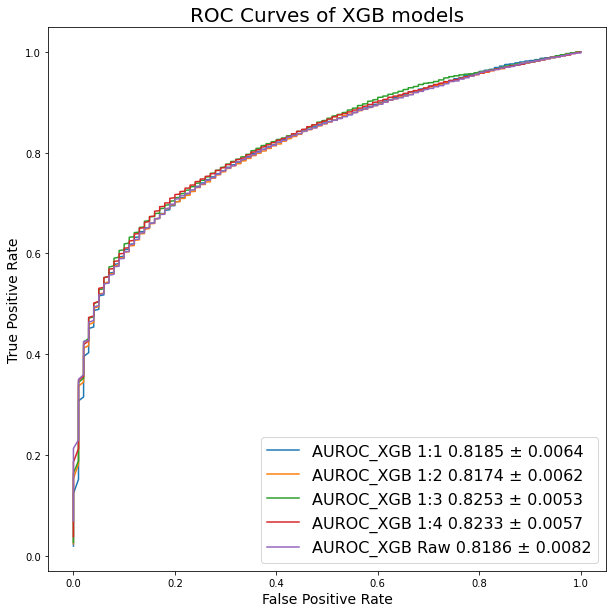

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of XGB models',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphx11), label=f'AUROC_XGB 1:1 {auc_mean_x11} ± {aucs_cid_x11}')
plt.plot( lins, np.asarray(auroc_graphx12), label=f'AUROC_XGB 1:2 {auc_mean_x12} ± {aucs_cid_x12}')
plt.plot( lins, np.asarray(auroc_graphx13), label=f'AUROC_XGB 1:3 {auc_mean_x13} ± {aucs_cid_x13}')
plt.plot( lins, np.asarray(auroc_graphx14), label=f'AUROC_XGB 1:4 {auc_mean_x14} ± {aucs_cid_x14}')
plt.plot( lins, np.asarray(auroc_graphx10), label=f'AUROC_XGB Raw {auc_mean_x10} ± {aucs_cid_x10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

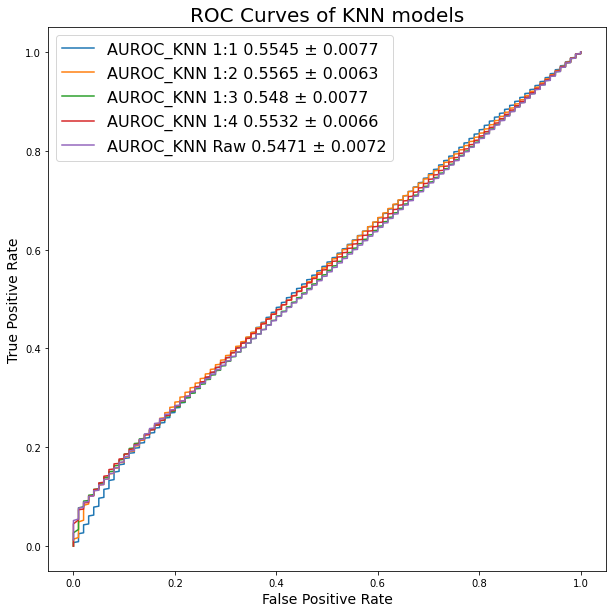

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of KNN models',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphk11), label=f'AUROC_KNN 1:1 {auc_mean_k11} ± {aucs_cid_k11}')
plt.plot( lins, np.asarray(auroc_graphk12), label=f'AUROC_KNN 1:2 {auc_mean_k12} ± {aucs_cid_k12}')
plt.plot( lins, np.asarray(auroc_graphk13), label=f'AUROC_KNN 1:3 {auc_mean_k13} ± {aucs_cid_k13}')
plt.plot( lins, np.asarray(auroc_graphk14), label=f'AUROC_KNN 1:4 {auc_mean_k14} ± {aucs_cid_k14}')
plt.plot( lins, np.asarray(auroc_graphk10), label=f'AUROC_KNN Raw {auc_mean_k10} ± {aucs_cid_k10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

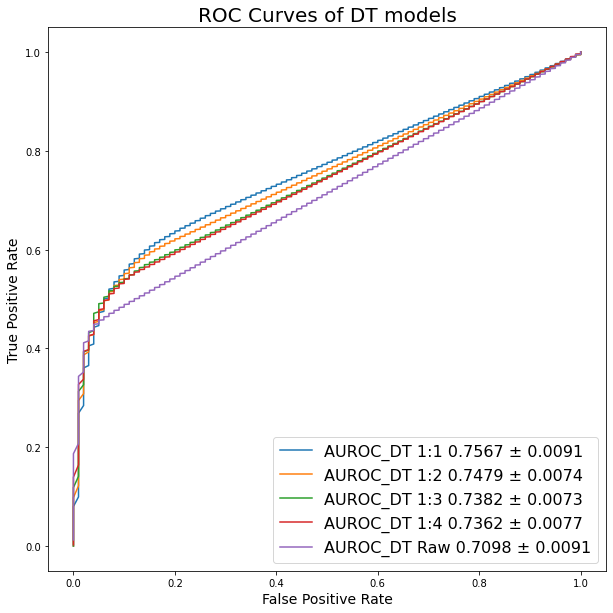

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of DT models',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphc11), label=f'AUROC_DT 1:1 {auc_mean_c11} ± {aucs_cid_c11}')
plt.plot( lins, np.asarray(auroc_graphc12), label=f'AUROC_DT 1:2 {auc_mean_c12} ± {aucs_cid_c12}')
plt.plot( lins, np.asarray(auroc_graphc13), label=f'AUROC_DT 1:3 {auc_mean_c13} ± {aucs_cid_c13}')
plt.plot( lins, np.asarray(auroc_graphc14), label=f'AUROC_DT 1:4 {auc_mean_c14} ± {aucs_cid_c14}')
plt.plot( lins, np.asarray(auroc_graphc10), label=f'AUROC_DT Raw {auc_mean_c10} ± {aucs_cid_c10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

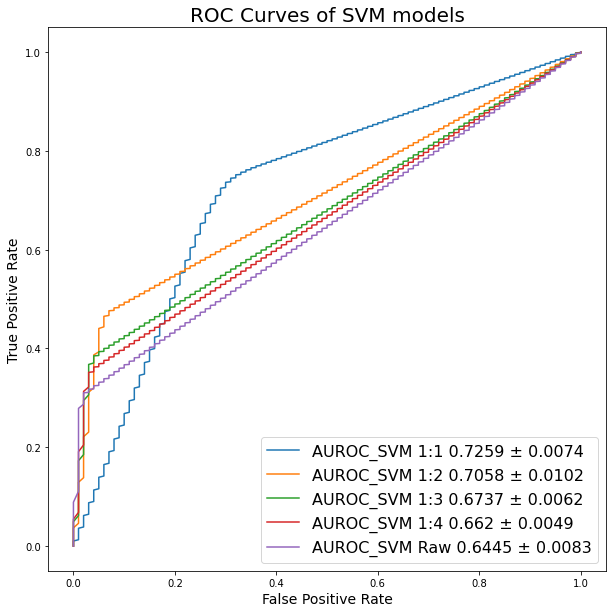

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of SVM models',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphs11), label=f'AUROC_SVM 1:1 {auc_mean_s11} ± {aucs_cid_s11}')
plt.plot( lins, np.asarray(auroc_graphs12), label=f'AUROC_SVM 1:2 {auc_mean_s12} ± {aucs_cid_s12}')
plt.plot( lins, np.asarray(auroc_graphs13), label=f'AUROC_SVM 1:3 {auc_mean_s13} ± {aucs_cid_s13}')
plt.plot( lins, np.asarray(auroc_graphs14), label=f'AUROC_SVM 1:4 {auc_mean_s14} ± {aucs_cid_s14}')
plt.plot( lins, np.asarray(auroc_graphs10), label=f'AUROC_SVM Raw {auc_mean_s10} ± {aucs_cid_s10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

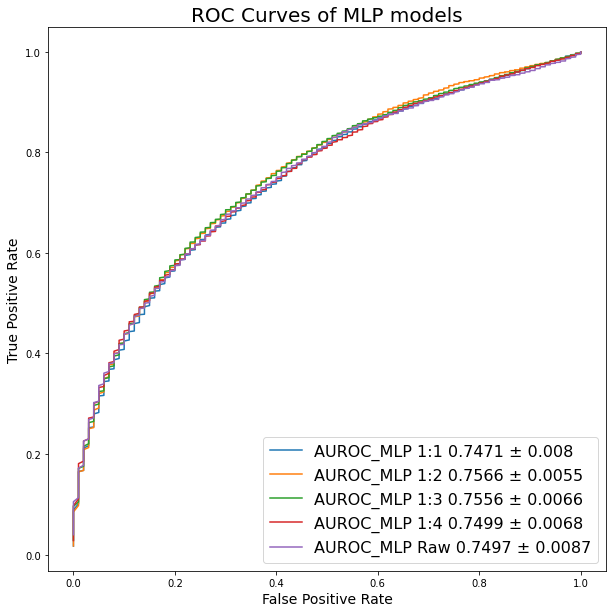

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of MLP models',fontsize=20)

plt.plot( lins, np.asarray(auroc_graphm11), label=f'AUROC_MLP 1:1 {auc_mean_m11} ± {aucs_cid_m11}')
plt.plot( lins, np.asarray(auroc_graphm12), label=f'AUROC_MLP 1:2 {auc_mean_m12} ± {aucs_cid_m12}')
plt.plot( lins, np.asarray(auroc_graphm13), label=f'AUROC_MLP 1:3 {auc_mean_m13} ± {aucs_cid_m13}')
plt.plot( lins, np.asarray(auroc_graphm14), label=f'AUROC_MLP 1:4 {auc_mean_m14} ± {aucs_cid_m14}')
plt.plot( lins, np.asarray(auroc_graphm10), label=f'AUROC_MLP Raw {auc_mean_m10} ± {aucs_cid_m10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

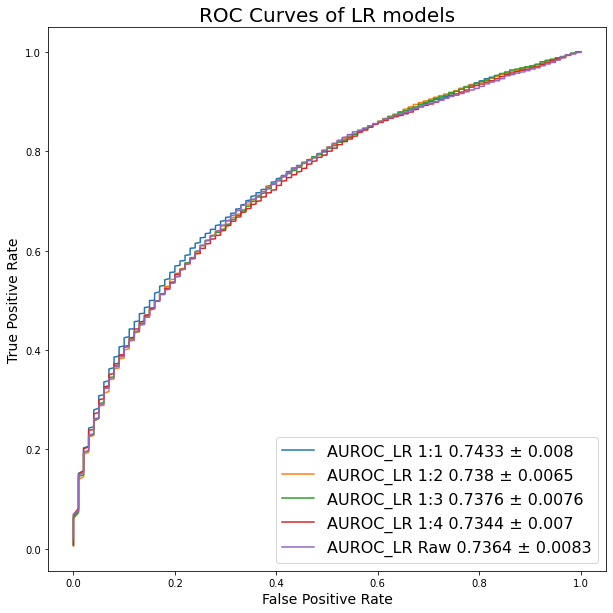

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of LR models',fontsize=20)
plt.plot( lins, np.asarray(auroc_graphl11), label=f'AUROC_LR 1:1 {auc_mean_l11} ± {aucs_cid_l11}')
plt.plot( lins, np.asarray(auroc_graphl12), label=f'AUROC_LR 1:2 {auc_mean_l12} ± {aucs_cid_l12}')
plt.plot( lins, np.asarray(auroc_graphl13), label=f'AUROC_LR 1:3 {auc_mean_l13} ± {aucs_cid_l13}')
plt.plot( lins, np.asarray(auroc_graphl14), label=f'AUROC_LR 1:4 {auc_mean_l14} ± {aucs_cid_l14}')
plt.plot( lins, np.asarray(auroc_graphl10), label=f'AUROC_LR Raw {auc_mean_l10} ± {aucs_cid_l10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

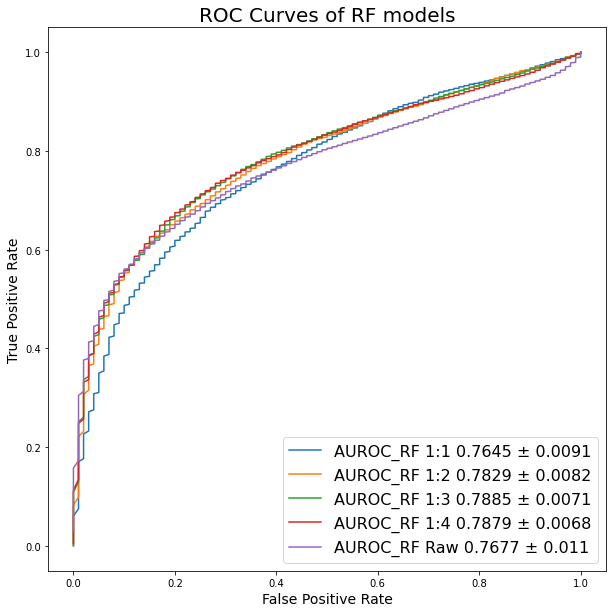

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of RF models',fontsize=20)
plt.plot( lins, np.asarray(auroc_graphr11), label=f'AUROC_RF 1:1 {auc_mean_r11} ± {aucs_cid_r11}')
plt.plot( lins, np.asarray(auroc_graphr12), label=f'AUROC_RF 1:2 {auc_mean_r12} ± {aucs_cid_r12}')
plt.plot( lins, np.asarray(auroc_graphr13), label=f'AUROC_RF 1:3 {auc_mean_r13} ± {aucs_cid_r13}')
plt.plot( lins, np.asarray(auroc_graphr14), label=f'AUROC_RF 1:4 {auc_mean_r14} ± {aucs_cid_r14}')
plt.plot( lins, np.asarray(auroc_graphr10), label=f'AUROC_RF Raw {auc_mean_r10} ± {aucs_cid_r10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

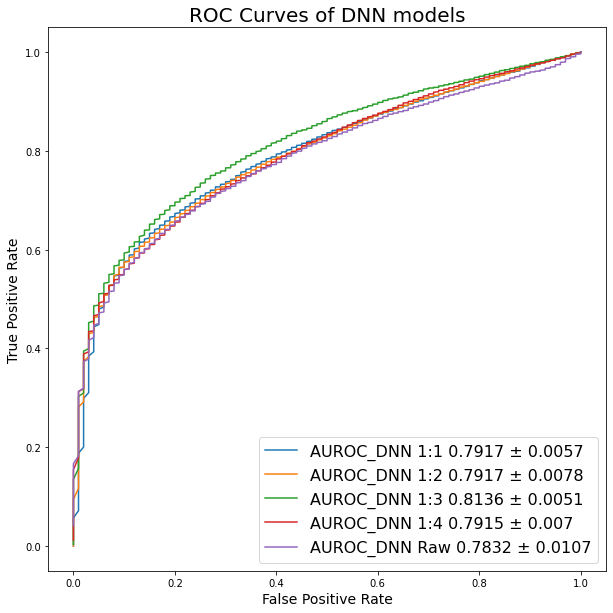

In [ ]:
plt.figure(figsize=(10,10))
plt.title('ROC Curves of DNN models',fontsize=20)
plt.plot( lins, np.asarray(auroc_graphd11), label=f'AUROC_DNN 1:1 {auc_mean_d11} ± {aucs_cid_d11}')
plt.plot( lins, np.asarray(auroc_graphd12), label=f'AUROC_DNN 1:2 {auc_mean_d12} ± {aucs_cid_d12}')
plt.plot( lins, np.asarray(auroc_graphd13), label=f'AUROC_DNN 1:3 {auc_mean_d13} ± {aucs_cid_d13}')
plt.plot( lins, np.asarray(auroc_graphd14), label=f'AUROC_DNN 1:4 {auc_mean_d14} ± {aucs_cid_d14}')
plt.plot( lins, np.asarray(auroc_graphd10), label=f'AUROC_DNN Raw {auc_mean_d10} ± {aucs_cid_d10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

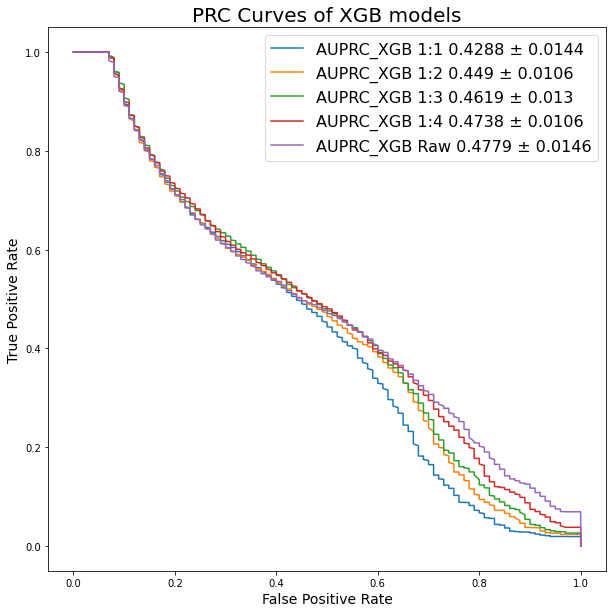

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of XGB models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphx11), label=f'AUPRC_XGB 1:1 {prc_mean_x11} ± {prcs_cid_x11}')
plt.plot( lins, np.asarray(auprc_graphx12), label=f'AUPRC_XGB 1:2 {prc_mean_x12} ± {prcs_cid_x12}')
plt.plot( lins, np.asarray(auprc_graphx13), label=f'AUPRC_XGB 1:3 {prc_mean_x13} ± {prcs_cid_x13}')
plt.plot( lins, np.asarray(auprc_graphx14), label=f'AUPRC_XGB 1:4 {prc_mean_x14} ± {prcs_cid_x14}')
plt.plot( lins, np.asarray(auprc_graphx10), label=f'AUPRC_XGB Raw {prc_mean_x10} ± {prcs_cid_x10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

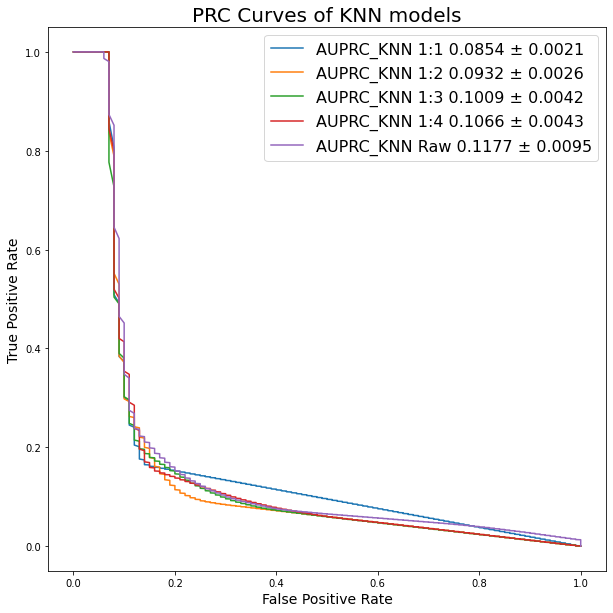

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of KNN models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphk11), label=f'AUPRC_KNN 1:1 {prc_mean_k11} ± {prcs_cid_k11}')
plt.plot( lins, np.asarray(auprc_graphk12), label=f'AUPRC_KNN 1:2 {prc_mean_k12} ± {prcs_cid_k12}')
plt.plot( lins, np.asarray(auprc_graphk13), label=f'AUPRC_KNN 1:3 {prc_mean_k13} ± {prcs_cid_k13}')
plt.plot( lins, np.asarray(auprc_graphk14), label=f'AUPRC_KNN 1:4 {prc_mean_k14} ± {prcs_cid_k14}')
plt.plot( lins, np.asarray(auprc_graphk10), label=f'AUPRC_KNN Raw {prc_mean_k10} ± {prcs_cid_k10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(loc='upper right',fontsize=16)

# show the plot
plt.show()

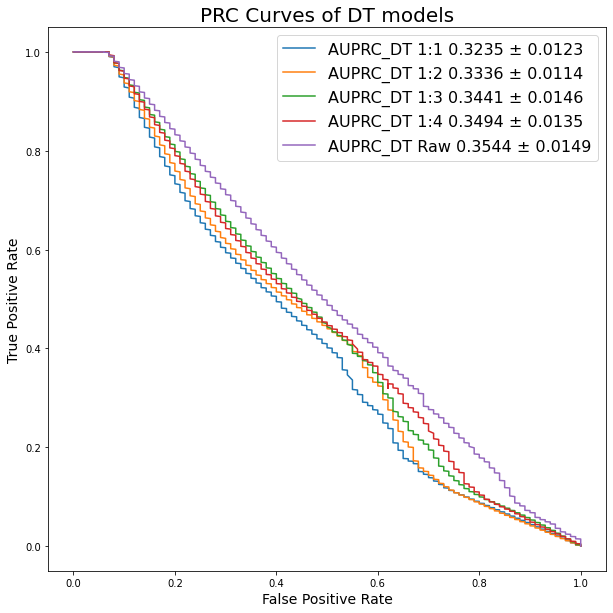

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of DT models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphc11), label=f'AUPRC_DT 1:1 {prc_mean_c11} ± {prcs_cid_c11}')
plt.plot( lins, np.asarray(auprc_graphc12), label=f'AUPRC_DT 1:2 {prc_mean_c12} ± {prcs_cid_c12}')
plt.plot( lins, np.asarray(auprc_graphc13), label=f'AUPRC_DT 1:3 {prc_mean_c13} ± {prcs_cid_c13}')
plt.plot( lins, np.asarray(auprc_graphc14), label=f'AUPRC_DT 1:4 {prc_mean_c14} ± {prcs_cid_c14}')
plt.plot( lins, np.asarray(auprc_graphc10), label=f'AUPRC_DT Raw {prc_mean_c10} ± {prcs_cid_c10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

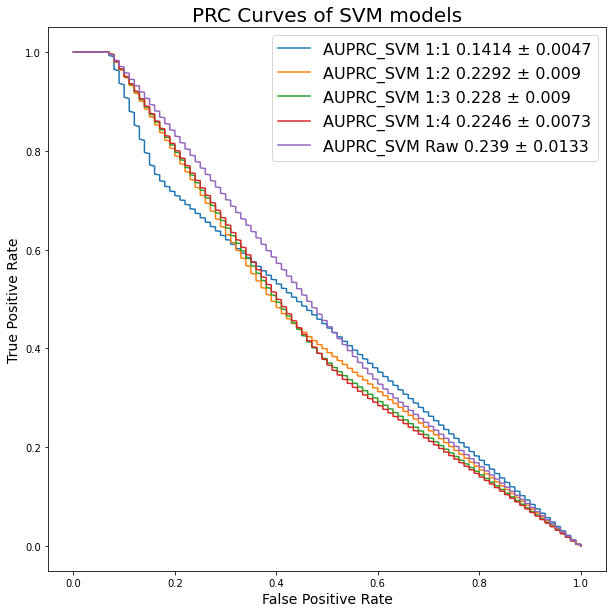

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of SVM models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphs11), label=f'AUPRC_SVM 1:1 {prc_mean_s11} ± {prcs_cid_s11}')
plt.plot( lins, np.asarray(auprc_graphs12), label=f'AUPRC_SVM 1:2 {prc_mean_s12} ± {prcs_cid_s12}')
plt.plot( lins, np.asarray(auprc_graphs13), label=f'AUPRC_SVM 1:3 {prc_mean_s13} ± {prcs_cid_s13}')
plt.plot( lins, np.asarray(auprc_graphs14), label=f'AUPRC_SVM 1:4 {prc_mean_s14} ± {prcs_cid_s14}')
plt.plot( lins, np.asarray(auprc_graphs10), label=f'AUPRC_SVM Raw {prc_mean_s10} ± {prcs_cid_s10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

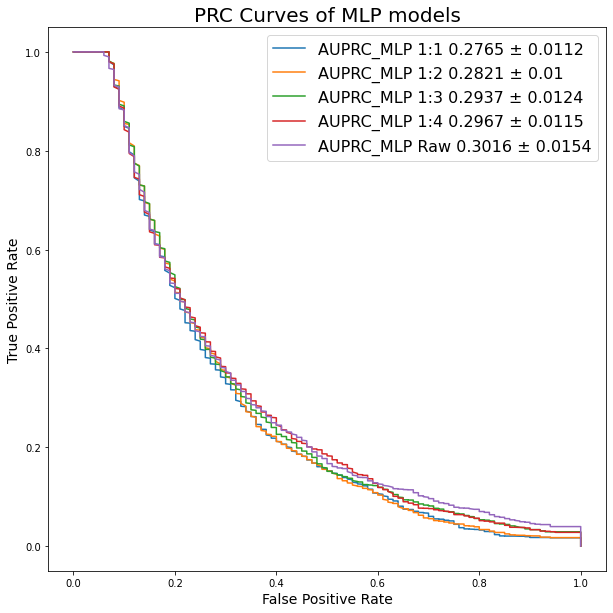

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of MLP models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphm11), label=f'AUPRC_MLP 1:1 {prc_mean_m11} ± {prcs_cid_m11}')
plt.plot( lins, np.asarray(auprc_graphm12), label=f'AUPRC_MLP 1:2 {prc_mean_m12} ± {prcs_cid_m12}')
plt.plot( lins, np.asarray(auprc_graphm13), label=f'AUPRC_MLP 1:3 {prc_mean_m13} ± {prcs_cid_m13}')
plt.plot( lins, np.asarray(auprc_graphm14), label=f'AUPRC_MLP 1:4 {prc_mean_m14} ± {prcs_cid_m14}')
plt.plot( lins, np.asarray(auprc_graphm10), label=f'AUPRC_MLP Raw {prc_mean_m10} ± {prcs_cid_m10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

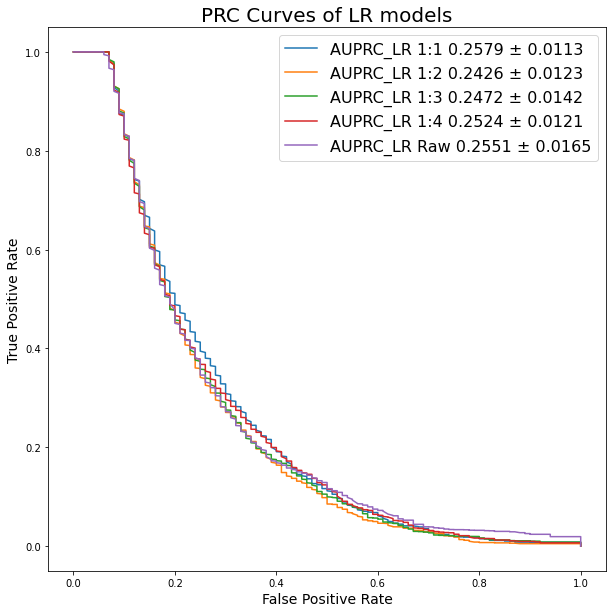

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of LR models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphl11), label=f'AUPRC_LR 1:1 {prc_mean_l11} ± {prcs_cid_l11}')
plt.plot( lins, np.asarray(auprc_graphl12), label=f'AUPRC_LR 1:2 {prc_mean_l12} ± {prcs_cid_l12}')
plt.plot( lins, np.asarray(auprc_graphl13), label=f'AUPRC_LR 1:3 {prc_mean_l13} ± {prcs_cid_l13}')
plt.plot( lins, np.asarray(auprc_graphl14), label=f'AUPRC_LR 1:4 {prc_mean_l14} ± {prcs_cid_l14}')
plt.plot( lins, np.asarray(auprc_graphl10), label=f'AUPRC_LR Raw {prc_mean_l10} ± {prcs_cid_l10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

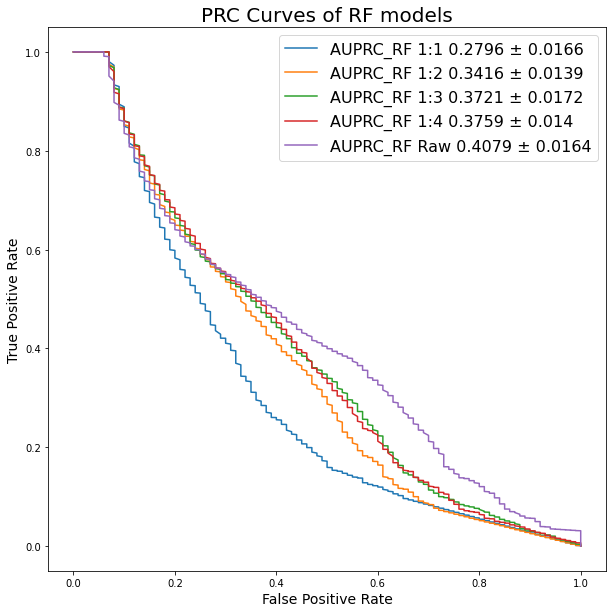

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of RF models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphr11), label=f'AUPRC_RF 1:1 {prc_mean_r11} ± {prcs_cid_r11}')
plt.plot( lins, np.asarray(auprc_graphr12), label=f'AUPRC_RF 1:2 {prc_mean_r12} ± {prcs_cid_r12}')
plt.plot( lins, np.asarray(auprc_graphr13), label=f'AUPRC_RF 1:3 {prc_mean_r13} ± {prcs_cid_r13}')
plt.plot( lins, np.asarray(auprc_graphr14), label=f'AUPRC_RF 1:4 {prc_mean_r14} ± {prcs_cid_r14}')
plt.plot( lins, np.asarray(auprc_graphr10), label=f'AUPRC_RF Raw {prc_mean_r10} ± {prcs_cid_r10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

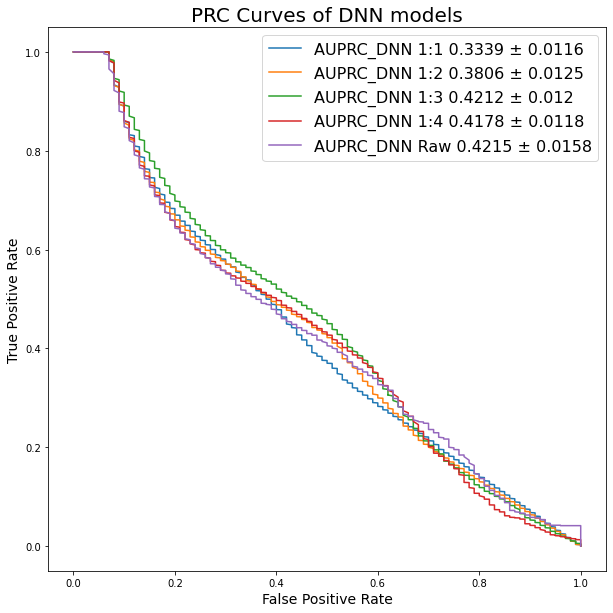

In [ ]:
plt.figure(figsize=(10,10))
plt.title('PRC Curves of DNN models',fontsize=20)
plt.plot( lins, np.asarray(auprc_graphd11), label=f'AUPRC_DNN 1:1 {prc_mean_d11} ± {prcs_cid_d11}')
plt.plot( lins, np.asarray(auprc_graphd12), label=f'AUPRC_DNN 1:2 {prc_mean_d12} ± {prcs_cid_d12}')
plt.plot( lins, np.asarray(auprc_graphd13), label=f'AUPRC_DNN 1:3 {prc_mean_d13} ± {prcs_cid_d13}')
plt.plot( lins, np.asarray(auprc_graphd14), label=f'AUPRC_DNN 1:4 {prc_mean_d14} ± {prcs_cid_d14}')
plt.plot( lins, np.asarray(auprc_graphd10), label=f'AUPRC_DNN Raw {prc_mean_d10} ± {prcs_cid_d10}')

# axis labels
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)

# show the legend
plt.legend(fontsize=16)

# show the plot
plt.show()

In [ ]:
X_tf = df_transfusion[var_list2]
X_tf.fillna(df_transfusion.median(), inplace=True)
y_tf = df_transfusion['Intraop_transfusion']
X_train, X_test, y_train, y_test = train_test_split(X_tf, y_tf, test_size=0.2, shuffle=True)
tf_xgb = xgb.XGBClassifier(gamma=0,learning_rate=0.05,max_depth=4,min_child_weight=1,n_estimators=200)
tf_xgb.fit(X=X_train, y=y_train, verbose=0)

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


XGBClassifier(learning_rate=0.05, max_depth=4, n_estimators=200)

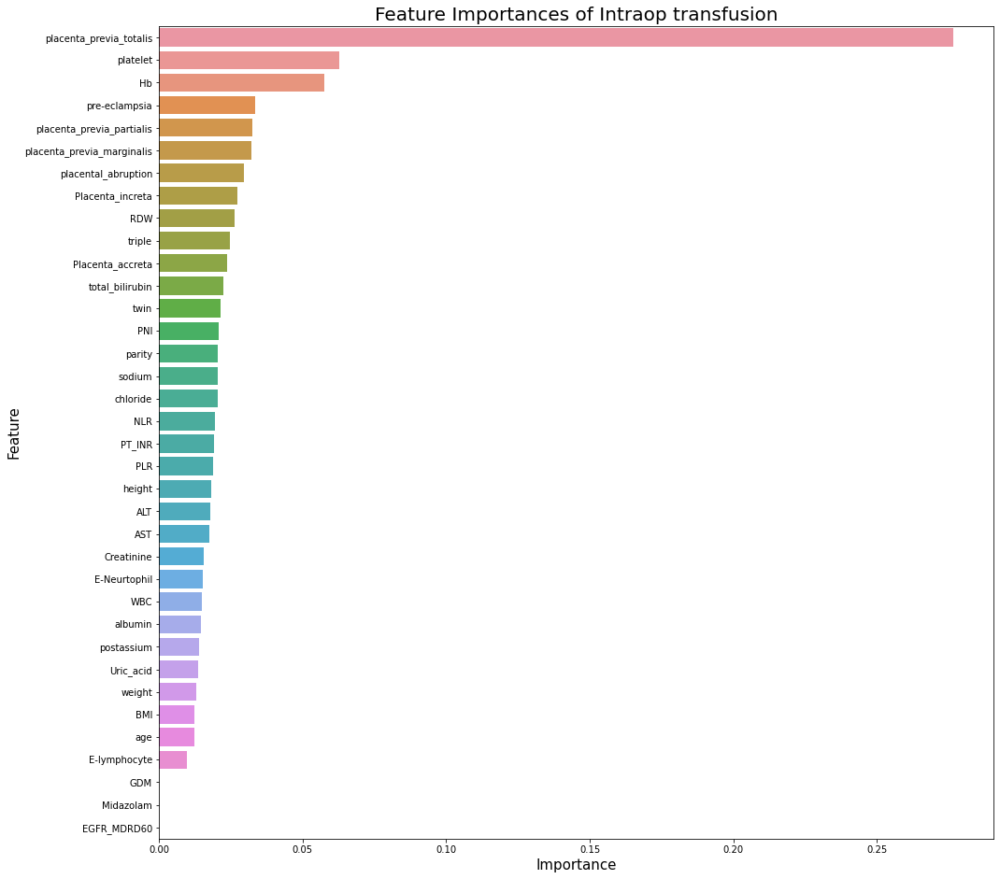

In [ ]:
tmp = pd.DataFrame(tf_xgb.feature_importances_, X_train.columns, columns=['importance'])
tmp.index = tmp.index.set_names(['feature'])
tmp = tmp.reset_index()

plt.figure(figsize=(16, 16))
sns.barplot(data=tmp.sort_values(by='importance', ascending=False), x='importance', y='feature' )
plt.title('Feature Importances of Intraop transfusion',fontsize=20)
plt.xlabel('Importance',fontsize=15)
plt.ylabel('Feature',fontsize=15)
plt.show()

In [ ]:
#X_transfusion = df_transfusion[var_list2]

## Missing Imputation
#X_transfusion.fillna(df_transfusion.median(), inplace=True)
#y_transfusion = df_transfusion['Intraop_transfusion']

#feature = X_transfusion.columns
## Train Test Split
#X_train1, X_test1, y_train1, y_test1 = train_test_split(X_transfusion, y_transfusion1, test_size=0.2, stratify=y_transfusion1, shuffle=True)

#scaler = StandardScaler()
#scaler.fit(X_train1)

#scaler.fit(X_transfusion)
#X_train1 = pd.DataFrame(X_train1,columns=feature)

#X_transfusion = pd.DataFrame(X_transfusion,columns=feature)
#y_transfusion = pd.DataFrame(y_transfusion,columns=['Intraop_transfusion'])
#y_train1 = pd.DataFrame(y_train1,columns=['Intraop_transfusion'])
#X_transfusion_scaled = pd.DataFrame(scaler.transform(X_transfusion))

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
X_transfusiont1 = df_transfusiont1[var_list2]
X_transfusiont1.fillna(df_transfusiont1.median(), inplace=True)
y_transfusiont1 = df_transfusiont1['Intraop_transfusion']

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
feature = X_transfusion_11.columns

In [ ]:
X_train11, X_test11, y_train11, y_test11 = train_test_split(X_transfusion_11, y_transfusion_11, test_size=0.2, stratify=y_transfusion_11, shuffle=True)

In [ ]:
X_train12, X_test12, y_train12, y_test12 = train_test_split(X_transfusion_12, y_transfusion_12, test_size=0.2, stratify=y_transfusion_12, shuffle=True)

In [ ]:
X_train13, X_test13, y_train13, y_test13 = train_test_split(X_transfusion_13, y_transfusion_13, test_size=0.2, stratify=y_transfusion_13, shuffle=True)

In [ ]:
X_train14, X_test14, y_train14, y_test14 = train_test_split(X_transfusion_14, y_transfusion_14, test_size=0.2, stratify=y_transfusion_14, shuffle=True)

In [ ]:
scaler = StandardScaler()

In [ ]:
scaler.fit(X_transfusiont1)
X_transfusiont1 = pd.DataFrame(X_transfusiont1,columns=feature)
X_transfusiont1_scaled = pd.DataFrame(scaler.transform(X_transfusiont1))

In [ ]:
scaler.fit(X_transfusiont2)
X_transfusiont2 = pd.DataFrame(X_transfusiont2,columns=feature)
X_transfusiont2_scaled = pd.DataFrame(scaler.transform(X_transfusiont2))

In [ ]:
scaler.fit(X_transfusiont3)
X_transfusiont3 = pd.DataFrame(X_transfusiont3,columns=feature)
X_transfusiont3_scaled = pd.DataFrame(scaler.transform(X_transfusiont3))

In [ ]:
scaler.fit(X_transfusiont4)
X_transfusiont4 = pd.DataFrame(X_transfusiont4,columns=feature)
X_transfusiont4_scaled = pd.DataFrame(scaler.transform(X_transfusiont4))

In [ ]:
scaler.fit(X_train11)
X_train11 = pd.DataFrame(X_train11,columns=feature)
X_train11_scaled = pd.DataFrame(scaler.transform(X_train11))
scaler.fit(X_test11)
X_test11 = pd.DataFrame(X_test11,columns=feature)
X_test11_scaled = pd.DataFrame(scaler.transform(X_test11))

In [ ]:
scaler.fit(X_train12)
X_train12 = pd.DataFrame(X_train12,columns=feature)
X_train12_scaled = pd.DataFrame(scaler.transform(X_train12))
scaler.fit(X_test12)
X_test12 = pd.DataFrame(X_test12,columns=feature)
X_test12_scaled = pd.DataFrame(scaler.transform(X_test12))

In [ ]:
scaler.fit(X_train13)
X_train13 = pd.DataFrame(X_train13,columns=feature)
X_train13_scaled = pd.DataFrame(scaler.transform(X_train13))
scaler.fit(X_test13)
X_test13 = pd.DataFrame(X_test13,columns=feature)
X_test13_scaled = pd.DataFrame(scaler.transform(X_test13))

In [ ]:
scaler.fit(X_train14)
X_train14 = pd.DataFrame(X_train14,columns=feature)
X_train14_scaled = pd.DataFrame(scaler.transform(X_train14))
scaler.fit(X_test14)
X_test14 = pd.DataFrame(X_test14,columns=feature)
X_test14_scaled = pd.DataFrame(scaler.transform(X_test14))

In [ ]:
def my_model(hidden_layer_num, node_size, batch_normalization, drop_out, drop_out_rate, learning_rate):

    ### clear memory
    if K.backend() == 'tensorflow':
        K.clear_session()

    model = keras.Sequential()

    ### Input Layer
    model.add(keras.layers.InputLayer(input_shape=(36,)))

    ### Hidden Layer
    for i in range(hidden_layer_num):
        model.add(keras.layers.Dense(node_size))
        if batch_normalization: model.add(keras.layers.BatchNormalization())
        model.add(keras.layers.ReLU())
        if drop_out: model.add(keras.layers.Dropout(drop_out_rate))

    ### Output Layer
    model.add(keras.layers.Dense(1, activation='sigmoid'))

    ### Compile
    model.compile(optimizer= keras.optimizers.Adam(learning_rate),
                  loss='binary_crossentropy',
                  metrics=["accuracy"])

    return model

In [ ]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_auroc', mode='max', verbose=1, patience=10, restore_best_weights=True)

In [ ]:
transfusion_dnn11 = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
transfusion_dnn12 = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
transfusion_dnn13 = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)
transfusion_dnn14 = my_model(hidden_layer_num=5, node_size=1024, drop_out=True, drop_out_rate=0.5, batch_normalization=True,learning_rate=0.005)

In [ ]:
transfusion_dnn11.fit(X_train11_scaled, y_train11, batch_size=512, epochs=50, validation_data=(X_test11_scaled, y_test11),callbacks=[es],  shuffle=True)
transfusion_dnn12.fit(X_train12_scaled, y_train12, batch_size=512, epochs=50, validation_data=(X_test12_scaled, y_test12),callbacks=[es],  shuffle=True)
transfusion_dnn13.fit(X_train13_scaled, y_train13, batch_size=512, epochs=50, validation_data=(X_test13_scaled, y_test13),callbacks=[es],  shuffle=True)
transfusion_dnn14.fit(X_train14_scaled, y_train14, batch_size=512, epochs=50, validation_data=(X_test14_scaled, y_test14),callbacks=[es],  shuffle=True)

In [ ]:
y_test11_proba_dnn = transfusion_dnn11.predict(X_transfusiont1_scaled)
y_test12_proba_dnn = transfusion_dnn12.predict(X_transfusiont2_scaled)
y_test13_proba_dnn = transfusion_dnn13.predict(X_transfusiont3_scaled)
y_test14_proba_dnn = transfusion_dnn14.predict(X_transfusiont4_scaled)

fpr11_dnn, tpr11_dnn, _ = roc_curve(y_transfusiont1, y_test11_proba_dnn)
fpr12_dnn, tpr12_dnn, _ = roc_curve(y_transfusiont2, y_test12_proba_dnn)
fpr13_dnn, tpr13_dnn, _ = roc_curve(y_transfusiont3, y_test13_proba_dnn)
fpr14_dnn, tpr14_dnn, _ = roc_curve(y_transfusiont4, y_test14_proba_dnn)


prec11_dnn, recall11_dnn, _ = precision_recall_curve(y_transfusiont1, y_test11_proba_dnn)
prec12_dnn, recall12_dnn, _ = precision_recall_curve(y_transfusiont2, y_test12_proba_dnn)
prec13_dnn, recall13_dnn, _ = precision_recall_curve(y_transfusiont3, y_test13_proba_dnn)
prec14_dnn, recall14_dnn, _ = precision_recall_curve(y_transfusiont4, y_test14_proba_dnn)

print("Intra tranfusion ROC on 1:1 model: {}".format(roc_auc_score(y_transfusiont1, y_test11_proba_dnn)))
print("Intra tranfusion ROC on 1:2 model: {}".format(roc_auc_score(y_transfusiont2, y_test12_proba_dnn)))
print("Intra tranfusion ROC on 1:3 model: {}".format(roc_auc_score(y_transfusiont3, y_test13_proba_dnn)))
print("Intra tranfusion ROC on 1:4 model: {}".format(roc_auc_score(y_transfusiont4, y_test14_proba_dnn)))

print("Intra tranfusion PRC on 1:1 model: {}".format(average_precision_score(y_transfusiont1, y_test11_proba_dnn)))
print("Intra tranfusion PRC on 1:2 model: {}".format(average_precision_score(y_transfusiont2, y_test12_proba_dnn)))
print("Intra tranfusion PRC on 1:3 model: {}".format(average_precision_score(y_transfusiont3, y_test13_proba_dnn)))
print("Intra tranfusion PRC on 1:4 model: {}".format(average_precision_score(y_transfusiont4, y_test14_proba_dnn)))

255/255 [==============================] - 3s 12ms/step
Intra tranfusion ROC on 1:1 model: 0.8729118248813141
Intra tranfusion ROC on 1:2 model: 0.874236900203712
Intra tranfusion ROC on 1:3 model: 0.883950671358597
Intra tranfusion ROC on 1:4 model: 0.8946013155633914
Intra tranfusion PRC on 1:1 model: 0.390753132501678
Intra tranfusion PRC on 1:2 model: 0.35948734718014047
Intra tranfusion PRC on 1:3 model: 0.38072836179327163
Intra tranfusion PRC on 1:4 model: 0.4430405067601121


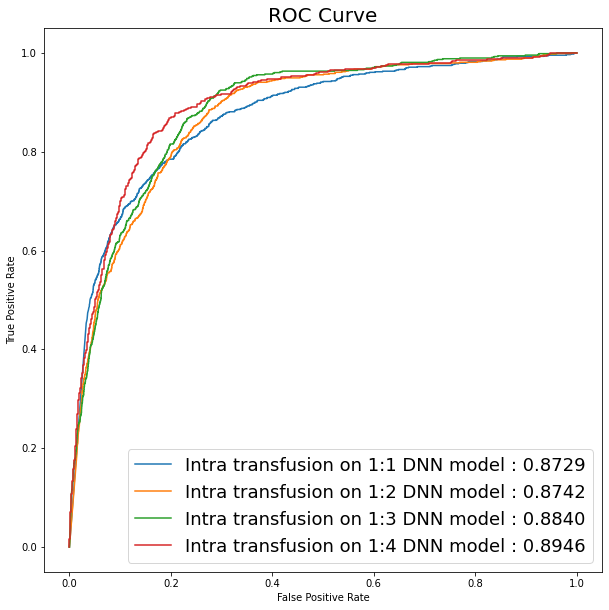

In [ ]:
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve',fontsize=20)
plt.plot(fpr11_dnn, tpr11_dnn,label='Intra transfusion on 1:1 DNN model : %.4f' %(roc_auc_score(y_transfusiont1, y_test11_proba_dnn)))
plt.plot(fpr12_dnn, tpr12_dnn,label='Intra transfusion on 1:2 DNN model : %.4f' %(roc_auc_score(y_transfusiont2, y_test12_proba_dnn)))
plt.plot(fpr13_dnn, tpr13_dnn,label='Intra transfusion on 1:3 DNN model : %.4f' %(roc_auc_score(y_transfusiont3, y_test13_proba_dnn)))
plt.plot(fpr14_dnn, tpr14_dnn,label='Intra transfusion on 1:4 DNN model : %.4f' %(roc_auc_score(y_transfusiont4, y_test14_proba_dnn)))
plt.legend(fontsize=18)
plt.show()

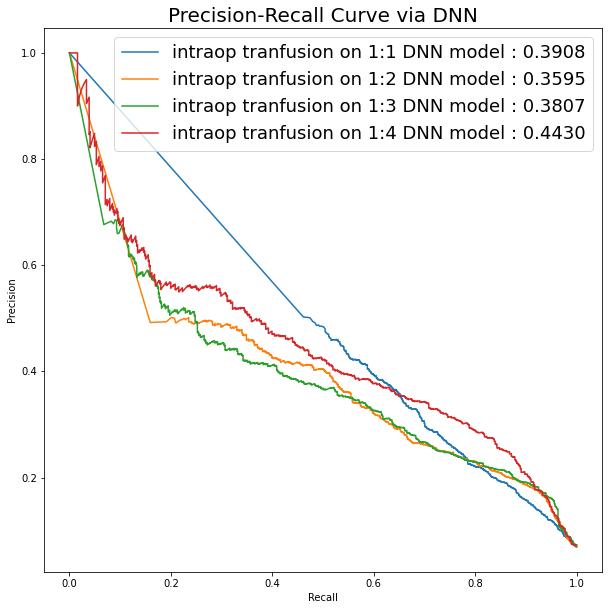

In [ ]:
plt.figure(figsize=(10,10))

plt.plot(recall11_dnn, prec11_dnn,label='intraop tranfusion on 1:1 DNN model : %.4f' %(average_precision_score(y_transfusiont1, y_test11_proba_dnn)))
plt.plot(recall12_dnn, prec12_dnn,label='intraop tranfusion on 1:2 DNN model : %.4f' %(average_precision_score(y_transfusiont2, y_test12_proba_dnn)))
plt.plot(recall13_dnn, prec13_dnn,label='intraop tranfusion on 1:3 DNN model : %.4f' %(average_precision_score(y_transfusiont3, y_test13_proba_dnn)))
plt.plot(recall14_dnn, prec14_dnn,label='intraop tranfusion on 1:4 DNN model : %.4f' %(average_precision_score(y_transfusiont4, y_test14_proba_dnn)))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve via DNN',fontsize=20)
plt.legend(fontsize=18)
plt.show()

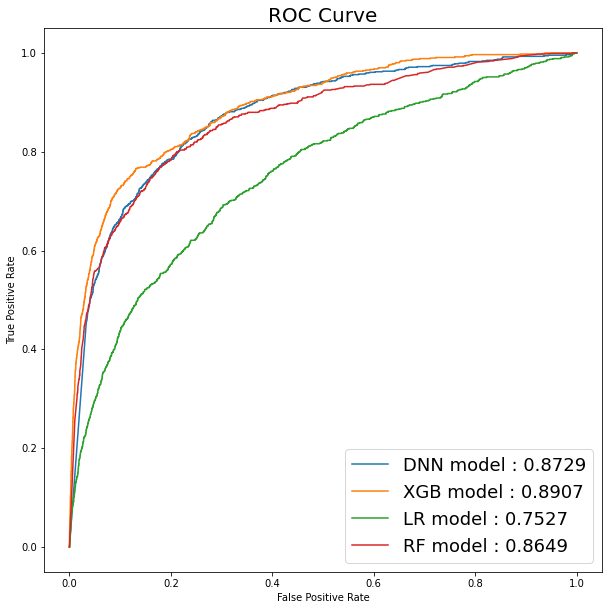

In [ ]:
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve',fontsize=20)
plt.plot(fpr11_dnn, tpr11_dnn,label='DNN model : %.4f' %(roc_auc_score(y_transfusiont1, y_test11_proba_dnn)))
plt.plot(fprx11, tprx11,label='XGB model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_x11[:, 1])))
plt.plot(fprl11, tprl11,label='LR model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_l11[:, 1])))
plt.plot(fprr11, tprr11,label='RF model : %.4f' %(roc_auc_score(y_transfusiont1, y_test_proba_r11[:, 1])))
plt.legend(fontsize=18)
plt.show()

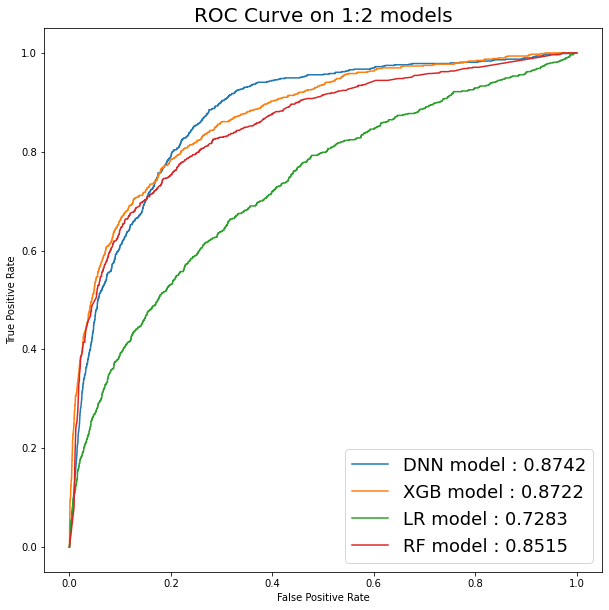

In [ ]:
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on 1:2 models',fontsize=20)
plt.plot(fpr12_dnn, tpr12_dnn,label='DNN model : %.4f' %(roc_auc_score(y_transfusiont2, y_test12_proba_dnn)))
plt.plot(fprx12, tprx12,label='XGB model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_x12[:, 1])))
plt.plot(fprl12, tprl12,label='LR model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_l12[:, 1])))
plt.plot(fprr12, tprr12,label='RF model : %.4f' %(roc_auc_score(y_transfusiont2, y_test_proba_r12[:, 1])))
plt.legend(fontsize=18)
plt.show()

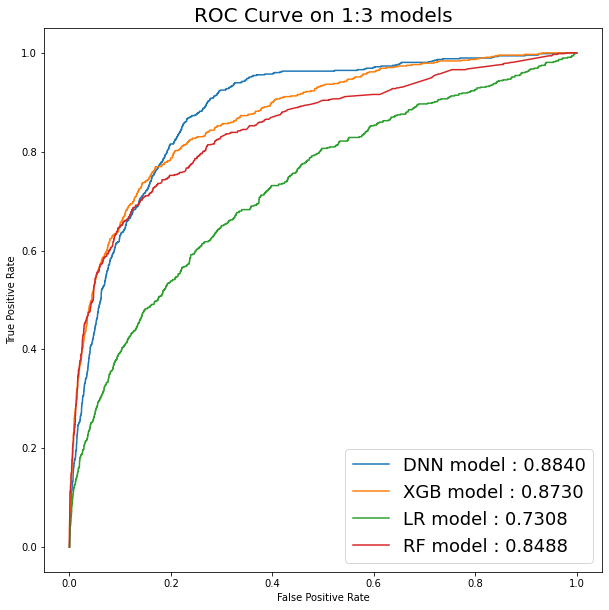

In [ ]:
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on 1:3 models',fontsize=20)
plt.plot(fpr13_dnn, tpr13_dnn,label='DNN model : %.4f' %(roc_auc_score(y_transfusiont3, y_test13_proba_dnn)))
plt.plot(fprx13, tprx13,label='XGB model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_x13[:, 1])))
plt.plot(fprl13, tprl13,label='LR model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_l13[:, 1])))
plt.plot(fprr13, tprr13,label='RF model : %.4f' %(roc_auc_score(y_transfusiont3, y_test_proba_r13[:, 1])))
plt.legend(fontsize=18)
plt.show()

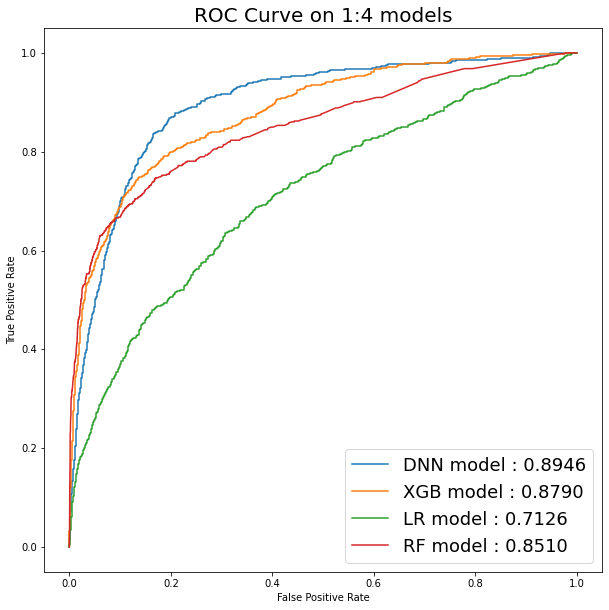

In [ ]:
plt.figure(figsize=(10,10))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on 1:4 models',fontsize=20)
plt.plot(fpr14_dnn, tpr14_dnn,label='DNN model : %.4f' %(roc_auc_score(y_transfusiont4, y_test14_proba_dnn)))
plt.plot(fprx14, tprx14,label='XGB model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_x14[:, 1])))
plt.plot(fprl14, tprl14,label='LR model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_l14[:, 1])))
plt.plot(fprr14, tprr14,label='RF model : %.4f' %(roc_auc_score(y_transfusiont4, y_test_proba_r14[:, 1])))
plt.legend(fontsize=18)
plt.show()

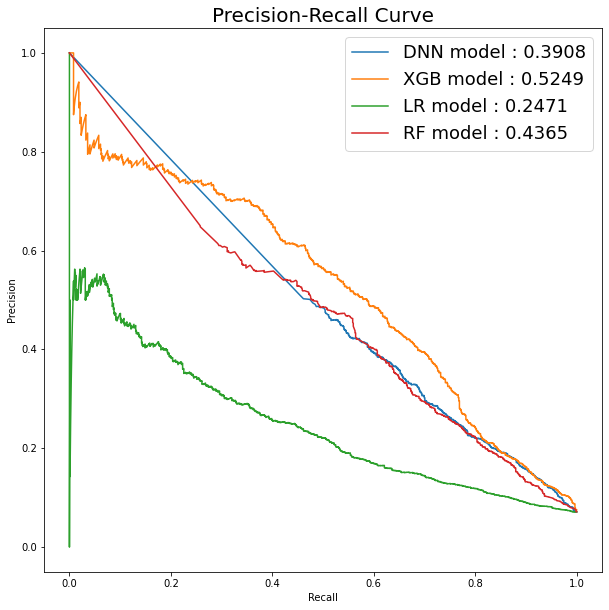

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(recall11_dnn, prec11_dnn,label='DNN model : %.4f' %(average_precision_score(y_transfusiont1, y_test11_proba_dnn)))
plt.plot(recallx11, precx11,label='XGB model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_x11[:, 1])))
plt.plot(recalll11, precl11,label='LR model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_l11[:, 1])))
plt.plot(recallr11, precr11,label='RF model : %.4f' %(average_precision_score(y_transfusiont1, y_test_proba_r11[:, 1])))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve',fontsize=20)
plt.legend(fontsize=18)
plt.show()

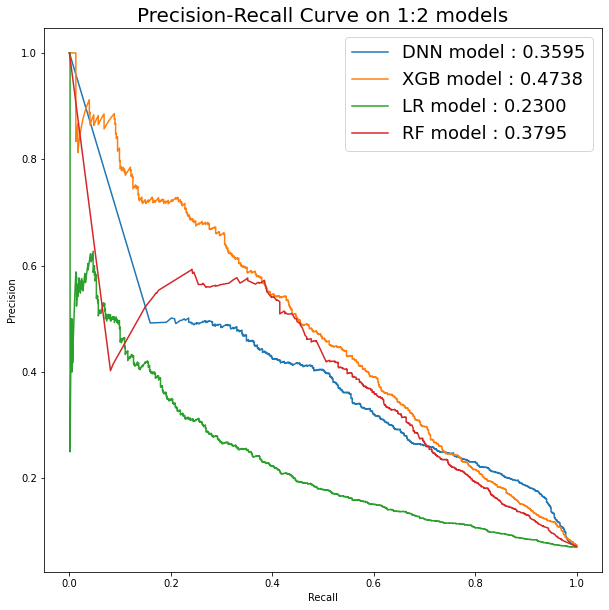

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(recall12_dnn, prec12_dnn,label='DNN model : %.4f' %(average_precision_score(y_transfusiont2, y_test12_proba_dnn)))
plt.plot(recallx12, precx12,label='XGB model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_x12[:, 1])))
plt.plot(recalll12, precl12,label='LR model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_l12[:, 1])))
plt.plot(recallr12, precr12,label='RF model : %.4f' %(average_precision_score(y_transfusiont2, y_test_proba_r12[:, 1])))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve on 1:2 models',fontsize=20)
plt.legend(fontsize=18)
plt.show()

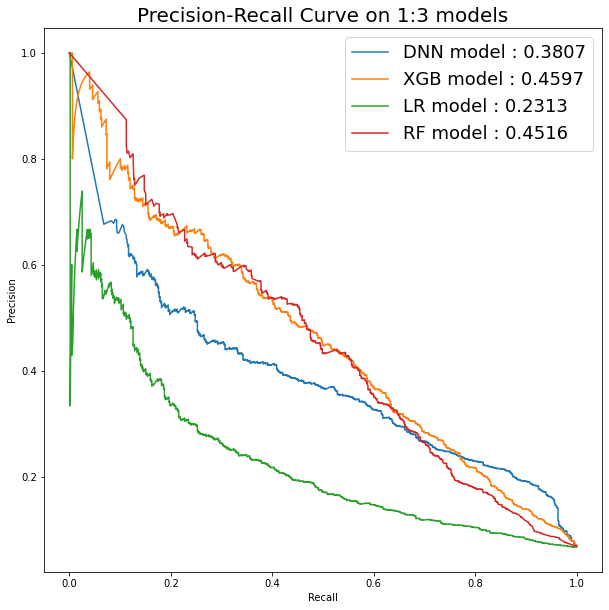

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(recall13_dnn, prec13_dnn,label='DNN model : %.4f' %(average_precision_score(y_transfusiont3, y_test13_proba_dnn)))
plt.plot(recallx13, precx13,label='XGB model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_x13[:, 1])))
plt.plot(recalll13, precl13,label='LR model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_l13[:, 1])))
plt.plot(recallr13, precr13,label='RF model : %.4f' %(average_precision_score(y_transfusiont3, y_test_proba_r13[:, 1])))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve on 1:3 models',fontsize=20)
plt.legend(fontsize=18)
plt.show()

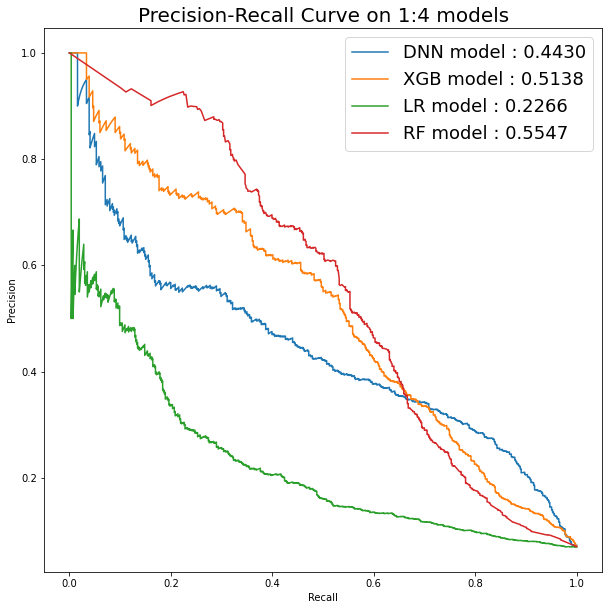

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(recall14_dnn, prec14_dnn,label='DNN model : %.4f' %(average_precision_score(y_transfusiont4, y_test14_proba_dnn)))
plt.plot(recallx14, precx14,label='XGB model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_x14[:, 1])))
plt.plot(recalll14, precl14,label='LR model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_l14[:, 1])))
plt.plot(recallr14, precr14,label='RF model : %.4f' %(average_precision_score(y_transfusiont4, y_test_proba_r14[:, 1])))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve on 1:4 models',fontsize=20)
plt.legend(fontsize=18)
plt.show()